In [ ]:
!rm -rf stylegan3  
!git clone https://github.com/NVlabs/stylegan3.git
%cd stylegan3

import sys
sys.path.append('/content/stylegan3')

import ninja
import os

os.makedirs('/content/generated_faces_ffhq', exist_ok=True)

!python gen_images.py \
    --outdir=/content/generated_faces_ffhq \
    --trunc=1 \
    --seeds=1-3000 \
    --network=https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-t-ffhqu-1024x1024.pkl

import shutil
shutil.make_archive('/content/generated_faces_ffhq', 'zip', '/content/generated_faces_ffhq')

from google.colab import files
files.download('/content/generated_faces_ffhq.zip')


Cloning into 'stylegan3'...
remote: Enumerating objects: 212, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 212 (delta 0), reused 0 (delta 0), pack-reused 208 (from 2)
Receiving objects: 100% (212/212), 4.16 MiB | 32.55 MiB/s, done.
Resolving deltas: 100% (101/101), done.
/content/stylegan3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.9/422.9 kB 8.6 MB/s eta 0:00:00
Loading networks from "https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-t-ffhqu-1024x1024.pkl"...
Generating image for seed 1 (0/3000) ...
Setting up PyTorch plugin "bias_act_plugin"... /usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:1964: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... /usr/loca

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image
import numpy as np

model = models.resnet50(pretrained=True)
model.eval()

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

def extract_features(image_path):
    img = Image.open(image_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0)  
    with torch.no_grad():
        features = model(img_tensor)  
    return features.cpu().numpy().flatten()  

image_folder = '/content/generated_faces_ffhq'

features_list = []
for image_name in os.listdir(image_folder):
    if image_name.endswith('.png'):
        image_full_path = os.path.join(image_folder, image_name)
        features_list.append(extract_features(image_full_path))

features_array = np.array(features_list)
print("Extracted features array shape:", features_array.shape)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 46.1MB/s]


Extracted features array shape: (3000, 1000)


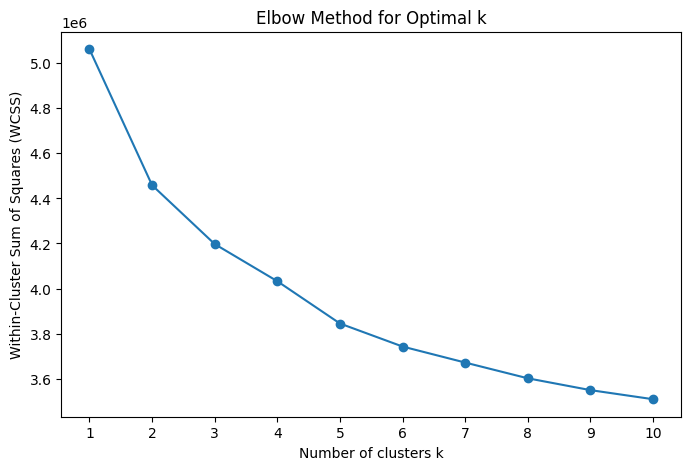

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

k_values = range(1, 11)  
wcss = []  

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_array)
    wcss.append(kmeans.inertia_) 

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(k_values, wcss, marker='o')
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of clusters k")
plt.ylabel("Within-Cluster Sum of Squares (WCSS)")
plt.xticks(k_values)
plt.show()


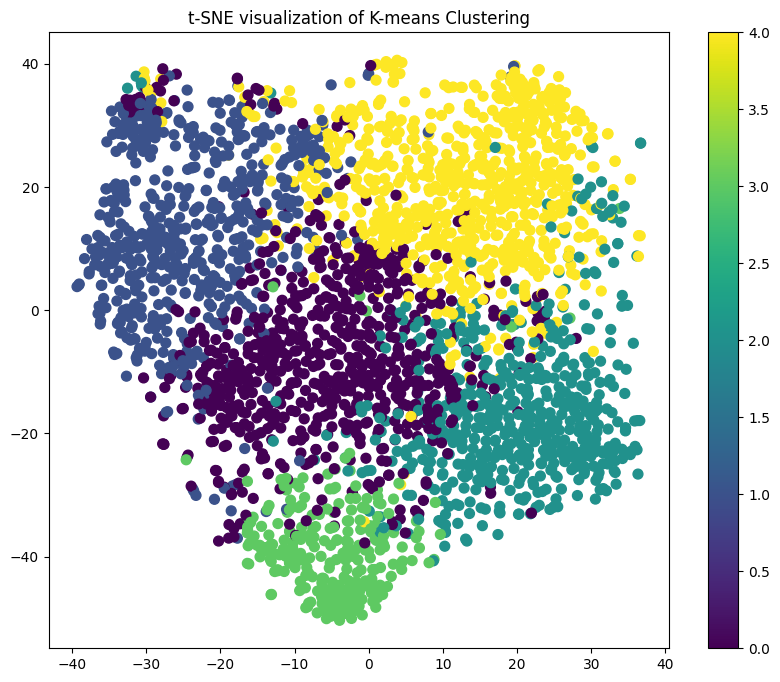

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

n_clusters = 5  
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(features_array)

labels = kmeans.labels_

tsne = TSNE(n_components=2, random_state=42)
reduced_features = tsne.fit_transform(features_array)

plt.figure(figsize=(10, 8))
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels, cmap='viridis', s=50)
plt.colorbar()
plt.title("t-SNE visualization of K-means Clustering")
plt.show()


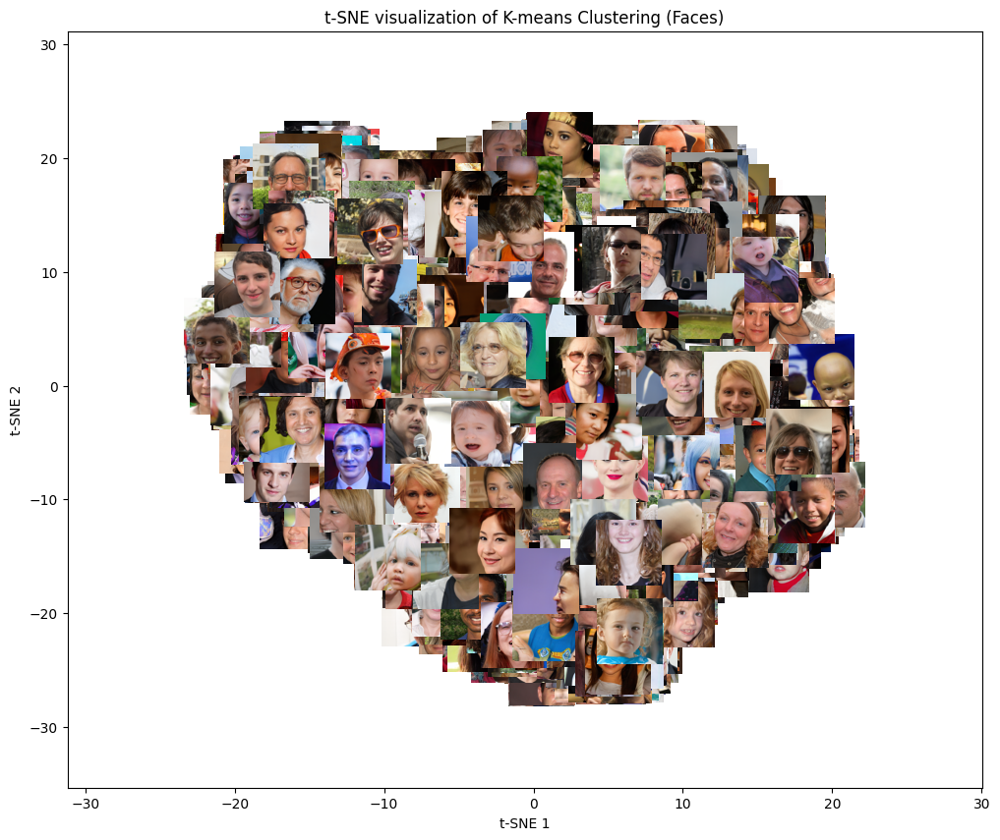

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from PIL import Image
import matplotlib.offsetbox as offsetbox

tsne = TSNE(n_components=2, random_state=42, perplexity=40, n_iter=500)  
reduced_features = tsne.fit_transform(features_array)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(features_array)
labels = kmeans.labels_

fig, ax = plt.subplots(figsize=(12, 10))

def plot_image(x, y, image_path, ax):
    try:
        image = Image.open(image_path)
        image = image.resize((80, 80))  
        imagebox = offsetbox.OffsetImage(image, zoom=0.6)  
        ab = offsetbox.AnnotationBbox(imagebox, (x, y), frameon=False)
        ax.add_artist(ab)
    except FileNotFoundError:
        print(f"Warning: {image_path} not found!")

for idx, (x, y) in enumerate(reduced_features):
    image_path = os.path.join('/content/generated_faces_ffhq', f"seed{idx+1:04d}.png")  
    plot_image(x, y, image_path, ax)

# Add titles and labels
ax.set_title("t-SNE visualization of K-means Clustering (Faces)")
ax.set_xlabel('t-SNE 1')
ax.set_ylabel('t-SNE 2')

# Manually set axis limits to ensure faces are inside the plot
ax.set_xlim([reduced_features[:, 0].min() - 10, reduced_features[:, 0].max() + 10])
ax.set_ylim([reduced_features[:, 1].min() - 10, reduced_features[:, 1].max() + 10])

plt.show()


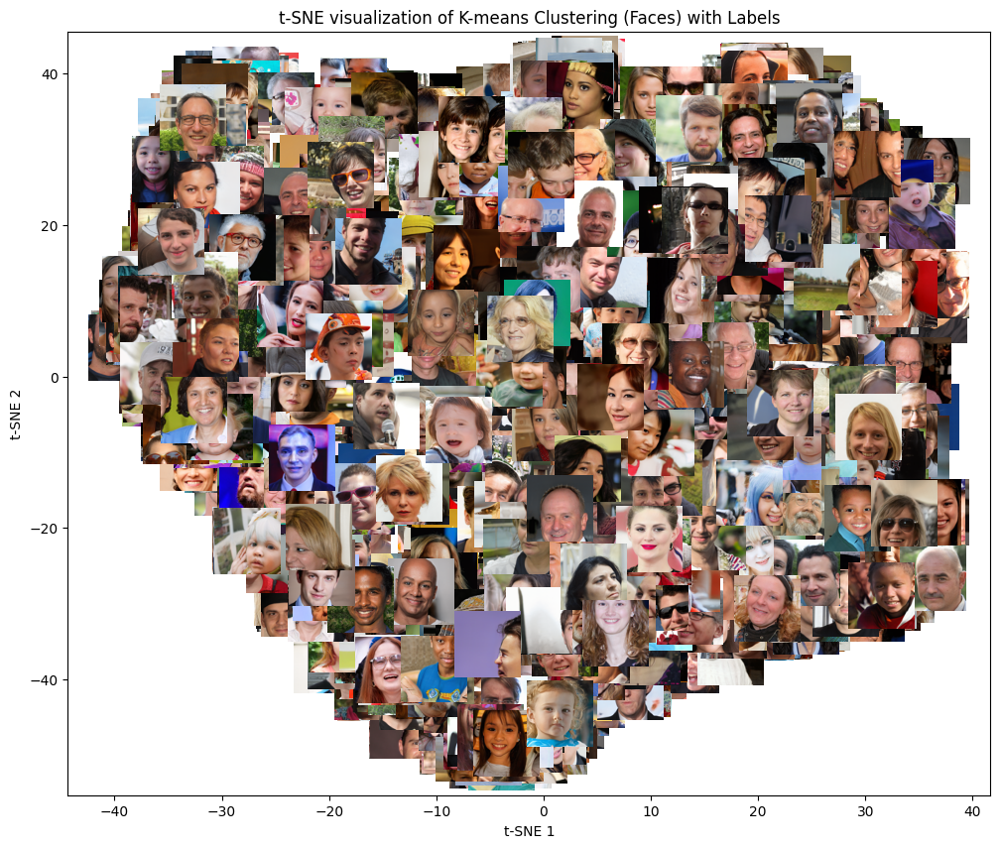

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from PIL import Image
import matplotlib.offsetbox as offsetbox

tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
reduced_features = tsne.fit_transform(features_array)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(features_array)
labels = kmeans.labels_

fig, ax = plt.subplots(figsize=(12, 10))

def plot_image(x, y, image_path, ax):
    try:
        image = Image.open(image_path)
        image = image.resize((80, 80))  
        imagebox = offsetbox.OffsetImage(image, zoom=0.6)  
        ab = offsetbox.AnnotationBbox(imagebox, (x, y), frameon=False)
        ax.add_artist(ab)
    except FileNotFoundError:
        print(f"Warning: {image_path} not found!")

for idx, (x, y) in enumerate(reduced_features):
    image_path = os.path.join('/content/generated_faces_ffhq', f"seed{idx+1:04d}.png")  
    plot_image(x, y, image_path, ax)

ax.set_title("t-SNE visualization of K-means Clustering (Faces) with Labels")
ax.set_xlabel('t-SNE 1')
ax.set_ylabel('t-SNE 2')

ax.set_xlim([reduced_features[:, 0].min() - 5, reduced_features[:, 0].max() + 5])
ax.set_ylim([reduced_features[:, 1].min() - 5, reduced_features[:, 1].max() + 5])

plt.show()


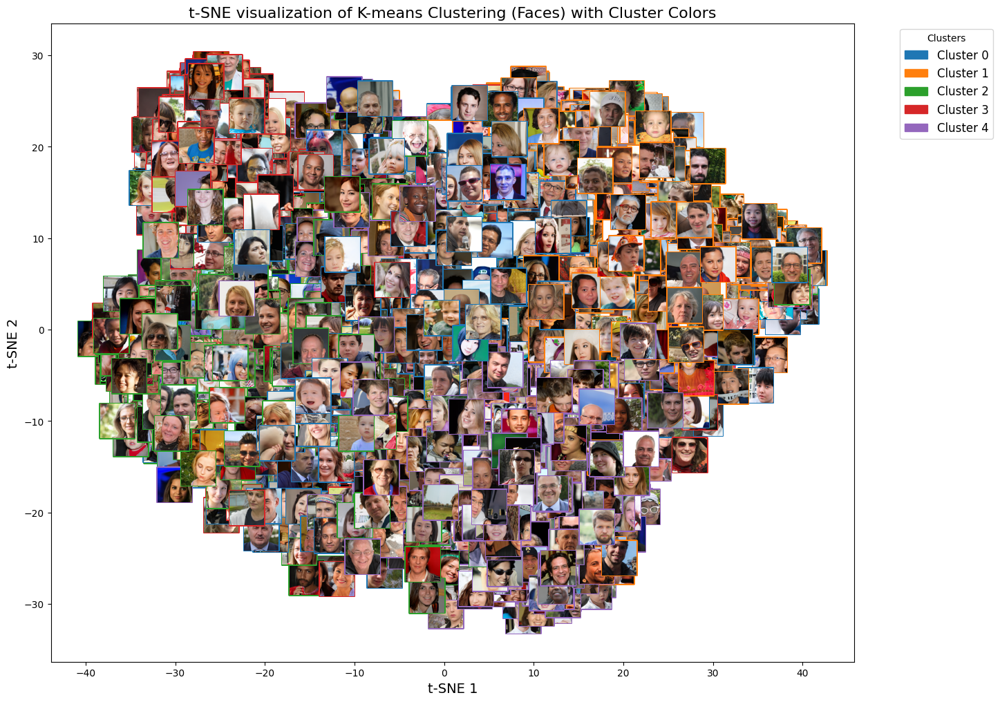

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from PIL import Image
import matplotlib.offsetbox as offsetbox
import matplotlib.patches as mpatches

tsne = TSNE(n_components=2, random_state=42, perplexity=50, n_iter=1500, learning_rate=200)
reduced_features = tsne.fit_transform(features_array)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(features_array)
labels = kmeans.labels_

centroids = kmeans.cluster_centers_

def plot_image(x, y, image_path, cluster_id, ax):
    try:
        image = Image.open(image_path)
        image = image.resize((60, 60)) 
        imagebox = offsetbox.OffsetImage(image, zoom=0.6) 

        color = plt.cm.get_cmap('tab10')(cluster_id)  
        ab = offsetbox.AnnotationBbox(imagebox, (x, y), frameon=True, bboxprops=dict(facecolor=color, edgecolor='none', boxstyle="round,pad=0.1"))
        ax.add_artist(ab)
    except FileNotFoundError:
        print(f"Warning: {image_path} not found!")

fig, ax = plt.subplots(figsize=(15, 12))

for idx, (x, y) in enumerate(reduced_features):
    image_path = os.path.join('/content/generated_faces_ffhq', f"seed{idx+1:04d}.png")  
    plot_image(x, y, image_path, labels[idx], ax)

ax.set_title("t-SNE visualization of K-means Clustering (Faces) with Cluster Colors", fontsize=16)
ax.set_xlabel('t-SNE 1', fontsize=14)
ax.set_ylabel('t-SNE 2', fontsize=14)

ax.set_xlim([reduced_features[:, 0].min() - 5, reduced_features[:, 0].max() + 5])
ax.set_ylim([reduced_features[:, 1].min() - 5, reduced_features[:, 1].max() + 5])

handles = []
for cluster_id in range(kmeans.n_clusters):
    color = plt.cm.get_cmap('tab10')(cluster_id)
    handle = mpatches.Patch(color=color, label=f"Cluster {cluster_id}")
    handles.append(handle)

ax.legend(handles=handles, title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.show()


Cluster 0:
  Face 336, Distance: 19.359024047851562
  Face 950, Distance: 20.082292556762695
  Face 2056, Distance: 20.497583389282227
  Face 1287, Distance: 20.517879486083984
  Face 1697, Distance: 20.569164276123047


Cluster 1:
  Face 1130, Distance: 20.23717498779297
  Face 2179, Distance: 20.928739547729492
  Face 2969, Distance: 21.607683181762695
  Face 2341, Distance: 21.976240158081055
  Face 309, Distance: 22.283151626586914


Cluster 2:
  Face 1064, Distance: 18.041118621826172
  Face 529, Distance: 18.756813049316406
  Face 1343, Distance: 20.117481231689453
  Face 2294, Distance: 20.732093811035156
  Face 2687, Distance: 21.56763458251953


Cluster 3:
  Face 31, Distance: 22.332305908203125
  Face 2827, Distance: 23.468461990356445
  Face 2082, Distance: 23.86969566345215
  Face 1575, Distance: 25.204593658447266
  Face 338, Distance: 25.906299591064453


Cluster 4:
  Face 516, Distance: 16.376096725463867
  Face 1053, Distance: 18.20903968811035
  Face 575, Distance: 18.

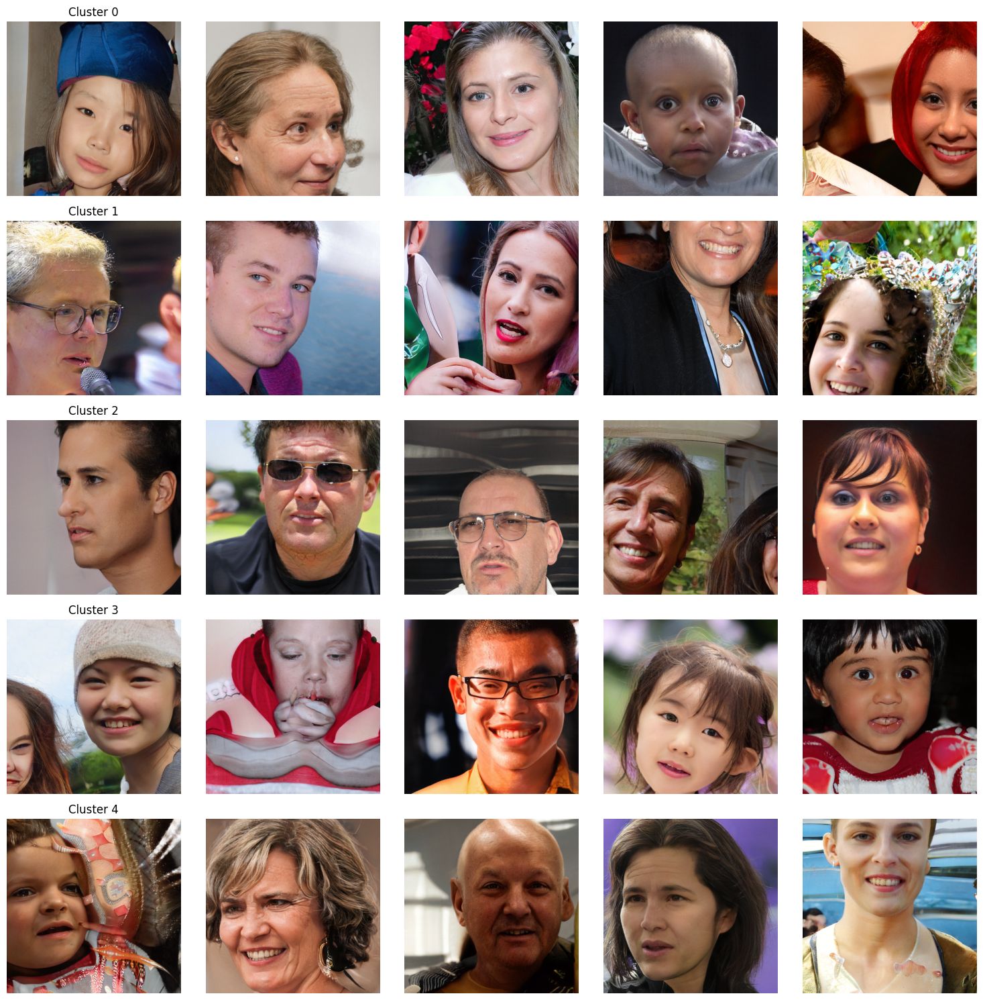

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

nearest_neighbors = NearestNeighbors(n_neighbors=5)  
nearest_neighbors.fit(features_array)

closest_faces = []
for cluster_idx, centroid in enumerate(centroids):
    distances, indices = nearest_neighbors.kneighbors([centroid], n_neighbors=5)
    closest_faces.append(indices[0])  

    print(f"Cluster {cluster_idx}:")
    for idx in indices[0]:
        print(f"  Face {idx}, Distance: {distances[0][np.where(indices[0] == idx)[0][0]]}")
    print("\n")

fig, ax = plt.subplots(len(centroids), 5, figsize=(15, len(centroids) * 3)) 
for cluster_idx, faces in enumerate(closest_faces):
    for i, face_idx in enumerate(faces):
        image_path = os.path.join('/content/generated_faces_ffhq', f"seed{face_idx+1:04d}.png")  
        image = plt.imread(image_path)
        ax[cluster_idx, i].imshow(image)
        ax[cluster_idx, i].axis('off')
    ax[cluster_idx, 0].set_title(f"Cluster {cluster_idx}")

plt.tight_layout()
plt.show()


In [ ]:
from deepface import DeepFace
import os

def extract_features(image_paths):
    features = []
    for image_path in image_paths:
        try:
            analysis = DeepFace.analyze(
                img_path=image_path,
                actions=['age', 'gender', 'emotion', 'race'],
                enforce_detection=False
            )

            if isinstance(analysis, list):
                if len(analysis) > 0:
                    analysis = analysis[0]
                else:
                    print(f"No faces found in {image_path}")
                    continue

            print(f"Full analysis for {image_path}: {analysis}")  

            dominant_emotion = analysis.get('dominant_emotion', 'Unknown')
            dominant_race = analysis.get('dominant_race', 'Unknown')
            age = analysis.get('age', 'Unknown')
            dominant_gender = analysis.get('dominant_gender', 'Unknown')

            features.append({
                'image': image_path,
                'age': age,
                'dominant_gender': dominant_gender,
                'dominant_emotion': dominant_emotion,
                'dominant_race': dominant_race,
            })

        except Exception as e:
            print(f"Error processing {image_path}: {e}")
            continue

    return features

image_dir = '/content/generated_faces_ffhq'  
image_paths = [
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.endswith('.png')
]

face_features = extract_features(image_paths)

for feature in face_features:
    print(feature)


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1979.png: {'age': 32, 'region': {'x': 73, 'y': 268, 'w': 736, 'h': 736, 'left_eye': (549, 547), 'right_eye': (295, 564)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.008439121302217245, 'Man': 99.9915599822998}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.781533300876617, 'disgust': 4.1911856207832443e-07, 'fear': 0.4981007892638445, 'happy': 0.7084682118147612, 'sad': 10.075050592422485, 'surprise': 0.005999018685542978, 'neutral': 70.93085050582886}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.410783122603789e-06, 'indian': 0.0015649986380594783, 'black': 1.39648848040963e-07, 'white': 93.71439814567566, 'middle eastern': 5.842649936676025, 'latino hispanic': 0.4413858987390995}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1792.png: {'age': 25, 'region': {'x': 193, 'y': 410, 'w': 611, 'h': 611, 'left_eye': (635, 634), 'right_eye': (373, 645)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.8258925750851631, 'Man': 99.17410612106323}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4114897698163986, 'disgust': 7.5089216232299805, 'fear': 89.3477737903595, 'happy': 1.338130421936512, 'sad': 0.15028526540845633, 'surprise': 0.21549758967012167, 'neutral': 0.027900084387511015}, 'dominant_emotion': 'fear', 'race': {'asian': 2.263660542666912, 'indian': 2.0020678639411926, 'black': 0.1887145801447332, 'white': 62.8365695476532, 'middle eastern': 16.98189228773117, 'latino hispanic': 15.727095305919647}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2576.png: {'age': 32, 'region': {'x': 127, 'y': 435, 'w': 620, 'h': 588, 'left_eye': (564, 677), 'right_eye': (300, 662)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99997615814209, 'Man': 2.414597588540346e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.03458069155637e-10, 'disgust': 5.521984094962005e-18, 'fear': 2.381283517715949e-12, 'happy': 99.91797208297086, 'sad': 2.084061996948357e-10, 'surprise': 1.6249898396225345e-06, 'neutral': 0.0820282604543573}, 'dominant_emotion': 'happy', 'race': {'asian': 0.14503178518644394, 'indian': 0.061546663407211114, 'black': 0.004610494037757849, 'white': 92.19181444547348, 'middle eastern': 3.092815164365192, 'latino hispanic': 4.504183099172485}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.78it/s]


Full analysis for /content/generated_faces_ffhq/seed1394.png: {'age': 27, 'region': {'x': 148, 'y': 272, 'w': 702, 'h': 702, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 58.3126962184906, 'Man': 41.68730676174164}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1914323084431626e-12, 'disgust': 1.8788937184829804e-22, 'fear': 3.7484078341254445e-09, 'happy': 100.0, 'sad': 8.39607842886142e-11, 'surprise': 1.4937781778667433e-12, 'neutral': 7.85767458044706e-10}, 'dominant_emotion': 'happy', 'race': {'asian': 14.75927951821333, 'indian': 4.840605873989358, 'black': 74.29694243705958, 'white': 0.24298184448697036, 'middle eastern': 0.07350971278804984, 'latino hispanic': 5.786678995289923}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0617.png: {'age': 24, 'region': {'x': 720, 'y': 12, 'w': 303, 'h': 364, 'left_eye': (966, 149), 'right_eye': (806, 151)}, 'face_confidence': 0.99, 'gender': {'Woman': 5.696423351764679, 'Man': 94.30357813835144}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.1976591882299408, 'disgust': 0.833902700561607, 'fear': 37.708325708904944, 'happy': 0.05690706408033539, 'sad': 31.997234463362034, 'surprise': 0.0009741868122442737, 'neutral': 26.20500042498117}, 'dominant_emotion': 'fear', 'race': {'asian': 0.96379229798913, 'indian': 0.5304197315126657, 'black': 0.07928444538265467, 'white': 80.13386130332947, 'middle eastern': 13.207574188709259, 'latino hispanic': 5.085066705942154}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0826.png: {'age': 26, 'region': {'x': 68, 'y': 97, 'w': 784, 'h': 784, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.008702834020368755, 'Man': 99.9912977218628}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03801521088462323, 'disgust': 4.729187527696688e-09, 'fear': 9.767336450750008e-05, 'happy': 39.87879157066345, 'sad': 0.011001261736964807, 'surprise': 0.0006489682618848747, 'neutral': 60.071444511413574}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0016171244223913764, 'indian': 0.4747946563985739, 'black': 0.00036603814713878456, 'white': 24.297228413655066, 'middle eastern': 70.43647589900947, 'latino hispanic': 4.789520340533277}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.85it/s]


Full analysis for /content/generated_faces_ffhq/seed1537.png: {'age': 29, 'region': {'x': 554, 'y': 524, 'w': 304, 'h': 304, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 13.509202003479004, 'Man': 86.49080395698547}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.805505275726318, 'disgust': 0.10493793524801731, 'fear': 2.884971909224987, 'happy': 4.936148911838245e-05, 'sad': 92.04264283180237, 'surprise': 0.0011271045877947472, 'neutral': 0.16076297033578157}, 'dominant_emotion': 'sad', 'race': {'asian': 0.010680143168428913, 'indian': 0.0659643264953047, 'black': 0.0029485767299775034, 'white': 87.37229704856873, 'middle eastern': 11.991189420223236, 'latino hispanic': 0.5569215398281813}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2906.png: {'age': 40, 'region': {'x': 257, 'y': 0, 'w': 674, 'h': 674, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.10396587895229459, 'Man': 99.89603757858276}, 'dominant_gender': 'Man', 'emotion': {'angry': 49.06323850154877, 'disgust': 0.014842442760709673, 'fear': 7.756812125444412, 'happy': 22.672799229621887, 'sad': 5.5083416402339935, 'surprise': 0.36060879938304424, 'neutral': 14.623352885246277}, 'dominant_emotion': 'angry', 'race': {'asian': 3.4522170011541675e-06, 'indian': 0.00011659476513159461, 'black': 2.466166160175476e-07, 'white': 99.24975037574768, 'middle eastern': 0.5183853209018707, 'latino hispanic': 0.2317420905455947}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.18it/s]


Full analysis for /content/generated_faces_ffhq/seed1444.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 811, 'h': 811, 'left_eye': (364, 280), 'right_eye': (261, 610)}, 'face_confidence': 0.95, 'gender': {'Woman': 14.525038003921509, 'Man': 85.47496795654297}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00020986735762562603, 'disgust': 2.7647811340694717e-11, 'fear': 0.0002679640374481096, 'happy': 99.92910623550415, 'sad': 4.1551717622212436e-08, 'surprise': 0.0690092972945422, 'neutral': 0.0014077021660341416}, 'dominant_emotion': 'happy', 'race': {'asian': 3.6878466606140137, 'indian': 6.672053039073944, 'black': 0.3374650375917554, 'white': 47.928521037101746, 'middle eastern': 18.204426765441895, 'latino hispanic': 23.169685900211334}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0753.png: {'age': 28, 'region': {'x': 46, 'y': 32, 'w': 763, 'h': 763, 'left_eye': (536, 327), 'right_eye': (292, 338)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.00019516241991368588, 'Man': 99.99980926513672}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.3961461186409, 'disgust': 3.57879841317299e-06, 'fear': 0.22769176866859198, 'happy': 71.94101810455322, 'sad': 1.0126275941729546, 'surprise': 0.024358934024348855, 'neutral': 20.398157835006714}, 'dominant_emotion': 'happy', 'race': {'asian': 9.215411101991107e-10, 'indian': 3.9364633345609534e-08, 'black': 4.483980186404505e-11, 'white': 99.9665200690341, 'middle eastern': 0.0260402580411886, 'latino hispanic': 0.007440642809915486}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2517.png: {'age': 29, 'region': {'x': 0, 'y': 337, 'w': 309, 'h': 309, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 61.88784837722778, 'Man': 38.112154603004456}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0003755883881240152, 'disgust': 0.014877300418447703, 'fear': 92.5871193408966, 'happy': 0.0013697307622351218, 'sad': 7.373843342065811, 'surprise': 0.00027636524464469403, 'neutral': 0.022141548106446862}, 'dominant_emotion': 'fear', 'race': {'asian': 0.04620312231779083, 'indian': 0.00619227249064058, 'black': 0.0004196849909062399, 'white': 98.0902968698917, 'middle eastern': 0.9531383970760344, 'latino hispanic': 0.9037518481166272}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.78it/s]


Full analysis for /content/generated_faces_ffhq/seed0183.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 607, 'h': 607, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 4.2710959911346436, 'Man': 95.72890400886536}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.404417228172156, 'disgust': 0.001280881344530208, 'fear': 1.460139279348936, 'happy': 0.0018704374768622248, 'sad': 94.88961161498885, 'surprise': 0.00019427773125756104, 'neutral': 0.2424829117601619}, 'dominant_emotion': 'sad', 'race': {'asian': 8.708902155291778, 'indian': 2.635184175052145, 'black': 0.7789952217495177, 'white': 55.56121402249169, 'middle eastern': 11.741998136997445, 'latino hispanic': 20.573700001990794}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2040.png: {'age': 32, 'region': {'x': 0, 'y': 49, 'w': 842, 'h': 842, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 2.387208864092827, 'Man': 97.61279225349426}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.2476886212825775, 'disgust': 0.0001131295334744209, 'fear': 68.87577772140503, 'happy': 0.2534874714910984, 'sad': 19.75938379764557, 'surprise': 0.06424885941669345, 'neutral': 3.7993062287569046}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0001329793235527177, 'indian': 0.052047090139240026, 'black': 0.00010362506372985081, 'white': 78.01142930984497, 'middle eastern': 21.497225761413574, 'latino hispanic': 0.4390583373606205}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0195.png: {'age': 33, 'region': {'x': 0, 'y': 49, 'w': 669, 'h': 669, 'left_eye': (315, 308), 'right_eye': (66, 286)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99786615371704, 'Man': 0.00213310540857492}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.856339958474564e-05, 'disgust': 3.5642543333002513e-12, 'fear': 4.391548236171161e-08, 'happy': 92.56201982498169, 'sad': 4.5326956410463026e-05, 'surprise': 0.018685971735976636, 'neutral': 7.419215142726898}, 'dominant_emotion': 'happy', 'race': {'asian': 17.948326468467712, 'indian': 10.415338724851608, 'black': 6.801804900169373, 'white': 21.2053120136261, 'middle eastern': 16.855229437351227, 'latino hispanic': 26.773986220359802}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.94it/s]


Full analysis for /content/generated_faces_ffhq/seed0333.png: {'age': 46, 'region': {'x': 0, 'y': 222, 'w': 693, 'h': 693, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.22095195017755032, 'Man': 99.77904558181763}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.180149555206299, 'disgust': 0.1433736295439303, 'fear': 50.6882905960083, 'happy': 0.5789805669337511, 'sad': 33.3682507276535, 'surprise': 1.692037470638752, 'neutral': 1.3489199802279472}, 'dominant_emotion': 'fear', 'race': {'asian': 11.370102450835413, 'indian': 0.42817079945852765, 'black': 0.13200662387828543, 'white': 73.81179644920869, 'middle eastern': 6.634103461014812, 'latino hispanic': 7.623819843075294}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2552.png: {'age': 34, 'region': {'x': 183, 'y': 159, 'w': 707, 'h': 707, 'left_eye': (626, 431), 'right_eye': (381, 438)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.3233982026576996, 'Man': 98.676598072052}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.332064208395826e-12, 'disgust': 8.121194003904999e-20, 'fear': 1.426395203745667e-13, 'happy': 99.99601244902685, 'sad': 1.0038858906367558e-12, 'surprise': 4.708804156999256e-11, 'neutral': 0.003990209972018784}, 'dominant_emotion': 'happy', 'race': {'asian': 72.30309578143408, 'indian': 5.077694123662218, 'black': 13.98360413508366, 'white': 0.34817250485897006, 'middle eastern': 0.09284900791507865, 'latino hispanic': 8.194580442359396}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0393.png: {'age': 29, 'region': {'x': 166, 'y': 61, 'w': 654, 'h': 654, 'left_eye': (627, 298), 'right_eye': (360, 307)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0012810336556867696, 'Man': 99.9987244606018}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.525639647283533, 'disgust': 3.4313265387030844e-06, 'fear': 0.03924281861310861, 'happy': 78.99695509654016, 'sad': 0.06680600161252925, 'surprise': 0.0010631411620797909, 'neutral': 19.370294771808073}, 'dominant_emotion': 'happy', 'race': {'asian': 5.5268362803007065e-09, 'indian': 2.3516558655956032e-05, 'black': 99.99997615814209, 'white': 7.792441550965451e-12, 'middle eastern': 1.0612171541914475e-11, 'latino hispanic': 1.9667585338112303e-07}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2520.png: {'age': 46, 'region': {'x': 0, 'y': 76, 'w': 762, 'h': 762, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.08658579899929464, 'Man': 99.91341233253479}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0010728036244340576, 'disgust': 0.00011356665719594376, 'fear': 0.002743416407988593, 'happy': 82.08220814678572, 'sad': 0.02599767448594576, 'surprise': 0.003889242989525103, 'neutral': 17.883969201568462}, 'dominant_emotion': 'happy', 'race': {'asian': 44.81413960456848, 'indian': 9.147017449140549, 'black': 3.1825248152017593, 'white': 17.98563450574875, 'middle eastern': 8.794689178466797, 'latino hispanic': 16.075991094112396}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0531.png: {'age': 25, 'region': {'x': 256, 'y': 67, 'w': 767, 'h': 775, 'left_eye': (772, 376), 'right_eye': (513, 372)}, 'face_confidence': 0.88, 'gender': {'Woman': 91.59958958625793, 'Man': 8.400411158800125}, 'dominant_gender': 'Woman', 'emotion': {'angry': 21.55291438102722, 'disgust': 0.042223292984999716, 'fear': 9.161341190338135, 'happy': 0.7867339998483658, 'sad': 18.029282987117767, 'surprise': 0.028388298233039677, 'neutral': 50.399112701416016}, 'dominant_emotion': 'neutral', 'race': {'asian': 46.76462392596149, 'indian': 3.3139152564951933, 'black': 1.3694235008611382, 'white': 30.8568525825055, 'middle eastern': 4.835280319170971, 'latino hispanic': 12.859907022709073}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.20it/s]


Full analysis for /content/generated_faces_ffhq/seed0666.png: {'age': 22, 'region': {'x': 271, 'y': 216, 'w': 740, 'h': 740, 'left_eye': (762, 486), 'right_eye': (480, 519)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.5205509718507528, 'Man': 99.47945475578308}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0005494924025802303, 'disgust': 9.24230560549744e-05, 'fear': 0.0016036002353699086, 'happy': 99.76795910405869, 'sad': 0.005210849068587963, 'surprise': 8.341290751245498e-05, 'neutral': 0.22450174611817278}, 'dominant_emotion': 'happy', 'race': {'asian': 1.488693244755268, 'indian': 4.413216561079025, 'black': 0.2507878001779318, 'white': 32.013630867004395, 'middle eastern': 31.236806511878967, 'latino hispanic': 30.596864223480225}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0235.png: {'age': 31, 'region': {'x': 78, 'y': 304, 'w': 647, 'h': 647, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 1.7627429217100143, 'Man': 98.23725819587708}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.65246669333727e-06, 'disgust': 3.2187692850888726e-13, 'fear': 5.652248217352073e-07, 'happy': 96.70362511830031, 'sad': 0.00016278360468607148, 'surprise': 0.0525157777853128, 'neutral': 3.243691087521185}, 'dominant_emotion': 'happy', 'race': {'asian': 67.49604746675774, 'indian': 5.072158504853159, 'black': 4.11309475380747, 'white': 6.296028572084222, 'middle eastern': 1.7279821546663139, 'latino hispanic': 15.294691341798982}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0370.png: {'age': 33, 'region': {'x': 0, 'y': 96, 'w': 683, 'h': 683, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.10809210361912847, 'Man': 99.8919129371643}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.533825671300292, 'disgust': 0.0008598705790063832, 'fear': 0.02315445162821561, 'happy': 63.62606883049011, 'sad': 0.1962956739589572, 'surprise': 1.3069827109575272, 'neutral': 34.312811493873596}, 'dominant_emotion': 'happy', 'race': {'asian': 0.015024759341031313, 'indian': 0.0346367247402668, 'black': 0.0008414229341724422, 'white': 89.98180627822876, 'middle eastern': 4.938600957393646, 'latino hispanic': 5.029092729091644}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0804.png: {'age': 26, 'region': {'x': 0, 'y': 236, 'w': 707, 'h': 707, 'left_eye': (460, 542), 'right_eye': (215, 496)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.65463280677795, 'Man': 0.3453710349276662}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.040553160943090916, 'disgust': 3.1132424282986904e-05, 'fear': 0.15984115889295936, 'happy': 0.5188755691051483, 'sad': 2.687147818505764, 'surprise': 0.008631524542579427, 'neutral': 96.5849220752716}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.97681975364685, 'indian': 5.711394805985037e-05, 'black': 1.4038302464935981e-08, 'white': 0.01977448264369741, 'middle eastern': 1.440607899638735e-06, 'latino hispanic': 0.0033435699151596054}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2295.png: {'age': 32, 'region': {'x': 0, 'y': 246, 'w': 651, 'h': 651, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 1.3430308550596237, 'Man': 98.65697026252747}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000256292166155948, 'disgust': 4.249428146185159e-09, 'fear': 5.6259200654099434e-08, 'happy': 98.01152336666128, 'sad': 1.9615876726262373, 'surprise': 3.6455771687209745e-07, 'neutral': 0.026630987254328265}, 'dominant_emotion': 'happy', 'race': {'asian': 23.298338055610657, 'indian': 11.259177327156067, 'black': 6.177341192960739, 'white': 17.503252625465393, 'middle eastern': 9.8701611161232, 'latino hispanic': 31.891730427742004}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1359.png: {'age': 36, 'region': {'x': 59, 'y': 0, 'w': 645, 'h': 645, 'left_eye': (518, 218), 'right_eye': (312, 447)}, 'face_confidence': 0.93, 'gender': {'Woman': 15.12056589126587, 'Man': 84.87943410873413}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5180072987566266e-05, 'disgust': 1.8883570280489083e-14, 'fear': 3.609528245662581e-05, 'happy': 99.96260405032587, 'sad': 4.4294211902712557e-07, 'surprise': 0.00032775627190888366, 'neutral': 0.03700874362874852}, 'dominant_emotion': 'happy', 'race': {'asian': 82.13798893320495, 'indian': 0.19261155959883688, 'black': 0.058317781642394165, 'white': 14.629509426922167, 'middle eastern': 0.4792174610029138, 'latino hispanic': 2.502360716602845}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2556.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 62.44990825653076, 'Man': 37.55008578300476}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0009603013495507184, 'disgust': 2.151020653913191e-11, 'fear': 7.619401067495346, 'happy': 89.19665217399597, 'sad': 3.150945156812668, 'surprise': 1.9010829532817297e-05, 'neutral': 0.03202062507625669}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 3.612117345726526e-28, 'black': 2.2273918465369703e-27, 'white': 2.607243843044671e-06, 'middle eastern': 1.3069677995866618e-24, 'latino hispanic': 6.311222637657091e-16}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.46it/s]


Full analysis for /content/generated_faces_ffhq/seed1456.png: {'age': 35, 'region': {'x': 120, 'y': 178, 'w': 743, 'h': 743, 'left_eye': (626, 460), 'right_eye': (355, 460)}, 'face_confidence': 0.91, 'gender': {'Woman': 98.81895780563354, 'Man': 1.1810466647148132}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.030812471613286235, 'disgust': 0.00017873908219721168, 'fear': 0.1778410737233504, 'happy': 81.8584014092923, 'sad': 0.16105000191107405, 'surprise': 0.05848769563549433, 'neutral': 17.71322743375465}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2701357938349247, 'indian': 0.2351576928049326, 'black': 0.01893549779197201, 'white': 72.63001799583435, 'middle eastern': 8.887588232755661, 'latino hispanic': 17.95816570520401}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0145.png: {'age': 33, 'region': {'x': 248, 'y': 92, 'w': 681, 'h': 681, 'left_eye': (716, 348), 'right_eye': (461, 344)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.43583989143372, 'Man': 4.564155638217926}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09938791627064347, 'disgust': 2.2402171229174428e-07, 'fear': 0.009101306204684079, 'happy': 99.88540410995483, 'sad': 4.6384391794163093e-05, 'surprise': 0.005332787259249017, 'neutral': 0.0007256694971147226}, 'dominant_emotion': 'happy', 'race': {'asian': 4.315946251153946, 'indian': 0.4978429526090622, 'black': 0.15249139396473765, 'white': 74.02397394180298, 'middle eastern': 6.440394371747971, 'latino hispanic': 14.569348096847534}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0294.png: {'age': 34, 'region': {'x': 364, 'y': 39, 'w': 659, 'h': 704, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.006460532313212752, 'Man': 99.99353885650635}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0023687105567660183, 'disgust': 4.69219827436973e-05, 'fear': 0.00238040247495519, 'happy': 86.38716340065002, 'sad': 0.0739820534363389, 'surprise': 0.06162149948067963, 'neutral': 13.472440838813782}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00020675920495705213, 'indian': 0.0010558359463175293, 'black': 1.3516600461116468e-05, 'white': 98.13643097877502, 'middle eastern': 1.0925662703812122, 'latino hispanic': 0.7697308901697397}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.35it/s]


Full analysis for /content/generated_faces_ffhq/seed1560.png: {'age': 29, 'region': {'x': 0, 'y': 240, 'w': 701, 'h': 701, 'left_eye': (425, 504), 'right_eye': (172, 518)}, 'face_confidence': 0.91, 'gender': {'Woman': 10.42262688279152, 'Man': 89.57737684249878}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1590604012418975e-05, 'disgust': 6.2120261853763655e-15, 'fear': 3.363920231923659e-07, 'happy': 99.99920725817724, 'sad': 1.0656756113258934e-07, 'surprise': 1.2608796181511994e-05, 'neutral': 0.0007692717648887941}, 'dominant_emotion': 'happy', 'race': {'asian': 0.26666346664210955, 'indian': 0.2112432974572955, 'black': 0.006123122512949482, 'white': 82.74983064829294, 'middle eastern': 10.818260807887365, 'latino hispanic': 5.94787707614166}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0898.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.135504737496376, 'Man': 95.86449265480042}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3061848642265716, 'disgust': 4.215227973673273e-07, 'fear': 11.418006504655272, 'happy': 7.024063811813035e-05, 'sad': 87.9867308131892, 'surprise': 0.002934699652840642, 'neutral': 0.28607362723789376}, 'dominant_emotion': 'sad', 'race': {'asian': 0.004174742705064887, 'indian': 0.0006069082060536606, 'black': 7.897865916847042e-05, 'white': 99.64273567709157, 'middle eastern': 0.20511497394621062, 'latino hispanic': 0.14728858960134858}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0615.png: {'age': 30, 'region': {'x': 0, 'y': 245, 'w': 672, 'h': 672, 'left_eye': (263, 739), 'right_eye': (169, 529)}, 'face_confidence': 0.93, 'gender': {'Woman': 48.970383405685425, 'Man': 51.029616594314575}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0047324876504717395, 'disgust': 3.350349728550861e-10, 'fear': 2.2572006486143437e-06, 'happy': 99.99128580093384, 'sad': 0.0020002031305921264, 'surprise': 1.3646248930854199e-05, 'neutral': 0.0019718969269888476}, 'dominant_emotion': 'happy', 'race': {'asian': 3.563266459898142, 'indian': 2.5380724691195766, 'black': 1.7076837916781777, 'white': 66.84801976966976, 'middle eastern': 13.641504266351715, 'latino hispanic': 11.701461625186301}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2541.png: {'age': 34, 'region': {'x': 0, 'y': 81, 'w': 708, 'h': 708, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.8286118507385254, 'Man': 99.17138814926147}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.023044939734973013, 'disgust': 4.248466300982301e-08, 'fear': 4.198624310447485e-05, 'happy': 89.07829523086548, 'sad': 0.04389956884551793, 'surprise': 4.1724791799424565e-05, 'neutral': 10.854676365852356}, 'dominant_emotion': 'happy', 'race': {'asian': 0.08457716747734458, 'indian': 0.33759706952834956, 'black': 0.023784667353087496, 'white': 77.61922807922699, 'middle eastern': 14.981037674073896, 'latino hispanic': 6.953777456733877}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0403.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0030913404771126807, 'Man': 99.99691247940063}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.139747599220868e-08, 'disgust': 4.530547831086891e-17, 'fear': 64.65726494789124, 'happy': 7.11850020707061e-05, 'sad': 35.342612862586975, 'surprise': 2.7555435622161895e-05, 'neutral': 2.0360505459393607e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1432.png: {'age': 38, 'region': {'x': 117, 'y': 184, 'w': 669, 'h': 669, 'left_eye': (533, 665), 'right_eye': (539, 453)}, 'face_confidence': 0.94, 'gender': {'Woman': 10.69728285074234, 'Man': 89.30271863937378}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.052569975377991796, 'disgust': 5.255159862826986e-05, 'fear': 27.07792818546295, 'happy': 0.09768836898729205, 'sad': 0.025089143309742212, 'surprise': 70.87883353233337, 'neutral': 1.867840439081192}, 'dominant_emotion': 'surprise', 'race': {'asian': 57.10893784654881, 'indian': 1.9792803997659207, 'black': 1.0270166849176068, 'white': 21.13095866072671, 'middle eastern': 3.432640769166855, 'latino hispanic': 15.321159026484606}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.34it/s]


Full analysis for /content/generated_faces_ffhq/seed1315.png: {'age': 24, 'region': {'x': 76, 'y': 195, 'w': 734, 'h': 734, 'left_eye': (766, 550), 'right_eye': (590, 494)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.45648934319615364, 'Man': 99.54350590705872}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.1351215195863915e-05, 'disgust': 1.6773137850975735e-12, 'fear': 1.3893591699343233e-05, 'happy': 99.75504279136658, 'sad': 7.207361250038957e-05, 'surprise': 0.047256171819753945, 'neutral': 0.19759719725698233}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004883124711341225, 'indian': 0.02136994298780337, 'black': 0.001018749662762275, 'white': 94.71205472946167, 'middle eastern': 2.7149008587002754, 'latino hispanic': 2.545779012143612}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1014.png: {'age': 25, 'region': {'x': 402, 'y': 243, 'w': 621, 'h': 674, 'left_eye': (859, 497), 'right_eye': (607, 514)}, 'face_confidence': 0.94, 'gender': {'Woman': 43.36325824260712, 'Man': 56.636738777160645}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0026060222542476134, 'disgust': 2.51318753244437e-05, 'fear': 0.006869464823646237, 'happy': 93.14564425621296, 'sad': 0.47695113394863214, 'surprise': 0.09981124325461646, 'neutral': 6.268090383296632}, 'dominant_emotion': 'happy', 'race': {'asian': 0.12326851719990373, 'indian': 0.919879600405693, 'black': 0.07216032245196402, 'white': 64.35420513153076, 'middle eastern': 18.39844137430191, 'latino hispanic': 16.13204926252365}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2086.png: {'age': 31, 'region': {'x': 101, 'y': 155, 'w': 757, 'h': 757, 'left_eye': (394, 455), 'right_eye': (306, 470)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.0055072382092476, 'Man': 97.99449443817139}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.89569187164307, 'disgust': 9.137145613716141e-18, 'fear': 0.007264481973834336, 'happy': 0.03453618264757097, 'sad': 0.008710846304893494, 'surprise': 7.901922172148801e-09, 'neutral': 0.05380256334319711}, 'dominant_emotion': 'angry', 'race': {'asian': 6.762188366943925e-05, 'indian': 0.0001139467008804586, 'black': 2.189756381639428e-06, 'white': 99.21138295991624, 'middle eastern': 0.3477626764088659, 'latino hispanic': 0.4406657475929561}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2288.png: {'age': 32, 'region': {'x': 192, 'y': 133, 'w': 723, 'h': 723, 'left_eye': (619, 399), 'right_eye': (414, 442)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.86513257026672, 'Man': 0.13486741809174418}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.216066163033247, 'disgust': 6.0903028042957885e-05, 'fear': 9.680040180683136, 'happy': 0.05586136248894036, 'sad': 75.84191560745239, 'surprise': 0.00043800737330457196, 'neutral': 13.205622136592865}, 'dominant_emotion': 'sad', 'race': {'asian': 1.1663118387739146e-10, 'indian': 1.00452079380281e-10, 'black': 1.219911356074865e-13, 'white': 99.99905824661255, 'middle eastern': 0.0002510180820536334, 'latino hispanic': 0.000689083253746503}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0278.png: {'age': 47, 'region': {'x': 366, 'y': 75, 'w': 657, 'h': 767, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.036254324368201196, 'Man': 99.96374845504761}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002149003867850404, 'disgust': 2.2075198888475106e-10, 'fear': 0.008939037603184959, 'happy': 99.91095065539781, 'sad': 0.0006089569432411756, 'surprise': 3.484709262351231e-05, 'neutral': 0.07731951069873635}, 'dominant_emotion': 'happy', 'race': {'asian': 32.337936758995056, 'indian': 5.2372995764017105, 'black': 1.6303841024637222, 'white': 21.56631499528885, 'middle eastern': 30.782529711723328, 'latino hispanic': 8.445534855127335}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2979.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.143802457023412, 'Man': 99.85620379447937}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.208797570255697e-07, 'disgust': 1.8269419243557302e-16, 'fear': 5.62147657712392e-05, 'happy': 0.0007475670354188937, 'sad': 0.5182558822787859, 'surprise': 3.4029107147501355e-06, 'neutral': 99.48093884956107}, 'dominant_emotion': 'neutral', 'race': {'asian': 35.90236008167267, 'indian': 0.0008918017556425184, 'black': 0.0002733647534114425, 'white': 63.794928789138794, 'middle eastern': 0.08880289969965816, 'latino hispanic': 0.21274022292345762}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1184.png: {'age': 30, 'region': {'x': 281, 'y': 44, 'w': 717, 'h': 717, 'left_eye': (761, 314), 'right_eye': (509, 332)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.01494535681558773, 'Man': 99.98505115509033}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.564000933170396e-06, 'disgust': 3.870834881779393e-18, 'fear': 0.1819933640282371, 'happy': 3.8919110256167923e-07, 'sad': 0.031587937401261174, 'surprise': 0.00028867761458857436, 'neutral': 99.7861266008691}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.2837061070267737e-06, 'indian': 1.9729783673483325e-05, 'black': 2.5587212904021328e-08, 'white': 99.56706762313843, 'middle eastern': 0.3565798280760646, 'latino hispanic': 0.07632822380401194}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0173.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 96.03261351585388, 'Man': 3.967394679784775}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.036837080751866e-06, 'disgust': 7.076467883893045e-09, 'fear': 0.013697557733394206, 'happy': 0.004129318040213548, 'sad': 99.9703586101532, 'surprise': 3.6314609097587436e-07, 'neutral': 0.011807773262262344}, 'dominant_emotion': 'sad', 'race': {'asian': 6.228527054190636, 'indian': 0.8446919731795788, 'black': 0.2328825183212757, 'white': 71.67190909385681, 'middle eastern': 7.999139279127121, 'latino hispanic': 13.022850453853607}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0099.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0004122597147215856, 'Man': 99.99958276748657}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.694286227226257, 'disgust': 0.010184546408709139, 'fear': 0.8510489948093891, 'happy': 84.02272462844849, 'sad': 0.025254543288610876, 'surprise': 0.29766405932605267, 'neutral': 4.098838567733765}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 7.03081710243766e-19, 'black': 4.5461095825316544e-11, 'white': 9.598324307192739e-14, 'middle eastern': 1.8707453402483625e-17, 'latino hispanic': 1.0882269796990074e-19}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0127.png: {'age': 26, 'region': {'x': 219, 'y': 162, 'w': 681, 'h': 681, 'left_eye': (677, 451), 'right_eye': (431, 443)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.23436462506651878, 'Man': 99.76563453674316}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00043212343676779426, 'disgust': 1.306008940736134e-05, 'fear': 0.0009745689315071113, 'happy': 95.09483038248653, 'sad': 0.023159590059027516, 'surprise': 0.005928398989411005, 'neutral': 4.874655395787311}, 'dominant_emotion': 'happy', 'race': {'asian': 0.009504705667495728, 'indian': 0.04003123030997813, 'black': 0.0018477023331797682, 'white': 90.65935015678406, 'middle eastern': 4.358426854014397, 'latino hispanic': 4.930839687585831}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0259.png: {'age': 43, 'region': {'x': 149, 'y': 299, 'w': 656, 'h': 656, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.00019048409285460366, 'Man': 99.99980926513672}, 'dominant_gender': 'Man', 'emotion': {'angry': 39.385467135039995, 'disgust': 0.00026843435315833066, 'fear': 0.10217534754352853, 'happy': 5.1223713232500145, 'sad': 3.446663376490079, 'surprise': 0.0576497846651694, 'neutral': 51.88540529521735}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0009945038349102166, 'indian': 0.009415212511222066, 'black': 5.175283539151464e-05, 'white': 95.25688830100158, 'middle eastern': 2.704751627713636, 'latino hispanic': 2.02790113126053}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1257.png: {'age': 32, 'region': {'x': 116, 'y': 315, 'w': 672, 'h': 672, 'left_eye': (550, 560), 'right_eye': (312, 560)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99470710754395, 'Man': 0.005296475865179673}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.105622613355233, 'disgust': 3.6557236266280664e-06, 'fear': 7.24362966342326, 'happy': 0.001285465503759528, 'sad': 81.78491375266478, 'surprise': 0.0028929789361323266, 'neutral': 9.861658199031138}, 'dominant_emotion': 'sad', 'race': {'asian': 0.65817441791296, 'indian': 0.5973692983388901, 'black': 0.0397005642298609, 'white': 68.98987293243408, 'middle eastern': 14.40933346748352, 'latino hispanic': 15.305550396442413}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1372.png: {'age': 33, 'region': {'x': 314, 'y': 375, 'w': 672, 'h': 648, 'left_eye': (784, 640), 'right_eye': (649, 893)}, 'face_confidence': 0.94, 'gender': {'Woman': 44.79754865169525, 'Man': 55.20244836807251}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6061056928862172e-07, 'disgust': 1.4059719566100595e-15, 'fear': 6.79711177945137, 'happy': 3.41944582760334, 'sad': 1.4070657528009178e-05, 'surprise': 0.06214517634361982, 'neutral': 89.72128033638}, 'dominant_emotion': 'neutral', 'race': {'asian': 35.35815179347992, 'indian': 9.704011678695679, 'black': 5.9482283890247345, 'white': 19.895237684249878, 'middle eastern': 8.871328830718994, 'latino hispanic': 20.223043859004974}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2176.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.35442851949483156, 'Man': 99.6455729007721}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.843516441932258e-10, 'disgust': 5.69757740776492e-18, 'fear': 2.2820015321833864e-08, 'happy': 9.043247053974746e-10, 'sad': 100.0, 'surprise': 2.3148309159256403e-20, 'neutral': 7.100163556053585e-12}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.4062189058081616e-20, 'black': 1.5930172554144073e-20, 'white': 2.752645150933073e-12, 'middle eastern': 2.7187836875689513e-25, 'latino hispanic': 9.163262562736276e-13}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0807.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 27.86521017551422, 'Man': 72.13478684425354}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.292867117862751e-06, 'disgust': 6.331560284382874e-17, 'fear': 99.59513542623135, 'happy': 0.07727371290839988, 'sad': 0.00031675057994886267, 'surprise': 0.012940541681083542, 'neutral': 0.31433088715856594}, 'dominant_emotion': 'fear', 'race': {'asian': 1.2151143306561905, 'indian': 0.00010697298831526656, 'black': 4.932307745343652e-07, 'white': 98.70287768261896, 'middle eastern': 0.07218209059876743, 'latino hispanic': 0.009720589002471134}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1393.png: {'age': 34, 'region': {'x': 83, 'y': 60, 'w': 724, 'h': 724, 'left_eye': (571, 374), 'right_eye': (326, 311)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99847412109375, 'Man': 0.0015212526704999618}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0036250225093681365, 'disgust': 9.955618274215539e-09, 'fear': 0.225018709897995, 'happy': 0.6351097952574492, 'sad': 1.7440171912312508, 'surprise': 0.004034978337585926, 'neutral': 97.38819599151611}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.6818009540438652, 'indian': 0.3769519738852978, 'black': 0.040582913788966835, 'white': 66.78751707077026, 'middle eastern': 12.837515771389008, 'latino hispanic': 19.275635480880737}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.44it/s]


Full analysis for /content/generated_faces_ffhq/seed1776.png: {'age': 32, 'region': {'x': 261, 'y': 311, 'w': 663, 'h': 663, 'left_eye': (675, 558), 'right_eye': (425, 640)}, 'face_confidence': 0.94, 'gender': {'Woman': 25.093451142311096, 'Man': 74.90655183792114}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6156938084564985e-06, 'disgust': 1.6917999260710658e-09, 'fear': 2.9756818162370868e-05, 'happy': 98.37079038445893, 'sad': 0.0002082560637502587, 'surprise': 0.051924199399676886, 'neutral': 1.5770494015246272}, 'dominant_emotion': 'happy', 'race': {'asian': 6.310860812664032, 'indian': 1.9013414159417152, 'black': 90.01872539520264, 'white': 0.0364276027539745, 'middle eastern': 0.008924700523493811, 'latino hispanic': 1.7237238585948944}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1963.png: {'age': 33, 'region': {'x': 0, 'y': 340, 'w': 704, 'h': 683, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 2.5339895859360695, 'Man': 97.46600985527039}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9563247833136313e-05, 'disgust': 2.410362202880061e-13, 'fear': 0.00013917479838797552, 'happy': 65.14855415514434, 'sad': 0.017875736713453334, 'surprise': 4.0453539464727474e-05, 'neutral': 34.83336775501774}, 'dominant_emotion': 'happy', 'race': {'asian': 1.745786890387535, 'indian': 1.016644574701786, 'black': 0.1815115916542709, 'white': 70.19984126091003, 'middle eastern': 14.27483856678009, 'latino hispanic': 12.581375241279602}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1824.png: {'age': 29, 'region': {'x': 298, 'y': 187, 'w': 725, 'h': 772, 'left_eye': (803, 499), 'right_eye': (561, 494)}, 'face_confidence': 0.91, 'gender': {'Woman': 100.0, 'Man': 7.109169156138684e-10}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.2704279862423293e-10, 'disgust': 8.196807339600713e-19, 'fear': 3.9081024454470405e-13, 'happy': 99.84939098358154, 'sad': 4.507016721638779e-10, 'surprise': 6.186805290298025e-07, 'neutral': 0.1506130094639957}, 'dominant_emotion': 'happy', 'race': {'asian': 0.08612578898859256, 'indian': 0.06635252316162128, 'black': 0.00172499886780272, 'white': 91.09011239350512, 'middle eastern': 4.0129857667080024, 'latino hispanic': 4.742701261800603}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.31it/s]


Full analysis for /content/generated_faces_ffhq/seed0223.png: {'age': 18, 'region': {'x': 46, 'y': 244, 'w': 706, 'h': 706, 'left_eye': (518, 533), 'right_eye': (260, 549)}, 'face_confidence': 0.98, 'gender': {'Woman': 14.438199996948242, 'Man': 85.56180000305176}, 'dominant_gender': 'Man', 'emotion': {'angry': 54.05779480934143, 'disgust': 0.24434586521238089, 'fear': 3.8140323013067245, 'happy': 7.028256356716156, 'sad': 19.694453477859497, 'surprise': 0.27861485723406076, 'neutral': 14.88250344991684}, 'dominant_emotion': 'angry', 'race': {'asian': 99.87934231038942, 'indian': 0.001009743542612844, 'black': 0.00010083380776290543, 'white': 0.0007396662099151988, 'middle eastern': 3.6511212231561155e-06, 'latino hispanic': 0.11880113287202315}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2850.png: {'age': 30, 'region': {'x': 301, 'y': 445, 'w': 597, 'h': 578, 'left_eye': (712, 667), 'right_eye': (453, 691)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.79141354560852, 'Man': 0.20858601201325655}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.5797433890532564e-10, 'disgust': 7.983184715234626e-18, 'fear': 9.993997816815092e-11, 'happy': 99.7840166091919, 'sad': 2.625974993009095e-07, 'surprise': 6.043879352546355e-06, 'neutral': 0.21597605664283037}, 'dominant_emotion': 'happy', 'race': {'asian': 3.806411474943161, 'indian': 9.197656065225601, 'black': 2.0746679976582527, 'white': 29.035887122154236, 'middle eastern': 23.202510178089142, 'latino hispanic': 32.68287181854248}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0566.png: {'age': 26, 'region': {'x': 47, 'y': 225, 'w': 702, 'h': 702, 'left_eye': (513, 487), 'right_eye': (251, 523)}, 'face_confidence': 0.88, 'gender': {'Woman': 2.4127739806090176e-06, 'Man': 100.0}, 'dominant_gender': 'Man', 'emotion': {'angry': 35.75802147388458, 'disgust': 0.0005850886736880057, 'fear': 4.90209236741066, 'happy': 0.3962415736168623, 'sad': 21.865180134773254, 'surprise': 0.0802195630967617, 'neutral': 36.997658014297485}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00026179520060123674, 'indian': 0.00015148799314185191, 'black': 6.067487496592421e-06, 'white': 98.77020113290556, 'middle eastern': 0.31602135414757454, 'latino hispanic': 0.9133595586335396}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2875.png: {'age': 28, 'region': {'x': 130, 'y': 357, 'w': 723, 'h': 666, 'left_eye': (312, 884), 'right_eye': (205, 577)}, 'face_confidence': 0.94, 'gender': {'Woman': 58.478981256484985, 'Man': 41.521018743515015}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.156499572098351e-17, 'disgust': 2.515100572212864e-22, 'fear': 5.479956399767616e-06, 'happy': 7.976821980726356e-09, 'sad': 99.99998807907104, 'surprise': 2.85854990274733e-23, 'neutral': 7.200711849009167e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 0.24042816367000341, 'indian': 0.12311107711866498, 'black': 0.021473440574482083, 'white': 93.04320812225342, 'middle eastern': 2.606114372611046, 'latino hispanic': 3.9656702429056168}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1879.png: {'age': 35, 'region': {'x': 0, 'y': 423, 'w': 607, 'h': 600, 'left_eye': (280, 922), 'right_eye': (263, 658)}, 'face_confidence': 0.98, 'gender': {'Woman': 13.953244686126709, 'Man': 86.04675531387329}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9245787112320105e-07, 'disgust': 1.3614544226695436e-15, 'fear': 1.5702144200430262e-05, 'happy': 99.95756745844275, 'sad': 3.3421385405192424e-05, 'surprise': 0.0416568081527283, 'neutral': 0.0007223547575627138}, 'dominant_emotion': 'happy', 'race': {'asian': 3.9720557630062103, 'indian': 3.964092582464218, 'black': 1.8942123278975487, 'white': 44.50922906398773, 'middle eastern': 28.830763697624207, 'latino hispanic': 16.829651594161987}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0681.png: {'age': 34, 'region': {'x': 309, 'y': 152, 'w': 646, 'h': 646, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 50.090014934539795, 'Man': 49.909988045692444}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.029167401953600347, 'disgust': 0.0033584870834602043, 'fear': 0.5169293843209743, 'happy': 98.74788522720337, 'sad': 0.25751926004886627, 'surprise': 0.050922948867082596, 'neutral': 0.39422097615897655}, 'dominant_emotion': 'happy', 'race': {'asian': 93.62821541000696, 'indian': 0.7991442933168587, 'black': 0.04729795318755228, 'white': 0.3699205337789973, 'middle eastern': 0.021657554152033725, 'latino hispanic': 5.133765869365089}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0645.png: {'age': 34, 'region': {'x': 182, 'y': 427, 'w': 620, 'h': 596, 'left_eye': (628, 688), 'right_eye': (365, 669)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.23247788194566965, 'Man': 99.76752400398254}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8090515587864449, 'disgust': 0.0028544125833527088, 'fear': 76.70268098083962, 'happy': 0.01191284321845143, 'sad': 0.0020003211264464967, 'surprise': 22.471204701518452, 'neutral': 0.00029006808925277747}, 'dominant_emotion': 'fear', 'race': {'asian': 55.25510907173157, 'indian': 15.711428225040436, 'black': 3.7066910415887833, 'white': 4.176371172070503, 'middle eastern': 1.3919636607170105, 'latino hispanic': 19.7584331035614}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2508.png: {'age': 44, 'region': {'x': 482, 'y': 408, 'w': 541, 'h': 613, 'left_eye': (909, 654), 'right_eye': (640, 648)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.08848702418617904, 'Man': 99.91151690483093}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7784829009324312, 'disgust': 0.003967920929426327, 'fear': 6.524527072906494, 'happy': 0.05620103911496699, 'sad': 25.79493820667267, 'surprise': 0.3617130685597658, 'neutral': 66.48016571998596}, 'dominant_emotion': 'neutral', 'race': {'asian': 43.03832012643338, 'indian': 6.094718715233726, 'black': 3.739784508334667, 'white': 10.685428123797662, 'middle eastern': 25.834424843455842, 'latino hispanic': 10.60732889815145}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2464.png: {'age': 39, 'region': {'x': 186, 'y': 371, 'w': 654, 'h': 652, 'left_eye': (622, 569), 'right_eye': (370, 642)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.8988687992096, 'Man': 0.10112777817994356}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.737982628311002e-07, 'disgust': 6.293975874304677e-10, 'fear': 2.6888969620685178e-06, 'happy': 99.65226654383343, 'sad': 0.0005918607006821133, 'surprise': 0.012253101152929526, 'neutral': 0.33487796982342366}, 'dominant_emotion': 'happy', 'race': {'asian': 1.4443611726164818, 'indian': 1.3335551135241985, 'black': 0.1628270256333053, 'white': 45.76059579849243, 'middle eastern': 16.564449667930603, 'latino hispanic': 34.73421037197113}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 46.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2765.png: {'age': 35, 'region': {'x': 362, 'y': 380, 'w': 661, 'h': 643, 'left_eye': (808, 645), 'right_eye': (550, 608)}, 'face_confidence': 0.94, 'gender': {'Woman': 7.643155753612518, 'Man': 92.35684871673584}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2250465197618256e-05, 'disgust': 3.675685802357648e-12, 'fear': 2.1812986851305965e-05, 'happy': 0.4556237060203377, 'sad': 0.004465212525821851, 'surprise': 0.0009058376775692323, 'neutral': 99.53896400564695}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.422375187277794, 'indian': 7.839586585760117, 'black': 2.7700304985046387, 'white': 29.011446237564087, 'middle eastern': 27.440080046653748, 'latino hispanic': 28.516483306884766}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1672.png: {'age': 33, 'region': {'x': 411, 'y': 0, 'w': 612, 'h': 646, 'left_eye': (856, 233), 'right_eye': (614, 178)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.36254969891160727, 'Man': 99.63744282722473}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05933195227338943, 'disgust': 0.0006618490381243854, 'fear': 0.23034321657947104, 'happy': 4.9559762381343555, 'sad': 1.4838685375310734, 'surprise': 0.06483960123782143, 'neutral': 93.20497593820382}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00013888883358958992, 'indian': 0.00014689896943309577, 'black': 8.930143735597085e-07, 'white': 98.57677817344666, 'middle eastern': 0.397369172424078, 'latino hispanic': 1.0255715809762478}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.77it/s]


Full analysis for /content/generated_faces_ffhq/seed1892.png: {'age': 33, 'region': {'x': 213, 'y': 293, 'w': 679, 'h': 679, 'left_eye': (695, 598), 'right_eye': (460, 509)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9847412109375, 'Man': 0.015251275908667594}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.280359745025635, 'disgust': 0.4694633651524782, 'fear': 2.029021643102169, 'happy': 4.835797473788261, 'sad': 30.097371339797974, 'surprise': 0.31854594126343727, 'neutral': 52.96943783760071}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.6217635793544996, 'indian': 1.9507500574439798, 'black': 0.4492868471465616, 'white': 39.3734597786343, 'middle eastern': 14.712325615425444, 'latino hispanic': 39.89241360976777}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.08it/s]


Full analysis for /content/generated_faces_ffhq/seed0799.png: {'age': 31, 'region': {'x': 374, 'y': 196, 'w': 643, 'h': 643, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 28.176596760749817, 'Man': 71.82340621948242}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014828443818259984, 'disgust': 3.3040016944596573e-06, 'fear': 0.02057624515146017, 'happy': 99.89681243896484, 'sad': 0.006002889494993724, 'surprise': 0.017335811571683735, 'neutral': 0.044446386164054275}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3753260485827923, 'indian': 0.5153504665941, 'black': 0.06684539839625359, 'white': 69.65670585632324, 'middle eastern': 10.413408279418945, 'latino hispanic': 17.97236055135727}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1478.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.5354730412364006, 'Man': 99.46452379226685}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0868322263073758, 'disgust': 4.7171062758618765e-06, 'fear': 6.571479533402892, 'happy': 2.229108586242874e-06, 'sad': 93.32379658960083, 'surprise': 1.0810653017659393e-08, 'neutral': 0.017885514145878054}, 'dominant_emotion': 'sad', 'race': {'asian': 0.5199990545212659, 'indian': 9.011258694555955e-05, 'black': 7.7852356982951e-08, 'white': 97.45084032123329, 'middle eastern': 0.0012170931584145521, 'latino hispanic': 2.02785816954721}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1894.png: {'age': 46, 'region': {'x': 126, 'y': 0, 'w': 652, 'h': 652, 'left_eye': (595, 57), 'right_eye': (314, 89)}, 'face_confidence': 0.95, 'gender': {'Woman': 78.35279107093811, 'Man': 21.647214889526367}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.8443072725158345e-06, 'disgust': 2.7175466858768307e-23, 'fear': 1.742036546685164e-14, 'happy': 99.99978542327881, 'sad': 1.31131645488831e-14, 'surprise': 5.015434123106744e-13, 'neutral': 0.0002105038674926618}, 'dominant_emotion': 'happy', 'race': {'asian': 21.363673887471787, 'indian': 13.950374063871745, 'black': 10.003732741101548, 'white': 11.017687530379744, 'middle eastern': 9.543612423158432, 'latino hispanic': 34.12091935401674}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2214.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 22.796599566936493, 'Man': 77.20339894294739}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1418638456067329, 'disgust': 3.015558634436568e-11, 'fear': 0.18234865428821392, 'happy': 99.67509512006103, 'sad': 4.766982684311229e-06, 'surprise': 4.926585635014353e-09, 'neutral': 0.0006859409587308134}, 'dominant_emotion': 'happy', 'race': {'asian': 0.24530435316361748, 'indian': 0.8011771342245181, 'black': 0.04760047319078765, 'white': 67.42365152553897, 'middle eastern': 18.76186653830212, 'latino hispanic': 12.72039410824846}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1607.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.09516384452581406, 'Man': 99.90482926368713}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.855579659514888e-07, 'disgust': 2.0283877355531388e-08, 'fear': 1.480086542215986e-06, 'happy': 92.40514039993286, 'sad': 7.594746351242065, 'surprise': 6.830860529993821e-10, 'neutral': 0.00011030004998247023}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002958964609132367, 'indian': 0.0031360019470603436, 'black': 2.2197514128707812e-05, 'white': 97.57654056409243, 'middle eastern': 0.5961548892351919, 'latino hispanic': 1.8211883646958091}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1969.png: {'age': 26, 'region': {'x': 33, 'y': 0, 'w': 738, 'h': 738, 'left_eye': (515, 311), 'right_eye': (278, 309)}, 'face_confidence': 0.92, 'gender': {'Woman': 64.8044764995575, 'Man': 35.195526480674744}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.6559845129274914e-11, 'disgust': 1.3946142704913389e-15, 'fear': 2.3578789745334894e-11, 'happy': 99.98742341995239, 'sad': 9.768641451302074e-08, 'surprise': 6.850553544573978e-10, 'neutral': 0.012575964501593262}, 'dominant_emotion': 'happy', 'race': {'asian': 35.53500175476074, 'indian': 7.240331172943115, 'black': 1.1128738522529602, 'white': 3.8880199193954468, 'middle eastern': 0.8256569504737854, 'latino hispanic': 51.39812231063843}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2507.png: {'age': 24, 'region': {'x': 316, 'y': 216, 'w': 677, 'h': 677, 'left_eye': (781, 497), 'right_eye': (525, 492)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.8915326558053493, 'Man': 99.10846948623657}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7392920437231396e-09, 'disgust': 2.691444013526987e-13, 'fear': 4.44453120140853e-09, 'happy': 92.26075410842896, 'sad': 1.2150040973324394e-06, 'surprise': 7.288516457037986e-08, 'neutral': 7.739243656396866}, 'dominant_emotion': 'happy', 'race': {'asian': 86.26819252967834, 'indian': 0.3675139509141445, 'black': 0.03615191671997309, 'white': 1.6129573807120323, 'middle eastern': 0.05260547040961683, 'latino hispanic': 11.662577837705612}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0621.png: {'age': 32, 'region': {'x': 152, 'y': 98, 'w': 715, 'h': 715, 'left_eye': (562, 376), 'right_eye': (312, 379)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99996423721313, 'Man': 3.18632658036222e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.071009858577554e-06, 'disgust': 1.2140244050936472e-11, 'fear': 8.89659179659219e-08, 'happy': 99.99738931655884, 'sad': 3.608976673064035e-07, 'surprise': 1.0048399612383463e-09, 'neutral': 0.0026087218429893255}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3000370003283024, 'indian': 1.2618804350495338, 'black': 0.056379352463409305, 'white': 43.94466578960419, 'middle eastern': 9.920592606067657, 'latino hispanic': 43.51644814014435}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1860.png: {'age': 33, 'region': {'x': 486, 'y': 356, 'w': 537, 'h': 648, 'left_eye': (937, 616), 'right_eye': (675, 610)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.06812087958678603, 'Man': 99.93188381195068}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4311473108828068, 'disgust': 6.636215882371843e-09, 'fear': 1.7018407583236694, 'happy': 3.4120790814995416e-05, 'sad': 3.5547059029340744, 'surprise': 0.001672902362770401, 'neutral': 94.31059956550598}, 'dominant_emotion': 'neutral', 'race': {'asian': 24.880914390087128, 'indian': 17.554716765880585, 'black': 15.658190846443176, 'white': 9.092842787504196, 'middle eastern': 9.183614701032639, 'latino hispanic': 23.629721999168396}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.97it/s]


Full analysis for /content/generated_faces_ffhq/seed1525.png: {'age': 29, 'region': {'x': 527, 'y': 306, 'w': 496, 'h': 617, 'left_eye': (943, 552), 'right_eye': (717, 531)}, 'face_confidence': 0.93, 'gender': {'Woman': 37.6878023147583, 'Man': 62.3121976852417}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.1281116585901714e-09, 'disgust': 5.606770812588556e-17, 'fear': 1.8302640219375332e-10, 'happy': 99.992835521698, 'sad': 2.152564064494822e-09, 'surprise': 1.7388421369446405e-06, 'neutral': 0.007164063572417945}, 'dominant_emotion': 'happy', 'race': {'asian': 8.233021199703217, 'indian': 10.062109678983688, 'black': 3.8467492908239365, 'white': 19.772791862487793, 'middle eastern': 18.159504234790802, 'latino hispanic': 39.925822615623474}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2162.png: {'age': 29, 'region': {'x': 160, 'y': 273, 'w': 702, 'h': 702, 'left_eye': (641, 802), 'right_eye': (403, 547)}, 'face_confidence': 0.93, 'gender': {'Woman': 75.47865509986877, 'Man': 24.521343410015106}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.395780468982366e-06, 'disgust': 6.960306473297343e-13, 'fear': 0.02092157956212759, 'happy': 94.72251534461975, 'sad': 0.010340668814023957, 'surprise': 4.713585965987477e-06, 'neutral': 5.24621419608593}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8254464715719223, 'indian': 1.0559902526438236, 'black': 0.07983497343957424, 'white': 75.73867440223694, 'middle eastern': 9.58106741309166, 'latino hispanic': 12.718993425369263}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1120.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.029284722404554486, 'Man': 99.97071623802185}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.31200750923067, 'disgust': 4.4386488122813014e-05, 'fear': 0.6097537669832984, 'happy': 0.04885006346478302, 'sad': 0.029058154351596015, 'surprise': 3.0543603113836844e-06, 'neutral': 0.0002765333090376099}, 'dominant_emotion': 'angry', 'race': {'asian': 100.0, 'indian': 8.182168698450968e-17, 'black': 1.7207451576004266e-16, 'white': 3.165060156643624e-13, 'middle eastern': 4.5579900648962203e-17, 'latino hispanic': 2.6157846505156512e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0600.png: {'age': 24, 'region': {'x': 294, 'y': 370, 'w': 560, 'h': 560, 'left_eye': (712, 605), 'right_eye': (456, 595)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.1560291857458651, 'Man': 99.84397292137146}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6601858418434858, 'disgust': 1.1742483652099622e-07, 'fear': 0.9572640061378479, 'happy': 0.014692162221763283, 'sad': 23.93839657306671, 'surprise': 0.0008853133294906002, 'neutral': 74.42857623100281}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.467900633464824e-20, 'indian': 2.879826821061528e-16, 'black': 100.0, 'white': 1.1779105089307417e-28, 'middle eastern': 1.9195521822374144e-28, 'latino hispanic': 3.780241652658262e-21}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0729.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 64.5009458065033, 'Man': 35.499054193496704}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.422880863890751, 'disgust': 7.000542136734165e-06, 'fear': 7.37413503570008e-05, 'happy': 94.76862487418948, 'sad': 0.7058350279432568, 'surprise': 4.866442052142968e-06, 'neutral': 0.10257421585684608}, 'dominant_emotion': 'happy', 'race': {'asian': 53.08611113346286, 'indian': 3.4790640907921846, 'black': 9.975477902619714, 'white': 26.32531978638886, 'middle eastern': 2.693591241156533, 'latino hispanic': 4.4404349142572235}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1253.png: {'age': 44, 'region': {'x': 173, 'y': 83, 'w': 651, 'h': 651, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.046936943545006216, 'Man': 99.95306730270386}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1292590014216004, 'disgust': 8.44545594921983e-06, 'fear': 1.066103543656642, 'happy': 98.27909490119279, 'sad': 0.294600042785699, 'surprise': 0.03959247952528542, 'neutral': 0.19133350626501366}, 'dominant_emotion': 'happy', 'race': {'asian': 1.5776431187987328, 'indian': 4.668097943067551, 'black': 1.6664927825331688, 'white': 66.03383421897888, 'middle eastern': 13.70750516653061, 'latino hispanic': 12.34642118215561}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1617.png: {'age': 25, 'region': {'x': 0, 'y': 62, 'w': 655, 'h': 655, 'left_eye': (432, 329), 'right_eye': (177, 296)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99656677246094, 'Man': 0.003432909943512641}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4260723167643385e-05, 'disgust': 2.171152538656708e-10, 'fear': 4.8876388660732105e-06, 'happy': 97.92858982937457, 'sad': 0.00041861926104569305, 'surprise': 1.024223925699445e-05, 'neutral': 2.070957734172614}, 'dominant_emotion': 'happy', 'race': {'asian': 0.22766441106796265, 'indian': 0.07490194402635098, 'black': 0.0063127255998551846, 'white': 84.81078147888184, 'middle eastern': 4.63174395263195, 'latino hispanic': 10.248595476150513}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2710.png: {'age': 31, 'region': {'x': 228, 'y': 0, 'w': 591, 'h': 591, 'left_eye': (647, 111), 'right_eye': (385, 135)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.011292147246422246, 'Man': 99.98871088027954}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9478341564536095, 'disgust': 7.509148645112873e-05, 'fear': 0.49233464524149895, 'happy': 58.29378366470337, 'sad': 3.653159737586975, 'surprise': 0.023676376440562308, 'neutral': 35.58913171291351}, 'dominant_emotion': 'happy', 'race': {'asian': 1.545384066908735e-20, 'indian': 6.6856932566602566e-15, 'black': 100.0, 'white': 1.0463212514409357e-28, 'middle eastern': 7.25608976551429e-30, 'latino hispanic': 6.834778225514272e-20}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2687.png: {'age': 33, 'region': {'x': 460, 'y': 191, 'w': 563, 'h': 656, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 31.772702932357788, 'Man': 68.22730302810669}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0978358555585146, 'disgust': 1.1630734064738135e-05, 'fear': 2.857792191207409, 'happy': 0.023888344003353268, 'sad': 95.65024971961975, 'surprise': 0.00045156789383327123, 'neutral': 1.3697722926735878}, 'dominant_emotion': 'sad', 'race': {'asian': 19.735419122626677, 'indian': 3.8969528850260837, 'black': 1.2054499744415252, 'white': 37.62289734159676, 'middle eastern': 16.51550728267518, 'latino hispanic': 21.023779633495764}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1621.png: {'age': 26, 'region': {'x': 402, 'y': 159, 'w': 621, 'h': 634, 'left_eye': (833, 420), 'right_eye': (584, 385)}, 'face_confidence': 0.96, 'gender': {'Woman': 6.619787216186523, 'Man': 93.38021278381348}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0065421252918392596, 'disgust': 4.8602848378537845e-05, 'fear': 0.00018671684050484586, 'happy': 99.97417926634427, 'sad': 0.0009629006518522666, 'surprise': 2.1390262215238384e-05, 'neutral': 0.018057186010442584}, 'dominant_emotion': 'happy', 'race': {'asian': 99.27850978886848, 'indian': 0.0024547785474119633, 'black': 0.00031332232798779994, 'white': 0.5165216212817141, 'middle eastern': 0.00295306128998409, 'latino hispanic': 0.19924042187114432}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.08it/s]


Full analysis for /content/generated_faces_ffhq/seed0993.png: {'age': 27, 'region': {'x': 128, 'y': 345, 'w': 657, 'h': 657, 'left_eye': (586, 576), 'right_eye': (329, 594)}, 'face_confidence': 0.93, 'gender': {'Woman': 6.504691392183304, 'Man': 93.49531531333923}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.766981525184926, 'disgust': 0.0008103232119440835, 'fear': 11.60162027458903, 'happy': 0.27096331149031977, 'sad': 47.35523791846777, 'surprise': 0.065586446183673, 'neutral': 34.93879318966947}, 'dominant_emotion': 'sad', 'race': {'asian': 37.434983253479004, 'indian': 3.107801452279091, 'black': 1.6256444156169891, 'white': 28.992581367492676, 'middle eastern': 9.286734461784363, 'latino hispanic': 19.55225169658661}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1660.png: {'age': 25, 'region': {'x': 158, 'y': 348, 'w': 61, 'h': 61, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 37.5068724155426, 'Man': 62.493133544921875}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04937721532769501, 'disgust': 1.4120467295430927e-08, 'fear': 50.259679555892944, 'happy': 0.1665041665546596, 'sad': 14.653819799423218, 'surprise': 0.00010900459983531618, 'neutral': 34.870514273643494}, 'dominant_emotion': 'fear', 'race': {'asian': 0.3268457559531026, 'indian': 0.40657184827961346, 'black': 0.12388168521518288, 'white': 81.65968279127088, 'middle eastern': 8.853533553655916, 'latino hispanic': 8.629477485480608}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2968.png: {'age': 30, 'region': {'x': 0, 'y': 260, 'w': 752, 'h': 752, 'left_eye': (479, 832), 'right_eye': (358, 824)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.9936580657959, 'Man': 0.006345783913275227}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.506321042776108, 'disgust': 0.06501002935692668, 'fear': 0.9373451583087444, 'happy': 63.377541303634644, 'sad': 7.352623343467712, 'surprise': 0.13535021571442485, 'neutral': 22.62580692768097}, 'dominant_emotion': 'happy', 'race': {'asian': 67.89141297340393, 'indian': 0.06942234467715025, 'black': 0.00560163171030581, 'white': 26.06787085533142, 'middle eastern': 0.6096601020544767, 'latino hispanic': 5.356034263968468}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2266.png: {'age': 32, 'region': {'x': 225, 'y': 452, 'w': 626, 'h': 571, 'left_eye': (666, 709), 'right_eye': (398, 696)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.016937052714638412, 'Man': 99.98306035995483}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11982155529517595, 'disgust': 0.0008500793332328597, 'fear': 69.06547773664924, 'happy': 21.345199208879375, 'sad': 2.2988391055272945, 'surprise': 5.154733974305865, 'neutral': 2.0150771904083715}, 'dominant_emotion': 'fear', 'race': {'asian': 1.3094249181449413, 'indian': 5.395365506410599, 'black': 0.6879565771669149, 'white': 37.08027899265289, 'middle eastern': 26.629072427749634, 'latino hispanic': 28.897902369499207}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2769.png: {'age': 24, 'region': {'x': 173, 'y': 150, 'w': 758, 'h': 758, 'left_eye': (713, 444), 'right_eye': (442, 449)}, 'face_confidence': 0.93, 'gender': {'Woman': 12.49844804406166, 'Man': 87.50155568122864}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.401099981157578e-17, 'disgust': 4.248698129973654e-28, 'fear': 8.787455009759349e-18, 'happy': 99.9995470046997, 'sad': 5.871495409257371e-15, 'surprise': 1.2084719076127515e-10, 'neutral': 0.00045418801164487377}, 'dominant_emotion': 'happy', 'race': {'asian': 1.706392462638711e-08, 'indian': 6.469500552322613e-09, 'black': 9.74310034640998e-12, 'white': 99.99551773124722, 'middle eastern': 0.0018401400291706215, 'latino hispanic': 0.0026352931441459594}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2842.png: {'age': 25, 'region': {'x': 273, 'y': 73, 'w': 675, 'h': 675, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 2.9296360909938812, 'Man': 97.07036018371582}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005376214860312409, 'disgust': 1.2687696095043385e-06, 'fear': 27.61846647372642, 'happy': 0.007188060109071291, 'sad': 50.23624600388086, 'surprise': 1.3502383305778668e-05, 'neutral': 22.132715411944115}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99990463257973, 'indian': 1.3078620359700901e-05, 'black': 3.0610614391258015e-06, 'white': 6.466953756518876e-07, 'middle eastern': 2.5985715470514033e-11, 'latino hispanic': 7.581176311141515e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.39it/s]


Full analysis for /content/generated_faces_ffhq/seed1798.png: {'age': 34, 'region': {'x': 205, 'y': 53, 'w': 770, 'h': 770, 'left_eye': (713, 340), 'right_eye': (460, 389)}, 'face_confidence': 0.91, 'gender': {'Woman': 4.969574547430966e-05, 'Man': 99.99995231628418}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2004178974246546e-05, 'disgust': 2.3765053756282555e-07, 'fear': 2.6363944326749413e-06, 'happy': 99.83826877614632, 'sad': 0.0004561959396646542, 'surprise': 8.758209539377239e-05, 'neutral': 0.16116551530623255}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00965355066000484, 'indian': 0.25108405388891697, 'black': 0.0037897410948062316, 'white': 72.09066152572632, 'middle eastern': 20.868439972400665, 'latino hispanic': 6.7763738334178925}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1587.png: {'age': 18, 'region': {'x': 93, 'y': 247, 'w': 685, 'h': 685, 'left_eye': (567, 515), 'right_eye': (311, 514)}, 'face_confidence': 0.93, 'gender': {'Woman': 10.474830865859985, 'Man': 89.52516913414001}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.191354125738144, 'disgust': 5.6902771383704476e-08, 'fear': 7.253871113061905, 'happy': 2.9063522788419505e-05, 'sad': 33.87626111507416, 'surprise': 2.611007801078813e-05, 'neutral': 55.67845702171326}, 'dominant_emotion': 'neutral', 'race': {'asian': 83.12936425209045, 'indian': 1.2156587094068527, 'black': 0.2666620071977377, 'white': 3.532560169696808, 'middle eastern': 0.14315976295620203, 'latino hispanic': 11.712600290775299}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2515.png: {'age': 26, 'region': {'x': 77, 'y': 228, 'w': 715, 'h': 715, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 4.880068823695183, 'Man': 95.11993527412415}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1816218253225088, 'disgust': 0.13049269327893853, 'fear': 3.7251852452754974, 'happy': 0.707714818418026, 'sad': 38.62873315811157, 'surprise': 0.007421701593557373, 'neutral': 56.61883354187012}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.0393110144678026e-13, 'indian': 2.2423432061895524e-12, 'black': 5.570287598081598e-16, 'white': 99.99990463256836, 'middle eastern': 4.10024313168833e-05, 'latino hispanic': 5.872061592526734e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0834.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.8769462108612, 'Man': 0.12304614065214992}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8141450841557827e-08, 'disgust': 5.082389026471529e-22, 'fear': 0.004309474024921656, 'happy': 1.5184971857706842e-05, 'sad': 0.013964374375063926, 'surprise': 7.807638979784315e-07, 'neutral': 99.98170733451843}, 'dominant_emotion': 'neutral', 'race': {'asian': 45.2875551752779, 'indian': 0.010196808460257707, 'black': 0.0012437356249478924, 'white': 52.22214771641181, 'middle eastern': 0.577755213693095, 'latino hispanic': 1.9011036694707673}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1458.png: {'age': 26, 'region': {'x': 222, 'y': 118, 'w': 697, 'h': 697, 'left_eye': (692, 385), 'right_eye': (425, 406)}, 'face_confidence': 0.92, 'gender': {'Woman': 3.674108162522316, 'Man': 96.32589221000671}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2631047517061234, 'disgust': 0.015203574730549008, 'fear': 1.3040986843407154, 'happy': 9.148545563220978, 'sad': 7.437319308519363, 'surprise': 0.04624337307177484, 'neutral': 80.78548312187195}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.102642249315977, 'indian': 8.906122297048569, 'black': 0.4741552285850048, 'white': 25.75019598007202, 'middle eastern': 39.38194513320923, 'latino hispanic': 24.384938180446625}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0809.png: {'age': 28, 'region': {'x': 159, 'y': 169, 'w': 717, 'h': 717, 'left_eye': (645, 464), 'right_eye': (383, 426)}, 'face_confidence': 0.87, 'gender': {'Woman': 0.008998850535135716, 'Man': 99.99099969863892}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.215760750011515e-11, 'disgust': 3.065963471220358e-26, 'fear': 1.4777086627362015e-17, 'happy': 99.97057318687439, 'sad': 5.171072988210956e-11, 'surprise': 6.441014713774729e-12, 'neutral': 0.0294281606329605}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0003183095638828228, 'indian': 0.018223160430849098, 'black': 5.3133721361830906e-05, 'white': 90.24320724525538, 'middle eastern': 7.186156622905329, 'latino hispanic': 2.552041529362384}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2749.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 85.2435827255249, 'Man': 14.756420254707336}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.31923886854201555, 'disgust': 1.775675495530038e-07, 'fear': 24.677711725234985, 'happy': 0.012726850400213152, 'sad': 51.59192085266113, 'surprise': 0.002621291969262529, 'neutral': 23.395782709121704}, 'dominant_emotion': 'sad', 'race': {'asian': 99.51935410499573, 'indian': 2.631235344625199e-12, 'black': 1.8579608141018974e-14, 'white': 0.48064147122204304, 'middle eastern': 7.219035924599382e-08, 'latino hispanic': 3.625562072784305e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0647.png: {'age': 29, 'region': {'x': 425, 'y': 459, 'w': 561, 'h': 561, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0007857725904614199, 'Man': 99.99921321868896}, 'dominant_gender': 'Man', 'emotion': {'angry': 13.717876374721527, 'disgust': 0.0568929361179471, 'fear': 31.097424030303955, 'happy': 0.002498731373634655, 'sad': 48.83035719394684, 'surprise': 0.6915423553436995, 'neutral': 5.603408440947533}, 'dominant_emotion': 'sad', 'race': {'asian': 2.969510480761528, 'indian': 4.698840156197548, 'black': 1.3996194116771221, 'white': 36.98406517505646, 'middle eastern': 22.72612750530243, 'latino hispanic': 31.221839785575867}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.91it/s]


Full analysis for /content/generated_faces_ffhq/seed0820.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.96694326400757, 'Man': 0.033063371665775776}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4089350227805597e-06, 'disgust': 1.3268607541946175e-13, 'fear': 0.014598766289519068, 'happy': 0.0010645647857612534, 'sad': 0.15449008692546642, 'surprise': 2.9053762152093702e-05, 'neutral': 99.82981087806095}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.15498485028563, 'indian': 0.012246970441296898, 'black': 5.0255670509715166e-05, 'white': 0.41548372542664114, 'middle eastern': 0.0008190932997969839, 'latino hispanic': 0.4164180749110073}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2825.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.009278725337935612, 'Man': 99.99072551727295}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3849956771727623e-09, 'disgust': 2.4349079308164903e-22, 'fear': 99.9959945678711, 'happy': 2.563442088603812e-13, 'sad': 0.0037801935832249, 'surprise': 0.00010805781585077057, 'neutral': 0.0001205212356580887}, 'dominant_emotion': 'fear', 'race': {'asian': 12.908248603343964, 'indian': 0.0, 'black': 0.0, 'white': 87.0917558670044, 'middle eastern': 3.936221660054938e-23, 'latino hispanic': 1.9702788761748107e-21}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2368.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04509053542278707, 'Man': 99.95490908622742}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.202013291296439e-10, 'disgust': 2.9192899678615955e-20, 'fear': 99.99823570251465, 'happy': 7.400632739279229e-13, 'sad': 0.0014820478099863976, 'surprise': 1.167372865040761e-06, 'neutral': 0.0002830858647939749}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2044.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.002225980642833747, 'Man': 99.9977707862854}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5279149440393667e-05, 'disgust': 1.3416922475169312e-13, 'fear': 95.74569463729858, 'happy': 0.9433390572667122, 'sad': 0.19586710259318352, 'surprise': 0.0016119824067573063, 'neutral': 3.113466687500477}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1356.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07001004414632916, 'Man': 99.92998838424683}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0003880709077135316, 'disgust': 3.969396188390474e-12, 'fear': 0.00040494553699182756, 'happy': 0.020131013042651896, 'sad': 0.0008986867750503156, 'surprise': 1.8196066183688703e-06, 'neutral': 99.97817277778225}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 3.0551103745012498e-24, 'black': 7.7249916737847e-27, 'white': 4.8390605817855994e-14, 'middle eastern': 6.139349930965851e-23, 'latino hispanic': 8.676811751613336e-24}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1529.png: {'age': 32, 'region': {'x': 142, 'y': 170, 'w': 741, 'h': 741, 'left_eye': (630, 458), 'right_eye': (377, 446)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.35954571794718504, 'Man': 99.64045286178589}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04803391930181533, 'disgust': 3.0569972864213923e-05, 'fear': 1.5533889643847942, 'happy': 3.1036367639899254, 'sad': 1.1300019919872284, 'surprise': 0.3421127563342452, 'neutral': 93.82279515266418}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00048502470235689543, 'indian': 0.0012754993804264814, 'black': 5.491088828080137e-06, 'white': 98.00036549568176, 'middle eastern': 1.4094693586230278, 'latino hispanic': 0.5884029436856508}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1163.png: {'age': 54, 'region': {'x': 209, 'y': 309, 'w': 713, 'h': 713, 'left_eye': (676, 561), 'right_eye': (445, 626)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.042706457315944135, 'Man': 99.95729327201843}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6758737377822399, 'disgust': 4.16060828456466e-05, 'fear': 0.15575322322547436, 'happy': 8.488089591264725, 'sad': 9.238924831151962, 'surprise': 0.33859529066830873, 'neutral': 81.10272288322449}, 'dominant_emotion': 'neutral', 'race': {'asian': 18.478286266326904, 'indian': 10.324177891016006, 'black': 6.727296859025955, 'white': 20.023110508918762, 'middle eastern': 16.49247258901596, 'latino hispanic': 27.954652905464172}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1005.png: {'age': 33, 'region': {'x': 204, 'y': 42, 'w': 794, 'h': 794, 'left_eye': (719, 375), 'right_eye': (486, 358)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.72791075706482, 'Man': 0.27208710089325905}, 'dominant_gender': 'Woman', 'emotion': {'angry': 14.251834154129028, 'disgust': 0.000599061695538694, 'fear': 23.716959357261658, 'happy': 53.17046642303467, 'sad': 1.7858654260635376, 'surprise': 6.9700464606285095, 'neutral': 0.10422575287520885}, 'dominant_emotion': 'happy', 'race': {'asian': 6.940536201000214, 'indian': 14.488688111305237, 'black': 38.937243819236755, 'white': 6.295381486415863, 'middle eastern': 4.217666760087013, 'latino hispanic': 29.120483994483948}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0843.png: {'age': 31, 'region': {'x': 70, 'y': 393, 'w': 613, 'h': 613, 'left_eye': (497, 632), 'right_eye': (234, 627)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.07289505447261035, 'Man': 99.92710947990417}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00231629401241662, 'disgust': 3.491447575498796e-07, 'fear': 5.110167080601968e-05, 'happy': 93.05132031440735, 'sad': 0.05497322999872267, 'surprise': 0.00043634963731165044, 'neutral': 6.890902668237686}, 'dominant_emotion': 'happy', 'race': {'asian': 5.533852939238156e-20, 'indian': 5.162821667577255e-13, 'black': 100.0, 'white': 4.4856617667604367e-26, 'middle eastern': 9.956194153272573e-28, 'latino hispanic': 2.412775418205406e-16}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1231.png: {'age': 34, 'region': {'x': 676, 'y': 386, 'w': 66, 'h': 66, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 22.943346202373505, 'Man': 77.05665826797485}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.961463050927705e-05, 'disgust': 5.566616503686894e-12, 'fear': 11.644741147756577, 'happy': 1.9198277965188026, 'sad': 3.2242055982351303, 'surprise': 0.00018627455347086652, 'neutral': 83.21099877357483}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.8076032173695098, 'indian': 1.5648697504323572, 'black': 0.49885672696570915, 'white': 61.42272719280286, 'middle eastern': 28.515149862477177, 'latino hispanic': 7.190795671391229}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1918.png: {'age': 33, 'region': {'x': 206, 'y': 207, 'w': 746, 'h': 746, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.36914919037371874, 'Man': 99.63085055351257}, 'dominant_gender': 'Man', 'emotion': {'angry': 19.270795583724976, 'disgust': 1.9978643739371194e-09, 'fear': 0.0006469530035246862, 'happy': 6.647804379463196, 'sad': 3.4064870327711105, 'surprise': 2.1810551587009286e-06, 'neutral': 70.67426443099976}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0003780160113819875, 'indian': 0.0011805080248450395, 'black': 1.5172469147728407e-05, 'white': 98.11356663703918, 'middle eastern': 1.3103234581649303, 'latino hispanic': 0.5745410919189453}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1365.png: {'age': 34, 'region': {'x': 167, 'y': 381, 'w': 632, 'h': 632, 'left_eye': (597, 606), 'right_eye': (333, 635)}, 'face_confidence': 0.94, 'gender': {'Woman': 97.65119552612305, 'Man': 2.348806709051132}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.567886933684349, 'disgust': 0.0021350617316784337, 'fear': 0.023191054060589522, 'happy': 0.2617941703647375, 'sad': 9.208978712558746, 'surprise': 0.06584218936040998, 'neutral': 87.87017464637756}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.62660674731652, 'indian': 0.005705686682762675, 'black': 6.706913264598792e-05, 'white': 0.18596508418812344, 'middle eastern': 0.00041481084338548785, 'latino hispanic': 0.18123464128185615}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.46it/s]


Full analysis for /content/generated_faces_ffhq/seed1813.png: {'age': 32, 'region': {'x': 151, 'y': 210, 'w': 660, 'h': 660, 'left_eye': (598, 481), 'right_eye': (334, 470)}, 'face_confidence': 0.95, 'gender': {'Woman': 4.291871190071106, 'Man': 95.70813179016113}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5573511123657227, 'disgust': 0.00063399679675058, 'fear': 2.4609489366412163, 'happy': 0.33431469928473234, 'sad': 6.561336666345596, 'surprise': 0.6837912835180759, 'neutral': 89.40162658691406}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0005666027170575477, 'indian': 0.02700233568316422, 'black': 99.96727705391919, 'white': 4.865516831175208e-06, 'middle eastern': 2.1829524028485708e-06, 'latino hispanic': 0.005145059299708725}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0375.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.022778102720621973, 'Man': 99.97722506523132}, 'dominant_gender': 'Man', 'emotion': {'angry': 82.48749270960646, 'disgust': 0.000703652127517258, 'fear': 0.8818066273216383, 'happy': 16.315270442680742, 'sad': 0.26891708114248997, 'surprise': 0.029214147356995783, 'neutral': 0.016594009764507995}, 'dominant_emotion': 'angry', 'race': {'asian': 100.0, 'indian': 1.0176390110119814e-23, 'black': 1.3278143241496937e-22, 'white': 2.867147234149499e-14, 'middle eastern': 4.116950933214871e-18, 'latino hispanic': 5.404611626942321e-12}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1736.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01667171309236437, 'Man': 99.98332262039185}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.53477364694443e-09, 'disgust': 3.450534705763993e-14, 'fear': 0.0016961972708704422, 'happy': 42.38807766295405, 'sad': 6.04005451048763e-05, 'surprise': 0.0004513249306510818, 'neutral': 57.60971994515895}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 9.047255638056062e-20, 'black': 2.0739006672876098e-13, 'white': 1.129348656342883e-17, 'middle eastern': 7.798618955586126e-22, 'latino hispanic': 1.559826785402856e-16}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0213.png: {'age': 29, 'region': {'x': 0, 'y': 106, 'w': 698, 'h': 698, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.88, 'gender': {'Woman': 0.04511379811447114, 'Man': 99.9548852443695}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006519933776871767, 'disgust': 4.8280497490413345e-15, 'fear': 5.485508935976213e-06, 'happy': 99.96565580368042, 'sad': 1.8374292309886187e-06, 'surprise': 9.873247819314201e-06, 'neutral': 0.03368176403455436}, 'dominant_emotion': 'happy', 'race': {'asian': 46.22516609580315, 'indian': 0.44356712921363883, 'black': 0.2021678378235005, 'white': 41.7256946400222, 'middle eastern': 2.537022868515424, 'latino hispanic': 8.86638440885451}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1857.png: {'age': 34, 'region': {'x': 0, 'y': 245, 'w': 656, 'h': 656, 'left_eye': (332, 504), 'right_eye': (88, 501)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9953031539917, 'Man': 0.00469943588541355}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.15803688438609242, 'disgust': 2.4352893035484158e-06, 'fear': 0.002211225000792183, 'happy': 45.543959736824036, 'sad': 0.27598775923252106, 'surprise': 0.1303320750594139, 'neutral': 53.88947129249573}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0014649458535131998, 'indian': 0.00223330262087984, 'black': 0.00010218287798124948, 'white': 95.4781174659729, 'middle eastern': 0.8354293182492256, 'latino hispanic': 3.68264801800251}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2783.png: {'age': 26, 'region': {'x': 264, 'y': 110, 'w': 687, 'h': 687, 'left_eye': (730, 393), 'right_eye': (474, 383)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.1539331628009677, 'Man': 99.84606504440308}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5677557339214404, 'disgust': 8.427818526988847e-11, 'fear': 1.6599664348403889, 'happy': 4.601692256019981e-07, 'sad': 97.36750753313213, 'surprise': 0.04325290568045161, 'neutral': 0.3615185885928764}, 'dominant_emotion': 'sad', 'race': {'asian': 5.020255967974663, 'indian': 5.885260179638863, 'black': 1.084653940051794, 'white': 30.899327993392944, 'middle eastern': 29.349997639656067, 'latino hispanic': 27.76050567626953}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0081.png: {'age': 30, 'region': {'x': 39, 'y': 136, 'w': 701, 'h': 701, 'left_eye': (528, 425), 'right_eye': (274, 408)}, 'face_confidence': 0.94, 'gender': {'Woman': 100.0, 'Man': 4.188408286864842e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.027344466070644557, 'disgust': 1.3043575551249798e-10, 'fear': 4.750577732920647, 'happy': 4.285187742425478e-05, 'sad': 1.204769778996706, 'surprise': 0.00496219472552184, 'neutral': 94.01230812072754}, 'dominant_emotion': 'neutral', 'race': {'asian': 60.98762881608353, 'indian': 0.2136673334514896, 'black': 0.019567942367584093, 'white': 32.882607922864906, 'middle eastern': 3.0371202051186805, 'latino hispanic': 2.859412660826762}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1642.png: {'age': 32, 'region': {'x': 216, 'y': 225, 'w': 625, 'h': 625, 'left_eye': (652, 458), 'right_eye': (390, 471)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99992847442627, 'Man': 7.095716227922821e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.217976190077025e-05, 'disgust': 8.245644115277586e-19, 'fear': 0.03091895778197795, 'happy': 9.90867002163831e-12, 'sad': 3.8809552788734436, 'surprise': 3.454772579125631e-08, 'neutral': 96.08805179595947}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.9929783642292023, 'indian': 1.6783203929662704, 'black': 0.2273976569995284, 'white': 51.99878215789795, 'middle eastern': 19.23689693212509, 'latino hispanic': 25.865626335144043}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0220.png: {'age': 28, 'region': {'x': 251, 'y': 0, 'w': 741, 'h': 741, 'left_eye': (744, 174), 'right_eye': (470, 198)}, 'face_confidence': 0.93, 'gender': {'Woman': 44.33797895908356, 'Man': 55.66202402114868}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00527184056409169, 'disgust': 3.698217134005116e-11, 'fear': 8.855987942979482e-06, 'happy': 77.15633511543274, 'sad': 0.002957575816253666, 'surprise': 0.0008170884029823355, 'neutral': 22.83460795879364}, 'dominant_emotion': 'happy', 'race': {'asian': 21.45014809967853, 'indian': 7.230439899020183, 'black': 1.852785085473667, 'white': 15.913255919606199, 'middle eastern': 8.388356374306246, 'latino hispanic': 45.16501667082508}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0802.png: {'age': 44, 'region': {'x': 348, 'y': 16, 'w': 597, 'h': 597, 'left_eye': (766, 245), 'right_eye': (521, 241)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.07629352039657533, 'Man': 99.9237060546875}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3245057172778676, 'disgust': 95.61183426450695, 'fear': 1.0834033315422136, 'happy': 0.012024039449904603, 'sad': 1.849309278983431, 'surprise': 0.08732925573277507, 'neutral': 0.031594945604052876}, 'dominant_emotion': 'disgust', 'race': {'asian': 1.6904635354876518, 'indian': 1.8932770937681198, 'black': 0.21543451584875584, 'white': 53.388309478759766, 'middle eastern': 17.001545429229736, 'latino hispanic': 25.81096887588501}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2657.png: {'age': 24, 'region': {'x': 325, 'y': 325, 'w': 698, 'h': 698, 'left_eye': (779, 590), 'right_eye': (527, 615)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0585319590754807, 'Man': 99.94146823883057}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0762147510545699e-15, 'disgust': 4.6653174960689255e-29, 'fear': 9.765921932882081e-21, 'happy': 99.99990463256836, 'sad': 1.0909999427594652e-16, 'surprise': 4.818697253283072e-12, 'neutral': 9.536970537737943e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0035336474531161358, 'indian': 0.009464542782131095, 'black': 0.00014460014786257542, 'white': 92.2781279418621, 'middle eastern': 2.6150067660220584, 'latino hispanic': 5.0937241427569555}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2123.png: {'age': 24, 'region': {'x': 736, 'y': 263, 'w': 105, 'h': 105, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 10.48833280801773, 'Man': 89.51166272163391}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.017705827085927998, 'disgust': 2.0807937170094903e-08, 'fear': 97.77005897581928, 'happy': 0.02066119900887528, 'sad': 1.9059603307223516, 'surprise': 0.00015601318430024551, 'neutral': 0.28545592750346227}, 'dominant_emotion': 'fear', 'race': {'asian': 1.1239374464973744, 'indian': 3.015040965681191, 'black': 2.743292926942459, 'white': 68.90935527197782, 'middle eastern': 8.527929607382966, 'latino hispanic': 15.680449090057502}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2715.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.54830408096313, 'Man': 0.4516952205449343}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8945042756790542e-08, 'disgust': 2.0180346092514524e-13, 'fear': 0.07383126649074256, 'happy': 2.2526711225509644, 'sad': 96.61199450492859, 'surprise': 1.6041826070636866e-10, 'neutral': 1.0615043342113495}, 'dominant_emotion': 'sad', 'race': {'asian': 1.6722097339640085e-11, 'indian': 2.7923404771651635e-17, 'black': 2.95061140611347e-20, 'white': 100.0, 'middle eastern': 1.831030769713915e-10, 'latino hispanic': 1.443798119254991e-09}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1193.png: {'age': 33, 'region': {'x': 269, 'y': 308, 'w': 754, 'h': 715, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.4852699115872383, 'Man': 99.51472878456116}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8891102456516173, 'disgust': 2.071097583645992e-09, 'fear': 0.0011082395509489171, 'happy': 0.03038566682458173, 'sad': 29.47890040152671, 'surprise': 2.780578710927165e-09, 'neutral': 69.60049686434846}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.595393784071839e-08, 'indian': 2.5957428865884645e-07, 'black': 1.0129181951597304e-09, 'white': 99.97280835943272, 'middle eastern': 0.01823991442085665, 'latino hispanic': 0.008951253209151518}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0033.png: {'age': 26, 'region': {'x': 164, 'y': 63, 'w': 690, 'h': 690, 'left_eye': (628, 359), 'right_eye': (384, 299)}, 'face_confidence': 0.92, 'gender': {'Woman': 92.73066520690918, 'Man': 7.269330322742462}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.483852902460602e-12, 'disgust': 1.265188835603421e-26, 'fear': 1.0477280160171646e-16, 'happy': 99.99222159339318, 'sad': 4.018965575857899e-12, 'surprise': 2.3395500266017286e-06, 'neutral': 0.007778761673570375}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1972514477075873, 'indian': 3.5924681088290344, 'black': 0.1785860260566802, 'white': 43.70595439743452, 'middle eastern': 17.00006628037289, 'latino hispanic': 34.325675287923254}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2891.png: {'age': 36, 'region': {'x': 140, 'y': 0, 'w': 769, 'h': 769, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.5844405386596918, 'Man': 99.41555261611938}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6240492463111877, 'disgust': 5.4323550102708396e-06, 'fear': 2.9888520017266273, 'happy': 0.28904436621814966, 'sad': 14.748872816562653, 'surprise': 2.7406256645917892, 'neutral': 77.60854959487915}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0182373678355399, 'indian': 0.18774727314321835, 'black': 0.0050157886368785735, 'white': 76.097576385592, 'middle eastern': 14.07414609635747, 'latino hispanic': 9.617277062969032}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1977.png: {'age': 33, 'region': {'x': 13, 'y': 361, 'w': 641, 'h': 641, 'left_eye': (462, 595), 'right_eye': (177, 595)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.53816533088684, 'Man': 0.4618372302502394}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.894900206333432e-07, 'disgust': 2.62188593259626e-14, 'fear': 2.460566750350779e-08, 'happy': 99.99814033508301, 'sad': 3.1825130974993954e-06, 'surprise': 3.521906535297603e-05, 'neutral': 0.0018208702385891229}, 'dominant_emotion': 'happy', 'race': {'asian': 3.0534758765157633e-06, 'indian': 3.5441756532655706e-06, 'black': 6.566809293620956e-09, 'white': 99.85336660464803, 'middle eastern': 0.10538256656796137, 'latino hispanic': 0.04124684155899832}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0350.png: {'age': 24, 'region': {'x': 0, 'y': 257, 'w': 701, 'h': 701, 'left_eye': (396, 588), 'right_eye': (154, 510)}, 'face_confidence': 0.91, 'gender': {'Woman': 4.8439569771289825, 'Man': 95.1560378074646}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.32476927153766155, 'disgust': 0.00011135823569929926, 'fear': 0.1448863185942173, 'happy': 22.55816012620926, 'sad': 3.5285182297229767, 'surprise': 0.03484586195554584, 'neutral': 73.40871095657349}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.7143014999391437, 'indian': 0.23689778086069593, 'black': 0.019403499885134384, 'white': 76.48576813766576, 'middle eastern': 5.549600264382394, 'latino hispanic': 15.994035124067679}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1287.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07954047177918255, 'Man': 99.92045760154724}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.480201173116191e-06, 'disgust': 1.032237899558596e-15, 'fear': 99.9999523162785, 'happy': 7.637718035906327e-07, 'sad': 1.610602048326502e-05, 'surprise': 2.664446616776647e-05, 'neutral': 1.8804103628728144e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 98.82221817970276, 'indian': 6.961227883843737e-17, 'black': 1.2236605224227596e-15, 'white': 1.1777843348681927, 'middle eastern': 2.6676674758085994e-08, 'latino hispanic': 1.1394920109483037e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2407.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 91.0947859287262, 'Man': 8.905214071273804}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0028914939321111888, 'disgust': 1.6972908538706588e-11, 'fear': 93.76808404922485, 'happy': 5.74662908911705, 'sad': 0.08920050458982587, 'surprise': 2.7498703047967865e-05, 'neutral': 0.39316858164966106}, 'dominant_emotion': 'fear', 'race': {'asian': 80.28769728091987, 'indian': 2.491377183332779, 'black': 12.301889830602427, 'white': 0.3995514929829248, 'middle eastern': 0.0499984248077512, 'latino hispanic': 4.469478342595298}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.89it/s]


Full analysis for /content/generated_faces_ffhq/seed2013.png: {'age': 29, 'region': {'x': 0, 'y': 11, 'w': 517, 'h': 517, 'left_eye': (236, 217), 'right_eye': (75, 345)}, 'face_confidence': 0.95, 'gender': {'Woman': 3.778219595551491, 'Man': 96.22178077697754}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001411486664437689, 'disgust': 1.4076379173388887e-06, 'fear': 0.06200087955221534, 'happy': 98.33461046218872, 'sad': 0.38096499629318714, 'surprise': 0.00010361568456573877, 'neutral': 1.222185604274273}, 'dominant_emotion': 'happy', 'race': {'asian': 16.769370436668396, 'indian': 10.573743283748627, 'black': 3.9728499948978424, 'white': 26.179566979408264, 'middle eastern': 11.1197330057621, 'latino hispanic': 31.38473629951477}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2426.png: {'age': 41, 'region': {'x': 166, 'y': 122, 'w': 815, 'h': 815, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99831914901733, 'Man': 0.0016863983546500094}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.3957475463415885e-11, 'disgust': 1.6730099215573834e-23, 'fear': 1.2671775225119547e-16, 'happy': 100.0, 'sad': 1.2520813233044486e-14, 'surprise': 8.671705138640617e-19, 'neutral': 4.2827619228802405e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 0.017727604426909238, 'indian': 0.001679889828665182, 'black': 2.005834289775521e-05, 'white': 99.48887228965759, 'middle eastern': 0.20395738538354635, 'latino hispanic': 0.287745357491076}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1708.png: {'age': 27, 'region': {'x': 351, 'y': 0, 'w': 666, 'h': 666, 'left_eye': (810, 184), 'right_eye': (537, 180)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.28927549719810486, 'Man': 99.7107207775116}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.6269966512918472, 'disgust': 0.034982888610102236, 'fear': 1.8115216866135597, 'happy': 27.819329500198364, 'sad': 9.47580486536026, 'surprise': 0.2180185168981552, 'neutral': 57.01334476470947}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.5695905751477985, 'indian': 0.6741536443199343, 'black': 0.1940817107982384, 'white': 72.9311498485625, 'middle eastern': 9.443535275037853, 'latino hispanic': 14.187486268581596}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0468.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8128275163471699, 'Man': 99.187171459198}, 'dominant_gender': 'Man', 'emotion': {'angry': 96.4863536647769, 'disgust': 1.0495908154128684e-10, 'fear': 1.8261070189744255e-05, 'happy': 1.1820567452205258e-08, 'sad': 1.314499493807524, 'surprise': 3.825853750914997e-09, 'neutral': 2.199133616634227}, 'dominant_emotion': 'angry', 'race': {'asian': 0.013132756485600411, 'indian': 0.0331407607263035, 'black': 0.00013029673122139372, 'white': 94.57231131627032, 'middle eastern': 2.2528627367533884, 'latino hispanic': 3.1284241007819236}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0567.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.99505281448364, 'Man': 0.0049411992222303525}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.003823029600342001, 'disgust': 4.352740759636675e-07, 'fear': 5.734421320314985e-06, 'happy': 99.86413122843132, 'sad': 0.1310687006667315, 'surprise': 1.0718887172654073e-09, 'neutral': 0.0009723557673636467}, 'dominant_emotion': 'happy', 'race': {'asian': 2.355675958096981, 'indian': 4.628689214587212, 'black': 0.4339971113950014, 'white': 43.69755685329437, 'middle eastern': 23.44878911972046, 'latino hispanic': 25.435295701026917}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1934.png: {'age': 39, 'region': {'x': 607, 'y': 231, 'w': 416, 'h': 599, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 0.2835647901520133, 'Man': 99.71643090248108}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.716226160526276, 'disgust': 0.00038306843634927645, 'fear': 77.22607254981995, 'happy': 0.03077938745263964, 'sad': 5.757911503314972, 'surprise': 0.275507103651762, 'neutral': 6.993124634027481}, 'dominant_emotion': 'fear', 'race': {'asian': 0.007672233186895028, 'indian': 0.08653681725263596, 'black': 0.002197441972384695, 'white': 90.89471697807312, 'middle eastern': 7.1464695036411285, 'latino hispanic': 1.8624119460582733}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2370.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.5755578875541687, 'Man': 98.42444062232971}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00042689534352209515, 'disgust': 1.1037800216343293e-12, 'fear': 4.344267716158485e-06, 'happy': 99.00407206963634, 'sad': 0.9949597275305119, 'surprise': 6.988813533504569e-11, 'neutral': 0.0005320687980753778}, 'dominant_emotion': 'happy', 'race': {'asian': 99.98211264823524, 'indian': 4.2766885730505924e-05, 'black': 3.378928165254481e-05, 'white': 0.0022950224767435555, 'middle eastern': 3.3153783674122014e-05, 'latino hispanic': 0.015477764437763162}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0683.png: {'age': 31, 'region': {'x': 0, 'y': 60, 'w': 728, 'h': 728, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 100.0, 'Man': 6.369504479408761e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0050289123464608565, 'disgust': 8.612503765714763e-09, 'fear': 0.0017514561477582902, 'happy': 99.98927116394043, 'sad': 0.0001039655330714595, 'surprise': 1.5486615723148134e-05, 'neutral': 0.0038255358958849683}, 'dominant_emotion': 'happy', 'race': {'asian': 6.942272600070989, 'indian': 1.6844061275962667, 'black': 0.49201271635369753, 'white': 59.22997350871405, 'middle eastern': 9.267076657240192, 'latino hispanic': 22.384261929050798}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2302.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.47666188329458237, 'Man': 99.52333569526672}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.003480497824146283, 'disgust': 9.584411347417683e-06, 'fear': 0.2212742009773374, 'happy': 2.866174078951721, 'sad': 95.90260362044594, 'surprise': 1.6666194973823965e-07, 'neutral': 1.0064577352379402}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 3.2456158073046745e-17, 'black': 1.6474425830650853e-16, 'white': 4.559710787930712e-25, 'middle eastern': 3.6406039109509067e-26, 'latino hispanic': 1.407540546960462e-18}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0856.png: {'age': 33, 'region': {'x': 231, 'y': 166, 'w': 622, 'h': 622, 'left_eye': (666, 409), 'right_eye': (405, 373)}, 'face_confidence': 0.94, 'gender': {'Woman': 90.70793390274048, 'Man': 9.292061626911163}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.010705240856623277, 'disgust': 4.062906011625955e-07, 'fear': 0.004006002200185321, 'happy': 97.2482979297638, 'sad': 0.012083715409971774, 'surprise': 0.02600020670797676, 'neutral': 2.698912099003792}, 'dominant_emotion': 'happy', 'race': {'asian': 0.010541473602643237, 'indian': 0.0011545275810931344, 'black': 2.2042624436835467e-05, 'white': 96.9128668308258, 'middle eastern': 1.0501593351364136, 'latino hispanic': 2.0252585411071777}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2227.png: {'age': 36, 'region': {'x': 0, 'y': 370, 'w': 640, 'h': 640, 'left_eye': (495, 572), 'right_eye': (71, 623)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.70920085906982, 'Man': 0.29079930391162634}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.6068944465368986, 'disgust': 0.000975826787907863, 'fear': 9.945608675479889, 'happy': 24.330197274684906, 'sad': 0.44323205947875977, 'surprise': 63.155508041381836, 'neutral': 1.5175792388617992}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.4751941554016882, 'indian': 0.5602855033087131, 'black': 0.08412738259108274, 'white': 67.57544069582931, 'middle eastern': 14.642475290003384, 'latino hispanic': 16.662474970522528}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1996.png: {'age': 29, 'region': {'x': 158, 'y': 0, 'w': 682, 'h': 682, 'left_eye': (587, 249), 'right_eye': (353, 238)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.9998927116394, 'Man': 0.0001095008201446035}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.127618377982369e-10, 'disgust': 7.397948928759684e-21, 'fear': 1.723099934009212e-15, 'happy': 99.88766312599182, 'sad': 4.933051363231744e-10, 'surprise': 1.5072726400333636e-07, 'neutral': 0.11233778204768896}, 'dominant_emotion': 'happy', 'race': {'asian': 0.02207369529662328, 'indian': 0.0549718479329704, 'black': 0.003450250211349701, 'white': 85.97568785999344, 'middle eastern': 6.413472081033712, 'latino hispanic': 7.53034323634763}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.89it/s]


Full analysis for /content/generated_faces_ffhq/seed2411.png: {'age': 29, 'region': {'x': 91, 'y': 0, 'w': 714, 'h': 714, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.5150740966200829, 'Man': 99.48492646217346}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.906384399131164e-09, 'disgust': 1.1088434992861072e-13, 'fear': 5.550554909043664e-06, 'happy': 99.42984587790419, 'sad': 6.6550533144517e-06, 'surprise': 0.00039149349384948873, 'neutral': 0.5697457837616463}, 'dominant_emotion': 'happy', 'race': {'asian': 93.46056580543518, 'indian': 0.7526587229222059, 'black': 0.5717925727367401, 'white': 0.20940680988132954, 'middle eastern': 0.02289086114615202, 'latino hispanic': 4.982690513134003}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1000.png: {'age': 23, 'region': {'x': 6, 'y': 240, 'w': 550, 'h': 550, 'left_eye': (313, 660), 'right_eye': (302, 661)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.6695291958749294, 'Man': 99.33046698570251}, 'dominant_gender': 'Man', 'emotion': {'angry': 51.521131486960144, 'disgust': 3.8728533758433685, 'fear': 3.962337834378352, 'happy': 0.013613627463366983, 'sad': 36.066945556816194, 'surprise': 3.1326321889538877, 'neutral': 1.4304895806604374}, 'dominant_emotion': 'angry', 'race': {'asian': 2.799504199421307e-12, 'indian': 3.623825808535078e-33, 'black': 1.1295234655055247e-35, 'white': 100.0, 'middle eastern': 9.751698415836648e-16, 'latino hispanic': 8.467658907010679e-19}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1858.png: {'age': 40, 'region': {'x': 362, 'y': 212, 'w': 661, 'h': 725, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.013292249059304595, 'Man': 99.98670816421509}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.156042262911797, 'disgust': 1.9948303986438987e-05, 'fear': 0.032663470483385026, 'happy': 26.934456825256348, 'sad': 0.6239365786314011, 'surprise': 0.01200659608002752, 'neutral': 68.24087500572205}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.35565963480621576, 'indian': 29.65199649333954, 'black': 15.01995474100113, 'white': 4.9468617886304855, 'middle eastern': 43.56696009635925, 'latino hispanic': 6.458565592765808}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0769.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.061618234030902386, 'Man': 99.9383807182312}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00017861517418300366, 'disgust': 7.424138126847277e-15, 'fear': 1.1011150115567458, 'happy': 6.501464142704579e-07, 'sad': 2.2668731818372195e-05, 'surprise': 98.17397572683998, 'neutral': 0.7247090272258553}, 'dominant_emotion': 'surprise', 'race': {'asian': 11.029043618326618, 'indian': 51.35755555123753, 'black': 36.63157363314314, 'white': 0.6609230158833285, 'middle eastern': 0.0011205807339836227, 'latino hispanic': 0.31978959770227644}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0466.png: {'age': 49, 'region': {'x': 0, 'y': 208, 'w': 721, 'h': 721, 'left_eye': (349, 506), 'right_eye': (108, 484)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.10228168684989214, 'Man': 99.89771842956543}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.334713004529476, 'disgust': 0.00014019628906680737, 'fear': 0.09703435353003442, 'happy': 29.43042814731598, 'sad': 10.25112122297287, 'surprise': 0.13450183905661106, 'neutral': 57.752060890197754}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.557366833090782, 'indian': 59.38722491264343, 'black': 7.499805837869644, 'white': 4.123570024967194, 'middle eastern': 5.379536747932434, 'latino hispanic': 18.052498996257782}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.66it/s]


Full analysis for /content/generated_faces_ffhq/seed0321.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.909029483795166, 'Man': 98.09096455574036}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8331848805060912, 'disgust': 1.2701939813209108e-05, 'fear': 70.37404002988578, 'happy': 27.752302751082347, 'sad': 0.9889631190278005, 'surprise': 0.0017351975781984114, 'neutral': 0.04976925271119193}, 'dominant_emotion': 'fear', 'race': {'asian': 24.849046766757965, 'indian': 0.0006334681074804394, 'black': 3.893202915605798e-05, 'white': 74.942547082901, 'middle eastern': 0.1091162208467722, 'latino hispanic': 0.09862079750746489}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 45.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2758.png: {'age': 32, 'region': {'x': 5, 'y': 343, 'w': 746, 'h': 680, 'left_eye': (490, 702), 'right_eye': (243, 618)}, 'face_confidence': 0.99, 'gender': {'Woman': 99.99709129333496, 'Man': 0.0029070075470372103}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01786065404303372, 'disgust': 0.0001983566107810475, 'fear': 0.00445668883912731, 'happy': 98.34107756614685, 'sad': 0.034255930222570896, 'surprise': 0.00685682607581839, 'neutral': 1.5952963382005692}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2386196982115507, 'indian': 0.24833069182932377, 'black': 0.018806221487466246, 'white': 80.13550043106079, 'middle eastern': 6.567903608083725, 'latino hispanic': 12.79083788394928}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2762.png: {'age': 32, 'region': {'x': 0, 'y': 173, 'w': 714, 'h': 714, 'left_eye': (381, 449), 'right_eye': (143, 488)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.011367078695911914, 'Man': 99.98862743377686}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001288823114009574, 'disgust': 1.9251629457262e-08, 'fear': 7.653783882233256e-05, 'happy': 94.30590271949768, 'sad': 0.002346852488699369, 'surprise': 0.017100937839131802, 'neutral': 5.674446746706963}, 'dominant_emotion': 'happy', 'race': {'asian': 13.196968328772087, 'indian': 6.845796516287119, 'black': 2.0624420903588585, 'white': 34.26582123433478, 'middle eastern': 21.78766410277272, 'latino hispanic': 21.841312756616638}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2637.png: {'age': 28, 'region': {'x': 232, 'y': 120, 'w': 576, 'h': 576, 'left_eye': (601, 344), 'right_eye': (394, 345)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.103875866625458, 'Man': 99.89612102508545}, 'dominant_gender': 'Man', 'emotion': {'angry': 33.51368010044098, 'disgust': 0.5319163668900728, 'fear': 18.71723234653473, 'happy': 0.01027297621476464, 'sad': 39.63041603565216, 'surprise': 6.574610620737076, 'neutral': 1.0218719951808453}, 'dominant_emotion': 'sad', 'race': {'asian': 4.540526121854782, 'indian': 6.193440407514572, 'black': 14.5866259932518, 'white': 28.357866406440735, 'middle eastern': 16.550059616565704, 'latino hispanic': 29.771479964256287}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.67it/s]


Full analysis for /content/generated_faces_ffhq/seed0182.png: {'age': 34, 'region': {'x': 115, 'y': 179, 'w': 652, 'h': 652, 'left_eye': (569, 417), 'right_eye': (298, 435)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.36683171056210995, 'Man': 99.63317513465881}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007736676707281731, 'disgust': 1.3405072885053215e-08, 'fear': 0.0013043303624726832, 'happy': 15.952631831169128, 'sad': 0.03013580571860075, 'surprise': 0.00046264690354291815, 'neutral': 84.01468992233276}, 'dominant_emotion': 'neutral', 'race': {'asian': 44.72987620412565, 'indian': 4.244813203502488, 'black': 2.7998275861041297, 'white': 20.333119948692318, 'middle eastern': 7.252791211175395, 'latino hispanic': 20.63957724807127}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1665.png: {'age': 42, 'region': {'x': 227, 'y': 269, 'w': 763, 'h': 754, 'left_eye': (665, 549), 'right_eye': (490, 540)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0006475611371570267, 'Man': 99.99935626983643}, 'dominant_gender': 'Man', 'emotion': {'angry': 36.96672320365906, 'disgust': 0.0009833526746660937, 'fear': 6.351729482412338, 'happy': 53.843194246292114, 'sad': 1.701965369284153, 'surprise': 0.114767299965024, 'neutral': 1.020638830959797}, 'dominant_emotion': 'happy', 'race': {'asian': 1.50346686211833e-06, 'indian': 0.027051958022639155, 'black': 1.0104027836632667e-06, 'white': 51.82532072067261, 'middle eastern': 47.7931946516037, 'latino hispanic': 0.35443257074803114}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1735.png: {'age': 33, 'region': {'x': 336, 'y': 345, 'w': 639, 'h': 639, 'left_eye': (782, 577), 'right_eye': (517, 577)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99992847442627, 'Man': 6.867311412861454e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.766577829874115e-08, 'disgust': 2.1521741970155618e-15, 'fear': 4.568923983918881e-09, 'happy': 99.42640062727932, 'sad': 8.882417109469396e-07, 'surprise': 0.048166501762025166, 'neutral': 0.5254324373115562}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3765098043686035, 'indian': 7.04187718283398, 'black': 0.2928634814389635, 'white': 33.92499291449743, 'middle eastern': 33.804719674868565, 'latino hispanic': 24.55904034132006}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0087.png: {'age': 26, 'region': {'x': 0, 'y': 236, 'w': 638, 'h': 638, 'left_eye': (445, 472), 'right_eye': (180, 494)}, 'face_confidence': 0.95, 'gender': {'Woman': 9.26704928278923, 'Man': 90.73294997215271}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.188921689987183, 'disgust': 0.00847127812448889, 'fear': 14.134544134140015, 'happy': 1.2526415288448334, 'sad': 27.67415940761566, 'surprise': 5.002671480178833, 'neutral': 31.738591194152832}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.9157195687294006, 'indian': 1.409990806132555, 'black': 0.18712797900661826, 'white': 63.891786336898804, 'middle eastern': 17.470870912075043, 'latino hispanic': 16.124506294727325}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.94it/s]


Full analysis for /content/generated_faces_ffhq/seed0282.png: {'age': 28, 'region': {'x': 401, 'y': 124, 'w': 622, 'h': 702, 'left_eye': (868, 394), 'right_eye': (614, 394)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.4005819112062454, 'Man': 97.59942293167114}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.617899599697716e-10, 'disgust': 6.4426966545667925e-24, 'fear': 4.3402370557960295e-14, 'happy': 99.99996423721313, 'sad': 8.542852962882509e-14, 'surprise': 1.1254214790992756e-10, 'neutral': 3.384892579560983e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5210616625845432, 'indian': 1.340330671519041, 'black': 0.05382064264267683, 'white': 46.910470724105835, 'middle eastern': 26.51667594909668, 'latino hispanic': 24.65764433145523}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2180.png: {'age': 28, 'region': {'x': 62, 'y': 67, 'w': 724, 'h': 724, 'left_eye': (539, 389), 'right_eye': (291, 330)}, 'face_confidence': 0.92, 'gender': {'Woman': 9.174299240112305, 'Man': 90.8257007598877}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11513623384520219, 'disgust': 0.04209780228651938, 'fear': 0.3007511268333944, 'happy': 94.4377832934598, 'sad': 0.4496309045262223, 'surprise': 0.23705421978881594, 'neutral': 4.417548110192789}, 'dominant_emotion': 'happy', 'race': {'asian': 0.23173381558709238, 'indian': 0.5664304702091497, 'black': 0.06331583513153106, 'white': 59.227982713459895, 'middle eastern': 22.291104334062595, 'latino hispanic': 17.61943802949417}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1908.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 643, 'h': 643, 'left_eye': (417, 513), 'right_eye': (414, 209)}, 'face_confidence': 0.96, 'gender': {'Woman': 21.809430420398712, 'Man': 78.19057106971741}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013650314299035925, 'disgust': 4.202317677848524e-05, 'fear': 0.003962928767318317, 'happy': 99.8194813620735, 'sad': 0.003907745354897997, 'surprise': 0.0018720585309776906, 'neutral': 0.15708368509389073}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6449852604418993, 'indian': 1.3868493027985096, 'black': 0.21353722549974918, 'white': 70.55982947349548, 'middle eastern': 14.668172597885132, 'latino hispanic': 12.526622414588928}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2812.png: {'age': 27, 'region': {'x': 404, 'y': 267, 'w': 596, 'h': 596, 'left_eye': (763, 660), 'right_eye': (574, 507)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.90038275718689, 'Man': 0.0996229937300086}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004945710453972278, 'disgust': 6.981726008817721e-06, 'fear': 91.2314842663426, 'happy': 3.256117536888416, 'sad': 0.007763557898592752, 'surprise': 4.634770571020773, 'neutral': 0.8649080892016782}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 8.585592021939474e-13, 'black': 4.867267726050969e-17, 'white': 3.4522877585081366e-12, 'middle eastern': 1.1906410737913087e-13, 'latino hispanic': 3.584921026700272e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2913.png: {'age': 30, 'region': {'x': 233, 'y': 437, 'w': 582, 'h': 582, 'left_eye': (653, 665), 'right_eye': (404, 679)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99988079071045, 'Man': 0.00011860846598210628}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.14736259462087217, 'disgust': 1.2914885398090648e-06, 'fear': 70.56045883173242, 'happy': 0.039749328780068004, 'sad': 24.48757147937161, 'surprise': 0.05264584860888438, 'neutral': 4.712204818462751}, 'dominant_emotion': 'fear', 'race': {'asian': 6.836633791722881, 'indian': 7.367989860057226, 'black': 0.8172693218153311, 'white': 21.946057495239824, 'middle eastern': 10.371225200368476, 'latino hispanic': 52.66082600717699}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0064.png: {'age': 46, 'region': {'x': 190, 'y': 0, 'w': 741, 'h': 741, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 54.995810985565186, 'Man': 45.00419199466705}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.024713308084756136, 'disgust': 0.00030056864943617256, 'fear': 0.5399963352829218, 'happy': 94.05581951141357, 'sad': 0.07369873928837478, 'surprise': 0.06560761830769479, 'neutral': 5.2398595958948135}, 'dominant_emotion': 'happy', 'race': {'asian': 6.6816546022892, 'indian': 1.6031568869948387, 'black': 0.44815531000494957, 'white': 64.13746476173401, 'middle eastern': 12.7540722489357, 'latino hispanic': 14.375495910644531}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0789.png: {'age': 36, 'region': {'x': 718, 'y': 660, 'w': 180, 'h': 180, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 10.954134166240692, 'Man': 89.04587030410767}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0643252551242405, 'disgust': 4.947130808199458e-14, 'fear': 0.0015478428368816308, 'happy': 2.647926895172919e-07, 'sad': 91.40949351674395, 'surprise': 5.0942600504733e-06, 'neutral': 8.524625477239432}, 'dominant_emotion': 'sad', 'race': {'asian': 0.9923340412875439, 'indian': 1.1310891922467465, 'black': 0.9181389201068234, 'white': 72.72069291595774, 'middle eastern': 10.980901031547846, 'latino hispanic': 13.256850138714919}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0438.png: {'age': 21, 'region': {'x': 54, 'y': 0, 'w': 614, 'h': 614, 'left_eye': (474, 157), 'right_eye': (242, 129)}, 'face_confidence': 0.95, 'gender': {'Woman': 12.300089001655579, 'Man': 87.69991397857666}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.701787054538727, 'disgust': 0.0002777803501885501, 'fear': 2.0217515528202057, 'happy': 0.08219362935051322, 'sad': 29.338115453720093, 'surprise': 0.001186527697427664, 'neutral': 55.854690074920654}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.53894016378761, 'indian': 0.02575319530275138, 'black': 0.00038923446982959853, 'white': 0.01509289958369506, 'middle eastern': 2.3094094059155893e-05, 'latino hispanic': 0.4198020108671195}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0402.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.48033595085144043, 'Man': 99.51966404914856}, 'dominant_gender': 'Man', 'emotion': {'angry': 18.166167358616907, 'disgust': 8.196795499706806, 'fear': 14.622065171949247, 'happy': 0.3073368786469843, 'sad': 37.964306716405545, 'surprise': 0.00836564695737063, 'neutral': 20.734954388743116}, 'dominant_emotion': 'sad', 'race': {'asian': 15.683919191360474, 'indian': 2.3112221025911595e-07, 'black': 0.0002058506879620836, 'white': 84.22040939331055, 'middle eastern': 0.006608492549275979, 'latino hispanic': 0.08885425631888211}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1030.png: {'age': 32, 'region': {'x': 357, 'y': 318, 'w': 666, 'h': 687, 'left_eye': (820, 561), 'right_eye': (558, 561)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.8738706111908, 'Man': 0.12613139115273952}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.331725156866014, 'disgust': 0.0005700185283785686, 'fear': 7.511523365974426, 'happy': 5.849583446979523, 'sad': 2.010340802371502, 'surprise': 0.03638160997070372, 'neutral': 84.25987958908081}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.0814981722673256e-09, 'indian': 1.3840878313256533e-10, 'black': 7.41874336248271e-14, 'white': 99.99971389770508, 'middle eastern': 0.0001492560954829969, 'latino hispanic': 0.00014193710740073584}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.91it/s]


Full analysis for /content/generated_faces_ffhq/seed0928.png: {'age': 48, 'region': {'x': 116, 'y': 119, 'w': 854, 'h': 854, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 9.151263535022736, 'Man': 90.84873795509338}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.89748078584671, 'disgust': 0.007912532601039857, 'fear': 10.492756962776184, 'happy': 56.31008744239807, 'sad': 0.041154748760163784, 'surprise': 24.612930417060852, 'neutral': 1.6376763582229614}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3562850654125214, 'indian': 2.151673659682274, 'black': 0.41416906751692295, 'white': 53.887349367141724, 'middle eastern': 19.73566859960556, 'latino hispanic': 22.45485484600067}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.97it/s]


Full analysis for /content/generated_faces_ffhq/seed1526.png: {'age': 31, 'region': {'x': 0, 'y': 74, 'w': 734, 'h': 734, 'left_eye': (303, 610), 'right_eye': (161, 355)}, 'face_confidence': 0.95, 'gender': {'Woman': 36.58477962017059, 'Man': 63.415223360061646}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.542611002777498e-07, 'disgust': 3.0166472236773543e-16, 'fear': 0.001761866511029151, 'happy': 1.5387485981076935e-06, 'sad': 0.004908474804034817, 'surprise': 0.0007120200249691555, 'neutral': 99.99261498407215}, 'dominant_emotion': 'neutral', 'race': {'asian': 36.356714367866516, 'indian': 7.06130787730217, 'black': 4.117369279265404, 'white': 24.683110415935516, 'middle eastern': 10.511654615402222, 'latino hispanic': 17.269843816757202}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0969.png: {'age': 32, 'region': {'x': 0, 'y': 432, 'w': 568, 'h': 568, 'left_eye': (236, 621), 'right_eye': (32, 672)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.99938011169434, 'Man': 0.0006242109520826489}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00016195913303818088, 'disgust': 3.8646183150338465e-13, 'fear': 0.2443466568365693, 'happy': 0.009160993795376271, 'sad': 31.914743781089783, 'surprise': 0.009079877781914547, 'neutral': 67.82251000404358}, 'dominant_emotion': 'neutral', 'race': {'asian': 63.53825330734253, 'indian': 6.370701640844345, 'black': 1.2584660202264786, 'white': 7.454401254653931, 'middle eastern': 2.5605281814932823, 'latino hispanic': 18.81765127182007}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0459.png: {'age': 27, 'region': {'x': 526, 'y': 424, 'w': 497, 'h': 587, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.03703554975800216, 'Man': 99.96296167373657}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00034606271128723165, 'disgust': 5.3078252904015244e-08, 'fear': 0.17163302982226014, 'happy': 99.82446432113647, 'sad': 0.000342175189871341, 'surprise': 3.511582491455556e-06, 'neutral': 0.0032124880817718804}, 'dominant_emotion': 'happy', 'race': {'asian': 37.13176173757087, 'indian': 0.26656139368184767, 'black': 0.1447056040737393, 'white': 49.78999494254559, 'middle eastern': 3.1193682920556243, 'latino hispanic': 9.547608914828832}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2841.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 698, 'h': 698, 'left_eye': (447, 271), 'right_eye': (199, 264)}, 'face_confidence': 0.91, 'gender': {'Woman': 96.34536504745483, 'Man': 3.6546360701322556}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.030788969478842e-12, 'disgust': 4.982670722983733e-25, 'fear': 6.533731303152139e-16, 'happy': 99.91495012730063, 'sad': 7.539729381741843e-11, 'surprise': 3.0725269539060405e-11, 'neutral': 0.08505113580568945}, 'dominant_emotion': 'happy', 'race': {'asian': 2.9210492968559265, 'indian': 7.1518972516059875, 'black': 0.9101364761590958, 'white': 30.33149242401123, 'middle eastern': 31.723546981811523, 'latino hispanic': 26.961880922317505}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1533.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 77.09757685661316, 'Man': 22.9024276137352}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.222349387848155e-09, 'disgust': 2.5461960837938176e-17, 'fear': 97.82650470733643, 'happy': 1.266190152726665e-07, 'sad': 0.658367620781064, 'surprise': 9.662606270666174e-08, 'neutral': 1.5151245519518852}, 'dominant_emotion': 'fear', 'race': {'asian': 0.035800805198960006, 'indian': 7.197973039343184e-24, 'black': 2.1181644600687327e-28, 'white': 99.9642014503479, 'middle eastern': 2.0606778477062597e-12, 'latino hispanic': 4.329267792781838e-11}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2186.png: {'age': 26, 'region': {'x': 524, 'y': 275, 'w': 499, 'h': 523, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 0.07687341421842575, 'Man': 99.9231219291687}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0092005405367066, 'disgust': 2.9283361275000725, 'fear': 6.3714489485560595, 'happy': 0.00032156346346525085, 'sad': 89.68643423157147, 'surprise': 7.33671273486617e-06, 'neutral': 0.00425255689823747}, 'dominant_emotion': 'sad', 'race': {'asian': 25.015246868133545, 'indian': 10.499225556850433, 'black': 17.792978882789612, 'white': 13.469833135604858, 'middle eastern': 8.705880492925644, 'latino hispanic': 24.516838788986206}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1644.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 802, 'h': 802, 'left_eye': (456, 251), 'right_eye': (203, 285)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.94853734970093, 'Man': 0.05146340117789805}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004917311161989346, 'disgust': 6.0622312725300276e-09, 'fear': 0.19672405906021595, 'happy': 0.3211001865565777, 'sad': 0.5469562485814095, 'surprise': 0.0003277874156992766, 'neutral': 98.92997741699219}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.34617562248416217, 'indian': 0.09619075554648107, 'black': 0.0037711813040880553, 'white': 82.64888318167725, 'middle eastern': 9.809005684734068, 'latino hispanic': 7.095973294493353}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0372.png: {'age': 24, 'region': {'x': 209, 'y': 13, 'w': 678, 'h': 678, 'left_eye': (655, 264), 'right_eye': (387, 286)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.3186505287885666, 'Man': 99.68134760856628}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004286005640301181, 'disgust': 8.030766205039447e-07, 'fear': 0.2863919952342516, 'happy': 0.0766308188356973, 'sad': 1.4088132601900982, 'surprise': 0.024957989743330806, 'neutral': 98.19891474259916}, 'dominant_emotion': 'neutral', 'race': {'asian': 82.73075716082795, 'indian': 0.877641752519712, 'black': 0.17997694576021706, 'white': 5.832087596183276, 'middle eastern': 0.30470520211489216, 'latino hispanic': 10.074832145859727}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2987.png: {'age': 24, 'region': {'x': 52, 'y': 102, 'w': 61, 'h': 61, 'left_eye': None, 'right_eye': None}, 'face_confidence': 1.0, 'gender': {'Woman': 16.872258484363556, 'Man': 83.12773704528809}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.16248233150690794, 'disgust': 1.2647390690290194e-05, 'fear': 16.283142566680908, 'happy': 0.5053377710282803, 'sad': 14.637641608715057, 'surprise': 0.30645462684333324, 'neutral': 68.10492873191833}, 'dominant_emotion': 'neutral', 'race': {'asian': 25.18579363822937, 'indian': 10.124959796667099, 'black': 5.320622026920319, 'white': 25.31442642211914, 'middle eastern': 9.183662384748459, 'latino hispanic': 24.87053871154785}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2119.png: {'age': 35, 'region': {'x': 169, 'y': 0, 'w': 715, 'h': 715, 'left_eye': (654, 223), 'right_eye': (398, 260)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.98424053192139, 'Man': 0.015757489018142223}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00016589527831456508, 'disgust': 5.294384180197509e-12, 'fear': 4.473385786241124e-05, 'happy': 90.05560874938965, 'sad': 0.0031738214602228254, 'surprise': 0.016231014160439372, 'neutral': 9.924783557653427}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8333157524466515, 'indian': 0.5948792211711407, 'black': 0.122975988779217, 'white': 70.14225125312805, 'middle eastern': 11.353302747011185, 'latino hispanic': 15.95328003168106}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0949.png: {'age': 25, 'region': {'x': 81, 'y': 113, 'w': 84, 'h': 84, 'left_eye': None, 'right_eye': None}, 'face_confidence': 1.0, 'gender': {'Woman': 60.476261377334595, 'Man': 39.523741602897644}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8634432926774025, 'disgust': 1.2613242894587984e-06, 'fear': 85.22122502326965, 'happy': 1.796942763030529, 'sad': 1.08336191624403, 'surprise': 0.7317674346268177, 'neutral': 9.303262084722519}, 'dominant_emotion': 'fear', 'race': {'asian': 1.7527335436781373, 'indian': 2.1113471455184905, 'black': 0.10983711763245568, 'white': 49.06010324121137, 'middle eastern': 38.76956932363327, 'latino hispanic': 8.196409535194011}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2695.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.087315358221531, 'Man': 97.91268706321716}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.14470550834917922, 'disgust': 1.817327897584149e-14, 'fear': 2.8266175361382797e-06, 'happy': 99.8552859002011, 'sad': 2.024104427304432e-09, 'surprise': 4.98101773364327e-13, 'neutral': 1.3130933884749296e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 1.3976440838003867e-08, 'black': 3.7962507918500444e-15, 'white': 1.6829385662830987e-07, 'middle eastern': 1.7520626705410211e-15, 'latino hispanic': 2.9186337374698113e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0246.png: {'age': 45, 'region': {'x': 183, 'y': 102, 'w': 790, 'h': 790, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.6591329351067543, 'Man': 99.34086799621582}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2894466682566207, 'disgust': 9.523947141280041e-05, 'fear': 61.55929336305221, 'happy': 0.5112392666929523, 'sad': 37.426348771235276, 'surprise': 0.013704846149413058, 'neutral': 0.19987014847964935}, 'dominant_emotion': 'fear', 'race': {'asian': 53.31663489341736, 'indian': 0.34609094727784395, 'black': 0.06766861770302057, 'white': 40.33393859863281, 'middle eastern': 0.8076783269643784, 'latino hispanic': 5.127989873290062}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0548.png: {'age': 42, 'region': {'x': 306, 'y': 106, 'w': 717, 'h': 752, 'left_eye': (789, 407), 'right_eye': (542, 434)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.04149586311541498, 'Man': 99.95850920677185}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00012841519886172767, 'disgust': 8.913271539795758e-06, 'fear': 0.0007132521600282299, 'happy': 99.39336173455258, 'sad': 0.0030240091258410067, 'surprise': 0.013029298959533002, 'neutral': 0.5897367610468579}, 'dominant_emotion': 'happy', 'race': {'asian': 17.075830698013306, 'indian': 14.397965371608734, 'black': 18.3490052819252, 'white': 11.067375540733337, 'middle eastern': 8.542488515377045, 'latino hispanic': 30.567342042922974}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0268.png: {'age': 34, 'region': {'x': 315, 'y': 249, 'w': 708, 'h': 708, 'left_eye': (763, 520), 'right_eye': (513, 561)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99040365219116, 'Man': 0.009591436537448317}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1271939612925053, 'disgust': 0.0033918393455678597, 'fear': 21.400664746761322, 'happy': 75.70734024047852, 'sad': 0.1745759742334485, 'surprise': 1.559630036354065, 'neutral': 0.027208233950659633}, 'dominant_emotion': 'happy', 'race': {'asian': 24.5074003641248, 'indian': 5.1415673727731335, 'black': 1.9600381380342327, 'white': 22.367907903665774, 'middle eastern': 12.489853053680244, 'latino hispanic': 33.53323540289613}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2235.png: {'age': 32, 'region': {'x': 288, 'y': 289, 'w': 592, 'h': 592, 'left_eye': (704, 495), 'right_eye': (495, 502)}, 'face_confidence': 0.95, 'gender': {'Woman': 95.59998512268066, 'Man': 4.4000111520290375}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09720619415975774, 'disgust': 0.00016174577522194442, 'fear': 41.971972106216676, 'happy': 0.01767127356115869, 'sad': 45.258527711542115, 'surprise': 1.2792009691417794, 'neutral': 11.375269226745917}, 'dominant_emotion': 'sad', 'race': {'asian': 17.948992550373077, 'indian': 3.8261692970991135, 'black': 1.3213297352194786, 'white': 38.785845041275024, 'middle eastern': 11.29831001162529, 'latino hispanic': 26.81935429573059}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0129.png: {'age': 29, 'region': {'x': 0, 'y': 231, 'w': 722, 'h': 722, 'left_eye': (439, 529), 'right_eye': (177, 499)}, 'face_confidence': 0.89, 'gender': {'Woman': 82.0313811302185, 'Man': 17.968611419200897}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.535754576431074e-09, 'disgust': 1.157264774170326e-18, 'fear': 2.1148932756974437e-11, 'happy': 99.35217499732971, 'sad': 3.6046299278780225e-07, 'surprise': 0.0005467976279760478, 'neutral': 0.6472797133028507}, 'dominant_emotion': 'happy', 'race': {'asian': 16.02429747581482, 'indian': 6.7657411098480225, 'black': 0.6586498115211725, 'white': 22.810804843902588, 'middle eastern': 10.200722515583038, 'latino hispanic': 43.539783358573914}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1464.png: {'age': 27, 'region': {'x': 477, 'y': 69, 'w': 546, 'h': 677, 'left_eye': (916, 314), 'right_eye': (700, 356)}, 'face_confidence': 0.94, 'gender': {'Woman': 97.14942574501038, 'Man': 2.850573882460594}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5534118972718716, 'disgust': 0.0026523255655774847, 'fear': 97.01721668243408, 'happy': 0.50737583078444, 'sad': 1.1038081720471382, 'surprise': 0.1593029941432178, 'neutral': 0.6562346592545509}, 'dominant_emotion': 'fear', 'race': {'asian': 9.48403850197792, 'indian': 10.60304194688797, 'black': 3.9120230823755264, 'white': 17.941509187221527, 'middle eastern': 27.764427661895752, 'latino hispanic': 30.294963717460632}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0733.png: {'age': 29, 'region': {'x': 170, 'y': 436, 'w': 568, 'h': 568, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.002048177157121245, 'Man': 99.99794960021973}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00012460731113606016, 'disgust': 4.835148665997824e-12, 'fear': 0.009920275624608621, 'happy': 2.5991906652152175e-11, 'sad': 99.98577833175659, 'surprise': 1.8957654890350284e-09, 'neutral': 0.004175434878561646}, 'dominant_emotion': 'sad', 'race': {'asian': 96.87879681587219, 'indian': 0.16359799774363637, 'black': 0.012850703205913305, 'white': 0.03916799905709922, 'middle eastern': 0.0003550322162482189, 'latino hispanic': 2.9052359983325005}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1350.png: {'age': 30, 'region': {'x': 249, 'y': 287, 'w': 591, 'h': 591, 'left_eye': (661, 513), 'right_eye': (393, 483)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.1968584954738617, 'Man': 99.80314373970032}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9485062807689246e-05, 'disgust': 3.265530901241931e-09, 'fear': 0.020538301032502204, 'happy': 99.92431402206421, 'sad': 0.00011254918490521959, 'surprise': 0.00021288374227879103, 'neutral': 0.054802693193778396}, 'dominant_emotion': 'happy', 'race': {'asian': 9.518904238939285, 'indian': 25.60153901576996, 'black': 14.627332985401154, 'white': 10.485541820526123, 'middle eastern': 12.135957181453705, 'latino hispanic': 27.630722522735596}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.81it/s]


Full analysis for /content/generated_faces_ffhq/seed0071.png: {'age': 31, 'region': {'x': 0, 'y': 354, 'w': 655, 'h': 655, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.02595165278762579, 'Man': 99.97404217720032}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006876368388475385, 'disgust': 3.1465793859375424e-08, 'fear': 0.0015084509868756868, 'happy': 99.95373487472534, 'sad': 0.0002177014721382875, 'surprise': 0.001960444205906242, 'neutral': 0.041887612314894795}, 'dominant_emotion': 'happy', 'race': {'asian': 0.005475830477982479, 'indian': 0.4275553815745852, 'black': 99.55016975996855, 'white': 0.00011051642833480465, 'middle eastern': 8.952386066623925e-05, 'latino hispanic': 0.01659768406580802}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2108.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.013089443382341415, 'Man': 99.98691082000732}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007208127201367301, 'disgust': 8.238676898820294e-07, 'fear': 84.33008100569731, 'happy': 0.0005479918726570717, 'sad': 10.438889142208645, 'surprise': 0.05159984301066953, 'neutral': 5.171674798230815}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 1.4523696164136447e-19, 'black': 7.246686112361003e-22, 'white': 6.00846108977926e-10, 'middle eastern': 2.404922413624011e-13, 'latino hispanic': 3.638131191707056e-12}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1113.png: {'age': 33, 'region': {'x': 239, 'y': 250, 'w': 721, 'h': 721, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99983310699463, 'Man': 0.00016150861483765766}, 'dominant_gender': 'Woman', 'emotion': {'angry': 30.673499743551, 'disgust': 0.0019291138655047747, 'fear': 3.8243567987893106, 'happy': 2.2272888506609906e-05, 'sad': 56.86834197451722, 'surprise': 0.0002633040524014126, 'neutral': 8.631591268276647}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99972581866672, 'indian': 0.00017004004140518345, 'black': 1.4484197703469442e-09, 'white': 2.9036066797911784e-05, 'middle eastern': 2.2570777623555314e-09, 'latino hispanic': 7.701914560579694e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1181.png: {'age': 30, 'region': {'x': 100, 'y': 211, 'w': 549, 'h': 549, 'left_eye': (484, 419), 'right_eye': (272, 458)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.3777270205318928, 'Man': 99.6222734451294}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06765483994968235, 'disgust': 9.119797139689467e-08, 'fear': 0.7050636224448681, 'happy': 0.008099571277853101, 'sad': 96.71977758407593, 'surprise': 0.0031071918783709407, 'neutral': 2.4963002651929855}, 'dominant_emotion': 'sad', 'race': {'asian': 1.4581555500626564, 'indian': 0.8515694178640842, 'black': 0.07165694260038435, 'white': 79.86400127410889, 'middle eastern': 4.790082946419716, 'latino hispanic': 12.964525818824768}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.72it/s]


Full analysis for /content/generated_faces_ffhq/seed0094.png: {'age': 30, 'region': {'x': 0, 'y': 364, 'w': 643, 'h': 643, 'left_eye': (373, 626), 'right_eye': (141, 620)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.80762004852295, 'Man': 0.19238449167460203}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.550408215844072e-06, 'disgust': 3.132623327406492e-08, 'fear': 0.0011222145076317247, 'happy': 99.80218410491943, 'sad': 0.161019095685333, 'surprise': 2.2167843116704944e-07, 'neutral': 0.035666031180880964}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4150632550605092, 'indian': 0.5254000738501593, 'black': 0.026131786683047515, 'white': 71.45148345538875, 'middle eastern': 15.525222750021383, 'latino hispanic': 12.056699368756972}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2573.png: {'age': 46, 'region': {'x': 0, 'y': 182, 'w': 652, 'h': 652, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.030788220465183258, 'Man': 99.96922016143799}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.23058944940567, 'disgust': 0.009729954035719857, 'fear': 2.268877997994423, 'happy': 1.5715522691607475, 'sad': 24.432797729969025, 'surprise': 0.0013994833352626301, 'neutral': 60.485053062438965}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.20188684496887385, 'indian': 0.23939723089072337, 'black': 0.1234406807456099, 'white': 87.36246974915626, 'middle eastern': 4.108565555981928, 'latino hispanic': 7.9642353398519345}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2272.png: {'age': 27, 'region': {'x': 210, 'y': 418, 'w': 622, 'h': 605, 'left_eye': (688, 645), 'right_eye': (434, 650)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.6726276129484177, 'Man': 99.32737350463867}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5429316513188075e-15, 'disgust': 5.269274634455261e-34, 'fear': 7.767508006641213e-21, 'happy': 99.99999403953517, 'sad': 2.0316134013715566e-16, 'surprise': 5.956178613952705e-10, 'neutral': 7.291806704530104e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 32.736536860466, 'indian': 1.4193745329976082, 'black': 0.5717955064028502, 'white': 38.6895477771759, 'middle eastern': 7.463283836841583, 'latino hispanic': 19.119460880756378}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1765.png: {'age': 32, 'region': {'x': 0, 'y': 91, 'w': 601, 'h': 601, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.21587423980236053, 'Man': 99.78412389755249}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.35909297222453, 'disgust': 0.5787723577035879, 'fear': 28.256569996867775, 'happy': 3.6733551277729943, 'sad': 23.23209334803184, 'surprise': 0.3038432630207099, 'neutral': 15.596272980944692}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0015694896345467648, 'indian': 0.02526598259995029, 'black': 0.0001139073515014681, 'white': 89.05631834604253, 'middle eastern': 8.268954352674148, 'latino hispanic': 2.6477802260387078}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1065.png: {'age': 34, 'region': {'x': 47, 'y': 17, 'w': 839, 'h': 839, 'left_eye': (504, 351), 'right_eye': (344, 357)}, 'face_confidence': 0.95, 'gender': {'Woman': 4.080681875348091, 'Man': 95.9193229675293}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01565083075547591, 'disgust': 1.6522333501356457e-07, 'fear': 21.325522661209106, 'happy': 0.5283103324472904, 'sad': 0.03408596967346966, 'surprise': 78.0788004398346, 'neutral': 0.01763366162776947}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.28237043879926205, 'indian': 1.8812565132975578, 'black': 0.1482586609199643, 'white': 37.629687786102295, 'middle eastern': 23.818770051002502, 'latino hispanic': 36.23965680599213}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1539.png: {'age': 55, 'region': {'x': 137, 'y': 83, 'w': 807, 'h': 807, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 0.8977525867521763, 'Man': 99.10224676132202}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2394887782818387e-06, 'disgust': 2.4202547012935794e-18, 'fear': 9.060262956550602e-09, 'happy': 99.99604225158691, 'sad': 1.242011962027112e-09, 'surprise': 0.0003035811459994875, 'neutral': 0.003655061300378293}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4330299121457286, 'indian': 0.03173836055794272, 'black': 0.002887996187626157, 'white': 96.19240142061719, 'middle eastern': 1.8037906991714656, 'latino hispanic': 1.5361492506354602}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1802.png: {'age': 33, 'region': {'x': 500, 'y': 108, 'w': 523, 'h': 636, 'left_eye': (940, 367), 'right_eye': (833, 410)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.3731105010956526, 'Man': 99.62688684463501}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.761231301876151, 'disgust': 0.0022503124501300105, 'fear': 39.83899476063314, 'happy': 0.0037802156880566776, 'sad': 49.5373190000869, 'surprise': 0.010741057660332527, 'neutral': 1.8456777220156524}, 'dominant_emotion': 'sad', 'race': {'asian': 0.05813709576614201, 'indian': 0.07495440659113228, 'black': 0.0045401440729619935, 'white': 92.20103621482849, 'middle eastern': 3.1590688973665237, 'latino hispanic': 4.502258449792862}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1293.png: {'age': 48, 'region': {'x': 371, 'y': 0, 'w': 652, 'h': 741, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 31.161803007125854, 'Man': 68.83820295333862}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.669482052326202, 'disgust': 0.0006459762062149821, 'fear': 28.313952684402466, 'happy': 1.4937997795641422, 'sad': 30.039724707603455, 'surprise': 0.3991971258074045, 'neutral': 34.08319652080536}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2994509190320969, 'indian': 1.9054891541600227, 'black': 0.26313778944313526, 'white': 58.308905363082886, 'middle eastern': 26.829642057418823, 'latino hispanic': 11.393377184867859}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2446.png: {'age': 36, 'region': {'x': 0, 'y': 313, 'w': 690, 'h': 690, 'left_eye': (250, 714), 'right_eye': (188, 887)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.2025323696434498, 'Man': 98.79746437072754}, 'dominant_gender': 'Man', 'emotion': {'angry': 72.63550758361816, 'disgust': 0.0001396686457155738, 'fear': 23.502005636692047, 'happy': 3.5495664924383163, 'sad': 0.31253742054104805, 'surprise': 3.549196208041394e-05, 'neutral': 0.0002124616912624333}, 'dominant_emotion': 'angry', 'race': {'asian': 1.3305768370628357, 'indian': 0.013558435603044927, 'black': 0.0007544703294115607, 'white': 96.89823389053345, 'middle eastern': 0.5199513863772154, 'latino hispanic': 1.2369295582175255}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0263.png: {'age': 25, 'region': {'x': 114, 'y': 156, 'w': 728, 'h': 728, 'left_eye': (594, 478), 'right_eye': (390, 410)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.054689229000359774, 'Man': 99.94531273841858}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.016189141024369746, 'disgust': 0.0023765025616739877, 'fear': 0.04205086443107575, 'happy': 99.66386556625366, 'sad': 0.09077038266696036, 'surprise': 4.1666535821605066e-05, 'neutral': 0.1846999512054026}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6599341329709892e-22, 'indian': 3.48333050069554e-22, 'black': 4.321541239137048e-27, 'white': 100.0, 'middle eastern': 6.224497479945246e-10, 'latino hispanic': 1.1308226490619466e-10}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2595.png: {'age': 39, 'region': {'x': 122, 'y': 90, 'w': 759, 'h': 759, 'left_eye': (669, 391), 'right_eye': (402, 352)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.38944363594055, 'Man': 4.610556364059448}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0001490111117163906, 'disgust': 8.506554394216437e-06, 'fear': 0.03754077188204974, 'happy': 94.3896472454071, 'sad': 0.12651722645387053, 'surprise': 0.01112239042413421, 'neutral': 5.435014516115189}, 'dominant_emotion': 'happy', 'race': {'asian': 16.410338878631592, 'indian': 2.6037322357296944, 'black': 0.470818392932415, 'white': 50.674885511398315, 'middle eastern': 16.40615016222, 'latino hispanic': 13.434073328971863}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 44.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2611.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.458924077451229, 'Man': 98.54108095169067}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.031070818658918142, 'disgust': 1.9182580501819757e-05, 'fear': 76.13655924797058, 'happy': 0.0038565842260140926, 'sad': 23.828405141830444, 'surprise': 1.9688290109343143e-06, 'neutral': 8.861869105203368e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99938011169434, 'indian': 6.620998416195789e-07, 'black': 0.0005379947197070578, 'white': 6.658157098576867e-10, 'middle eastern': 2.914562851046715e-11, 'latino hispanic': 8.370404316337954e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0952.png: {'age': 33, 'region': {'x': 157, 'y': 0, 'w': 579, 'h': 579, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 4.824589192867279, 'Man': 95.17540335655212}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.544949880099311, 'disgust': 1.1823128843181604e-07, 'fear': 1.5048483455361907, 'happy': 0.013839795234153242, 'sad': 0.18977227221163842, 'surprise': 21.54869031325694, 'neutral': 75.19789633775993}, 'dominant_emotion': 'neutral', 'race': {'asian': 13.763301074504852, 'indian': 19.63246464729309, 'black': 19.768038392066956, 'white': 15.937428176403046, 'middle eastern': 11.794624477624893, 'latino hispanic': 19.10414695739746}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1573.png: {'age': 31, 'region': {'x': 0, 'y': 173, 'w': 736, 'h': 736, 'left_eye': (434, 431), 'right_eye': (157, 416)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.16022316413000226, 'Man': 99.83977675437927}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.56183251719313e-07, 'disgust': 1.7333686653912026e-12, 'fear': 2.6017275996705746e-08, 'happy': 99.98456835654785, 'sad': 2.586160240229308e-06, 'surprise': 2.20213660443037e-07, 'neutral': 0.015431922848935298}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0003669289071694948, 'indian': 0.009236179903382435, 'black': 0.00014039816278454964, 'white': 95.35824060440063, 'middle eastern': 4.152946546673775, 'latino hispanic': 0.47907079569995403}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1937.png: {'age': 22, 'region': {'x': 274, 'y': 186, 'w': 686, 'h': 686, 'left_eye': (714, 447), 'right_eye': (461, 491)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.006450762884924188, 'Man': 99.9935507774353}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4684687685053808, 'disgust': 95.66707585257744, 'fear': 0.7682455695864898, 'happy': 0.003348322770248779, 'sad': 0.4205697932433959, 'surprise': 0.6341407919162984, 'neutral': 0.038151567514706705}, 'dominant_emotion': 'disgust', 'race': {'asian': 37.08471655845642, 'indian': 7.46723860502243, 'black': 2.9103338718414307, 'white': 20.661921799182892, 'middle eastern': 9.530387073755264, 'latino hispanic': 22.34540581703186}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2822.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3585672006011009, 'Man': 99.6414303779602}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.528295883406101e-05, 'disgust': 1.1501767784035763e-09, 'fear': 0.4685942456311887, 'happy': 0.0005172559505829013, 'sad': 99.45295459592883, 'surprise': 2.277680439184332e-07, 'neutral': 0.07789463506032407}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0028011198082822375, 'indian': 8.419586208785468e-10, 'black': 3.943856086152664e-06, 'white': 99.99247789382935, 'middle eastern': 0.004311418888391927, 'latino hispanic': 0.00040943104977486655}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2028.png: {'age': 25, 'region': {'x': 325, 'y': 229, 'w': 698, 'h': 703, 'left_eye': (822, 532), 'right_eye': (545, 463)}, 'face_confidence': 0.92, 'gender': {'Woman': 5.423061177134514, 'Man': 94.57693099975586}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.21956432321645936, 'disgust': 0.0002851099112650206, 'fear': 0.3849487059997075, 'happy': 0.3806047619158313, 'sad': 5.650912669192234, 'surprise': 0.00022935893861128097, 'neutral': 93.36345274884071}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.264915032312274, 'indian': 0.668207136914134, 'black': 0.04881728964392096, 'white': 69.83107328414917, 'middle eastern': 18.65658015012741, 'latino hispanic': 10.530409961938858}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2067.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.11961853597313166, 'Man': 99.88038539886475}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0456816293299198, 'disgust': 1.5174186980180214e-12, 'fear': 0.0003243851097067818, 'happy': 0.27388117741793394, 'sad': 98.07449579238892, 'surprise': 4.3075019107163826e-06, 'neutral': 0.6056105718016624}, 'dominant_emotion': 'sad', 'race': {'asian': 3.948525773012079e-06, 'indian': 7.395064348419217e-20, 'black': 9.693493336627644e-26, 'white': 100.0, 'middle eastern': 4.760950314541823e-10, 'latino hispanic': 1.7798712807423622e-11}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0070.png: {'age': 34, 'region': {'x': 116, 'y': 168, 'w': 733, 'h': 733, 'left_eye': (384, 702), 'right_eye': (336, 442)}, 'face_confidence': 0.91, 'gender': {'Woman': 22.98659384250641, 'Man': 77.01340317726135}, 'dominant_gender': 'Man', 'emotion': {'angry': 80.4655373096466, 'disgust': 0.0016504684026585892, 'fear': 9.869708120822906, 'happy': 0.20634930115193129, 'sad': 3.201456367969513, 'surprise': 0.16469056718051434, 'neutral': 6.090608611702919}, 'dominant_emotion': 'angry', 'race': {'asian': 33.673295378685, 'indian': 1.1887313798069954, 'black': 0.6104806903749704, 'white': 46.247172355651855, 'middle eastern': 8.995016664266586, 'latino hispanic': 9.285308420658112}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1847.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.0479638129472733, 'Man': 97.9520320892334}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.1389965416113093e-09, 'disgust': 4.192200894257898e-15, 'fear': 0.0007943722740128408, 'happy': 6.391158539201482e-08, 'sad': 99.99917149538824, 'surprise': 2.5040557994684083e-19, 'neutral': 3.643516710127652e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 0.008560217030210319, 'indian': 0.0020265587707513585, 'black': 99.9840676775019, 'white': 2.4312869612338746e-06, 'middle eastern': 3.774279958157614e-06, 'latino hispanic': 0.005343443217669023}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0736.png: {'age': 28, 'region': {'x': 268, 'y': 544, 'w': 550, 'h': 479, 'left_eye': (662, 767), 'right_eye': (400, 774)}, 'face_confidence': 0.98, 'gender': {'Woman': 1.0490259155631065, 'Man': 98.95097017288208}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7020765544233853, 'disgust': 2.1363773623586408e-05, 'fear': 74.9485462965314, 'happy': 0.0937810987197043, 'sad': 16.71841690320767, 'surprise': 3.564489207924699, 'neutral': 3.9726666095654237}, 'dominant_emotion': 'fear', 'race': {'asian': 33.18338293930191, 'indian': 8.090684300105828, 'black': 5.139676415304924, 'white': 16.38972111879117, 'middle eastern': 7.8783233689262495, 'latino hispanic': 29.31821521033139}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.86it/s]


Full analysis for /content/generated_faces_ffhq/seed2926.png: {'age': 22, 'region': {'x': 0, 'y': 103, 'w': 800, 'h': 800, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.00623889354756102, 'Man': 99.9937653541565}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7715575862675905, 'disgust': 0.010903110523940995, 'fear': 0.45323283411562443, 'happy': 76.29863023757935, 'sad': 17.59406477212906, 'surprise': 1.5669737507550963e-06, 'neutral': 4.871612414717674}, 'dominant_emotion': 'happy', 'race': {'asian': 6.0598719865083694, 'indian': 34.19164717197418, 'black': 3.65765243768692, 'white': 8.514250069856644, 'middle eastern': 14.510352909564972, 'latino hispanic': 33.06622803211212}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0859.png: {'age': 47, 'region': {'x': 332, 'y': 252, 'w': 622, 'h': 622, 'left_eye': (754, 462), 'right_eye': (502, 472)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.9373757056891918, 'Man': 99.06262159347534}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3050635038391953, 'disgust': 1.3919293156497671e-06, 'fear': 2.246810763694139, 'happy': 0.02551288066026636, 'sad': 7.9841891508327905, 'surprise': 0.0370596696097755, 'neutral': 88.40136389748619}, 'dominant_emotion': 'neutral', 'race': {'asian': 23.39213192462921, 'indian': 3.3879470080137253, 'black': 1.4888206496834755, 'white': 33.85395109653473, 'middle eastern': 13.134478032588959, 'latino hispanic': 24.742677807807922}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1591.png: {'age': 48, 'region': {'x': 233, 'y': 276, 'w': 711, 'h': 711, 'left_eye': (708, 530), 'right_eye': (454, 549)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.1535323224961758, 'Man': 98.84646534919739}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1119432747364044, 'disgust': 0.0005360820978239644, 'fear': 5.9007275849580765, 'happy': 1.7068000510334969, 'sad': 10.823120921850204, 'surprise': 0.024639573530294, 'neutral': 80.43223023414612}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.014997844451315785, 'indian': 0.004817393556936994, 'black': 0.00022549393593721212, 'white': 96.31522253933221, 'middle eastern': 1.3374181195995951, 'latino hispanic': 2.327323237338452}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0209.png: {'age': 36, 'region': {'x': 131, 'y': 0, 'w': 681, 'h': 681, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 22.766897082328796, 'Man': 77.23310589790344}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.040860529406927526, 'disgust': 0.00010695304126784322, 'fear': 0.47466945834457874, 'happy': 12.665772438049316, 'sad': 3.8636919111013412, 'surprise': 0.007524362445110455, 'neutral': 82.94737339019775}, 'dominant_emotion': 'neutral', 'race': {'asian': 22.39355429372515, 'indian': 12.939993318318923, 'black': 22.294121819384205, 'white': 9.816039193632555, 'middle eastern': 7.286384390973114, 'latino hispanic': 25.269909219140363}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1887.png: {'age': 28, 'region': {'x': 231, 'y': 352, 'w': 654, 'h': 654, 'left_eye': (648, 584), 'right_eye': (418, 595)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.23138688411563635, 'Man': 99.76861476898193}, 'dominant_gender': 'Man', 'emotion': {'angry': 37.780772116092194, 'disgust': 8.450592046905513, 'fear': 0.5941435917742739, 'happy': 39.49524289426292, 'sad': 2.161402370166496, 'surprise': 5.496519521293697, 'neutral': 6.021321219644401}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2009181032655022e-06, 'indian': 5.087784363975548e-06, 'black': 1.1008594692518056e-08, 'white': 99.7192740273043, 'middle eastern': 0.07766103834873667, 'latino hispanic': 0.20306221022827686}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0727.png: {'age': 32, 'region': {'x': 231, 'y': 0, 'w': 672, 'h': 672, 'left_eye': (677, 256), 'right_eye': (438, 225)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.95001554489136, 'Man': 0.04998048534616828}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.5604441985487938, 'disgust': 0.013097705959808081, 'fear': 6.047319248318672, 'happy': 0.0013259485967864748, 'sad': 91.70868396759033, 'surprise': 0.00010199744338024175, 'neutral': 0.6690238136798143}, 'dominant_emotion': 'sad', 'race': {'asian': 86.46486240206508, 'indian': 0.8095384609149052, 'black': 0.02936314908646334, 'white': 9.125338092486631, 'middle eastern': 1.0976688382230804, 'latino hispanic': 2.473237846581679}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0569.png: {'age': 28, 'region': {'x': 0, 'y': 158, 'w': 745, 'h': 745, 'left_eye': (475, 449), 'right_eye': (215, 435)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99204874038696, 'Man': 0.00794909501564689}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00023339049702870364, 'disgust': 9.942352889984201e-15, 'fear': 3.379276082763897e-05, 'happy': 99.88203048002902, 'sad': 5.446935671871303e-06, 'surprise': 1.2383984709774106e-05, 'neutral': 0.11768630475916295}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0006718435088259866, 'indian': 0.010045369708677754, 'black': 4.109010376396327e-05, 'white': 92.25590229034424, 'middle eastern': 5.713275074958801, 'latino hispanic': 2.020066976547241}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.02it/s]


Full analysis for /content/generated_faces_ffhq/seed2207.png: {'age': 33, 'region': {'x': 20, 'y': 0, 'w': 719, 'h': 719, 'left_eye': (509, 96), 'right_eye': (234, 125)}, 'face_confidence': 0.93, 'gender': {'Woman': 81.09068274497986, 'Man': 18.90932023525238}, 'dominant_gender': 'Woman', 'emotion': {'angry': 20.634804666042328, 'disgust': 0.05302426288835704, 'fear': 22.921016812324524, 'happy': 2.602407895028591, 'sad': 20.025911927223206, 'surprise': 6.403986364603043, 'neutral': 27.358847856521606}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.02023064880631864, 'indian': 0.014724105130881071, 'black': 0.001010499727271963, 'white': 90.23630619049072, 'middle eastern': 1.99374221265316, 'latino hispanic': 7.733990252017975}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2954.png: {'age': 32, 'region': {'x': 142, 'y': 118, 'w': 723, 'h': 723, 'left_eye': (607, 401), 'right_eye': (357, 381)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.9997615814209, 'Man': 0.00024344253688468598}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.9716189859282367, 'disgust': 0.005703092732581249, 'fear': 73.0703874272339, 'happy': 0.1425772524671109, 'sad': 15.211860252133622, 'surprise': 0.06155831291315335, 'neutral': 8.536295356529674}, 'dominant_emotion': 'fear', 'race': {'asian': 0.38277823571524194, 'indian': 0.952649934273966, 'black': 0.10275429752417832, 'white': 55.11212884043111, 'middle eastern': 15.159383099152672, 'latino hispanic': 28.290301169121125}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1846.png: {'age': 26, 'region': {'x': 231, 'y': 125, 'w': 667, 'h': 667, 'left_eye': (649, 350), 'right_eye': (428, 353)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.79698061943054, 'Man': 0.20302149932831526}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01636258530197665, 'disgust': 1.4623977376282404e-09, 'fear': 0.009961286559700966, 'happy': 0.031565496465191245, 'sad': 0.9969270788133144, 'surprise': 0.0014036555512575433, 'neutral': 98.94378185272217}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99504089355469, 'indian': 0.00012783009424310876, 'black': 8.020784925122371e-07, 'white': 0.000646906710244366, 'middle eastern': 4.241429252260787e-06, 'latino hispanic': 0.004177223672741093}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2408.png: {'age': 30, 'region': {'x': 229, 'y': 60, 'w': 721, 'h': 721, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 97.87241220474243, 'Man': 2.1275850012898445}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.08762505141458793, 'disgust': 6.40877363607203e-07, 'fear': 0.006516853269043175, 'happy': 99.12993322254023, 'sad': 0.14310570590428043, 'surprise': 0.001309011011858555, 'neutral': 0.6315089475054804}, 'dominant_emotion': 'happy', 'race': {'asian': 98.36910963058472, 'indian': 1.081843487918377, 'black': 0.007269146590260789, 'white': 0.05283983191475272, 'middle eastern': 0.00038360203689080663, 'latino hispanic': 0.4885560367256403}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2901.png: {'age': 28, 'region': {'x': 308, 'y': 226, 'w': 693, 'h': 693, 'left_eye': (756, 492), 'right_eye': (511, 491)}, 'face_confidence': 0.96, 'gender': {'Woman': 79.96758222579956, 'Man': 20.03241777420044}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.07839775062166154, 'disgust': 3.0550360019532263e-07, 'fear': 4.604142531752586, 'happy': 0.02604176406748593, 'sad': 7.037662714719772, 'surprise': 2.696915715932846, 'neutral': 85.55684089660645}, 'dominant_emotion': 'neutral', 'race': {'asian': 51.668620109558105, 'indian': 3.771238774061203, 'black': 2.7036549523472786, 'white': 17.69593358039856, 'middle eastern': 5.796465277671814, 'latino hispanic': 18.364085257053375}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0477.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.006577921885764226, 'Man': 99.9934196472168}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.94200468063354, 'disgust': 3.077094309187182e-19, 'fear': 0.05799723439849913, 'happy': 1.2599905840904313e-08, 'sad': 4.577036250008604e-08, 'surprise': 1.9859850001097178e-13, 'neutral': 5.325495777697142e-06}, 'dominant_emotion': 'angry', 'race': {'asian': 0.39847251027822495, 'indian': 3.958448667698627e-15, 'black': 1.234155485632367e-13, 'white': 99.3470311164856, 'middle eastern': 0.25449420791119337, 'latino hispanic': 1.5868474589897374e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.90it/s]


Full analysis for /content/generated_faces_ffhq/seed0965.png: {'age': 25, 'region': {'x': 217, 'y': 174, 'w': 715, 'h': 715, 'left_eye': (697, 452), 'right_eye': (450, 446)}, 'face_confidence': 0.9, 'gender': {'Woman': 70.58249711990356, 'Man': 29.417502880096436}, 'dominant_gender': 'Woman', 'emotion': {'angry': 12.203045189380646, 'disgust': 0.007682724390178919, 'fear': 4.788060858845711, 'happy': 0.24602895136922598, 'sad': 20.878760516643524, 'surprise': 0.006955042772460729, 'neutral': 61.86946630477905}, 'dominant_emotion': 'neutral', 'race': {'asian': 58.50213170051575, 'indian': 9.921744465827942, 'black': 1.34034538641572, 'white': 3.5208772867918015, 'middle eastern': 0.7547036278992891, 'latino hispanic': 25.96019208431244}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1568.png: {'age': 23, 'region': {'x': 413, 'y': 128, 'w': 610, 'h': 766, 'left_eye': (917, 384), 'right_eye': (668, 455)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.89134073257446, 'Man': 0.1086657983250916}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00035986117836728226, 'disgust': 1.9112430246022351e-13, 'fear': 5.932408342346207e-07, 'happy': 99.89697933197021, 'sad': 2.465547197516571e-05, 'surprise': 2.000405119328974e-08, 'neutral': 0.10264217853546143}, 'dominant_emotion': 'happy', 'race': {'asian': 8.610750196677827e-06, 'indian': 0.0002293038914510183, 'black': 1.4919379507420753e-06, 'white': 98.69484916986833, 'middle eastern': 0.9368407354544717, 'latino hispanic': 0.3680666004190921}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0922.png: {'age': 30, 'region': {'x': 329, 'y': 114, 'w': 694, 'h': 716, 'left_eye': (802, 376), 'right_eye': (538, 415)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0011713003914337605, 'Man': 99.9988317489624}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002559336069433492, 'disgust': 7.673305115704556e-07, 'fear': 0.07071195126098104, 'happy': 1.592051891508811, 'sad': 0.42674748907968335, 'surprise': 6.0070190271981106e-05, 'neutral': 97.90787088321869}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00011635788723651785, 'indian': 0.0024346529244212434, 'black': 7.079792396780249e-06, 'white': 94.90211009979248, 'middle eastern': 4.355260729789734, 'latino hispanic': 0.7400734350085258}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1192.png: {'age': 40, 'region': {'x': 372, 'y': 431, 'w': 520, 'h': 520, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.18491545924916863, 'Man': 99.81507658958435}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8206268241254302, 'disgust': 0.08059131417825054, 'fear': 91.5499935686596, 'happy': 0.018295237534409012, 'sad': 3.912126179084041, 'surprise': 2.3421875203028297, 'neutral': 0.27617622599885155}, 'dominant_emotion': 'fear', 'race': {'asian': 4.0363021194934845, 'indian': 7.227198034524918, 'black': 1.9558744505047798, 'white': 34.6126914024353, 'middle eastern': 28.22982668876648, 'latino hispanic': 23.93810898065567}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.48it/s]


Full analysis for /content/generated_faces_ffhq/seed0854.png: {'age': 26, 'region': {'x': 140, 'y': 306, 'w': 684, 'h': 684, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 1.590258628129959, 'Man': 98.4097421169281}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.4309956795547684e-13, 'disgust': 1.7309166292391247e-19, 'fear': 5.1962178473468875e-14, 'happy': 99.99556541442871, 'sad': 3.91629437213048e-10, 'surprise': 1.774562918485656e-10, 'neutral': 0.004440035991137847}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0022703330614604056, 'indian': 0.000793362869444536, 'black': 2.1487682033694e-05, 'white': 97.99308776855469, 'middle eastern': 0.6567209493368864, 'latino hispanic': 1.3471055775880814}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2241.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 53.92559766769409, 'Man': 46.07439935207367}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.024467954062856734, 'disgust': 5.745872089334887e-17, 'fear': 6.83739926898852e-05, 'happy': 0.0028433403713279404, 'sad': 0.605932017788291, 'surprise': 9.125692201905622e-06, 'neutral': 99.36668276786804}, 'dominant_emotion': 'neutral', 'race': {'asian': 97.0496054946906, 'indian': 0.24475532707635486, 'black': 0.008103091624514877, 'white': 0.40977373947486156, 'middle eastern': 0.008427273409851823, 'latino hispanic': 2.279333110670222}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1414.png: {'age': 31, 'region': {'x': 295, 'y': 296, 'w': 653, 'h': 653, 'left_eye': (736, 565), 'right_eye': (490, 555)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.28621722012758255, 'Man': 99.71377849578857}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.282789580380082e-05, 'disgust': 2.7093430731300852e-08, 'fear': 3.19290886045651e-05, 'happy': 95.63854880792485, 'sad': 0.0006639408520859937, 'surprise': 0.03272720595270615, 'neutral': 4.327967906352032}, 'dominant_emotion': 'happy', 'race': {'asian': 99.16302551782435, 'indian': 0.04625360567165681, 'black': 0.0015944258930036, 'white': 0.009287737718625393, 'middle eastern': 1.8362461475412193e-05, 'latino hispanic': 0.7798217700954402}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2857.png: {'age': 27, 'region': {'x': 0, 'y': 231, 'w': 770, 'h': 770, 'left_eye': (587, 747), 'right_eye': (565, 817)}, 'face_confidence': 0.95, 'gender': {'Woman': 49.63202476501465, 'Man': 50.36797523498535}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.61355774661333e-10, 'disgust': 6.249097717259193e-22, 'fear': 0.001221878646972108, 'happy': 1.3628857078111449e-05, 'sad': 2.6424884364780106e-11, 'surprise': 99.99564290020722, 'neutral': 0.0031237459595266186}, 'dominant_emotion': 'surprise', 'race': {'asian': 76.3203487587183, 'indian': 1.1224169021795334, 'black': 2.37147393801653, 'white': 7.225901319140275, 'middle eastern': 0.7815337274392681, 'latino hispanic': 12.178326378960989}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1980.png: {'age': 31, 'region': {'x': 143, 'y': 200, 'w': 672, 'h': 672, 'left_eye': (614, 461), 'right_eye': (354, 469)}, 'face_confidence': 0.93, 'gender': {'Woman': 100.0, 'Man': 1.2037379981677532e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.0444174838619e-16, 'disgust': 6.403025635636986e-33, 'fear': 3.4228895306157674e-18, 'happy': 99.95536208152771, 'sad': 1.2467668533049179e-14, 'surprise': 1.19500157325092e-05, 'neutral': 0.04462751385290176}, 'dominant_emotion': 'happy', 'race': {'asian': 0.07941086442637317, 'indian': 0.32218686886124237, 'black': 0.0028793048635600343, 'white': 62.64456661278803, 'middle eastern': 14.084038327221672, 'latino hispanic': 22.866922362675947}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2877.png: {'age': 29, 'region': {'x': 16, 'y': 0, 'w': 710, 'h': 710, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.88, 'gender': {'Woman': 0.04884680383838713, 'Man': 99.95114803314209}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.3197030084647274e-16, 'disgust': 2.820826992101809e-34, 'fear': 2.5242372819638904e-18, 'happy': 100.0, 'sad': 8.564742213298581e-16, 'surprise': 9.419534844893526e-22, 'neutral': 5.706527694826491e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.16421718755736947, 'indian': 0.17531415214762092, 'black': 0.004328048453317024, 'white': 78.59043478965759, 'middle eastern': 9.609315544366837, 'latino hispanic': 11.456390470266342}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2694.png: {'age': 32, 'region': {'x': 218, 'y': 177, 'w': 686, 'h': 686, 'left_eye': (686, 441), 'right_eye': (453, 388)}, 'face_confidence': 0.96, 'gender': {'Woman': 94.97590065002441, 'Man': 5.024098977446556}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.860119960315225, 'disgust': 0.06506099404199386, 'fear': 57.1498428076412, 'happy': 37.238090469723375, 'sad': 1.671515132279106, 'surprise': 0.0001296198738553067, 'neutral': 0.015241903928557272}, 'dominant_emotion': 'fear', 'race': {'asian': 96.25329971313477, 'indian': 0.0018300177544006146, 'black': 0.00015877916439421824, 'white': 3.555424138903618, 'middle eastern': 0.006496198329841718, 'latino hispanic': 0.18279466312378645}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0055.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.1876947353594005, 'Man': 99.81229901313782}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006454898923974047, 'disgust': 6.660589348492415e-05, 'fear': 24.057878497712522, 'happy': 6.238634511150987, 'sad': 69.58120283968465, 'surprise': 1.8801072753510293e-05, 'neutral': 0.12156009467304317}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 2.9950408901313685e-36, 'black': 0.0, 'white': 6.682402964308665e-08, 'middle eastern': 1.8258430937778035e-23, 'latino hispanic': 1.6086441481847286e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1186.png: {'age': 33, 'region': {'x': 239, 'y': 234, 'w': 647, 'h': 647, 'left_eye': (663, 474), 'right_eye': (436, 502)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.92116689682007, 'Man': 0.07883234065957367}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.0808713085962438e-08, 'disgust': 6.0869395628804825e-15, 'fear': 3.919670848746143e-11, 'happy': 99.7844934463501, 'sad': 5.009885395423908e-07, 'surprise': 8.269172901975708e-07, 'neutral': 0.21550890523940325}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0003004501650138991, 'indian': 2.0924163379731908e-05, 'black': 2.4417023958278605e-07, 'white': 99.74911212921143, 'middle eastern': 0.04297913401387632, 'latino hispanic': 0.20758782047778368}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2008.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.47188056632876396, 'Man': 99.52811598777771}, 'dominant_gender': 'Man', 'emotion': {'angry': 78.83595698094112, 'disgust': 2.57238285128886e-05, 'fear': 0.5268978734700605, 'happy': 0.060852544982510505, 'sad': 20.164020071269277, 'surprise': 0.002769324220471783, 'neutral': 0.40948044155421504}, 'dominant_emotion': 'angry', 'race': {'asian': 6.294870376586914, 'indian': 9.785759449005127, 'black': 1.8767794594168663, 'white': 30.11394739151001, 'middle eastern': 16.123870015144348, 'latino hispanic': 35.80477237701416}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.42it/s]


Full analysis for /content/generated_faces_ffhq/seed0985.png: {'age': 31, 'region': {'x': 0, 'y': 43, 'w': 656, 'h': 656, 'left_eye': (357, 314), 'right_eye': (107, 307)}, 'face_confidence': 0.94, 'gender': {'Woman': 35.055702924728394, 'Man': 64.9442970752716}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1428851105372476, 'disgust': 0.0008772038973103288, 'fear': 6.941149301391923, 'happy': 0.5939768850532907, 'sad': 59.159319501004276, 'surprise': 0.001459505264119549, 'neutral': 33.16032789226438}, 'dominant_emotion': 'sad', 'race': {'asian': 99.05480742454529, 'indian': 0.10606274008750916, 'black': 0.0004245957370585529, 'white': 0.27677302714437246, 'middle eastern': 0.0008059155334194656, 'latino hispanic': 0.5611306987702847}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0695.png: {'age': 32, 'region': {'x': 95, 'y': 279, 'w': 691, 'h': 691, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99902248382568, 'Man': 0.0009805929039430339}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.39607875896387e-15, 'disgust': 1.4006721321523697e-30, 'fear': 4.933699531758815e-21, 'happy': 99.98560547742876, 'sad': 6.72719959553704e-14, 'surprise': 2.2696283706322098e-08, 'neutral': 0.014393038275795475}, 'dominant_emotion': 'happy', 'race': {'asian': 8.535283567624305, 'indian': 0.7762270510928065, 'black': 0.19166582475100905, 'white': 55.741462453690914, 'middle eastern': 6.038368108175284, 'latino hispanic': 28.71699504357547}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 43.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0979.png: {'age': 33, 'region': {'x': 967, 'y': 264, 'w': 29, 'h': 29, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 33.766189217567444, 'Man': 66.23380780220032}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0021978548829793, 'disgust': 2.347308545452842e-12, 'fear': 23.047035932540894, 'happy': 0.0022562067897524685, 'sad': 30.74834644794464, 'surprise': 0.005383499592426233, 'neutral': 46.19477987289429}, 'dominant_emotion': 'neutral', 'race': {'asian': 10.2477903368723, 'indian': 17.20500532329019, 'black': 7.511643169922451, 'white': 19.18509820877335, 'middle eastern': 27.093082416882226, 'latino hispanic': 18.757372348621804}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1172.png: {'age': 28, 'region': {'x': 197, 'y': 148, 'w': 648, 'h': 648, 'left_eye': (641, 403), 'right_eye': (377, 411)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.85495209693909, 'Man': 0.1450454699806869}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.636289385718216e-12, 'disgust': 6.074249875015779e-22, 'fear': 7.351808172012715e-14, 'happy': 99.69009160995483, 'sad': 8.05317618146617e-09, 'surprise': 0.00022496569727081805, 'neutral': 0.3096860833466053}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3763031659956972, 'indian': 4.417080278148618, 'black': 91.640258831947, 'white': 0.028845772084538986, 'middle eastern': 0.016802369825818262, 'latino hispanic': 1.5207077426364728}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0325.png: {'age': 33, 'region': {'x': 299, 'y': 0, 'w': 680, 'h': 680, 'left_eye': (749, 142), 'right_eye': (492, 168)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.01626110076904, 'Man': 0.9837424382567406}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.13872996205464005, 'disgust': 9.556105906582957e-08, 'fear': 0.009735756611917168, 'happy': 3.4891214221715927, 'sad': 0.38860870990902185, 'surprise': 3.120864278116642e-05, 'neutral': 95.9737777709961}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.57042336463928, 'indian': 0.004476017784327269, 'black': 0.00011285700338703464, 'white': 0.3719686530530453, 'middle eastern': 0.004221044946461916, 'latino hispanic': 0.04879565094597638}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1292.png: {'age': 31, 'region': {'x': 168, 'y': 172, 'w': 713, 'h': 713, 'left_eye': (641, 458), 'right_eye': (385, 435)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.82600808143616, 'Man': 0.17398876370862126}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.1052975945841665e-11, 'disgust': 3.2025133481332256e-19, 'fear': 1.140175486068608e-13, 'happy': 99.83862638473511, 'sad': 4.23957223494309e-09, 'surprise': 9.356170060925706e-07, 'neutral': 0.16137094935402274}, 'dominant_emotion': 'happy', 'race': {'asian': 60.84493761330471, 'indian': 5.797393593036746, 'black': 1.1837089208489013, 'white': 2.6229358910283977, 'middle eastern': 0.7109081796352971, 'latino hispanic': 28.840114405162}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.26it/s]


Full analysis for /content/generated_faces_ffhq/seed1504.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.9798595905304, 'Man': 0.02014656347455457}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0007872626127317879, 'disgust': 1.4834573044575192e-05, 'fear': 0.06702152096782375, 'happy': 2.870042093689192, 'sad': 0.00938129266648976, 'surprise': 9.609398139652483e-05, 'neutral': 97.05265199510431}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0009626787448903738, 'indian': 0.0013853678123424017, 'black': 1.196202283403067e-06, 'white': 97.35581310322128, 'middle eastern': 1.6181262143699868, 'latino hispanic': 1.0237109558330828}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1322.png: {'age': 26, 'region': {'x': 229, 'y': 179, 'w': 794, 'h': 832, 'left_eye': (739, 505), 'right_eye': (485, 504)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99997615814209, 'Man': 1.9138056472911558e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0024255972675746307, 'disgust': 8.854079969200512e-09, 'fear': 88.89439702033997, 'happy': 0.20057207439094782, 'sad': 3.212866559624672, 'surprise': 0.009374373621540144, 'neutral': 7.6803624629974365}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0037927955418126658, 'indian': 0.00024990470137709053, 'black': 1.9966101660884306e-06, 'white': 99.29344654083252, 'middle eastern': 0.5182271357625723, 'latino hispanic': 0.1842804835177958}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2053.png: {'age': 30, 'region': {'x': 9, 'y': 141, 'w': 659, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.02844948903657496, 'Man': 99.9715507030487}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03203771866469457, 'disgust': 6.29171337076422e-12, 'fear': 1.717776348325407e-05, 'happy': 85.43454235011843, 'sad': 0.009937438610468191, 'surprise': 3.4913971434912415e-07, 'neutral': 14.52346766274782}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5044473936495059, 'indian': 0.44887024672272763, 'black': 0.018896591133683607, 'white': 78.71940478317795, 'middle eastern': 9.317606308174886, 'latino hispanic': 10.990776686760984}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.57it/s]


Full analysis for /content/generated_faces_ffhq/seed0086.png: {'age': 32, 'region': {'x': 191, 'y': 26, 'w': 690, 'h': 690, 'left_eye': (663, 290), 'right_eye': (398, 287)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.5292600952088833, 'Man': 99.47073459625244}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4562136493623257, 'disgust': 4.3682966577307525e-06, 'fear': 9.751484543085098, 'happy': 1.5006059780716896, 'sad': 2.927684970200062, 'surprise': 0.10427361121401191, 'neutral': 84.25973653793335}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.4267325401306152, 'indian': 0.873174425214529, 'black': 0.1637746929191053, 'white': 60.175102949142456, 'middle eastern': 15.126010775566101, 'latino hispanic': 22.23520129919052}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2355.png: {'age': 27, 'region': {'x': 478, 'y': 47, 'w': 545, 'h': 668, 'left_eye': (939, 312), 'right_eye': (699, 297)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.00022597098450205522, 'Man': 99.99977350234985}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.883250193138673e-06, 'disgust': 1.144775633087733e-07, 'fear': 0.0014957825406374551, 'happy': 99.77226850655896, 'sad': 0.00445962376446169, 'surprise': 0.0013589959763761004, 'neutral': 0.22041471974280116}, 'dominant_emotion': 'happy', 'race': {'asian': 0.019555607286747545, 'indian': 0.4081370774656534, 'black': 0.016511266585439444, 'white': 56.71783089637756, 'middle eastern': 34.50206220149994, 'latino hispanic': 8.3358995616436}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1864.png: {'age': 24, 'region': {'x': 264, 'y': 112, 'w': 663, 'h': 663, 'left_eye': (712, 364), 'right_eye': (483, 365)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.04070795839652419, 'Man': 99.95929598808289}, 'dominant_gender': 'Man', 'emotion': {'angry': 54.78643774986267, 'disgust': 0.10377756552770734, 'fear': 27.186909317970276, 'happy': 1.712341047823429, 'sad': 5.904899537563324, 'surprise': 5.635473877191544, 'neutral': 4.67015877366066}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0006388444035110297, 'indian': 0.0010400724931969307, 'black': 1.5036980016702728e-05, 'white': 97.95998334884644, 'middle eastern': 0.8276345208287239, 'latino hispanic': 1.2106950394809246}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1643.png: {'age': 31, 'region': {'x': 227, 'y': 123, 'w': 733, 'h': 733, 'left_eye': (703, 393), 'right_eye': (449, 410)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99991655349731, 'Man': 8.55996404425241e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 62.47823238372803, 'disgust': 0.24132211692631245, 'fear': 25.70783495903015, 'happy': 0.09637587354518473, 'sad': 3.1703218817710876, 'surprise': 0.5867601837962866, 'neutral': 7.719153165817261}, 'dominant_emotion': 'angry', 'race': {'asian': 5.606114666456899e-12, 'indian': 2.2852538952974552e-12, 'black': 3.692060693536029e-16, 'white': 99.99995231628418, 'middle eastern': 1.977533230501649e-05, 'latino hispanic': 2.950033319848444e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0475.png: {'age': 21, 'region': {'x': 420, 'y': 67, 'w': 603, 'h': 628, 'left_eye': (837, 322), 'right_eye': (613, 311)}, 'face_confidence': 0.93, 'gender': {'Woman': 27.873554825782776, 'Man': 72.12644815444946}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007718037522863597, 'disgust': 2.2747696781788562e-08, 'fear': 44.26526725292206, 'happy': 4.545098325481334e-09, 'sad': 55.65072298049927, 'surprise': 3.979104157281199e-07, 'neutral': 0.0762946205213666}, 'dominant_emotion': 'sad', 'race': {'asian': 1.1465481482446194, 'indian': 0.5055787041783333, 'black': 0.10568489087745547, 'white': 57.767659425735474, 'middle eastern': 9.597640484571457, 'latino hispanic': 30.87688982486725}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2112.png: {'age': 36, 'region': {'x': 430, 'y': 263, 'w': 593, 'h': 695, 'left_eye': (911, 526), 'right_eye': (653, 488)}, 'face_confidence': 0.94, 'gender': {'Woman': 6.797756999731064, 'Man': 93.20223927497864}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0026507592338020913, 'disgust': 0.0006427691005228553, 'fear': 0.004637962774722837, 'happy': 95.45277953147888, 'sad': 0.264197401702404, 'surprise': 0.0007336720045714173, 'neutral': 4.274358972907066}, 'dominant_emotion': 'happy', 'race': {'asian': 0.7638033013790846, 'indian': 0.09716416825540364, 'black': 0.010604640556266531, 'white': 92.60265827178955, 'middle eastern': 3.200274333357811, 'latino hispanic': 3.325490280985832}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2025.png: {'age': 30, 'region': {'x': 512, 'y': 198, 'w': 511, 'h': 661, 'left_eye': (953, 447), 'right_eye': (705, 463)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9998927116394, 'Man': 0.0001097700646823796}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.35026089513366787, 'disgust': 0.0002527801748930884, 'fear': 1.5757841065993372, 'happy': 14.802111077434486, 'sad': 5.023460762110994, 'surprise': 0.0034047405489519194, 'neutral': 78.24472655324499}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0006110224329968948, 'indian': 0.0020192671721184644, 'black': 1.4617043254124753e-05, 'white': 97.10729752692014, 'middle eastern': 2.1882782875563755, 'latino hispanic': 0.701773734924348}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2095.png: {'age': 23, 'region': {'x': 97, 'y': 207, 'w': 715, 'h': 715, 'left_eye': (573, 467), 'right_eye': (316, 484)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.29740738682448864, 'Man': 99.70259070396423}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8418007753789425, 'disgust': 2.986254354908624e-07, 'fear': 0.000794421157479519, 'happy': 2.4726267904043198, 'sad': 0.9271229617297649, 'surprise': 7.356038622674532e-05, 'neutral': 95.7575798034668}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2237743767254942e-18, 'indian': 4.42259061526152e-19, 'black': 2.6829736241103554e-23, 'white': 100.0, 'middle eastern': 2.1554107110244303e-08, 'latino hispanic': 5.912390022011493e-09}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.51it/s]


Full analysis for /content/generated_faces_ffhq/seed2947.png: {'age': 39, 'region': {'x': 0, 'y': 244, 'w': 732, 'h': 732, 'left_eye': (368, 527), 'right_eye': (105, 545)}, 'face_confidence': 0.93, 'gender': {'Woman': 9.327003359794617, 'Man': 90.67299962043762}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4479021400553127e-05, 'disgust': 1.716234394289734e-07, 'fear': 7.377438721982209e-05, 'happy': 99.07417904446375, 'sad': 0.0035555443300542664, 'surprise': 0.0033966643557436413, 'neutral': 0.9187652565520696}, 'dominant_emotion': 'happy', 'race': {'asian': 8.094305545091629, 'indian': 7.180203497409821, 'black': 4.087942466139793, 'white': 31.046634912490845, 'middle eastern': 19.87382471561432, 'latino hispanic': 29.717087745666504}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2036.png: {'age': 28, 'region': {'x': 215, 'y': 226, 'w': 726, 'h': 726, 'left_eye': (641, 508), 'right_eye': (409, 484)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.19692063331604, 'Man': 4.803083464503288}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0002364535248489119, 'disgust': 2.1449479345458933e-09, 'fear': 1.2212832700697618e-05, 'happy': 99.99849796295166, 'sad': 8.848700439045842e-07, 'surprise': 0.000410989241572679, 'neutral': 0.0008412140232394449}, 'dominant_emotion': 'happy', 'race': {'asian': 43.846553197297645, 'indian': 10.902012789369392, 'black': 4.656096452837971, 'white': 10.114251680031519, 'middle eastern': 4.855072042648318, 'latino hispanic': 25.626011230111793}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2499.png: {'age': 32, 'region': {'x': 106, 'y': 113, 'w': 729, 'h': 729, 'left_eye': (609, 378), 'right_eye': (340, 361)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.9884046167135239, 'Man': 98.01160097122192}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7567994740786884e-06, 'disgust': 3.5712272757216457e-13, 'fear': 1.2278574914146364e-06, 'happy': 98.8725127133712, 'sad': 9.386804880162081e-07, 'surprise': 0.005432345358687261, 'neutral': 1.1220456626062796}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5542992148548365, 'indian': 0.30494395177811384, 'black': 0.028049209504388273, 'white': 81.30156993865967, 'middle eastern': 9.545747190713882, 'latino hispanic': 8.265387266874313}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0181.png: {'age': 34, 'region': {'x': 3, 'y': 0, 'w': 659, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.008750233973842114, 'Man': 99.99125003814697}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03526961663737893, 'disgust': 3.345220211947719e-08, 'fear': 0.0007873442882555537, 'happy': 1.0156610049307346, 'sad': 0.0759846530854702, 'surprise': 0.04590995085891336, 'neutral': 98.82638454437256}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.5298720449209213, 'indian': 4.496394097805023, 'black': 1.76711305975914, 'white': 46.71400785446167, 'middle eastern': 21.412362158298492, 'latino hispanic': 24.080249667167664}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0018.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.19135071197524667, 'Man': 99.80865716934204}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1781988888978958, 'disgust': 5.672404947216678e-15, 'fear': 0.009715258056530729, 'happy': 5.338149922096136e-08, 'sad': 99.79606866836548, 'surprise': 1.7620549463970292e-08, 'neutral': 0.016013796266634017}, 'dominant_emotion': 'sad', 'race': {'asian': 88.23167681694031, 'indian': 2.0376006437672345e-09, 'black': 1.8830774613232126e-10, 'white': 11.767657101154327, 'middle eastern': 3.4440045482142523e-06, 'latino hispanic': 0.0006613418918277603}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2616.png: {'age': 42, 'region': {'x': 0, 'y': 335, 'w': 689, 'h': 688, 'left_eye': (321, 592), 'right_eye': (64, 628)}, 'face_confidence': 0.98, 'gender': {'Woman': 53.802746534347534, 'Man': 46.197253465652466}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.451641583452965e-11, 'disgust': 5.103730129155561e-19, 'fear': 1.1892474476759963e-10, 'happy': 99.99163746783957, 'sad': 1.4869734108816392e-08, 'surprise': 0.0025739554700401146, 'neutral': 0.005790388949643721}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0027760563499548353, 'indian': 0.003300404175578864, 'black': 4.857321290129388e-05, 'white': 98.04325127086028, 'middle eastern': 0.9316377162471156, 'latino hispanic': 1.018977695676363}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1628.png: {'age': 40, 'region': {'x': 380, 'y': 96, 'w': 643, 'h': 702, 'left_eye': (838, 353), 'right_eye': (607, 396)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.56503105163574, 'Man': 2.4349717423319817}, 'dominant_gender': 'Woman', 'emotion': {'angry': 15.961810533784565, 'disgust': 0.11653475005510448, 'fear': 77.37392456842367, 'happy': 0.001264244050883466, 'sad': 5.411475251737207, 'surprise': 0.4998371340528567, 'neutral': 0.6351489747883111}, 'dominant_emotion': 'fear', 'race': {'asian': 0.5395635031163692, 'indian': 1.3073534704744816, 'black': 0.07078440976329148, 'white': 44.13570761680603, 'middle eastern': 20.92355787754059, 'latino hispanic': 33.023035526275635}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1680.png: {'age': 42, 'region': {'x': 395, 'y': 288, 'w': 628, 'h': 703, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.39087962359189987, 'Man': 99.60911870002747}, 'dominant_gender': 'Man', 'emotion': {'angry': 43.6902642250061, 'disgust': 0.08107833564281464, 'fear': 0.1675324747338891, 'happy': 0.008089401671895757, 'sad': 55.587100982666016, 'surprise': 0.006181756180012599, 'neutral': 0.4597537685185671}, 'dominant_emotion': 'sad', 'race': {'asian': 6.4316211350167615e-09, 'indian': 3.254034153910838e-08, 'black': 1.9605854585564317e-11, 'white': 99.99499321043572, 'middle eastern': 0.0031986692017599403, 'latino hispanic': 0.00180044950321779}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2775.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.43273712508380413, 'Man': 99.56727027893066}, 'dominant_gender': 'Man', 'emotion': {'angry': 92.44176700364154, 'disgust': 0.0015740467489710934, 'fear': 5.605010277331488, 'happy': 0.042373747762217986, 'sad': 1.530391627871491, 'surprise': 0.0006797774809000629, 'neutral': 0.37820436917718464}, 'dominant_emotion': 'angry', 'race': {'asian': 0.00020083889467059635, 'indian': 0.021567917428910732, 'black': 6.544686357301543e-05, 'white': 85.19128561019897, 'middle eastern': 14.112864434719086, 'latino hispanic': 0.6740123499184847}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1911.png: {'age': 39, 'region': {'x': 14, 'y': 178, 'w': 820, 'h': 820, 'left_eye': (555, 528), 'right_eye': (432, 788)}, 'face_confidence': 0.93, 'gender': {'Woman': 25.32961666584015, 'Man': 74.67038035392761}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.98996853768638, 'disgust': 1.0439287534268286e-19, 'fear': 9.986009281836895e-08, 'happy': 1.2420829550261702e-06, 'sad': 0.00739826544745731, 'surprise': 4.16026701095033e-18, 'neutral': 0.002636386282372961}, 'dominant_emotion': 'angry', 'race': {'asian': 37.39387913905854, 'indian': 0.3550406757021353, 'black': 0.11245816219348682, 'white': 55.14969558415983, 'middle eastern': 3.0804987970291853, 'latino hispanic': 3.9084276651398935}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1057.png: {'age': 28, 'region': {'x': 345, 'y': 484, 'w': 599, 'h': 539, 'left_eye': (760, 711), 'right_eye': (505, 778)}, 'face_confidence': 0.99, 'gender': {'Woman': 98.96411299705505, 'Man': 1.0358874686062336}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09073506725401488, 'disgust': 1.165814108781512e-05, 'fear': 91.92017816545703, 'happy': 0.8454632090584289, 'sad': 6.70179134032623, 'surprise': 0.005329101894400122, 'neutral': 0.4364890101091874}, 'dominant_emotion': 'fear', 'race': {'asian': 84.47169661521912, 'indian': 4.036065191030502, 'black': 0.4967665299773216, 'white': 0.4161700140684843, 'middle eastern': 0.0749358267057687, 'latino hispanic': 10.504370927810669}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0689.png: {'age': 39, 'region': {'x': 474, 'y': 317, 'w': 549, 'h': 649, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 99.99983310699463, 'Man': 0.00016311597619278473}, 'dominant_gender': 'Woman', 'emotion': {'angry': 27.923762449769683, 'disgust': 0.0010149112012855395, 'fear': 18.243249566167645, 'happy': 17.48857140677316, 'sad': 9.149960827832123, 'surprise': 0.08928068664117912, 'neutral': 27.104150998097538}, 'dominant_emotion': 'angry', 'race': {'asian': 4.465680196881294, 'indian': 1.8100529909133911, 'black': 0.5906907375901937, 'white': 56.21907711029053, 'middle eastern': 12.078987807035446, 'latino hispanic': 24.835510551929474}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1038.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.36017955280840397, 'Man': 99.63982105255127}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00017178618918478605, 'disgust': 1.1997399601559877e-10, 'fear': 4.876548796892166, 'happy': 95.12130618095398, 'sad': 0.0019765993783948943, 'surprise': 1.898453838578007e-06, 'neutral': 5.953045834061754e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 1.4374698178634939e-28, 'indian': 6.647261659579461e-17, 'black': 100.0, 'white': 6.250043608820017e-35, 'middle eastern': 1.1892185228746262e-31, 'latino hispanic': 1.0572400133433509e-25}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0452.png: {'age': 27, 'region': {'x': 299, 'y': 74, 'w': 724, 'h': 741, 'left_eye': (671, 648), 'right_eye': (532, 348)}, 'face_confidence': 0.93, 'gender': {'Woman': 85.20880341529846, 'Man': 14.791202545166016}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7592991631251064e-08, 'disgust': 1.6682425644807562e-16, 'fear': 9.114988551737243, 'happy': 3.23025194721087e-05, 'sad': 70.96962082748165, 'surprise': 3.2651852881520054e-07, 'neutral': 19.915353367882567}, 'dominant_emotion': 'sad', 'race': {'asian': 5.568484921365077, 'indian': 11.679089020436347, 'black': 5.819867525688858, 'white': 33.65538618894733, 'middle eastern': 17.798505294233877, 'latino hispanic': 25.478668539444715}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0499.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8510852232575417, 'Man': 99.14891719818115}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.57053582312067e-20, 'disgust': 2.345830416619751e-33, 'fear': 3.299721174183885e-17, 'happy': 8.063798760671315e-10, 'sad': 100.0, 'surprise': 1.2974758404174978e-30, 'neutral': 1.0072225171964266e-09}, 'dominant_emotion': 'sad', 'race': {'asian': 99.9997615814209, 'indian': 2.2630453690468053e-12, 'black': 2.6054150698874567e-12, 'white': 0.00019988365238532424, 'middle eastern': 2.198122517338419e-08, 'latino hispanic': 3.699271076129662e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0432.png: {'age': 41, 'region': {'x': 395, 'y': 404, 'w': 628, 'h': 619, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.24882713332772255, 'Man': 99.75117444992065}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5177231693641602e-07, 'disgust': 3.3941155685697846e-12, 'fear': 1.694912543648286e-08, 'happy': 99.89311099052429, 'sad': 0.00010542595418883138, 'surprise': 0.00017053640704034478, 'neutral': 0.10661429259926081}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1453618868254125, 'indian': 0.4783477168530226, 'black': 0.07756786071695387, 'white': 76.80482864379883, 'middle eastern': 14.938828349113464, 'latino hispanic': 7.555072009563446}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1545.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02757272159215063, 'Man': 99.97242093086243}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5484551518234702, 'disgust': 1.7759263563558395e-06, 'fear': 0.0007214471654886088, 'happy': 98.11677325467905, 'sad': 1.2738752938136633, 'surprise': 4.119091091705517e-06, 'neutral': 0.0601671206305695}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 3.59643497064407e-25, 'black': 1.1659494597437938e-17, 'white': 1.1629583524436495e-27, 'middle eastern': 2.062962316713581e-30, 'latino hispanic': 1.4266939349675342e-32}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2992.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.20862927194684744, 'Man': 99.7913658618927}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6882919298038357, 'disgust': 1.234856793361336e-06, 'fear': 0.12513872843853743, 'happy': 99.09154160467534, 'sad': 0.09477846855061683, 'surprise': 2.1539343174091833e-10, 'neutral': 0.00025278848143010487}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 5.59631434491709e-18, 'black': 3.557636634289943e-13, 'white': 7.727581527688758e-13, 'middle eastern': 2.4216804569392397e-18, 'latino hispanic': 5.099834603553531e-12}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0500.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.42455950751900673, 'Man': 99.57544803619385}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.19848120957613, 'disgust': 0.0873138546012342, 'fear': 74.75974559783936, 'happy': 8.509410917758942, 'sad': 0.7266158238053322, 'surprise': 12.291581183671951, 'neutral': 2.4268504232168198}, 'dominant_emotion': 'fear', 'race': {'asian': 0.6012420886745559, 'indian': 4.48050515121283, 'black': 72.38385944174044, 'white': 1.1851319593348455, 'middle eastern': 0.15443448886984454, 'latino hispanic': 21.19482710299815}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1770.png: {'age': 29, 'region': {'x': 353, 'y': 277, 'w': 611, 'h': 611, 'left_eye': (779, 526), 'right_eye': (544, 510)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.78041052818298, 'Man': 0.2195868408307433}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8522451367825044e-10, 'disgust': 3.606789552244778e-18, 'fear': 7.68140569597578e-12, 'happy': 99.95680451393127, 'sad': 5.113846568427505e-08, 'surprise': 2.1226327362455777e-05, 'neutral': 0.04317064885981381}, 'dominant_emotion': 'happy', 'race': {'asian': 34.71741883262508, 'indian': 14.931856985798895, 'black': 16.996503889352315, 'white': 3.9745571598146654, 'middle eastern': 2.8854964158234844, 'latino hispanic': 26.494164853940298}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0485.png: {'age': 33, 'region': {'x': 0, 'y': 218, 'w': 722, 'h': 722, 'left_eye': (333, 754), 'right_eye': (216, 490)}, 'face_confidence': 0.92, 'gender': {'Woman': 43.402689695358276, 'Man': 56.597310304641724}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.952912760287272e-12, 'disgust': 4.9635319139196874e-20, 'fear': 0.001873727482604219, 'happy': 4.472178482876612e-08, 'sad': 0.0010067182920896994, 'surprise': 4.928454192183752e-10, 'neutral': 99.99711513553677}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.26599621954605346, 'indian': 0.9618391067577473, 'black': 0.010978598003033042, 'white': 80.93374598816085, 'middle eastern': 13.992757917313824, 'latino hispanic': 3.8346774030116317}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2340.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.5477711092680693, 'Man': 99.45223331451416}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.93708133322485, 'disgust': 0.003809271447284494, 'fear': 0.005346440548586841, 'happy': 0.00024002021357770418, 'sad': 0.03679915026775153, 'surprise': 1.0771371637167806e-05, 'neutral': 0.01671262243260428}, 'dominant_emotion': 'angry', 'race': {'asian': 1.8513238057494164, 'indian': 18.782562017440796, 'black': 3.756193071603775, 'white': 18.29739362001419, 'middle eastern': 25.95401406288147, 'latino hispanic': 31.358516216278076}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1817.png: {'age': 35, 'region': {'x': 227, 'y': 339, 'w': 670, 'h': 670, 'left_eye': (691, 604), 'right_eye': (419, 608)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.89894032478333, 'Man': 0.10105574037879705}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0004347301260081381, 'disgust': 8.478482865986828e-08, 'fear': 0.01083500311331842, 'happy': 99.55805537450644, 'sad': 0.015725659096094018, 'surprise': 0.04462460612968988, 'neutral': 0.3703221666632394}, 'dominant_emotion': 'happy', 'race': {'asian': 5.031300336122513, 'indian': 2.128959819674492, 'black': 0.612874748185277, 'white': 50.556427240371704, 'middle eastern': 17.136983573436737, 'latino hispanic': 24.533450603485107}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.39it/s]


Full analysis for /content/generated_faces_ffhq/seed2966.png: {'age': 29, 'region': {'x': 165, 'y': 394, 'w': 621, 'h': 621, 'left_eye': (605, 642), 'right_eye': (334, 660)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.023196227266453207, 'Man': 99.9768078327179}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.46009205230129074, 'disgust': 0.1093066129792698, 'fear': 1.356632995255768, 'happy': 13.125177510093302, 'sad': 10.112951553639862, 'surprise': 0.18386051456171362, 'neutral': 74.65197888922566}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.024109568039420992, 'indian': 0.08210535161197186, 'black': 0.0007988596735231113, 'white': 83.27953815460205, 'middle eastern': 12.226589769124985, 'latino hispanic': 4.386865720152855}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.65it/s]


Full analysis for /content/generated_faces_ffhq/seed0745.png: {'age': 33, 'region': {'x': 0, 'y': 80, 'w': 716, 'h': 716, 'left_eye': (352, 349), 'right_eye': (105, 351)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99778270721436, 'Man': 0.002217027940787375}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8318690748336808e-10, 'disgust': 1.6146468621807067e-17, 'fear': 6.272578290111852e-09, 'happy': 100.0, 'sad': 1.995572327176398e-10, 'surprise': 1.6609016245672237e-09, 'neutral': 3.030518769264745e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.277807041481788, 'indian': 0.027850307696648514, 'black': 0.0013057615695754245, 'white': 95.861071841589, 'middle eastern': 2.168869713679586, 'latino hispanic': 1.6630932568796566}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.95it/s]


Full analysis for /content/generated_faces_ffhq/seed1024.png: {'age': 48, 'region': {'x': 250, 'y': 151, 'w': 735, 'h': 735, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.17884151311591268, 'Man': 99.82116222381592}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04236589593347162, 'disgust': 8.137666381495615e-16, 'fear': 2.299326423704784e-08, 'happy': 84.66007709503174, 'sad': 0.00047426833589270245, 'surprise': 3.4209097776738417e-06, 'neutral': 15.297077596187592}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3520049899289024, 'indian': 5.549531513508378, 'black': 1.4376378767028002, 'white': 42.486436070628635, 'middle eastern': 37.13704202925658, 'latino hispanic': 13.037344749290376}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.32it/s]


Full analysis for /content/generated_faces_ffhq/seed1252.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.329776644706726, 'Man': 98.67022633552551}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.20849096897352112, 'disgust': 2.972976371505945e-09, 'fear': 0.2609864031837698, 'happy': 0.0025163923693720964, 'sad': 93.94615364716606, 'surprise': 0.08276415933499821, 'neutral': 5.499082520713506}, 'dominant_emotion': 'sad', 'race': {'asian': 1.6822291538119316, 'indian': 1.0412957607286444e-05, 'black': 1.4604033538034855e-06, 'white': 98.26629161834717, 'middle eastern': 0.007086107507348061, 'latino hispanic': 0.044382145279087126}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2300.png: {'age': 30, 'region': {'x': 0, 'y': 192, 'w': 720, 'h': 720, 'left_eye': (423, 491), 'right_eye': (260, 744)}, 'face_confidence': 0.94, 'gender': {'Woman': 14.49643075466156, 'Man': 85.5035662651062}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.320646780903886e-26, 'disgust': 0.0, 'fear': 1.1628061002966206e-05, 'happy': 3.651490425944561e-13, 'sad': 4.935886335072359e-10, 'surprise': 4.440973890119595e-16, 'neutral': 99.99998807907104}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.9733105307293571, 'indian': 3.4436684481702384, 'black': 0.28238025134864464, 'white': 44.82259092600238, 'middle eastern': 35.16470911082138, 'latino hispanic': 15.313341058890947}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2097.png: {'age': 30, 'region': {'x': 49, 'y': 205, 'w': 671, 'h': 671, 'left_eye': (513, 457), 'right_eye': (247, 455)}, 'face_confidence': 0.93, 'gender': {'Woman': 5.906447395682335, 'Man': 94.09355521202087}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010726173698413295, 'disgust': 2.378922478693455e-08, 'fear': 0.0018734960783889974, 'happy': 0.2525201916334147, 'sad': 2.3757351115784116, 'surprise': 0.002898325683367759, 'neutral': 97.35624774433659}, 'dominant_emotion': 'neutral', 'race': {'asian': 10.56024357676506, 'indian': 11.46455705165863, 'black': 4.400419816374779, 'white': 13.93057256937027, 'middle eastern': 10.499494522809982, 'latino hispanic': 49.14471209049225}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0999.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.017703170306049287, 'Man': 99.98230338096619}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08326866081915796, 'disgust': 1.3699970224934077e-05, 'fear': 1.0347393341362476, 'happy': 0.02661482139956206, 'sad': 42.17311143875122, 'surprise': 0.0006757025403203443, 'neutral': 56.68157935142517}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.003733584890142083, 'indian': 0.1230777008458972, 'black': 99.82267022132874, 'white': 0.004274240927770734, 'middle eastern': 0.0037737096135970205, 'latino hispanic': 0.04247395554557443}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2164.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.4100927636027336, 'Man': 97.58991003036499}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2446452723336e-12, 'disgust': 7.655067829609935e-30, 'fear': 3.7103536389138103e-10, 'happy': 6.598155419116399e-13, 'sad': 0.0008705669642949942, 'surprise': 1.0755301182790687e-21, 'neutral': 99.99912977218628}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.708991116833023e-09, 'indian': 5.6954272473440896e-08, 'black': 8.145397108051441e-13, 'white': 99.99988675116818, 'middle eastern': 8.31420770271499e-05, 'latino hispanic': 3.0567129673042846e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2567.png: {'age': 45, 'region': {'x': 171, 'y': 26, 'w': 708, 'h': 708, 'left_eye': (608, 288), 'right_eye': (381, 314)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.00039769106479070615, 'Man': 99.99960660934448}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.847844370913962e-05, 'disgust': 8.299433683991945e-10, 'fear': 99.99900460237292, 'happy': 4.448032749684238e-05, 'sad': 0.00034120341511980495, 'surprise': 0.0005231648031314112, 'neutral': 2.9793669753014856e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 0.06514562798600662, 'indian': 2.0089802598345434, 'black': 0.27783710302931686, 'white': 33.337022861064845, 'middle eastern': 50.04718005938411, 'latino hispanic': 14.26383341931304}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1492.png: {'age': 28, 'region': {'x': 109, 'y': 258, 'w': 714, 'h': 714, 'left_eye': (574, 554), 'right_eye': (360, 543)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.4951903373003006, 'Man': 98.50481748580933}, 'dominant_gender': 'Man', 'emotion': {'angry': 41.120425925204046, 'disgust': 0.8383935249276727, 'fear': 35.493840516347824, 'happy': 0.24751838605631757, 'sad': 4.342057783358361, 'surprise': 17.90047670597116, 'neutral': 0.05728010918772409}, 'dominant_emotion': 'angry', 'race': {'asian': 0.3445272333920002, 'indian': 1.3596772216260433, 'black': 0.08494489593431354, 'white': 42.9258793592453, 'middle eastern': 32.477787137031555, 'latino hispanic': 22.807182371616364}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0138.png: {'age': 53, 'region': {'x': 386, 'y': 125, 'w': 637, 'h': 743, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 1.6955193132162094, 'Man': 98.30447435379028}, 'dominant_gender': 'Man', 'emotion': {'angry': 21.607152915427264, 'disgust': 0.11237075756464944, 'fear': 1.0459503782361972, 'happy': 66.81651275256353, 'sad': 4.566636953749475, 'surprise': 0.12927585819145193, 'neutral': 5.722106216675414}, 'dominant_emotion': 'happy', 'race': {'asian': 8.304114639759064, 'indian': 2.369244024157524, 'black': 0.7946204394102097, 'white': 58.436256647109985, 'middle eastern': 13.080361485481262, 'latino hispanic': 17.015396058559418}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1590.png: {'age': 33, 'region': {'x': 368, 'y': 0, 'w': 644, 'h': 644, 'left_eye': (802, 217), 'right_eye': (560, 196)}, 'face_confidence': 0.91, 'gender': {'Woman': 4.083351790904999, 'Man': 95.91664671897888}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7434302266496555, 'disgust': 8.307909855651012e-08, 'fear': 0.8091632759072349, 'happy': 7.763189310042775e-06, 'sad': 95.01157969305395, 'surprise': 3.408335577086e-05, 'neutral': 1.43578238029971}, 'dominant_emotion': 'sad', 'race': {'asian': 61.48054003715515, 'indian': 3.7810809910297394, 'black': 2.796093374490738, 'white': 3.6489691585302353, 'middle eastern': 0.9106707759201527, 'latino hispanic': 27.38264501094818}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2931.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.99997615814209, 'Man': 2.089245612069135e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.683232642237575e-05, 'disgust': 2.6909123712302465e-16, 'fear': 9.2325749720815e-14, 'happy': 99.99487996070862, 'sad': 3.552391648306646e-08, 'surprise': 4.85341787031067e-10, 'neutral': 0.005024730789319399}, 'dominant_emotion': 'happy', 'race': {'asian': 0.7235827355732164, 'indian': 1.243902258211509, 'black': 0.0746645659939686, 'white': 69.86012875200085, 'middle eastern': 17.686603527462694, 'latino hispanic': 10.411116356320164}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1422.png: {'age': 33, 'region': {'x': 0, 'y': 204, 'w': 721, 'h': 721, 'left_eye': (435, 483), 'right_eye': (178, 470)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99967813491821, 'Man': 0.0003161981339872}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.283595968317505, 'disgust': 4.5761320192721325e-06, 'fear': 4.220703747356385, 'happy': 0.013466476380088344, 'sad': 25.625756457538184, 'surprise': 0.015474591444477164, 'neutral': 65.84100316059627}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0013149825211779798, 'indian': 0.0027535222770072067, 'black': 4.065768367043703e-05, 'white': 94.57695419513634, 'middle eastern': 2.6423336362640426, 'latino hispanic': 2.776605035555963}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2530.png: {'age': 27, 'region': {'x': 113, 'y': 0, 'w': 586, 'h': 586, 'left_eye': (525, 191), 'right_eye': (273, 201)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.15673836460337043, 'Man': 99.84325766563416}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.971153657606919e-05, 'disgust': 1.0457201077285205e-08, 'fear': 0.01449970732210204, 'happy': 0.0031217878131428733, 'sad': 6.683086084535717e-07, 'surprise': 99.9823272228241, 'neutral': 2.5585144669548754e-06}, 'dominant_emotion': 'surprise', 'race': {'asian': 8.739518822488925, 'indian': 9.428571530750807, 'black': 7.46131077870002, 'white': 20.627815052531357, 'middle eastern': 8.744255156009775, 'latino hispanic': 44.99852418917129}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.21it/s]


Full analysis for /content/generated_faces_ffhq/seed0337.png: {'age': 30, 'region': {'x': 263, 'y': 335, 'w': 618, 'h': 618, 'left_eye': (693, 624), 'right_eye': (465, 531)}, 'face_confidence': 0.96, 'gender': {'Woman': 95.78583240509033, 'Man': 4.214166477322578}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.016462020975136517, 'disgust': 4.93978611926543e-06, 'fear': 0.0008647242399734457, 'happy': 20.293342786630557, 'sad': 0.7160173224519087, 'surprise': 0.00023297519898575288, 'neutral': 78.97307747441992}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99958276748657, 'indian': 1.712744079895856e-06, 'black': 3.012366051047266e-09, 'white': 0.00017373217815475073, 'middle eastern': 2.591717729316656e-07, 'latino hispanic': 0.00024373412088607438}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2270.png: {'age': 24, 'region': {'x': 175, 'y': 248, 'w': 684, 'h': 684, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 62.72329092025757, 'Man': 37.27670907974243}, 'dominant_gender': 'Woman', 'emotion': {'angry': 62.39614934967168, 'disgust': 0.0004645680192953847, 'fear': 0.22252658057641023, 'happy': 26.740473301354253, 'sad': 1.3130164071301929, 'surprise': 0.4573630089476098, 'neutral': 8.86999560952239}, 'dominant_emotion': 'angry', 'race': {'asian': 13.916459679603577, 'indian': 1.2336865067481995, 'black': 0.3645657328888774, 'white': 61.52851581573486, 'middle eastern': 7.002637535333633, 'latino hispanic': 15.95413088798523}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1540.png: {'age': 36, 'region': {'x': 0, 'y': 46, 'w': 61, 'h': 61, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 23.67206960916519, 'Man': 76.32792592048645}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9310272145883569, 'disgust': 0.0002385819158332237, 'fear': 0.7131778128849157, 'happy': 95.37232490613013, 'sad': 1.9192184534203085, 'surprise': 0.07264735028094652, 'neutral': 0.9913667696038944}, 'dominant_emotion': 'happy', 'race': {'asian': 12.429933995008469, 'indian': 3.122476674616337, 'black': 2.7484718710184097, 'white': 56.03864789009094, 'middle eastern': 15.120449662208557, 'latino hispanic': 10.54001972079277}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1200.png: {'age': 38, 'region': {'x': 529, 'y': 96, 'w': 494, 'h': 674, 'left_eye': (843, 668), 'right_eye': (744, 349)}, 'face_confidence': 0.97, 'gender': {'Woman': 25.995519757270813, 'Man': 74.00448322296143}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.2145038630915224e-05, 'disgust': 5.649994090414587e-21, 'fear': 3.1652296479363698e-12, 'happy': 0.005723083813791163, 'sad': 1.2793912596009704e-07, 'surprise': 1.3974452599486498e-17, 'neutral': 99.9942421913147}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.3790423981845379, 'indian': 0.13526813127100468, 'black': 0.01846281229518354, 'white': 91.51504635810852, 'middle eastern': 4.672526940703392, 'latino hispanic': 2.279653213918209}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1373.png: {'age': 31, 'region': {'x': 259, 'y': 315, 'w': 627, 'h': 627, 'left_eye': (705, 577), 'right_eye': (450, 559)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98076558113098, 'Man': 0.019238446839153767}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.179989155736411e-06, 'disgust': 2.244183095514725e-12, 'fear': 3.5823971703857578e-06, 'happy': 99.50749871179454, 'sad': 6.074034579858499e-05, 'surprise': 0.011870434516768724, 'neutral': 0.48055851902416463}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1429274879837029, 'indian': 0.3649130448274639, 'black': 0.0417745493339106, 'white': 66.31338395556116, 'middle eastern': 11.439266737655803, 'latino hispanic': 21.69773856984011}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0371.png: {'age': 29, 'region': {'x': 0, 'y': 194, 'w': 692, 'h': 692, 'left_eye': (437, 467), 'right_eye': (187, 454)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99933242797852, 'Man': 0.0006676206339761848}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.112287437468931e-06, 'disgust': 2.405892732725551e-09, 'fear': 5.283765328223409e-06, 'happy': 97.47214943502551, 'sad': 0.00020155250566141148, 'surprise': 0.0004360443134344675, 'neutral': 2.527196031547066}, 'dominant_emotion': 'happy', 'race': {'asian': 11.649506539106369, 'indian': 10.372428596019745, 'black': 2.9954951256513596, 'white': 21.43915146589279, 'middle eastern': 13.738766312599182, 'latino hispanic': 39.804649353027344}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0186.png: {'age': 40, 'region': {'x': 222, 'y': 226, 'w': 702, 'h': 702, 'left_eye': (702, 522), 'right_eye': (454, 487)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.98688697814941, 'Man': 0.013116006448399276}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.0077012479305267, 'disgust': 0.002031060284934938, 'fear': 74.77638721466064, 'happy': 0.7106066681444645, 'sad': 20.337016880512238, 'surprise': 1.8943285569548607, 'neutral': 0.2719274489209056}, 'dominant_emotion': 'fear', 'race': {'asian': 8.932888507843018, 'indian': 12.540934979915619, 'black': 3.0441677197813988, 'white': 11.310463398694992, 'middle eastern': 6.805539131164551, 'latino hispanic': 57.366007566452026}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0006.png: {'age': 30, 'region': {'x': 172, 'y': 238, 'w': 676, 'h': 676, 'left_eye': (645, 508), 'right_eye': (412, 450)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99575614929199, 'Man': 0.004245245145284571}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01619928953005001, 'disgust': 3.3467607352122286e-06, 'fear': 6.110453233122826, 'happy': 30.28579354286194, 'sad': 0.2622716361656785, 'surprise': 0.016792405222076923, 'neutral': 63.308483362197876}, 'dominant_emotion': 'neutral', 'race': {'asian': 95.98467898186195, 'indian': 0.00036053324698133454, 'black': 4.7156737474258894e-05, 'white': 3.9828901270496995, 'middle eastern': 0.010430191257097274, 'latino hispanic': 0.021592761577454843}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2277.png: {'age': 23, 'region': {'x': 183, 'y': 217, 'w': 739, 'h': 739, 'left_eye': (670, 506), 'right_eye': (416, 506)}, 'face_confidence': 0.91, 'gender': {'Woman': 9.299574792385101, 'Man': 90.70042371749878}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2562751949829476e-07, 'disgust': 1.2955113494881367e-14, 'fear': 3.837800910400091e-08, 'happy': 96.95500135421753, 'sad': 2.196253667818837e-06, 'surprise': 4.597166309849854e-05, 'neutral': 3.0449500307440758}, 'dominant_emotion': 'happy', 'race': {'asian': 99.73862770335344, 'indian': 0.08904624367326573, 'black': 0.00018637961199679149, 'white': 0.011205297170180793, 'middle eastern': 1.1025184783108652e-05, 'latino hispanic': 0.1609208452535158}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.08it/s]


Full analysis for /content/generated_faces_ffhq/seed0490.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.2663479670882225, 'Man': 97.73364663124084}, 'dominant_gender': 'Man', 'emotion': {'angry': 42.71750748157501, 'disgust': 0.1617825124412775, 'fear': 53.692299127578735, 'happy': 8.102779247565195e-05, 'sad': 1.7776161432266235, 'surprise': 1.5477337874472141, 'neutral': 0.10298405541107059}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99998807907104, 'indian': 5.440188365979717e-12, 'black': 1.872888610420908e-12, 'white': 9.795717126337422e-07, 'middle eastern': 1.094281470992442e-08, 'latino hispanic': 1.59015144163277e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0115.png: {'age': 30, 'region': {'x': 71, 'y': 293, 'w': 647, 'h': 647, 'left_eye': (530, 549), 'right_eye': (256, 544)}, 'face_confidence': 0.96, 'gender': {'Woman': 82.02289938926697, 'Man': 17.97710508108139}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09706609416753054, 'disgust': 1.7949957964447094e-06, 'fear': 7.329215109348297, 'happy': 0.038159784162417054, 'sad': 4.509317129850388, 'surprise': 0.02481388219166547, 'neutral': 88.00143003463745}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.14707213640213, 'indian': 0.9223043918609619, 'black': 0.14549029292538762, 'white': 54.71635460853577, 'middle eastern': 11.798962950706482, 'latino hispanic': 28.269818425178528}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0765.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.19904293585568666, 'Man': 99.80096220970154}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.981073319911957, 'disgust': 1.638850444241058e-08, 'fear': 83.83444547653198, 'happy': 0.004402850026963279, 'sad': 0.3884481033310294, 'surprise': 0.0018958666260004975, 'neutral': 8.789734542369843}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99999403953517, 'indian': 1.0428063114939352e-10, 'black': 1.1184350553839205e-10, 'white': 1.3704732610716728e-07, 'middle eastern': 2.8984485269180576e-11, 'latino hispanic': 8.602407832556673e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2539.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 10.204895585775375, 'Man': 89.79510068893433}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.33700540608903e-12, 'disgust': 2.5095558661252916e-20, 'fear': 48.25696647167206, 'happy': 0.07556736236438155, 'sad': 8.880800095312225e-06, 'surprise': 0.0008136263204505667, 'neutral': 51.66664123535156}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 1.0081624698240254e-20, 'black': 5.73345407535125e-22, 'white': 1.060269667202407e-09, 'middle eastern': 3.62767419542582e-16, 'latino hispanic': 6.440127944817853e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0674.png: {'age': 33, 'region': {'x': 385, 'y': 0, 'w': 638, 'h': 673, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 6.285107880830765, 'Man': 93.71488690376282}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.601486220361494e-07, 'disgust': 1.184459063822217e-18, 'fear': 2.6760833132799533e-09, 'happy': 42.5072968006134, 'sad': 1.99453893401369e-05, 'surprise': 1.3902521495134934e-09, 'neutral': 57.492685317993164}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.10184071168099115, 'indian': 0.1377734554163191, 'black': 0.009963467030471088, 'white': 81.39176853846124, 'middle eastern': 9.444889989190697, 'latino hispanic': 8.913759673461895}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2380.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.26930610183626413, 'Man': 99.73069429397583}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.041116792463744584, 'disgust': 1.1820749191434298e-06, 'fear': 0.10551547072270862, 'happy': 99.42610270665851, 'sad': 0.3356195819011829, 'surprise': 0.0004450442626577191, 'neutral': 0.09119123646758658}, 'dominant_emotion': 'happy', 'race': {'asian': 2.2114484671792767e-05, 'indian': 0.000629311414299895, 'black': 4.116962635186131e-06, 'white': 97.5910070430032, 'middle eastern': 1.9931170576075248, 'latino hispanic': 0.4152141016466496}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 42.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0345.png: {'age': 43, 'region': {'x': 0, 'y': 191, 'w': 850, 'h': 832, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 1.9190644845366478, 'Man': 98.08093309402466}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.012719260879357062, 'disgust': 3.019957129742428e-20, 'fear': 2.0162219450893154e-10, 'happy': 99.98727440758195, 'sad': 4.392127756825474e-08, 'surprise': 4.126269884416253e-10, 'neutral': 8.134911896040272e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0007287531389010837, 'indian': 0.002605751797091216, 'black': 1.2760933998379187e-05, 'white': 98.28548431396484, 'middle eastern': 1.3833297416567802, 'latino hispanic': 0.3278417279943824}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0358.png: {'age': 26, 'region': {'x': 465, 'y': 256, 'w': 558, 'h': 601, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 79.7380805015564, 'Man': 20.261916518211365}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00659758700965491, 'disgust': 4.483916005968877e-08, 'fear': 2.9943406695903013e-05, 'happy': 99.99334216078175, 'sad': 1.5394026527349454e-06, 'surprise': 2.279699764951514e-05, 'neutral': 7.4358948323322725e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 10.17035124655351, 'indian': 0.255737330080589, 'black': 0.05319333816063843, 'white': 79.4061804525637, 'middle eastern': 3.329381694867409, 'latino hispanic': 6.785156514029919}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0244.png: {'age': 25, 'region': {'x': 0, 'y': 134, 'w': 680, 'h': 680, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 2.499827742576599, 'Man': 97.50017523765564}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4095030017197132, 'disgust': 0.000972109137364896, 'fear': 89.71077799797058, 'happy': 0.08788701379671693, 'sad': 7.228619605302811, 'surprise': 0.04142550460528582, 'neutral': 2.5208191946148872}, 'dominant_emotion': 'fear', 'race': {'asian': 69.26867732183011, 'indian': 4.148198542213613, 'black': 2.0412731344970303, 'white': 7.308374219134543, 'middle eastern': 1.8614519031105157, 'latino hispanic': 15.372019663808386}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2225.png: {'age': 30, 'region': {'x': 0, 'y': 200, 'w': 592, 'h': 592, 'left_eye': (344, 415), 'right_eye': (106, 391)}, 'face_confidence': 0.93, 'gender': {'Woman': 2.266829088330269, 'Man': 97.73316979408264}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.031121153733693063, 'disgust': 6.810273589508142e-06, 'fear': 0.10537536581978202, 'happy': 0.002472795677022077, 'sad': 0.8784041740000248, 'surprise': 0.0001006424554361729, 'neutral': 98.9825189113617}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.98269677368441, 'indian': 0.00931297870859385, 'black': 5.833250075925658e-07, 'white': 0.0007656844897066572, 'middle eastern': 1.9880419938451868e-08, 'latino hispanic': 0.007225835591175634}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1338.png: {'age': 27, 'region': {'x': 133, 'y': 381, 'w': 559, 'h': 559, 'left_eye': (536, 595), 'right_eye': (282, 589)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.9651201777160168, 'Man': 99.03488159179688}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05559049734737042, 'disgust': 2.401666914504338e-06, 'fear': 92.19338483968143, 'happy': 0.140449394513811, 'sad': 0.35142620097370125, 'surprise': 7.258288321903152, 'neutral': 0.0008470420452367853}, 'dominant_emotion': 'fear', 'race': {'asian': 0.007270468631759286, 'indian': 0.001566653918416705, 'black': 3.791636800087872e-05, 'white': 98.93450140953064, 'middle eastern': 0.33980789594352245, 'latino hispanic': 0.716820266097784}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0763.png: {'age': 33, 'region': {'x': 0, 'y': 354, 'w': 674, 'h': 669, 'left_eye': (450, 633), 'right_eye': (175, 614)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.021963546168990433, 'Man': 99.97803568840027}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.516736080777892e-07, 'disgust': 4.2681103019989803e-17, 'fear': 4.3991614190921127e-10, 'happy': 99.90062713030738, 'sad': 1.9307280481663777e-06, 'surprise': 0.018980634598769818, 'neutral': 0.08039693827312817}, 'dominant_emotion': 'happy', 'race': {'asian': 9.017668664455414, 'indian': 17.775408923625946, 'black': 19.463154673576355, 'white': 8.749286085367203, 'middle eastern': 5.241713300347328, 'latino hispanic': 39.752766489982605}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2655.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.5644596219062805, 'Man': 95.43553590774536}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.49506711959839, 'disgust': 2.1967634050917769e-16, 'fear': 0.0001714484028525476, 'happy': 1.7528476803363446e-05, 'sad': 2.497275732457638, 'surprise': 6.129274063119972e-11, 'neutral': 0.007473929144907743}, 'dominant_emotion': 'angry', 'race': {'asian': 0.23729691747575998, 'indian': 0.799193698912859, 'black': 1.5813639387488365, 'white': 56.43681287765503, 'middle eastern': 22.523124516010284, 'latino hispanic': 18.422211706638336}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2666.png: {'age': 29, 'region': {'x': 221, 'y': 4, 'w': 774, 'h': 774, 'left_eye': (494, 335), 'right_eye': (433, 336)}, 'face_confidence': 0.93, 'gender': {'Woman': 14.50408399105072, 'Man': 85.49591898918152}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.022627184594776136, 'disgust': 7.4684907168921336e-06, 'fear': 89.87538693849885, 'happy': 0.17192813987545846, 'sad': 0.5034158140767591, 'surprise': 0.09321790368472381, 'neutral': 9.333421657493313}, 'dominant_emotion': 'fear', 'race': {'asian': 0.45139363863430254, 'indian': 0.015119289483534663, 'black': 0.0022324145414163643, 'white': 96.94098215943468, 'middle eastern': 1.4424732814713288, 'latino hispanic': 1.147802521902473}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0318.png: {'age': 33, 'region': {'x': 186, 'y': 0, 'w': 650, 'h': 650, 'left_eye': (630, 198), 'right_eye': (493, 447)}, 'face_confidence': 0.97, 'gender': {'Woman': 10.630723088979721, 'Man': 89.36927914619446}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5383808116276043e-08, 'disgust': 4.727225117767552e-16, 'fear': 0.0035150023904861882, 'happy': 89.19998407363892, 'sad': 0.03945640928577632, 'surprise': 5.510490730387119e-07, 'neutral': 10.757042467594147}, 'dominant_emotion': 'happy', 'race': {'asian': 70.55962681770325, 'indian': 1.6152968630194664, 'black': 0.40796701796352863, 'white': 18.854378163814545, 'middle eastern': 2.3326538503170013, 'latino hispanic': 6.230078265070915}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0408.png: {'age': 33, 'region': {'x': 409, 'y': 389, 'w': 614, 'h': 634, 'left_eye': (868, 646), 'right_eye': (612, 669)}, 'face_confidence': 0.98, 'gender': {'Woman': 99.8067319393158, 'Man': 0.19326838664710522}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.41376654990017414, 'disgust': 0.00895822886377573, 'fear': 0.03242356760893017, 'happy': 91.33660793304443, 'sad': 0.0961875484790653, 'surprise': 4.308747127652168, 'neutral': 3.8033101707696915}, 'dominant_emotion': 'happy', 'race': {'asian': 0.044398716736135886, 'indian': 0.036065701682311394, 'black': 0.0009847090628080815, 'white': 88.18870712451381, 'middle eastern': 4.304719972891806, 'latino hispanic': 7.425121660537819}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2478.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2091715345159173, 'Man': 99.7908353805542}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.717131495475769, 'disgust': 7.273193602941319e-06, 'fear': 0.010081285290652886, 'happy': 3.081320798514753e-06, 'sad': 94.27175521850586, 'surprise': 1.8660106793078057e-08, 'neutral': 0.0010201058103120886}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 4.342648853548549e-25, 'black': 8.761199785273252e-30, 'white': 2.313140686242781e-16, 'middle eastern': 1.8144708010124276e-22, 'latino hispanic': 1.3622136472566674e-16}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0640.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7407875265926123, 'Man': 99.25920963287354}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.784103598242873e-05, 'disgust': 4.184546332377635e-15, 'fear': 3.24424376980849, 'happy': 95.5932549702981, 'sad': 4.0401847320096206e-06, 'surprise': 0.8572593932913649, 'neutral': 0.3051421452195308}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99997615814209, 'indian': 1.9953704905315375e-21, 'black': 2.089437167824785e-31, 'white': 2.94544889811732e-05, 'middle eastern': 7.548009130873541e-17, 'latino hispanic': 2.2481198760221366e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2836.png: {'age': 49, 'region': {'x': 304, 'y': 0, 'w': 604, 'h': 604, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.2759280148893595, 'Man': 99.7240662574768}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004480528150452301, 'disgust': 4.681133418671379e-05, 'fear': 0.015883125888649374, 'happy': 48.9754319190979, 'sad': 0.019568238349165767, 'surprise': 0.02858531952369958, 'neutral': 50.95599889755249}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3080483243941262, 'indian': 0.04561674994833022, 'black': 0.004704442752254508, 'white': 80.91925864930502, 'middle eastern': 2.566253546849105, 'latino hispanic': 16.15612007117987}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0613.png: {'age': 47, 'region': {'x': 0, 'y': 99, 'w': 660, 'h': 660, 'left_eye': (415, 375), 'right_eye': (174, 346)}, 'face_confidence': 0.94, 'gender': {'Woman': 78.87941598892212, 'Man': 21.120581030845642}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.2462737778779912e-13, 'disgust': 4.890126735208178e-30, 'fear': 6.979003607466589e-19, 'happy': 100.0, 'sad': 2.8730580021090068e-15, 'surprise': 7.768509736183612e-15, 'neutral': 4.060309033437903e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4703694023191929, 'indian': 0.3161327913403511, 'black': 0.09015198447741568, 'white': 72.48691916465759, 'middle eastern': 9.70073714852333, 'latino hispanic': 16.935686767101288}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.66it/s]


Full analysis for /content/generated_faces_ffhq/seed0650.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 675, 'h': 675, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 99.4745135307312, 'Man': 0.5254834424704313}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0009626581231714226, 'disgust': 4.144962706398303e-08, 'fear': 27.44958996772766, 'happy': 72.54038453102112, 'sad': 0.0017013177057378925, 'surprise': 5.7874336789609515e-05, 'neutral': 0.0073047500336542726}, 'dominant_emotion': 'happy', 'race': {'asian': 99.9976575373207, 'indian': 6.8064370644303016e-06, 'black': 4.433827181004362e-09, 'white': 0.0015343576711126519, 'middle eastern': 2.1182161455089593e-08, 'latino hispanic': 0.00080314780701437}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0491.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.020745558140333742, 'Man': 99.97925162315369}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0412900410731543e-07, 'disgust': 3.5401824664231434e-16, 'fear': 1.8031064134113295, 'happy': 0.06076706780289795, 'sad': 0.00040305894542166964, 'surprise': 0.7966124434337087, 'neutral': 97.33910592328239}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.15286159215787604, 'indian': 5.2102783151538455e-05, 'black': 0.009589303798242885, 'white': 99.61385724627121, 'middle eastern': 0.015495114544581, 'latino hispanic': 0.20814746461942582}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2461.png: {'age': 28, 'region': {'x': 160, 'y': 198, 'w': 651, 'h': 651, 'left_eye': (624, 451), 'right_eye': (361, 444)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99997615814209, 'Man': 1.9189410238595883e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.130807749927044, 'disgust': 0.00024105256670736708, 'fear': 7.2698235511779785, 'happy': 0.1320966985076666, 'sad': 6.2080081552267075, 'surprise': 0.013041852798778564, 'neutral': 84.24598574638367}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00025523083877487807, 'indian': 0.00014663301044492982, 'black': 1.726113652011918e-06, 'white': 99.60054755210876, 'middle eastern': 0.19486366072669625, 'latino hispanic': 0.20418341737240553}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1263.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.002980339922942221, 'Man': 99.99701976776123}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04711437494523823, 'disgust': 0.009349992444877993, 'fear': 98.56131068237488, 'happy': 0.8728750570341979, 'sad': 0.47378012009144543, 'surprise': 0.0009827320031075256, 'neutral': 0.03458938069056754}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 6.584835826020825e-13, 'black': 1.066038146501677e-14, 'white': 5.619488763208835e-08, 'middle eastern': 4.337048908485859e-12, 'latino hispanic': 1.1018349788116666e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1677.png: {'age': 25, 'region': {'x': 226, 'y': 210, 'w': 698, 'h': 698, 'left_eye': (675, 456), 'right_eye': (410, 514)}, 'face_confidence': 0.94, 'gender': {'Woman': 97.49558568000793, 'Man': 2.504410222172737}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0001226115386998572, 'disgust': 7.823699153808317e-10, 'fear': 0.00245045648625819, 'happy': 99.74496960639954, 'sad': 8.908808268870416e-06, 'surprise': 0.24933519307523966, 'neutral': 0.0031127998227020726}, 'dominant_emotion': 'happy', 'race': {'asian': 0.011500112948254176, 'indian': 0.008675080186603836, 'black': 0.0006586540042290813, 'white': 95.9036822204211, 'middle eastern': 1.1356793766533586, 'latino hispanic': 2.9398064839609246}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.14it/s]


Full analysis for /content/generated_faces_ffhq/seed2833.png: {'age': 38, 'region': {'x': 16, 'y': 154, 'w': 668, 'h': 668, 'left_eye': (474, 372), 'right_eye': (207, 436)}, 'face_confidence': 0.92, 'gender': {'Woman': 96.97462916374207, 'Man': 3.025367669761181}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.003654724787338637, 'disgust': 2.0443513903956045e-05, 'fear': 0.03657341585494578, 'happy': 99.82467889785767, 'sad': 0.0035958099033450708, 'surprise': 0.07351026870310307, 'neutral': 0.05796827026642859}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8407476300446766, 'indian': 3.679435174431513, 'black': 0.6932540744247481, 'white': 36.18210471761851, 'middle eastern': 22.252100542312892, 'latino hispanic': 35.35235734894022}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1299.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0026439334760652855, 'Man': 99.99735355377197}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0478449888760224, 'disgust': 4.119771537802741e-09, 'fear': 4.698405930980698e-06, 'happy': 99.91528987884521, 'sad': 0.03672221500892192, 'surprise': 2.8134350751884973e-09, 'neutral': 0.00014210374956746818}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99998807907104, 'indian': 8.466577381284463e-15, 'black': 4.2207496251726626e-15, 'white': 1.2371503999020206e-05, 'middle eastern': 1.863861780302019e-12, 'latino hispanic': 2.5132125713867026e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0135.png: {'age': 37, 'region': {'x': 39, 'y': 173, 'w': 738, 'h': 738, 'left_eye': (514, 454), 'right_eye': (252, 479)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0001201077907353465, 'Man': 99.99988079071045}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00535096442035865, 'disgust': 6.493876725244263e-06, 'fear': 0.0012062533642165363, 'happy': 96.89770936965942, 'sad': 0.035577843664214015, 'surprise': 0.004959586658515036, 'neutral': 3.055192343890667}, 'dominant_emotion': 'happy', 'race': {'asian': 0.016120518557727337, 'indian': 0.06333778728730977, 'black': 0.003718161315191537, 'white': 81.1600923538208, 'middle eastern': 11.563421040773392, 'latino hispanic': 7.1933068335056305}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0747.png: {'age': 41, 'region': {'x': 301, 'y': 169, 'w': 638, 'h': 638, 'left_eye': (733, 409), 'right_eye': (496, 407)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.12272095680237, 'Man': 0.8772803470492363}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.417627215385437, 'disgust': 0.014941455447115004, 'fear': 5.931633710861206, 'happy': 13.85730654001236, 'sad': 5.1115792244672775, 'surprise': 3.6958683282136917, 'neutral': 62.97104358673096}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.770863711833954, 'indian': 2.5915084406733513, 'black': 0.605204701423645, 'white': 46.058809757232666, 'middle eastern': 13.816894590854645, 'latino hispanic': 28.1567245721817}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0516.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.29744270723313093, 'Man': 99.70255494117737}, 'dominant_gender': 'Man', 'emotion': {'angry': 79.63947057723999, 'disgust': 3.001555226589403e-07, 'fear': 2.752787433564663, 'happy': 2.927514910697937, 'sad': 14.67638909816742, 'surprise': 1.0186298737835386e-05, 'neutral': 0.003830812784144655}, 'dominant_emotion': 'angry', 'race': {'asian': 26.480188965797424, 'indian': 1.0934690486408272e-06, 'black': 73.51981401443481, 'white': 2.816382238535198e-07, 'middle eastern': 2.1871249256122383e-08, 'latino hispanic': 1.4631443834289826e-07}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1011.png: {'age': 28, 'region': {'x': 193, 'y': 179, 'w': 816, 'h': 816, 'left_eye': (743, 547), 'right_eye': (474, 506)}, 'face_confidence': 0.91, 'gender': {'Woman': 18.234504759311676, 'Man': 81.76549077033997}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.316793411218218e-05, 'disgust': 3.1579880776107098e-09, 'fear': 0.04469031168114404, 'happy': 89.21014199135995, 'sad': 0.0002536420577185965, 'surprise': 10.101929592856218, 'neutral': 0.6429249119997129}, 'dominant_emotion': 'happy', 'race': {'asian': 2.49547753483057, 'indian': 0.093727873172611, 'black': 0.011263848136877641, 'white': 92.05401539802551, 'middle eastern': 1.8732056021690369, 'latino hispanic': 3.472311422228813}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1718.png: {'age': 30, 'region': {'x': 135, 'y': 199, 'w': 715, 'h': 715, 'left_eye': (567, 467), 'right_eye': (344, 494)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9984860420227, 'Man': 0.0015137417904043104}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0005806222816318041, 'disgust': 3.314581249469484e-05, 'fear': 5.745365569964633e-05, 'happy': 99.20998215675354, 'sad': 0.024618435418233275, 'surprise': 9.011096580024969e-06, 'neutral': 0.7647181395441294}, 'dominant_emotion': 'happy', 'race': {'asian': 8.585647719575702e-05, 'indian': 5.004856092458342e-05, 'black': 7.776609539647992e-07, 'white': 99.4898021829364, 'middle eastern': 0.11683248220518444, 'latino hispanic': 0.3932243675620118}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1312.png: {'age': 26, 'region': {'x': 416, 'y': 78, 'w': 607, 'h': 694, 'left_eye': (859, 335), 'right_eye': (614, 365)}, 'face_confidence': 0.9, 'gender': {'Woman': 95.98475694656372, 'Man': 4.015245288610458}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.35888771526515484, 'disgust': 1.047872686399387e-05, 'fear': 2.4685347452759743, 'happy': 0.0346374959917739, 'sad': 4.838334023952484, 'surprise': 0.019526263349689543, 'neutral': 92.28006601333618}, 'dominant_emotion': 'neutral', 'race': {'asian': 98.37561240050867, 'indian': 0.015767882935837384, 'black': 0.0002419080745800671, 'white': 1.1905232222690119, 'middle eastern': 0.002885669154343499, 'latino hispanic': 0.4149694708716554}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2146.png: {'age': 31, 'region': {'x': 388, 'y': 148, 'w': 623, 'h': 623, 'left_eye': (810, 350), 'right_eye': (561, 397)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99014139175415, 'Man': 0.009856947144726291}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9478245455177598e-12, 'disgust': 7.171503665305525e-19, 'fear': 1.3396838004921315e-13, 'happy': 99.97395276868062, 'sad': 8.385659333811254e-09, 'surprise': 1.168362282173399e-08, 'neutral': 0.02604646588859504}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0001858051752116299, 'indian': 0.0001358033566248036, 'black': 5.112385904683929e-07, 'white': 99.07153855901497, 'middle eastern': 0.33580747620821283, 'latino hispanic': 0.5923294687474407}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1439.png: {'age': 28, 'region': {'x': 52, 'y': 96, 'w': 659, 'h': 659, 'left_eye': (519, 386), 'right_eye': (265, 323)}, 'face_confidence': 0.94, 'gender': {'Woman': 85.4979395866394, 'Man': 14.502064883708954}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3831892739981413, 'disgust': 1.637316837665992e-07, 'fear': 1.6852160915732384, 'happy': 0.015550958050880581, 'sad': 5.183801427483559, 'surprise': 0.0005657321253238479, 'neutral': 92.73167848587036}, 'dominant_emotion': 'neutral', 'race': {'asian': 72.69865274429321, 'indian': 2.6076653972268105, 'black': 0.5222789011895657, 'white': 5.954768881201744, 'middle eastern': 1.1469941586256027, 'latino hispanic': 17.069639265537262}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1904.png: {'age': 21, 'region': {'x': 254, 'y': 305, 'w': 686, 'h': 686, 'left_eye': (719, 571), 'right_eye': (447, 566)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.10602787369862199, 'Man': 99.89396929740906}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.030147269033966178, 'disgust': 3.780454254172855e-06, 'fear': 1.5278396237981768, 'happy': 32.39932270058123, 'sad': 0.5588548523062644, 'surprise': 0.2792176457682078, 'neutral': 65.20461258833258}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.533637881278992, 'indian': 4.14617694914341, 'black': 0.6483227014541626, 'white': 32.6016366481781, 'middle eastern': 13.626949489116669, 'latino hispanic': 36.443278193473816}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0980.png: {'age': 32, 'region': {'x': 25, 'y': 25, 'w': 678, 'h': 678, 'left_eye': (500, 275), 'right_eye': (228, 294)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99905824661255, 'Man': 0.0009465557013754733}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.851068353100118e-07, 'disgust': 1.2651438278901592e-18, 'fear': 4.794582564087921e-13, 'happy': 99.72770810127258, 'sad': 6.005339514558727e-06, 'surprise': 0.0003863014171656687, 'neutral': 0.27189552783966064}, 'dominant_emotion': 'happy', 'race': {'asian': 20.58531492948532, 'indian': 10.411844402551651, 'black': 6.044107303023338, 'white': 13.108894228935242, 'middle eastern': 5.8141011744737625, 'latino hispanic': 44.035741686820984}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0610.png: {'age': 52, 'region': {'x': 360, 'y': 247, 'w': 663, 'h': 712, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.3422876354306936, 'Man': 99.65770840644836}, 'dominant_gender': 'Man', 'emotion': {'angry': 93.5015320777893, 'disgust': 0.029306815122254193, 'fear': 2.610297128558159, 'happy': 0.0008290860932902433, 'sad': 1.2020017951726913, 'surprise': 0.12050518998876214, 'neutral': 2.535536140203476}, 'dominant_emotion': 'angry', 'race': {'asian': 0.023736401716471258, 'indian': 0.010012635436963908, 'black': 0.0008101572291807967, 'white': 96.65638844294686, 'middle eastern': 1.495124314561568, 'latino hispanic': 1.8139244688839353}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0189.png: {'age': 36, 'region': {'x': 138, 'y': 153, 'w': 750, 'h': 750, 'left_eye': (629, 484), 'right_eye': (491, 613)}, 'face_confidence': 0.93, 'gender': {'Woman': 11.163436621427536, 'Man': 88.83656859397888}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.213450013896113e-11, 'disgust': 1.3946373371982017e-18, 'fear': 62.66147494316101, 'happy': 1.0122638371967696e-05, 'sad': 4.767646260006586e-05, 'surprise': 0.0005149849130248185, 'neutral': 37.337955832481384}, 'dominant_emotion': 'fear', 'race': {'asian': 3.302370011806488, 'indian': 3.1495600938796997, 'black': 0.5189357325434685, 'white': 55.9920608997345, 'middle eastern': 18.556444346904755, 'latino hispanic': 18.480630218982697}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2248.png: {'age': 30, 'region': {'x': 315, 'y': 340, 'w': 708, 'h': 683, 'left_eye': (750, 612), 'right_eye': (540, 646)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99834299087524, 'Man': 0.0016529909771634266}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.10471922578290105, 'disgust': 2.746550382959345e-10, 'fear': 0.057823589304462075, 'happy': 4.342589621231241e-08, 'sad': 43.85014474391937, 'surprise': 2.1744779310495232e-07, 'neutral': 55.9873104095459}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.2638082800129986, 'indian': 0.9389705212677146, 'black': 0.03779951235124616, 'white': 51.211631442502906, 'middle eastern': 21.647166806121685, 'latino hispanic': 25.900629270151768}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0019.png: {'age': 24, 'region': {'x': 279, 'y': 84, 'w': 657, 'h': 657, 'left_eye': (712, 318), 'right_eye': (466, 289)}, 'face_confidence': 0.99, 'gender': {'Woman': 0.00751983534428291, 'Man': 99.99247789382935}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4491175524890423, 'disgust': 9.616091034558849e-06, 'fear': 0.23220276925712824, 'happy': 93.29445362091064, 'sad': 0.19134607864543796, 'surprise': 1.2548970058560371, 'neutral': 4.5779746025800705}, 'dominant_emotion': 'happy', 'race': {'asian': 11.344500631093979, 'indian': 3.5064581781625748, 'black': 81.77096843719482, 'white': 0.4635829012840986, 'middle eastern': 0.1409629243426025, 'latino hispanic': 2.77352724224329}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1754.png: {'age': 34, 'region': {'x': 341, 'y': 0, 'w': 558, 'h': 558, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.87, 'gender': {'Woman': 0.025438886950723827, 'Man': 99.97455477714539}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.83039929187535e-05, 'disgust': 4.776990299381692e-10, 'fear': 1.6751369848283912e-05, 'happy': 99.66171387890412, 'sad': 0.0029512894008517795, 'surprise': 0.03780998653762203, 'neutral': 0.2974716126207575}, 'dominant_emotion': 'happy', 'race': {'asian': 0.007531887968070805, 'indian': 0.03900450246874243, 'black': 0.0004565122253552545, 'white': 82.78980851173401, 'middle eastern': 7.258415967226028, 'latino hispanic': 9.904780983924866}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1380.png: {'age': 31, 'region': {'x': 242, 'y': 0, 'w': 757, 'h': 757, 'left_eye': (751, 138), 'right_eye': (495, 143)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.98897314071655, 'Man': 0.011021676618838683}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2220471056280795, 'disgust': 4.3732504670791444e-07, 'fear': 1.056576210652364, 'happy': 85.01986175893913, 'sad': 0.027687863816528845, 'surprise': 1.29036017002822, 'neutral': 12.383465461937515}, 'dominant_emotion': 'happy', 'race': {'asian': 63.34961652755737, 'indian': 7.8262969851493835, 'black': 2.6713822036981583, 'white': 4.214903339743614, 'middle eastern': 0.9394852444529533, 'latino hispanic': 20.998317003250122}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2145.png: {'age': 25, 'region': {'x': 96, 'y': 254, 'w': 63, 'h': 63, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 20.28137296438217, 'Man': 79.71863150596619}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.277242884039879, 'disgust': 0.4317812155932188, 'fear': 0.11468696175143123, 'happy': 47.91563153266907, 'sad': 35.27231514453888, 'surprise': 0.028181192465126514, 'neutral': 10.960160940885544}, 'dominant_emotion': 'happy', 'race': {'asian': 4.397052043500665, 'indian': 6.82143013605059, 'black': 1.6489465772477732, 'white': 57.93442475404887, 'middle eastern': 11.782433049823824, 'latino hispanic': 17.41571381185733}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.18it/s]


Full analysis for /content/generated_faces_ffhq/seed1656.png: {'age': 23, 'region': {'x': 159, 'y': 282, 'w': 684, 'h': 684, 'left_eye': (627, 554), 'right_eye': (350, 547)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99315738677979, 'Man': 0.006836801185272634}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.578361772506923e-07, 'disgust': 5.377368336853192e-12, 'fear': 1.2404956228895259e-08, 'happy': 98.52601289749146, 'sad': 1.1499531638037297e-05, 'surprise': 0.0003637455620264518, 'neutral': 1.4736096374690533}, 'dominant_emotion': 'happy', 'race': {'asian': 0.007180297817409151, 'indian': 0.005124983246552623, 'black': 0.00013717912495880434, 'white': 98.48648291665111, 'middle eastern': 0.6420764906199563, 'latino hispanic': 0.8589999842941742}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1201.png: {'age': 32, 'region': {'x': 94, 'y': 100, 'w': 634, 'h': 634, 'left_eye': (519, 323), 'right_eye': (255, 377)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.74392652511597, 'Man': 0.2560700522735715}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.6173741870956925e-05, 'disgust': 1.1043939432988055e-10, 'fear': 0.0004636548608433895, 'happy': 99.99452829295734, 'sad': 1.3330889982336349e-06, 'surprise': 0.0004725620892164972, 'neutral': 0.0044826081535069675}, 'dominant_emotion': 'happy', 'race': {'asian': 0.05381185067254905, 'indian': 0.006263719488287389, 'black': 0.00022856931080197533, 'white': 97.50413879776828, 'middle eastern': 0.9309905204767299, 'latino hispanic': 1.5045708010834933}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0380.png: {'age': 33, 'region': {'x': 473, 'y': 59, 'w': 550, 'h': 664, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 100.0, 'Man': 2.514458419256016e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.720585228794704e-08, 'disgust': 2.103735708788748e-13, 'fear': 1.8055541436967637e-09, 'happy': 87.96713948249817, 'sad': 2.8332337365100102e-05, 'surprise': 9.046262050560472e-06, 'neutral': 12.032824754714966}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0010791765439991396, 'indian': 4.9590073331391894e-05, 'black': 1.4946383680874167e-06, 'white': 99.50174695232548, 'middle eastern': 0.1038170528704461, 'latino hispanic': 0.3933019001571059}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2544.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2501670503988862, 'Man': 99.74983334541321}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4741434007883072, 'disgust': 1.4052252200399962e-11, 'fear': 0.035734131233766675, 'happy': 0.005688396413461305, 'sad': 0.3271781140938401, 'surprise': 0.10734957177191973, 'neutral': 99.04990792274475}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99999403953517, 'indian': 4.57125074155084e-13, 'black': 4.705074501303601e-12, 'white': 8.021063758331761e-06, 'middle eastern': 1.0995883678962548e-10, 'latino hispanic': 1.2682211592974835e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0792.png: {'age': 25, 'region': {'x': 127, 'y': 312, 'w': 712, 'h': 711, 'left_eye': (597, 587), 'right_eye': (353, 603)}, 'face_confidence': 0.89, 'gender': {'Woman': 75.64327120780945, 'Man': 24.356727302074432}, 'dominant_gender': 'Woman', 'emotion': {'angry': 47.50694930553436, 'disgust': 2.4002883583307266, 'fear': 1.9480634480714798, 'happy': 0.001450911076972261, 'sad': 45.948150753974915, 'surprise': 0.019466424419078976, 'neutral': 2.175627090036869}, 'dominant_emotion': 'angry', 'race': {'asian': 3.3021245362907097, 'indian': 6.851698529922787, 'black': 0.6839448935770862, 'white': 32.313264288099326, 'middle eastern': 28.828704813564396, 'latino hispanic': 28.020269038709287}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2730.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 631, 'h': 631, 'left_eye': (323, 124), 'right_eye': (78, 123)}, 'face_confidence': 0.92, 'gender': {'Woman': 71.11496925354004, 'Man': 28.88503074645996}, 'dominant_gender': 'Woman', 'emotion': {'angry': 20.73989361524582, 'disgust': 0.030291255097836256, 'fear': 4.434875771403313, 'happy': 68.839430809021, 'sad': 3.094678558409214, 'surprise': 0.41018668562173843, 'neutral': 2.450639382004738}, 'dominant_emotion': 'happy', 'race': {'asian': 8.493030577482616, 'indian': 0.3380740495740801, 'black': 0.12004549632120111, 'white': 70.06046593549645, 'middle eastern': 5.708601666009526, 'latino hispanic': 15.279782729135915}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1004.png: {'age': 30, 'region': {'x': 432, 'y': 357, 'w': 591, 'h': 631, 'left_eye': (897, 834), 'right_eye': (680, 834)}, 'face_confidence': 0.91, 'gender': {'Woman': 27.581939101219177, 'Man': 72.41805791854858}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.006948856576486e-08, 'disgust': 5.2357973684586566e-17, 'fear': 7.075892649588411e-09, 'happy': 99.9957799911499, 'sad': 2.2378844610759785e-08, 'surprise': 8.582010102564652e-08, 'neutral': 0.004218014510115609}, 'dominant_emotion': 'happy', 'race': {'asian': 41.72818660736084, 'indian': 23.347817361354828, 'black': 7.3238804936409, 'white': 3.840983286499977, 'middle eastern': 2.0323533564805984, 'latino hispanic': 21.726785600185394}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1654.png: {'age': 33, 'region': {'x': 30, 'y': 13, 'w': 698, 'h': 698, 'left_eye': (506, 297), 'right_eye': (240, 260)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99998807907104, 'Man': 8.409064378156472e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.116238837473027e-08, 'disgust': 6.681194327896942e-22, 'fear': 6.71179907679243e-14, 'happy': 98.26446175575256, 'sad': 3.097267442520035e-08, 'surprise': 0.00013833831644660677, 'neutral': 1.7354004085063934}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00016541158327602448, 'indian': 5.601265328704402e-05, 'black': 3.167873452611738e-07, 'white': 99.50725430336647, 'middle eastern': 0.15442402313116468, 'latino hispanic': 0.3381028708789195}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.53it/s]


Full analysis for /content/generated_faces_ffhq/seed1262.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.9002724438905716, 'Man': 98.09973239898682}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1234660274349153, 'disgust': 1.975260133235679e-06, 'fear': 1.049219537526369, 'happy': 0.27993677649647, 'sad': 59.342026710510254, 'surprise': 0.02270794502692297, 'neutral': 39.182642102241516}, 'dominant_emotion': 'sad', 'race': {'asian': 61.94336414337158, 'indian': 1.1026318185031414, 'black': 0.16878165770322084, 'white': 27.238377928733826, 'middle eastern': 1.7894703894853592, 'latino hispanic': 7.757372409105301}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0446.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02652265247888863, 'Man': 99.97348189353943}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0030267656256910414, 'disgust': 5.899899591099711e-06, 'fear': 0.11752761201933026, 'happy': 82.71313309669495, 'sad': 16.262467205524445, 'surprise': 0.0009006652362586465, 'neutral': 0.9029366075992584}, 'dominant_emotion': 'happy', 'race': {'asian': 9.177243909248718e-23, 'indian': 1.9189470609346454e-18, 'black': 100.0, 'white': 2.1993245397105222e-29, 'middle eastern': 3.194388030845434e-29, 'latino hispanic': 2.835865592106194e-20}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1793.png: {'age': 33, 'region': {'x': 70, 'y': 0, 'w': 681, 'h': 681, 'left_eye': (366, 467), 'right_eye': (309, 155)}, 'face_confidence': 0.92, 'gender': {'Woman': 67.81003475189209, 'Man': 32.18996226787567}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.655437675302963e-09, 'disgust': 1.3297973075903574e-15, 'fear': 1.8604632467031479, 'happy': 1.3219720074175711e-05, 'sad': 29.170474410057068, 'surprise': 3.187027464851555e-10, 'neutral': 68.96904706954956}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.277028795834923, 'indian': 10.555917256365149, 'black': 4.967663962523464, 'white': 30.436384029819486, 'middle eastern': 29.20240709752952, 'latino hispanic': 19.560594015050647}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1764.png: {'age': 29, 'region': {'x': 0, 'y': 111, 'w': 634, 'h': 634, 'left_eye': (311, 351), 'right_eye': (67, 334)}, 'face_confidence': 0.92, 'gender': {'Woman': 98.11630845069885, 'Man': 1.8836874514818192}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.776610225439072, 'disgust': 3.039423575046385e-05, 'fear': 40.27392864227295, 'happy': 3.811277821660042, 'sad': 47.59383797645569, 'surprise': 0.012304315168876201, 'neutral': 2.5320136919617653}, 'dominant_emotion': 'sad', 'race': {'asian': 50.80598592758179, 'indian': 7.167275249958038, 'black': 2.655637450516224, 'white': 5.077552795410156, 'middle eastern': 1.734033226966858, 'latino hispanic': 32.55951702594757}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2866.png: {'age': 48, 'region': {'x': 0, 'y': 132, 'w': 676, 'h': 676, 'left_eye': (446, 372), 'right_eye': (178, 383)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.19013611972332, 'Man': 95.80986499786377}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11471436591818929, 'disgust': 0.00013745402611675672, 'fear': 14.950771629810333, 'happy': 43.3916449546814, 'sad': 0.8512947708368301, 'surprise': 0.1410102122463286, 'neutral': 40.55041968822479}, 'dominant_emotion': 'happy', 'race': {'asian': 64.64982032775879, 'indian': 6.405770778656006, 'black': 2.983674593269825, 'white': 6.0919612646102905, 'middle eastern': 2.181025967001915, 'latino hispanic': 17.687740921974182}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed1675.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.1100908741354942, 'Man': 98.88990521430969}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.591645747423172, 'disgust': 0.0002860019549189019, 'fear': 0.8529456332325935, 'happy': 89.4139051437378, 'sad': 0.14108556788414717, 'surprise': 9.148898811872641e-05, 'neutral': 4.0707473658585513e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 99.85581040382385, 'indian': 5.206161499715932e-23, 'black': 3.630918588427535e-19, 'white': 0.1441903761588037, 'middle eastern': 1.869468550783735e-15, 'latino hispanic': 1.87582393194885e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1126.png: {'age': 32, 'region': {'x': 296, 'y': 347, 'w': 690, 'h': 676, 'left_eye': (761, 624), 'right_eye': (506, 632)}, 'face_confidence': 0.91, 'gender': {'Woman': 98.38979840278625, 'Man': 1.6102036461234093}, 'dominant_gender': 'Woman', 'emotion': {'angry': 20.940077304840088, 'disgust': 0.2384017687290907, 'fear': 53.74317169189453, 'happy': 0.07236339151859283, 'sad': 20.568662881851196, 'surprise': 0.702454149723053, 'neutral': 3.7348657846450806}, 'dominant_emotion': 'fear', 'race': {'asian': 7.118282467126846, 'indian': 10.981129854917526, 'black': 3.3602531999349594, 'white': 20.252496004104614, 'middle eastern': 14.408750832080841, 'latino hispanic': 43.87909173965454}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2737.png: {'age': 23, 'region': {'x': 187, 'y': 118, 'w': 795, 'h': 795, 'left_eye': (692, 416), 'right_eye': (442, 448)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.12371458578854799, 'Man': 99.8762845993042}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2849294443552364e-09, 'disgust': 2.838197214043332e-24, 'fear': 2.366057506658449e-13, 'happy': 99.99999403953517, 'sad': 3.881044548088462e-12, 'surprise': 8.004625217933374e-08, 'neutral': 6.199320182557719e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0023985021471162327, 'indian': 0.12626495445147157, 'black': 0.002441229298710823, 'white': 84.73727703094482, 'middle eastern': 12.149601429700851, 'latino hispanic': 2.9820136725902557}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0044.png: {'age': 38, 'region': {'x': 0, 'y': 432, 'w': 695, 'h': 591, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 99.86361861228943, 'Man': 0.13637408846989274}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3091964637860656, 'disgust': 6.58264404356651e-11, 'fear': 0.2348017180338502, 'happy': 1.7294684424996376, 'sad': 97.72652983665466, 'surprise': 1.7105592498012356e-07, 'neutral': 4.76793822201671e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 0.011048979060240724, 'indian': 5.6228036674000375e-05, 'black': 1.1016622744163418e-06, 'white': 99.804842495341, 'middle eastern': 0.12340463856626885, 'latino hispanic': 0.06064390040708775}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1551.png: {'age': 38, 'region': {'x': 0, 'y': 46, 'w': 785, 'h': 785, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99980926513672, 'Man': 0.00018739146980806254}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00019152221275071544, 'disgust': 5.343691973782254e-11, 'fear': 1.4491120885504464e-05, 'happy': 99.96120334134062, 'sad': 0.0011833401412306931, 'surprise': 1.837143267222889e-05, 'neutral': 0.037379957121205974}, 'dominant_emotion': 'happy', 'race': {'asian': 0.11822188971564174, 'indian': 0.31448511872440577, 'black': 0.008492547203786671, 'white': 79.72162365913391, 'middle eastern': 10.560736060142517, 'latino hispanic': 9.276439994573593}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0842.png: {'age': 31, 'region': {'x': 364, 'y': 183, 'w': 659, 'h': 690, 'left_eye': (808, 444), 'right_eye': (552, 483)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.436030238866806, 'Man': 95.5639660358429}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0914601444866889e-07, 'disgust': 4.178656119041557e-12, 'fear': 3.5728464631290535e-07, 'happy': 98.67864847183228, 'sad': 6.2254734700673e-06, 'surprise': 0.0001657384132158768, 'neutral': 1.321176066994667}, 'dominant_emotion': 'happy', 'race': {'asian': 73.68960976600647, 'indian': 5.175025761127472, 'black': 13.18090409040451, 'white': 0.034663808764889836, 'middle eastern': 0.004093652023584582, 'latino hispanic': 7.915699481964111}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1992.png: {'age': 24, 'region': {'x': 970, 'y': 373, 'w': 53, 'h': 56, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 5.503378808498383, 'Man': 94.49662566184998}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4433328751474619, 'disgust': 5.9050802292404114e-05, 'fear': 60.41422486305237, 'happy': 1.2563271448016167, 'sad': 26.303675770759583, 'surprise': 0.020328261598479003, 'neutral': 11.562049388885498}, 'dominant_emotion': 'fear', 'race': {'asian': 3.50051112473011, 'indian': 2.06039622426033, 'black': 0.1518184202723205, 'white': 52.40529179573059, 'middle eastern': 36.18299961090088, 'latino hispanic': 5.698982253670692}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1954.png: {'age': 39, 'region': {'x': 359, 'y': 0, 'w': 664, 'h': 762, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 99.96944665908813, 'Man': 0.030561309540644288}, 'dominant_gender': 'Woman', 'emotion': {'angry': 12.358883768320084, 'disgust': 0.04671282658819109, 'fear': 1.9756576046347618, 'happy': 0.00857408667798154, 'sad': 0.0007376005669357255, 'surprise': 85.57398319244385, 'neutral': 0.03545370127540082}, 'dominant_emotion': 'surprise', 'race': {'asian': 100.0, 'indian': 3.841321878194589e-15, 'black': 5.186579260338985e-24, 'white': 8.394764869225059e-15, 'middle eastern': 8.489483141539514e-21, 'latino hispanic': 2.9756477077698016e-13}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1809.png: {'age': 27, 'region': {'x': 346, 'y': 163, 'w': 677, 'h': 793, 'left_eye': (864, 476), 'right_eye': (612, 485)}, 'face_confidence': 0.94, 'gender': {'Woman': 8.112308382987976, 'Man': 91.88768863677979}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5498628273524537, 'disgust': 0.0005115265444359499, 'fear': 27.626665093103952, 'happy': 0.17659654729271218, 'sad': 49.469268290356894, 'surprise': 0.2564980568512116, 'neutral': 19.920600647962132}, 'dominant_emotion': 'sad', 'race': {'asian': 25.63996911048889, 'indian': 19.331398606300354, 'black': 11.805320531129837, 'white': 6.674793362617493, 'middle eastern': 4.424111917614937, 'latino hispanic': 32.124412059783936}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0524.png: {'age': 32, 'region': {'x': 213, 'y': 268, 'w': 765, 'h': 755, 'left_eye': (604, 576), 'right_eye': (460, 551)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0035821682104142383, 'Man': 99.99641180038452}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.898073226213455, 'disgust': 7.124685339476855e-05, 'fear': 0.32300346065312624, 'happy': 83.2324206829071, 'sad': 0.18720972584560513, 'surprise': 5.455163866281509, 'neutral': 0.9040507487952709}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8324686214327812, 'indian': 0.8956177160143852, 'black': 0.056625320576131344, 'white': 68.14043521881104, 'middle eastern': 19.17084902524948, 'latino hispanic': 9.904007613658905}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1737.png: {'age': 45, 'region': {'x': 372, 'y': 68, 'w': 651, 'h': 787, 'left_eye': (883, 363), 'right_eye': (633, 366)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0005920421244809404, 'Man': 99.99940395355225}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.190028414130211, 'disgust': 1.4846971430060307e-07, 'fear': 0.0010599326742521953, 'happy': 69.49621438980103, 'sad': 0.4448934458196163, 'surprise': 7.71789416376123e-05, 'neutral': 23.867732286453247}, 'dominant_emotion': 'happy', 'race': {'asian': 0.17036204226315022, 'indian': 6.421823799610138, 'black': 0.22511263377964497, 'white': 16.434410214424133, 'middle eastern': 59.10493731498718, 'latino hispanic': 17.64335334300995}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.42it/s]


Full analysis for /content/generated_faces_ffhq/seed0905.png: {'age': 45, 'region': {'x': 85, 'y': 221, 'w': 704, 'h': 704, 'left_eye': (535, 468), 'right_eye': (263, 508)}, 'face_confidence': 0.94, 'gender': {'Woman': 4.517501592636108, 'Man': 95.48249840736389}, 'dominant_gender': 'Man', 'emotion': {'angry': 86.67235374450684, 'disgust': 0.0884968088939786, 'fear': 5.898954346776009, 'happy': 0.12687086127698421, 'sad': 1.396738551557064, 'surprise': 5.5427417159080505, 'neutral': 0.2738493029028177}, 'dominant_emotion': 'angry', 'race': {'asian': 0.07076747715473175, 'indian': 0.04367514920886606, 'black': 0.0022021687982487492, 'white': 91.83311462402344, 'middle eastern': 3.7484992295503616, 'latino hispanic': 4.301735758781433}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1447.png: {'age': 13, 'region': {'x': 0, 'y': 266, 'w': 719, 'h': 719, 'left_eye': (490, 544), 'right_eye': (231, 546)}, 'face_confidence': 0.93, 'gender': {'Woman': 90.23590683937073, 'Man': 9.764090925455093}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00012834037761422223, 'disgust': 1.1430060023465138e-09, 'fear': 0.043826966430060565, 'happy': 96.11865878105164, 'sad': 0.000892002117325319, 'surprise': 0.0100951328931842, 'neutral': 3.8263972848653793}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0564672143361616e-05, 'indian': 0.0038973065685897687, 'black': 1.0185000072653265e-06, 'white': 85.7964234594794, 'middle eastern': 13.575975468638484, 'latino hispanic': 0.6236853265839426}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2171.png: {'age': 30, 'region': {'x': 148, 'y': 330, 'w': 670, 'h': 670, 'left_eye': (628, 613), 'right_eye': (372, 579)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.2882270375266671, 'Man': 99.71177577972412}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4544704047002597e-05, 'disgust': 1.535257787869601e-11, 'fear': 0.0002065646640403429, 'happy': 96.60215973854065, 'sad': 0.00017518379991088295, 'surprise': 0.06737858639098704, 'neutral': 3.330056369304657}, 'dominant_emotion': 'happy', 'race': {'asian': 3.367725788679813, 'indian': 2.534694154226083, 'black': 0.48365361234886795, 'white': 51.90085791359638, 'middle eastern': 19.53016454340989, 'latino hispanic': 22.18290980850575}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2763.png: {'age': 40, 'region': {'x': 0, 'y': 45, 'w': 762, 'h': 762, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99992847442627, 'Man': 7.430129471686087e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.001427595173989973, 'disgust': 5.424733048537044e-12, 'fear': 2.888435796179718e-06, 'happy': 99.99853968611596, 'sad': 1.0691831169321947e-06, 'surprise': 1.1749978357869129e-07, 'neutral': 3.152002153974184e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6124496359348081, 'indian': 1.734595290398317, 'black': 0.165166424653168, 'white': 59.67704413396383, 'middle eastern': 22.99131292052942, 'latino hispanic': 14.81943367835484}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.48it/s]


Full analysis for /content/generated_faces_ffhq/seed0179.png: {'age': 19, 'region': {'x': 0, 'y': 65, 'w': 767, 'h': 767, 'left_eye': (490, 382), 'right_eye': (226, 390)}, 'face_confidence': 0.98, 'gender': {'Woman': 4.866909235715866, 'Man': 95.13309597969055}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04211179621051997, 'disgust': 5.808310277188866e-07, 'fear': 35.07841229438782, 'happy': 3.9099086076021194, 'sad': 40.43231904506683, 'surprise': 0.28862678445875645, 'neutral': 20.248618721961975}, 'dominant_emotion': 'sad', 'race': {'asian': 0.40952395647764206, 'indian': 1.4842319302260876, 'black': 0.02087914035655558, 'white': 54.45374250411987, 'middle eastern': 29.587340354919434, 'latino hispanic': 14.044283330440521}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2724.png: {'age': 22, 'region': {'x': 472, 'y': 0, 'w': 551, 'h': 629, 'left_eye': (897, 200), 'right_eye': (652, 200)}, 'face_confidence': 0.92, 'gender': {'Woman': 12.004262953996658, 'Man': 87.9957377910614}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.003478733924566768, 'disgust': 3.076099801546661e-05, 'fear': 0.0007383167485386366, 'happy': 95.20027041435242, 'sad': 0.12139162281528115, 'surprise': 0.015673581219743937, 'neutral': 4.658417031168938}, 'dominant_emotion': 'happy', 'race': {'asian': 87.74351477622986, 'indian': 1.2868840247392654, 'black': 0.29389860574156046, 'white': 3.9175234735012054, 'middle eastern': 0.30290798749774694, 'latino hispanic': 6.455269455909729}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2613.png: {'age': 41, 'region': {'x': 261, 'y': 0, 'w': 741, 'h': 741, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.4225876647979021, 'Man': 99.57740902900696}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9639849778499764e-05, 'disgust': 2.640001684962125e-18, 'fear': 7.380089681951771e-13, 'happy': 99.99951124185458, 'sad': 1.4543976211222531e-11, 'surprise': 2.2941527581124505e-12, 'neutral': 0.00047384834225181285}, 'dominant_emotion': 'happy', 'race': {'asian': 3.125312187293349e-05, 'indian': 0.00021903958558145263, 'black': 5.127697121818058e-06, 'white': 99.09620891854657, 'middle eastern': 0.3894568422339151, 'latino hispanic': 0.5140765888599648}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1316.png: {'age': 31, 'region': {'x': 0, 'y': 298, 'w': 680, 'h': 680, 'left_eye': (396, 570), 'right_eye': (142, 564)}, 'face_confidence': 0.93, 'gender': {'Woman': 95.07986307144165, 'Man': 4.92013618350029}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2511688674338022, 'disgust': 2.0592611381526004e-06, 'fear': 0.4844723157468658, 'happy': 0.3017434490628899, 'sad': 0.7725710990940214, 'surprise': 0.0010426034017144837, 'neutral': 98.18899653089088}, 'dominant_emotion': 'neutral', 'race': {'asian': 80.07194041348214, 'indian': 5.892001507639705, 'black': 0.20277895875674978, 'white': 0.9425760054497713, 'middle eastern': 0.07055986529992636, 'latino hispanic': 12.82013799904132}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2041.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.81482028961182, 'Man': 0.1851840876042843}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09112941256218106, 'disgust': 0.0009558890499559216, 'fear': 71.3052775031659, 'happy': 0.04064130382806704, 'sad': 7.576158800859308, 'surprise': 0.1737794463930364, 'neutral': 20.812069870480283}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99173283527689, 'indian': 2.0009903549970694e-05, 'black': 1.692737784251461e-06, 'white': 0.003511995082737585, 'middle eastern': 1.014473330300938e-05, 'latino hispanic': 0.004727240147807979}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1019.png: {'age': 35, 'region': {'x': 46, 'y': 88, 'w': 836, 'h': 836, 'left_eye': (652, 398), 'right_eye': (429, 422)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9998688697815, 'Man': 0.00013201201909396332}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.4141312499474416e-14, 'disgust': 8.815722445586868e-35, 'fear': 3.122030060705577e-16, 'happy': 100.0, 'sad': 1.6657068343878327e-14, 'surprise': 8.130589189610734e-15, 'neutral': 3.4137387361354854e-09}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6772784640159054, 'indian': 0.056501506145863994, 'black': 0.0015744619246398784, 'white': 89.2653060835235, 'middle eastern': 5.008217840407152, 'latino hispanic': 4.991115034685727}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed2679.png: {'age': 31, 'region': {'x': 106, 'y': 273, 'w': 649, 'h': 649, 'left_eye': (548, 515), 'right_eye': (301, 527)}, 'face_confidence': 0.94, 'gender': {'Woman': 3.411354124546051, 'Man': 96.58864736557007}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.29844045639038086, 'disgust': 0.0002514759216865059, 'fear': 1.1331251822412014, 'happy': 6.191857531666756, 'sad': 0.6555154453963041, 'surprise': 0.06830676575191319, 'neutral': 91.65250062942505}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.3864301465603856e-06, 'indian': 1.150207170061363e-06, 'black': 6.750114939459903e-09, 'white': 99.92451668685476, 'middle eastern': 0.021360940081812132, 'latino hispanic': 0.05411685497783363}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0710.png: {'age': 41, 'region': {'x': 193, 'y': 0, 'w': 709, 'h': 709, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 99.5745599269867, 'Man': 0.42544309981167316}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.208344136110428e-09, 'disgust': 1.438863225069937e-15, 'fear': 5.5694628663555246e-11, 'happy': 99.80840085794931, 'sad': 4.975821787531085e-09, 'surprise': 3.0294684834545902e-05, 'neutral': 0.1915718892222279}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0810797035228461, 'indian': 0.05916674854233861, 'black': 0.00470008235424757, 'white': 84.87973213195801, 'middle eastern': 5.805260315537453, 'latino hispanic': 9.170058369636536}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0927.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0371830741642043, 'Man': 99.96281862258911}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.061886021920145e-05, 'disgust': 2.5922941571110414e-08, 'fear': 0.13697430258616805, 'happy': 0.0027366841095499694, 'sad': 99.85871315002441, 'surprise': 2.758625272658577e-08, 'neutral': 0.0015565758076263592}, 'dominant_emotion': 'sad', 'race': {'asian': 97.39820957183838, 'indian': 0.00037226682252367027, 'black': 3.3642135122136096e-05, 'white': 2.560100145637989, 'middle eastern': 0.0008060764230322093, 'latino hispanic': 0.04047687107231468}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2732.png: {'age': 30, 'region': {'x': 0, 'y': 206, 'w': 697, 'h': 697, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 52.790290117263794, 'Man': 47.209709882736206}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.031340791611000896, 'disgust': 6.193279489252745e-06, 'fear': 12.053120136260986, 'happy': 30.565842986106873, 'sad': 50.97736716270447, 'surprise': 2.3883037769678594e-07, 'neutral': 6.372322887182236}, 'dominant_emotion': 'sad', 'race': {'asian': 0.03124764480162412, 'indian': 0.06571212434209883, 'black': 0.00401764664275106, 'white': 86.74097061157227, 'middle eastern': 5.515275523066521, 'latino hispanic': 7.642772793769836}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1436.png: {'age': 30, 'region': {'x': 72, 'y': 463, 'w': 88, 'h': 88, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 15.663863718509674, 'Man': 84.33613181114197}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5021028553422862, 'disgust': 8.292213926209057e-07, 'fear': 69.59104900466812, 'happy': 0.5537369094059575, 'sad': 28.102457153504233, 'surprise': 0.008025845952976233, 'neutral': 1.2426170901814593}, 'dominant_emotion': 'fear', 'race': {'asian': 20.411886274814606, 'indian': 8.325193077325821, 'black': 4.558871686458588, 'white': 29.9547016620636, 'middle eastern': 20.628611743450165, 'latino hispanic': 16.1207377910614}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.09it/s]


Full analysis for /content/generated_faces_ffhq/seed1668.png: {'age': 27, 'region': {'x': 103, 'y': 211, 'w': 685, 'h': 685, 'left_eye': (555, 513), 'right_eye': (395, 640)}, 'face_confidence': 0.92, 'gender': {'Woman': 32.72096514701843, 'Man': 67.27903485298157}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.96478209313901e-14, 'disgust': 4.975858930579422e-20, 'fear': 0.7392922416329384, 'happy': 2.14480181170984e-05, 'sad': 1.5408876663514093e-05, 'surprise': 9.812560364252931e-06, 'neutral': 99.26066398620605}, 'dominant_emotion': 'neutral', 'race': {'asian': 23.685598373413086, 'indian': 9.310442954301834, 'black': 4.4004857540130615, 'white': 21.747037768363953, 'middle eastern': 16.4161816239357, 'latino hispanic': 24.440254271030426}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1779.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 769, 'h': 769, 'left_eye': (356, 248), 'right_eye': (133, 241)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.050836120499297976, 'Man': 99.94915723800659}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.495748907327652, 'disgust': 0.0002881985210478888, 'fear': 0.10600276291370392, 'happy': 0.14890427701175213, 'sad': 4.495848715305328, 'surprise': 0.004207017263979651, 'neutral': 83.74900221824646}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.05891742184758186, 'indian': 1.0574445128440857, 'black': 0.029809685656800866, 'white': 48.296692967414856, 'middle eastern': 36.89797818660736, 'latino hispanic': 13.659153878688812}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2701.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.9010493531823158, 'Man': 98.09895157814026}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.833592720368604e-07, 'disgust': 2.7802947366772214e-09, 'fear': 17.75806205022705, 'happy': 0.0031039575364238416, 'sad': 82.12783230112984, 'surprise': 7.545028962276832e-11, 'neutral': 0.11100201597821807}, 'dominant_emotion': 'sad', 'race': {'asian': 0.3938229292718088, 'indian': 0.029474858332222204, 'black': 0.0035927285997842074, 'white': 91.24566212244774, 'middle eastern': 7.051471716340985, 'latino hispanic': 1.2759796933507555}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2880.png: {'age': 24, 'region': {'x': 816, 'y': 163, 'w': 67, 'h': 67, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 8.131960034370422, 'Man': 91.86804294586182}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0004658085344999563, 'disgust': 2.9743516677394055e-09, 'fear': 99.90876913070679, 'happy': 0.006979492900427431, 'sad': 0.07761895540170372, 'surprise': 0.0010427831512060948, 'neutral': 0.005124947347212583}, 'dominant_emotion': 'fear', 'race': {'asian': 18.908926844596863, 'indian': 0.23836002219468355, 'black': 0.236403732560575, 'white': 71.8222975730896, 'middle eastern': 3.8413356989622116, 'latino hispanic': 4.952680319547653}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2185.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06007638876326382, 'Man': 99.9399185180664}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09005309548228979, 'disgust': 8.025417552737224e-08, 'fear': 89.63224291801453, 'happy': 0.07926558027975261, 'sad': 10.197944194078445, 'surprise': 1.7474977020981441e-07, 'neutral': 0.0004955948952556355}, 'dominant_emotion': 'fear', 'race': {'asian': 94.59094405174255, 'indian': 0.06420569261536002, 'black': 0.06326783914119005, 'white': 0.20239395089447498, 'middle eastern': 0.008784548845142126, 'latino hispanic': 5.07039912045002}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0478.png: {'age': 37, 'region': {'x': 194, 'y': 257, 'w': 598, 'h': 598, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.2704498590901494, 'Man': 99.72954392433167}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.8783106952905655, 'disgust': 0.19074378069490194, 'fear': 75.80960392951965, 'happy': 0.7141515612602234, 'sad': 3.9340533316135406, 'surprise': 1.1453153565526009, 'neutral': 14.327818155288696}, 'dominant_emotion': 'fear', 'race': {'asian': 4.475511877269261, 'indian': 1.3421223367525539, 'black': 0.19899323837418784, 'white': 61.72897587591266, 'middle eastern': 19.316391308092552, 'latino hispanic': 12.93800550329718}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0749.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.020339108596090227, 'Man': 99.97965693473816}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2241130737520973e-05, 'disgust': 1.0821383324118722e-12, 'fear': 0.0007674467264307375, 'happy': 0.5660541146482092, 'sad': 1.932725638720317, 'surprise': 1.0001457135923838e-06, 'neutral': 97.5004377960637}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.0827590731888444e-15, 'indian': 8.624317582350224e-30, 'black': 9.51451522244828e-29, 'white': 100.0, 'middle eastern': 1.810343798180813e-14, 'latino hispanic': 1.1616398435825137e-15}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1124.png: {'age': 39, 'region': {'x': 444, 'y': 0, 'w': 579, 'h': 695, 'left_eye': (904, 186), 'right_eye': (681, 204)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.16809439985081553, 'Man': 99.83189702033997}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.179131588832329, 'disgust': 0.0007037879115586194, 'fear': 10.559613771392556, 'happy': 0.0020876587528924646, 'sad': 43.168609520031154, 'surprise': 0.011696880331449847, 'neutral': 32.07816565968581}, 'dominant_emotion': 'sad', 'race': {'asian': 37.898918986320496, 'indian': 5.805614963173866, 'black': 3.177030012011528, 'white': 14.481370151042938, 'middle eastern': 7.726684212684631, 'latino hispanic': 30.91038167476654}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0004.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 738, 'h': 738, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.87, 'gender': {'Woman': 4.475882649421692, 'Man': 95.52412033081055}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4851747304201126, 'disgust': 0.00020571321783791063, 'fear': 3.930887207388878, 'happy': 15.781903266906738, 'sad': 7.60742723941803, 'surprise': 0.004093169991392642, 'neutral': 72.19030857086182}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.07428512187138926, 'indian': 0.029736712484759835, 'black': 0.0013378220389090576, 'white': 91.23168535421404, 'middle eastern': 2.696754385337495, 'latino hispanic': 5.966205505502552}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0580.png: {'age': 28, 'region': {'x': 558, 'y': 85, 'w': 465, 'h': 597, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 52.34830975532532, 'Man': 47.65169620513916}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.478140797597007e-06, 'disgust': 6.331983362254734e-13, 'fear': 0.00046212057895900216, 'happy': 1.9093958660960197, 'sad': 0.0009283317012886982, 'surprise': 5.898507904333883e-07, 'neutral': 98.08921217918396}, 'dominant_emotion': 'neutral', 'race': {'asian': 75.14192461967468, 'indian': 1.2821567244827747, 'black': 0.3280114382505417, 'white': 16.818971931934357, 'middle eastern': 2.112375758588314, 'latino hispanic': 4.316560551524162}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0542.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.4547259770333767, 'Man': 99.54527616500854}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02081135068894095, 'disgust': 5.2800363337772886e-08, 'fear': 99.95133877380624, 'happy': 0.02241673961342995, 'sad': 0.005356819472463902, 'surprise': 6.129388745292779e-05, 'neutral': 7.616178779000816e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 7.99119770526886, 'indian': 0.0002819166638801107, 'black': 4.4185057390677684e-05, 'white': 89.4139051437378, 'middle eastern': 0.10907889809459448, 'latino hispanic': 2.485494315624237}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0713.png: {'age': 23, 'region': {'x': 0, 'y': 243, 'w': 658, 'h': 658, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 33.416903018951416, 'Man': 66.58309698104858}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00011123951253466657, 'disgust': 4.4503228879833046e-08, 'fear': 6.063204605055716e-07, 'happy': 99.98672008514404, 'sad': 0.00039658998503000475, 'surprise': 1.3773898688285158e-07, 'neutral': 0.012770519242621958}, 'dominant_emotion': 'happy', 'race': {'asian': 8.559918995842963e-07, 'indian': 1.7129047069630587e-07, 'black': 4.1198607025894063e-10, 'white': 99.96839761734009, 'middle eastern': 0.004611828626366332, 'latino hispanic': 0.026991721824742854}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2322.png: {'age': 24, 'region': {'x': 219, 'y': 302, 'w': 669, 'h': 669, 'left_eye': (690, 598), 'right_eye': (442, 546)}, 'face_confidence': 0.91, 'gender': {'Woman': 81.79625272750854, 'Man': 18.203745782375336}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.130902260541916, 'disgust': 0.007225793524412438, 'fear': 4.488437622785568, 'happy': 0.002816651795001235, 'sad': 77.39425301551819, 'surprise': 0.005048348248237744, 'neutral': 10.971319675445557}, 'dominant_emotion': 'sad', 'race': {'asian': 6.539066880941391, 'indian': 8.012441545724869, 'black': 2.620236761868, 'white': 5.850765481591225, 'middle eastern': 2.4440912529826164, 'latino hispanic': 74.53339695930481}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2259.png: {'age': 26, 'region': {'x': 540, 'y': 470, 'w': 483, 'h': 553, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.5481966771185398, 'Man': 99.4517982006073}, 'dominant_gender': 'Man', 'emotion': {'angry': 44.69515148459059, 'disgust': 0.009432429545697773, 'fear': 33.406992744565876, 'happy': 13.025508758365063, 'sad': 2.5490361021118044, 'surprise': 0.24916843334812722, 'neutral': 6.064703337585528}, 'dominant_emotion': 'angry', 'race': {'asian': 8.785367012023926, 'indian': 6.855788081884384, 'black': 2.1439585834741592, 'white': 38.00593614578247, 'middle eastern': 21.79531157016754, 'latino hispanic': 22.41363376379013}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.23it/s]


Full analysis for /content/generated_faces_ffhq/seed0269.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.95825386047363, 'Man': 1.0417468845844269}, 'dominant_gender': 'Woman', 'emotion': {'angry': 17.769545316696167, 'disgust': 0.003525162537698634, 'fear': 7.595065236091614, 'happy': 0.08256086730398238, 'sad': 74.25838112831116, 'surprise': 5.414253791968804e-05, 'neutral': 0.2908657072111964}, 'dominant_emotion': 'sad', 'race': {'asian': 0.013919557386543602, 'indian': 0.0024260874852188863, 'black': 2.243804715362785e-05, 'white': 96.55949473381042, 'middle eastern': 1.604626327753067, 'latino hispanic': 1.8195120617747307}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0811.png: {'age': 30, 'region': {'x': 256, 'y': 126, 'w': 728, 'h': 728, 'left_eye': (738, 433), 'right_eye': (487, 388)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99998807907104, 'Man': 1.2593824294526712e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.000896318942977814, 'disgust': 2.1257609006397615e-06, 'fear': 0.0013053482689429075, 'happy': 99.2491066455841, 'sad': 0.0005963987860013731, 'surprise': 0.017535981896799058, 'neutral': 0.730560440570116}, 'dominant_emotion': 'happy', 'race': {'asian': 7.957279682159424, 'indian': 30.518823862075806, 'black': 1.056728046387434, 'white': 5.782891809940338, 'middle eastern': 7.413588464260101, 'latino hispanic': 47.27068841457367}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2533.png: {'age': 32, 'region': {'x': 127, 'y': 243, 'w': 748, 'h': 748, 'left_eye': (614, 535), 'right_eye': (364, 542)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.012627623800653964, 'Man': 99.98737573623657}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4136094599962234, 'disgust': 0.398814445361495, 'fear': 1.7186755314469337, 'happy': 36.15720868110657, 'sad': 11.877119541168213, 'surprise': 2.9475199058651924, 'neutral': 45.48704922199249}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.3471549248489694, 'indian': 13.387013279617625, 'black': 0.9328910705680293, 'white': 9.964482335119387, 'middle eastern': 55.86465334085544, 'latino hispanic': 18.503804117667922}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1719.png: {'age': 22, 'region': {'x': 184, 'y': 359, 'w': 682, 'h': 664, 'left_eye': (631, 640), 'right_eye': (386, 633)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.05028510349802673, 'Man': 99.94971752166748}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.519191255876464e-09, 'disgust': 1.6883346261129288e-15, 'fear': 5.542445305548334e-09, 'happy': 96.68006877184324, 'sad': 7.37095539685168e-07, 'surprise': 0.0005208650546914325, 'neutral': 3.3194115501291486}, 'dominant_emotion': 'happy', 'race': {'asian': 3.549625352025032, 'indian': 14.388923346996307, 'black': 0.47064260579645634, 'white': 16.46909862756729, 'middle eastern': 39.59372043609619, 'latino hispanic': 25.527989864349365}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.21it/s]


Full analysis for /content/generated_faces_ffhq/seed0902.png: {'age': 34, 'region': {'x': 486, 'y': 32, 'w': 537, 'h': 643, 'left_eye': (921, 287), 'right_eye': (688, 262)}, 'face_confidence': 0.96, 'gender': {'Woman': 49.01622235774994, 'Man': 50.9837806224823}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0023663929823669605, 'disgust': 0.00037908419017185224, 'fear': 0.04731346562039107, 'happy': 36.54265105724335, 'sad': 8.332381397485733, 'surprise': 2.771312210825272e-05, 'neutral': 55.074888467788696}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.964034117758274, 'indian': 1.2294183485209942, 'black': 0.352044845931232, 'white': 62.64423727989197, 'middle eastern': 13.623777031898499, 'latino hispanic': 19.186484813690186}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.03it/s]


Full analysis for /content/generated_faces_ffhq/seed2593.png: {'age': 40, 'region': {'x': 5, 'y': 124, 'w': 706, 'h': 706, 'left_eye': (499, 404), 'right_eye': (226, 362)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.65174198150635, 'Man': 0.348254875279963}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.771654554526453e-12, 'disgust': 1.0593597319333744e-20, 'fear': 2.4816668212937186e-11, 'happy': 99.80846046259764, 'sad': 2.1677341215157625e-07, 'surprise': 0.000544502095803627, 'neutral': 0.19099964967367944}, 'dominant_emotion': 'happy', 'race': {'asian': 0.009159996807565723, 'indian': 0.013840062553774568, 'black': 0.00037295037549636234, 'white': 88.94886904650146, 'middle eastern': 4.906329432507124, 'latino hispanic': 6.1214357537886945}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2348.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.33905855379998684, 'Man': 99.66094493865967}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006611932288542079, 'disgust': 2.621687406695316e-13, 'fear': 2.4718129618056395, 'happy': 0.0015670994823280414, 'sad': 0.3601210406494761, 'surprise': 97.14769704030138, 'neutral': 0.01218997858712322}, 'dominant_emotion': 'surprise', 'race': {'asian': 59.055256843566895, 'indian': 2.0132439211010933, 'black': 2.386145293712616, 'white': 9.566807746887207, 'middle eastern': 0.25586916599422693, 'latino hispanic': 26.722678542137146}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1775.png: {'age': 31, 'region': {'x': 162, 'y': 265, 'w': 695, 'h': 695, 'left_eye': (622, 530), 'right_eye': (374, 538)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.41449761390686, 'Man': 0.5855104420334101}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.003362291815087e-10, 'disgust': 2.2050109913689716e-13, 'fear': 5.42243860923719e-08, 'happy': 99.98502731323242, 'sad': 1.0541201689306945e-06, 'surprise': 6.867879278615874e-05, 'neutral': 0.014903408009558916}, 'dominant_emotion': 'happy', 'race': {'asian': 52.31301188468933, 'indian': 3.9648737758398056, 'black': 0.9944573976099491, 'white': 8.291590213775635, 'middle eastern': 1.786099560558796, 'latino hispanic': 32.649970054626465}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2929.png: {'age': 37, 'region': {'x': 227, 'y': 201, 'w': 796, 'h': 802, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 99.88576173782349, 'Man': 0.11424430413171649}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.363361228049309e-10, 'disgust': 8.346617142568794e-21, 'fear': 4.892908875465019e-14, 'happy': 99.6450841215303, 'sad': 2.1390191241451747e-09, 'surprise': 1.2589475352089776e-09, 'neutral': 0.35491685635846}, 'dominant_emotion': 'happy', 'race': {'asian': 0.17420427049423876, 'indian': 0.1921140121252246, 'black': 0.02807057920984651, 'white': 77.25570662353674, 'middle eastern': 7.804586458479551, 'latino hispanic': 14.545322331507345}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2886.png: {'age': 33, 'region': {'x': 144, 'y': 57, 'w': 763, 'h': 763, 'left_eye': (662, 384), 'right_eye': (411, 376)}, 'face_confidence': 0.93, 'gender': {'Woman': 19.45299655199051, 'Man': 80.54700493812561}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8912060009661914, 'disgust': 0.00011037412353605629, 'fear': 0.6584220026983024, 'happy': 77.89199220490408, 'sad': 1.2976534506770045, 'surprise': 11.188605349576791, 'neutral': 8.072012398958945}, 'dominant_emotion': 'happy', 'race': {'asian': 34.452903270721436, 'indian': 11.135062575340271, 'black': 6.334687769412994, 'white': 10.295025259256363, 'middle eastern': 6.056973338127136, 'latino hispanic': 31.7253440618515}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2709.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.14970353804528713, 'Man': 99.85029697418213}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006788155133108376, 'disgust': 9.265877216164346e-13, 'fear': 0.22010640241205692, 'happy': 0.009199087071465328, 'sad': 0.006882697925902903, 'surprise': 2.9688146696571494e-05, 'neutral': 99.76310729980469}, 'dominant_emotion': 'neutral', 'race': {'asian': 85.4363203048706, 'indian': 0.004556785643217154, 'black': 0.005806901754112914, 'white': 13.540856540203094, 'middle eastern': 0.021431421919260174, 'latino hispanic': 0.991025660187006}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1877.png: {'age': 28, 'region': {'x': 82, 'y': 0, 'w': 649, 'h': 649, 'left_eye': (500, 229), 'right_eye': (343, 371)}, 'face_confidence': 0.92, 'gender': {'Woman': 12.57140040397644, 'Man': 87.42859959602356}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.630447880639336e-07, 'disgust': 1.923343752851729e-15, 'fear': 0.2556446867785231, 'happy': 99.27614339874465, 'sad': 0.00024797563355363105, 'surprise': 6.30788956478891e-05, 'neutral': 0.46789081777443675}, 'dominant_emotion': 'happy', 'race': {'asian': 34.170711040496826, 'indian': 7.13057816028595, 'black': 2.7153369039297104, 'white': 25.380942225456238, 'middle eastern': 8.718971908092499, 'latino hispanic': 21.88345491886139}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1548.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 67.00472235679626, 'Man': 32.995280623435974}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.223673037515255e-06, 'disgust': 5.725485086038873e-08, 'fear': 0.00018314855196877033, 'happy': 99.99945163726807, 'sad': 6.801766971875622e-05, 'surprise': 4.968186417819709e-08, 'neutral': 0.00029190593977546087}, 'dominant_emotion': 'happy', 'race': {'asian': 95.79017162322998, 'indian': 0.7729144301265478, 'black': 1.3099483214318752, 'white': 0.024466661852784455, 'middle eastern': 0.0014424685105041135, 'latino hispanic': 2.1010566502809525}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2703.png: {'age': 40, 'region': {'x': 28, 'y': 175, 'w': 644, 'h': 644, 'left_eye': (505, 429), 'right_eye': (265, 426)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.945619773119688, 'Man': 99.0543782711029}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.026322885355599842, 'disgust': 8.273129235192571e-05, 'fear': 27.42548748406693, 'happy': 0.0010490624561056002, 'sad': 72.50920370275996, 'surprise': 1.5129365684986724e-05, 'neutral': 0.03783925429146017}, 'dominant_emotion': 'sad', 'race': {'asian': 8.304011821746826, 'indian': 0.3071058075875044, 'black': 0.03961082256864756, 'white': 75.29653310775757, 'middle eastern': 2.092852257192135, 'latino hispanic': 13.959890604019165}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2271.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08077137754298747, 'Man': 99.91922974586487}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.383613728500231, 'disgust': 1.323471189366508e-05, 'fear': 0.24273396985137283, 'happy': 0.0007477911813177733, 'sad': 0.003956732197646853, 'surprise': 96.86404447937277, 'neutral': 0.5048898349636695}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.25443159975111485, 'indian': 7.450900971889496, 'black': 0.124908029101789, 'white': 14.315210282802582, 'middle eastern': 65.79809188842773, 'latino hispanic': 12.056462466716766}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.18it/s]


Full analysis for /content/generated_faces_ffhq/seed1844.png: {'age': 34, 'region': {'x': 0, 'y': 56, 'w': 745, 'h': 745, 'left_eye': (333, 469), 'right_eye': (196, 352)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.78089928627014, 'Man': 0.21909894421696663}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.05340407369658351, 'disgust': 7.274972091408927e-06, 'fear': 0.09193678852170706, 'happy': 99.53895807266235, 'sad': 0.309358024969697, 'surprise': 3.0337488965415105e-05, 'neutral': 0.006307656440185383}, 'dominant_emotion': 'happy', 'race': {'asian': 17.930780351161957, 'indian': 4.367532208561897, 'black': 1.720762625336647, 'white': 35.591527819633484, 'middle eastern': 11.89069077372551, 'latino hispanic': 28.498709201812744}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0970.png: {'age': 39, 'region': {'x': 14, 'y': 254, 'w': 708, 'h': 708, 'left_eye': (507, 511), 'right_eye': (229, 513)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.027070491341874003, 'Man': 99.9729335308075}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.08942518737021e-08, 'disgust': 7.007360470388855e-16, 'fear': 1.0795196681012698e-08, 'happy': 99.98840093612671, 'sad': 1.2629387813323234e-08, 'surprise': 3.34586590204633e-10, 'neutral': 0.011602064478211105}, 'dominant_emotion': 'happy', 'race': {'asian': 10.500472038984299, 'indian': 3.0248282477259636, 'black': 1.2663490138947964, 'white': 36.99805736541748, 'middle eastern': 15.556491911411285, 'latino hispanic': 32.65380561351776}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2244.png: {'age': 28, 'region': {'x': 0, 'y': 350, 'w': 675, 'h': 673, 'left_eye': (479, 895), 'right_eye': (451, 599)}, 'face_confidence': 0.93, 'gender': {'Woman': 17.988067865371704, 'Man': 82.0119321346283}, 'dominant_gender': 'Man', 'emotion': {'angry': 98.96523356437683, 'disgust': 1.5264996211517e-08, 'fear': 0.20878056529909372, 'happy': 0.7623246405273676, 'sad': 0.06315784412436187, 'surprise': 6.047678198228823e-05, 'neutral': 0.000439687937614508}, 'dominant_emotion': 'angry', 'race': {'asian': 0.13052151385077918, 'indian': 0.04735836983279853, 'black': 0.00197375004913891, 'white': 92.10309935230609, 'middle eastern': 3.964258966699777, 'latino hispanic': 3.752794712948484}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2122.png: {'age': 44, 'region': {'x': 284, 'y': 53, 'w': 640, 'h': 640, 'left_eye': (731, 303), 'right_eye': (472, 292)}, 'face_confidence': 0.91, 'gender': {'Woman': 15.306447446346283, 'Man': 84.6935510635376}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.019272133067715913, 'disgust': 1.0866584965185666e-06, 'fear': 0.0017796282918425277, 'happy': 38.65062892436981, 'sad': 11.142631620168686, 'surprise': 0.007792773976689205, 'neutral': 50.17789602279663}, 'dominant_emotion': 'neutral', 'race': {'asian': 11.994174122810364, 'indian': 40.51586091518402, 'black': 38.39646577835083, 'white': 0.27113831602036953, 'middle eastern': 0.28235926292836666, 'latino hispanic': 8.540003001689911}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2356.png: {'age': 28, 'region': {'x': 970, 'y': 1, 'w': 53, 'h': 56, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 29.299890995025635, 'Man': 70.70010900497437}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0330696770543e-05, 'disgust': 1.4068656425438618e-15, 'fear': 0.7099004462361336, 'happy': 0.679395766928792, 'sad': 3.3646225929260254, 'surprise': 5.6776272572278685e-06, 'neutral': 95.24605870246887}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.354153484106064, 'indian': 17.722302675247192, 'black': 10.350260138511658, 'white': 18.245375156402588, 'middle eastern': 25.123512744903564, 'latino hispanic': 20.204399526119232}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2585.png: {'age': 39, 'region': {'x': 0, 'y': 169, 'w': 756, 'h': 756, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 99.51140880584717, 'Man': 0.48859412781894207}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.1859236042946577, 'disgust': 0.00015787564962010947, 'fear': 0.09519078303128481, 'happy': 6.246768293749483e-05, 'sad': 99.53097701072693, 'surprise': 2.8667278328953216e-06, 'neutral': 0.18768683075904846}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0016939911802182905, 'indian': 0.0021364914573496208, 'black': 8.16706062778394e-05, 'white': 97.56115078926086, 'middle eastern': 0.9791385382413864, 'latino hispanic': 1.455805730074644}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0335.png: {'age': 30, 'region': {'x': 221, 'y': 202, 'w': 642, 'h': 642, 'left_eye': (666, 445), 'right_eye': (440, 469)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.76603984832764, 'Man': 0.23395903408527374}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.0139109461093444e-14, 'disgust': 3.972393747893095e-33, 'fear': 1.837309113079481e-22, 'happy': 99.99959468841553, 'sad': 1.2296159746789577e-15, 'surprise': 4.990445041800143e-12, 'neutral': 0.00041009989217855036}, 'dominant_emotion': 'happy', 'race': {'asian': 0.17692026449367404, 'indian': 0.10750505607575178, 'black': 0.007970832666615024, 'white': 84.70759391784668, 'middle eastern': 4.993478953838348, 'latino hispanic': 10.006528347730637}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1352.png: {'age': 36, 'region': {'x': 0, 'y': 73, 'w': 790, 'h': 790, 'left_eye': (489, 403), 'right_eye': (229, 393)}, 'face_confidence': 0.91, 'gender': {'Woman': 2.318410575389862, 'Man': 97.6815938949585}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3077821107581258, 'disgust': 1.082421619003071e-06, 'fear': 17.51951277256012, 'happy': 0.43332786299288273, 'sad': 35.23761034011841, 'surprise': 0.48326123505830765, 'neutral': 46.01850211620331}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.2199408831074834, 'indian': 0.6859630811959505, 'black': 0.027848430909216404, 'white': 65.03180265426636, 'middle eastern': 16.01516306400299, 'latino hispanic': 18.019284307956696}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.20it/s]


Full analysis for /content/generated_faces_ffhq/seed0914.png: {'age': 29, 'region': {'x': 254, 'y': 10, 'w': 612, 'h': 612, 'left_eye': (674, 257), 'right_eye': (423, 252)}, 'face_confidence': 0.95, 'gender': {'Woman': 4.030187427997589, 'Man': 95.96981406211853}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06920506712049246, 'disgust': 5.278902222016768e-05, 'fear': 1.2278489768505096, 'happy': 2.5176748633384705, 'sad': 2.369002066552639, 'surprise': 0.18993144622072577, 'neutral': 93.6262845993042}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.8622286170721054, 'indian': 24.418626725673676, 'black': 65.4040277004242, 'white': 0.4681776277720928, 'middle eastern': 0.3167564747855067, 'latino hispanic': 5.530181899666786}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1070.png: {'age': 41, 'region': {'x': 381, 'y': 275, 'w': 641, 'h': 641, 'left_eye': (827, 527), 'right_eye': (582, 530)}, 'face_confidence': 0.93, 'gender': {'Woman': 2.258787304162979, 'Man': 97.74121046066284}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.4227186143398285, 'disgust': 0.33207060769200325, 'fear': 17.56453812122345, 'happy': 0.31879099551588297, 'sad': 51.672446727752686, 'surprise': 0.06000293651595712, 'neutral': 23.629434406757355}, 'dominant_emotion': 'sad', 'race': {'asian': 21.81885987520218, 'indian': 13.23639303445816, 'black': 18.38676482439041, 'white': 9.213456511497498, 'middle eastern': 6.749178469181061, 'latino hispanic': 30.59535026550293}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0510.png: {'age': 32, 'region': {'x': 363, 'y': 390, 'w': 660, 'h': 633, 'left_eye': (849, 674), 'right_eye': (600, 652)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.91845488548279, 'Man': 0.08154402021318674}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9671589142189916e-08, 'disgust': 5.838336237161671e-17, 'fear': 8.543607997381587e-09, 'happy': 92.27429582323407, 'sad': 1.8874860134117475e-06, 'surprise': 0.0003694788794875129, 'neutral': 7.725332392771983}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99781847000122, 'indian': 0.0011562655345187522, 'black': 2.498414496121537e-09, 'white': 3.879913634818877e-06, 'middle eastern': 5.898041386884212e-11, 'latino hispanic': 0.0010206012120761443}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2486.png: {'age': 38, 'region': {'x': 0, 'y': 0, 'w': 725, 'h': 725, 'left_eye': (343, 327), 'right_eye': (107, 240)}, 'face_confidence': 0.97, 'gender': {'Woman': 89.28585648536682, 'Man': 10.714148730039597}, 'dominant_gender': 'Woman', 'emotion': {'angry': 37.4721065196864, 'disgust': 0.002964122551462905, 'fear': 4.62989900947821, 'happy': 0.06645978218237672, 'sad': 16.44851518291054, 'surprise': 0.397918372476891, 'neutral': 40.9821312448822}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.04844662614686794, 'indian': 0.07475946194921207, 'black': 0.008583639794358004, 'white': 84.430485035806, 'middle eastern': 5.163416201675904, 'latino hispanic': 10.2743117674775}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0310.png: {'age': 23, 'region': {'x': 627, 'y': 305, 'w': 70, 'h': 70, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 5.330706387758255, 'Man': 94.66928839683533}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6226325778742181, 'disgust': 6.758119018650258e-05, 'fear': 99.25743933066364, 'happy': 0.02070532041847753, 'sad': 0.013123002336241444, 'surprise': 0.06810568562593672, 'neutral': 0.017923490281313077}, 'dominant_emotion': 'fear', 'race': {'asian': 4.431244202703929, 'indian': 4.690979234459491, 'black': 0.2802211457227295, 'white': 45.4134350522238, 'middle eastern': 27.378993942857512, 'latino hispanic': 17.805118226394864}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2105.png: {'age': 35, 'region': {'x': 392, 'y': 156, 'w': 631, 'h': 756, 'left_eye': (914, 447), 'right_eye': (628, 450)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.00489165322505869, 'Man': 99.99511241912842}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008763444202486426, 'disgust': 2.710132899347295e-10, 'fear': 5.892948706787138e-05, 'happy': 40.701839327812195, 'sad': 0.10145169217139482, 'surprise': 0.00015233935073410976, 'neutral': 59.18773412704468}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.730895750421153e-11, 'indian': 7.823707827425697e-10, 'black': 3.6804509059276593e-13, 'white': 99.99804496765137, 'middle eastern': 0.0013435066648526117, 'latino hispanic': 0.0006125616437202552}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 41.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0764.png: {'age': 33, 'region': {'x': 0, 'y': 119, 'w': 833, 'h': 833, 'left_eye': (491, 460), 'right_eye': (279, 439)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 3.7280852183130264e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 33.18980932235718, 'disgust': 0.0004276398158253869, 'fear': 2.48603168874979, 'happy': 43.372246623039246, 'sad': 0.7389299105852842, 'surprise': 16.420428454875946, 'neutral': 3.7921249866485596}, 'dominant_emotion': 'happy', 'race': {'asian': 0.05264061037451029, 'indian': 0.3347111167386174, 'black': 0.005422708272817545, 'white': 75.90049505233765, 'middle eastern': 12.528732419013977, 'latino hispanic': 11.177998036146164}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.31it/s]


Full analysis for /content/generated_faces_ffhq/seed0925.png: {'age': 29, 'region': {'x': 161, 'y': 426, 'w': 593, 'h': 593, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 4.091178625822067, 'Man': 95.90882658958435}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.76934725046158, 'disgust': 18.017464876174927, 'fear': 0.6710678339004517, 'happy': 0.005643901749863289, 'sad': 60.37367582321167, 'surprise': 4.310006129770727e-07, 'neutral': 0.16280546551570296}, 'dominant_emotion': 'sad', 'race': {'asian': 5.342138131984361, 'indian': 1.688599500870675, 'black': 0.5226978412388469, 'white': 64.41107180184554, 'middle eastern': 13.7941532608362, 'latino hispanic': 14.241338625034011}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0907.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01613684435142204, 'Man': 99.98385906219482}, 'dominant_gender': 'Man', 'emotion': {'angry': 60.00952124595642, 'disgust': 4.835845265893646e-10, 'fear': 0.015731860185042024, 'happy': 39.38916623592377, 'sad': 0.5855509079992771, 'surprise': 1.195052112823447e-08, 'neutral': 2.7445810246717883e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.6053900811349552e-26, 'middle eastern': 0.0, 'latino hispanic': 8.535219481927512e-32}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0558.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 688, 'h': 688, 'left_eye': (362, 318), 'right_eye': (144, 219)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.6020145025104284, 'Man': 99.3979811668396}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.681833833456039, 'disgust': 0.04209162143524736, 'fear': 0.2488788915798068, 'happy': 0.022315072419587523, 'sad': 58.15691947937012, 'surprise': 2.2588245940369234e-05, 'neutral': 36.84793412685394}, 'dominant_emotion': 'sad', 'race': {'asian': 37.722472873028856, 'indian': 7.298030084136735, 'black': 6.7688845716577255, 'white': 10.953184032819753, 'middle eastern': 5.320747830956916, 'latino hispanic': 31.9366880579815}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2202.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.10467151878401637, 'Man': 99.89532232284546}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.38513720501214266, 'disgust': 1.5350918285548687, 'fear': 84.77396965026855, 'happy': 0.008427281863987446, 'sad': 13.143837451934814, 'surprise': 0.12018127599731088, 'neutral': 0.033357416396029294}, 'dominant_emotion': 'fear', 'race': {'asian': 2.3199497434234218e-06, 'indian': 7.071196961305759e-07, 'black': 3.777398532855969e-09, 'white': 99.937903881073, 'middle eastern': 0.00699409720255062, 'latino hispanic': 0.05510119954124093}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2218.png: {'age': 27, 'region': {'x': 88, 'y': 47, 'w': 709, 'h': 709, 'left_eye': (570, 346), 'right_eye': (303, 325)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.019649002933874726, 'Man': 99.98034834861755}, 'dominant_gender': 'Man', 'emotion': {'angry': 15.893292831575016, 'disgust': 0.0010623811606350715, 'fear': 3.2985903529632514, 'happy': 0.7100883786485647, 'sad': 78.36336831609825, 'surprise': 0.22745526313248432, 'neutral': 1.506145012366177}, 'dominant_emotion': 'sad', 'race': {'asian': 9.989233614297675, 'indian': 2.8060492508352697, 'black': 0.6219887364520149, 'white': 40.467212740515144, 'middle eastern': 11.77976885083093, 'latino hispanic': 34.33573730757984}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0936.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.018363812705501914, 'Man': 99.9816358089447}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00017824468010338632, 'disgust': 2.345900642507685e-07, 'fear': 0.0001849589686962117, 'happy': 99.99823570230433, 'sad': 0.0009052909432814836, 'surprise': 1.3435695403626113e-05, 'neutral': 0.0004831285999213213}, 'dominant_emotion': 'happy', 'race': {'asian': 9.191722938339808e-06, 'indian': 0.2190115163102746, 'black': 4.179893267064472e-05, 'white': 90.63864946365356, 'middle eastern': 3.7898804992437363, 'latino hispanic': 5.352407693862915}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.53it/s]


Full analysis for /content/generated_faces_ffhq/seed1249.png: {'age': 37, 'region': {'x': 24, 'y': 32, 'w': 671, 'h': 671, 'left_eye': (475, 294), 'right_eye': (212, 292)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0835234415717423, 'Man': 99.91648197174072}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.69066364280419, 'disgust': 76.04285168136934, 'fear': 4.681329243620724, 'happy': 0.07387326033247885, 'sad': 5.241715283189382, 'surprise': 0.4238797777736452, 'neutral': 1.8456855451243466}, 'dominant_emotion': 'disgust', 'race': {'asian': 0.3195835594956804, 'indian': 0.024150166459175473, 'black': 0.005881763380844413, 'white': 94.83136596305776, 'middle eastern': 1.4757289654637615, 'latino hispanic': 3.343288574422768}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.37it/s]


Full analysis for /content/generated_faces_ffhq/seed1202.png: {'age': 33, 'region': {'x': 123, 'y': 0, 'w': 684, 'h': 684, 'left_eye': (616, 238), 'right_eye': (352, 232)}, 'face_confidence': 0.91, 'gender': {'Woman': 96.262526512146, 'Man': 3.7374719977378845}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.217710098368798e-07, 'disgust': 1.166643515976514e-17, 'fear': 3.519117777132236e-11, 'happy': 94.96204257011414, 'sad': 2.6634878746989443e-07, 'surprise': 5.466685770727508e-07, 'neutral': 5.0379544496536255}, 'dominant_emotion': 'happy', 'race': {'asian': 99.43441745247945, 'indian': 0.05814961387922549, 'black': 0.0008935050196275778, 'white': 0.015157598857848278, 'middle eastern': 0.00016198361946931844, 'latino hispanic': 0.4912212318164844}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2315.png: {'age': 31, 'region': {'x': 24, 'y': 97, 'w': 776, 'h': 776, 'left_eye': (586, 423), 'right_eye': (362, 380)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99885559082031, 'Man': 0.001140497170126764}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.026166343013755977, 'disgust': 3.259097436369984e-08, 'fear': 1.0891343466937542, 'happy': 0.2738830167800188, 'sad': 0.22865110076963902, 'surprise': 0.03482900210656226, 'neutral': 98.34733605384827}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.8149564266204834, 'indian': 1.0506486520171165, 'black': 0.05196826532483101, 'white': 62.411779165267944, 'middle eastern': 20.960186421871185, 'latino hispanic': 14.710460603237152}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2686.png: {'age': 29, 'region': {'x': 164, 'y': 288, 'w': 671, 'h': 671, 'left_eye': (623, 574), 'right_eye': (380, 543)}, 'face_confidence': 0.92, 'gender': {'Woman': 65.81850051879883, 'Man': 34.18149948120117}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.186075188389398, 'disgust': 0.003340390651072372, 'fear': 2.9396295768464116, 'happy': 0.023044983553925626, 'sad': 45.21834013243435, 'surprise': 0.001142123847148053, 'neutral': 44.62842111248718}, 'dominant_emotion': 'sad', 'race': {'asian': 82.56980984570863, 'indian': 2.696637301547849, 'black': 0.36443402371597006, 'white': 3.3541895175946332, 'middle eastern': 0.3120081360106902, 'latino hispanic': 10.702914213786816}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0054.png: {'age': 14, 'region': {'x': 79, 'y': 165, 'w': 741, 'h': 741, 'left_eye': (584, 446), 'right_eye': (312, 454)}, 'face_confidence': 0.93, 'gender': {'Woman': 85.42039394378662, 'Man': 14.57960456609726}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.05731108249165118, 'disgust': 6.091276816277968e-07, 'fear': 2.8216032311320305, 'happy': 0.6205611396580935, 'sad': 0.9152527898550034, 'surprise': 0.06514402921311557, 'neutral': 95.5201268196106}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.245382949434694, 'indian': 1.1045505951077101, 'black': 0.16594359010494292, 'white': 61.51582965349136, 'middle eastern': 8.79632585026776, 'latino hispanic': 20.171972821472455}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.28it/s]


Full analysis for /content/generated_faces_ffhq/seed2015.png: {'age': 35, 'region': {'x': 91, 'y': 333, 'w': 726, 'h': 690, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.25699264369904995, 'Man': 99.74300265312195}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4946803450584412, 'disgust': 1.0759121238379521e-05, 'fear': 4.530602693557739, 'happy': 38.32096755504608, 'sad': 0.6120146717876196, 'surprise': 0.09067925857380033, 'neutral': 54.95104789733887}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00034196171343718954, 'indian': 0.002124561725876852, 'black': 1.315979843649884e-05, 'white': 97.91418934891351, 'middle eastern': 1.623018265006749, 'latino hispanic': 0.46030901473057095}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2855.png: {'age': 40, 'region': {'x': 0, 'y': 167, 'w': 710, 'h': 710, 'left_eye': (417, 430), 'right_eye': (170, 424)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.4786783158779144, 'Man': 96.52131795883179}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0230619172082045, 'disgust': 0.00015297496697645795, 'fear': 13.474203530048904, 'happy': 10.485638918204437, 'sad': 2.353205810105108, 'surprise': 0.16331591559160763, 'neutral': 72.50041693444051}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.09143825810952388, 'indian': 0.13775988003866316, 'black': 0.006465327126149207, 'white': 86.11147569281152, 'middle eastern': 8.181884654535692, 'latino hispanic': 5.470968503240526}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.02it/s]


Full analysis for /content/generated_faces_ffhq/seed2073.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06699780933558941, 'Man': 99.93300437927246}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5225495900958776, 'disgust': 5.644981196758136e-14, 'fear': 0.18123737536370754, 'happy': 8.7598824027868e-09, 'sad': 99.2094099521637, 'surprise': 7.341563988683131e-10, 'neutral': 0.08680697064846754}, 'dominant_emotion': 'sad', 'race': {'asian': 0.00013356517001133946, 'indian': 0.5050734946044094, 'black': 99.04569994858504, 'white': 0.016945873520735826, 'middle eastern': 0.0028872606176819104, 'latino hispanic': 0.4292576062074177}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0897.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.843763865530491, 'Man': 97.15623259544373}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.93120431900024, 'disgust': 7.138429430897375e-09, 'fear': 0.06169359548948705, 'happy': 0.00031507195217272965, 'sad': 0.006775541260140017, 'surprise': 4.957647092851403e-06, 'neutral': 5.8492624077643995e-06}, 'dominant_emotion': 'angry', 'race': {'asian': 0.15423985651820044, 'indian': 0.7888179742585405, 'black': 0.257881513335199, 'white': 59.75317715127332, 'middle eastern': 33.83996688365739, 'latino hispanic': 5.205920276398675}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.32it/s]


Full analysis for /content/generated_faces_ffhq/seed1854.png: {'age': 33, 'region': {'x': 98, 'y': 297, 'w': 720, 'h': 720, 'left_eye': (561, 853), 'right_eye': (339, 839)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.06565649528056383, 'Man': 99.93434548377991}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.56272368488757e-11, 'disgust': 3.3505453927094414e-23, 'fear': 3.5564501531117877e-14, 'happy': 99.99721646292308, 'sad': 2.572026946239975e-11, 'surprise': 8.521507575612268e-11, 'neutral': 0.0027843823613486916}, 'dominant_emotion': 'happy', 'race': {'asian': 2.126399800181389, 'indian': 0.8126199245452881, 'black': 0.16037633176892996, 'white': 72.68369793891907, 'middle eastern': 9.611864387989044, 'latino hispanic': 14.605043828487396}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0744.png: {'age': 43, 'region': {'x': 140, 'y': 0, 'w': 659, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 99.98149275779724, 'Man': 0.01851463021012023}, 'dominant_gender': 'Woman', 'emotion': {'angry': 27.417519688606262, 'disgust': 60.82178354263306, 'fear': 6.435476243495941, 'happy': 0.038766395300626755, 'sad': 4.15295846760273, 'surprise': 0.40498729795217514, 'neutral': 0.7285039406269789}, 'dominant_emotion': 'disgust', 'race': {'asian': 0.00361756523223517, 'indian': 0.00013926920394364655, 'black': 1.18726973112999e-06, 'white': 99.74369405172432, 'middle eastern': 0.09979492182552349, 'latino hispanic': 0.15275445513081284}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.91it/s]


Full analysis for /content/generated_faces_ffhq/seed0319.png: {'age': 30, 'region': {'x': 427, 'y': 120, 'w': 596, 'h': 678, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.2858539577573538, 'Man': 99.7141420841217}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.41623848177424, 'disgust': 0.0002638982708002341, 'fear': 1.1972622728206082, 'happy': 0.11926968128723987, 'sad': 10.421721513373942, 'surprise': 0.007007969961045382, 'neutral': 81.8382371567629}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.912373125553131, 'indian': 6.438900530338287, 'black': 1.968195103108883, 'white': 30.30749261379242, 'middle eastern': 17.06297993659973, 'latino hispanic': 34.31006073951721}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.97it/s]


Full analysis for /content/generated_faces_ffhq/seed1106.png: {'age': 31, 'region': {'x': 319, 'y': 174, 'w': 686, 'h': 686, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0003025880914719892, 'Man': 99.99970197677612}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12154335414876664, 'disgust': 5.067543892070983e-13, 'fear': 6.064499664210461e-06, 'happy': 99.87840651741067, 'sad': 2.574742990180636e-05, 'surprise': 8.334989445836592e-10, 'neutral': 1.6226486366957952e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.25607855059206486, 'indian': 0.6747440900653601, 'black': 0.04192504857201129, 'white': 73.67997169494629, 'middle eastern': 14.791248738765717, 'latino hispanic': 10.55603101849556}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0699.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03338941605761647, 'Man': 99.96660947799683}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0180540926521644, 'disgust': 9.433147622403548e-11, 'fear': 0.00787163371569477, 'happy': 0.13563691172748804, 'sad': 1.0606110434352445e-07, 'surprise': 99.83843564987183, 'neutral': 9.901801156786405e-07}, 'dominant_emotion': 'surprise', 'race': {'asian': 99.99984502792358, 'indian': 4.572132653897628e-13, 'black': 8.125971113921624e-19, 'white': 0.00015508629758187453, 'middle eastern': 5.449746209862383e-08, 'latino hispanic': 3.0919876576641914e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2118.png: {'age': 31, 'region': {'x': 179, 'y': 299, 'w': 593, 'h': 593, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 1.5835817903280258, 'Man': 98.41641783714294}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.674436690369369e-06, 'disgust': 3.82313875714848e-14, 'fear': 2.3148895292642694e-08, 'happy': 99.9984920023973, 'sad': 9.676445999473858e-07, 'surprise': 2.8525610242199393e-07, 'neutral': 0.001504520877097348}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00012847134485127754, 'indian': 0.00031294534892367665, 'black': 8.304230192379691e-07, 'white': 98.55540990829468, 'middle eastern': 1.1412071995437145, 'latino hispanic': 0.30293765012174845}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2705.png: {'age': 32, 'region': {'x': 0, 'y': 147, 'w': 669, 'h': 669, 'left_eye': (373, 393), 'right_eye': (130, 428)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.84254837036133, 'Man': 0.1574553782120347}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.3206851429999915e-07, 'disgust': 4.695641323145504e-12, 'fear': 1.0078159817794585e-05, 'happy': 97.49396443367004, 'sad': 0.0001084920768334996, 'surprise': 0.014517499948851764, 'neutral': 2.4913957342505455}, 'dominant_emotion': 'happy', 'race': {'asian': 0.033230596454814076, 'indian': 0.17350505804643035, 'black': 0.0014090694094193168, 'white': 77.80059576034546, 'middle eastern': 13.923947513103485, 'latino hispanic': 8.067311346530914}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1666.png: {'age': 30, 'region': {'x': 237, 'y': 52, 'w': 678, 'h': 678, 'left_eye': (667, 305), 'right_eye': (449, 304)}, 'face_confidence': 0.96, 'gender': {'Woman': 88.48743438720703, 'Man': 11.512564867734909}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.0587116479873657, 'disgust': 2.4392583952703717e-06, 'fear': 3.42685803771019, 'happy': 0.0017509613826405257, 'sad': 78.29869985580444, 'surprise': 0.00970260807662271, 'neutral': 16.204272210597992}, 'dominant_emotion': 'sad', 'race': {'asian': 22.58658245721951, 'indian': 2.530792878913455, 'black': 1.5500680536072287, 'white': 42.580514704019706, 'middle eastern': 11.108535445245233, 'latino hispanic': 19.643509068698233}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1477.png: {'age': 33, 'region': {'x': 155, 'y': 262, 'w': 637, 'h': 637, 'left_eye': (585, 470), 'right_eye': (301, 527)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.007473354344256222, 'Man': 99.99252557754517}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.764333814382553, 'disgust': 0.014519310207106173, 'fear': 6.191949546337128, 'happy': 0.06496410933323205, 'sad': 9.122897684574127, 'surprise': 0.005245968350209296, 'neutral': 74.83608722686768}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.4751076474785805, 'indian': 1.3475527986884117, 'black': 0.3217909950762987, 'white': 58.12910199165344, 'middle eastern': 16.429297626018524, 'latino hispanic': 21.2971493601799}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1217.png: {'age': 34, 'region': {'x': 0, 'y': 390, 'w': 633, 'h': 633, 'left_eye': (263, 641), 'right_eye': (33, 910)}, 'face_confidence': 0.93, 'gender': {'Woman': 43.26253831386566, 'Man': 56.7374587059021}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06382705558550689, 'disgust': 3.6439664126519192e-06, 'fear': 3.836481501846403, 'happy': 94.22585333739838, 'sad': 0.043545663041921735, 'surprise': 0.4566827129830547, 'neutral': 1.3736033699574095}, 'dominant_emotion': 'happy', 'race': {'asian': 1.899411715567112, 'indian': 3.1156646087765694, 'black': 0.3021462121978402, 'white': 54.552990198135376, 'middle eastern': 20.201730728149414, 'latino hispanic': 19.92805302143097}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.18it/s]


Full analysis for /content/generated_faces_ffhq/seed1173.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.6045499593019485, 'Man': 98.39545488357544}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.72660920405863e-12, 'disgust': 2.5593684015438496e-31, 'fear': 1.3060670767117699e-05, 'happy': 7.564781898003673e-18, 'sad': 99.99998807907104, 'surprise': 1.5934975840989856e-27, 'neutral': 4.008786191889158e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 0.8770554326474667, 'indian': 4.516497245643514e-09, 'black': 2.0331568026388247e-09, 'white': 99.12083148956299, 'middle eastern': 0.0003964628376706969, 'latino hispanic': 0.001719877946015913}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1811.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.13365604681894183, 'Man': 99.86634254455566}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010288166002729207, 'disgust': 0.0019227378761725949, 'fear': 94.18604900670636, 'happy': 0.004138310889554018, 'sad': 0.5757762805552817, 'surprise': 3.607609503757515e-05, 'neutral': 5.22178771755549}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 5.04817440291367e-12, 'black': 3.94659348604276e-12, 'white': 1.064061707668762e-10, 'middle eastern': 5.600180909282049e-10, 'latino hispanic': 6.560247137188391e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2526.png: {'age': 36, 'region': {'x': 353, 'y': 142, 'w': 616, 'h': 616, 'left_eye': (800, 381), 'right_eye': (543, 345)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99998807907104, 'Man': 6.17146582726491e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.769517060130511e-06, 'disgust': 3.170360154958196e-09, 'fear': 0.0001856810627032246, 'happy': 99.92414712905884, 'sad': 0.001119705120800063, 'surprise': 0.010102674423251301, 'neutral': 0.06444389000535011}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8782492019236088, 'indian': 1.2540144845843315, 'black': 0.2668307861313224, 'white': 36.430856585502625, 'middle eastern': 10.372482240200043, 'latino hispanic': 50.7975697517395}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0894.png: {'age': 37, 'region': {'x': 0, 'y': 30, 'w': 715, 'h': 715, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.8337984085083, 'Man': 0.1662048976868391}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.37338605513489576, 'disgust': 8.043078221008886e-05, 'fear': 0.013694895549186799, 'happy': 99.24312229413523, 'sad': 0.3414092556109581, 'surprise': 1.3840972571490036e-05, 'neutral': 0.028291905122512884}, 'dominant_emotion': 'happy', 'race': {'asian': 44.40610044075256, 'indian': 7.154922295203482, 'black': 3.2734703449571545, 'white': 20.848005515099228, 'middle eastern': 8.142637687043868, 'latino hispanic': 16.1748681872926}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2472.png: {'age': 36, 'region': {'x': 0, 'y': 242, 'w': 803, 'h': 781, 'left_eye': (430, 574), 'right_eye': (191, 560)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99994039535522, 'Man': 5.93733886944392e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9114642239489689, 'disgust': 1.0778230506604918e-06, 'fear': 6.02188146244773, 'happy': 6.526500831315169e-05, 'sad': 92.20535708697778, 'surprise': 0.0015570770320160595, 'neutral': 0.8596783084975665}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0031278042934285944, 'indian': 3.071401794242083e-09, 'black': 2.9036909386657257e-11, 'white': 99.99682903327596, 'middle eastern': 9.95285655149854e-06, 'latino hispanic': 3.056907962059049e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1957.png: {'age': 26, 'region': {'x': 12, 'y': 304, 'w': 743, 'h': 719, 'left_eye': (523, 583), 'right_eye': (257, 599)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0061611339333467185, 'Man': 99.99383687973022}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.361472878880221e-08, 'disgust': 1.5428897040139193e-15, 'fear': 2.8124376091898107e-09, 'happy': 99.99804496765137, 'sad': 1.0326989263731434e-07, 'surprise': 5.141707060118961e-07, 'neutral': 0.0019529330529621802}, 'dominant_emotion': 'happy', 'race': {'asian': 0.994346383959055, 'indian': 7.30743333697319, 'black': 0.3413825761526823, 'white': 24.92711842060089, 'middle eastern': 36.621254682540894, 'latino hispanic': 29.808464646339417}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.90it/s]


Full analysis for /content/generated_faces_ffhq/seed0657.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.786251649260521, 'Man': 94.21375393867493}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00010825579010997899, 'disgust': 0.0007053054105199408, 'fear': 0.18606530502438545, 'happy': 99.75019097328186, 'sad': 0.029733535484410822, 'surprise': 2.9705768156418344e-05, 'neutral': 0.033175849239341915}, 'dominant_emotion': 'happy', 'race': {'asian': 1.4972600154578686, 'indian': 0.18052789382636547, 'black': 98.25214743614197, 'white': 0.00039134793041739613, 'middle eastern': 0.00035702023524208926, 'latino hispanic': 0.06931520765647292}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1961.png: {'age': 25, 'region': {'x': 145, 'y': 76, 'w': 795, 'h': 795, 'left_eye': (744, 428), 'right_eye': (749, 431)}, 'face_confidence': 0.94, 'gender': {'Woman': 23.84473979473114, 'Man': 76.15525722503662}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0739061549747131e-10, 'disgust': 8.277556807933368e-19, 'fear': 0.4453142173588276, 'happy': 0.0010933274097624235, 'sad': 0.00015854138837312348, 'surprise': 0.9340162388980389, 'neutral': 98.61941933631897}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3771168878301978, 'indian': 0.02073409268632531, 'black': 0.0039035003283061087, 'white': 98.34301471710205, 'middle eastern': 0.6184937432408333, 'latino hispanic': 0.6367420312017202}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1884.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.005811276423628442, 'Man': 99.99418258666992}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00024057168572299452, 'disgust': 1.5447847940817334e-13, 'fear': 99.77075456206528, 'happy': 0.07780906043926242, 'sad': 0.001516512201657082, 'surprise': 0.14966240579112802, 'neutral': 2.273605723760761e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1165.png: {'age': 23, 'region': {'x': 0, 'y': 156, 'w': 736, 'h': 736, 'left_eye': (495, 432), 'right_eye': (311, 444)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.18183845095336437, 'Man': 99.81815814971924}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.759349693182145e-08, 'disgust': 6.675477551524418e-23, 'fear': 1.749633902826443e-14, 'happy': 99.99511241912842, 'sad': 4.125554065037562e-10, 'surprise': 7.044721428428602e-06, 'neutral': 0.0048810608859639615}, 'dominant_emotion': 'happy', 'race': {'asian': 2.277074612756475e-05, 'indian': 0.00036853871433312966, 'black': 6.900449610680443e-07, 'white': 98.59265105811942, 'middle eastern': 0.935785919632206, 'latino hispanic': 0.4711644162339668}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1067.png: {'age': 24, 'region': {'x': 0, 'y': 283, 'w': 695, 'h': 695, 'left_eye': (301, 841), 'right_eye': (167, 556)}, 'face_confidence': 0.95, 'gender': {'Woman': 13.064929842948914, 'Man': 86.93506717681885}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.3977987692390027e-08, 'disgust': 4.436164595581982e-14, 'fear': 0.23769442011829733, 'happy': 0.0025709315818754222, 'sad': 1.8722463984882234e-05, 'surprise': 5.595366617761052, 'neutral': 94.1643473007886}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.3965820893645287, 'indian': 0.6629005540162325, 'black': 0.01413934223819524, 'white': 85.76419353485107, 'middle eastern': 6.0389794409275055, 'latino hispanic': 6.123200058937073}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1766.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2522839466109872, 'Man': 99.7477114200592}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006455015409301268, 'disgust': 2.537409572820476e-11, 'fear': 7.356867399721523e-05, 'happy': 0.00016557279423068394, 'sad': 99.99865293502808, 'surprise': 1.8693693579316557e-12, 'neutral': 0.00046787386054347735}, 'dominant_emotion': 'sad', 'race': {'asian': 0.05203781183809042, 'indian': 0.16293557127937675, 'black': 0.009944973135134205, 'white': 82.76760578155518, 'middle eastern': 8.04995372891426, 'latino hispanic': 8.957521617412567}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0322.png: {'age': 29, 'region': {'x': 335, 'y': 173, 'w': 688, 'h': 696, 'left_eye': (771, 452), 'right_eye': (554, 410)}, 'face_confidence': 0.95, 'gender': {'Woman': 15.796306729316711, 'Man': 84.20369625091553}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.49259190261364, 'disgust': 93.97606253623962, 'fear': 1.4820612967014313, 'happy': 0.03665963013190776, 'sad': 0.3416662337258458, 'surprise': 0.267393933609128, 'neutral': 0.40356777608394623}, 'dominant_emotion': 'disgust', 'race': {'asian': 5.911041010742308, 'indian': 8.947776579591821, 'black': 2.247387624965623, 'white': 28.471062001116515, 'middle eastern': 26.659605104876174, 'latino hispanic': 27.763134570495435}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0389.png: {'age': 25, 'region': {'x': 131, 'y': 471, 'w': 616, 'h': 552, 'left_eye': (555, 723), 'right_eye': (311, 729)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.27883294969797134, 'Man': 99.72116351127625}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9779279144363353, 'disgust': 0.0050410776842655354, 'fear': 95.27981849192491, 'happy': 0.009412388150713259, 'sad': 2.341707004112423, 'surprise': 0.12363298601704753, 'neutral': 0.2624626660697261}, 'dominant_emotion': 'fear', 'race': {'asian': 0.769414147362113, 'indian': 0.9205805137753487, 'black': 0.12593959691002965, 'white': 62.29351758956909, 'middle eastern': 9.712474048137665, 'latino hispanic': 26.17807388305664}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1490.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 90.76100587844849, 'Man': 9.238990396261215}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.010345907392574542, 'disgust': 0.00039864946859405933, 'fear': 8.159994075297956, 'happy': 87.03774136529812, 'sad': 4.677422250951663, 'surprise': 0.00025848725448688193, 'neutral': 0.11384607738456591}, 'dominant_emotion': 'happy', 'race': {'asian': 3.477526604456216e-05, 'indian': 8.619606139959046e-08, 'black': 2.826665550931251e-10, 'white': 99.99841451644897, 'middle eastern': 0.0002539889464969747, 'latino hispanic': 0.0012913157661387231}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2736.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.747314751148224, 'Man': 95.2526867389679}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014385467511601746, 'disgust': 1.550569893836451e-10, 'fear': 0.11812429875135422, 'happy': 9.263115376234055, 'sad': 90.60437679290771, 'surprise': 7.1428488124247735e-09, 'neutral': 1.2835468687910634e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0006916760412423173, 'indian': 1.071590663426214e-08, 'black': 2.2986246153017253e-11, 'white': 99.99697208404541, 'middle eastern': 3.374074992734677e-05, 'latino hispanic': 0.0023035081540001556}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0260.png: {'age': 32, 'region': {'x': 128, 'y': 529, 'w': 545, 'h': 494, 'left_eye': (521, 723), 'right_eye': (262, 736)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.99970197677612, 'Man': 0.0003011489525306388}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.806227886320016e-09, 'disgust': 7.297164025177421e-16, 'fear': 5.453074436445604e-06, 'happy': 99.99957084655762, 'sad': 3.2665994353919814e-06, 'surprise': 0.00021404073322628392, 'neutral': 0.0002061737632175209}, 'dominant_emotion': 'happy', 'race': {'asian': 5.942836776375771, 'indian': 2.223828248679638, 'black': 0.27768139261752367, 'white': 36.49324178695679, 'middle eastern': 12.5653475522995, 'latino hispanic': 42.49706566333771}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.91it/s]


Full analysis for /content/generated_faces_ffhq/seed0047.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.4361027851700783, 'Man': 99.56389665603638}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02346154226402062, 'disgust': 1.1177920189209222e-05, 'fear': 5.253123610839413, 'happy': 0.16053268169222096, 'sad': 94.55828731557283, 'surprise': 6.037575968864913e-09, 'neutral': 0.004580806307407834}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99946951862988, 'indian': 3.748278820641312e-10, 'black': 7.115138236358871e-07, 'white': 0.00015273419422518432, 'middle eastern': 3.3783706736288883e-07, 'latino hispanic': 0.0003781894973008338}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1431.png: {'age': 38, 'region': {'x': 187, 'y': 0, 'w': 716, 'h': 716, 'left_eye': (672, 117), 'right_eye': (413, 143)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.11356982868164778, 'Man': 99.88642930984497}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03798835031339379, 'disgust': 6.134505162146129e-11, 'fear': 3.805199866635647e-05, 'happy': 0.7971631838180533, 'sad': 0.007640052081750085, 'surprise': 0.00028798710343246313, 'neutral': 99.1568803284693}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.0232919603586197, 'indian': 0.6861119065433741, 'black': 0.0840416585560888, 'white': 71.42584323883057, 'middle eastern': 10.708827525377274, 'latino hispanic': 15.071885287761688}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.32it/s]


Full analysis for /content/generated_faces_ffhq/seed1821.png: {'age': 51, 'region': {'x': 222, 'y': 139, 'w': 801, 'h': 884, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 5.353214591741562, 'Man': 94.64678764343262}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.818893948623521e-08, 'disgust': 1.9923073639014827e-26, 'fear': 2.815667068439887e-10, 'happy': 4.1184919361340005e-05, 'sad': 2.241213525157637e-06, 'surprise': 4.199114174649762e-12, 'neutral': 99.99995231628986}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.021511787781491876, 'indian': 0.07115041953511536, 'black': 0.0023978562239790335, 'white': 83.96939635276794, 'middle eastern': 10.315383970737457, 'latino hispanic': 5.620160698890686}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2644.png: {'age': 31, 'region': {'x': 0, 'y': 118, 'w': 812, 'h': 812, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 61.37478947639465, 'Man': 38.62520754337311}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.095436227340542e-05, 'disgust': 5.973654992885713e-06, 'fear': 0.0013942953046353068, 'happy': 98.71363639831543, 'sad': 0.7977078668773174, 'surprise': 6.227553195348179e-09, 'neutral': 0.4872239660471678}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1783163333944913e-07, 'indian': 5.3257409149409796e-06, 'black': 5.62008634075184e-09, 'white': 99.7782289981842, 'middle eastern': 0.17655728152021766, 'latino hispanic': 0.04521536466199905}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.42it/s]


Full analysis for /content/generated_faces_ffhq/seed0741.png: {'age': 43, 'region': {'x': 0, 'y': 0, 'w': 844, 'h': 844, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 96.41783237457275, 'Man': 3.5821687430143356}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.853802669657075e-10, 'disgust': 1.247295467469767e-19, 'fear': 1.980302891341299e-12, 'happy': 99.99912977218628, 'sad': 1.0583633525129699e-05, 'surprise': 3.491608044359218e-11, 'neutral': 0.0008638925464765634}, 'dominant_emotion': 'happy', 'race': {'asian': 76.79909329408963, 'indian': 7.922766084835892, 'black': 0.9571940277334469, 'white': 2.951534082086926, 'middle eastern': 0.4485189250718907, 'latino hispanic': 10.920900757366464}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2451.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 843, 'h': 843, 'left_eye': (443, 329), 'right_eye': (273, 600)}, 'face_confidence': 0.94, 'gender': {'Woman': 38.06570768356323, 'Man': 61.93428635597229}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006918303236850916, 'disgust': 5.216438703276506e-07, 'fear': 0.0038939956131770455, 'happy': 48.499545365544876, 'sad': 51.48807474899738, 'surprise': 2.747587044005191e-10, 'neutral': 0.0015682920118520864}, 'dominant_emotion': 'sad', 'race': {'asian': 36.472695259612514, 'indian': 2.4357350132307416, 'black': 0.4561268065051321, 'white': 38.34937145408222, 'middle eastern': 4.42722726924582, 'latino hispanic': 17.85884755008504}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2683.png: {'age': 44, 'region': {'x': 352, 'y': 109, 'w': 671, 'h': 691, 'left_eye': (813, 374), 'right_eye': (563, 375)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.86501336097717, 'Man': 0.1349945436231792}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9442462917407255e-08, 'disgust': 1.2223294440605546e-17, 'fear': 1.7060268930890743e-05, 'happy': 0.786456186324358, 'sad': 0.0011334184819133952, 'surprise': 7.107163746411516e-07, 'neutral': 99.21239018440247}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.6939166709780693, 'indian': 0.6299200933426619, 'black': 0.15181138878688216, 'white': 69.60764527320862, 'middle eastern': 10.958336293697357, 'latino hispanic': 15.95836877822876}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2688.png: {'age': 34, 'region': {'x': 0, 'y': 115, 'w': 831, 'h': 831, 'left_eye': (497, 460), 'right_eye': (233, 459)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.92671394348145, 'Man': 4.0732815861701965}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.178751170635223, 'disgust': 0.00016349883935617981, 'fear': 6.047955900430679, 'happy': 53.94073724746704, 'sad': 2.1747449412941933, 'surprise': 0.4807190038263798, 'neutral': 29.176926612854004}, 'dominant_emotion': 'happy', 'race': {'asian': 2.7116036535377916, 'indian': 3.99307113968478, 'black': 0.2652772851702827, 'white': 39.61724762710957, 'middle eastern': 17.92060966246013, 'latino hispanic': 35.49218648765248}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2224.png: {'age': 32, 'region': {'x': 158, 'y': 189, 'w': 588, 'h': 588, 'left_eye': (587, 407), 'right_eye': (319, 402)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.7168089747428894, 'Man': 98.28318953514099}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007937017471704166, 'disgust': 3.7508299244315424e-08, 'fear': 4.770460471092974e-07, 'happy': 97.51901626586914, 'sad': 0.00020960821984772338, 'surprise': 0.0025098557671299204, 'neutral': 2.477478049695492}, 'dominant_emotion': 'happy', 'race': {'asian': 16.632533073425293, 'indian': 1.0270132683217525, 'black': 0.12748328736051917, 'white': 41.98378026485443, 'middle eastern': 6.0130201280117035, 'latino hispanic': 34.216174483299255}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1023.png: {'age': 25, 'region': {'x': 80, 'y': 0, 'w': 772, 'h': 772, 'left_eye': (786, 610), 'right_eye': (547, 626)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.6550283171236515, 'Man': 99.34497475624084}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.72230982780457, 'disgust': 1.9779030233621597, 'fear': 0.20832526497542858, 'happy': 0.036429145256988704, 'sad': 0.04688487679231912, 'surprise': 0.0008404203981626779, 'neutral': 0.007309923967113718}, 'dominant_emotion': 'angry', 'race': {'asian': 99.96119141578674, 'indian': 2.6635421459131573e-21, 'black': 3.517457277263319e-18, 'white': 0.03880757139995694, 'middle eastern': 1.0361565772054604e-08, 'latino hispanic': 1.7730530585402526e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0450.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 22.93655425310135, 'Man': 77.06344723701477}, 'dominant_gender': 'Man', 'emotion': {'angry': 76.77091360092163, 'disgust': 1.2859488474070702e-08, 'fear': 2.084002375113414e-05, 'happy': 22.661224007606506, 'sad': 0.45097297988831997, 'surprise': 5.145824088018114e-11, 'neutral': 0.11686817742884159}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0019201104335727771, 'indian': 0.002584525519742848, 'black': 1.2459804501639615e-05, 'white': 98.61808435701319, 'middle eastern': 0.6387919823030255, 'latino hispanic': 0.7385993892879023}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1340.png: {'age': 26, 'region': {'x': 67, 'y': 189, 'w': 716, 'h': 716, 'left_eye': (553, 471), 'right_eye': (303, 476)}, 'face_confidence': 0.91, 'gender': {'Woman': 33.02043676376343, 'Man': 66.97956323623657}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.25750258937478065, 'disgust': 0.0001071714109457389, 'fear': 0.03991697158198804, 'happy': 0.5856133531779051, 'sad': 1.4895932748913765, 'surprise': 0.007302122685359791, 'neutral': 97.61996865272522}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.4536283910274506, 'indian': 4.316450282931328, 'black': 0.5838806740939617, 'white': 35.33082902431488, 'middle eastern': 35.07743179798126, 'latino hispanic': 23.23778122663498}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1771.png: {'age': 35, 'region': {'x': 217, 'y': 0, 'w': 761, 'h': 761, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 75.5218505859375, 'Man': 24.478141963481903}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.03537074582532768, 'disgust': 1.463983318777402e-10, 'fear': 0.0007276411431000178, 'happy': 99.63433740343675, 'sad': 0.0021471290353604205, 'surprise': 0.00013261619296020836, 'neutral': 0.32729163854072324}, 'dominant_emotion': 'happy', 'race': {'asian': 16.58392995595932, 'indian': 0.3466260386630893, 'black': 0.12862179428339005, 'white': 70.48784494400024, 'middle eastern': 4.4131409376859665, 'latino hispanic': 8.039838820695877}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2257.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03432721714489162, 'Man': 99.96566772460938}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.222312334500273, 'disgust': 64.11588619758055, 'fear': 5.958652531069215, 'happy': 0.0009671975687774468, 'sad': 18.44081509818851, 'surprise': 0.0928504805687242, 'neutral': 1.1685102716374074}, 'dominant_emotion': 'disgust', 'race': {'asian': 2.8338331813239303e-27, 'indian': 9.486932754052894e-22, 'black': 100.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 8.122228116046212e-28}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1494.png: {'age': 42, 'region': {'x': 447, 'y': 239, 'w': 576, 'h': 630, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 0.3315191250294447, 'Man': 99.66848492622375}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00017248553050379557, 'disgust': 4.3436297887284266e-07, 'fear': 0.0002756032283157761, 'happy': 99.84288212827721, 'sad': 0.04529584776312371, 'surprise': 0.003172054333527975, 'neutral': 0.10820811919491634}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00634610332781449, 'indian': 0.004989957233192399, 'black': 7.100388188518991e-05, 'white': 98.64563941955566, 'middle eastern': 0.731150945648551, 'latino hispanic': 0.6118006072938442}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.65it/s]


Full analysis for /content/generated_faces_ffhq/seed0374.png: {'age': 14, 'region': {'x': 183, 'y': 142, 'w': 700, 'h': 700, 'left_eye': (634, 412), 'right_eye': (389, 417)}, 'face_confidence': 0.93, 'gender': {'Woman': 94.40485835075378, 'Man': 5.595140531659126}, 'dominant_gender': 'Woman', 'emotion': {'angry': 31.30323588848114, 'disgust': 3.2675531169701344e-07, 'fear': 1.18278032168746, 'happy': 0.003176292375428602, 'sad': 40.84431231021881, 'surprise': 0.0009290935850003734, 'neutral': 26.665565371513367}, 'dominant_emotion': 'sad', 'race': {'asian': 15.869599036550465, 'indian': 2.006748065754656, 'black': 0.6035492649554768, 'white': 43.957703945499894, 'middle eastern': 10.683969300029831, 'latino hispanic': 26.87843602171159}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.13it/s]


Full analysis for /content/generated_faces_ffhq/seed1639.png: {'age': 34, 'region': {'x': 216, 'y': 319, 'w': 711, 'h': 704, 'left_eye': (686, 582), 'right_eye': (423, 610)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.12351985787972808, 'Man': 99.87648725509644}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.567814162295171e-14, 'disgust': 1.648338439265412e-27, 'fear': 9.441816751276022e-19, 'happy': 100.0, 'sad': 4.856868059838192e-15, 'surprise': 8.842453545584479e-15, 'neutral': 6.396080554083028e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2886526985093951, 'indian': 0.3215156029909849, 'black': 0.027344870613887906, 'white': 74.99018907546997, 'middle eastern': 10.456795245409012, 'latino hispanic': 13.915500044822693}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.65it/s]


Full analysis for /content/generated_faces_ffhq/seed0496.png: {'age': 33, 'region': {'x': 397, 'y': 0, 'w': 626, 'h': 677, 'left_eye': (871, 237), 'right_eye': (628, 214)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.9723139926791191, 'Man': 99.02769327163696}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2027339078485966, 'disgust': 1.2924894488008931e-08, 'fear': 0.03050972882192582, 'happy': 16.91662073135376, 'sad': 0.3657142398878932, 'surprise': 0.003156855018460192, 'neutral': 81.48126602172852}, 'dominant_emotion': 'neutral', 'race': {'asian': 94.27750076517468, 'indian': 1.2681168328593273, 'black': 0.1666842826342155, 'white': 0.3746051564577315, 'middle eastern': 0.011110171843134797, 'latino hispanic': 3.901982912539417}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0972.png: {'age': 25, 'region': {'x': 171, 'y': 466, 'w': 578, 'h': 557, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.003551534973667003, 'Man': 99.99644756317139}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005537461105808596, 'disgust': 7.408909508648697e-05, 'fear': 0.8989010797260905, 'happy': 90.3367352084237, 'sad': 0.2712294368842915, 'surprise': 0.008111521071265733, 'neutral': 8.479405673813144}, 'dominant_emotion': 'happy', 'race': {'asian': 0.010727810149546713, 'indian': 0.0016346111806342378, 'black': 4.4096850615460426e-05, 'white': 96.08272314071655, 'middle eastern': 0.5709697958081961, 'latino hispanic': 3.3339042216539383}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 20.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1788.png: {'age': 35, 'region': {'x': 0, 'y': 96, 'w': 596, 'h': 596, 'left_eye': (295, 349), 'right_eye': (68, 326)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.1429906813427806, 'Man': 99.85700845718384}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4679253101348877, 'disgust': 1.2936794746565283e-05, 'fear': 6.938554346561432, 'happy': 0.0023023809262667783, 'sad': 68.1424617767334, 'surprise': 0.00015997013633750612, 'neutral': 23.448586463928223}, 'dominant_emotion': 'sad', 'race': {'asian': 19.66939536746713, 'indian': 10.947488900869423, 'black': 5.4168764005229715, 'white': 20.83306734759017, 'middle eastern': 17.650396683835787, 'latino hispanic': 25.482775299714522}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1094.png: {'age': 36, 'region': {'x': 41, 'y': 124, 'w': 753, 'h': 753, 'left_eye': (543, 427), 'right_eye': (285, 427)}, 'face_confidence': 0.92, 'gender': {'Woman': 98.60402345657349, 'Man': 1.3959772884845734}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.199423493575853e-09, 'disgust': 7.049784502664763e-16, 'fear': 1.4461242788124174e-08, 'happy': 99.9999463558165, 'sad': 1.2641946021917714e-06, 'surprise': 3.0960110454123804e-10, 'neutral': 5.3944004125946096e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 8.684727549552917, 'indian': 5.680866539478302, 'black': 2.595829777419567, 'white': 24.14529025554657, 'middle eastern': 17.30038672685623, 'latino hispanic': 41.592901945114136}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1995.png: {'age': 32, 'region': {'x': 248, 'y': 230, 'w': 607, 'h': 607, 'left_eye': (656, 455), 'right_eye': (419, 474)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99994039535522, 'Man': 6.541346238009282e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.02062351704807952, 'disgust': 6.433763938273884e-09, 'fear': 0.00017967524854611838, 'happy': 56.893181800842285, 'sad': 0.08153715170919895, 'surprise': 0.013505254173651338, 'neutral': 42.990973591804504}, 'dominant_emotion': 'happy', 'race': {'asian': 3.305736556649208, 'indian': 0.9017671458423138, 'black': 0.12873505474999547, 'white': 37.518420815467834, 'middle eastern': 7.75097981095314, 'latino hispanic': 50.39436221122742}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1235.png: {'age': 40, 'region': {'x': 325, 'y': 165, 'w': 698, 'h': 780, 'left_eye': (824, 470), 'right_eye': (586, 490)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.6965846288949251, 'Man': 99.30341243743896}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.647903561592102, 'disgust': 0.029468632419593632, 'fear': 71.61083221435547, 'happy': 11.763828247785568, 'sad': 7.2099559009075165, 'surprise': 3.6626778542995453, 'neutral': 3.075329400599003}, 'dominant_emotion': 'fear', 'race': {'asian': 22.6822167634964, 'indian': 0.7581512443721294, 'black': 0.045226115616969764, 'white': 50.79994201660156, 'middle eastern': 2.6758166030049324, 'latino hispanic': 23.03864359855652}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.13it/s]


Full analysis for /content/generated_faces_ffhq/seed1648.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 630, 'h': 630, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 92.0664131641388, 'Man': 7.933586090803146}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9922981010618089, 'disgust': 5.968495208216969e-07, 'fear': 0.00010416331301449303, 'happy': 92.69029585238745, 'sad': 5.903060775630381, 'surprise': 3.931627124248163e-09, 'neutral': 0.41424180099465835}, 'dominant_emotion': 'happy', 'race': {'asian': 2.812835359092767e-05, 'indian': 7.65670665877217e-06, 'black': 5.2446011773092734e-08, 'white': 99.91731643183925, 'middle eastern': 0.055790818129305135, 'latino hispanic': 0.02685814848534903}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2099.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.14952273340895772, 'Man': 99.85047578811646}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.405320032654415e-12, 'disgust': 9.770489126909329e-26, 'fear': 100.0, 'happy': 2.756315176100088e-06, 'sad': 1.0879409595432321e-07, 'surprise': 5.283788272365808e-11, 'neutral': 2.0479652039233793e-20}, 'dominant_emotion': 'fear', 'race': {'asian': 4.147975024822351, 'indian': 2.0158086683810167e-08, 'black': 2.1843211300390847e-07, 'white': 95.84882904901158, 'middle eastern': 0.0006148752339932556, 'latino hispanic': 0.0025777512402137192}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1580.png: {'age': 42, 'region': {'x': 172, 'y': 0, 'w': 701, 'h': 701, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 13.791148364543915, 'Man': 86.20885610580444}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4886445322370564e-05, 'disgust': 6.392807061655691e-13, 'fear': 1.3186815981349511e-06, 'happy': 99.99641776063548, 'sad': 3.9009439672170016e-08, 'surprise': 2.815105955161601e-10, 'neutral': 0.0035603136287397446}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0003564090805273272, 'indian': 0.00028811074320105826, 'black': 4.164885184286658e-06, 'white': 99.05084382881596, 'middle eastern': 0.5802543142134768, 'latino hispanic': 0.3682463456545656}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.81it/s]


Full analysis for /content/generated_faces_ffhq/seed0990.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.91178011894226, 'Man': 1.0882261209189892}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.04120043840895226, 'disgust': 0.00036811957136258954, 'fear': 10.2218477560191, 'happy': 10.565163824866046, 'sad': 78.84786598967708, 'surprise': 0.00568619977698362, 'neutral': 0.3178649072939102}, 'dominant_emotion': 'sad', 'race': {'asian': 0.003078948062862873, 'indian': 2.7666314827259413e-07, 'black': 3.5741561696144326e-09, 'white': 99.99386072232, 'middle eastern': 0.0016769430478231887, 'latino hispanic': 0.001377036659968372}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0956.png: {'age': 21, 'region': {'x': 274, 'y': 225, 'w': 749, 'h': 778, 'left_eye': (780, 541), 'right_eye': (536, 529)}, 'face_confidence': 0.9, 'gender': {'Woman': 30.9176504611969, 'Man': 69.08235549926758}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.00170273465052e-12, 'disgust': 1.813271587286085e-19, 'fear': 1.797892076101787e-11, 'happy': 99.96960163116455, 'sad': 1.9891667523211365e-11, 'surprise': 2.2168973323744012e-07, 'neutral': 0.0303998269373551}, 'dominant_emotion': 'happy', 'race': {'asian': 3.162192553281784, 'indian': 3.419002890586853, 'black': 0.2440823707729578, 'white': 43.656519055366516, 'middle eastern': 14.917905628681183, 'latino hispanic': 34.6002995967865}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1170.png: {'age': 33, 'region': {'x': 239, 'y': 0, 'w': 632, 'h': 632, 'left_eye': (617, 136), 'right_eye': (438, 107)}, 'face_confidence': 0.96, 'gender': {'Woman': 63.02526593208313, 'Man': 36.97473406791687}, 'dominant_gender': 'Woman', 'emotion': {'angry': 11.469459533691406, 'disgust': 2.723984579566796e-09, 'fear': 0.06491479580290616, 'happy': 36.85089945793152, 'sad': 0.06472945678979158, 'surprise': 0.020114515791647136, 'neutral': 51.529884338378906}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00015380560398625676, 'indian': 0.00012723952522719628, 'black': 8.497767822746027e-07, 'white': 99.33875799179077, 'middle eastern': 0.2867982257157564, 'latino hispanic': 0.37416135892271996}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2861.png: {'age': 30, 'region': {'x': 123, 'y': 292, 'w': 564, 'h': 564, 'left_eye': (503, 504), 'right_eye': (295, 491)}, 'face_confidence': 0.95, 'gender': {'Woman': 100.0, 'Man': 3.1349574047823126e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06343960820672116, 'disgust': 2.4101366915702454e-07, 'fear': 14.890329254826396, 'happy': 0.014804413931011237, 'sad': 49.05616950319177, 'surprise': 0.001135503545053579, 'neutral': 35.974116805301094}, 'dominant_emotion': 'sad', 'race': {'asian': 22.797217965126038, 'indian': 1.8687624484300613, 'black': 0.7001170422881842, 'white': 28.772881627082825, 'middle eastern': 4.9784403294324875, 'latino hispanic': 40.88257551193237}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2848.png: {'age': 44, 'region': {'x': 95, 'y': 275, 'w': 687, 'h': 687, 'left_eye': (577, 551), 'right_eye': (327, 533)}, 'face_confidence': 0.93, 'gender': {'Woman': 90.19637107849121, 'Man': 9.80362817645073}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.76889631152153, 'disgust': 0.0020203104213578627, 'fear': 6.110524013638496, 'happy': 0.09555729920975864, 'sad': 69.23422813415527, 'surprise': 0.20998502150177956, 'neutral': 20.578795671463013}, 'dominant_emotion': 'sad', 'race': {'asian': 1.6453316357501686e-07, 'indian': 8.377953691671673e-09, 'black': 4.3842522830790675e-12, 'white': 99.99645352342448, 'middle eastern': 0.0009845529025584792, 'latino hispanic': 0.0025644914495083064}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 40.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0166.png: {'age': 41, 'region': {'x': 176, 'y': 130, 'w': 747, 'h': 747, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 99.83567595481873, 'Man': 0.16432757256552577}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.012887867261053055, 'disgust': 2.515338748307404e-07, 'fear': 0.00013703463040528452, 'happy': 99.98561144046647, 'sad': 0.0004917860092433549, 'surprise': 6.894545223294739e-08, 'neutral': 0.0008645480071954476}, 'dominant_emotion': 'happy', 'race': {'asian': 0.7035963237285614, 'indian': 0.4607307258993387, 'black': 0.04758884315378964, 'white': 75.85213780403137, 'middle eastern': 11.878377944231033, 'latino hispanic': 11.057567596435547}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.67it/s]


Full analysis for /content/generated_faces_ffhq/seed0821.png: {'age': 37, 'region': {'x': 111, 'y': 204, 'w': 748, 'h': 748, 'left_eye': (645, 492), 'right_eye': (311, 488)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.012588225945364684, 'Man': 99.98741149902344}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03413260477547227, 'disgust': 4.166128881507959e-05, 'fear': 0.04959706861918083, 'happy': 97.82010899902039, 'sad': 1.6264342741033002, 'surprise': 0.03412870195157539, 'neutral': 0.4355621318109114}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5809577647596598, 'indian': 1.6544293612241745, 'black': 0.09309385204687715, 'white': 64.9116039276123, 'middle eastern': 23.045451939105988, 'latino hispanic': 9.714465588331223}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1505.png: {'age': 27, 'region': {'x': 218, 'y': 148, 'w': 600, 'h': 600, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.06982896011322737, 'Man': 99.93016719818115}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.953751767128917, 'disgust': 0.0003988353021451446, 'fear': 7.162371386572288, 'happy': 0.003368064827972369, 'sad': 81.69811745859593, 'surprise': 0.0019544015741915456, 'neutral': 0.18004412813638188}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0012685762158071157, 'indian': 0.0034951102861668915, 'black': 1.1712277370179436e-05, 'white': 99.16794896125793, 'middle eastern': 0.5093815270811319, 'latino hispanic': 0.31789718195796013}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1836.png: {'age': 30, 'region': {'x': 226, 'y': 21, 'w': 669, 'h': 669, 'left_eye': (656, 284), 'right_eye': (425, 290)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.88219141960144, 'Man': 0.11780220083892345}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.937521368265152, 'disgust': 0.0025420304154977202, 'fear': 19.59734708070755, 'happy': 17.776083946228027, 'sad': 16.186566650867462, 'surprise': 0.5489066243171692, 'neutral': 40.95103144645691}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0007961036317283288, 'indian': 0.013717359979636967, 'black': 4.835923164137057e-05, 'white': 90.68006873130798, 'middle eastern': 5.720074847340584, 'latino hispanic': 3.585299476981163}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1678.png: {'age': 25, 'region': {'x': 394, 'y': 502, 'w': 526, 'h': 521, 'left_eye': (795, 688), 'right_eye': (528, 725)}, 'face_confidence': 0.98, 'gender': {'Woman': 34.79494750499725, 'Man': 65.20505547523499}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1453392527082117, 'disgust': 1.813749969520284e-06, 'fear': 4.1381860755792905, 'happy': 0.308068720359726, 'sad': 1.6971710218293083, 'surprise': 7.6803927231069045, 'neutral': 86.03084004109145}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.22036537993699312, 'indian': 0.011231481767026708, 'black': 0.001157682254415704, 'white': 97.91285991668701, 'middle eastern': 0.30941267032176256, 'latino hispanic': 1.5449675731360912}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1078.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.4136975407600403, 'Man': 97.5862979888916}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11188675246992678, 'disgust': 0.00021388768524531162, 'fear': 90.83079208960628, 'happy': 1.8204845180529932, 'sad': 4.690217785213258, 'surprise': 0.018254282629072503, 'neutral': 2.528147098046887}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 7.324325174140611e-10, 'black': 1.2400484285246538e-10, 'white': 2.2647979491807746e-06, 'middle eastern': 1.4573871352351747e-11, 'latino hispanic': 9.108471310526056e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0134.png: {'age': 44, 'region': {'x': 72, 'y': 152, 'w': 758, 'h': 758, 'left_eye': (548, 470), 'right_eye': (302, 456)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.5818718113005161, 'Man': 99.4181215763092}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.019248552620411, 'disgust': 8.116734875329712e-05, 'fear': 0.026967941084876657, 'happy': 1.8343215808272362, 'sad': 15.682999789714813, 'surprise': 0.0004358038495411165, 'neutral': 81.43594264984131}, 'dominant_emotion': 'neutral', 'race': {'asian': 67.13126693591273, 'indian': 5.948748847991365, 'black': 5.239275963392739, 'white': 5.679939010150551, 'middle eastern': 3.0948529055889957, 'latino hispanic': 12.905910562764339}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1236.png: {'age': 30, 'region': {'x': 222, 'y': 0, 'w': 685, 'h': 685, 'left_eye': (686, 220), 'right_eye': (419, 192)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.997878074646, 'Man': 0.0021197456590016373}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.805835866342059e-08, 'disgust': 9.464775171777185e-15, 'fear': 2.095983422964191e-06, 'happy': 99.75619910694355, 'sad': 2.9333618173184734e-06, 'surprise': 0.00998795645006859, 'neutral': 0.23381196890395695}, 'dominant_emotion': 'happy', 'race': {'asian': 28.92468571662903, 'indian': 6.887933611869812, 'black': 2.9185323044657707, 'white': 20.729103684425354, 'middle eastern': 9.409689158201218, 'latino hispanic': 31.130054593086243}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0137.png: {'age': 26, 'region': {'x': 0, 'y': 280, 'w': 613, 'h': 613, 'left_eye': (293, 516), 'right_eye': (46, 524)}, 'face_confidence': 0.94, 'gender': {'Woman': 43.36649179458618, 'Man': 56.633514165878296}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.009496465645497665, 'disgust': 1.7412193215049498e-09, 'fear': 0.10825339704751968, 'happy': 99.10973310470581, 'sad': 0.005051574044045992, 'surprise': 0.21974206902086735, 'neutral': 0.5477225407958031}, 'dominant_emotion': 'happy', 'race': {'asian': 0.014403607929125428, 'indian': 0.08489458123221993, 'black': 0.004221032941131853, 'white': 87.13207840919495, 'middle eastern': 7.249653339385986, 'latino hispanic': 5.51474466919899}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1500.png: {'age': 26, 'region': {'x': 248, 'y': 236, 'w': 687, 'h': 687, 'left_eye': (713, 539), 'right_eye': (460, 468)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.05854794289916754, 'Man': 99.94145631790161}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05032116314396262, 'disgust': 2.7754276741426276e-10, 'fear': 0.027132773539051414, 'happy': 0.0006768927960365545, 'sad': 0.3048995276913047, 'surprise': 1.2765897849931207e-05, 'neutral': 99.61696267127991}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.8188319876790047, 'indian': 1.2871666811406612, 'black': 0.34575064200907946, 'white': 39.93661105632782, 'middle eastern': 8.19639042019844, 'latino hispanic': 47.4152535200119}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2523.png: {'age': 44, 'region': {'x': 29, 'y': 95, 'w': 776, 'h': 776, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.041983838309533894, 'Man': 99.95802044868469}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4545006453990936, 'disgust': 0.00015518960481131217, 'fear': 2.2430390119552612, 'happy': 26.60941779613495, 'sad': 39.59319293498993, 'surprise': 0.006181193020893261, 'neutral': 29.093506932258606}, 'dominant_emotion': 'sad', 'race': {'asian': 32.80043005943298, 'indian': 8.490820974111557, 'black': 2.090141177177429, 'white': 18.559424579143524, 'middle eastern': 24.576717615127563, 'latino hispanic': 13.482461869716644}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0171.png: {'age': 29, 'region': {'x': 0, 'y': 351, 'w': 683, 'h': 672, 'left_eye': (360, 640), 'right_eye': (113, 602)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.85400438308716, 'Man': 0.14599792193621397}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.88119879902643e-08, 'disgust': 1.608826629700217e-13, 'fear': 3.8045354726395284e-10, 'happy': 99.86535905989165, 'sad': 1.7034964455217783e-07, 'surprise': 5.348445347877454e-05, 'neutral': 0.1345893797592449}, 'dominant_emotion': 'happy', 'race': {'asian': 34.38907861709595, 'indian': 4.741727560758591, 'black': 1.7980104312300682, 'white': 30.166086554527283, 'middle eastern': 12.518483400344849, 'latino hispanic': 16.386611759662628}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2020.png: {'age': 32, 'region': {'x': 98, 'y': 0, 'w': 721, 'h': 721, 'left_eye': (581, 311), 'right_eye': (350, 251)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.27246002573519945, 'Man': 99.72754120826721}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7206651811698187, 'disgust': 0.0002450610655253713, 'fear': 0.11296829416413869, 'happy': 20.490364461562898, 'sad': 70.53735676630478, 'surprise': 0.5419805037665667, 'neutral': 7.59642169454227}, 'dominant_emotion': 'sad', 'race': {'asian': 0.006852725346107036, 'indian': 0.1442293985746801, 'black': 0.002219325142505113, 'white': 72.56174683570862, 'middle eastern': 21.428479254245758, 'latino hispanic': 5.8564722537994385}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0877.png: {'age': 28, 'region': {'x': 128, 'y': 346, 'w': 687, 'h': 677, 'left_eye': (590, 640), 'right_eye': (362, 609)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.022442535555455834, 'Man': 99.97755885124207}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0012447329027054366, 'disgust': 2.421723523891037e-13, 'fear': 0.35849763080477715, 'happy': 4.977732359634501e-06, 'sad': 0.44639604166150093, 'surprise': 7.263790848810459e-05, 'neutral': 99.19378161430359}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.48994255065918, 'indian': 10.609512031078339, 'black': 3.144676983356476, 'white': 22.325460612773895, 'middle eastern': 27.27302312850952, 'latino hispanic': 28.15738320350647}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0401.png: {'age': 29, 'region': {'x': 263, 'y': 442, 'w': 593, 'h': 581, 'left_eye': (724, 680), 'right_eye': (466, 631)}, 'face_confidence': 0.93, 'gender': {'Woman': 24.52821433544159, 'Man': 75.47178864479065}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.151559998555321e-09, 'disgust': 2.338631684997629e-18, 'fear': 1.2340662346177478e-10, 'happy': 99.9257504940033, 'sad': 1.1497558460860091e-07, 'surprise': 3.103072243604288e-08, 'neutral': 0.07424958748742938}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 3.5924416219579314e-08, 'black': 7.726605428096166e-14, 'white': 6.936969748627675e-09, 'middle eastern': 5.7153276800743e-15, 'latino hispanic': 1.4782985502392876e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1512.png: {'age': 35, 'region': {'x': 57, 'y': 165, 'w': 638, 'h': 638, 'left_eye': (478, 407), 'right_eye': (231, 399)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.2196376472711563, 'Man': 96.78035974502563}, 'dominant_gender': 'Man', 'emotion': {'angry': 69.68442616965926, 'disgust': 4.0021161140272685, 'fear': 11.875802986371696, 'happy': 5.3221895737761, 'sad': 5.229600085592275, 'surprise': 1.6517489270418242, 'neutral': 2.234120427615668}, 'dominant_emotion': 'angry', 'race': {'asian': 7.936595853364221, 'indian': 6.86747100159353, 'black': 2.3042372869990637, 'white': 30.37848355641863, 'middle eastern': 20.048112872130446, 'latino hispanic': 32.465102223462}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1749.png: {'age': 30, 'region': {'x': 148, 'y': 167, 'w': 602, 'h': 602, 'left_eye': (566, 405), 'right_eye': (332, 412)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.839355170726776, 'Man': 97.1606433391571}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02672395494300872, 'disgust': 0.001184530628961511, 'fear': 2.543066069483757, 'happy': 96.94342017173767, 'sad': 0.0453971530077979, 'surprise': 0.20232885144650936, 'neutral': 0.23788223043084145}, 'dominant_emotion': 'happy', 'race': {'asian': 52.30396389961243, 'indian': 5.304441228508949, 'black': 5.206349119544029, 'white': 8.298540115356445, 'middle eastern': 2.8415631502866745, 'latino hispanic': 26.045140624046326}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.62it/s]


Full analysis for /content/generated_faces_ffhq/seed2719.png: {'age': 51, 'region': {'x': 241, 'y': 63, 'w': 739, 'h': 739, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.003211972216377035, 'Man': 99.99679327011108}, 'dominant_gender': 'Man', 'emotion': {'angry': 36.55930459499359, 'disgust': 0.0034679218515520915, 'fear': 2.419871836900711, 'happy': 0.013052699796389788, 'sad': 40.9002423286438, 'surprise': 0.000511254165758146, 'neutral': 20.10354846715927}, 'dominant_emotion': 'sad', 'race': {'asian': 0.43778526596724987, 'indian': 6.518019735813141, 'black': 0.5010471679270267, 'white': 20.752200484275818, 'middle eastern': 57.19257593154907, 'latino hispanic': 14.598369598388672}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.64it/s]


Full analysis for /content/generated_faces_ffhq/seed2584.png: {'age': 28, 'region': {'x': 144, 'y': 129, 'w': 802, 'h': 802, 'left_eye': (624, 445), 'right_eye': (368, 459)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.1980967354029417, 'Man': 99.80189800262451}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.77573459980594e-07, 'disgust': 5.931330270771411e-12, 'fear': 2.0171467477400522e-06, 'happy': 99.9879181377839, 'sad': 8.38050234755449e-08, 'surprise': 3.031091947137143e-08, 'neutral': 0.012080493608397982}, 'dominant_emotion': 'happy', 'race': {'asian': 96.46894889699803, 'indian': 0.08608320357152266, 'black': 0.009288969538396318, 'white': 2.0103710306133067, 'middle eastern': 0.031233856219736483, 'latino hispanic': 1.3940824926295867}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1637.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.727255130186677, 'Man': 99.27273988723755}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03791529161389917, 'disgust': 0.0010290852515026927, 'fear': 49.76704716682434, 'happy': 5.034162849187851, 'sad': 41.31614863872528, 'surprise': 0.008065840665949509, 'neutral': 3.8356393575668335}, 'dominant_emotion': 'fear', 'race': {'asian': 4.397423646193946e-12, 'indian': 1.6027784439429232e-10, 'black': 1.254768742468556e-14, 'white': 99.39153190800738, 'middle eastern': 0.6084698615056193, 'latino hispanic': 2.8899526162730612e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1958.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03125371295027435, 'Man': 99.96874332427979}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0431203726731169, 'disgust': 6.88211716619402e-05, 'fear': 52.29936214693044, 'happy': 0.0009621932566764421, 'sad': 47.1409860681312, 'surprise': 1.826089070983338e-05, 'neutral': 0.5154795330191215}, 'dominant_emotion': 'fear', 'race': {'asian': 3.847798317234906e-18, 'indian': 1.434044516956642e-31, 'black': 0.0, 'white': 100.0, 'middle eastern': 7.887599921589607e-14, 'latino hispanic': 5.194453524350064e-19}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1234.png: {'age': 32, 'region': {'x': 0, 'y': 11, 'w': 727, 'h': 727, 'left_eye': (493, 306), 'right_eye': (229, 290)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.012287864228710532, 'Man': 99.98770952224731}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.26381899778211104, 'disgust': 2.791835151822473e-07, 'fear': 1.0501757890090817, 'happy': 0.01434924573949699, 'sad': 3.9874820552755628, 'surprise': 0.004920779176689561, 'neutral': 94.6792539763006}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.27808457873520726, 'indian': 0.5841223405523503, 'black': 0.05362733237645521, 'white': 68.6656098762518, 'middle eastern': 14.228502764016554, 'latino hispanic': 16.1900604480541}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1757.png: {'age': 29, 'region': {'x': 354, 'y': 240, 'w': 669, 'h': 713, 'left_eye': (800, 508), 'right_eye': (574, 505)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.03248208377044648, 'Man': 99.96751546859741}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.544515073299408, 'disgust': 0.23224062751978636, 'fear': 1.5099681913852692, 'happy': 5.024407431483269, 'sad': 12.744678556919098, 'surprise': 0.5216886755079031, 'neutral': 71.42250537872314}, 'dominant_emotion': 'neutral', 'race': {'asian': 63.26027293564516, 'indian': 5.57738873823814, 'black': 0.5145056945535954, 'white': 1.5300879235618068, 'middle eastern': 0.22960434639330782, 'latino hispanic': 28.888143830784788}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1819.png: {'age': 35, 'region': {'x': 521, 'y': 0, 'w': 502, 'h': 572, 'left_eye': (914, 185), 'right_eye': (685, 219)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.0022961970898904838, 'Man': 99.99769926071167}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7421314716339111, 'disgust': 0.11224235640838742, 'fear': 12.490767985582352, 'happy': 0.056137749925255775, 'sad': 70.01597285270691, 'surprise': 0.011274593998678029, 'neutral': 16.571471095085144}, 'dominant_emotion': 'sad', 'race': {'asian': 47.57449924945831, 'indian': 10.195524990558624, 'black': 2.3057548329234123, 'white': 6.109967082738876, 'middle eastern': 10.166069865226746, 'latino hispanic': 23.64819049835205}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2781.png: {'age': 23, 'region': {'x': 401, 'y': 0, 'w': 622, 'h': 650, 'left_eye': (842, 100), 'right_eye': (572, 89)}, 'face_confidence': 0.96, 'gender': {'Woman': 94.93024349212646, 'Man': 5.069749057292938}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.44539528898894787, 'disgust': 3.584995798486257e-10, 'fear': 0.18192153656855226, 'happy': 0.0022987333068158478, 'sad': 2.6921693235635757, 'surprise': 0.0006865011073386995, 'neutral': 96.67752981185913}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.2784003270789981, 'indian': 0.3452380420640111, 'black': 0.010639523679856211, 'white': 75.231271982193, 'middle eastern': 15.170623362064362, 'latino hispanic': 8.96383449435234}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2441.png: {'age': 37, 'region': {'x': 423, 'y': 132, 'w': 600, 'h': 728, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.005387722922023386, 'Man': 99.9946117401123}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.07192462682724, 'disgust': 4.74899175539889e-08, 'fear': 0.05863697733730078, 'happy': 32.41085708141327, 'sad': 5.361875519156456, 'surprise': 0.9171027690172195, 'neutral': 56.179600954055786}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.023366299466336, 'indian': 8.060046069616547, 'black': 73.35806806587361, 'white': 0.35771199428743194, 'middle eastern': 0.12238376944780117, 'latino hispanic': 6.0784198548293285}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0581.png: {'age': 29, 'region': {'x': 277, 'y': 443, 'w': 591, 'h': 580, 'left_eye': (693, 670), 'right_eye': (435, 673)}, 'face_confidence': 0.93, 'gender': {'Woman': 63.14824819564819, 'Man': 36.851754784584045}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.45418179767646816, 'disgust': 1.8146646464954533e-06, 'fear': 1.0253415152023417, 'happy': 1.4710517709193502, 'sad': 4.8652255695789375, 'surprise': 0.013000103259446828, 'neutral': 92.17119310245596}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.79933500289917, 'indian': 0.00010656448239387828, 'black': 3.198771736379058e-06, 'white': 0.17393064917996526, 'middle eastern': 8.900671559786133e-05, 'latino hispanic': 0.026535321376286447}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0715.png: {'age': 37, 'region': {'x': 0, 'y': 65, 'w': 749, 'h': 749, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.91695880889893, 'Man': 0.08304623770527542}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.84210216156589e-07, 'disgust': 3.9360316628168565e-12, 'fear': 7.92375676184065e-07, 'happy': 100.0, 'sad': 1.1986105441508244e-07, 'surprise': 4.73554910562779e-09, 'neutral': 8.702594200826752e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 21.59708927904495, 'indian': 11.00704911267172, 'black': 7.585017969010118, 'white': 13.706749533802327, 'middle eastern': 9.15466884915008, 'latino hispanic': 36.94941855079907}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1803.png: {'age': 28, 'region': {'x': 0, 'y': 324, 'w': 591, 'h': 591, 'left_eye': (345, 562), 'right_eye': (138, 562)}, 'face_confidence': 0.98, 'gender': {'Woman': 71.03626132011414, 'Man': 28.963738679885864}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9317426762887625, 'disgust': 0.02427115688872702, 'fear': 50.592940975077035, 'happy': 0.0037775344979954738, 'sad': 48.436573334148726, 'surprise': 0.00990090220718134, 'neutral': 0.0007872633403274626}, 'dominant_emotion': 'fear', 'race': {'asian': 0.03631846555451099, 'indian': 0.014896677181485426, 'black': 0.00308816325049144, 'white': 95.54544660719911, 'middle eastern': 1.3243455297854858, 'latino hispanic': 3.075901229733302}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1498.png: {'age': 51, 'region': {'x': 208, 'y': 180, 'w': 793, 'h': 793, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 89.25158977508545, 'Man': 10.748407989740372}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.704804837703705, 'disgust': 3.96370047894834e-07, 'fear': 2.257795017612807e-06, 'happy': 91.87519550323486, 'sad': 0.0002546360519772861, 'surprise': 6.192573565044768e-07, 'neutral': 0.4197422880679369}, 'dominant_emotion': 'happy', 'race': {'asian': 6.7319128005672695e-15, 'indian': 1.1426012064498094e-15, 'black': 5.1975997162102514e-21, 'white': 100.0, 'middle eastern': 1.5794018537462762e-06, 'latino hispanic': 7.612004915280579e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2124.png: {'age': 26, 'region': {'x': 0, 'y': 32, 'w': 727, 'h': 727, 'left_eye': (424, 336), 'right_eye': (173, 328)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0005614551810140256, 'Man': 99.99943971633911}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.16887846868485212, 'disgust': 2.037632995666172e-06, 'fear': 1.1193659156560898, 'happy': 73.23227524757385, 'sad': 0.5692567676305771, 'surprise': 0.2310550305992365, 'neutral': 24.679163098335266}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0024181053959182464, 'indian': 0.021915993420407176, 'black': 0.0004127460215386236, 'white': 86.00649237632751, 'middle eastern': 9.831029921770096, 'latino hispanic': 4.137735441327095}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.91it/s]


Full analysis for /content/generated_faces_ffhq/seed0009.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.87828135490417, 'Man': 0.1217183074913919}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7787575851095037e-05, 'disgust': 2.889195348715339e-10, 'fear': 96.26545883807295, 'happy': 0.09250780536839696, 'sad': 0.0008922244510111537, 'surprise': 3.6407834226359976, 'neutral': 0.0003408563746582907}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 1.5068773052268059e-10, 'black': 7.147982663447972e-15, 'white': 4.486952198679006e-08, 'middle eastern': 1.5067242971952138e-11, 'latino hispanic': 1.6745621556069068e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2098.png: {'age': 34, 'region': {'x': 152, 'y': 233, 'w': 688, 'h': 688, 'left_eye': (615, 516), 'right_eye': (368, 511)}, 'face_confidence': 0.91, 'gender': {'Woman': 3.239608556032181, 'Man': 96.7603862285614}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0059471651370524075, 'disgust': 6.768796982032874e-05, 'fear': 0.41626793958032854, 'happy': 99.49812299035513, 'sad': 0.00931098655163657, 'surprise': 0.000498011681633773, 'neutral': 0.0697827698363042}, 'dominant_emotion': 'happy', 'race': {'asian': 19.224640727043152, 'indian': 4.382149502635002, 'black': 2.9973799362778664, 'white': 34.08840000629425, 'middle eastern': 10.48264279961586, 'latino hispanic': 28.824785351753235}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0266.png: {'age': 26, 'region': {'x': 325, 'y': 63, 'w': 698, 'h': 709, 'left_eye': (797, 351), 'right_eye': (550, 314)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.72639083862305, 'Man': 0.2736124908551574}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.037090856998893e-13, 'disgust': 7.266178865329014e-21, 'fear': 2.5281937654158897e-14, 'happy': 99.9790370464325, 'sad': 2.909439833151395e-10, 'surprise': 5.6364865486102644e-05, 'neutral': 0.02091095520881936}, 'dominant_emotion': 'happy', 'race': {'asian': 0.26465586852282286, 'indian': 0.6396843586117029, 'black': 0.01856321468949318, 'white': 72.16845154762268, 'middle eastern': 18.167193233966827, 'latino hispanic': 8.741458505392075}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0848.png: {'age': 25, 'region': {'x': 369, 'y': 172, 'w': 654, 'h': 762, 'left_eye': (867, 500), 'right_eye': (607, 457)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.13989268336445093, 'Man': 99.86011385917664}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.41433814015696e-11, 'disgust': 1.4851717907608296e-19, 'fear': 8.506656174551899e-13, 'happy': 99.82532858848572, 'sad': 1.6513160630560186e-09, 'surprise': 1.1007163180920543e-06, 'neutral': 0.17467137658968568}, 'dominant_emotion': 'happy', 'race': {'asian': 6.811066716909409, 'indian': 10.117577761411667, 'black': 2.8105948120355606, 'white': 25.70776641368866, 'middle eastern': 27.92721390724182, 'latino hispanic': 26.625779271125793}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0987.png: {'age': 27, 'region': {'x': 180, 'y': 229, 'w': 680, 'h': 680, 'left_eye': (641, 493), 'right_eye': (388, 512)}, 'face_confidence': 0.9, 'gender': {'Woman': 15.156440436840057, 'Man': 84.84355807304382}, 'dominant_gender': 'Man', 'emotion': {'angry': 32.756592898775, 'disgust': 0.0933932960458641, 'fear': 35.033695693767584, 'happy': 0.026412418572428098, 'sad': 6.790476227941963, 'surprise': 2.9794972563389233, 'neutral': 22.319923660764257}, 'dominant_emotion': 'fear', 'race': {'asian': 3.131842984933497, 'indian': 3.7047370577171974, 'black': 0.5018243899256718, 'white': 14.039322550377541, 'middle eastern': 4.3881850673931755, 'latino hispanic': 74.23408338617284}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1744.png: {'age': 25, 'region': {'x': 271, 'y': 297, 'w': 661, 'h': 661, 'left_eye': (740, 593), 'right_eye': (503, 516)}, 'face_confidence': 0.93, 'gender': {'Woman': 86.74179315567017, 'Man': 13.258208334445953}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.8397954516112804, 'disgust': 0.0006707719421683578, 'fear': 39.28481638431549, 'happy': 1.385895349085331, 'sad': 3.78572978079319, 'surprise': 0.040968487155623734, 'neutral': 54.662126302719116}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00016508424778294284, 'indian': 9.45038266308984e-05, 'black': 7.422006564894446e-07, 'white': 99.63316321372986, 'middle eastern': 0.15553708653897047, 'latino hispanic': 0.21103736944496632}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2182.png: {'age': 25, 'region': {'x': 199, 'y': 95, 'w': 714, 'h': 714, 'left_eye': (672, 368), 'right_eye': (423, 389)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.08538369438610971, 'Man': 99.91461038589478}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.375343441963196, 'disgust': 0.0005984317795082461, 'fear': 23.00110012292862, 'happy': 35.96358299255371, 'sad': 6.841886788606644, 'surprise': 0.8852845057845116, 'neutral': 30.93220293521881}, 'dominant_emotion': 'happy', 'race': {'asian': 16.532686352729797, 'indian': 5.704313516616821, 'black': 1.0718384757637978, 'white': 28.173550963401794, 'middle eastern': 19.44292187690735, 'latino hispanic': 29.074692726135254}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.64it/s]


Full analysis for /content/generated_faces_ffhq/seed2127.png: {'age': 33, 'region': {'x': 0, 'y': 1, 'w': 687, 'h': 687, 'left_eye': (354, 292), 'right_eye': (147, 271)}, 'face_confidence': 0.96, 'gender': {'Woman': 4.161665588617325, 'Man': 95.83833813667297}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.306439459323883, 'disgust': 0.014532117347698659, 'fear': 29.71397340297699, 'happy': 0.2270629396662116, 'sad': 11.696138978004456, 'surprise': 22.607874870300293, 'neutral': 21.43397331237793}, 'dominant_emotion': 'fear', 'race': {'asian': 22.924494743347168, 'indian': 10.440292954444885, 'black': 5.381761863827705, 'white': 21.716858446598053, 'middle eastern': 19.871820509433746, 'latino hispanic': 19.664770364761353}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0550.png: {'age': 36, 'region': {'x': 535, 'y': 661, 'w': 153, 'h': 153, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 47.90529906749725, 'Man': 52.09469795227051}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0026441995942150243, 'disgust': 1.932837028449652e-11, 'fear': 3.857266902923584, 'happy': 7.606296925644074e-07, 'sad': 95.67113518714905, 'surprise': 5.28269206157006e-08, 'neutral': 0.4689488559961319}, 'dominant_emotion': 'sad', 'race': {'asian': 39.10131752490997, 'indian': 2.6087146252393723, 'black': 3.511858358979225, 'white': 27.451226115226746, 'middle eastern': 18.264196813106537, 'latino hispanic': 9.062688797712326}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0594.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 50.01072883605957, 'Man': 49.98927116394043}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00037981456008942224, 'disgust': 2.1390225580499872e-09, 'fear': 0.0003972288577046303, 'happy': 99.93931055792444, 'sad': 0.0003549930429202067, 'surprise': 0.04877197498659343, 'neutral': 0.010780486797539228}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0845744746745822e-06, 'indian': 4.802580344224118e-19, 'black': 3.908677595473015e-24, 'white': 99.99997615814209, 'middle eastern': 2.1287910101364105e-05, 'latino hispanic': 2.8093835591214145e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0007.png: {'age': 22, 'region': {'x': 30, 'y': 157, 'w': 639, 'h': 639, 'left_eye': (468, 414), 'right_eye': (221, 408)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.26173971127718687, 'Man': 99.73825812339783}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7222302190210712e-08, 'disgust': 5.06053919995702e-16, 'fear': 4.2181760306903016e-06, 'happy': 99.35164451599121, 'sad': 5.158641069868963e-07, 'surprise': 3.0701210107508814e-05, 'neutral': 0.6483234465122223}, 'dominant_emotion': 'happy', 'race': {'asian': 15.332312881946564, 'indian': 3.88534739613533, 'black': 1.252919714897871, 'white': 33.12917947769165, 'middle eastern': 13.921627402305603, 'latino hispanic': 32.47860670089722}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0210.png: {'age': 34, 'region': {'x': 0, 'y': 70, 'w': 791, 'h': 791, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.024641674826852977, 'Man': 99.97535347938538}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.434832341828951e-05, 'disgust': 2.907654325645659e-09, 'fear': 0.0021563269910984673, 'happy': 97.29209542274475, 'sad': 1.7155786976218224, 'surprise': 8.129544953883183e-09, 'neutral': 0.9901567362248898}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0006716709322063252, 'indian': 0.0015210730452963617, 'black': 5.716881545936303e-06, 'white': 98.26844334602356, 'middle eastern': 0.9085939265787601, 'latino hispanic': 0.8207675069570541}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2909.png: {'age': 33, 'region': {'x': 526, 'y': 178, 'w': 497, 'h': 627, 'left_eye': (838, 689), 'right_eye': (714, 419)}, 'face_confidence': 0.92, 'gender': {'Woman': 74.59554076194763, 'Man': 25.40445625782013}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.013937809229381188, 'disgust': 5.9804612118891834e-05, 'fear': 0.10264944896992736, 'happy': 99.83766674027841, 'sad': 0.0015065902505156362, 'surprise': 2.503979217784292e-06, 'neutral': 0.0441794717474712}, 'dominant_emotion': 'happy', 'race': {'asian': 6.0945868492126465, 'indian': 12.218303233385086, 'black': 3.157774731516838, 'white': 29.025718569755554, 'middle eastern': 16.40384942293167, 'latino hispanic': 33.099767565727234}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1470.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.40594376623630524, 'Man': 99.59405660629272}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5899617762474328e-22, 'disgust': 0.0, 'fear': 2.76256843746179e-17, 'happy': 2.7549909460629215e-17, 'sad': 100.0, 'surprise': 1.0482802342201694e-33, 'neutral': 7.011821323083456e-13}, 'dominant_emotion': 'sad', 'race': {'asian': 62.21320033073425, 'indian': 3.3540514183844246e-14, 'black': 5.17919949959867e-16, 'white': 37.78679072856903, 'middle eastern': 2.2582116177005673e-07, 'latino hispanic': 9.484473650900327e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0592.png: {'age': 26, 'region': {'x': 0, 'y': 41, 'w': 614, 'h': 614, 'left_eye': (314, 311), 'right_eye': (237, 573)}, 'face_confidence': 0.96, 'gender': {'Woman': 7.699984312057495, 'Man': 92.30000972747803}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.009421026895703488, 'disgust': 1.1818354777585295e-07, 'fear': 0.00044792016465625774, 'happy': 99.9718785269188, 'sad': 5.1208198425211315e-05, 'surprise': 8.025543902632334e-09, 'neutral': 0.018199970866365486}, 'dominant_emotion': 'happy', 'race': {'asian': 37.605834007263184, 'indian': 0.48697576858103275, 'black': 0.06691289599984884, 'white': 54.56989407539368, 'middle eastern': 2.81877052038908, 'latino hispanic': 4.451616480946541}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0981.png: {'age': 47, 'region': {'x': 265, 'y': 164, 'w': 740, 'h': 740, 'left_eye': (745, 431), 'right_eye': (487, 452)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.07921594078652561, 'Man': 99.92079138755798}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.59555343673901e-07, 'disgust': 1.1304030014311584e-16, 'fear': 2.748246291997547e-10, 'happy': 99.68711733818054, 'sad': 1.0491921775823698e-07, 'surprise': 1.990569842291734e-06, 'neutral': 0.3128814045339823}, 'dominant_emotion': 'happy', 'race': {'asian': 18.522903323173523, 'indian': 11.67505830526352, 'black': 6.97607547044754, 'white': 14.155706763267517, 'middle eastern': 13.115307688713074, 'latino hispanic': 35.55494844913483}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2032.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.41549501568079, 'Man': 98.58450889587402}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.25095317978411913, 'disgust': 2.15308588735752e-06, 'fear': 2.6908235624432564, 'happy': 0.008481043187202886, 'sad': 96.86505794525146, 'surprise': 0.0010656765880412422, 'neutral': 0.1836184412240982}, 'dominant_emotion': 'sad', 'race': {'asian': 42.70044652218264, 'indian': 0.0011718652298452804, 'black': 0.002249578851791012, 'white': 56.64180438020177, 'middle eastern': 0.08634071699193513, 'latino hispanic': 0.5679796238416882}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1037.png: {'age': 23, 'region': {'x': 0, 'y': 241, 'w': 738, 'h': 738, 'left_eye': (459, 547), 'right_eye': (193, 548)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.6697693839669228, 'Man': 99.33023452758789}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1581180459074858e-06, 'disgust': 4.252744684185572e-09, 'fear': 0.0005829387646372197, 'happy': 99.95760321617126, 'sad': 0.0002493251486157533, 'surprise': 0.009052576206158847, 'neutral': 0.03251031739637256}, 'dominant_emotion': 'happy', 'race': {'asian': 0.022137712221592665, 'indian': 0.17581054707989097, 'black': 0.0034914140996988863, 'white': 64.78568315505981, 'middle eastern': 26.435047388076782, 'latino hispanic': 8.577828109264374}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0759.png: {'age': 58, 'region': {'x': 99, 'y': 269, 'w': 612, 'h': 612, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.8102458901703358, 'Man': 99.1897463798523}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7428953424096107, 'disgust': 1.023700590963017e-05, 'fear': 38.69982957839966, 'happy': 0.0007604007805639412, 'sad': 60.535621643066406, 'surprise': 0.02087869361275807, 'neutral': 8.807547402511773e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 2.0438292995095253, 'indian': 0.11069560423493385, 'black': 0.005868062362424098, 'white': 92.46164560317993, 'middle eastern': 2.067638374865055, 'latino hispanic': 3.3103276044130325}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1409.png: {'age': 33, 'region': {'x': 230, 'y': 90, 'w': 657, 'h': 657, 'left_eye': (663, 334), 'right_eye': (507, 614)}, 'face_confidence': 0.93, 'gender': {'Woman': 64.80357050895691, 'Man': 35.19643247127533}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0006196318196163619, 'disgust': 2.492739019799747e-10, 'fear': 1.276381389879071, 'happy': 75.4923805887926, 'sad': 0.3263868586055552, 'surprise': 0.00019356056116992925, 'neutral': 22.904038304331202}, 'dominant_emotion': 'happy', 'race': {'asian': 2.549585479473202, 'indian': 3.4121463246432735, 'black': 0.41232609785056695, 'white': 59.37034841599157, 'middle eastern': 16.245378032051207, 'latino hispanic': 18.010219514979095}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2002.png: {'age': 24, 'region': {'x': 469, 'y': 327, 'w': 554, 'h': 696, 'left_eye': (973, 609), 'right_eye': (740, 579)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.99210834503174, 'Man': 0.007888947584433481}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004181677650194615, 'disgust': 1.2530484982953283e-08, 'fear': 0.021425311570055783, 'happy': 89.38217163085938, 'sad': 0.04401913611218333, 'surprise': 0.000838126379676396, 'neutral': 10.547363013029099}, 'dominant_emotion': 'happy', 'race': {'asian': 73.07875752449036, 'indian': 0.0372079957742244, 'black': 0.006276921340031549, 'white': 25.544854998588562, 'middle eastern': 0.7355525624006987, 'latino hispanic': 0.5973542109131813}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1946.png: {'age': 33, 'region': {'x': 223, 'y': 165, 'w': 690, 'h': 690, 'left_eye': (589, 683), 'right_eye': (419, 443)}, 'face_confidence': 0.9, 'gender': {'Woman': 21.24786078929901, 'Man': 78.75214219093323}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.848583211649384e-05, 'disgust': 4.932045741152808e-14, 'fear': 0.7878290489315987, 'happy': 1.2750417908991007e-09, 'sad': 17.325834929943085, 'surprise': 2.185671782450882e-09, 'neutral': 81.88626766204834}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.260185062885284, 'indian': 0.61765699647367, 'black': 0.1603099750354886, 'white': 77.94684767723083, 'middle eastern': 5.076015368103981, 'latino hispanic': 6.938993185758591}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1645.png: {'age': 46, 'region': {'x': 90, 'y': 216, 'w': 678, 'h': 678, 'left_eye': (546, 489), 'right_eye': (298, 501)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0007390916834992822, 'Man': 99.99926090240479}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7747053653001785, 'disgust': 2.7347519448994717e-05, 'fear': 1.5044646337628365, 'happy': 0.010272200597682968, 'sad': 4.7543928027153015, 'surprise': 0.0028326949177426286, 'neutral': 90.95330834388733}, 'dominant_emotion': 'neutral', 'race': {'asian': 16.905951499938965, 'indian': 9.902828186750412, 'black': 2.74371188133955, 'white': 19.1682830452919, 'middle eastern': 12.06004023551941, 'latino hispanic': 39.21918272972107}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1006.png: {'age': 32, 'region': {'x': 226, 'y': 0, 'w': 720, 'h': 720, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.00474250664410647, 'Man': 99.99525547027588}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.819316121844167e-05, 'disgust': 0.0003468075874479837, 'fear': 0.0023857035557739437, 'happy': 97.92931079864502, 'sad': 0.07166728028096259, 'surprise': 6.802895882174198e-05, 'neutral': 1.9961388781666756}, 'dominant_emotion': 'happy', 'race': {'asian': 11.48354783654213, 'indian': 7.584761828184128, 'black': 5.700429528951645, 'white': 23.751981556415558, 'middle eastern': 15.159590542316437, 'latino hispanic': 36.31969094276428}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2778.png: {'age': 36, 'region': {'x': 273, 'y': 430, 'w': 655, 'h': 593, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 5.382929369807243, 'Man': 94.61707472801208}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.137532823491938e-06, 'disgust': 5.242732449887121e-13, 'fear': 8.839181759867643e-05, 'happy': 82.1001946926117, 'sad': 5.3457967936992645, 'surprise': 3.484629509313379e-12, 'neutral': 12.553921341896057}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0514273124281317, 'indian': 0.10825807694345713, 'black': 0.005495594450621866, 'white': 89.60363268852234, 'middle eastern': 6.105153635144234, 'latino hispanic': 4.1260357946157455}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0574.png: {'age': 27, 'region': {'x': 308, 'y': 157, 'w': 715, 'h': 734, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.04513818712439388, 'Man': 99.9548614025116}, 'dominant_gender': 'Man', 'emotion': {'angry': 31.954637998895407, 'disgust': 0.0014583261792229033, 'fear': 2.100012888015853, 'happy': 0.01966775542122563, 'sad': 29.450482660589536, 'surprise': 0.0008946277532783359, 'neutral': 36.47285240564971}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0007860240657464601, 'indian': 0.6424362771213055, 'black': 0.0031575160392094404, 'white': 25.11429488658905, 'middle eastern': 71.99695706367493, 'latino hispanic': 2.2423723712563515}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.57it/s]


Full analysis for /content/generated_faces_ffhq/seed0584.png: {'age': 30, 'region': {'x': 0, 'y': 447, 'w': 593, 'h': 576, 'left_eye': (261, 686), 'right_eye': (70, 689)}, 'face_confidence': 0.95, 'gender': {'Woman': 3.955942764878273, 'Man': 96.04405760765076}, 'dominant_gender': 'Man', 'emotion': {'angry': 19.329636951067265, 'disgust': 3.5229577800969867e-06, 'fear': 14.219649983623622, 'happy': 0.011905216506620735, 'sad': 57.77535782905566, 'surprise': 0.00016237328112883492, 'neutral': 8.663284549908909}, 'dominant_emotion': 'sad', 'race': {'asian': 18.888269000546277, 'indian': 4.130508251816527, 'black': 75.71361516199202, 'white': 0.025066769778982985, 'middle eastern': 0.008326019220161466, 'latino hispanic': 1.2342116599805153}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1895.png: {'age': 30, 'region': {'x': 279, 'y': 109, 'w': 653, 'h': 653, 'left_eye': (732, 348), 'right_eye': (467, 341)}, 'face_confidence': 0.93, 'gender': {'Woman': 88.63710761070251, 'Man': 11.362890899181366}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2646490856423429, 'disgust': 7.379402276107164e-05, 'fear': 2.914742181583773, 'happy': 2.850550769302295, 'sad': 1.7168487514167279, 'surprise': 0.02060484816898618, 'neutral': 92.23253084615057}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0002646919938342762, 'indian': 6.388160613823857e-05, 'black': 1.35731825778862e-06, 'white': 99.71160888671875, 'middle eastern': 0.1311521395109594, 'latino hispanic': 0.15690778382122517}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2995.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07179011590778828, 'Man': 99.92820620536804}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10759416677619021, 'disgust': 1.6284498592525187e-10, 'fear': 3.225772126283302e-05, 'happy': 0.08175086018820764, 'sad': 99.79687927942749, 'surprise': 4.997656978196635e-12, 'neutral': 0.013746681452996668}, 'dominant_emotion': 'sad', 'race': {'asian': 80.86370825767517, 'indian': 8.01893412782917e-09, 'black': 0.00011102082453362527, 'white': 19.125039875507355, 'middle eastern': 4.0101770082401345e-05, 'latino hispanic': 0.01110406155930832}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2109.png: {'age': 31, 'region': {'x': 116, 'y': 153, 'w': 739, 'h': 739, 'left_eye': (604, 445), 'right_eye': (357, 438)}, 'face_confidence': 0.91, 'gender': {'Woman': 100.0, 'Man': 1.6885952192069453e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.532262676797515e-09, 'disgust': 1.368949792574993e-16, 'fear': 7.510725440022792e-11, 'happy': 99.99774694442749, 'sad': 2.990332374080973e-10, 'surprise': 1.2734044721463e-09, 'neutral': 0.0022533602532348596}, 'dominant_emotion': 'happy', 'race': {'asian': 4.748527512129842, 'indian': 1.1741945982939483, 'black': 0.23757642562521392, 'white': 52.64970628622695, 'middle eastern': 12.7411469529692, 'latino hispanic': 28.448843544859464}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1589.png: {'age': 29, 'region': {'x': 442, 'y': 217, 'w': 581, 'h': 651, 'left_eye': (883, 470), 'right_eye': (641, 498)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.01738807186484337, 'Man': 99.98261332511902}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.334398597478867, 'disgust': 6.230184226296842e-05, 'fear': 2.1438827738165855, 'happy': 0.027923108427785337, 'sad': 64.26831483840942, 'surprise': 0.011572786752367392, 'neutral': 23.2138454914093}, 'dominant_emotion': 'sad', 'race': {'asian': 55.08587956428528, 'indian': 2.0628316327929497, 'black': 0.6719841156154871, 'white': 23.155193030834198, 'middle eastern': 3.480212017893791, 'latino hispanic': 15.543900430202484}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0453.png: {'age': 37, 'region': {'x': 182, 'y': 70, 'w': 796, 'h': 796, 'left_eye': (703, 379), 'right_eye': (443, 386)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.0019283172150608152, 'Man': 99.99806880950928}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6127908360213041, 'disgust': 0.001788373447197955, 'fear': 5.289370566606522, 'happy': 0.9402396157383919, 'sad': 23.170632123947144, 'surprise': 0.018385055591352284, 'neutral': 69.96679306030273}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.641520023345947, 'indian': 14.094837009906769, 'black': 4.195567965507507, 'white': 17.555995285511017, 'middle eastern': 31.176549196243286, 'latino hispanic': 27.33553647994995}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2152.png: {'age': 41, 'region': {'x': 281, 'y': 182, 'w': 742, 'h': 756, 'left_eye': (969, 490), 'right_eye': (930, 533)}, 'face_confidence': 0.93, 'gender': {'Woman': 7.999783009290695, 'Man': 92.00021624565125}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.684387181794902e-08, 'disgust': 2.399923834084045e-12, 'fear': 0.007470454592825001, 'happy': 1.740014636171599e-06, 'sad': 99.99138712831659, 'surprise': 2.2140739457397651e-16, 'neutral': 0.0011406143810302675}, 'dominant_emotion': 'sad', 'race': {'asian': 6.614149361848831, 'indian': 4.323584958910942, 'black': 1.8887387588620186, 'white': 51.17592811584473, 'middle eastern': 21.58806622028351, 'latino hispanic': 14.409533143043518}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1047.png: {'age': 27, 'region': {'x': 470, 'y': 180, 'w': 553, 'h': 641, 'left_eye': (920, 448), 'right_eye': (680, 413)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.547873884439468, 'Man': 95.45212984085083}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.39797580242157, 'disgust': 7.626543194055557, 'fear': 4.896121472120285, 'happy': 0.8604669943451881, 'sad': 40.677741169929504, 'surprise': 0.8532748557627201, 'neutral': 30.687877535820007}, 'dominant_emotion': 'sad', 'race': {'asian': 0.1426862902007997, 'indian': 0.09987656958401203, 'black': 0.007726674084551632, 'white': 81.12071752548218, 'middle eastern': 5.567904934287071, 'latino hispanic': 13.061092793941498}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0276.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.0692296102643013, 'Man': 96.93077206611633}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.018737449136096984, 'disgust': 0.0005344133114704164, 'fear': 37.57458031177521, 'happy': 1.632855087518692, 'sad': 22.725841403007507, 'surprise': 0.012638374755624682, 'neutral': 38.034817576408386}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00014905285752320196, 'indian': 0.0657930038869381, 'black': 99.91946816444397, 'white': 4.4457075887294195e-05, 'middle eastern': 1.5385155904823478e-05, 'latino hispanic': 0.014529796317219734}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0732.png: {'age': 35, 'region': {'x': 224, 'y': 294, 'w': 642, 'h': 642, 'left_eye': (669, 533), 'right_eye': (570, 799)}, 'face_confidence': 0.93, 'gender': {'Woman': 23.37038516998291, 'Man': 76.62961483001709}, 'dominant_gender': 'Man', 'emotion': {'angry': 16.362041695361338, 'disgust': 2.9766372473693967e-05, 'fear': 30.14595569920012, 'happy': 17.449270778807495, 'sad': 2.1597646888810025, 'surprise': 0.29026399101483713, 'neutral': 33.592684101186286}, 'dominant_emotion': 'neutral', 'race': {'asian': 32.64935314655304, 'indian': 5.771918967366219, 'black': 5.632907897233963, 'white': 26.309019327163696, 'middle eastern': 8.975052833557129, 'latino hispanic': 20.661748945713043}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0048.png: {'age': 28, 'region': {'x': 280, 'y': 0, 'w': 677, 'h': 677, 'left_eye': (703, 146), 'right_eye': (479, 162)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.4054526798427105, 'Man': 99.59455132484436}, 'dominant_gender': 'Man', 'emotion': {'angry': 21.059150758931086, 'disgust': 0.0003424988539754894, 'fear': 6.227767838702669, 'happy': 0.00017288470992768667, 'sad': 57.26996405541683, 'surprise': 0.001652807539647615, 'neutral': 15.44095369821511}, 'dominant_emotion': 'sad', 'race': {'asian': 0.31075188890099525, 'indian': 0.8646002039313316, 'black': 0.09146998054347932, 'white': 65.60845375061035, 'middle eastern': 19.557666778564453, 'latino hispanic': 13.567057251930237}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0671.png: {'age': 31, 'region': {'x': 36, 'y': 283, 'w': 681, 'h': 681, 'left_eye': (509, 543), 'right_eye': (254, 526)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99996423721313, 'Man': 3.121111546988686e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.114361554384232, 'disgust': 0.24950976949185133, 'fear': 6.2761276960372925, 'happy': 1.1225375346839428, 'sad': 22.598440945148468, 'surprise': 0.2677603391930461, 'neutral': 60.371267795562744}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.14463478000834584, 'indian': 0.4546541254967451, 'black': 0.030182546470314264, 'white': 62.761032581329346, 'middle eastern': 6.171059608459473, 'latino hispanic': 30.438441038131714}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1123.png: {'age': 31, 'region': {'x': 101, 'y': 0, 'w': 600, 'h': 600, 'left_eye': (537, 111), 'right_eye': (281, 99)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.824156567454338, 'Man': 98.17583560943604}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.39182621985673904, 'disgust': 2.194494724827578e-08, 'fear': 0.45620808377861977, 'happy': 25.014585256576538, 'sad': 2.821774408221245, 'surprise': 10.228584706783295, 'neutral': 61.087024211883545}, 'dominant_emotion': 'neutral', 'race': {'asian': 32.478223142412084, 'indian': 9.652261096508633, 'black': 30.69211312438406, 'white': 3.3725641962962385, 'middle eastern': 1.8108994064807185, 'latino hispanic': 21.993946670764288}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2959.png: {'age': 26, 'region': {'x': 46, 'y': 181, 'w': 674, 'h': 674, 'left_eye': (553, 444), 'right_eye': (329, 693)}, 'face_confidence': 0.95, 'gender': {'Woman': 60.023462772369385, 'Man': 39.976537227630615}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0833358300408258e-18, 'disgust': 1.4560626096090952e-36, 'fear': 1.6695321514159644e-08, 'happy': 6.764557582703348e-14, 'sad': 9.861847449776917e-09, 'surprise': 2.7281998171330054e-15, 'neutral': 100.0}, 'dominant_emotion': 'neutral', 'race': {'asian': 32.754334807395935, 'indian': 2.2936398163437843, 'black': 1.1412383057177067, 'white': 40.380606055259705, 'middle eastern': 7.646215707063675, 'latino hispanic': 15.783965587615967}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0285.png: {'age': 29, 'region': {'x': 17, 'y': 74, 'w': 710, 'h': 710, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 5.512959882616997, 'Man': 94.48704719543457}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0970959216356277, 'disgust': 2.4303474788212043e-05, 'fear': 16.75949990749359, 'happy': 0.19650759641081095, 'sad': 4.663834348320961, 'surprise': 0.04413042333908379, 'neutral': 76.2389063835144}, 'dominant_emotion': 'neutral', 'race': {'asian': 18.975552144580824, 'indian': 5.4213178400614455, 'black': 1.3350500996351122, 'white': 33.384015156744105, 'middle eastern': 18.936347194153406, 'latino hispanic': 21.947710579906634}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0664.png: {'age': 32, 'region': {'x': 20, 'y': 343, 'w': 687, 'h': 680, 'left_eye': (473, 612), 'right_eye': (206, 661)}, 'face_confidence': 0.87, 'gender': {'Woman': 0.015219359192997217, 'Man': 99.98477697372437}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.42708972468972206, 'disgust': 0.05106434691697359, 'fear': 26.588380336761475, 'happy': 1.767433062195778, 'sad': 17.616865038871765, 'surprise': 0.059062440413981676, 'neutral': 53.49010229110718}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3315785899758339, 'indian': 0.27135834097862244, 'black': 0.022221848485060036, 'white': 67.95118451118469, 'middle eastern': 8.311987668275833, 'latino hispanic': 23.11166822910309}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.78it/s]


Full analysis for /content/generated_faces_ffhq/seed0539.png: {'age': 29, 'region': {'x': 39, 'y': 568, 'w': 221, 'h': 221, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 6.200925633311272, 'Man': 93.79907846450806}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06921347812749445, 'disgust': 1.429684592935132e-07, 'fear': 1.8133500590920448, 'happy': 9.936094284057617, 'sad': 34.3372106552124, 'surprise': 0.690434267744422, 'neutral': 53.15369963645935}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.32320956233888865, 'indian': 39.58137631416321, 'black': 4.323842376470566, 'white': 7.611849159002304, 'middle eastern': 34.81900691986084, 'latino hispanic': 13.340716063976288}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2538.png: {'age': 24, 'region': {'x': 335, 'y': 246, 'w': 545, 'h': 545, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 2.577039413154125, 'Man': 97.4229633808136}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2028665505349636, 'disgust': 0.0001565920911161811, 'fear': 0.7130816578865051, 'happy': 1.4754329808056355, 'sad': 7.9354844987392426, 'surprise': 0.003944415948353708, 'neutral': 89.6690309047699}, 'dominant_emotion': 'neutral', 'race': {'asian': 93.66541504859924, 'indian': 0.14879052760079503, 'black': 0.007125124102458358, 'white': 4.485858604311943, 'middle eastern': 0.07889908738434315, 'latino hispanic': 1.6139127314090729}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1473.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 6.831767410039902, 'Man': 93.16823482513428}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006963901250855997, 'disgust': 4.1072318879287195e-07, 'fear': 0.009067683276953176, 'happy': 0.02455275389365852, 'sad': 6.913284212350845, 'surprise': 3.0152119734339067e-05, 'neutral': 93.0461049079895}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.531272494532004e-07, 'indian': 0.00010836772617039969, 'black': 99.9998927116394, 'white': 9.44990041773508e-07, 'middle eastern': 4.8627820520286136e-09, 'latino hispanic': 2.324169745548943e-07}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2018.png: {'age': 30, 'region': {'x': 277, 'y': 23, 'w': 727, 'h': 727, 'left_eye': (755, 338), 'right_eye': (535, 302)}, 'face_confidence': 0.94, 'gender': {'Woman': 8.409370481967926, 'Man': 91.5906310081482}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.146122187376022, 'disgust': 7.125214196435081e-07, 'fear': 2.1303044632077217, 'happy': 0.00042160882003372535, 'sad': 79.6172559261322, 'surprise': 0.0003831575668300502, 'neutral': 14.10551518201828}, 'dominant_emotion': 'sad', 'race': {'asian': 30.135631561279297, 'indian': 3.147643432021141, 'black': 1.2302151881158352, 'white': 26.290008425712585, 'middle eastern': 7.636357098817825, 'latino hispanic': 31.560149788856506}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1116.png: {'age': 39, 'region': {'x': 5, 'y': 133, 'w': 785, 'h': 785, 'left_eye': (520, 434), 'right_eye': (470, 719)}, 'face_confidence': 0.94, 'gender': {'Woman': 6.750069558620453, 'Man': 93.24992895126343}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000537130090012656, 'disgust': 2.539437030972818e-14, 'fear': 98.36302419149587, 'happy': 9.584916161683958e-08, 'sad': 0.42788148413521243, 'surprise': 1.192528244990115e-06, 'neutral': 1.2085503389179302}, 'dominant_emotion': 'fear', 'race': {'asian': 33.74902009963989, 'indian': 7.184695452451706, 'black': 3.1998157501220703, 'white': 24.49379563331604, 'middle eastern': 15.504449605941772, 'latino hispanic': 15.86821973323822}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0188.png: {'age': 51, 'region': {'x': 322, 'y': 0, 'w': 701, 'h': 718, 'left_eye': (801, 207), 'right_eye': (546, 213)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.002928795584011823, 'Man': 99.99706745147705}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.058863826096058, 'disgust': 4.527623076455711e-06, 'fear': 3.446958214044571, 'happy': 0.23349158000200987, 'sad': 2.0271413028240204, 'surprise': 0.03463212342467159, 'neutral': 92.19890832901001}, 'dominant_emotion': 'neutral', 'race': {'asian': 24.594093835001818, 'indian': 6.141626083351737, 'black': 2.972959159192989, 'white': 26.169379125200457, 'middle eastern': 13.124509938032027, 'latino hispanic': 26.997430741633817}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2751.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.020166243484709412, 'Man': 99.97983574867249}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.436657526079747e-11, 'disgust': 7.875731368724573e-17, 'fear': 0.005472725024446845, 'happy': 5.680437466534609e-14, 'sad': 99.99452829360962, 'surprise': 5.389115895791826e-22, 'neutral': 6.155828069509539e-08}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.0101285991340666e-22, 'black': 6.526843278826502e-20, 'white': 1.936500796072994e-25, 'middle eastern': 4.3650750443408945e-23, 'latino hispanic': 2.973865195442085e-21}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0080.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02439765667077154, 'Man': 99.97560381889343}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0612042444790859e-05, 'disgust': 1.6879478814097013e-13, 'fear': 0.08955317898653448, 'happy': 99.840646982193, 'sad': 9.629685564505053e-05, 'surprise': 0.0037005247577326372, 'neutral': 0.06599613698199391}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 2.0423200476329065e-17, 'black': 2.5086915901175315e-21, 'white': 5.261339730859224e-12, 'middle eastern': 3.4078325428712237e-16, 'latino hispanic': 1.6535775078716083e-13}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1418.png: {'age': 29, 'region': {'x': 114, 'y': 112, 'w': 586, 'h': 586, 'left_eye': (529, 328), 'right_eye': (266, 336)}, 'face_confidence': 0.9, 'gender': {'Woman': 8.749537169933319, 'Man': 91.25046730041504}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04330086812842637, 'disgust': 4.596817371194106e-08, 'fear': 2.77530737221241, 'happy': 0.00025746494429768063, 'sad': 6.727620214223862, 'surprise': 0.014873997133690864, 'neutral': 90.43864011764526}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.4785570807448494e-07, 'indian': 2.8621167302844697e-05, 'black': 99.99997615814209, 'white': 1.5242274456483962e-09, 'middle eastern': 1.224883692738099e-10, 'latino hispanic': 2.9402327683669682e-06}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0378.png: {'age': 39, 'region': {'x': 230, 'y': 180, 'w': 677, 'h': 677, 'left_eye': (606, 708), 'right_eye': (452, 461)}, 'face_confidence': 0.89, 'gender': {'Woman': 79.54847812652588, 'Man': 20.45152336359024}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8808131174445745e-08, 'disgust': 1.0708608146973256e-18, 'fear': 0.0002998236774594666, 'happy': 2.8430948180585457e-08, 'sad': 99.98466372398518, 'surprise': 2.6458857100726045e-14, 'neutral': 0.015040551975923895}, 'dominant_emotion': 'sad', 'race': {'asian': 2.4731538104231583, 'indian': 6.139071298948371, 'black': 0.5598972815397643, 'white': 45.038039083714594, 'middle eastern': 27.574133566125205, 'latino hispanic': 18.215697322404704}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.87it/s]


Full analysis for /content/generated_faces_ffhq/seed1399.png: {'age': 30, 'region': {'x': 0, 'y': 114, 'w': 521, 'h': 521, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 98.43713641166687, 'Man': 1.5628663823008537}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.382700951628294e-07, 'disgust': 2.421527063069251e-11, 'fear': 1.8741733498472968e-06, 'happy': 99.92923736572266, 'sad': 0.017085322178900242, 'surprise': 8.372239079790234e-06, 'neutral': 0.05367152043618262}, 'dominant_emotion': 'happy', 'race': {'asian': 16.582073271274567, 'indian': 0.9127512574195862, 'black': 0.5850988440215588, 'white': 63.27809691429138, 'middle eastern': 8.529961109161377, 'latino hispanic': 10.1120226085186}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1684.png: {'age': 32, 'region': {'x': 138, 'y': 0, 'w': 589, 'h': 589, 'left_eye': (562, 175), 'right_eye': (295, 179)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99992847442627, 'Man': 6.801870426897949e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0010746813131845556, 'disgust': 8.72946017693721e-06, 'fear': 0.005480704930960201, 'happy': 89.97717499732971, 'sad': 0.12836396927013993, 'surprise': 0.15821534907445312, 'neutral': 9.729687124490738}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2581263892352581, 'indian': 0.1471367198973894, 'black': 0.01994087651837617, 'white': 66.02668166160583, 'middle eastern': 5.530863627791405, 'latino hispanic': 28.017255663871765}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0827.png: {'age': 33, 'region': {'x': 182, 'y': 401, 'w': 631, 'h': 622, 'left_eye': (628, 641), 'right_eye': (385, 621)}, 'face_confidence': 0.98, 'gender': {'Woman': 99.16662573814392, 'Man': 0.8333741687238216}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.6127771264813632e-06, 'disgust': 1.753928886590994e-13, 'fear': 1.5737598865541503e-09, 'happy': 96.50744754164786, 'sad': 1.387169100637462e-07, 'surprise': 0.00012081056032446374, 'neutral': 3.492435856751902}, 'dominant_emotion': 'happy', 'race': {'asian': 30.824056267738342, 'indian': 1.6666045412421227, 'black': 0.7554940413683653, 'white': 37.488558888435364, 'middle eastern': 6.2811389565467834, 'latino hispanic': 22.98414558172226}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2362.png: {'age': 31, 'region': {'x': 298, 'y': 364, 'w': 638, 'h': 638, 'left_eye': (756, 625), 'right_eye': (488, 596)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99994039535522, 'Man': 5.475657189890626e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0158887420175233e-05, 'disgust': 4.910930603146957e-11, 'fear': 1.9597030664897375e-07, 'happy': 90.79223871231079, 'sad': 0.0025230227038264275, 'surprise': 3.831661388176144e-05, 'neutral': 9.20518934726715}, 'dominant_emotion': 'happy', 'race': {'asian': 2.773052453994751, 'indian': 14.053653180599213, 'black': 1.5776174142956734, 'white': 23.52118343114853, 'middle eastern': 19.021786749362946, 'latino hispanic': 39.0527069568634}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1197.png: {'age': 33, 'region': {'x': 120, 'y': 87, 'w': 683, 'h': 683, 'left_eye': (584, 352), 'right_eye': (326, 337)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9782383441925, 'Man': 0.02176724374294281}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00041267180677095894, 'disgust': 5.496735866472591e-05, 'fear': 0.0034238830266986042, 'happy': 85.73798537254333, 'sad': 0.23153871297836304, 'surprise': 0.00045201231841929257, 'neutral': 14.026126265525818}, 'dominant_emotion': 'happy', 'race': {'asian': 4.707536846399307, 'indian': 3.013906441628933, 'black': 0.8586879819631577, 'white': 37.70613074302673, 'middle eastern': 14.894615113735199, 'latino hispanic': 38.819122314453125}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0314.png: {'age': 25, 'region': {'x': 162, 'y': 191, 'w': 689, 'h': 689, 'left_eye': (606, 410), 'right_eye': (383, 505)}, 'face_confidence': 0.98, 'gender': {'Woman': 40.06340205669403, 'Man': 59.93660092353821}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.604341832717182e-05, 'disgust': 9.00443442031218e-08, 'fear': 2.156973977207599e-05, 'happy': 95.77100276947021, 'sad': 0.000442562759417342, 'surprise': 0.0009401104762218893, 'neutral': 4.2275842279195786}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1354949316009879, 'indian': 0.06996305892243981, 'black': 0.005556406176765449, 'white': 76.1431097984314, 'middle eastern': 5.063635855913162, 'latino hispanic': 18.582244217395782}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1085.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.016393375699408352, 'Man': 99.98360872268677}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00014348049717227696, 'disgust': 1.1520894915156843e-11, 'fear': 44.34771537780762, 'happy': 0.0004221717517793877, 'sad': 55.65134882926941, 'surprise': 7.940827231323055e-05, 'neutral': 0.00029734753752563847}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99992251395717, 'indian': 3.3042070101214844e-22, 'black': 9.848523514196795e-22, 'white': 5.595978236829551e-07, 'middle eastern': 7.969836039875349e-05, 'latino hispanic': 1.3711386355610703e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0526.png: {'age': 35, 'region': {'x': 414, 'y': 0, 'w': 609, 'h': 700, 'left_eye': (817, 220), 'right_eye': (863, 56)}, 'face_confidence': 0.9, 'gender': {'Woman': 12.512119114398956, 'Man': 87.48788833618164}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4961426854133606, 'disgust': 2.4286106459214807e-07, 'fear': 0.013486822717823088, 'happy': 2.87160332845815e-05, 'sad': 94.562828540802, 'surprise': 9.115614079541201e-12, 'neutral': 2.9275108128786087}, 'dominant_emotion': 'sad', 'race': {'asian': 1.796431760277257, 'indian': 1.1016553924474355, 'black': 0.03755924632194616, 'white': 81.81945573207472, 'middle eastern': 8.750011548400614, 'latino hispanic': 6.494887560301278}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0160.png: {'age': 33, 'region': {'x': 321, 'y': 0, 'w': 689, 'h': 689, 'left_eye': (803, 217), 'right_eye': (530, 210)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99985694885254, 'Man': 0.00014377211527971667}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.833986371368273e-06, 'disgust': 6.945632261435623e-08, 'fear': 0.00022094856329211784, 'happy': 96.00669121782131, 'sad': 0.0028866625045159836, 'surprise': 0.0007617788013921522, 'neutral': 3.989434107508308}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9746638126671314, 'indian': 0.39568524807691574, 'black': 0.03889180370606482, 'white': 63.49282264709473, 'middle eastern': 11.742725223302841, 'latino hispanic': 23.35522174835205}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0456.png: {'age': 38, 'region': {'x': 286, 'y': 8, 'w': 672, 'h': 672, 'left_eye': (763, 260), 'right_eye': (523, 245)}, 'face_confidence': 0.96, 'gender': {'Woman': 79.4907808303833, 'Man': 20.509223639965057}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0031756761018186808, 'disgust': 2.4619121845315117e-10, 'fear': 0.0006807017143728444, 'happy': 99.98767375946045, 'sad': 9.83585778158158e-05, 'surprise': 0.0010696192475734279, 'neutral': 0.007303800521185622}, 'dominant_emotion': 'happy', 'race': {'asian': 83.98715758247123, 'indian': 9.927809830177416, 'black': 0.40470014875830107, 'white': 0.20815365791491616, 'middle eastern': 0.03940644617845542, 'latino hispanic': 5.432779293225962}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1375.png: {'age': 30, 'region': {'x': 0, 'y': 192, 'w': 663, 'h': 663, 'left_eye': (355, 463), 'right_eye': (110, 442)}, 'face_confidence': 0.92, 'gender': {'Woman': 37.504443526268005, 'Man': 62.49555945396423}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.296855735591396, 'disgust': 0.00461740228511742, 'fear': 9.677033703150373, 'happy': 1.758401200676036, 'sad': 3.740275874154322, 'surprise': 0.050543763893471, 'neutral': 79.47227236463263}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.06603369838558137, 'indian': 0.18120508175343275, 'black': 0.008866872667567804, 'white': 76.86295509338379, 'middle eastern': 11.617452651262283, 'latino hispanic': 11.263486742973328}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1442.png: {'age': 17, 'region': {'x': 0, 'y': 241, 'w': 730, 'h': 730, 'left_eye': (483, 552), 'right_eye': (234, 516)}, 'face_confidence': 0.93, 'gender': {'Woman': 23.282329738140106, 'Man': 76.71767473220825}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00034495213166013325, 'disgust': 1.4664595610504079e-05, 'fear': 0.7315560303263628, 'happy': 99.04567610672997, 'sad': 0.008134797584494492, 'surprise': 0.00013510516036285155, 'neutral': 0.21413243151367528}, 'dominant_emotion': 'happy', 'race': {'asian': 32.56004452705383, 'indian': 8.604738116264343, 'black': 3.942209482192993, 'white': 17.773093283176422, 'middle eastern': 7.815008610486984, 'latino hispanic': 29.304906725883484}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.72it/s]


Full analysis for /content/generated_faces_ffhq/seed0320.png: {'age': 28, 'region': {'x': 499, 'y': 242, 'w': 524, 'h': 660, 'left_eye': (957, 491), 'right_eye': (683, 481)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.3089853562414646, 'Man': 99.69101548194885}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2911542494886685e-09, 'disgust': 8.643331981552754e-15, 'fear': 2.5358131393315997e-10, 'happy': 99.40604567527771, 'sad': 1.3331638015756653e-06, 'surprise': 2.590908911026535e-09, 'neutral': 0.5939520429819822}, 'dominant_emotion': 'happy', 'race': {'asian': 5.437804567566909e-19, 'indian': 5.628756032499296e-16, 'black': 100.0, 'white': 7.010976643248454e-25, 'middle eastern': 1.6489816035703402e-25, 'latino hispanic': 8.604492998020276e-17}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0611.png: {'age': 42, 'region': {'x': 0, 'y': 314, 'w': 618, 'h': 618, 'left_eye': (404, 571), 'right_eye': (158, 560)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.06960080354474485, 'Man': 99.9303936958313}, 'dominant_gender': 'Man', 'emotion': {'angry': 87.13065981864929, 'disgust': 3.6916489420946164e-05, 'fear': 0.8903075009584427, 'happy': 0.40602143853902817, 'sad': 5.937960743904114, 'surprise': 2.3015769198536873, 'neutral': 3.3334292471408844}, 'dominant_emotion': 'angry', 'race': {'asian': 68.02436518814356, 'indian': 9.914549286040621, 'black': 7.708324206371558, 'white': 2.1993934556480323, 'middle eastern': 0.6051383341931303, 'latino hispanic': 11.548234465613035}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2269.png: {'age': 29, 'region': {'x': 285, 'y': 0, 'w': 637, 'h': 637, 'left_eye': (722, 214), 'right_eye': (495, 229)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0420264812419191, 'Man': 99.95797276496887}, 'dominant_gender': 'Man', 'emotion': {'angry': 41.23997092247009, 'disgust': 0.007690790516790003, 'fear': 3.4097380936145782, 'happy': 0.01109124714275822, 'sad': 53.81166338920593, 'surprise': 0.003152095086988993, 'neutral': 1.5166946686804295}, 'dominant_emotion': 'sad', 'race': {'asian': 9.475314617156982, 'indian': 1.957869902253151, 'black': 0.7609331049025059, 'white': 50.99254250526428, 'middle eastern': 11.026089638471603, 'latino hispanic': 25.787252187728882}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2140.png: {'age': 35, 'region': {'x': 237, 'y': 238, 'w': 696, 'h': 696, 'left_eye': (695, 500), 'right_eye': (425, 525)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99996423721313, 'Man': 4.1614802626099845e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.025263776529470178, 'disgust': 0.0013554182158520126, 'fear': 2.378821514774651, 'happy': 97.51198276948826, 'sad': 0.08111128019273461, 'surprise': 6.0279391118883886e-05, 'neutral': 0.0014094603033030493}, 'dominant_emotion': 'happy', 'race': {'asian': 2.27453336400294e-07, 'indian': 3.5893692381692084e-07, 'black': 9.683184736180597e-11, 'white': 99.94338750501797, 'middle eastern': 0.03199090906178409, 'latino hispanic': 0.02462433041162523}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0655.png: {'age': 27, 'region': {'x': 219, 'y': 19, 'w': 649, 'h': 649, 'left_eye': (658, 275), 'right_eye': (419, 269)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0029017755878157914, 'Man': 99.99710321426392}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3584856865927577, 'disgust': 1.1925884280117316e-06, 'fear': 0.011462331895017996, 'happy': 88.25860619544983, 'sad': 0.038184915320016444, 'surprise': 0.05321002099663019, 'neutral': 11.280056089162827}, 'dominant_emotion': 'happy', 'race': {'asian': 17.286013066768646, 'indian': 16.232915222644806, 'black': 24.82413500547409, 'white': 5.927488952875137, 'middle eastern': 4.266870394349098, 'latino hispanic': 31.46257996559143}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0106.png: {'age': 39, 'region': {'x': 0, 'y': 255, 'w': 632, 'h': 632, 'left_eye': (310, 487), 'right_eye': (67, 508)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.63809847831726, 'Man': 0.36190832033753395}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.103155974930899e-15, 'disgust': 2.296822168092531e-21, 'fear': 2.0802361560957167e-14, 'happy': 99.99990463256836, 'sad': 3.934603836318329e-11, 'surprise': 7.463750104075295e-10, 'neutral': 9.476362379245984e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.029235390244112328, 'indian': 0.034700822174411845, 'black': 0.003077737166406753, 'white': 89.98126327879805, 'middle eastern': 4.802053707960469, 'latino hispanic': 5.149668389539027}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0066.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02409222797723487, 'Man': 99.97591376304626}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4058684706687927, 'disgust': 0.007467232353519648, 'fear': 48.65508675575256, 'happy': 0.7216527592390776, 'sad': 0.9514547884464264, 'surprise': 1.7738185822963715, 'neutral': 45.48465609550476}, 'dominant_emotion': 'fear', 'race': {'asian': 0.640898710116744, 'indian': 6.720365583896637, 'black': 3.592570871114731, 'white': 39.47295546531677, 'middle eastern': 23.185549676418304, 'latino hispanic': 26.387658715248108}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0552.png: {'age': 14, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.10568690299988, 'Man': 1.894313469529152}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.08681799517944455, 'disgust': 0.0006975079941184958, 'fear': 37.654393911361694, 'happy': 6.494986265897751, 'sad': 1.175505854189396, 'surprise': 30.443328619003296, 'neutral': 24.144266545772552}, 'dominant_emotion': 'fear', 'race': {'asian': 0.15131465625017881, 'indian': 0.02657169825397432, 'black': 0.0033815158531069756, 'white': 93.4883713722229, 'middle eastern': 3.540027141571045, 'latino hispanic': 2.7903297916054726}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2731.png: {'age': 29, 'region': {'x': 19, 'y': 156, 'w': 676, 'h': 676, 'left_eye': (470, 419), 'right_eye': (219, 431)}, 'face_confidence': 0.91, 'gender': {'Woman': 94.30074095726013, 'Man': 5.699259042739868}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0062989704252855985, 'disgust': 7.315013467672038e-07, 'fear': 0.0005203941493246947, 'happy': 95.19693198167467, 'sad': 0.023056217307407235, 'surprise': 0.03601575583221088, 'neutral': 4.73718327131072}, 'dominant_emotion': 'happy', 'race': {'asian': 29.387038423176, 'indian': 5.582958539371664, 'black': 57.86758567481212, 'white': 0.4193647264701454, 'middle eastern': 0.228260476871076, 'latino hispanic': 6.514784662153165}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2912.png: {'age': 29, 'region': {'x': 283, 'y': 236, 'w': 609, 'h': 609, 'left_eye': (731, 458), 'right_eye': (477, 480)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.007808727968949825, 'Man': 99.99219179153442}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.815245807170868, 'disgust': 0.6813555490225554, 'fear': 35.14738082885742, 'happy': 0.020539318211376667, 'sad': 36.85169219970703, 'surprise': 1.0608681477606297, 'neutral': 5.422918498516083}, 'dominant_emotion': 'sad', 'race': {'asian': 0.06537924439781971, 'indian': 0.006521972632210239, 'black': 0.0003275966783451151, 'white': 96.96466362897591, 'middle eastern': 1.0291466193918444, 'latino hispanic': 1.9339620624229834}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0040.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.5878526717424393, 'Man': 99.41214919090271}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.545641806354752e-07, 'disgust': 4.07851343191031e-23, 'fear': 78.74001860618591, 'happy': 21.25997692346573, 'sad': 2.1733844945970304e-06, 'surprise': 3.5406702569851234e-08, 'neutral': 3.394314163074341e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 0.03007136983796954, 'indian': 0.5319993942975998, 'black': 0.0010985758308379445, 'white': 65.61232805252075, 'middle eastern': 31.20095133781433, 'latino hispanic': 2.6235535740852356}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.39it/s]


Full analysis for /content/generated_faces_ffhq/seed1269.png: {'age': 27, 'region': {'x': 212, 'y': 433, 'w': 666, 'h': 590, 'left_eye': (654, 706), 'right_eye': (406, 695)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.86586570739746, 'Man': 0.1341317780315876}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.008991375024614856, 'disgust': 8.435455614991344e-09, 'fear': 0.2772031749980554, 'happy': 83.93513464541046, 'sad': 0.04762512100674933, 'surprise': 6.4867008618534125, 'neutral': 9.244345679542164}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0519293880406622e-06, 'indian': 1.0562621888254853e-06, 'black': 7.066567383334776e-10, 'white': 99.94161128997803, 'middle eastern': 0.023772090207785368, 'latino hispanic': 0.034623072133399546}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2973.png: {'age': 34, 'region': {'x': 0, 'y': 222, 'w': 738, 'h': 738, 'left_eye': (369, 549), 'right_eye': (122, 488)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.7518297992646694, 'Man': 99.24817085266113}, 'dominant_gender': 'Man', 'emotion': {'angry': 37.05808962083931, 'disgust': 0.032469680678210336, 'fear': 5.787079726109472, 'happy': 0.0016219819486617943, 'sad': 43.89479087529074, 'surprise': 0.017535131244917214, 'neutral': 13.208416188766503}, 'dominant_emotion': 'sad', 'race': {'asian': 0.003645389223406008, 'indian': 0.10996092533459814, 'black': 0.0008172287867254507, 'white': 81.12609273946838, 'middle eastern': 14.779218422127869, 'latino hispanic': 3.98026952029881}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1781.png: {'age': 28, 'region': {'x': 155, 'y': 267, 'w': 749, 'h': 749, 'left_eye': (650, 568), 'right_eye': (380, 570)}, 'face_confidence': 0.92, 'gender': {'Woman': 71.36996984481812, 'Man': 28.630033135414124}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.1827185445325854e-14, 'disgust': 2.1715896671235597e-29, 'fear': 3.564622192042486e-20, 'happy': 99.7330189069487, 'sad': 8.490004506424724e-14, 'surprise': 1.0967062061185337e-08, 'neutral': 0.26697562153182963}, 'dominant_emotion': 'happy', 'race': {'asian': 1.626172848045826, 'indian': 4.785710200667381, 'black': 0.6381334736943245, 'white': 40.95292389392853, 'middle eastern': 32.97969698905945, 'latino hispanic': 19.01736706495285}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1608.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 21.01815789937973, 'Man': 78.98184657096863}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.231920686630474e-06, 'disgust': 2.0157633168731696e-14, 'fear': 0.055300985695794225, 'happy': 7.173208138588905e-08, 'sad': 99.94452595710754, 'surprise': 4.0796038422441505e-10, 'neutral': 0.00017169920738524524}, 'dominant_emotion': 'sad', 'race': {'asian': 99.98559951782227, 'indian': 2.7524460932681905e-06, 'black': 9.297079941461561e-05, 'white': 0.0006469850632129237, 'middle eastern': 2.4753749272576897e-06, 'latino hispanic': 0.01365934731438756}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0252.png: {'age': 57, 'region': {'x': 208, 'y': 203, 'w': 731, 'h': 731, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 0.2628366928547621, 'Man': 99.73716735839844}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.1104472643403565, 'disgust': 0.0025861361514080443, 'fear': 24.705709499461026, 'happy': 0.01314393381235354, 'sad': 68.77638511516959, 'surprise': 0.04694701626860447, 'neutral': 0.34478513716370685}, 'dominant_emotion': 'sad', 'race': {'asian': 0.039150050724856555, 'indian': 0.020967765885870904, 'black': 0.0004887119757768232, 'white': 95.24738788604736, 'middle eastern': 2.525312826037407, 'latino hispanic': 2.1666934713721275}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0868.png: {'age': 24, 'region': {'x': 178, 'y': 394, 'w': 665, 'h': 629, 'left_eye': (640, 658), 'right_eye': (383, 661)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0014324999028758612, 'Man': 99.99856948852539}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.399935129728235e-05, 'disgust': 2.504670489448464e-11, 'fear': 0.00010086635094990411, 'happy': 98.5710678781352, 'sad': 4.0343018361309174e-05, 'surprise': 0.3888752542212909, 'neutral': 1.039846831094841}, 'dominant_emotion': 'happy', 'race': {'asian': 3.7055209279060364, 'indian': 3.866586834192276, 'black': 0.47278590500354767, 'white': 37.82070875167847, 'middle eastern': 13.958561420440674, 'latino hispanic': 40.17584025859833}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2278.png: {'age': 37, 'region': {'x': 219, 'y': 243, 'w': 689, 'h': 689, 'left_eye': (701, 529), 'right_eye': (429, 534)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0056395609135506675, 'Man': 99.99436140060425}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005740478445659392, 'disgust': 6.926694634534769e-09, 'fear': 0.0005503414286067709, 'happy': 0.08070867042988539, 'sad': 0.19676540978252888, 'surprise': 0.01506936241639778, 'neutral': 99.7011661529541}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.11967172613367438, 'indian': 0.046829451457597315, 'black': 99.7283935546875, 'white': 0.002817105269059539, 'middle eastern': 0.0006568509888893459, 'latino hispanic': 0.10163421975448728}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1496.png: {'age': 34, 'region': {'x': 312, 'y': 208, 'w': 657, 'h': 657, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 66.31761193275452, 'Man': 33.68239104747772}, 'dominant_gender': 'Woman', 'emotion': {'angry': 74.22555531415674, 'disgust': 1.4213067126631874e-07, 'fear': 13.048524442227151, 'happy': 0.021462639967081098, 'sad': 12.679844360342285, 'surprise': 0.0007038361183063933, 'neutral': 0.023910103452155943}, 'dominant_emotion': 'angry', 'race': {'asian': 10.13626754283905, 'indian': 24.909663200378418, 'black': 11.944388598203659, 'white': 10.646946728229523, 'middle eastern': 9.477805346250534, 'latino hispanic': 32.88492560386658}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0602.png: {'age': 29, 'region': {'x': 113, 'y': 283, 'w': 699, 'h': 699, 'left_eye': (567, 556), 'right_eye': (360, 514)}, 'face_confidence': 0.92, 'gender': {'Woman': 96.4334487915039, 'Man': 3.566545620560646}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.710929637965819e-05, 'disgust': 7.528119702291674e-18, 'fear': 1.4850169705038496e-08, 'happy': 99.99978542327881, 'sad': 0.00019478231934044743, 'surprise': 1.0623297796996667e-06, 'neutral': 1.0420586171733248e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9825964458286762, 'indian': 0.04821934562642127, 'black': 0.0070000569394323975, 'white': 93.55470538139343, 'middle eastern': 2.3234091699123383, 'latino hispanic': 3.084070421755314}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1434.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07276301039382815, 'Man': 99.92724061012268}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03785071538057717, 'disgust': 2.228615341879209e-09, 'fear': 98.2255278960185, 'happy': 0.0047247248491108325, 'sad': 0.61585050021711, 'surprise': 0.0001676860151651187, 'neutral': 1.1158787379192554}, 'dominant_emotion': 'fear', 'race': {'asian': 59.17709822518219, 'indian': 1.6959661353638118e-07, 'black': 3.9477506951693405e-09, 'white': 40.81878607385075, 'middle eastern': 0.00012079161289529943, 'latino hispanic': 0.004001473155076878}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1878.png: {'age': 28, 'region': {'x': 393, 'y': 366, 'w': 630, 'h': 657, 'left_eye': (843, 604), 'right_eye': (587, 627)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.12263498501852155, 'Man': 99.87736344337463}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.797300189733505, 'disgust': 0.051731959683820605, 'fear': 49.590206146240234, 'happy': 0.8314547128975391, 'sad': 19.567562639713287, 'surprise': 5.656931549310684, 'neutral': 13.504813611507416}, 'dominant_emotion': 'fear', 'race': {'asian': 0.7738611656493644, 'indian': 0.8201603335237702, 'black': 0.16184056676718991, 'white': 67.23105116075583, 'middle eastern': 11.975977538584324, 'latino hispanic': 19.03711223823501}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.73it/s]


Full analysis for /content/generated_faces_ffhq/seed0036.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.12303161201998591, 'Man': 99.87697005271912}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010626149014569819, 'disgust': 6.374678562792724e-10, 'fear': 99.33456182479858, 'happy': 0.015831631026230752, 'sad': 0.0024923798264353536, 'surprise': 0.6328185554593801, 'neutral': 0.003672705133794807}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0002137156470835804, 'indian': 7.869252741074296e-06, 'black': 0.00014384484932362834, 'white': 99.94773864434592, 'middle eastern': 0.04732111983797668, 'latino hispanic': 0.0045778039748356255}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1649.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.058263231767341495, 'Man': 99.94174242019653}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.72901344299316, 'disgust': 2.8242421036953123e-15, 'fear': 0.2709131920710206, 'happy': 3.3342466565500217e-06, 'sad': 7.08353468326095e-05, 'surprise': 3.6067374269414904e-16, 'neutral': 6.484474280232452e-12}, 'dominant_emotion': 'angry', 'race': {'asian': 3.1067462638020515, 'indian': 5.926317721605301, 'black': 1.8826555460691452, 'white': 39.85314071178436, 'middle eastern': 26.81199312210083, 'latino hispanic': 22.419147193431854}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0556.png: {'age': 25, 'region': {'x': 194, 'y': 265, 'w': 630, 'h': 630, 'left_eye': (635, 500), 'right_eye': (381, 496)}, 'face_confidence': 0.94, 'gender': {'Woman': 17.416490614414215, 'Man': 82.58350491523743}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014984395238570869, 'disgust': 4.8686205067483e-08, 'fear': 0.47968998551368713, 'happy': 0.06793845095671713, 'sad': 0.3261020639911294, 'surprise': 20.993874967098236, 'neutral': 78.11741232872009}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.9343275984721, 'indian': 0.018043051734338802, 'black': 5.706561181782666e-05, 'white': 0.005342297981872289, 'middle eastern': 5.438510410879843e-06, 'latino hispanic': 0.04222195963580666}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2612.png: {'age': 33, 'region': {'x': 255, 'y': 0, 'w': 658, 'h': 658, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 4.210344702005386, 'Man': 95.78965902328491}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.629540279507637, 'disgust': 1.1433321737280844e-10, 'fear': 0.006038133869878948, 'happy': 0.000481555116493837, 'sad': 0.0008460038770863321, 'surprise': 0.9857430122792721, 'neutral': 95.3773558139801}, 'dominant_emotion': 'neutral', 'race': {'asian': 34.70178453336862, 'indian': 1.4929714571220551, 'black': 0.3945712700975698, 'white': 43.70572529469283, 'middle eastern': 9.757329360087477, 'latino hispanic': 9.947618689991158}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2354.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 56.59511685371399, 'Man': 43.40488314628601}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.08594574686188977, 'disgust': 0.0035410836354171416, 'fear': 12.731259329990108, 'happy': 8.825710196835411, 'sad': 65.36740454241064, 'surprise': 0.000802028855616084, 'neutral': 12.985339044650736}, 'dominant_emotion': 'sad', 'race': {'asian': 9.742016130487871e-06, 'indian': 4.349998051809958e-10, 'black': 2.8745852356792887e-11, 'white': 99.99991059302751, 'middle eastern': 4.257313404657262e-05, 'latino hispanic': 3.793964480011033e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2615.png: {'age': 34, 'region': {'x': 130, 'y': 61, 'w': 765, 'h': 765, 'left_eye': (639, 363), 'right_eye': (496, 622)}, 'face_confidence': 0.9, 'gender': {'Woman': 58.53665471076965, 'Man': 41.46334230899811}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.014243214900789095, 'disgust': 1.7288589209709878e-07, 'fear': 11.472040976054842, 'happy': 75.76492591469155, 'sad': 0.32190267164754954, 'surprise': 7.386044243462845, 'neutral': 5.040851019177023}, 'dominant_emotion': 'happy', 'race': {'asian': 12.91230546905431, 'indian': 0.156210476995884, 'black': 0.1221854778191732, 'white': 73.13085634296276, 'middle eastern': 2.526277268009023, 'latino hispanic': 11.152166047821405}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2757.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.10227360762655735, 'Man': 99.89773035049438}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.031124817905947566, 'disgust': 4.83822333308126e-06, 'fear': 39.3546998500824, 'happy': 39.62172865867615, 'sad': 16.50024503469467, 'surprise': 0.21946397610008717, 'neutral': 4.272734373807907}, 'dominant_emotion': 'happy', 'race': {'asian': 4.954085871577263, 'indian': 2.636245291721813e-18, 'black': 4.253012222076878e-25, 'white': 95.04591226577759, 'middle eastern': 1.7219417081451582e-10, 'latino hispanic': 1.1558083261431333e-13}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1640.png: {'age': 29, 'region': {'x': 413, 'y': 39, 'w': 610, 'h': 700, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.5644439719617367, 'Man': 99.435555934906}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.018694510799832642, 'disgust': 2.4821150690357285e-08, 'fear': 0.2983515150845051, 'happy': 99.64446425437927, 'sad': 0.0001322671437264944, 'surprise': 0.03796026576310396, 'neutral': 0.00039646956793149}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5507823079824448, 'indian': 1.726008951663971, 'black': 0.173612916842103, 'white': 63.96356821060181, 'middle eastern': 18.041875958442688, 'latino hispanic': 15.54415225982666}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1098.png: {'age': 33, 'region': {'x': 0, 'y': 162, 'w': 644, 'h': 644, 'left_eye': (310, 422), 'right_eye': (73, 423)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.11502600973471999, 'Man': 99.88497495651245}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.023225636616294034, 'disgust': 2.027643951472486e-05, 'fear': 0.005629315973167515, 'happy': 99.67498181313168, 'sad': 0.0029070348232521012, 'surprise': 0.003715917631349273, 'neutral': 0.28952350237360613}, 'dominant_emotion': 'happy', 'race': {'asian': 39.35860332003852, 'indian': 2.78133878298633, 'black': 1.9139680289607066, 'white': 27.86145078310077, 'middle eastern': 7.73117960877297, 'latino hispanic': 20.3534630151667}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2121.png: {'age': 40, 'region': {'x': 0, 'y': 329, 'w': 186, 'h': 186, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 24.477314949035645, 'Man': 75.52268505096436}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15247875126078725, 'disgust': 1.314822526410353e-05, 'fear': 97.7556049823761, 'happy': 0.639745919033885, 'sad': 0.1749273156747222, 'surprise': 0.007811815885361284, 'neutral': 1.2694131582975388}, 'dominant_emotion': 'fear', 'race': {'asian': 6.96263354793987, 'indian': 2.6341518094630128, 'black': 3.3582130586035883, 'white': 57.70385013245643, 'middle eastern': 19.40809305954534, 'latino hispanic': 9.933060254637018}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.62it/s]


Full analysis for /content/generated_faces_ffhq/seed2645.png: {'age': 26, 'region': {'x': 58, 'y': 332, 'w': 711, 'h': 691, 'left_eye': (534, 597), 'right_eye': (290, 614)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.15865935711190104, 'Man': 99.84134435653687}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12318723906573523, 'disgust': 1.5620709789289026e-05, 'fear': 0.20479844064842948, 'happy': 97.17420305898226, 'sad': 0.05021573759393246, 'surprise': 0.15233269147443074, 'neutral': 2.295251278013143}, 'dominant_emotion': 'happy', 'race': {'asian': 1.60557878103873e-06, 'indian': 4.020220245593009e-06, 'black': 1.0243366571627277e-08, 'white': 99.92607235908508, 'middle eastern': 0.04919922212138772, 'latino hispanic': 0.02472500200383365}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.66it/s]


Full analysis for /content/generated_faces_ffhq/seed0194.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.28911284171044827, 'Man': 99.71088767051697}, 'dominant_gender': 'Man', 'emotion': {'angry': 19.777266369895123, 'disgust': 4.3484059225088085e-09, 'fear': 70.5929857845894, 'happy': 3.5174334655662456, 'sad': 0.9708850291898864, 'surprise': 5.055534768434451, 'neutral': 0.08589419815431226}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 6.651749878905414e-25, 'black': 7.061345404824579e-28, 'white': 2.2461052326937507e-18, 'middle eastern': 4.136979488122216e-24, 'latino hispanic': 3.345417505673943e-14}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2296.png: {'age': 45, 'region': {'x': 265, 'y': 260, 'w': 686, 'h': 686, 'left_eye': (731, 528), 'right_eye': (475, 530)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.455726146698, 'Man': 0.5442740861326456}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.024968016077764332, 'disgust': 1.1983068981535894e-07, 'fear': 23.377208411693573, 'happy': 0.23082802072167397, 'sad': 0.001056595010595629, 'surprise': 76.3637125492096, 'neutral': 0.002228197263320908}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.005166895733616619, 'indian': 0.004006650726823738, 'black': 3.104540738567431e-05, 'white': 95.6029948951599, 'middle eastern': 1.6770080731515928, 'latino hispanic': 2.71079426025118}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.86it/s]


Full analysis for /content/generated_faces_ffhq/seed1239.png: {'age': 25, 'region': {'x': 12, 'y': 397, 'w': 598, 'h': 598, 'left_eye': (429, 671), 'right_eye': (389, 919)}, 'face_confidence': 0.94, 'gender': {'Woman': 77.10016965866089, 'Man': 22.89983183145523}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.14145520981401205, 'disgust': 2.2626387430335626e-07, 'fear': 0.3642311552539468, 'happy': 0.11136169778183103, 'sad': 1.6430037096142769, 'surprise': 0.0025548748453729786, 'neutral': 97.73739576339722}, 'dominant_emotion': 'neutral', 'race': {'asian': 27.714061737060547, 'indian': 1.8767932429909706, 'black': 0.9678914211690426, 'white': 45.43142914772034, 'middle eastern': 10.21333858370781, 'latino hispanic': 13.796482980251312}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2720.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0009857788427325431, 'Man': 99.99901056289673}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.401988000310666e-05, 'disgust': 1.846133272295769e-10, 'fear': 0.0021487896447069943, 'happy': 0.003778555037570186, 'sad': 71.56248688697815, 'surprise': 2.3204724808323363e-07, 'neutral': 28.431513905525208}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1213.png: {'age': 27, 'region': {'x': 326, 'y': 32, 'w': 636, 'h': 636, 'left_eye': (785, 272), 'right_eye': (519, 262)}, 'face_confidence': 0.91, 'gender': {'Woman': 92.0255184173584, 'Man': 7.974488288164139}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.760294298160716e-08, 'disgust': 3.216459965458865e-16, 'fear': 2.3544485588597452e-11, 'happy': 98.87619614601135, 'sad': 3.6567024608302745e-05, 'surprise': 0.000587830800213851, 'neutral': 1.1231758631765842}, 'dominant_emotion': 'happy', 'race': {'asian': 11.128450766617151, 'indian': 11.007656724173632, 'black': 3.7384585277388727, 'white': 15.315291621123746, 'middle eastern': 12.001684993706345, 'latino hispanic': 46.808465934808964}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2789.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 682, 'h': 682, 'left_eye': (295, 153), 'right_eye': (62, 255)}, 'face_confidence': 0.99, 'gender': {'Woman': 0.21790785249322653, 'Man': 99.78209733963013}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.6347076136222345, 'disgust': 0.018925689000181677, 'fear': 20.392610681937853, 'happy': 74.250885933532, 'sad': 0.047717723778571336, 'surprise': 0.6029005840688247, 'neutral': 0.05224877345576603}, 'dominant_emotion': 'happy', 'race': {'asian': 78.63749265670776, 'indian': 4.171398282051086, 'black': 1.8052035942673683, 'white': 2.719588577747345, 'middle eastern': 0.711161969229579, 'latino hispanic': 11.955157667398453}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2100.png: {'age': 46, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 8.09987485408783, 'Man': 91.90012216567993}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.22026044316589832, 'disgust': 0.0001556622123644047, 'fear': 10.011891275644302, 'happy': 54.18577194213867, 'sad': 20.30779719352722, 'surprise': 0.004973636532668024, 'neutral': 15.269151329994202}, 'dominant_emotion': 'happy', 'race': {'asian': 18.265804648399353, 'indian': 21.803730726242065, 'black': 27.718695998191833, 'white': 5.312560498714447, 'middle eastern': 3.8477886468172073, 'latino hispanic': 23.051422834396362}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0957.png: {'age': 32, 'region': {'x': 267, 'y': 409, 'w': 672, 'h': 614, 'left_eye': (736, 699), 'right_eye': (495, 682)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.11222553253174, 'Man': 1.8877798691391945}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.266445875167847, 'disgust': 0.0003127222271359642, 'fear': 6.32672905921936, 'happy': 0.0019227336451876909, 'sad': 10.928323119878769, 'surprise': 0.014694743731524795, 'neutral': 77.46157050132751}, 'dominant_emotion': 'neutral', 'race': {'asian': 94.12771428392615, 'indian': 1.939961988625645, 'black': 0.004431715470161093, 'white': 0.11413749987706541, 'middle eastern': 0.00192647724020718, 'latino hispanic': 3.8118271566526385}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1044.png: {'age': 35, 'region': {'x': 356, 'y': 124, 'w': 667, 'h': 711, 'left_eye': (849, 388), 'right_eye': (604, 395)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.5335289053618908, 'Man': 99.46646690368652}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.223027521125914e-05, 'disgust': 2.1695893440642176e-13, 'fear': 7.198071472203083e-07, 'happy': 99.99102354049683, 'sad': 8.202032941717619e-08, 'surprise': 3.10692286120684e-05, 'neutral': 0.008860631351126358}, 'dominant_emotion': 'happy', 'race': {'asian': 99.945467710495, 'indian': 0.0011297132004983723, 'black': 5.529174700313888e-05, 'white': 0.0029251716114231385, 'middle eastern': 2.7814486713850783e-06, 'latino hispanic': 0.05042330012656748}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1507.png: {'age': 36, 'region': {'x': 180, 'y': 280, 'w': 627, 'h': 627, 'left_eye': (610, 515), 'right_eye': (389, 540)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.009646563557907939, 'Man': 99.99035596847534}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.237303129571863, 'disgust': 3.217162621549478e-05, 'fear': 21.481211273742392, 'happy': 0.0010787147136349154, 'sad': 76.06732106610066, 'surprise': 0.0050271573213283615, 'neutral': 0.20803321461577504}, 'dominant_emotion': 'sad', 'race': {'asian': 0.07839463880796566, 'indian': 0.13290805089079727, 'black': 0.013535524909340601, 'white': 82.44941443807906, 'middle eastern': 5.409209157918792, 'latino hispanic': 11.916535417254517}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1973.png: {'age': 32, 'region': {'x': 427, 'y': 235, 'w': 522, 'h': 522, 'left_eye': (782, 441), 'right_eye': (530, 449)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.005703537681256421, 'Man': 99.99430179595947}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4489273833694915, 'disgust': 0.2497504297346389, 'fear': 0.07905824819529035, 'happy': 96.90278135571258, 'sad': 0.2687702275836739, 'surprise': 0.6671367542757695, 'neutral': 1.3835799667036495}, 'dominant_emotion': 'happy', 'race': {'asian': 3.2650502482086567, 'indian': 3.134672158042917, 'black': 0.7307181570361946, 'white': 41.89545761915789, 'middle eastern': 16.677975158570717, 'latino hispanic': 34.296127217777205}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2950.png: {'age': 43, 'region': {'x': 106, 'y': 87, 'w': 775, 'h': 775, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.124898471403867, 'Man': 99.87510442733765}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006927486167115179, 'disgust': 5.105218763658336e-09, 'fear': 0.002090152816926538, 'happy': 99.99703168904404, 'sad': 0.00012441518828623196, 'surprise': 2.0674393064306016e-07, 'neutral': 5.6900340761747914e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 9.46270227432251, 'indian': 5.523689091205597, 'black': 1.5533634461462498, 'white': 41.431936621665955, 'middle eastern': 15.918806195259094, 'latino hispanic': 26.109501719474792}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0642.png: {'age': 31, 'region': {'x': 149, 'y': 82, 'w': 636, 'h': 636, 'left_eye': (590, 289), 'right_eye': (344, 303)}, 'face_confidence': 0.94, 'gender': {'Woman': 96.49458527565002, 'Man': 3.505418449640274}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00028717884106299607, 'disgust': 1.3255029018832687e-08, 'fear': 0.001786132088454906, 'happy': 95.39898037910461, 'sad': 0.0011496556908241473, 'surprise': 4.372655268980452e-05, 'neutral': 4.597757011651993}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 2.7423110101633917e-12, 'black': 2.0998482620374675e-17, 'white': 2.901859134929463e-09, 'middle eastern': 1.9060286517286295e-16, 'latino hispanic': 4.453645785496008e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2465.png: {'age': 33, 'region': {'x': 67, 'y': 99, 'w': 668, 'h': 668, 'left_eye': (509, 357), 'right_eye': (267, 353)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.94874000549316, 'Man': 0.05126120522618294}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2335912716577921, 'disgust': 2.0766329467383606e-05, 'fear': 0.23725621367916896, 'happy': 1.0429653674175992e-07, 'sad': 97.86629106208193, 'surprise': 2.6545773523422323e-07, 'neutral': 0.6628373778954294}, 'dominant_emotion': 'sad', 'race': {'asian': 97.72157696228302, 'indian': 0.6338753447532243, 'black': 0.01668788264640702, 'white': 0.24142974903526915, 'middle eastern': 0.005374868210770068, 'latino hispanic': 1.3810487680377044}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1416.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.010530759755056351, 'Man': 99.98947381973267}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.522263816115941e-08, 'disgust': 4.82274489709711e-14, 'fear': 0.0004559143507129219, 'happy': 0.0006300054258536289, 'sad': 99.99832510938198, 'surprise': 3.2468623476662406e-09, 'neutral': 0.0005912215681258173}, 'dominant_emotion': 'sad', 'race': {'asian': 94.1737413406372, 'indian': 3.5115270691221667e-06, 'black': 0.09446801268495619, 'white': 4.150455072522163, 'middle eastern': 0.006497029971797019, 'latino hispanic': 1.574837788939476}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2000.png: {'age': 14, 'region': {'x': 0, 'y': 100, 'w': 670, 'h': 670, 'left_eye': (402, 375), 'right_eye': (133, 354)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98036026954651, 'Man': 0.019643103587441146}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11840823572129011, 'disgust': 8.858512881571023e-11, 'fear': 0.06652275333181024, 'happy': 3.3917842756636674e-05, 'sad': 2.8675518929958344, 'surprise': 0.8170709945261478, 'neutral': 96.13041281700134}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.885687679052353, 'indian': 61.21343374252319, 'black': 6.436481326818466, 'white': 1.024544145911932, 'middle eastern': 0.7845974527299404, 'latino hispanic': 25.65525770187378}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0382.png: {'age': 26, 'region': {'x': 0, 'y': 175, 'w': 667, 'h': 667, 'left_eye': (329, 433), 'right_eye': (71, 443)}, 'face_confidence': 0.91, 'gender': {'Woman': 66.78338646888733, 'Man': 33.21660757064819}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.19935951616430475, 'disgust': 2.593818351502991e-09, 'fear': 0.28364114584966255, 'happy': 2.6023966175683467e-05, 'sad': 8.665689368926211, 'surprise': 0.00024769413581977076, 'neutral': 90.85103760374041}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.749020606279373, 'indian': 1.6024302691221237, 'black': 0.3218939760699868, 'white': 48.691439628601074, 'middle eastern': 14.597015082836151, 'latino hispanic': 32.03820586204529}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0529.png: {'age': 25, 'region': {'x': 64, 'y': 261, 'w': 707, 'h': 707, 'left_eye': (292, 774), 'right_eye': (287, 500)}, 'face_confidence': 0.93, 'gender': {'Woman': 88.39514255523682, 'Man': 11.604861170053482}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.66220694004005e-05, 'disgust': 5.2144031280343395e-11, 'fear': 0.0022535894458997063, 'happy': 99.74713325500488, 'sad': 0.23556400556117296, 'surprise': 1.668319526970663e-06, 'neutral': 0.014973687939345837}, 'dominant_emotion': 'happy', 'race': {'asian': 12.17276006937027, 'indian': 8.279266208410263, 'black': 1.7043931409716606, 'white': 42.074012756347656, 'middle eastern': 11.0382080078125, 'latino hispanic': 24.731361865997314}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1681.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.4372659847140312, 'Man': 98.5627293586731}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.3064932242486975e-05, 'disgust': 3.3741574394534e-12, 'fear': 0.0009872511327557731, 'happy': 5.567326866184885e-05, 'sad': 99.99891519546509, 'surprise': 5.180995606493544e-13, 'neutral': 2.9177604332630835e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 5.980608369648976e-10, 'black': 1.681776107265165e-08, 'white': 9.128170495951299e-12, 'middle eastern': 1.0758469203797798e-14, 'latino hispanic': 7.367278987389925e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2070.png: {'age': 46, 'region': {'x': 119, 'y': 90, 'w': 716, 'h': 716, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.000492958406539401, 'Man': 99.99951124191284}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3104513743892312, 'disgust': 5.406787408901437e-05, 'fear': 0.03315209469292313, 'happy': 4.675013571977615, 'sad': 0.5681402515619993, 'surprise': 0.0049218702770303935, 'neutral': 94.40826773643494}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.423045584792425, 'indian': 2.744162314336024, 'black': 0.8624142870409146, 'white': 56.797342682201545, 'middle eastern': 15.427721687826908, 'latino hispanic': 19.745307297073925}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1256.png: {'age': 35, 'region': {'x': 0, 'y': 333, 'w': 527, 'h': 527, 'left_eye': (396, 702), 'right_eye': (241, 521)}, 'face_confidence': 0.98, 'gender': {'Woman': 20.396772027015686, 'Man': 79.60322499275208}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004874813238485804, 'disgust': 8.5205057778837475e-19, 'fear': 7.766947549525274e-05, 'happy': 99.99501705110276, 'sad': 1.7967102388677857e-11, 'surprise': 3.0450514365120234e-05, 'neutral': 8.50396021723851e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 11.372584849596024, 'indian': 4.347666725516319, 'black': 0.658796913921833, 'white': 45.9356814622879, 'middle eastern': 22.37415462732315, 'latino hispanic': 15.311118960380554}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2851.png: {'age': 29, 'region': {'x': 56, 'y': 195, 'w': 615, 'h': 615, 'left_eye': (450, 397), 'right_eye': (226, 434)}, 'face_confidence': 0.95, 'gender': {'Woman': 23.30317795276642, 'Man': 76.69682502746582}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04444158112164587, 'disgust': 8.108782395543912e-09, 'fear': 0.8114179596304893, 'happy': 18.113815784454346, 'sad': 0.6201832555234432, 'surprise': 0.0005066888206783915, 'neutral': 80.40964007377625}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.27187557648871, 'indian': 0.08978203939837452, 'black': 0.00020890801232871625, 'white': 0.19444730127661236, 'middle eastern': 0.0008158458089995029, 'latino hispanic': 0.4428660295376795}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1763.png: {'age': 49, 'region': {'x': 223, 'y': 25, 'w': 799, 'h': 799, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.547392712906003, 'Man': 99.45260882377625}, 'dominant_gender': 'Man', 'emotion': {'angry': 21.84731364250183, 'disgust': 0.0013330867659533396, 'fear': 17.534203827381134, 'happy': 0.9757593274116516, 'sad': 59.583330154418945, 'surprise': 0.03652636951301247, 'neutral': 0.021533301332965493}, 'dominant_emotion': 'sad', 'race': {'asian': 40.13583479692521, 'indian': 8.453125244006486, 'black': 4.236838461537545, 'white': 19.530629273578015, 'middle eastern': 10.615368412093114, 'latino hispanic': 17.02819561622195}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1342.png: {'age': 24, 'region': {'x': 134, 'y': 368, 'w': 662, 'h': 655, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.15420187264680862, 'Man': 99.84580278396606}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8934639163854183e-05, 'disgust': 1.081796663395408e-14, 'fear': 4.8538628269087796e-11, 'happy': 99.99265074686114, 'sad': 3.167491418102798e-05, 'surprise': 1.260097136525029e-09, 'neutral': 0.007299846473327069}, 'dominant_emotion': 'happy', 'race': {'asian': 9.567970782518387, 'indian': 8.429190516471863, 'black': 1.3417956419289112, 'white': 32.364362478256226, 'middle eastern': 22.89423942565918, 'latino hispanic': 25.402438640594482}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2358.png: {'age': 31, 'region': {'x': 82, 'y': 48, 'w': 665, 'h': 665, 'left_eye': (525, 297), 'right_eye': (275, 313)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.046750804176554084, 'Man': 99.95324611663818}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.680102527141571, 'disgust': 0.02789607096929103, 'fear': 10.723728686571121, 'happy': 0.10950153227895498, 'sad': 79.48030233383179, 'surprise': 0.03501244354993105, 'neutral': 5.9434592723846436}, 'dominant_emotion': 'sad', 'race': {'asian': 0.10745690146204243, 'indian': 0.2275331314300377, 'black': 0.004120689727691135, 'white': 76.192586195027, 'middle eastern': 16.499185055445732, 'latino hispanic': 6.969120023794176}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1362.png: {'age': 17, 'region': {'x': 78, 'y': 233, 'w': 618, 'h': 618, 'left_eye': (497, 469), 'right_eye': (245, 453)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.6987480912357569, 'Man': 99.30124878883362}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.21814987994730473, 'disgust': 2.2534879778185468e-10, 'fear': 0.02381039084866643, 'happy': 3.6950353533029556, 'sad': 0.17717403825372458, 'surprise': 0.0018918695786851458, 'neutral': 95.88394165039062}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.601870147511363, 'indian': 0.21552222315222025, 'black': 0.010358620784245431, 'white': 72.44225740432739, 'middle eastern': 9.344474971294403, 'latino hispanic': 17.385514080524445}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.54it/s]


Full analysis for /content/generated_faces_ffhq/seed2163.png: {'age': 25, 'region': {'x': 242, 'y': 81, 'w': 708, 'h': 708, 'left_eye': (693, 375), 'right_eye': (478, 358)}, 'face_confidence': 0.89, 'gender': {'Woman': 7.581163572467631e-05, 'Man': 99.99992847442627}, 'dominant_gender': 'Man', 'emotion': {'angry': 13.63469809293747, 'disgust': 0.09290243033319712, 'fear': 2.618996985256672, 'happy': 0.6851546000689268, 'sad': 48.61812889575958, 'surprise': 0.033052265644073486, 'neutral': 34.31706726551056}, 'dominant_emotion': 'sad', 'race': {'asian': 0.39561684243381023, 'indian': 0.14835827751085162, 'black': 0.01915620086947456, 'white': 62.91991472244263, 'middle eastern': 4.728647693991661, 'latino hispanic': 31.788307428359985}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0850.png: {'age': 31, 'region': {'x': 228, 'y': 162, 'w': 773, 'h': 773, 'left_eye': (724, 456), 'right_eye': (510, 475)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99997615814209, 'Man': 2.125648563833238e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 36.924779415130615, 'disgust': 0.021815671061631292, 'fear': 21.328070759773254, 'happy': 0.030551417148672044, 'sad': 16.91790521144867, 'surprise': 0.06759698153473437, 'neutral': 24.70928281545639}, 'dominant_emotion': 'angry', 'race': {'asian': 1.5985801224416285e-09, 'indian': 3.57294853425838e-09, 'black': 3.216894337850851e-13, 'white': 99.99173879623413, 'middle eastern': 0.00534695755050052, 'latino hispanic': 0.0029181206627981737}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1043.png: {'age': 30, 'region': {'x': 150, 'y': 361, 'w': 606, 'h': 606, 'left_eye': (584, 592), 'right_eye': (322, 568)}, 'face_confidence': 0.9, 'gender': {'Woman': 92.21032857894897, 'Man': 7.789668440818787}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11232311196871257, 'disgust': 7.366103008744309e-05, 'fear': 1.3389444245166273, 'happy': 5.559164368013815, 'sad': 1.2227887692703283, 'surprise': 0.007540153284659963, 'neutral': 91.7591641236348}, 'dominant_emotion': 'neutral', 'race': {'asian': 36.74493134021759, 'indian': 8.965318650007248, 'black': 10.183677077293396, 'white': 2.8597427532076836, 'middle eastern': 1.8535679206252098, 'latino hispanic': 39.39276039600372}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1782.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.053167762234807014, 'Man': 99.94683861732483}, 'dominant_gender': 'Man', 'emotion': {'angry': 98.79834637622194, 'disgust': 0.00017787125290300615, 'fear': 1.1673763854654295, 'happy': 8.167922424000543e-07, 'sad': 0.03410231553958393, 'surprise': 7.277400661426176e-08, 'neutral': 4.395100363563729e-07}, 'dominant_emotion': 'angry', 'race': {'asian': 99.99654293060303, 'indian': 2.765053769296866e-26, 'black': 1.0479321202925455e-33, 'white': 0.0034573895391076803, 'middle eastern': 5.911865925965797e-14, 'latino hispanic': 3.1587535550246098e-19}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.39it/s]


Full analysis for /content/generated_faces_ffhq/seed2991.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.09517581202089787, 'Man': 99.90481734275818}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06126409280113876, 'disgust': 2.5442861706359565e-08, 'fear': 78.56086492538452, 'happy': 0.004989752051187679, 'sad': 19.86718326807022, 'surprise': 1.4872523956000805, 'neutral': 0.018445761816110462}, 'dominant_emotion': 'fear', 'race': {'asian': 10.395702719688416, 'indian': 4.214210411705851e-13, 'black': 1.5978881832598955e-12, 'white': 89.60429430007935, 'middle eastern': 5.519577017665256e-08, 'latino hispanic': 1.4217470256649989e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.87it/s]


Full analysis for /content/generated_faces_ffhq/seed1967.png: {'age': 34, 'region': {'x': 281, 'y': 951, 'w': 71, 'h': 71, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 13.160640001296997, 'Man': 86.83935403823853}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0032522049878025427, 'disgust': 2.835070622708713e-07, 'fear': 1.5367853455245495, 'happy': 0.024519345606677234, 'sad': 62.98573017120361, 'surprise': 1.9223065805817896e-05, 'neutral': 35.449692606925964}, 'dominant_emotion': 'sad', 'race': {'asian': 10.9813286948996, 'indian': 0.1963570365373514, 'black': 0.8404969738720044, 'white': 82.4494589835083, 'middle eastern': 3.001710206372154, 'latino hispanic': 2.5306500140219934}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0943.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.10389932431280613, 'Man': 99.89609718322754}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00019034970364373294, 'disgust': 7.292786374790694e-08, 'fear': 20.9920734167099, 'happy': 7.188666611909866, 'sad': 0.1569802057929337, 'surprise': 50.767409801483154, 'neutral': 20.89468240737915}, 'dominant_emotion': 'surprise', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0439.png: {'age': 38, 'region': {'x': 317, 'y': 256, 'w': 669, 'h': 669, 'left_eye': (768, 506), 'right_eye': (511, 520)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.3965376876294613, 'Man': 99.60346817970276}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5943925827741623, 'disgust': 1.2131059179409931e-05, 'fear': 0.06324428832158446, 'happy': 74.20355677604675, 'sad': 1.1611751280725002, 'surprise': 0.01810221729101613, 'neutral': 22.95951545238495}, 'dominant_emotion': 'happy', 'race': {'asian': 1.285830233246088, 'indian': 1.2491587549448013, 'black': 0.12881613802164793, 'white': 56.42218589782715, 'middle eastern': 16.679994761943817, 'latino hispanic': 24.234016239643097}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0251.png: {'age': 30, 'region': {'x': 386, 'y': 268, 'w': 637, 'h': 664, 'left_eye': (841, 514), 'right_eye': (571, 524)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99998807907104, 'Man': 9.381239607364478e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.328850917046517e-11, 'disgust': 8.709847964425021e-22, 'fear': 2.1076199901266194e-13, 'happy': 99.99691247940063, 'sad': 2.07732459706067e-09, 'surprise': 5.134019251396005e-09, 'neutral': 0.003086023571086116}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5451441742479801, 'indian': 2.9990697279572487, 'black': 0.1641895971260965, 'white': 45.906224846839905, 'middle eastern': 27.466079592704773, 'latino hispanic': 22.919291257858276}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1622.png: {'age': 30, 'region': {'x': 300, 'y': 428, 'w': 502, 'h': 502, 'left_eye': (719, 573), 'right_eye': (408, 646)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.0026366742531536147, 'Man': 99.99736547470093}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04524588045526976, 'disgust': 0.2126106273251024, 'fear': 59.69140414102028, 'happy': 35.813527010258795, 'sad': 3.628236740441711, 'surprise': 0.040349004403992965, 'neutral': 0.5686230279656616}, 'dominant_emotion': 'fear', 'race': {'asian': 24.35780312763471, 'indian': 2.370333626588203, 'black': 67.49265000180304, 'white': 0.15557129863329522, 'middle eastern': 0.044598875431649414, 'latino hispanic': 5.579043139758297}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.28it/s]


Full analysis for /content/generated_faces_ffhq/seed2865.png: {'age': 29, 'region': {'x': 0, 'y': 260, 'w': 754, 'h': 754, 'left_eye': (467, 571), 'right_eye': (203, 568)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.2379419282078743, 'Man': 99.76205229759216}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0670416106004268, 'disgust': 1.4301014594764183e-06, 'fear': 5.011968314647675, 'happy': 94.55046653747559, 'sad': 0.03501068567857146, 'surprise': 0.33506504260003567, 'neutral': 0.00044699731915898155}, 'dominant_emotion': 'happy', 'race': {'asian': 0.06255288026295602, 'indian': 0.12814688961952925, 'black': 0.010674507939256728, 'white': 76.06998682022095, 'middle eastern': 8.925172686576843, 'latino hispanic': 14.80347067117691}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0270.png: {'age': 34, 'region': {'x': 131, 'y': 147, 'w': 659, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.8775901980698109, 'Man': 99.12241697311401}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.9784584243248013, 'disgust': 0.0013194132160953167, 'fear': 17.544629281119022, 'happy': 0.3463602339235227, 'sad': 75.1891941057675, 'surprise': 0.6072308195061469, 'neutral': 3.3328112462534007}, 'dominant_emotion': 'sad', 'race': {'asian': 64.74353075027466, 'indian': 6.306657940149307, 'black': 1.6104334965348244, 'white': 5.698436871170998, 'middle eastern': 1.4721020124852657, 'latino hispanic': 20.168837904930115}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0589.png: {'age': 39, 'region': {'x': 88, 'y': 11, 'w': 665, 'h': 665, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.009274177864426747, 'Man': 99.99072551727295}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03765363362617791, 'disgust': 0.01879659539554268, 'fear': 24.711911380290985, 'happy': 73.24901819229126, 'sad': 0.554389413446188, 'surprise': 0.32975482754409313, 'neutral': 1.0984759777784348}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1629905551671982, 'indian': 2.685150131583214, 'black': 0.20954420324414968, 'white': 43.8251793384552, 'middle eastern': 23.56843650341034, 'latino hispanic': 28.548699617385864}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1205.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 698, 'h': 698, 'left_eye': (468, 259), 'right_eye': (201, 258)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.005691865953849629, 'Man': 99.99431371688843}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.0406797254490687, 'disgust': 0.0008778809001640208, 'fear': 1.3759554252597943, 'happy': 45.69236312463064, 'sad': 2.9892394238257065, 'surprise': 0.03859559595130211, 'neutral': 46.8622891224795}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.014498432574328035, 'indian': 0.1726460293866694, 'black': 0.005550774585572071, 'white': 72.30489253997803, 'middle eastern': 21.017412841320038, 'latino hispanic': 6.484997272491455}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1730.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.14260384486988187, 'Man': 99.8573899269104}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.009146588489658504, 'disgust': 1.3834471929669148e-05, 'fear': 0.000281029257926154, 'happy': 76.26738861410482, 'sad': 0.5853693698786938, 'surprise': 1.4369394144455537e-05, 'neutral': 23.137788252566846}, 'dominant_emotion': 'happy', 'race': {'asian': 0.025284135959698445, 'indian': 12.298495346487123, 'black': 2.894655270021526, 'white': 8.755967467311923, 'middle eastern': 60.04825114628659, 'latino hispanic': 15.977340522129474}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2306.png: {'age': 37, 'region': {'x': 124, 'y': 38, 'w': 690, 'h': 690, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.025655474746599793, 'Man': 99.9743402004242}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0049600090278545395, 'disgust': 3.78347607465912e-05, 'fear': 0.0038092577597126365, 'happy': 95.3375518321991, 'sad': 0.08833840838633478, 'surprise': 0.3394840518012643, 'neutral': 4.225815832614899}, 'dominant_emotion': 'happy', 'race': {'asian': 21.175923943519592, 'indian': 13.214361667633057, 'black': 4.119111597537994, 'white': 12.696900963783264, 'middle eastern': 20.908041298389435, 'latino hispanic': 27.88565754890442}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.46it/s]


Full analysis for /content/generated_faces_ffhq/seed1331.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.005149109711055644, 'Man': 99.9948501586914}, 'dominant_gender': 'Man', 'emotion': {'angry': 18.751832842826843, 'disgust': 0.01714917307253927, 'fear': 45.17160952091217, 'happy': 0.011847388668684289, 'sad': 7.916868478059769, 'surprise': 0.003081616887357086, 'neutral': 28.12761664390564}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1584.png: {'age': 30, 'region': {'x': 167, 'y': 173, 'w': 743, 'h': 743, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 81.869637966156, 'Man': 18.130363523960114}, 'dominant_gender': 'Woman', 'emotion': {'angry': 18.949053820911278, 'disgust': 0.18312858810669708, 'fear': 19.323691387396536, 'happy': 0.003227204625998713, 'sad': 52.29974104760534, 'surprise': 0.44111584148501404, 'neutral': 8.800041455032913}, 'dominant_emotion': 'sad', 'race': {'asian': 62.15092088591109, 'indian': 2.2466507624567464, 'black': 0.5339363295061981, 'white': 21.18662103255046, 'middle eastern': 2.7692883782730555, 'latino hispanic': 11.112586988519071}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1938.png: {'age': 25, 'region': {'x': 64, 'y': 214, 'w': 658, 'h': 658, 'left_eye': (513, 490), 'right_eye': (264, 457)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.16279397532343864, 'Man': 99.83721375465393}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8771173432469368, 'disgust': 2.933628673318367e-07, 'fear': 0.3968810196965933, 'happy': 6.398011009878246e-05, 'sad': 16.883324086666107, 'surprise': 9.306166361966461e-05, 'neutral': 80.84251880645752}, 'dominant_emotion': 'neutral', 'race': {'asian': 38.283172249794006, 'indian': 4.838737845420837, 'black': 2.4943357333540916, 'white': 24.629022181034088, 'middle eastern': 8.018754422664642, 'latino hispanic': 21.73597812652588}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1989.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.79981780052185, 'Man': 0.20017779897898436}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.03344741325418879, 'disgust': 0.0001544758198394696, 'fear': 0.04552076550976279, 'happy': 0.002451782311873108, 'sad': 99.67167375514947, 'surprise': 4.047376009110698e-06, 'neutral': 0.24674329049100224}, 'dominant_emotion': 'sad', 'race': {'asian': 99.57001209259033, 'indian': 2.5335158415629166e-07, 'black': 3.194714714993552e-07, 'white': 0.42849997989833355, 'middle eastern': 0.00020620150280592497, 'latino hispanic': 0.0012868005796917714}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.90it/s]


Full analysis for /content/generated_faces_ffhq/seed0479.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.00696611386956647, 'Man': 99.99303817749023}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7168366284181502e-06, 'disgust': 1.2009747640817636e-07, 'fear': 0.03332240448798984, 'happy': 9.948684098759486e-08, 'sad': 99.96664524078369, 'surprise': 4.547915770177391e-14, 'neutral': 3.3678122690616874e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.288957207218975e-36, 'black': 0.0, 'white': 1.3323696945387902e-16, 'middle eastern': 9.498880677384603e-30, 'latino hispanic': 3.2101852665611024e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2828.png: {'age': 33, 'region': {'x': 329, 'y': 0, 'w': 607, 'h': 607, 'left_eye': (608, 355), 'right_eye': (507, 506)}, 'face_confidence': 0.93, 'gender': {'Woman': 9.887590259313583, 'Man': 90.11240601539612}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.31077345853764315, 'disgust': 0.0008157598068253088, 'fear': 95.87882210268711, 'happy': 0.00034439743090764743, 'sad': 3.694427690574206, 'surprise': 0.010781424668363893, 'neutral': 0.10403224656719011}, 'dominant_emotion': 'fear', 'race': {'asian': 9.247840195894241, 'indian': 3.940442204475403, 'black': 0.8932685479521751, 'white': 50.21412372589111, 'middle eastern': 16.87680184841156, 'latino hispanic': 18.827521800994873}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1411.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01758635917212814, 'Man': 99.98241066932678}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.3481173315440767e-06, 'disgust': 9.381044626596007e-12, 'fear': 1.3212405593297785e-06, 'happy': 99.99973773959425, 'sad': 1.0993849141654396e-05, 'surprise': 3.1207084304668385e-07, 'neutral': 0.0002423944062946979}, 'dominant_emotion': 'happy', 'race': {'asian': 3.9575815200805664, 'indian': 15.354378521442413, 'black': 4.70244437456131, 'white': 20.619334280490875, 'middle eastern': 27.045980095863342, 'latino hispanic': 28.320276737213135}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0017.png: {'age': 30, 'region': {'x': 1, 'y': 137, 'w': 747, 'h': 747, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 1.248436700552702, 'Man': 98.75156879425049}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09567561780404256, 'disgust': 1.9510154655670243e-06, 'fear': 0.03213317732468559, 'happy': 44.15768946157035, 'sad': 0.13365503033057036, 'surprise': 0.0011809623878394186, 'neutral': 55.579665635804275}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.002626840018188136, 'indian': 0.005123931506754116, 'black': 0.00044054537078696995, 'white': 97.40517704548562, 'middle eastern': 1.5951655844051342, 'latino hispanic': 0.9914702055120713}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1279.png: {'age': 22, 'region': {'x': 321, 'y': 271, 'w': 702, 'h': 716, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.28089177794754505, 'Man': 99.71911311149597}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.009542063185425517, 'disgust': 4.379825235978437e-09, 'fear': 0.0002192564937733492, 'happy': 99.98987317024906, 'sad': 4.8935842830414366e-05, 'surprise': 1.1731225402006738e-05, 'neutral': 0.00030598907419816893}, 'dominant_emotion': 'happy', 'race': {'asian': 65.29471278190613, 'indian': 2.847743034362793, 'black': 0.6893849465996027, 'white': 13.603320717811584, 'middle eastern': 1.6410600394010544, 'latino hispanic': 15.923771262168884}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1348.png: {'age': 31, 'region': {'x': 372, 'y': 152, 'w': 651, 'h': 739, 'left_eye': (848, 420), 'right_eye': (609, 435)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.96001124382019, 'Man': 0.03999170148745179}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.395440631833114, 'disgust': 0.0032492529616711566, 'fear': 1.1366770348952433, 'happy': 32.763369844160664, 'sad': 40.33223630978085, 'surprise': 0.3511633933283921, 'neutral': 22.017866195313108}, 'dominant_emotion': 'sad', 'race': {'asian': 0.14187464894731058, 'indian': 0.5647548732453735, 'black': 0.016952714375269188, 'white': 68.72096434581705, 'middle eastern': 15.426601120638713, 'latino hispanic': 15.128849133390291}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2505.png: {'age': 28, 'region': {'x': 77, 'y': 156, 'w': 618, 'h': 618, 'left_eye': (419, 578), 'right_eye': (350, 663)}, 'face_confidence': 0.95, 'gender': {'Woman': 10.542354732751846, 'Man': 89.45764303207397}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0003219966856704559, 'disgust': 1.2821913669691654e-10, 'fear': 97.6793646812439, 'happy': 3.2214271072916745e-05, 'sad': 0.07883147336542606, 'surprise': 1.6867341473698616, 'neutral': 0.5547148641198874}, 'dominant_emotion': 'fear', 'race': {'asian': 39.25551708075506, 'indian': 3.765512482256441, 'black': 0.558103654271582, 'white': 26.294680016915798, 'middle eastern': 5.677711929542538, 'latino hispanic': 24.44847520878763}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2945.png: {'age': 27, 'region': {'x': 87, 'y': 289, 'w': 663, 'h': 663, 'left_eye': (433, 744), 'right_eye': (254, 565)}, 'face_confidence': 0.93, 'gender': {'Woman': 30.05222976207733, 'Man': 69.94776725769043}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.089302235530059e-10, 'disgust': 7.0136463457669485e-22, 'fear': 99.80389475822449, 'happy': 0.0001997859044422512, 'sad': 9.904073117183998e-08, 'surprise': 0.19011409021914005, 'neutral': 0.00579033003305085}, 'dominant_emotion': 'fear', 'race': {'asian': 28.96084189414978, 'indian': 1.7505880445241928, 'black': 1.1566156521439552, 'white': 49.35995042324066, 'middle eastern': 7.6638080179691315, 'latino hispanic': 11.108196526765823}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1627.png: {'age': 13, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.577397108078, 'Man': 0.4226089920848608}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.261571329087019, 'disgust': 0.008846311538945884, 'fear': 7.069676369428635, 'happy': 1.031061727553606, 'sad': 38.72876763343811, 'surprise': 0.05824751569889486, 'neutral': 51.84183120727539}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0045344235383381944, 'indian': 9.737341149463847e-06, 'black': 4.5542478244080126e-08, 'white': 99.95288849438566, 'middle eastern': 0.02571114730925592, 'latino hispanic': 0.016855222375627175}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0175.png: {'age': 24, 'region': {'x': 8, 'y': 152, 'w': 755, 'h': 755, 'left_eye': (509, 457), 'right_eye': (264, 447)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.07051709690131247, 'Man': 99.92947578430176}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09521379237406208, 'disgust': 0.00028052424421224427, 'fear': 1.006426629062094, 'happy': 36.34322502274662, 'sad': 0.8328830388416671, 'surprise': 0.792087009822548, 'neutral': 60.92988615810192}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99998807907104, 'indian': 9.252568156092877e-09, 'black': 3.5955186581965864e-12, 'white': 1.2533215354437743e-06, 'middle eastern': 1.0031448463782358e-12, 'latino hispanic': 1.01250208217607e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0612.png: {'age': 35, 'region': {'x': 223, 'y': 164, 'w': 670, 'h': 670, 'left_eye': (572, 698), 'right_eye': (429, 439)}, 'face_confidence': 0.93, 'gender': {'Woman': 89.23074007034302, 'Man': 10.769252479076385}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0038024616515031084, 'disgust': 2.3964864948649504e-14, 'fear': 0.0009933619367075153, 'happy': 2.2222314252965357e-12, 'sad': 99.99502897262573, 'surprise': 1.696192557069931e-11, 'neutral': 0.00017466985582359484}, 'dominant_emotion': 'sad', 'race': {'asian': 4.400978609919548, 'indian': 9.09285619854927, 'black': 2.5449972599744797, 'white': 31.64612650871277, 'middle eastern': 34.464916586875916, 'latino hispanic': 17.850126326084137}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1374.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08376580663025379, 'Man': 99.91623163223267}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1749337427318096, 'disgust': 2.1276179040796706e-05, 'fear': 15.398131310939789, 'happy': 1.0623928159475327, 'sad': 78.14902067184448, 'surprise': 5.874140995842936e-06, 'neutral': 4.215497523546219}, 'dominant_emotion': 'sad', 'race': {'asian': 44.03881132602692, 'indian': 7.033592462539673, 'black': 14.81451690196991, 'white': 14.687351882457733, 'middle eastern': 4.549144953489304, 'latino hispanic': 14.876575767993927}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2297.png: {'age': 45, 'region': {'x': 13, 'y': 4, 'w': 639, 'h': 639, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.1830589841119945, 'Man': 99.81694221496582}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.1144873352252347e-08, 'disgust': 4.921827215086471e-16, 'fear': 1.7622274472994803e-08, 'happy': 99.93822574615479, 'sad': 2.0041189541242233e-08, 'surprise': 2.729283465896515e-07, 'neutral': 0.061776302754879}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0117039518954698, 'indian': 0.024008627224247903, 'black': 0.0009939206393028144, 'white': 85.15220880508423, 'middle eastern': 6.076611205935478, 'latino hispanic': 8.734475076198578}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0416.png: {'age': 45, 'region': {'x': 191, 'y': 256, 'w': 705, 'h': 705, 'left_eye': (687, 567), 'right_eye': (423, 520)}, 'face_confidence': 0.91, 'gender': {'Woman': 1.9350117072463036, 'Man': 98.06499481201172}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.396709322929382, 'disgust': 0.1962681533768773, 'fear': 54.25979495048523, 'happy': 3.6864914000034332, 'sad': 19.94936168193817, 'surprise': 0.18540156306698918, 'neutral': 4.325967654585838}, 'dominant_emotion': 'fear', 'race': {'asian': 14.20943821724881, 'indian': 12.745495900243275, 'black': 5.006951764640317, 'white': 20.75381849728933, 'middle eastern': 9.622643716492874, 'latino hispanic': 37.66165004144013}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0172.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.05830344161950052, 'Man': 99.94169473648071}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.156419172572975e-05, 'disgust': 1.437548669562114e-15, 'fear': 0.006953280949974414, 'happy': 1.1641316383080207e-07, 'sad': 99.99299645382145, 'surprise': 1.6466540678968233e-17, 'neutral': 2.1900750963629992e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2607.png: {'age': 34, 'region': {'x': 0, 'y': 353, 'w': 605, 'h': 605, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99366998672485, 'Man': 0.006324644346022978}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.7468189557980869, 'disgust': 2.6541936898282645e-07, 'fear': 5.407501706928117, 'happy': 0.08562790391052687, 'sad': 2.273930185969483, 'surprise': 1.8652453139140715e-06, 'neutral': 91.48611971653222}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.23024887777864933, 'indian': 0.8213131688535213, 'black': 0.0393447233363986, 'white': 70.03611326217651, 'middle eastern': 14.736144244670868, 'latino hispanic': 14.136837422847748}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0441.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2485149772837758, 'Man': 99.75148439407349}, 'dominant_gender': 'Man', 'emotion': {'angry': 33.30704172295581, 'disgust': 4.595356689297929e-05, 'fear': 59.612402892852, 'happy': 0.016643177778612243, 'sad': 3.4435840513458285, 'surprise': 0.6738170451710848, 'neutral': 2.946468245772615}, 'dominant_emotion': 'fear', 'race': {'asian': 1.6525977741821407e-05, 'indian': 5.4655814596404895e-09, 'black': 3.4290557060501214e-07, 'white': 99.99992847442627, 'middle eastern': 2.6463951030564203e-05, 'latino hispanic': 3.348373525113857e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1448.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.052160018822178245, 'Man': 99.94783997535706}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004345510178222603, 'disgust': 5.770829814997361e-10, 'fear': 73.26230684069476, 'happy': 0.055742223872807486, 'sad': 26.63676162204285, 'surprise': 2.714958096135429e-09, 'neutral': 0.040843220407080105}, 'dominant_emotion': 'fear', 'race': {'asian': 4.7698717198230156e-08, 'indian': 1.0985901791465798e-22, 'black': 3.333260880789432e-24, 'white': 100.0, 'middle eastern': 8.166881884305588e-11, 'latino hispanic': 5.347206234755295e-14}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1755.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 295, 'h': 295, 'left_eye': (144, 124), 'right_eye': (54, 90)}, 'face_confidence': 0.97, 'gender': {'Woman': 5.944778397679329, 'Man': 94.05521750450134}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.017879933486055342, 'disgust': 2.7187793568843104e-10, 'fear': 0.00562062011190661, 'happy': 0.0010181176246290822, 'sad': 0.07098316987317323, 'surprise': 0.00017630702500760634, 'neutral': 99.90432261850373}, 'dominant_emotion': 'neutral', 'race': {'asian': 17.470738291740417, 'indian': 7.088208198547363, 'black': 5.116716772317886, 'white': 26.421773433685303, 'middle eastern': 21.502238512039185, 'latino hispanic': 22.400325536727905}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2350.png: {'age': 29, 'region': {'x': 489, 'y': 0, 'w': 534, 'h': 627, 'left_eye': (934, 232), 'right_eye': (674, 205)}, 'face_confidence': 0.95, 'gender': {'Woman': 85.73291897773743, 'Man': 14.267081022262573}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3877549199387431, 'disgust': 8.346341360265797e-05, 'fear': 0.5288348533213139, 'happy': 0.010290103091392666, 'sad': 2.32970230281353, 'surprise': 0.041895825415849686, 'neutral': 96.70143723487854}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.0919637754559517, 'indian': 0.12610153062269092, 'black': 0.04882977227680385, 'white': 85.36624312400818, 'middle eastern': 3.3217325806617737, 'latino hispanic': 9.045130014419556}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1993.png: {'age': 33, 'region': {'x': 284, 'y': 158, 'w': 630, 'h': 630, 'left_eye': (727, 407), 'right_eye': (459, 403)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.3084530821070075, 'Man': 99.69154596328735}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.185084554579447e-09, 'disgust': 5.758776499801505e-15, 'fear': 1.5780547441696102e-10, 'happy': 99.92005228996277, 'sad': 2.469735171928278e-06, 'surprise': 3.306645790512874e-08, 'neutral': 0.07994597544893622}, 'dominant_emotion': 'happy', 'race': {'asian': 2.56376120826669e-12, 'indian': 5.649704662435973e-10, 'black': 100.0, 'white': 3.386175636115484e-18, 'middle eastern': 1.233531977753548e-19, 'latino hispanic': 1.384772423682415e-11}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1519.png: {'age': 33, 'region': {'x': 237, 'y': 66, 'w': 786, 'h': 792, 'left_eye': (594, 663), 'right_eye': (517, 354)}, 'face_confidence': 0.91, 'gender': {'Woman': 68.81839632987976, 'Man': 31.18160367012024}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.137234211360919e-05, 'disgust': 1.4104699630479445e-05, 'fear': 1.3618771918118, 'happy': 0.48565869219601154, 'sad': 0.2907347632572055, 'surprise': 0.2647660905495286, 'neutral': 97.59690165519714}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.609604299068451, 'indian': 14.5840585231781, 'black': 2.954312786459923, 'white': 22.779108583927155, 'middle eastern': 18.98699402809143, 'latino hispanic': 33.08592140674591}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.94it/s]


Full analysis for /content/generated_faces_ffhq/seed0766.png: {'age': 32, 'region': {'x': 8, 'y': 0, 'w': 714, 'h': 714, 'left_eye': (506, 278), 'right_eye': (247, 192)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.99963045120239, 'Man': 0.0003641832790890476}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.174551842041964e-09, 'disgust': 6.023724848826016e-16, 'fear': 0.0002067715968223638, 'happy': 99.74699020385742, 'sad': 1.2144147909509684e-07, 'surprise': 0.005944871008978225, 'neutral': 0.24685882963240147}, 'dominant_emotion': 'happy', 'race': {'asian': 0.010342304449295625, 'indian': 0.014488043962046504, 'black': 0.0002321191686860402, 'white': 94.03907656669617, 'middle eastern': 2.407611347734928, 'latino hispanic': 3.5282518714666367}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2910.png: {'age': 28, 'region': {'x': 218, 'y': 18, 'w': 684, 'h': 684, 'left_eye': (676, 280), 'right_eye': (424, 281)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.006343556742649525, 'Man': 99.9936580657959}, 'dominant_gender': 'Man', 'emotion': {'angry': 36.551544070243835, 'disgust': 0.0058891480875900015, 'fear': 3.2860253006219864, 'happy': 52.56507396697998, 'sad': 0.9151495061814785, 'surprise': 6.3263170421123505, 'neutral': 0.3499977756291628}, 'dominant_emotion': 'happy', 'race': {'asian': 0.02212469989899546, 'indian': 0.05006144638173282, 'black': 0.009419260459253564, 'white': 85.41115522384644, 'middle eastern': 5.811265483498573, 'latino hispanic': 8.695970475673676}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1624.png: {'age': 37, 'region': {'x': 103, 'y': 331, 'w': 673, 'h': 673, 'left_eye': (525, 584), 'right_eye': (297, 604)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.113925851881504, 'Man': 97.88607954978943}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00042759124880831223, 'disgust': 1.1152322715961001e-13, 'fear': 1.3483636950029076e-09, 'happy': 99.96916055679321, 'sad': 8.06357363103416e-06, 'surprise': 8.566174756197142e-05, 'neutral': 0.030322468956001103}, 'dominant_emotion': 'happy', 'race': {'asian': 24.781805276870728, 'indian': 15.158888697624207, 'black': 35.42560338973999, 'white': 2.193533442914486, 'middle eastern': 1.8146403133869171, 'latino hispanic': 20.625533163547516}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed2324.png: {'age': 37, 'region': {'x': 0, 'y': 171, 'w': 788, 'h': 788, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.5210744217038155, 'Man': 99.47892427444458}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013407329314452666, 'disgust': 1.571338060950992e-14, 'fear': 0.00235007587799789, 'happy': 0.002126346352590403, 'sad': 0.07578975507108897, 'surprise': 3.91632762026388e-05, 'neutral': 99.90628957189855}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0008883564078132622, 'indian': 0.007770792581140995, 'black': 3.5378536722419085e-05, 'white': 96.82029485702515, 'middle eastern': 2.447195164859295, 'latino hispanic': 0.7238186895847321}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2193.png: {'age': 33, 'region': {'x': 219, 'y': 154, 'w': 704, 'h': 704, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 1.079306472092867, 'Man': 98.92069101333618}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9185071103274822, 'disgust': 0.005125073221279308, 'fear': 35.222700238227844, 'happy': 14.86225426197052, 'sad': 3.270341455936432, 'surprise': 0.12689330615103245, 'neutral': 45.5941766500473}, 'dominant_emotion': 'neutral', 'race': {'asian': 82.92347192764282, 'indian': 1.479843445122242, 'black': 0.4488037899136543, 'white': 4.178280010819435, 'middle eastern': 1.1229649186134338, 'latino hispanic': 9.846635162830353}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1582.png: {'age': 38, 'region': {'x': 285, 'y': 327, 'w': 687, 'h': 687, 'left_eye': (746, 581), 'right_eye': (502, 598)}, 'face_confidence': 0.94, 'gender': {'Woman': 6.614214181900024, 'Man': 93.38578581809998}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3180047497153282, 'disgust': 0.00030560918276023585, 'fear': 0.233915145508945, 'happy': 22.77679443359375, 'sad': 1.694454811513424, 'surprise': 0.22375453263521194, 'neutral': 74.75276589393616}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.4765203930437565, 'indian': 0.7178851403295994, 'black': 0.16259248368442059, 'white': 61.7110013961792, 'middle eastern': 12.479634582996368, 'latino hispanic': 23.452362418174744}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1829.png: {'age': 29, 'region': {'x': 194, 'y': 211, 'w': 771, 'h': 771, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.08712789276614785, 'Man': 99.91287589073181}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9365194159636964e-21, 'disgust': 3.6054589962894055e-33, 'fear': 3.526081905333571e-24, 'happy': 100.0, 'sad': 2.1081206820861086e-19, 'surprise': 7.179058329133854e-21, 'neutral': 2.314622018356749e-10}, 'dominant_emotion': 'happy', 'race': {'asian': 2.7944295766246796e-07, 'indian': 2.0886131935071717e-06, 'black': 2.2628976470429052e-08, 'white': 99.90742206573486, 'middle eastern': 0.05434488411992788, 'latino hispanic': 0.038232936640270054}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2640.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03617196925915778, 'Man': 99.9638319015503}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6516092236996537e-06, 'disgust': 7.85620934883093e-14, 'fear': 99.99987483023851, 'happy': 4.087375681737572e-08, 'sad': 0.00012523405139958302, 'surprise': 8.517553761104092e-12, 'neutral': 2.4931733579921967e-12}, 'dominant_emotion': 'fear', 'race': {'asian': 99.90956784372713, 'indian': 4.962608931728866e-06, 'black': 6.054390044768286e-07, 'white': 0.08863871442549355, 'middle eastern': 2.6366032256329546e-05, 'latino hispanic': 0.0017655480119957165}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0625.png: {'age': 37, 'region': {'x': 397, 'y': 104, 'w': 626, 'h': 718, 'left_eye': (885, 398), 'right_eye': (612, 397)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.00839997228467837, 'Man': 99.99159574508667}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03860944998450577, 'disgust': 0.006657364428974688, 'fear': 0.013829364615958184, 'happy': 99.81563687324524, 'sad': 0.0005615027930616634, 'surprise': 0.0006969559308345197, 'neutral': 0.12400896521285176}, 'dominant_emotion': 'happy', 'race': {'asian': 18.064826313544888, 'indian': 18.395991229772044, 'black': 10.225134207316291, 'white': 11.319892783158588, 'middle eastern': 14.2665692726713, 'latino hispanic': 27.727581723188266}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1025.png: {'age': 45, 'region': {'x': 90, 'y': 174, 'w': 662, 'h': 662, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.18271375447511673, 'Man': 99.81728792190552}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.5354474903215305e-05, 'disgust': 2.2710936050610725e-11, 'fear': 0.03854001115541905, 'happy': 22.28511869907379, 'sad': 0.001703880298009608, 'surprise': 0.039875865331850946, 'neutral': 77.6347279548645}, 'dominant_emotion': 'neutral', 'race': {'asian': 14.206738126679546, 'indian': 17.01467287627893, 'black': 12.418784941362437, 'white': 14.003012418926502, 'middle eastern': 16.588209068072384, 'latino hispanic': 25.76858554891262}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1674.png: {'age': 33, 'region': {'x': 904, 'y': 812, 'w': 119, 'h': 139, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 9.911404550075531, 'Man': 90.08859992027283}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7594321493716806e-08, 'disgust': 1.2547087090048412e-13, 'fear': 1.967556705627245, 'happy': 3.30165793309557, 'sad': 2.156107669909645e-05, 'surprise': 0.0077430570922378955, 'neutral': 94.72302166956793}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2434802759277985, 'indian': 2.0636883863024944, 'black': 1.6424058984163938, 'white': 70.6021410585726, 'middle eastern': 13.772869931034442, 'latino hispanic': 10.675415287936644}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0575.png: {'age': 27, 'region': {'x': 214, 'y': 88, 'w': 692, 'h': 692, 'left_eye': (712, 345), 'right_eye': (466, 340)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.014446258544922, 'Man': 97.98555374145508}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07345152841713685, 'disgust': 8.029461648732106e-05, 'fear': 0.03923366717350725, 'happy': 96.9655517380772, 'sad': 0.025487420370439245, 'surprise': 0.005386753486116001, 'neutral': 2.8908085357179005}, 'dominant_emotion': 'happy', 'race': {'asian': 6.370844167840266e-06, 'indian': 2.51351449641231e-06, 'black': 4.007242932229575e-09, 'white': 99.92886780844543, 'middle eastern': 0.058647351113018525, 'latino hispanic': 0.012481295594578456}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2403.png: {'age': 56, 'region': {'x': 120, 'y': 138, 'w': 602, 'h': 602, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 65.73103666305542, 'Man': 34.26896035671234}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.20147658688435477, 'disgust': 0.09914835108955806, 'fear': 32.226504816204596, 'happy': 0.006999491287132206, 'sad': 67.41123601265168, 'surprise': 0.0008318592831680962, 'neutral': 0.05380207760569916}, 'dominant_emotion': 'sad', 'race': {'asian': 26.003085136597463, 'indian': 9.922336633344688, 'black': 4.922266225353851, 'white': 21.77644650795737, 'middle eastern': 14.722129089959209, 'latino hispanic': 22.653740504606994}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0770.png: {'age': 30, 'region': {'x': 90, 'y': 156, 'w': 670, 'h': 670, 'left_eye': (520, 395), 'right_eye': (442, 677)}, 'face_confidence': 0.95, 'gender': {'Woman': 43.109703063964844, 'Man': 56.890302896499634}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.718278378059495e-07, 'disgust': 1.5160327159976075e-18, 'fear': 92.52827763557434, 'happy': 0.0010503114936000202, 'sad': 0.12508345535025, 'surprise': 0.0025412122340640053, 'neutral': 7.343048602342606}, 'dominant_emotion': 'fear', 'race': {'asian': 3.2835375517606735, 'indian': 14.005146920681, 'black': 1.213049329817295, 'white': 21.286551654338837, 'middle eastern': 34.69061255455017, 'latino hispanic': 25.52110254764557}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed2371.png: {'age': 33, 'region': {'x': 78, 'y': 260, 'w': 691, 'h': 691, 'left_eye': (543, 535), 'right_eye': (290, 538)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99709129333496, 'Man': 0.002904225402744487}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.369784878887772e-09, 'disgust': 1.2839155324377596e-12, 'fear': 3.735326324830079e-08, 'happy': 99.98871088162531, 'sad': 5.5518104379080816e-06, 'surprise': 9.452093091654436e-06, 'neutral': 0.011265836768292722}, 'dominant_emotion': 'happy', 'race': {'asian': 15.010766984315751, 'indian': 12.246308445490413, 'black': 14.1740949957484, 'white': 12.283106867445333, 'middle eastern': 8.201892906653036, 'latino hispanic': 38.083835015754104}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2923.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 21.968883275985718, 'Man': 78.03111672401428}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6994808738887727e-13, 'disgust': 4.552927046368998e-24, 'fear': 91.8168306350708, 'happy': 1.3681316524127851e-06, 'sad': 7.570202648639679, 'surprise': 5.640336642187549e-07, 'neutral': 0.6129691377282143}, 'dominant_emotion': 'fear', 'race': {'asian': 21.42756687731348, 'indian': 0.056349155225504065, 'black': 0.0031871321132200866, 'white': 72.35395578789183, 'middle eastern': 0.18274449826338868, 'latino hispanic': 5.976201933765642}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2081.png: {'age': 28, 'region': {'x': 0, 'y': 149, 'w': 698, 'h': 698, 'left_eye': (365, 424), 'right_eye': (143, 397)}, 'face_confidence': 0.93, 'gender': {'Woman': 13.289907574653625, 'Man': 86.71008944511414}, 'dominant_gender': 'Man', 'emotion': {'angry': 23.36216290448154, 'disgust': 0.00017297292272641524, 'fear': 0.8025468301717246, 'happy': 0.1349088807885193, 'sad': 11.36456219976399, 'surprise': 0.0006607386816500908, 'neutral': 64.3349809247278}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.2718790201470256, 'indian': 1.9709909334778786, 'black': 0.05856900825165212, 'white': 51.09238028526306, 'middle eastern': 31.017106771469116, 'latino hispanic': 15.589076280593872}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.52it/s]


Full analysis for /content/generated_faces_ffhq/seed2432.png: {'age': 32, 'region': {'x': 88, 'y': 0, 'w': 756, 'h': 756, 'left_eye': (606, 325), 'right_eye': (348, 299)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.57444071769714, 'Man': 0.42555765248835087}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.1683830050751567, 'disgust': 0.0009343358215119224, 'fear': 0.7703575771301985, 'happy': 93.3268666267395, 'sad': 3.2647453248500824, 'surprise': 0.0107034262327943, 'neutral': 2.458011172711849}, 'dominant_emotion': 'happy', 'race': {'asian': 34.5291405916214, 'indian': 3.998223692178726, 'black': 59.338146448135376, 'white': 0.012932588288094848, 'middle eastern': 0.004150461973040365, 'latino hispanic': 2.1174123510718346}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0126.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0025049726900761016, 'Man': 99.99749660491943}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.25377192068845034, 'disgust': 3.855949171072126e-08, 'fear': 0.007555203774245456, 'happy': 4.280781373381615, 'sad': 3.8417834788560867, 'surprise': 5.510414000098329e-09, 'neutral': 91.6161060333252}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 2.1124920974884753e-34, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0869.png: {'age': 30, 'region': {'x': 255, 'y': 715, 'w': 148, 'h': 148, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 23.694905638694763, 'Man': 76.305091381073}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.02722205221653, 'disgust': 1.913689449429512, 'fear': 76.91308856010437, 'happy': 0.9980719536542892, 'sad': 9.4415582716465, 'surprise': 1.109328493475914, 'neutral': 3.597041592001915}, 'dominant_emotion': 'fear', 'race': {'asian': 29.66513214499546, 'indian': 11.09067938272234, 'black': 12.07401898944491, 'white': 18.1526448221591, 'middle eastern': 14.151599356627425, 'latino hispanic': 14.865928284283179}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0800.png: {'age': 30, 'region': {'x': 86, 'y': 278, 'w': 604, 'h': 604, 'left_eye': (509, 511), 'right_eye': (254, 532)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.3490492468699813, 'Man': 99.65094923973083}, 'dominant_gender': 'Man', 'emotion': {'angry': 21.847601234912872, 'disgust': 2.6800110575209146e-06, 'fear': 12.09452897310257, 'happy': 0.00035293185192131205, 'sad': 41.07188582420349, 'surprise': 0.0015484030882362276, 'neutral': 24.984079599380493}, 'dominant_emotion': 'sad', 'race': {'asian': 10.356517881155014, 'indian': 0.39772680029273033, 'black': 0.0931061222217977, 'white': 59.05649662017822, 'middle eastern': 4.732735827565193, 'latino hispanic': 25.363412499427795}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2817.png: {'age': 34, 'region': {'x': 259, 'y': 430, 'w': 108, 'h': 108, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 73.03452491760254, 'Man': 26.965472102165222}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.9436187157198186e-05, 'disgust': 6.401602313491039e-12, 'fear': 0.0009844391247645057, 'happy': 0.11877587074568097, 'sad': 0.05506534108350224, 'surprise': 0.00012508221125007165, 'neutral': 99.82501267343835}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.08444994455203414, 'indian': 11.682946979999542, 'black': 0.5918659269809723, 'white': 6.868890672922134, 'middle eastern': 78.06359529495239, 'latino hispanic': 2.7082478627562523}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1882.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0868604751303792, 'Man': 99.91313815116882}, 'dominant_gender': 'Man', 'emotion': {'angry': 39.6542829687258, 'disgust': 5.427771362584419e-06, 'fear': 54.76217809174322, 'happy': 0.0010403827797153538, 'sad': 0.13388153897892965, 'surprise': 5.382630332394799, 'neutral': 0.06597252591095557}, 'dominant_emotion': 'fear', 'race': {'asian': 99.8251974791053, 'indian': 4.064045681791326e-06, 'black': 1.0484775130554617e-07, 'white': 0.1711232965776865, 'middle eastern': 0.00040847562237130043, 'latino hispanic': 0.0032547624627038882}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0428.png: {'age': 29, 'region': {'x': 165, 'y': 398, 'w': 634, 'h': 625, 'left_eye': (682, 616), 'right_eye': (438, 604)}, 'face_confidence': 0.95, 'gender': {'Woman': 97.78776168823242, 'Man': 2.2122398018836975}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.02491128398105502, 'disgust': 4.470352052976523e-05, 'fear': 0.18749702721834183, 'happy': 7.5980618596076965, 'sad': 0.23828432895243168, 'surprise': 0.007175633072620258, 'neutral': 91.94402694702148}, 'dominant_emotion': 'neutral', 'race': {'asian': 98.50043076271645, 'indian': 0.13576675683432737, 'black': 0.00923617225398305, 'white': 0.6842969566676669, 'middle eastern': 0.01871073395481897, 'latino hispanic': 0.6515573399147582}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2834.png: {'age': 29, 'region': {'x': 46, 'y': 223, 'w': 587, 'h': 587, 'left_eye': (451, 454), 'right_eye': (228, 432)}, 'face_confidence': 0.94, 'gender': {'Woman': 70.06227970123291, 'Man': 29.93771731853485}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.6301296423826273e-08, 'disgust': 3.3402229702457877e-13, 'fear': 8.932008199735719e-05, 'happy': 99.99332427978516, 'sad': 5.36502433590158e-06, 'surprise': 2.1766083380114765e-08, 'neutral': 0.006582822243217379}, 'dominant_emotion': 'happy', 'race': {'asian': 50.83218803022051, 'indian': 5.376934364207463, 'black': 3.038822869798795, 'white': 6.944446182913043, 'middle eastern': 2.2056753911762965, 'latino hispanic': 31.601931857832447}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1489.png: {'age': 25, 'region': {'x': 287, 'y': 0, 'w': 736, 'h': 860, 'left_eye': (860, 236), 'right_eye': (580, 232)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99955892562866, 'Man': 0.0004387338321976131}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.969053512720908e-11, 'disgust': 1.406672044056612e-24, 'fear': 2.2485691991366512e-15, 'happy': 99.99999403953517, 'sad': 3.2586003168189992e-12, 'surprise': 6.254409662528326e-12, 'neutral': 8.276026402316043e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.023277626314666122, 'indian': 0.01128984586102888, 'black': 0.00023717841486359248, 'white': 94.48686242103577, 'middle eastern': 2.5076156482100487, 'latino hispanic': 2.9707178473472595}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2213.png: {'age': 35, 'region': {'x': 395, 'y': 207, 'w': 628, 'h': 761, 'left_eye': (896, 495), 'right_eye': (661, 516)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.6537666544318199, 'Man': 99.3462324142456}, 'dominant_gender': 'Man', 'emotion': {'angry': 52.71228551864624, 'disgust': 2.255265600979328, 'fear': 11.51457205414772, 'happy': 0.3310771659016609, 'sad': 10.700704902410507, 'surprise': 4.707730934023857, 'neutral': 17.778360843658447}, 'dominant_emotion': 'angry', 'race': {'asian': 0.11828306842617016, 'indian': 0.07595491220450845, 'black': 0.00808008940937132, 'white': 87.78662535984819, 'middle eastern': 5.415806819892743, 'latino hispanic': 6.595256220728901}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1731.png: {'age': 32, 'region': {'x': 394, 'y': 469, 'w': 329, 'h': 329, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 67.5132155418396, 'Man': 32.4867844581604}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.4396802745759487, 'disgust': 0.0011672620530589484, 'fear': 3.074348345398903, 'happy': 76.06063485145569, 'sad': 18.526217341423035, 'surprise': 0.002375990152359009, 'neutral': 1.895582489669323}, 'dominant_emotion': 'happy', 'race': {'asian': 5.522896349430084, 'indian': 0.11512788478285074, 'black': 0.025526786339469254, 'white': 87.93121576309204, 'middle eastern': 2.551194280385971, 'latino hispanic': 3.8540400564670563}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1371.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.25321710854768753, 'Man': 99.74678754806519}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6280657177958346e-05, 'disgust': 5.897490612180589e-12, 'fear': 0.015218205226119608, 'happy': 4.5328599207472564e-08, 'sad': 99.98472929000854, 'surprise': 1.2898533864526707e-12, 'neutral': 3.5983859447696886e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 0.005784444491918616, 'indian': 2.6779335901788323e-06, 'black': 2.3755523271123894e-09, 'white': 99.95759725317939, 'middle eastern': 0.004105950091877772, 'latino hispanic': 0.0325081161740417}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1429.png: {'age': 23, 'region': {'x': 338, 'y': 109, 'w': 577, 'h': 577, 'left_eye': (742, 349), 'right_eye': (512, 323)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99996423721313, 'Man': 3.9395592921209754e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.950803368547758e-06, 'disgust': 5.870182728271484e-10, 'fear': 0.012041108119889088, 'happy': 98.64833346893391, 'sad': 0.005188367085815867, 'surprise': 0.03355778371700845, 'neutral': 1.3008807629871824}, 'dominant_emotion': 'happy', 'race': {'asian': 4.477225616574287, 'indian': 12.748484313488007, 'black': 73.06577563285828, 'white': 0.3167574293911457, 'middle eastern': 0.24621475022286177, 'latino hispanic': 9.145539999008179}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0881.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.43059620074927807, 'Man': 99.56940412521362}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.99998807907104, 'disgust': 4.738231153701278e-28, 'fear': 1.6009732917154906e-05, 'happy': 3.575242879527707e-08, 'sad': 3.445334573193293e-08, 'surprise': 4.0770086797336007e-23, 'neutral': 8.793120176214461e-12}, 'dominant_emotion': 'angry', 'race': {'asian': 10.297614336013794, 'indian': 3.306479467263112e-15, 'black': 3.649236047755444e-13, 'white': 89.70204591751099, 'middle eastern': 0.0003400037485334906, 'latino hispanic': 9.665559463911677e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.39it/s]


Full analysis for /content/generated_faces_ffhq/seed1386.png: {'age': 29, 'region': {'x': 0, 'y': 98, 'w': 609, 'h': 609, 'left_eye': (267, 343), 'right_eye': (55, 594)}, 'face_confidence': 0.96, 'gender': {'Woman': 58.49683880805969, 'Man': 41.503164172172546}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.042308632125913e-07, 'disgust': 1.2480027487617225e-13, 'fear': 21.37035407843316, 'happy': 0.051542718008844135, 'sad': 0.0029974291432513533, 'surprise': 0.4437160477021961, 'neutral': 78.1313883144491}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.808284107344395, 'indian': 6.832911481434791, 'black': 2.009034649076143, 'white': 43.32085211997343, 'middle eastern': 21.327976663588085, 'latino hispanic': 20.700937253292636}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1383.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0038426194805651903, 'Man': 99.99616146087646}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.54651874581091, 'disgust': 0.00023087356124099615, 'fear': 7.579511110753483, 'happy': 32.89485173790763, 'sad': 48.844137718924145, 'surprise': 0.11627024034158828, 'neutral': 0.018479663059300218}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 3.914855587672593e-17, 'black': 8.82133215413357e-22, 'white': 5.273550041096087e-07, 'middle eastern': 1.6149237979865005e-10, 'latino hispanic': 4.459939818076456e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2414.png: {'age': 39, 'region': {'x': 11, 'y': 128, 'w': 827, 'h': 827, 'left_eye': (546, 454), 'right_eye': (280, 484)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99982118606567, 'Man': 0.00018244408011014457}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.814707815647125, 'disgust': 0.007236945384647697, 'fear': 4.525754973292351, 'happy': 35.62111556529999, 'sad': 15.666395425796509, 'surprise': 0.35947610158473253, 'neutral': 37.005314230918884}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.12337395455688238, 'indian': 0.22766985930502415, 'black': 0.008859176887199283, 'white': 75.4873275756836, 'middle eastern': 5.757278576493263, 'latino hispanic': 18.395493924617767}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1161.png: {'age': 31, 'region': {'x': 284, 'y': 319, 'w': 654, 'h': 654, 'left_eye': (729, 576), 'right_eye': (617, 804)}, 'face_confidence': 0.94, 'gender': {'Woman': 88.54058980941772, 'Man': 11.459417641162872}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.006365075387293473, 'disgust': 1.0136971351895266e-14, 'fear': 1.1666030623018742, 'happy': 30.069497227668762, 'sad': 8.276216476588161e-05, 'surprise': 68.73899102210999, 'neutral': 0.01846493105404079}, 'dominant_emotion': 'surprise', 'race': {'asian': 10.248656570911407, 'indian': 2.89697777479887, 'black': 0.863956194370985, 'white': 52.52166986465454, 'middle eastern': 14.607475697994232, 'latino hispanic': 18.861261010169983}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1841.png: {'age': 29, 'region': {'x': 296, 'y': 169, 'w': 690, 'h': 690, 'left_eye': (783, 466), 'right_eye': (650, 703)}, 'face_confidence': 0.93, 'gender': {'Woman': 91.05603098869324, 'Man': 8.94397348165512}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9831268340349197, 'disgust': 1.7030935550721438e-07, 'fear': 0.8429546840488911, 'happy': 4.190708544071775e-10, 'sad': 98.14079403877258, 'surprise': 6.323423035192732e-09, 'neutral': 0.03312406479381025}, 'dominant_emotion': 'sad', 'race': {'asian': 8.14522925884898, 'indian': 0.10195753446340766, 'black': 0.01383869321846996, 'white': 87.44417950178263, 'middle eastern': 2.3731551616284348, 'latino hispanic': 1.9216426862265281}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2304.png: {'age': 17, 'region': {'x': 4, 'y': 59, 'w': 670, 'h': 670, 'left_eye': (455, 312), 'right_eye': (211, 322)}, 'face_confidence': 0.95, 'gender': {'Woman': 4.973170906305313, 'Man': 95.02682685852051}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0026699195586843416, 'disgust': 2.9269472956450215e-08, 'fear': 0.00429338906542398, 'happy': 52.422016859054565, 'sad': 43.333038687705994, 'surprise': 5.868839281220062e-06, 'neutral': 4.237977042794228}, 'dominant_emotion': 'happy', 'race': {'asian': 48.40281009674072, 'indian': 1.3247119262814522, 'black': 0.37774185184389353, 'white': 23.158152401447296, 'middle eastern': 3.6560773849487305, 'latino hispanic': 23.080508410930634}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2330.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.99793767929077, 'Man': 0.0020588737243087962}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004446498860488646, 'disgust': 3.211615695608572e-08, 'fear': 0.11188517091795802, 'happy': 10.275543481111526, 'sad': 0.009357494855066761, 'surprise': 0.0009932973625836894, 'neutral': 89.5977795124054}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.472717781059174e-08, 'indian': 8.608330404058506e-05, 'black': 99.99991655349731, 'white': 8.840723427850153e-12, 'middle eastern': 3.3011560743008775e-12, 'latino hispanic': 1.827880846683172e-07}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2773.png: {'age': 32, 'region': {'x': 0, 'y': 133, 'w': 652, 'h': 652, 'left_eye': (312, 428), 'right_eye': (56, 372)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.004666536551667377, 'Man': 99.99533891677856}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0004868567304463019, 'disgust': 3.547374817895498e-09, 'fear': 0.03126321744481862, 'happy': 3.7432647504490912, 'sad': 0.0374282025352028, 'surprise': 0.016560930297897125, 'neutral': 96.17099211561774}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.04049320996273309, 'indian': 0.6224412005394697, 'black': 0.04118974902667105, 'white': 52.68802046775818, 'middle eastern': 39.82762694358826, 'latino hispanic': 6.780228018760681}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0133.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 12.210774421691895, 'Man': 87.7892255783081}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11128236074000597, 'disgust': 0.0006486573965958087, 'fear': 1.8813200294971466, 'happy': 42.0027881860733, 'sad': 0.19886756781488657, 'surprise': 0.06119032623246312, 'neutral': 55.743902921676636}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.95334148963195, 'indian': 5.512146207068547e-12, 'black': 3.4115081689513044e-09, 'white': 0.04663782627820805, 'middle eastern': 3.2140379856385725e-07, 'latino hispanic': 1.700560769317325e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1484.png: {'age': 27, 'region': {'x': 28, 'y': 173, 'w': 682, 'h': 682, 'left_eye': (494, 451), 'right_eye': (226, 426)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.022520772472489625, 'Man': 99.97747540473938}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0018590440959087573, 'disgust': 1.5535270847522042e-06, 'fear': 0.019189174054190516, 'happy': 9.936127811670303, 'sad': 0.21362968254834414, 'surprise': 2.2839805069452268e-05, 'neutral': 89.82917070388794}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.183110248035803, 'indian': 0.3669647252985671, 'black': 0.09608608661173801, 'white': 72.53768876419596, 'middle eastern': 8.281691866021864, 'latino hispanic': 10.534460725454135}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0013.png: {'age': 32, 'region': {'x': 114, 'y': 0, 'w': 746, 'h': 746, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 61.01884841918945, 'Man': 38.98114562034607}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.472561199307724e-08, 'disgust': 9.266573359298003e-27, 'fear': 8.036747338398154e-12, 'happy': 0.30855703609776713, 'sad': 9.915686996313946e-06, 'surprise': 8.640123035767512e-14, 'neutral': 99.69143269607024}, 'dominant_emotion': 'neutral', 'race': {'asian': 29.032960534095764, 'indian': 4.157470539212227, 'black': 0.8830592036247253, 'white': 37.570151686668396, 'middle eastern': 13.55803906917572, 'latino hispanic': 14.798322319984436}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1080.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.045512651558965445, 'Man': 99.95447993278503}, 'dominant_gender': 'Man', 'emotion': {'angry': 91.12723469734192, 'disgust': 0.1515157287940383, 'fear': 0.48958691768348217, 'happy': 1.9977184012532234, 'sad': 0.40055355057120323, 'surprise': 5.638613179326057, 'neutral': 0.19477875903248787}, 'dominant_emotion': 'angry', 'race': {'asian': 35.066017508506775, 'indian': 4.087626188993454, 'black': 13.407610356807709, 'white': 15.538950264453888, 'middle eastern': 2.4121059104800224, 'latino hispanic': 29.487693309783936}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0867.png: {'age': 27, 'region': {'x': 385, 'y': 222, 'w': 638, 'h': 702, 'left_eye': (850, 481), 'right_eye': (593, 487)}, 'face_confidence': 0.92, 'gender': {'Woman': 98.53135943412781, 'Man': 1.4686387032270432}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.539462153847474, 'disgust': 0.0012743802172149698, 'fear': 21.84413931895963, 'happy': 2.417509545983022, 'sad': 64.02895617830231, 'surprise': 0.17773145600187254, 'neutral': 8.990934817902424}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0001152397999248933, 'indian': 7.328336160128401e-07, 'black': 1.2950408800893598e-08, 'white': 99.98098015785217, 'middle eastern': 0.0044971831812290475, 'latino hispanic': 0.014405637921299785}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1807.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 35.4607880115509, 'Man': 64.5392119884491}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.54929010579508e-05, 'disgust': 2.6809181468496947e-13, 'fear': 4.5700707573814725e-05, 'happy': 99.53255653381348, 'sad': 1.1169659330789727e-05, 'surprise': 6.06908023836894e-08, 'neutral': 0.4673154093325138}, 'dominant_emotion': 'happy', 'race': {'asian': 2.1776379452728, 'indian': 38.115473873345486, 'black': 1.8036636667647163, 'white': 4.896886193566692, 'middle eastern': 6.596761590049361, 'latino hispanic': 46.409579897497885}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1248.png: {'age': 36, 'region': {'x': 373, 'y': 186, 'w': 650, 'h': 666, 'left_eye': (828, 444), 'right_eye': (562, 445)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99997615814209, 'Man': 2.2064097038310138e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.255705170074675e-16, 'disgust': 1.0869026924533925e-34, 'fear': 4.733576809962192e-24, 'happy': 99.9976396560669, 'sad': 1.0455738304960131e-14, 'surprise': 3.578766449852111e-09, 'neutral': 0.0023634520402993076}, 'dominant_emotion': 'happy', 'race': {'asian': 8.253905177116394, 'indian': 21.221724152565002, 'black': 52.55584120750427, 'white': 1.2486291117966175, 'middle eastern': 0.9715978056192398, 'latino hispanic': 15.748302638530731}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.44it/s]


Full analysis for /content/generated_faces_ffhq/seed1147.png: {'age': 37, 'region': {'x': 311, 'y': 257, 'w': 702, 'h': 702, 'left_eye': (814, 542), 'right_eye': (541, 527)}, 'face_confidence': 0.9, 'gender': {'Woman': 100.0, 'Man': 1.7306415855955493e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0002915239627230868, 'disgust': 3.433399543941208e-08, 'fear': 0.013056410433519133, 'happy': 85.8320729932698, 'sad': 0.01110416937495239, 'surprise': 0.0024828454793973625, 'neutral': 14.140991670967141}, 'dominant_emotion': 'happy', 'race': {'asian': 0.21602236418904494, 'indian': 0.14425450380465343, 'black': 0.007401256725554484, 'white': 82.97185504772007, 'middle eastern': 9.590110529648003, 'latino hispanic': 7.07035054917925}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1198.png: {'age': 36, 'region': {'x': 958, 'y': 563, 'w': 65, 'h': 67, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 11.888275295495987, 'Man': 88.11172246932983}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001594983942543208, 'disgust': 2.4880797578835324e-09, 'fear': 96.65606657790345, 'happy': 0.0033216394191423007, 'sad': 3.195783859993951, 'surprise': 0.0006069895065963205, 'neutral': 0.1426193111061381}, 'dominant_emotion': 'fear', 'race': {'asian': 10.677137225866318, 'indian': 4.437300935387611, 'black': 6.080853566527367, 'white': 43.938881158828735, 'middle eastern': 24.673868715763092, 'latino hispanic': 10.191962867975235}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2490.png: {'age': 30, 'region': {'x': 99, 'y': 116, 'w': 797, 'h': 797, 'left_eye': (628, 427), 'right_eye': (374, 433)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 3.557563965639332e-08}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.5171522317303449e-05, 'disgust': 1.743537831793208e-10, 'fear': 3.585814950497536e-06, 'happy': 99.44905049216145, 'sad': 0.0012190044255682114, 'surprise': 6.04410202666937e-05, 'neutral': 0.5496498939067251}, 'dominant_emotion': 'happy', 'race': {'asian': 6.443857416442624e-06, 'indian': 9.627410701690656e-05, 'black': 5.956394421650059e-08, 'white': 98.87614832832197, 'middle eastern': 0.7417397992151736, 'latino hispanic': 0.3820130358428402}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1662.png: {'age': 29, 'region': {'x': 42, 'y': 278, 'w': 722, 'h': 722, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.010330465011065826, 'Man': 99.98966455459595}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5409561097621918, 'disgust': 1.2930793102938765e-07, 'fear': 0.04745478508993983, 'happy': 91.75155758857727, 'sad': 0.00623684682068415, 'surprise': 0.0005611818778561428, 'neutral': 7.653237879276276}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0046604057437656145, 'indian': 0.011728780344726464, 'black': 0.0001833929668635769, 'white': 95.69895241850331, 'middle eastern': 2.755685501139492, 'latino hispanic': 1.528795247751191}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0465.png: {'age': 37, 'region': {'x': 278, 'y': 204, 'w': 610, 'h': 610, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.030370510648936033, 'Man': 99.96963739395142}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.751465791836381, 'disgust': 1.4806735698646989e-09, 'fear': 0.00020136769762757467, 'happy': 0.03724510606843978, 'sad': 1.9248278811573982, 'surprise': 0.005953695290372707, 'neutral': 97.28030562400818}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.7419504431287578e-18, 'indian': 3.3412706838270923e-15, 'black': 100.0, 'white': 1.4609089871397941e-28, 'middle eastern': 8.66854276550083e-31, 'latino hispanic': 1.6760155453067935e-19}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2712.png: {'age': 33, 'region': {'x': 322, 'y': 222, 'w': 645, 'h': 645, 'left_eye': (770, 472), 'right_eye': (513, 456)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99810457229614, 'Man': 0.0018961061869049445}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4261047898145307e-08, 'disgust': 1.8606195994190764e-19, 'fear': 1.993383112925979e-12, 'happy': 91.72613024711609, 'sad': 2.1281274520390525e-07, 'surprise': 8.122128747345414e-05, 'neutral': 8.273787051439285}, 'dominant_emotion': 'happy', 'race': {'asian': 8.199481666088104, 'indian': 1.4757049269974232, 'black': 0.33667345996946096, 'white': 57.907694578170776, 'middle eastern': 11.172273755073547, 'latino hispanic': 20.90817540884018}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1914.png: {'age': 26, 'region': {'x': 93, 'y': 156, 'w': 668, 'h': 668, 'left_eye': (568, 413), 'right_eye': (325, 414)}, 'face_confidence': 0.95, 'gender': {'Woman': 72.77742028236389, 'Man': 27.22257375717163}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0008348685610800275, 'disgust': 1.1328480135756833e-07, 'fear': 0.004124931601233553, 'happy': 98.03989552975946, 'sad': 0.0012622236086443329, 'surprise': 0.004068240620442853, 'neutral': 1.9498109355794269}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6405072063207626, 'indian': 4.245262965559959, 'black': 0.21119064185768366, 'white': 49.53556954860687, 'middle eastern': 27.80643403530121, 'latino hispanic': 16.561035811901093}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2061.png: {'age': 21, 'region': {'x': 129, 'y': 290, 'w': 594, 'h': 594, 'left_eye': (537, 514), 'right_eye': (294, 537)}, 'face_confidence': 0.95, 'gender': {'Woman': 98.4858512878418, 'Man': 1.5141547657549381}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00017245639583052252, 'disgust': 1.0146491424833926e-07, 'fear': 0.0002384835170232691, 'happy': 83.3899438381195, 'sad': 0.008597041596658528, 'surprise': 0.0011689750863297377, 'neutral': 16.599884629249573}, 'dominant_emotion': 'happy', 'race': {'asian': 16.163906455039978, 'indian': 0.4162886645644903, 'black': 0.2191253239288926, 'white': 64.67034220695496, 'middle eastern': 3.7271521985530853, 'latino hispanic': 14.803189039230347}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0167.png: {'age': 26, 'region': {'x': 447, 'y': 117, 'w': 576, 'h': 649, 'left_eye': (885, 376), 'right_eye': (646, 379)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.03827346081379801, 'Man': 99.96172189712524}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014775306197693195, 'disgust': 5.917727216814895e-08, 'fear': 0.0011349545042143095, 'happy': 0.23194068562630926, 'sad': 0.5294189172636817, 'surprise': 0.00026840224799344446, 'neutral': 99.23576112006671}, 'dominant_emotion': 'neutral', 'race': {'asian': 11.893232130600937, 'indian': 7.866990290104764, 'black': 5.2148203679812175, 'white': 25.908745879456156, 'middle eastern': 16.76448236492171, 'latino hispanic': 32.35173418234194}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2113.png: {'age': 40, 'region': {'x': 275, 'y': 100, 'w': 627, 'h': 627, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.039183389162644744, 'Man': 99.96082186698914}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.928902085358029, 'disgust': 0.001936130799446135, 'fear': 8.487839757671342, 'happy': 0.011404509812024075, 'sad': 81.34292848962119, 'surprise': 0.013150655342398157, 'neutral': 0.21384180401067757}, 'dominant_emotion': 'sad', 'race': {'asian': 5.034010484814644, 'indian': 0.4560932517051697, 'black': 0.18689640564844012, 'white': 60.95463037490845, 'middle eastern': 6.646925210952759, 'latino hispanic': 26.721441745758057}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1329.png: {'age': 35, 'region': {'x': 293, 'y': 0, 'w': 728, 'h': 728, 'left_eye': (676, 500), 'right_eye': (524, 203)}, 'face_confidence': 0.95, 'gender': {'Woman': 97.4255621433258, 'Man': 2.574433758854866}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.5743862800504356e-13, 'disgust': 1.4326783721157957e-31, 'fear': 99.41430687904358, 'happy': 5.226504304469353e-16, 'sad': 1.5342447798327719e-09, 'surprise': 9.22181289664259e-09, 'neutral': 0.585691723972559}, 'dominant_emotion': 'fear', 'race': {'asian': 11.316762049005154, 'indian': 11.619482881992035, 'black': 3.867516524643691, 'white': 24.518023402573075, 'middle eastern': 24.701206368279838, 'latino hispanic': 23.97701436144199}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0883.png: {'age': 28, 'region': {'x': 433, 'y': 405, 'w': 590, 'h': 615, 'left_eye': (882, 657), 'right_eye': (626, 659)}, 'face_confidence': 0.92, 'gender': {'Woman': 97.14136123657227, 'Man': 2.858646959066391}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3383948857119696e-10, 'disgust': 9.189832495091794e-18, 'fear': 2.2004111033258056e-08, 'happy': 99.90608096122742, 'sad': 8.081720848096552e-08, 'surprise': 0.0009258355021302123, 'neutral': 0.09299335069954395}, 'dominant_emotion': 'happy', 'race': {'asian': 67.95214414596558, 'indian': 4.646085575222969, 'black': 11.702153086662292, 'white': 0.4436100833117962, 'middle eastern': 0.2804654184728861, 'latino hispanic': 14.975541830062866}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0961.png: {'age': 30, 'region': {'x': 516, 'y': 287, 'w': 507, 'h': 641, 'left_eye': (954, 536), 'right_eye': (722, 538)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.81898665428162, 'Man': 0.18101170426234603}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.002979737655550707, 'disgust': 1.2524242753997328e-08, 'fear': 0.030128168873488903, 'happy': 23.63906353712082, 'sad': 0.018308528524357826, 'surprise': 2.0449525406363023e-08, 'neutral': 76.30952000617981}, 'dominant_emotion': 'neutral', 'race': {'asian': 40.967896580696106, 'indian': 4.970576241612434, 'black': 1.800629310309887, 'white': 22.337983548641205, 'middle eastern': 9.230197966098785, 'latino hispanic': 20.692715048789978}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1899.png: {'age': 33, 'region': {'x': 308, 'y': 576, 'w': 624, 'h': 447, 'left_eye': (735, 818), 'right_eye': (660, 989)}, 'face_confidence': 0.96, 'gender': {'Woman': 29.82676327228546, 'Man': 70.17323970794678}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.13001865894094e-11, 'disgust': 6.339199182322565e-25, 'fear': 2.3749421984575747e-05, 'happy': 1.0980085384752064e-11, 'sad': 99.99988079071045, 'surprise': 5.322286755345122e-23, 'neutral': 9.681131132310838e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 21.42387628555298, 'indian': 1.9886298105120659, 'black': 0.7217491045594215, 'white': 54.80780601501465, 'middle eastern': 10.468690097332, 'latino hispanic': 10.589253157377243}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2792.png: {'age': 24, 'region': {'x': 109, 'y': 151, 'w': 652, 'h': 652, 'left_eye': (556, 429), 'right_eye': (308, 389)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.22621331736445427, 'Man': 99.77378845214844}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.746441572226477e-05, 'disgust': 3.4418424155293652e-12, 'fear': 2.94252977989048e-06, 'happy': 99.8626351520258, 'sad': 5.989685810517268e-07, 'surprise': 0.002903126387065111, 'neutral': 0.13441907502185405}, 'dominant_emotion': 'happy', 'race': {'asian': 3.2984096763622377, 'indian': 2.0564742975204346, 'black': 88.70838149885911, 'white': 0.5138803420371225, 'middle eastern': 0.3173686476640281, 'latino hispanic': 5.105486748276562}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.64it/s]


Full analysis for /content/generated_faces_ffhq/seed2787.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.020631936786230654, 'Man': 99.97937083244324}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0012012465436329995, 'disgust': 2.484237148647837e-19, 'fear': 96.73931041487332, 'happy': 7.60382066594231e-07, 'sad': 2.3739502729236754, 'surprise': 0.11512088614006208, 'neutral': 0.7704128524168906}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 4.3537422241117435e-34, 'middle eastern': 0.0, 'latino hispanic': 1.2177744682177423e-36}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2980.png: {'age': 53, 'region': {'x': 141, 'y': 0, 'w': 802, 'h': 802, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 98.54114055633545, 'Man': 1.4588629826903343}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3326376461272948e-18, 'disgust': 2.177671623421796e-34, 'fear': 1.615913911634011e-20, 'happy': 100.0, 'sad': 1.0351163443584186e-16, 'surprise': 3.136230784500083e-26, 'neutral': 3.384996449806721e-09}, 'dominant_emotion': 'happy', 'race': {'asian': 3.5053018566108887e-12, 'indian': 1.1437845028744453e-12, 'black': 1.247417315051405e-16, 'white': 99.99997615814209, 'middle eastern': 8.92919942430126e-06, 'latino hispanic': 1.8602206353079964e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0688.png: {'age': 30, 'region': {'x': 605, 'y': 565, 'w': 418, 'h': 458, 'left_eye': (951, 772), 'right_eye': (731, 737)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.012111093383282423, 'Man': 99.98788833618164}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3021265147253871, 'disgust': 1.694893967396638e-05, 'fear': 0.5453343503177166, 'happy': 20.702391862869263, 'sad': 2.747887745499611, 'surprise': 0.6457054987549782, 'neutral': 75.05653500556946}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.8903069811708773e-25, 'indian': 9.820815923377152e-20, 'black': 100.0, 'white': 1.7318726731403027e-33, 'middle eastern': 1.4606369298433232e-34, 'latino hispanic': 1.1502765428718868e-22}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2437.png: {'age': 40, 'region': {'x': 0, 'y': 174, 'w': 651, 'h': 651, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.08482937118969858, 'Man': 99.91517066955566}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001868943440937214, 'disgust': 4.73667217514995e-08, 'fear': 3.3786950601573326e-05, 'happy': 96.84904180157683, 'sad': 0.0010763322653265484, 'surprise': 0.010641980584173942, 'neutral': 3.1373400255847006}, 'dominant_emotion': 'happy', 'race': {'asian': 6.057661607883347e-05, 'indian': 0.0009712180144560989, 'black': 4.924658369986901e-06, 'white': 98.16741943359375, 'middle eastern': 1.4634255319833755, 'latino hispanic': 0.3681239439174533}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0986.png: {'age': 37, 'region': {'x': 397, 'y': 164, 'w': 98, 'h': 98, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 24.753399193286896, 'Man': 75.24660229682922}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.016025757940951735, 'disgust': 8.546641083739814e-06, 'fear': 21.456940472126007, 'happy': 0.002400449193373788, 'sad': 78.33762168884277, 'surprise': 0.0005931846317253076, 'neutral': 0.18640764756128192}, 'dominant_emotion': 'sad', 'race': {'asian': 0.017218987341038883, 'indian': 0.08231917163357139, 'black': 0.0007088550319167553, 'white': 81.82237148284912, 'middle eastern': 17.491436004638672, 'latino hispanic': 0.5859431810677052}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2537.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 655, 'h': 655, 'left_eye': (94, 224), 'right_eye': (54, 216)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.000514768134962651, 'Man': 99.99948740005493}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6847418510556054e-06, 'disgust': 2.81336931529097e-07, 'fear': 3.5445218315999227e-06, 'happy': 98.89395833015442, 'sad': 0.0023974002033355646, 'surprise': 0.0016707081158529036, 'neutral': 1.1019757948815823}, 'dominant_emotion': 'happy', 'race': {'asian': 26.283523593368958, 'indian': 11.249535381738589, 'black': 9.21626051858193, 'white': 13.106416238119154, 'middle eastern': 10.595574002930404, 'latino hispanic': 29.548699205958748}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2351.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8813508786261082, 'Man': 99.11865592002869}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001444515646653599, 'disgust': 4.4465507664792625e-09, 'fear': 0.23530807811766863, 'happy': 0.0003596303031372372, 'sad': 99.68846440315247, 'surprise': 2.7650751133201368e-08, 'neutral': 0.0757269561290741}, 'dominant_emotion': 'sad', 'race': {'asian': 0.9952228516340256, 'indian': 53.50133180618286, 'black': 39.796966314315796, 'white': 0.1660403679125011, 'middle eastern': 0.22668002638965845, 'latino hispanic': 5.3137581795454025}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.81it/s]


Full analysis for /content/generated_faces_ffhq/seed0614.png: {'age': 40, 'region': {'x': 617, 'y': 303, 'w': 406, 'h': 628, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.43792962096631527, 'Man': 99.56206679344177}, 'dominant_gender': 'Man', 'emotion': {'angry': 55.13988733291626, 'disgust': 0.23747121449559927, 'fear': 7.505236566066742, 'happy': 12.668724358081818, 'sad': 0.20271572284400463, 'surprise': 6.639866530895233, 'neutral': 17.60610193014145}, 'dominant_emotion': 'angry', 'race': {'asian': 1.215594820678234, 'indian': 1.414184831082821, 'black': 0.07422880153171718, 'white': 64.50798511505127, 'middle eastern': 19.209197163581848, 'latino hispanic': 13.578811287879944}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2014.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01884490775410086, 'Man': 99.9811589717865}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01528083230368793, 'disgust': 1.3147954079639756e-09, 'fear': 2.3382770564239763e-05, 'happy': 0.0005548204171645921, 'sad': 0.4251697100698948, 'surprise': 9.913297738251003e-07, 'neutral': 99.55897331237793}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0020083658455405384, 'indian': 0.00029465920761140296, 'black': 2.4860705161167118e-08, 'white': 99.99667406082153, 'middle eastern': 5.92772551044618e-05, 'latino hispanic': 0.0009701917406346183}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2089.png: {'age': 31, 'region': {'x': 232, 'y': 19, 'w': 757, 'h': 757, 'left_eye': (730, 325), 'right_eye': (486, 317)}, 'face_confidence': 0.97, 'gender': {'Woman': 71.01680040359497, 'Man': 28.98319661617279}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.853815288836882e-08, 'disgust': 4.274397836626611e-15, 'fear': 2.2811136285065317e-08, 'happy': 99.99999403953517, 'sad': 7.917188799056826e-06, 'surprise': 4.311547849463013e-11, 'neutral': 1.2804530422003681e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 56.48258924484253, 'indian': 13.344760239124298, 'black': 2.0352840423583984, 'white': 2.659028209745884, 'middle eastern': 0.8405549451708794, 'latino hispanic': 24.63778257369995}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0735.png: {'age': 32, 'region': {'x': 98, 'y': 50, 'w': 664, 'h': 664, 'left_eye': (532, 278), 'right_eye': (290, 310)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.9893307685852, 'Man': 0.010665450827218592}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.2916050627827644, 'disgust': 3.995661757016933e-06, 'fear': 0.9787645190954208, 'happy': 1.785009354352951, 'sad': 5.1799289882183075, 'surprise': 0.0012874103958893102, 'neutral': 89.76340293884277}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99998807907104, 'indian': 6.212336867150725e-07, 'black': 8.552049623107322e-14, 'white': 7.412859770461466e-08, 'middle eastern': 1.127719231304523e-13, 'latino hispanic': 1.1247186648688512e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.46it/s]


Full analysis for /content/generated_faces_ffhq/seed1563.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.000642754048385541, 'Man': 99.99935626983643}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.011980476874391511, 'disgust': 5.60775859713037e-12, 'fear': 0.059255968001891014, 'happy': 1.2947561478256123e-06, 'sad': 1.6850776186252065e-05, 'surprise': 99.92858768360762, 'neutral': 0.00015012689602605632}, 'dominant_emotion': 'surprise', 'race': {'asian': 100.0, 'indian': 1.4756361604028282e-25, 'black': 5.742737467285992e-36, 'white': 1.9678536578027206e-08, 'middle eastern': 4.4048580463750073e-13, 'latino hispanic': 1.9703524585956948e-18}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2629.png: {'age': 28, 'region': {'x': 0, 'y': 111, 'w': 733, 'h': 733, 'left_eye': (451, 411), 'right_eye': (206, 415)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99536275863647, 'Man': 0.004638425525627099}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.561403829444463e-05, 'disgust': 4.974034258965955e-08, 'fear': 1.7714227941196117e-05, 'happy': 99.94620084441905, 'sad': 0.0006785835416591462, 'surprise': 8.293975423433924e-06, 'neutral': 0.05303057575966869}, 'dominant_emotion': 'happy', 'race': {'asian': 5.233616009354591, 'indian': 5.1161691546440125, 'black': 0.5254200194031, 'white': 41.257843375205994, 'middle eastern': 14.034995436668396, 'latino hispanic': 33.83195996284485}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1762.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.12559155002236366, 'Man': 99.8744010925293}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6660453528165817, 'disgust': 0.000687454985381919, 'fear': 0.07500675274059176, 'happy': 68.96703839302063, 'sad': 2.2977368906140327, 'surprise': 0.019138993229717016, 'neutral': 25.974351167678833}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 6.726297951508819e-13, 'black': 1.32709119945128e-13, 'white': 1.9521684269108164e-07, 'middle eastern': 6.944495434431375e-11, 'latino hispanic': 1.8377940946834315e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0158.png: {'age': 35, 'region': {'x': 0, 'y': 27, 'w': 813, 'h': 813, 'left_eye': (489, 381), 'right_eye': (185, 347)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.033228733809664845, 'Man': 99.9667763710022}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002003648114623502, 'disgust': 5.166082947712092e-11, 'fear': 7.439808213938193e-08, 'happy': 84.33019518852234, 'sad': 0.0003113215598204988, 'surprise': 5.219920922172605e-05, 'neutral': 15.66743552684784}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00033977302749438446, 'indian': 0.0006842493255007208, 'black': 7.548631420526561e-06, 'white': 97.8433427623919, 'middle eastern': 1.4894015999915122, 'latino hispanic': 0.6662267588796328}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.25it/s]


Full analysis for /content/generated_faces_ffhq/seed0983.png: {'age': 30, 'region': {'x': 228, 'y': 151, 'w': 630, 'h': 630, 'left_eye': (415, 398), 'right_eye': (305, 716)}, 'face_confidence': 0.94, 'gender': {'Woman': 70.57643532752991, 'Man': 29.42356765270233}, 'dominant_gender': 'Woman', 'emotion': {'angry': 49.97440278072407, 'disgust': 1.076295148393877e-08, 'fear': 9.045168139666583, 'happy': 0.00804959561957266, 'sad': 40.678997161209075, 'surprise': 0.027956955360933608, 'neutral': 0.2654326622961752}, 'dominant_emotion': 'angry', 'race': {'asian': 7.378794252872467, 'indian': 7.314356416463852, 'black': 2.6055995374917984, 'white': 39.394012093544006, 'middle eastern': 23.38876575231552, 'latino hispanic': 19.918468594551086}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2653.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.97395873069763, 'Man': 0.026038472424261272}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.010036533058155328, 'disgust': 8.077379368663651e-11, 'fear': 0.5733970552682877, 'happy': 0.00034581764793983893, 'sad': 2.351847104728222, 'surprise': 9.996572458703668e-07, 'neutral': 97.06437587738037}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.150820416271017e-05, 'indian': 1.0807468253659636e-07, 'black': 1.2776972188599522e-09, 'white': 99.99668598175049, 'middle eastern': 0.0012454706848075148, 'latino hispanic': 0.002029144889093004}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0240.png: {'age': 35, 'region': {'x': 0, 'y': 8, 'w': 545, 'h': 545, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.0007012593414401636, 'Man': 99.99929666519165}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05685870419256389, 'disgust': 7.403646122838836e-05, 'fear': 3.8175705820322037, 'happy': 90.37695527076721, 'sad': 0.724711362272501, 'surprise': 0.14570833882316947, 'neutral': 4.878127574920654}, 'dominant_emotion': 'happy', 'race': {'asian': 52.14477181434631, 'indian': 8.749943971633911, 'black': 4.409321025013924, 'white': 8.580606430768967, 'middle eastern': 3.234904631972313, 'latino hispanic': 22.880452871322632}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2066.png: {'age': 30, 'region': {'x': 319, 'y': 236, 'w': 679, 'h': 679, 'left_eye': (684, 468), 'right_eye': (490, 548)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.96827840805054, 'Man': 0.03172352735418826}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.615627272054553, 'disgust': 3.154509986558196e-08, 'fear': 0.24449925404042006, 'happy': 0.005120200148667209, 'sad': 0.5655650515109301, 'surprise': 0.0007838553756300826, 'neutral': 98.56840372085571}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.9998927116394, 'indian': 2.2226897655741595e-06, 'black': 1.2400950925861576e-09, 'white': 2.6599641955726838e-05, 'middle eastern': 7.5662379139807e-09, 'latino hispanic': 8.230433650169289e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.82it/s]


Full analysis for /content/generated_faces_ffhq/seed0349.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 714, 'h': 714, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 6.273254007101059, 'Man': 93.7267541885376}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7511365116319961, 'disgust': 0.005150044250979863, 'fear': 1.3619783214913799, 'happy': 12.353070816580702, 'sad': 2.7286769586012936, 'surprise': 0.3187475217504812, 'neutral': 81.48124107606655}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.046653747558594, 'indian': 10.109899193048477, 'black': 2.4868864566087723, 'white': 27.134332060813904, 'middle eastern': 30.557402968406677, 'latino hispanic': 24.664829671382904}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0810.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 551, 'h': 551, 'left_eye': (113, 176), 'right_eye': (62, 486)}, 'face_confidence': 0.97, 'gender': {'Woman': 12.795950472354889, 'Man': 87.20404505729675}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0063328117230905, 'disgust': 0.02486725576036492, 'fear': 0.7586482885358677, 'happy': 30.22979858276827, 'sad': 0.9413335663179834, 'surprise': 0.22159833774397822, 'neutral': 66.8174227258471}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.532993704080582, 'indian': 10.529293864965439, 'black': 5.907920747995377, 'white': 27.354761958122253, 'middle eastern': 29.665294289588928, 'latino hispanic': 19.00973916053772}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2747.png: {'age': 26, 'region': {'x': 524, 'y': 238, 'w': 499, 'h': 622, 'left_eye': (978, 467), 'right_eye': (722, 482)}, 'face_confidence': 0.96, 'gender': {'Woman': 1.2801362201571465, 'Man': 98.71986508369446}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0021722921840349216, 'disgust': 6.931149272053087e-09, 'fear': 0.0002332960724938104, 'happy': 97.8315475187841, 'sad': 0.0009398586160485606, 'surprise': 0.0029729170003827883, 'neutral': 2.162130664333026}, 'dominant_emotion': 'happy', 'race': {'asian': 0.030363780742773756, 'indian': 0.05053220385132455, 'black': 0.003203262722244313, 'white': 91.70813511062474, 'middle eastern': 5.0376667849818935, 'latino hispanic': 3.1700952005443095}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.35it/s]


Full analysis for /content/generated_faces_ffhq/seed1461.png: {'age': 35, 'region': {'x': 164, 'y': 100, 'w': 741, 'h': 741, 'left_eye': (674, 383), 'right_eye': (411, 397)}, 'face_confidence': 0.94, 'gender': {'Woman': 30.975744128227234, 'Man': 69.02425289154053}, 'dominant_gender': 'Man', 'emotion': {'angry': 40.994930267333984, 'disgust': 0.0001579189301992301, 'fear': 2.540743350982666, 'happy': 0.9054460562765598, 'sad': 11.806586384773254, 'surprise': 0.0782124581746757, 'neutral': 43.67392361164093}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.865164106646095e-08, 'indian': 3.174506402670046e-08, 'black': 7.445214593822985e-11, 'white': 99.99601244902685, 'middle eastern': 0.002463798738488107, 'latino hispanic': 0.001524493018140833}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0332.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.587399959564209, 'Man': 95.41260004043579}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02911131305154413, 'disgust': 4.067550563036093e-06, 'fear': 92.1363890171051, 'happy': 0.027506527840159833, 'sad': 7.538077235221863, 'surprise': 0.03275252238381654, 'neutral': 0.23616496473550797}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 7.997152368464003e-22, 'black': 4.454054924326509e-16, 'white': 2.42387774631811e-20, 'middle eastern': 6.962336897316966e-25, 'latino hispanic': 5.0715788710568327e-23}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2948.png: {'age': 50, 'region': {'x': 210, 'y': 39, 'w': 733, 'h': 733, 'left_eye': (710, 337), 'right_eye': (444, 342)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.00039747269511281047, 'Man': 99.99960660934448}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.21508834324777126, 'disgust': 0.015709905710536987, 'fear': 4.7979798167943954, 'happy': 83.06607007980347, 'sad': 0.14266138896346092, 'surprise': 6.705142557621002, 'neutral': 5.057348310947418}, 'dominant_emotion': 'happy', 'race': {'asian': 6.546557694673538, 'indian': 10.127001255750656, 'black': 2.5984928011894226, 'white': 17.896239459514618, 'middle eastern': 28.081604838371277, 'latino hispanic': 34.75010395050049}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0950.png: {'age': 25, 'region': {'x': 385, 'y': 0, 'w': 638, 'h': 653, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.07628538878634572, 'Man': 99.92371797561646}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.3194559581880306e-18, 'disgust': 3.5085705389412463e-32, 'fear': 9.147124292697339e-21, 'happy': 99.99998807907104, 'sad': 2.4956500233916343e-16, 'surprise': 7.275007604729276e-18, 'neutral': 1.7226986415153078e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 40.08669853210449, 'indian': 3.896898031234741, 'black': 1.9961051642894745, 'white': 13.213695585727692, 'middle eastern': 5.968162044882774, 'latino hispanic': 34.83844995498657}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2336.png: {'age': 32, 'region': {'x': 0, 'y': 284, 'w': 609, 'h': 609, 'left_eye': (303, 541), 'right_eye': (63, 546)}, 'face_confidence': 0.93, 'gender': {'Woman': 34.069690108299255, 'Man': 65.93031287193298}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4149095402604068, 'disgust': 3.65370255845561e-08, 'fear': 0.015404310588143653, 'happy': 0.6466802595067179, 'sad': 5.248355805775869, 'surprise': 0.010280661693971928, 'neutral': 93.66437158968279}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.3733046146432605e-09, 'indian': 6.47985312949791e-06, 'black': 99.99999403953517, 'white': 5.131112871518477e-13, 'middle eastern': 3.4917541962607985e-13, 'latino hispanic': 3.4385993326151395e-08}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2352.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.18244246020913124, 'Man': 99.81756210327148}, 'dominant_gender': 'Man', 'emotion': {'angry': 46.91922403344822, 'disgust': 4.479527913597107e-14, 'fear': 5.242214037439245e-07, 'happy': 0.09058205844415028, 'sad': 52.6247200221157, 'surprise': 2.1594768197274374e-05, 'neutral': 0.3654440196446753}, 'dominant_emotion': 'sad', 'race': {'asian': 11.056712441836304, 'indian': 0.0037282831829783996, 'black': 0.001601686735797299, 'white': 84.82066573850325, 'middle eastern': 0.5149210655038279, 'latino hispanic': 3.6023675826349755}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2459.png: {'age': 39, 'region': {'x': 352, 'y': 77, 'w': 671, 'h': 690, 'left_eye': (820, 344), 'right_eye': (542, 318)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99899864196777, 'Man': 0.0010034648767032195}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3458852088366058e-11, 'disgust': 1.2828900508919467e-17, 'fear': 1.9708002319939605e-11, 'happy': 99.99985694885254, 'sad': 1.7027787166390418e-09, 'surprise': 2.393534860329477e-12, 'neutral': 0.00014642026826550136}, 'dominant_emotion': 'happy', 'race': {'asian': 0.7411832455545664, 'indian': 0.31843269243836403, 'black': 0.004910545249003917, 'white': 78.4034252166748, 'middle eastern': 7.36633688211441, 'latino hispanic': 13.16571831703186}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2791.png: {'age': 33, 'region': {'x': 239, 'y': 268, 'w': 684, 'h': 684, 'left_eye': (673, 497), 'right_eye': (440, 557)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99899864196777, 'Man': 0.00100585057225544}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.41410131985553, 'disgust': 0.05203757628836193, 'fear': 6.206769866154782, 'happy': 33.942564364824555, 'sad': 9.431017752350435, 'surprise': 0.09456983516222746, 'neutral': 47.85893844717374}, 'dominant_emotion': 'neutral', 'race': {'asian': 24.517863960138797, 'indian': 3.0177319358427486, 'black': 0.4481807618248917, 'white': 42.67013625324584, 'middle eastern': 16.0434210922373, 'latino hispanic': 13.302672702233357}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0698.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.327146309427917, 'Man': 99.67285394668579}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.940676733851433, 'disgust': 0.00010901135283347685, 'fear': 0.05621561431325972, 'happy': 0.06012293160893023, 'sad': 13.772271573543549, 'surprise': 0.00032283508062391775, 'neutral': 83.17028284072876}, 'dominant_emotion': 'neutral', 'race': {'asian': 14.530426263809204, 'indian': 0.3408912103623152, 'black': 0.0007711182661296334, 'white': 80.54940700531006, 'middle eastern': 3.7645425647497177, 'latino hispanic': 0.8139683865010738}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1869.png: {'age': 28, 'region': {'x': 0, 'y': 232, 'w': 731, 'h': 731, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.037086199154146016, 'Man': 99.96291399002075}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.866844445466995, 'disgust': 5.958452075719833, 'fear': 7.6171234250068665, 'happy': 1.7689820379018784, 'sad': 57.36902356147766, 'surprise': 0.10567547287791967, 'neutral': 15.313901007175446}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0015296614039906579, 'indian': 0.0013131816431820628, 'black': 0.00016627350159697035, 'white': 99.55611822343577, 'middle eastern': 0.23444757331595262, 'latino hispanic': 0.20642479715048057}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.54it/s]


Full analysis for /content/generated_faces_ffhq/seed2559.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 9.106963005933721e-06, 'Man': 99.99998807907104}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.83225464820862, 'disgust': 0.0005405126103141811, 'fear': 0.018428516341373324, 'happy': 0.005489472459885292, 'sad': 0.1425175229087472, 'surprise': 6.944791834939679e-05, 'neutral': 0.0007007371550571406}, 'dominant_emotion': 'angry', 'race': {'asian': 0.002057855272141751, 'indian': 2.996836286073279e-10, 'black': 2.8999465418958086e-16, 'white': 99.9188244342804, 'middle eastern': 6.424611598276897e-06, 'latino hispanic': 0.07911291904747486}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0311.png: {'age': 28, 'region': {'x': 832, 'y': 65, 'w': 191, 'h': 221, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 8.837693929672241, 'Man': 91.16231203079224}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0013481993846653495, 'disgust': 3.7071293945700745e-05, 'fear': 79.4982373714447, 'happy': 16.68684333562851, 'sad': 0.14864347176626325, 'surprise': 0.2909648697823286, 'neutral': 3.373928740620613}, 'dominant_emotion': 'fear', 'race': {'asian': 0.5108264740556479, 'indian': 2.382892183959484, 'black': 0.13044864172115922, 'white': 51.43716335296631, 'middle eastern': 28.07857394218445, 'latino hispanic': 17.46009588241577}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.81it/s]


Full analysis for /content/generated_faces_ffhq/seed0682.png: {'age': 20, 'region': {'x': 237, 'y': 148, 'w': 778, 'h': 778, 'left_eye': (766, 485), 'right_eye': (504, 435)}, 'face_confidence': 0.93, 'gender': {'Woman': 8.420855551958084, 'Man': 91.57915115356445}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7848474192801214, 'disgust': 0.00010271914928707308, 'fear': 53.410124372229056, 'happy': 0.4146972642454786, 'sad': 5.092904482137622, 'surprise': 4.677795061135881, 'neutral': 35.61952285533871}, 'dominant_emotion': 'fear', 'race': {'asian': 37.73521184921265, 'indian': 10.166515409946442, 'black': 2.9216965660452843, 'white': 14.295151829719543, 'middle eastern': 7.09327757358551, 'latino hispanic': 27.788150310516357}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0085.png: {'age': 27, 'region': {'x': 0, 'y': 304, 'w': 655, 'h': 655, 'left_eye': (436, 583), 'right_eye': (186, 529)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99476671218872, 'Man': 0.005230716124060564}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0015348296063410216, 'disgust': 0.0004118924571343376, 'fear': 0.07595054016293107, 'happy': 93.75684931792625, 'sad': 0.0732334941868789, 'surprise': 0.07703370311268233, 'neutral': 6.014987854362982}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00010344992915634066, 'indian': 0.00031663196295994567, 'black': 2.340915550291811e-06, 'white': 99.24529194831848, 'middle eastern': 0.42519387789070606, 'latino hispanic': 0.32909370493143797}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0190.png: {'age': 29, 'region': {'x': 147, 'y': 151, 'w': 153, 'h': 153, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 10.817630589008331, 'Man': 89.18237090110779}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008528557084123319, 'disgust': 7.072285247010817e-08, 'fear': 97.84241940469511, 'happy': 0.05860626580975761, 'sad': 1.2841918837497373, 'surprise': 0.4625365983651163, 'neutral': 0.34370723274114934}, 'dominant_emotion': 'fear', 'race': {'asian': 5.07078729569912, 'indian': 6.374790519475937, 'black': 2.1105533465743065, 'white': 54.033589363098145, 'middle eastern': 19.167643785476685, 'latino hispanic': 13.242638111114502}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1364.png: {'age': 25, 'region': {'x': 86, 'y': 540, 'w': 140, 'h': 140, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 45.42490541934967, 'Man': 54.57509756088257}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.020113920618314296, 'disgust': 2.2620554318564245e-06, 'fear': 73.57406616210938, 'happy': 5.785731598734856, 'sad': 0.4684307146817446, 'surprise': 12.417059391736984, 'neutral': 7.734591513872147}, 'dominant_emotion': 'fear', 'race': {'asian': 2.576875281445699, 'indian': 2.8285156171201375e-05, 'black': 0.00021483816824878358, 'white': 97.3955808517683, 'middle eastern': 0.021157783145642022, 'latino hispanic': 0.006141174164866234}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0637.png: {'age': 40, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.23725912906229496, 'Man': 99.76274371147156}, 'dominant_gender': 'Man', 'emotion': {'angry': 86.48885327444711, 'disgust': 1.120932191910537e-06, 'fear': 0.03250306277572367, 'happy': 0.004300421791108315, 'sad': 10.457464064057358, 'surprise': 8.743396383365007e-06, 'neutral': 3.016878837869029}, 'dominant_emotion': 'angry', 'race': {'asian': 0.13310479327915867, 'indian': 2.0718175290118177, 'black': 0.02992084369988553, 'white': 58.3862637511649, 'middle eastern': 19.154004404187464, 'latino hispanic': 20.224889828258146}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2389.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06937422440387309, 'Man': 99.93062019348145}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014841336815152317, 'disgust': 2.666487907213022e-11, 'fear': 0.009313832561019808, 'happy': 62.32781410217285, 'sad': 0.01714337704470381, 'surprise': 1.5658226104608985e-08, 'neutral': 37.63088285923004}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99253153756449, 'indian': 5.26946393347409e-19, 'black': 1.02433733487994e-20, 'white': 0.007470704158186043, 'middle eastern': 1.0909824715581018e-15, 'latino hispanic': 1.1947864244017479e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2937.png: {'age': 30, 'region': {'x': 66, 'y': 321, 'w': 705, 'h': 702, 'left_eye': (518, 586), 'right_eye': (286, 587)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.9970555305481, 'Man': 0.0029390806957962923}, 'dominant_gender': 'Woman', 'emotion': {'angry': 13.498610258102417, 'disgust': 8.118242931232089e-05, 'fear': 3.0041098594665527, 'happy': 0.0035476328775985166, 'sad': 32.008618116378784, 'surprise': 0.19393132533878088, 'neutral': 51.291096210479736}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.029962026231798e-05, 'indian': 5.375148202730964e-07, 'black': 2.3417094313300166e-09, 'white': 99.98564124021776, 'middle eastern': 0.005508313880448312, 'latino hispanic': 0.0088338970990101}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2181.png: {'age': 27, 'region': {'x': 2, 'y': 91, 'w': 698, 'h': 698, 'left_eye': (496, 373), 'right_eye': (257, 374)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.2020643576979637, 'Man': 97.79793620109558}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.221793845295906, 'disgust': 0.007721335714450106, 'fear': 58.655017614364624, 'happy': 0.208266731351614, 'sad': 24.11171793937683, 'surprise': 0.73078703135252, 'neutral': 13.064698874950409}, 'dominant_emotion': 'fear', 'race': {'asian': 8.848130702972412, 'indian': 5.794288218021393, 'black': 1.1418686248362064, 'white': 23.51239025592804, 'middle eastern': 8.567304909229279, 'latino hispanic': 52.13601589202881}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0663.png: {'age': 24, 'region': {'x': 103, 'y': 260, 'w': 766, 'h': 763, 'left_eye': (627, 590), 'right_eye': (379, 571)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99997615814209, 'Man': 2.0790295707229234e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.8168750514989516e-15, 'disgust': 4.8946482168532065e-23, 'fear': 2.357519697038582e-13, 'happy': 99.9562680721283, 'sad': 2.1807518898325773e-10, 'surprise': 1.6237494682158626e-07, 'neutral': 0.04372941912151873}, 'dominant_emotion': 'happy', 'race': {'asian': 1.079077087342739, 'indian': 2.779948338866234, 'black': 0.14669180382043123, 'white': 42.485788464546204, 'middle eastern': 22.574035823345184, 'latino hispanic': 30.934464931488037}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.44it/s]


Full analysis for /content/generated_faces_ffhq/seed1826.png: {'age': 30, 'region': {'x': 0, 'y': 20, 'w': 640, 'h': 640, 'left_eye': (330, 261), 'right_eye': (72, 266)}, 'face_confidence': 0.94, 'gender': {'Woman': 97.06360101699829, 'Man': 2.936403639614582}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0028880012905574404, 'disgust': 6.8008958464815805e-06, 'fear': 0.009810877236304805, 'happy': 63.181984424591064, 'sad': 21.812154352664948, 'surprise': 0.000465348239231389, 'neutral': 14.992690086364746}, 'dominant_emotion': 'happy', 'race': {'asian': 55.77290654182434, 'indian': 3.389887884259224, 'black': 1.01219667121768, 'white': 21.957705914974213, 'middle eastern': 2.989284135401249, 'latino hispanic': 14.87802267074585}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1906.png: {'age': 42, 'region': {'x': 104, 'y': 42, 'w': 828, 'h': 828, 'left_eye': (643, 378), 'right_eye': (394, 375)}, 'face_confidence': 0.9, 'gender': {'Woman': 97.24703431129456, 'Man': 2.7529606595635414}, 'dominant_gender': 'Woman', 'emotion': {'angry': 40.959432721138, 'disgust': 0.3057823749259114, 'fear': 40.254947543144226, 'happy': 0.1837792806327343, 'sad': 2.0423680543899536, 'surprise': 14.796045422554016, 'neutral': 1.4576427638530731}, 'dominant_emotion': 'angry', 'race': {'asian': 0.49443505704402924, 'indian': 0.030016698292456567, 'black': 0.0017095342627726495, 'white': 80.67821860313416, 'middle eastern': 1.2173308059573174, 'latino hispanic': 17.57829338312149}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1845.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.105798221193254, 'Man': 99.89420771598816}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008726298776206674, 'disgust': 2.3334223840467197e-13, 'fear': 6.8530252227627545e-06, 'happy': 6.02877916885138e-07, 'sad': 99.9912440771606, 'surprise': 3.138914606764111e-17, 'neutral': 2.3031277814314146e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0028004904679020124, 'indian': 0.050685286766181975, 'black': 0.0003759624866887361, 'white': 74.37427945443636, 'middle eastern': 22.41945446497745, 'latino hispanic': 3.1523957815890573}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2599.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6750048138201237, 'Man': 99.32500123977661}, 'dominant_gender': 'Man', 'emotion': {'angry': 80.63469413725699, 'disgust': 3.899703034740867, 'fear': 14.89369212947441, 'happy': 0.0006870785864779303, 'sad': 0.5567001510679812, 'surprise': 0.008288015436085861, 'neutral': 0.006235798726874514}, 'dominant_emotion': 'angry', 'race': {'asian': 0.1395115479163258, 'indian': 4.458987978636502, 'black': 89.50505194098066, 'white': 0.3376654550531778, 'middle eastern': 0.7743250108852989, 'latino hispanic': 4.784460650948325}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2734.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2884486922994256, 'Man': 99.71154928207397}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05705844718193693, 'disgust': 9.054914580510803e-08, 'fear': 12.851233056261126, 'happy': 6.609884447412138e-05, 'sad': 83.56499573975776, 'surprise': 0.0003394379493742285, 'neutral': 3.526306362527988}, 'dominant_emotion': 'sad', 'race': {'asian': 39.91162418792392, 'indian': 0.00809028545536871, 'black': 0.10423977549313161, 'white': 54.0583106314129, 'middle eastern': 0.9937964040813687, 'latino hispanic': 4.9239411159718705}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1585.png: {'age': 43, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.2570464052259922, 'Man': 98.74295592308044}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.833154810861499e-06, 'disgust': 2.9791771506736556e-13, 'fear': 1.5721420512010783e-06, 'happy': 99.9571979096892, 'sad': 3.309672425707154e-05, 'surprise': 0.007848947071782103, 'neutral': 0.03490600959121321}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0019281303378756547, 'indian': 0.0013935908931038037, 'black': 2.1542223157022034e-05, 'white': 99.22047848823539, 'middle eastern': 0.32323353987834097, 'latino hispanic': 0.4529394479357867}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1547.png: {'age': 23, 'region': {'x': 480, 'y': 211, 'w': 543, 'h': 639, 'left_eye': (904, 433), 'right_eye': (665, 492)}, 'face_confidence': 0.92, 'gender': {'Woman': 97.48449325561523, 'Man': 2.515510842204094}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0739449926186353, 'disgust': 2.354012984540077e-07, 'fear': 1.1333005502820015, 'happy': 98.55177402496338, 'sad': 0.0012458662240533158, 'surprise': 0.01867343089543283, 'neutral': 0.22106615360826254}, 'dominant_emotion': 'happy', 'race': {'asian': 5.647712367609974e-13, 'indian': 1.4339042571497693e-13, 'black': 1.0922417093591629e-16, 'white': 99.9999821186055, 'middle eastern': 2.1924516843200885e-06, 'latino hispanic': 2.0193045951028997e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2574.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.54610288143158, 'Man': 95.45390009880066}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0003286340156931682, 'disgust': 7.041301013500333e-11, 'fear': 46.39843084802811, 'happy': 4.51050509182138e-05, 'sad': 53.51359567127202, 'surprise': 9.10507140663963e-10, 'neutral': 0.08760018912741178}, 'dominant_emotion': 'sad', 'race': {'asian': 0.8110102266073227, 'indian': 0.001759936276357621, 'black': 0.0013682887583854608, 'white': 98.91059994697571, 'middle eastern': 0.00456761808891315, 'latino hispanic': 0.2706962637603283}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0072.png: {'age': 34, 'region': {'x': 149, 'y': 261, 'w': 688, 'h': 688, 'left_eye': (634, 536), 'right_eye': (361, 530)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.39961347356438637, 'Man': 99.6003806591034}, 'dominant_gender': 'Man', 'emotion': {'angry': 13.465274985465406, 'disgust': 1.0562315911032667, 'fear': 61.28205791497921, 'happy': 4.373240992217182, 'sad': 13.930139116065396, 'surprise': 1.4496050640469866, 'neutral': 4.4434578798363065}, 'dominant_emotion': 'fear', 'race': {'asian': 0.8888731710612774, 'indian': 2.6347223669290543, 'black': 0.3732717130333185, 'white': 51.84881091117859, 'middle eastern': 19.394271075725555, 'latino hispanic': 24.860048294067383}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0543.png: {'age': 38, 'region': {'x': 154, 'y': 268, 'w': 647, 'h': 647, 'left_eye': (578, 475), 'right_eye': (341, 557)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.96998310089111, 'Man': 0.0300254876492545}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.242577597352005e-07, 'disgust': 1.0322564488322115e-08, 'fear': 0.00033733925264120394, 'happy': 99.79465606276321, 'sad': 0.0002719231946307291, 'surprise': 3.607176917921704e-05, 'neutral': 0.20469229090901722}, 'dominant_emotion': 'happy', 'race': {'asian': 0.043213365221106685, 'indian': 0.10222473592984845, 'black': 0.012321012022821662, 'white': 79.8107826935312, 'middle eastern': 9.223041329021296, 'latino hispanic': 10.808409207056854}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0884.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08715243311598897, 'Man': 99.9128520488739}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01409673859598115, 'disgust': 1.0205575967647817e-09, 'fear': 97.849041223526, 'happy': 1.527588011640546e-06, 'sad': 2.0852316170930862, 'surprise': 1.8976052673647104e-08, 'neutral': 0.05162695306353271}, 'dominant_emotion': 'fear', 'race': {'asian': 20.624791085720062, 'indian': 8.159647136926651, 'black': 5.751817673444748, 'white': 34.456950426101685, 'middle eastern': 11.654860526323318, 'latino hispanic': 19.351927936077118}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0669.png: {'age': 26, 'region': {'x': 179, 'y': 284, 'w': 724, 'h': 724, 'left_eye': (673, 583), 'right_eye': (412, 562)}, 'face_confidence': 0.88, 'gender': {'Woman': 99.62366223335266, 'Man': 0.37633569445461035}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.617870885681441e-06, 'disgust': 2.265208203303115e-10, 'fear': 9.367419551153944e-06, 'happy': 93.81489753723145, 'sad': 6.0207293017811025e-05, 'surprise': 8.575005949751358e-05, 'neutral': 6.184951961040497}, 'dominant_emotion': 'happy', 'race': {'asian': 13.420547654694039, 'indian': 3.263803215480234, 'black': 1.5899699214064982, 'white': 34.19684877358064, 'middle eastern': 11.347981405017544, 'latino hispanic': 36.180855176550764}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1686.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 739, 'h': 739, 'left_eye': (417, 233), 'right_eye': (173, 215)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.99998807907104, 'Man': 7.995858908316222e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.69188932653893e-05, 'disgust': 6.89834125070163e-10, 'fear': 5.758063702658512e-07, 'happy': 82.89304869729571, 'sad': 0.000901789698309303, 'surprise': 0.0029212249423338998, 'neutral': 17.103053158703634}, 'dominant_emotion': 'happy', 'race': {'asian': 7.124026948877354e-06, 'indian': 1.2241503829736026e-05, 'black': 5.917588438928545e-08, 'white': 99.72296951550064, 'middle eastern': 0.13347925482566683, 'latino hispanic': 0.1435334996191263}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2908.png: {'age': 32, 'region': {'x': 0, 'y': 127, 'w': 697, 'h': 697, 'left_eye': (294, 409), 'right_eye': (62, 395)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99678134918213, 'Man': 0.0032161646231543273}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.793865108475214e-17, 'disgust': 1.9984851291398338e-30, 'fear': 8.692524578946368e-22, 'happy': 100.0, 'sad': 3.658580041255062e-17, 'surprise': 5.787660323302877e-16, 'neutral': 2.093073048214933e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.19059593323618174, 'indian': 0.2606617286801338, 'black': 0.019908137619495392, 'white': 74.75926280021667, 'middle eastern': 10.842596739530563, 'latino hispanic': 13.926973938941956}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0586.png: {'age': 31, 'region': {'x': 228, 'y': 248, 'w': 749, 'h': 749, 'left_eye': (692, 537), 'right_eye': (460, 590)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.11253415141254663, 'Man': 99.88746047019958}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.18408653140068, 'disgust': 0.0011056336006731726, 'fear': 1.8490837886929512, 'happy': 4.708710719114606e-05, 'sad': 77.16525793075562, 'surprise': 3.315232390832534e-05, 'neutral': 12.800383567810059}, 'dominant_emotion': 'sad', 'race': {'asian': 2.90786474943161, 'indian': 1.8166949972510338, 'black': 0.31292401254177094, 'white': 52.876460552215576, 'middle eastern': 16.949158906936646, 'latino hispanic': 25.13689398765564}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0362.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.1281291022896767, 'Man': 98.87187480926514}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8326105549931526, 'disgust': 0.0009982913979911245, 'fear': 6.8255893886089325, 'happy': 89.56538438796997, 'sad': 0.0843780639115721, 'surprise': 0.31921148765832186, 'neutral': 1.3718344271183014}, 'dominant_emotion': 'happy', 'race': {'asian': 95.59123463526186, 'indian': 1.7026311591154155e-11, 'black': 8.947745274357853e-16, 'white': 4.4087374250575815, 'middle eastern': 2.5450812493899224e-06, 'latino hispanic': 2.916593821086085e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1559.png: {'age': 43, 'region': {'x': 1, 'y': 0, 'w': 669, 'h': 669, 'left_eye': (478, 171), 'right_eye': (214, 102)}, 'face_confidence': 0.95, 'gender': {'Woman': 100.0, 'Man': 5.922644596978444e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.314350505975717e-16, 'disgust': 3.241454929976652e-26, 'fear': 7.624963294222997e-16, 'happy': 99.66446161270142, 'sad': 1.329928759824582e-13, 'surprise': 3.898322775697238e-08, 'neutral': 0.33554076217114925}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0010810222192958463, 'indian': 0.00032791363082651515, 'black': 1.1416442191602982e-05, 'white': 99.11824464797974, 'middle eastern': 0.3668436547741294, 'latino hispanic': 0.513498717918992}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2843.png: {'age': 35, 'region': {'x': 439, 'y': 123, 'w': 584, 'h': 693, 'left_eye': (880, 366), 'right_eye': (641, 406)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.11769060511142015, 'Man': 99.88231062889099}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09254503529518843, 'disgust': 6.310293283695275e-14, 'fear': 0.018101086607202888, 'happy': 2.6266564034926887e-06, 'sad': 11.52070164680481, 'surprise': 4.339695536259569e-06, 'neutral': 88.36864233016968}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.010471808491274714, 'indian': 0.009248824062524363, 'black': 0.00019640669961518142, 'white': 97.15117812156677, 'middle eastern': 1.534298900514841, 'latino hispanic': 1.2946048751473427}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1196.png: {'age': 28, 'region': {'x': 640, 'y': 234, 'w': 383, 'h': 500, 'left_eye': (895, 683), 'right_eye': (903, 686)}, 'face_confidence': 0.96, 'gender': {'Woman': 53.342461585998535, 'Man': 46.657538414001465}, 'dominant_gender': 'Woman', 'emotion': {'angry': 21.787409292901117, 'disgust': 3.8122467456918484e-07, 'fear': 72.5665254930571, 'happy': 8.292890282503193e-05, 'sad': 5.61355981907605, 'surprise': 0.0004641332274490516, 'neutral': 0.03195717480989097}, 'dominant_emotion': 'fear', 'race': {'asian': 8.578581362962723, 'indian': 8.068906515836716, 'black': 17.352643609046936, 'white': 26.15581452846527, 'middle eastern': 17.581084370613098, 'latino hispanic': 22.262969613075256}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2103.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.95620846748352, 'Man': 0.04379376769065857}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.008128113161259557, 'disgust': 0.021552426744583353, 'fear': 32.44136467226533, 'happy': 9.493650316813607, 'sad': 0.7338924770887182, 'surprise': 51.52343222638561, 'neutral': 5.777982966779647}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.6526328157633543, 'indian': 3.195123001933098, 'black': 0.12942246394231915, 'white': 42.16858148574829, 'middle eastern': 36.37081980705261, 'latino hispanic': 17.483416199684143}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1721.png: {'age': 42, 'region': {'x': 271, 'y': 118, 'w': 752, 'h': 775, 'left_eye': (739, 422), 'right_eye': (530, 421)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.007386997458525002, 'Man': 99.99260902404785}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.1630762323050226, 'disgust': 0.0013300185179758162, 'fear': 3.2100871103898156, 'happy': 0.0015145285956238766, 'sad': 92.12757442860908, 'surprise': 0.00013439744851371653, 'neutral': 0.4962750584602286}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0002849600605259184, 'indian': 0.6819503381848335, 'black': 0.00010880005447688745, 'white': 6.4345963299274445, 'middle eastern': 91.86128377914429, 'latino hispanic': 1.0217809118330479}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.04it/s]


Full analysis for /content/generated_faces_ffhq/seed2532.png: {'age': 37, 'region': {'x': 0, 'y': 355, 'w': 695, 'h': 668, 'left_eye': (423, 621), 'right_eye': (207, 920)}, 'face_confidence': 0.94, 'gender': {'Woman': 96.67621850967407, 'Man': 3.323781117796898}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00015420230283780256, 'disgust': 2.8840509624580846e-11, 'fear': 96.17404341697693, 'happy': 0.05062604905106127, 'sad': 3.7716392427682877, 'surprise': 6.606014624210843e-08, 'neutral': 0.003534665665938519}, 'dominant_emotion': 'fear', 'race': {'asian': 4.7716173393498265, 'indian': 9.758741990252853, 'black': 0.7807406130874522, 'white': 28.552027258397775, 'middle eastern': 39.02727300091225, 'latino hispanic': 17.109602219438685}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2216.png: {'age': 25, 'region': {'x': 181, 'y': 10, 'w': 617, 'h': 617, 'left_eye': (625, 207), 'right_eye': (361, 189)}, 'face_confidence': 0.94, 'gender': {'Woman': 6.459236145019531, 'Man': 93.54076981544495}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004971105887112931, 'disgust': 1.3130784742802646e-08, 'fear': 0.010790290895922684, 'happy': 3.3724548442634847, 'sad': 0.020981656939560587, 'surprise': 0.08599103824554612, 'neutral': 96.50481322436411}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.25873884454502, 'indian': 0.14988522121188388, 'black': 0.009267914342886735, 'white': 0.10851664572010687, 'middle eastern': 0.005186695962192413, 'latino hispanic': 0.4683982022526023}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1949.png: {'age': 30, 'region': {'x': 179, 'y': 0, 'w': 671, 'h': 671, 'left_eye': (654, 90), 'right_eye': (389, 63)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.80906844139099, 'Man': 0.190924690105021}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0036454624932957813, 'disgust': 1.3829540811138852e-09, 'fear': 0.10084185050800443, 'happy': 98.31651449203491, 'sad': 0.020432962628547102, 'surprise': 0.2505510114133358, 'neutral': 1.3080163858830929}, 'dominant_emotion': 'happy', 'race': {'asian': 99.97274875478439, 'indian': 0.007653130616341121, 'black': 0.00023542567344416688, 'white': 0.00032416691851231295, 'middle eastern': 3.0218631177747933e-05, 'latino hispanic': 0.01901411273693965}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0265.png: {'age': 35, 'region': {'x': 328, 'y': 12, 'w': 695, 'h': 740, 'left_eye': (820, 296), 'right_eye': (546, 272)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.86604452133179, 'Man': 0.1339543261565268}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00010265646324114641, 'disgust': 1.4674800263847487e-07, 'fear': 7.964525394754673e-06, 'happy': 95.39215564727783, 'sad': 0.0013072619367449079, 'surprise': 0.005770105053670704, 'neutral': 4.600655287504196}, 'dominant_emotion': 'happy', 'race': {'asian': 3.994746506214142, 'indian': 2.762671373784542, 'black': 1.5430132858455181, 'white': 38.55479061603546, 'middle eastern': 16.179601848125458, 'latino hispanic': 36.96517050266266}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2111.png: {'age': 50, 'region': {'x': 230, 'y': 202, 'w': 792, 'h': 792, 'left_eye': (743, 519), 'right_eye': (484, 503)}, 'face_confidence': 0.92, 'gender': {'Woman': 98.91229271888733, 'Man': 1.0877114720642567}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.8519357070326805, 'disgust': 4.9184376393895946e-05, 'fear': 2.627098932862282, 'happy': 1.1300320737063885, 'sad': 8.584484457969666, 'surprise': 0.4825579933822155, 'neutral': 86.32383942604065}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.861874505877495, 'indian': 6.099275127053261, 'black': 0.7063314318656921, 'white': 40.69904983043671, 'middle eastern': 19.018101692199707, 'latino hispanic': 28.615373373031616}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0103.png: {'age': 44, 'region': {'x': 298, 'y': 374, 'w': 638, 'h': 638, 'left_eye': (719, 595), 'right_eye': (455, 605)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.05856658099219203, 'Man': 99.9414324760437}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11592265909449215, 'disgust': 4.075911511535138, 'fear': 9.215943319555718, 'happy': 0.013773371122307844, 'sad': 0.3270433246444657, 'surprise': 86.22732676430505, 'neutral': 0.024082911821367552}, 'dominant_emotion': 'surprise', 'race': {'asian': 72.24283814430237, 'indian': 4.159461334347725, 'black': 3.625722974538803, 'white': 5.548227205872536, 'middle eastern': 1.112013403326273, 'latino hispanic': 13.311740756034851}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1246.png: {'age': 40, 'region': {'x': 144, 'y': 394, 'w': 641, 'h': 629, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 20.274142920970917, 'Man': 79.72585558891296}, 'dominant_gender': 'Man', 'emotion': {'angry': 15.318752825260162, 'disgust': 0.013421621406450868, 'fear': 1.2407178990542889, 'happy': 0.06480392185039818, 'sad': 0.9349931962788105, 'surprise': 82.3957085609436, 'neutral': 0.031599841895513237}, 'dominant_emotion': 'surprise', 'race': {'asian': 1.3174714520573616, 'indian': 0.01219035912072286, 'black': 0.002909170689235907, 'white': 97.48271703720093, 'middle eastern': 0.5763301160186529, 'latino hispanic': 0.6083887536078691}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.65it/s]


Full analysis for /content/generated_faces_ffhq/seed1284.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 629, 'h': 629, 'left_eye': (281, 226), 'right_eye': (63, 206)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.36975836753845, 'Man': 0.630244379863143}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.940102096802121, 'disgust': 0.001361952208077946, 'fear': 4.130189366947971, 'happy': 0.07078995535202058, 'sad': 10.573594902372056, 'surprise': 0.021238627770703452, 'neutral': 77.26272209064496}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.631535917520523, 'indian': 7.415401190519333, 'black': 0.9233648888766766, 'white': 28.0786395072937, 'middle eastern': 39.816609025001526, 'latino hispanic': 20.134450495243073}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2455.png: {'age': 36, 'region': {'x': 140, 'y': 0, 'w': 801, 'h': 801, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.00231113353947876, 'Man': 99.99768733978271}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04626283480320126, 'disgust': 3.317714158956875e-09, 'fear': 0.0015564579371130094, 'happy': 5.833729729056358, 'sad': 0.13787427451461554, 'surprise': 2.892531654197228e-05, 'neutral': 93.98055076599121}, 'dominant_emotion': 'neutral', 'race': {'asian': 11.043673008680344, 'indian': 8.488424867391586, 'black': 1.836603507399559, 'white': 29.1949599981308, 'middle eastern': 21.63262963294983, 'latino hispanic': 27.803707122802734}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0591.png: {'age': 26, 'region': {'x': 483, 'y': 233, 'w': 540, 'h': 668, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.07610005559399724, 'Man': 99.92389678955078}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.128628544725689, 'disgust': 6.330982123150546e-11, 'fear': 0.008220074722622319, 'happy': 1.4766775705316297e-05, 'sad': 21.62013778806554, 'surprise': 4.887342488920867e-08, 'neutral': 77.24299891251319}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.746838253692601e-08, 'indian': 6.058137103082117e-07, 'black': 100.0, 'white': 1.4029241533948262e-12, 'middle eastern': 3.81761481566437e-14, 'latino hispanic': 2.3766202894570654e-08}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1191.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3669307101517916, 'Man': 99.63306784629822}, 'dominant_gender': 'Man', 'emotion': {'angry': 62.67869250051334, 'disgust': 9.663563681270997e-05, 'fear': 0.3463975127501793, 'happy': 22.575710569364464, 'sad': 14.204517853529325, 'surprise': 8.494135679299394e-07, 'neutral': 0.19459134196289432}, 'dominant_emotion': 'angry', 'race': {'asian': 0.00597794060013257, 'indian': 4.0261018157851424e-17, 'black': 7.498895198951929e-22, 'white': 99.9940276145935, 'middle eastern': 6.6441860901989e-07, 'latino hispanic': 6.349653025594648e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0394.png: {'age': 30, 'region': {'x': 0, 'y': 123, 'w': 710, 'h': 710, 'left_eye': (438, 362), 'right_eye': (187, 420)}, 'face_confidence': 0.97, 'gender': {'Woman': 100.0, 'Man': 1.8540390556154307e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.898174216170446e-05, 'disgust': 3.3614782032659503e-13, 'fear': 6.895090720604458e-07, 'happy': 99.9524712562561, 'sad': 0.00023830718873796286, 'surprise': 1.8720176342412742e-05, 'neutral': 0.0472451705718413}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0026025474653579295, 'indian': 0.03460019652266055, 'black': 0.0001976324710994959, 'white': 81.14156126976013, 'middle eastern': 14.582721889019012, 'latino hispanic': 4.238313436508179}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0271.png: {'age': 30, 'region': {'x': 0, 'y': 152, 'w': 790, 'h': 790, 'left_eye': (345, 443), 'right_eye': (137, 499)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99934434890747, 'Man': 0.0006589792519662296}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5670682782449391, 'disgust': 0.004043849430640482, 'fear': 10.794592852044957, 'happy': 0.0008811188167874156, 'sad': 84.18017814395688, 'surprise': 0.0012049510060611844, 'neutral': 4.452026849743503}, 'dominant_emotion': 'sad', 'race': {'asian': 4.066096861129812, 'indian': 2.8322417114521095, 'black': 0.5249402798676658, 'white': 35.86833690812212, 'middle eastern': 16.069198612522996, 'latino hispanic': 40.63918236727609}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0302.png: {'age': 24, 'region': {'x': 171, 'y': 409, 'w': 694, 'h': 614, 'left_eye': (640, 712), 'right_eye': (399, 687)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.0001616941631255031, 'Man': 99.99983310699463}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.040907770395279, 'disgust': 0.5641493014991283, 'fear': 13.687396049499512, 'happy': 0.12460493016988039, 'sad': 59.473615884780884, 'surprise': 0.018749474838841707, 'neutral': 17.0905739068985}, 'dominant_emotion': 'sad', 'race': {'asian': 0.647868076339364, 'indian': 2.2273750975728035, 'black': 0.35537537187337875, 'white': 42.64002442359924, 'middle eastern': 31.094875931739807, 'latino hispanic': 23.034481704235077}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1966.png: {'age': 39, 'region': {'x': 182, 'y': 155, 'w': 729, 'h': 729, 'left_eye': (673, 434), 'right_eye': (413, 449)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0008174799404514488, 'Man': 99.9991774559021}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.1938515601743855e-05, 'disgust': 8.564648425201577e-16, 'fear': 1.7715904799947998e-08, 'happy': 99.9985277651863, 'sad': 5.871621594744396e-09, 'surprise': 0.001348215926879383, 'neutral': 0.0001002859849653235}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3657292574644089, 'indian': 1.5285558998584747, 'black': 0.06123872008174658, 'white': 54.695725440979004, 'middle eastern': 23.065365850925446, 'latino hispanic': 20.28338760137558}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2662.png: {'age': 23, 'region': {'x': 270, 'y': 311, 'w': 693, 'h': 693, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0024309420041390695, 'Man': 99.99756813049316}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.31317747198045254, 'disgust': 4.734275037970859e-11, 'fear': 0.00020711743218271295, 'happy': 33.766067028045654, 'sad': 0.0005374159172788495, 'surprise': 0.0006371882591338363, 'neutral': 65.9193754196167}, 'dominant_emotion': 'neutral', 'race': {'asian': 79.65357546167667, 'indian': 0.7354357800113225, 'black': 18.930920191893556, 'white': 0.01768122099973607, 'middle eastern': 0.0016457095482961068, 'latino hispanic': 0.6607415763894825}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1072.png: {'age': 41, 'region': {'x': 0, 'y': 232, 'w': 595, 'h': 595, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.9189781732857227, 'Man': 99.08102750778198}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6087613468623965, 'disgust': 4.878171491079317e-08, 'fear': 0.27658470692245407, 'happy': 2.5823871248507634e-07, 'sad': 96.94381338023027, 'surprise': 1.0282748599322724e-07, 'neutral': 0.17084075224940493}, 'dominant_emotion': 'sad', 'race': {'asian': 0.9199853055179119, 'indian': 3.375164419412613, 'black': 1.1502229608595371, 'white': 51.6973078250885, 'middle eastern': 20.04295587539673, 'latino hispanic': 22.81436324119568}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0030.png: {'age': 24, 'region': {'x': 149, 'y': 88, 'w': 745, 'h': 745, 'left_eye': (646, 383), 'right_eye': (383, 375)}, 'face_confidence': 0.91, 'gender': {'Woman': 84.20395851135254, 'Man': 15.796038508415222}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0014996314379825963, 'disgust': 1.1766251014187398e-07, 'fear': 0.0002652080549875335, 'happy': 99.87438322611055, 'sad': 0.0005402416983901641, 'surprise': 0.00026742631230072074, 'neutral': 0.1230432621673331}, 'dominant_emotion': 'happy', 'race': {'asian': 22.866879403591156, 'indian': 10.419538617134094, 'black': 2.7590742334723473, 'white': 24.39046800136566, 'middle eastern': 21.406538784503937, 'latino hispanic': 18.15749704837799}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0400.png: {'age': 30, 'region': {'x': 118, 'y': 0, 'w': 817, 'h': 817, 'left_eye': (875, 153), 'right_eye': (373, 202)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.020778540056198835, 'Man': 99.97922778129578}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0024314056275621617, 'disgust': 3.02958577719885e-20, 'fear': 1.5371448086885325e-09, 'happy': 99.9970018861891, 'sad': 9.73646013560339e-09, 'surprise': 1.6414343086122258e-08, 'neutral': 0.0005687083896835912}, 'dominant_emotion': 'happy', 'race': {'asian': 4.635277507774667e-09, 'indian': 4.255374084725823e-08, 'black': 1.544444352038182e-10, 'white': 99.99187588643288, 'middle eastern': 0.00435805585367193, 'latino hispanic': 0.0037671432863894574}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0906.png: {'age': 44, 'region': {'x': 118, 'y': 249, 'w': 682, 'h': 682, 'left_eye': (598, 501), 'right_eye': (321, 528)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.028166326228529215, 'Man': 99.97183680534363}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.287714981584007e-13, 'disgust': 4.51242489371293e-23, 'fear': 6.965347139896674e-15, 'happy': 100.0, 'sad': 1.9331636443541134e-11, 'surprise': 1.8527508997317934e-15, 'neutral': 3.289041816678662e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3951929062604904, 'indian': 3.5631921142339706, 'black': 0.6315195001661777, 'white': 34.52700078487396, 'middle eastern': 19.87498849630356, 'latino hispanic': 39.00810480117798}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1710.png: {'age': 33, 'region': {'x': 284, 'y': 234, 'w': 669, 'h': 669, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 29.89889681339264, 'Man': 70.1011061668396}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.757831544883629e-07, 'disgust': 2.6390206150258264e-14, 'fear': 1.9427824626827572e-08, 'happy': 97.44483828544617, 'sad': 3.960560235327648e-06, 'surprise': 0.0009264821528631728, 'neutral': 2.5542322546243668}, 'dominant_emotion': 'happy', 'race': {'asian': 93.10058951377869, 'indian': 2.007588930428028, 'black': 0.16628707526251674, 'white': 0.7034439593553543, 'middle eastern': 0.030450907070189714, 'latino hispanic': 3.991643339395523}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2628.png: {'age': 39, 'region': {'x': 85, 'y': 132, 'w': 668, 'h': 668, 'left_eye': (542, 370), 'right_eye': (266, 402)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9339759349823, 'Man': 0.06602382054552436}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.009007461249553636, 'disgust': 3.7267708920640547e-07, 'fear': 0.29728027344855945, 'happy': 99.48316806354141, 'sad': 0.20898275705966438, 'surprise': 1.0223999933105115e-05, 'neutral': 0.001551935204966186}, 'dominant_emotion': 'happy', 'race': {'asian': 0.12406482128426433, 'indian': 0.14007631689310074, 'black': 0.0050571252359077334, 'white': 81.8359911441803, 'middle eastern': 5.314799025654793, 'latino hispanic': 12.580016255378723}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1983.png: {'age': 32, 'region': {'x': 306, 'y': 179, 'w': 717, 'h': 777, 'left_eye': (817, 460), 'right_eye': (541, 491)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.7586544156074524, 'Man': 98.24134111404419}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005282401980366558, 'disgust': 0.0005895493359275861, 'fear': 0.31436653807759285, 'happy': 99.08340573310852, 'sad': 0.17924001440405846, 'surprise': 0.11350372806191444, 'neutral': 0.30361341778188944}, 'dominant_emotion': 'happy', 'race': {'asian': 0.005009751839679666, 'indian': 0.2534405328333378, 'black': 0.0015686724509578198, 'white': 44.66639161109924, 'middle eastern': 49.478232860565186, 'latino hispanic': 5.5953580886125565}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1740.png: {'age': 23, 'region': {'x': 136, 'y': 95, 'w': 797, 'h': 797, 'left_eye': (653, 422), 'right_eye': (404, 413)}, 'face_confidence': 0.89, 'gender': {'Woman': 1.0145101696252823, 'Man': 98.98548126220703}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002760359348030761, 'disgust': 3.416182059456929e-08, 'fear': 0.0010550537808740046, 'happy': 3.4652385860681534, 'sad': 0.06051809759810567, 'surprise': 0.010961813677567989, 'neutral': 96.45946621894836}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.942028780811956e-05, 'indian': 0.0002584158899541137, 'black': 6.208043545758324e-06, 'white': 99.16582092627661, 'middle eastern': 0.20273617834350677, 'latino hispanic': 0.63111076240732}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1606.png: {'age': 54, 'region': {'x': 30, 'y': 190, 'w': 701, 'h': 701, 'left_eye': (506, 434), 'right_eye': (226, 476)}, 'face_confidence': 0.9, 'gender': {'Woman': 95.35840153694153, 'Man': 4.641596227884293}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.05130414807560432, 'disgust': 3.0482700137976496e-05, 'fear': 0.050024912414694575, 'happy': 0.6245548277827995, 'sad': 1.5123002201199662, 'surprise': 0.016078481943367834, 'neutral': 97.74570451651242}, 'dominant_emotion': 'neutral', 'race': {'asian': 30.54986596107483, 'indian': 11.708007007837296, 'black': 6.3027359545230865, 'white': 10.765892267227173, 'middle eastern': 7.581900060176849, 'latino hispanic': 33.09159576892853}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2729.png: {'age': 45, 'region': {'x': 0, 'y': 207, 'w': 769, 'h': 769, 'left_eye': (464, 525), 'right_eye': (200, 534)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.021928120986558497, 'Man': 99.97807145118713}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014038627814475615, 'disgust': 1.7282691153594394e-05, 'fear': 0.46007519536168545, 'happy': 91.17538280340331, 'sad': 0.031497858130245394, 'surprise': 0.5662468133864887, 'neutral': 7.752749040886703}, 'dominant_emotion': 'happy', 'race': {'asian': 9.628716111183167, 'indian': 0.035851707798428833, 'black': 0.00806268653832376, 'white': 85.936439037323, 'middle eastern': 1.3761301524937153, 'latino hispanic': 3.014802746474743}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.65it/s]


Full analysis for /content/generated_faces_ffhq/seed1748.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.09874926181510091, 'Man': 99.90124702453613}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.065369483389873e-08, 'disgust': 9.523520627708023e-20, 'fear': 58.333444595336914, 'happy': 1.1278688205607068e-06, 'sad': 41.66649580001831, 'surprise': 8.052757245746722e-10, 'neutral': 5.8851588846664526e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.81it/s]


Full analysis for /content/generated_faces_ffhq/seed1305.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.015990124666132033, 'Man': 99.98400211334229}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0026364827135694213, 'disgust': 8.265340079027794e-08, 'fear': 0.7809674367308617, 'happy': 96.09609842300415, 'sad': 1.9696133211255074, 'surprise': 0.006758800009265542, 'neutral': 1.14392451941967}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 1.9565978731452875e-36, 'black': 0.0, 'white': 4.987160834998053e-17, 'middle eastern': 1.7889695549150764e-25, 'latino hispanic': 5.614366731038639e-31}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0599.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.761551946401596, 'Man': 98.23845028877258}, 'dominant_gender': 'Man', 'emotion': {'angry': 46.57740890979767, 'disgust': 0.028373996610753238, 'fear': 47.46123552322388, 'happy': 0.06036580307409167, 'sad': 5.871786549687386, 'surprise': 1.1585798986857299e-06, 'neutral': 0.0008280839210783597}, 'dominant_emotion': 'fear', 'race': {'asian': 92.06695556640625, 'indian': 0.005494554352480918, 'black': 1.0360244661569595, 'white': 1.3618244789540768, 'middle eastern': 0.013552220480050892, 'latino hispanic': 5.516146495938301}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0518.png: {'age': 30, 'region': {'x': 0, 'y': 381, 'w': 665, 'h': 642, 'left_eye': (335, 621), 'right_eye': (93, 635)}, 'face_confidence': 0.93, 'gender': {'Woman': 63.76016139984131, 'Man': 36.23983860015869}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.6710509303957224, 'disgust': 6.030849704075081e-05, 'fear': 6.030093878507614, 'happy': 4.188814759254456, 'sad': 2.398051880300045, 'surprise': 0.008765259553911164, 'neutral': 86.70316338539124}, 'dominant_emotion': 'neutral', 'race': {'asian': 22.65803054917041, 'indian': 4.243457570282076, 'black': 0.8846982909559185, 'white': 37.2064314607639, 'middle eastern': 15.38378986023604, 'latino hispanic': 19.623595155691813}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0347.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 750, 'h': 750, 'left_eye': (425, 165), 'right_eye': (197, 227)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98154044151306, 'Man': 0.018464770982973278}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.05847095047656292, 'disgust': 2.2223055466749728e-08, 'fear': 0.5733633196069813, 'happy': 0.2025584448804325, 'sad': 0.8501110516356168, 'surprise': 0.04588597547411466, 'neutral': 98.26960584287573}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.0787565109742231e-05, 'indian': 6.175441998786907e-06, 'black': 3.1059445754230595e-08, 'white': 99.93224144789679, 'middle eastern': 0.031171915829176805, 'latino hispanic': 0.03656362678842225}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0050.png: {'age': 28, 'region': {'x': 191, 'y': 344, 'w': 651, 'h': 651, 'left_eye': (580, 596), 'right_eye': (359, 671)}, 'face_confidence': 0.93, 'gender': {'Woman': 73.17042946815491, 'Man': 26.829570531845093}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8832867224983407, 'disgust': 5.548706429763137e-05, 'fear': 0.055114811777461276, 'happy': 89.00299006718338, 'sad': 6.389788919078644, 'surprise': 0.0005216120227345214, 'neutral': 2.6682389627837515}, 'dominant_emotion': 'happy', 'race': {'asian': 99.0546466046993, 'indian': 0.18210059655003588, 'black': 0.006295587058798276, 'white': 0.01051572055228778, 'middle eastern': 0.00014625356318925058, 'latino hispanic': 0.7462927181967833}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1988.png: {'age': 34, 'region': {'x': 0, 'y': 134, 'w': 635, 'h': 635, 'left_eye': (296, 476), 'right_eye': (94, 421)}, 'face_confidence': 0.97, 'gender': {'Woman': 96.44091129302979, 'Man': 3.5590842366218567}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.005044976569479331, 'disgust': 4.560180542555837e-15, 'fear': 1.8756285413701335e-08, 'happy': 0.009471445810049772, 'sad': 0.0134603280457668, 'surprise': 7.636261211579377e-13, 'neutral': 99.97202754020691}, 'dominant_emotion': 'neutral', 'race': {'asian': 78.3161129574641, 'indian': 1.1819336085696688, 'black': 0.2464933259867637, 'white': 15.669153252940982, 'middle eastern': 1.0473978388431264, 'latino hispanic': 3.538904289733852}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1162.png: {'age': 29, 'region': {'x': 495, 'y': 322, 'w': 528, 'h': 660, 'left_eye': (936, 591), 'right_eye': (700, 592)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.451635852456093, 'Man': 95.5483615398407}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4180670180240846, 'disgust': 5.1374737224029846e-08, 'fear': 0.9363677167752127, 'happy': 3.717788744423382e-07, 'sad': 87.34094651449364, 'surprise': 0.0004098761076208746, 'neutral': 9.304201983904601}, 'dominant_emotion': 'sad', 'race': {'asian': 91.33232132581726, 'indian': 0.800419973632094, 'black': 0.081777675512752, 'white': 1.613797812318541, 'middle eastern': 0.1550283351388079, 'latino hispanic': 6.016661943991416}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.32it/s]


Full analysis for /content/generated_faces_ffhq/seed1086.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 752, 'h': 752, 'left_eye': (480, 265), 'right_eye': (239, 253)}, 'face_confidence': 0.98, 'gender': {'Woman': 75.20590424537659, 'Man': 24.79410022497177}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00014725326827758146, 'disgust': 8.444719068438849e-11, 'fear': 0.04654987160266976, 'happy': 99.94233847351808, 'sad': 0.00014216878422817274, 'surprise': 0.01060948362409705, 'neutral': 0.00021358125377944626}, 'dominant_emotion': 'happy', 'race': {'asian': 0.899694487452507, 'indian': 0.3638216061517596, 'black': 0.04954524338245392, 'white': 72.15445637702942, 'middle eastern': 11.469832807779312, 'latino hispanic': 15.062645077705383}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0385.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03070420934818685, 'Man': 99.96930360794067}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8062432616261503e-05, 'disgust': 1.4022150682333617e-11, 'fear': 0.0006426143954740837, 'happy': 7.834757553837335e-06, 'sad': 99.86308217048645, 'surprise': 7.300929020453517e-14, 'neutral': 0.13625004794448614}, 'dominant_emotion': 'sad', 'race': {'asian': 0.006688210123684257, 'indian': 1.8944197677228658e-05, 'black': 1.294659379702523e-07, 'white': 99.55136179924011, 'middle eastern': 0.4209428559988737, 'latino hispanic': 0.02099253615597263}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1003.png: {'age': 26, 'region': {'x': 0, 'y': 297, 'w': 699, 'h': 699, 'left_eye': (465, 580), 'right_eye': (217, 586)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.2011272357776761, 'Man': 99.79887008666992}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3710760734975338, 'disgust': 0.017117170500569046, 'fear': 0.17230911180377007, 'happy': 22.097571194171906, 'sad': 2.9955508187413216, 'surprise': 0.7607294712215662, 'neutral': 73.58564734458923}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.749327862709334e-06, 'indian': 5.670046104198392e-06, 'black': 9.513603805586208e-08, 'white': 99.602955556092, 'middle eastern': 0.13560623273141578, 'latino hispanic': 0.2614339969416855}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0025.png: {'age': 27, 'region': {'x': 120, 'y': 0, 'w': 609, 'h': 609, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.46715233474969864, 'Man': 99.5328426361084}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.2329516549677644, 'disgust': 0.0035927480307276116, 'fear': 7.006473511843295, 'happy': 0.08764656899439209, 'sad': 75.22415967131613, 'surprise': 0.0003648290420728118, 'neutral': 14.44481250314787}, 'dominant_emotion': 'sad', 'race': {'asian': 11.8646539747715, 'indian': 19.6617528796196, 'black': 5.903654918074608, 'white': 11.43435463309288, 'middle eastern': 10.041474550962448, 'latino hispanic': 41.094109416007996}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.78it/s]


Full analysis for /content/generated_faces_ffhq/seed0041.png: {'age': 23, 'region': {'x': 33, 'y': 94, 'w': 224, 'h': 224, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 8.215844631195068, 'Man': 91.78414940834045}, 'dominant_gender': 'Man', 'emotion': {'angry': 83.95070433616638, 'disgust': 1.254014114770996e-07, 'fear': 15.990650653839111, 'happy': 9.66021707071718e-10, 'sad': 0.05864748382009566, 'surprise': 2.5574333427551082e-14, 'neutral': 6.272871978796335e-10}, 'dominant_emotion': 'angry', 'race': {'asian': 31.234883518828926, 'indian': 4.3816106758581785, 'black': 2.7565999395728182, 'white': 29.136257870643394, 'middle eastern': 18.046604925798782, 'latino hispanic': 14.444035059924715}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2199.png: {'age': 27, 'region': {'x': 162, 'y': 507, 'w': 560, 'h': 516, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0011871249625983182, 'Man': 99.99880790710449}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6401581466197968, 'disgust': 0.0051683189667528495, 'fear': 46.15274369716644, 'happy': 27.915388345718384, 'sad': 7.656646519899368, 'surprise': 1.2876862660050392, 'neutral': 15.342210233211517}, 'dominant_emotion': 'fear', 'race': {'asian': 2.530701830983162, 'indian': 2.440592460334301, 'black': 0.5278707481920719, 'white': 41.72662794589996, 'middle eastern': 15.386918187141418, 'latino hispanic': 37.387287616729736}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.39it/s]


Full analysis for /content/generated_faces_ffhq/seed1629.png: {'age': 28, 'region': {'x': 212, 'y': 115, 'w': 650, 'h': 650, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 0.0520559202414006, 'Man': 99.94794726371765}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6344668343663216, 'disgust': 0.03740485699381679, 'fear': 3.431902825832367, 'happy': 0.032049912260845304, 'sad': 73.81430864334106, 'surprise': 0.0017330059563391842, 'neutral': 21.048136055469513}, 'dominant_emotion': 'sad', 'race': {'asian': 14.976522326469421, 'indian': 11.107868701219559, 'black': 33.7786465883255, 'white': 9.08229574561119, 'middle eastern': 5.709982663393021, 'latino hispanic': 25.344687700271606}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0992.png: {'age': 25, 'region': {'x': 90, 'y': 413, 'w': 390, 'h': 390, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 14.625295996665955, 'Man': 85.37470698356628}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9631744585931301, 'disgust': 0.0009075748494069558, 'fear': 15.949483215808868, 'happy': 4.11195233464241, 'sad': 68.41579079627991, 'surprise': 0.025037472369149327, 'neutral': 10.533654689788818}, 'dominant_emotion': 'sad', 'race': {'asian': 10.340217988517045, 'indian': 2.80986182360194, 'black': 1.0322523602548075, 'white': 58.26661089260708, 'middle eastern': 14.484532414022972, 'latino hispanic': 13.06652880508051}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2132.png: {'age': 31, 'region': {'x': 264, 'y': 335, 'w': 690, 'h': 688, 'left_eye': (724, 589), 'right_eye': (462, 623)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99936819076538, 'Man': 0.0006306437626335537}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.002194341504946351, 'disgust': 7.403669344263619e-09, 'fear': 0.357549823820591, 'happy': 1.3246255926787853, 'sad': 0.04493226879276335, 'surprise': 6.815171786911378e-05, 'neutral': 98.27063083648682}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.03234261435935773, 'indian': 0.030214498874306814, 'black': 0.0008308191273525839, 'white': 92.3275122252092, 'middle eastern': 4.079336559255533, 'latino hispanic': 3.5297583306123816}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0267.png: {'age': 32, 'region': {'x': 402, 'y': 35, 'w': 621, 'h': 641, 'left_eye': (847, 288), 'right_eye': (593, 286)}, 'face_confidence': 0.88, 'gender': {'Woman': 99.9796450138092, 'Man': 0.02035340730799362}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.756978635524589e-05, 'disgust': 6.3403532401203805e-12, 'fear': 0.005755080606531987, 'happy': 0.18030490206645106, 'sad': 0.006823614153850254, 'surprise': 3.3843501741161654e-05, 'neutral': 99.80704190647103}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.5050674546509981, 'indian': 2.43699848651886, 'black': 0.10866157244890928, 'white': 36.0333114862442, 'middle eastern': 34.363728761672974, 'latino hispanic': 26.55223309993744}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.64it/s]


Full analysis for /content/generated_faces_ffhq/seed2003.png: {'age': 30, 'region': {'x': 245, 'y': 279, 'w': 714, 'h': 714, 'left_eye': (727, 581), 'right_eye': (470, 565)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.05035248468630016, 'Man': 99.94964599609375}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0302443077089265, 'disgust': 3.9732297313355147e-10, 'fear': 13.139073550701141, 'happy': 0.003508904774207622, 'sad': 8.90732929110527, 'surprise': 0.08757066098041832, 'neutral': 77.83227562904358}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.24734839828629, 'indian': 0.010507650061064206, 'black': 0.0001910772197835528, 'white': 0.40413322697481785, 'middle eastern': 0.000827169507448378, 'latino hispanic': 0.3369898832079907}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0590.png: {'age': 31, 'region': {'x': 586, 'y': 589, 'w': 437, 'h': 434, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.20417384803295135, 'Man': 99.79583024978638}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006274436600506306, 'disgust': 7.853525162550105e-13, 'fear': 24.16459769010544, 'happy': 13.364990055561066, 'sad': 0.024536531418561935, 'surprise': 48.895227909088135, 'neutral': 13.550019264221191}, 'dominant_emotion': 'surprise', 'race': {'asian': 83.8113584968189, 'indian': 3.8877988278153355, 'black': 0.3386236152726733, 'white': 2.4355273474985726, 'middle eastern': 0.25645867860557353, 'latino hispanic': 9.270221764988479}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2392.png: {'age': 29, 'region': {'x': 211, 'y': 340, 'w': 697, 'h': 683, 'left_eye': (704, 596), 'right_eye': (429, 624)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.07506203651428, 'Man': 1.924937590956688}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.1580965006724, 'disgust': 0.0008622231689514592, 'fear': 1.6807183623313904, 'happy': 40.07875919342041, 'sad': 0.4398017656058073, 'surprise': 0.13249281328171492, 'neutral': 57.50926733016968}, 'dominant_emotion': 'neutral', 'race': {'asian': 13.34623247385025, 'indian': 1.8212808296084404, 'black': 0.7306856568902731, 'white': 51.228266954422, 'middle eastern': 10.66267117857933, 'latino hispanic': 22.21086472272873}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0414.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.013133451284375042, 'Man': 99.9868631362915}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3223839681595564, 'disgust': 0.0003194821601937292, 'fear': 0.0596384285017848, 'happy': 0.015022703155409545, 'sad': 91.45989418029785, 'surprise': 1.0745055334382414e-05, 'neutral': 8.142733573913574}, 'dominant_emotion': 'sad', 'race': {'asian': 8.250133873843879e-05, 'indian': 1.397602389374697e-06, 'black': 2.5645099580287933, 'white': 96.44144177436829, 'middle eastern': 0.993887335062027, 'latino hispanic': 7.801004926477617e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2839.png: {'age': 33, 'region': {'x': 244, 'y': 47, 'w': 779, 'h': 832, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 92.23029017448425, 'Man': 7.769705355167389}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.6875947039807215e-05, 'disgust': 2.97380691035784e-11, 'fear': 0.0008091015843092464, 'happy': 18.539033830165863, 'sad': 0.001929167592606973, 'surprise': 1.2204828259143596e-07, 'neutral': 81.4582109451294}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.7617983516515778e-06, 'indian': 8.504584059210174e-06, 'black': 1.9294194020247346e-08, 'white': 99.8400628566742, 'middle eastern': 0.11627805652096868, 'latino hispanic': 0.04364741325844079}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2935.png: {'age': 26, 'region': {'x': 281, 'y': 82, 'w': 742, 'h': 788, 'left_eye': (794, 387), 'right_eye': (542, 409)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99957084655762, 'Man': 0.0004288703621568857}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.929677151453235e-12, 'disgust': 2.9895318695212237e-18, 'fear': 2.540396143229859e-12, 'happy': 99.99998807907104, 'sad': 7.434267909394929e-12, 'surprise': 8.736144505017401e-13, 'neutral': 1.4946868986953632e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 54.00485944689996, 'indian': 2.120447278565493, 'black': 0.7350819240412803, 'white': 22.11566005758523, 'middle eastern': 3.755215480301919, 'latino hispanic': 17.26872864142315}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2938.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 42.78450906276703, 'Man': 57.21548795700073}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0005007542455449407, 'disgust': 1.5208140206015154e-05, 'fear': 49.984228609112336, 'happy': 0.005680854105413263, 'sad': 49.92336629907683, 'surprise': 5.841696268102226e-07, 'neutral': 0.08621386232355085}, 'dominant_emotion': 'fear', 'race': {'asian': 1.3315200497743263e-06, 'indian': 1.3202855692409643e-11, 'black': 6.943528762315486e-14, 'white': 99.99978542327881, 'middle eastern': 1.3073565696686273e-05, 'latino hispanic': 0.00020497616333159385}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0515.png: {'age': 47, 'region': {'x': 82, 'y': 110, 'w': 719, 'h': 719, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0031351046345662326, 'Man': 99.99686479568481}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2894716044200423, 'disgust': 8.009783093235973e-11, 'fear': 0.00036700837340709837, 'happy': 0.029122572149005363, 'sad': 0.13652013962835904, 'surprise': 1.2239772947528546e-05, 'neutral': 99.54450723794146}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.994149983626606, 'indian': 11.759016751168161, 'black': 1.6127970009688137, 'white': 18.86344327170333, 'middle eastern': 47.13306461178486, 'latino hispanic': 16.637525959309823}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0340.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.09761652327142656, 'Man': 99.90237951278687}, 'dominant_gender': 'Man', 'emotion': {'angry': 38.89296783292677, 'disgust': 1.4092989627264308e-05, 'fear': 0.5288489463807409, 'happy': 38.32149644833846, 'sad': 0.0007131974203000824, 'surprise': 22.242214114402042, 'neutral': 0.013735590436816611}, 'dominant_emotion': 'angry', 'race': {'asian': 99.99964237213135, 'indian': 3.132571702035847e-08, 'black': 1.6827078619385816e-07, 'white': 0.0003033451775991125, 'middle eastern': 1.2019464312729156e-07, 'latino hispanic': 5.655455765918305e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.35it/s]


Full analysis for /content/generated_faces_ffhq/seed1155.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.044556253124028444, 'Man': 99.9554455280304}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.64789752389223, 'disgust': 4.2102321050949354e-07, 'fear': 0.006185496012453465, 'happy': 0.0509294853369015, 'sad': 0.29445158998500226, 'surprise': 1.8295617005307334e-08, 'neutral': 0.0005275536576414079}, 'dominant_emotion': 'angry', 'race': {'asian': 99.93165731430054, 'indian': 3.1935927236048656e-07, 'black': 0.06467513157986104, 'white': 1.4741132758899766e-06, 'middle eastern': 0.0036684839869849384, 'latino hispanic': 1.8620155764481616e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.60it/s]


Full analysis for /content/generated_faces_ffhq/seed1226.png: {'age': 40, 'region': {'x': 89, 'y': 0, 'w': 745, 'h': 745, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.07764879264868796, 'Man': 99.92234706878662}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4128171682846755e-08, 'disgust': 1.442644281148659e-13, 'fear': 5.995112672962932e-06, 'happy': 99.42979216575623, 'sad': 3.842459861402858e-06, 'surprise': 0.002357915036554914, 'neutral': 0.5678403656929731}, 'dominant_emotion': 'happy', 'race': {'asian': 13.733336329460144, 'indian': 12.129577994346619, 'black': 21.497051417827606, 'white': 10.547828674316406, 'middle eastern': 8.876095712184906, 'latino hispanic': 33.21610987186432}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed0457.png: {'age': 39, 'region': {'x': 322, 'y': 0, 'w': 701, 'h': 710, 'left_eye': (823, 217), 'right_eye': (576, 479)}, 'face_confidence': 0.96, 'gender': {'Woman': 20.383381843566895, 'Man': 79.61661219596863}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006224469416338252, 'disgust': 4.798465444433297e-10, 'fear': 50.01514554023743, 'happy': 49.98233914375305, 'sad': 1.6313904893650033e-05, 'surprise': 0.0002633285021147458, 'neutral': 0.0016155579942278564}, 'dominant_emotion': 'fear', 'race': {'asian': 2.301209606230259, 'indian': 1.3754517771303654, 'black': 0.11509186588227749, 'white': 70.29342651367188, 'middle eastern': 13.251177966594696, 'latino hispanic': 12.663640081882477}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2192.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.013441719056572765, 'Man': 99.98655319213867}, 'dominant_gender': 'Man', 'emotion': {'angry': 94.2494809627533, 'disgust': 3.289489347579888e-07, 'fear': 0.39749578572809696, 'happy': 4.787914827466011, 'sad': 0.4862852394580841, 'surprise': 0.00532942358404398, 'neutral': 0.07349048391915858}, 'dominant_emotion': 'angry', 'race': {'asian': 99.86782670021057, 'indian': 1.6797453705752474e-08, 'black': 0.13205036520957947, 'white': 4.701004385765373e-06, 'middle eastern': 9.931345745783915e-08, 'latino hispanic': 0.00012444440926628886}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1247.png: {'age': 33, 'region': {'x': 122, 'y': 0, 'w': 684, 'h': 684, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.9157907217741013, 'Man': 99.08421039581299}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.807349062077357e-09, 'disgust': 7.562104547005386e-19, 'fear': 1.1182066557424708e-09, 'happy': 99.99630451202393, 'sad': 1.2673430881127157e-09, 'surprise': 2.5091037580970976e-08, 'neutral': 0.0037007983337389305}, 'dominant_emotion': 'happy', 'race': {'asian': 44.85384493195086, 'indian': 8.094969129262514, 'black': 10.761380837045959, 'white': 10.102684652965346, 'middle eastern': 5.439553361508451, 'latino hispanic': 20.74756894991213}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1469.png: {'age': 39, 'region': {'x': 46, 'y': 134, 'w': 693, 'h': 693, 'left_eye': (511, 410), 'right_eye': (251, 386)}, 'face_confidence': 0.9, 'gender': {'Woman': 71.17379903793335, 'Man': 28.82619798183441}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.731155346648143e-11, 'disgust': 4.391695586995885e-24, 'fear': 3.709399474509937e-15, 'happy': 99.71049427986145, 'sad': 6.157602639583759e-10, 'surprise': 0.0003043671540581272, 'neutral': 0.28920616023242474}, 'dominant_emotion': 'happy', 'race': {'asian': 2.5193008790225235e-08, 'indian': 3.146205240778244e-08, 'black': 3.224615398918912e-11, 'white': 99.97463822364807, 'middle eastern': 0.006889850192237645, 'latino hispanic': 0.018473484669812024}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1382.png: {'age': 32, 'region': {'x': 0, 'y': 47, 'w': 697, 'h': 697, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 3.6781590431928635, 'Man': 96.32183313369751}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01655140903013775, 'disgust': 1.2838378348484436e-08, 'fear': 8.386885997099817e-05, 'happy': 99.98208284271257, 'sad': 0.0003907592832627419, 'surprise': 2.1936276326178634e-06, 'neutral': 0.0008902860448377271}, 'dominant_emotion': 'happy', 'race': {'asian': 22.84288853406906, 'indian': 23.50291609764099, 'black': 13.76940906047821, 'white': 7.819398492574692, 'middle eastern': 8.35263729095459, 'latino hispanic': 23.712752759456635}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0123.png: {'age': 27, 'region': {'x': 0, 'y': 108, 'w': 672, 'h': 672, 'left_eye': (440, 370), 'right_eye': (199, 344)}, 'face_confidence': 0.93, 'gender': {'Woman': 20.98616063594818, 'Man': 79.01384234428406}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0017024525732267648, 'disgust': 3.315351904120689e-06, 'fear': 0.04910658462904394, 'happy': 93.26372742652893, 'sad': 0.010667976312106475, 'surprise': 0.1475270721130073, 'neutral': 6.527267396450043}, 'dominant_emotion': 'happy', 'race': {'asian': 58.050007587672184, 'indian': 5.735072059639938, 'black': 0.8418706317985811, 'white': 2.5302852726322738, 'middle eastern': 0.5530666287918841, 'latino hispanic': 32.28970554944343}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0824.png: {'age': 31, 'region': {'x': 33, 'y': 0, 'w': 701, 'h': 701, 'left_eye': (532, 173), 'right_eye': (266, 138)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.99997615814209, 'Man': 2.1149577378309914e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2150170483401845e-07, 'disgust': 1.3616162144998406e-15, 'fear': 3.588404440425515e-09, 'happy': 78.516315133352, 'sad': 4.589769194053691e-06, 'surprise': 0.00012783868521913617, 'neutral': 21.483555226537895}, 'dominant_emotion': 'happy', 'race': {'asian': 3.18385548889637, 'indian': 2.50913817435503, 'black': 0.30592174734920263, 'white': 53.09467911720276, 'middle eastern': 19.85260844230652, 'latino hispanic': 21.053797006607056}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1753.png: {'age': 39, 'region': {'x': 180, 'y': 176, 'w': 716, 'h': 716, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 85.06038188934326, 'Man': 14.939619600772858}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.395272790570849e-15, 'disgust': 1.862889635075575e-25, 'fear': 2.0927668438800416e-13, 'happy': 99.99997615814209, 'sad': 2.860492333452147e-11, 'surprise': 1.546757547618658e-13, 'neutral': 2.791105657706794e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004736965638585389, 'indian': 0.01959854125743732, 'black': 0.0005886532562726643, 'white': 92.98450946807861, 'middle eastern': 2.8123317286372185, 'latino hispanic': 4.178234189748764}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2353.png: {'age': 35, 'region': {'x': 406, 'y': 250, 'w': 617, 'h': 722, 'left_eye': (896, 547), 'right_eye': (636, 513)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99914169311523, 'Man': 0.0008544943739252631}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.47975676134228706, 'disgust': 9.802836586914054e-06, 'fear': 0.026201584842056036, 'happy': 71.13726735115051, 'sad': 0.38109254091978073, 'surprise': 0.2286416944116354, 'neutral': 27.747029066085815}, 'dominant_emotion': 'happy', 'race': {'asian': 1.7182864248752594, 'indian': 13.378864526748657, 'black': 0.5630393046885729, 'white': 19.428811967372894, 'middle eastern': 34.99963879585266, 'latino hispanic': 29.911360144615173}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0352.png: {'age': 33, 'region': {'x': 242, 'y': 253, 'w': 665, 'h': 665, 'left_eye': (683, 485), 'right_eye': (445, 532)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99895095825195, 'Man': 0.0010526551704970188}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.2358056234471633e-07, 'disgust': 5.488785388929172e-18, 'fear': 3.274198023817121e-07, 'happy': 99.76951479911804, 'sad': 0.0002668079105205834, 'surprise': 0.2251728903502226, 'neutral': 0.005047367085353471}, 'dominant_emotion': 'happy', 'race': {'asian': 0.017097020463552326, 'indian': 0.012061501911375672, 'black': 0.0007514242952311179, 'white': 92.8568184375763, 'middle eastern': 1.4021248556673527, 'latino hispanic': 5.711148306727409}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0892.png: {'age': 28, 'region': {'x': 128, 'y': 315, 'w': 714, 'h': 708, 'left_eye': (576, 571), 'right_eye': (337, 608)}, 'face_confidence': 0.98, 'gender': {'Woman': 53.192222118377686, 'Man': 46.807774901390076}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.402843836880947e-07, 'disgust': 1.2926178140013067e-11, 'fear': 7.407520707936044e-08, 'happy': 92.18165278434753, 'sad': 4.268179054633947e-06, 'surprise': 0.0017420574295101687, 'neutral': 7.816597819328308}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0006162987119751051, 'indian': 0.00028133290470577776, 'black': 4.988626045587807e-06, 'white': 98.6539900302887, 'middle eastern': 0.25083504151552916, 'latino hispanic': 1.0942810215055943}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1207.png: {'age': 37, 'region': {'x': 199, 'y': 230, 'w': 683, 'h': 683, 'left_eye': (680, 468), 'right_eye': (421, 506)}, 'face_confidence': 0.91, 'gender': {'Woman': 3.732563927769661, 'Man': 96.26743793487549}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002989404856634792, 'disgust': 3.6581289464265865e-05, 'fear': 0.03119547327514738, 'happy': 98.69747161865234, 'sad': 0.10095484321936965, 'surprise': 0.5031084176152945, 'neutral': 0.6642513442784548}, 'dominant_emotion': 'happy', 'race': {'asian': 0.29001631774008274, 'indian': 0.5860477685928345, 'black': 0.039992184611037374, 'white': 66.55488014221191, 'middle eastern': 18.408817052841187, 'latino hispanic': 14.12024199962616}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2060.png: {'age': 49, 'region': {'x': 366, 'y': 269, 'w': 653, 'h': 653, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.02556544786784798, 'Man': 99.97443556785583}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1753560975193977, 'disgust': 3.3486696748852296e-08, 'fear': 0.3823880571871996, 'happy': 0.0002776645260382793, 'sad': 13.14217746257782, 'surprise': 0.002827506796165835, 'neutral': 85.29697060585022}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.009489951318695102, 'indian': 0.0051358706847026234, 'black': 9.000203785796981e-05, 'white': 97.69081459586707, 'middle eastern': 1.8800170350084922, 'latino hispanic': 0.41445188831996255}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.82it/s]


Full analysis for /content/generated_faces_ffhq/seed0675.png: {'age': 43, 'region': {'x': 43, 'y': 0, 'w': 748, 'h': 748, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.07493346929550171, 'Man': 99.9250590801239}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013858168676961213, 'disgust': 1.1606283295551023e-08, 'fear': 0.00018399088048681733, 'happy': 99.98233914375305, 'sad': 0.0015064082617755048, 'surprise': 0.0003784298996833968, 'neutral': 0.0017380139979650266}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3763102964347778, 'indian': 1.7516880408935571, 'black': 0.2972895456725088, 'white': 61.90081011657775, 'middle eastern': 17.280351655504205, 'latino hispanic': 16.393547737213833}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1385.png: {'age': 32, 'region': {'x': 40, 'y': 247, 'w': 708, 'h': 708, 'left_eye': (515, 530), 'right_eye': (294, 521)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.0983264073729515, 'Man': 98.90167713165283}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000405411492465646, 'disgust': 1.3868454995513702e-08, 'fear': 99.88324046134949, 'happy': 6.522922646468032e-07, 'sad': 0.09317349176853895, 'surprise': 0.023036183847580105, 'neutral': 0.000146400077483122}, 'dominant_emotion': 'fear', 'race': {'asian': 1.2386247211206385e-07, 'indian': 6.07489348396868e-06, 'black': 2.714867208268105e-09, 'white': 99.5406090939408, 'middle eastern': 0.34036258867309027, 'latino hispanic': 0.11902360256529465}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1050.png: {'age': 33, 'region': {'x': 323, 'y': 0, 'w': 626, 'h': 626, 'left_eye': (751, 238), 'right_eye': (507, 183)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.95050430297852, 'Man': 0.049491116078570485}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9331398640954414, 'disgust': 0.0013676883005544554, 'fear': 77.79700027686359, 'happy': 12.99747306093413, 'sad': 3.4968251584068035, 'surprise': 3.5555089149182386, 'neutral': 0.2186904791707086}, 'dominant_emotion': 'fear', 'race': {'asian': 0.24734553880989552, 'indian': 0.12433448573574424, 'black': 0.011419098154874519, 'white': 82.41051435470581, 'middle eastern': 7.284533232450485, 'latino hispanic': 9.921856969594955}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2726.png: {'age': 30, 'region': {'x': 0, 'y': 17, 'w': 720, 'h': 720, 'left_eye': (413, 256), 'right_eye': (169, 339)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.97422099113464, 'Man': 0.02577408740762621}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.066931895383371, 'disgust': 0.0005914374673730966, 'fear': 48.28874191179968, 'happy': 0.12943493987650395, 'sad': 33.33235879750743, 'surprise': 3.4695472157541256, 'neutral': 6.712391172362426}, 'dominant_emotion': 'fear', 'race': {'asian': 99.96784925460815, 'indian': 0.01250252389581874, 'black': 1.3616714511499595e-05, 'white': 0.0016687654351699166, 'middle eastern': 4.032538072351599e-05, 'latino hispanic': 0.017926895816344768}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1663.png: {'age': 36, 'region': {'x': 3, 'y': 0, 'w': 704, 'h': 704, 'left_eye': (466, 424), 'right_eye': (232, 154)}, 'face_confidence': 0.94, 'gender': {'Woman': 20.34773826599121, 'Man': 79.65226173400879}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7933804765343666, 'disgust': 2.8332005186371134e-06, 'fear': 20.33330947160721, 'happy': 78.7385106086731, 'sad': 0.06740522221662104, 'surprise': 0.00021421762994577875, 'neutral': 0.06717932992614806}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1445864443667233, 'indian': 1.0574639774858952, 'black': 0.014598332927562296, 'white': 63.39882016181946, 'middle eastern': 19.84371542930603, 'latino hispanic': 15.540812909603119}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0815.png: {'age': 29, 'region': {'x': 141, 'y': 0, 'w': 704, 'h': 704, 'left_eye': (652, 275), 'right_eye': (378, 238)}, 'face_confidence': 0.89, 'gender': {'Woman': 87.72421479225159, 'Man': 12.275783717632294}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.8095070719718933, 'disgust': 0.0008565882126276847, 'fear': 23.603972792625427, 'happy': 60.25745868682861, 'sad': 0.5810136906802654, 'surprise': 14.526119828224182, 'neutral': 0.22107500117272139}, 'dominant_emotion': 'happy', 'race': {'asian': 4.641451878374591, 'indian': 8.45235336394866, 'black': 1.298454062824957, 'white': 23.852588373114063, 'middle eastern': 15.942340678889671, 'latino hispanic': 45.81280698623574}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1169.png: {'age': 35, 'region': {'x': 0, 'y': 159, 'w': 537, 'h': 537, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 2.9404167085886, 'Man': 97.05957770347595}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09582442580722272, 'disgust': 0.001317750593443634, 'fear': 41.92297160625458, 'happy': 14.63068276643753, 'sad': 42.77924597263336, 'surprise': 0.0001926975073729409, 'neutral': 0.5697633139789104}, 'dominant_emotion': 'sad', 'race': {'asian': 51.48853659629822, 'indian': 6.280195713043213, 'black': 1.97671577334404, 'white': 18.006333708763123, 'middle eastern': 4.207830876111984, 'latino hispanic': 18.04039031267166}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0131.png: {'age': 30, 'region': {'x': 217, 'y': 19, 'w': 728, 'h': 728, 'left_eye': (638, 580), 'right_eye': (429, 537)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.5145842209458351, 'Man': 99.48541522026062}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6294911564903805e-05, 'disgust': 8.939966883212234e-14, 'fear': 5.4692517767391394e-06, 'happy': 99.98356104093062, 'sad': 3.4445537868064737e-07, 'surprise': 9.564966344488067e-07, 'neutral': 0.01641398653062966}, 'dominant_emotion': 'happy', 'race': {'asian': 40.08442461490631, 'indian': 6.1148155480623245, 'black': 2.51654926687479, 'white': 12.5459685921669, 'middle eastern': 4.753369837999344, 'latino hispanic': 33.9848667383194}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0825.png: {'age': 42, 'region': {'x': 0, 'y': 189, 'w': 782, 'h': 782, 'left_eye': (476, 493), 'right_eye': (221, 507)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0035918972571380436, 'Man': 99.99641180038452}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00587403886136415, 'disgust': 1.7070787191639995e-07, 'fear': 0.0015282468663732531, 'happy': 99.9210596178699, 'sad': 0.0004445250776691037, 'surprise': 0.002877303834671722, 'neutral': 0.0682091200903362}, 'dominant_emotion': 'happy', 'race': {'asian': 0.35474111791700125, 'indian': 2.074289508163929, 'black': 0.08097409154288471, 'white': 44.83676850795746, 'middle eastern': 35.37824749946594, 'latino hispanic': 17.27498173713684}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0247.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01839223550632596, 'Man': 99.98161196708679}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005318262628861703, 'disgust': 2.936406471268523e-15, 'fear': 0.10284542804583907, 'happy': 4.1335956879606783e-07, 'sad': 84.13723707199097, 'surprise': 4.608411430240267e-08, 'neutral': 15.754599869251251}, 'dominant_emotion': 'sad', 'race': {'asian': 1.6565879136512276e-06, 'indian': 0.25113573563715985, 'black': 3.355868793593433e-08, 'white': 86.01942229039403, 'middle eastern': 11.719688866175549, 'latino hispanic': 2.009744330079039}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0437.png: {'age': 26, 'region': {'x': 535, 'y': 17, 'w': 76, 'h': 76, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 8.66650938987732, 'Man': 91.33349657058716}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3841022905580758e-05, 'disgust': 1.1680849040432819e-14, 'fear': 43.33278834819794, 'happy': 0.01109973163693212, 'sad': 54.507213830947876, 'surprise': 3.957436263135605e-05, 'neutral': 2.148841507732868}, 'dominant_emotion': 'sad', 'race': {'asian': 2.8865426778793335, 'indian': 1.6150282695889473, 'black': 1.4090590178966522, 'white': 58.368295431137085, 'middle eastern': 22.02020138502121, 'latino hispanic': 13.700877130031586}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2614.png: {'age': 29, 'region': {'x': 48, 'y': 116, 'w': 750, 'h': 750, 'left_eye': (579, 446), 'right_eye': (309, 411)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.67579245567322, 'Man': 0.3242099657654762}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.5778667305396032e-11, 'disgust': 9.999309615160784e-20, 'fear': 2.3683542366318248e-12, 'happy': 99.50671789090144, 'sad': 7.439012627429242e-08, 'surprise': 1.0068719436606986e-05, 'neutral': 0.4932725164754699}, 'dominant_emotion': 'happy', 'race': {'asian': 4.614022374153137, 'indian': 1.76450926810503, 'black': 0.08309472468681633, 'white': 41.358014941215515, 'middle eastern': 8.993261307477951, 'latino hispanic': 43.18709969520569}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2230.png: {'age': 24, 'region': {'x': 103, 'y': 8, 'w': 741, 'h': 741, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.01133917030529119, 'Man': 99.98866319656372}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6259365752897605, 'disgust': 7.565708927327225e-09, 'fear': 0.0007974055299735199, 'happy': 1.242792028504135, 'sad': 0.10349846596261655, 'surprise': 0.00103784010936205, 'neutral': 97.02593666469673}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.1230100984685123, 'indian': 0.9051893837749958, 'black': 0.0478485191706568, 'white': 53.03525924682617, 'middle eastern': 25.06842613220215, 'latino hispanic': 20.820267498493195}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1149.png: {'age': 27, 'region': {'x': 72, 'y': 274, 'w': 602, 'h': 602, 'left_eye': (478, 482), 'right_eye': (242, 472)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.2805587137117982, 'Man': 99.71944093704224}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9424844310833578e-05, 'disgust': 5.120667537709928e-15, 'fear': 6.328515951281588e-05, 'happy': 1.7320977008239424e-05, 'sad': 0.0006302998826868134, 'surprise': 6.702730814822644e-07, 'neutral': 99.99927282333374}, 'dominant_emotion': 'neutral', 'race': {'asian': 41.44137101666582, 'indian': 12.101588350723786, 'black': 9.631080583462785, 'white': 2.6272555219835665, 'middle eastern': 1.1820942641311007, 'latino hispanic': 33.016614081455955}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2142.png: {'age': 27, 'region': {'x': 243, 'y': 55, 'w': 692, 'h': 692, 'left_eye': (691, 286), 'right_eye': (462, 359)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.30470967292786, 'Man': 4.695289209485054}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.109706061046104e-10, 'disgust': 2.6635937439291944e-16, 'fear': 1.3007300857063864e-11, 'happy': 99.92169141769409, 'sad': 2.627860602733012e-09, 'surprise': 1.77736536599582e-07, 'neutral': 0.07830752874724567}, 'dominant_emotion': 'happy', 'race': {'asian': 4.598742313859154e-05, 'indian': 0.00020710778958706925, 'black': 7.579028944668624e-07, 'white': 99.07004248260945, 'middle eastern': 0.5917733761044293, 'latino hispanic': 0.3379249542444999}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2268.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.5967908799648285, 'Man': 96.40320539474487}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010583025334982907, 'disgust': 1.30071375102953e-16, 'fear': 14.50058197968221, 'happy': 83.0436011500834, 'sad': 0.023845803002116472, 'surprise': 3.5255134605570446e-07, 'neutral': 2.4213810358785346}, 'dominant_emotion': 'happy', 'race': {'asian': 93.96343159239669, 'indian': 0.00015496957104203066, 'black': 3.187846399884987, 'white': 2.8373147949355597, 'middle eastern': 0.011040914111758587, 'latino hispanic': 0.00021400510654537113}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2879.png: {'age': 40, 'region': {'x': 0, 'y': 137, 'w': 659, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.1379429013468325, 'Man': 99.86206293106079}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.312576331207316, 'disgust': 0.0003628787658847119, 'fear': 20.311740972011204, 'happy': 0.376151803086913, 'sad': 43.410842825274806, 'surprise': 1.3527622196390892, 'neutral': 24.235562889047014}, 'dominant_emotion': 'sad', 'race': {'asian': 4.057226702570915, 'indian': 9.244900196790695, 'black': 1.53052331879735, 'white': 37.56742775440216, 'middle eastern': 26.374676823616028, 'latino hispanic': 21.225248277187347}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2474.png: {'age': 42, 'region': {'x': 157, 'y': 0, 'w': 674, 'h': 674, 'left_eye': (607, 252), 'right_eye': (355, 231)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98952150344849, 'Man': 0.01047909099725075}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3571149910213667e-09, 'disgust': 1.1694559759827597e-14, 'fear': 1.876005018794094e-08, 'happy': 99.79870914213116, 'sad': 2.144589167515092e-06, 'surprise': 6.605872438669808e-05, 'neutral': 0.20122252207085622}, 'dominant_emotion': 'happy', 'race': {'asian': 22.639869012824835, 'indian': 7.236912532860788, 'black': 2.74263804362047, 'white': 25.542534920128283, 'middle eastern': 14.515666038731696, 'latino hispanic': 27.322383363388976}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.14it/s]


Full analysis for /content/generated_faces_ffhq/seed2862.png: {'age': 41, 'region': {'x': 189, 'y': 111, 'w': 671, 'h': 671, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 89.14454579353333, 'Man': 10.855456441640854}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3800085733096091, 'disgust': 2.0063375229849036e-09, 'fear': 0.16532324595504952, 'happy': 98.37313871063455, 'sad': 1.081450971239921, 'surprise': 5.546908802938952e-05, 'neutral': 2.813562838381866e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 98.40813875198364, 'indian': 0.28353030793368816, 'black': 0.005423512629931793, 'white': 0.902792252600193, 'middle eastern': 0.15947059728205204, 'latino hispanic': 0.24064648896455765}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.46it/s]


Full analysis for /content/generated_faces_ffhq/seed1619.png: {'age': 29, 'region': {'x': 116, 'y': 155, 'w': 678, 'h': 678, 'left_eye': (437, 652), 'right_eye': (318, 443)}, 'face_confidence': 0.92, 'gender': {'Woman': 11.31436750292778, 'Man': 88.68563175201416}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.3287298185100695e-09, 'disgust': 1.6626218609611677e-21, 'fear': 0.00019923304535041098, 'happy': 3.3894453197717667, 'sad': 0.07411776459775865, 'surprise': 6.730317800469898e-12, 'neutral': 96.53623700141907}, 'dominant_emotion': 'neutral', 'race': {'asian': 27.178946137428284, 'indian': 0.4122974816709757, 'black': 0.08447025902569294, 'white': 61.76556348800659, 'middle eastern': 4.718192666769028, 'latino hispanic': 5.840533599257469}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0822.png: {'age': 30, 'region': {'x': 0, 'y': 312, 'w': 713, 'h': 711, 'left_eye': (362, 584), 'right_eye': (107, 586)}, 'face_confidence': 0.91, 'gender': {'Woman': 80.72206377983093, 'Man': 19.277934730052948}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.365560802797262e-08, 'disgust': 2.135580396548227e-17, 'fear': 1.9539012131885615e-12, 'happy': 98.57789278030396, 'sad': 1.161633012003449e-06, 'surprise': 1.0699501284960888e-07, 'neutral': 1.4221075922250748}, 'dominant_emotion': 'happy', 'race': {'asian': 0.030307773328104515, 'indian': 0.004558893396071324, 'black': 0.00016169031877919836, 'white': 98.52490416317607, 'middle eastern': 0.5859258933917221, 'latino hispanic': 0.8541419679905157}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2849.png: {'age': 40, 'region': {'x': 0, 'y': 0, 'w': 695, 'h': 695, 'left_eye': (427, 247), 'right_eye': (171, 217)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.46744407154619694, 'Man': 99.53255653381348}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.627970814704895, 'disgust': 0.0005147310730535537, 'fear': 21.869726479053497, 'happy': 3.6199498921632767, 'sad': 7.521887868642807, 'surprise': 4.512617737054825, 'neutral': 58.84733200073242}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.137235462665558, 'indian': 2.3535702377557755, 'black': 0.5163124296814203, 'white': 50.925809144973755, 'middle eastern': 18.86436939239502, 'latino hispanic': 21.202705800533295}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.82it/s]


Full analysis for /content/generated_faces_ffhq/seed0536.png: {'age': 34, 'region': {'x': 220, 'y': 0, 'w': 803, 'h': 861, 'left_eye': (766, 335), 'right_eye': (525, 361)}, 'face_confidence': 0.91, 'gender': {'Woman': 5.199531093239784, 'Man': 94.800466299057}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07151280296966434, 'disgust': 2.233238483029254e-06, 'fear': 16.42526090145111, 'happy': 1.0319408029317856, 'sad': 0.9210789576172829, 'surprise': 0.020056079665664583, 'neutral': 81.53015375137329}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.449976777907458e-08, 'indian': 6.935449156468922e-09, 'black': 6.5126571486381136e-12, 'white': 99.99639391877615, 'middle eastern': 0.0006812066154848769, 'latino hispanic': 0.002929194844880579}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0904.png: {'age': 34, 'region': {'x': 0, 'y': 171, 'w': 672, 'h': 672, 'left_eye': (359, 447), 'right_eye': (114, 419)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99843835830688, 'Man': 0.0015595820514135994}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.719988972738534e-14, 'disgust': 5.37949881870894e-22, 'fear': 3.638237172661833e-18, 'happy': 99.99062418881799, 'sad': 3.2566705181521127e-10, 'surprise': 7.192281487608723e-10, 'neutral': 0.009375832282289179}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3233937080949545, 'indian': 1.239102054387331, 'black': 0.09807030437514186, 'white': 52.104055881500244, 'middle eastern': 20.406615734100342, 'latino hispanic': 25.82876682281494}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2972.png: {'age': 32, 'region': {'x': 124, 'y': 47, 'w': 790, 'h': 790, 'left_eye': (634, 366), 'right_eye': (379, 363)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 1.2959624484665255e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0002818266585203821, 'disgust': 4.457231274522174e-09, 'fear': 0.003129115057036535, 'happy': 92.9510363398747, 'sad': 0.0043087419137414875, 'surprise': 0.005437837978435437, 'neutral': 7.035807426475594}, 'dominant_emotion': 'happy', 'race': {'asian': 0.04327494210526002, 'indian': 0.15881226646153726, 'black': 0.0102559401713127, 'white': 80.40051939490553, 'middle eastern': 8.121991641640165, 'latino hispanic': 11.265147403785432}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0583.png: {'age': 37, 'region': {'x': 198, 'y': 263, 'w': 671, 'h': 671, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.08388705318793654, 'Man': 99.91611242294312}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.3764781980497246e-09, 'disgust': 2.6279711606937326e-16, 'fear': 1.7358083237126173e-11, 'happy': 99.99622702576083, 'sad': 1.6447546528098801e-06, 'surprise': 2.2722505787947925e-09, 'neutral': 0.0037740499895663926}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4639019636628671, 'indian': 0.624449523231444, 'black': 0.09597217451367682, 'white': 70.39077634921355, 'middle eastern': 14.551850908774028, 'latino hispanic': 13.873042002553701}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0743.png: {'age': 28, 'region': {'x': 542, 'y': 398, 'w': 481, 'h': 584, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99068975448608, 'Man': 0.009305644198320806}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0892845608629015e-08, 'disgust': 7.279713290732771e-12, 'fear': 2.9216672490848427e-08, 'happy': 99.87769126163073, 'sad': 0.0003444687286674731, 'surprise': 2.084232390171941e-09, 'neutral': 0.12196369497634142}, 'dominant_emotion': 'happy', 'race': {'asian': 2.5327131152153015, 'indian': 0.18644507508724928, 'black': 0.0805069925263524, 'white': 81.53569102287292, 'middle eastern': 4.871273040771484, 'latino hispanic': 10.793370008468628}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1174.png: {'age': 44, 'region': {'x': 70, 'y': 199, 'w': 697, 'h': 697, 'left_eye': (502, 455), 'right_eye': (294, 457)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.8378179743885994, 'Man': 99.16218519210815}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.83016175031662, 'disgust': 0.013601801765616983, 'fear': 63.5290265083313, 'happy': 0.5988260731101036, 'sad': 14.7332102060318, 'surprise': 2.4857250973582268, 'neutral': 0.8094497956335545}, 'dominant_emotion': 'fear', 'race': {'asian': 5.088656768202782, 'indian': 5.064277350902557, 'black': 0.4871029406785965, 'white': 50.01060962677002, 'middle eastern': 24.60148185491562, 'latino hispanic': 14.747872948646545}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.26it/s]


Full analysis for /content/generated_faces_ffhq/seed1251.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.7664520740509, 'Man': 1.2335484847426414}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.02103109291056171, 'disgust': 2.043836698191817e-11, 'fear': 0.07366407662630081, 'happy': 0.0003294646376161836, 'sad': 99.8156487941742, 'surprise': 1.804844251482307e-13, 'neutral': 0.08932891651056707}, 'dominant_emotion': 'sad', 'race': {'asian': 3.470868203536486, 'indian': 5.5840798516178305, 'black': 20.66093138922079, 'white': 21.46868449822849, 'middle eastern': 0.09898940318204126, 'latino hispanic': 48.716443930096155}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1732.png: {'age': 23, 'region': {'x': 227, 'y': 426, 'w': 701, 'h': 597, 'left_eye': (703, 725), 'right_eye': (430, 717)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.0056392218539258465, 'Man': 99.99436140060425}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.210068086900719e-05, 'disgust': 1.8554107902857275e-10, 'fear': 0.23533678613603115, 'happy': 99.739009141922, 'sad': 3.730739308593911e-05, 'surprise': 0.016925690579228103, 'neutral': 0.008661805622978136}, 'dominant_emotion': 'happy', 'race': {'asian': 0.035231364183486796, 'indian': 0.8616049678200521, 'black': 0.004485363217185724, 'white': 54.04121231541487, 'middle eastern': 34.62700729048165, 'latino hispanic': 10.430450984185816}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1115.png: {'age': 29, 'region': {'x': 160, 'y': 136, 'w': 659, 'h': 659, 'left_eye': (604, 376), 'right_eye': (338, 370)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.63769316673279, 'Man': 0.36230795085430145}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8136807867098323, 'disgust': 5.059298282116274e-08, 'fear': 2.632820949424562, 'happy': 0.008712593054031912, 'sad': 16.21568001602173, 'surprise': 0.02469072789438682, 'neutral': 79.30441375401102}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.6488744785191195e-16, 'indian': 1.623694796365359e-18, 'black': 2.4089595839344095e-23, 'white': 100.0, 'middle eastern': 3.8008700353753255e-09, 'latino hispanic': 6.78913383844737e-09}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2681.png: {'age': 33, 'region': {'x': 0, 'y': 15, 'w': 787, 'h': 787, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 26.552504301071167, 'Man': 73.44749569892883}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.015146664743676e-07, 'disgust': 4.7896599229424225e-19, 'fear': 4.5218861204156713e-13, 'happy': 23.356022136685592, 'sad': 4.917177403054414e-05, 'surprise': 4.232853089044619e-16, 'neutral': 76.64392272902457}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.001792031221261717, 'indian': 0.0025129344709281694, 'black': 7.551412532139926e-05, 'white': 98.30648919266591, 'middle eastern': 1.2854824172875383, 'latino hispanic': 0.4036479614051626}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0921.png: {'age': 30, 'region': {'x': 264, 'y': 181, 'w': 601, 'h': 601, 'left_eye': (663, 415), 'right_eye': (512, 574)}, 'face_confidence': 0.94, 'gender': {'Woman': 27.344903349876404, 'Man': 72.65509963035583}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0012166736084836172, 'disgust': 3.945330896722404e-11, 'fear': 21.827749718889578, 'happy': 3.6492785969945464e-08, 'sad': 3.097501581758355, 'surprise': 0.001800701027614871, 'neutral': 75.07173270414667}, 'dominant_emotion': 'neutral', 'race': {'asian': 68.59152129837997, 'indian': 0.011720963055399838, 'black': 0.007381314647993201, 'white': 29.137189932894106, 'middle eastern': 0.5822424658234397, 'latino hispanic': 1.669948088821655}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0089.png: {'age': 32, 'region': {'x': 201, 'y': 0, 'w': 792, 'h': 792, 'left_eye': (697, 240), 'right_eye': (447, 316)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0886456691659987, 'Man': 99.91135001182556}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.487199038267136, 'disgust': 0.75777149759233, 'fear': 15.27005136013031, 'happy': 11.01459339261055, 'sad': 23.381663858890533, 'surprise': 0.9253718890249729, 'neutral': 39.163342118263245}, 'dominant_emotion': 'neutral', 'race': {'asian': 71.67223691940308, 'indian': 3.7487417459487915, 'black': 0.3019154304638505, 'white': 5.643651634454727, 'middle eastern': 0.45664533972740173, 'latino hispanic': 18.176808953285217}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1301.png: {'age': 35, 'region': {'x': 353, 'y': 180, 'w': 637, 'h': 637, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.9115098044276237, 'Man': 99.08849596977234}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002252454942208715, 'disgust': 0.5923456512391567, 'fear': 32.17397332191467, 'happy': 62.72353529930115, 'sad': 4.4899336993694305, 'surprise': 7.742876846350555e-05, 'neutral': 0.017884075350593776}, 'dominant_emotion': 'happy', 'race': {'asian': 17.27064996957779, 'indian': 9.933467954397202, 'black': 5.823919177055359, 'white': 21.470339596271515, 'middle eastern': 15.348005294799805, 'latino hispanic': 30.15362024307251}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1716.png: {'age': 46, 'region': {'x': 0, 'y': 266, 'w': 659, 'h': 659, 'left_eye': (415, 505), 'right_eye': (161, 499)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.004693528535426594, 'Man': 99.9953031539917}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014371698853210546, 'disgust': 7.486052666649812e-07, 'fear': 2.2991852866027784e-07, 'happy': 99.69736337661743, 'sad': 0.000583374458074104, 'surprise': 1.8142086943839786e-06, 'neutral': 0.3006130922585726}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2279715146869421, 'indian': 1.6883211210370064, 'black': 0.09248492424376309, 'white': 55.88955283164978, 'middle eastern': 22.458402812480927, 'latino hispanic': 19.64326947927475}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.95it/s]


Full analysis for /content/generated_faces_ffhq/seed1722.png: {'age': 43, 'region': {'x': 317, 'y': 386, 'w': 629, 'h': 629, 'left_eye': (766, 632), 'right_eye': (511, 636)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.009783783025341108, 'Man': 99.99021291732788}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.255559251043753, 'disgust': 0.09468722837975492, 'fear': 14.239849998942017, 'happy': 0.012964364622923859, 'sad': 64.5524540276798, 'surprise': 0.0697862223874016, 'neutral': 9.774701134842703}, 'dominant_emotion': 'sad', 'race': {'asian': 1.9693784415721893, 'indian': 18.84509027004242, 'black': 1.0355478152632713, 'white': 14.594221115112305, 'middle eastern': 33.309200406074524, 'latino hispanic': 30.246558785438538}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0833.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6869471166282892, 'Man': 99.31305050849915}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0817394980521201, 'disgust': 1.0190859430900367e-06, 'fear': 0.023634116177059183, 'happy': 95.88705872816197, 'sad': 0.2748942632165112, 'surprise': 1.7557861634188174e-05, 'neutral': 3.732649459400741}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 1.0636363945059048e-16, 'black': 2.2800448715755167e-22, 'white': 1.5631373148985994e-10, 'middle eastern': 1.1966217045981722e-17, 'latino hispanic': 6.423076250017777e-14}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1638.png: {'age': 42, 'region': {'x': 264, 'y': 99, 'w': 759, 'h': 802, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.1461086911149323, 'Man': 99.85389709472656}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.43269675225019455, 'disgust': 0.0006642783318966394, 'fear': 0.12542784679681063, 'happy': 44.1997230052948, 'sad': 17.15535819530487, 'surprise': 0.006753916386514902, 'neutral': 38.07937204837799}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8524541275932727e-09, 'indian': 1.6290968574139697e-07, 'black': 8.180608968011427e-11, 'white': 99.97643828392029, 'middle eastern': 0.020874306210316718, 'latino hispanic': 0.0026853482268052176}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2101.png: {'age': 26, 'region': {'x': 81, 'y': 95, 'w': 776, 'h': 776, 'left_eye': (569, 394), 'right_eye': (338, 417)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0013107817721902393, 'Man': 99.99868869781494}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.632357134137237e-07, 'disgust': 4.6444480206186967e-10, 'fear': 3.845250784451082e-07, 'happy': 98.88734817504883, 'sad': 0.0001385366090289608, 'surprise': 0.000378219169760996, 'neutral': 1.1121384799480438}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6530202701687813, 'indian': 6.945616751909256, 'black': 0.7399752270430326, 'white': 24.982884526252747, 'middle eastern': 34.07440185546875, 'latino hispanic': 31.604096293449402}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0725.png: {'age': 39, 'region': {'x': 0, 'y': 125, 'w': 659, 'h': 659, 'left_eye': (381, 372), 'right_eye': (141, 390)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 3.1557821245087325e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.9627715270617045e-05, 'disgust': 2.667897569530453e-08, 'fear': 1.3389890085591105e-06, 'happy': 98.8171637058258, 'sad': 0.004378390440251678, 'surprise': 9.373703591109006e-06, 'neutral': 1.1783948168158531}, 'dominant_emotion': 'happy', 'race': {'asian': 3.6261564861916895e-07, 'indian': 2.63657469190548e-06, 'black': 1.5048278595442e-09, 'white': 99.8056709766388, 'middle eastern': 0.10990570299327374, 'latino hispanic': 0.08442187681794167}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0084.png: {'age': 31, 'region': {'x': 347, 'y': 168, 'w': 649, 'h': 649, 'left_eye': (775, 408), 'right_eye': (545, 431)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.1803848445415497, 'Man': 97.81961441040039}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.209943478402107, 'disgust': 0.003991854338537601, 'fear': 2.8243223025990907, 'happy': 0.6345545785608636, 'sad': 11.005137771674262, 'surprise': 0.08417268319712182, 'neutral': 83.2378794692683}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.3327618837356567, 'indian': 2.7450984343886375, 'black': 0.41396012529730797, 'white': 58.40664505958557, 'middle eastern': 16.93410873413086, 'latino hispanic': 19.167423248291016}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0604.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 7.844197750091553, 'Man': 92.15580224990845}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05649651284329593, 'disgust': 6.464103474712601e-07, 'fear': 0.308458274230361, 'happy': 85.55793166160583, 'sad': 1.4968815259635448, 'surprise': 0.008736330346437171, 'neutral': 12.571492791175842}, 'dominant_emotion': 'happy', 'race': {'asian': 51.89496874809265, 'indian': 2.147633023560047, 'black': 2.111576497554779, 'white': 20.50357311964035, 'middle eastern': 3.346024453639984, 'latino hispanic': 19.996225833892822}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2524.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 49.46676194667816, 'Man': 50.53324103355408}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00020918284697653316, 'disgust': 1.370260630372694e-06, 'fear': 89.14893398893666, 'happy': 0.0004583855933728805, 'sad': 9.576007327317319, 'surprise': 3.4017606006950104e-06, 'neutral': 1.2743790046120878}, 'dominant_emotion': 'fear', 'race': {'asian': 48.30310046672821, 'indian': 7.926171272993088, 'black': 3.5641133785247803, 'white': 7.786191999912262, 'middle eastern': 2.0248638466000557, 'latino hispanic': 30.39555847644806}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2785.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.44215416908264, 'Man': 0.5578448995947838}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.018378725148493806, 'disgust': 0.0006599864657372319, 'fear': 16.733996077418094, 'happy': 67.7614490843683, 'sad': 1.2864076367859625, 'surprise': 12.698944669899026, 'neutral': 1.5001667626301505}, 'dominant_emotion': 'happy', 'race': {'asian': 2.4110302329063416, 'indian': 3.4229838809043868e-18, 'black': 9.392455616600004e-21, 'white': 97.58896827697754, 'middle eastern': 2.742953867512776e-10, 'latino hispanic': 2.2754673700831063e-07}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1750.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 35.92596650123596, 'Man': 64.07403349876404}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.17264746129512787, 'disgust': 2.0827646898813335e-09, 'fear': 1.7625382170081139, 'happy': 3.924864433457742e-07, 'sad': 95.97721099853516, 'surprise': 1.4908609069497203e-08, 'neutral': 2.087603509426117}, 'dominant_emotion': 'sad', 'race': {'asian': 4.046040773391724, 'indian': 0.012815014633815736, 'black': 0.0051094240916427225, 'white': 93.23593974113464, 'middle eastern': 1.2160096317529678, 'latino hispanic': 1.4840846881270409}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0911.png: {'age': 34, 'region': {'x': 57, 'y': 0, 'w': 662, 'h': 662, 'left_eye': (504, 247), 'right_eye': (270, 181)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99994039535522, 'Man': 5.427607447927585e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00011033547480110428, 'disgust': 3.941278206576193e-09, 'fear': 2.4701542145066924e-06, 'happy': 99.41721558570862, 'sad': 0.0034468790545361117, 'surprise': 0.0016426936781499535, 'neutral': 0.5775853525847197}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2187505140900612, 'indian': 2.252398431301117, 'black': 0.573965534567833, 'white': 41.62783920764923, 'middle eastern': 15.965922176837921, 'latino hispanic': 38.3611261844635}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1947.png: {'age': 32, 'region': {'x': 34, 'y': 887, 'w': 67, 'h': 67, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 43.93874704837799, 'Man': 56.06125593185425}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.936253324151039, 'disgust': 0.012047313794028014, 'fear': 93.13262104988098, 'happy': 0.020040835079271346, 'sad': 3.7871945649385452, 'surprise': 0.02945410378742963, 'neutral': 0.08239144226536155}, 'dominant_emotion': 'fear', 'race': {'asian': 57.02968239784241, 'indian': 0.212399591691792, 'black': 0.41078836657106876, 'white': 39.1855925321579, 'middle eastern': 2.0335454493761063, 'latino hispanic': 1.1279970407485962}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2663.png: {'age': 36, 'region': {'x': 162, 'y': 48, 'w': 746, 'h': 746, 'left_eye': (666, 320), 'right_eye': (390, 343)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99502897262573, 'Man': 0.004968424764228985}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00011611983836701256, 'disgust': 3.188576902513063e-08, 'fear': 1.697909652875751e-05, 'happy': 96.81131839752197, 'sad': 0.0038298174331430346, 'surprise': 0.03640549839474261, 'neutral': 3.148311749100685}, 'dominant_emotion': 'happy', 'race': {'asian': 0.000126953125345608, 'indian': 4.1572118902877264e-05, 'black': 2.1681350048652348e-07, 'white': 99.74203109741211, 'middle eastern': 0.1112028956413269, 'latino hispanic': 0.14660295564681292}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1034.png: {'age': 27, 'region': {'x': 118, 'y': 47, 'w': 749, 'h': 749, 'left_eye': (610, 331), 'right_eye': (362, 368)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99475479125977, 'Man': 0.005243076157057658}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.633687267838275e-11, 'disgust': 6.519754385405569e-19, 'fear': 1.9488066064723584e-13, 'happy': 100.0, 'sad': 8.269800182104589e-12, 'surprise': 1.3278883201350844e-10, 'neutral': 9.334628625623509e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 3.235705299493136e-10, 'indian': 2.394970302442833e-09, 'black': 1.2364591289586033e-12, 'white': 99.98984932838972, 'middle eastern': 0.007527680730467259, 'latino hispanic': 0.0026232788258486843}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1664.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3937607631087303, 'Man': 99.60623383522034}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.302344447954965e-05, 'disgust': 1.3964993050841201e-08, 'fear': 0.04517899942584336, 'happy': 0.0037103629438206553, 'sad': 99.45112466812134, 'surprise': 1.0050380666593028e-08, 'neutral': 0.49993833526968956}, 'dominant_emotion': 'sad', 'race': {'asian': 13.219411671161652, 'indian': 3.7783003392632963e-06, 'black': 7.811569099902549e-10, 'white': 86.73558831214905, 'middle eastern': 0.0016177571524167433, 'latino hispanic': 0.04338458238635212}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2846.png: {'age': 39, 'region': {'x': 0, 'y': 70, 'w': 733, 'h': 733, 'left_eye': (414, 364), 'right_eye': (159, 350)}, 'face_confidence': 0.92, 'gender': {'Woman': 6.592590361833572, 'Man': 93.40741634368896}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3815899137407541, 'disgust': 0.00030048004191485234, 'fear': 0.27154632844030857, 'happy': 0.039794197073206306, 'sad': 70.44098377227783, 'surprise': 0.004081323277205229, 'neutral': 28.861704468727112}, 'dominant_emotion': 'sad', 'race': {'asian': 30.04944503602058, 'indian': 10.88101556187961, 'black': 8.168249319091398, 'white': 14.513959855673304, 'middle eastern': 9.420199508678884, 'latino hispanic': 26.96713369888864}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1265.png: {'age': 30, 'region': {'x': 437, 'y': 0, 'w': 586, 'h': 607, 'left_eye': (858, 168), 'right_eye': (632, 375)}, 'face_confidence': 0.97, 'gender': {'Woman': 8.763162046670914, 'Man': 91.23684167861938}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000630483592721587, 'disgust': 1.1843208543946178e-09, 'fear': 64.56613925493593, 'happy': 2.57322133023866, 'sad': 0.004722119328533892, 'surprise': 31.836177816163172, 'neutral': 1.0191077042584242}, 'dominant_emotion': 'fear', 'race': {'asian': 17.009451985359192, 'indian': 8.447489887475967, 'black': 1.799757219851017, 'white': 29.294630885124207, 'middle eastern': 7.932013273239136, 'latino hispanic': 35.516658425331116}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0587.png: {'age': 30, 'region': {'x': 249, 'y': 129, 'w': 752, 'h': 752, 'left_eye': (898, 743), 'right_eye': (393, 793)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.421303091570735, 'Man': 99.5786964893341}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.440931761744537e-07, 'disgust': 4.934028855328045e-20, 'fear': 5.117556544513341e-14, 'happy': 99.99070167541504, 'sad': 2.8782237010416267e-09, 'surprise': 8.958699023776679e-14, 'neutral': 0.009297580982092768}, 'dominant_emotion': 'happy', 'race': {'asian': 7.294041211025615e-05, 'indian': 0.001003266061161412, 'black': 4.656765284494213e-06, 'white': 98.1321394443512, 'middle eastern': 1.6187001019716263, 'latino hispanic': 0.24808067828416824}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1351.png: {'age': 31, 'region': {'x': 157, 'y': 224, 'w': 593, 'h': 593, 'left_eye': (556, 418), 'right_eye': (301, 470)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99045133590698, 'Man': 0.009548600064590573}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0001628184463697835, 'disgust': 1.23862109804862e-09, 'fear': 0.0003803598701779265, 'happy': 98.8089382648468, 'sad': 0.0010822679541888647, 'surprise': 0.01878355396911502, 'neutral': 1.1706579476594925}, 'dominant_emotion': 'happy', 'race': {'asian': 9.862466901540756, 'indian': 6.45110160112381, 'black': 1.7458358779549599, 'white': 19.89120841026306, 'middle eastern': 9.853287786245346, 'latino hispanic': 52.19610333442688}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0828.png: {'age': 29, 'region': {'x': 377, 'y': 272, 'w': 646, 'h': 697, 'left_eye': (860, 557), 'right_eye': (576, 539)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.011780457134591416, 'Man': 99.98822212219238}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002843962420229218, 'disgust': 2.5713031703844536e-08, 'fear': 8.354725622439219e-06, 'happy': 83.9099109172821, 'sad': 0.0011613278729782905, 'surprise': 4.9316463446302805e-05, 'neutral': 16.088584065437317}, 'dominant_emotion': 'happy', 'race': {'asian': 9.391088598435438, 'indian': 11.200439107444232, 'black': 3.090265391186797, 'white': 20.321525354476293, 'middle eastern': 21.652631262101607, 'latino hispanic': 34.344049355033}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0497.png: {'age': 27, 'region': {'x': 141, 'y': 419, 'w': 621, 'h': 604, 'left_eye': (560, 650), 'right_eye': (313, 639)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0807946955319494, 'Man': 99.91920590400696}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.35483285319060087, 'disgust': 9.99128002554528e-08, 'fear': 0.10471923742443323, 'happy': 3.9921917021274567, 'sad': 0.6175812799483538, 'surprise': 0.0012223386875120923, 'neutral': 94.92945075035095}, 'dominant_emotion': 'neutral', 'race': {'asian': 26.34591742206604, 'indian': 9.148145866615073, 'black': 1.7480585502912342, 'white': 9.86598016429184, 'middle eastern': 4.180975877526298, 'latino hispanic': 48.71092156041603}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2317.png: {'age': 46, 'region': {'x': 0, 'y': 130, 'w': 725, 'h': 725, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.09899908909574151, 'Man': 99.90099668502808}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.728597660796368e-05, 'disgust': 1.2968051923150677e-14, 'fear': 5.886056225756775e-09, 'happy': 99.99935626983643, 'sad': 5.559574502156384e-10, 'surprise': 1.312213782078686e-07, 'neutral': 0.0005491955107572721}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1624901101004945, 'indian': 0.9853198881065979, 'black': 0.14344312403284024, 'white': 65.97307730042013, 'middle eastern': 16.96751958518987, 'latino hispanic': 14.768141237718911}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0916.png: {'age': 37, 'region': {'x': 316, 'y': 153, 'w': 707, 'h': 715, 'left_eye': (789, 450), 'right_eye': (529, 450)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.95644187927246, 'Man': 1.0435518808662891}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.7202873627932743e-08, 'disgust': 3.093973643590989e-15, 'fear': 5.3834384605945825e-08, 'happy': 99.9750018104912, 'sad': 6.065616815093347e-07, 'surprise': 4.759205011759386e-05, 'neutral': 0.02494989460966853}, 'dominant_emotion': 'happy', 'race': {'asian': 48.098790645599365, 'indian': 8.757813274860382, 'black': 6.161930039525032, 'white': 4.441212862730026, 'middle eastern': 1.6136575490236282, 'latino hispanic': 30.926600098609924}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1001.png: {'age': 33, 'region': {'x': 425, 'y': 295, 'w': 598, 'h': 659, 'left_eye': (875, 506), 'right_eye': (611, 524)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.727498322725296, 'Man': 98.27250838279724}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0020183306332910433, 'disgust': 1.6161709123774237e-09, 'fear': 0.001230863927048631, 'happy': 99.95261430740356, 'sad': 0.010917196777882054, 'surprise': 2.3054280706702457e-07, 'neutral': 0.03322295087855309}, 'dominant_emotion': 'happy', 'race': {'asian': 9.943683445453644, 'indian': 9.925846010446548, 'black': 2.4299809709191322, 'white': 19.651620090007782, 'middle eastern': 24.90403652191162, 'latino hispanic': 33.14483463764191}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0750.png: {'age': 22, 'region': {'x': 308, 'y': 224, 'w': 674, 'h': 674, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.5839725732803345, 'Man': 98.41602444648743}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.793534292777622e-07, 'disgust': 6.658017282289335e-16, 'fear': 1.3357826129933859e-09, 'happy': 99.89846348762512, 'sad': 2.4695112621486714e-07, 'surprise': 4.707682021987125e-08, 'neutral': 0.10153783950954676}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1995749548077583, 'indian': 4.030882567167282, 'black': 0.2650855574756861, 'white': 64.91702198982239, 'middle eastern': 14.627154171466827, 'latino hispanic': 14.960287511348724}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1376.png: {'age': 34, 'region': {'x': 239, 'y': 23, 'w': 618, 'h': 618, 'left_eye': (603, 391), 'right_eye': (459, 264)}, 'face_confidence': 0.97, 'gender': {'Woman': 4.286002740263939, 'Man': 95.71399688720703}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5616311088706425e-05, 'disgust': 5.38866729016263e-09, 'fear': 95.18694281578064, 'happy': 4.780308157205582, 'sad': 8.075558888265277e-07, 'surprise': 0.03264737024437636, 'neutral': 8.744219712752965e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 0.5455158650875092, 'indian': 3.8040395826101303, 'black': 0.42055360972881317, 'white': 39.94950354099274, 'middle eastern': 37.66985535621643, 'latino hispanic': 17.61053502559662}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0308.png: {'age': 26, 'region': {'x': 0, 'y': 490, 'w': 568, 'h': 533, 'left_eye': (291, 726), 'right_eye': (49, 706)}, 'face_confidence': 0.94, 'gender': {'Woman': 67.4303412437439, 'Man': 32.5696587562561}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0004947690740664257, 'disgust': 5.008107643866833e-10, 'fear': 0.05194786936044693, 'happy': 7.857781648635864, 'sad': 0.04311367811169475, 'surprise': 0.013737261178903282, 'neutral': 92.03292727470398}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.038247162592597306, 'indian': 0.732048973441124, 'black': 0.04296536499168724, 'white': 51.08861327171326, 'middle eastern': 33.60492289066315, 'latino hispanic': 14.493203163146973}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2349.png: {'age': 27, 'region': {'x': 161, 'y': 235, 'w': 721, 'h': 721, 'left_eye': (657, 533), 'right_eye': (397, 526)}, 'face_confidence': 0.93, 'gender': {'Woman': 19.805414974689484, 'Man': 80.19458651542664}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004124144234592526, 'disgust': 3.909120160615155e-07, 'fear': 0.002808425750214137, 'happy': 84.1889660583694, 'sad': 0.03460692654334623, 'surprise': 0.012376852120959266, 'neutral': 15.757121534004394}, 'dominant_emotion': 'happy', 'race': {'asian': 7.215264500607079e-23, 'indian': 5.433874581655095e-23, 'black': 1.972005260430993e-27, 'white': 100.0, 'middle eastern': 3.383824795887003e-11, 'latino hispanic': 9.07063595241564e-12}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2506.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.6792820543050766, 'Man': 97.3207175731659}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.012399195088448962, 'disgust': 8.016239168344844e-11, 'fear': 0.13453060088686933, 'happy': 89.25110825883051, 'sad': 0.8655283499624312, 'surprise': 2.408149552465167e-05, 'neutral': 9.736404152345163}, 'dominant_emotion': 'happy', 'race': {'asian': 0.013997485589535763, 'indian': 1.9607424261280981, 'black': 0.05097738441535718, 'white': 63.94634676619211, 'middle eastern': 29.907586585570982, 'latino hispanic': 4.120344549972469}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.39it/s]


Full analysis for /content/generated_faces_ffhq/seed2453.png: {'age': 35, 'region': {'x': 301, 'y': 73, 'w': 722, 'h': 773, 'left_eye': (814, 385), 'right_eye': (545, 347)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.93547797203064, 'Man': 0.06452420493587852}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.014146658941172063, 'disgust': 1.0088361079851893e-05, 'fear': 0.0034983797377208248, 'happy': 79.60905432701111, 'sad': 0.2666022628545761, 'surprise': 0.013438056339509785, 'neutral': 20.093251764774323}, 'dominant_emotion': 'happy', 'race': {'asian': 10.196852409464409, 'indian': 12.554004794836615, 'black': 6.800075685986958, 'white': 8.416870494707881, 'middle eastern': 5.160307381785796, 'latino hispanic': 56.87189184092186}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2498.png: {'age': 26, 'region': {'x': 39, 'y': 102, 'w': 619, 'h': 619, 'left_eye': (447, 317), 'right_eye': (207, 365)}, 'face_confidence': 0.95, 'gender': {'Woman': 90.61604142189026, 'Man': 9.383957833051682}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.02496860979590565, 'disgust': 0.000961858040682273, 'fear': 20.648401975631714, 'happy': 78.41131091117859, 'sad': 0.8114776574075222, 'surprise': 0.002246761323476676, 'neutral': 0.10063573718070984}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2642076852817944, 'indian': 0.015775275309214014, 'black': 0.0005775872412894, 'white': 96.18297196525168, 'middle eastern': 1.615429765905724, 'latino hispanic': 1.9210423556591485}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2449.png: {'age': 26, 'region': {'x': 0, 'y': 196, 'w': 691, 'h': 691, 'left_eye': (416, 466), 'right_eye': (189, 474)}, 'face_confidence': 0.91, 'gender': {'Woman': 4.828283190727234, 'Man': 95.17171382904053}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7942317053675652, 'disgust': 1.398403099983625e-05, 'fear': 18.154804408550262, 'happy': 0.01745639310684055, 'sad': 75.72360038757324, 'surprise': 0.005249833702691831, 'neutral': 5.304642021656036}, 'dominant_emotion': 'sad', 'race': {'asian': 12.931707501411438, 'indian': 4.875415936112404, 'black': 1.5111282467842102, 'white': 34.31106507778168, 'middle eastern': 13.60989660024643, 'latino hispanic': 32.76078701019287}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2359.png: {'age': 40, 'region': {'x': 196, 'y': 288, 'w': 693, 'h': 693, 'left_eye': (671, 539), 'right_eye': (403, 572)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.97915625572205, 'Man': 0.020843802485615015}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4384819557733408e-06, 'disgust': 1.5362852557752795e-13, 'fear': 9.314263249571297e-09, 'happy': 88.92795443534851, 'sad': 0.00016584625655013951, 'surprise': 0.00023075017452356406, 'neutral': 11.071643233299255}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0213623728996067, 'indian': 0.005974277875366419, 'black': 0.0001256932666705633, 'white': 97.17892987602531, 'middle eastern': 1.2796954083261136, 'latino hispanic': 1.5139145747670277}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1216.png: {'age': 31, 'region': {'x': 99, 'y': 345, 'w': 663, 'h': 663, 'left_eye': (558, 593), 'right_eye': (302, 573)}, 'face_confidence': 0.94, 'gender': {'Woman': 57.87373185157776, 'Man': 42.12626814842224}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.028971684514544904, 'disgust': 1.2849644308657315e-10, 'fear': 0.0015390918633784167, 'happy': 0.046829041093587875, 'sad': 0.2943788655102253, 'surprise': 8.611378632394917e-06, 'neutral': 99.62827563285828}, 'dominant_emotion': 'neutral', 'race': {'asian': 98.09961318969727, 'indian': 0.04370429669506848, 'black': 0.0008366312613361515, 'white': 0.20368637051433325, 'middle eastern': 0.0027597816369961947, 'latino hispanic': 1.64940245449543}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1499.png: {'age': 29, 'region': {'x': 201, 'y': 228, 'w': 644, 'h': 644, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.3894789144396782, 'Man': 99.61051940917969}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00010455991059643566, 'disgust': 5.344634179671459e-08, 'fear': 0.012152968702139333, 'happy': 33.60970616340637, 'sad': 0.026649748906493187, 'surprise': 6.382631312362719e-06, 'neutral': 66.35137796401978}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.352175760009795, 'indian': 9.197961187605717, 'black': 2.624030098434675, 'white': 26.565438322372636, 'middle eastern': 18.388398779821543, 'latino hispanic': 36.871992126465784}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2404.png: {'age': 25, 'region': {'x': 402, 'y': 467, 'w': 563, 'h': 556, 'left_eye': (778, 659), 'right_eye': (536, 704)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.032198033295571804, 'Man': 99.96780157089233}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.27156114578247, 'disgust': 2.190287597477436, 'fear': 2.5820812210440636, 'happy': 0.0004883338533545611, 'sad': 84.74414944648743, 'surprise': 0.0043089825339848176, 'neutral': 0.20711985416710377}, 'dominant_emotion': 'sad', 'race': {'asian': 9.268230199813843, 'indian': 6.382763385772705, 'black': 2.7133287861943245, 'white': 19.640496373176575, 'middle eastern': 12.26121112704277, 'latino hispanic': 49.733975529670715}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2591.png: {'age': 29, 'region': {'x': 320, 'y': 0, 'w': 703, 'h': 784, 'left_eye': (839, 209), 'right_eye': (582, 176)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.76407289505005, 'Man': 0.23593362420797348}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0006739147465850692, 'disgust': 6.886365921943138e-08, 'fear': 1.0692737065255642, 'happy': 65.45640230178833, 'sad': 0.15747424913570285, 'surprise': 0.012887574848718941, 'neutral': 33.303290605545044}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0015111973871515438, 'indian': 0.0006935453670413965, 'black': 6.273629456835424e-06, 'white': 99.34148188480627, 'middle eastern': 0.3876698201623452, 'latino hispanic': 0.26863735839053143}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2993.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.799569562077522, 'Man': 94.20043230056763}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.753421181812882e-07, 'disgust': 5.433702129129801e-15, 'fear': 0.0016684021829860285, 'happy': 1.2903402790698237e-06, 'sad': 99.99833106994629, 'surprise': 2.3091812208046736e-14, 'neutral': 2.6662604568628012e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 5.338618436212528e-09, 'indian': 7.867187695394137e-31, 'black': 5.63201233330425e-34, 'white': 100.0, 'middle eastern': 3.171005322189161e-21, 'latino hispanic': 1.284162938673256e-20}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2634.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.41463878005743027, 'Man': 99.58536624908447}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00010209644187852973, 'disgust': 1.158054416250387e-08, 'fear': 4.2579736560583115, 'happy': 0.0019773602616623975, 'sad': 95.7194983959198, 'surprise': 2.46319480368129e-06, 'neutral': 0.020451786986086518}, 'dominant_emotion': 'sad', 'race': {'asian': 85.144494193136, 'indian': 0.027400884202041828, 'black': 0.005494237775693122, 'white': 14.438043765788528, 'middle eastern': 0.1951710786501859, 'latino hispanic': 0.189400417025437}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2017.png: {'age': 30, 'region': {'x': 0, 'y': 196, 'w': 685, 'h': 685, 'left_eye': (384, 508), 'right_eye': (159, 407)}, 'face_confidence': 0.98, 'gender': {'Woman': 98.8743782043457, 'Man': 1.1256279423832893}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06287781870923936, 'disgust': 1.064713295306774e-06, 'fear': 17.07695573568344, 'happy': 17.76571124792099, 'sad': 0.5569909699261189, 'surprise': 0.04080977232661098, 'neutral': 64.49665427207947}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.1195803633891046, 'indian': 0.3006599610671401, 'black': 0.021269549324642867, 'white': 67.63631105422974, 'middle eastern': 9.281720221042633, 'latino hispanic': 22.640463709831238}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1049.png: {'age': 31, 'region': {'x': 288, 'y': 222, 'w': 660, 'h': 660, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0030098877687123604, 'Man': 99.99699592590332}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4417659491300583, 'disgust': 0.0025482131604803726, 'fear': 14.226226508617401, 'happy': 0.4425748251378536, 'sad': 20.051921904087067, 'surprise': 0.03322534612379968, 'neutral': 63.80174160003662}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.013378244399752133, 'indian': 0.004316300221828944, 'black': 0.00023847914292579763, 'white': 96.78484182267438, 'middle eastern': 0.7146726322724004, 'latino hispanic': 2.4825516705245776}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1783.png: {'age': 31, 'region': {'x': 154, 'y': 96, 'w': 745, 'h': 745, 'left_eye': (657, 383), 'right_eye': (399, 377)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99991655349731, 'Man': 8.148174401867436e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.1669288039694958e-15, 'disgust': 2.0179794172512752e-32, 'fear': 7.74380889989137e-21, 'happy': 99.97672438621521, 'sad': 3.5566032011547335e-14, 'surprise': 2.9575352583632863e-09, 'neutral': 0.023274784325622022}, 'dominant_emotion': 'happy', 'race': {'asian': 0.16084983944892883, 'indian': 0.11876946082338691, 'black': 0.0027857280656462535, 'white': 88.0793809890747, 'middle eastern': 4.3920885771512985, 'latino hispanic': 7.2461239993572235}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2222.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08439320372417569, 'Man': 99.915611743927}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03468856946105924, 'disgust': 0.02725855027748944, 'fear': 94.01142561503802, 'happy': 4.532757299110728, 'sad': 0.20972882716231508, 'surprise': 0.04300617403573835, 'neutral': 1.1411370458386567}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0, 'indian': 0.0, 'black': 100.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.73it/s]


Full analysis for /content/generated_faces_ffhq/seed1245.png: {'age': 35, 'region': {'x': 343, 'y': 433, 'w': 676, 'h': 590, 'left_eye': (808, 699), 'right_eye': (555, 693)}, 'face_confidence': 0.96, 'gender': {'Woman': 97.32893705368042, 'Man': 2.6710597798228264}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0047143508709268644, 'disgust': 1.566332175073626e-07, 'fear': 0.9151223115622997, 'happy': 98.87073040008545, 'sad': 0.09388235630467534, 'surprise': 0.11513923527672887, 'neutral': 0.0004122950031160144}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3720186427235603, 'indian': 2.272145077586174, 'black': 0.22704326547682285, 'white': 57.3397159576416, 'middle eastern': 18.709513545036316, 'latino hispanic': 20.079565048217773}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2496.png: {'age': 28, 'region': {'x': 329, 'y': 176, 'w': 655, 'h': 655, 'left_eye': (633, 682), 'right_eye': (610, 558)}, 'face_confidence': 0.94, 'gender': {'Woman': 20.767328143119812, 'Man': 79.23267483711243}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00034414629226375837, 'disgust': 5.23084284220765e-09, 'fear': 0.010776164708659053, 'happy': 72.24074602127075, 'sad': 0.004387597800814547, 'surprise': 0.29187523759901524, 'neutral': 27.45187282562256}, 'dominant_emotion': 'happy', 'race': {'asian': 31.61068856716156, 'indian': 6.254258006811142, 'black': 7.039225101470947, 'white': 22.221238911151886, 'middle eastern': 14.89366590976715, 'latino hispanic': 17.980919778347015}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0253.png: {'age': 39, 'region': {'x': 0, 'y': 454, 'w': 904, 'h': 569, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 3.811389207839966, 'Man': 96.18861079216003}, 'dominant_gender': 'Man', 'emotion': {'angry': 51.03591668177644, 'disgust': 0.002775261451680245, 'fear': 41.36484666289727, 'happy': 7.108814166925649, 'sad': 0.018404205173032113, 'surprise': 0.43595130015000105, 'neutral': 0.03327816851939487}, 'dominant_emotion': 'angry', 'race': {'asian': 0.00018585337726124076, 'indian': 0.0008136165039489628, 'black': 1.7764084944587142e-05, 'white': 97.88296197449708, 'middle eastern': 1.2904302824056486, 'latino hispanic': 0.8255910181213639}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2246.png: {'age': 37, 'region': {'x': 56, 'y': 0, 'w': 761, 'h': 761, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 25.0335693359375, 'Man': 74.9664306640625}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.185147737564842e-15, 'disgust': 3.849486572567824e-33, 'fear': 5.118053191338299e-21, 'happy': 100.0, 'sad': 8.469763370811287e-18, 'surprise': 1.476436846695007e-16, 'neutral': 1.757328504936595e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 5.258657051476767e-09, 'indian': 5.707433831103614e-09, 'black': 2.980408075285018e-12, 'white': 99.99767541885376, 'middle eastern': 0.0014517853742290754, 'latino hispanic': 0.000873222597874701}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1482.png: {'age': 45, 'region': {'x': 0, 'y': 160, 'w': 659, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.12187538668513298, 'Man': 99.87812638282776}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4171678424951956e-11, 'disgust': 0.0, 'fear': 3.9880034913572165e-25, 'happy': 99.99997615814209, 'sad': 3.824721335237869e-17, 'surprise': 8.434580568237794e-19, 'neutral': 2.1033777386492147e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 4.2430170488216845e-07, 'indian': 0.001874191002571024, 'black': 4.581455659291578e-07, 'white': 86.19905710220337, 'middle eastern': 13.722555339336395, 'latino hispanic': 0.07651034975424409}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2743.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.024473911616951227, 'Man': 99.97552037239075}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.906004652322053e-09, 'disgust': 1.6320419192063937e-26, 'fear': 0.7637144055941346, 'happy': 3.7455346505690774e-11, 'sad': 1.0066032163820167e-05, 'surprise': 8.54165997774201e-06, 'neutral': 99.2362677595775}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.339614322162528, 'indian': 12.27390690290373, 'black': 17.85554843280008, 'white': 20.38965793786394, 'middle eastern': 18.00074684624355, 'latino hispanic': 24.140524812968064}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2051.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.05005970597267151, 'Man': 99.94994401931763}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.764728195327805e-09, 'disgust': 6.25958340637663e-16, 'fear': 0.03906071651726961, 'happy': 0.0067144450440537184, 'sad': 0.010560463852016255, 'surprise': 2.6757160931367707e-07, 'neutral': 99.94366765022278}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 1.5119904955155678e-25, 'black': 1.2965952482119381e-30, 'white': 1.9784874693423715e-10, 'middle eastern': 2.4311735421772646e-21, 'latino hispanic': 3.780776452815774e-13}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0704.png: {'age': 35, 'region': {'x': 459, 'y': 455, 'w': 564, 'h': 568, 'left_eye': (870, 701), 'right_eye': (611, 697)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.99929666519165, 'Man': 0.000706825494489749}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0021309833755367436, 'disgust': 2.2288617618215767e-07, 'fear': 0.5042236763983965, 'happy': 98.56097102165222, 'sad': 0.08592160302214324, 'surprise': 0.2879586536437273, 'neutral': 0.558797363191843}, 'dominant_emotion': 'happy', 'race': {'asian': 0.003715181810548529, 'indian': 4.9037828375730896e-05, 'black': 6.985017453331466e-07, 'white': 99.79752898216248, 'middle eastern': 0.05423313123174012, 'latino hispanic': 0.14447320718318224}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0474.png: {'age': 29, 'region': {'x': 143, 'y': 56, 'w': 801, 'h': 801, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 1.0726211592555046, 'Man': 98.9273726940155}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.623740002512932, 'disgust': 6.813698405494506e-06, 'fear': 3.193364292383194, 'happy': 0.0005237159257376334, 'sad': 84.7087562084198, 'surprise': 1.2055854092807294e-06, 'neutral': 8.473610132932663}, 'dominant_emotion': 'sad', 'race': {'asian': 0.003322993474692884, 'indian': 0.009925150788231472, 'black': 0.0002663598616779202, 'white': 96.0118179307201, 'middle eastern': 1.5984961720113549, 'latino hispanic': 2.3761712907348524}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0495.png: {'age': 29, 'region': {'x': 586, 'y': 248, 'w': 437, 'h': 619, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 1.136100199073553, 'Man': 98.86389970779419}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9206578480656475e-08, 'disgust': 2.194173613091193e-36, 'fear': 7.665380274081906e-12, 'happy': 8.299623886858976e-09, 'sad': 0.0536682136640592, 'surprise': 1.0276990414634844e-27, 'neutral': 99.9463260237782}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.15147286467254162, 'indian': 0.17691205721348524, 'black': 0.010838457819772884, 'white': 80.79277276992798, 'middle eastern': 9.099966287612915, 'latino hispanic': 9.768037497997284}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1445.png: {'age': 27, 'region': {'x': 195, 'y': 56, 'w': 828, 'h': 836, 'left_eye': (728, 373), 'right_eye': (624, 659)}, 'face_confidence': 0.92, 'gender': {'Woman': 66.52752757072449, 'Man': 33.472466468811035}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.740325716793287e-12, 'disgust': 1.3499516593467485e-23, 'fear': 0.6884768605232239, 'happy': 0.040361619903706014, 'sad': 0.0002797261231535231, 'surprise': 3.674033450806746e-05, 'neutral': 99.27085041999817}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.36997459828853607, 'indian': 10.113871842622757, 'black': 0.13780291192233562, 'white': 51.021939516067505, 'middle eastern': 18.76119375228882, 'latino hispanic': 19.59521770477295}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2918.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.005382946983445436, 'Man': 99.9946117401123}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.6046754057245e-08, 'disgust': 3.823556926751552e-13, 'fear': 1.8584095726443862e-05, 'happy': 99.99983906744951, 'sad': 1.88748626210172e-05, 'surprise': 1.9262585731097068e-08, 'neutral': 0.00012639292961765664}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5895325914025307, 'indian': 7.560165226459503, 'black': 0.5728770047426224, 'white': 28.935834765434265, 'middle eastern': 43.26385855674744, 'latino hispanic': 19.077731668949127}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0785.png: {'age': 30, 'region': {'x': 25, 'y': 24, 'w': 733, 'h': 733, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 98.54037165641785, 'Man': 1.4596234075725079}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5645126570016146, 'disgust': 0.0022389554942492396, 'fear': 2.8743481263518333, 'happy': 13.238285481929779, 'sad': 73.54293465614319, 'surprise': 0.0018143236957257614, 'neutral': 9.775863587856293}, 'dominant_emotion': 'sad', 'race': {'asian': 93.5215413570404, 'indian': 0.004860497938352637, 'black': 0.0015985020581865683, 'white': 5.85024319589138, 'middle eastern': 0.19940580241382122, 'latino hispanic': 0.4223550669848919}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2493.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.0691618546843529, 'Man': 98.93084168434143}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4836951205101681, 'disgust': 2.7504383744581373e-08, 'fear': 19.64327065010492, 'happy': 0.008719732224068476, 'sad': 79.86246823444773, 'surprise': 1.2601182182737444e-06, 'neutral': 0.0018460578948936474}, 'dominant_emotion': 'sad', 'race': {'asian': 16.435757279396057, 'indian': 0.0035262935853097588, 'black': 3.531821235469579e-06, 'white': 82.87380933761597, 'middle eastern': 0.008995111420517787, 'latino hispanic': 0.6779106799513102}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2436.png: {'age': 28, 'region': {'x': 159, 'y': 267, 'w': 699, 'h': 699, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.28117154724895954, 'Man': 99.71882700920105}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0072935420066831845, 'disgust': 0.034429542108456244, 'fear': 0.004643442836254199, 'happy': 99.65983037235375, 'sad': 0.2031016852734464, 'surprise': 5.173089286429641e-05, 'neutral': 0.0906422276960638}, 'dominant_emotion': 'happy', 'race': {'asian': 46.33062481880188, 'indian': 5.119170248508453, 'black': 3.022804670035839, 'white': 18.07403564453125, 'middle eastern': 6.821651011705399, 'latino hispanic': 20.631718635559082}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0196.png: {'age': 28, 'region': {'x': 312, 'y': 58, 'w': 711, 'h': 715, 'left_eye': (786, 327), 'right_eye': (509, 333)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.96764659881592, 'Man': 0.03235203621443361}, 'dominant_gender': 'Woman', 'emotion': {'angry': 17.309303123313374, 'disgust': 0.05733411285968797, 'fear': 62.70096079712872, 'happy': 2.523991057216588, 'sad': 1.1850218063605908, 'surprise': 14.948197600138045, 'neutral': 1.2751958161709198}, 'dominant_emotion': 'fear', 'race': {'asian': 0.2546406968468843, 'indian': 0.15289126642517845, 'black': 0.025097084330593607, 'white': 72.80854420712853, 'middle eastern': 7.578681116025514, 'latino hispanic': 19.180142532595546}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1225.png: {'age': 25, 'region': {'x': 0, 'y': 390, 'w': 653, 'h': 633, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.8276846036314964, 'Man': 98.17231297492981}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.993299081653552e-06, 'disgust': 2.778170025100572e-17, 'fear': 1.5728372283673058e-07, 'happy': 99.99934434898563, 'sad': 5.84732817404445e-09, 'surprise': 0.0006470603831880921, 'neutral': 8.673008831941739e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 1.509755477309227, 'indian': 1.3088741339743137, 'black': 0.08175874245353043, 'white': 64.88162279129028, 'middle eastern': 11.663727462291718, 'latino hispanic': 20.554260909557343}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.64it/s]


Full analysis for /content/generated_faces_ffhq/seed2610.png: {'age': 27, 'region': {'x': 475, 'y': 153, 'w': 548, 'h': 672, 'left_eye': (930, 473), 'right_eye': (692, 395)}, 'face_confidence': 0.97, 'gender': {'Woman': 22.279101610183716, 'Man': 77.72089838981628}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0122864324557668e-05, 'disgust': 3.768096945577781e-11, 'fear': 6.188717520672071e-05, 'happy': 99.96019005775452, 'sad': 2.145218616078637e-05, 'surprise': 0.02533186343498528, 'neutral': 0.014385770191438496}, 'dominant_emotion': 'happy', 'race': {'asian': 3.142809122800827, 'indian': 4.078811407089233, 'black': 91.65467619895935, 'white': 0.003654717147583142, 'middle eastern': 0.0019353828974999487, 'latino hispanic': 1.1181147769093513}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0038.png: {'age': 31, 'region': {'x': 168, 'y': 0, 'w': 767, 'h': 767, 'left_eye': (675, 265), 'right_eye': (462, 260)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99940395355225, 'Man': 0.0005949819751549512}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.721510133478795e-11, 'disgust': 5.874178893347536e-21, 'fear': 1.2926711923100243e-07, 'happy': 97.3800539970398, 'sad': 5.060203922546691e-08, 'surprise': 0.00011204685961274663, 'neutral': 2.6198364794254303}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9840786215271209, 'indian': 1.2173759231119248, 'black': 0.14635270346594412, 'white': 61.38678653397721, 'middle eastern': 15.632465108339177, 'latino hispanic': 20.632933600791265}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1970.png: {'age': 39, 'region': {'x': 55, 'y': 79, 'w': 814, 'h': 814, 'left_eye': (554, 397), 'right_eye': (300, 394)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.05931840860284865, 'Man': 99.94068145751953}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05910367931679734, 'disgust': 0.00018442527864591274, 'fear': 0.40024686490036665, 'happy': 0.008005093469142948, 'sad': 0.004883187430051164, 'surprise': 0.30516270635572595, 'neutral': 99.22240981788518}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.0951583222598931e-06, 'indian': 4.285997179159292e-06, 'black': 4.131739735189015e-08, 'white': 99.7360527830061, 'middle eastern': 0.08000122826531789, 'latino hispanic': 0.18393711788211847}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1010.png: {'age': 42, 'region': {'x': 549, 'y': 227, 'w': 474, 'h': 663, 'left_eye': (968, 462), 'right_eye': (758, 492)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.12506346683949232, 'Man': 99.87493753433228}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.435461874929779, 'disgust': 8.641639741507335e-06, 'fear': 0.7392563832108011, 'happy': 0.015014943513978632, 'sad': 67.15393466674892, 'surprise': 5.635599434404771e-07, 'neutral': 21.65632526018174}, 'dominant_emotion': 'sad', 'race': {'asian': 0.2909877921953449, 'indian': 3.6021366146640044, 'black': 0.32245496634930776, 'white': 40.85105468618218, 'middle eastern': 37.374632075472825, 'latino hispanic': 17.558730535658533}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0449.png: {'age': 33, 'region': {'x': 337, 'y': 0, 'w': 686, 'h': 703, 'left_eye': (811, 240), 'right_eye': (543, 233)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.31447505950928, 'Man': 0.6855289451777935}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3893481550397688, 'disgust': 0.0035113225201384326, 'fear': 8.92681149520737, 'happy': 40.36520834383865, 'sad': 2.6715195347047405, 'surprise': 1.6219844970721606, 'neutral': 45.02161204557275}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00017712210202785005, 'indian': 0.0003548509962556907, 'black': 7.366875277594842e-06, 'white': 97.60898323166171, 'middle eastern': 0.78182453296477, 'latino hispanic': 1.6086570973583576}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0954.png: {'age': 31, 'region': {'x': 0, 'y': 285, 'w': 681, 'h': 681, 'left_eye': (287, 550), 'right_eye': (54, 562)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99896287918091, 'Man': 0.0010406354704173282}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.000143584514880868, 'disgust': 3.1338998768282866e-07, 'fear': 5.169534867871994e-05, 'happy': 98.5424818345926, 'sad': 0.01579095363035606, 'surprise': 0.00014958661076287512, 'neutral': 1.4413797440970249}, 'dominant_emotion': 'happy', 'race': {'asian': 51.25854916921551, 'indian': 9.493741213902307, 'black': 1.7835208346558116, 'white': 6.014607460177389, 'middle eastern': 2.408731686099272, 'latino hispanic': 29.04085093980139}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2647.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 46.333375573158264, 'Man': 53.6666214466095}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.23713644644612e-09, 'disgust': 1.0501629385166466e-20, 'fear': 3.4508988301642383e-13, 'happy': 99.99682307224411, 'sad': 7.507603320201932e-08, 'surprise': 6.499742267114951e-12, 'neutral': 0.0031782239678141977}, 'dominant_emotion': 'happy', 'race': {'asian': 9.664446115493774, 'indian': 16.08235239982605, 'black': 24.233059585094452, 'white': 7.96511247754097, 'middle eastern': 6.700526177883148, 'latino hispanic': 35.35450100898743}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.34it/s]


Full analysis for /content/generated_faces_ffhq/seed2251.png: {'age': 32, 'region': {'x': 54, 'y': 76, 'w': 695, 'h': 695, 'left_eye': (527, 356), 'right_eye': (265, 353)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.012790595064871013, 'Man': 99.9872088432312}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.46336869709193707, 'disgust': 0.11073008645325899, 'fear': 65.82974791526794, 'happy': 0.17752195708453655, 'sad': 22.092553973197937, 'surprise': 0.05421559326350689, 'neutral': 11.271858215332031}, 'dominant_emotion': 'fear', 'race': {'asian': 0.08623231687793828, 'indian': 0.01605051756653353, 'black': 0.0005604633102293091, 'white': 97.57625489517989, 'middle eastern': 0.7702981134893759, 'latino hispanic': 1.5506044975692632}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1530.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 76.76883339881897, 'Man': 23.23116362094879}, 'dominant_gender': 'Woman', 'emotion': {'angry': 82.11499345987997, 'disgust': 0.23819896415316844, 'fear': 1.3468406034613016, 'happy': 0.18975579845194807, 'sad': 16.104675299207884, 'surprise': 0.000686145126535127, 'neutral': 0.004849934264571213}, 'dominant_emotion': 'angry', 'race': {'asian': 0.3701193258166313, 'indian': 0.20681412424892187, 'black': 0.023544115538243204, 'white': 96.88886404037476, 'middle eastern': 1.7780177295207977, 'latino hispanic': 0.7326441816985607}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0410.png: {'age': 25, 'region': {'x': 105, 'y': 96, 'w': 749, 'h': 749, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 73.82375597953796, 'Man': 26.176249980926514}, 'dominant_gender': 'Woman', 'emotion': {'angry': 89.34144973754883, 'disgust': 0.644939299672842, 'fear': 4.242958500981331, 'happy': 0.9657386690378189, 'sad': 3.8513846695423126, 'surprise': 0.10062344372272491, 'neutral': 0.8529077284038067}, 'dominant_emotion': 'angry', 'race': {'asian': 31.382985793530093, 'indian': 0.9704003688931685, 'black': 0.4134701345694145, 'white': 47.4530754955456, 'middle eastern': 4.255429163898776, 'latino hispanic': 15.524643094816392}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1597.png: {'age': 31, 'region': {'x': 0, 'y': 29, 'w': 744, 'h': 744, 'left_eye': (275, 300), 'right_eye': (96, 466)}, 'face_confidence': 0.96, 'gender': {'Woman': 22.561107575893402, 'Man': 77.43889093399048}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.020350429986137897, 'disgust': 9.454265814667906e-07, 'fear': 7.5782425701618195, 'happy': 1.3159639202058315, 'sad': 0.011235552665311843, 'surprise': 64.92812037467957, 'neutral': 26.14608407020569}, 'dominant_emotion': 'surprise', 'race': {'asian': 7.3061928153038025, 'indian': 10.499249398708344, 'black': 4.489211738109589, 'white': 31.327489018440247, 'middle eastern': 24.74035918712616, 'latino hispanic': 21.637500822544098}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2648.png: {'age': 35, 'region': {'x': 0, 'y': 12, 'w': 628, 'h': 628, 'left_eye': (205, 499), 'right_eye': (220, 226)}, 'face_confidence': 0.95, 'gender': {'Woman': 94.02849078178406, 'Man': 5.971504375338554}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.049315806245431304, 'disgust': 9.7559052392171e-05, 'fear': 65.9189760684967, 'happy': 24.015995860099792, 'sad': 8.850930726111983e-05, 'surprise': 10.015525668859482, 'neutral': 5.109676237680105e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 2.3617306269246714, 'indian': 2.937847923508163, 'black': 0.467242281794088, 'white': 56.47642353036544, 'middle eastern': 20.75839464416472, 'latino hispanic': 16.998359084031527}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0146.png: {'age': 26, 'region': {'x': 318, 'y': 308, 'w': 634, 'h': 634, 'left_eye': (735, 531), 'right_eye': (492, 580)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.90686774253845, 'Man': 0.09313399787060916}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4186482518427954e-07, 'disgust': 1.1652015920429163e-12, 'fear': 3.838821780243917e-06, 'happy': 94.7294479931059, 'sad': 0.00010833358446734603, 'surprise': 0.007866973982218028, 'neutral': 5.262568338207204}, 'dominant_emotion': 'happy', 'race': {'asian': 4.83795665204525, 'indian': 4.890904575586319, 'black': 1.7582925036549568, 'white': 29.30719554424286, 'middle eastern': 15.461120009422302, 'latino hispanic': 43.74452829360962}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0388.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 617, 'h': 617, 'left_eye': (353, 170), 'right_eye': (105, 223)}, 'face_confidence': 0.93, 'gender': {'Woman': 34.08450782299042, 'Man': 65.91549515724182}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.630637720539276e-19, 'disgust': 7.053983531757376e-35, 'fear': 4.2095792860675236e-24, 'happy': 99.99942183491122, 'sad': 6.165646248384119e-16, 'surprise': 3.3054697019028226e-11, 'neutral': 0.00057835794714562}, 'dominant_emotion': 'happy', 'race': {'asian': 3.6331711639863946, 'indian': 0.07593829520982773, 'black': 0.004850813200303395, 'white': 89.18693597238874, 'middle eastern': 3.2382981919227953, 'latino hispanic': 3.860810256648675}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2692.png: {'age': 28, 'region': {'x': 114, 'y': 88, 'w': 694, 'h': 694, 'left_eye': (583, 369), 'right_eye': (313, 345)}, 'face_confidence': 0.89, 'gender': {'Woman': 74.16530251502991, 'Man': 25.834697484970093}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.04705580639333614, 'disgust': 0.0014102175486368808, 'fear': 9.26785747813329, 'happy': 42.2784979509412, 'sad': 4.331377779327498, 'surprise': 0.6804665956179259, 'neutral': 43.39333435257282}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.064879236398998e-06, 'indian': 0.00013956874604152957, 'black': 1.0828372622277791e-06, 'white': 98.36131920583959, 'middle eastern': 0.893946417805339, 'latino hispanic': 0.7445882052682761}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1532.png: {'age': 39, 'region': {'x': 173, 'y': 181, 'w': 83, 'h': 83, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 6.194834038615227, 'Man': 93.8051700592041}, 'dominant_gender': 'Man', 'emotion': {'angry': 77.96730399131775, 'disgust': 0.0006944372216821648, 'fear': 4.261347278952599, 'happy': 11.369751393795013, 'sad': 5.14611154794693, 'surprise': 0.16056735767051578, 'neutral': 1.094223652034998}, 'dominant_emotion': 'angry', 'race': {'asian': 8.025571437214102, 'indian': 0.5456955497381418, 'black': 0.1536705040698054, 'white': 71.92288469808607, 'middle eastern': 12.815509010285677, 'latino hispanic': 6.536671163837383}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0679.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.1712928293272853, 'Man': 99.82870221138}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.026134926986540973, 'disgust': 0.00018344428510518325, 'fear': 0.32674378800355125, 'happy': 0.00025796718264804193, 'sad': 99.35009475648968, 'surprise': 1.8656229674006379e-06, 'neutral': 0.2965854657641331}, 'dominant_emotion': 'sad', 'race': {'asian': 0.00041820831029326655, 'indian': 0.06634535384364426, 'black': 0.005597566632786766, 'white': 63.94610404968262, 'middle eastern': 34.77294147014618, 'latino hispanic': 1.208594348281622}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2022.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.99743700027466, 'Man': 0.00256503790296847}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0468009093310684, 'disgust': 1.5002414296835428e-15, 'fear': 3.609445684560342e-05, 'happy': 0.005216810313868336, 'sad': 17.628125846385956, 'surprise': 4.353547416232478e-11, 'neutral': 82.31981992721558}, 'dominant_emotion': 'neutral', 'race': {'asian': 30.60950819310595, 'indian': 4.467655217795075e-13, 'black': 5.379825989638095e-18, 'white': 69.39038451852706, 'middle eastern': 1.86016664556969e-09, 'latino hispanic': 0.00010843932123560021}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0037.png: {'age': 34, 'region': {'x': 174, 'y': 23, 'w': 716, 'h': 716, 'left_eye': (660, 310), 'right_eye': (563, 474)}, 'face_confidence': 0.88, 'gender': {'Woman': 13.912035524845123, 'Man': 86.08797192573547}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7913206790471885, 'disgust': 3.629783105052457e-10, 'fear': 5.915172358175798, 'happy': 0.2132970162686129, 'sad': 91.0715450133735, 'surprise': 5.598025111334525e-06, 'neutral': 0.00866073563445747}, 'dominant_emotion': 'sad', 'race': {'asian': 18.640119948394297, 'indian': 20.37235768868671, 'black': 3.3583166216800584, 'white': 18.947772320972224, 'middle eastern': 15.358891508513183, 'latino hispanic': 23.322543401869737}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2301.png: {'age': 40, 'region': {'x': 0, 'y': 326, 'w': 661, 'h': 661, 'left_eye': (435, 571), 'right_eye': (177, 578)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.2409321954473853, 'Man': 99.75906610488892}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2139961940196868, 'disgust': 4.5861641664510943e-07, 'fear': 0.2297403660634378, 'happy': 6.36626888737719e-05, 'sad': 3.595078205768955, 'surprise': 8.568397702482354e-06, 'neutral': 95.96111154324481}, 'dominant_emotion': 'neutral', 'race': {'asian': 10.851775854825974, 'indian': 16.392986476421356, 'black': 46.30003571510315, 'white': 6.197714060544968, 'middle eastern': 4.086879268288612, 'latino hispanic': 16.170606017112732}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0786.png: {'age': 31, 'region': {'x': 0, 'y': 109, 'w': 653, 'h': 653, 'left_eye': (417, 308), 'right_eye': (177, 369)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.98494386672974, 'Man': 0.015056382108014077}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00041852385948004667, 'disgust': 3.943518012139435e-08, 'fear': 0.4815122578293085, 'happy': 99.15410876274109, 'sad': 0.007361440657405183, 'surprise': 0.003161656786687672, 'neutral': 0.3534389892593026}, 'dominant_emotion': 'happy', 'race': {'asian': 22.414611279964447, 'indian': 6.258349120616913, 'black': 0.740268174558878, 'white': 28.211969137191772, 'middle eastern': 17.46719479560852, 'latino hispanic': 24.907611310482025}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2863.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.94285702705383, 'Man': 0.05714327562600374}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0025956735044019297, 'disgust': 0.00014025454220245592, 'fear': 0.0009548830348649062, 'happy': 99.51933026313782, 'sad': 0.06099676829762757, 'surprise': 0.0008451876055914909, 'neutral': 0.41514025069773197}, 'dominant_emotion': 'happy', 'race': {'asian': 6.887035510771966e-05, 'indian': 1.06545972045069e-06, 'black': 9.70027946856078e-09, 'white': 99.94019269943237, 'middle eastern': 0.01699713757261634, 'latino hispanic': 0.042736425530165434}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1922.png: {'age': 30, 'region': {'x': 0, 'y': 171, 'w': 703, 'h': 703, 'left_eye': (411, 429), 'right_eye': (279, 707)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.52828669548035, 'Man': 4.47172150015831}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.928041391900319e-10, 'disgust': 1.5434759692815356e-14, 'fear': 0.212296786333429, 'happy': 0.08652696203228605, 'sad': 1.1391615796866002e-05, 'surprise': 0.0065100979797041705, 'neutral': 99.69465730754479}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.3707231501606882, 'indian': 1.2029524463954504, 'black': 0.1365248276620898, 'white': 74.43180375478312, 'middle eastern': 11.813463933880799, 'latino hispanic': 11.044534122292294}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1491.png: {'age': 35, 'region': {'x': 296, 'y': 34, 'w': 669, 'h': 669, 'left_eye': (751, 273), 'right_eye': (476, 283)}, 'face_confidence': 0.97, 'gender': {'Woman': 4.9719639122486115, 'Man': 95.02804279327393}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0035710376633064918, 'disgust': 1.2806589885837115e-07, 'fear': 99.99275803522814, 'happy': 0.0006929343684643271, 'sad': 0.002973870136789222, 'surprise': 3.033905252449229e-08, 'neutral': 8.627615048152965e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 3.276718035340309, 'indian': 7.328091561794281, 'black': 0.8716954849660397, 'white': 32.84804821014404, 'middle eastern': 33.05804431438446, 'latino hispanic': 22.617405652999878}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1538.png: {'age': 38, 'region': {'x': 110, 'y': 385, 'w': 618, 'h': 618, 'left_eye': (534, 624), 'right_eye': (296, 634)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.17501835245639086, 'Man': 99.82498288154602}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2387684448041387, 'disgust': 0.00012308680322054583, 'fear': 58.62114922748217, 'happy': 0.290598382990255, 'sad': 34.18206165050725, 'surprise': 4.288141663296025, 'neutral': 0.37915257408141206}, 'dominant_emotion': 'fear', 'race': {'asian': 6.957922875881195, 'indian': 5.972282961010933, 'black': 1.3405154459178448, 'white': 33.372852206230164, 'middle eastern': 20.02788484096527, 'latino hispanic': 32.32854604721069}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1285.png: {'age': 34, 'region': {'x': 106, 'y': 246, 'w': 739, 'h': 739, 'left_eye': (559, 514), 'right_eye': (320, 562)}, 'face_confidence': 0.9, 'gender': {'Woman': 5.921416246223998e-06, 'Man': 100.0}, 'dominant_gender': 'Man', 'emotion': {'angry': 44.32264268398285, 'disgust': 1.7434191590393056e-08, 'fear': 0.006139497418189421, 'happy': 31.066599488258362, 'sad': 0.09531732648611069, 'surprise': 0.0006757831215509214, 'neutral': 24.508629739284515}, 'dominant_emotion': 'angry', 'race': {'asian': 0.16992968739941716, 'indian': 1.4400649815797806, 'black': 0.06125414511188865, 'white': 50.61975717544556, 'middle eastern': 36.599141359329224, 'latino hispanic': 11.109858006238937}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.73it/s]


Full analysis for /content/generated_faces_ffhq/seed1168.png: {'age': 48, 'region': {'x': 296, 'y': 124, 'w': 727, 'h': 741, 'left_eye': (797, 406), 'right_eye': (533, 384)}, 'face_confidence': 0.92, 'gender': {'Woman': 4.95159812271595, 'Man': 95.0484037399292}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.003471215156868817, 'disgust': 2.506680346155284e-07, 'fear': 0.009113315715922235, 'happy': 0.8087561016533436, 'sad': 0.2526207279113369, 'surprise': 0.033426347900448614, 'neutral': 98.89261119917698}, 'dominant_emotion': 'neutral', 'race': {'asian': 29.843594422554638, 'indian': 4.549777778969871, 'black': 2.1483934833641936, 'white': 29.20628662146846, 'middle eastern': 11.70115093595689, 'latino hispanic': 22.55080029671194}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0838.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06019994034431875, 'Man': 99.93979930877686}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001716260339890141, 'disgust': 1.7029652969909048e-11, 'fear': 3.706204232400978e-08, 'happy': 99.99814033508301, 'sad': 9.802269573810918e-06, 'surprise': 4.5605812459825756e-07, 'neutral': 0.00013207219353716937}, 'dominant_emotion': 'happy', 'race': {'asian': 68.30143332481384, 'indian': 4.278873366736491e-08, 'black': 8.965970188512529e-07, 'white': 31.266915798187256, 'middle eastern': 0.43162666261196136, 'latino hispanic': 2.469840580943128e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0228.png: {'age': 44, 'region': {'x': 0, 'y': 121, 'w': 579, 'h': 579, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.047288776841014624, 'Man': 99.9527096748352}, 'dominant_gender': 'Man', 'emotion': {'angry': 13.209706544876099, 'disgust': 4.3505392000042775e-05, 'fear': 17.082487046718597, 'happy': 7.011587968008826e-05, 'sad': 64.95348811149597, 'surprise': 0.0006693902832921594, 'neutral': 4.753536731004715}, 'dominant_emotion': 'sad', 'race': {'asian': 44.68332795401382, 'indian': 3.6332058091882353, 'black': 1.042146204688919, 'white': 17.27662487486749, 'middle eastern': 3.1224010510683686, 'latino hispanic': 30.24229587568616}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2255.png: {'age': 34, 'region': {'x': 201, 'y': 255, 'w': 655, 'h': 655, 'left_eye': (655, 515), 'right_eye': (452, 505)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.08275292930193245, 'Man': 99.91724491119385}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2382292286238226e-05, 'disgust': 5.940902744793267e-13, 'fear': 4.836371303440501e-06, 'happy': 99.89407658576965, 'sad': 2.0730469785235073e-06, 'surprise': 1.2252074022001125e-06, 'neutral': 0.1058917143382132}, 'dominant_emotion': 'happy', 'race': {'asian': 0.12376339446833101, 'indian': 0.07322392630049147, 'black': 0.003379447499788031, 'white': 90.42232575549637, 'middle eastern': 4.522487790732848, 'latino hispanic': 4.854815742660507}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.86it/s]


Full analysis for /content/generated_faces_ffhq/seed1840.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.017236829444300383, 'Man': 99.98276233673096}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00044688563320960384, 'disgust': 1.0595964106130396e-06, 'fear': 0.0016757610865170136, 'happy': 6.179622560739517, 'sad': 93.75839829444885, 'surprise': 3.5921246421821706e-06, 'neutral': 0.05985168390907347}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0016.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 684, 'h': 684, 'left_eye': (459, 248), 'right_eye': (195, 235)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.019757590780500323, 'Man': 99.98024106025696}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.412017326963876e-05, 'disgust': 1.9935873585618172e-09, 'fear': 0.0033470600277295723, 'happy': 87.17829508652062, 'sad': 0.007933102206064892, 'surprise': 0.1291889308654625, 'neutral': 12.681146721908254}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0005238801350060385, 'indian': 2.2346898731484544e-05, 'black': 99.99945163726807, 'white': 1.320823333518517e-10, 'middle eastern': 4.283310088993436e-12, 'latino hispanic': 3.261763836803766e-06}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.64it/s]


Full analysis for /content/generated_faces_ffhq/seed2742.png: {'age': 36, 'region': {'x': 371, 'y': 166, 'w': 652, 'h': 764, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 97.29052782058716, 'Man': 2.709471993148327}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.42706678607796e-10, 'disgust': 1.589053892008832e-20, 'fear': 1.604854487149976e-11, 'happy': 100.0, 'sad': 6.197023688474246e-11, 'surprise': 2.2239828171236e-16, 'neutral': 2.270710908192086e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.82131652161479, 'indian': 0.6660929415374994, 'black': 0.04024727095384151, 'white': 68.75746250152588, 'middle eastern': 17.308396100997925, 'latino hispanic': 12.40648478269577}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.73it/s]


Full analysis for /content/generated_faces_ffhq/seed1615.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.45137591660022736, 'Man': 99.54861998558044}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002736528457428229, 'disgust': 4.1844845081247005e-09, 'fear': 0.28014728879449236, 'happy': 0.6126076247671395, 'sad': 99.08980716345395, 'surprise': 1.8005828665136484e-05, 'neutral': 0.01714969607550753}, 'dominant_emotion': 'sad', 'race': {'asian': 42.101189494132996, 'indian': 9.917884320020676, 'black': 25.585052371025085, 'white': 2.436292916536331, 'middle eastern': 0.5270360969007015, 'latino hispanic': 19.43254917860031}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2670.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 693, 'h': 693, 'left_eye': (369, 231), 'right_eye': (121, 249)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.029864755924791098, 'Man': 99.97013211250305}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.696499943733215, 'disgust': 0.022476131562143564, 'fear': 13.646654784679413, 'happy': 0.16574510373175144, 'sad': 34.07205939292908, 'surprise': 0.05775599856860936, 'neutral': 31.338810920715332}, 'dominant_emotion': 'sad', 'race': {'asian': 39.5148903131485, 'indian': 15.865041315555573, 'black': 8.146800845861435, 'white': 5.343193560838699, 'middle eastern': 2.786589041352272, 'latino hispanic': 28.34348976612091}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2252.png: {'age': 24, 'region': {'x': 144, 'y': 207, 'w': 655, 'h': 655, 'left_eye': (591, 453), 'right_eye': (337, 462)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.17332910792902112, 'Man': 99.82666969299316}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013338187340315421, 'disgust': 4.372759837290858e-06, 'fear': 0.0011794600844014858, 'happy': 95.4213318479855, 'sad': 0.001319484714689452, 'surprise': 0.003765823427599575, 'neutral': 4.559066790882754}, 'dominant_emotion': 'happy', 'race': {'asian': 0.07083950069038562, 'indian': 0.21727985906245004, 'black': 0.009386109349856156, 'white': 76.06035160298924, 'middle eastern': 13.53091436255999, 'latino hispanic': 10.11122568115882}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2083.png: {'age': 30, 'region': {'x': 240, 'y': 92, 'w': 733, 'h': 733, 'left_eye': (781, 646), 'right_eye': (522, 662)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.00625147731625475, 'Man': 99.99375343322754}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.375432046570781e-05, 'disgust': 5.02574786936065e-16, 'fear': 2.030685810085602e-09, 'happy': 99.99975562094185, 'sad': 1.0378201317413006e-05, 'surprise': 7.148268698439891e-14, 'neutral': 0.00019023456158466818}, 'dominant_emotion': 'happy', 'race': {'asian': 74.05515599908304, 'indian': 6.304601586413573, 'black': 4.096146416204741, 'white': 2.742306842482906, 'middle eastern': 0.5506632109031928, 'latino hispanic': 12.251130461827572}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.18it/s]


Full analysis for /content/generated_faces_ffhq/seed1022.png: {'age': 28, 'region': {'x': 76, 'y': 175, 'w': 696, 'h': 696, 'left_eye': (533, 417), 'right_eye': (300, 434)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.6223530974239111, 'Man': 99.37764406204224}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014842720677490926, 'disgust': 9.462774461820128e-08, 'fear': 0.0001470719299854918, 'happy': 99.99342560728941, 'sad': 0.00165744923708425, 'surprise': 9.190756011162544e-05, 'neutral': 0.0031943387596986075}, 'dominant_emotion': 'happy', 'race': {'asian': 75.45543616478874, 'indian': 1.0213326948979728, 'black': 0.14059853786287163, 'white': 9.427322826066353, 'middle eastern': 0.7283565990902899, 'latino hispanic': 13.226954725617734}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1605.png: {'age': 27, 'region': {'x': 190, 'y': 306, 'w': 696, 'h': 696, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 95.47063112258911, 'Man': 4.529367387294769}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9569013267755508, 'disgust': 0.02828161814250052, 'fear': 31.529444456100464, 'happy': 24.91174042224884, 'sad': 4.233970120549202, 'surprise': 12.450386583805084, 'neutral': 24.889276921749115}, 'dominant_emotion': 'fear', 'race': {'asian': 0.37126259297207553, 'indian': 0.1020372556805465, 'black': 0.005575618675178471, 'white': 93.06503492981403, 'middle eastern': 3.308855566910241, 'latino hispanic': 3.1472308574456487}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1698.png: {'age': 30, 'region': {'x': 547, 'y': 219, 'w': 476, 'h': 658, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99972581863403, 'Man': 0.0002690202336452785}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.078720466189247e-05, 'disgust': 5.952965905883704e-10, 'fear': 0.0001994513359670625, 'happy': 99.91936683174174, 'sad': 0.001108480021362399, 'surprise': 1.0515523523655224e-07, 'neutral': 0.07931672043751004}, 'dominant_emotion': 'happy', 'race': {'asian': 51.927888623224334, 'indian': 7.339092473875579, 'black': 5.1038278763089036, 'white': 5.963660742480843, 'middle eastern': 2.358058003551722, 'latino hispanic': 27.307480848727327}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0920.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 97.9369580745697, 'Man': 2.0630383864045143}, 'dominant_gender': 'Woman', 'emotion': {'angry': 57.012638867654736, 'disgust': 21.42691888969653, 'fear': 11.066497776895629, 'happy': 2.775741720243795, 'sad': 6.034430848624161, 'surprise': 0.041204061836060096, 'neutral': 1.6425707425219263}, 'dominant_emotion': 'angry', 'race': {'asian': 2.1075450717944477e-05, 'indian': 3.5083229724119924e-10, 'black': 3.3224335419359055e-12, 'white': 99.99982118606567, 'middle eastern': 3.958485592647776e-05, 'latino hispanic': 0.00011836240219054162}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2120.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.41924905776978, 'Man': 1.580752618610859}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00012718978344811117, 'disgust': 4.440917587467061e-06, 'fear': 20.273188964914617, 'happy': 0.004896827086593894, 'sad': 68.71288828330566, 'surprise': 0.00016599546905006634, 'neutral': 11.008726716561718}, 'dominant_emotion': 'sad', 'race': {'asian': 0.07514932076446712, 'indian': 0.013989058788865805, 'black': 1.6497286026151414e-05, 'white': 95.65784931182861, 'middle eastern': 1.8005210906267166, 'latino hispanic': 2.4524737149477005}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0742.png: {'age': 29, 'region': {'x': 64, 'y': 323, 'w': 598, 'h': 598, 'left_eye': (458, 553), 'right_eye': (234, 559)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.006578605098184198, 'Man': 99.9934196472168}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005693740968126804, 'disgust': 1.6289247728451528e-08, 'fear': 3.467609417384665e-05, 'happy': 65.63182473182678, 'sad': 0.03111919213552028, 'surprise': 0.00044909884309163317, 'neutral': 34.33087766170502}, 'dominant_emotion': 'happy', 'race': {'asian': 2.9662126675248146, 'indian': 60.05013585090637, 'black': 24.332116544246674, 'white': 0.18910556100308895, 'middle eastern': 0.15311475144699216, 'latino hispanic': 12.309318780899048}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1523.png: {'age': 24, 'region': {'x': 350, 'y': 239, 'w': 673, 'h': 728, 'left_eye': (736, 548), 'right_eye': (534, 501)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.5511635914444923, 'Man': 99.44883584976196}, 'dominant_gender': 'Man', 'emotion': {'angry': 87.44878768920898, 'disgust': 6.1382337435134104e-06, 'fear': 1.1210082098841667, 'happy': 0.002518157270969823, 'sad': 0.915645994246006, 'surprise': 0.0004507833182287868, 'neutral': 10.511583089828491}, 'dominant_emotion': 'angry', 'race': {'asian': 10.989673435688019, 'indian': 24.314376711845398, 'black': 39.897894859313965, 'white': 3.61284501850605, 'middle eastern': 2.2900689393281937, 'latino hispanic': 18.895138800144196}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1561.png: {'age': 29, 'region': {'x': 0, 'y': 147, 'w': 791, 'h': 791, 'left_eye': (530, 493), 'right_eye': (310, 449)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99960660934448, 'Man': 0.0003931035280402284}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.386450647153595e-08, 'disgust': 1.9685953607630278e-14, 'fear': 2.558609990543914e-07, 'happy': 99.57996010780334, 'sad': 4.4027812506897135e-07, 'surprise': 0.00041647322177595925, 'neutral': 0.41962028481066227}, 'dominant_emotion': 'happy', 'race': {'asian': 5.222075432538986, 'indian': 4.14067804813385, 'black': 0.40595782920718193, 'white': 34.677499532699585, 'middle eastern': 21.5862900018692, 'latino hispanic': 33.96749496459961}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2048.png: {'age': 28, 'region': {'x': 316, 'y': 124, 'w': 707, 'h': 797, 'left_eye': (843, 419), 'right_eye': (580, 458)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99815225601196, 'Man': 0.0018480744984117337}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0010582810318737756, 'disgust': 2.8730164948476133e-10, 'fear': 0.0012488233551266603, 'happy': 72.08104729652405, 'sad': 0.001043476822815137, 'surprise': 0.005819541547680274, 'neutral': 27.90978252887726}, 'dominant_emotion': 'happy', 'race': {'asian': 4.6687830609273685e-05, 'indian': 0.0002022042267496432, 'black': 1.0822777827171981e-06, 'white': 98.94822848460335, 'middle eastern': 0.3807295824090144, 'latino hispanic': 0.6707885899944794}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1931.png: {'age': 33, 'region': {'x': 0, 'y': 294, 'w': 664, 'h': 664, 'left_eye': (408, 534), 'right_eye': (290, 701)}, 'face_confidence': 0.93, 'gender': {'Woman': 9.727787971496582, 'Man': 90.2722179889679}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014980282668828118, 'disgust': 1.548139828258312e-11, 'fear': 97.73133979626535, 'happy': 0.651453939911958, 'sad': 0.0007571248257763114, 'surprise': 1.1392009192228865, 'neutral': 0.47575429123665636}, 'dominant_emotion': 'fear', 'race': {'asian': 14.106394350528717, 'indian': 9.289419651031494, 'black': 0.8686553686857224, 'white': 22.755451500415802, 'middle eastern': 15.998248755931854, 'latino hispanic': 36.98182702064514}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2678.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7691650651395321, 'Man': 99.23083782196045}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2630854096244687e-07, 'disgust': 5.745003426796428e-09, 'fear': 99.97743368014298, 'happy': 0.015909780124878443, 'sad': 0.006453980698068407, 'surprise': 1.2090767863701842e-05, 'neutral': 0.00019262826083293994}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0005155953203939134, 'indian': 0.00166171357705025, 'black': 7.232652592392697e-05, 'white': 99.49519634246826, 'middle eastern': 0.3612192114815116, 'latino hispanic': 0.14133626827970147}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2346.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 36.063939332962036, 'Man': 63.936060667037964}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004374357376946136, 'disgust': 4.701323611246679e-16, 'fear': 0.0029609645935124718, 'happy': 1.1836732483061496e-06, 'sad': 0.0645643740426749, 'surprise': 1.479677713689398e-06, 'neutral': 99.92809891700745}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.72673654556274, 'indian': 0.04691120993811637, 'black': 0.0013151448911230545, 'white': 0.004685455496655777, 'middle eastern': 1.6077234477052116e-05, 'latino hispanic': 0.22033269051462412}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1671.png: {'age': 30, 'region': {'x': 0, 'y': 126, 'w': 812, 'h': 812, 'left_eye': (432, 450), 'right_eye': (198, 454)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9997615814209, 'Man': 0.00023906086425995454}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0019240510917468557, 'disgust': 3.45793530332708e-07, 'fear': 0.2633939881674661, 'happy': 8.248660475175324, 'sad': 84.3746263534276, 'surprise': 6.203560036663683e-07, 'neutral': 7.111390577388933}, 'dominant_emotion': 'sad', 'race': {'asian': 7.494491338729858, 'indian': 8.06506797671318, 'black': 2.85357516258955, 'white': 27.379024028778076, 'middle eastern': 24.250908195972443, 'latino hispanic': 29.956933856010437}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.48it/s]


Full analysis for /content/generated_faces_ffhq/seed0366.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.99996423721313, 'Man': 3.346414416682819e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.551185206480568e-07, 'disgust': 4.133559542828652e-11, 'fear': 83.15011262893677, 'happy': 0.9298671968281269, 'sad': 0.00011264303338975878, 'surprise': 15.919756889343262, 'neutral': 0.00015363739294116385}, 'dominant_emotion': 'fear', 'race': {'asian': 3.918568789958954, 'indian': 1.5808044001460075, 'black': 0.19692368805408478, 'white': 62.61436939239502, 'middle eastern': 11.72446683049202, 'latino hispanic': 19.964870810508728}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0708.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 655, 'h': 655, 'left_eye': (338, 89), 'right_eye': (72, 85)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.58829879760742, 'Man': 0.4116994794458151}, 'dominant_gender': 'Woman', 'emotion': {'angry': 13.075868785381317, 'disgust': 5.077956188870303e-05, 'fear': 28.3579021692276, 'happy': 0.11938997777178884, 'sad': 2.3374510928988457, 'surprise': 44.83538269996643, 'neutral': 11.273953318595886}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.7773845456540585, 'indian': 0.06402196013368666, 'black': 0.006347493035718799, 'white': 93.48862171173096, 'middle eastern': 3.009304590523243, 'latino hispanic': 2.6543114334344864}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.65it/s]


Full analysis for /content/generated_faces_ffhq/seed1259.png: {'age': 29, 'region': {'x': 315, 'y': 411, 'w': 623, 'h': 612, 'left_eye': (746, 659), 'right_eye': (514, 657)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.71876740455627, 'Man': 0.2812377642840147}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004083184226320666, 'disgust': 1.068062640754822e-08, 'fear': 49.101689350806396, 'happy': 34.12743915646543, 'sad': 0.2997782205898429, 'surprise': 1.411553640550809, 'neutral': 15.055464512761176}, 'dominant_emotion': 'fear', 'race': {'asian': 80.10715723676427, 'indian': 0.5838931420530762, 'black': 0.05639084019606353, 'white': 11.115030861796788, 'middle eastern': 0.5035064948950109, 'latino hispanic': 7.634018071533327}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1925.png: {'age': 32, 'region': {'x': 144, 'y': 309, 'w': 622, 'h': 622, 'left_eye': (590, 531), 'right_eye': (327, 540)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.87057447433472, 'Man': 0.1294300309382379}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.69070343087873e-06, 'disgust': 3.397090000191469e-13, 'fear': 1.6708219138256913e-08, 'happy': 99.619996525049, 'sad': 3.977878814743477e-05, 'surprise': 0.00021524584927315297, 'neutral': 0.379744124881573}, 'dominant_emotion': 'happy', 'race': {'asian': 99.27128549047026, 'indian': 0.03574415381311052, 'black': 0.0025275876083905875, 'white': 0.32838254330352207, 'middle eastern': 0.006706347302958581, 'latino hispanic': 0.3553580006052852}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0719.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 45.935022830963135, 'Man': 54.064977169036865}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.20816441469129413, 'disgust': 0.0014774502204328906, 'fear': 89.72105918652171, 'happy': 4.37328245480552, 'sad': 4.35730505629212, 'surprise': 6.1039696049917915e-06, 'neutral': 1.3387095049744548}, 'dominant_emotion': 'fear', 'race': {'asian': 99.14237856864929, 'indian': 0.0006583286449313164, 'black': 0.00020058560039615259, 'white': 0.5430217832326889, 'middle eastern': 0.002527282958908472, 'latino hispanic': 0.3112141042947769}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2027.png: {'age': 39, 'region': {'x': 196, 'y': 214, 'w': 770, 'h': 770, 'left_eye': (670, 512), 'right_eye': (411, 547)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.69942569732666, 'Man': 0.3005700185894966}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.12262852694508755, 'disgust': 2.3205914980413297e-05, 'fear': 92.46548920458426, 'happy': 0.048431032289911184, 'sad': 0.5911371444031173, 'surprise': 6.772138985650418, 'neutral': 0.0001571692638212787}, 'dominant_emotion': 'fear', 'race': {'asian': 2.485122663209438e-08, 'indian': 1.3765355175165972e-09, 'black': 1.4992801650789284e-12, 'white': 99.99877214431763, 'middle eastern': 0.000838304367789533, 'latino hispanic': 0.00039244250729097985}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2065.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.023298741143662483, 'Man': 99.9767005443573}, 'dominant_gender': 'Man', 'emotion': {'angry': 26.08537959034686, 'disgust': 5.537279485422644e-06, 'fear': 6.713684807117629e-07, 'happy': 25.226122113928543, 'sad': 24.134005709409035, 'surprise': 0.00012585339482406547, 'neutral': 24.554352515417037}, 'dominant_emotion': 'angry', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.1588482215117105e-13, 'middle eastern': 1.1603489581102478e-26, 'latino hispanic': 3.1952482594480755e-32}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2772.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 665, 'h': 665, 'left_eye': (402, 282), 'right_eye': (138, 271)}, 'face_confidence': 0.9, 'gender': {'Woman': 14.101514220237732, 'Man': 85.89848279953003}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9688954446551469, 'disgust': 2.8143522524608345e-07, 'fear': 0.396661437476363, 'happy': 98.62349025151076, 'sad': 0.002848928658483954, 'surprise': 0.004954250038901346, 'neutral': 0.0031546796951671136}, 'dominant_emotion': 'happy', 'race': {'asian': 82.90848630121269, 'indian': 6.0888320111532215, 'black': 3.62741521760316, 'white': 0.7950702224713696, 'middle eastern': 0.21092804474699764, 'latino hispanic': 6.369269273833589}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2231.png: {'age': 32, 'region': {'x': 0, 'y': 833, 'w': 65, 'h': 65, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 31.40120804309845, 'Man': 68.59879493713379}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1241334490478039, 'disgust': 0.0002885488356696442, 'fear': 1.0162374936044216, 'happy': 0.006639763159910217, 'sad': 97.84452319145203, 'surprise': 9.235578346533657e-06, 'neutral': 0.008169237844413146}, 'dominant_emotion': 'sad', 'race': {'asian': 13.611947000026703, 'indian': 12.474319338798523, 'black': 21.44589275121689, 'white': 19.21253204345703, 'middle eastern': 13.657999038696289, 'latino hispanic': 19.597312808036804}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.78it/s]


Full analysis for /content/generated_faces_ffhq/seed1073.png: {'age': 37, 'region': {'x': 107, 'y': 316, 'w': 691, 'h': 691, 'left_eye': (595, 603), 'right_eye': (338, 558)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.0830157776363194, 'Man': 99.91698265075684}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00017988295375181157, 'disgust': 5.308771960935182e-07, 'fear': 0.004799118609767027, 'happy': 99.96969103632516, 'sad': 0.0014507148035354889, 'surprise': 0.0010248919053695463, 'neutral': 0.02285964282976197}, 'dominant_emotion': 'happy', 'race': {'asian': 2.7642374643228926, 'indian': 7.655932465549259, 'black': 82.14599979794025, 'white': 0.76668444002774, 'middle eastern': 0.5692100491648941, 'latino hispanic': 6.097939601417756}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0685.png: {'age': 29, 'region': {'x': 25, 'y': 218, 'w': 692, 'h': 692, 'left_eye': (499, 484), 'right_eye': (232, 505)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.91924166679382, 'Man': 0.08076244848780334}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.22991826197983e-11, 'disgust': 3.150866965456317e-20, 'fear': 1.6235071013254165e-11, 'happy': 92.74410605430603, 'sad': 5.077555043087045e-08, 'surprise': 1.6312128536810633e-05, 'neutral': 7.255873829126358}, 'dominant_emotion': 'happy', 'race': {'asian': 0.16330960015935303, 'indian': 0.001813617672139342, 'black': 7.82197549835563e-05, 'white': 97.9662417153264, 'middle eastern': 0.3545242107375986, 'latino hispanic': 1.5140358329734702}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2766.png: {'age': 34, 'region': {'x': 267, 'y': 0, 'w': 671, 'h': 671, 'left_eye': (733, 233), 'right_eye': (472, 218)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.3092467561364174, 'Man': 98.69074821472168}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.067605007744134, 'disgust': 0.04644292334313234, 'fear': 20.228254510656267, 'happy': 0.2385938216652764, 'sad': 30.435987140893168, 'surprise': 0.07261705901240165, 'neutral': 45.910498256117}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.980531866189019, 'indian': 0.40850434239156935, 'black': 0.10306555713304197, 'white': 74.30064984552266, 'middle eastern': 5.61117500231564, 'latino hispanic': 18.59607474850717}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2204.png: {'age': 28, 'region': {'x': 34, 'y': 725, 'w': 83, 'h': 83, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 39.017048478126526, 'Man': 60.982948541641235}, 'dominant_gender': 'Man', 'emotion': {'angry': 98.29785227775574, 'disgust': 0.0007068587819958339, 'fear': 1.6327517107129097, 'happy': 0.012796417286153883, 'sad': 0.055129785323515534, 'surprise': 1.8674556656606e-05, 'neutral': 0.0007444466064043809}, 'dominant_emotion': 'angry', 'race': {'asian': 44.075987449170654, 'indian': 5.958313157163482, 'black': 1.6136676012077806, 'white': 22.17647764963178, 'middle eastern': 10.578451534694251, 'latino hispanic': 15.597097206461763}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2943.png: {'age': 34, 'region': {'x': 118, 'y': 361, 'w': 721, 'h': 662, 'left_eye': (639, 650), 'right_eye': (379, 628)}, 'face_confidence': 0.94, 'gender': {'Woman': 26.208984851837158, 'Man': 73.79100918769836}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.209322028245424e-09, 'disgust': 5.856187815998703e-20, 'fear': 2.363677414806884e-13, 'happy': 99.99891519546509, 'sad': 1.3798390381680736e-09, 'surprise': 8.797008455019295e-07, 'neutral': 0.0010819570888997987}, 'dominant_emotion': 'happy', 'race': {'asian': 2.1183268472668715e-07, 'indian': 6.674978791920694e-07, 'black': 8.813025829945698e-10, 'white': 99.94220733642578, 'middle eastern': 0.035789242247119546, 'latino hispanic': 0.02201142197009176}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1726.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0046360193664440885, 'Man': 99.99536275863647}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.003189496403089222, 'disgust': 3.010804037274154e-21, 'fear': 81.22008666752735, 'happy': 2.5911626269779474e-13, 'sad': 18.753375857666033, 'surprise': 4.762580730946041e-16, 'neutral': 0.023345484933143416}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 3.176136625719352e-22, 'black': 8.62913062045978e-28, 'white': 2.5891549913275777e-14, 'middle eastern': 3.1469094434079728e-18, 'latino hispanic': 1.8125955823315292e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0365.png: {'age': 30, 'region': {'x': 4, 'y': 179, 'w': 673, 'h': 673, 'left_eye': (437, 427), 'right_eye': (205, 425)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0018105387425748631, 'Man': 99.99818801879883}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0009053844223672058, 'disgust': 3.7597849278370177e-07, 'fear': 3.173403584355583e-06, 'happy': 90.51207900047302, 'sad': 0.013070320710539818, 'surprise': 0.00022686022020934615, 'neutral': 9.4737209379673}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0011649389307422098, 'indian': 0.1424523303285241, 'black': 0.0005118113676871872, 'white': 61.756765842437744, 'middle eastern': 32.11495280265808, 'latino hispanic': 5.984152480959892}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0601.png: {'age': 32, 'region': {'x': 39, 'y': 244, 'w': 701, 'h': 701, 'left_eye': (501, 519), 'right_eye': (237, 522)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.98173117637634, 'Man': 0.018271854787599295}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.0209328323647165e-06, 'disgust': 9.318158197583061e-11, 'fear': 0.08613495293513501, 'happy': 99.89533425625154, 'sad': 0.0024173242155998017, 'surprise': 0.0009951123225333846, 'neutral': 0.015106274458949333}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0004390325102576753, 'indian': 0.003373839717824012, 'black': 1.221980880927731e-05, 'white': 92.94883012771606, 'middle eastern': 5.221641436219215, 'latino hispanic': 1.8257036805152893}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1976.png: {'age': 31, 'region': {'x': 860, 'y': 295, 'w': 163, 'h': 219, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 5.513647943735123, 'Man': 94.4863498210907}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007103274825131138, 'disgust': 2.3001156518171127e-08, 'fear': 0.18309360530040295, 'happy': 21.626965500531526, 'sad': 0.0012338449604260525, 'surprise': 78.07510364503287, 'neutral': 0.10649971134586401}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.0034958491596626118, 'indian': 0.13583807740360498, 'black': 99.81234669685364, 'white': 0.0034249456803081557, 'middle eastern': 0.004815165812033229, 'latino hispanic': 0.040076454752124846}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2289.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0003033427674381528, 'Man': 99.99970197677612}, 'dominant_gender': 'Man', 'emotion': {'angry': 13.297036290168762, 'disgust': 0.4311692900955677, 'fear': 58.2430362701416, 'happy': 0.00022546087166119833, 'sad': 27.686807513237, 'surprise': 8.717021273696446e-05, 'neutral': 0.34163789823651314}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 3.0594106349875194e-11, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2871.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.10621590772643685, 'Man': 99.89377856254578}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000401415309170261, 'disgust': 1.9563903930258813e-19, 'fear': 2.914828807115555, 'happy': 2.7233493238298934e-07, 'sad': 11.714518070220947, 'surprise': 3.053764316973684e-05, 'neutral': 85.37022471427917}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.8179224583758389, 'indian': 0.7538982185064684, 'black': 0.033735439329471546, 'white': 72.28638960637984, 'middle eastern': 7.802173960338471, 'latino hispanic': 18.305879432313407}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0297.png: {'age': 32, 'region': {'x': 329, 'y': 85, 'w': 615, 'h': 615, 'left_eye': (727, 444), 'right_eye': (484, 344)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.5409814193844795, 'Man': 98.45901727676392}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.690253087210682e-05, 'disgust': 2.352505136581537e-09, 'fear': 5.9561174478768525e-05, 'happy': 9.483551054212514, 'sad': 0.008438815487394287, 'surprise': 1.5262680563187162e-05, 'neutral': 90.50791803049553}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.23324004853635447, 'indian': 0.7643505951046234, 'black': 0.020332163453552012, 'white': 65.64107946859843, 'middle eastern': 14.710576568773202, 'latino hispanic': 18.630414470384782}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2104.png: {'age': 32, 'region': {'x': 160, 'y': 0, 'w': 692, 'h': 692, 'left_eye': (632, 302), 'right_eye': (401, 222)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99995231628418, 'Man': 4.7182732032524655e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.648567480654526e-05, 'disgust': 4.081306002298052e-07, 'fear': 0.0021323371397463176, 'happy': 57.59859771711799, 'sad': 0.03440095580026725, 'surprise': 0.0010554002422699528, 'neutral': 42.36372916266074}, 'dominant_emotion': 'happy', 'race': {'asian': 6.000036738839131e-06, 'indian': 1.1741121975431948e-08, 'black': 1.0802728273303215e-10, 'white': 99.99796152090568, 'middle eastern': 0.0006219625279499019, 'latino hispanic': 0.001411146226893614}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1774.png: {'age': 45, 'region': {'x': 323, 'y': 64, 'w': 700, 'h': 829, 'left_eye': (940, 324), 'right_eye': (662, 374)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.1325850491411984, 'Man': 99.86741542816162}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010933104931609705, 'disgust': 1.89933800243125e-05, 'fear': 0.00465774537588004, 'happy': 24.572470784187317, 'sad': 0.006871219375170767, 'surprise': 0.00096087669589906, 'neutral': 75.40408372879028}, 'dominant_emotion': 'neutral', 'race': {'asian': 26.500436663627625, 'indian': 8.118372410535812, 'black': 5.565572157502174, 'white': 21.162645518779755, 'middle eastern': 10.020768642425537, 'latino hispanic': 28.632202744483948}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0480.png: {'age': 27, 'region': {'x': 70, 'y': 0, 'w': 840, 'h': 840, 'left_eye': (614, 302), 'right_eye': (360, 309)}, 'face_confidence': 0.94, 'gender': {'Woman': 83.41100215911865, 'Man': 16.58899635076523}, 'dominant_gender': 'Woman', 'emotion': {'angry': 89.79288935661316, 'disgust': 0.8667862974107265, 'fear': 1.268553826957941, 'happy': 0.5521666724234819, 'sad': 0.801475066691637, 'surprise': 1.6594216227531433, 'neutral': 5.058707669377327}, 'dominant_emotion': 'angry', 'race': {'asian': 6.93875253200531, 'indian': 11.732900887727737, 'black': 8.296051621437073, 'white': 25.797080993652344, 'middle eastern': 19.09225881099701, 'latino hispanic': 28.142952919006348}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2386.png: {'age': 30, 'region': {'x': 115, 'y': 261, 'w': 727, 'h': 727, 'left_eye': (576, 514), 'right_eye': (336, 560)}, 'face_confidence': 0.93, 'gender': {'Woman': 100.0, 'Man': 9.156180702518668e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.7589964781610343e-10, 'disgust': 1.1011644165556503e-21, 'fear': 3.730411005555914e-13, 'happy': 99.99939203269577, 'sad': 5.125117926067405e-12, 'surprise': 2.1837506619899008e-05, 'neutral': 0.0005789487878392033}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1711762984798133, 'indian': 1.570995245635226, 'black': 0.11507936973597822, 'white': 63.98651385226928, 'middle eastern': 20.27958752391264, 'latino hispanic': 12.876646988192022}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1064.png: {'age': 33, 'region': {'x': 195, 'y': 423, 'w': 482, 'h': 482, 'left_eye': (587, 584), 'right_eye': (329, 598)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.12338791275396943, 'Man': 99.87661838531494}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014216445561032742, 'disgust': 2.203999294181358e-06, 'fear': 98.22140336036682, 'happy': 1.211429201066494, 'sad': 0.02733990259002894, 'surprise': 0.519670220091939, 'neutral': 0.005944466101936996}, 'dominant_emotion': 'fear', 'race': {'asian': 5.281314626336098, 'indian': 0.49389670602977276, 'black': 0.07579209632240236, 'white': 78.03183794021606, 'middle eastern': 7.958692312240601, 'latino hispanic': 8.15846249461174}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2956.png: {'age': 28, 'region': {'x': 240, 'y': 285, 'w': 643, 'h': 643, 'left_eye': (683, 564), 'right_eye': (445, 515)}, 'face_confidence': 0.94, 'gender': {'Woman': 86.61270141601562, 'Man': 13.387298583984375}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.4633230817965495e-06, 'disgust': 5.556106127588442e-11, 'fear': 5.965957114340262e-05, 'happy': 99.58613519833861, 'sad': 0.009340487645862235, 'surprise': 0.0015545076132617197, 'neutral': 0.40289959723954233}, 'dominant_emotion': 'happy', 'race': {'asian': 55.036431550979614, 'indian': 6.037544831633568, 'black': 3.381592407822609, 'white': 7.028255611658096, 'middle eastern': 2.180386893451214, 'latino hispanic': 26.335787773132324}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2343.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8281409740447998, 'Man': 99.17185306549072}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5507983352341936e-10, 'disgust': 1.281191016743884e-15, 'fear': 2.7968355409413448e-08, 'happy': 9.654012700366366e-06, 'sad': 25.791120529174805, 'surprise': 7.786520195882751e-22, 'neutral': 74.20886754989624}, 'dominant_emotion': 'neutral', 'race': {'asian': 97.6543782743441, 'indian': 0.0015691025535786184, 'black': 0.05435167437280264, 'white': 0.2852270782501744, 'middle eastern': 0.06669379469789831, 'latino hispanic': 1.937785301374513}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2514.png: {'age': 27, 'region': {'x': 0, 'y': 382, 'w': 607, 'h': 607, 'left_eye': (333, 627), 'right_eye': (76, 595)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.972988784313202, 'Man': 97.02700972557068}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7722886279225349, 'disgust': 0.0007104302312654909, 'fear': 16.182565689086914, 'happy': 0.27464323211461306, 'sad': 4.023598879575729, 'surprise': 0.018265744438394904, 'neutral': 78.72793078422546}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.04395478987247972, 'indian': 0.03101643893877434, 'black': 0.001995284821101424, 'white': 83.38048856025797, 'middle eastern': 3.9510500670731146, 'latino hispanic': 12.591496120869651}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0323.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.011435605119913816, 'Man': 99.98856782913208}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03655610198620707, 'disgust': 9.11265942704631e-06, 'fear': 0.001860179690993391, 'happy': 0.01705123286228627, 'sad': 94.83022689819336, 'surprise': 4.904064354604998e-06, 'neutral': 5.114297196269035}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 4.9843225849962076e-26, 'middle eastern': 0.0, 'latino hispanic': 9.436358777726655e-31}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1063.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.9545788913965225, 'Man': 94.04541850090027}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007480507056463931, 'disgust': 0.0002862516510138341, 'fear': 0.5995104446715381, 'happy': 90.78845922878142, 'sad': 1.623615533030959, 'surprise': 0.01846125634063073, 'neutral': 6.962192473542242}, 'dominant_emotion': 'happy', 'race': {'asian': 98.00882327609202, 'indian': 0.03778171019445122, 'black': 0.1451630697496575, 'white': 0.5126804418969417, 'middle eastern': 0.044797517817505766, 'latino hispanic': 1.2507527880819314}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0978.png: {'age': 31, 'region': {'x': 378, 'y': 75, 'w': 645, 'h': 654, 'left_eye': (820, 329), 'right_eye': (705, 451)}, 'face_confidence': 0.96, 'gender': {'Woman': 3.727829083800316, 'Man': 96.27217054367065}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1463788328692317, 'disgust': 1.0584142273728503e-05, 'fear': 0.18475867109373212, 'happy': 0.04442866484168917, 'sad': 95.11604905128479, 'surprise': 7.888038367018929e-12, 'neutral': 4.5083750039339066}, 'dominant_emotion': 'sad', 'race': {'asian': 8.474233746528625, 'indian': 2.810071222484112, 'black': 0.28252790216356516, 'white': 50.85434913635254, 'middle eastern': 18.025238811969757, 'latino hispanic': 19.55357939004898}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.90it/s]


Full analysis for /content/generated_faces_ffhq/seed0737.png: {'age': 28, 'region': {'x': 392, 'y': 104, 'w': 631, 'h': 764, 'left_eye': (908, 412), 'right_eye': (644, 404)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.04961110535077751, 'Man': 99.95038509368896}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0902552583965812, 'disgust': 7.210875171560397e-05, 'fear': 1.8189209666205028, 'happy': 0.24084806480843216, 'sad': 9.300827044297877, 'surprise': 0.08685646397882485, 'neutral': 87.46222182883155}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.2681052907636543e-05, 'indian': 0.0001532264536002024, 'black': 2.917971649513329e-06, 'white': 98.45269936887033, 'middle eastern': 0.8466715846453208, 'latino hispanic': 0.7004462278847423}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1288.png: {'age': 35, 'region': {'x': 115, 'y': 171, 'w': 788, 'h': 788, 'left_eye': (631, 471), 'right_eye': (370, 484)}, 'face_confidence': 0.97, 'gender': {'Woman': 5.421083047986031, 'Man': 94.57891583442688}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5492731928825378, 'disgust': 2.1517712411878165e-05, 'fear': 3.4452684223651886, 'happy': 0.04402570484671742, 'sad': 4.836239665746689, 'surprise': 0.05637630820274353, 'neutral': 91.06879234313965}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.417705699801445, 'indian': 12.959837913513184, 'black': 49.33813512325287, 'white': 5.600110813975334, 'middle eastern': 3.72348353266716, 'latino hispanic': 22.960728406906128}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0002.png: {'age': 33, 'region': {'x': 37, 'y': 377, 'w': 657, 'h': 646, 'left_eye': (499, 655), 'right_eye': (249, 630)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99997615814209, 'Man': 2.3232122714489378e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1652370691603298e-11, 'disgust': 2.0545940589079366e-19, 'fear': 1.128270755632304e-12, 'happy': 99.41084384918213, 'sad': 8.635902548626007e-08, 'surprise': 3.758697797451305e-08, 'neutral': 0.5891596432775259}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3316330183686613e-11, 'indian': 3.033514646909266e-11, 'black': 7.61600587844674e-15, 'white': 99.99987483023851, 'middle eastern': 6.042181799767083e-05, 'latino hispanic': 6.665360216921769e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0731.png: {'age': 33, 'region': {'x': 204, 'y': 200, 'w': 643, 'h': 643, 'left_eye': (619, 409), 'right_eye': (369, 486)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99948740005493, 'Man': 0.0005068555310572265}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.4008797236311271, 'disgust': 0.00023238580090913805, 'fear': 1.966432412948156, 'happy': 94.73270742492124, 'sad': 0.8872636191406023, 'surprise': 0.14433809252235844, 'neutral': 1.8681484456746844}, 'dominant_emotion': 'happy', 'race': {'asian': 9.044057130813599, 'indian': 7.412829250097275, 'black': 7.144676148891449, 'white': 33.277955651283264, 'middle eastern': 17.49444603919983, 'latino hispanic': 25.626033544540405}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2442.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 59.111201763153076, 'Man': 40.888795256614685}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11332772649170318, 'disgust': 2.36447419748236e-05, 'fear': 5.112676627199448, 'happy': 2.849721705896956, 'sad': 87.64828965951739, 'surprise': 9.160484046643871e-05, 'neutral': 4.275870950571951}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.451463630547118e-12, 'black': 6.940623538568077e-16, 'white': 2.9585020544509177e-08, 'middle eastern': 2.7442247540527707e-13, 'latino hispanic': 6.093339166568512e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2148.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.18749276641756296, 'Man': 99.81250166893005}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.41662750455006986, 'disgust': 4.292735312177412e-06, 'fear': 12.30126171119581, 'happy': 0.023291594631189533, 'sad': 80.96176868449263, 'surprise': 0.010617943822451313, 'neutral': 6.286432968761502}, 'dominant_emotion': 'sad', 'race': {'asian': 1.6511612506664938e-08, 'indian': 1.349876783828702e-15, 'black': 1.0677142931303998e-15, 'white': 99.99999403953517, 'middle eastern': 2.2557863589363158e-07, 'latino hispanic': 6.8837178286060696e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2283.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0016383719412260689, 'Man': 99.99836683273315}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.66730278226104, 'disgust': 7.180288835239203e-15, 'fear': 71.76020482060852, 'happy': 1.916930243618589e-05, 'sad': 23.5466720406208, 'surprise': 2.1389578095039653e-10, 'neutral': 0.025799940175011436}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2685.png: {'age': 38, 'region': {'x': 262, 'y': 163, 'w': 706, 'h': 706, 'left_eye': (751, 412), 'right_eye': (477, 456)}, 'face_confidence': 0.88, 'gender': {'Woman': 99.99997615814209, 'Man': 2.7259451940153667e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.432822038324957e-05, 'disgust': 9.997122453594878e-13, 'fear': 0.07727493648417294, 'happy': 10.415098071098328, 'sad': 1.223156829155414e-05, 'surprise': 89.50698375701904, 'neutral': 0.0005844056431669742}, 'dominant_emotion': 'surprise', 'race': {'asian': 4.8188810417284574e-11, 'indian': 9.763536395119697e-09, 'black': 1.5412808303283266e-13, 'white': 99.97563361976347, 'middle eastern': 0.02294811411404917, 'latino hispanic': 0.0014205219423232174}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1777.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 6.042127683758736, 'Man': 93.95787715911865}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.035413419562929e-07, 'disgust': 2.5652377899816614e-11, 'fear': 0.03286447317805141, 'happy': 99.96713399887085, 'sad': 6.090317583584692e-07, 'surprise': 1.3512241455945762e-10, 'neutral': 3.20647008944519e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 99.67269893559205, 'indian': 7.066547301498293e-06, 'black': 1.4052554130207794e-07, 'white': 0.3244779925171128, 'middle eastern': 0.00033154216767424715, 'latino hispanic': 0.0024831703972032393}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.21it/s]


Full analysis for /content/generated_faces_ffhq/seed0256.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.96240139007568, 'Man': 0.0375944102415815}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09223676719996436, 'disgust': 3.783371175367859e-07, 'fear': 13.162673304240304, 'happy': 0.028893152460606544, 'sad': 73.89222823931146, 'surprise': 0.00014401690299409143, 'neutral': 12.823828329076072}, 'dominant_emotion': 'sad', 'race': {'asian': 0.7749322336167097, 'indian': 8.337739109992981, 'black': 0.10631252080202103, 'white': 42.92803704738617, 'middle eastern': 22.75085300207138, 'latino hispanic': 25.102123618125916}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2428.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0381752906832844, 'Man': 99.96181726455688}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7542069777846336, 'disgust': 5.250004875279046e-07, 'fear': 0.002147131453966722, 'happy': 0.0011959673429373652, 'sad': 33.50891172885895, 'surprise': 3.60733807269753e-06, 'neutral': 64.73353505134583}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.005114377927384339, 'indian': 0.04416501324158162, 'black': 9.9437113476597e-05, 'white': 95.58097720146179, 'middle eastern': 0.49274684861302376, 'latino hispanic': 3.8768980652093887}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1283.png: {'age': 36, 'region': {'x': 374, 'y': 355, 'w': 633, 'h': 633, 'left_eye': (786, 576), 'right_eye': (538, 613)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.1189541770145297, 'Man': 99.88105297088623}, 'dominant_gender': 'Man', 'emotion': {'angry': 43.67747978240492, 'disgust': 0.9771710959468966, 'fear': 33.26610824273727, 'happy': 4.51720936391242, 'sad': 4.18383988036634, 'surprise': 11.950116670117776, 'neutral': 1.428068258992641}, 'dominant_emotion': 'angry', 'race': {'asian': 15.536175668239594, 'indian': 11.75818219780922, 'black': 11.15076169371605, 'white': 15.714241564273834, 'middle eastern': 11.667058616876602, 'latino hispanic': 34.17358100414276}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1158.png: {'age': 31, 'region': {'x': 528, 'y': 288, 'w': 495, 'h': 578, 'left_eye': (924, 768), 'right_eye': (727, 764)}, 'face_confidence': 0.95, 'gender': {'Woman': 9.633412957191467, 'Man': 90.3665840625763}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09894105605781078, 'disgust': 0.09263952961191535, 'fear': 4.775825887918472, 'happy': 88.30976486206055, 'sad': 5.83198219537735, 'surprise': 0.003289930464234203, 'neutral': 0.8875653147697449}, 'dominant_emotion': 'happy', 'race': {'asian': 64.64409828186035, 'indian': 2.863595075905323, 'black': 2.9747091233730316, 'white': 12.275850772857666, 'middle eastern': 3.453654423356056, 'latino hispanic': 13.788093626499176}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0447.png: {'age': 17, 'region': {'x': 75, 'y': 232, 'w': 728, 'h': 728, 'left_eye': (559, 536), 'right_eye': (304, 527)}, 'face_confidence': 0.94, 'gender': {'Woman': 5.843574181199074, 'Man': 94.15642619132996}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.4584040753979934e-05, 'disgust': 4.153965246271948e-14, 'fear': 0.6609281525015831, 'happy': 0.000568227869734983, 'sad': 0.0010172052498091944, 'surprise': 99.2785096168518, 'neutral': 0.05893094348721206}, 'dominant_emotion': 'surprise', 'race': {'asian': 40.46357870101929, 'indian': 13.79183977842331, 'black': 5.885710194706917, 'white': 10.001212358474731, 'middle eastern': 4.082848131656647, 'latino hispanic': 25.774815678596497}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0845.png: {'age': 30, 'region': {'x': 35, 'y': 148, 'w': 730, 'h': 730, 'left_eye': (522, 456), 'right_eye': (273, 425)}, 'face_confidence': 0.89, 'gender': {'Woman': 100.0, 'Man': 1.964983557811717e-09}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.047278011241734696, 'disgust': 0.00030021964873885274, 'fear': 0.4936395507240028, 'happy': 76.89652901271158, 'sad': 0.11910642043017866, 'surprise': 0.04779900476256041, 'neutral': 22.395349883756033}, 'dominant_emotion': 'happy', 'race': {'asian': 0.059873523423448205, 'indian': 0.11274443240836263, 'black': 0.0018878898117691278, 'white': 84.44241285324097, 'middle eastern': 8.596015721559525, 'latino hispanic': 6.787066161632538}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1572.png: {'age': 25, 'region': {'x': 200, 'y': 109, 'w': 629, 'h': 629, 'left_eye': (605, 333), 'right_eye': (369, 354)}, 'face_confidence': 0.95, 'gender': {'Woman': 90.99465608596802, 'Man': 9.005344659090042}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4829234373792133e-05, 'disgust': 7.626696149620749e-10, 'fear': 0.00047631942834414076, 'happy': 99.98940229415894, 'sad': 0.00018437874587107217, 'surprise': 0.0013479270819516387, 'neutral': 0.008576747495681047}, 'dominant_emotion': 'happy', 'race': {'asian': 51.5566200945747, 'indian': 3.9469713835103146, 'black': 1.0843892296784656, 'white': 20.24969132242747, 'middle eastern': 4.667173231671645, 'latino hispanic': 18.495153993079303}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2997.png: {'age': 21, 'region': {'x': 35, 'y': 120, 'w': 803, 'h': 803, 'left_eye': (529, 428), 'right_eye': (272, 442)}, 'face_confidence': 0.93, 'gender': {'Woman': 73.39472770690918, 'Man': 26.605266332626343}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.098475933074951, 'disgust': 0.038847935502417386, 'fear': 0.34831652883440256, 'happy': 1.20103619992733, 'sad': 80.15594482421875, 'surprise': 0.6484422367066145, 'neutral': 14.508937299251556}, 'dominant_emotion': 'sad', 'race': {'asian': 7.610669732093811, 'indian': 2.6747403666377068, 'black': 0.3200035309419036, 'white': 46.80454432964325, 'middle eastern': 24.053749442100525, 'latino hispanic': 18.536294996738434}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2713.png: {'age': 31, 'region': {'x': 280, 'y': 0, 'w': 698, 'h': 698, 'left_eye': (788, 269), 'right_eye': (513, 226)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.06699998630210757, 'Man': 99.93300437927246}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.773736016540965e-08, 'disgust': 1.1560482168636656e-19, 'fear': 3.043872452962432e-14, 'happy': 90.28618931770325, 'sad': 5.619760212738356e-08, 'surprise': 2.6634838778960557e-07, 'neutral': 9.713809192180634}, 'dominant_emotion': 'happy', 'race': {'asian': 20.79004794359207, 'indian': 10.058115422725677, 'black': 4.114280641078949, 'white': 22.88730889558792, 'middle eastern': 17.22198873758316, 'latino hispanic': 24.92826133966446}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0379.png: {'age': 32, 'region': {'x': 333, 'y': 0, 'w': 690, 'h': 764, 'left_eye': (827, 154), 'right_eye': (598, 194)}, 'face_confidence': 0.98, 'gender': {'Woman': 35.53750813007355, 'Man': 64.46249485015869}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.864226400852203, 'disgust': 0.014779556659050286, 'fear': 35.88054180145264, 'happy': 2.82326340675354, 'sad': 28.741297125816345, 'surprise': 2.9202116653323174, 'neutral': 21.755683422088623}, 'dominant_emotion': 'fear', 'race': {'asian': 39.57671523094177, 'indian': 3.9683599025011063, 'black': 1.776360534131527, 'white': 25.043433904647827, 'middle eastern': 9.385024756193161, 'latino hispanic': 20.25011032819748}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0909.png: {'age': 33, 'region': {'x': 155, 'y': 246, 'w': 694, 'h': 694, 'left_eye': (608, 532), 'right_eye': (386, 469)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.3023885898292065, 'Man': 98.69760870933533}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.234660625457764, 'disgust': 0.03845187311526388, 'fear': 2.4759523570537567, 'happy': 0.13163131661713123, 'sad': 67.3743486404419, 'surprise': 0.028055714210495353, 'neutral': 1.716904155910015}, 'dominant_emotion': 'sad', 'race': {'asian': 38.73299956321716, 'indian': 0.7405119016766548, 'black': 0.15283942921087146, 'white': 49.288591742515564, 'middle eastern': 4.574931412935257, 'latino hispanic': 6.510128825902939}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2284.png: {'age': 39, 'region': {'x': 292, 'y': 212, 'w': 619, 'h': 619, 'left_eye': (616, 734), 'right_eye': (480, 424)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.2511459439992905, 'Man': 95.74885368347168}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8636977947234304e-13, 'disgust': 1.9497029608908168e-17, 'fear': 6.655162199109554e-07, 'happy': 1.0111145675182343, 'sad': 0.028645771089941263, 'surprise': 5.166834909681346e-12, 'neutral': 98.96023869514465}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0434758080238958, 'indian': 0.27254390757792635, 'black': 0.002490267218674628, 'white': 77.57666573385391, 'middle eastern': 14.919950957295356, 'latino hispanic': 7.184877674870353}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0997.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 22.71476984024048, 'Man': 77.28522419929504}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0009903686077450402, 'disgust': 1.205677363502744e-08, 'fear': 0.049821072025224566, 'happy': 6.609519571065903, 'sad': 0.016494610463269055, 'surprise': 0.018603348871693015, 'neutral': 93.30456852912903}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.28479786424624, 'indian': 0.05301251974217711, 'black': 0.001067107650609584, 'white': 0.03100790675683509, 'middle eastern': 0.013239379830025424, 'latino hispanic': 0.6168779353426657}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1077.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04918650956824422, 'Man': 99.95081424713135}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.19339592417454, 'disgust': 3.753198496712418e-10, 'fear': 1.1008560382339978, 'happy': 3.315438121816149e-08, 'sad': 0.007863479291100683, 'surprise': 1.2960598645213973e-09, 'neutral': 1.6978864638737716}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0001814411234590807, 'indian': 8.066664636135101, 'black': 0.0009945220881490968, 'white': 1.306905783712864, 'middle eastern': 85.5914831161499, 'latino hispanic': 5.0337716937065125}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1905.png: {'age': 31, 'region': {'x': 0, 'y': 204, 'w': 668, 'h': 668, 'left_eye': (405, 498), 'right_eye': (139, 422)}, 'face_confidence': 0.94, 'gender': {'Woman': 3.984246775507927, 'Man': 96.01575136184692}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3904443715319875e-07, 'disgust': 1.1949688673597385e-12, 'fear': 4.4272782824534995e-06, 'happy': 99.8753309398495, 'sad': 7.149082251049086e-05, 'surprise': 0.002829533358751545, 'neutral': 0.12175505693569101}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6327852299469434, 'indian': 8.410283665623227, 'black': 82.26019951579576, 'white': 0.19684184790052797, 'middle eastern': 0.14195743187279322, 'latino hispanic': 7.357925789603497}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0236.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.2384952045977116, 'Man': 98.76151084899902}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05255055103779721, 'disgust': 4.867651924758525e-11, 'fear': 99.56734781654504, 'happy': 0.017950377557288552, 'sad': 0.36212003663986486, 'surprise': 3.90579859634651e-06, 'neutral': 1.814627733804731e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 2.5027720340631276e-06, 'indian': 1.1251438891690668e-06, 'black': 99.96346235275269, 'white': 3.226568567882282e-07, 'middle eastern': 0.03653248422779143, 'latino hispanic': 1.448920735995507e-11}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0711.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.4531828239560127, 'Man': 97.54682183265686}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4437220841045928e-05, 'disgust': 8.008573696512058e-13, 'fear': 5.588833840164398e-07, 'happy': 99.99996423721313, 'sad': 1.3074912885713275e-05, 'surprise': 2.6215934415316612e-14, 'neutral': 6.821306186566289e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00014036776892836843, 'indian': 0.0005260506268764332, 'black': 3.709382225500897e-05, 'white': 99.03326642116708, 'middle eastern': 0.7879833682795324, 'latino hispanic': 0.17804536242987365}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1541.png: {'age': 27, 'region': {'x': 99, 'y': 152, 'w': 631, 'h': 631, 'left_eye': (552, 387), 'right_eye': (287, 374)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.016869768500328, 'Man': 98.9831268787384}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7780957743525505, 'disgust': 0.2150920918211341, 'fear': 95.91240286827087, 'happy': 0.2564377849921584, 'sad': 0.9548568166792393, 'surprise': 0.49493899568915367, 'neutral': 0.388181721791625}, 'dominant_emotion': 'fear', 'race': {'asian': 3.517344715850953e-05, 'indian': 4.733038996056268e-06, 'black': 6.860827754056309e-08, 'white': 99.6094167698125, 'middle eastern': 0.07146656010512291, 'latino hispanic': 0.3190753833934208}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0816.png: {'age': 29, 'region': {'x': 92, 'y': 260, 'w': 687, 'h': 687, 'left_eye': (557, 509), 'right_eye': (295, 539)}, 'face_confidence': 0.93, 'gender': {'Woman': 77.96199917793274, 'Man': 22.03800529241562}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.023759268515277654, 'disgust': 0.0006239236881810939, 'fear': 0.025097758043557405, 'happy': 99.10129904747009, 'sad': 0.35858205519616604, 'surprise': 0.08835610933601856, 'neutral': 0.4022809211164713}, 'dominant_emotion': 'happy', 'race': {'asian': 7.511305284424452e-05, 'indian': 6.349802816885131e-06, 'black': 1.0413341300363754e-07, 'white': 99.90324974060059, 'middle eastern': 0.039511400973424315, 'latino hispanic': 0.05715255974791944}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.77it/s]


Full analysis for /content/generated_faces_ffhq/seed1827.png: {'age': 21, 'region': {'x': 0, 'y': 273, 'w': 678, 'h': 678, 'left_eye': (324, 540), 'right_eye': (79, 540)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.5165569484233856, 'Man': 99.48344230651855}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15875479439273477, 'disgust': 2.8484656855454205e-07, 'fear': 0.0007260280654008966, 'happy': 56.87609314918518, 'sad': 0.3508787602186203, 'surprise': 0.020042846153955907, 'neutral': 42.59350001811981}, 'dominant_emotion': 'happy', 'race': {'asian': 99.68420861269287, 'indian': 0.06294622810423244, 'black': 0.0008744632917194634, 'white': 0.020498332508740277, 'middle eastern': 5.057779350378612e-05, 'latino hispanic': 0.23142019269139724}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1118.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.44240010902285576, 'Man': 99.5576024055481}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.031950490665622056, 'disgust': 2.1466812771819832e-07, 'fear': 5.801449343562126, 'happy': 0.0001947483951880713, 'sad': 94.06127333641052, 'surprise': 4.0146332480617275e-06, 'neutral': 0.10512819280847907}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0003837414624285884, 'indian': 4.3673179561665165e-05, 'black': 1.732443166702069e-06, 'white': 99.80973601341248, 'middle eastern': 0.02540484711062163, 'latino hispanic': 0.16443675849586725}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2294.png: {'age': 36, 'region': {'x': 64, 'y': 75, 'w': 824, 'h': 824, 'left_eye': (609, 404), 'right_eye': (336, 400)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.98061060905457, 'Man': 0.019394724222365767}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.761631205677986, 'disgust': 0.004194256689515896, 'fear': 0.696123018860817, 'happy': 9.43223312497139, 'sad': 8.627472072839737, 'surprise': 2.6808513328433037, 'neutral': 72.79749512672424}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.105912268161774, 'indian': 9.412680566310883, 'black': 2.5680137798190117, 'white': 27.831462025642395, 'middle eastern': 16.58434569835663, 'latino hispanic': 36.49758696556091}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2229.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 683, 'h': 683, 'left_eye': (407, 253), 'right_eye': (141, 220)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.8832607767981244e-05, 'Man': 99.99997615814209}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002256541754727296, 'disgust': 5.164158297930751e-09, 'fear': 0.00024429624864769626, 'happy': 96.7819390763008, 'sad': 0.00046321454679603313, 'surprise': 0.08622188984248876, 'neutral': 3.1309025365652166}, 'dominant_emotion': 'happy', 'race': {'asian': 0.009085938654607162, 'indian': 3.191383183002472, 'black': 0.063892244361341, 'white': 8.102668076753616, 'middle eastern': 85.38153171539307, 'latino hispanic': 3.251441940665245}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0293.png: {'age': 36, 'region': {'x': 571, 'y': 499, 'w': 452, 'h': 524, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 11.786174774169922, 'Man': 88.21382522583008}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.602509009539007, 'disgust': 8.640709659125518e-05, 'fear': 0.796169040808792, 'happy': 98.23842069644681, 'sad': 0.29883390455437847, 'surprise': 0.05868486360491948, 'neutral': 0.005287972914534125}, 'dominant_emotion': 'happy', 'race': {'asian': 8.207397652113297, 'indian': 4.426739256187633, 'black': 4.864704153818139, 'white': 40.06361306092817, 'middle eastern': 16.006542206200493, 'latino hispanic': 26.43100776857184}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed2932.png: {'age': 25, 'region': {'x': 73, 'y': 100, 'w': 714, 'h': 714, 'left_eye': (584, 394), 'right_eye': (311, 376)}, 'face_confidence': 0.92, 'gender': {'Woman': 70.65966129302979, 'Man': 29.340338706970215}, 'dominant_gender': 'Woman', 'emotion': {'angry': 99.99245405197144, 'disgust': 4.712229955197711e-11, 'fear': 0.007541530067101121, 'happy': 7.663998502493996e-06, 'sad': 4.4817348054948525e-06, 'surprise': 2.9309240505174194e-14, 'neutral': 3.54026843546473e-14}, 'dominant_emotion': 'angry', 'race': {'asian': 32.97827636936621, 'indian': 13.777008804918385, 'black': 4.785604972911474, 'white': 12.252233892945515, 'middle eastern': 6.82792148922938, 'latino hispanic': 29.37896005856515}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.62it/s]


Full analysis for /content/generated_faces_ffhq/seed2627.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.7612498253583908, 'Man': 98.23875427246094}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0003736454573299852, 'disgust': 1.2465125231921753e-11, 'fear': 1.4251789078116417, 'happy': 1.4075252963152707e-06, 'sad': 98.49079847335815, 'surprise': 6.936462515483299e-07, 'neutral': 0.08364749373868108}, 'dominant_emotion': 'sad', 'race': {'asian': 70.3302120768771, 'indian': 2.3722672906953284e-05, 'black': 1.6293830118988897e-05, 'white': 29.057135694368398, 'middle eastern': 0.003943270970146466, 'latino hispanic': 0.6086638403041553}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0641.png: {'age': 30, 'region': {'x': 0, 'y': 79, 'w': 769, 'h': 769, 'left_eye': (473, 383), 'right_eye': (218, 365)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.93288516998291, 'Man': 0.06711877067573369}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0022079139949749303, 'disgust': 6.069943736663756e-10, 'fear': 0.6282489463539187, 'happy': 0.0058069239811401165, 'sad': 0.06453436030037876, 'surprise': 4.0110493607823974e-05, 'neutral': 99.29915674934902}, 'dominant_emotion': 'neutral', 'race': {'asian': 97.15471301618659, 'indian': 0.29519890641285107, 'black': 0.028167580156167726, 'white': 0.54578090099622, 'middle eastern': 0.03624377864021466, 'latino hispanic': 1.9398957041030283}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1270.png: {'age': 32, 'region': {'x': 230, 'y': 301, 'w': 635, 'h': 635, 'left_eye': (685, 557), 'right_eye': (421, 545)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.78426694869995, 'Man': 0.21573284175246954}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.3876520120075466e-12, 'disgust': 1.8475633187712227e-22, 'fear': 1.857916104989789e-16, 'happy': 99.81398582458496, 'sad': 2.7267091362581652e-09, 'surprise': 1.8828751890964668e-07, 'neutral': 0.18601161427795887}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6821740200857227e-23, 'indian': 2.93847356460002e-17, 'black': 100.0, 'white': 4.721931052552374e-31, 'middle eastern': 6.444098602116166e-32, 'latino hispanic': 2.776021404767552e-21}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.97it/s]


Full analysis for /content/generated_faces_ffhq/seed1190.png: {'age': 33, 'region': {'x': 359, 'y': 79, 'w': 664, 'h': 701, 'left_eye': (835, 342), 'right_eye': (576, 383)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.97969269752502, 'Man': 0.02030388277489692}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3566639958949587e-09, 'disgust': 3.102236682009994e-19, 'fear': 2.405016730742688e-12, 'happy': 98.49815368652344, 'sad': 5.497804433929332e-08, 'surprise': 3.1100671549211256e-05, 'neutral': 1.5018193051218987}, 'dominant_emotion': 'happy', 'race': {'asian': 5.041508749127388, 'indian': 2.3490138351917267, 'black': 0.5900291725993156, 'white': 40.10173678398132, 'middle eastern': 11.46504133939743, 'latino hispanic': 40.45267105102539}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2806.png: {'age': 33, 'region': {'x': 273, 'y': 39, 'w': 750, 'h': 784, 'left_eye': (831, 383), 'right_eye': (590, 330)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.52377080917358, 'Man': 0.4762223456054926}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2094956980401861e-08, 'disgust': 4.132985958636182e-18, 'fear': 5.468292485488746e-07, 'happy': 99.96988773345947, 'sad': 2.5708537521040853e-07, 'surprise': 0.0019476836314424872, 'neutral': 0.028166340780444443}, 'dominant_emotion': 'happy', 'race': {'asian': 2.4896888062357903, 'indian': 5.863820016384125, 'black': 30.572879314422607, 'white': 21.987181901931763, 'middle eastern': 14.091958105564117, 'latino hispanic': 24.994471669197083}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0546.png: {'age': 31, 'region': {'x': 0, 'y': 254, 'w': 736, 'h': 736, 'left_eye': (354, 492), 'right_eye': (105, 594)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.99996423721313, 'Man': 3.3872561289172154e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.467788983583495e-14, 'disgust': 9.94609877048479e-33, 'fear': 2.9757154087418523e-19, 'happy': 99.99761581420898, 'sad': 1.8490513245159827e-13, 'surprise': 0.00027139217309013475, 'neutral': 0.0021136156647116877}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1740740961395204, 'indian': 1.5124696306884289, 'black': 0.04666888853535056, 'white': 54.61859703063965, 'middle eastern': 26.675093173980713, 'latino hispanic': 16.97309911251068}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2417.png: {'age': 38, 'region': {'x': 0, 'y': 77, 'w': 760, 'h': 760, 'left_eye': (493, 368), 'right_eye': (246, 388)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0378987897420302, 'Man': 99.9621033668518}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5826677356760346, 'disgust': 2.311315365863596e-06, 'fear': 3.545687186460923, 'happy': 0.021217150597737766, 'sad': 9.796476948051271, 'surprise': 0.001889001872584801, 'neutral': 84.0520610840357}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.732398688793182, 'indian': 0.5366828292608261, 'black': 0.159201689530164, 'white': 71.97732925415039, 'middle eastern': 6.764034926891327, 'latino hispanic': 15.830354392528534}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1611.png: {'age': 31, 'region': {'x': 411, 'y': 292, 'w': 612, 'h': 676, 'left_eye': (869, 548), 'right_eye': (615, 542)}, 'face_confidence': 0.91, 'gender': {'Woman': 5.646060407161713, 'Man': 94.35394406318665}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9834183484857844e-06, 'disgust': 2.120593825688525e-12, 'fear': 0.0015867870315711572, 'happy': 99.98569488695921, 'sad': 0.0017455740555343412, 'surprise': 0.008504169532299322, 'neutral': 0.002461400506380699}, 'dominant_emotion': 'happy', 'race': {'asian': 98.27173352241516, 'indian': 0.0837164232507348, 'black': 0.003420010398258455, 'white': 1.0241101495921612, 'middle eastern': 0.005849199078511447, 'latino hispanic': 0.611177459359169}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1990.png: {'age': 30, 'region': {'x': 42, 'y': 0, 'w': 752, 'h': 752, 'left_eye': (551, 249), 'right_eye': (298, 265)}, 'face_confidence': 0.89, 'gender': {'Woman': 100.0, 'Man': 3.3557331136080393e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.0105912800691933e-06, 'disgust': 1.3470251943022433e-14, 'fear': 6.457080394441777e-09, 'happy': 99.99522566766892, 'sad': 7.173069233147557e-08, 'surprise': 1.3690630779062011e-06, 'neutral': 0.004775814443735522}, 'dominant_emotion': 'happy', 'race': {'asian': 2.6049826828966616e-05, 'indian': 0.0009238959137292113, 'black': 1.2225171985846828e-06, 'white': 94.83386278152466, 'middle eastern': 3.6539141088724136, 'latino hispanic': 1.5112712047994137}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1886.png: {'age': 32, 'region': {'x': 235, 'y': 12, 'w': 742, 'h': 742, 'left_eye': (751, 313), 'right_eye': (513, 292)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99997615814209, 'Man': 2.4460419467686734e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.644527843491232e-05, 'disgust': 1.9092980529933357e-07, 'fear': 0.00018924346250059898, 'happy': 60.825467109680176, 'sad': 0.26194609235972166, 'surprise': 1.3391175457400095e-05, 'neutral': 38.91231715679169}, 'dominant_emotion': 'happy', 'race': {'asian': 5.230754613876343, 'indian': 1.770244911313057, 'black': 0.6194699089974165, 'white': 41.0202294588089, 'middle eastern': 15.04039317369461, 'latino hispanic': 36.318910121917725}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1240.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.004787949001183733, 'Man': 99.99520778656006}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1080626416415384e-07, 'disgust': 3.3664968154723916e-18, 'fear': 99.69191551208496, 'happy': 1.1778455544231292e-06, 'sad': 0.12059742584824562, 'surprise': 0.03052129177376628, 'neutral': 0.15696465270593762}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 1.3771694967341083e-28, 'black': 0.0, 'white': 1.1174753585993168e-29, 'middle eastern': 1.0684477373594651e-30, 'latino hispanic': 7.618142726600939e-21}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.44it/s]


Full analysis for /content/generated_faces_ffhq/seed1673.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3590445267036557, 'Man': 99.64095950126648}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013550233983499976, 'disgust': 6.342355745031211e-09, 'fear': 0.005043632098860193, 'happy': 0.0038464010648063046, 'sad': 99.91003275990096, 'surprise': 4.9603882791653e-10, 'neutral': 0.0675220602258819}, 'dominant_emotion': 'sad', 'race': {'asian': 21.27876237377672, 'indian': 0.006362499729171363, 'black': 0.0016929903921697011, 'white': 75.66197820448616, 'middle eastern': 0.15093365853606563, 'latino hispanic': 2.9002720222201375}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0878.png: {'age': 24, 'region': {'x': 189, 'y': 46, 'w': 710, 'h': 710, 'left_eye': (724, 308), 'right_eye': (691, 307)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.029921872192062438, 'Man': 99.97007846832275}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.8413620591163635, 'disgust': 5.167124186300498e-05, 'fear': 0.39940522983670235, 'happy': 15.028055012226105, 'sad': 0.9246028028428555, 'surprise': 0.1516801887191832, 'neutral': 75.65484642982483}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.823841740121946, 'indian': 33.85642074682836, 'black': 25.59611949897525, 'white': 2.669742490037828, 'middle eastern': 2.3015059039894283, 'latino hispanic': 22.752371296427924}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0204.png: {'age': 27, 'region': {'x': 159, 'y': 225, 'w': 650, 'h': 650, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.48454049974679947, 'Man': 99.5154619216919}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.025912280947182363, 'disgust': 2.7526754835901728e-05, 'fear': 0.00394582082918839, 'happy': 98.76635685368099, 'sad': 0.24933805045180912, 'surprise': 0.007307981142847253, 'neutral': 0.9471067961029057}, 'dominant_emotion': 'happy', 'race': {'asian': 0.7560963246788174, 'indian': 0.16609240207805062, 'black': 0.021432648290301656, 'white': 87.92881225690988, 'middle eastern': 4.885700927460304, 'latino hispanic': 6.241869925483456}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0738.png: {'age': 33, 'region': {'x': 183, 'y': 0, 'w': 681, 'h': 681, 'left_eye': (642, 182), 'right_eye': (403, 250)}, 'face_confidence': 0.97, 'gender': {'Woman': 20.603425800800323, 'Man': 79.39656972885132}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.029828830156475306, 'disgust': 8.997142231237376e-05, 'fear': 0.49958755262196064, 'happy': 2.9201608151197433, 'sad': 0.6435649003833532, 'surprise': 0.00023445984425052302, 'neutral': 95.90653777122498}, 'dominant_emotion': 'neutral', 'race': {'asian': 36.246564164552936, 'indian': 1.5879008002818107, 'black': 0.5643616301185864, 'white': 41.17075748269305, 'middle eastern': 8.258787289785582, 'latino hispanic': 12.171631286837535}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.34it/s]


Full analysis for /content/generated_faces_ffhq/seed1575.png: {'age': 27, 'region': {'x': 416, 'y': 195, 'w': 607, 'h': 696, 'left_eye': (874, 453), 'right_eye': (626, 489)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.09114241600037, 'Man': 0.9088613092899323}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0001135538308898175, 'disgust': 3.2015003668997476e-07, 'fear': 3.0326232933894064e-05, 'happy': 99.65749380931221, 'sad': 0.0011376048628827197, 'surprise': 0.00018188333062417401, 'neutral': 0.3410412201905978}, 'dominant_emotion': 'happy', 'race': {'asian': 6.77645280957222, 'indian': 16.747847199440002, 'black': 3.975306823849678, 'white': 16.32585972547531, 'middle eastern': 24.89335983991623, 'latino hispanic': 31.281176209449768}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1346.png: {'age': 33, 'region': {'x': 74, 'y': 312, 'w': 697, 'h': 697, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.441090926527977, 'Man': 98.558908700943}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.320885225479355e-10, 'disgust': 4.990030945054874e-25, 'fear': 1.894443547810124e-17, 'happy': 99.99996423721313, 'sad': 4.257773604174342e-11, 'surprise': 3.28007182546903e-14, 'neutral': 4.037069913920277e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 26.846545934677124, 'indian': 8.057308197021484, 'black': 2.636811137199402, 'white': 30.588805675506592, 'middle eastern': 16.71036332845688, 'latino hispanic': 15.160170197486877}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2482.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 64.9666965007782, 'Man': 35.033297538757324}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.598608365571997, 'disgust': 0.000363023581295341, 'fear': 0.07982457066771809, 'happy': 0.0001655176546113262, 'sad': 94.31741203769518, 'surprise': 7.363066325040816e-10, 'neutral': 0.003629559285279172}, 'dominant_emotion': 'sad', 'race': {'asian': 16.821493208408356, 'indian': 5.126167461276054, 'black': 0.2646711654961109, 'white': 22.2367525100708, 'middle eastern': 1.1078156530857086, 'latino hispanic': 54.44309711456299}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1717.png: {'age': 26, 'region': {'x': 538, 'y': 20, 'w': 485, 'h': 623, 'left_eye': (960, 250), 'right_eye': (732, 250)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.7221178635954857, 'Man': 97.27787971496582}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00017516575688174548, 'disgust': 1.6990911080530626e-08, 'fear': 0.09980787885161513, 'happy': 81.56382331632514, 'sad': 0.13625749500513046, 'surprise': 0.0005787130593730936, 'neutral': 18.19936294551867}, 'dominant_emotion': 'happy', 'race': {'asian': 44.79446349077982, 'indian': 9.837481062111982, 'black': 3.4206558371372027, 'white': 6.421037783746455, 'middle eastern': 3.072758944065445, 'latino hispanic': 32.453606421185306}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2572.png: {'age': 21, 'region': {'x': 265, 'y': 203, 'w': 653, 'h': 653, 'left_eye': (715, 446), 'right_eye': (462, 430)}, 'face_confidence': 0.95, 'gender': {'Woman': 2.014002948999405, 'Man': 97.9860007762909}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02284328656969592, 'disgust': 6.602954982781739e-06, 'fear': 1.272735558450222, 'happy': 3.504481166601181, 'sad': 0.3782965475693345, 'surprise': 0.12280840892344713, 'neutral': 94.69882845878601}, 'dominant_emotion': 'neutral', 'race': {'asian': 85.63979268074036, 'indian': 0.3851989982649684, 'black': 0.02346209075767547, 'white': 1.3897688128054142, 'middle eastern': 0.04615245561581105, 'latino hispanic': 12.51562088727951}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 20.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0829.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.14217590214684606, 'Man': 99.85781908035278}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08632620582379927, 'disgust': 3.833006130753547e-05, 'fear': 0.021256749836388995, 'happy': 99.7692108429419, 'sad': 0.11908155610557722, 'surprise': 1.2926749795028957e-08, 'neutral': 0.004078358202097146}, 'dominant_emotion': 'happy', 'race': {'asian': 99.22716617584229, 'indian': 5.816135638695655e-13, 'black': 2.880728086037693e-17, 'white': 0.7728371303528547, 'middle eastern': 9.747750566793667e-11, 'latino hispanic': 4.523756302887705e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2798.png: {'age': 39, 'region': {'x': 155, 'y': 183, 'w': 714, 'h': 714, 'left_eye': (636, 455), 'right_eye': (357, 450)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99886751174927, 'Man': 0.0011346855899319053}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.5189734941476714e-12, 'disgust': 1.7389140593861016e-28, 'fear': 1.2671478991062676e-17, 'happy': 100.0, 'sad': 2.0903636592074485e-15, 'surprise': 2.219416904219399e-14, 'neutral': 6.514340282481879e-10}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0002997800947923679, 'indian': 0.00020020002011733595, 'black': 4.217763205360825e-06, 'white': 98.56414198875427, 'middle eastern': 0.3621614305302501, 'latino hispanic': 1.0731919668614864}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1948.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.8298704624176, 'Man': 0.17012777971103787}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.2544609159231186, 'disgust': 3.1074770172395946e-15, 'fear': 0.006822888826718554, 'happy': 1.3509942675682396e-05, 'sad': 96.7386543750763, 'surprise': 7.060552112883924e-17, 'neutral': 4.942372697769315e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 0.1619225464417068, 'indian': 0.20056165553251837, 'black': 0.003519403827019823, 'white': 95.59509727925642, 'middle eastern': 1.1992260597184932, 'latino hispanic': 2.8396712446016816}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.86it/s]


Full analysis for /content/generated_faces_ffhq/seed2473.png: {'age': 29, 'region': {'x': 258, 'y': 167, 'w': 765, 'h': 790, 'left_eye': (781, 483), 'right_eye': (516, 506)}, 'face_confidence': 0.88, 'gender': {'Woman': 99.9979019165039, 'Man': 0.0021023559384047985}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.028036325238645077, 'disgust': 6.190715301501726e-09, 'fear': 1.5569115057587624, 'happy': 98.14599752426147, 'sad': 0.013758971181232482, 'surprise': 0.00023322977540374268, 'neutral': 0.25506948586553335}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5029482301324606, 'indian': 1.2887139804661274, 'black': 0.12104862835258245, 'white': 53.299230337142944, 'middle eastern': 17.655031383037567, 'latino hispanic': 27.13302969932556}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1752.png: {'age': 37, 'region': {'x': 0, 'y': 274, 'w': 757, 'h': 749, 'left_eye': (470, 551), 'right_eye': (224, 579)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99752044677734, 'Man': 0.002478066562616732}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.241844966035481, 'disgust': 1.3211020912053695, 'fear': 1.223979943124049, 'happy': 0.7257427488407789, 'sad': 47.70493778049204, 'surprise': 0.028272660443466657, 'neutral': 42.75412771154973}, 'dominant_emotion': 'sad', 'race': {'asian': 2.9867032542824745, 'indian': 9.454342722892761, 'black': 0.6385397631675005, 'white': 39.65086340904236, 'middle eastern': 29.81395125389099, 'latino hispanic': 17.455600202083588}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1462.png: {'age': 31, 'region': {'x': 161, 'y': 40, 'w': 713, 'h': 713, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 99.36714172363281, 'Man': 0.6328583229333162}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.05810748552903533, 'disgust': 7.13605663449357e-07, 'fear': 19.998647272586823, 'happy': 4.768981784582138, 'sad': 2.0263854414224625, 'surprise': 0.00022272347450780217, 'neutral': 73.14766049385071}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.199431714381678, 'indian': 8.283053832236162, 'black': 1.4808614689625186, 'white': 29.26261301413852, 'middle eastern': 22.49762400970602, 'latino hispanic': 34.2764159605751}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0418.png: {'age': 27, 'region': {'x': 0, 'y': 187, 'w': 741, 'h': 741, 'left_eye': (419, 488), 'right_eye': (172, 465)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.005272090857033618, 'Man': 99.99473094940186}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.167446032892252e-07, 'disgust': 2.1673703621242328e-10, 'fear': 3.799493835092451e-07, 'happy': 99.99992251395717, 'sad': 2.933870266187367e-08, 'surprise': 3.487235153109571e-08, 'neutral': 7.896857043786825e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.06160499026492354, 'indian': 0.047693666555183645, 'black': 0.0030384289873354973, 'white': 95.31459268157569, 'middle eastern': 3.1460054193728664, 'latino hispanic': 1.4270639208479021}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.29it/s]


Full analysis for /content/generated_faces_ffhq/seed0444.png: {'age': 28, 'region': {'x': 72, 'y': 0, 'w': 657, 'h': 657, 'left_eye': (524, 168), 'right_eye': (277, 181)}, 'face_confidence': 0.9, 'gender': {'Woman': 75.28015971183777, 'Man': 24.71984475851059}, 'dominant_gender': 'Woman', 'emotion': {'angry': 10.039309412240982, 'disgust': 0.24801988620311022, 'fear': 63.1671667098999, 'happy': 0.9944329969584942, 'sad': 20.702527463436127, 'surprise': 0.020534900249913335, 'neutral': 4.828004166483879}, 'dominant_emotion': 'fear', 'race': {'asian': 86.04647517204285, 'indian': 0.4078358877450228, 'black': 0.2824936993420124, 'white': 8.74597653746605, 'middle eastern': 0.9383915923535824, 'latino hispanic': 3.5788219422101974}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1007.png: {'age': 32, 'region': {'x': 264, 'y': 51, 'w': 746, 'h': 746, 'left_eye': (771, 346), 'right_eye': (522, 334)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99024868011475, 'Man': 0.00974919312284328}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2349863970015362e-10, 'disgust': 1.3570654837305151e-22, 'fear': 1.5022078654742498e-16, 'happy': 99.55209493637085, 'sad': 4.69441629666334e-10, 'surprise': 1.9516488425352918e-07, 'neutral': 0.44790622778236866}, 'dominant_emotion': 'happy', 'race': {'asian': 62.863898277282715, 'indian': 4.347723722457886, 'black': 1.78335290402174, 'white': 9.954632073640823, 'middle eastern': 1.4873478561639786, 'latino hispanic': 19.563040137290955}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0658.png: {'age': 31, 'region': {'x': 0, 'y': 169, 'w': 708, 'h': 708, 'left_eye': (401, 440), 'right_eye': (171, 456)}, 'face_confidence': 0.98, 'gender': {'Woman': 99.97151494026184, 'Man': 0.028485042275860906}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.213032660047247e-06, 'disgust': 1.7322801829706725e-14, 'fear': 26.28735899925232, 'happy': 0.0022435096980188973, 'sad': 73.31554293632507, 'surprise': 1.7532149954035958e-06, 'neutral': 0.39485017769038677}, 'dominant_emotion': 'sad', 'race': {'asian': 90.7955359464245, 'indian': 0.5482006630211278, 'black': 0.16853728185149647, 'white': 5.716944921976933, 'middle eastern': 0.29809785712833914, 'latino hispanic': 2.4726751106768714}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1650.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8787034079432487, 'Man': 99.12130236625671}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.1881204320091577e-09, 'disgust': 2.1888973851984529e-16, 'fear': 0.003965451942130782, 'happy': 8.946209285145454e-07, 'sad': 99.9956011766912, 'surprise': 7.726320475525643e-15, 'neutral': 0.0004352267815611819}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 4.807985589928799e-13, 'black': 4.1328680928931494e-10, 'white': 4.473288406359188e-08, 'middle eastern': 1.1657757007996206e-10, 'latino hispanic': 1.1353159301563664e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2592.png: {'age': 27, 'region': {'x': 250, 'y': 338, 'w': 616, 'h': 616, 'left_eye': (664, 553), 'right_eye': (427, 587)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.37702512741089, 'Man': 1.6229793429374695}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.248685151064251e-08, 'disgust': 9.373107758697818e-11, 'fear': 8.627334957544974e-08, 'happy': 99.97150301933289, 'sad': 1.5476091519417423e-06, 'surprise': 2.486101813303776e-06, 'neutral': 0.02849599113687873}, 'dominant_emotion': 'happy', 'race': {'asian': 0.017719711468089372, 'indian': 0.004017957326141186, 'black': 0.00019953267837991007, 'white': 95.87836265563965, 'middle eastern': 1.4416580088436604, 'latino hispanic': 2.658047340810299}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0216.png: {'age': 33, 'region': {'x': 343, 'y': 5, 'w': 680, 'h': 682, 'left_eye': (723, 547), 'right_eye': (520, 522)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.720572009682655, 'Man': 95.27943134307861}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.664817076176405, 'disgust': 0.0010092543561768252, 'fear': 0.44393260031938553, 'happy': 75.3917932510376, 'sad': 0.16817753203213215, 'surprise': 0.0922707433346659, 'neutral': 23.23800027370453}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1404911046847701, 'indian': 0.01897765032481402, 'black': 0.001034026536217425, 'white': 97.26171493530273, 'middle eastern': 1.2464877218008041, 'latino hispanic': 1.3312972150743008}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2320.png: {'age': 28, 'region': {'x': 7, 'y': 28, 'w': 684, 'h': 684, 'left_eye': (471, 292), 'right_eye': (210, 287)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.93038177490234, 'Man': 0.06961440667510033}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0647143479748038, 'disgust': 4.031412484805785e-05, 'fear': 0.38267753457904274, 'happy': 48.47631138280766, 'sad': 0.5345684647790747, 'surprise': 0.001705744783589926, 'neutral': 50.53998834371428}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.3477577699874503, 'indian': 1.9552878338270088, 'black': 0.2229758671209733, 'white': 51.128569312606416, 'middle eastern': 24.233648135283477, 'latino hispanic': 21.11176527212651}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2684.png: {'age': 17, 'region': {'x': 279, 'y': 77, 'w': 715, 'h': 715, 'left_eye': (769, 371), 'right_eye': (506, 359)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.1685152053833, 'Man': 0.8314831182360649}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.005643054464599118, 'disgust': 5.128116334351951e-09, 'fear': 4.226228222250938, 'happy': 3.03887277841568, 'sad': 0.5777295213192701, 'surprise': 51.45052671432495, 'neutral': 40.7010018825531}, 'dominant_emotion': 'surprise', 'race': {'asian': 5.2193064242601395, 'indian': 3.4114383161067963, 'black': 0.23338007740676403, 'white': 38.58574032783508, 'middle eastern': 19.764722883701324, 'latino hispanic': 32.785412669181824}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2367.png: {'age': 32, 'region': {'x': 542, 'y': 47, 'w': 481, 'h': 658, 'left_eye': (830, 578), 'right_eye': (755, 297)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.7132177725434303, 'Man': 97.28677868843079}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.271452607757965e-07, 'disgust': 4.660078369652042e-18, 'fear': 0.3193831769749522, 'happy': 99.67883825302124, 'sad': 2.248936171837801e-11, 'surprise': 4.7024755617242064e-09, 'neutral': 0.001777337456587702}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3856393505641431, 'indian': 1.025732854052356, 'black': 0.04909001583397483, 'white': 74.18779576944088, 'middle eastern': 17.569833551039313, 'latino hispanic': 6.781906293744224}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2452.png: {'age': 33, 'region': {'x': 943, 'y': 403, 'w': 80, 'h': 94, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 10.731569677591324, 'Man': 89.2684280872345}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01796395479440047, 'disgust': 5.077256251632266e-06, 'fear': 0.010729723638344848, 'happy': 0.0005068466027448258, 'sad': 99.8818278242247, 'surprise': 1.018610700993789e-07, 'neutral': 0.0889669167286555}, 'dominant_emotion': 'sad', 'race': {'asian': 4.74175401031971, 'indian': 15.130235254764557, 'black': 57.14447498321533, 'white': 6.682874262332916, 'middle eastern': 6.92015215754509, 'latino hispanic': 9.380514174699783}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2208.png: {'age': 30, 'region': {'x': 152, 'y': 17, 'w': 662, 'h': 662, 'left_eye': (611, 282), 'right_eye': (356, 255)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0011496646948216949, 'Man': 99.99885559082031}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005882521509192884, 'disgust': 1.2769224611020036e-05, 'fear': 0.012503660400398076, 'happy': 96.58156037330627, 'sad': 0.08994688396342099, 'surprise': 0.3070950973778963, 'neutral': 3.0029935762286186}, 'dominant_emotion': 'happy', 'race': {'asian': 0.001033466378430603, 'indian': 1.279500499367714, 'black': 0.002664421117515303, 'white': 3.1431052833795547, 'middle eastern': 90.13028740882874, 'latino hispanic': 5.443410947918892}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.20it/s]


Full analysis for /content/generated_faces_ffhq/seed0779.png: {'age': 29, 'region': {'x': 405, 'y': 308, 'w': 618, 'h': 658, 'left_eye': (858, 530), 'right_eye': (618, 591)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.8993984684348106, 'Man': 97.10059762001038}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002544172502894071, 'disgust': 8.678004061873912e-11, 'fear': 0.04857502935919911, 'happy': 59.719401597976685, 'sad': 0.03032847016584128, 'surprise': 0.3387582954019308, 'neutral': 39.8626834154129}, 'dominant_emotion': 'happy', 'race': {'asian': 0.092151208082214, 'indian': 0.2206803299486637, 'black': 0.031550761195831, 'white': 62.14817762374878, 'middle eastern': 10.61457246541977, 'latino hispanic': 26.892870664596558}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1944.png: {'age': 32, 'region': {'x': 92, 'y': 342, 'w': 705, 'h': 681, 'left_eye': (567, 631), 'right_eye': (309, 611)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.81167316436768, 'Man': 0.18832962960004807}, 'dominant_gender': 'Woman', 'emotion': {'angry': 24.34992492198944, 'disgust': 2.0582882687449455, 'fear': 48.412397503852844, 'happy': 0.012704840628430247, 'sad': 3.675832226872444, 'surprise': 20.791466534137726, 'neutral': 0.6993869319558144}, 'dominant_emotion': 'fear', 'race': {'asian': 11.086422950029373, 'indian': 21.029019355773926, 'black': 28.232476115226746, 'white': 6.844445317983627, 'middle eastern': 6.261604279279709, 'latino hispanic': 26.5460342168808}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1875.png: {'age': 40, 'region': {'x': 97, 'y': 0, 'w': 741, 'h': 741, 'left_eye': (595, 256), 'right_eye': (313, 274)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.008590614015702158, 'Man': 99.99140501022339}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.512820084412103, 'disgust': 1.4967214138679397e-05, 'fear': 2.6768272475497272, 'happy': 0.007020034954680351, 'sad': 12.173137049265923, 'surprise': 2.036004908342527e-05, 'neutral': 83.63016150177488}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.39487872222021553, 'indian': 1.1422811576984933, 'black': 0.07539627524025437, 'white': 61.148093801964066, 'middle eastern': 21.026291426862308, 'latino hispanic': 16.213054512375056}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.34it/s]


Full analysis for /content/generated_faces_ffhq/seed2005.png: {'age': 33, 'region': {'x': 227, 'y': 360, 'w': 665, 'h': 663, 'left_eye': (697, 623), 'right_eye': (442, 593)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.357450102455914, 'Man': 99.6425449848175}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.023133390641305596, 'disgust': 87.90868520736694, 'fear': 0.004896141035715118, 'happy': 0.0012909377801406663, 'sad': 1.2663170068094587e-06, 'surprise': 12.061978131532669, 'neutral': 2.2556884005098254e-05}, 'dominant_emotion': 'disgust', 'race': {'asian': 39.00083601474762, 'indian': 13.92909288406372, 'black': 9.275064617395401, 'white': 11.917156726121902, 'middle eastern': 9.321167320013046, 'latino hispanic': 16.55668318271637}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.95it/s]


Full analysis for /content/generated_faces_ffhq/seed1459.png: {'age': 32, 'region': {'x': 537, 'y': 226, 'w': 486, 'h': 630, 'left_eye': (963, 480), 'right_eye': (719, 492)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.37005171179771423, 'Man': 99.62995648384094}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0009325361336135539, 'disgust': 7.695157651378694e-08, 'fear': 0.0003199085012338829, 'happy': 89.38898317682542, 'sad': 0.005679698683206394, 'surprise': 0.5501562453992659, 'neutral': 10.053930885068283}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6620631537733743e-07, 'indian': 7.314103100952707e-07, 'black': 100.0, 'white': 7.0924216749156804e-12, 'middle eastern': 1.5387365691246335e-13, 'latino hispanic': 8.32203417289179e-08}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1570.png: {'age': 25, 'region': {'x': 30, 'y': 460, 'w': 582, 'h': 563, 'left_eye': (447, 659), 'right_eye': (181, 673)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.008370801515411586, 'Man': 99.99163150787354}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00018922032722912263, 'disgust': 1.9331822809220967e-07, 'fear': 7.950258122946252e-05, 'happy': 88.8202965259552, 'sad': 0.021008437033742666, 'surprise': 0.00310641698888503, 'neutral': 11.155319213867188}, 'dominant_emotion': 'happy', 'race': {'asian': 0.043120624515637695, 'indian': 0.10162423179289481, 'black': 0.0032182444754850982, 'white': 83.63525076332698, 'middle eastern': 8.893491642891364, 'latino hispanic': 7.3232979861853105}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2962.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.33118054270744324, 'Man': 99.6688187122345}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7428431436419487, 'disgust': 5.6401454687216024e-11, 'fear': 6.671556085348129, 'happy': 0.058243348030373454, 'sad': 90.52073359489441, 'surprise': 6.083695214265106e-08, 'neutral': 0.006622751243412495}, 'dominant_emotion': 'sad', 'race': {'asian': 99.91341234285684, 'indian': 9.651971581567323e-05, 'black': 0.0864882559324645, 'white': 1.4190724810203587e-10, 'middle eastern': 7.429269508192365e-14, 'latino hispanic': 1.332266760188878e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2548.png: {'age': 33, 'region': {'x': 265, 'y': 136, 'w': 706, 'h': 706, 'left_eye': (756, 412), 'right_eye': (476, 380)}, 'face_confidence': 0.91, 'gender': {'Woman': 66.66567325592041, 'Man': 33.33433270454407}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2122365849406618, 'disgust': 0.000139785374065515, 'fear': 0.06467950690632976, 'happy': 10.308759175686934, 'sad': 0.7791194601661611, 'surprise': 0.0005019674374181014, 'neutral': 88.63455788677241}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.690335814710011e-08, 'indian': 9.68554490082818e-10, 'black': 2.2544834329610167e-13, 'white': 99.99784231185913, 'middle eastern': 0.0008160957804648206, 'latino hispanic': 0.001340276503469795}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed1435.png: {'age': 15, 'region': {'x': 64, 'y': 269, 'w': 699, 'h': 699, 'left_eye': (533, 606), 'right_eye': (294, 533)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.48560649156570435, 'Man': 99.51440095901489}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.644633011530175e-08, 'disgust': 2.980903335449278e-13, 'fear': 0.0034209206205559894, 'happy': 99.82985854148865, 'sad': 0.004875081140198745, 'surprise': 3.326843911466426e-07, 'neutral': 0.1618501148186624}, 'dominant_emotion': 'happy', 'race': {'asian': 99.88512992858887, 'indian': 0.0007796145837346558, 'black': 1.127734972072858e-06, 'white': 0.000485177361042588, 'middle eastern': 1.742406663396423e-07, 'latino hispanic': 0.11360399657860398}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2087.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.009181659697787836, 'Man': 99.99082088470459}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.696797865719418e-07, 'disgust': 5.4287363323020734e-14, 'fear': 2.4236734841309726e-08, 'happy': 99.99992847442627, 'sad': 1.7350069297927817e-09, 'surprise': 2.47994142582586e-09, 'neutral': 7.494219858017459e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 1.5977373070192602e-23, 'black': 6.950467511440329e-27, 'white': 6.041807679157962e-11, 'middle eastern': 6.178929744215972e-26, 'latino hispanic': 4.269000300734042e-17}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2795.png: {'age': 35, 'region': {'x': 163, 'y': 451, 'w': 725, 'h': 572, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 98.96650910377502, 'Man': 1.0334914550185204}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01586794969625771, 'disgust': 4.4977225035472326e-13, 'fear': 0.04998758086003363, 'happy': 99.9340832233429, 'sad': 2.0810149692351843e-05, 'surprise': 4.330214551373501e-05, 'neutral': 2.786227470963354e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3252371698617935, 'indian': 6.0918983072042465, 'black': 0.6921435706317425, 'white': 36.6988331079483, 'middle eastern': 28.5291850566864, 'latino hispanic': 25.662705302238464}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2431.png: {'age': 26, 'region': {'x': 237, 'y': 395, 'w': 659, 'h': 628, 'left_eye': (674, 643), 'right_eye': (408, 685)}, 'face_confidence': 0.94, 'gender': {'Woman': 100.0, 'Man': 9.096868258673396e-08}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.657760647816758e-05, 'disgust': 1.5904568773095207e-07, 'fear': 0.011007307330146432, 'happy': 99.5000422000885, 'sad': 0.0032486317650182173, 'surprise': 0.07670098566450179, 'neutral': 0.4089244641363621}, 'dominant_emotion': 'happy', 'race': {'asian': 0.001314315730023744, 'indian': 0.002225315900726304, 'black': 1.738293426259046e-05, 'white': 97.79763844041366, 'middle eastern': 0.8159791077996363, 'latino hispanic': 1.3828191189087489}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0334.png: {'age': 63, 'region': {'x': 290, 'y': 142, 'w': 733, 'h': 766, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.08701414335519075, 'Man': 99.91298317909241}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.274761167197088, 'disgust': 0.00512223680618097, 'fear': 1.6571933290727938, 'happy': 1.2880877918794402, 'sad': 87.42210418914506, 'surprise': 0.018705086357192088, 'neutral': 5.334022005316972}, 'dominant_emotion': 'sad', 'race': {'asian': 40.06237030401053, 'indian': 7.011561513636202, 'black': 3.691611286497789, 'white': 17.34851851156464, 'middle eastern': 7.352144709357304, 'latino hispanic': 24.533791812288275}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0932.png: {'age': 33, 'region': {'x': 0, 'y': 407, 'w': 635, 'h': 616, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 55.0481915473938, 'Man': 44.9518084526062}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0026998095353835357, 'disgust': 3.964109064137894e-05, 'fear': 0.020092182709742053, 'happy': 88.20506264001504, 'sad': 0.0010247955898748877, 'surprise': 0.00042431954880904046, 'neutral': 11.7706566614304}, 'dominant_emotion': 'happy', 'race': {'asian': 90.74564576148987, 'indian': 1.585390418767929, 'black': 0.10010730475187302, 'white': 5.432531610131264, 'middle eastern': 0.27436227537691593, 'latino hispanic': 1.861966960132122}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0549.png: {'age': 38, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.87359738349915, 'Man': 1.1263997294008732}, 'dominant_gender': 'Woman', 'emotion': {'angry': 79.82800602912903, 'disgust': 4.953414067809803e-09, 'fear': 0.001478963895351626, 'happy': 0.0008888719094102271, 'sad': 2.5037750601768494, 'surprise': 1.4927213953797036e-05, 'neutral': 17.66583025455475}, 'dominant_emotion': 'angry', 'race': {'asian': 1.7618420652653017, 'indian': 31.267716364128372, 'black': 0.17170790675031583, 'white': 22.242365613124704, 'middle eastern': 6.766750321790595, 'latino hispanic': 37.78961526093574}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2716.png: {'age': 32, 'region': {'x': 89, 'y': 141, 'w': 704, 'h': 704, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 76.02545619010925, 'Man': 23.97453784942627}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.246793304853782e-05, 'disgust': 8.47252877664989e-11, 'fear': 0.002613637116155587, 'happy': 99.9735414981842, 'sad': 0.013130549632478505, 'surprise': 1.4616596127892123e-09, 'neutral': 0.010653520439518616}, 'dominant_emotion': 'happy', 'race': {'asian': 53.85056734085083, 'indian': 2.970312349498272, 'black': 0.6058821454644203, 'white': 15.326833724975586, 'middle eastern': 3.139491006731987, 'latino hispanic': 24.106912314891815}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1413.png: {'age': 30, 'region': {'x': 108, 'y': 94, 'w': 751, 'h': 751, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 99.8028576374054, 'Man': 0.1971408724784851}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.281426340341568, 'disgust': 5.198753001423029e-05, 'fear': 21.839451789855957, 'happy': 0.13430215185508132, 'sad': 19.838958978652954, 'surprise': 0.008861426613293588, 'neutral': 50.89694857597351}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.699790105223656, 'indian': 0.6413714960217476, 'black': 0.08796138572506607, 'white': 76.63130760192871, 'middle eastern': 10.1982980966568, 'latino hispanic': 7.741272449493408}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1341.png: {'age': 27, 'region': {'x': 305, 'y': 45, 'w': 718, 'h': 742, 'left_eye': (803, 347), 'right_eye': (547, 330)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.0004974210696673254, 'Man': 99.99949932098389}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08730166591703892, 'disgust': 8.850541917126975e-05, 'fear': 0.29065911658108234, 'happy': 6.089093163609505, 'sad': 1.5587253496050835, 'surprise': 0.031738533289171755, 'neutral': 91.94239377975464}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.037230097223073244, 'indian': 2.598196640610695, 'black': 0.03990379918832332, 'white': 18.88047903776169, 'middle eastern': 70.31493186950684, 'latino hispanic': 8.129259943962097}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1839.png: {'age': 25, 'region': {'x': 397, 'y': 256, 'w': 626, 'h': 668, 'left_eye': (855, 520), 'right_eye': (598, 523)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.00015166082221185206, 'Man': 99.99984502792358}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1429506911594367e-05, 'disgust': 3.0323915326538672e-09, 'fear': 6.246866863097845e-06, 'happy': 96.05424380625747, 'sad': 0.00040510710873522794, 'surprise': 0.3588295755582795, 'neutral': 3.586501096874541}, 'dominant_emotion': 'happy', 'race': {'asian': 15.01611143158538, 'indian': 17.33110787497665, 'black': 10.322046539539512, 'white': 5.6462657426278895, 'middle eastern': 4.250062495462597, 'latino hispanic': 47.434401817989134}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0568.png: {'age': 27, 'region': {'x': 805, 'y': 557, 'w': 218, 'h': 218, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 23.990941047668457, 'Man': 76.00906491279602}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.823584921658039, 'disgust': 0.000354485428033513, 'fear': 20.268480479717255, 'happy': 0.050984410336241126, 'sad': 54.92193102836609, 'surprise': 0.00014678552133773337, 'neutral': 22.93451428413391}, 'dominant_emotion': 'sad', 'race': {'asian': 8.288154006004333, 'indian': 1.3588884845376015, 'black': 0.4961227998137474, 'white': 70.86689472198486, 'middle eastern': 7.767181843519211, 'latino hispanic': 11.222755163908005}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1421.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.24978169240057468, 'Man': 99.75021481513977}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.578655070505788e-17, 'disgust': 4.991313743512666e-34, 'fear': 16.091857850551605, 'happy': 3.994510343156843e-11, 'sad': 3.350014272414992e-18, 'surprise': 83.90814065933228, 'neutral': 9.747481118201607e-15}, 'dominant_emotion': 'surprise', 'race': {'asian': 6.392543745929748, 'indian': 1.3265646554141472e-06, 'black': 4.45344934464855e-06, 'white': 93.50549656087202, 'middle eastern': 0.016686776700981502, 'latino hispanic': 0.0852593060925685}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2831.png: {'age': 22, 'region': {'x': 177, 'y': 337, 'w': 692, 'h': 686, 'left_eye': (667, 613), 'right_eye': (401, 618)}, 'face_confidence': 0.94, 'gender': {'Woman': 94.1877007484436, 'Man': 5.812296643853188}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00029044002706672906, 'disgust': 3.890253811647873e-12, 'fear': 0.04994889009421884, 'happy': 0.0004009330472844373, 'sad': 0.07127028971668604, 'surprise': 0.0032071998972477513, 'neutral': 99.87487794460321}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.49703213554812, 'indian': 0.0008634987867392342, 'black': 2.4548377595058332e-05, 'white': 0.3375573284958201, 'middle eastern': 0.0010681941330450816, 'latino hispanic': 0.16345545692476374}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1565.png: {'age': 34, 'region': {'x': 275, 'y': 58, 'w': 688, 'h': 688, 'left_eye': (747, 321), 'right_eye': (499, 300)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.95231628417969, 'Man': 0.047684687888249755}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.689079504554242, 'disgust': 0.00031014291864769466, 'fear': 2.3077275116877263, 'happy': 77.91898118966705, 'sad': 3.525909246558502, 'surprise': 3.5961484817354967, 'neutral': 5.961843190303039}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8002470955252647, 'indian': 8.296526223421097, 'black': 1.1040093377232552, 'white': 30.757752060890198, 'middle eastern': 33.51885974407196, 'latino hispanic': 24.522607028484344}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2201.png: {'age': 35, 'region': {'x': 44, 'y': 0, 'w': 792, 'h': 792, 'left_eye': (547, 260), 'right_eye': (313, 261)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.7778832912445, 'Man': 0.22211126051843166}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2266918271625844, 'disgust': 4.903537754715351e-09, 'fear': 0.0003534354424796308, 'happy': 94.22272512641845, 'sad': 0.0015052719415516514, 'surprise': 0.13140377884760154, 'neutral': 5.417319486460747}, 'dominant_emotion': 'happy', 'race': {'asian': 48.79234433174133, 'indian': 5.193554982542992, 'black': 1.7646608874201775, 'white': 21.439361572265625, 'middle eastern': 8.126277476549149, 'latino hispanic': 14.68379944562912}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.89it/s]


Full analysis for /content/generated_faces_ffhq/seed2286.png: {'age': 26, 'region': {'x': 208, 'y': 259, 'w': 666, 'h': 666, 'left_eye': (684, 527), 'right_eye': (400, 514)}, 'face_confidence': 0.89, 'gender': {'Woman': 1.6502650454640388, 'Man': 98.34973812103271}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5525460861138837e-11, 'disgust': 1.1117043069677649e-21, 'fear': 8.28740579041705e-13, 'happy': 99.92473126355037, 'sad': 4.102681593873745e-09, 'surprise': 6.93732974078586e-05, 'neutral': 0.075193392462326}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1281009763479233, 'indian': 8.130700886249542, 'black': 0.5614602006971836, 'white': 22.564485669136047, 'middle eastern': 36.198848485946655, 'latino hispanic': 31.416410207748413}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1069.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07172850309871137, 'Man': 99.92827773094177}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1084815216649486, 'disgust': 5.151371275374235e-22, 'fear': 1.5769092701452788e-11, 'happy': 98.87649410226906, 'sad': 1.2871870381851202e-05, 'surprise': 7.264698653120263e-17, 'neutral': 0.015012268871800237}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 2.950078228832697e-23, 'middle eastern': 6.733491220279672e-34, 'latino hispanic': 3.4020466122741265e-27}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0571.png: {'age': 29, 'region': {'x': 143, 'y': 0, 'w': 616, 'h': 616, 'left_eye': (565, 187), 'right_eye': (324, 189)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.031027101795189083, 'Man': 99.96896982192993}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.17900557722896338, 'disgust': 3.1179684611970515e-06, 'fear': 0.18585697980597615, 'happy': 0.0019513156075845473, 'sad': 4.226300865411758, 'surprise': 0.0013586074601334985, 'neutral': 95.40552496910095}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.561208460403, 'indian': 0.03638615233703866, 'black': 0.002520195780710811, 'white': 0.030095315353106878, 'middle eastern': 0.000220516757919346, 'latino hispanic': 0.36956476853428893}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1789.png: {'age': 31, 'region': {'x': 151, 'y': 218, 'w': 708, 'h': 708, 'left_eye': (632, 491), 'right_eye': (367, 482)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99896287918091, 'Man': 0.0010338732863601763}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2143337724257464e-08, 'disgust': 3.839328960547443e-12, 'fear': 5.317234208490618e-07, 'happy': 99.99067783355713, 'sad': 1.630012680386983e-07, 'surprise': 4.610131443261167e-08, 'neutral': 0.009326548024546355}, 'dominant_emotion': 'happy', 'race': {'asian': 75.71831941604614, 'indian': 6.512942910194397, 'black': 0.6770841311663389, 'white': 3.906524181365967, 'middle eastern': 0.7559496909379959, 'latino hispanic': 12.42918074131012}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.44it/s]


Full analysis for /content/generated_faces_ffhq/seed1633.png: {'age': 41, 'region': {'x': 496, 'y': 96, 'w': 527, 'h': 579, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.014863100659567863, 'Man': 99.98513460159302}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.139638364315033, 'disgust': 0.0011864904990943614, 'fear': 77.43268013000488, 'happy': 0.0004447344963409705, 'sad': 20.388489961624146, 'surprise': 0.0028524598747026175, 'neutral': 0.034706786391325295}, 'dominant_emotion': 'fear', 'race': {'asian': 1.9995035603642464, 'indian': 4.3316468596458435, 'black': 1.6326474025845528, 'white': 42.83731281757355, 'middle eastern': 21.565909683704376, 'latino hispanic': 27.63298749923706}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0684.png: {'age': 47, 'region': {'x': 511, 'y': 265, 'w': 512, 'h': 611, 'left_eye': (964, 474), 'right_eye': (686, 488)}, 'face_confidence': 0.91, 'gender': {'Woman': 1.1803817935287952, 'Man': 98.81961941719055}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.029780992190353572, 'disgust': 4.9385442935090396e-05, 'fear': 31.421101093292236, 'happy': 56.26221299171448, 'sad': 3.426729515194893, 'surprise': 0.003338315218570642, 'neutral': 8.85678306221962}, 'dominant_emotion': 'happy', 'race': {'asian': 30.240384368942305, 'indian': 2.4676953590149115, 'black': 1.1091245729177681, 'white': 44.994836449007565, 'middle eastern': 11.55667219241526, 'latino hispanic': 9.631292179976962}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0562.png: {'age': 24, 'region': {'x': 263, 'y': 168, 'w': 742, 'h': 742, 'left_eye': (739, 465), 'right_eye': (496, 477)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.42884936556220055, 'Man': 99.57115650177002}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.354828837077719e-07, 'disgust': 3.2496566648024473e-12, 'fear': 2.3877207191322693e-08, 'happy': 99.60197207939459, 'sad': 1.4816741073473116e-05, 'surprise': 4.6349078451187965e-07, 'neutral': 0.39801804858553697}, 'dominant_emotion': 'happy', 'race': {'asian': 1.258631143718958, 'indian': 3.2180268317461014, 'black': 0.29647035989910364, 'white': 40.53947329521179, 'middle eastern': 24.251893162727356, 'latino hispanic': 30.435502529144287}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1972.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0026326240913476795, 'Man': 99.99736547470093}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.990854649385105e-12, 'disgust': 3.226590847086411e-18, 'fear': 6.501917060308671e-09, 'happy': 4.3544829964048404e-07, 'sad': 100.0, 'surprise': 1.9873870603985198e-21, 'neutral': 3.662174476024753e-14}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99249577477549, 'indian': 0.0, 'black': 0.0, 'white': 0.007506638659792835, 'middle eastern': 7.609003470667918e-36, 'latino hispanic': 7.395212572320585e-28}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.78it/s]


Full analysis for /content/generated_faces_ffhq/seed1357.png: {'age': 32, 'region': {'x': 210, 'y': 103, 'w': 713, 'h': 713, 'left_eye': (684, 386), 'right_eye': (431, 370)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99998807907104, 'Man': 6.780344108392455e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.735668876296398e-10, 'disgust': 1.4366936099964014e-16, 'fear': 6.158170761522141e-11, 'happy': 99.94157552719116, 'sad': 1.5083652105118972e-07, 'surprise': 8.276513767668803e-05, 'neutral': 0.05834061885252595}, 'dominant_emotion': 'happy', 'race': {'asian': 0.08319984190165997, 'indian': 0.30024454463273287, 'black': 0.013866070366930217, 'white': 81.96539282798767, 'middle eastern': 6.122089177370071, 'latino hispanic': 11.515206843614578}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0502.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.138028383255, 'Man': 1.8619675189256668}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0011119286435781355, 'disgust': 7.715310794923041e-09, 'fear': 84.72733406587446, 'happy': 9.200407367968998, 'sad': 0.011052107515125425, 'surprise': 5.722735790773379, 'neutral': 0.33735774605618396}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 2.0483779603064356e-10, 'black': 4.0752089169296315e-14, 'white': 1.9651139382403926e-06, 'middle eastern': 2.810190665239465e-10, 'latino hispanic': 3.833303097167118e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1250.png: {'age': 31, 'region': {'x': 212, 'y': 171, 'w': 625, 'h': 625, 'left_eye': (643, 401), 'right_eye': (396, 387)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.0025699566322145984, 'Man': 99.9974250793457}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6708471570163965, 'disgust': 7.746675301234518e-07, 'fear': 4.430149123072624, 'happy': 0.007953795284265652, 'sad': 0.019380169396754354, 'surprise': 94.65339779853821, 'neutral': 0.2182730007916689}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.0004384062322060345, 'indian': 0.32010346185415983, 'black': 99.66763257980347, 'white': 4.4345259908595835e-06, 'middle eastern': 2.305477586617144e-06, 'latino hispanic': 0.011824303510366008}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1509.png: {'age': 34, 'region': {'x': 146, 'y': 0, 'w': 790, 'h': 790, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 98.36156964302063, 'Man': 1.6384303569793701}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.213284453130812e-15, 'disgust': 4.788555317292096e-32, 'fear': 6.61487005842958e-21, 'happy': 100.0, 'sad': 4.0004616474662285e-13, 'surprise': 2.637714208787497e-22, 'neutral': 4.446225505827517e-10}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4586885298715269, 'indian': 0.3069095446583086, 'black': 0.032834162542384866, 'white': 75.84503005087734, 'middle eastern': 10.467929150811333, 'latino hispanic': 12.888607429099968}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2377.png: {'age': 47, 'region': {'x': 257, 'y': 117, 'w': 729, 'h': 729, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.023120689729694277, 'Man': 99.97687935829163}, 'dominant_gender': 'Man', 'emotion': {'angry': 37.65854463926224, 'disgust': 0.0007938698691096358, 'fear': 19.069525245995834, 'happy': 5.671947787520158, 'sad': 37.18506319433828, 'surprise': 0.005092425575400923, 'neutral': 0.4090375510774583}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0012534443158074282, 'indian': 0.0035868572012986988, 'black': 1.8806093748935382e-05, 'white': 97.82314896583557, 'middle eastern': 1.7413850873708725, 'latino hispanic': 0.4306068178266287}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1075.png: {'age': 35, 'region': {'x': 125, 'y': 385, 'w': 651, 'h': 638, 'left_eye': (553, 624), 'right_eye': (305, 634)}, 'face_confidence': 0.93, 'gender': {'Woman': 76.18976831436157, 'Man': 23.810231685638428}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0001416570171386411, 'disgust': 2.6984165769905477e-11, 'fear': 2.4195003778260116e-07, 'happy': 99.80409741401672, 'sad': 3.5117498242698275e-06, 'surprise': 0.012339693785179406, 'neutral': 0.18341932445764542}, 'dominant_emotion': 'happy', 'race': {'asian': 7.104618847370148, 'indian': 8.704636991024017, 'black': 3.1876131892204285, 'white': 25.215336680412292, 'middle eastern': 23.73669445514679, 'latino hispanic': 32.051098346710205}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0730.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 8.568879961967468, 'Man': 91.43112301826477}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.1687790169598884e-05, 'disgust': 2.76334055886482e-17, 'fear': 0.029998525860719383, 'happy': 9.550430108209995e-11, 'sad': 99.96997117996216, 'surprise': 1.1159837440894989e-17, 'neutral': 4.1924970162199315e-07}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 7.514412133985057e-13, 'black': 8.772168339808093e-15, 'white': 3.3101912322308635e-06, 'middle eastern': 1.8754241866078547e-11, 'latino hispanic': 6.002095348511816e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1546.png: {'age': 41, 'region': {'x': 91, 'y': 335, 'w': 601, 'h': 601, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.380149157717824, 'Man': 99.61984753608704}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.466238027288796, 'disgust': 0.7098236078663831, 'fear': 5.0183682899694615, 'happy': 0.4950634498932034, 'sad': 54.462042716863316, 'surprise': 0.005615078014661551, 'neutral': 37.84284817235757}, 'dominant_emotion': 'sad', 'race': {'asian': 1.1104379511140556, 'indian': 2.662226343883654, 'black': 0.1898411890955978, 'white': 58.36024632216968, 'middle eastern': 27.683048110189922, 'latino hispanic': 9.994201957833884}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1438.png: {'age': 32, 'region': {'x': 257, 'y': 141, 'w': 766, 'h': 815, 'left_eye': (798, 453), 'right_eye': (534, 443)}, 'face_confidence': 0.94, 'gender': {'Woman': 93.95305514335632, 'Man': 6.046946719288826}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0021011171499583847, 'disgust': 4.0069666641633195e-08, 'fear': 0.0008422574457637748, 'happy': 99.7374236427202, 'sad': 0.004005318862703076, 'surprise': 0.0005952023811980173, 'neutral': 0.25503012940467173}, 'dominant_emotion': 'happy', 'race': {'asian': 99.86925721168518, 'indian': 0.001177615558844991, 'black': 0.00047330781853816006, 'white': 0.09679672657512128, 'middle eastern': 0.005696833977708593, 'latino hispanic': 0.02659748133737594}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.57it/s]


Full analysis for /content/generated_faces_ffhq/seed0261.png: {'age': 39, 'region': {'x': 57, 'y': 51, 'w': 725, 'h': 725, 'left_eye': (525, 354), 'right_eye': (397, 493)}, 'face_confidence': 0.95, 'gender': {'Woman': 59.874141216278076, 'Man': 40.125858783721924}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.898482483910378e-17, 'disgust': 1.8683180371427007e-26, 'fear': 0.00011419674592616502, 'happy': 0.18488048808649182, 'sad': 1.6091331826034727e-10, 'surprise': 0.18439829582348466, 'neutral': 99.630606174469}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.03275174542356e-05, 'indian': 3.055749777537826e-05, 'black': 1.9420895907781488e-07, 'white': 99.92071987143518, 'middle eastern': 0.048184613191866794, 'latino hispanic': 0.030979754901110542}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1823.png: {'age': 14, 'region': {'x': 333, 'y': 188, 'w': 690, 'h': 702, 'left_eye': (797, 463), 'right_eye': (533, 456)}, 'face_confidence': 0.98, 'gender': {'Woman': 97.1015214920044, 'Man': 2.8984859585762024}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9176834323783597, 'disgust': 1.036214990187981e-06, 'fear': 11.952298199856497, 'happy': 0.21369145032716388, 'sad': 14.163261453716581, 'surprise': 0.007065086423576752, 'neutral': 72.74599400210452}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.006624697956937057, 'indian': 0.0027147003292253436, 'black': 5.349756725628737e-05, 'white': 97.34343274494604, 'middle eastern': 2.3093467092124644, 'latino hispanic': 0.33782545628103355}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0258.png: {'age': 41, 'region': {'x': 115, 'y': 165, 'w': 785, 'h': 785, 'left_eye': (631, 474), 'right_eye': (383, 430)}, 'face_confidence': 0.95, 'gender': {'Woman': 15.578575432300568, 'Man': 84.42142009735107}, 'dominant_gender': 'Man', 'emotion': {'angry': 95.17026486042319, 'disgust': 3.0224092789951365e-05, 'fear': 0.5328638648675519, 'happy': 0.04971901081878076, 'sad': 3.2700386071251164, 'surprise': 0.01420727663769518, 'neutral': 0.9628797166502138}, 'dominant_emotion': 'angry', 'race': {'asian': 0.009925465429182897, 'indian': 0.016192922577119476, 'black': 0.0005857977051990368, 'white': 90.07263124422022, 'middle eastern': 4.137261458472101, 'latino hispanic': 5.7634085126762695}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2603.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.21974360570311546, 'Man': 99.78025555610657}, 'dominant_gender': 'Man', 'emotion': {'angry': 30.6496524036345, 'disgust': 0.00020963679846544033, 'fear': 63.819210074042076, 'happy': 0.0004597257336561858, 'sad': 5.486813651107115, 'surprise': 0.0003226145351748234, 'neutral': 0.04332708551467681}, 'dominant_emotion': 'fear', 'race': {'asian': 16.43926650285721, 'indian': 0.40516541339457035, 'black': 68.90426874160767, 'white': 10.300160199403763, 'middle eastern': 0.39677536115050316, 'latino hispanic': 3.5543642938137054}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed0296.png: {'age': 25, 'region': {'x': 731, 'y': 305, 'w': 93, 'h': 93, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 15.900059044361115, 'Man': 84.09993648529053}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12741618556901813, 'disgust': 8.915906207773716e-10, 'fear': 4.46203425526619, 'happy': 27.94589400291443, 'sad': 0.926890317350626, 'surprise': 0.0040647697460372, 'neutral': 66.53370261192322}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.034856706857681, 'indian': 1.1630953289568424, 'black': 0.24439918342977762, 'white': 69.57430243492126, 'middle eastern': 15.413950383663177, 'latino hispanic': 9.569394588470459}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1300.png: {'age': 32, 'region': {'x': 328, 'y': 0, 'w': 689, 'h': 689, 'left_eye': (560, 441), 'right_eye': (542, 175)}, 'face_confidence': 0.93, 'gender': {'Woman': 49.25298094749451, 'Man': 50.74701905250549}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00032706256791641174, 'disgust': 7.083499113245573e-12, 'fear': 0.18723154159525285, 'happy': 18.541100236243025, 'sad': 79.73836539616379, 'surprise': 0.0008441390994644281, 'neutral': 1.532132828660776}, 'dominant_emotion': 'sad', 'race': {'asian': 9.153401106595993, 'indian': 4.020032659173012, 'black': 0.7423790637403727, 'white': 49.98294115066528, 'middle eastern': 23.06945025920868, 'latino hispanic': 13.031795620918274}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0082.png: {'age': 28, 'region': {'x': 762, 'y': 778, 'w': 68, 'h': 68, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 11.572853475809097, 'Man': 88.4271502494812}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03601610369514674, 'disgust': 1.25138088780119e-07, 'fear': 11.344785988330841, 'happy': 0.28451348189264536, 'sad': 20.402424037456512, 'surprise': 0.0017463658878114074, 'neutral': 67.93051362037659}, 'dominant_emotion': 'neutral', 'race': {'asian': 30.9062659740448, 'indian': 3.802606090903282, 'black': 2.613656222820282, 'white': 34.71917808055878, 'middle eastern': 14.779143035411835, 'latino hispanic': 13.179150223731995}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1395.png: {'age': 24, 'region': {'x': 0, 'y': 237, 'w': 685, 'h': 685, 'left_eye': (439, 509), 'right_eye': (197, 508)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.8628035895526409, 'Man': 99.13719892501831}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5684328973293304, 'disgust': 2.3829510586992342e-08, 'fear': 0.0015675221220590174, 'happy': 98.41185808181763, 'sad': 0.00042652336560422555, 'surprise': 0.0011081651791755576, 'neutral': 0.01660437701502815}, 'dominant_emotion': 'happy', 'race': {'asian': 8.99067400931576e-12, 'indian': 2.5001569282749603e-11, 'black': 4.1631087022397624e-15, 'white': 99.99935626983643, 'middle eastern': 0.00026399009129818296, 'latino hispanic': 0.0003785910848819185}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0507.png: {'age': 32, 'region': {'x': 37, 'y': 416, 'w': 665, 'h': 607, 'left_eye': (497, 703), 'right_eye': (252, 674)}, 'face_confidence': 0.97, 'gender': {'Woman': 33.747974038124084, 'Man': 66.25202894210815}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00028708484478556784, 'disgust': 8.2418150082475e-08, 'fear': 0.06562237394973636, 'happy': 99.12904500961304, 'sad': 0.08026381838135421, 'surprise': 0.011899738456122577, 'neutral': 0.7128834258764982}, 'dominant_emotion': 'happy', 'race': {'asian': 38.56521546840668, 'indian': 12.801292538642883, 'black': 6.4116716384887695, 'white': 10.13280376791954, 'middle eastern': 6.218812242150307, 'latino hispanic': 25.87020695209503}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0813.png: {'age': 30, 'region': {'x': 141, 'y': 332, 'w': 680, 'h': 680, 'left_eye': (587, 617), 'right_eye': (355, 593)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99741315841675, 'Man': 0.0025817820642259903}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0001095558397354139, 'disgust': 2.6747950068483776e-10, 'fear': 2.3770718367211702e-05, 'happy': 36.653508940548235, 'sad': 0.011912595055677074, 'surprise': 0.004882340654120596, 'neutral': 63.32956333932658}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.456080198287964, 'indian': 13.1448894739151, 'black': 3.24675552546978, 'white': 24.006156623363495, 'middle eastern': 25.62692165374756, 'latino hispanic': 24.51919913291931}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0069.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 724, 'h': 724, 'left_eye': (489, 274), 'right_eye': (227, 287)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.02756946487352252, 'Man': 99.97243285179138}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06371057622831024, 'disgust': 1.0900035302342724e-06, 'fear': 0.11975727525024267, 'happy': 0.6123697750192747, 'sad': 0.30892188173811924, 'surprise': 0.7328932144727238, 'neutral': 98.16234696879071}, 'dominant_emotion': 'neutral', 'race': {'asian': 32.03317606844617, 'indian': 13.804006731987801, 'black': 29.184100530636375, 'white': 2.9854785484646023, 'middle eastern': 2.068920866420372, 'latino hispanic': 19.92432265571626}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed0793.png: {'age': 30, 'region': {'x': 49, 'y': 0, 'w': 778, 'h': 778, 'left_eye': (594, 173), 'right_eye': (366, 112)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.98010993003845, 'Man': 0.019897244055755436}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.839053456515065e-18, 'disgust': 2.025614630935296e-30, 'fear': 8.008011955708026e-14, 'happy': 99.95601176953386, 'sad': 6.758748186570916e-13, 'surprise': 6.07758102320904e-08, 'neutral': 0.04399033467320858}, 'dominant_emotion': 'happy', 'race': {'asian': 21.836484968662262, 'indian': 14.848846197128296, 'black': 23.594479262828827, 'white': 7.022343575954437, 'middle eastern': 5.292877554893494, 'latino hispanic': 27.404969930648804}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0431.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01584244309924543, 'Man': 99.9841570854187}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001926259528772789, 'disgust': 1.7415723377323111e-09, 'fear': 0.00014845568330201786, 'happy': 4.2896275420645225e-08, 'sad': 99.99901056289673, 'surprise': 2.2819381001221335e-13, 'neutral': 0.0006468287210736889}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 9.21816405711175e-21, 'black': 2.246961762369686e-26, 'white': 5.6833796566527206e-11, 'middle eastern': 1.2134924141926628e-09, 'latino hispanic': 2.0218121909077494e-14}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1646.png: {'age': 25, 'region': {'x': 4, 'y': 475, 'w': 97, 'h': 97, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 18.89261156320572, 'Man': 81.1073899269104}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000307212517084773, 'disgust': 9.017302972604797e-11, 'fear': 99.55827599069167, 'happy': 0.03216616367709921, 'sad': 0.31419746557504347, 'surprise': 0.08610878859467344, 'neutral': 0.008930782159427072}, 'dominant_emotion': 'fear', 'race': {'asian': 0.48128869384527206, 'indian': 0.015667651314288378, 'black': 0.00023227055407915032, 'white': 95.21663188934326, 'middle eastern': 3.959668055176735, 'latino hispanic': 0.32651310320943594}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0420.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.003347941310494207, 'Man': 99.99665021896362}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7820497174292635, 'disgust': 1.0545956959020223e-07, 'fear': 91.85940574761663, 'happy': 0.5128942270066873, 'sad': 5.8456040677788295, 'surprise': 8.474721985266745e-08, 'neutral': 4.956155816950402e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 3.598226952160825e-28, 'black': 1.5916634033529406e-34, 'white': 7.379629150111041e-18, 'middle eastern': 1.011710245527512e-21, 'latino hispanic': 3.2009880319304392e-21}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0169.png: {'age': 18, 'region': {'x': 237, 'y': 152, 'w': 650, 'h': 650, 'left_eye': (665, 418), 'right_eye': (417, 419)}, 'face_confidence': 0.93, 'gender': {'Woman': 92.1884834766388, 'Man': 7.811512053012848}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.4053712822496891, 'disgust': 0.00012316714901317027, 'fear': 1.528928242623806, 'happy': 0.5799055099487305, 'sad': 2.19295397400856, 'surprise': 1.3376742601394653, 'neutral': 93.95504593849182}, 'dominant_emotion': 'neutral', 'race': {'asian': 33.99026691913605, 'indian': 5.898251384496689, 'black': 1.7711419612169266, 'white': 18.350574374198914, 'middle eastern': 7.7467359602451324, 'latino hispanic': 32.24302530288696}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.48it/s]


Full analysis for /content/generated_faces_ffhq/seed0075.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.003690376615850255, 'Man': 99.99630451202393}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004484713548581737, 'disgust': 0.00213727247689193, 'fear': 64.79901461595384, 'happy': 0.09826326862801722, 'sad': 34.90300684589188, 'surprise': 0.00023840870255694674, 'neutral': 0.1928524112725205}, 'dominant_emotion': 'fear', 'race': {'asian': 3.657405242303255e-26, 'indian': 0.0, 'black': 0.0, 'white': 100.0, 'middle eastern': 9.993318543547592e-23, 'latino hispanic': 1.881567149601847e-24}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2797.png: {'age': 34, 'region': {'x': 472, 'y': 208, 'w': 551, 'h': 670, 'left_eye': (948, 424), 'right_eye': (667, 536)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.01478914637118578, 'Man': 99.98520612716675}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7736739128007148e-08, 'disgust': 8.268289106109354e-13, 'fear': 7.438172801390893e-09, 'happy': 99.38591129947766, 'sad': 2.386417001521341e-07, 'surprise': 0.0057552901540862955, 'neutral': 0.6083278657254141}, 'dominant_emotion': 'happy', 'race': {'asian': 3.6027126014232635, 'indian': 15.883111953735352, 'black': 20.675164461135864, 'white': 13.241373002529144, 'middle eastern': 26.673641800880432, 'latino hispanic': 19.923995435237885}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1361.png: {'age': 31, 'region': {'x': 242, 'y': 289, 'w': 744, 'h': 734, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 2.980981208384037, 'Man': 97.01902270317078}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09266214299050826, 'disgust': 1.1866104342213304e-17, 'fear': 96.62378410242701, 'happy': 2.0467535554005652e-07, 'sad': 1.1889137050739224e-07, 'surprise': 0.0040992987748283164, 'neutral': 3.279451103773779}, 'dominant_emotion': 'fear', 'race': {'asian': 95.44429779052734, 'indian': 0.36940472200512886, 'black': 0.023588557087350637, 'white': 3.095315210521221, 'middle eastern': 0.10236987145617604, 'latino hispanic': 0.9650229476392269}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1195.png: {'age': 41, 'region': {'x': 146, 'y': 205, 'w': 636, 'h': 636, 'left_eye': (363, 690), 'right_eye': (380, 424)}, 'face_confidence': 0.94, 'gender': {'Woman': 27.97224521636963, 'Man': 72.02775478363037}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001959288420039229, 'disgust': 3.6789947715880345e-11, 'fear': 6.024509779933851e-07, 'happy': 0.11997937690466642, 'sad': 0.01323543838225305, 'surprise': 1.3559680667185603e-05, 'neutral': 99.86481070518494}, 'dominant_emotion': 'neutral', 'race': {'asian': 15.36310464143753, 'indian': 1.935671642422676, 'black': 0.2595106838271022, 'white': 57.83035159111023, 'middle eastern': 13.370886445045471, 'latino hispanic': 11.24047338962555}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2936.png: {'age': 30, 'region': {'x': 0, 'y': 388, 'w': 636, 'h': 635, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 99.20909404754639, 'Man': 0.7909094914793968}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.639343297365485e-06, 'disgust': 1.5894422906878808e-13, 'fear': 0.0005614023393718526, 'happy': 0.000512259657625691, 'sad': 0.27620415203273296, 'surprise': 3.6989318275004734e-07, 'neutral': 99.7227132320404}, 'dominant_emotion': 'neutral', 'race': {'asian': 98.97057997829675, 'indian': 0.0722255876705751, 'black': 0.0014582102186346036, 'white': 0.45141531879190433, 'middle eastern': 0.005093664974662584, 'latino hispanic': 0.4992275628271774}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1013.png: {'age': 26, 'region': {'x': 327, 'y': 0, 'w': 694, 'h': 694, 'left_eye': (797, 243), 'right_eye': (499, 252)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.14405407710000873, 'Man': 99.85594153404236}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.753036513562618, 'disgust': 0.34984627759053977, 'fear': 2.997878395273877, 'happy': 3.1511597304153764, 'sad': 9.534097816455624, 'surprise': 0.004189436595772501, 'neutral': 81.20978698613798}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.8695376065097813, 'indian': 1.2445411455357758, 'black': 0.13918676079060202, 'white': 51.95415925706382, 'middle eastern': 18.62821988035559, 'latino hispanic': 26.16436041381123}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2621.png: {'age': 37, 'region': {'x': 296, 'y': 73, 'w': 727, 'h': 755, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.029210938373580575, 'Man': 99.97078776359558}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.064731119372096e-13, 'disgust': 8.576487657610746e-29, 'fear': 1.0026253781374548e-18, 'happy': 99.99809265136719, 'sad': 9.373628446791155e-12, 'surprise': 1.869109488223438e-12, 'neutral': 0.0019078834156971425}, 'dominant_emotion': 'happy', 'race': {'asian': 12.092763185501099, 'indian': 5.54027296602726, 'black': 0.8721642196178436, 'white': 37.53507733345032, 'middle eastern': 20.98025679588318, 'latino hispanic': 22.97946959733963}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2325.png: {'age': 30, 'region': {'x': 95, 'y': 340, 'w': 650, 'h': 650, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.09407722391188145, 'Man': 99.905925989151}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.142126023769379, 'disgust': 0.001929744212247897, 'fear': 5.644679069519043, 'happy': 78.81278395652771, 'sad': 3.6896027624607086, 'surprise': 0.016973465972114354, 'neutral': 5.691901966929436}, 'dominant_emotion': 'happy', 'race': {'asian': 14.296996593475342, 'indian': 5.739760398864746, 'black': 2.046031132340431, 'white': 31.135839223861694, 'middle eastern': 18.462809920310974, 'latino hispanic': 28.318557143211365}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1667.png: {'age': 24, 'region': {'x': 179, 'y': 36, 'w': 738, 'h': 738, 'left_eye': (669, 302), 'right_eye': (407, 333)}, 'face_confidence': 0.92, 'gender': {'Woman': 97.76200652122498, 'Man': 2.2379856556653976}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.050511007430031896, 'disgust': 6.093321403000118e-07, 'fear': 0.08548583718948066, 'happy': 2.2139567881822586, 'sad': 0.1705813454464078, 'surprise': 0.9941761381924152, 'neutral': 96.48529291152954}, 'dominant_emotion': 'neutral', 'race': {'asian': 44.140756130218506, 'indian': 1.846923865377903, 'black': 0.4140297882258892, 'white': 31.109681725502014, 'middle eastern': 5.453409627079964, 'latino hispanic': 17.0352041721344}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.31it/s]


Full analysis for /content/generated_faces_ffhq/seed0227.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.589202344417572, 'Man': 99.41079616546631}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00038262637658736313, 'disgust': 3.2380250327488473e-15, 'fear': 36.96944558256216, 'happy': 2.2551553592825154e-09, 'sad': 60.80130467430409, 'surprise': 5.042803443119244e-08, 'neutral': 2.2288699497425495}, 'dominant_emotion': 'sad', 'race': {'asian': 1.6170811434693122e-10, 'indian': 8.234349481569744e-13, 'black': 8.027841049084133e-14, 'white': 99.99998807907104, 'middle eastern': 9.986544569073885e-06, 'latino hispanic': 4.506433981532609e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.33it/s]


Full analysis for /content/generated_faces_ffhq/seed1997.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.4678974859416485, 'Man': 99.5320975780487}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8157780170440674, 'disgust': 0.0008765718121139798, 'fear': 96.55805826187134, 'happy': 0.141488341614604, 'sad': 0.014277760055847466, 'surprise': 1.3928494416177273, 'neutral': 0.0766756827943027}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 9.649699615622223e-26, 'black': 8.15529738643428e-27, 'white': 4.622939878129451e-09, 'middle eastern': 1.1654151689227442e-18, 'latino hispanic': 2.6176061001069106e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0136.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.043391063809394836, 'Man': 99.956613779068}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0740343239158392, 'disgust': 4.8562407073404756e-05, 'fear': 0.27399014215916395, 'happy': 1.2350568547844887, 'sad': 97.04405069351196, 'surprise': 1.2656832113862038, 'neutral': 0.10713896481320262}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 3.8007636482265334e-19, 'middle eastern': 2.318811380500738e-32, 'latino hispanic': 7.11628156222689e-24}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1812.png: {'age': 26, 'region': {'x': 227, 'y': 29, 'w': 597, 'h': 597, 'left_eye': (655, 262), 'right_eye': (398, 241)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0614132615737617, 'Man': 99.93858337402344}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.546503931283951, 'disgust': 0.02393462782492861, 'fear': 22.151507437229156, 'happy': 36.80400252342224, 'sad': 3.857724741101265, 'surprise': 4.131061211228371, 'neutral': 29.485267400741577}, 'dominant_emotion': 'happy', 'race': {'asian': 26.97034340920111, 'indian': 10.098391628169514, 'black': 2.2560474876193695, 'white': 8.71488652914086, 'middle eastern': 3.6275053696337562, 'latino hispanic': 48.332825203706335}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0098.png: {'age': 27, 'region': {'x': 447, 'y': 189, 'w': 576, 'h': 680, 'left_eye': (911, 467), 'right_eye': (666, 481)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.22085756063461304, 'Man': 99.77914094924927}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5770502164959908, 'disgust': 0.010267028119415045, 'fear': 6.304188072681427, 'happy': 0.044033987796865404, 'sad': 3.763936460018158, 'surprise': 0.006352923810482025, 'neutral': 87.29417324066162}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3540926380082965, 'indian': 0.535856606438756, 'black': 0.061598827596753836, 'white': 63.43335509300232, 'middle eastern': 18.154551088809967, 'latino hispanic': 17.460548877716064}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1706.png: {'age': 29, 'region': {'x': 387, 'y': 420, 'w': 612, 'h': 603, 'left_eye': (826, 681), 'right_eye': (587, 635)}, 'face_confidence': 0.96, 'gender': {'Woman': 26.750126481056213, 'Man': 73.24987649917603}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10862764902412891, 'disgust': 3.249769550683901e-09, 'fear': 0.000935606294660829, 'happy': 0.0012501134733611252, 'sad': 1.9787712022662163, 'surprise': 1.5287814392195287e-05, 'neutral': 97.91040420532227}, 'dominant_emotion': 'neutral', 'race': {'asian': 30.07548332664271, 'indian': 14.914497131973334, 'black': 10.417827094663805, 'white': 11.482937573369597, 'middle eastern': 8.326519776971328, 'latino hispanic': 24.782736586495435}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0219.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 37.86734938621521, 'Man': 62.13264465332031}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5641167517751455, 'disgust': 4.861232696384832e-05, 'fear': 88.23307752609253, 'happy': 0.21834613289684057, 'sad': 5.307519808411598, 'surprise': 0.008053165947785601, 'neutral': 5.6688424199819565}, 'dominant_emotion': 'fear', 'race': {'asian': 2.0052812033100054e-05, 'indian': 0.0007791809366608504, 'black': 1.543061373121546e-08, 'white': 99.98058676719666, 'middle eastern': 0.014547324099112302, 'latino hispanic': 0.004067413101438433}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1810.png: {'age': 31, 'region': {'x': 181, 'y': 0, 'w': 842, 'h': 897, 'left_eye': (746, 323), 'right_eye': (658, 606)}, 'face_confidence': 0.93, 'gender': {'Woman': 95.84583044052124, 'Man': 4.15416993200779}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.2026687206520414e-09, 'disgust': 3.0725900207764404e-12, 'fear': 0.14652662794609403, 'happy': 0.6196256999970317, 'sad': 0.001204620055334053, 'surprise': 0.00025838993121186384, 'neutral': 99.23238745121806}, 'dominant_emotion': 'neutral', 'race': {'asian': 57.826417684555054, 'indian': 5.5960651487112045, 'black': 0.3744413610547781, 'white': 22.404290735721588, 'middle eastern': 7.2436220943927765, 'latino hispanic': 6.555163115262985}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.23it/s]


Full analysis for /content/generated_faces_ffhq/seed0701.png: {'age': 29, 'region': {'x': 61, 'y': 24, 'w': 641, 'h': 641, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 96.40464782714844, 'Man': 3.59535776078701}, 'dominant_gender': 'Woman', 'emotion': {'angry': 12.328694015741348, 'disgust': 0.00014320676200441085, 'fear': 2.177976816892624, 'happy': 0.17597348196431994, 'sad': 28.18857431411743, 'surprise': 0.005686005169991404, 'neutral': 57.122957706451416}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.5121240325048, 'indian': 0.3126510372475408, 'black': 0.00047340971016217624, 'white': 0.020077092372750783, 'middle eastern': 3.065789156534773e-05, 'latino hispanic': 0.15465316585991776}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2649.png: {'age': 29, 'region': {'x': 0, 'y': 129, 'w': 746, 'h': 746, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 8.43300074338913, 'Man': 91.56699180603027}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013135596236679703, 'disgust': 1.888111000880599e-05, 'fear': 0.10629176395013928, 'happy': 93.12933683395386, 'sad': 2.5524750351905823, 'surprise': 0.017286183719988912, 'neutral': 4.181458428502083}, 'dominant_emotion': 'happy', 'race': {'asian': 1.726342095514661, 'indian': 2.9577474941460786, 'black': 0.3850131059445802, 'white': 50.28562249455586, 'middle eastern': 25.4037842395177, 'latino hispanic': 19.24149657735208}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2664.png: {'age': 26, 'region': {'x': 124, 'y': 0, 'w': 645, 'h': 645, 'left_eye': (528, 178), 'right_eye': (288, 255)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.994607388973236, 'Man': 97.00539112091064}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15265910187736154, 'disgust': 0.05845138803124428, 'fear': 31.742367148399353, 'happy': 0.3773028962314129, 'sad': 9.920672327280045, 'surprise': 0.03215740143787116, 'neutral': 57.71639347076416}, 'dominant_emotion': 'neutral', 'race': {'asian': 80.96016645431519, 'indian': 0.2315402263775468, 'black': 0.05749638075940311, 'white': 14.479435980319977, 'middle eastern': 0.4599906038492918, 'latino hispanic': 3.8113754242658615}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1799.png: {'age': 37, 'region': {'x': 0, 'y': 262, 'w': 648, 'h': 648, 'left_eye': (329, 512), 'right_eye': (60, 502)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.3466172842308879, 'Man': 99.6533751487732}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07105697295628488, 'disgust': 2.4580670832108353e-08, 'fear': 0.001404709109920077, 'happy': 0.03683052200358361, 'sad': 0.07702951552346349, 'surprise': 0.000558218926016707, 'neutral': 99.81312155723572}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.21640461762426005, 'indian': 0.7225749513551564, 'black': 0.04799624143332192, 'white': 62.32777013348163, 'middle eastern': 17.581747030123893, 'latino hispanic': 19.103508836240103}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0328.png: {'age': 38, 'region': {'x': 0, 'y': 543, 'w': 90, 'h': 90, 'left_eye': None, 'right_eye': None}, 'face_confidence': 1.0, 'gender': {'Woman': 13.957437872886658, 'Man': 86.04256510734558}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.2090466022491455, 'disgust': 8.592850875288605e-07, 'fear': 22.033342719078064, 'happy': 7.370352363977872e-05, 'sad': 72.7519690990448, 'surprise': 3.6509972822784675e-07, 'neutral': 0.005566808977164328}, 'dominant_emotion': 'sad', 'race': {'asian': 4.749755471930234, 'indian': 0.8829636094250446, 'black': 0.18211384225197685, 'white': 76.42779209779454, 'middle eastern': 13.203462255207434, 'latino hispanic': 4.553912478918581}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1092.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.78285613656044, 'Man': 98.21714162826538}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00023372492193194107, 'disgust': 3.2026878661484223e-06, 'fear': 2.2500837975049002e-05, 'happy': 79.24912223230335, 'sad': 16.89055658691447, 'surprise': 2.607219240560139e-07, 'neutral': 3.86005072473875}, 'dominant_emotion': 'happy', 'race': {'asian': 18.526677787303925, 'indian': 4.596268183831853e-05, 'black': 1.3336799042917846e-05, 'white': 81.37643337249756, 'middle eastern': 0.019332363444846123, 'latino hispanic': 0.07749674841761589}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1742.png: {'age': 27, 'region': {'x': 84, 'y': 78, 'w': 777, 'h': 777, 'left_eye': (576, 405), 'right_eye': (342, 390)}, 'face_confidence': 0.89, 'gender': {'Woman': 25.65327286720276, 'Man': 74.34672713279724}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.1645948911447874e-06, 'disgust': 7.728641091612907e-14, 'fear': 5.299245565690658e-06, 'happy': 99.9988794328118, 'sad': 1.8604149334849525e-07, 'surprise': 2.2527859112708211e-07, 'neutral': 0.0011029797455469077}, 'dominant_emotion': 'happy', 'race': {'asian': 1.699298322671413e-11, 'indian': 1.0658635246185993e-10, 'black': 5.393867895666546e-13, 'white': 99.9994397164059, 'middle eastern': 0.00021794710067591733, 'latino hispanic': 0.00033462102341268586}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2476.png: {'age': 32, 'region': {'x': 243, 'y': 371, 'w': 678, 'h': 652, 'left_eye': (722, 637), 'right_eye': (458, 637)}, 'face_confidence': 0.92, 'gender': {'Woman': 25.476178526878357, 'Man': 74.52382445335388}, 'dominant_gender': 'Man', 'emotion': {'angry': 42.92803704738617, 'disgust': 0.18266472034156322, 'fear': 12.608809769153595, 'happy': 4.179804027080536, 'sad': 3.69005911052227, 'surprise': 29.396936297416687, 'neutral': 7.0136889815330505}, 'dominant_emotion': 'angry', 'race': {'asian': 21.76059821121714, 'indian': 0.01232342181969621, 'black': 0.0025712410779145005, 'white': 76.12998770117906, 'middle eastern': 0.5394028788026716, 'latino hispanic': 1.5551134021445034}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0091.png: {'age': 32, 'region': {'x': 611, 'y': 421, 'w': 412, 'h': 563, 'left_eye': (945, 782), 'right_eye': (768, 620)}, 'face_confidence': 0.97, 'gender': {'Woman': 4.007779806852341, 'Man': 95.99221348762512}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006877070063637802, 'disgust': 3.465407871772186e-05, 'fear': 0.0015299234291887842, 'happy': 98.78990054130554, 'sad': 0.31426637433469296, 'surprise': 8.640721205210866e-06, 'neutral': 0.8935756050050259}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9066593442356196, 'indian': 0.633608261636392, 'black': 0.20134634141453156, 'white': 78.64057890418643, 'middle eastern': 6.55310938078817, 'latino hispanic': 13.06469965366719}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2299.png: {'age': 31, 'region': {'x': 245, 'y': 0, 'w': 656, 'h': 656, 'left_eye': (677, 225), 'right_eye': (449, 238)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.82401132583618, 'Man': 0.17598302802070975}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.008689663809491321, 'disgust': 1.023687818541008e-09, 'fear': 31.81445002555847, 'happy': 0.03858577401842922, 'sad': 0.22650137543678284, 'surprise': 15.40926992893219, 'neutral': 52.50250697135925}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.83194470405579, 'indian': 0.04856943560298532, 'black': 0.00010170156201638747, 'white': 0.008867693395586684, 'middle eastern': 5.6062197018036386e-05, 'latino hispanic': 0.1104587921872735}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0049.png: {'age': 38, 'region': {'x': 826, 'y': 746, 'w': 56, 'h': 56, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 19.066382944583893, 'Man': 80.93361258506775}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00013150489268655714, 'disgust': 5.574572312334719e-15, 'fear': 44.24520398647809, 'happy': 0.007289563361818022, 'sad': 54.87459032980146, 'surprise': 0.0014956364775735277, 'neutral': 0.8712891077273552}, 'dominant_emotion': 'sad', 'race': {'asian': 8.844167429904052, 'indian': 9.479196729755792, 'black': 1.6656692948139555, 'white': 25.740939290411557, 'middle eastern': 35.51357859211223, 'latino hispanic': 18.756444006390094}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0151.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 7.353765517473221, 'Man': 92.64623522758484}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1878506396479142, 'disgust': 0.0025628739095545743, 'fear': 0.4107739752353459, 'happy': 0.9228018875060215, 'sad': 1.2127548873120682, 'surprise': 0.013816857052913212, 'neutral': 97.2494367063717}, 'dominant_emotion': 'neutral', 'race': {'asian': 81.62015676498413, 'indian': 7.793337886141671e-05, 'black': 18.342892825603485, 'white': 0.012393068755045533, 'middle eastern': 0.01126623319578357, 'latino hispanic': 0.013216127990745008}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1273.png: {'age': 25, 'region': {'x': 244, 'y': 172, 'w': 635, 'h': 635, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.9311828762292862, 'Man': 99.06880855560303}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.31050755828619, 'disgust': 0.0004560775323625421, 'fear': 11.392734199762344, 'happy': 0.001563105070090387, 'sad': 68.88737082481384, 'surprise': 0.0011671419997583143, 'neutral': 17.406198382377625}, 'dominant_emotion': 'sad', 'race': {'asian': 53.909474145236715, 'indian': 0.17908011989457967, 'black': 0.08061838073734871, 'white': 40.80271532503184, 'middle eastern': 1.2083264489976824, 'latino hispanic': 3.8197743809492133}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1631.png: {'age': 29, 'region': {'x': 384, 'y': 261, 'w': 639, 'h': 681, 'left_eye': (831, 506), 'right_eye': (587, 554)}, 'face_confidence': 0.94, 'gender': {'Woman': 6.124073266983032, 'Man': 93.87592673301697}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.622550010681152, 'disgust': 0.002355890683247708, 'fear': 9.210534393787384, 'happy': 0.0003100883759543649, 'sad': 43.37380230426788, 'surprise': 0.0008237492693297099, 'neutral': 37.78962194919586}, 'dominant_emotion': 'sad', 'race': {'asian': 9.231995791196823, 'indian': 6.414005905389786, 'black': 3.8080934435129166, 'white': 24.415576457977295, 'middle eastern': 12.645883858203888, 'latino hispanic': 43.48444044589996}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0344.png: {'age': 35, 'region': {'x': 154, 'y': 11, 'w': 228, 'h': 228, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 23.350641131401062, 'Man': 76.64936184883118}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.51382201910019, 'disgust': 0.0004045567493449198, 'fear': 1.360037922859192, 'happy': 0.03031860396731645, 'sad': 75.52931904792786, 'surprise': 7.902120842118165e-05, 'neutral': 5.566024407744408}, 'dominant_emotion': 'sad', 'race': {'asian': 6.65489062666893, 'indian': 0.5902085918933153, 'black': 0.0996599905192852, 'white': 68.545401096344, 'middle eastern': 16.29115492105484, 'latino hispanic': 7.8186847269535065}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0232.png: {'age': 23, 'region': {'x': 466, 'y': 132, 'w': 557, 'h': 663, 'left_eye': (927, 389), 'right_eye': (661, 381)}, 'face_confidence': 0.95, 'gender': {'Woman': 4.640816152095795, 'Man': 95.35918235778809}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.13191091129556298, 'disgust': 5.776192783628342e-12, 'fear': 0.11509002652019262, 'happy': 1.3095970530230261e-05, 'sad': 31.860804557800293, 'surprise': 9.93026333162561e-05, 'neutral': 67.89208054542542}, 'dominant_emotion': 'neutral', 'race': {'asian': 79.13734912872314, 'indian': 1.2353030033409595, 'black': 0.04763866018038243, 'white': 1.9295765087008476, 'middle eastern': 0.08937784004956484, 'latino hispanic': 17.56075918674469}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1020.png: {'age': 31, 'region': {'x': 66, 'y': 0, 'w': 578, 'h': 578, 'left_eye': (422, 189), 'right_eye': (201, 203)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.003854198075714521, 'Man': 99.99614953994751}, 'dominant_gender': 'Man', 'emotion': {'angry': 16.05205237865448, 'disgust': 1.2363285950556246e-07, 'fear': 0.0001956090954990941, 'happy': 52.22143530845642, 'sad': 1.38299111276865, 'surprise': 4.742028636428586e-06, 'neutral': 30.343323945999146}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0711991930233148e-21, 'indian': 3.4284833395081573e-18, 'black': 100.0, 'white': 2.786468399992946e-31, 'middle eastern': 3.1909956446069244e-33, 'latino hispanic': 5.389533992071593e-22}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1212.png: {'age': 28, 'region': {'x': 269, 'y': 273, 'w': 708, 'h': 708, 'left_eye': (749, 548), 'right_eye': (480, 535)}, 'face_confidence': 0.91, 'gender': {'Woman': 62.16616630554199, 'Man': 37.83383369445801}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.597660219791578e-05, 'disgust': 1.1522939047381442e-05, 'fear': 0.0015667132174712606, 'happy': 97.87543416023254, 'sad': 0.02059143444057554, 'surprise': 0.07587371510453522, 'neutral': 2.026471681892872}, 'dominant_emotion': 'happy', 'race': {'asian': 2.2563514403877925, 'indian': 2.0729919286975944, 'black': 0.3413371567696742, 'white': 49.88622964784746, 'middle eastern': 21.8245465368573, 'latino hispanic': 23.61853586214353}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1114.png: {'age': 37, 'region': {'x': 228, 'y': 0, 'w': 686, 'h': 686, 'left_eye': (498, 496), 'right_eye': (416, 226)}, 'face_confidence': 0.96, 'gender': {'Woman': 19.391241669654846, 'Man': 80.60876131057739}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.187776203860445e-14, 'disgust': 2.6816275396721147e-26, 'fear': 1.5607343705186655e-11, 'happy': 99.99955892562866, 'sad': 1.8908875523302934e-13, 'surprise': 3.269331749766735e-08, 'neutral': 0.00044038333726348355}, 'dominant_emotion': 'happy', 'race': {'asian': 2.425396586978232, 'indian': 0.11036744766264842, 'black': 0.007535171329277535, 'white': 89.77085887019985, 'middle eastern': 4.412843922546144, 'latino hispanic': 3.2730000181794177}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.22it/s]


Full analysis for /content/generated_faces_ffhq/seed0873.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6502522621303797, 'Man': 99.34974908828735}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.841567814382273e-08, 'disgust': 2.2573720670493458e-09, 'fear': 1.0931149319048927e-05, 'happy': 4.575482923313903e-12, 'sad': 1.290466844494631e-07, 'surprise': 99.99998807907104, 'neutral': 4.987232848918666e-07}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.14683472691103816, 'indian': 0.16710925847291946, 'black': 0.009104028868023306, 'white': 79.54668402671814, 'middle eastern': 11.655105650424957, 'latino hispanic': 8.475165069103241}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0572.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.7153484746813774, 'Man': 98.28465580940247}, 'dominant_gender': 'Man', 'emotion': {'angry': 24.687388520681175, 'disgust': 0.3777851110121674, 'fear': 61.44157418260421, 'happy': 0.015402573089361823, 'sad': 3.6059079978411197, 'surprise': 9.579042171182762, 'neutral': 0.2929045062008206}, 'dominant_emotion': 'fear', 'race': {'asian': 99.93483424186707, 'indian': 1.8330897688656478e-06, 'black': 2.4297065692735487e-05, 'white': 0.0027084095563623123, 'middle eastern': 1.2831338835894712e-05, 'latino hispanic': 0.062421662732958794}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1866.png: {'age': 26, 'region': {'x': 345, 'y': 104, 'w': 678, 'h': 787, 'left_eye': (862, 406), 'right_eye': (612, 426)}, 'face_confidence': 0.94, 'gender': {'Woman': 13.69832307100296, 'Man': 86.30167841911316}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.021819089306518435, 'disgust': 1.9370664794404746e-08, 'fear': 5.922431682847673e-05, 'happy': 96.5989887714386, 'sad': 0.00889721413841471, 'surprise': 0.009786935697775334, 'neutral': 3.360450267791748}, 'dominant_emotion': 'happy', 'race': {'asian': 7.0894021992999685e-06, 'indian': 1.9523681969079935e-05, 'black': 1.7501633408758308e-07, 'white': 99.55034253301278, 'middle eastern': 0.12534975122882433, 'latino hispanic': 0.3242871218867375}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1855.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 8.699031174182892, 'Man': 91.30097031593323}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00498548943141941, 'disgust': 4.766701304375274e-18, 'fear': 4.465267600117784e-08, 'happy': 0.0003427962155910791, 'sad': 99.99467134475708, 'surprise': 2.1068139241263824e-16, 'neutral': 3.5827545374900183e-07}, 'dominant_emotion': 'sad', 'race': {'asian': 83.29036831855774, 'indian': 15.885832905769348, 'black': 6.729515575898404e-05, 'white': 0.5355099216103554, 'middle eastern': 0.00020417944597284077, 'latino hispanic': 0.288013624958694}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0023.png: {'age': 28, 'region': {'x': 115, 'y': 300, 'w': 683, 'h': 683, 'left_eye': (622, 587), 'right_eye': (353, 547)}, 'face_confidence': 0.89, 'gender': {'Woman': 3.4990616142749786, 'Man': 96.50094509124756}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00027442272312327987, 'disgust': 6.2923326271668856e-09, 'fear': 0.4989437758922577, 'happy': 19.213926792144775, 'sad': 0.04545460978988558, 'surprise': 0.011412966705393046, 'neutral': 80.22998571395874}, 'dominant_emotion': 'neutral', 'race': {'asian': 84.75061564151142, 'indian': 0.3107731415792192, 'black': 0.03290396612682737, 'white': 7.765336797555494, 'middle eastern': 0.26594679059516135, 'latino hispanic': 6.874429844285836}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.62it/s]


Full analysis for /content/generated_faces_ffhq/seed2860.png: {'age': 36, 'region': {'x': 0, 'y': 196, 'w': 713, 'h': 713, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0009445907380722929, 'Man': 99.99905824661255}, 'dominant_gender': 'Man', 'emotion': {'angry': 29.478219151496887, 'disgust': 2.0341039963511776e-07, 'fear': 0.5553808994591236, 'happy': 3.720335328694091e-06, 'sad': 48.602524399757385, 'surprise': 1.1911762687333294e-07, 'neutral': 21.36387526988983}, 'dominant_emotion': 'sad', 'race': {'asian': 6.933223062333127e-06, 'indian': 0.0007150354576879181, 'black': 2.7030033322716918e-06, 'white': 98.22587966918945, 'middle eastern': 1.3796808198094368, 'latino hispanic': 0.3937172703444958}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1863.png: {'age': 28, 'region': {'x': 295, 'y': 382, 'w': 569, 'h': 569, 'left_eye': (715, 587), 'right_eye': (453, 590)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.53439831733704, 'Man': 0.465594744309783}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.4276744911686143e-07, 'disgust': 5.142641400899346e-15, 'fear': 4.2373381636710676e-10, 'happy': 99.91442560639534, 'sad': 2.6411143292312487e-06, 'surprise': 5.408401160657357e-07, 'neutral': 0.08557416077400212}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0003805954065162046, 'indian': 0.00017461772944784345, 'black': 1.6173898740678512e-06, 'white': 99.35377832375636, 'middle eastern': 0.22180971148966022, 'latino hispanic': 0.4238580606197155}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2636.png: {'age': 30, 'region': {'x': 535, 'y': 249, 'w': 488, 'h': 678, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 2.1730318665504456, 'Man': 97.82696962356567}, 'dominant_gender': 'Man', 'emotion': {'angry': 93.94160472998647, 'disgust': 0.0020855720655891226, 'fear': 0.46004660375694056, 'happy': 3.306165534625383, 'sad': 1.9457201701831919, 'surprise': 0.002345283204431762, 'neutral': 0.3420351044184032}, 'dominant_emotion': 'angry', 'race': {'asian': 9.202774262097567, 'indian': 13.179914572249105, 'black': 46.106183993079185, 'white': 4.7916995237231825, 'middle eastern': 4.192504532038625, 'latino hispanic': 22.526912686000742}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.23it/s]


Full analysis for /content/generated_faces_ffhq/seed0628.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.3458968847990036, 'Man': 97.65411019325256}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2999653108417988, 'disgust': 3.156381217183679e-16, 'fear': 9.232503543898929e-05, 'happy': 1.2459543533623219, 'sad': 98.45399260520935, 'surprise': 6.205841261451416e-21, 'neutral': 5.610449257953398e-09}, 'dominant_emotion': 'sad', 'race': {'asian': 0.4355716984719038, 'indian': 0.000776856359152589, 'black': 4.820982439923682e-05, 'white': 97.85379767417908, 'middle eastern': 0.11559964623302221, 'latino hispanic': 1.5942126512527466}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.37it/s]


Full analysis for /content/generated_faces_ffhq/seed1534.png: {'age': 27, 'region': {'x': 245, 'y': 56, 'w': 661, 'h': 661, 'left_eye': (678, 304), 'right_eye': (429, 296)}, 'face_confidence': 0.92, 'gender': {'Woman': 28.83518636226654, 'Man': 71.1648166179657}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0005622296157525852, 'disgust': 1.008009009595412e-07, 'fear': 0.001635676744626835, 'happy': 99.63668584823608, 'sad': 0.0007591870144096902, 'surprise': 0.00029066454771964345, 'neutral': 0.3600632771849632}, 'dominant_emotion': 'happy', 'race': {'asian': 45.17499506473541, 'indian': 0.5821001715958118, 'black': 0.12271745363250375, 'white': 31.500673294067383, 'middle eastern': 2.351541444659233, 'latino hispanic': 20.267972350120544}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0912.png: {'age': 36, 'region': {'x': 0, 'y': 336, 'w': 637, 'h': 637, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.12253089807927608, 'Man': 99.87747073173523}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.27692943599399544, 'disgust': 0.0013205912969590566, 'fear': 0.04852039854070685, 'happy': 96.24900199466956, 'sad': 3.233310027915837, 'surprise': 0.0022761590563917344, 'neutral': 0.18864553381997548}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00021752771317551378, 'indian': 9.466800179325219e-05, 'black': 5.329691177280438e-06, 'white': 99.8568058013916, 'middle eastern': 0.1001425669528544, 'latino hispanic': 0.042735887109301984}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2788.png: {'age': 39, 'region': {'x': 209, 'y': 120, 'w': 645, 'h': 645, 'left_eye': (675, 355), 'right_eye': (401, 347)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99611377716064, 'Man': 0.0038919937651371583}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.54221399239978e-11, 'disgust': 5.580142446467575e-22, 'fear': 2.5037093685170276e-14, 'happy': 97.74348126312978, 'sad': 3.1453400094074224e-08, 'surprise': 3.5028340717524165e-05, 'neutral': 2.256484464197425}, 'dominant_emotion': 'happy', 'race': {'asian': 55.49885100112569, 'indian': 2.0917792504166663, 'black': 0.6251282803867197, 'white': 11.387674377879426, 'middle eastern': 1.8251521825971821, 'latino hispanic': 28.571421333720842}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0330.png: {'age': 40, 'region': {'x': 217, 'y': 326, 'w': 651, 'h': 651, 'left_eye': (667, 592), 'right_eye': (432, 581)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.012580666225403547, 'Man': 99.98742341995239}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.931909739971161, 'disgust': 0.0014418687896977644, 'fear': 0.9954949840903282, 'happy': 0.004656451710616238, 'sad': 0.07282179431058466, 'surprise': 83.956378698349, 'neutral': 0.03729641903191805}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.14368736268205795, 'indian': 0.23136791271631868, 'black': 0.024554118880002963, 'white': 71.40543119972124, 'middle eastern': 14.157323736825434, 'latino hispanic': 14.037636105732453}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1758.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.14229509979486465, 'Man': 99.85769987106323}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2766926614961807e-05, 'disgust': 1.652772344995769e-15, 'fear': 98.61977712872302, 'happy': 1.364991278649416, 'sad': 0.0016802292336878908, 'surprise': 0.013451483243340761, 'neutral': 7.795946638152311e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 0.04998900112695992, 'indian': 0.6242660339921713, 'black': 0.00246630279434612, 'white': 78.69952917098999, 'middle eastern': 19.241823256015778, 'latino hispanic': 1.3819251209497452}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2305.png: {'age': 25, 'region': {'x': 400, 'y': 353, 'w': 425, 'h': 425, 'left_eye': (722, 528), 'right_eye': (540, 492)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.4103443119674921, 'Man': 99.5896577835083}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2067784979309442, 'disgust': 2.8422809603827543e-07, 'fear': 47.027308103167044, 'happy': 4.749213710521017, 'sad': 0.16076865552143388, 'surprise': 35.76978614690469, 'neutral': 11.086138506395995}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0002163015778933186, 'indian': 0.0017969101463677362, 'black': 1.2686140848927607e-05, 'white': 98.72193336486816, 'middle eastern': 0.8285336196422577, 'latino hispanic': 0.4475101362913847}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2374.png: {'age': 31, 'region': {'x': 0, 'y': 157, 'w': 582, 'h': 582, 'left_eye': (377, 368), 'right_eye': (133, 378)}, 'face_confidence': 0.92, 'gender': {'Woman': 98.6993670463562, 'Man': 1.3006330467760563}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.001567044819239527, 'disgust': 4.117108043377726e-09, 'fear': 0.007563341205241159, 'happy': 99.19692873954773, 'sad': 0.00012277404266569647, 'surprise': 0.1510361209511757, 'neutral': 0.6427764426916838}, 'dominant_emotion': 'happy', 'race': {'asian': 8.895544707775116, 'indian': 4.213342443108559, 'black': 1.7591556534171104, 'white': 36.50679886341095, 'middle eastern': 16.430284082889557, 'latino hispanic': 32.19487965106964}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2512.png: {'age': 27, 'region': {'x': 0, 'y': 144, 'w': 716, 'h': 716, 'left_eye': (407, 427), 'right_eye': (159, 435)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.3902444615960121, 'Man': 99.60975646972656}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007030496362858685, 'disgust': 5.246669765313072e-08, 'fear': 0.00013656483588420087, 'happy': 74.42604303359985, 'sad': 0.00012162346365585108, 'surprise': 0.0034388511267025024, 'neutral': 25.56956112384796}, 'dominant_emotion': 'happy', 'race': {'asian': 6.946310483969508, 'indian': 10.136535481993613, 'black': 66.31900266635449, 'white': 4.156366486116229, 'middle eastern': 2.9411349226397183, 'latino hispanic': 9.500659644682365}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2714.png: {'age': 25, 'region': {'x': 64, 'y': 53, 'w': 715, 'h': 715, 'left_eye': (551, 331), 'right_eye': (289, 330)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0003785072067330475, 'Man': 99.99961853027344}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007513343734899536, 'disgust': 5.655729395925846e-06, 'fear': 0.091940863057971, 'happy': 2.9796231538057327, 'sad': 0.3094739746302366, 'surprise': 9.29126088067278e-05, 'neutral': 96.61135077476501}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.3905057683587074, 'indian': 8.949393779039383, 'black': 1.458777766674757, 'white': 22.76090383529663, 'middle eastern': 39.565008878707886, 'latino hispanic': 25.8754163980484}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2443.png: {'age': 31, 'region': {'x': 743, 'y': 340, 'w': 280, 'h': 410, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 2.8904903680086136, 'Man': 97.1095085144043}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.186465330873308e-09, 'disgust': 7.481754916614698e-29, 'fear': 1.9196792856024346e-06, 'happy': 0.3642065667633156, 'sad': 0.0008034986900912282, 'surprise': 1.2138758830239392e-21, 'neutral': 99.63498709410352}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.60100881755352, 'indian': 8.803953975439072, 'black': 3.1906064599752426, 'white': 28.953710198402405, 'middle eastern': 33.135247230529785, 'latino hispanic': 21.315476298332214}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0947.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.028606943669728935, 'Man': 99.97139573097229}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0019184511516366644, 'disgust': 3.365404775570917e-08, 'fear': 33.338861663477225, 'happy': 1.976030303635758e-06, 'sad': 66.50333803852344, 'surprise': 1.107898196562137e-07, 'neutral': 0.1558790728892001}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.0945292151636384e-28, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2964.png: {'age': 34, 'region': {'x': 397, 'y': 790, 'w': 115, 'h': 115, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 95.64417004585266, 'Man': 4.355822503566742}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.8904723049981775, 'disgust': 5.744161600137829e-08, 'fear': 12.16609326994975, 'happy': 27.49377652965644, 'sad': 48.202183735500796, 'surprise': 7.436948712882323, 'neutral': 3.8105262852028776}, 'dominant_emotion': 'sad', 'race': {'asian': 4.20271108762688, 'indian': 2.862934593508982e-06, 'black': 5.810992922378529e-07, 'white': 95.7913813466657, 'middle eastern': 0.003004330935156606, 'latino hispanic': 0.002904257044368378}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1687.png: {'age': 27, 'region': {'x': 198, 'y': 46, 'w': 709, 'h': 709, 'left_eye': (680, 325), 'right_eye': (429, 318)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.405633682385087, 'Man': 99.59436058998108}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.819558799266815, 'disgust': 0.0018760360035230406, 'fear': 2.0295927301049232, 'happy': 0.009722369577502832, 'sad': 52.229636907577515, 'surprise': 0.003832401489489712, 'neutral': 34.90578532218933}, 'dominant_emotion': 'sad', 'race': {'asian': 0.3282126737758517, 'indian': 1.1878659017384052, 'black': 0.06425488390959799, 'white': 53.60370874404907, 'middle eastern': 18.416322767734528, 'latino hispanic': 26.39963924884796}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2019.png: {'age': 35, 'region': {'x': 31, 'y': 425, 'w': 806, 'h': 598, 'left_eye': (722, 822), 'right_eye': (556, 976)}, 'face_confidence': 0.93, 'gender': {'Woman': 39.13511633872986, 'Man': 60.86488366127014}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.858218193464199e-13, 'disgust': 3.730872682618755e-18, 'fear': 0.7226336712469859, 'happy': 3.4177249735730802e-06, 'sad': 1.1574555878314727, 'surprise': 1.1827952411331112e-18, 'neutral': 98.1199084591811}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.9601677767932415, 'indian': 1.0792271234095097, 'black': 0.05793485906906426, 'white': 71.51944041252136, 'middle eastern': 13.015398383140564, 'latino hispanic': 13.367834687232971}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0493.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.008799619536148384, 'Man': 99.99120235443115}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3838112522535084e-05, 'disgust': 1.0727132723764576e-09, 'fear': 8.94324792000134e-07, 'happy': 98.26435446739197, 'sad': 0.00034695926842687186, 'surprise': 6.113165795795794e-05, 'neutral': 1.7352256923913956}, 'dominant_emotion': 'happy', 'race': {'asian': 6.795064322757143e-06, 'indian': 0.0012548089539720247, 'black': 3.875383107625371e-06, 'white': 86.54790084983101, 'middle eastern': 12.799303197943782, 'latino hispanic': 0.6515270719346914}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0472.png: {'age': 17, 'region': {'x': 238, 'y': 240, 'w': 652, 'h': 652, 'left_eye': (697, 515), 'right_eye': (447, 469)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.27393794059753, 'Man': 0.7260618731379509}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8750663846731186, 'disgust': 0.0005241221515461802, 'fear': 0.659963209182024, 'happy': 4.668980091810226, 'sad': 3.575841337442398, 'surprise': 0.008951013296609744, 'neutral': 89.21067118644714}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.9946165819593205e-08, 'indian': 8.135327481118004e-10, 'black': 3.2234638406864607e-12, 'white': 99.99886751174927, 'middle eastern': 0.0004499830538406968, 'latino hispanic': 0.0006834397936472669}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2234.png: {'age': 35, 'region': {'x': 125, 'y': 214, 'w': 804, 'h': 804, 'left_eye': (642, 531), 'right_eye': (369, 533)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.007270595233421773, 'Man': 99.9927282333374}, 'dominant_gender': 'Man', 'emotion': {'angry': 41.292715072631836, 'disgust': 2.3101782176127017e-05, 'fear': 0.43783243745565414, 'happy': 0.2962533850222826, 'sad': 12.564218044281006, 'surprise': 0.001305814839724917, 'neutral': 45.407652854919434}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.222009124532633e-05, 'indian': 0.3128944896161556, 'black': 0.00045990050239197444, 'white': 32.608819007873535, 'middle eastern': 65.64188003540039, 'latino hispanic': 1.4359082095324993}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2741.png: {'age': 37, 'region': {'x': 0, 'y': 94, 'w': 799, 'h': 799, 'left_eye': (405, 432), 'right_eye': (173, 409)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.73937273025513, 'Man': 0.2606294583529234}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.279735896124212e-12, 'disgust': 5.3872368922244617e-20, 'fear': 7.99499321726873e-13, 'happy': 100.0, 'sad': 1.0571746256182735e-08, 'surprise': 1.344492538440554e-13, 'neutral': 1.184131237508268e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 8.51503362156782e-15, 'indian': 5.1288764781089044e-15, 'black': 4.921031153913291e-19, 'white': 100.0, 'middle eastern': 2.6636820749104118e-06, 'latino hispanic': 2.1590377485836143e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0202.png: {'age': 31, 'region': {'x': 166, 'y': 0, 'w': 732, 'h': 732, 'left_eye': (664, 216), 'right_eye': (411, 229)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99877214431763, 'Man': 0.0012233008419570979}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.0067593566438564e-14, 'disgust': 6.714827073396032e-31, 'fear': 6.7762945973073735e-18, 'happy': 99.99884366989136, 'sad': 1.850279416410383e-14, 'surprise': 1.0308612852227839e-07, 'neutral': 0.0011536119018273894}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0052505882194964215, 'indian': 0.05702120834030211, 'black': 0.0003220675125703565, 'white': 81.03007078170776, 'middle eastern': 11.892515420913696, 'latino hispanic': 7.014821469783783}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.72it/s]


Full analysis for /content/generated_faces_ffhq/seed0831.png: {'age': 31, 'region': {'x': 99, 'y': 0, 'w': 703, 'h': 703, 'left_eye': (576, 181), 'right_eye': (320, 162)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.9970555305481, 'Man': 0.00294964720524149}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0015335232101296736, 'disgust': 1.2148630772978226e-08, 'fear': 5.83881023094776, 'happy': 91.43434064797647, 'sad': 0.0015876135949762912, 'surprise': 2.595701005542398, 'neutral': 0.12803234056396373}, 'dominant_emotion': 'happy', 'race': {'asian': 46.06258273124695, 'indian': 3.968755155801773, 'black': 0.5596908275038004, 'white': 11.126851290464401, 'middle eastern': 2.5817176327109337, 'latino hispanic': 35.700395703315735}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2062.png: {'age': 29, 'region': {'x': 691, 'y': 747, 'w': 69, 'h': 69, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 32.34299421310425, 'Man': 67.65700578689575}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10872394645897192, 'disgust': 3.740394700500113e-10, 'fear': 5.598585012723802, 'happy': 0.021329964878749563, 'sad': 4.81950024431941, 'surprise': 0.0006023583146522387, 'neutral': 89.45125467166248}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.03719678206834942, 'indian': 0.03359417605679482, 'black': 0.0014665699382021558, 'white': 95.97821235656738, 'middle eastern': 2.8932929039001465, 'latino hispanic': 1.0562371462583542}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.81it/s]


Full analysis for /content/generated_faces_ffhq/seed0565.png: {'age': 31, 'region': {'x': 194, 'y': 125, 'w': 740, 'h': 740, 'left_eye': (684, 440), 'right_eye': (448, 365)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.90463852882385, 'Man': 0.09535412536934018}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.1405798448222783, 'disgust': 3.201688136710649e-05, 'fear': 34.04648208895219, 'happy': 9.084635024347008, 'sad': 0.018992647205506842, 'surprise': 56.3643667915086, 'neutral': 0.34491712886346154}, 'dominant_emotion': 'surprise', 'race': {'asian': 3.4292571246623993, 'indian': 14.454078674316406, 'black': 4.946379363536835, 'white': 18.679897487163544, 'middle eastern': 18.56415867805481, 'latino hispanic': 39.92622792720795}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2976.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 90.95980525016785, 'Man': 9.040196985006332}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.33216032430853554, 'disgust': 0.0006829934686526759, 'fear': 0.23634563642345233, 'happy': 0.009064358538959275, 'sad': 97.14302454673951, 'surprise': 3.818917615413357e-07, 'neutral': 2.2787167768219976}, 'dominant_emotion': 'sad', 'race': {'asian': 99.64351055881444, 'indian': 0.05660490470259814, 'black': 0.0014917879505135852, 'white': 0.08667822628971793, 'middle eastern': 0.00030396665344665835, 'latino hispanic': 0.21141284474211006}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2837.png: {'age': 27, 'region': {'x': 348, 'y': 6, 'w': 675, 'h': 748, 'left_eye': (848, 289), 'right_eye': (578, 287)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.7083320058882236, 'Man': 99.29167032241821}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.161859993942699e-07, 'disgust': 1.159351067914804e-14, 'fear': 3.850368635038848e-09, 'happy': 97.92857766151428, 'sad': 4.4495300777214197e-07, 'surprise': 7.725147384007869e-05, 'neutral': 2.071346528828144}, 'dominant_emotion': 'happy', 'race': {'asian': 5.416679095044668e-08, 'indian': 4.438029375403038e-09, 'black': 3.925613052737221e-12, 'white': 99.99777674661736, 'middle eastern': 0.0013927799875793692, 'latino hispanic': 0.0008313409621066614}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1543.png: {'age': 39, 'region': {'x': 29, 'y': 103, 'w': 734, 'h': 734, 'left_eye': (520, 382), 'right_eye': (268, 381)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 3.3460230142168257e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00014055505899833982, 'disgust': 3.3295896238111154e-10, 'fear': 2.6044330912183133e-06, 'happy': 92.29764892444902, 'sad': 0.003851249359645843, 'surprise': 0.004520073249502749, 'neutral': 7.693840276827829}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2746831905930209e-05, 'indian': 0.0001143709323472771, 'black': 1.2603552286991683e-07, 'white': 99.02069562796925, 'middle eastern': 0.4304933152641842, 'latino hispanic': 0.5486871442906347}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0415.png: {'age': 14, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.96662139892578, 'Man': 0.03337954985909164}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3744122824400923, 'disgust': 0.00013679402361061306, 'fear': 94.39081616511152, 'happy': 0.0002187194662219573, 'sad': 3.346445012516378, 'surprise': 0.17778893443105406, 'neutral': 1.7101766365555957}, 'dominant_emotion': 'fear', 'race': {'asian': 99.96904134750366, 'indian': 0.00021305661448423052, 'black': 6.099958227423485e-06, 'white': 0.012818306277040392, 'middle eastern': 0.00014046479464013828, 'latino hispanic': 0.017778287292458117}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2126.png: {'age': 25, 'region': {'x': 0, 'y': 200, 'w': 801, 'h': 801, 'left_eye': (396, 516), 'right_eye': (150, 512)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.11763424845412374, 'Man': 99.88237023353577}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3356268313557962e-07, 'disgust': 1.4613373453824957e-13, 'fear': 6.872277052982767e-09, 'happy': 99.9446451663971, 'sad': 6.403135444088548e-06, 'surprise': 2.3273292182324212e-07, 'neutral': 0.05534687079489231}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3214941592887044, 'indian': 0.9377985261380672, 'black': 0.07119295187294483, 'white': 63.69626522064209, 'middle eastern': 25.414881110191345, 'latino hispanic': 9.558369219303131}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2308.png: {'age': 31, 'region': {'x': 0, 'y': 72, 'w': 656, 'h': 656, 'left_eye': (298, 335), 'right_eye': (72, 328)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99022483825684, 'Man': 0.009769760072231293}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4624370142812697e-05, 'disgust': 1.5129632824091274e-09, 'fear': 7.86249778851848e-07, 'happy': 98.34153046259466, 'sad': 0.00028197372874222334, 'surprise': 0.0023205755060928244, 'neutral': 1.6558545697244744}, 'dominant_emotion': 'happy', 'race': {'asian': 16.142770648002625, 'indian': 8.051790297031403, 'black': 3.1517483294010162, 'white': 25.540292263031006, 'middle eastern': 15.028731524944305, 'latino hispanic': 32.084664702415466}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.54it/s]


Full analysis for /content/generated_faces_ffhq/seed2815.png: {'age': 34, 'region': {'x': 305, 'y': 200, 'w': 676, 'h': 676, 'left_eye': (733, 477), 'right_eye': (502, 458)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.22600388526917, 'Man': 0.7739964406937361}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.547061562538147, 'disgust': 0.0014913134691596497, 'fear': 78.05694341659546, 'happy': 0.01524309627711773, 'sad': 6.7394547164440155, 'surprise': 2.63187438249588, 'neutral': 7.007932662963867}, 'dominant_emotion': 'fear', 'race': {'asian': 33.365111551589465, 'indian': 4.708895367914162, 'black': 2.615472643999615, 'white': 22.884140782603072, 'middle eastern': 9.228491588144992, 'latino hispanic': 27.197887134426065}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0193.png: {'age': 35, 'region': {'x': 0, 'y': 438, 'w': 594, 'h': 585, 'left_eye': (362, 666), 'right_eye': (106, 664)}, 'face_confidence': 0.92, 'gender': {'Woman': 89.82251286506653, 'Man': 10.17749160528183}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.12706674927125866, 'disgust': 4.9257610706396714e-05, 'fear': 0.9605574994121492, 'happy': 58.5674916844065, 'sad': 4.042954611358321, 'surprise': 0.053193580503006606, 'neutral': 36.24869205049825}, 'dominant_emotion': 'happy', 'race': {'asian': 0.01651327860197084, 'indian': 0.004736338977817084, 'black': 4.99439974680539e-05, 'white': 96.65034453268713, 'middle eastern': 1.4597717795048022, 'latino hispanic': 1.868583598007727}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.57it/s]


Full analysis for /content/generated_faces_ffhq/seed0913.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 80.6917667388916, 'Man': 19.30822879076004}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0009569091162120458, 'disgust': 2.1193628449434065e-10, 'fear': 1.5373080968856812, 'happy': 3.553353444818441e-08, 'sad': 98.4614908695221, 'surprise': 7.381497635350343e-08, 'neutral': 0.00024783803382888436}, 'dominant_emotion': 'sad', 'race': {'asian': 82.89941447373715, 'indian': 2.6539771963255583e-08, 'black': 1.2102094137282618e-10, 'white': 17.100426083828573, 'middle eastern': 4.379675123824553e-05, 'latino hispanic': 0.00011708396657305897}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1558.png: {'age': 35, 'region': {'x': 45, 'y': 154, 'w': 698, 'h': 698, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.2067164285108447, 'Man': 99.79327917098999}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.263228446140354e-10, 'disgust': 7.821523531969218e-22, 'fear': 1.8968679490450436e-14, 'happy': 99.99228715896606, 'sad': 1.4923134949995642e-08, 'surprise': 8.757180536278497e-08, 'neutral': 0.007713110244367272}, 'dominant_emotion': 'happy', 'race': {'asian': 4.000284895300865, 'indian': 6.441318988800049, 'black': 1.47354481741786, 'white': 35.87466478347778, 'middle eastern': 27.486315369606018, 'latino hispanic': 24.723875522613525}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.78it/s]


Full analysis for /content/generated_faces_ffhq/seed0545.png: {'age': 35, 'region': {'x': 151, 'y': 151, 'w': 665, 'h': 665, 'left_eye': (629, 321), 'right_eye': (612, 392)}, 'face_confidence': 0.92, 'gender': {'Woman': 19.070982933044434, 'Man': 80.92901706695557}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.627257749438286, 'disgust': 0.2517662709578872, 'fear': 0.08369538118131459, 'happy': 92.82900094985962, 'sad': 0.7838387973606586, 'surprise': 0.026107608573511243, 'neutral': 0.39833560585975647}, 'dominant_emotion': 'happy', 'race': {'asian': 17.580466856900827, 'indian': 18.624424204298947, 'black': 23.01936173208216, 'white': 11.525345709878717, 'middle eastern': 7.933753528147515, 'latino hispanic': 21.316646478575887}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1567.png: {'age': 26, 'region': {'x': 134, 'y': 155, 'w': 683, 'h': 683, 'left_eye': (579, 460), 'right_eye': (317, 408)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.71891045570374, 'Man': 0.2810924546793103}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.706284208808919e-08, 'disgust': 1.498440746206732e-12, 'fear': 2.4754639829084087e-08, 'happy': 99.88636971874598, 'sad': 3.6583627762557392e-06, 'surprise': 8.313680130240135e-06, 'neutral': 0.11361298193925834}, 'dominant_emotion': 'happy', 'race': {'asian': 4.459294304251671, 'indian': 11.34679690003395, 'black': 4.434274509549141, 'white': 19.187773764133453, 'middle eastern': 29.714536666870117, 'latino hispanic': 30.857321619987488}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0426.png: {'age': 33, 'region': {'x': 301, 'y': 151, 'w': 661, 'h': 661, 'left_eye': (770, 418), 'right_eye': (549, 711)}, 'face_confidence': 0.88, 'gender': {'Woman': 28.80752384662628, 'Man': 71.19247317314148}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.715588201233665e-12, 'disgust': 2.2551846165637444e-24, 'fear': 0.028605281841009855, 'happy': 2.6661146179662865e-06, 'sad': 0.026198092382401228, 'surprise': 1.1445876468840765e-07, 'neutral': 99.94519352912903}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.010613554236961037, 'indian': 0.47384503327876526, 'black': 0.006669988612997598, 'white': 77.22020013452769, 'middle eastern': 19.655108133262882, 'latino hispanic': 2.6335626547671946}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0790.png: {'age': 46, 'region': {'x': 373, 'y': 0, 'w': 650, 'h': 658, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.28960262425243855, 'Man': 99.71039891242981}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.990848339548608, 'disgust': 0.0008862397026683585, 'fear': 10.870803795504797, 'happy': 3.133134358116052, 'sad': 19.90276991741478, 'surprise': 0.06765072870035342, 'neutral': 64.03390550815496}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.6513107568025589, 'indian': 1.67333222925663, 'black': 0.17314049182459712, 'white': 60.5351984500885, 'middle eastern': 15.862546861171722, 'latino hispanic': 21.104472875595093}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1095.png: {'age': 28, 'region': {'x': 236, 'y': 202, 'w': 719, 'h': 719, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 1.491098942096869e-05, 'Man': 99.99998807907104}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15788443852216005, 'disgust': 1.2004426619416364e-08, 'fear': 0.049457699060440063, 'happy': 0.1073692343197763, 'sad': 2.0127367228269577, 'surprise': 3.566333646176645e-05, 'neutral': 97.6725161075592}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.3630424873799516e-10, 'indian': 8.357942810066632e-09, 'black': 6.14804024747298e-12, 'white': 99.99573230743408, 'middle eastern': 0.002997706542373635, 'latino hispanic': 0.0012728253750537988}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1048.png: {'age': 31, 'region': {'x': 358, 'y': 121, 'w': 665, 'h': 710, 'left_eye': (810, 391), 'right_eye': (556, 430)}, 'face_confidence': 0.9, 'gender': {'Woman': 5.947233363986015, 'Man': 94.05276775360107}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.030498735579812756, 'disgust': 1.4434075314061034e-11, 'fear': 2.122144695678117e-06, 'happy': 99.9680876769915, 'sad': 3.0277725159237898e-06, 'surprise': 7.566100177043488e-08, 'neutral': 0.0014061174767424473}, 'dominant_emotion': 'happy', 'race': {'asian': 0.49390695057809353, 'indian': 1.1617982760071754, 'black': 0.23025500122457743, 'white': 59.8223090171814, 'middle eastern': 15.716998279094696, 'latino hispanic': 22.5747287273407}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0152.png: {'age': 33, 'region': {'x': 77, 'y': 431, 'w': 647, 'h': 592, 'left_eye': (488, 691), 'right_eye': (276, 943)}, 'face_confidence': 0.93, 'gender': {'Woman': 15.794499218463898, 'Man': 84.20550227165222}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.997537234567972e-06, 'disgust': 1.0663456178071691e-16, 'fear': 11.42948642373085, 'happy': 0.804565753787756, 'sad': 0.011901680409209803, 'surprise': 0.0008951451491157059, 'neutral': 87.75315284729004}, 'dominant_emotion': 'neutral', 'race': {'asian': 13.726288080215454, 'indian': 4.3386779725551605, 'black': 0.4562797024846077, 'white': 43.26772391796112, 'middle eastern': 19.920960068702698, 'latino hispanic': 18.290071189403534}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1218.png: {'age': 40, 'region': {'x': 0, 'y': 171, 'w': 646, 'h': 646, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 88.77362012863159, 'Man': 11.22637689113617}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.850524933624033e-10, 'disgust': 1.5063338617567099e-19, 'fear': 4.063365312625966e-11, 'happy': 99.99985694885254, 'sad': 3.782591184720019e-08, 'surprise': 2.0619449969672132e-05, 'neutral': 0.00012826416195821366}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8827616427994753, 'indian': 5.532268019453765, 'black': 0.9266749576732491, 'white': 34.863292268710865, 'middle eastern': 21.246514990718065, 'latino hispanic': 35.54849240472868}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.29it/s]


Full analysis for /content/generated_faces_ffhq/seed0487.png: {'age': 30, 'region': {'x': 171, 'y': 396, 'w': 590, 'h': 590, 'left_eye': (536, 598), 'right_eye': (271, 655)}, 'face_confidence': 0.97, 'gender': {'Woman': 21.285974979400635, 'Man': 78.71402502059937}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.19437808077782393, 'disgust': 5.264009814709425e-05, 'fear': 4.244000464677811, 'happy': 0.0003334192115289625, 'sad': 93.43633651733398, 'surprise': 0.0007827678018657025, 'neutral': 2.1241242066025734}, 'dominant_emotion': 'sad', 'race': {'asian': 14.69942182302475, 'indian': 6.528644263744354, 'black': 2.3619651794433594, 'white': 36.019167304039, 'middle eastern': 17.040172219276428, 'latino hispanic': 23.350630700588226}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0508.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.116588249802589, 'Man': 94.88340616226196}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4663772973655398e-08, 'disgust': 5.166724160123493e-14, 'fear': 2.21655810025978e-11, 'happy': 99.99855756759644, 'sad': 0.001440273626940325, 'surprise': 7.685073472332234e-22, 'neutral': 5.277116521540393e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.11232124612532533, 'indian': 0.23165220844162754, 'black': 0.02165665193323579, 'white': 83.54265591756439, 'middle eastern': 10.108430541064175, 'latino hispanic': 5.983284099893814}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2342.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.829183012247086, 'Man': 94.17081475257874}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8774047717452049, 'disgust': 4.319539043400218e-12, 'fear': 0.238220882602036, 'happy': 5.769646913011961e-10, 'sad': 98.88437986373901, 'surprise': 1.8701830177807882e-12, 'neutral': 7.667265045085969e-07}, 'dominant_emotion': 'sad', 'race': {'asian': 0.6080727765026359, 'indian': 0.00019529613782846774, 'black': 0.00015912980110673625, 'white': 99.22029981371166, 'middle eastern': 0.07995310217701171, 'latino hispanic': 0.09131492191151716}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2807.png: {'age': 27, 'region': {'x': 292, 'y': 198, 'w': 666, 'h': 666, 'left_eye': (740, 430), 'right_eye': (469, 476)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.6480643749237, 'Man': 0.35193488001823425}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0004679142978879671, 'disgust': 4.621035483354138e-06, 'fear': 0.010463993905010838, 'happy': 94.70919903626431, 'sad': 0.0023795483792966162, 'surprise': 1.587249341577213, 'neutral': 3.6902402270126613}, 'dominant_emotion': 'happy', 'race': {'asian': 1.9215221928291218e-06, 'indian': 1.6808947705778697e-05, 'black': 2.5240809675931898e-08, 'white': 99.62303037917977, 'middle eastern': 0.19920633686558448, 'latino hispanic': 0.17774745146899837}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1056.png: {'age': 24, 'region': {'x': 257, 'y': 319, 'w': 656, 'h': 656, 'left_eye': (678, 559), 'right_eye': (437, 591)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0005585690814768896, 'Man': 99.99943971633911}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5413177280168371, 'disgust': 1.4837392318136353e-14, 'fear': 6.80059356062311e-05, 'happy': 0.057403024913550905, 'sad': 0.021431337340367576, 'surprise': 1.248654853998773e-06, 'neutral': 99.37977787135708}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.8458932638168335, 'indian': 9.90099310874939, 'black': 1.9748501479625702, 'white': 25.225943326950073, 'middle eastern': 35.72331666946411, 'latino hispanic': 25.329002737998962}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2091.png: {'age': 31, 'region': {'x': 168, 'y': 96, 'w': 696, 'h': 696, 'left_eye': (636, 369), 'right_eye': (374, 361)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.905929483473301, 'Man': 98.09407591819763}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2971749305725098, 'disgust': 0.0001108405513150501, 'fear': 0.09191450662910938, 'happy': 28.551769256591797, 'sad': 0.22531012073159218, 'surprise': 22.746656835079193, 'neutral': 46.08706533908844}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.65586011293353, 'indian': 2.1734027920249455, 'black': 0.23131133486316618, 'white': 55.17363013906838, 'middle eastern': 23.213526393595505, 'latino hispanic': 18.552271253141313}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2746.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9048609063029289, 'Man': 99.0951418876648}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02494781795579875, 'disgust': 4.518247779091532e-05, 'fear': 0.1277883268362788, 'happy': 0.0011531133612689933, 'sad': 1.627899326038441, 'surprise': 0.0008407748189692601, 'neutral': 98.21732065471164}, 'dominant_emotion': 'neutral', 'race': {'asian': 22.054747098118412, 'indian': 0.001306743459938408, 'black': 0.0015080380784078743, 'white': 77.03896438610978, 'middle eastern': 0.30090705164139847, 'latino hispanic': 0.602565773643163}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1430.png: {'age': 32, 'region': {'x': 121, 'y': 0, 'w': 651, 'h': 651, 'left_eye': (566, 191), 'right_eye': (326, 185)}, 'face_confidence': 0.88, 'gender': {'Woman': 99.99953508377075, 'Man': 0.0004607454684446566}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.412642002105713, 'disgust': 2.7048290007769538e-05, 'fear': 3.566775843501091, 'happy': 26.7722487449646, 'sad': 7.12425634264946, 'surprise': 0.15338383382186294, 'neutral': 60.970669984817505}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.1046045168590126e-08, 'indian': 7.140324442822532e-08, 'black': 7.011789694873205e-11, 'white': 99.96702671051025, 'middle eastern': 0.0031848183425609022, 'latino hispanic': 0.02979487180709839}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0570.png: {'age': 24, 'region': {'x': 26, 'y': 265, 'w': 717, 'h': 717, 'left_eye': (503, 561), 'right_eye': (257, 556)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99703168869019, 'Man': 0.0029623603040818125}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.325686897841829e-13, 'disgust': 5.308762840412937e-21, 'fear': 2.239451399782742e-12, 'happy': 99.95059370700083, 'sad': 5.388196178535509e-11, 'surprise': 2.082679930529604e-06, 'neutral': 0.04940632210299802}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6092417053878307, 'indian': 1.0973847471177578, 'black': 0.05616798298433423, 'white': 57.43018388748169, 'middle eastern': 19.376140832901, 'latino hispanic': 21.430885791778564}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0148.png: {'age': 32, 'region': {'x': 51, 'y': 294, 'w': 715, 'h': 715, 'left_eye': (257, 813), 'right_eye': (296, 570)}, 'face_confidence': 0.94, 'gender': {'Woman': 68.74173879623413, 'Man': 31.25826120376587}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0692972698234992e-05, 'disgust': 2.1132855333157303e-16, 'fear': 0.004916605899389317, 'happy': 99.99428987571122, 'sad': 6.115118098997334e-10, 'surprise': 0.0007790076760046812, 'neutral': 1.8390925477273404e-09}, 'dominant_emotion': 'happy', 'race': {'asian': 23.654745519161224, 'indian': 2.0649295300245285, 'black': 2.498895488679409, 'white': 43.71942579746246, 'middle eastern': 11.227624118328094, 'latino hispanic': 16.834384202957153}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2739.png: {'age': 28, 'region': {'x': 123, 'y': 15, 'w': 900, 'h': 977, 'left_eye': (743, 436), 'right_eye': (299, 395)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.4255768842995167, 'Man': 99.57441687583923}, 'dominant_gender': 'Man', 'emotion': {'angry': 24.719353020191193, 'disgust': 7.778091365429063e-09, 'fear': 0.0033364296541549265, 'happy': 0.029123248532414436, 'sad': 18.20872724056244, 'surprise': 8.265383932837267e-07, 'neutral': 57.03945755958557}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0004320476364227943, 'indian': 0.0007443849881383358, 'black': 1.0222845503449207e-05, 'white': 98.56691360473633, 'middle eastern': 0.6263185292482376, 'latino hispanic': 0.8055821061134338}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1521.png: {'age': 39, 'region': {'x': 264, 'y': 36, 'w': 711, 'h': 711, 'left_eye': (670, 578), 'right_eye': (440, 339)}, 'face_confidence': 0.94, 'gender': {'Woman': 36.42586171627045, 'Man': 63.57414126396179}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.0120573439291455e-06, 'disgust': 2.118160462025556e-14, 'fear': 0.0019178277631788298, 'happy': 99.99801516521067, 'sad': 2.5937145090015736e-07, 'surprise': 3.1990952240047634e-05, 'neutral': 2.992607513645931e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3646868765354156, 'indian': 2.8433306142687798, 'black': 0.4001716151833534, 'white': 52.121490240097046, 'middle eastern': 22.36873507499695, 'latino hispanic': 19.901585578918457}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0342.png: {'age': 23, 'region': {'x': 154, 'y': 215, 'w': 681, 'h': 681, 'left_eye': (607, 476), 'right_eye': (365, 466)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.884836308658123, 'Man': 97.11516499519348}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.20250901579856873, 'disgust': 1.452326814366245e-07, 'fear': 0.49045528285205364, 'happy': 0.003534572897478938, 'sad': 10.33749133348465, 'surprise': 6.666184049208823e-06, 'neutral': 88.96600604057312}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.0016321242828443, 'indian': 2.5448813688684324, 'black': 0.46943880621724166, 'white': 56.5520797104883, 'middle eastern': 18.186865340880473, 'latino hispanic': 20.245104744738622}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1479.png: {'age': 32, 'region': {'x': 197, 'y': 0, 'w': 759, 'h': 759, 'left_eye': (706, 264), 'right_eye': (438, 275)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.7179213222116232, 'Man': 99.28207993507385}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.634600246499758e-05, 'disgust': 3.4590687519181484e-10, 'fear': 1.0364404801066485e-05, 'happy': 80.76147437095642, 'sad': 0.0030628401873400435, 'surprise': 0.01657664543017745, 'neutral': 19.218777120113373}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2510226009418077e-12, 'indian': 6.016891764557344e-13, 'black': 5.803378409302609e-16, 'white': 99.99998807907104, 'middle eastern': 4.553080046321156e-06, 'latino hispanic': 1.0112244552828997e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0461.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.10976828634738922, 'Man': 99.89023208618164}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.012168846296845004, 'disgust': 3.21249388202105e-08, 'fear': 0.21511341910809278, 'happy': 0.04263165174052119, 'sad': 99.73003268241882, 'surprise': 2.6462967234186507e-09, 'neutral': 5.762415185017744e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 99.92296695709229, 'indian': 0.00024203584416682133, 'black': 0.00020882312128378544, 'white': 0.04015566664747894, 'middle eastern': 0.03642683441285044, 'latino hispanic': 4.520198970681122e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0728.png: {'age': 26, 'region': {'x': 302, 'y': 79, 'w': 715, 'h': 715, 'left_eye': (779, 360), 'right_eye': (523, 372)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0441405427409336, 'Man': 99.95586276054382}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.574499487876892, 'disgust': 0.19085509702563286, 'fear': 45.7343190908432, 'happy': 0.04246143507771194, 'sad': 0.5350333638489246, 'surprise': 24.609065055847168, 'neutral': 0.31376907136291265}, 'dominant_emotion': 'fear', 'race': {'asian': 20.733381807804108, 'indian': 16.514620184898376, 'black': 1.9276756793260574, 'white': 6.423988193273544, 'middle eastern': 3.0378611758351326, 'latino hispanic': 51.36247277259827}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2444.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.014567452308256179, 'Man': 99.9854326248169}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5548295350576002, 'disgust': 0.15120932892449748, 'fear': 35.17136750562578, 'happy': 2.651639302889028e-06, 'sad': 62.062315695009744, 'surprise': 3.454592288971689e-06, 'neutral': 1.0602684358932453}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 5.353531958079116e-22, 'black': 2.7533656292170737e-15, 'white': 2.2054598341277216e-12, 'middle eastern': 5.585759908041826e-17, 'latino hispanic': 6.272911767586697e-17}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1210.png: {'age': 27, 'region': {'x': 486, 'y': 0, 'w': 537, 'h': 666, 'left_eye': (958, 182), 'right_eye': (720, 163)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.23152781650424004, 'Man': 99.76847171783447}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.386726004668162e-06, 'disgust': 5.035392638042987e-22, 'fear': 2.2365500514017487e-13, 'happy': 99.9995231628418, 'sad': 8.598797265587169e-12, 'surprise': 1.8102666032859815e-06, 'neutral': 0.00047125713535933755}, 'dominant_emotion': 'happy', 'race': {'asian': 42.04923212528229, 'indian': 5.9791214764118195, 'black': 18.278983235359192, 'white': 7.031608372926712, 'middle eastern': 3.6134369671344757, 'latino hispanic': 23.047620058059692}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2639.png: {'age': 30, 'region': {'x': 29, 'y': 0, 'w': 719, 'h': 719, 'left_eye': (509, 136), 'right_eye': (264, 103)}, 'face_confidence': 0.93, 'gender': {'Woman': 85.0807249546051, 'Man': 14.919275045394897}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.020837585907429457, 'disgust': 6.884240139753972e-10, 'fear': 1.674237637416809e-05, 'happy': 46.61732316017151, 'sad': 0.12069281656295061, 'surprise': 0.027711933944374323, 'neutral': 53.21341156959534}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.006757196388207376, 'indian': 0.06615037564188242, 'black': 0.0006108511115598958, 'white': 90.12161493301392, 'middle eastern': 6.492828577756882, 'latino hispanic': 3.3120419830083847}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.51it/s]


Full analysis for /content/generated_faces_ffhq/seed2279.png: {'age': 37, 'region': {'x': 290, 'y': 0, 'w': 658, 'h': 658, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0038317004509735852, 'Man': 99.99617338180542}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.643123224377632, 'disgust': 0.11679936433210969, 'fear': 5.627338215708733, 'happy': 0.0005543919996853219, 'sad': 71.39908075332642, 'surprise': 3.610776388995873e-05, 'neutral': 18.213069438934326}, 'dominant_emotion': 'sad', 'race': {'asian': 0.1901263603940606, 'indian': 2.6290424168109894, 'black': 0.16272383509203792, 'white': 46.58311903476715, 'middle eastern': 36.185699701309204, 'latino hispanic': 14.24928903579712}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0153.png: {'age': 34, 'region': {'x': 136, 'y': 56, 'w': 772, 'h': 772, 'left_eye': (639, 310), 'right_eye': (381, 376)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99983310699463, 'Man': 0.00016564833913434995}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.985315363868042e-08, 'disgust': 4.762602695521103e-13, 'fear': 1.8699047869993866e-07, 'happy': 99.20962448177484, 'sad': 3.233457925405581e-05, 'surprise': 1.20074775063445e-06, 'neutral': 0.7903459952977893}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0008287663071059275, 'indian': 0.001366529814628124, 'black': 2.3361995772935634e-05, 'white': 95.76045325273833, 'middle eastern': 1.9294902244817942, 'latino hispanic': 2.307836250026673}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0974.png: {'age': 29, 'region': {'x': 136, 'y': 185, 'w': 701, 'h': 701, 'left_eye': (602, 474), 'right_eye': (352, 466)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.0001715984012662375, 'Man': 99.99983310699463}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.105568885803223, 'disgust': 0.0016498910554219037, 'fear': 9.741119295358658, 'happy': 0.0032211319194175303, 'sad': 30.563607811927795, 'surprise': 0.008041867113206536, 'neutral': 31.576794385910034}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3989898134022951, 'indian': 3.411777690052986, 'black': 0.10312260128557682, 'white': 40.91287851333618, 'middle eastern': 32.03746974468231, 'latino hispanic': 23.135755956172943}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1885.png: {'age': 28, 'region': {'x': 170, 'y': 2, 'w': 718, 'h': 718, 'left_eye': (641, 280), 'right_eye': (405, 274)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.007676787208765745, 'Man': 99.99232292175293}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.774642735719681, 'disgust': 4.961814852322277e-05, 'fear': 5.550365522503853, 'happy': 0.053110235603526235, 'sad': 38.44624161720276, 'surprise': 0.0006829666745034046, 'neutral': 51.17490887641907}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.225506561392921e-07, 'indian': 5.914953768511769e-07, 'black': 2.321103170347702e-09, 'white': 99.96181130181618, 'middle eastern': 0.02512037903787965, 'latino hispanic': 0.013071452173472326}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2799.png: {'age': 28, 'region': {'x': 283, 'y': 11, 'w': 686, 'h': 686, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 93.69359612464905, 'Man': 6.306397169828415}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.04046451940666884, 'disgust': 0.0003379415375093231, 'fear': 0.02764268429018557, 'happy': 43.02162826061249, 'sad': 0.30558949802070856, 'surprise': 0.10196293005719781, 'neutral': 56.50237202644348}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00013117159341429497, 'indian': 8.638019330376181e-06, 'black': 3.840060394470318e-08, 'white': 99.92581008980395, 'middle eastern': 0.019063671878678724, 'latino hispanic': 0.05499196777955804}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed0413.png: {'age': 33, 'region': {'x': 132, 'y': 283, 'w': 683, 'h': 683, 'left_eye': (574, 575), 'right_eye': (443, 684)}, 'face_confidence': 0.93, 'gender': {'Woman': 63.22290897369385, 'Man': 36.77709400653839}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.162947145054966e-10, 'disgust': 4.467165176118655e-16, 'fear': 0.0038461689219389215, 'happy': 0.00026584263416431245, 'sad': 2.7116432244958377e-09, 'surprise': 0.0002813926980173636, 'neutral': 99.99560713741822}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.1708937343209982, 'indian': 0.0035580032999860123, 'black': 0.00015539609421466594, 'white': 99.11292791366577, 'middle eastern': 0.5270880181342363, 'latino hispanic': 0.18537704600021243}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0208.png: {'age': 36, 'region': {'x': 266, 'y': 90, 'w': 699, 'h': 699, 'left_eye': (722, 355), 'right_eye': (469, 344)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99922513961792, 'Man': 0.0007751249540888239}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0969755239784718, 'disgust': 0.003674347681226209, 'fear': 13.44320923089981, 'happy': 27.42750346660614, 'sad': 10.426721721887589, 'surprise': 0.06447245250456035, 'neutral': 47.53744602203369}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00023816814973542932, 'indian': 3.3781390129661304e-05, 'black': 9.69040314657832e-07, 'white': 99.61560368537903, 'middle eastern': 0.12287864228710532, 'latino hispanic': 0.2612423850223422}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1727.png: {'age': 29, 'region': {'x': 128, 'y': 143, 'w': 730, 'h': 730, 'left_eye': (592, 439), 'right_eye': (342, 415)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.9967098236084, 'Man': 0.00328664063999895}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00014787955251449603, 'disgust': 1.0006559847397511e-05, 'fear': 6.0751722230634186e-05, 'happy': 99.43296909332275, 'sad': 0.00010273399766447255, 'surprise': 2.527677906982717e-05, 'neutral': 0.5666840355843306}, 'dominant_emotion': 'happy', 'race': {'asian': 99.74145889282227, 'indian': 0.03510272945277393, 'black': 0.0004098522822459927, 'white': 0.03032515523955226, 'middle eastern': 6.334639692795463e-05, 'latino hispanic': 0.19263613503426313}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2630.png: {'age': 30, 'region': {'x': 0, 'y': 84, 'w': 703, 'h': 703, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 4.003738611936569, 'Man': 95.9962546825409}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.597081344971818, 'disgust': 0.0805293655095238, 'fear': 6.543688511096062, 'happy': 6.293442850523335, 'sad': 46.305316246189626, 'surprise': 0.0045981605605357806, 'neutral': 31.175351879042612}, 'dominant_emotion': 'sad', 'race': {'asian': 43.96277034060778, 'indian': 1.9342347269794182, 'black': 0.44437910284871474, 'white': 32.84390466474918, 'middle eastern': 10.133652248004212, 'latino hispanic': 10.681059103075212}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1127.png: {'age': 47, 'region': {'x': 232, 'y': 0, 'w': 684, 'h': 684, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.013677787501364946, 'Man': 99.98631477355957}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.097767010331154, 'disgust': 1.7957942077817535e-08, 'fear': 0.08397120400331914, 'happy': 22.77745008468628, 'sad': 0.09411389473825693, 'surprise': 0.03423382877372205, 'neutral': 73.91246557235718}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.4010367915034294, 'indian': 3.9018284529447556, 'black': 0.3781769424676895, 'white': 50.267863273620605, 'middle eastern': 30.429741740226746, 'latino hispanic': 13.621358573436737}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1275.png: {'age': 28, 'region': {'x': 372, 'y': 133, 'w': 651, 'h': 669, 'left_eye': (795, 396), 'right_eye': (559, 437)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.942827135324478, 'Man': 96.05717658996582}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2339005645299892e-10, 'disgust': 1.6043062514937871e-16, 'fear': 7.266636891583927e-14, 'happy': 98.75681400299072, 'sad': 1.7446676325860722e-07, 'surprise': 1.6105251576803425e-07, 'neutral': 1.2431873008608818}, 'dominant_emotion': 'happy', 'race': {'asian': 2.2274912225839216e-05, 'indian': 0.0007980001100804657, 'black': 99.99914169311523, 'white': 2.9426107384100675e-09, 'middle eastern': 3.3382695479450275e-10, 'latino hispanic': 3.680825670926424e-05}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0717.png: {'age': 29, 'region': {'x': 0, 'y': 143, 'w': 639, 'h': 639, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.07698279223404825, 'Man': 99.9230146408081}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7165335628902884e-07, 'disgust': 3.207592951379971e-15, 'fear': 4.018963100612808e-05, 'happy': 99.99982118608699, 'sad': 1.2959665572316876e-05, 'surprise': 1.9424307934979642e-10, 'neutral': 0.00012318710910551021}, 'dominant_emotion': 'happy', 'race': {'asian': 3.1509947031736374, 'indian': 5.682716891169548, 'black': 3.449799492955208, 'white': 36.91095411777496, 'middle eastern': 18.47621500492096, 'latino hispanic': 32.32932388782501}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2606.png: {'age': 28, 'region': {'x': 0, 'y': 223, 'w': 719, 'h': 719, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 0.5417454522103071, 'Man': 99.45825934410095}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0065095198806375265, 'disgust': 1.715147468495104e-08, 'fear': 0.0034808108466677368, 'happy': 99.95567202568054, 'sad': 0.00031671131637267536, 'surprise': 2.1902307523191666e-06, 'neutral': 0.03402101283427328}, 'dominant_emotion': 'happy', 'race': {'asian': 0.35005665849894285, 'indian': 0.11537898099049926, 'black': 0.009703016985440627, 'white': 87.88488507270813, 'middle eastern': 4.617670550942421, 'latino hispanic': 7.0223018527030945}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0024.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.030278920894488692, 'Man': 99.9697208404541}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.392342664774393e-09, 'disgust': 2.589434479112947e-15, 'fear': 52.22310423851013, 'happy': 0.7777343038469553, 'sad': 46.99707627296448, 'surprise': 1.931831639101489e-08, 'neutral': 0.0020842047888436355}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 1.8958953893068015e-34}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1549.png: {'age': 27, 'region': {'x': 237, 'y': 303, 'w': 639, 'h': 639, 'left_eye': (657, 562), 'right_eye': (422, 560)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.004407249434734695, 'Man': 99.99558925628662}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2443387173116207, 'disgust': 5.683193293748445e-06, 'fear': 7.5889430940151215, 'happy': 0.1410788856446743, 'sad': 6.370531767606735, 'surprise': 0.005729982513003051, 'neutral': 85.64937710762024}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.01435203303117305, 'indian': 0.7814065553247929, 'black': 0.015175533189903945, 'white': 61.58738732337952, 'middle eastern': 29.23353910446167, 'latino hispanic': 8.36813971400261}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0184.png: {'age': 31, 'region': {'x': 220, 'y': 5, 'w': 328, 'h': 328, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 3.6221157759428024, 'Man': 96.37788534164429}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0714271185652686, 'disgust': 1.0007953867790333, 'fear': 94.93521421761598, 'happy': 0.014056012988635182, 'sad': 0.002704639316335708, 'surprise': 1.862004882812791, 'neutral': 0.113797113097287}, 'dominant_emotion': 'fear', 'race': {'asian': 4.143719375133514, 'indian': 1.347534917294979, 'black': 1.0316037572920322, 'white': 63.2093071937561, 'middle eastern': 14.441771805286407, 'latino hispanic': 15.826065838336945}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1093.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 740, 'h': 740, 'left_eye': (359, 244), 'right_eye': (114, 243)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0026738207452581264, 'Man': 99.99732971191406}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6605166718363762, 'disgust': 3.9487030534246514e-06, 'fear': 0.026905949926003814, 'happy': 2.3542046546936035, 'sad': 3.1543217599391937, 'surprise': 0.00790908161434345, 'neutral': 92.79614090919495}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.484637075729552e-07, 'indian': 9.516213026472542e-05, 'black': 5.6892895949900435e-08, 'white': 99.04295206069946, 'middle eastern': 0.7979859597980976, 'latino hispanic': 0.1589676016010344}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1772.png: {'age': 44, 'region': {'x': 0, 'y': 375, 'w': 776, 'h': 648, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.037568865809589624, 'Man': 99.9624252319336}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.550969773415353, 'disgust': 0.0011200800628911255, 'fear': 8.36249192208148, 'happy': 0.008035787092679415, 'sad': 67.32978614213631, 'surprise': 0.007552941506238177, 'neutral': 3.7400405120801317}, 'dominant_emotion': 'sad', 'race': {'asian': 7.84681347676397e-10, 'indian': 9.303191897402918e-10, 'black': 3.4535054530731094e-12, 'white': 99.99825954437256, 'middle eastern': 0.001144924681284465, 'latino hispanic': 0.0005968147434032289}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0668.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3338518785312772, 'Man': 99.66615438461304}, 'dominant_gender': 'Man', 'emotion': {'angry': 46.414819787166145, 'disgust': 1.0959661775087091e-10, 'fear': 38.610540198023294, 'happy': 13.6446549123937, 'sad': 1.3299780243661374, 'surprise': 2.0246876846356123e-10, 'neutral': 2.526303309591524e-07}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0005227393103268696, 'indian': 0.015700467338319868, 'black': 99.98363256454468, 'white': 2.4416988431141817e-07, 'middle eastern': 3.678689575181693e-07, 'latino hispanic': 0.00014245966895032325}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1837.png: {'age': 28, 'region': {'x': 0, 'y': 321, 'w': 689, 'h': 689, 'left_eye': (371, 600), 'right_eye': (120, 579)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.8659090623259544, 'Man': 98.13408851623535}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.43581430800259113, 'disgust': 0.8640936575829983, 'fear': 0.11004608822986484, 'happy': 29.82928156852722, 'sad': 66.33796691894531, 'surprise': 0.010404366912553087, 'neutral': 2.412388287484646}, 'dominant_emotion': 'sad', 'race': {'asian': 4.0112800896167755, 'indian': 8.637522906064987, 'black': 1.9507216289639473, 'white': 35.94406843185425, 'middle eastern': 23.445312678813934, 'latino hispanic': 26.01109743118286}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2384.png: {'age': 21, 'region': {'x': 168, 'y': 465, 'w': 640, 'h': 558, 'left_eye': (583, 697), 'right_eye': (346, 733)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.041477548074908555, 'Man': 99.9585211277008}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6689866131525437e-06, 'disgust': 1.896353357212157e-13, 'fear': 0.0008936998334043094, 'happy': 96.50257208958698, 'sad': 0.00030043760915712407, 'surprise': 0.020049012995452465, 'neutral': 3.4761870489231974}, 'dominant_emotion': 'happy', 'race': {'asian': 18.717658519744873, 'indian': 1.8214421346783638, 'black': 0.700001697987318, 'white': 40.06166458129883, 'middle eastern': 9.252369403839111, 'latino hispanic': 29.446861147880554}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2965.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 78.16203832626343, 'Man': 21.837955713272095}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.733265833081532e-05, 'disgust': 2.2423003454008494e-07, 'fear': 0.00027490420961839845, 'happy': 94.27591562271118, 'sad': 0.1392310718074441, 'surprise': 3.3808117416711525e-08, 'neutral': 5.584562197327614}, 'dominant_emotion': 'happy', 'race': {'asian': 3.941827639937401, 'indian': 2.2172910729700845e-08, 'black': 3.052431964416409e-12, 'white': 96.05393409729004, 'middle eastern': 8.778301463507887e-06, 'latino hispanic': 0.004231101047480479}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0100.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.35769438743591, 'Man': 0.6423064507544041}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.435079313860115e-06, 'disgust': 3.9749223256730252e-19, 'fear': 1.527370826928491e-12, 'happy': 1.0067717770567697e-07, 'sad': 95.29985785484314, 'surprise': 2.911645261979505e-19, 'neutral': 4.700133204460144}, 'dominant_emotion': 'sad', 'race': {'asian': 31.56495690345764, 'indian': 1.0952868834124274e-06, 'black': 5.282402640305328e-09, 'white': 66.54310822486877, 'middle eastern': 0.0001100799408959574, 'latino hispanic': 1.8918246030807495}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2410.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 8.253248035907745, 'Man': 91.7467474937439}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01666774095126506, 'disgust': 4.107597044222671e-09, 'fear': 59.73882791266774, 'happy': 14.011205912972201, 'sad': 0.1141040954788441, 'surprise': 0.01196114314349957, 'neutral': 26.10723985519884}, 'dominant_emotion': 'fear', 'race': {'asian': 1.9456527424247707, 'indian': 0.4633485150097916, 'black': 0.12117938162338028, 'white': 71.28600903070027, 'middle eastern': 9.14118716962261, 'latino hispanic': 17.04262000576377}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.04it/s]


Full analysis for /content/generated_faces_ffhq/seed2438.png: {'age': 34, 'region': {'x': 0, 'y': 79, 'w': 633, 'h': 633, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.021284229296725243, 'Man': 99.97871518135071}, 'dominant_gender': 'Man', 'emotion': {'angry': 49.20785129070282, 'disgust': 0.0002561662540756515, 'fear': 11.162807047367096, 'happy': 16.030441224575043, 'sad': 0.4925116430968046, 'surprise': 8.162939548492432, 'neutral': 14.943194389343262}, 'dominant_emotion': 'angry', 'race': {'asian': 2.460368615642951, 'indian': 16.03486942829258, 'black': 74.63308279119936, 'white': 1.0331612711356555, 'middle eastern': 0.9166465910796414, 'latino hispanic': 4.921867111698734}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1871.png: {'age': 40, 'region': {'x': 0, 'y': 20, 'w': 744, 'h': 744, 'left_eye': (318, 515), 'right_eye': (257, 319)}, 'face_confidence': 0.93, 'gender': {'Woman': 29.068630933761597, 'Man': 70.93137502670288}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.705060668628255e-07, 'disgust': 1.4053150539991975e-13, 'fear': 2.752804802352665e-05, 'happy': 99.9994397164059, 'sad': 3.8847209703277284e-07, 'surprise': 9.625277915252421e-06, 'neutral': 0.0005193383748785714}, 'dominant_emotion': 'happy', 'race': {'asian': 10.426293189900708, 'indian': 0.907795557844374, 'black': 0.3168061564449165, 'white': 65.6094649797359, 'middle eastern': 11.301042813124825, 'latino hispanic': 11.438599165594528}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2579.png: {'age': 44, 'region': {'x': 124, 'y': 88, 'w': 681, 'h': 681, 'left_eye': (573, 328), 'right_eye': (317, 384)}, 'face_confidence': 0.95, 'gender': {'Woman': 8.709687904229213e-06, 'Man': 99.99998807907104}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005553942173719406, 'disgust': 2.649023223000313e-08, 'fear': 0.3521133214235306, 'happy': 6.6402867436409, 'sad': 0.002184425829909742, 'surprise': 0.001410817822034005, 'neutral': 92.99845099449158}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.950499588740058e-05, 'indian': 5.2355460822582245, 'black': 0.0052878825954394415, 'white': 0.9345278143882751, 'middle eastern': 93.32818388938904, 'latino hispanic': 0.4963531158864498}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2198.png: {'age': 28, 'region': {'x': 268, 'y': 242, 'w': 672, 'h': 672, 'left_eye': (733, 520), 'right_eye': (477, 513)}, 'face_confidence': 0.9, 'gender': {'Woman': 2.9548438265919685, 'Man': 97.04515933990479}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.9463240262669285e-13, 'disgust': 8.041993673809204e-23, 'fear': 1.1170097938014933e-15, 'happy': 98.76896731668516, 'sad': 1.3025935551663302e-07, 'surprise': 1.1446770603100529e-08, 'neutral': 1.2310332421084191}, 'dominant_emotion': 'happy', 'race': {'asian': 38.600497078954824, 'indian': 12.792310153521317, 'black': 14.780140194909595, 'white': 3.5252176702282036, 'middle eastern': 2.358265874775156, 'latino hispanic': 27.94357573313424}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2256.png: {'age': 30, 'region': {'x': 487, 'y': 278, 'w': 536, 'h': 648, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.01460981002310291, 'Man': 99.98538494110107}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00048105689529620577, 'disgust': 6.754840176786958e-10, 'fear': 0.010397912410553545, 'happy': 99.4010329246521, 'sad': 0.0005264705578156281, 'surprise': 0.3403665265068412, 'neutral': 0.24719969369471073}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8136449457579786, 'indian': 1.0773297752237052, 'black': 0.3222371602862668, 'white': 65.79523870888218, 'middle eastern': 11.916194041513686, 'latino hispanic': 19.075358697814785}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1773.png: {'age': 33, 'region': {'x': 373, 'y': 59, 'w': 581, 'h': 581, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 99.79440569877625, 'Man': 0.2055934863165021}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.4543293191547013, 'disgust': 0.12336974889847649, 'fear': 68.87797488236727, 'happy': 0.011415995780846608, 'sad': 29.90986050249809, 'surprise': 0.0030137336625411094, 'neutral': 0.6200282095339048}, 'dominant_emotion': 'fear', 'race': {'asian': 81.56403303146362, 'indian': 0.17963032005354762, 'black': 0.05290954140946269, 'white': 10.848897695541382, 'middle eastern': 0.42232759296894073, 'latino hispanic': 6.932203471660614}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2800.png: {'age': 38, 'region': {'x': 84, 'y': 39, 'w': 686, 'h': 686, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.0011330052075209096, 'Man': 99.99886751174927}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3870924808062624e-10, 'disgust': 2.587796226664815e-20, 'fear': 3.478703328001209e-12, 'happy': 99.97871518135071, 'sad': 3.972845923766455e-10, 'surprise': 2.177074094333875e-05, 'neutral': 0.021260775974951684}, 'dominant_emotion': 'happy', 'race': {'asian': 35.310083627700806, 'indian': 12.156952172517776, 'black': 5.518680065870285, 'white': 12.786033749580383, 'middle eastern': 7.431567460298538, 'latino hispanic': 26.79668664932251}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2618.png: {'age': 29, 'region': {'x': 239, 'y': 48, 'w': 670, 'h': 670, 'left_eye': (706, 335), 'right_eye': (487, 257)}, 'face_confidence': 0.94, 'gender': {'Woman': 80.12499809265137, 'Man': 19.875000417232513}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.13074330054223537, 'disgust': 1.5511313122829051e-06, 'fear': 0.10125254048034549, 'happy': 3.3925432711839676, 'sad': 0.4638100042939186, 'surprise': 0.0037285921280272305, 'neutral': 95.90792655944824}, 'dominant_emotion': 'neutral', 'race': {'asian': 96.5624157711964, 'indian': 0.046083779634233754, 'black': 0.0019506821848337356, 'white': 2.907927546450192, 'middle eastern': 0.01807770825554928, 'latino hispanic': 0.463542426625797}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2188.png: {'age': 33, 'region': {'x': 304, 'y': 223, 'w': 719, 'h': 800, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.7977346889674664, 'Man': 99.20226335525513}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01882874269729567, 'disgust': 3.5632782959757295e-13, 'fear': 0.00045655709996767456, 'happy': 0.23540723590913584, 'sad': 0.06655159311499081, 'surprise': 4.424063076957468e-05, 'neutral': 99.67870716110383}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0844070672095796, 'indian': 0.021050733229605344, 'black': 0.0012703646157290048, 'white': 95.56893057452805, 'middle eastern': 1.5311981514034452, 'latino hispanic': 2.793145140188353}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1018.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.6868085861206055, 'Man': 95.31318545341492}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.038219396906012115, 'disgust': 1.0007013592491733e-07, 'fear': 4.6626118369830956e-05, 'happy': 99.95003342330655, 'sad': 0.00028847973126704135, 'surprise': 1.3917504423577674e-06, 'neutral': 0.0114117341107698}, 'dominant_emotion': 'happy', 'race': {'asian': 13.667741417884827, 'indian': 4.2576223611831665, 'black': 13.021640479564667, 'white': 30.3322970867157, 'middle eastern': 11.99137344956398, 'latino hispanic': 26.729321479797363}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1296.png: {'age': 35, 'region': {'x': 62, 'y': 197, 'w': 722, 'h': 722, 'left_eye': (537, 486), 'right_eye': (286, 460)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.0024615535949124023, 'Man': 99.99754428863525}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8569175153970718, 'disgust': 1.642315727856669e-08, 'fear': 0.07919821655377746, 'happy': 0.0390946603147313, 'sad': 2.484707720577717, 'surprise': 0.0029065337002975866, 'neutral': 95.53717374801636}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3146539396958911, 'indian': 14.17890424602653, 'black': 0.648920602659619, 'white': 7.148594090258723, 'middle eastern': 60.88697677177052, 'latino hispanic': 16.82195167672346}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1932.png: {'age': 24, 'region': {'x': 0, 'y': 319, 'w': 676, 'h': 676, 'left_eye': (501, 589), 'right_eye': (256, 569)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.015990002430044115, 'Man': 99.98400211334229}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.031191619927994907, 'disgust': 8.472564445582975e-05, 'fear': 2.2400394082069397, 'happy': 87.61486411094666, 'sad': 0.27135941199958324, 'surprise': 0.9397411718964577, 'neutral': 8.902715146541595}, 'dominant_emotion': 'happy', 'race': {'asian': 38.303446769714355, 'indian': 4.282645508646965, 'black': 2.890281192958355, 'white': 20.74774205684662, 'middle eastern': 6.808026880025864, 'latino hispanic': 26.967862248420715}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2228.png: {'age': 36, 'region': {'x': 5, 'y': 0, 'w': 681, 'h': 681, 'left_eye': (478, 188), 'right_eye': (230, 160)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.15220562927424908, 'Man': 99.84779953956604}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.635867476463318, 'disgust': 0.004677380275097676, 'fear': 56.078702211380005, 'happy': 0.05846882122568786, 'sad': 9.348375350236893, 'surprise': 0.38659353740513325, 'neutral': 29.48731780052185}, 'dominant_emotion': 'fear', 'race': {'asian': 0.03891272235738902, 'indian': 0.0054536746709564305, 'black': 0.00032366464658786987, 'white': 95.23876848682981, 'middle eastern': 1.0158738401083756, 'latino hispanic': 3.7006680608592104}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0608.png: {'age': 28, 'region': {'x': 955, 'y': 339, 'w': 68, 'h': 79, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 37.14821934700012, 'Man': 62.8517746925354}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.35755052034112933, 'disgust': 1.7461484411125722e-07, 'fear': 98.0819224168016, 'happy': 0.045617614332146304, 'sad': 1.46139058613125, 'surprise': 0.0008452701471429686, 'neutral': 0.0526725578783487}, 'dominant_emotion': 'fear', 'race': {'asian': 16.622333228588104, 'indian': 2.204745076596737, 'black': 0.7901404052972794, 'white': 59.939759969711304, 'middle eastern': 9.640982747077942, 'latino hispanic': 10.802039504051208}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1943.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 661, 'h': 661, 'left_eye': (453, 241), 'right_eye': (197, 221)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99972581863403, 'Man': 0.0002727692617554567}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0688305592692982e-21, 'disgust': 0.0, 'fear': 1.719944425260159e-29, 'happy': 99.9998927116394, 'sad': 3.000964814212285e-19, 'surprise': 3.466230132578179e-13, 'neutral': 0.00010486545534149627}, 'dominant_emotion': 'happy', 'race': {'asian': 2.490444614977605e-05, 'indian': 4.786213025909092e-05, 'black': 2.345080352128548e-07, 'white': 99.25630688667297, 'middle eastern': 0.2502045361325145, 'latino hispanic': 0.4934174008667469}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2643.png: {'age': 41, 'region': {'x': 238, 'y': 152, 'w': 717, 'h': 717, 'left_eye': (732, 630), 'right_eye': (449, 453)}, 'face_confidence': 0.93, 'gender': {'Woman': 33.836495876312256, 'Man': 66.16351008415222}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0949641455222902, 'disgust': 2.222669327843375e-05, 'fear': 73.8143011220873, 'happy': 22.96369808695901, 'sad': 0.15605718129096516, 'surprise': 0.7829118986673295, 'neutral': 2.1880477108387777}, 'dominant_emotion': 'fear', 'race': {'asian': 8.842924982309341, 'indian': 12.403719127178192, 'black': 2.0253892987966537, 'white': 24.774692952632904, 'middle eastern': 19.14651393890381, 'latino hispanic': 32.80676305294037}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2873.png: {'age': 28, 'region': {'x': 541, 'y': 415, 'w': 482, 'h': 606, 'left_eye': (950, 633), 'right_eye': (704, 648)}, 'face_confidence': 0.96, 'gender': {'Woman': 98.47714304924011, 'Man': 1.5228601172566414}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.528586451333581e-07, 'disgust': 2.116128724072991e-11, 'fear': 0.008761723438510671, 'happy': 99.99115467071533, 'sad': 8.320131428263267e-06, 'surprise': 5.886501524360267e-14, 'neutral': 7.527377192673157e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 2.1399686112999916, 'indian': 2.14226171374321, 'black': 0.24278988130390644, 'white': 49.03639554977417, 'middle eastern': 23.087480664253235, 'latino hispanic': 23.35110604763031}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.25it/s]


Full analysis for /content/generated_faces_ffhq/seed0631.png: {'age': 23, 'region': {'x': 248, 'y': 362, 'w': 653, 'h': 653, 'left_eye': (659, 618), 'right_eye': (409, 601)}, 'face_confidence': 0.93, 'gender': {'Woman': 48.761266469955444, 'Man': 51.23872756958008}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.849224769098441e-08, 'disgust': 2.7917907785904306e-11, 'fear': 5.390427548768173e-08, 'happy': 99.99603033065796, 'sad': 3.1468498917774923e-07, 'surprise': 7.00411562082337e-08, 'neutral': 0.003970699253841303}, 'dominant_emotion': 'happy', 'race': {'asian': 48.06240773944947, 'indian': 6.824792990063785, 'black': 2.832145767765733, 'white': 13.248591214250471, 'middle eastern': 5.868359982175825, 'latino hispanic': 23.163708825553517}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0624.png: {'age': 34, 'region': {'x': 0, 'y': 25, 'w': 697, 'h': 697, 'left_eye': (378, 261), 'right_eye': (129, 332)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.70871305465698, 'Man': 1.2912880629301071}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.4348276583472546e-10, 'disgust': 2.036798996940737e-16, 'fear': 3.5678109730295985e-10, 'happy': 99.9554753276989, 'sad': 6.513579647532569e-09, 'surprise': 0.00013292658078305648, 'neutral': 0.04439362938626882}, 'dominant_emotion': 'happy', 'race': {'asian': 95.4225724431786, 'indian': 1.1853071379295423, 'black': 0.05523677024030444, 'white': 0.35412826544752535, 'middle eastern': 0.010029222435559638, 'latino hispanic': 2.9727243068546882}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2293.png: {'age': 30, 'region': {'x': 188, 'y': 0, 'w': 767, 'h': 767, 'left_eye': (670, 149), 'right_eye': (409, 164)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.3777924701571465, 'Man': 98.62220883369446}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6324098263627187, 'disgust': 1.1112627729823571e-11, 'fear': 0.006962298044783133, 'happy': 0.0012999168440650012, 'sad': 3.749787285911279, 'surprise': 0.000722958200076199, 'neutral': 94.60881916337128}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00506202328641804, 'indian': 0.006876720091300245, 'black': 0.00026731789606664394, 'white': 95.38862054212338, 'middle eastern': 2.6702287996088026, 'latino hispanic': 1.9289430667690117}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.14it/s]


Full analysis for /content/generated_faces_ffhq/seed2136.png: {'age': 20, 'region': {'x': 312, 'y': 49, 'w': 710, 'h': 710, 'left_eye': (800, 326), 'right_eye': (530, 318)}, 'face_confidence': 0.93, 'gender': {'Woman': 15.240478515625, 'Man': 84.75952744483948}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11913849739357829, 'disgust': 1.481167544170603e-05, 'fear': 1.9383860751986504, 'happy': 2.8278399258852005, 'sad': 4.079809784889221, 'surprise': 2.6363277807831764, 'neutral': 88.39848637580872}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.459970146417618, 'indian': 0.029020471265539527, 'black': 0.0014912473488948308, 'white': 86.880362033844, 'middle eastern': 1.1846699751913548, 'latino hispanic': 2.4444833397865295}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2157.png: {'age': 42, 'region': {'x': 0, 'y': 212, 'w': 732, 'h': 732, 'left_eye': (408, 508), 'right_eye': (156, 501)}, 'face_confidence': 0.92, 'gender': {'Woman': 97.91837930679321, 'Man': 2.0816149190068245}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09735855273902416, 'disgust': 0.0029534794521168806, 'fear': 0.04955502809025347, 'happy': 81.63371086120605, 'sad': 1.179206557571888, 'surprise': 0.267564388923347, 'neutral': 16.76965355873108}, 'dominant_emotion': 'happy', 'race': {'asian': 0.02079875412164256, 'indian': 0.007916353933978826, 'black': 0.00040530162550567184, 'white': 96.8845784664154, 'middle eastern': 1.448260247707367, 'latino hispanic': 1.6380423679947853}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0411.png: {'age': 30, 'region': {'x': 204, 'y': 182, 'w': 691, 'h': 691, 'left_eye': (679, 501), 'right_eye': (441, 421)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99997615814209, 'Man': 2.28941374302849e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0002283997127673534, 'disgust': 2.1291150113022982e-07, 'fear': 0.0038807348158369104, 'happy': 97.37901671999792, 'sad': 0.0007347745833196196, 'surprise': 0.01053396107668384, 'neutral': 2.6056136626370945}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3382103284820914, 'indian': 0.3302391618490219, 'black': 0.042834351188503206, 'white': 64.57806825637817, 'middle eastern': 11.875136196613312, 'latino hispanic': 22.835509479045868}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2967.png: {'age': 30, 'region': {'x': 60, 'y': 149, 'w': 707, 'h': 707, 'left_eye': (543, 415), 'right_eye': (275, 434)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99935626983643, 'Man': 0.0006481647687905934}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.051048185692246895, 'disgust': 1.807058361853139e-05, 'fear': 2.4700777214811875, 'happy': 46.14980197845709, 'sad': 0.40594444235828175, 'surprise': 0.02576030827933897, 'neutral': 50.89735096081203}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.459866136312485, 'indian': 5.247146263718605, 'black': 1.3778744265437126, 'white': 36.24213933944702, 'middle eastern': 21.917054057121277, 'latino hispanic': 30.755925178527832}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2376.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 30.38615584373474, 'Man': 69.61385011672974}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.91975426673889, 'disgust': 6.4932508259119e-07, 'fear': 0.07790493546053767, 'happy': 0.0008030380740819965, 'sad': 0.00151464446389582, 'surprise': 7.563159820644927e-09, 'neutral': 2.4269129994536343e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 2.5265702977776527, 'indian': 0.008310744306072593, 'black': 0.00019855115169775672, 'white': 96.20170593261719, 'middle eastern': 0.4603404551744461, 'latino hispanic': 0.8028785698115826}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1921.png: {'age': 27, 'region': {'x': 364, 'y': 199, 'w': 659, 'h': 696, 'left_eye': (806, 481), 'right_eye': (566, 463)}, 'face_confidence': 0.93, 'gender': {'Woman': 57.83224105834961, 'Man': 42.16776490211487}, 'dominant_gender': 'Woman', 'emotion': {'angry': 62.33976483345032, 'disgust': 12.612548470497131, 'fear': 5.191861093044281, 'happy': 0.2553206169977784, 'sad': 4.481201618909836, 'surprise': 0.852592010051012, 'neutral': 14.266708493232727}, 'dominant_emotion': 'angry', 'race': {'asian': 33.991193771362305, 'indian': 5.976036563515663, 'black': 43.979087471961975, 'white': 0.573075981810689, 'middle eastern': 0.27564275078475475, 'latino hispanic': 15.204967558383942}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2366.png: {'age': 28, 'region': {'x': 0, 'y': 311, 'w': 727, 'h': 712, 'left_eye': (477, 631), 'right_eye': (259, 869)}, 'face_confidence': 0.95, 'gender': {'Woman': 89.8785650730133, 'Man': 10.121434926986694}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3213966122595169e-06, 'disgust': 4.565676448019084e-14, 'fear': 19.103599297571265, 'happy': 79.9447858399408, 'sad': 0.0007789733880585118, 'surprise': 5.5666810297807244e-05, 'neutral': 0.9507744370967821}, 'dominant_emotion': 'happy', 'race': {'asian': 66.29961528179737, 'indian': 1.7156616875923685, 'black': 0.8063035566391681, 'white': 20.486710696620385, 'middle eastern': 1.6518619896091216, 'latino hispanic': 9.039851816883791}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2597.png: {'age': 37, 'region': {'x': 290, 'y': 315, 'w': 632, 'h': 632, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.017242335889022797, 'Man': 99.982750415802}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.926058114866464e-06, 'disgust': 3.9169595301633e-12, 'fear': 3.483228638856417e-06, 'happy': 99.99816417694092, 'sad': 1.0337615918842857e-05, 'surprise': 4.493966088148227e-06, 'neutral': 0.0018073880710289814}, 'dominant_emotion': 'happy', 'race': {'asian': 23.286704616946256, 'indian': 5.987119659013728, 'black': 2.833731268866734, 'white': 26.141862639299788, 'middle eastern': 17.167301009136498, 'latino hispanic': 24.583283041911308}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2540.png: {'age': 36, 'region': {'x': 0, 'y': 74, 'w': 719, 'h': 719, 'left_eye': (393, 332), 'right_eye': (137, 341)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.99583959579468, 'Man': 0.004159868331043981}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7789147794246674, 'disgust': 0.00010281787581334356, 'fear': 4.510872066020966, 'happy': 0.39403466507792473, 'sad': 1.7493285238742828, 'surprise': 0.004744089164887555, 'neutral': 91.56200885772705}, 'dominant_emotion': 'neutral', 'race': {'asian': 17.93213188648224, 'indian': 2.16462928801775, 'black': 0.25402556639164686, 'white': 38.6715829372406, 'middle eastern': 8.396927267313004, 'latino hispanic': 32.58070349693298}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.78it/s]


Full analysis for /content/generated_faces_ffhq/seed0338.png: {'age': 27, 'region': {'x': 0, 'y': 241, 'w': 170, 'h': 170, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 15.614725649356842, 'Man': 84.3852698802948}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00047514108700852375, 'disgust': 1.6932853007081466e-14, 'fear': 0.00011479755812615622, 'happy': 13.070937991142273, 'sad': 86.92847490310669, 'surprise': 1.1834526826762246e-29, 'neutral': 3.3691306038433066e-11}, 'dominant_emotion': 'sad', 'race': {'asian': 1.0647183284163475, 'indian': 0.22851999383419752, 'black': 0.045127765042707324, 'white': 88.87951970100403, 'middle eastern': 6.163341924548149, 'latino hispanic': 3.6187734454870224}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2458.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.05283814389258623, 'Man': 99.94716048240662}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0938960315343138e-05, 'disgust': 1.6955904917751125e-17, 'fear': 5.211270082128294e-07, 'happy': 1.6304302352665445e-07, 'sad': 0.6968923844397068, 'surprise': 1.7393308269901021e-12, 'neutral': 99.30309653282166}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0007738020492178212, 'indian': 2.4462573870259115e-06, 'black': 3.464556070922262e-08, 'white': 99.97535943838116, 'middle eastern': 0.005912450785652595, 'latino hispanic': 0.017954421834166158}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.33it/s]


Full analysis for /content/generated_faces_ffhq/seed1733.png: {'age': 22, 'region': {'x': 333, 'y': 0, 'w': 590, 'h': 590, 'left_eye': (723, 201), 'right_eye': (465, 223)}, 'face_confidence': 0.94, 'gender': {'Woman': 27.9464989900589, 'Man': 72.05349802970886}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4182535286696867, 'disgust': 0.0003317370981137378, 'fear': 29.11085659926275, 'happy': 0.2867247614547468, 'sad': 0.9347131101616091, 'surprise': 58.303162950465854, 'neutral': 8.94596033966305}, 'dominant_emotion': 'surprise', 'race': {'asian': 60.55765151977539, 'indian': 5.939240381121635, 'black': 2.5125475600361824, 'white': 10.89717224240303, 'middle eastern': 3.01510076969862, 'latino hispanic': 17.07828938961029}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2021.png: {'age': 37, 'region': {'x': 0, 'y': 148, 'w': 659, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.05829086294397712, 'Man': 99.94170665740967}, 'dominant_gender': 'Man', 'emotion': {'angry': 18.960092191685177, 'disgust': 0.019075343788933004, 'fear': 1.1304874488130272, 'happy': 44.27655705493009, 'sad': 1.7184534855540412, 'surprise': 0.3839192454315131, 'neutral': 33.511411129068}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00426702994510547, 'indian': 0.0012763762540114946, 'black': 1.5496926693037335e-05, 'white': 98.69551078134647, 'middle eastern': 0.694673192763544, 'latino hispanic': 0.6042531902488243}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1816.png: {'age': 37, 'region': {'x': 139, 'y': 888, 'w': 91, 'h': 91, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 10.46927124261856, 'Man': 89.53073024749756}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.805822199884212e-05, 'disgust': 1.0279181203481475e-13, 'fear': 0.289936887204574, 'happy': 60.440172009488585, 'sad': 1.1590924564412184, 'surprise': 0.001999153084428138, 'neutral': 38.108725918379534}, 'dominant_emotion': 'happy', 'race': {'asian': 7.68059641122818, 'indian': 4.410197213292122, 'black': 8.589396625757217, 'white': 43.56662929058075, 'middle eastern': 24.53191578388214, 'latino hispanic': 11.22126579284668}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0861.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.26867419946938753, 'Man': 99.73132014274597}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.787640500201073e-06, 'disgust': 1.311238609773356e-13, 'fear': 0.00635497414536151, 'happy': 0.45422971421722, 'sad': 0.12865331585740258, 'surprise': 2.731616169865333e-09, 'neutral': 99.41074855199473}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.3996093173318513e-05, 'indian': 1.515353324643172e-14, 'black': 1.2621021490684824e-16, 'white': 99.99997615814209, 'middle eastern': 1.988446213241346e-08, 'latino hispanic': 1.64164219995655e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.86it/s]


Full analysis for /content/generated_faces_ffhq/seed2852.png: {'age': 31, 'region': {'x': 643, 'y': 107, 'w': 57, 'h': 57, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 32.834941148757935, 'Man': 67.16505885124207}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.307895302772522, 'disgust': 0.0008690230060892645, 'fear': 1.9411411136388779, 'happy': 19.590488076210022, 'sad': 27.6773601770401, 'surprise': 0.755811296403408, 'neutral': 35.72643995285034}, 'dominant_emotion': 'neutral', 'race': {'asian': 25.746169686317444, 'indian': 13.861840963363647, 'black': 32.544344663619995, 'white': 10.784607380628586, 'middle eastern': 7.6892174780368805, 'latino hispanic': 9.373816847801208}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2527.png: {'age': 32, 'region': {'x': 281, 'y': 189, 'w': 742, 'h': 798, 'left_eye': (786, 516), 'right_eye': (528, 522)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99995231628418, 'Man': 4.302580407511414e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7967337839763786e-05, 'disgust': 5.079641221539255e-09, 'fear': 0.0012791775588993914, 'happy': 99.9929666519165, 'sad': 2.1767222335711267e-05, 'surprise': 4.743260645367897e-09, 'neutral': 0.005709866672987118}, 'dominant_emotion': 'happy', 'race': {'asian': 4.707048833370209, 'indian': 4.653886705636978, 'black': 1.0198511183261871, 'white': 35.48118770122528, 'middle eastern': 21.582306921482086, 'latino hispanic': 32.55572021007538}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1058.png: {'age': 36, 'region': {'x': 284, 'y': 0, 'w': 739, 'h': 743, 'left_eye': (759, 297), 'right_eye': (556, 274)}, 'face_confidence': 0.95, 'gender': {'Woman': 2.93085016310215, 'Man': 97.06915020942688}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.188077406524681e-06, 'disgust': 2.6202910761866715e-10, 'fear': 0.14754226146517763, 'happy': 99.49473139612266, 'sad': 0.006121139814381439, 'surprise': 0.32065335709770665, 'neutral': 0.030943147819825878}, 'dominant_emotion': 'happy', 'race': {'asian': 6.345956772565842, 'indian': 12.641914188861847, 'black': 4.708211123943329, 'white': 22.412528097629547, 'middle eastern': 25.400960445404053, 'latino hispanic': 28.490430116653442}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2332.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.199005149304867, 'Man': 97.80098795890808}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.16643369863904706, 'disgust': 0.0007295502635423018, 'fear': 30.951531586142277, 'happy': 6.27996749841618e-05, 'sad': 65.21029264988259, 'surprise': 1.3002080188111292e-05, 'neutral': 3.6709362966380295}, 'dominant_emotion': 'sad', 'race': {'asian': 46.100023156405875, 'indian': 2.492224573625599, 'black': 0.033057014449172584, 'white': 38.337608476734665, 'middle eastern': 5.026461856154314, 'latino hispanic': 8.010627061762039}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0359.png: {'age': 45, 'region': {'x': 0, 'y': 103, 'w': 708, 'h': 708, 'left_eye': (464, 398), 'right_eye': (222, 359)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99998807907104, 'Man': 1.1425839829826145e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.62240654938417e-09, 'disgust': 1.8249424110267407e-16, 'fear': 1.8236111509750685e-07, 'happy': 99.98196959495544, 'sad': 3.0481572127483147e-09, 'surprise': 7.076815222717414e-06, 'neutral': 0.018022772565018386}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004952743915585438, 'indian': 0.0009769901808140535, 'black': 2.0900973931717297e-05, 'white': 99.1522848100832, 'middle eastern': 0.3069626350380561, 'latino hispanic': 0.5348053148272821}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1112.png: {'age': 47, 'region': {'x': 177, 'y': 98, 'w': 780, 'h': 780, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 2.843857556581497, 'Man': 97.15614318847656}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05521534223461701, 'disgust': 0.0005597173973743696, 'fear': 0.03700914314816255, 'happy': 11.549327465851752, 'sad': 2.801314163286338, 'surprise': 0.0047764550918416365, 'neutral': 85.55179748247846}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.008215487003326, 'indian': 8.23100432753563, 'black': 3.3116158097982407, 'white': 27.340659499168396, 'middle eastern': 19.714078307151794, 'latino hispanic': 29.394429922103882}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0111.png: {'age': 29, 'region': {'x': 223, 'y': 595, 'w': 57, 'h': 57, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 15.215669572353363, 'Man': 84.784334897995}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.016703414439689368, 'disgust': 1.5252010143740335e-05, 'fear': 7.272590696811676, 'happy': 0.1021979027427733, 'sad': 92.34766364097595, 'surprise': 1.7366558324738435e-05, 'neutral': 0.2608113922178745}, 'dominant_emotion': 'sad', 'race': {'asian': 0.08970064809545875, 'indian': 2.7509141713380814, 'black': 0.08484679856337607, 'white': 22.03274965286255, 'middle eastern': 70.65343260765076, 'latino hispanic': 4.388353228569031}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2467.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08145036990754306, 'Man': 99.91855025291443}, 'dominant_gender': 'Man', 'emotion': {'angry': 86.69326464018052, 'disgust': 6.174613972349388e-08, 'fear': 0.00014694514287803598, 'happy': 0.0017585798282192852, 'sad': 9.230401756715565, 'surprise': 5.781727740119215e-07, 'neutral': 4.074421784350659}, 'dominant_emotion': 'angry', 'race': {'asian': 100.0, 'indian': 7.91796505748496e-12, 'black': 1.699421492418196e-07, 'white': 1.2485975983879417e-17, 'middle eastern': 7.434561826849776e-17, 'latino hispanic': 1.2830873516445074e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2951.png: {'age': 34, 'region': {'x': 252, 'y': 322, 'w': 700, 'h': 700, 'left_eye': (708, 579), 'right_eye': (471, 601)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.004096155316801742, 'Man': 99.99589920043945}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0038616648935913605, 'disgust': 2.182932957667606e-09, 'fear': 0.0005480699527818728, 'happy': 86.44323268194394, 'sad': 4.828871457416353e-05, 'surprise': 0.007754649876195558, 'neutral': 13.544555815729845}, 'dominant_emotion': 'happy', 'race': {'asian': 0.006390670404306525, 'indian': 0.18638049897584313, 'black': 0.005493300668612349, 'white': 84.69995169043253, 'middle eastern': 9.395507538050863, 'latino hispanic': 5.706281555073354}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2916.png: {'age': 35, 'region': {'x': 15, 'y': 165, 'w': 713, 'h': 713, 'left_eye': (486, 445), 'right_eye': (246, 466)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.14040973037481308, 'Man': 99.85958933830261}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008719557601075328, 'disgust': 3.571207897987443e-06, 'fear': 0.01031905401420729, 'happy': 94.22652090945965, 'sad': 0.15206504355386158, 'surprise': 0.0914470871003471, 'neutral': 5.510924712474627}, 'dominant_emotion': 'happy', 'race': {'asian': 37.3812198638916, 'indian': 8.10895785689354, 'black': 3.0857738107442856, 'white': 15.266606211662292, 'middle eastern': 6.353168189525604, 'latino hispanic': 29.804277420043945}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1012.png: {'age': 31, 'region': {'x': 9, 'y': 135, 'w': 670, 'h': 670, 'left_eye': (466, 403), 'right_eye': (214, 392)}, 'face_confidence': 0.92, 'gender': {'Woman': 29.399171471595764, 'Man': 70.600825548172}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.011722766066668555, 'disgust': 3.065081868869335e-09, 'fear': 0.007653683132957667, 'happy': 52.724891901016235, 'sad': 36.06880009174347, 'surprise': 0.0025026996809174307, 'neutral': 11.184430867433548}, 'dominant_emotion': 'happy', 'race': {'asian': 43.44170391559601, 'indian': 3.2266926020383835, 'black': 38.39390575885773, 'white': 0.4346204921603203, 'middle eastern': 0.13018028112128377, 'latino hispanic': 14.372895658016205}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1806.png: {'age': 27, 'region': {'x': 257, 'y': 101, 'w': 766, 'h': 779, 'left_eye': (645, 601), 'right_eye': (528, 464)}, 'face_confidence': 0.91, 'gender': {'Woman': 3.5174254328012466, 'Man': 96.48257493972778}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15202966751530766, 'disgust': 1.0550547935306298e-08, 'fear': 25.141611695289612, 'happy': 74.58359003067017, 'sad': 0.08157099946402013, 'surprise': 0.021479999122675508, 'neutral': 0.019719050033017993}, 'dominant_emotion': 'happy', 'race': {'asian': 12.75000718235884, 'indian': 4.697816258929222, 'black': 1.9471089828480503, 'white': 49.128547414714404, 'middle eastern': 10.067157737355503, 'latino hispanic': 21.409358512239635}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2949.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0509442004840821, 'Man': 99.949049949646}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4823770374059677, 'disgust': 1.6396355573180393e-11, 'fear': 24.703747034072876, 'happy': 3.650752082467079, 'sad': 15.670536458492279, 'surprise': 16.88777208328247, 'neutral': 38.60481381416321}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.269948601722717, 'indian': 0.4179154057055712, 'black': 0.06431150250136852, 'white': 81.0041606426239, 'middle eastern': 6.218276172876358, 'latino hispanic': 8.025383204221725}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0605.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8356370963156223, 'Man': 99.16436076164246}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.015849304327275604, 'disgust': 7.201295204595226e-06, 'fear': 87.49004602432251, 'happy': 0.5749902687966824, 'sad': 0.008501120464643463, 'surprise': 11.903752386569977, 'neutral': 0.006861967267468572}, 'dominant_emotion': 'fear', 'race': {'asian': 1.8472177121253708e-07, 'indian': 7.25328908046663e-08, 'black': 3.7824351127330874e-12, 'white': 99.99423027038574, 'middle eastern': 0.005579940261668526, 'latino hispanic': 0.0001898813025036361}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1835.png: {'age': 36, 'region': {'x': 273, 'y': 17, 'w': 597, 'h': 597, 'left_eye': (661, 222), 'right_eye': (548, 490)}, 'face_confidence': 0.93, 'gender': {'Woman': 9.129313379526138, 'Man': 90.87068438529968}, 'dominant_gender': 'Man', 'emotion': {'angry': 44.6531858833543, 'disgust': 2.0686093088155575, 'fear': 30.166982422291184, 'happy': 18.197017502606958, 'sad': 4.897392833077481, 'surprise': 0.0035474137189187836, 'neutral': 0.01326429853114775}, 'dominant_emotion': 'angry', 'race': {'asian': 16.31571054458618, 'indian': 2.2254012525081635, 'black': 0.428483122959733, 'white': 62.87387013435364, 'middle eastern': 6.365299224853516, 'latino hispanic': 11.791237443685532}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2249.png: {'age': 24, 'region': {'x': 347, 'y': 175, 'w': 676, 'h': 719, 'left_eye': (812, 439), 'right_eye': (569, 468)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.1333591304719448, 'Man': 98.86664152145386}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3702010003716946, 'disgust': 0.00032204376767451385, 'fear': 0.05901144589620184, 'happy': 67.06214154507417, 'sad': 1.674249595314216, 'surprise': 0.032784293122952356, 'neutral': 30.80129394546675}, 'dominant_emotion': 'happy', 'race': {'asian': 3.4582510590553284, 'indian': 7.781901955604553, 'black': 65.88247418403625, 'white': 3.6704543977975845, 'middle eastern': 2.1647943183779716, 'latino hispanic': 17.04212874174118}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1347.png: {'age': 33, 'region': {'x': 328, 'y': 1, 'w': 695, 'h': 702, 'left_eye': (787, 255), 'right_eye': (544, 279)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.034878673614002764, 'Man': 99.96511936187744}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8203211240470409, 'disgust': 9.352789653860327e-08, 'fear': 0.10077214101329446, 'happy': 0.4133873153477907, 'sad': 2.1093374118208885, 'surprise': 0.0018847194951376878, 'neutral': 96.55430316925049}, 'dominant_emotion': 'neutral', 'race': {'asian': 17.532967031002045, 'indian': 15.850681066513062, 'black': 5.225639790296555, 'white': 13.075590133666992, 'middle eastern': 8.166292309761047, 'latino hispanic': 40.14883637428284}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0331.png: {'age': 35, 'region': {'x': 208, 'y': 127, 'w': 787, 'h': 787, 'left_eye': (711, 411), 'right_eye': (488, 707)}, 'face_confidence': 0.93, 'gender': {'Woman': 16.4167582988739, 'Man': 83.5832417011261}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.270284392760004e-06, 'disgust': 1.77545040826757e-13, 'fear': 82.83838033676147, 'happy': 14.958249032497406, 'sad': 0.4120421130210161, 'surprise': 0.06255315383896232, 'neutral': 1.7287731170654297}, 'dominant_emotion': 'fear', 'race': {'asian': 1.2076944832619716, 'indian': 1.8705734235390081, 'black': 0.14991420050571563, 'white': 56.857976726172964, 'middle eastern': 23.3601226425244, 'latino hispanic': 16.553720328433535}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2125.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.2106726877391338, 'Man': 98.7893283367157}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.937178071288965e-05, 'disgust': 5.216529342583528e-10, 'fear': 8.88077405034929e-05, 'happy': 99.38639994778633, 'sad': 3.169338260891666e-05, 'surprise': 0.0008231437768204619, 'neutral': 0.6126428853805593}, 'dominant_emotion': 'happy', 'race': {'asian': 10.064557194709778, 'indian': 21.331442892551422, 'black': 19.666753709316254, 'white': 5.98921999335289, 'middle eastern': 10.852466523647308, 'latino hispanic': 32.09556341171265}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0368.png: {'age': 26, 'region': {'x': 155, 'y': 12, 'w': 789, 'h': 789, 'left_eye': (669, 324), 'right_eye': (434, 351)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.011287011147942394, 'Man': 99.98871088027954}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7214853074401617, 'disgust': 7.478646146807932e-07, 'fear': 7.126917690038681, 'happy': 0.2725933212786913, 'sad': 34.58246886730194, 'surprise': 0.0019964931198046543, 'neutral': 57.29454159736633}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2022796086966991, 'indian': 3.3853188157081604, 'black': 0.19151236629113555, 'white': 44.91710364818573, 'middle eastern': 16.886666417121887, 'latino hispanic': 33.417120575904846}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1132.png: {'age': 39, 'region': {'x': 0, 'y': 32, 'w': 661, 'h': 661, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 6.070418655872345, 'Man': 93.92958283424377}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.46584585664247613, 'disgust': 0.0007513857774418451, 'fear': 0.06675393485673874, 'happy': 96.40981533585878, 'sad': 2.839160693535846, 'surprise': 0.006027155536681371, 'neutral': 0.21165240420564438}, 'dominant_emotion': 'happy', 'race': {'asian': 45.72937190532684, 'indian': 9.976396709680557, 'black': 15.534058213233948, 'white': 1.8477579578757286, 'middle eastern': 1.0670240968465805, 'latino hispanic': 25.845393538475037}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1083.png: {'age': 42, 'region': {'x': 0, 'y': 52, 'w': 767, 'h': 767, 'left_eye': (442, 323), 'right_eye': (183, 349)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.7169997785240412, 'Man': 99.2829978466034}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02596397807505988, 'disgust': 0.000270408590547054, 'fear': 0.0008060599560377427, 'happy': 98.71332660754602, 'sad': 0.09831637136219486, 'surprise': 0.010401831456521128, 'neutral': 1.1509102328526697}, 'dominant_emotion': 'happy', 'race': {'asian': 1.7372850537043873, 'indian': 3.79110470904168, 'black': 0.7012929672054014, 'white': 38.70970770236345, 'middle eastern': 26.214358355326457, 'latino hispanic': 28.846258383543297}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2335.png: {'age': 37, 'region': {'x': 0, 'y': 270, 'w': 645, 'h': 645, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.017374315939377993, 'Man': 99.98262524604797}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.978363121173975e-05, 'disgust': 4.131402064125833e-09, 'fear': 6.240936673071724e-06, 'happy': 99.99937415119255, 'sad': 3.624516369915277e-06, 'surprise': 7.680437366475547e-06, 'neutral': 0.000548244257451857}, 'dominant_emotion': 'happy', 'race': {'asian': 4.729555174708366, 'indian': 4.1633762419223785, 'black': 0.874321348965168, 'white': 49.4151771068573, 'middle eastern': 22.12202697992325, 'latino hispanic': 18.695545196533203}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1936.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2629582304507494, 'Man': 99.73703622817993}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02256331645185128, 'disgust': 1.4953172922105296e-06, 'fear': 69.46648359298706, 'happy': 0.001236349362443434, 'sad': 30.439668893814087, 'surprise': 0.004699157943832688, 'neutral': 0.06535054417327046}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0023364445951301605, 'indian': 1.771308109164238, 'black': 98.21136593818665, 'white': 3.6713598827731175e-07, 'middle eastern': 1.3309311985842953e-08, 'latino hispanic': 0.014989718329161406}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0844.png: {'age': 34, 'region': {'x': 182, 'y': 119, 'w': 629, 'h': 629, 'left_eye': (633, 369), 'right_eye': (367, 346)}, 'face_confidence': 0.93, 'gender': {'Woman': 100.0, 'Man': 1.7809614893948833e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.4317346100052957, 'disgust': 0.0016808727288277398, 'fear': 71.70202563417111, 'happy': 1.6827437167014907, 'sad': 6.947918650383869, 'surprise': 3.4772398160242926, 'neutral': 13.756657466689198}, 'dominant_emotion': 'fear', 'race': {'asian': 5.996356159448624, 'indian': 8.868909627199173, 'black': 2.0964128896594048, 'white': 20.918533205986023, 'middle eastern': 10.68679392337799, 'latino hispanic': 51.43299698829651}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2735.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 701, 'h': 701, 'left_eye': (376, 275), 'right_eye': (123, 233)}, 'face_confidence': 0.94, 'gender': {'Woman': 16.70755296945572, 'Man': 83.2924485206604}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00019026172140002018, 'disgust': 1.8982816707424632e-08, 'fear': 0.00018955249743157765, 'happy': 99.30899739265442, 'sad': 0.003885614569298923, 'surprise': 0.04811384424101561, 'neutral': 0.6386205554008484}, 'dominant_emotion': 'happy', 'race': {'asian': 4.129270259056739e-08, 'indian': 5.1027038150408544e-08, 'black': 6.989341830992979e-11, 'white': 99.99082088470459, 'middle eastern': 0.0038662776205455884, 'latino hispanic': 0.005314271766110323}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2675.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.055239308858290315, 'Man': 99.94476437568665}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.21662741448381e-05, 'disgust': 8.060606083428942e-13, 'fear': 0.6609657313674688, 'happy': 3.3731097914824204e-07, 'sad': 99.33865666389465, 'surprise': 3.687049451405448e-14, 'neutral': 0.0003275657945778221}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99995231628418, 'indian': 5.755643531224486e-09, 'black': 2.1686633044915027e-08, 'white': 3.1662821253775064e-07, 'middle eastern': 3.746040283525431e-09, 'latino hispanic': 5.1760633823505486e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0629.png: {'age': 26, 'region': {'x': 517, 'y': 299, 'w': 88, 'h': 88, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 5.827108025550842, 'Man': 94.1728949546814}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.336022162809968, 'disgust': 2.458804431171302e-05, 'fear': 95.74166536331177, 'happy': 0.0023696591597399674, 'sad': 3.1080780550837517, 'surprise': 0.02635049750097096, 'neutral': 0.7854918949306011}, 'dominant_emotion': 'fear', 'race': {'asian': 0.30422971534608095, 'indian': 14.64614657438675, 'black': 2.5955535155864666, 'white': 34.909146124669675, 'middle eastern': 42.45785131799288, 'latino hispanic': 5.087071587864851}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1743.png: {'age': 35, 'region': {'x': 111, 'y': 348, 'w': 675, 'h': 675, 'left_eye': (597, 643), 'right_eye': (357, 599)}, 'face_confidence': 0.94, 'gender': {'Woman': 72.29854464530945, 'Man': 27.701452374458313}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.756196917947818e-05, 'disgust': 1.1126057283057829e-12, 'fear': 1.2896138912310562e-05, 'happy': 99.99995231628418, 'sad': 1.1942924427188473e-07, 'surprise': 1.1170274774596756e-10, 'neutral': 2.873014892657011e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99581575343797, 'indian': 0.0008540228117803763, 'black': 1.6146515217883982e-08, 'white': 8.939397772978505e-05, 'middle eastern': 1.453721344515536e-09, 'latino hispanic': 0.0032433003299100717}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2031.png: {'age': 33, 'region': {'x': 66, 'y': 370, 'w': 671, 'h': 653, 'left_eye': (528, 607), 'right_eye': (271, 607)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.55612421035767, 'Man': 0.4438794683665037}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3592805685419183, 'disgust': 0.00013555032536116972, 'fear': 0.33368824176122197, 'happy': 0.26966926386471174, 'sad': 3.301883313172061, 'surprise': 0.00537398041359591, 'neutral': 95.72997067749326}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.2044654916971922, 'indian': 5.1352109760046005, 'black': 0.1547030173242092, 'white': 37.21517324447632, 'middle eastern': 45.09882032871246, 'latino hispanic': 12.19162791967392}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0051.png: {'age': 26, 'region': {'x': 381, 'y': 282, 'w': 597, 'h': 597, 'left_eye': (789, 497), 'right_eye': (537, 545)}, 'face_confidence': 0.92, 'gender': {'Woman': 5.904954299330711, 'Man': 94.09504532814026}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006721347017446533, 'disgust': 6.61807830759642e-08, 'fear': 0.07081181393004954, 'happy': 0.003196836041752249, 'sad': 0.31611535232514143, 'surprise': 0.004465472011361271, 'neutral': 99.59868788719177}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.6178991869091988, 'indian': 0.20602396689355373, 'black': 99.11143779754639, 'white': 0.00030609776331402827, 'middle eastern': 4.178004360255727e-05, 'latino hispanic': 0.06429654895327985}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1102.png: {'age': 21, 'region': {'x': 235, 'y': 138, 'w': 655, 'h': 655, 'left_eye': (693, 410), 'right_eye': (427, 390)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.17130807973444462, 'Man': 99.82869029045105}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.282619243354688e-05, 'disgust': 1.4175909013627386e-11, 'fear': 0.000247536505614837, 'happy': 95.84318374652766, 'sad': 3.098303309844055e-05, 'surprise': 0.008551288702089785, 'neutral': 4.147954159853111}, 'dominant_emotion': 'happy', 'race': {'asian': 55.375754833221436, 'indian': 5.498037859797478, 'black': 7.595863193273544, 'white': 3.17404642701149, 'middle eastern': 1.4236780814826488, 'latino hispanic': 26.932621002197266}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.09it/s]


Full analysis for /content/generated_faces_ffhq/seed1227.png: {'age': 50, 'region': {'x': 66, 'y': 112, 'w': 748, 'h': 748, 'left_eye': (552, 387), 'right_eye': (284, 383)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0704796810168773, 'Man': 99.92952346801758}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0016780293663032353, 'disgust': 1.9760792113743264e-06, 'fear': 0.0006888155894557713, 'happy': 98.39226603507996, 'sad': 0.0006898444098624168, 'surprise': 0.0011799534149758983, 'neutral': 1.603497564792633}, 'dominant_emotion': 'happy', 'race': {'asian': 25.523935289617498, 'indian': 10.074181710134846, 'black': 4.074054081681614, 'white': 25.514940948184787, 'middle eastern': 19.451182749937935, 'latino hispanic': 15.361703357798062}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2430.png: {'age': 24, 'region': {'x': 11, 'y': 0, 'w': 824, 'h': 824, 'left_eye': (523, 168), 'right_eye': (244, 200)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.07487771799787879, 'Man': 99.92511868476868}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12133165446067995, 'disgust': 2.700930519852533e-10, 'fear': 0.0028937149370130972, 'happy': 0.009169732582545121, 'sad': 0.771156327139577, 'surprise': 0.0007685619487011066, 'neutral': 99.09467707935845}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.508573512838266e-08, 'indian': 4.644986894426312e-08, 'black': 1.1398318732694455e-09, 'white': 99.9740958198366, 'middle eastern': 0.008200603531290429, 'latino hispanic': 0.017705095124548383}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1566.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.21077173296362162, 'Man': 99.78923201560974}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007548496796516702, 'disgust': 4.476251902474063e-16, 'fear': 99.14467334747314, 'happy': 0.0035454024327918887, 'sad': 0.8510204032063484, 'surprise': 6.373689132033178e-07, 'neutral': 2.9158023551190126e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 98.95372980557262, 'indian': 2.934557693625639e-20, 'black': 1.8637151843283816e-23, 'white': 1.0462715914113279, 'middle eastern': 1.3006187445154228e-12, 'latino hispanic': 2.167453195175148e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2571.png: {'age': 48, 'region': {'x': 0, 'y': 191, 'w': 749, 'h': 749, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.0657853321172297, 'Man': 99.9342143535614}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08738228934817016, 'disgust': 0.0007742792149656452, 'fear': 0.005933563079452142, 'happy': 71.82913422584534, 'sad': 27.06941068172455, 'surprise': 1.2066477594885328e-06, 'neutral': 1.0073646903038025}, 'dominant_emotion': 'happy', 'race': {'asian': 46.024250984191895, 'indian': 11.960067600011826, 'black': 7.655538618564606, 'white': 8.804093301296234, 'middle eastern': 5.300657078623772, 'latino hispanic': 20.255395770072937}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1682.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.05749505362473428, 'Man': 99.94250535964966}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.39561481155215e-06, 'disgust': 3.7386129510953487e-28, 'fear': 19.039151072502136, 'happy': 6.957003549634688e-10, 'sad': 80.67570924758911, 'surprise': 1.1266322121749238e-20, 'neutral': 0.28513711877167225}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99653100967407, 'indian': 2.1654174950407534e-13, 'black': 4.942682547970367e-12, 'white': 0.0034737822716124356, 'middle eastern': 1.2870484192295528e-09, 'latino hispanic': 2.321442149622044e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1693.png: {'age': 32, 'region': {'x': 253, 'y': 248, 'w': 670, 'h': 670, 'left_eye': (728, 511), 'right_eye': (455, 495)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99955892562866, 'Man': 0.00044085149966122117}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3422976067068392e-07, 'disgust': 3.78074750185132e-16, 'fear': 1.1673395151718535e-10, 'happy': 88.53340676626007, 'sad': 7.793416510366427e-06, 'surprise': 7.154516055269018e-05, 'neutral': 11.466517982871412}, 'dominant_emotion': 'happy', 'race': {'asian': 0.025415516694249712, 'indian': 0.04708828616635932, 'black': 0.0008590540461208839, 'white': 91.32831589321087, 'middle eastern': 3.6670525273147256, 'latino hispanic': 4.931272781643007}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0355.png: {'age': 29, 'region': {'x': 0, 'y': 282, 'w': 657, 'h': 657, 'left_eye': (443, 564), 'right_eye': (207, 509)}, 'face_confidence': 0.91, 'gender': {'Woman': 2.4415740743279457, 'Man': 97.55842685699463}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.9706768241988145e-06, 'disgust': 2.8180248704451995e-08, 'fear': 9.268482001443077e-06, 'happy': 99.89153742143735, 'sad': 6.167998462138664e-05, 'surprise': 4.1260343736246696e-05, 'neutral': 0.10835178609426535}, 'dominant_emotion': 'happy', 'race': {'asian': 25.112038864140374, 'indian': 8.58916742672532, 'black': 5.434631459073002, 'white': 18.86217073943266, 'middle eastern': 14.288072501191198, 'latino hispanic': 27.71392496990263}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.87it/s]


Full analysis for /content/generated_faces_ffhq/seed1199.png: {'age': 32, 'region': {'x': 421, 'y': 262, 'w': 602, 'h': 664, 'left_eye': (871, 490), 'right_eye': (611, 541)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99970197677612, 'Man': 0.00030239709758461686}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9741095910741357e-09, 'disgust': 3.0548924257215934e-12, 'fear': 2.1942784395045933e-09, 'happy': 99.88817572593689, 'sad': 7.282259240071198e-07, 'surprise': 5.862296461600636e-05, 'neutral': 0.1117642386816442}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0011042270264322316, 'indian': 0.0010251060899802674, 'black': 2.6240709585706748e-05, 'white': 96.3355068760506, 'middle eastern': 1.2007282546784575, 'latino hispanic': 2.4616091371644573}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2339.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.7688365429639816, 'Man': 97.23116159439087}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0068551838921848685, 'disgust': 1.8465673434775454e-08, 'fear': 0.13633050257340074, 'happy': 0.5023377481848001, 'sad': 1.1077072471380234, 'surprise': 0.10209602769464254, 'neutral': 98.14467430114746}, 'dominant_emotion': 'neutral', 'race': {'asian': 93.4473033814015, 'indian': 0.11345983460678664, 'black': 0.00840323750773184, 'white': 5.461755347952566, 'middle eastern': 0.26813907750034793, 'latino hispanic': 0.7009419564719174}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1778.png: {'age': 30, 'region': {'x': 0, 'y': 135, 'w': 730, 'h': 730, 'left_eye': (390, 441), 'right_eye': (138, 417)}, 'face_confidence': 0.93, 'gender': {'Woman': 22.795353829860687, 'Man': 77.2046446800232}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.295938271042005, 'disgust': 3.3826103047501863e-06, 'fear': 9.591564362738392, 'happy': 2.2012755953372083e-05, 'sad': 39.44158193120849, 'surprise': 0.00024610330104099005, 'neutral': 43.67064497891933}, 'dominant_emotion': 'neutral', 'race': {'asian': 11.770540388886975, 'indian': 12.516403200197601, 'black': 38.668231805352185, 'white': 4.896982597945046, 'middle eastern': 3.4524225088861593, 'latino hispanic': 28.695425831726293}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.82it/s]


Full analysis for /content/generated_faces_ffhq/seed0893.png: {'age': 27, 'region': {'x': 201, 'y': 227, 'w': 619, 'h': 619, 'left_eye': (608, 469), 'right_eye': (363, 465)}, 'face_confidence': 0.96, 'gender': {'Woman': 98.78172278404236, 'Man': 1.2182772159576416}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.80146379338388e-06, 'disgust': 3.1565162841790334e-11, 'fear': 1.6468839616114795e-05, 'happy': 99.84415175388435, 'sad': 3.4312980008079726e-05, 'surprise': 1.9655357663153117e-05, 'neutral': 0.155776790399636}, 'dominant_emotion': 'happy', 'race': {'asian': 0.04255122696370161, 'indian': 7.04834719832346e-05, 'black': 4.19863169695595e-06, 'white': 99.81285931910762, 'middle eastern': 0.015978869765256223, 'latino hispanic': 0.12853477014931797}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1849.png: {'age': 26, 'region': {'x': 65, 'y': 138, 'w': 734, 'h': 734, 'left_eye': (472, 398), 'right_eye': (302, 456)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0318645965307951, 'Man': 99.96813535690308}, 'dominant_gender': 'Man', 'emotion': {'angry': 81.98174726854248, 'disgust': 0.0009361371315669049, 'fear': 11.807430494274527, 'happy': 0.6350827781905399, 'sad': 5.444907721573575, 'surprise': 0.0018524259952760894, 'neutral': 0.12804377655945876}, 'dominant_emotion': 'angry', 'race': {'asian': 12.825088241706878, 'indian': 13.078965315695443, 'black': 26.200750613302066, 'white': 11.578525492969215, 'middle eastern': 9.886423931887618, 'latino hispanic': 26.430255345136565}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0996.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03601724747568369, 'Man': 99.96398687362671}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.342113256454468, 'disgust': 0.4222823306918144, 'fear': 16.470246016979218, 'happy': 1.272037997841835, 'sad': 44.61298882961273, 'surprise': 0.14805605169385672, 'neutral': 24.73227232694626}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 7.032285181677834e-36, 'middle eastern': 0.0, 'latino hispanic': 7.158972736503856e-32}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2077.png: {'age': 43, 'region': {'x': 292, 'y': 279, 'w': 693, 'h': 693, 'left_eye': (781, 561), 'right_eye': (518, 527)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.10075042955577374, 'Man': 99.89925026893616}, 'dominant_gender': 'Man', 'emotion': {'angry': 68.22808195519936, 'disgust': 0.32039335510244105, 'fear': 2.5373002163946756, 'happy': 18.022699238222792, 'sad': 7.277515219301892, 'surprise': 0.017468000755600677, 'neutral': 3.5965426174725663}, 'dominant_emotion': 'angry', 'race': {'asian': 4.764972431662985, 'indian': 4.544085467566792, 'black': 2.4150411513398704, 'white': 46.518874583378484, 'middle eastern': 17.697521424588988, 'latino hispanic': 24.05950289255346}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1433.png: {'age': 31, 'region': {'x': 368, 'y': 214, 'w': 636, 'h': 636, 'left_eye': (781, 459), 'right_eye': (530, 453)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.7277669161558151, 'Man': 98.2722282409668}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0735819984536373e-06, 'disgust': 2.2055962972384319e-10, 'fear': 4.6497447554819335e-08, 'happy': 99.62266085282927, 'sad': 1.2716241262975551e-06, 'surprise': 2.648087906918103e-07, 'neutral': 0.3773398223796381}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 9.811721581452079e-19, 'black': 1.4333098054220355e-26, 'white': 2.094059998492703e-14, 'middle eastern': 4.1105176729095218e-25, 'latino hispanic': 1.2762895249369765e-14}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2309.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 643, 'h': 643, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 4.887295141816139, 'Man': 95.11271119117737}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07705498014718176, 'disgust': 0.00047164497201240455, 'fear': 0.0009287998735724873, 'happy': 93.2333405752981, 'sad': 0.007038923341772607, 'surprise': 0.022473915189812493, 'neutral': 6.6586908196622625}, 'dominant_emotion': 'happy', 'race': {'asian': 61.07444763183594, 'indian': 0.5985381081700325, 'black': 0.36798121873289347, 'white': 27.547714114189148, 'middle eastern': 2.069108560681343, 'latino hispanic': 8.342210203409195}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.81it/s]


Full analysis for /content/generated_faces_ffhq/seed1676.png: {'age': 27, 'region': {'x': 313, 'y': 502, 'w': 493, 'h': 493, 'left_eye': (681, 690), 'right_eye': (442, 678)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.004545115371001884, 'Man': 99.99545812606812}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8967080153524876, 'disgust': 7.99250187810685e-05, 'fear': 4.9317773431539536, 'happy': 0.03450544027145952, 'sad': 40.09440839290619, 'surprise': 0.006357955862767994, 'neutral': 54.03616428375244}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00010469296454280822, 'indian': 0.005623543955648144, 'black': 99.99424815143634, 'white': 4.073642777215926e-08, 'middle eastern': 4.440598501024092e-09, 'latino hispanic': 2.437074758487262e-05}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1924.png: {'age': 32, 'region': {'x': 236, 'y': 139, 'w': 600, 'h': 600, 'left_eye': (661, 370), 'right_eye': (420, 360)}, 'face_confidence': 0.93, 'gender': {'Woman': 79.48680520057678, 'Man': 20.513196289539337}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.503252849176696, 'disgust': 0.0005754786231723911, 'fear': 5.965077115003891, 'happy': 0.0003132841998480156, 'sad': 87.87635492541521, 'surprise': 0.5880393438362684, 'neutral': 0.0663868191174757}, 'dominant_emotion': 'sad', 'race': {'asian': 13.07162344455719, 'indian': 7.762809842824936, 'black': 3.276243805885315, 'white': 21.829168498516083, 'middle eastern': 13.462582230567932, 'latino hispanic': 40.597572922706604}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2179.png: {'age': 36, 'region': {'x': 105, 'y': 316, 'w': 623, 'h': 623, 'left_eye': (536, 532), 'right_eye': (267, 567)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.88884329795837, 'Man': 0.11115347733721137}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01046948080886786, 'disgust': 5.246809877330572e-06, 'fear': 96.1610851383856, 'happy': 0.7754704911542232, 'sad': 0.10832688485544234, 'surprise': 2.944517683656078, 'neutral': 0.000129142070785251}, 'dominant_emotion': 'fear', 'race': {'asian': 7.084381580352783, 'indian': 1.4243485406041145, 'black': 0.7281420286744833, 'white': 50.41006803512573, 'middle eastern': 8.482199162244797, 'latino hispanic': 31.87086284160614}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2424.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.811196401715279, 'Man': 95.18880844116211}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.18799091124643, 'disgust': 0.30513958627556725, 'fear': 14.521583673765221, 'happy': 0.9018920218179199, 'sad': 72.7732690843023, 'surprise': 4.122633831355541e-06, 'neutral': 0.3101168994838715}, 'dominant_emotion': 'sad', 'race': {'asian': 52.332061529159546, 'indian': 0.3826625179499388, 'black': 0.15401788987219334, 'white': 37.77283728122711, 'middle eastern': 4.002611339092255, 'latino hispanic': 5.355806276202202}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.33it/s]


Full analysis for /content/generated_faces_ffhq/seed1711.png: {'age': 30, 'region': {'x': 106, 'y': 441, 'w': 576, 'h': 576, 'left_eye': (333, 976), 'right_eye': (277, 677)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.5706533566117287, 'Man': 98.4293520450592}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6421146365770481, 'disgust': 1.0583175245248871e-08, 'fear': 0.36344060046616794, 'happy': 2.9188061010125934, 'sad': 92.67073229972912, 'surprise': 3.379030727090283, 'neutral': 0.025878970423949984}, 'dominant_emotion': 'sad', 'race': {'asian': 5.3721219301223755, 'indian': 9.352106600999832, 'black': 4.443952441215515, 'white': 26.666352152824402, 'middle eastern': 21.321797370910645, 'latino hispanic': 32.84367322921753}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1975.png: {'age': 44, 'region': {'x': 0, 'y': 98, 'w': 656, 'h': 656, 'left_eye': (386, 353), 'right_eye': (127, 352)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.3103037141263485, 'Man': 98.68969321250916}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.0481211254182e-09, 'disgust': 1.734673974384074e-17, 'fear': 2.611858368026885e-10, 'happy': 99.80014561415587, 'sad': 4.995231637416283e-07, 'surprise': 3.536870491909526e-05, 'neutral': 0.19981785471396774}, 'dominant_emotion': 'happy', 'race': {'asian': 5.402480438351631, 'indian': 2.3852715268731117, 'black': 0.5830015987157822, 'white': 53.935885429382324, 'middle eastern': 15.036885440349579, 'latino hispanic': 22.656476497650146}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2116.png: {'age': 26, 'region': {'x': 99, 'y': 84, 'w': 712, 'h': 712, 'left_eye': (372, 614), 'right_eye': (341, 365)}, 'face_confidence': 0.93, 'gender': {'Woman': 59.119510650634766, 'Man': 40.880486369132996}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00039376022868964355, 'disgust': 6.0299198703432515e-25, 'fear': 1.9652203775422095e-05, 'happy': 0.34010561648756266, 'sad': 7.89433796111183e-08, 'surprise': 7.172997295856476, 'neutral': 92.48648881912231}, 'dominant_emotion': 'neutral', 'race': {'asian': 36.67686581611633, 'indian': 8.651964366436005, 'black': 11.21191456913948, 'white': 15.258519351482391, 'middle eastern': 4.609563574194908, 'latino hispanic': 23.59117418527603}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0107.png: {'age': 32, 'region': {'x': 0, 'y': 110, 'w': 659, 'h': 659, 'left_eye': (391, 367), 'right_eye': (140, 372)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.022848228400107473, 'Man': 99.97715353965759}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.835701018571854, 'disgust': 0.002455064532114193, 'fear': 2.2266145795583725, 'happy': 0.043170765275135636, 'sad': 13.530246913433075, 'surprise': 0.0018842849385691807, 'neutral': 72.35993146896362}, 'dominant_emotion': 'neutral', 'race': {'asian': 89.60244059562683, 'indian': 3.046192042529583, 'black': 1.3709445483982563, 'white': 1.2240049429237843, 'middle eastern': 0.0979281379841268, 'latino hispanic': 4.658496379852295}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0890.png: {'age': 31, 'region': {'x': 0, 'y': 201, 'w': 735, 'h': 735, 'left_eye': (305, 473), 'right_eye': (38, 485)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.00956542426138185, 'Man': 99.99043941497803}, 'dominant_gender': 'Man', 'emotion': {'angry': 32.35948085784912, 'disgust': 0.06830970523878932, 'fear': 0.9368163533508778, 'happy': 5.223061889410019, 'sad': 5.010201036930084, 'surprise': 0.04537714412435889, 'neutral': 56.356751918792725}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.571075346468655e-07, 'indian': 1.5344494590287284e-06, 'black': 1.5151193703459317e-08, 'white': 99.93695020299853, 'middle eastern': 0.0324906800681758, 'latino hispanic': 0.030561925453099634}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1670.png: {'age': 22, 'region': {'x': 338, 'y': 220, 'w': 685, 'h': 705, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 91.94464087486267, 'Man': 8.05535539984703}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.002056380071735475, 'disgust': 1.0812777062607637e-08, 'fear': 0.08932632044889033, 'happy': 43.3831512928009, 'sad': 0.03211712755728513, 'surprise': 0.02105870662489906, 'neutral': 56.47228956222534}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.308331459760666, 'indian': 3.1534187495708466, 'black': 0.5015789065510035, 'white': 43.02187263965607, 'middle eastern': 11.649476736783981, 'latino hispanic': 32.36531913280487}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2864.png: {'age': 32, 'region': {'x': 215, 'y': 355, 'w': 671, 'h': 668, 'left_eye': (668, 617), 'right_eye': (404, 623)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.9850869178772, 'Man': 0.014906359137967229}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.063768864805752e-05, 'disgust': 1.0594348960205642e-15, 'fear': 0.7878301665186882, 'happy': 99.17802214622498, 'sad': 6.55941789773351e-07, 'surprise': 0.034087616950273514, 'neutral': 2.5904972611456856e-10}, 'dominant_emotion': 'happy', 'race': {'asian': 14.006649792590725, 'indian': 15.792381214641406, 'black': 5.5039636346080085, 'white': 16.003274381355904, 'middle eastern': 12.401349091610259, 'latino hispanic': 36.29238225772275}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.02it/s]


Full analysis for /content/generated_faces_ffhq/seed2827.png: {'age': 32, 'region': {'x': 253, 'y': 245, 'w': 646, 'h': 646, 'left_eye': (682, 475), 'right_eye': (433, 525)}, 'face_confidence': 0.87, 'gender': {'Woman': 0.05723605281673372, 'Man': 99.94276165962219}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6331693915906542e-10, 'disgust': 4.386780024759611e-22, 'fear': 6.66627640836129e-12, 'happy': 99.9863207332087, 'sad': 2.530843741103837e-10, 'surprise': 3.615540305044009e-08, 'neutral': 0.01368061720911367}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2799939930804364, 'indian': 0.5106035762999744, 'black': 0.056032534616221145, 'white': 62.251545459216295, 'middle eastern': 11.042537366454287, 'latino hispanic': 25.85928748360723}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2394.png: {'age': 27, 'region': {'x': 199, 'y': 36, 'w': 808, 'h': 808, 'left_eye': (713, 336), 'right_eye': (459, 399)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.516804542551654e-07, 'Man': 100.0}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1090255450096898e-09, 'disgust': 1.3319783677987005e-13, 'fear': 4.165510436582309e-08, 'happy': 99.21595454216003, 'sad': 2.7735080010415913e-06, 'surprise': 2.2624122664183233e-05, 'neutral': 0.7840207777917385}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0004671089754992863, 'indian': 3.9995890110731125, 'black': 0.0011889533197972924, 'white': 9.675826877355576, 'middle eastern': 84.41881537437439, 'latino hispanic': 1.9041115418076515}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2282.png: {'age': 24, 'region': {'x': 344, 'y': 779, 'w': 58, 'h': 58, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 11.277300864458084, 'Man': 88.72269988059998}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04947026609443128, 'disgust': 1.8920215394402362e-08, 'fear': 56.64786100387573, 'happy': 0.036727573024109006, 'sad': 41.20610058307648, 'surprise': 1.0784365236759186, 'neutral': 0.981402862817049}, 'dominant_emotion': 'fear', 'race': {'asian': 2.534007351516801, 'indian': 2.7902471300664984, 'black': 0.7985783720221076, 'white': 54.55797260308592, 'middle eastern': 23.867586390067768, 'latino hispanic': 15.451603776025323}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0512.png: {'age': 14, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 60.289329290390015, 'Man': 39.710670709609985}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06305547806951273, 'disgust': 4.2276527023270294e-07, 'fear': 8.88351552984211, 'happy': 2.5647649090018906e-06, 'sad': 9.43431388940298, 'surprise': 0.00808754314678047, 'neutral': 81.61102423733617}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.4287155299674833, 'indian': 0.00024127359063257965, 'black': 1.9602347628671025e-06, 'white': 98.94826424738595, 'middle eastern': 0.034717463358458774, 'latino hispanic': 0.5880576788714315}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2144.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.05437922477722, 'Man': 1.9456211477518082}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7673355834357807e-08, 'disgust': 2.5777282604431273e-16, 'fear': 0.00017977818060899153, 'happy': 1.0215139845115573e-08, 'sad': 99.99152421951294, 'surprise': 1.6837218222776128e-13, 'neutral': 0.00829453783808276}, 'dominant_emotion': 'sad', 'race': {'asian': 41.08383900426859, 'indian': 21.339766463027384, 'black': 1.3936370510540634, 'white': 5.2524983288346725, 'middle eastern': 3.4312104988819656, 'latino hispanic': 27.499051541033477}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1304.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.013625845895148814, 'Man': 99.98637437820435}, 'dominant_gender': 'Man', 'emotion': {'angry': 64.18376564979553, 'disgust': 0.02047662710538134, 'fear': 28.27775776386261, 'happy': 0.017198295972775668, 'sad': 1.5442727133631706, 'surprise': 5.950704962015152, 'neutral': 0.0058311376051278785}, 'dominant_emotion': 'angry', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1119.png: {'age': 32, 'region': {'x': 207, 'y': 221, 'w': 731, 'h': 731, 'left_eye': (697, 549), 'right_eye': (460, 492)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.9974250793457, 'Man': 0.00257552856055554}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.35148236888061e-09, 'disgust': 2.333522499254149e-15, 'fear': 6.983966221096524e-13, 'happy': 99.9601662158966, 'sad': 8.73269190293513e-07, 'surprise': 2.868265520927782e-09, 'neutral': 0.03983474744018167}, 'dominant_emotion': 'happy', 'race': {'asian': 13.316260278224945, 'indian': 24.112093448638916, 'black': 10.300085693597794, 'white': 10.537228733301163, 'middle eastern': 6.102168187499046, 'latino hispanic': 35.632163286209106}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2487.png: {'age': 26, 'region': {'x': 447, 'y': 34, 'w': 576, 'h': 672, 'left_eye': (889, 295), 'right_eye': (665, 315)}, 'face_confidence': 0.95, 'gender': {'Woman': 2.892693690955639, 'Man': 97.10730910301208}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1976901224368883, 'disgust': 0.00011670498010824084, 'fear': 3.917250270679609, 'happy': 0.077749438328635, 'sad': 88.58014873147897, 'surprise': 0.0011361051969795792, 'neutral': 6.225910781378197}, 'dominant_emotion': 'sad', 'race': {'asian': 99.5050847530365, 'indian': 0.07783942273817956, 'black': 0.0010765484148578253, 'white': 0.022814678959548473, 'middle eastern': 0.00013653454971063184, 'latino hispanic': 0.3930460661649704}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1596.png: {'age': 36, 'region': {'x': 145, 'y': 34, 'w': 626, 'h': 626, 'left_eye': (561, 276), 'right_eye': (356, 538)}, 'face_confidence': 0.89, 'gender': {'Woman': 6.0827940702438354, 'Man': 93.9172089099884}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002511534603399923, 'disgust': 3.193363000246474e-12, 'fear': 6.856962293386459, 'happy': 52.40045189857483, 'sad': 1.0084322354941833e-05, 'surprise': 40.74161648750305, 'neutral': 0.0007079668193910038}, 'dominant_emotion': 'happy', 'race': {'asian': 52.46562957763672, 'indian': 3.672168403863907, 'black': 1.5184929594397545, 'white': 16.881749033927917, 'middle eastern': 6.4598992466926575, 'latino hispanic': 19.00205910205841}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2811.png: {'age': 29, 'region': {'x': 217, 'y': 177, 'w': 693, 'h': 693, 'left_eye': (684, 454), 'right_eye': (418, 479)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.03452373784966767, 'Man': 99.9654769897461}, 'dominant_gender': 'Man', 'emotion': {'angry': 24.695098381942415, 'disgust': 3.4930331821789626e-07, 'fear': 0.07403766944856462, 'happy': 66.41585626696684, 'sad': 6.998888075285439, 'surprise': 0.24501640878715567, 'neutral': 1.5711062592927372}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3246393981702909e-07, 'indian': 0.00021381554233812494, 'black': 99.99978542327881, 'white': 1.352789543796265e-11, 'middle eastern': 9.640214109840964e-13, 'latino hispanic': 1.107023095414661e-06}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0286.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.674066439270973, 'Man': 96.32592797279358}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03522664693138134, 'disgust': 1.4906984598861624e-18, 'fear': 5.19901344100394e-06, 'happy': 4.757268640580476e-07, 'sad': 99.96311068314974, 'surprise': 8.575989382268383e-18, 'neutral': 0.0016568000397274294}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 8.243542397975105e-17, 'black': 1.881741309135602e-22, 'white': 3.655898825859205e-11, 'middle eastern': 3.0527399894760236e-20, 'latino hispanic': 1.7058426069263555e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0020.png: {'age': 26, 'region': {'x': 267, 'y': 0, 'w': 660, 'h': 660, 'left_eye': (727, 248), 'right_eye': (471, 233)}, 'face_confidence': 0.89, 'gender': {'Woman': 16.898080706596375, 'Man': 83.10191631317139}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.319658519873258e-13, 'disgust': 1.1849881736061386e-20, 'fear': 2.581624863484642e-13, 'happy': 99.3969499705404, 'sad': 9.56308873857827e-10, 'surprise': 2.271506673812802e-06, 'neutral': 0.6030517524064631}, 'dominant_emotion': 'happy', 'race': {'asian': 0.496864877641201, 'indian': 0.5235629621893167, 'black': 0.04633022181224078, 'white': 52.0957350730896, 'middle eastern': 9.69836413860321, 'latino hispanic': 37.13914453983307}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1588.png: {'age': 30, 'region': {'x': 342, 'y': 0, 'w': 681, 'h': 765, 'left_eye': (852, 220), 'right_eye': (597, 255)}, 'face_confidence': 0.93, 'gender': {'Woman': 95.31164169311523, 'Man': 4.688361659646034}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.22758008802941e-06, 'disgust': 5.064468614033615e-15, 'fear': 2.112302615534782e-09, 'happy': 96.3402216028903, 'sad': 6.005683838177909e-05, 'surprise': 3.94906105147008e-05, 'neutral': 3.6596606779503014}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5875122733414173, 'indian': 1.8251199275255203, 'black': 0.1487824134528637, 'white': 47.39697575569153, 'middle eastern': 27.871757745742798, 'latino hispanic': 22.16985374689102}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 39.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2974.png: {'age': 44, 'region': {'x': 124, 'y': 373, 'w': 59, 'h': 59, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 33.516910672187805, 'Man': 66.48309230804443}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8579918048544641e-06, 'disgust': 2.4060398932725397e-17, 'fear': 0.01304691395489499, 'happy': 6.305006146430969, 'sad': 0.014994508819654584, 'surprise': 3.681331461891091e-07, 'neutral': 93.66695284843445}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.642208784818649, 'indian': 9.720045328140259, 'black': 2.0785046741366386, 'white': 22.404220700263977, 'middle eastern': 44.494256377220154, 'latino hispanic': 13.660766184329987}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0930.png: {'age': 34, 'region': {'x': 271, 'y': 0, 'w': 663, 'h': 663, 'left_eye': (722, 200), 'right_eye': (449, 185)}, 'face_confidence': 0.93, 'gender': {'Woman': 100.0, 'Man': 4.124993324694515e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0035630770376063234, 'disgust': 3.7384759519043794e-11, 'fear': 9.925940128602099e-06, 'happy': 93.81982051252248, 'sad': 0.006193847007962138, 'surprise': 0.005144035037228132, 'neutral': 6.165272364930652}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0008470890861644875, 'indian': 0.0037617774069076404, 'black': 2.616983181269461e-05, 'white': 96.47082686424255, 'middle eastern': 1.8883313983678818, 'latino hispanic': 1.6362125054001808}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0434.png: {'age': 28, 'region': {'x': 198, 'y': 0, 'w': 688, 'h': 688, 'left_eye': (647, 217), 'right_eye': (407, 222)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.9441135227680206, 'Man': 98.05589318275452}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03911774080985149, 'disgust': 1.4642496135335246e-06, 'fear': 0.09516186576269677, 'happy': 98.01191115237341, 'sad': 0.0022926379638187034, 'surprise': 0.3160691908962499, 'neutral': 1.5354372593239236}, 'dominant_emotion': 'happy', 'race': {'asian': 8.843920264765036e-19, 'indian': 2.5524628816627018e-18, 'black': 9.201466869419661e-23, 'white': 100.0, 'middle eastern': 7.044625299768015e-09, 'latino hispanic': 3.6457080410112752e-09}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0026.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.0541309602558613, 'Man': 98.9458680152893}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2045339681208134, 'disgust': 4.1755286728228924e-09, 'fear': 0.07039744523353875, 'happy': 0.0002677579686860554, 'sad': 46.2378591299057, 'surprise': 1.071175859124196e-05, 'neutral': 52.486926317214966}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.1272725052969129e-05, 'indian': 3.000860002472362e-06, 'black': 2.5866175906875134e-09, 'white': 99.91317392430616, 'middle eastern': 0.00031489344903664994, 'latino hispanic': 0.08649233628900811}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1344.png: {'age': 34, 'region': {'x': 220, 'y': 382, 'w': 592, 'h': 592, 'left_eye': (617, 598), 'right_eye': (394, 610)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.031020745518617332, 'Man': 99.96898174285889}, 'dominant_gender': 'Man', 'emotion': {'angry': 25.93809962272644, 'disgust': 0.3559607779607177, 'fear': 8.181969821453094, 'happy': 0.09698831709101796, 'sad': 36.543628573417664, 'surprise': 0.08172817761078477, 'neutral': 28.801625967025757}, 'dominant_emotion': 'sad', 'race': {'asian': 6.037602946162224, 'indian': 24.423277378082275, 'black': 4.507036134600639, 'white': 11.997664719820023, 'middle eastern': 22.864311933517456, 'latino hispanic': 30.170103907585144}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0150.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.005568076085182838, 'Man': 99.99443292617798}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9693363681435585, 'disgust': 0.025753758382052183, 'fear': 4.510502144694328, 'happy': 13.667166233062744, 'sad': 1.435330230742693, 'surprise': 52.24331617355347, 'neutral': 27.148598432540894}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.003094510975643061, 'indian': 17.630359530448914, 'black': 0.07044440717436373, 'white': 10.108169168233871, 'middle eastern': 63.90219330787659, 'latino hispanic': 8.28574225306511}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1903.png: {'age': 25, 'region': {'x': 226, 'y': 0, 'w': 751, 'h': 751, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.13526142574846745, 'Man': 99.8647391796112}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10295697170239518, 'disgust': 9.311632576019488e-09, 'fear': 0.027889559194382085, 'happy': 0.04273229242290064, 'sad': 15.16893447452393, 'surprise': 0.0008494140780996541, 'neutral': 84.6566369924925}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0369534915080294, 'indian': 0.08785125683061779, 'black': 0.002439022318867501, 'white': 83.72160196304321, 'middle eastern': 8.91437828540802, 'latino hispanic': 7.236777245998383}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1705.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.6663569509983063, 'Man': 96.33364081382751}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.026578837165524106, 'disgust': 5.495905297394257e-07, 'fear': 99.38769943860775, 'happy': 0.02007207855887147, 'sad': 0.5651316397480202, 'surprise': 7.031146950260797e-05, 'neutral': 0.000447135190727837}, 'dominant_emotion': 'fear', 'race': {'asian': 1.707743768855558, 'indian': 0.0049574201738228005, 'black': 0.0006717147189387977, 'white': 97.88826691438358, 'middle eastern': 0.26999154806086706, 'latino hispanic': 0.12837084542562635}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0724.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.21120000164955854, 'Man': 99.78880286216736}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.791520143566114, 'disgust': 1.3284379789092005e-07, 'fear': 17.97320926508793, 'happy': 0.0021741792034172098, 'sad': 0.0027882286617944307, 'surprise': 73.23028168317298, 'neutral': 1.890792363765343e-05}, 'dominant_emotion': 'surprise', 'race': {'asian': 100.0, 'indian': 7.297132008428231e-33, 'black': 1.2192167462543579e-34, 'white': 8.767045775710675e-16, 'middle eastern': 7.915817326572895e-28, 'latino hispanic': 3.1532117361679507e-22}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0287.png: {'age': 50, 'region': {'x': 313, 'y': 276, 'w': 709, 'h': 709, 'left_eye': (769, 531), 'right_eye': (518, 568)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0007999175068107434, 'Man': 99.99920129776001}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.666964083909988, 'disgust': 3.1540134393104324e-08, 'fear': 0.042319795466028154, 'happy': 0.09700696100480855, 'sad': 3.044523671269417, 'surprise': 0.001578942101332359, 'neutral': 89.14760947227478}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.08461928809992969, 'indian': 22.617846727371216, 'black': 0.1492472249083221, 'white': 8.68268758058548, 'middle eastern': 51.5713095664978, 'latino hispanic': 16.89428985118866}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2779.png: {'age': 33, 'region': {'x': 30, 'y': 228, 'w': 605, 'h': 605, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.1018221266567707, 'Man': 98.89817833900452}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8536376059055328, 'disgust': 0.0011789316886279266, 'fear': 0.06767315207980573, 'happy': 22.976689040660858, 'sad': 52.80936360359192, 'surprise': 0.7023100275546312, 'neutral': 22.589147090911865}, 'dominant_emotion': 'sad', 'race': {'asian': 0.008954156510299072, 'indian': 0.0037191381125012413, 'black': 0.00013426661098492332, 'white': 96.82666063308716, 'middle eastern': 0.666753901168704, 'latino hispanic': 2.493774890899658}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1096.png: {'age': 33, 'region': {'x': 125, 'y': 236, 'w': 690, 'h': 690, 'left_eye': (598, 517), 'right_eye': (337, 497)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.006384959124261513, 'Man': 99.99361038208008}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.24251681655445, 'disgust': 0.00044032735084821383, 'fear': 1.9384583010127185, 'happy': 0.15953131213783478, 'sad': 6.311487399162364, 'surprise': 0.12113849818173072, 'neutral': 81.22642264051167}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.7091246098279953, 'indian': 5.056157335639, 'black': 0.7919284515082836, 'white': 37.02879846096039, 'middle eastern': 27.932268381118774, 'latino hispanic': 26.48172378540039}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1454.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.324024170637131, 'Man': 95.67596912384033}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5680170248757019, 'disgust': 33.941479560224984, 'fear': 0.12316657964388011, 'happy': 1.8089046362077845e-05, 'sad': 20.191532086821322, 'surprise': 3.731670342002642e-05, 'neutral': 45.17575175617646}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99963045120239, 'indian': 7.647344091310515e-05, 'black': 0.00024491157546435716, 'white': 1.7259081275255994e-06, 'middle eastern': 1.1063430716256456e-11, 'latino hispanic': 4.692477943990525e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1576.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.8597842901945114, 'Man': 97.1402108669281}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014662275498267263, 'disgust': 6.319602903204213e-05, 'fear': 0.6885814946144819, 'happy': 59.963566064834595, 'sad': 0.18356094369664788, 'surprise': 0.27116769924759865, 'neutral': 38.87840211391449}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 5.007282062299406e-28, 'black': 1.2739374109288462e-33, 'white': 6.780777170343648e-23, 'middle eastern': 1.1364000042054648e-27, 'latino hispanic': 2.2534186079079706e-17}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1264.png: {'age': 32, 'region': {'x': 128, 'y': 178, 'w': 713, 'h': 713, 'left_eye': (622, 484), 'right_eye': (355, 448)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99946355819702, 'Man': 0.0005315944690664764}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.483390921990128e-06, 'disgust': 2.2109715550895708e-10, 'fear': 2.7567829130644214e-05, 'happy': 87.08925170238327, 'sad': 0.0028914242552604084, 'surprise': 0.02788105214423252, 'neutral': 12.879938654895941}, 'dominant_emotion': 'happy', 'race': {'asian': 6.101539460958287e-19, 'indian': 1.4957681970730226e-12, 'black': 100.0, 'white': 2.3009689017224867e-24, 'middle eastern': 3.0776728363927407e-25, 'latino hispanic': 4.322622873308978e-15}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1208.png: {'age': 35, 'region': {'x': 156, 'y': 8, 'w': 671, 'h': 671, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 28.050100803375244, 'Man': 71.94989323616028}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1928248965469312e-05, 'disgust': 2.011962838934939e-10, 'fear': 0.0005110718875701291, 'happy': 99.99935626991316, 'sad': 8.835049326964886e-05, 'surprise': 6.657482659775663e-06, 'neutral': 1.8213645307879306e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 8.755912631750107, 'indian': 3.591885045170784, 'black': 1.1022177524864674, 'white': 45.395627617836, 'middle eastern': 16.95249080657959, 'latino hispanic': 24.20186698436737}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0373.png: {'age': 26, 'region': {'x': 35, 'y': 130, 'w': 671, 'h': 671, 'left_eye': (489, 403), 'right_eye': (256, 395)}, 'face_confidence': 0.91, 'gender': {'Woman': 49.654072523117065, 'Man': 50.345927476882935}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3735788548241423e-09, 'disgust': 3.3303385192678036e-13, 'fear': 4.3398788035498015e-09, 'happy': 99.86947178840637, 'sad': 4.00360740115957e-06, 'surprise': 1.4980622298210733e-07, 'neutral': 0.13052080757915974}, 'dominant_emotion': 'happy', 'race': {'asian': 98.49107265472412, 'indian': 0.0038602145650656894, 'black': 0.00012223649719089735, 'white': 1.1097653768956661, 'middle eastern': 0.0031960975320544094, 'latino hispanic': 0.39197560399770737}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0702.png: {'age': 26, 'region': {'x': 133, 'y': 228, 'w': 709, 'h': 709, 'left_eye': (630, 510), 'right_eye': (354, 774)}, 'face_confidence': 0.9, 'gender': {'Woman': 15.170599520206451, 'Man': 84.82940196990967}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.893296917203576e-06, 'disgust': 4.186895122754785e-10, 'fear': 1.7132557748847277, 'happy': 98.27336093504894, 'sad': 0.003354838154586699, 'surprise': 7.186718842624384e-05, 'neutral': 0.009950661020181505}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9830327704548836, 'indian': 0.411373283714056, 'black': 0.05281807389110327, 'white': 76.90274715423584, 'middle eastern': 8.964446187019348, 'latino hispanic': 12.685583531856537}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1325.png: {'age': 28, 'region': {'x': 297, 'y': 379, 'w': 638, 'h': 638, 'left_eye': (764, 642), 'right_eye': (512, 599)}, 'face_confidence': 0.92, 'gender': {'Woman': 76.28228664398193, 'Man': 23.717713356018066}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.14754770660204214, 'disgust': 0.00014514088750374284, 'fear': 99.6226907226216, 'happy': 0.011042790131431876, 'sad': 0.0008317720048380395, 'surprise': 0.2175800708585893, 'neutral': 0.00015440091807464602}, 'dominant_emotion': 'fear', 'race': {'asian': 43.62832681795039, 'indian': 5.3977777334716635, 'black': 3.1130658476870243, 'white': 22.15127531870898, 'middle eastern': 10.50427356311398, 'latino hispanic': 15.205275689926662}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0052.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.9901533126831, 'Man': 0.00984327052719891}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00021891837604925968, 'disgust': 6.297593197791829e-11, 'fear': 8.364795007764769e-05, 'happy': 99.97697472572327, 'sad': 1.1912019148851982e-07, 'surprise': 7.815777962605353e-05, 'neutral': 0.02264959184685722}, 'dominant_emotion': 'happy', 'race': {'asian': 3.7818994373083115, 'indian': 0.40694992057979107, 'black': 0.04691752837970853, 'white': 30.325758457183838, 'middle eastern': 0.9145207703113556, 'latino hispanic': 64.5239531993866}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0132.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0007277005806827219, 'Man': 99.99927282333374}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6171096856659464, 'disgust': 0.0013298127552394442, 'fear': 34.420367146752305, 'happy': 3.8461855111232706, 'sad': 3.9380064718727157, 'surprise': 38.436722066207054, 'neutral': 17.740280493514568}, 'dominant_emotion': 'surprise', 'race': {'asian': 100.0, 'indian': 1.0474738023245015e-16, 'black': 2.6739209521848786e-23, 'white': 3.4586543969528788e-12, 'middle eastern': 1.4795419340805148e-18, 'latino hispanic': 3.9937160921412545e-16}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1513.png: {'age': 25, 'region': {'x': 151, 'y': 321, 'w': 691, 'h': 691, 'left_eye': (619, 610), 'right_eye': (367, 600)}, 'face_confidence': 0.92, 'gender': {'Woman': 3.9402395486831665, 'Man': 96.05976343154907}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3669192730839108e-10, 'disgust': 9.618739775616973e-23, 'fear': 2.8555164553441606e-12, 'happy': 99.98252987861633, 'sad': 3.1903731009976085e-13, 'surprise': 1.1298151747496377e-05, 'neutral': 0.017457175999879837}, 'dominant_emotion': 'happy', 'race': {'asian': 99.98587369918823, 'indian': 0.002740822674240917, 'black': 7.401109503035741e-07, 'white': 0.00011691091685861466, 'middle eastern': 4.094908093166261e-09, 'latino hispanic': 0.011263045598752797}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0787.png: {'age': 40, 'region': {'x': 0, 'y': 0, 'w': 642, 'h': 642, 'left_eye': (284, 133), 'right_eye': (41, 158)}, 'face_confidence': 0.95, 'gender': {'Woman': 90.4142677783966, 'Man': 9.585729986429214}, 'dominant_gender': 'Woman', 'emotion': {'angry': 86.75568103790283, 'disgust': 1.3661942688258932e-06, 'fear': 1.656516082584858, 'happy': 1.0591591708362103, 'sad': 1.146132592111826, 'surprise': 0.1345903379842639, 'neutral': 9.247925877571106}, 'dominant_emotion': 'angry', 'race': {'asian': 10.798632353544235, 'indian': 7.188988476991653, 'black': 2.907739207148552, 'white': 31.970325112342834, 'middle eastern': 20.409679412841797, 'latino hispanic': 26.724636554718018}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1254.png: {'age': 28, 'region': {'x': 93, 'y': 232, 'w': 654, 'h': 654, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98458623886108, 'Man': 0.015406339662149549}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.0300226630489586e-05, 'disgust': 2.2260514309873664e-06, 'fear': 0.00014216896591676297, 'happy': 99.9229311851181, 'sad': 0.0012002905871890907, 'surprise': 1.3548944915794262e-06, 'neutral': 0.07568853645411569}, 'dominant_emotion': 'happy', 'race': {'asian': 20.527634024620056, 'indian': 12.536434829235077, 'black': 37.07791864871979, 'white': 0.9880721569061279, 'middle eastern': 0.7707272190600634, 'latino hispanic': 28.099215030670166}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 21.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1759.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.13108366401866078, 'Man': 99.86891150474548}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.39021464527933, 'disgust': 0.008797618444587645, 'fear': 0.5153999971091745, 'happy': 0.0782309670530091, 'sad': 0.006680396143389263, 'surprise': 1.2240420962542183e-05, 'neutral': 0.0006601833258771644}, 'dominant_emotion': 'angry', 'race': {'asian': 39.12755976586821, 'indian': 6.190247007572856e-05, 'black': 1.5082310490021336e-06, 'white': 60.566102198827004, 'middle eastern': 0.004289392961964664, 'latino hispanic': 0.30197958587353396}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0424.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03275243507232517, 'Man': 99.9672532081604}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.776671408355469e-05, 'disgust': 6.18997637435309e-11, 'fear': 0.008759940828895196, 'happy': 6.3521417292822235e-09, 'sad': 99.97262358665466, 'surprise': 8.361418653811403e-12, 'neutral': 0.018588814418762922}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.0115658913774276e-24, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.52it/s]


Full analysis for /content/generated_faces_ffhq/seed2868.png: {'age': 37, 'region': {'x': 0, 'y': 384, 'w': 630, 'h': 630, 'left_eye': (135, 869), 'right_eye': (45, 620)}, 'face_confidence': 0.96, 'gender': {'Woman': 41.332000494003296, 'Man': 58.66799354553223}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.713896388780884e-17, 'disgust': 1.5873484378406167e-21, 'fear': 1.814414241478623e-13, 'happy': 99.73546266555786, 'sad': 5.577954311775102e-05, 'surprise': 3.7266228844679087e-17, 'neutral': 0.26448594871908426}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3908637892170204, 'indian': 0.7938492096842278, 'black': 0.0747126496273846, 'white': 74.37087006916164, 'middle eastern': 14.241975338223536, 'latino hispanic': 9.127724572691372}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0646.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 97.5100576877594, 'Man': 2.4899370968341827}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9862157636482854e-14, 'disgust': 2.1289197508478424e-18, 'fear': 2.744967230947082e-10, 'happy': 99.99982118606567, 'sad': 0.0001774163251866412, 'surprise': 2.646030579874374e-17, 'neutral': 5.8235732902645054e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 0.009735470233820202, 'indian': 2.075160702365371e-05, 'black': 1.2167212452624545e-06, 'white': 99.77467658821624, 'middle eastern': 0.041411136928363214, 'latino hispanic': 0.17414751016452787}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.44it/s]


Full analysis for /content/generated_faces_ffhq/seed1133.png: {'age': 28, 'region': {'x': 53, 'y': 32, 'w': 643, 'h': 643, 'left_eye': (489, 265), 'right_eye': (234, 264)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.98636245727539, 'Man': 0.0136304457555525}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004954367614118382, 'disgust': 4.135000397642585e-08, 'fear': 94.86607909202576, 'happy': 3.768189251422882, 'sad': 0.8796583861112595, 'surprise': 0.00026056454771605786, 'neutral': 0.48085874877870083}, 'dominant_emotion': 'fear', 'race': {'asian': 0.6087941117584705, 'indian': 0.19931374117732048, 'black': 0.0255396036664024, 'white': 80.04757761955261, 'middle eastern': 4.884379357099533, 'latino hispanic': 14.234398305416107}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2071.png: {'age': 35, 'region': {'x': 0, 'y': 335, 'w': 609, 'h': 609, 'left_eye': (269, 557), 'right_eye': (40, 543)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.9866448119282722, 'Man': 99.013352394104}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007530412403866649, 'disgust': 1.1763058582747732e-08, 'fear': 0.1871543936431408, 'happy': 99.80525970458984, 'sad': 1.313648425593783e-05, 'surprise': 1.4396776748526463e-05, 'neutral': 3.525349256960908e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 12.621773041592421, 'indian': 28.906370932243522, 'black': 6.3897807234394985, 'white': 8.530765535281034, 'middle eastern': 8.448038008692146, 'latino hispanic': 35.10326952357707}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2094.png: {'age': 31, 'region': {'x': 221, 'y': 77, 'w': 680, 'h': 680, 'left_eye': (694, 357), 'right_eye': (443, 295)}, 'face_confidence': 0.91, 'gender': {'Woman': 95.75252532958984, 'Man': 4.247475042939186}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0029776852853916195, 'disgust': 0.00021109823486270573, 'fear': 20.229436172809372, 'happy': 79.70614908374245, 'sad': 0.05169124068528358, 'surprise': 0.0009654377784235569, 'neutral': 0.008572531589206329}, 'dominant_emotion': 'happy', 'race': {'asian': 3.017256608038353, 'indian': 2.8931075983515266, 'black': 0.37932316907368074, 'white': 48.36395998430729, 'middle eastern': 22.586866010801074, 'latino hispanic': 22.75947955137735}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2303.png: {'age': 33, 'region': {'x': 0, 'y': 276, 'w': 603, 'h': 603, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.24211762938648462, 'Man': 99.75787997245789}, 'dominant_gender': 'Man', 'emotion': {'angry': 79.33311216033842, 'disgust': 1.1213826421061328, 'fear': 3.117253444165402, 'happy': 0.9321926341584484, 'sad': 5.551403677630863, 'surprise': 0.0037980095819991327, 'neutral': 9.940857880217777}, 'dominant_emotion': 'angry', 'race': {'asian': 23.571552251073854, 'indian': 10.469062505308539, 'black': 4.5371490441053535, 'white': 19.455434051479937, 'middle eastern': 12.614636875071339, 'latino hispanic': 29.35216601801908}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2771.png: {'age': 25, 'region': {'x': 98, 'y': 152, 'w': 688, 'h': 688, 'left_eye': (450, 681), 'right_eye': (313, 419)}, 'face_confidence': 0.95, 'gender': {'Woman': 11.411300301551819, 'Man': 88.58869671821594}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.710006570960104e-05, 'disgust': 6.923975824114914e-11, 'fear': 0.8457956835627556, 'happy': 32.308852672576904, 'sad': 11.378861218690872, 'surprise': 2.412942025006859e-10, 'neutral': 55.466413497924805}, 'dominant_emotion': 'neutral', 'race': {'asian': 31.046736240386963, 'indian': 15.22504985332489, 'black': 1.9725808873772621, 'white': 18.370462954044342, 'middle eastern': 9.694638848304749, 'latino hispanic': 23.69053065776825}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2531.png: {'age': 34, 'region': {'x': 230, 'y': 12, 'w': 662, 'h': 662, 'left_eye': (530, 550), 'right_eye': (429, 293)}, 'face_confidence': 0.93, 'gender': {'Woman': 5.649816989898682, 'Man': 94.35018301010132}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002160158343816625, 'disgust': 1.1157568763453726e-10, 'fear': 3.507582144042493e-05, 'happy': 99.37862165229062, 'sad': 0.07703039109717118, 'surprise': 0.000612722005543493, 'neutral': 0.543475645068211}, 'dominant_emotion': 'happy', 'race': {'asian': 54.66345548629761, 'indian': 0.03149674739688635, 'black': 0.026169780176132917, 'white': 38.366395235061646, 'middle eastern': 0.5090557970106602, 'latino hispanic': 6.403426080942154}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1897.png: {'age': 47, 'region': {'x': 148, 'y': 188, 'w': 702, 'h': 702, 'left_eye': (633, 457), 'right_eye': (377, 456)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.005848893852089532, 'Man': 99.99414682388306}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.145858683935325, 'disgust': 3.125567920539851, 'fear': 1.4823703978878497, 'happy': 73.37121804781067, 'sad': 2.9543993892907734, 'surprise': 0.6308334789921927, 'neutral': 9.289753990754724}, 'dominant_emotion': 'happy', 'race': {'asian': 31.689618926621613, 'indian': 10.682833831479181, 'black': 5.148087376242124, 'white': 13.266008392930532, 'middle eastern': 8.762764707968516, 'latino hispanic': 30.45068564717088}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1696.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.2790306955575943, 'Man': 96.72096967697144}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00013634387090444937, 'disgust': 3.352185689525994e-27, 'fear': 90.46439471628635, 'happy': 5.219538108638198e-05, 'sad': 5.9714142067083245, 'surprise': 0.23481912447924164, 'neutral': 3.3291844772806454}, 'dominant_emotion': 'fear', 'race': {'asian': 12.428241223096848, 'indian': 0.2185356803238392, 'black': 0.10009825928136706, 'white': 85.18277406692505, 'middle eastern': 0.7817089557647705, 'latino hispanic': 1.288643293082714}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0462.png: {'age': 30, 'region': {'x': 337, 'y': 61, 'w': 686, 'h': 745, 'left_eye': (831, 346), 'right_eye': (565, 386)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9996542930603, 'Man': 0.00034233009955642046}, 'dominant_gender': 'Woman', 'emotion': {'angry': 16.640792787075043, 'disgust': 0.019908144895453006, 'fear': 19.285158812999725, 'happy': 0.010606599971652031, 'sad': 53.549641370773315, 'surprise': 1.006404496729374, 'neutral': 9.487491101026535}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0001675212388363434, 'indian': 5.683263566425012e-05, 'black': 1.156663387291701e-06, 'white': 99.76390600204468, 'middle eastern': 0.08121142163872719, 'latino hispanic': 0.15465629985556006}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0661.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 95.64244747161865, 'Man': 4.35754731297493}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.891939388999818e-06, 'disgust': 7.758832859580972e-19, 'fear': 99.97398257565706, 'happy': 8.891257336283723e-07, 'sad': 0.0007556351201468656, 'surprise': 0.021634469489369455, 'neutral': 0.0036180488002856763}, 'dominant_emotion': 'fear', 'race': {'asian': 0.34782171715050936, 'indian': 0.6879766937345266, 'black': 0.050871551502496004, 'white': 65.06961584091187, 'middle eastern': 22.00433909893036, 'latino hispanic': 11.839380115270615}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1228.png: {'age': 27, 'region': {'x': 60, 'y': 357, 'w': 661, 'h': 661, 'left_eye': (463, 586), 'right_eye': (236, 633)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.017882222891785204, 'Man': 99.98212456703186}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.4678230355291375e-05, 'disgust': 9.227267129436218e-09, 'fear': 0.008401658898795497, 'happy': 98.91459326408982, 'sad': 0.0010874063389499364, 'surprise': 0.0001910434207826846, 'neutral': 1.0756862410639956}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8713783472776413, 'indian': 2.4607108905911446, 'black': 0.16108714044094086, 'white': 44.6479856967926, 'middle eastern': 21.69114500284195, 'latino hispanic': 29.167690873146057}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2704.png: {'age': 39, 'region': {'x': 202, 'y': 13, 'w': 604, 'h': 604, 'left_eye': (645, 272), 'right_eye': (416, 255)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.6415035128593445, 'Man': 97.35850095748901}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.330025941133499, 'disgust': 0.00023977227101568133, 'fear': 44.75114643573761, 'happy': 0.05930912448093295, 'sad': 9.08270850777626, 'surprise': 39.69618380069733, 'neutral': 0.08038281230255961}, 'dominant_emotion': 'fear', 'race': {'asian': 1.430441252887249, 'indian': 0.3520432859659195, 'black': 0.10524655226618052, 'white': 75.69918036460876, 'middle eastern': 7.7262528240680695, 'latino hispanic': 14.686834812164307}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0422.png: {'age': 23, 'region': {'x': 0, 'y': 193, 'w': 791, 'h': 791, 'left_eye': (439, 519), 'right_eye': (190, 504)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.034118181793019176, 'Man': 99.96588230133057}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002470136611222419, 'disgust': 1.9082146919335936e-06, 'fear': 0.005307458654297788, 'happy': 94.26911541591699, 'sad': 0.0011130258409261632, 'surprise': 0.004896693060964614, 'neutral': 5.719316814027213}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0008849984624248464, 'indian': 0.4241595044732094, 'black': 0.0004983783583156765, 'white': 50.408703088760376, 'middle eastern': 45.55509090423584, 'latino hispanic': 3.610667958855629}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.51it/s]


Full analysis for /content/generated_faces_ffhq/seed2387.png: {'age': 26, 'region': {'x': 530, 'y': 0, 'w': 493, 'h': 662, 'left_eye': (950, 380), 'right_eye': (730, 255)}, 'face_confidence': 0.98, 'gender': {'Woman': 8.97209718823433, 'Man': 91.02790355682373}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9173820974516216e-15, 'disgust': 2.482022352500694e-24, 'fear': 5.083324799073536e-06, 'happy': 3.3000826626917528, 'sad': 0.000495790923210454, 'surprise': 6.059959702906419e-13, 'neutral': 96.69941107041704}, 'dominant_emotion': 'neutral', 'race': {'asian': 53.24668884277344, 'indian': 4.185862094163895, 'black': 2.290431968867779, 'white': 12.250782549381256, 'middle eastern': 3.0833525583148003, 'latino hispanic': 24.942882359027863}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2479.png: {'age': 39, 'region': {'x': 0, 'y': 324, 'w': 629, 'h': 629, 'left_eye': (402, 540), 'right_eye': (144, 578)}, 'face_confidence': 0.97, 'gender': {'Woman': 4.383840064292599e-05, 'Man': 99.99995231628418}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0018178970268651934, 'disgust': 5.429440332317246e-06, 'fear': 0.2484579951514599, 'happy': 94.6510967404304, 'sad': 0.02115911610115639, 'surprise': 2.148815558780167, 'neutral': 2.928650926271136}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0026910869564744644, 'indian': 3.979179635643959, 'black': 0.02194183034589514, 'white': 8.389971405267715, 'middle eastern': 81.36057257652283, 'latino hispanic': 6.245643272995949}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1713.png: {'age': 30, 'region': {'x': 463, 'y': 46, 'w': 560, 'h': 643, 'left_eye': (882, 550), 'right_eye': (664, 282)}, 'face_confidence': 0.95, 'gender': {'Woman': 2.938602678477764, 'Man': 97.0613956451416}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.400757529518077e-05, 'disgust': 6.5515249331845016e-18, 'fear': 0.2824519657028358, 'happy': 99.70828894277943, 'sad': 9.499269570971354e-07, 'surprise': 3.251460579530939e-06, 'neutral': 0.009236928225889045}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6473257831691762, 'indian': 0.035253713012230334, 'black': 0.005329488432337977, 'white': 97.29932578810146, 'middle eastern': 0.759086062048547, 'latino hispanic': 1.25367701009786}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0203.png: {'age': 26, 'region': {'x': 208, 'y': 118, 'w': 672, 'h': 672, 'left_eye': (631, 347), 'right_eye': (375, 431)}, 'face_confidence': 0.95, 'gender': {'Woman': 98.26998710632324, 'Man': 1.7300143837928772}, 'dominant_gender': 'Woman', 'emotion': {'angry': 16.048559546470642, 'disgust': 2.55136484383911e-05, 'fear': 7.405957579612732, 'happy': 1.3815117938520416e-05, 'sad': 63.300228118896484, 'surprise': 0.001687319490883965, 'neutral': 13.243523240089417}, 'dominant_emotion': 'sad', 'race': {'asian': 99.4769991067649, 'indian': 0.06460731777387049, 'black': 0.0010587286499051682, 'white': 0.011728175798238719, 'middle eastern': 0.00017768088738285835, 'latino hispanic': 0.44542038160021524}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.18it/s]


Full analysis for /content/generated_faces_ffhq/seed1324.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02441447868477553, 'Man': 99.97557997703552}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08100731647573411, 'disgust': 4.6181641844000865e-08, 'fear': 94.70300078392029, 'happy': 0.00033904450447153067, 'sad': 5.215645954012871, 'surprise': 2.910919505438869e-07, 'neutral': 1.1066331495612758e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 1.5288236550986767, 'indian': 4.492106029374554e-05, 'black': 97.74473905563354, 'white': 0.7211355958133936, 'middle eastern': 0.00046401160034292843, 'latino hispanic': 0.004796012581209652}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1008.png: {'age': 32, 'region': {'x': 0, 'y': 292, 'w': 683, 'h': 683, 'left_eye': (177, 550), 'right_eye': (121, 851)}, 'face_confidence': 0.97, 'gender': {'Woman': 5.45525923371315, 'Man': 94.54474449157715}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0015944124243105762, 'disgust': 1.9513114946556262e-13, 'fear': 26.5202134847641, 'happy': 2.9526150413516916e-07, 'sad': 73.31598401069641, 'surprise': 1.0964912652974487e-11, 'neutral': 0.16220564721152186}, 'dominant_emotion': 'sad', 'race': {'asian': 16.440603137016296, 'indian': 5.4854486137628555, 'black': 0.9909443557262421, 'white': 38.19510638713837, 'middle eastern': 21.98537290096283, 'latino hispanic': 16.90252274274826}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0391.png: {'age': 33, 'region': {'x': 156, 'y': 0, 'w': 660, 'h': 660, 'left_eye': (623, 177), 'right_eye': (368, 187)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.24710418656468391, 'Man': 99.75289702415466}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.282258390328778, 'disgust': 1.0847746406952406e-08, 'fear': 0.00012546867861107727, 'happy': 84.85419930765637, 'sad': 0.07926674662517051, 'surprise': 0.00011132225191319758, 'neutral': 14.784031834121723}, 'dominant_emotion': 'happy', 'race': {'asian': 3.9123576134443283, 'indian': 11.185456067323685, 'black': 2.9991475865244865, 'white': 24.916358292102814, 'middle eastern': 30.076870322227478, 'latino hispanic': 26.909810304641724}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2821.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.6327071487903595, 'Man': 96.3672935962677}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7735575079058116, 'disgust': 3.92233664778679e-10, 'fear': 98.99535173150014, 'happy': 0.23098205196005417, 'sad': 0.00011000200375664583, 'surprise': 1.3109046964997595e-10, 'neutral': 8.203968127559396e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 99.76166489581288, 'indian': 1.4367546149803267e-05, 'black': 1.3712825150498776e-05, 'white': 0.10232665753195792, 'middle eastern': 2.456880841211127e-05, 'latino hispanic': 0.135960343849916}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2922.png: {'age': 31, 'region': {'x': 14, 'y': 268, 'w': 650, 'h': 650, 'left_eye': (473, 518), 'right_eye': (213, 502)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99390840530396, 'Man': 0.006087925430620089}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.015425065200361e-06, 'disgust': 4.503624946761056e-14, 'fear': 1.361400059352036e-06, 'happy': 99.52432513237, 'sad': 3.4162155770900426e-05, 'surprise': 2.8360258585991005e-07, 'neutral': 0.47563333064317703}, 'dominant_emotion': 'happy', 'race': {'asian': 9.72037985920906, 'indian': 9.182427823543549, 'black': 1.8367946147918701, 'white': 11.583548039197922, 'middle eastern': 13.27006071805954, 'latino hispanic': 54.4067919254303}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0157.png: {'age': 46, 'region': {'x': 0, 'y': 0, 'w': 753, 'h': 753, 'left_eye': (436, 295), 'right_eye': (369, 275)}, 'face_confidence': 0.92, 'gender': {'Woman': 25.526490807533264, 'Man': 74.4735062122345}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2989985980093479, 'disgust': 2.310473687372472e-09, 'fear': 0.01756538840709254, 'happy': 0.0005739143489336129, 'sad': 0.8232669904828072, 'surprise': 0.00026135285224881954, 'neutral': 98.8593339920044}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.807057395577431, 'indian': 5.096945911645889, 'black': 0.9940239600837231, 'white': 42.09105372428894, 'middle eastern': 22.804652154445648, 'latino hispanic': 23.20626676082611}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1036.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.024349575687665492, 'Man': 99.97565150260925}, 'dominant_gender': 'Man', 'emotion': {'angry': 74.116191162609, 'disgust': 1.4687876489614925e-05, 'fear': 13.826291421209744, 'happy': 0.004245290398501951, 'sad': 12.011136801378345, 'surprise': 5.449864569822829e-05, 'neutral': 0.042072228747648446}, 'dominant_emotion': 'angry', 'race': {'asian': 16.265873610973358, 'indian': 0.7269923575222492, 'black': 7.725274562835693, 'white': 48.05605411529541, 'middle eastern': 12.038354575634003, 'latino hispanic': 15.187445282936096}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2665.png: {'age': 31, 'region': {'x': 211, 'y': 281, 'w': 674, 'h': 674, 'left_eye': (665, 566), 'right_eye': (423, 532)}, 'face_confidence': 0.94, 'gender': {'Woman': 28.96537482738495, 'Man': 71.03462219238281}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.095696107877302e-05, 'disgust': 7.762962364946113e-11, 'fear': 3.1481079076911556e-06, 'happy': 96.85465693473816, 'sad': 0.0017469144950155169, 'surprise': 0.025179030490107834, 'neutral': 3.118356317281723}, 'dominant_emotion': 'happy', 'race': {'asian': 1.350023529675778, 'indian': 2.971774544206316, 'black': 94.44054431431957, 'white': 0.05605695683016398, 'middle eastern': 0.03540394114637332, 'latino hispanic': 1.1461872172430494}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1867.png: {'age': 38, 'region': {'x': 230, 'y': 254, 'w': 677, 'h': 677, 'left_eye': (865, 590), 'right_eye': (695, 505)}, 'face_confidence': 0.94, 'gender': {'Woman': 53.16430926322937, 'Man': 46.83569073677063}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2378592781936693, 'disgust': 0.0023078034712345546, 'fear': 7.440279122607656, 'happy': 57.80769931123849, 'sad': 33.38122268803255, 'surprise': 0.017666311357770047, 'neutral': 0.11296964458195237}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3630562485463919, 'indian': 0.0005686644048764894, 'black': 5.2015269086272974e-05, 'white': 99.23991569996885, 'middle eastern': 0.11939691353328066, 'latino hispanic': 0.2770071519008694}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2960.png: {'age': 28, 'region': {'x': 30, 'y': 152, 'w': 672, 'h': 672, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.87, 'gender': {'Woman': 8.151132613420486, 'Man': 91.8488621711731}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.852402378854094e-06, 'disgust': 1.1546199760181786e-09, 'fear': 0.00609255293966271, 'happy': 64.37873244285583, 'sad': 0.4140747245401144, 'surprise': 1.091518129214819e-05, 'neutral': 35.20108759403229}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 6.14917350979377e-11, 'black': 1.1871295795944578e-15, 'white': 2.2366603014134512e-08, 'middle eastern': 7.9040416251892e-15, 'latino hispanic': 1.4825353444880562e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2345.png: {'age': 29, 'region': {'x': 38, 'y': 0, 'w': 654, 'h': 654, 'left_eye': (476, 246), 'right_eye': (304, 513)}, 'face_confidence': 0.94, 'gender': {'Woman': 13.78152072429657, 'Man': 86.21848225593567}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5799024028216877e-08, 'disgust': 9.823843454502297e-16, 'fear': 0.03918400325346738, 'happy': 0.00014435113371291663, 'sad': 0.03148252726532519, 'surprise': 2.4675063059476088e-05, 'neutral': 99.92916584014893}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.02426079154247418, 'indian': 0.055747240548953414, 'black': 0.0006499499249912333, 'white': 92.43139028549194, 'middle eastern': 2.723269537091255, 'latino hispanic': 4.764682427048683}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.20it/s]


Full analysis for /content/generated_faces_ffhq/seed0327.png: {'age': 25, 'region': {'x': 202, 'y': 299, 'w': 632, 'h': 632, 'left_eye': (623, 532), 'right_eye': (377, 558)}, 'face_confidence': 0.93, 'gender': {'Woman': 57.950615882873535, 'Man': 42.04937815666199}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.372696528211236, 'disgust': 0.01859304029494524, 'fear': 0.05436504725366831, 'happy': 49.10094141960144, 'sad': 4.387044161558151, 'surprise': 0.015438269474543631, 'neutral': 46.05092108249664}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6170985996723175, 'indian': 0.25770259089767933, 'black': 0.0424092955654487, 'white': 81.63419365882874, 'middle eastern': 5.967126041650772, 'latino hispanic': 10.481467843055725}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.86it/s]


Full analysis for /content/generated_faces_ffhq/seed2471.png: {'age': 30, 'region': {'x': 175, 'y': 180, 'w': 708, 'h': 708, 'left_eye': (660, 479), 'right_eye': (390, 442)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.2678986173123121, 'Man': 99.732106924057}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2636813253794066e-10, 'disgust': 8.157195566458366e-19, 'fear': 5.779769126138239e-13, 'happy': 99.99997615814209, 'sad': 3.5801860608086766e-10, 'surprise': 1.5366106997927176e-08, 'neutral': 2.5684880711196456e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 6.177597796269033e-30, 'indian': 1.5491222322503593e-25, 'black': 100.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 1.5785936981119155e-30}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1031.png: {'age': 31, 'region': {'x': 407, 'y': 228, 'w': 616, 'h': 673, 'left_eye': (881, 499), 'right_eye': (634, 495)}, 'face_confidence': 0.95, 'gender': {'Woman': 76.33227109909058, 'Man': 23.667733371257782}, 'dominant_gender': 'Woman', 'emotion': {'angry': 25.0332772731781, 'disgust': 0.005215619603404775, 'fear': 10.01230850815773, 'happy': 0.3750763600692153, 'sad': 47.63854146003723, 'surprise': 0.10316178668290377, 'neutral': 16.832415759563446}, 'dominant_emotion': 'sad', 'race': {'asian': 21.710820103981508, 'indian': 4.135692985140441, 'black': 3.365263371498987, 'white': 27.256149322527566, 'middle eastern': 8.702872240885764, 'latino hispanic': 34.82920644631463}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0027.png: {'age': 34, 'region': {'x': 51, 'y': 0, 'w': 764, 'h': 764, 'left_eye': (561, 267), 'right_eye': (285, 288)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.029390642885118723, 'Man': 99.97060894966125}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3295806236565113, 'disgust': 4.793395680380286e-08, 'fear': 0.00757673624320887, 'happy': 0.01678222179180011, 'sad': 0.3999260254204273, 'surprise': 0.00043153431761311367, 'neutral': 99.24570322036743}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.05710963159799576, 'indian': 0.40032779797911644, 'black': 0.030341744422912598, 'white': 76.62909030914307, 'middle eastern': 15.86121916770935, 'latino hispanic': 7.021908462047577}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1581.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.671857688575983, 'Man': 99.3281364440918}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01104557006681942, 'disgust': 8.81933120809224e-09, 'fear': 0.024163414476400732, 'happy': 99.67771766648994, 'sad': 0.008402434241963356, 'surprise': 0.0032878682900206843, 'neutral': 0.27537652535745655}, 'dominant_emotion': 'happy', 'race': {'asian': 0.16688352091136324, 'indian': 1.8265928812500697e-06, 'black': 7.360085565141039e-05, 'white': 99.81929661997597, 'middle eastern': 0.0064589693951438345, 'latino hispanic': 0.0072788562155854}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2006.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9094759821891785, 'Man': 99.09051656723022}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4668850789207126, 'disgust': 6.829563877409808e-09, 'fear': 1.5067995592296648, 'happy': 66.34123130545242, 'sad': 13.69197056389206, 'surprise': 13.813803933405408, 'neutral': 2.179301270329801}, 'dominant_emotion': 'happy', 'race': {'asian': 99.98336434265163, 'indian': 3.082085692632014e-16, 'black': 1.1034335671116687e-16, 'white': 0.01663531974392055, 'middle eastern': 1.8860228392981516e-08, 'latino hispanic': 6.528461494175306e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2745.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.3880496844649315, 'Man': 98.61195087432861}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00028901538371428614, 'disgust': 3.99286757357762e-12, 'fear': 99.9980092048645, 'happy': 5.483305809406147e-07, 'sad': 0.001709584830678068, 'surprise': 2.6850396905864216e-08, 'neutral': 5.085226944395727e-10}, 'dominant_emotion': 'fear', 'race': {'asian': 95.9428961208935, 'indian': 9.278598996111921e-08, 'black': 2.6201055562188236e-08, 'white': 4.0563901134002345, 'middle eastern': 0.00046155201789274187, 'latino hispanic': 0.00025926798023899456}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2885.png: {'age': 29, 'region': {'x': 67, 'y': 281, 'w': 680, 'h': 680, 'left_eye': (467, 540), 'right_eye': (263, 560)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.1025529345497489, 'Man': 99.89744424819946}, 'dominant_gender': 'Man', 'emotion': {'angry': 25.14206618917383, 'disgust': 2.267555878330806e-06, 'fear': 42.740338608046684, 'happy': 0.0007980305347698314, 'sad': 15.4863679698925, 'surprise': 0.7835709956926701, 'neutral': 15.846855392864668}, 'dominant_emotion': 'fear', 'race': {'asian': 2.1476056426763535, 'indian': 10.345318913459778, 'black': 1.9297709688544273, 'white': 21.214132010936737, 'middle eastern': 31.317031383514404, 'latino hispanic': 33.046141266822815}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1632.png: {'age': 46, 'region': {'x': 121, 'y': 136, 'w': 735, 'h': 735, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.015656856703571975, 'Man': 99.98433589935303}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3499298758630398e-12, 'disgust': 1.3060877182576274e-20, 'fear': 1.9691747511512845e-15, 'happy': 99.99995231628418, 'sad': 5.153190564153795e-12, 'surprise': 9.37386626653769e-10, 'neutral': 4.6268897335721704e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 16.040509939193726, 'indian': 17.62128919363022, 'black': 8.587322384119034, 'white': 14.103575050830841, 'middle eastern': 16.364040970802307, 'latino hispanic': 27.28326916694641}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2409.png: {'age': 25, 'region': {'x': 43, 'y': 389, 'w': 611, 'h': 611, 'left_eye': (470, 623), 'right_eye': (209, 637)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.8379846587777138, 'Man': 98.1620192527771}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.274518893630439, 'disgust': 8.585976530812839e-06, 'fear': 75.45885297410804, 'happy': 0.002834592838342247, 'sad': 6.662085304384548, 'surprise': 5.586243381276332, 'neutral': 7.015454442230132}, 'dominant_emotion': 'fear', 'race': {'asian': 33.72318744659424, 'indian': 7.274135202169418, 'black': 10.605538636446, 'white': 10.105471312999725, 'middle eastern': 5.392492935061455, 'latino hispanic': 32.89916813373566}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1244.png: {'age': 27, 'region': {'x': 97, 'y': 143, 'w': 751, 'h': 751, 'left_eye': (529, 424), 'right_eye': (349, 736)}, 'face_confidence': 0.96, 'gender': {'Woman': 22.056300938129425, 'Man': 77.9437005519867}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.49776296604665e-08, 'disgust': 3.6396484619731377e-16, 'fear': 4.664761945605278e-05, 'happy': 99.80177879333496, 'sad': 1.2582462716181908e-05, 'surprise': 0.0290440657408908, 'neutral': 0.16911440761759877}, 'dominant_emotion': 'happy', 'race': {'asian': 7.41451308131218, 'indian': 10.815466195344925, 'black': 2.964824065566063, 'white': 24.31740015745163, 'middle eastern': 23.465153574943542, 'latino hispanic': 31.02264404296875}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0703.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02020440879277885, 'Man': 99.97979998588562}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6274543519263687, 'disgust': 4.538190453745027e-06, 'fear': 3.0072631174043556, 'happy': 65.22863092763792, 'sad': 31.1365999146223, 'surprise': 1.1112939450045088e-06, 'neutral': 5.018983445414231e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 7.384122639581123e-36, 'black': 0.0, 'white': 1.461986802724924e-18, 'middle eastern': 2.304262112433168e-32, 'latino hispanic': 7.20009832232693e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0425.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04880427150055766, 'Man': 99.95119571685791}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007399834430543706, 'disgust': 0.00016213175513257738, 'fear': 2.0042963325977325, 'happy': 40.77558517456055, 'sad': 4.895703122019768, 'surprise': 0.0018110256860381924, 'neutral': 52.31504440307617}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0001851515548878524, 'indian': 3.0936882922105724e-05, 'black': 3.426783856674831e-08, 'white': 99.9510645866394, 'middle eastern': 0.029439679929055274, 'latino hispanic': 0.019279762636870146}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2569.png: {'age': 32, 'region': {'x': 510, 'y': 327, 'w': 513, 'h': 656, 'left_eye': (751, 821), 'right_eye': (734, 593)}, 'face_confidence': 0.95, 'gender': {'Woman': 15.148410201072693, 'Man': 84.85158681869507}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.28646750686124006, 'disgust': 8.05832866181902, 'fear': 59.010276735441494, 'happy': 5.768420146013507, 'sad': 0.4545808109391219, 'surprise': 11.862388215207352, 'neutral': 14.559542510482222}, 'dominant_emotion': 'fear', 'race': {'asian': 33.96114515795054, 'indian': 4.796947738164394, 'black': 1.4973529536846821, 'white': 31.636232928780668, 'middle eastern': 13.739328234115629, 'latino hispanic': 14.36900071728238}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1929.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.1925756484270096, 'Man': 96.80742025375366}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00023852027482613696, 'disgust': 8.442136382440231e-06, 'fear': 5.429375033435937e-05, 'happy': 99.97746944293198, 'sad': 0.00199975323180827, 'surprise': 6.13780574090332e-07, 'neutral': 0.02022325327320789}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 3.6355291025226236e-16, 'black': 1.0236822500786502e-07, 'white': 3.459078184477049e-11, 'middle eastern': 5.710442599530745e-16, 'latino hispanic': 2.912112147561083e-12}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0709.png: {'age': 25, 'region': {'x': 2, 'y': 333, 'w': 696, 'h': 690, 'left_eye': (478, 623), 'right_eye': (196, 603)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.95312690734863, 'Man': 0.04687910550273955}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.007288290362339467, 'disgust': 0.0007709572855674196, 'fear': 51.95430517196655, 'happy': 47.924065589904785, 'sad': 0.0985043472610414, 'surprise': 0.0037119298212928697, 'neutral': 0.01135349230025895}, 'dominant_emotion': 'fear', 'race': {'asian': 92.57776141166687, 'indian': 1.3380317948758602, 'black': 0.03588951367419213, 'white': 0.7334882393479347, 'middle eastern': 0.053597550140693784, 'latino hispanic': 5.261233448982239}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1669.png: {'age': 30, 'region': {'x': 435, 'y': 390, 'w': 588, 'h': 633, 'left_eye': (905, 674), 'right_eye': (649, 646)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.31597097404301167, 'Man': 99.6840238571167}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09976894336713035, 'disgust': 2.0180359420363565e-07, 'fear': 1.5245473057571286, 'happy': 0.24058259483932318, 'sad': 0.5753013085214724, 'surprise': 49.09418236086579, 'neutral': 48.465615693853415}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.001410510126223365, 'indian': 0.0018012968540457052, 'black': 7.104610796173388e-05, 'white': 98.78115043415433, 'middle eastern': 0.5603401192683124, 'latino hispanic': 0.6552298403060246}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0866.png: {'age': 29, 'region': {'x': 414, 'y': 419, 'w': 609, 'h': 604, 'left_eye': (872, 656), 'right_eye': (630, 641)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.95691180229187, 'Man': 0.0430816930020228}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0004518951755017042, 'disgust': 4.98771128565334e-09, 'fear': 1.5865167313222628e-05, 'happy': 99.77171421051025, 'sad': 0.0013220154869486578, 'surprise': 0.0696479924954474, 'neutral': 0.15685443067923188}, 'dominant_emotion': 'happy', 'race': {'asian': 3.4685448221617725, 'indian': 1.4282909061957485, 'black': 0.05455921123137608, 'white': 57.94406627941922, 'middle eastern': 18.760345132392064, 'latino hispanic': 18.344197373890562}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1745.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.47738649882376194, 'Man': 99.52261447906494}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006558795575983822, 'disgust': 3.1851837790572435e-11, 'fear': 84.64263081550598, 'happy': 2.2206318728290597e-08, 'sad': 15.349794924259186, 'surprise': 2.892276533290189e-11, 'neutral': 0.0010174618182645645}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 5.706913414060821e-09, 'black': 6.50031764526382e-09, 'white': 7.978413485432156e-07, 'middle eastern': 2.1266075041887454e-13, 'latino hispanic': 1.45202799436972e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1465.png: {'age': 30, 'region': {'x': 0, 'y': 513, 'w': 570, 'h': 510, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.8087982423603535, 'Man': 99.19120073318481}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.073824932248783e-11, 'disgust': 2.5169733674449037e-21, 'fear': 1.023191659844198e-12, 'happy': 99.99998807907104, 'sad': 6.860562673516313e-08, 'surprise': 2.735812132392823e-08, 'neutral': 9.952069746077541e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 94.47026186826966, 'indian': 0.038149526699575984, 'black': 0.029028871181137405, 'white': 4.143746318667688, 'middle eastern': 0.05680905400920558, 'latino hispanic': 1.2620118088438284}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0805.png: {'age': 34, 'region': {'x': 50, 'y': 53, 'w': 708, 'h': 708, 'left_eye': (520, 308), 'right_eye': (262, 309)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.2677401527762413, 'Man': 99.73226189613342}, 'dominant_gender': 'Man', 'emotion': {'angry': 16.29369407892227, 'disgust': 0.002267770832986571, 'fear': 80.83253502845764, 'happy': 0.32240652944892645, 'sad': 1.1572984978556633, 'surprise': 0.26491431053727865, 'neutral': 1.1268858797848225}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0358650169800967, 'indian': 0.31810118816792965, 'black': 0.013751802907790989, 'white': 76.95274949073792, 'middle eastern': 13.369593024253845, 'latino hispanic': 9.309935569763184}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.48it/s]


Full analysis for /content/generated_faces_ffhq/seed0522.png: {'age': 13, 'region': {'x': 369, 'y': 305, 'w': 647, 'h': 647, 'left_eye': (807, 579), 'right_eye': (564, 558)}, 'face_confidence': 0.94, 'gender': {'Woman': 98.45154285430908, 'Man': 1.548452489078045}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.07003730861470103, 'disgust': 3.0363786152065586e-06, 'fear': 0.36087739281356335, 'happy': 0.8563525043427944, 'sad': 6.901199370622635, 'surprise': 0.009296712960349396, 'neutral': 91.80223345756531}, 'dominant_emotion': 'neutral', 'race': {'asian': 89.13298780518697, 'indian': 0.9729877694241863, 'black': 0.17921216689942282, 'white': 1.9985067918006654, 'middle eastern': 0.1770911843831053, 'latino hispanic': 7.539213153076956}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1390.png: {'age': 30, 'region': {'x': 339, 'y': 283, 'w': 656, 'h': 656, 'left_eye': (785, 543), 'right_eye': (539, 535)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.00281828579318244, 'Man': 99.9971866607666}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.13330646324902773, 'disgust': 4.227237937470818e-06, 'fear': 0.5579130258411169, 'happy': 0.1105092465877533, 'sad': 0.9730524383485317, 'surprise': 0.027641913038678467, 'neutral': 98.19757342338562}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.014661788009107113, 'indian': 0.1599630224518478, 'black': 0.0022165013433550484, 'white': 80.28230667114258, 'middle eastern': 14.216214418411255, 'latino hispanic': 5.3246427327394485}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2475.png: {'age': 24, 'region': {'x': 0, 'y': 171, 'w': 633, 'h': 633, 'left_eye': (304, 444), 'right_eye': (43, 399)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.006184302037581801, 'Man': 99.99381303787231}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.5063588738144334e-06, 'disgust': 6.156051090042813e-12, 'fear': 3.437619840882955e-05, 'happy': 97.45653301995598, 'sad': 0.0003791187739881425, 'surprise': 0.01627045082150241, 'neutral': 2.52677358367758}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004046156268640423, 'indian': 0.05781001872368269, 'black': 0.000960964701314681, 'white': 75.4540130766638, 'middle eastern': 20.788964378175997, 'latino hispanic': 3.6942052062872177}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2310.png: {'age': 38, 'region': {'x': 0, 'y': 151, 'w': 707, 'h': 707, 'left_eye': (408, 410), 'right_eye': (128, 432)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.41871583089232445, 'Man': 99.58128333091736}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00477116752757277, 'disgust': 0.0022710069082082394, 'fear': 0.04346640844484765, 'happy': 92.958063726656, 'sad': 0.26922236712606346, 'surprise': 0.25949791705633196, 'neutral': 6.462708090220917}, 'dominant_emotion': 'happy', 'race': {'asian': 0.28112162835896015, 'indian': 0.3584458027034998, 'black': 0.03574536240193993, 'white': 74.34678673744202, 'middle eastern': 11.330511420965195, 'latino hispanic': 13.647390902042389}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2281.png: {'age': 29, 'region': {'x': 65, 'y': 173, 'w': 668, 'h': 668, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.0003819400262727868, 'Man': 99.99961853027344}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.691548503935337, 'disgust': 2.8016754072268668e-05, 'fear': 10.670103877782822, 'happy': 3.331879898905754, 'sad': 2.6561465114355087, 'surprise': 0.007840097532607615, 'neutral': 80.64245581626892}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0048927491286099994, 'indian': 0.01696358610984029, 'black': 7.65500965066401e-05, 'white': 93.3612891004933, 'middle eastern': 4.565570331743916, 'latino hispanic': 2.051198983049514}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1907.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.1497081965208054, 'Man': 97.85029292106628}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007059501513140276, 'disgust': 2.2571374813651346e-05, 'fear': 0.0004911169980914565, 'happy': 90.27363657951355, 'sad': 2.5218693539500237, 'surprise': 3.510338464352003e-07, 'neutral': 7.196919620037079}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6361349306186992, 'indian': 0.20801996655136148, 'black': 0.0054022540589741055, 'white': 83.19029707850797, 'middle eastern': 3.8721112979716836, 'latino hispanic': 11.088036661627093}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2844.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0001700011353023001, 'Man': 99.99983310699463}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006531868712045252, 'disgust': 1.3340546115708785e-10, 'fear': 86.95263266563416, 'happy': 0.00024126661628542934, 'sad': 0.36130459047853947, 'surprise': 10.43902263045311, 'neutral': 2.240275964140892}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1586.png: {'age': 25, 'region': {'x': 898, 'y': 404, 'w': 72, 'h': 72, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 13.63174319267273, 'Man': 86.36826276779175}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.956870055733303e-06, 'disgust': 1.120546040761771e-14, 'fear': 0.5343971161184976, 'happy': 2.4734034745933697, 'sad': 0.7700677023123326, 'surprise': 0.020281324149579505, 'neutral': 96.20184279691236}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.012708812952042, 'indian': 9.711727499961853, 'black': 20.445261895656586, 'white': 25.75831115245819, 'middle eastern': 18.567201495170593, 'latino hispanic': 16.504788398742676}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.54it/s]


Full analysis for /content/generated_faces_ffhq/seed2454.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.017061832477338612, 'Man': 99.98294115066528}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008052398334257305, 'disgust': 0.005721010165871121, 'fear': 10.376925021409988, 'happy': 0.02971581125166267, 'sad': 0.14537300448864698, 'surprise': 63.12406659126282, 'neutral': 26.31015181541443}, 'dominant_emotion': 'surprise', 'race': {'asian': 7.162642957544506e-07, 'indian': 2.5030746400416327e-05, 'black': 5.761031520072847e-08, 'white': 99.68217615101622, 'middle eastern': 0.268611722269747, 'latino hispanic': 0.049180857562320525}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1145.png: {'age': 30, 'region': {'x': 362, 'y': 265, 'w': 661, 'h': 701, 'left_eye': (804, 508), 'right_eye': (556, 576)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99831914901733, 'Man': 0.0016806025087134913}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.6239875591687893, 'disgust': 1.6529859356229157e-06, 'fear': 0.9772562073025827, 'happy': 0.11196068456907181, 'sad': 2.544627117790408, 'surprise': 0.0007288942904495491, 'neutral': 95.74143861183158}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.484212428399845e-08, 'indian': 1.0877500937735302e-09, 'black': 4.475323915743427e-12, 'white': 99.99914765352891, 'middle eastern': 0.00023518977324183378, 'latino hispanic': 0.0006225698060013517}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0547.png: {'age': 24, 'region': {'x': 360, 'y': 95, 'w': 663, 'h': 674, 'left_eye': (821, 336), 'right_eye': (547, 372)}, 'face_confidence': 0.93, 'gender': {'Woman': 30.10471761226654, 'Man': 69.89527940750122}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.804338678468298e-07, 'disgust': 4.085721019321531e-12, 'fear': 3.573609852480786e-07, 'happy': 99.68029260635376, 'sad': 0.00021351224859245121, 'surprise': 0.004986997373634949, 'neutral': 0.3145068185403943}, 'dominant_emotion': 'happy', 'race': {'asian': 1.494735037415093e-05, 'indian': 9.537742471246946e-05, 'black': 5.526325848731784e-07, 'white': 99.08580194880939, 'middle eastern': 0.4169744408012103, 'latino hispanic': 0.49710626375898553}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1449.png: {'age': 25, 'region': {'x': 84, 'y': 76, 'w': 746, 'h': 746, 'left_eye': (572, 379), 'right_eye': (330, 374)}, 'face_confidence': 0.86, 'gender': {'Woman': 0.10569535661488771, 'Man': 99.8943030834198}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.553482749642998, 'disgust': 0.012631223893913758, 'fear': 32.606314706049595, 'happy': 26.987933875568643, 'sad': 2.15770632383748, 'surprise': 0.34288743614257144, 'neutral': 36.339040238971684}, 'dominant_emotion': 'neutral', 'race': {'asian': 26.03667676448822, 'indian': 8.462261408567429, 'black': 2.8144123032689095, 'white': 15.555150806903839, 'middle eastern': 6.05151392519474, 'latino hispanic': 41.07998609542847}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1131.png: {'age': 27, 'region': {'x': 878, 'y': 436, 'w': 145, 'h': 179, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 92.33930110931396, 'Man': 7.660703361034393}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.16313004307448864, 'disgust': 1.1543417777204468e-06, 'fear': 3.9830759167671204, 'happy': 28.5058856010437, 'sad': 18.76642405986786, 'surprise': 0.03711268655024469, 'neutral': 48.54437708854675}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.59956256148592, 'indian': 1.2480543738934025, 'black': 0.17368373099319523, 'white': 70.08850396206999, 'middle eastern': 14.050672295729655, 'latino hispanic': 9.839516719550891}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1363.png: {'age': 30, 'region': {'x': 87, 'y': 56, 'w': 669, 'h': 669, 'left_eye': (549, 333), 'right_eye': (299, 300)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.522095337510109, 'Man': 99.4779109954834}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0004132608826994961, 'disgust': 2.1408426540985587e-12, 'fear': 0.005532386853573362, 'happy': 7.488138424846257e-05, 'sad': 0.08193163272249607, 'surprise': 2.5967213192803167e-05, 'neutral': 99.91201759433537}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.386843257358269, 'indian': 18.888894849353722, 'black': 10.545915993804693, 'white': 17.454675880353204, 'middle eastern': 20.59994760751412, 'latino hispanic': 23.123724646790304}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2557.png: {'age': 43, 'region': {'x': 2, 'y': 175, 'w': 737, 'h': 737, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 97.433340549469, 'Man': 2.566656842827797}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4198193115121801e-05, 'disgust': 1.3232557802522572e-12, 'fear': 1.9152934678835166e-05, 'happy': 99.9971985813616, 'sad': 2.188100273132185e-06, 'surprise': 6.200557607116467e-05, 'neutral': 0.0027087662192965636}, 'dominant_emotion': 'happy', 'race': {'asian': 3.8185260109457886e-05, 'indian': 1.1798292121056875e-05, 'black': 1.7959800313605e-07, 'white': 99.83052015304565, 'middle eastern': 0.06442724261432886, 'latino hispanic': 0.10500607313588262}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0577.png: {'age': 29, 'region': {'x': 464, 'y': 164, 'w': 559, 'h': 725, 'left_eye': (782, 639), 'right_eye': (685, 470)}, 'face_confidence': 0.94, 'gender': {'Woman': 55.94677925109863, 'Man': 44.05322074890137}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.9239954601616445e-11, 'disgust': 1.9931498470833403e-17, 'fear': 9.837879400009797e-08, 'happy': 0.0023416867406922393, 'sad': 99.9002993106842, 'surprise': 1.4445285613609271e-16, 'neutral': 0.09735724306665361}, 'dominant_emotion': 'sad', 'race': {'asian': 37.64084279537201, 'indian': 7.9666778445243835, 'black': 4.720836505293846, 'white': 20.191484689712524, 'middle eastern': 3.96779328584671, 'latino hispanic': 25.512367486953735}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0723.png: {'age': 32, 'region': {'x': 182, 'y': 53, 'w': 582, 'h': 582, 'left_eye': (582, 215), 'right_eye': (342, 263)}, 'face_confidence': 0.94, 'gender': {'Woman': 82.03017711639404, 'Man': 17.969824373722076}, 'dominant_gender': 'Woman', 'emotion': {'angry': 40.16983211040497, 'disgust': 9.84298661351204, 'fear': 5.26236928999424, 'happy': 13.132400810718536, 'sad': 11.792203783988953, 'surprise': 2.731390669941902, 'neutral': 17.06882119178772}, 'dominant_emotion': 'angry', 'race': {'asian': 99.99945163733344, 'indian': 3.647307443147946e-06, 'black': 1.7863422151964294e-09, 'white': 3.883240359315022e-05, 'middle eastern': 7.96230347772006e-10, 'latino hispanic': 0.0005003921473076848}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2237.png: {'age': 41, 'region': {'x': 0, 'y': 0, 'w': 725, 'h': 725, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 43.70355308055878, 'Man': 56.296443939208984}, 'dominant_gender': 'Man', 'emotion': {'angry': 56.57021403312683, 'disgust': 5.1541258240528354e-11, 'fear': 0.09314827620983124, 'happy': 8.412864849205448e-09, 'sad': 42.32182502746582, 'surprise': 8.957468655701462e-08, 'neutral': 1.0148106142878532}, 'dominant_emotion': 'angry', 'race': {'asian': 75.44255549400383, 'indian': 2.9872950330620966, 'black': 16.9680560269289, 'white': 0.48563237100751744, 'middle eastern': 0.08264237728135261, 'latino hispanic': 4.033814634822055}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2978.png: {'age': 27, 'region': {'x': 319, 'y': 292, 'w': 629, 'h': 629, 'left_eye': (748, 551), 'right_eye': (507, 526)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0023197873815661296, 'Man': 99.99767541885376}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006228115747643108, 'disgust': 7.599407840807921e-06, 'fear': 0.010208042896930603, 'happy': 91.06477009477972, 'sad': 0.13590831784879354, 'surprise': 0.011931462391766547, 'neutral': 8.77654820364139}, 'dominant_emotion': 'happy', 'race': {'asian': 4.677005484700203, 'indian': 21.783241629600525, 'black': 30.012688040733337, 'white': 7.545580714941025, 'middle eastern': 14.401151239871979, 'latino hispanic': 21.58033698797226}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2605.png: {'age': 43, 'region': {'x': 189, 'y': 139, 'w': 630, 'h': 630, 'left_eye': (638, 355), 'right_eye': (419, 632)}, 'face_confidence': 0.94, 'gender': {'Woman': 17.682521045207977, 'Man': 82.3174774646759}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00020804574308793764, 'disgust': 9.298577002993027e-11, 'fear': 8.308578032766464, 'happy': 87.47363015852154, 'sad': 0.0005435305735052859, 'surprise': 0.25001276843325904, 'neutral': 3.9670283476727217}, 'dominant_emotion': 'happy', 'race': {'asian': 29.960964915809924, 'indian': 3.4579539869996303, 'black': 1.0403828384210372, 'white': 28.927658732393905, 'middle eastern': 23.477217464281168, 'latino hispanic': 13.135819920052285}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1291.png: {'age': 35, 'region': {'x': 166, 'y': 362, 'w': 663, 'h': 661, 'left_eye': (636, 660), 'right_eye': (450, 872)}, 'face_confidence': 0.91, 'gender': {'Woman': 26.821839809417725, 'Man': 73.1781542301178}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002407548345217947, 'disgust': 4.9357779800766476e-14, 'fear': 7.126250863075256, 'happy': 24.898479878902435, 'sad': 3.06128313809495e-06, 'surprise': 67.97272562980652, 'neutral': 0.000136636583647487}, 'dominant_emotion': 'surprise', 'race': {'asian': 5.643406582664658, 'indian': 0.5665890197051741, 'black': 0.11732805052959316, 'white': 79.51119190321066, 'middle eastern': 6.033492114127623, 'latino hispanic': 8.127991631270453}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0659.png: {'age': 41, 'region': {'x': 0, 'y': 0, 'w': 669, 'h': 669, 'left_eye': (418, 155), 'right_eye': (191, 98)}, 'face_confidence': 0.91, 'gender': {'Woman': 97.04181551933289, 'Man': 2.958180196583271}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.001023369199297165, 'disgust': 1.2498627235435356e-08, 'fear': 0.00016492025144218786, 'happy': 99.99133348361653, 'sad': 0.000508178588104769, 'surprise': 0.00010902932835114563, 'neutral': 0.006868234140923219}, 'dominant_emotion': 'happy', 'race': {'asian': 29.15140688419342, 'indian': 4.319077357649803, 'black': 1.5683144330978394, 'white': 32.535892724990845, 'middle eastern': 10.178511589765549, 'latino hispanic': 22.246795892715454}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1311.png: {'age': 32, 'region': {'x': 137, 'y': 106, 'w': 780, 'h': 780, 'left_eye': (666, 431), 'right_eye': (426, 425)}, 'face_confidence': 0.93, 'gender': {'Woman': 8.799991011619568, 'Man': 91.20001196861267}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.016009591717379045, 'disgust': 1.887232038777496e-07, 'fear': 0.5266886518412025, 'happy': 98.11513412685002, 'sad': 0.09504784232290639, 'surprise': 0.003969051122217692, 'neutral': 1.2431514259071008}, 'dominant_emotion': 'happy', 'race': {'asian': 25.358732066078904, 'indian': 11.193288039761068, 'black': 8.23572327111502, 'white': 15.138735779448496, 'middle eastern': 11.79378624521412, 'latino hispanic': 28.279735343440493}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1090.png: {'age': 32, 'region': {'x': 159, 'y': 163, 'w': 762, 'h': 762, 'left_eye': (616, 487), 'right_eye': (435, 749)}, 'face_confidence': 0.92, 'gender': {'Woman': 45.26839852333069, 'Man': 54.73160147666931}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0004333601282269228, 'disgust': 5.924043807586932e-11, 'fear': 1.1740338057279587, 'happy': 22.20858633518219, 'sad': 10.064208507537842, 'surprise': 0.017623149324208498, 'neutral': 66.53512120246887}, 'dominant_emotion': 'neutral', 'race': {'asian': 30.10192394864106, 'indian': 11.494385391139113, 'black': 19.264757291362123, 'white': 3.672417099619931, 'middle eastern': 3.032892378145002, 'latino hispanic': 32.433625008679925}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1125.png: {'age': 26, 'region': {'x': 0, 'y': 347, 'w': 595, 'h': 595, 'left_eye': (356, 603), 'right_eye': (105, 523)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.65189695358276, 'Man': 0.3481064923107624}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.10594946797937155, 'disgust': 0.0004293929123377893, 'fear': 0.09113355772569776, 'happy': 90.02257585525513, 'sad': 0.22969944402575493, 'surprise': 0.055174046428874135, 'neutral': 9.49503555893898}, 'dominant_emotion': 'happy', 'race': {'asian': 1.678423210978508, 'indian': 1.3737660832703114, 'black': 0.11430497979745269, 'white': 47.749122977256775, 'middle eastern': 9.483379125595093, 'latino hispanic': 39.60101008415222}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0170.png: {'age': 25, 'region': {'x': 166, 'y': 471, 'w': 620, 'h': 552, 'left_eye': (581, 722), 'right_eye': (325, 699)}, 'face_confidence': 0.97, 'gender': {'Woman': 83.98942351341248, 'Man': 16.010574996471405}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.149121903096142e-05, 'disgust': 2.0550737386224634e-14, 'fear': 29.355838375587656, 'happy': 0.0774284499596417, 'sad': 8.551922949511532e-06, 'surprise': 70.56213372205094, 'neutral': 0.004550501219961647}, 'dominant_emotion': 'surprise', 'race': {'asian': 21.952591836452484, 'indian': 4.658456519246101, 'black': 1.1970533058047295, 'white': 20.75372040271759, 'middle eastern': 5.54460845887661, 'latino hispanic': 45.89357674121857}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2439.png: {'age': 35, 'region': {'x': 0, 'y': 117, 'w': 722, 'h': 722, 'left_eye': (398, 386), 'right_eye': (154, 381)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.84667897224426, 'Man': 0.15331520698964596}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06672615418210626, 'disgust': 2.341605576106076e-07, 'fear': 0.20982546266168356, 'happy': 1.1209399439394474, 'sad': 0.3294267226010561, 'surprise': 0.14084188733249903, 'neutral': 98.13224077224731}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.5400345660746098, 'indian': 6.4516715705394745, 'black': 0.548064336180687, 'white': 27.076414227485657, 'middle eastern': 38.692355155944824, 'latino hispanic': 26.691457629203796}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0937.png: {'age': 34, 'region': {'x': 289, 'y': 0, 'w': 709, 'h': 709, 'left_eye': (773, 160), 'right_eye': (499, 166)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.00615846729488112, 'Man': 99.99383687973022}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.018588606326375157, 'disgust': 8.649974070351618e-08, 'fear': 8.14727321267128, 'happy': 0.001808635533961933, 'sad': 0.004584253838402219, 'surprise': 91.81830883026123, 'neutral': 0.009437088010599837}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.03757048398256302, 'indian': 1.754550077021122, 'black': 0.038648408371955156, 'white': 28.321373462677002, 'middle eastern': 61.038631200790405, 'latino hispanic': 8.809227496385574}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2702.png: {'age': 33, 'region': {'x': 251, 'y': 28, 'w': 680, 'h': 680, 'left_eye': (697, 260), 'right_eye': (601, 525)}, 'face_confidence': 0.94, 'gender': {'Woman': 60.03396511077881, 'Man': 39.96603190898895}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3576040425465905e-09, 'disgust': 2.0554253285715256e-16, 'fear': 99.61608648300171, 'happy': 7.321051498365705e-05, 'sad': 1.6170477579180442e-05, 'surprise': 0.020378212502691895, 'neutral': 0.36344309337437153}, 'dominant_emotion': 'fear', 'race': {'asian': 68.52900981903076, 'indian': 3.8174986839294434, 'black': 1.811753585934639, 'white': 12.69909143447876, 'middle eastern': 3.0453741550445557, 'latino hispanic': 10.097269713878632}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1794.png: {'age': 29, 'region': {'x': 91, 'y': 288, 'w': 678, 'h': 678, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 5.037559941411018, 'Man': 94.96244192123413}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.5118470591576365e-10, 'disgust': 7.601950095606006e-17, 'fear': 7.156262388230417e-09, 'happy': 99.9346673488617, 'sad': 1.8789210187719618e-06, 'surprise': 0.0070396279625128955, 'neutral': 0.05829562433063984}, 'dominant_emotion': 'happy', 'race': {'asian': 3.4010408610725915, 'indian': 0.16224357335231146, 'black': 0.041203858109234756, 'white': 69.41305812675107, 'middle eastern': 5.654939973648785, 'latino hispanic': 21.327513237447334}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1694.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 799, 'h': 799, 'left_eye': (439, 289), 'right_eye': (184, 283)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.025636350619606674, 'Man': 99.9743640422821}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.593459635972977, 'disgust': 0.0006226129244168987, 'fear': 16.11827164888382, 'happy': 35.78632175922394, 'sad': 8.482059091329575, 'surprise': 4.193265736103058, 'neutral': 27.82599925994873}, 'dominant_emotion': 'happy', 'race': {'asian': 2.45387963950634, 'indian': 17.40861088037491, 'black': 11.051878333091736, 'white': 12.254396080970764, 'middle eastern': 38.00489604473114, 'latino hispanic': 18.8263401389122}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2425.png: {'age': 30, 'region': {'x': 197, 'y': 183, 'w': 746, 'h': 746, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.04163497651461512, 'Man': 99.95836615562439}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.115622326731682, 'disgust': 0.0005748267085436964, 'fear': 31.130319833755493, 'happy': 1.9868912175297737, 'sad': 8.429515361785889, 'surprise': 10.807052254676819, 'neutral': 44.530025124549866}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.730542004108429, 'indian': 4.727848619222641, 'black': 1.1852472089231014, 'white': 41.61802530288696, 'middle eastern': 19.243448972702026, 'latino hispanic': 28.49489152431488}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2902.png: {'age': 40, 'region': {'x': 99, 'y': 60, 'w': 777, 'h': 777, 'left_eye': (617, 370), 'right_eye': (344, 372)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0007787363756506238, 'Man': 99.99922513961792}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.0078201295882536e-05, 'disgust': 8.223300070033624e-13, 'fear': 7.4396699066042445e-09, 'happy': 99.58201641822058, 'sad': 3.240924502092145e-05, 'surprise': 5.9905217178217416e-05, 'neutral': 0.4178661885549055}, 'dominant_emotion': 'happy', 'race': {'asian': 2.2795893173110926e-06, 'indian': 3.5805614029271737e-07, 'black': 1.5336530656551162e-09, 'white': 99.95042085647583, 'middle eastern': 0.009385542216477916, 'latino hispanic': 0.0401956494897604}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0470.png: {'age': 20, 'region': {'x': 416, 'y': 436, 'w': 597, 'h': 587, 'left_eye': (814, 648), 'right_eye': (581, 681)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.030266650719568133, 'Man': 99.96973276138306}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7325780455814628, 'disgust': 9.62882439219778e-05, 'fear': 1.8067020137132415, 'happy': 20.97906297320503, 'sad': 38.64110938555654, 'surprise': 24.099136835285236, 'neutral': 12.741316124279267}, 'dominant_emotion': 'sad', 'race': {'asian': 95.09756085930803, 'indian': 2.8443780465416797, 'black': 0.33996700120013923, 'white': 0.005529513646680402, 'middle eastern': 0.00023611597780801559, 'latino hispanic': 1.7123192191554977}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2149.png: {'age': 43, 'region': {'x': 347, 'y': 0, 'w': 676, 'h': 741, 'left_eye': (849, 261), 'right_eye': (591, 227)}, 'face_confidence': 0.93, 'gender': {'Woman': 5.537855997681618, 'Man': 94.46214437484741}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.622414618730545, 'disgust': 0.003235329859307967, 'fear': 1.0956165380775928, 'happy': 71.66232466697693, 'sad': 9.84204113483429, 'surprise': 5.284667760133743, 'neutral': 3.4897025674581528}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8180638551712036, 'indian': 4.780162498354912, 'black': 0.6781249772757292, 'white': 40.634432435035706, 'middle eastern': 32.67223536968231, 'latino hispanic': 19.41698044538498}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.21it/s]


Full analysis for /content/generated_faces_ffhq/seed0959.png: {'age': 31, 'region': {'x': 321, 'y': 81, 'w': 702, 'h': 709, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0003607789949455764, 'Man': 99.99964237213135}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7163986563682556, 'disgust': 0.00016252380419246037, 'fear': 5.514455586671829, 'happy': 56.90511465072632, 'sad': 9.864859282970428, 'surprise': 2.8404303975548828e-05, 'neutral': 26.998978853225708}, 'dominant_emotion': 'happy', 'race': {'asian': 0.006407524779206142, 'indian': 0.002855781713151373, 'black': 0.00012187973652544315, 'white': 97.9882538318634, 'middle eastern': 0.9844603948295116, 'latino hispanic': 1.0178991593420506}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0317.png: {'age': 24, 'region': {'x': 110, 'y': 421, 'w': 561, 'h': 561, 'left_eye': (509, 624), 'right_eye': (275, 635)}, 'face_confidence': 0.96, 'gender': {'Woman': 1.5661735087633133, 'Man': 98.43382239341736}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7741681784391403, 'disgust': 8.314184185564955e-06, 'fear': 80.93949556350708, 'happy': 9.250015864381567e-07, 'sad': 15.877790749073029, 'surprise': 0.0008355255886272062, 'neutral': 0.40769921615719795}, 'dominant_emotion': 'fear', 'race': {'asian': 35.208453846481675, 'indian': 14.339364429674413, 'black': 4.839940285083072, 'white': 5.049931931491609, 'middle eastern': 2.5091303145367094, 'latino hispanic': 38.053181055377785}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.78it/s]


Full analysis for /content/generated_faces_ffhq/seed0237.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.012697570491582155, 'Man': 99.98730421066284}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.2717378496150665e-06, 'disgust': 4.725863385310734e-09, 'fear': 1.7134633936562176, 'happy': 0.05158058209452522, 'sad': 59.89164470980434, 'surprise': 0.00011425108367580744, 'neutral': 38.34319343228301}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 5.752918757692682e-11, 'middle eastern': 0.0, 'latino hispanic': 1.794181972117969e-35}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0168.png: {'age': 27, 'region': {'x': 175, 'y': 166, 'w': 651, 'h': 651, 'left_eye': (628, 429), 'right_eye': (378, 406)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.20125603675842, 'Man': 0.798744335770607}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.93260542747701e-07, 'disgust': 1.3682728582318992e-13, 'fear': 6.985612505158406e-07, 'happy': 98.88286583917534, 'sad': 2.3246359113248572e-05, 'surprise': 0.011876901388281666, 'neutral': 1.1052326026697519}, 'dominant_emotion': 'happy', 'race': {'asian': 91.79685809649729, 'indian': 1.449197451120919, 'black': 0.14326422862911478, 'white': 0.7117122028962132, 'middle eastern': 0.061283427901306406, 'latino hispanic': 5.837674488106431}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.20it/s]


Full analysis for /content/generated_faces_ffhq/seed0289.png: {'age': 50, 'region': {'x': 0, 'y': 108, 'w': 740, 'h': 740, 'left_eye': (435, 415), 'right_eye': (172, 413)}, 'face_confidence': 0.91, 'gender': {'Woman': 3.4990888088941574, 'Man': 96.5009093284607}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00040016357161221094, 'disgust': 1.9234895620723336e-08, 'fear': 0.00013385049442149466, 'happy': 99.89838004112244, 'sad': 0.0004385863576317206, 'surprise': 0.06065884372219443, 'neutral': 0.03998725151177496}, 'dominant_emotion': 'happy', 'race': {'asian': 10.631592460369614, 'indian': 10.577519123406358, 'black': 2.5835416888321454, 'white': 24.873560659501592, 'middle eastern': 17.354908129865414, 'latino hispanic': 33.97888147705087}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1522.png: {'age': 25, 'region': {'x': 102, 'y': 50, 'w': 711, 'h': 711, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.88, 'gender': {'Woman': 98.28585386276245, 'Man': 1.7141444608569145}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3626866016648174, 'disgust': 1.7918654674881e-21, 'fear': 5.3409978016001975e-14, 'happy': 99.63425395692909, 'sad': 1.1772357124710377e-07, 'surprise': 6.089122359148617e-15, 'neutral': 0.003059600749578744}, 'dominant_emotion': 'happy', 'race': {'asian': 17.00895130634308, 'indian': 1.9578516483306885, 'black': 0.25295440573245287, 'white': 48.0080783367157, 'middle eastern': 8.350612223148346, 'latino hispanic': 24.421553313732147}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2156.png: {'age': 28, 'region': {'x': 463, 'y': 268, 'w': 560, 'h': 677, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 4.052006080746651, 'Man': 95.94798684120178}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.02045512199402, 'disgust': 0.2544729504734278, 'fear': 1.8118016421794891, 'happy': 0.12425946770235896, 'sad': 74.46956038475037, 'surprise': 0.0799835892394185, 'neutral': 3.239470347762108}, 'dominant_emotion': 'sad', 'race': {'asian': 0.06607401883229613, 'indian': 0.04257315013092011, 'black': 0.003043952710868325, 'white': 89.49082493782043, 'middle eastern': 3.5039428621530533, 'latino hispanic': 6.893544644117355}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0998.png: {'age': 20, 'region': {'x': 209, 'y': 240, 'w': 772, 'h': 772, 'left_eye': (707, 567), 'right_eye': (465, 545)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.027635094011202455, 'Man': 99.97236132621765}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.131622532919412e-19, 'disgust': 4.505686204899581e-35, 'fear': 1.2450169626518936e-22, 'happy': 99.99994039535522, 'sad': 9.178697222330153e-18, 'surprise': 2.5458799998712145e-09, 'neutral': 5.741039217355137e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 4.799776524305344, 'indian': 4.285355284810066, 'black': 0.6884359288960695, 'white': 43.058937788009644, 'middle eastern': 24.11845177412033, 'latino hispanic': 23.049041628837585}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1082.png: {'age': 34, 'region': {'x': 410, 'y': 373, 'w': 613, 'h': 643, 'left_eye': (876, 615), 'right_eye': (620, 616)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99663829803467, 'Man': 0.003366697274032049}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0868820600473672e-09, 'disgust': 1.067936244766078e-15, 'fear': 8.133510358276919e-10, 'happy': 99.46603178977966, 'sad': 0.00015800029586898745, 'surprise': 0.0006505568762804614, 'neutral': 0.5331554915755987}, 'dominant_emotion': 'happy', 'race': {'asian': 90.90174328109542, 'indian': 0.9322532632652835, 'black': 0.01648705707429285, 'white': 0.20066795468842444, 'middle eastern': 0.013651080543490415, 'latino hispanic': 7.935205302858985}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1313.png: {'age': 28, 'region': {'x': 0, 'y': 169, 'w': 693, 'h': 693, 'left_eye': (450, 461), 'right_eye': (203, 433)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.3069149795919657, 'Man': 99.69308972358704}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.20055973436683416, 'disgust': 6.69258326979616e-05, 'fear': 0.11101086856797338, 'happy': 57.254207134246826, 'sad': 2.5586528703570366, 'surprise': 0.0016020465409383178, 'neutral': 39.873895049095154}, 'dominant_emotion': 'happy', 'race': {'asian': 0.02620707091409713, 'indian': 0.020778668113052845, 'black': 0.0012681404768954962, 'white': 92.34568476676941, 'middle eastern': 2.848764881491661, 'latino hispanic': 4.757300764322281}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2398.png: {'age': 27, 'region': {'x': 507, 'y': 473, 'w': 516, 'h': 550, 'left_eye': (911, 703), 'right_eye': (670, 712)}, 'face_confidence': 0.95, 'gender': {'Woman': 32.809069752693176, 'Man': 67.19092726707458}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5931733176112175, 'disgust': 0.0006453890364355175, 'fear': 0.8466405794024467, 'happy': 0.007202578854048625, 'sad': 4.477951303124428, 'surprise': 0.00011330663483022363, 'neutral': 94.07427906990051}, 'dominant_emotion': 'neutral', 'race': {'asian': 48.865726590156555, 'indian': 8.971042931079865, 'black': 3.86778824031353, 'white': 10.586366802453995, 'middle eastern': 4.652300849556923, 'latino hispanic': 23.056770861148834}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0042.png: {'age': 43, 'region': {'x': 0, 'y': 0, 'w': 752, 'h': 752, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.22481090854853392, 'Man': 99.77518916130066}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008777442940516722, 'disgust': 1.8782421400061003e-12, 'fear': 8.92958436016601e-06, 'happy': 62.108872062496665, 'sad': 0.0034458562602845957, 'surprise': 4.058928724140017e-05, 'neutral': 37.87885534041258}, 'dominant_emotion': 'happy', 'race': {'asian': 0.438632071018219, 'indian': 0.7820999249815941, 'black': 0.08043493726290762, 'white': 71.505606174469, 'middle eastern': 14.920306205749512, 'latino hispanic': 12.272918969392776}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1101.png: {'age': 26, 'region': {'x': 363, 'y': 84, 'w': 54, 'h': 54, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 14.756472408771515, 'Man': 85.24352312088013}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5710719153285027, 'disgust': 4.1375938591124706e-11, 'fear': 0.5412145052105188, 'happy': 3.990807684317588e-06, 'sad': 25.59872269630432, 'surprise': 2.0326232363920838e-08, 'neutral': 73.28898906707764}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.7283500395715237, 'indian': 0.14715789584442973, 'black': 0.005704450813937001, 'white': 84.49798226356506, 'middle eastern': 10.32448261976242, 'latino hispanic': 4.296322911977768}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1423.png: {'age': 28, 'region': {'x': 440, 'y': 65, 'w': 583, 'h': 634, 'left_eye': (833, 577), 'right_eye': (642, 571)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.3331301035359502, 'Man': 99.66687560081482}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.532586096010597e-10, 'disgust': 7.757878810951081e-16, 'fear': 4.9923065681412027e-08, 'happy': 99.21427965164185, 'sad': 7.883833863520096e-09, 'surprise': 1.534256739432749e-05, 'neutral': 0.7856994867324829}, 'dominant_emotion': 'happy', 'race': {'asian': 94.73553864571683, 'indian': 0.5664477462439386, 'black': 0.2804581010242165, 'white': 0.588893133857437, 'middle eastern': 0.07363765473739235, 'latino hispanic': 3.755029887260788}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2172.png: {'age': 29, 'region': {'x': 0, 'y': 316, 'w': 694, 'h': 694, 'left_eye': (397, 641), 'right_eye': (148, 589)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.06967670051380992, 'Man': 99.93032217025757}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04364389107694668, 'disgust': 2.1765468272257045e-11, 'fear': 3.7477728721824732, 'happy': 96.20428636125163, 'sad': 0.004108455449116693, 'surprise': 0.00018233620166863205, 'neutral': 5.5378524373121716e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 67.6294424975583, 'indian': 7.801589929867991, 'black': 6.52318072042695, 'white': 1.9425930002220868, 'middle eastern': 0.4850974193844295, 'latino hispanic': 15.618092940081008}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2596.png: {'age': 34, 'region': {'x': 363, 'y': 356, 'w': 582, 'h': 582, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99933242797852, 'Man': 0.000663182390781003}, 'dominant_gender': 'Woman', 'emotion': {'angry': 14.491073787212372, 'disgust': 0.6497839000076056, 'fear': 12.136362493038177, 'happy': 18.42753142118454, 'sad': 18.943320214748383, 'surprise': 5.146434903144836, 'neutral': 30.205491185188293}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.3149804919958115, 'indian': 2.6424992829561234, 'black': 1.1731467209756374, 'white': 68.4352457523346, 'middle eastern': 12.542885541915894, 'latino hispanic': 11.891243606805801}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2383.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.420620921999216, 'Man': 98.57937693595886}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.20191731203599644, 'disgust': 3.0742894508436016e-06, 'fear': 0.7595017539412828, 'happy': 0.0006283853883195342, 'sad': 61.70573602352953, 'surprise': 0.0025194716409860972, 'neutral': 37.32969387350642}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.2985466981386817e-28, 'black': 2.3084825249922873e-27, 'white': 4.8736713856257705e-12, 'middle eastern': 1.403254275807337e-22, 'latino hispanic': 8.752901478374507e-18}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1689.png: {'age': 33, 'region': {'x': 471, 'y': 8, 'w': 552, 'h': 698, 'left_eye': (933, 250), 'right_eye': (698, 295)}, 'face_confidence': 0.99, 'gender': {'Woman': 99.98223185539246, 'Man': 0.017776158347260207}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.323095740454302e-07, 'disgust': 3.520136789707367e-14, 'fear': 2.7524911769530258e-08, 'happy': 99.99935030933322, 'sad': 2.367679304964082e-07, 'surprise': 2.1761914401989693e-08, 'neutral': 0.0006515609972672805}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0002852085572158103, 'indian': 0.001573594636283815, 'black': 4.227219960739603e-05, 'white': 97.15132713317871, 'middle eastern': 1.8493769690394402, 'latino hispanic': 0.9973938576877117}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2668.png: {'age': 24, 'region': {'x': 209, 'y': 0, 'w': 696, 'h': 696, 'left_eye': (682, 243), 'right_eye': (437, 245)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.8319247514009476, 'Man': 99.16808009147644}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3104237839579582, 'disgust': 0.0005457105544337537, 'fear': 23.308631777763367, 'happy': 57.217562198638916, 'sad': 0.13550636358559132, 'surprise': 0.04529809521045536, 'neutral': 18.98202896118164}, 'dominant_emotion': 'happy', 'race': {'asian': 16.52131974697113, 'indian': 8.301737904548645, 'black': 1.2389415875077248, 'white': 19.95795965194702, 'middle eastern': 10.220257937908173, 'latino hispanic': 43.75978112220764}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2638.png: {'age': 17, 'region': {'x': 44, 'y': 195, 'w': 696, 'h': 696, 'left_eye': (524, 475), 'right_eye': (271, 447)}, 'face_confidence': 0.94, 'gender': {'Woman': 40.19250571727753, 'Man': 59.80749726295471}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0011958887429261856, 'disgust': 1.8353416669466054e-10, 'fear': 0.24234411819840182, 'happy': 0.02187189514497415, 'sad': 5.787681861239906e-05, 'surprise': 99.45560094449526, 'neutral': 0.2789315701011759}, 'dominant_emotion': 'surprise', 'race': {'asian': 51.32810779381441, 'indian': 7.379193298768598, 'black': 4.476319520254107, 'white': 3.457194772791551, 'middle eastern': 1.2570813116181678, 'latino hispanic': 32.10210395467901}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.57it/s]


Full analysis for /content/generated_faces_ffhq/seed0582.png: {'age': 28, 'region': {'x': 329, 'y': 213, 'w': 694, 'h': 712, 'left_eye': (767, 463), 'right_eye': (504, 506)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99877214431763, 'Man': 0.0012332281585258897}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0014195131497595616, 'disgust': 6.201433592063641e-10, 'fear': 0.00015711535016323688, 'happy': 98.92883313550554, 'sad': 9.283473930915083e-05, 'surprise': 0.040979407848451097, 'neutral': 1.028510712413703}, 'dominant_emotion': 'happy', 'race': {'asian': 70.96929377134406, 'indian': 3.1066592771803903, 'black': 0.35203764916435776, 'white': 3.9048614445246126, 'middle eastern': 0.8960665737728223, 'latino hispanic': 20.771082983677566}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0537.png: {'age': 27, 'region': {'x': 364, 'y': 0, 'w': 659, 'h': 667, 'left_eye': (808, 198), 'right_eye': (554, 252)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99217987060547, 'Man': 0.007815028948243707}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.20355866570921e-09, 'disgust': 7.516181797570108e-14, 'fear': 1.837882485089537e-08, 'happy': 99.25089478492737, 'sad': 9.699667735674211e-07, 'surprise': 0.0014172959708957933, 'neutral': 0.7476882077753544}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0008553329170261385, 'indian': 0.0006933557953020401, 'black': 1.2024868555160018e-05, 'white': 98.28571101597416, 'middle eastern': 0.7721460435216375, 'latino hispanic': 0.9405753385334803}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2135.png: {'age': 26, 'region': {'x': 89, 'y': 0, 'w': 654, 'h': 654, 'left_eye': (524, 122), 'right_eye': (272, 151)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99661445617676, 'Man': 0.0033815624192357063}, 'dominant_gender': 'Woman', 'emotion': {'angry': 13.629364967346191, 'disgust': 2.4324149805465822e-06, 'fear': 0.059082754887640476, 'happy': 0.019155823974870145, 'sad': 18.49242001771927, 'surprise': 0.00021881539851165144, 'neutral': 67.79975891113281}, 'dominant_emotion': 'neutral', 'race': {'asian': 83.22893581045439, 'indian': 0.08702425529332396, 'black': 0.045166409545298276, 'white': 13.29517653045934, 'middle eastern': 0.5318572576365164, 'latino hispanic': 2.811834998508096}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1367.png: {'age': 40, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 97.77501225471497, 'Man': 2.224993333220482}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.24655378961883723, 'disgust': 1.368925410242942e-06, 'fear': 0.11419748869597844, 'happy': 96.61089757745847, 'sad': 0.0050252495651282114, 'surprise': 0.8337550362202547, 'neutral': 2.189573217306925}, 'dominant_emotion': 'happy', 'race': {'asian': 0.032170465154489285, 'indian': 0.0020065855383141658, 'black': 9.226393426307295e-05, 'white': 99.22171230445578, 'middle eastern': 0.3520033764915691, 'latino hispanic': 0.3920204239797845}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2896.png: {'age': 29, 'region': {'x': 0, 'y': 12, 'w': 614, 'h': 614, 'left_eye': (372, 235), 'right_eye': (107, 230)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0464388751424849, 'Man': 99.95356798171997}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.819105595350266, 'disgust': 0.00014509308812193922, 'fear': 0.33982936292886734, 'happy': 0.07805959903635085, 'sad': 9.465451538562775, 'surprise': 0.0005313148903951515, 'neutral': 78.29687595367432}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.474956957993326, 'indian': 14.505093664234499, 'black': 1.0251748055323842, 'white': 8.584923808868158, 'middle eastern': 6.119363002143085, 'latino hispanic': 66.29048981013834}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0501.png: {'age': 47, 'region': {'x': 105, 'y': 0, 'w': 656, 'h': 656, 'left_eye': (585, 259), 'right_eye': (369, 264)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.02144503523595631, 'Man': 99.97856020927429}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.356680772106693, 'disgust': 0.19334019150004933, 'fear': 71.82737420960511, 'happy': 0.6184043265673117, 'sad': 9.760102466350942, 'surprise': 0.6506229672952275, 'neutral': 10.593481993286728}, 'dominant_emotion': 'fear', 'race': {'asian': 3.8875904814366365e-07, 'indian': 2.254634391457302e-07, 'black': 4.711008340147298e-10, 'white': 99.98496174722682, 'middle eastern': 0.004595688643515178, 'latino hispanic': 0.01044329681864101}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1215.png: {'age': 29, 'region': {'x': 0, 'y': 248, 'w': 663, 'h': 663, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 2.4100836366415024, 'Man': 97.58992195129395}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.015428974630734303, 'disgust': 3.0617989760577665e-12, 'fear': 0.022259354462939022, 'happy': 70.83051626864173, 'sad': 0.00023438814456391033, 'surprise': 28.112797624635554, 'neutral': 1.0187694478791622}, 'dominant_emotion': 'happy', 'race': {'asian': 1.785208630834981, 'indian': 3.9378012492893637, 'black': 0.5985742652625722, 'white': 43.389780117299544, 'middle eastern': 30.500140130503162, 'latino hispanic': 19.788490857065813}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0445.png: {'age': 42, 'region': {'x': 0, 'y': 253, 'w': 745, 'h': 745, 'left_eye': (360, 555), 'right_eye': (114, 551)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.841485247015953, 'Man': 95.15851140022278}, 'dominant_gender': 'Man', 'emotion': {'angry': 31.786727905273438, 'disgust': 8.680164143015645e-06, 'fear': 1.8445026129484177, 'happy': 5.366708338260651, 'sad': 4.5866407454013824, 'surprise': 0.02014357887674123, 'neutral': 56.39526844024658}, 'dominant_emotion': 'neutral', 'race': {'asian': 59.449732303619385, 'indian': 12.54941076040268, 'black': 3.4458648413419724, 'white': 5.880499258637428, 'middle eastern': 2.4432646110653877, 'latino hispanic': 16.2312313914299}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0234.png: {'age': 31, 'region': {'x': 163, 'y': 228, 'w': 594, 'h': 594, 'left_eye': (566, 443), 'right_eye': (312, 449)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.82628226280212, 'Man': 0.17371352296322584}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.144679290931595e-12, 'disgust': 2.9716611180728977e-21, 'fear': 4.864419630989936e-10, 'happy': 99.9971866607666, 'sad': 8.195172513693338e-12, 'surprise': 5.976851652489401e-09, 'neutral': 0.0028172378733870573}, 'dominant_emotion': 'happy', 'race': {'asian': 99.9983549118042, 'indian': 0.00025083229502342874, 'black': 5.1265708345127337e-08, 'white': 0.00014011645816935925, 'middle eastern': 3.984741425711036e-08, 'latino hispanic': 0.001251999674423132}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1691.png: {'age': 27, 'region': {'x': 195, 'y': 248, 'w': 695, 'h': 695, 'left_eye': (660, 525), 'right_eye': (411, 535)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.5442655179649591, 'Man': 99.45573806762695}, 'dominant_gender': 'Man', 'emotion': {'angry': 31.3080377945945, 'disgust': 0.038739318804473434, 'fear': 21.965847547751373, 'happy': 0.8453754784614418, 'sad': 4.711303303993142, 'surprise': 12.139735327927509, 'neutral': 28.99097251784474}, 'dominant_emotion': 'angry', 'race': {'asian': 2.4169768408910386e-07, 'indian': 4.5980183549509945e-08, 'black': 8.143747720450178e-11, 'white': 99.99136924743652, 'middle eastern': 0.003481937528704293, 'latino hispanic': 0.005147541378391907}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1583.png: {'age': 29, 'region': {'x': 119, 'y': 0, 'w': 680, 'h': 680, 'left_eye': (565, 191), 'right_eye': (313, 209)}, 'face_confidence': 0.97, 'gender': {'Woman': 1.560327224433422, 'Man': 98.4396755695343}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06937079597264528, 'disgust': 1.543489105415574e-05, 'fear': 0.4307375755161047, 'happy': 0.6945970002561808, 'sad': 2.5294965133070946, 'surprise': 0.0001479215825384017, 'neutral': 96.27563953399658}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.04547688004095107, 'indian': 0.07731931982561946, 'black': 0.0009583415703673381, 'white': 84.76994037628174, 'middle eastern': 8.592098206281662, 'latino hispanic': 6.514200568199158}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1971.png: {'age': 23, 'region': {'x': 200, 'y': 178, 'w': 719, 'h': 719, 'left_eye': (696, 464), 'right_eye': (446, 449)}, 'face_confidence': 0.9, 'gender': {'Woman': 98.86741042137146, 'Man': 1.1325867846608162}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0327285223819468e-11, 'disgust': 8.480828627434425e-23, 'fear': 1.2726955409807193e-15, 'happy': 99.90922212600708, 'sad': 1.7302240369609923e-11, 'surprise': 1.302854601981096e-07, 'neutral': 0.09077684953808784}, 'dominant_emotion': 'happy', 'race': {'asian': 87.30831146240234, 'indian': 1.8370958045125008, 'black': 0.1015841611661017, 'white': 1.7320478335022926, 'middle eastern': 0.06733624031767249, 'latino hispanic': 8.953621983528137}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0108.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 723, 'h': 723, 'left_eye': (436, 199), 'right_eye': (203, 209)}, 'face_confidence': 0.93, 'gender': {'Woman': 29.175975918769836, 'Man': 70.8240270614624}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.082971721887589, 'disgust': 0.00170373768924037, 'fear': 0.673747481778264, 'happy': 1.65328960865736, 'sad': 12.429182976484299, 'surprise': 0.07377834990620613, 'neutral': 77.08532810211182}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 2.3634746937339912e-08, 'black': 9.584123535134225e-15, 'white': 1.2779496905146459e-08, 'middle eastern': 2.3133702288627646e-16, 'latino hispanic': 4.4797627829495923e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1107.png: {'age': 38, 'region': {'x': 488, 'y': 220, 'w': 535, 'h': 659, 'left_eye': (942, 469), 'right_eye': (679, 492)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.03668349818326533, 'Man': 99.96331930160522}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.325781226158142, 'disgust': 46.74694240093231, 'fear': 14.383739233016968, 'happy': 7.880193740129471, 'sad': 0.12021446600556374, 'surprise': 0.8854059502482414, 'neutral': 1.6577215865254402}, 'dominant_emotion': 'disgust', 'race': {'asian': 24.004720151424408, 'indian': 11.887381970882416, 'black': 9.927070140838623, 'white': 16.89448058605194, 'middle eastern': 16.53490662574768, 'latino hispanic': 20.751437544822693}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0780.png: {'age': 27, 'region': {'x': 353, 'y': 315, 'w': 666, 'h': 666, 'left_eye': (799, 579), 'right_eye': (532, 597)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.00137492133944761, 'Man': 99.99862909317017}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.001509832822147e-06, 'disgust': 5.5992625036556645e-12, 'fear': 4.764957601618118e-08, 'happy': 81.0536313684959, 'sad': 0.002926284825459336, 'surprise': 0.0011849764429449497, 'neutral': 18.942257400885666}, 'dominant_emotion': 'happy', 'race': {'asian': 3.5907617157437954e-09, 'indian': 2.1442758679768303e-06, 'black': 100.0, 'white': 8.630151037162734e-13, 'middle eastern': 4.846526859578291e-13, 'latino hispanic': 4.0072684059921926e-08}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.29it/s]


Full analysis for /content/generated_faces_ffhq/seed0483.png: {'age': 34, 'region': {'x': 225, 'y': 703, 'w': 187, 'h': 187, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 11.377428472042084, 'Man': 88.62256407737732}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.022942876791756814, 'disgust': 3.6557809151149887, 'fear': 92.03615689708673, 'happy': 3.043960611174048e-05, 'sad': 0.018681318805281826, 'surprise': 4.1449928009501456, 'neutral': 0.12142071783715103}, 'dominant_emotion': 'fear', 'race': {'asian': 0.6978075485676527, 'indian': 0.27000356931239367, 'black': 0.032987017766572535, 'white': 85.43262481689453, 'middle eastern': 7.740386575460434, 'latino hispanic': 5.826191604137421}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2243.png: {'age': 27, 'region': {'x': 273, 'y': 238, 'w': 619, 'h': 619, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 0.152412720490247, 'Man': 99.84758496284485}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.5552080604558, 'disgust': 0.0528424311260838, 'fear': 1.3704650920906718, 'happy': 0.17733358438066152, 'sad': 0.08224217944173094, 'surprise': 0.6995099547958347, 'neutral': 0.06240068259057001}, 'dominant_emotion': 'angry', 'race': {'asian': 3.433196047806574e-05, 'indian': 2.1533231948707808e-05, 'black': 1.2366756134624308e-07, 'white': 99.74668620507039, 'middle eastern': 0.15560557130608388, 'latino hispanic': 0.09765392169342468}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.97it/s]


Full analysis for /content/generated_faces_ffhq/seed1402.png: {'age': 47, 'region': {'x': 191, 'y': 203, 'w': 792, 'h': 792, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 0.16645968426018953, 'Man': 99.83354210853577}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04839428584091365, 'disgust': 6.093870297263493e-06, 'fear': 97.00490832328796, 'happy': 2.7083536610007286, 'sad': 0.20078318193554878, 'surprise': 0.00923872139537707, 'neutral': 0.028320218552835286}, 'dominant_emotion': 'fear', 'race': {'asian': 1.472683780479045e-09, 'indian': 2.1472382899512255e-09, 'black': 4.962269676655855e-13, 'white': 99.99955892562866, 'middle eastern': 0.00021369826299633132, 'latino hispanic': 0.00023238285393745173}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.22it/s]


Full analysis for /content/generated_faces_ffhq/seed0984.png: {'age': 21, 'region': {'x': 304, 'y': 25, 'w': 643, 'h': 643, 'left_eye': (771, 308), 'right_eye': (507, 272)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.2933250069618225, 'Man': 96.7066764831543}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1138028223067522, 'disgust': 6.10584947935422e-05, 'fear': 0.4827707540243864, 'happy': 10.317084193229675, 'sad': 7.982950657606125, 'surprise': 0.24672546423971653, 'neutral': 80.85660338401794}, 'dominant_emotion': 'neutral', 'race': {'asian': 88.54075533637469, 'indian': 2.0156769622179227, 'black': 0.49615941337161223, 'white': 1.041462769086691, 'middle eastern': 0.07092604909887006, 'latino hispanic': 7.83502403915215}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0221.png: {'age': 27, 'region': {'x': 163, 'y': 54, 'w': 641, 'h': 641, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.0009954012966773007, 'Man': 99.99899864196777}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08747819932437548, 'disgust': 2.9286714004331837e-08, 'fear': 2.073772550715134e-06, 'happy': 99.80978371980385, 'sad': 4.493969105139041e-06, 'surprise': 5.317331718330658e-07, 'neutral': 0.1027236802981877}, 'dominant_emotion': 'happy', 'race': {'asian': 49.6538967306737, 'indian': 2.6656456839268583, 'black': 0.8742182404734802, 'white': 32.96309912644635, 'middle eastern': 5.863594309855186, 'latino hispanic': 7.979538085515728}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0376.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.030466093448922038, 'Man': 99.96954202651978}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8824902553850564, 'disgust': 7.373533807695594e-21, 'fear': 98.11587918495412, 'happy': 1.2963944926998587e-10, 'sad': 0.0016226656101416788, 'surprise': 1.986027351019527e-15, 'neutral': 9.092724271477689e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 9.876740000313838e-16, 'middle eastern': 1.2759272565418495e-32, 'latino hispanic': 7.071952175409428e-32}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0652.png: {'age': 28, 'region': {'x': 197, 'y': 15, 'w': 694, 'h': 694, 'left_eye': (685, 269), 'right_eye': (417, 297)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99992847442627, 'Man': 7.102364634192782e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.9478453098669144e-10, 'disgust': 9.529979315928994e-22, 'fear': 1.749103845489919e-14, 'happy': 99.94957447052002, 'sad': 1.3149890898400685e-08, 'surprise': 1.1847166092593397e-05, 'neutral': 0.050414627185091376}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0033965173814173555, 'indian': 0.001958453998032853, 'black': 0.00010212594280724117, 'white': 96.29824801704311, 'middle eastern': 0.9740913056920403, 'latino hispanic': 2.722199309206091}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0014.png: {'age': 33, 'region': {'x': 0, 'y': 406, 'w': 646, 'h': 617, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.4792762454599142, 'Man': 99.52072501182556}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4854748733341694, 'disgust': 1.2268130955561674e-08, 'fear': 5.367927253246307, 'happy': 0.05101237911731005, 'sad': 92.91711449623108, 'surprise': 0.003750501127797179, 'neutral': 0.17472133040428162}, 'dominant_emotion': 'sad', 'race': {'asian': 0.36924106534570456, 'indian': 1.006487850099802, 'black': 0.03922799078281969, 'white': 67.9284393787384, 'middle eastern': 18.28531324863434, 'latino hispanic': 12.37129420042038}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.23it/s]


Full analysis for /content/generated_faces_ffhq/seed0578.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 13.964313268661499, 'Man': 86.03568077087402}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.033621193982434, 'disgust': 0.002818349989596195, 'fear': 1.1170640322306176, 'happy': 0.011848079863262466, 'sad': 86.10879696063978, 'surprise': 0.0004882564844577946, 'neutral': 0.7253670100341445}, 'dominant_emotion': 'sad', 'race': {'asian': 85.6010377407074, 'indian': 0.5101976450532675, 'black': 0.11955967638641596, 'white': 12.852206826210022, 'middle eastern': 0.020609248895198107, 'latino hispanic': 0.8963829837739468}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0277.png: {'age': 30, 'region': {'x': 461, 'y': 218, 'w': 562, 'h': 625, 'left_eye': (864, 433), 'right_eye': (613, 471)}, 'face_confidence': 0.95, 'gender': {'Woman': 100.0, 'Man': 2.1134168193270852e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.36700800992548466, 'disgust': 3.959633065875323e-07, 'fear': 38.21345269680023, 'happy': 0.00036528665532387095, 'sad': 27.040982246398926, 'surprise': 3.8022201920284715e-05, 'neutral': 34.37815606594086}, 'dominant_emotion': 'fear', 'race': {'asian': 1.6777704225923173e-09, 'indian': 4.726225487361457e-10, 'black': 1.785810150608082e-13, 'white': 99.99923706054688, 'middle eastern': 0.0002722061026361189, 'latino hispanic': 0.0004943071871821303}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2287.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 85.78130006790161, 'Man': 14.218704402446747}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1476009836853136, 'disgust': 1.4692288084801287e-05, 'fear': 0.8865478045670869, 'happy': 91.83566521618755, 'sad': 0.7608790869789771, 'surprise': 0.002147130308653079, 'neutral': 5.367148242422833}, 'dominant_emotion': 'happy', 'race': {'asian': 0.12736124563753656, 'indian': 0.4877292901004207, 'black': 0.020343826812217167, 'white': 77.2069004527449, 'middle eastern': 13.886478378000453, 'latino hispanic': 8.271183577634861}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0390.png: {'age': 33, 'region': {'x': 214, 'y': 0, 'w': 657, 'h': 657, 'left_eye': (674, 228), 'right_eye': (415, 210)}, 'face_confidence': 0.92, 'gender': {'Woman': 98.91169667243958, 'Man': 1.088300533592701}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.172589878594271, 'disgust': 0.0002590799494819872, 'fear': 2.4751381561242436, 'happy': 0.13879426650966803, 'sad': 29.310803372311792, 'surprise': 0.012176451125920631, 'neutral': 58.89023893417352}, 'dominant_emotion': 'neutral', 'race': {'asian': 50.46132206916809, 'indian': 7.455760985612869, 'black': 2.58418507874012, 'white': 3.3476483076810837, 'middle eastern': 1.2463613413274288, 'latino hispanic': 34.90472137928009}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1391.png: {'age': 33, 'region': {'x': 151, 'y': 223, 'w': 722, 'h': 722, 'left_eye': (656, 512), 'right_eye': (397, 495)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.89765882492065, 'Man': 0.10234396904706955}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.675444260239601, 'disgust': 0.00010997346180374734, 'fear': 1.2359416112303734, 'happy': 0.1349469763226807, 'sad': 9.256429970264435, 'surprise': 0.030110683292150497, 'neutral': 86.66701912879944}, 'dominant_emotion': 'neutral', 'race': {'asian': 13.007716119749315, 'indian': 7.198325973649381, 'black': 2.19406666273276, 'white': 33.99941825863232, 'middle eastern': 19.493743449076618, 'latino hispanic': 24.106730467482237}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2484.png: {'age': 24, 'region': {'x': 216, 'y': 0, 'w': 739, 'h': 739, 'left_eye': (723, 292), 'right_eye': (469, 231)}, 'face_confidence': 0.93, 'gender': {'Woman': 42.38014817237854, 'Man': 57.61985182762146}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.014693306647933, 'disgust': 2.7202463971190225e-05, 'fear': 0.7880368278070483, 'happy': 0.0023972345972745946, 'sad': 16.39014826895574, 'surprise': 0.0006368053013532921, 'neutral': 78.80406127024428}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.1666075326502323, 'indian': 1.7452364787459373, 'black': 0.1629198552109301, 'white': 54.455697536468506, 'middle eastern': 17.403090000152588, 'latino hispanic': 25.066450238227844}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0440.png: {'age': 25, 'region': {'x': 160, 'y': 8, 'w': 667, 'h': 667, 'left_eye': (608, 263), 'right_eye': (370, 256)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.6146231200546026, 'Man': 99.38538074493408}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01876707683550194, 'disgust': 0.00033710996376612457, 'fear': 0.1665509189479053, 'happy': 95.06376385688782, 'sad': 0.043099879985675216, 'surprise': 0.34035181161016226, 'neutral': 4.367123544216156}, 'dominant_emotion': 'happy', 'race': {'asian': 39.487868547439575, 'indian': 5.148794129490852, 'black': 1.5283219516277313, 'white': 18.967103958129883, 'middle eastern': 5.8097850531339645, 'latino hispanic': 29.058128595352173}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2867.png: {'age': 16, 'region': {'x': 0, 'y': 0, 'w': 674, 'h': 674, 'left_eye': (434, 273), 'right_eye': (179, 268)}, 'face_confidence': 0.92, 'gender': {'Woman': 93.17485690116882, 'Man': 6.825137883424759}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00010361995919083711, 'disgust': 1.7814326680465342e-07, 'fear': 0.07429050165228546, 'happy': 98.28054308891296, 'sad': 0.08602301822975278, 'surprise': 0.006279483204707503, 'neutral': 1.5527579933404922}, 'dominant_emotion': 'happy', 'race': {'asian': 57.053279876708984, 'indian': 5.533476173877716, 'black': 2.4401187896728516, 'white': 1.9817981868982315, 'middle eastern': 0.5381439346820116, 'latino hispanic': 32.45318531990051}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0045.png: {'age': 25, 'region': {'x': 255, 'y': 0, 'w': 646, 'h': 646, 'left_eye': (705, 113), 'right_eye': (444, 120)}, 'face_confidence': 0.92, 'gender': {'Woman': 20.9506094455719, 'Man': 79.04939651489258}, 'dominant_gender': 'Man', 'emotion': {'angry': 63.82119655609131, 'disgust': 1.7601873736339257e-06, 'fear': 5.586908757686615, 'happy': 1.4612982980906963, 'sad': 0.47510406002402306, 'surprise': 0.04452525463420898, 'neutral': 28.610968589782715}, 'dominant_emotion': 'angry', 'race': {'asian': 96.02527594717002, 'indian': 0.561729107006139, 'black': 0.01564732322136749, 'white': 0.0484997784755992, 'middle eastern': 0.0003961754154840965, 'latino hispanic': 3.3484546600851215}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1152.png: {'age': 42, 'region': {'x': 149, 'y': 71, 'w': 728, 'h': 728, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99970197677612, 'Man': 0.0002954819592559943}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2092269446877306, 'disgust': 4.932357489542291e-07, 'fear': 2.1246883348002035, 'happy': 31.583978940966254, 'sad': 0.01697194618414239, 'surprise': 65.05897461664979, 'neutral': 0.006152003328356495}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.013796101658697229, 'indian': 0.02681424055972808, 'black': 0.0005462008888647298, 'white': 85.73944142586691, 'middle eastern': 7.469733659060758, 'latino hispanic': 6.749661952297455}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2659.png: {'age': 23, 'region': {'x': 344, 'y': 7, 'w': 679, 'h': 700, 'left_eye': (818, 291), 'right_eye': (552, 271)}, 'face_confidence': 0.96, 'gender': {'Woman': 79.45848107337952, 'Man': 20.541521906852722}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.02569665084592998, 'disgust': 1.1500089769356237e-08, 'fear': 0.02984758175443858, 'happy': 0.10857474990189075, 'sad': 0.9931934997439384, 'surprise': 0.11921180412173271, 'neutral': 98.72347712516785}, 'dominant_emotion': 'neutral', 'race': {'asian': 65.92894792556763, 'indian': 5.474666506052017, 'black': 1.8304647877812386, 'white': 5.685443431138992, 'middle eastern': 2.378772757947445, 'latino hispanic': 18.70170682668686}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2522.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0015366118532256223, 'Man': 99.9984622001648}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.027660693740472198, 'disgust': 7.059323348101998e-07, 'fear': 35.62203347682953, 'happy': 0.001482127026974922, 'sad': 64.26987648010254, 'surprise': 0.00025487240691290936, 'neutral': 0.07869115797802806}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.02it/s]


Full analysis for /content/generated_faces_ffhq/seed2620.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.1780995428562164, 'Man': 96.82190418243408}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.708742481991201, 'disgust': 0.025320144831658592, 'fear': 33.24387867712252, 'happy': 0.014240781577685867, 'sad': 60.830656339565294, 'surprise': 0.15645946610104836, 'neutral': 0.02070323803928423}, 'dominant_emotion': 'sad', 'race': {'asian': 50.27258988945605, 'indian': 0.0005342398980938998, 'black': 9.404984824432021e-06, 'white': 49.32823487183632, 'middle eastern': 0.00554150362737713, 'latino hispanic': 0.39307814993522766}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2608.png: {'age': 32, 'region': {'x': 324, 'y': 465, 'w': 601, 'h': 558, 'left_eye': (744, 701), 'right_eye': (488, 694)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.07418525638058782, 'Man': 99.92581009864807}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006563878559973091, 'disgust': 4.5026837813821885e-08, 'fear': 29.838979244232178, 'happy': 66.14729166030884, 'sad': 0.032819079933688045, 'surprise': 3.9514288306236267, 'neutral': 0.022915058070793748}, 'dominant_emotion': 'happy', 'race': {'asian': 0.006531810166114802, 'indian': 0.001263761608080932, 'black': 0.000574479497708206, 'white': 96.74422721530361, 'middle eastern': 0.49690546635719934, 'latino hispanic': 2.7504985928832646}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2673.png: {'age': 25, 'region': {'x': 41, 'y': 345, 'w': 655, 'h': 655, 'left_eye': (481, 591), 'right_eye': (232, 612)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.018804198771249503, 'Man': 99.98119473457336}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0004249235189490719, 'disgust': 6.754222958704759e-07, 'fear': 0.0001155297127297672, 'happy': 93.63353848457336, 'sad': 0.01843293575802818, 'surprise': 0.29851391445845366, 'neutral': 6.048977375030518}, 'dominant_emotion': 'happy', 'race': {'asian': 13.774804770946503, 'indian': 9.972742944955826, 'black': 9.969177097082138, 'white': 20.165017247200012, 'middle eastern': 18.709874153137207, 'latino hispanic': 27.408385276794434}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1974.png: {'age': 32, 'region': {'x': 196, 'y': 134, 'w': 715, 'h': 715, 'left_eye': (605, 413), 'right_eye': (413, 415)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99760389328003, 'Man': 0.002394571856711991}, 'dominant_gender': 'Woman', 'emotion': {'angry': 66.82676672935486, 'disgust': 18.57045739889145, 'fear': 1.5816163271665573, 'happy': 0.006628173287026584, 'sad': 10.406959801912308, 'surprise': 4.4713081592817616e-05, 'neutral': 2.6075299829244614}, 'dominant_emotion': 'angry', 'race': {'asian': 99.55979583023762, 'indian': 0.1386009472147195, 'black': 0.004180945574264523, 'white': 0.03933876812707741, 'middle eastern': 0.0002941164841788285, 'latino hispanic': 0.2577971122218437}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0888.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.7286574244499207, 'Man': 97.27134704589844}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007335989266721299, 'disgust': 2.761889837925996e-11, 'fear': 95.6075131893158, 'happy': 0.0005499990038515534, 'sad': 4.391197860240936, 'surprise': 3.1827924737570378e-15, 'neutral': 1.0380911419360928e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 19.188816845417023, 'indian': 0.0013782294445263688, 'black': 1.0111642723131808e-05, 'white': 80.57544231414795, 'middle eastern': 0.027253874577581882, 'latino hispanic': 0.20709987729787827}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0573.png: {'age': 37, 'region': {'x': 403, 'y': 64, 'w': 620, 'h': 691, 'left_eye': (892, 342), 'right_eye': (617, 313)}, 'face_confidence': 0.9, 'gender': {'Woman': 100.0, 'Man': 3.414745153307308e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.691829668170612e-06, 'disgust': 1.008979954707917e-11, 'fear': 1.9788595650993557e-06, 'happy': 95.58817744255066, 'sad': 7.691344876548101e-05, 'surprise': 4.250568151473999, 'neutral': 0.16116932965815067}, 'dominant_emotion': 'happy', 'race': {'asian': 1.5352238577626132e-09, 'indian': 3.531937242673422e-08, 'black': 1.8860302588349226e-11, 'white': 99.98925924301147, 'middle eastern': 0.006864857277832925, 'latino hispanic': 0.0038802125345682725}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1319.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 16.792209446430206, 'Man': 83.20778608322144}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.394057960036029e-14, 'disgust': 4.4193490647412845e-28, 'fear': 8.298587511500423e-20, 'happy': 100.0, 'sad': 1.1398889639393093e-15, 'surprise': 2.9699062934601854e-15, 'neutral': 2.9046404170784967e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 19.391147792339325, 'indian': 0.10076392209157348, 'black': 0.8430673740804195, 'white': 73.57960343360901, 'middle eastern': 4.144790023565292, 'latino hispanic': 1.9406318664550781}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1729.png: {'age': 28, 'region': {'x': 265, 'y': 400, 'w': 678, 'h': 623, 'left_eye': (745, 671), 'right_eye': (455, 673)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.2727566519752145, 'Man': 99.72724318504333}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.552479447918813e-06, 'disgust': 2.9865365280649925e-11, 'fear': 0.4782273434102535, 'happy': 99.43541288375854, 'sad': 2.27361995897013e-07, 'surprise': 0.08478958043269813, 'neutral': 0.0015662590158171952}, 'dominant_emotion': 'happy', 'race': {'asian': 31.96847140789032, 'indian': 4.03863899409771, 'black': 2.8471771627664566, 'white': 28.292447328567505, 'middle eastern': 10.24588942527771, 'latino hispanic': 22.60737717151642}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1097.png: {'age': 24, 'region': {'x': 890, 'y': 500, 'w': 58, 'h': 58, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 20.380517840385437, 'Man': 79.61947917938232}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4259857894165264, 'disgust': 3.16263007292241e-05, 'fear': 14.125286236439495, 'happy': 0.21730365959449524, 'sad': 40.83407411981513, 'surprise': 0.0007595286202130732, 'neutral': 43.39656155068416}, 'dominant_emotion': 'neutral', 'race': {'asian': 14.662037789821625, 'indian': 7.208298891782761, 'black': 28.755050897598267, 'white': 21.60903662443161, 'middle eastern': 15.5018150806427, 'latino hispanic': 12.263762205839157}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1625.png: {'age': 34, 'region': {'x': 151, 'y': 372, 'w': 697, 'h': 651, 'left_eye': (610, 622), 'right_eye': (359, 682)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.20254882983863354, 'Man': 99.79744553565979}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00015042564882605802, 'disgust': 7.290112090385659e-10, 'fear': 0.00819642809801735, 'happy': 93.68779063224792, 'sad': 0.001819687895476818, 'surprise': 0.04601640102919191, 'neutral': 6.256035715341568}, 'dominant_emotion': 'happy', 'race': {'asian': 18.471340445956017, 'indian': 16.221127880878917, 'black': 3.130449541237923, 'white': 14.731068297092216, 'middle eastern': 24.586236452235966, 'latino hispanic': 22.859778872715168}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1614.png: {'age': 25, 'region': {'x': 321, 'y': 61, 'w': 641, 'h': 641, 'left_eye': (762, 304), 'right_eye': (498, 320)}, 'face_confidence': 0.93, 'gender': {'Woman': 2.884973958134651, 'Man': 97.11503386497498}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8811646848917007, 'disgust': 2.7345914421772477e-08, 'fear': 1.595950685441494, 'happy': 5.227677775110351e-05, 'sad': 8.19329097867012, 'surprise': 0.0018891909348894842, 'neutral': 88.32765221595764}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.077709237064033, 'indian': 11.198860251767666, 'black': 3.7889660196263812, 'white': 17.598358404440688, 'middle eastern': 12.021114620103194, 'latino hispanic': 43.314995564817856}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2982.png: {'age': 29, 'region': {'x': 75, 'y': 125, 'w': 672, 'h': 672, 'left_eye': (348, 649), 'right_eye': (252, 738)}, 'face_confidence': 0.94, 'gender': {'Woman': 9.779928624629974, 'Man': 90.2200698852539}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.099266431329852e-06, 'disgust': 3.841978471474938e-09, 'fear': 0.090196100063622, 'happy': 1.367533951997757, 'sad': 0.0019428151063038968, 'surprise': 0.2347974805161357, 'neutral': 98.30552339553833}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.1792815839387876, 'indian': 1.3851558578200172, 'black': 0.29608315126844065, 'white': 65.60340709726896, 'middle eastern': 13.21963974471566, 'latino hispanic': 16.316436686091027}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0288.png: {'age': 33, 'region': {'x': 44, 'y': 121, 'w': 729, 'h': 729, 'left_eye': (520, 400), 'right_eye': (309, 397)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.05624492769129574, 'Man': 99.94375109672546}, 'dominant_gender': 'Man', 'emotion': {'angry': 30.393835259218783, 'disgust': 0.01341485898745996, 'fear': 26.27944036967273, 'happy': 0.03410297388659729, 'sad': 37.20260415046165, 'surprise': 3.8172843972105506, 'neutral': 2.259309506796657}, 'dominant_emotion': 'sad', 'race': {'asian': 42.0729398727417, 'indian': 15.221713483333588, 'black': 8.135991543531418, 'white': 4.3557059019804, 'middle eastern': 2.7524957433342934, 'latino hispanic': 27.461156249046326}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1865.png: {'age': 33, 'region': {'x': 0, 'y': 364, 'w': 611, 'h': 611, 'left_eye': (287, 586), 'right_eye': (48, 609)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.004212017665849999, 'Man': 99.99579191207886}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.029339652974158525, 'disgust': 2.13968476714399e-05, 'fear': 0.010738372657215223, 'happy': 57.29798078536987, 'sad': 0.12505358317866921, 'surprise': 0.05198507569730282, 'neutral': 42.4848735332489}, 'dominant_emotion': 'happy', 'race': {'asian': 9.20877680182457, 'indian': 32.63067603111267, 'black': 36.03847324848175, 'white': 1.4941321685910225, 'middle eastern': 1.5906695276498795, 'latino hispanic': 19.03727650642395}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1446.png: {'age': 31, 'region': {'x': 174, 'y': 388, 'w': 638, 'h': 635, 'left_eye': (614, 653), 'right_eye': (342, 599)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99809265136719, 'Man': 0.0019113384041702375}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0018517770513426512, 'disgust': 2.8632039447695767e-09, 'fear': 0.0027762778699980117, 'happy': 76.92947387695312, 'sad': 0.00024542507617297815, 'surprise': 0.23631344083696604, 'neutral': 22.829343378543854}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1150198988616467, 'indian': 2.690782770514488, 'black': 0.3862831275910139, 'white': 48.39123487472534, 'middle eastern': 25.346162915229797, 'latino hispanic': 22.070512175559998}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2604.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.003169939373037778, 'Man': 99.99682903289795}, 'dominant_gender': 'Man', 'emotion': {'angry': 66.34606518423946, 'disgust': 0.6892844514122278, 'fear': 3.6212994081556444, 'happy': 0.2941671934227463, 'sad': 13.394024276377218, 'surprise': 0.004109337777944857, 'neutral': 15.651055613223052}, 'dominant_emotion': 'angry', 'race': {'asian': 2.5138426572084427, 'indian': 1.2870845481446145e-21, 'black': 2.06546071005583e-27, 'white': 97.48616218566895, 'middle eastern': 1.872888611744397e-15, 'latino hispanic': 2.4943301293384916e-13}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1888.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 9.412166476249695, 'Man': 90.58783054351807}, 'dominant_gender': 'Man', 'emotion': {'angry': 68.52325797080994, 'disgust': 0.016747190966270864, 'fear': 0.004420275945449248, 'happy': 0.0006044730980647728, 'sad': 30.378630757331848, 'surprise': 1.917189962341581e-07, 'neutral': 1.076339464634657}, 'dominant_emotion': 'angry', 'race': {'asian': 92.66884414329003, 'indian': 2.1769001105283243e-10, 'black': 4.360540271478645e-11, 'white': 7.328550388985826, 'middle eastern': 1.0630253808968857e-05, 'latino hispanic': 0.002588571315491918}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2329.png: {'age': 22, 'region': {'x': 74, 'y': 276, 'w': 684, 'h': 684, 'left_eye': (528, 533), 'right_eye': (287, 569)}, 'face_confidence': 0.9, 'gender': {'Woman': 1.0883396491408348, 'Man': 98.91166090965271}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002062853563636652, 'disgust': 8.390559468408095e-08, 'fear': 0.010841992642707137, 'happy': 90.55698626554177, 'sad': 0.0009696328315006081, 'surprise': 0.3749137995867372, 'neutral': 9.056074582806279}, 'dominant_emotion': 'happy', 'race': {'asian': 99.95563626289368, 'indian': 0.0007551823728135787, 'black': 7.790183786937632e-06, 'white': 0.005578057971433736, 'middle eastern': 4.433534783743198e-06, 'latino hispanic': 0.038020245847292244}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.03it/s]


Full analysis for /content/generated_faces_ffhq/seed2215.png: {'age': 34, 'region': {'x': 171, 'y': 34, 'w': 802, 'h': 802, 'left_eye': (711, 338), 'right_eye': (484, 345)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.3602759214118123, 'Man': 99.6397316455841}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6680236130519874, 'disgust': 5.272237821930662e-10, 'fear': 0.7582010221899165, 'happy': 0.0010703468161830179, 'sad': 1.7997517391891324, 'surprise': 0.00011849676435831857, 'neutral': 96.7728374465011}, 'dominant_emotion': 'neutral', 'race': {'asian': 11.009201407432556, 'indian': 1.9294120371341705, 'black': 0.13071189168840647, 'white': 51.33892297744751, 'middle eastern': 12.665994465351105, 'latino hispanic': 22.925755381584167}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1437.png: {'age': 32, 'region': {'x': 0, 'y': 335, 'w': 643, 'h': 643, 'left_eye': (316, 613), 'right_eye': (104, 588)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.3330915942788124, 'Man': 98.66690635681152}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08549188424039687, 'disgust': 1.5104456897357238e-05, 'fear': 67.67425940479394, 'happy': 0.002626149736995421, 'sad': 1.4283367352686367, 'surprise': 29.996611475742547, 'neutral': 0.812657784679996}, 'dominant_emotion': 'fear', 'race': {'asian': 55.259695962649346, 'indian': 8.523060889426523, 'black': 7.189910542363557, 'white': 7.611595547890397, 'middle eastern': 2.561506222874297, 'latino hispanic': 18.85423325623472}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.57it/s]


Full analysis for /content/generated_faces_ffhq/seed2052.png: {'age': 28, 'region': {'x': 421, 'y': 192, 'w': 602, 'h': 694, 'left_eye': (882, 466), 'right_eye': (626, 481)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0011777946383517701, 'Man': 99.99881982803345}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0598409893034287e-06, 'disgust': 9.99082057237876e-09, 'fear': 6.965058634215968e-05, 'happy': 99.73849056592528, 'sad': 2.3331182289013996e-05, 'surprise': 0.002381193877275948, 'neutral': 0.2590334662964026}, 'dominant_emotion': 'happy', 'race': {'asian': 50.99978446960449, 'indian': 10.531903058290482, 'black': 12.927229702472687, 'white': 5.650777742266655, 'middle eastern': 4.423237591981888, 'latino hispanic': 15.467074513435364}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0721.png: {'age': 31, 'region': {'x': 160, 'y': 94, 'w': 658, 'h': 658, 'left_eye': (613, 346), 'right_eye': (358, 343)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.1911294413730502, 'Man': 99.80886578559875}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0011406366636517891, 'disgust': 1.8085918050949995e-15, 'fear': 0.001869869013302137, 'happy': 1.4025394127184637e-06, 'sad': 0.11755551213729454, 'surprise': 0.00017286295026564978, 'neutral': 99.87925886388176}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.017512351041659713, 'indian': 98.17489385604858, 'black': 1.5191194601356983, 'white': 0.0010672481039364357, 'middle eastern': 0.0007003042810538318, 'latino hispanic': 0.28671184554696083}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2635.png: {'age': 47, 'region': {'x': 0, 'y': 187, 'w': 746, 'h': 746, 'left_eye': (333, 508), 'right_eye': (85, 486)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.03484823100734502, 'Man': 99.9651551246643}, 'dominant_gender': 'Man', 'emotion': {'angry': 45.70945203304291, 'disgust': 0.04131576570216566, 'fear': 7.430289685726166, 'happy': 0.09787366725504398, 'sad': 44.32817101478577, 'surprise': 0.0019163253455189988, 'neutral': 2.3909777402877808}, 'dominant_emotion': 'angry', 'race': {'asian': 99.82461929321289, 'indian': 0.018292880849912763, 'black': 1.8808648860613175e-05, 'white': 0.0364080275176093, 'middle eastern': 2.3912571123219095e-05, 'latino hispanic': 0.12064349139109254}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.57it/s]


Full analysis for /content/generated_faces_ffhq/seed2337.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0049668713472783566, 'Man': 99.99502897262573}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5573774464428425, 'disgust': 0.0016641970432829112, 'fear': 4.0483348071575165, 'happy': 0.9291490539908409, 'sad': 13.444313406944275, 'surprise': 79.79093790054321, 'neutral': 0.22822394967079163}, 'dominant_emotion': 'surprise', 'race': {'asian': 99.99998807907104, 'indian': 0.0, 'black': 0.0, 'white': 9.08536321730935e-06, 'middle eastern': 7.037445757735637e-26, 'latino hispanic': 3.2008607467581915e-24}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.09it/s]


Full analysis for /content/generated_faces_ffhq/seed1741.png: {'age': 22, 'region': {'x': 0, 'y': 153, 'w': 705, 'h': 705, 'left_eye': (501, 453), 'right_eye': (241, 404)}, 'face_confidence': 0.93, 'gender': {'Woman': 20.886947214603424, 'Man': 79.11304831504822}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0760491588152945, 'disgust': 3.3176694724801337e-08, 'fear': 0.013002446212340146, 'happy': 0.17529975157231092, 'sad': 0.8582462556660175, 'surprise': 0.0004612480097421212, 'neutral': 98.87694120407104}, 'dominant_emotion': 'neutral', 'race': {'asian': 39.05258774757385, 'indian': 0.9120825678110123, 'black': 0.27867541648447514, 'white': 39.844173192977905, 'middle eastern': 3.1672630459070206, 'latino hispanic': 16.745221614837646}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2586.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.350451935082674, 'Man': 99.64955449104309}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.72969457329964e-06, 'disgust': 1.191191484252944e-21, 'fear': 1.4860465569199732e-05, 'happy': 0.00022720278138876893, 'sad': 46.540698409080505, 'surprise': 4.4068863974617445e-17, 'neutral': 53.45905423164368}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 9.239101150804174e-08, 'middle eastern': 9.951722986536057e-26, 'latino hispanic': 1.3521481323741436e-25}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1136.png: {'age': 33, 'region': {'x': 160, 'y': 153, 'w': 690, 'h': 690, 'left_eye': (639, 425), 'right_eye': (368, 438)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.12293648906052113, 'Man': 99.87706542015076}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00033354144476013256, 'disgust': 2.6024889633443487e-11, 'fear': 1.7741714711251362e-07, 'happy': 99.97621774531709, 'sad': 4.822022393469578e-05, 'surprise': 0.0015466633170600535, 'neutral': 0.02185973119830973}, 'dominant_emotion': 'happy', 'race': {'asian': 0.06506506470032036, 'indian': 0.06858016713522375, 'black': 0.005494672950590029, 'white': 90.04147052764893, 'middle eastern': 4.760338738560677, 'latino hispanic': 5.059049651026726}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0555.png: {'age': 23, 'region': {'x': 99, 'y': 102, 'w': 619, 'h': 619, 'left_eye': (552, 366), 'right_eye': (300, 342)}, 'face_confidence': 0.95, 'gender': {'Woman': 77.30172872543335, 'Man': 22.69827425479889}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.017958643729798496, 'disgust': 3.846521365313826e-09, 'fear': 0.05738720064982772, 'happy': 1.1861622333526611, 'sad': 0.5193484015762806, 'surprise': 0.14666219940409064, 'neutral': 98.07248115539551}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.072257523075194, 'indian': 0.5555389780127393, 'black': 0.14902233103050774, 'white': 70.71633760430441, 'middle eastern': 6.791821526993604, 'latino hispanic': 13.715023619832015}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2750.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 761, 'h': 761, 'left_eye': (441, 111), 'right_eye': (187, 107)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.97151494026184, 'Man': 0.02848219301085919}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.04358228148358503, 'disgust': 0.0001943454096696048, 'fear': 1.6718032835008672, 'happy': 5.243719309194047, 'sad': 0.810259722039683, 'surprise': 0.22437306061375503, 'neutral': 92.00606894529277}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.72559212002707, 'indian': 0.032829838666235726, 'black': 6.403690617546334e-05, 'white': 0.058279219064740484, 'middle eastern': 3.855731395278065e-05, 'latino hispanic': 0.1831923138576635}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2814.png: {'age': 33, 'region': {'x': 0, 'y': 360, 'w': 604, 'h': 604, 'left_eye': (248, 609), 'right_eye': (33, 576)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.04098982899449766, 'Man': 99.95900988578796}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.0347058549523354, 'disgust': 0.0006404213308996987, 'fear': 0.0012685326510109007, 'happy': 89.33064937591553, 'sad': 0.12666318798437715, 'surprise': 7.288332426469424e-05, 'neutral': 7.506000250577927}, 'dominant_emotion': 'happy', 'race': {'asian': 0.003582381696514918, 'indian': 0.013102445411856274, 'black': 0.0010929648458322043, 'white': 95.45268470612946, 'middle eastern': 1.763886003031015, 'latino hispanic': 2.7656482961001045}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0818.png: {'age': 22, 'region': {'x': 0, 'y': 371, 'w': 626, 'h': 626, 'left_eye': (301, 605), 'right_eye': (41, 596)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.2044028379023075, 'Man': 98.79559874534607}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.139915481209755, 'disgust': 0.05488760652951896, 'fear': 61.36642098426819, 'happy': 27.514564990997314, 'sad': 2.180824987590313, 'surprise': 1.6587169840931892, 'neutral': 3.084666095674038}, 'dominant_emotion': 'fear', 'race': {'asian': 1.298439223319292, 'indian': 2.0935608074069023, 'black': 0.21650141570717096, 'white': 54.78181838989258, 'middle eastern': 19.692949950695038, 'latino hispanic': 21.91673219203949}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0238.png: {'age': 31, 'region': {'x': 159, 'y': 8, 'w': 738, 'h': 738, 'left_eye': (661, 303), 'right_eye': (455, 577)}, 'face_confidence': 0.93, 'gender': {'Woman': 65.49367308616638, 'Man': 34.50632095336914}, 'dominant_gender': 'Woman', 'emotion': {'angry': 12.2604764855192, 'disgust': 8.130664959651037e-08, 'fear': 86.6066865090541, 'happy': 0.05146833443452921, 'sad': 0.0008418180688471593, 'surprise': 0.10222911978388546, 'neutral': 0.9783042246582642}, 'dominant_emotion': 'fear', 'race': {'asian': 9.874465160039971, 'indian': 8.527308465678004, 'black': 1.2877031996967316, 'white': 33.60657594243145, 'middle eastern': 24.43558570358668, 'latino hispanic': 22.268363670609215}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.20it/s]


Full analysis for /content/generated_faces_ffhq/seed0229.png: {'age': 49, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.33793416805565357, 'Man': 99.66206550598145}, 'dominant_gender': 'Man', 'emotion': {'angry': 90.39443674054365, 'disgust': 3.365416519551161e-05, 'fear': 5.967703072291796, 'happy': 0.22112027662964323, 'sad': 0.09517177808191049, 'surprise': 3.2972240923180633, 'neutral': 0.02431178581291278}, 'dominant_emotion': 'angry', 'race': {'asian': 0.8387538173051964, 'indian': 0.1105462266830341, 'black': 0.010697854942095202, 'white': 88.68758014962555, 'middle eastern': 2.9560852695158286, 'latino hispanic': 7.396335595627761}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1150.png: {'age': 28, 'region': {'x': 162, 'y': 425, 'w': 532, 'h': 532, 'left_eye': (382, 790), 'right_eye': (309, 645)}, 'face_confidence': 0.93, 'gender': {'Woman': 11.068207025527954, 'Man': 88.93179297447205}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.602811879005912e-07, 'disgust': 2.9308403001347596e-13, 'fear': 2.0765240638098703e-07, 'happy': 0.00015542150322289672, 'sad': 99.99984502792358, 'surprise': 7.784316641528798e-13, 'neutral': 3.1361977903543448e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 20.200863480567932, 'indian': 5.593902990221977, 'black': 1.0506239719688892, 'white': 33.17588269710541, 'middle eastern': 18.772731721401215, 'latino hispanic': 21.205994486808777}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0225.png: {'age': 27, 'region': {'x': 143, 'y': 134, 'w': 660, 'h': 660, 'left_eye': (595, 379), 'right_eye': (336, 379)}, 'face_confidence': 0.95, 'gender': {'Woman': 14.375248551368713, 'Man': 85.62474846839905}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.20532835029502e-09, 'disgust': 1.5540765862991118e-22, 'fear': 7.227051388446889e-06, 'happy': 1.0918538946507845e-07, 'sad': 0.0008897958271642522, 'surprise': 5.3845714432587435e-08, 'neutral': 99.99909996981025}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 2.0857973068635472e-17, 'black': 1.1740843594544084e-27, 'white': 5.31616106689548e-17, 'middle eastern': 1.8364631633856996e-28, 'latino hispanic': 1.3486835780542294e-14}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2096.png: {'age': 39, 'region': {'x': 0, 'y': 149, 'w': 726, 'h': 726, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99970197677612, 'Man': 0.000297884662359138}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.033140067011118, 'disgust': 0.00459374969068449, 'fear': 0.11637303978204727, 'happy': 92.05229878425598, 'sad': 6.3922591507434845, 'surprise': 0.005032244007452391, 'neutral': 0.39630518294870853}, 'dominant_emotion': 'happy', 'race': {'asian': 2.24543996155262, 'indian': 6.733459234237671, 'black': 1.012589130550623, 'white': 34.55643057823181, 'middle eastern': 29.794126749038696, 'latino hispanic': 25.657951831817627}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0665.png: {'age': 31, 'region': {'x': 287, 'y': 0, 'w': 736, 'h': 743, 'left_eye': (763, 227), 'right_eye': (490, 237)}, 'face_confidence': 0.92, 'gender': {'Woman': 26.959481835365295, 'Man': 73.04051518440247}, 'dominant_gender': 'Man', 'emotion': {'angry': 96.67137304885709, 'disgust': 4.584655663693423e-06, 'fear': 0.03989009817044012, 'happy': 1.7144055855982798, 'sad': 0.8152256679265895, 'surprise': 0.29962448091066113, 'neutral': 0.4594767384109809}, 'dominant_emotion': 'angry', 'race': {'asian': 8.425791561603546, 'indian': 0.20933295600116253, 'black': 0.04416026349645108, 'white': 77.84112691879272, 'middle eastern': 6.076204776763916, 'latino hispanic': 7.403382658958435}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2191.png: {'age': 35, 'region': {'x': 125, 'y': 337, 'w': 667, 'h': 667, 'left_eye': (581, 572), 'right_eye': (318, 613)}, 'face_confidence': 0.92, 'gender': {'Woman': 5.840987712144852, 'Man': 94.15901899337769}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5190813424437828e-05, 'disgust': 1.279031179487981e-07, 'fear': 0.00021829436200836364, 'happy': 98.93779748307452, 'sad': 0.003743148268141308, 'surprise': 0.0256790620213933, 'neutral': 1.0325514395565654}, 'dominant_emotion': 'happy', 'race': {'asian': 29.02788817882538, 'indian': 11.644835770130157, 'black': 8.729580789804459, 'white': 11.213014274835587, 'middle eastern': 7.859808951616287, 'latino hispanic': 31.52487576007843}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1700.png: {'age': 31, 'region': {'x': 228, 'y': 395, 'w': 631, 'h': 628, 'left_eye': (674, 659), 'right_eye': (430, 624)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 1.5199045577674042e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.844914217183032e-06, 'disgust': 5.09021603621769e-12, 'fear': 3.5529783559695716e-06, 'happy': 78.57151627540588, 'sad': 9.661760032031452e-05, 'surprise': 0.0106502186099533, 'neutral': 21.417725086212158}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8799617178738117, 'indian': 0.32282222528010607, 'black': 0.05045249126851559, 'white': 79.51528429985046, 'middle eastern': 8.045715093612671, 'latino hispanic': 11.185762286186218}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1832.png: {'age': 28, 'region': {'x': 423, 'y': 0, 'w': 600, 'h': 706, 'left_eye': (894, 216), 'right_eye': (632, 244)}, 'face_confidence': 0.92, 'gender': {'Woman': 9.54190418124199, 'Man': 90.45809507369995}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5959812086075544, 'disgust': 9.940318707046814e-09, 'fear': 13.160382211208344, 'happy': 0.0007292624559340766, 'sad': 5.377360060811043, 'surprise': 0.00790230042184703, 'neutral': 80.85764646530151}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.23128341417759657, 'indian': 0.01854354777606204, 'black': 0.0031912586564430967, 'white': 90.96341729164124, 'middle eastern': 1.4141624793410301, 'latino hispanic': 7.369409501552582}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.65it/s]


Full analysis for /content/generated_faces_ffhq/seed1379.png: {'age': 31, 'region': {'x': 244, 'y': 129, 'w': 707, 'h': 707, 'left_eye': (725, 405), 'right_eye': (455, 394)}, 'face_confidence': 0.88, 'gender': {'Woman': 99.98990297317505, 'Man': 0.010099887003889307}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.6611152788725417e-12, 'disgust': 5.351326227257471e-19, 'fear': 3.333515316336481e-13, 'happy': 99.56210255622864, 'sad': 9.774141496166067e-08, 'surprise': 7.981991068106709e-07, 'neutral': 0.43789781630039215}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0013476935237122234, 'indian': 0.005955678352620453, 'black': 9.426843234905391e-05, 'white': 91.21183156967163, 'middle eastern': 2.8501564636826515, 'latino hispanic': 5.930611863732338}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0109.png: {'age': 28, 'region': {'x': 76, 'y': 277, 'w': 642, 'h': 642, 'left_eye': (506, 511), 'right_eye': (264, 555)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.00877860002219677, 'Man': 99.99122619628906}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.1151148595164454e-11, 'disgust': 6.482887318098863e-21, 'fear': 2.8535618421150766e-12, 'happy': 99.9830961227417, 'sad': 4.431032363944043e-10, 'surprise': 0.000426479982706951, 'neutral': 0.016472762217745185}, 'dominant_emotion': 'happy', 'race': {'asian': 21.046469634350494, 'indian': 15.40496532976214, 'black': 4.636212245966464, 'white': 18.862209482456382, 'middle eastern': 15.866867109163655, 'latino hispanic': 24.183285138998645}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0812.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.245164781808853, 'Man': 94.75483894348145}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7611776753921902e-08, 'disgust': 2.879674639681153e-13, 'fear': 0.036522920709103346, 'happy': 47.95651733875275, 'sad': 0.088693288853392, 'surprise': 0.09832608047872782, 'neutral': 51.81993842124939}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.9069704059940819, 'indian': 8.216851694396238, 'black': 86.46485724835738, 'white': 0.07644105809016873, 'middle eastern': 0.026132493906169767, 'latino hispanic': 4.30874999217689}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0903.png: {'age': 23, 'region': {'x': 389, 'y': 173, 'w': 634, 'h': 638, 'left_eye': (827, 442), 'right_eye': (574, 427)}, 'face_confidence': 0.97, 'gender': {'Woman': 87.25553154945374, 'Man': 12.744472920894623}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.371798783540726, 'disgust': 0.000689198168402072, 'fear': 26.999717950820923, 'happy': 0.0023225375116453506, 'sad': 66.13549590110779, 'surprise': 0.017731025582179427, 'neutral': 2.472243644297123}, 'dominant_emotion': 'sad', 'race': {'asian': 0.5448994551539096, 'indian': 0.2616973284153538, 'black': 0.03499601652356336, 'white': 70.24591387783968, 'middle eastern': 7.11240438296821, 'latino hispanic': 21.80009167194913}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0088.png: {'age': 48, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.517838940024376, 'Man': 96.48216366767883}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.7073700634448e-05, 'disgust': 1.7034466867106275e-09, 'fear': 8.838152958928452e-07, 'happy': 99.99977946280119, 'sad': 3.7132118617128546e-05, 'surprise': 5.354664142616474e-07, 'neutral': 0.00013888319163183845}, 'dominant_emotion': 'happy', 'race': {'asian': 70.62787167693715, 'indian': 0.029717367674388866, 'black': 0.004249807027890068, 'white': 27.782439853854196, 'middle eastern': 0.062017909541453774, 'latino hispanic': 1.4936947345799525}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2033.png: {'age': 27, 'region': {'x': 272, 'y': 215, 'w': 632, 'h': 632, 'left_eye': (716, 488), 'right_eye': (456, 425)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.061694771284237504, 'Man': 99.93829727172852}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.590744346807065e-10, 'disgust': 3.044598278626993e-16, 'fear': 2.799244293273144e-10, 'happy': 99.95437860216967, 'sad': 3.0959070487337972e-09, 'surprise': 3.023277338335924e-10, 'neutral': 0.045622352436027074}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6906952485442162, 'indian': 10.273348540067673, 'black': 1.6332097351551056, 'white': 13.366018235683441, 'middle eastern': 38.452333211898804, 'latino hispanic': 34.584394097328186}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1898.png: {'age': 43, 'region': {'x': 0, 'y': 190, 'w': 599, 'h': 599, 'left_eye': (253, 395), 'right_eye': (49, 457)}, 'face_confidence': 0.96, 'gender': {'Woman': 86.4011824131012, 'Man': 13.598816096782684}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.045461322096665, 'disgust': 1.792467059483041e-07, 'fear': 40.76538328918119, 'happy': 0.02015279871623881, 'sad': 52.746787830995785, 'surprise': 1.1610719136042544, 'neutral': 2.2611462927547867}, 'dominant_emotion': 'sad', 'race': {'asian': 1.9622622057795525, 'indian': 1.264867838472128, 'black': 0.2937076147645712, 'white': 62.72393465042114, 'middle eastern': 8.973918110132217, 'latino hispanic': 24.781310558319092}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1220.png: {'age': 32, 'region': {'x': 277, 'y': 326, 'w': 684, 'h': 684, 'left_eye': (783, 595), 'right_eye': (539, 569)}, 'face_confidence': 0.93, 'gender': {'Woman': 90.21167755126953, 'Man': 9.78831797838211}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.2512308817400637e-10, 'disgust': 1.3022436306209217e-20, 'fear': 1.329291833399894e-12, 'happy': 99.98443126678467, 'sad': 2.7328936336168397e-08, 'surprise': 1.3365929890651884e-09, 'neutral': 0.015570448886137456}, 'dominant_emotion': 'happy', 'race': {'asian': 82.61459469795227, 'indian': 2.8753740713000298, 'black': 0.20328362006694078, 'white': 2.0382583141326904, 'middle eastern': 0.1461017527617514, 'latino hispanic': 12.122386693954468}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2899.png: {'age': 44, 'region': {'x': 202, 'y': 116, 'w': 592, 'h': 592, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.022680644178763032, 'Man': 99.97732043266296}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.426556617021561, 'disgust': 0.00044543648982653394, 'fear': 1.0608774609863758, 'happy': 0.028917545569129288, 'sad': 49.90116357803345, 'surprise': 0.008823383541312069, 'neutral': 43.57322454452515}, 'dominant_emotion': 'sad', 'race': {'asian': 0.03629439377490543, 'indian': 0.442586306785721, 'black': 0.00967810250064224, 'white': 65.09020716489596, 'middle eastern': 22.477605788565025, 'latino hispanic': 11.943628605820454}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1452.png: {'age': 27, 'region': {'x': 353, 'y': 7, 'w': 670, 'h': 765, 'left_eye': (799, 285), 'right_eye': (564, 341)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.28574562072754, 'Man': 0.7142484188079834}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.689964279532433, 'disgust': 0.012250684085302055, 'fear': 1.5577709302306175, 'happy': 5.213655285274399e-07, 'sad': 91.04900360107422, 'surprise': 6.14153528033512e-07, 'neutral': 2.69100870937109}, 'dominant_emotion': 'sad', 'race': {'asian': 99.83249306678772, 'indian': 0.017438978829886764, 'black': 2.473757376719732e-05, 'white': 0.05067113088443875, 'middle eastern': 8.757076557230903e-05, 'latino hispanic': 0.09928323561325669}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1135.png: {'age': 26, 'region': {'x': 247, 'y': 370, 'w': 637, 'h': 637, 'left_eye': (685, 611), 'right_eye': (441, 610)}, 'face_confidence': 0.93, 'gender': {'Woman': 52.992308139801025, 'Man': 47.007688879966736}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3022081917151809, 'disgust': 0.005886079088668339, 'fear': 0.15227824915200472, 'happy': 0.07923157536424696, 'sad': 8.282769471406937, 'surprise': 0.025366689078509808, 'neutral': 91.15225672721863}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.977806285023689, 'indian': 3.808435797691345, 'black': 0.8430685847997665, 'white': 22.69463539123535, 'middle eastern': 8.334466069936752, 'latino hispanic': 59.341585636138916}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2774.png: {'age': 30, 'region': {'x': 186, 'y': 26, 'w': 763, 'h': 763, 'left_eye': (690, 318), 'right_eye': (435, 329)}, 'face_confidence': 0.87, 'gender': {'Woman': 97.96289801597595, 'Man': 2.0371027290821075}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.59445433318615, 'disgust': 0.002542437687225174, 'fear': 15.004056692123413, 'happy': 0.009183871588902548, 'sad': 63.106173276901245, 'surprise': 0.580196175724268, 'neutral': 15.703393518924713}, 'dominant_emotion': 'sad', 'race': {'asian': 5.351584453361369e-09, 'indian': 5.542793335422402e-07, 'black': 2.459745731750451e-10, 'white': 99.8913049697876, 'middle eastern': 0.08167836349457502, 'latino hispanic': 0.02701662597246468}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0994.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7306515704840422, 'Man': 99.26934242248535}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09987906087189913, 'disgust': 5.65475662119311e-23, 'fear': 6.415892817024371e-09, 'happy': 99.90012049674988, 'sad': 5.332952639604607e-12, 'surprise': 2.3006806182390704e-08, 'neutral': 4.579981394137178e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 4.827641758575751e-09, 'indian': 3.680497726392432e-19, 'black': 9.679720202704754e-24, 'white': 100.0, 'middle eastern': 5.937748817614165e-13, 'latino hispanic': 2.2929217457557695e-12}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1242.png: {'age': 30, 'region': {'x': 64, 'y': 0, 'w': 744, 'h': 744, 'left_eye': (339, 376), 'right_eye': (285, 128)}, 'face_confidence': 0.95, 'gender': {'Woman': 50.67944526672363, 'Man': 49.32054877281189}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.268960899864396e-06, 'disgust': 7.60176155963771e-11, 'fear': 0.038336715078912675, 'happy': 5.151320081608901e-06, 'sad': 99.9616265296936, 'surprise': 1.2546909312297766e-11, 'neutral': 2.633472888646793e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 2.0877284303035224, 'indian': 0.3780250452578014, 'black': 0.05068788282754924, 'white': 82.44614810393475, 'middle eastern': 9.422485152186733, 'latino hispanic': 5.614920408735227}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2823.png: {'age': 22, 'region': {'x': 370, 'y': 89, 'w': 653, 'h': 722, 'left_eye': (842, 365), 'right_eye': (597, 384)}, 'face_confidence': 0.92, 'gender': {'Woman': 92.44757890701294, 'Man': 7.552426308393478}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.547593661172414e-07, 'disgust': 2.9242832656241335e-11, 'fear': 4.130392972090391e-08, 'happy': 96.12072110176086, 'sad': 1.5567691491469304e-05, 'surprise': 0.0003114266064585536, 'neutral': 3.8789529353380203}, 'dominant_emotion': 'happy', 'race': {'asian': 0.001119242915592622, 'indian': 0.0006644981567660579, 'black': 1.0773737812996842e-05, 'white': 96.46302461624146, 'middle eastern': 1.2009848840534687, 'latino hispanic': 2.3341938853263855}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2223.png: {'age': 24, 'region': {'x': 166, 'y': 315, 'w': 681, 'h': 681, 'left_eye': (585, 583), 'right_eye': (357, 577)}, 'face_confidence': 0.88, 'gender': {'Woman': 87.21933960914612, 'Man': 12.780655920505524}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.141355000436306, 'disgust': 5.964248328072311e-12, 'fear': 0.10184516431763768, 'happy': 9.239278786488114e-09, 'sad': 1.6170613467693329, 'surprise': 1.8125142497993352e-07, 'neutral': 97.13973999023438}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.62559887562486e-08, 'indian': 2.0682964230189782e-07, 'black': 6.191258443422054e-10, 'white': 99.96676445007324, 'middle eastern': 0.014929617464076728, 'latino hispanic': 0.018307995924260467}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2911.png: {'age': 33, 'region': {'x': 523, 'y': 18, 'w': 500, 'h': 617, 'left_eye': (814, 478), 'right_eye': (689, 254)}, 'face_confidence': 0.97, 'gender': {'Woman': 49.07290041446686, 'Man': 50.92710256576538}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004530420025644714, 'disgust': 7.656184587465953e-07, 'fear': 18.968505797893155, 'happy': 78.43430509771736, 'sad': 2.022082479124217, 'surprise': 5.073989087120661e-07, 'neutral': 0.5705762528971584}, 'dominant_emotion': 'happy', 'race': {'asian': 3.23738269507885, 'indian': 5.21337203681469, 'black': 0.7522489875555038, 'white': 46.826621890068054, 'middle eastern': 22.317759692668915, 'latino hispanic': 21.652618050575256}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1404.png: {'age': 47, 'region': {'x': 0, 'y': 0, 'w': 660, 'h': 660, 'left_eye': (387, 117), 'right_eye': (138, 143)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.0029296170396264642, 'Man': 99.99706745147705}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.49370817206301354, 'disgust': 0.005538665505777285, 'fear': 26.233959345097464, 'happy': 16.088343094389806, 'sad': 11.761744977443811, 'surprise': 0.17947758126364127, 'neutral': 45.23723366704388}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.9482709243893623, 'indian': 2.364521473646164, 'black': 0.4608060233294964, 'white': 37.62257397174835, 'middle eastern': 13.533806800842285, 'latino hispanic': 43.07001829147339}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0576.png: {'age': 38, 'region': {'x': 300, 'y': 120, 'w': 705, 'h': 705, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.38011521100997925, 'Man': 99.6198832988739}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4912329390645027, 'disgust': 0.3971455153077841, 'fear': 0.3271023044362664, 'happy': 47.5186824798584, 'sad': 1.517091691493988, 'surprise': 0.6159707438200712, 'neutral': 47.13276922702789}, 'dominant_emotion': 'happy', 'race': {'asian': 6.941010471642642, 'indian': 9.023235531046124, 'black': 3.013006032288434, 'white': 36.488454728630465, 'middle eastern': 27.416880572848353, 'latino hispanic': 17.117410428369666}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0336.png: {'age': 30, 'region': {'x': 238, 'y': 101, 'w': 657, 'h': 657, 'left_eye': (686, 372), 'right_eye': (450, 336)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.12232465669512749, 'Man': 99.87767338752747}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.019764369062613696, 'disgust': 1.9479031720948115e-05, 'fear': 9.214501082897186, 'happy': 89.8039162158966, 'sad': 0.2674954477697611, 'surprise': 0.00032493023809365695, 'neutral': 0.6939802318811417}, 'dominant_emotion': 'happy', 'race': {'asian': 8.084521179468702, 'indian': 1.8739055096450752, 'black': 0.9636775233553364, 'white': 46.39624335743447, 'middle eastern': 6.5672051350596625, 'latino hispanic': 36.11445046153369}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0777.png: {'age': 29, 'region': {'x': 0, 'y': 217, 'w': 652, 'h': 652, 'left_eye': (399, 715), 'right_eye': (230, 712)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.08413217728957534, 'Man': 99.91587400436401}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.913969521407822e-11, 'disgust': 3.108522776455721e-28, 'fear': 4.0626209485422485e-14, 'happy': 100.0, 'sad': 5.38361468867849e-15, 'surprise': 9.163214003925597e-16, 'neutral': 9.930662195345441e-10}, 'dominant_emotion': 'happy', 'race': {'asian': 39.357125759124756, 'indian': 10.863452404737473, 'black': 4.515484720468521, 'white': 11.834783852100372, 'middle eastern': 6.243415176868439, 'latino hispanic': 27.185744047164917}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0242.png: {'age': 32, 'region': {'x': 280, 'y': 1, 'w': 743, 'h': 758, 'left_eye': (714, 297), 'right_eye': (481, 296)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.40556287765503, 'Man': 0.5944336298853159}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01055740887406437, 'disgust': 7.45032627261478e-09, 'fear': 0.006486861047737101, 'happy': 79.10868178502538, 'sad': 0.08493474021400628, 'surprise': 0.03227454923918256, 'neutral': 20.757058768623022}, 'dominant_emotion': 'happy', 'race': {'asian': 29.76214587688446, 'indian': 7.872127741575241, 'black': 4.68217171728611, 'white': 13.948430120944977, 'middle eastern': 8.496183156967163, 'latino hispanic': 35.23893654346466}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.60it/s]


Full analysis for /content/generated_faces_ffhq/seed1187.png: {'age': 24, 'region': {'x': 49, 'y': 0, 'w': 702, 'h': 702, 'left_eye': (492, 219), 'right_eye': (260, 238)}, 'face_confidence': 0.92, 'gender': {'Woman': 77.75923013687134, 'Man': 22.24077582359314}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0013160147568735863, 'disgust': 8.287377262383314e-06, 'fear': 0.003587503970064681, 'happy': 99.8565852813023, 'sad': 0.00010904605979441371, 'surprise': 0.001504434660829011, 'neutral': 0.1368914101998317}, 'dominant_emotion': 'happy', 'race': {'asian': 18.296220499051838, 'indian': 1.8486417069221561, 'black': 0.6582711749983534, 'white': 44.08123755939231, 'middle eastern': 8.672073255304888, 'latino hispanic': 26.443560507509737}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1891.png: {'age': 33, 'region': {'x': 261, 'y': 956, 'w': 54, 'h': 54, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 55.93731999397278, 'Man': 44.06267702579498}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.010373461554991081, 'disgust': 1.232233038479455e-11, 'fear': 0.0005638412403641269, 'happy': 0.010285610187565908, 'sad': 0.03207738627679646, 'surprise': 9.283952095984205e-06, 'neutral': 99.94669556617737}, 'dominant_emotion': 'neutral', 'race': {'asian': 24.56838336994549, 'indian': 2.840107848650685, 'black': 0.43590350812098433, 'white': 41.361158571312345, 'middle eastern': 18.61430815543581, 'latino hispanic': 12.180142830618788}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1053.png: {'age': 30, 'region': {'x': 0, 'y': 39, 'w': 709, 'h': 709, 'left_eye': (391, 322), 'right_eye': (256, 491)}, 'face_confidence': 0.91, 'gender': {'Woman': 10.949169844388962, 'Man': 89.05082941055298}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.812791129103422e-14, 'disgust': 1.6416324810837712e-21, 'fear': 0.0024696444597793743, 'happy': 1.5204569547844216e-08, 'sad': 1.1047623260651562e-06, 'surprise': 6.897515447690239e-07, 'neutral': 99.9975323677063}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.6092592868816002, 'indian': 1.3826068276294263, 'black': 0.23391095915865412, 'white': 67.97586297701156, 'middle eastern': 17.827664950807684, 'latino hispanic': 11.970698770367953}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1850.png: {'age': 20, 'region': {'x': 118, 'y': 19, 'w': 751, 'h': 751, 'left_eye': (625, 323), 'right_eye': (351, 327)}, 'face_confidence': 0.93, 'gender': {'Woman': 16.25249683856964, 'Man': 83.74750018119812}, 'dominant_gender': 'Man', 'emotion': {'angry': 40.10393141461236, 'disgust': 0.006397267826739436, 'fear': 7.830253055065506, 'happy': 5.179700382983639, 'sad': 30.43049211138581, 'surprise': 1.283942196197248, 'neutral': 15.165275017586348}, 'dominant_emotion': 'angry', 'race': {'asian': 48.69590103626251, 'indian': 1.5362600795924664, 'black': 0.47025312669575214, 'white': 24.972696602344513, 'middle eastern': 3.214659169316292, 'latino hispanic': 21.110238134860992}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0008.png: {'age': 27, 'region': {'x': 181, 'y': 246, 'w': 751, 'h': 751, 'left_eye': (656, 528), 'right_eye': (413, 598)}, 'face_confidence': 0.91, 'gender': {'Woman': 2.7413781467089393e-06, 'Man': 100.0}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3481122404526422e-09, 'disgust': 7.378652674099952e-14, 'fear': 1.0349588470281223e-06, 'happy': 99.97855424753155, 'sad': 1.3205645142924855e-07, 'surprise': 9.722437550562669e-05, 'neutral': 0.021350224960049985}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0747140496969223, 'indian': 5.485311895608902, 'black': 0.12522604083642364, 'white': 16.909591853618622, 'middle eastern': 62.281668186187744, 'latino hispanic': 15.123488008975983}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1175.png: {'age': 22, 'region': {'x': 194, 'y': 376, 'w': 641, 'h': 641, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 16.00530594587326, 'Man': 83.99469256401062}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.610667072236538, 'disgust': 1.890483503075302e-05, 'fear': 1.4136314392089844, 'happy': 33.94596874713898, 'sad': 4.132600128650665, 'surprise': 1.074786949902773, 'neutral': 57.82232880592346}, 'dominant_emotion': 'neutral', 'race': {'asian': 41.165316104888916, 'indian': 2.6448743417859077, 'black': 12.23001703619957, 'white': 17.663711309432983, 'middle eastern': 3.070852905511856, 'latino hispanic': 23.2252299785614}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0005.png: {'age': 31, 'region': {'x': 62, 'y': 180, 'w': 647, 'h': 647, 'left_eye': (331, 586), 'right_eye': (258, 426)}, 'face_confidence': 0.95, 'gender': {'Woman': 19.201143085956573, 'Man': 80.79885244369507}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.431962796758171e-07, 'disgust': 1.1415103237655266e-09, 'fear': 0.07275770767591894, 'happy': 1.6636967658996582, 'sad': 0.002507000681362115, 'surprise': 1.3880328886273219e-06, 'neutral': 98.26104044914246}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.525823563337326, 'indian': 5.4841384291648865, 'black': 0.24330802261829376, 'white': 40.76162576675415, 'middle eastern': 32.09732472896576, 'latino hispanic': 18.887779116630554}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.22it/s]


Full analysis for /content/generated_faces_ffhq/seed0185.png: {'age': 27, 'region': {'x': 826, 'y': 761, 'w': 197, 'h': 220, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 30.8477520942688, 'Man': 69.1522479057312}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.18403024578275, 'disgust': 6.157483629612915e-16, 'fear': 0.010249419457710204, 'happy': 1.1955227018041595e-10, 'sad': 0.4551767177240084, 'surprise': 2.0688324249641343e-10, 'neutral': 0.3505436912503058}, 'dominant_emotion': 'angry', 'race': {'asian': 20.51864319817505, 'indian': 10.391270620671436, 'black': 7.077832421322772, 'white': 25.371158078770865, 'middle eastern': 20.342177707889352, 'latino hispanic': 16.29890903247487}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2944.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 776, 'h': 776, 'left_eye': (376, 272), 'right_eye': (117, 273)}, 'face_confidence': 0.91, 'gender': {'Woman': 3.289945051074028, 'Man': 96.71005606651306}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.714633148163557, 'disgust': 2.494941213626589e-05, 'fear': 2.7477866038680077, 'happy': 1.3388635590672493, 'sad': 1.0236617177724838, 'surprise': 5.8624327182769775, 'neutral': 88.31259608268738}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.343672327697277, 'indian': 3.271818161010742, 'black': 0.4207686521112919, 'white': 38.7521356344223, 'middle eastern': 13.613598048686981, 'latino hispanic': 41.59800112247467}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0280.png: {'age': 30, 'region': {'x': 291, 'y': 124, 'w': 701, 'h': 701, 'left_eye': (771, 390), 'right_eye': (496, 402)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.028076162561774254, 'Man': 99.97192025184631}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.955096467997877e-15, 'disgust': 6.419273278879001e-23, 'fear': 1.3539044112084191e-15, 'happy': 99.98206496238708, 'sad': 1.462977200321347e-10, 'surprise': 4.69394002833301e-09, 'neutral': 0.01793749979697168}, 'dominant_emotion': 'happy', 'race': {'asian': 0.03366305318195373, 'indian': 0.16022664494812489, 'black': 0.006869080243632197, 'white': 75.01336336135864, 'middle eastern': 12.536334991455078, 'latino hispanic': 12.249542027711868}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2080.png: {'age': 33, 'region': {'x': 301, 'y': 315, 'w': 571, 'h': 571, 'left_eye': (713, 513), 'right_eye': (475, 554)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.012050614895997569, 'Man': 99.98794794082642}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.984553306374151, 'disgust': 0.0012106997740778938, 'fear': 62.941936429854415, 'happy': 0.013527491761613147, 'sad': 10.785201834750286, 'surprise': 17.115056044760706, 'neutral': 3.158514762432263}, 'dominant_emotion': 'fear', 'race': {'asian': 41.846370697021484, 'indian': 11.748336255550385, 'black': 8.196297287940979, 'white': 12.677235901355743, 'middle eastern': 7.891242206096649, 'latino hispanic': 17.64051914215088}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0938.png: {'age': 48, 'region': {'x': 26, 'y': 148, 'w': 733, 'h': 733, 'left_eye': (524, 410), 'right_eye': (247, 410)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.2168128490448, 'Man': 0.7831872440874577}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.03300597018096596, 'disgust': 0.0005518762463907478, 'fear': 0.04464357625693083, 'happy': 42.715564370155334, 'sad': 0.3241927130147815, 'surprise': 0.000277752360489103, 'neutral': 56.88176155090332}, 'dominant_emotion': 'neutral', 'race': {'asian': 35.502625763729306, 'indian': 10.856055272347364, 'black': 8.59462348754686, 'white': 8.903011995913028, 'middle eastern': 6.058518193187498, 'latino hispanic': 30.085170875212057}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2418.png: {'age': 33, 'region': {'x': 97, 'y': 0, 'w': 680, 'h': 680, 'left_eye': (431, 479), 'right_eye': (305, 227)}, 'face_confidence': 0.95, 'gender': {'Woman': 49.42363798618317, 'Man': 50.57636499404907}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.3792022839414e-10, 'disgust': 5.153427923138944e-22, 'fear': 95.25511264801025, 'happy': 8.485537605906757e-07, 'sad': 0.055746251018717885, 'surprise': 2.404163268465709e-06, 'neutral': 4.689141735434532}, 'dominant_emotion': 'fear', 'race': {'asian': 9.111712531839308, 'indian': 8.049715840850372, 'black': 1.2847002926826128, 'white': 45.321176013806344, 'middle eastern': 20.62912933479198, 'latino hispanic': 15.603562819533012}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0534.png: {'age': 32, 'region': {'x': 26, 'y': 0, 'w': 704, 'h': 704, 'left_eye': (514, 150), 'right_eye': (252, 163)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.08445039857178926, 'Man': 99.91555213928223}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0926528824493289, 'disgust': 1.105034357351542e-05, 'fear': 0.04290829529054463, 'happy': 55.415260791778564, 'sad': 0.05498139071278274, 'surprise': 0.5312444642186165, 'neutral': 43.86294484138489}, 'dominant_emotion': 'happy', 'race': {'asian': 10.028682501833588, 'indian': 5.2552714350981375, 'black': 5.246337815900911, 'white': 27.41865679136853, 'middle eastern': 12.386591725742324, 'latino hispanic': 39.66446159270177}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0940.png: {'age': 29, 'region': {'x': 165, 'y': 380, 'w': 637, 'h': 637, 'left_eye': (605, 613), 'right_eye': (376, 628)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.5548963546753, 'Man': 0.4451015964150429}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09725963464006782, 'disgust': 1.5944666698075594e-07, 'fear': 5.454975366592407, 'happy': 0.007701920549152419, 'sad': 11.412541568279266, 'surprise': 0.26152811478823423, 'neutral': 82.76599049568176}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.016252634913812142, 'indian': 0.02030558729393857, 'black': 0.00031031314331506624, 'white': 87.21165213445995, 'middle eastern': 3.9963184748508365, 'latino hispanic': 8.75515535412367}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.73it/s]


Full analysis for /content/generated_faces_ffhq/seed0767.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0483479059766978, 'Man': 99.9516487121582}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.867016792297363, 'disgust': 7.634164944647637e-06, 'fear': 20.439012348651886, 'happy': 0.00014216089994079084, 'sad': 60.244858264923096, 'surprise': 8.386840733010104e-06, 'neutral': 1.4489567838609219}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.53it/s]


Full analysis for /content/generated_faces_ffhq/seed1177.png: {'age': 37, 'region': {'x': 135, 'y': 146, 'w': 746, 'h': 746, 'left_eye': (707, 472), 'right_eye': (449, 425)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99998807907104, 'Man': 1.575848926904655e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.7053370912162725e-23, 'disgust': 0.0, 'fear': 2.7862187764207093e-27, 'happy': 100.0, 'sad': 2.2238253975444477e-20, 'surprise': 9.033867903889578e-14, 'neutral': 1.26510157905102e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8890555240213871, 'indian': 0.07598945521749556, 'black': 0.006674153701169416, 'white': 84.81429815292358, 'middle eastern': 5.970413982868195, 'latino hispanic': 8.24357196688652}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1796.png: {'age': 30, 'region': {'x': 479, 'y': 152, 'w': 544, 'h': 637, 'left_eye': (925, 387), 'right_eye': (671, 394)}, 'face_confidence': 0.94, 'gender': {'Woman': 66.87317490577698, 'Man': 33.126822113990784}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.792733105256853e-06, 'disgust': 4.9568621568121594e-14, 'fear': 5.731638924111278e-08, 'happy': 98.38324208459352, 'sad': 7.596841787077896e-05, 'surprise': 5.966328301821174e-05, 'neutral': 1.6166107664572278}, 'dominant_emotion': 'happy', 'race': {'asian': 5.099283712662561e-10, 'indian': 7.051283805598514e-11, 'black': 2.976581950770496e-14, 'white': 99.99977946280119, 'middle eastern': 4.900546465398487e-05, 'latino hispanic': 0.00017160976881006517}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2379.png: {'age': 34, 'region': {'x': 0, 'y': 263, 'w': 643, 'h': 643, 'left_eye': (195, 521), 'right_eye': (115, 855)}, 'face_confidence': 1.0, 'gender': {'Woman': 13.109152019023895, 'Man': 86.89084649085999}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001957876702363137, 'disgust': 9.986362594065906e-13, 'fear': 6.029027700424194, 'happy': 3.4863414932750914e-08, 'sad': 38.41221332550049, 'surprise': 1.5757468219135262e-06, 'neutral': 55.55679798126221}, 'dominant_emotion': 'neutral', 'race': {'asian': 39.9539440870285, 'indian': 5.8900367468595505, 'black': 7.395095378160477, 'white': 17.616252601146698, 'middle eastern': 9.462077915668488, 'latino hispanic': 19.682592153549194}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed1308.png: {'age': 31, 'region': {'x': 0, 'y': 93, 'w': 791, 'h': 791, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.12377918465062976, 'Man': 99.87622499465942}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002622690772113856, 'disgust': 4.122826247066058e-08, 'fear': 0.00026025463739642873, 'happy': 99.86067414283752, 'sad': 0.13438701862469316, 'surprise': 1.972316177045741e-06, 'neutral': 0.004418765092850663}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004684459781856276, 'indian': 0.6441225297749043, 'black': 0.16642854316160083, 'white': 7.458967715501785, 'middle eastern': 90.24953842163086, 'latino hispanic': 1.47626344114542}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0316.png: {'age': 25, 'region': {'x': 336, 'y': 219, 'w': 687, 'h': 693, 'left_eye': (805, 495), 'right_eye': (565, 492)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.9142519906163216, 'Man': 99.08574223518372}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.645347910508425e-05, 'disgust': 1.0333496470419038e-11, 'fear': 6.094145350184072e-07, 'happy': 98.65962878946915, 'sad': 2.0873584459475332e-05, 'surprise': 0.00217994212495853, 'neutral': 1.338148609471487}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8337524285168904, 'indian': 3.3730490281015055, 'black': 0.455508408278728, 'white': 41.17722160680423, 'middle eastern': 28.84750240132227, 'latino hispanic': 25.312967617092585}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.67it/s]


Full analysis for /content/generated_faces_ffhq/seed0634.png: {'age': 31, 'region': {'x': 454, 'y': 235, 'w': 569, 'h': 664, 'left_eye': (904, 493), 'right_eye': (669, 495)}, 'face_confidence': 0.92, 'gender': {'Woman': 37.72723972797394, 'Man': 62.2727632522583}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.332416007806779, 'disgust': 1.0855619920328367e-05, 'fear': 4.236280305538214, 'happy': 0.38432127255305915, 'sad': 42.31641200976515, 'surprise': 0.019801046615032448, 'neutral': 45.71076282391105}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.12537622407458568, 'indian': 0.8241883038990678, 'black': 0.06037304188485693, 'white': 67.09505123466559, 'middle eastern': 13.964291749256358, 'latino hispanic': 17.930723305387694}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.29it/s]


Full analysis for /content/generated_faces_ffhq/seed0241.png: {'age': 29, 'region': {'x': 177, 'y': 119, 'w': 700, 'h': 700, 'left_eye': (630, 364), 'right_eye': (376, 387)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.10652361670508981, 'Man': 99.8934805393219}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9270165779249502e-08, 'disgust': 6.250618588668528e-17, 'fear': 1.4059734482015081e-05, 'happy': 0.30246751323148685, 'sad': 0.0031022244032168403, 'surprise': 1.1030749020822604e-09, 'neutral': 99.69441888895147}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.814190745353699, 'indian': 19.345907866954803, 'black': 1.36521365493536, 'white': 16.522882878780365, 'middle eastern': 31.00539743900299, 'latino hispanic': 24.94640201330185}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0653.png: {'age': 33, 'region': {'x': 0, 'y': 281, 'w': 670, 'h': 670, 'left_eye': (458, 573), 'right_eye': (214, 533)}, 'face_confidence': 0.9, 'gender': {'Woman': 64.11696076393127, 'Man': 35.883039236068726}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.029406248359009624, 'disgust': 1.1834437596558445e-08, 'fear': 88.21144104003906, 'happy': 5.063069239258766, 'sad': 0.048959103878587484, 'surprise': 0.021256855688989162, 'neutral': 6.625870615243912}, 'dominant_emotion': 'fear', 'race': {'asian': 21.39298809850358, 'indian': 5.4285184528209625, 'black': 1.4945202588116815, 'white': 26.228055211537455, 'middle eastern': 13.872890010727643, 'latino hispanic': 31.58302228653165}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1289.png: {'age': 33, 'region': {'x': 9, 'y': 0, 'w': 620, 'h': 620, 'left_eye': (443, 215), 'right_eye': (174, 214)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.7502436414361, 'Man': 98.249751329422}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.3614668995141983, 'disgust': 1.1540055577796693e-07, 'fear': 31.31672441959381, 'happy': 0.004249828270985745, 'sad': 17.989756166934967, 'surprise': 33.554431796073914, 'neutral': 13.773375749588013}, 'dominant_emotion': 'surprise', 'race': {'asian': 4.5978449285030365, 'indian': 5.563583597540855, 'black': 1.6265776008367538, 'white': 29.600679874420166, 'middle eastern': 13.665367662906647, 'latino hispanic': 44.94594633579254}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0795.png: {'age': 22, 'region': {'x': 160, 'y': 89, 'w': 673, 'h': 673, 'left_eye': (624, 350), 'right_eye': (369, 340)}, 'face_confidence': 0.9, 'gender': {'Woman': 5.93973882496357, 'Man': 94.06026005744934}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.341742627322674, 'disgust': 0.007612453191541135, 'fear': 4.554915800690651, 'happy': 8.779165148735046, 'sad': 34.49062407016754, 'surprise': 0.07331328233703971, 'neutral': 49.75263178348541}, 'dominant_emotion': 'neutral', 'race': {'asian': 15.477459132671356, 'indian': 1.2378334067761898, 'black': 0.22013199049979448, 'white': 53.819823265075684, 'middle eastern': 11.632618308067322, 'latino hispanic': 17.612136900424957}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2450.png: {'age': 36, 'region': {'x': 175, 'y': 369, 'w': 649, 'h': 649, 'left_eye': (626, 622), 'right_eye': (381, 609)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.1674061408266425, 'Man': 99.83258843421936}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.300996482372284, 'disgust': 4.1483448620649455e-10, 'fear': 0.07835850119590759, 'happy': 0.0002950886937469477, 'sad': 3.477828949689865, 'surprise': 0.00011498390222186572, 'neutral': 84.142404794693}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.06243393662923197, 'indian': 0.26879414655531325, 'black': 0.00456784937283244, 'white': 70.58480802683879, 'middle eastern': 16.248879805140483, 'latino hispanic': 12.830514480502277}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0312.png: {'age': 31, 'region': {'x': 0, 'y': 75, 'w': 554, 'h': 554, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.003629511411418207, 'Man': 99.99637603759766}, 'dominant_gender': 'Man', 'emotion': {'angry': 64.20102715492249, 'disgust': 1.1553343837178431e-07, 'fear': 0.001491010425525019, 'happy': 2.7560563758015633, 'sad': 0.11371164582669735, 'surprise': 0.0007296172043425031, 'neutral': 32.926979660987854}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0010922863762826455, 'indian': 0.2783657450372425, 'black': 0.0006847666053334835, 'white': 27.229307724792225, 'middle eastern': 70.36031307937581, 'latino hispanic': 2.1302423778320776}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1134.png: {'age': 34, 'region': {'x': 0, 'y': 294, 'w': 663, 'h': 663, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.5941837560385466, 'Man': 99.40581321716309}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.801580975159595e-05, 'disgust': 3.7761341362824163e-11, 'fear': 5.255262544578976e-09, 'happy': 99.99529123306274, 'sad': 6.717309819492812e-07, 'surprise': 2.090446216129749e-06, 'neutral': 0.004618633465724997}, 'dominant_emotion': 'happy', 'race': {'asian': 6.627050019858416e-08, 'indian': 2.05999817204372e-07, 'black': 100.0, 'white': 2.3649490230189495e-12, 'middle eastern': 4.0814028453564286e-13, 'latino hispanic': 6.838389576824255e-09}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2240.png: {'age': 33, 'region': {'x': 85, 'y': 189, 'w': 693, 'h': 693, 'left_eye': (556, 412), 'right_eye': (281, 448)}, 'face_confidence': 0.93, 'gender': {'Woman': 39.74204957485199, 'Man': 60.25794744491577}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.8152283282345536e-08, 'disgust': 8.722956409289093e-19, 'fear': 5.568504031906556e-12, 'happy': 99.95070695877075, 'sad': 1.7564438792305737e-08, 'surprise': 0.0020798332116100937, 'neutral': 0.04721287405118346}, 'dominant_emotion': 'happy', 'race': {'asian': 0.22443393245339394, 'indian': 4.15591336786747, 'black': 0.12012544320896268, 'white': 34.940820932388306, 'middle eastern': 36.55820190906525, 'latino hispanic': 24.00050312280655}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1834.png: {'age': 26, 'region': {'x': 142, 'y': 0, 'w': 651, 'h': 651, 'left_eye': (604, 108), 'right_eye': (351, 106)}, 'face_confidence': 0.96, 'gender': {'Woman': 7.135729491710663, 'Man': 92.8642749786377}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0022454923964687623, 'disgust': 2.5536806003145784e-08, 'fear': 0.002695374314498622, 'happy': 90.92788100242615, 'sad': 1.409571126487208e-05, 'surprise': 0.2831376623362303, 'neutral': 8.784028887748718}, 'dominant_emotion': 'happy', 'race': {'asian': 0.07220137352889794, 'indian': 0.28850856523113666, 'black': 0.021150779891945585, 'white': 72.3764512090145, 'middle eastern': 11.475446942395337, 'latino hispanic': 15.766234306545936}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0523.png: {'age': 30, 'region': {'x': 0, 'y': 237, 'w': 792, 'h': 786, 'left_eye': (473, 569), 'right_eye': (225, 546)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.98315572738647, 'Man': 0.016836400027386844}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.497569234929594e-06, 'disgust': 4.9989008969757975e-09, 'fear': 1.0178030758677253e-05, 'happy': 99.9130010553003, 'sad': 0.002282832928911138, 'surprise': 3.191907728532774e-06, 'neutral': 0.08469374656714479}, 'dominant_emotion': 'happy', 'race': {'asian': 5.139290541410446, 'indian': 6.306677311658859, 'black': 2.1560396999120712, 'white': 32.38426744937897, 'middle eastern': 22.837302088737488, 'latino hispanic': 31.176424026489258}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1060.png: {'age': 22, 'region': {'x': 428, 'y': 122, 'w': 101, 'h': 101, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 15.501047670841217, 'Man': 84.4989538192749}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.8894321769475937, 'disgust': 6.235676471705309e-10, 'fear': 27.801191806793213, 'happy': 18.36729198694229, 'sad': 11.778631061315536, 'surprise': 0.008363135566469282, 'neutral': 38.15509080886841}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.4965337458997965, 'indian': 0.02556216495577246, 'black': 0.0017810696590458974, 'white': 94.22235488891602, 'middle eastern': 3.5620849579572678, 'latino hispanic': 1.6916781663894653}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2261.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07641740376129746, 'Man': 99.92358684539795}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00445416427845319, 'disgust': 3.9212582495874466e-10, 'fear': 0.17777645471004191, 'happy': 0.07285001052096361, 'sad': 0.29025665749530105, 'surprise': 1.757754905254432e-05, 'neutral': 99.45464140717489}, 'dominant_emotion': 'neutral', 'race': {'asian': 91.28525257110596, 'indian': 3.3976889998115786e-23, 'black': 6.279088332826938e-28, 'white': 8.714748919010162, 'middle eastern': 6.777074188564925e-13, 'latino hispanic': 2.3467056076142967e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0154.png: {'age': 36, 'region': {'x': 39, 'y': 243, 'w': 725, 'h': 725, 'left_eye': (318, 798), 'right_eye': (295, 539)}, 'face_confidence': 0.94, 'gender': {'Woman': 47.235992550849915, 'Man': 52.76400446891785}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07756149742187544, 'disgust': 3.601771977145e-14, 'fear': 0.00020710855421663492, 'happy': 99.91772174344788, 'sad': 0.002810267491598725, 'surprise': 1.931474828626173e-06, 'neutral': 0.0017042143660431909}, 'dominant_emotion': 'happy', 'race': {'asian': 2.2262190864216738, 'indian': 1.2361416398669267, 'black': 0.07869103461152521, 'white': 74.94228928937252, 'middle eastern': 12.49660477021961, 'latino hispanic': 9.020056368115924}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2050.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 76.14723443984985, 'Man': 23.852765560150146}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.7634162453059616e-06, 'disgust': 4.429771614694361e-14, 'fear': 99.44636225700378, 'happy': 0.0006759436473657843, 'sad': 0.552950706332922, 'surprise': 5.324236355586983e-15, 'neutral': 5.462407770551181e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99990463256836, 'indian': 6.447634787187795e-09, 'black': 1.7684570821629997e-09, 'white': 9.620875971450005e-05, 'middle eastern': 1.4380856748485993e-09, 'latino hispanic': 5.035047045964802e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1942.png: {'age': 30, 'region': {'x': 76, 'y': 103, 'w': 662, 'h': 662, 'left_eye': (536, 352), 'right_eye': (283, 342)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.09253120422363, 'Man': 0.9074675850570202}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.19434430869296193, 'disgust': 7.266768307090388e-05, 'fear': 4.402979835867882, 'happy': 5.381454899907112, 'sad': 11.05923131108284, 'surprise': 0.009257864439859986, 'neutral': 78.95265817642212}, 'dominant_emotion': 'neutral', 'race': {'asian': 98.66551160812378, 'indian': 0.02956206153612584, 'black': 0.0006898957053635968, 'white': 0.0400156422983855, 'middle eastern': 0.00027632263481791597, 'latino hispanic': 1.2639444321393967}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.34it/s]


Full analysis for /content/generated_faces_ffhq/seed2941.png: {'age': 29, 'region': {'x': 0, 'y': 333, 'w': 658, 'h': 658, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.01305253681493923, 'Man': 99.98694658279419}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7990107871592045, 'disgust': 0.12706617126241326, 'fear': 58.11353325843811, 'happy': 0.8606973104178905, 'sad': 11.498934775590897, 'surprise': 0.06084071355871856, 'neutral': 28.539925813674927}, 'dominant_emotion': 'fear', 'race': {'asian': 4.598401114344597, 'indian': 5.849235877394676, 'black': 1.9184207543730736, 'white': 29.295828938484192, 'middle eastern': 21.603013575077057, 'latino hispanic': 36.73510551452637}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2402.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 12.782759964466095, 'Man': 87.21723556518555}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.605372033948403e-05, 'disgust': 1.591553782218884e-09, 'fear': 0.3181496954307323, 'happy': 99.57446461028283, 'sad': 0.0003118363421226486, 'surprise': 0.0010417469306559235, 'neutral': 0.10600620781183746}, 'dominant_emotion': 'happy', 'race': {'asian': 96.73998951911926, 'indian': 0.06828565383329988, 'black': 0.0031697243684902787, 'white': 1.272057369351387, 'middle eastern': 0.013412468251772225, 'latino hispanic': 1.9030848518013954}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2001.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.16170486342161894, 'Man': 99.83829259872437}, 'dominant_gender': 'Man', 'emotion': {'angry': 96.57062292098999, 'disgust': 4.6829518041136e-07, 'fear': 0.03857832052744925, 'happy': 3.375043347477913, 'sad': 0.015300637460313737, 'surprise': 8.163961728868685e-08, 'neutral': 0.0004564081336866366}, 'dominant_emotion': 'angry', 'race': {'asian': 5.532966926693916, 'indian': 7.955791801214218, 'black': 1.7446015030145645, 'white': 25.733473896980286, 'middle eastern': 29.7883540391922, 'latino hispanic': 29.244816303253174}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1747.png: {'age': 36, 'region': {'x': 200, 'y': 237, 'w': 734, 'h': 734, 'left_eye': (482, 801), 'right_eye': (387, 556)}, 'face_confidence': 0.93, 'gender': {'Woman': 7.00991153717041, 'Man': 92.99008846282959}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.938931999169803e-09, 'disgust': 1.2279737539586125e-16, 'fear': 0.001959700472854693, 'happy': 1.5410899284176949e-06, 'sad': 99.93506073177585, 'surprise': 6.975398043817871e-13, 'neutral': 0.06298045214405085}, 'dominant_emotion': 'sad', 'race': {'asian': 15.992625057697296, 'indian': 0.7211592979729176, 'black': 0.14888622099533677, 'white': 67.08105206489563, 'middle eastern': 7.282562553882599, 'latino hispanic': 8.773712813854218}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2872.png: {'age': 28, 'region': {'x': 209, 'y': 183, 'w': 591, 'h': 591, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.5117105320096016, 'Man': 99.48829412460327}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0017324076414840703, 'disgust': 1.8998562634308925e-07, 'fear': 0.016354678257556973, 'happy': 99.97921586532215, 'sad': 0.002507232004740375, 'surprise': 1.7581375360485197e-05, 'neutral': 0.0001614257327521161}, 'dominant_emotion': 'happy', 'race': {'asian': 12.113678455352783, 'indian': 6.0490332543849945, 'black': 3.578217327594757, 'white': 38.95379602909088, 'middle eastern': 16.536836326122284, 'latino hispanic': 22.76843637228012}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1951.png: {'age': 30, 'region': {'x': 336, 'y': 0, 'w': 687, 'h': 717, 'left_eye': (794, 231), 'right_eye': (548, 259)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99933242797852, 'Man': 0.0006692180704703787}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4773863962714781e-12, 'disgust': 5.5418795897765385e-28, 'fear': 2.7016815385749013e-19, 'happy': 100.0, 'sad': 6.315172722867052e-12, 'surprise': 3.8995558830092446e-13, 'neutral': 3.908505519234495e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 9.368900954723358, 'indian': 3.609025478363037, 'black': 1.170905213803053, 'white': 42.64848530292511, 'middle eastern': 17.92064905166626, 'latino hispanic': 25.282037258148193}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed0667.png: {'age': 39, 'region': {'x': 174, 'y': 0, 'w': 769, 'h': 769, 'left_eye': (650, 256), 'right_eye': (395, 208)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.14480898389592767, 'Man': 99.85519051551819}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.736639427785852e-05, 'disgust': 2.3880940005156956e-09, 'fear': 0.0001614313725068613, 'happy': 98.5385595009994, 'sad': 0.0014090617557381323, 'surprise': 0.0008701848983554328, 'neutral': 1.4589374761506886}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3516944833099842, 'indian': 2.0860573276877403, 'black': 0.37630998995155096, 'white': 39.3832802772522, 'middle eastern': 22.256512939929962, 'latino hispanic': 34.54614579677582}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2178.png: {'age': 29, 'region': {'x': 896, 'y': 191, 'w': 111, 'h': 111, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 1.9029458984732628, 'Man': 98.0970561504364}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05262295912752802, 'disgust': 2.5297929171688418e-05, 'fear': 0.20346307477134912, 'happy': 99.55166575620567, 'sad': 0.04394981049726519, 'surprise': 0.1417600052176419, 'neutral': 0.006516222153593058}, 'dominant_emotion': 'happy', 'race': {'asian': 5.279221113596577e-05, 'indian': 4.4263478571338055e-05, 'black': 1.3517401953322405e-05, 'white': 99.8407781124115, 'middle eastern': 0.11274252319708467, 'latino hispanic': 0.04637143574655056}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2759.png: {'age': 25, 'region': {'x': 0, 'y': 93, 'w': 684, 'h': 684, 'left_eye': (416, 362), 'right_eye': (160, 358)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.98342990875244, 'Man': 0.01656807289691642}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3518176114169194e-11, 'disgust': 2.98417527843927e-25, 'fear': 7.587959304810174e-17, 'happy': 99.87868069879298, 'sad': 6.270488408809708e-10, 'surprise': 2.283303456816955e-10, 'neutral': 0.12132186234425678}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1367917241225656e-10, 'indian': 5.881582113703709e-10, 'black': 2.650673564918559e-13, 'white': 99.99793767929077, 'middle eastern': 0.001102185979107162, 'latino hispanic': 0.0009621224307920784}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2983.png: {'age': 32, 'region': {'x': 291, 'y': 202, 'w': 732, 'h': 739, 'left_eye': (768, 495), 'right_eye': (527, 475)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99929666519165, 'Man': 0.0006990225301706232}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.6712660422246728e-08, 'disgust': 6.331448196250747e-15, 'fear': 1.0159885953375802e-09, 'happy': 99.92892742156982, 'sad': 2.8082766667658632e-08, 'surprise': 1.0406093764459001e-06, 'neutral': 0.07107174606062472}, 'dominant_emotion': 'happy', 'race': {'asian': 99.85456468408529, 'indian': 0.020861013459312055, 'black': 1.0844841952843922e-05, 'white': 0.024839115162001234, 'middle eastern': 1.6440329802783792e-05, 'latino hispanic': 0.09970315707660829}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0553.png: {'age': 42, 'region': {'x': 226, 'y': 259, 'w': 724, 'h': 724, 'left_eye': (742, 543), 'right_eye': (460, 534)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99721050262451, 'Man': 0.002791196311591193}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.846827716636406e-12, 'disgust': 4.2221383069215877e-20, 'fear': 6.766466774762835e-13, 'happy': 99.9999463558165, 'sad': 5.307603089442249e-11, 'surprise': 1.2644910829313605e-10, 'neutral': 5.374195418156224e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.04795307478588673, 'indian': 0.036156598126474246, 'black': 0.0008280508077093369, 'white': 92.4798139953835, 'middle eastern': 3.3853560375742866, 'latino hispanic': 4.049890750659615}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed1601.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 718, 'h': 718, 'left_eye': (454, 172), 'right_eye': (169, 387)}, 'face_confidence': 0.96, 'gender': {'Woman': 42.50318109989166, 'Man': 57.496821880340576}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2918240732015284, 'disgust': 0.033149873029269514, 'fear': 80.78954448824591, 'happy': 0.0009640876429649365, 'sad': 18.409510742484244, 'surprise': 0.011312306848843325, 'neutral': 0.4636836151112777}, 'dominant_emotion': 'fear', 'race': {'asian': 64.74406719207764, 'indian': 0.022609226289205253, 'black': 0.009637466428102925, 'white': 31.082090735435486, 'middle eastern': 0.4276854917407036, 'latino hispanic': 3.713911771774292}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0564.png: {'age': 41, 'region': {'x': 307, 'y': 17, 'w': 716, 'h': 719, 'left_eye': (772, 287), 'right_eye': (514, 315)}, 'face_confidence': 0.92, 'gender': {'Woman': 42.77227222919464, 'Man': 57.22772479057312}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00015216946619382555, 'disgust': 4.277279133252015e-09, 'fear': 0.0020849754370291977, 'happy': 97.59702072125796, 'sad': 0.0032129120978073907, 'surprise': 0.08220773214594913, 'neutral': 2.3153252417042998}, 'dominant_emotion': 'happy', 'race': {'asian': 6.043995916843414, 'indian': 4.886286333203316, 'black': 1.8591411411762238, 'white': 35.35139858722687, 'middle eastern': 17.21348911523819, 'latino hispanic': 34.64568555355072}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.39it/s]


Full analysis for /content/generated_faces_ffhq/seed2130.png: {'age': 29, 'region': {'x': 318, 'y': 65, 'w': 705, 'h': 732, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.001886458630906418, 'Man': 99.9981164932251}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.050429707816804, 'disgust': 41.02926445356184, 'fear': 9.423431387356684, 'happy': 0.002754949820061286, 'sad': 28.353923959007734, 'surprise': 0.4124344352554602, 'neutral': 0.7277644175606272}, 'dominant_emotion': 'disgust', 'race': {'asian': 0.15721680602233445, 'indian': 1.8819987033008756, 'black': 0.2223170029262902, 'white': 47.29794545757446, 'middle eastern': 31.834690680187386, 'latino hispanic': 18.60583535467597}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0504.png: {'age': 30, 'region': {'x': 0, 'y': 294, 'w': 667, 'h': 667, 'left_eye': (433, 539), 'right_eye': (158, 555)}, 'face_confidence': 0.94, 'gender': {'Woman': 35.870152711868286, 'Man': 64.12984132766724}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007272030779859051, 'disgust': 0.000473325735583785, 'fear': 0.08258160669356585, 'happy': 98.79008531570435, 'sad': 0.008735271694604307, 'surprise': 0.0006783227945561521, 'neutral': 1.1101760901510715}, 'dominant_emotion': 'happy', 'race': {'asian': 0.009058822263470618, 'indian': 0.009861657879276007, 'black': 0.000461377557736633, 'white': 94.78946390277578, 'middle eastern': 2.482252644627971, 'latino hispanic': 2.708895926607141}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2708.png: {'age': 31, 'region': {'x': 95, 'y': 0, 'w': 660, 'h': 660, 'left_eye': (551, 235), 'right_eye': (390, 516)}, 'face_confidence': 0.9, 'gender': {'Woman': 93.23341846466064, 'Man': 6.766574829816818}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.8319604210555553, 'disgust': 7.796708733547129e-13, 'fear': 4.0272630751132965, 'happy': 95.13047337532043, 'sad': 0.01021621428662911, 'surprise': 1.310106190199889e-08, 'neutral': 8.983557222563832e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 13.0844846367836, 'indian': 4.947370663285255, 'black': 0.8210347965359688, 'white': 39.67275023460388, 'middle eastern': 19.904683530330658, 'latino hispanic': 21.56967669725418}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0964.png: {'age': 25, 'region': {'x': 263, 'y': 244, 'w': 734, 'h': 734, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 4.219422489404678, 'Man': 95.78058123588562}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.47562175989151, 'disgust': 1.3568703138844285e-05, 'fear': 74.65720772743225, 'happy': 0.06690435111522675, 'sad': 8.10229778289795, 'surprise': 0.028528773691505194, 'neutral': 15.669423341751099}, 'dominant_emotion': 'fear', 'race': {'asian': 97.63397006583571, 'indian': 0.1749958867212073, 'black': 0.009571560390610499, 'white': 0.030422821157499117, 'middle eastern': 0.0005504381332257008, 'latino hispanic': 2.1504923000344873}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2564.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0036598961742129177, 'Man': 99.99634027481079}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6501915485122965e-05, 'disgust': 1.1048387690177683e-09, 'fear': 12.23984508155853, 'happy': 0.011010907402679394, 'sad': 0.0007102571967583714, 'surprise': 87.74836586406028, 'neutral': 5.653062426498854e-05}, 'dominant_emotion': 'surprise', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 3.0218457153817546e-31, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2298.png: {'age': 39, 'region': {'x': 189, 'y': 441, 'w': 616, 'h': 582, 'left_eye': (628, 686), 'right_eye': (371, 672)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.926096200943, 'Man': 0.07390836253762245}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.238290145295271, 'disgust': 0.04181484649996289, 'fear': 88.12152076491837, 'happy': 2.2578918789560722, 'sad': 6.110176063190464, 'surprise': 1.0960641970374703, 'neutral': 0.13425014549122127}, 'dominant_emotion': 'fear', 'race': {'asian': 0.013543941895477474, 'indian': 0.013888470130041242, 'black': 0.0002251225396321388, 'white': 94.07964944839478, 'middle eastern': 2.3273389786481857, 'latino hispanic': 3.5653531551361084}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.42it/s]


Full analysis for /content/generated_faces_ffhq/seed0361.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9488307870924473, 'Man': 99.05117154121399}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9661061689257622, 'disgust': 9.20102081636287e-05, 'fear': 96.46663069725037, 'happy': 0.00039780925362720154, 'sad': 2.525652199983597, 'surprise': 0.0032132258638739586, 'neutral': 0.03791060589719564}, 'dominant_emotion': 'fear', 'race': {'asian': 99.9940037727356, 'indian': 2.0620600782450538e-07, 'black': 1.461983423212132e-06, 'white': 0.0057106233725789934, 'middle eastern': 4.4670032117721803e-07, 'latino hispanic': 0.00028642843972193077}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0309.png: {'age': 45, 'region': {'x': 140, 'y': 79, 'w': 833, 'h': 833, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.10582513641566038, 'Man': 99.8941719532013}, 'dominant_gender': 'Man', 'emotion': {'angry': 58.54329466819763, 'disgust': 0.015675692702643573, 'fear': 0.08608934003859758, 'happy': 3.418201580643654, 'sad': 2.08345390856266, 'surprise': 0.010787369683384895, 'neutral': 35.842496156692505}, 'dominant_emotion': 'angry', 'race': {'asian': 1.6688598400877317e-16, 'indian': 4.699504641079675e-16, 'black': 9.756738708421094e-20, 'white': 100.0, 'middle eastern': 2.1732327049051037e-07, 'latino hispanic': 7.117655909105736e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1828.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.30706615652889013, 'Man': 99.69293475151062}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07256909589695013, 'disgust': 1.6349105873491644e-13, 'fear': 0.4249887794249522, 'happy': 2.786217811561109e-08, 'sad': 99.50185415159787, 'surprise': 3.378280495758338e-09, 'neutral': 0.0005903061161791826}, 'dominant_emotion': 'sad', 'race': {'asian': 30.096473103551453, 'indian': 0.006211903025453718, 'black': 69.85410272205488, 'white': 0.0013397309774523904, 'middle eastern': 0.0001756955830518434, 'latino hispanic': 0.04170201967370627}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1933.png: {'age': 43, 'region': {'x': 123, 'y': 193, 'w': 757, 'h': 757, 'left_eye': (645, 494), 'right_eye': (361, 485)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.03615569730754942, 'Man': 99.96384382247925}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4423065606422592e-11, 'disgust': 5.956908465661167e-19, 'fear': 5.683962711781963e-14, 'happy': 99.99401569366455, 'sad': 2.0840367209729038e-07, 'surprise': 4.218534701248833e-11, 'neutral': 0.005982981747365557}, 'dominant_emotion': 'happy', 'race': {'asian': 0.027954018361919724, 'indian': 0.5266398971015154, 'black': 0.013921515448928801, 'white': 60.53858164182792, 'middle eastern': 33.90746020719172, 'latino hispanic': 4.985446034994485}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0224.png: {'age': 26, 'region': {'x': 75, 'y': 289, 'w': 703, 'h': 703, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 0.014194578398019075, 'Man': 99.9858021736145}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5714863304512108, 'disgust': 0.0009176889577399133, 'fear': 0.08967779671888987, 'happy': 98.0394902182233, 'sad': 0.03136225485767366, 'surprise': 0.0001590975026799898, 'neutral': 0.2669016978112819}, 'dominant_emotion': 'happy', 'race': {'asian': 7.971598207950592, 'indian': 16.136175394058228, 'black': 20.125608146190643, 'white': 15.795056521892548, 'middle eastern': 14.106336236000061, 'latino hispanic': 25.86522400379181}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2656.png: {'age': 30, 'region': {'x': 24, 'y': 323, 'w': 660, 'h': 660, 'left_eye': (482, 591), 'right_eye': (231, 588)}, 'face_confidence': 0.92, 'gender': {'Woman': 97.48740792274475, 'Man': 2.512592449784279}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7373131588101387, 'disgust': 0.00018706876971918973, 'fear': 21.331964433193207, 'happy': 0.048009323654696345, 'sad': 14.35205340385437, 'surprise': 0.011792869918281212, 'neutral': 62.51868009567261}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.9858217439616535e-07, 'indian': 0.0001630842315314807, 'black': 99.99983310697473, 'white': 1.8121892867093904e-10, 'middle eastern': 1.5764638925156826e-11, 'latino hispanic': 7.280898175233129e-06}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0966.png: {'age': 35, 'region': {'x': 217, 'y': 239, 'w': 655, 'h': 655, 'left_eye': (570, 653), 'right_eye': (438, 495)}, 'face_confidence': 0.91, 'gender': {'Woman': 66.47976040840149, 'Man': 33.52023363113403}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09869246866211108, 'disgust': 2.9556109323071775e-08, 'fear': 0.13959669408778513, 'happy': 20.44419172073553, 'sad': 79.30598135626205, 'surprise': 0.001169602434539288, 'neutral': 0.010371342686718266}, 'dominant_emotion': 'sad', 'race': {'asian': 0.1371866872347407, 'indian': 0.11611524497286946, 'black': 0.008686157315656607, 'white': 89.34485252766922, 'middle eastern': 5.727035148563096, 'latino hispanic': 4.666124934919175}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2562.png: {'age': 35, 'region': {'x': 418, 'y': 0, 'w': 565, 'h': 565, 'left_eye': (806, 174), 'right_eye': (556, 180)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.21017161197960377, 'Man': 99.78982210159302}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.823480919003487, 'disgust': 0.011599264689721167, 'fear': 14.007334411144257, 'happy': 70.5966055393219, 'sad': 9.006261825561523, 'surprise': 0.6364079192280769, 'neutral': 0.9183027781546116}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0002977818439831026, 'indian': 2.991916119299276e-05, 'black': 1.6055654583624346e-06, 'white': 99.03951287269592, 'middle eastern': 0.05017701769247651, 'latino hispanic': 0.9099815040826797}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0622.png: {'age': 31, 'region': {'x': 303, 'y': 288, 'w': 720, 'h': 735, 'left_eye': (596, 859), 'right_eye': (532, 578)}, 'face_confidence': 0.93, 'gender': {'Woman': 35.72154641151428, 'Man': 64.27845358848572}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.558889718627693e-09, 'disgust': 7.119132775837863e-15, 'fear': 4.664917453313874e-07, 'happy': 22.014677168688436, 'sad': 0.0009536359584626301, 'surprise': 2.04928806706376e-09, 'neutral': 77.98437213711406}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.8304345421493053, 'indian': 0.6938195787370205, 'black': 0.1986667513847351, 'white': 80.74765205383301, 'middle eastern': 10.099352151155472, 'latino hispanic': 7.430073618888855}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1679.png: {'age': 27, 'region': {'x': 27, 'y': 129, 'w': 732, 'h': 732, 'left_eye': (441, 402), 'right_eye': (185, 446)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.31381738372147083, 'Man': 99.68618154525757}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0838782696519047, 'disgust': 5.014822335169811e-06, 'fear': 2.0749997347593307, 'happy': 3.436547713064897e-08, 'sad': 0.06271596066653728, 'surprise': 3.720873831269955e-07, 'neutral': 97.77839779853821}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.530408978462219, 'indian': 2.5466198101639748, 'black': 0.8393392898142338, 'white': 42.661115527153015, 'middle eastern': 18.461772799491882, 'latino hispanic': 30.960741639137268}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0891.png: {'age': 30, 'region': {'x': 329, 'y': 0, 'w': 667, 'h': 667, 'left_eye': (783, 209), 'right_eye': (519, 201)}, 'face_confidence': 0.95, 'gender': {'Woman': 61.61048412322998, 'Man': 38.38951587677002}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3313129139989121, 'disgust': 1.7222800686407088e-05, 'fear': 5.726276400533152, 'happy': 0.46062221847507734, 'sad': 6.412603686737575, 'surprise': 0.10948430140131099, 'neutral': 86.95967948917395}, 'dominant_emotion': 'neutral', 'race': {'asian': 26.004156470298767, 'indian': 15.189613401889801, 'black': 5.892084911465645, 'white': 8.155771344900131, 'middle eastern': 4.521096125245094, 'latino hispanic': 40.2372807264328}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0230.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.009855350072029978, 'Man': 99.99014139175415}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.3736474812030792, 'disgust': 0.0004846506271860562, 'fear': 0.8538614027202129, 'happy': 0.003486091736704111, 'sad': 86.47404313087463, 'surprise': 0.0006445042799896328, 'neutral': 9.293830394744873}, 'dominant_emotion': 'sad', 'race': {'asian': 2.3136067714424335e-10, 'indian': 1.2931832000232695e-13, 'black': 100.0, 'white': 5.709892705369157e-18, 'middle eastern': 5.242986898584476e-12, 'latino hispanic': 2.2726746940216088e-20}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2876.png: {'age': 32, 'region': {'x': 37, 'y': 166, 'w': 670, 'h': 670, 'left_eye': (494, 389), 'right_eye': (374, 688)}, 'face_confidence': 0.91, 'gender': {'Woman': 30.1224023103714, 'Man': 69.87759470939636}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.13767552550652318, 'disgust': 1.5379428518087977e-05, 'fear': 73.39551765972165, 'happy': 18.698395049763317, 'sad': 4.213515166817287, 'surprise': 0.05056117640637739, 'neutral': 3.5043153459649865}, 'dominant_emotion': 'fear', 'race': {'asian': 22.627031803131104, 'indian': 7.09686353802681, 'black': 1.4125559478998184, 'white': 27.263957262039185, 'middle eastern': 15.275587141513824, 'latino hispanic': 26.32400691509247}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0900.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01220547710545361, 'Man': 99.98779296875}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00012848021242461982, 'disgust': 4.858977109556406e-09, 'fear': 93.20119619369507, 'happy': 6.721856445074081, 'sad': 0.07625824073329568, 'surprise': 0.0002433224608466844, 'neutral': 0.0003154588284814963}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 3.6144659119694122e-25, 'black': 1.2533640318162383e-26, 'white': 2.8231942239405137e-27, 'middle eastern': 7.811080179126813e-33, 'latino hispanic': 1.2498549613866363e-18}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1052.png: {'age': 26, 'region': {'x': 218, 'y': 392, 'w': 647, 'h': 631, 'left_eye': (665, 630), 'right_eye': (390, 642)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.08279174217022955, 'Man': 99.91720914840698}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010618744905432383, 'disgust': 8.208867320014477e-06, 'fear': 1.3557221617235042, 'happy': 1.170231937332865, 'sad': 4.008019209386063, 'surprise': 0.00036217929731336193, 'neutral': 93.45504006475448}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.4799177038620535, 'indian': 6.883719228727772, 'black': 0.8745788186537515, 'white': 22.101278430299665, 'middle eastern': 9.063859079114144, 'latino hispanic': 53.5966487882524}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0851.png: {'age': 36, 'region': {'x': 455, 'y': 46, 'w': 568, 'h': 698, 'left_eye': (939, 320), 'right_eye': (667, 278)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.98119473457336, 'Man': 0.018804646970238537}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.006023911955092e-14, 'disgust': 5.882343153164522e-27, 'fear': 4.7582766637068774e-18, 'happy': 99.82402324676514, 'sad': 1.6584967990965205e-10, 'surprise': 2.359874518020888e-07, 'neutral': 0.17598153790459037}, 'dominant_emotion': 'happy', 'race': {'asian': 2.5891905331129155, 'indian': 1.9741713314754565, 'black': 0.29792412562961135, 'white': 50.62510672957341, 'middle eastern': 16.961028692783636, 'latino hispanic': 27.55258247569695}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2984.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7879837416112423, 'Man': 99.21201467514038}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3903928355873951e-09, 'disgust': 5.256621658050163e-21, 'fear': 2.1139300379613424e-09, 'happy': 1.5437594536038546e-07, 'sad': 99.99581575393677, 'surprise': 2.001729340516343e-21, 'neutral': 0.00418191120843403}, 'dominant_emotion': 'sad', 'race': {'asian': 2.591484005165512e-06, 'indian': 8.251689262439577e-11, 'black': 3.924780100662004e-16, 'white': 99.99985694885254, 'middle eastern': 1.6055280716020803e-08, 'latino hispanic': 0.00014549225397786358}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1486.png: {'age': 29, 'region': {'x': 223, 'y': 333, 'w': 645, 'h': 645, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.01724458852550015, 'Man': 99.982750415802}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.5450999983656164e-05, 'disgust': 3.3208229373165834e-13, 'fear': 1.6279130126116862e-06, 'happy': 99.97618198252809, 'sad': 0.00018763095094671554, 'surprise': 0.0028389267627534575, 'neutral': 0.02076009965142829}, 'dominant_emotion': 'happy', 'race': {'asian': 3.2916415482759476, 'indian': 11.905698478221893, 'black': 12.5358447432518, 'white': 26.16666555404663, 'middle eastern': 21.90733551979065, 'latino hispanic': 24.192818999290466}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2313.png: {'age': 37, 'region': {'x': 210, 'y': 92, 'w': 736, 'h': 736, 'left_eye': (655, 360), 'right_eye': (414, 363)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.68897700309753, 'Man': 0.3110272344201803}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00022243372845438567, 'disgust': 3.2013209336158665e-11, 'fear': 95.76981118085251, 'happy': 0.024662530602138567, 'sad': 3.487481176661156e-05, 'surprise': 2.0015935821421644, 'neutral': 2.2036713714991367}, 'dominant_emotion': 'fear', 'race': {'asian': 1.3583320192992687, 'indian': 4.657164588570595, 'black': 0.48678950406610966, 'white': 32.09555745124817, 'middle eastern': 19.944672286510468, 'latino hispanic': 41.457486152648926}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0164.png: {'age': 28, 'region': {'x': 0, 'y': 269, 'w': 760, 'h': 754, 'left_eye': (470, 562), 'right_eye': (210, 583)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0014530765838571824, 'Man': 99.99854564666748}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.964514488583813e-09, 'disgust': 5.9356088528221574e-24, 'fear': 1.1842492572922093e-13, 'happy': 99.99997615814209, 'sad': 1.497176514708709e-10, 'surprise': 3.95842111530504e-12, 'neutral': 2.724783598750946e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 2.317884283681202e-12, 'indian': 2.3089138654219213e-12, 'black': 1.1837808921614376e-15, 'white': 99.99980330466052, 'middle eastern': 0.0001340442702573685, 'latino hispanic': 6.369024656487818e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.54it/s]


Full analysis for /content/generated_faces_ffhq/seed2102.png: {'age': 44, 'region': {'x': 638, 'y': 0, 'w': 385, 'h': 555, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.1230587949976325, 'Man': 99.87693428993225}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.33763376995921135, 'disgust': 0.7949492894113064, 'fear': 6.793271005153656, 'happy': 0.9847110137343407, 'sad': 90.42173624038696, 'surprise': 5.478750608745031e-05, 'neutral': 0.6676429882645607}, 'dominant_emotion': 'sad', 'race': {'asian': 12.82864060060494, 'indian': 3.4918657998006584, 'black': 8.809972994330764, 'white': 36.57218973968151, 'middle eastern': 12.56998478532019, 'latino hispanic': 25.72734347255904}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0101.png: {'age': 51, 'region': {'x': 355, 'y': 146, 'w': 668, 'h': 720, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 3.8416847586631775, 'Man': 96.1583137512207}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1299747973680496, 'disgust': 4.31278124324308e-05, 'fear': 0.005789081842522137, 'happy': 0.0850437383633107, 'sad': 1.6143692657351494, 'surprise': 0.00041523639993101824, 'neutral': 97.16436862945557}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.21089098881930113, 'indian': 0.11814511381089687, 'black': 0.014451463357545435, 'white': 77.36506462097168, 'middle eastern': 3.9498798549175262, 'latino hispanic': 18.34156960248947}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1856.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3925585653632879, 'Man': 99.60744380950928}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.428262629693533e-09, 'disgust': 1.1049463332531678e-27, 'fear': 2.4108230602809533e-10, 'happy': 2.0014532253753714e-07, 'sad': 100.0, 'surprise': 1.1901765111603834e-23, 'neutral': 2.7684582057374563e-11}, 'dominant_emotion': 'sad', 'race': {'asian': 97.81191349029541, 'indian': 0.2244572388008237, 'black': 0.005965327000012621, 'white': 0.700349360704422, 'middle eastern': 0.027564010815694928, 'latino hispanic': 1.2297566048800945}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0174.png: {'age': 33, 'region': {'x': 122, 'y': 248, 'w': 665, 'h': 665, 'left_eye': (562, 485), 'right_eye': (318, 530)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.9345629960298538, 'Man': 98.06544184684753}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001989456659776835, 'disgust': 0.028532966343788286, 'fear': 0.39123676255266443, 'happy': 99.29969306586344, 'sad': 0.25987738429769186, 'surprise': 0.0014868162883794795, 'neutral': 0.017191776284271557}, 'dominant_emotion': 'happy', 'race': {'asian': 5.8411505073308945, 'indian': 7.023754715919495, 'black': 2.970735915005207, 'white': 30.985331535339355, 'middle eastern': 21.59327268600464, 'latino hispanic': 31.585749983787537}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0977.png: {'age': 29, 'region': {'x': 123, 'y': 224, 'w': 734, 'h': 734, 'left_eye': (590, 527), 'right_eye': (357, 504)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99425411224365, 'Man': 0.005742361463489942}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0031649611628381535, 'disgust': 2.668213566758837e-09, 'fear': 5.05126416683197, 'happy': 90.90179800987244, 'sad': 0.0038446654798462987, 'surprise': 0.0059521909861359745, 'neutral': 4.033975303173065}, 'dominant_emotion': 'happy', 'race': {'asian': 2.100365422666073, 'indian': 2.2296879440546036, 'black': 0.435984181240201, 'white': 33.111780881881714, 'middle eastern': 11.394726485013962, 'latino hispanic': 50.72745680809021}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2981.png: {'age': 23, 'region': {'x': 74, 'y': 52, 'w': 657, 'h': 657, 'left_eye': (543, 310), 'right_eye': (290, 298)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.96900653839111, 'Man': 1.0309950448572636}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.753600216425344e-09, 'disgust': 2.872513187870355e-14, 'fear': 5.06401309774418e-08, 'happy': 99.99891519546509, 'sad': 3.5877086190794216e-06, 'surprise': 9.995331673451346e-07, 'neutral': 0.0010833076885319315}, 'dominant_emotion': 'happy', 'race': {'asian': 60.58032386537506, 'indian': 5.702731823595545, 'black': 3.19090969074849, 'white': 1.6890939174182513, 'middle eastern': 0.38731654679726996, 'latino hispanic': 28.449618405149174}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1403.png: {'age': 40, 'region': {'x': 187, 'y': 123, 'w': 761, 'h': 761, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 3.4516755491495132, 'Man': 96.54832482337952}, 'dominant_gender': 'Man', 'emotion': {'angry': 36.26787066459656, 'disgust': 9.002555430015491e-05, 'fear': 0.45060180127620697, 'happy': 50.67068934440613, 'sad': 8.955274522304535, 'surprise': 0.0003844273123831954, 'neutral': 3.6550894379615784}, 'dominant_emotion': 'happy', 'race': {'asian': 0.11927450088185078, 'indian': 0.037226659369195066, 'black': 0.002158917178791668, 'white': 95.45187326978882, 'middle eastern': 2.54955511835546, 'latino hispanic': 1.839913164968083}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2878.png: {'age': 39, 'region': {'x': 272, 'y': 0, 'w': 751, 'h': 751, 'left_eye': (777, 255), 'right_eye': (522, 265)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.21780978422611952, 'Man': 99.78219270706177}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05215143047989491, 'disgust': 0.0001441314765959764, 'fear': 0.16976864856220178, 'happy': 78.78624074377065, 'sad': 0.006320348269773917, 'surprise': 20.497537880989185, 'neutral': 0.48783983217715216}, 'dominant_emotion': 'happy', 'race': {'asian': 0.03628162592372304, 'indian': 0.11855390163832316, 'black': 0.006165473681958686, 'white': 70.97846096625692, 'middle eastern': 11.839977612494089, 'latino hispanic': 17.020564795766163}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2327.png: {'age': 25, 'region': {'x': 242, 'y': 363, 'w': 552, 'h': 552, 'left_eye': (642, 567), 'right_eye': (395, 550)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.08034540805965662, 'Man': 99.91965889930725}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.458757890153265e-08, 'disgust': 5.824745525316588e-11, 'fear': 2.0608651504078201e-10, 'happy': 99.66057538986206, 'sad': 8.538527218604486e-07, 'surprise': 1.1693449408767265e-05, 'neutral': 0.33941075671464205}, 'dominant_emotion': 'happy', 'race': {'asian': 1.078522715580732e-07, 'indian': 0.0006663592557742959, 'black': 99.99933242797852, 'white': 1.4595324664026625e-12, 'middle eastern': 2.589109516246222e-13, 'latino hispanic': 7.704815452314051e-07}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2064.png: {'age': 28, 'region': {'x': 149, 'y': 357, 'w': 677, 'h': 666, 'left_eye': (632, 604), 'right_eye': (373, 626)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.18234140006825328, 'Man': 99.81765747070312}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.798201747238636, 'disgust': 0.014087524323258549, 'fear': 1.323511078953743, 'happy': 55.67314028739929, 'sad': 2.096019871532917, 'surprise': 0.2515861764550209, 'neutral': 39.84345197677612}, 'dominant_emotion': 'happy', 'race': {'asian': 0.598697851753491, 'indian': 2.4400940981395127, 'black': 0.12402983533607896, 'white': 47.02928101667392, 'middle eastern': 29.161196451044507, 'latino hispanic': 20.6466978017452}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0105.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.018411607015877962, 'Man': 99.98158812522888}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.694899714601075, 'disgust': 0.015840072159162503, 'fear': 0.757681488075079, 'happy': 1.872026697155631, 'sad': 59.94785905505907, 'surprise': 0.0006075658987948578, 'neutral': 24.71107694970644}, 'dominant_emotion': 'sad', 'race': {'asian': 0.22226555738598108, 'indian': 0.0025045626898645423, 'black': 4.9561361947780824e-05, 'white': 98.46120476722717, 'middle eastern': 0.42624613270163536, 'latino hispanic': 0.88773462921381}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0762.png: {'age': 27, 'region': {'x': 0, 'y': 150, 'w': 690, 'h': 690, 'left_eye': (461, 434), 'right_eye': (204, 434)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.02134792594006285, 'Man': 99.97865557670593}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.258318572244814, 'disgust': 0.010388241424509415, 'fear': 55.74240616054461, 'happy': 0.38302019329128345, 'sad': 2.8170923138150794, 'surprise': 0.042593654522683676, 'neutral': 34.74617484257521}, 'dominant_emotion': 'fear', 'race': {'asian': 9.214119613170624, 'indian': 11.59130185842514, 'black': 59.55749750137329, 'white': 2.6783354580402374, 'middle eastern': 2.4719947949051857, 'latino hispanic': 14.486750960350037}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0197.png: {'age': 29, 'region': {'x': 498, 'y': 237, 'w': 525, 'h': 606, 'left_eye': (916, 455), 'right_eye': (670, 456)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.9850869178772, 'Man': 0.01491183356847614}, 'dominant_gender': 'Woman', 'emotion': {'angry': 23.129926398983766, 'disgust': 0.0011808293081900583, 'fear': 4.082771877380833, 'happy': 0.5827792683576666, 'sad': 30.03461718971934, 'surprise': 0.021191838802821345, 'neutral': 42.14754011005641}, 'dominant_emotion': 'neutral', 'race': {'asian': 65.12372493743896, 'indian': 10.580513626337051, 'black': 2.5911685079336166, 'white': 5.097218230366707, 'middle eastern': 1.9196834415197372, 'latino hispanic': 14.687690138816833}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2706.png: {'age': 28, 'region': {'x': 384, 'y': 455, 'w': 601, 'h': 568, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.6840917989611626, 'Man': 98.3159065246582}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.324293203651905, 'disgust': 0.0004600268766807858, 'fear': 2.3895563557744026, 'happy': 57.78447389602661, 'sad': 38.40001821517944, 'surprise': 0.0424111814936623, 'neutral': 0.05878917290829122}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1067041175829926, 'indian': 0.5243000415056894, 'black': 0.010815622392669632, 'white': 73.50055295222367, 'middle eastern': 13.357195155954939, 'latino hispanic': 12.500430643507165}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0343.png: {'age': 33, 'region': {'x': 148, 'y': 22, 'w': 635, 'h': 635, 'left_eye': (553, 278), 'right_eye': (334, 234)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9995470046997, 'Man': 0.0004476392405194929}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3318383195667482, 'disgust': 0.0021074468566191404, 'fear': 0.7663683983542444, 'happy': 1.2038061822883865, 'sad': 5.748802483224573, 'surprise': 0.02862776986849071, 'neutral': 91.91844559688025}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.5476666568318995, 'indian': 9.163761685118775, 'black': 1.9726331590195394, 'white': 27.394487106471484, 'middle eastern': 22.79342101773149, 'latino hispanic': 34.128030188562285}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.21it/s]


Full analysis for /content/generated_faces_ffhq/seed0976.png: {'age': 25, 'region': {'x': 147, 'y': 261, 'w': 694, 'h': 694, 'left_eye': (605, 525), 'right_eye': (343, 545)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98724460601807, 'Man': 0.012751248141285032}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.136646439422691e-08, 'disgust': 2.0488404267431093e-11, 'fear': 2.7023375537282845e-05, 'happy': 99.87868666648865, 'sad': 5.3808042821401614e-05, 'surprise': 1.2324244735850698e-06, 'neutral': 0.12123401975259185}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9238943457603455, 'indian': 0.6586222443729639, 'black': 0.0836262886878103, 'white': 63.714760541915894, 'middle eastern': 9.573274105787277, 'latino hispanic': 25.04582405090332}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1984.png: {'age': 32, 'region': {'x': 2, 'y': 178, 'w': 690, 'h': 690, 'left_eye': (495, 444), 'right_eye': (232, 434)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99923706054688, 'Man': 0.0007609959538967814}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.404060554318653e-06, 'disgust': 4.1886211317500444e-12, 'fear': 2.203204467124655e-06, 'happy': 95.82245399684263, 'sad': 0.00031505347461035035, 'surprise': 0.0018774285799024084, 'neutral': 4.175343611795472}, 'dominant_emotion': 'happy', 'race': {'asian': 0.01128349540522322, 'indian': 0.002415713242953643, 'black': 3.939436226119142e-05, 'white': 98.6500084400177, 'middle eastern': 0.5782702937722206, 'latino hispanic': 0.7579824887216091}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2421.png: {'age': 24, 'region': {'x': 303, 'y': 127, 'w': 715, 'h': 715, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 5.426394566893578, 'Man': 94.57360506057739}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.963044317203706e-08, 'disgust': 2.442899413771208e-16, 'fear': 1.4847009229926587e-08, 'happy': 99.99948143955955, 'sad': 2.4090139320397947e-06, 'surprise': 0.0002069481420790484, 'neutral': 0.00031018727925441773}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1295891366899014, 'indian': 0.8041399531066418, 'black': 0.11211526580154896, 'white': 60.0800096988678, 'middle eastern': 10.968732088804245, 'latino hispanic': 26.9054114818573}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2497.png: {'age': 21, 'region': {'x': 467, 'y': 150, 'w': 556, 'h': 658, 'left_eye': (913, 404), 'right_eye': (644, 380)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.3824635874480009, 'Man': 99.61752891540527}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.35183331929147243, 'disgust': 1.2051128805978806e-05, 'fear': 0.08198374998755753, 'happy': 0.3611229592934251, 'sad': 0.00015505811461480334, 'surprise': 99.18696880340576, 'neutral': 0.017927700537256896}, 'dominant_emotion': 'surprise', 'race': {'asian': 8.937228471040726, 'indian': 9.410588443279266, 'black': 5.0713662058115005, 'white': 14.80230838060379, 'middle eastern': 16.505129635334015, 'latino hispanic': 45.27338147163391}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1384.png: {'age': 40, 'region': {'x': 618, 'y': 335, 'w': 145, 'h': 145, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 60.518860816955566, 'Man': 39.481136202812195}, 'dominant_gender': 'Woman', 'emotion': {'angry': 24.890954792499542, 'disgust': 8.216951563611019e-07, 'fear': 0.12903684983029962, 'happy': 4.545059937299811e-05, 'sad': 11.003678292036057, 'surprise': 3.9647784433327615e-05, 'neutral': 63.97624611854553}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.679803940940138, 'indian': 7.328630675591866, 'black': 2.8809001523792834, 'white': 46.31741621002055, 'middle eastern': 25.465561477277365, 'latino hispanic': 15.327685494881004}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2957.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.1685247290879488, 'Man': 99.83147382736206}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.99969005584717, 'disgust': 2.6617042893306096e-20, 'fear': 1.977161190325205e-06, 'happy': 3.2209069189548245e-06, 'sad': 0.0001390603983963956, 'surprise': 2.9462333451819173e-12, 'neutral': 0.00016994854377117008}, 'dominant_emotion': 'angry', 'race': {'asian': 99.93359446525574, 'indian': 1.903938135291748e-20, 'black': 5.321531251546538e-26, 'white': 0.06640352075919509, 'middle eastern': 3.768707503866821e-13, 'latino hispanic': 1.5903043855750032e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0304.png: {'age': 26, 'region': {'x': 118, 'y': 78, 'w': 657, 'h': 657, 'left_eye': (567, 342), 'right_eye': (311, 304)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.4342466127127409, 'Man': 99.56575632095337}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.31221367046237, 'disgust': 0.06121796905063093, 'fear': 17.21932142972946, 'happy': 5.02932108938694, 'sad': 28.233781456947327, 'surprise': 0.26204155292361975, 'neutral': 47.88210690021515}, 'dominant_emotion': 'neutral', 'race': {'asian': 44.56796050071716, 'indian': 15.19949734210968, 'black': 15.690721571445465, 'white': 2.6567261666059494, 'middle eastern': 1.7779694870114326, 'latino hispanic': 20.107126235961914}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2824.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 30.770036578178406, 'Man': 69.22996044158936}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04879993211943656, 'disgust': 9.57104472174182e-12, 'fear': 0.06232131854631007, 'happy': 3.0590828714593954e-05, 'sad': 76.26227140426636, 'surprise': 1.0863707444741522e-05, 'neutral': 23.626571893692017}, 'dominant_emotion': 'sad', 'race': {'asian': 1.0011581966171499, 'indian': 0.9387497046589499, 'black': 0.037427946613894, 'white': 80.43182258985311, 'middle eastern': 0.23194700916224828, 'latino hispanic': 17.3588967155095}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1392.png: {'age': 28, 'region': {'x': 272, 'y': 438, 'w': 635, 'h': 585, 'left_eye': (699, 698), 'right_eye': (466, 684)}, 'face_confidence': 0.94, 'gender': {'Woman': 13.393522799015045, 'Man': 86.60647869110107}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.497844169536763e-13, 'disgust': 2.19260537488077e-25, 'fear': 5.513264661784336e-16, 'happy': 99.76352453231812, 'sad': 1.852870341965268e-11, 'surprise': 2.161606671435834e-07, 'neutral': 0.23647781927138567}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2590831259483017e-15, 'indian': 1.8251402726292634e-15, 'black': 2.4575440578335357e-20, 'white': 100.0, 'middle eastern': 1.3590491398929316e-06, 'latino hispanic': 4.199577574581781e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0791.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.0162630826234818, 'Man': 97.98373579978943}, 'dominant_gender': 'Man', 'emotion': {'angry': 71.37732931240376, 'disgust': 0.002693827606474484, 'fear': 2.1410604352391025, 'happy': 19.690073710088356, 'sad': 6.517199070286695, 'surprise': 5.42707173796641e-05, 'neutral': 0.271594354307315}, 'dominant_emotion': 'angry', 'race': {'asian': 1.156920449848202, 'indian': 5.6654717630196793e-08, 'black': 5.428792388357886e-05, 'white': 98.83961074588363, 'middle eastern': 0.000785955081945169, 'latino hispanic': 0.0026305533287049395}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0931.png: {'age': 33, 'region': {'x': 379, 'y': 318, 'w': 644, 'h': 659, 'left_eye': (816, 845), 'right_eye': (594, 574)}, 'face_confidence': 0.95, 'gender': {'Woman': 88.55421543121338, 'Man': 11.44578605890274}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.07370195520683166, 'disgust': 1.4207557216331435e-13, 'fear': 0.00011246466807190793, 'happy': 0.7525077589592029, 'sad': 0.0010998045180225947, 'surprise': 1.2192597090590347, 'neutral': 97.95331383308007}, 'dominant_emotion': 'neutral', 'race': {'asian': 19.79517607660151, 'indian': 2.932120848126462, 'black': 0.38482192869168097, 'white': 46.35791160809467, 'middle eastern': 14.774941788610327, 'latino hispanic': 15.7550299617666}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.73it/s]


Full analysis for /content/generated_faces_ffhq/seed0011.png: {'age': 35, 'region': {'x': 0, 'y': 184, 'w': 729, 'h': 729, 'left_eye': (371, 474), 'right_eye': (152, 771)}, 'face_confidence': 0.95, 'gender': {'Woman': 13.681501150131226, 'Man': 86.31849884986877}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.75905937441712e-05, 'disgust': 5.711316836132241e-09, 'fear': 93.47808361053467, 'happy': 0.0007480387921532383, 'sad': 1.790655679290154e-08, 'surprise': 0.31191795133054256, 'neutral': 6.209186464548111}, 'dominant_emotion': 'fear', 'race': {'asian': 9.409210085868835, 'indian': 0.9278213605284691, 'black': 0.05227112560532987, 'white': 66.80769324302673, 'middle eastern': 5.794889479875565, 'latino hispanic': 17.008116841316223}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1685.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.00695912167429924, 'Man': 99.99303817749023}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01219050827785395, 'disgust': 9.39350593837096e-10, 'fear': 0.0437679176684469, 'happy': 2.1617265418171883, 'sad': 97.78231382369995, 'surprise': 2.9525883160786833e-16, 'neutral': 1.063187582417413e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 4.3658746756892873e-10, 'indian': 0.00597071483871038, 'black': 99.99400973284303, 'white': 7.153338135874229e-11, 'middle eastern': 7.265509460801033e-09, 'latino hispanic': 1.9790702524008776e-05}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0324.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 13.300181925296783, 'Man': 86.69981956481934}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.23274756473259295, 'disgust': 1.626623259127784e-09, 'fear': 11.203702307409461, 'happy': 88.39765579658552, 'sad': 0.12019459211953142, 'surprise': 0.04559425230053853, 'neutral': 0.00011352062512656909}, 'dominant_emotion': 'happy', 'race': {'asian': 0.049704319098964334, 'indian': 0.11906095314770937, 'black': 0.004983935650670901, 'white': 81.70331120491028, 'middle eastern': 10.309695452451706, 'latino hispanic': 7.813248038291931}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.42it/s]


Full analysis for /content/generated_faces_ffhq/seed0315.png: {'age': 29, 'region': {'x': 216, 'y': 227, 'w': 704, 'h': 704, 'left_eye': (698, 517), 'right_eye': (444, 507)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.5612041354179382, 'Man': 97.43879437446594}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.081581059664138, 'disgust': 1.9605850603940735e-06, 'fear': 0.03940029531415757, 'happy': 0.0859772392966909, 'sad': 4.99283425595352, 'surprise': 0.0002472720030614837, 'neutral': 94.79995431900569}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.09194683002383053, 'indian': 0.5430321958771711, 'black': 0.019346146167901614, 'white': 72.3757121115074, 'middle eastern': 17.306562685184158, 'latino hispanic': 9.66339219648931}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2117.png: {'age': 27, 'region': {'x': 432, 'y': 80, 'w': 591, 'h': 703, 'left_eye': (911, 363), 'right_eye': (648, 349)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.032458556233905256, 'Man': 99.96753931045532}, 'dominant_gender': 'Man', 'emotion': {'angry': 27.33122408390045, 'disgust': 0.7424759678542614, 'fear': 35.35035848617554, 'happy': 0.0034450516977813095, 'sad': 14.860749244689941, 'surprise': 2.2963901981711388, 'neutral': 19.41535621881485}, 'dominant_emotion': 'fear', 'race': {'asian': 1.5207172346542617, 'indian': 2.7065617714263066, 'black': 0.5302467699496013, 'white': 52.476337699671845, 'middle eastern': 15.770473526148411, 'latino hispanic': 26.995666444043305}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0758.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6638973951339722, 'Man': 99.33609962463379}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00032650875382212477, 'disgust': 8.097356601592411e-09, 'fear': 2.586290021913649, 'happy': 2.357132314570684, 'sad': 95.05174726556226, 'surprise': 0.0028838006883168074, 'neutral': 0.0016237708281691494}, 'dominant_emotion': 'sad', 'race': {'asian': 98.83061051368713, 'indian': 0.00029944267225801013, 'black': 6.639320759838085e-08, 'white': 1.0427403263747692, 'middle eastern': 2.3482049016365636e-05, 'latino hispanic': 0.12632854050025344}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2840.png: {'age': 30, 'region': {'x': 145, 'y': 225, 'w': 673, 'h': 673, 'left_eye': (624, 475), 'right_eye': (358, 489)}, 'face_confidence': 0.9, 'gender': {'Woman': 75.06366968154907, 'Man': 24.936333298683167}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.631791310025449e-08, 'disgust': 3.2473627482382987e-13, 'fear': 1.535571780841849e-07, 'happy': 83.9814841747284, 'sad': 0.00036776348224520916, 'surprise': 6.58127774499917e-07, 'neutral': 16.01814478635788}, 'dominant_emotion': 'happy', 'race': {'asian': 42.457202076911926, 'indian': 7.522954046726227, 'black': 3.7202373147010803, 'white': 9.126264601945877, 'middle eastern': 3.9982303977012634, 'latino hispanic': 33.175110816955566}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1808.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.80350136756897, 'Man': 0.19650075118988752}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004368754161987454, 'disgust': 5.264204361310476e-06, 'fear': 0.0007726155672571622, 'happy': 99.63100552558899, 'sad': 0.3635231638327241, 'surprise': 7.744766633566158e-10, 'neutral': 0.00032851039577508345}, 'dominant_emotion': 'happy', 'race': {'asian': 5.9319183230400085, 'indian': 2.7643894776701927, 'black': 0.6011431105434895, 'white': 57.9495906829834, 'middle eastern': 13.922244310379028, 'latino hispanic': 18.830713629722595}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1506.png: {'age': 30, 'region': {'x': 0, 'y': 83, 'w': 733, 'h': 733, 'left_eye': (193, 372), 'right_eye': (97, 666)}, 'face_confidence': 1.0, 'gender': {'Woman': 3.984258323907852, 'Man': 96.01573944091797}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00041002545003721025, 'disgust': 2.2267807969045912e-14, 'fear': 1.156450156122446, 'happy': 1.0347982193348315e-08, 'sad': 93.34986209869385, 'surprise': 5.186553201418716e-14, 'neutral': 5.4932765662670135}, 'dominant_emotion': 'sad', 'race': {'asian': 11.010538041591644, 'indian': 1.3130931183695793, 'black': 0.21471623331308365, 'white': 60.261982679367065, 'middle eastern': 12.77099996805191, 'latino hispanic': 14.428672194480896}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0257.png: {'age': 33, 'region': {'x': 5, 'y': 248, 'w': 726, 'h': 726, 'left_eye': (496, 562), 'right_eye': (277, 491)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99996423721313, 'Man': 4.0488143326911086e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.001343735129921697, 'disgust': 2.9626465170018434e-08, 'fear': 0.01049711208906956, 'happy': 95.50185799598694, 'sad': 0.006211816071299836, 'surprise': 0.00314534263452515, 'neutral': 4.476945102214813}, 'dominant_emotion': 'happy', 'race': {'asian': 0.30540810982488276, 'indian': 8.111787394020032e-05, 'black': 2.478019982459923e-06, 'white': 99.5731890710367, 'middle eastern': 0.06347151764263002, 'latino hispanic': 0.057842534823488015}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1620.png: {'age': 32, 'region': {'x': 82, 'y': 193, 'w': 791, 'h': 791, 'left_eye': (587, 504), 'right_eye': (529, 781)}, 'face_confidence': 0.94, 'gender': {'Woman': 15.076109766960144, 'Man': 84.9238932132721}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.471339103143109, 'disgust': 36.609066916592944, 'fear': 9.009338499228775, 'happy': 13.355514509143175, 'sad': 27.488178311369218, 'surprise': 1.9551625939739747e-05, 'neutral': 1.0665468280371222}, 'dominant_emotion': 'disgust', 'race': {'asian': 74.2841899394989, 'indian': 2.135690487921238, 'black': 5.015052855014801, 'white': 8.538999408483505, 'middle eastern': 1.1460465379059315, 'latino hispanic': 8.880024403333664}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0469.png: {'age': 28, 'region': {'x': 186, 'y': 61, 'w': 749, 'h': 749, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 3.723461925983429, 'Man': 96.27654552459717}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.270134940087544e-09, 'disgust': 1.3606494228689355e-18, 'fear': 4.614952286963701e-12, 'happy': 99.99736547470093, 'sad': 8.81637156942977e-11, 'surprise': 1.9278613427875513e-08, 'neutral': 0.002633229269122239}, 'dominant_emotion': 'happy', 'race': {'asian': 3.0457554256457797e-07, 'indian': 5.852128781569377e-08, 'black': 8.20035771058325e-11, 'white': 99.99821186065674, 'middle eastern': 0.0007249692316690926, 'latino hispanic': 0.0010622761692502536}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2963.png: {'age': 41, 'region': {'x': 126, 'y': 35, 'w': 688, 'h': 688, 'left_eye': (591, 348), 'right_eye': (334, 267)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.68801736831665, 'Man': 0.3119799308478832}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0008356483704119455, 'disgust': 7.647850353009744e-07, 'fear': 0.0045224900532048196, 'happy': 99.52900409698486, 'sad': 0.003928675141651183, 'surprise': 0.00043507438931555953, 'neutral': 0.46127703972160816}, 'dominant_emotion': 'happy', 'race': {'asian': 1.148168848885689e-06, 'indian': 3.5221341398994355e-07, 'black': 7.464418666502937e-09, 'white': 99.95540976524353, 'middle eastern': 0.011249590170336887, 'latino hispanic': 0.0333422445692122}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1042.png: {'age': 38, 'region': {'x': 153, 'y': 260, 'w': 645, 'h': 645, 'left_eye': (596, 512), 'right_eye': (328, 481)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.4302528686821461, 'Man': 99.56974983215332}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.43570706620812416, 'disgust': 0.00037749268813058734, 'fear': 2.321150526404381, 'happy': 1.0648418217897415, 'sad': 5.070548504590988, 'surprise': 0.10680689010769129, 'neutral': 91.00056886672974}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.030385956051759422, 'indian': 0.11790548451244831, 'black': 0.0035303059121361002, 'white': 79.15014624595642, 'middle eastern': 12.70592212677002, 'latino hispanic': 7.992116361856461}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1756.png: {'age': 33, 'region': {'x': 248, 'y': 253, 'w': 695, 'h': 695, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 99.98182654380798, 'Man': 0.01817668235162273}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4600180620050196e-06, 'disgust': 6.259082336625144e-11, 'fear': 1.5017100896130842e-07, 'happy': 99.05620217323303, 'sad': 0.00021784039745398331, 'surprise': 0.0007479261057596887, 'neutral': 0.9428353048861027}, 'dominant_emotion': 'happy', 'race': {'asian': 52.85933332796891, 'indian': 1.709355143270203, 'black': 0.34762120083696846, 'white': 24.692097287899095, 'middle eastern': 2.4069781918512696, 'latino hispanic': 17.984619318522174}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0678.png: {'age': 35, 'region': {'x': 163, 'y': 365, 'w': 658, 'h': 658, 'left_eye': (619, 623), 'right_eye': (360, 627)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.00474143962492235, 'Man': 99.99525547027588}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007976058441272471, 'disgust': 9.110090286312822e-10, 'fear': 2.2432331547861395e-06, 'happy': 96.71593308448792, 'sad': 0.0060838083300041035, 'surprise': 0.00046812651817162987, 'neutral': 3.2767150551080704}, 'dominant_emotion': 'happy', 'race': {'asian': 50.03233551979065, 'indian': 10.185511410236359, 'black': 7.39244818687439, 'white': 5.59837743639946, 'middle eastern': 2.8197064995765686, 'latino hispanic': 23.971621692180634}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1751.png: {'age': 27, 'region': {'x': 146, 'y': 0, 'w': 580, 'h': 580, 'left_eye': (582, 175), 'right_eye': (316, 199)}, 'face_confidence': 0.94, 'gender': {'Woman': 82.62137174606323, 'Man': 17.378632724285126}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11868446599692106, 'disgust': 0.0002933437144747586, 'fear': 0.00420348733314313, 'happy': 98.6449658870697, 'sad': 0.3363056806847453, 'surprise': 6.0643526467174524e-05, 'neutral': 0.8954870514571667}, 'dominant_emotion': 'happy', 'race': {'asian': 22.62130379676819, 'indian': 13.594327867031097, 'black': 18.045663833618164, 'white': 6.727802008390427, 'middle eastern': 4.537774249911308, 'latino hispanic': 34.473130106925964}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1046.png: {'age': 28, 'region': {'x': 554, 'y': 576, 'w': 175, 'h': 175, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 23.02267551422119, 'Man': 76.97732448577881}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.2539607793765514e-05, 'disgust': 3.0279099087740315e-16, 'fear': 7.382153639852569e-06, 'happy': 99.99448657002965, 'sad': 1.4880125752537352e-05, 'surprise': 1.025060453221942e-06, 'neutral': 0.005457867844312956}, 'dominant_emotion': 'happy', 'race': {'asian': 6.084362417459488, 'indian': 2.9310468584299088, 'black': 2.2142957895994186, 'white': 53.132814168930054, 'middle eastern': 17.931655049324036, 'latino hispanic': 17.705824971199036}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0734.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 759, 'h': 759, 'left_eye': (391, 288), 'right_eye': (335, 256)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0030228089599404484, 'Man': 99.99697208404541}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0058979503810406, 'disgust': 8.616232033409332e-09, 'fear': 21.94225937128067, 'happy': 0.0036983215977670625, 'sad': 70.25628685951233, 'surprise': 2.311608824356881e-05, 'neutral': 6.7918285727500916}, 'dominant_emotion': 'sad', 'race': {'asian': 0.00031713149909003727, 'indian': 1.5031435491528242, 'black': 0.00033932155678283155, 'white': 23.321585257147863, 'middle eastern': 72.20027877094023, 'latino hispanic': 2.9743375166855763}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1309.png: {'age': 31, 'region': {'x': 522, 'y': 101, 'w': 501, 'h': 638, 'left_eye': (786, 519), 'right_eye': (726, 347)}, 'face_confidence': 0.96, 'gender': {'Woman': 12.997777760028839, 'Man': 87.00222373008728}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007370231469394639, 'disgust': 3.275017661508173e-05, 'fear': 2.2769210517026295e-06, 'happy': 9.888146072626114, 'sad': 0.0015203938346530776, 'surprise': 3.002911341809522e-06, 'neutral': 90.10292291641235}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.5432732701301575, 'indian': 0.6427901796996593, 'black': 0.11292998678982258, 'white': 69.51462626457214, 'middle eastern': 8.983856439590454, 'latino hispanic': 13.202521204948425}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2790.png: {'age': 27, 'region': {'x': 283, 'y': 293, 'w': 661, 'h': 661, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 1.9146868959069252, 'Man': 98.08531403541565}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7464198172092438, 'disgust': 1.376339042735708e-05, 'fear': 0.0900223443750292, 'happy': 0.1016938709653914, 'sad': 98.00088405609131, 'surprise': 9.180849858125839e-07, 'neutral': 0.060966884484514594}, 'dominant_emotion': 'sad', 'race': {'asian': 84.86517071723938, 'indian': 2.6241056621074677, 'black': 0.6649245973676443, 'white': 0.9850645437836647, 'middle eastern': 0.11148817138746381, 'latino hispanic': 10.749249160289764}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2768.png: {'age': 35, 'region': {'x': 362, 'y': 152, 'w': 661, 'h': 728, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.08119127596728504, 'Man': 99.91881251335144}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.72159019951846e-09, 'disgust': 1.0095680480950089e-14, 'fear': 2.357912129435924e-09, 'happy': 99.99444484710693, 'sad': 1.2482380580547403e-09, 'surprise': 0.00017110382941609714, 'neutral': 0.0053856441809330136}, 'dominant_emotion': 'happy', 'race': {'asian': 0.007239531987579539, 'indian': 0.002709287036850583, 'black': 4.732787601824384e-05, 'white': 99.31524991989136, 'middle eastern': 0.40899477899074554, 'latino hispanic': 0.26575690135359764}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1928.png: {'age': 36, 'region': {'x': 56, 'y': 7, 'w': 682, 'h': 682, 'left_eye': (407, 512), 'right_eye': (239, 293)}, 'face_confidence': 0.94, 'gender': {'Woman': 93.91174912452698, 'Man': 6.088249012827873}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00014344718692882452, 'disgust': 4.538597958830132e-11, 'fear': 53.24419140815735, 'happy': 5.883990183974674e-07, 'sad': 0.22973690647631884, 'surprise': 4.278129139834164e-06, 'neutral': 46.525922417640686}, 'dominant_emotion': 'fear', 'race': {'asian': 18.150659987369774, 'indian': 2.1401622676946084, 'black': 0.6657097419774378, 'white': 57.05787879573577, 'middle eastern': 10.376724474234848, 'latino hispanic': 11.608865804008591}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2009.png: {'age': 29, 'region': {'x': 306, 'y': 246, 'w': 660, 'h': 660, 'left_eye': (768, 516), 'right_eye': (530, 478)}, 'face_confidence': 0.95, 'gender': {'Woman': 98.15222024917603, 'Man': 1.8477817997336388}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0038175021472852677, 'disgust': 5.47270784245768e-08, 'fear': 0.042202993063256145, 'happy': 92.78534650802612, 'sad': 3.024420038855169e-05, 'surprise': 2.881126292049885, 'neutral': 4.287474229931831}, 'dominant_emotion': 'happy', 'race': {'asian': 0.11403250973671675, 'indian': 0.018669724522624165, 'black': 0.0003689864115585806, 'white': 94.36090588569641, 'middle eastern': 2.205362170934677, 'latino hispanic': 3.3006664365530014}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1276.png: {'age': 35, 'region': {'x': 256, 'y': 304, 'w': 689, 'h': 689, 'left_eye': (747, 596), 'right_eye': (517, 576)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0030423590942518786, 'Man': 99.99696016311646}, 'dominant_gender': 'Man', 'emotion': {'angry': 75.18944144248962, 'disgust': 1.2569392993100337e-05, 'fear': 0.1147847156971693, 'happy': 0.06663286476396024, 'sad': 9.068842977285385, 'surprise': 6.986910534578783e-05, 'neutral': 15.560218691825867}, 'dominant_emotion': 'angry', 'race': {'asian': 0.00368284345313441, 'indian': 0.39773103781044483, 'black': 99.57951307296753, 'white': 1.0929165483730685e-05, 'middle eastern': 3.0347226953608697e-06, 'latino hispanic': 0.019060776685364544}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2347.png: {'age': 24, 'region': {'x': 297, 'y': 74, 'w': 703, 'h': 703, 'left_eye': (620, 618), 'right_eye': (525, 376)}, 'face_confidence': 0.92, 'gender': {'Woman': 23.11544567346573, 'Man': 76.88455581665039}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07424051873385906, 'disgust': 7.435896898222438e-08, 'fear': 99.18391108512878, 'happy': 0.02855190250556916, 'sad': 0.11476761428639293, 'surprise': 0.4468480125069618, 'neutral': 0.15167734818533063}, 'dominant_emotion': 'fear', 'race': {'asian': 59.583622217178345, 'indian': 2.65393890440464, 'black': 1.4365307986736298, 'white': 20.457759499549866, 'middle eastern': 6.691159307956696, 'latino hispanic': 9.176993370056152}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0596.png: {'age': 25, 'region': {'x': 0, 'y': 108, 'w': 639, 'h': 639, 'left_eye': (330, 340), 'right_eye': (82, 371)}, 'face_confidence': 0.92, 'gender': {'Woman': 98.29339385032654, 'Man': 1.7066052183508873}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00797683751443401, 'disgust': 0.00035258979096397525, 'fear': 0.411215890198946, 'happy': 99.10988211631775, 'sad': 0.10341905290260911, 'surprise': 0.10825289646163583, 'neutral': 0.25889824610203505}, 'dominant_emotion': 'happy', 'race': {'asian': 6.648380914536195e-05, 'indian': 1.0960078241450333e-05, 'black': 1.9243067768358235e-08, 'white': 99.91775154086966, 'middle eastern': 0.03606947277848843, 'latino hispanic': 0.046102067829169965}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1935.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3792732721194625, 'Man': 99.62072372436523}, 'dominant_gender': 'Man', 'emotion': {'angry': 84.96854305267334, 'disgust': 0.0010640173059073277, 'fear': 0.028793953242711723, 'happy': 4.092954099178314, 'sad': 10.90862900018692, 'surprise': 2.8095214651654207e-14, 'neutral': 1.5141046105782152e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 0.03247538406867534, 'indian': 10.601040720939636, 'black': 89.34897184371948, 'white': 0.00634038369753398, 'middle eastern': 0.00024956818833743455, 'latino hispanic': 0.010925507376668975}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1603.png: {'age': 28, 'region': {'x': 334, 'y': 44, 'w': 689, 'h': 700, 'left_eye': (811, 336), 'right_eye': (550, 311)}, 'face_confidence': 0.92, 'gender': {'Woman': 70.94336748123169, 'Man': 29.05663549900055}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.5003726469984733e-13, 'disgust': 4.117307392557783e-23, 'fear': 4.985363371526976e-16, 'happy': 99.9193012714386, 'sad': 1.0490820451930505e-10, 'surprise': 2.399023424359825e-07, 'neutral': 0.08069643517956138}, 'dominant_emotion': 'happy', 'race': {'asian': 95.34264206886292, 'indian': 0.4891319666057825, 'black': 0.09644745150581002, 'white': 0.22985946852713823, 'middle eastern': 0.007627046579727903, 'latino hispanic': 3.834287077188492}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0588.png: {'age': 31, 'region': {'x': 69, 'y': 203, 'w': 703, 'h': 703, 'left_eye': (554, 479), 'right_eye': (286, 475)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.05118874250911176, 'Man': 99.9488115310669}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.8421737185979623e-09, 'disgust': 2.47593045614176e-13, 'fear': 2.6432340760607076e-07, 'happy': 99.98512268066406, 'sad': 1.5336948377964177e-08, 'surprise': 6.094853954863311e-07, 'neutral': 0.01487681147409603}, 'dominant_emotion': 'happy', 'race': {'asian': 52.52729028138038, 'indian': 2.2488058657877605, 'black': 0.8886499202370739, 'white': 25.75126877411976, 'middle eastern': 7.758375822499296, 'latino hispanic': 10.82560439996667}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2601.png: {'age': 31, 'region': {'x': 0, 'y': 271, 'w': 639, 'h': 639, 'left_eye': (340, 492), 'right_eye': (95, 538)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99991655349731, 'Man': 7.760716016491642e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3748597102156109, 'disgust': 2.117154222673725e-06, 'fear': 0.01800088464706821, 'happy': 0.012922050561300698, 'sad': 0.29893703212213707, 'surprise': 0.0007220170549027077, 'neutral': 99.29455514517755}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.12007461546962, 'indian': 0.057665368187085606, 'black': 0.00010778595503532351, 'white': 0.02350515434876107, 'middle eastern': 0.0001386029174073323, 'latino hispanic': 0.798510571746758}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1880.png: {'age': 26, 'region': {'x': 242, 'y': 216, 'w': 710, 'h': 710, 'left_eye': (708, 482), 'right_eye': (447, 491)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.05196118727326393, 'Man': 99.94804263114929}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001172470274468651, 'disgust': 4.3873802160754316e-10, 'fear': 0.002873803532565944, 'happy': 1.3784403840588766e-06, 'sad': 0.07528765127062798, 'surprise': 2.129777669779287e-05, 'neutral': 99.92064833641052}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.296756327152252, 'indian': 9.854744374752045, 'black': 1.9113359972834587, 'white': 28.012409806251526, 'middle eastern': 23.730522394180298, 'latino hispanic': 31.194236874580383}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2088.png: {'age': 32, 'region': {'x': 201, 'y': 130, 'w': 712, 'h': 712, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 99.98667240142822, 'Man': 0.013326754560694098}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01659322006162256, 'disgust': 1.1922912657169604e-08, 'fear': 5.880734761376516e-05, 'happy': 98.32687377929688, 'sad': 0.0005341298674466088, 'surprise': 0.00035008454233320663, 'neutral': 1.6555855050683022}, 'dominant_emotion': 'happy', 'race': {'asian': 2.5351583606099104, 'indian': 4.713748676404278, 'black': 1.0689497631162264, 'white': 43.823572625134744, 'middle eastern': 27.215661240557505, 'latino hispanic': 20.642907657796602}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1516.png: {'age': 29, 'region': {'x': 571, 'y': 411, 'w': 452, 'h': 500, 'left_eye': (950, 551), 'right_eye': (709, 626)}, 'face_confidence': 0.94, 'gender': {'Woman': 12.548545002937317, 'Man': 87.45145797729492}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8439355529844761, 'disgust': 0.0002168607807107037, 'fear': 0.0024910643332987092, 'happy': 80.60503602027893, 'sad': 0.11931803310289979, 'surprise': 0.017466481949668378, 'neutral': 18.411540985107422}, 'dominant_emotion': 'happy', 'race': {'asian': 16.91247969865799, 'indian': 1.4019198715686798, 'black': 0.3025134792551398, 'white': 48.03526699542999, 'middle eastern': 6.841263920068741, 'latino hispanic': 26.506561040878296}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.60it/s]


Full analysis for /content/generated_faces_ffhq/seed1520.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.055873196106404066, 'Man': 99.94412064552307}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.886569521464681e-06, 'disgust': 4.113867478185516e-09, 'fear': 2.2226500010798103e-05, 'happy': 99.98603463089673, 'sad': 0.01185873041065293, 'surprise': 9.625125055862069e-10, 'neutral': 0.002076643373670686}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0643969539919228e-13, 'indian': 1.0340641747551543e-13, 'black': 100.0, 'white': 2.845255870861126e-23, 'middle eastern': 1.5710974298765207e-21, 'latino hispanic': 3.812022561871532e-16}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed0918.png: {'age': 50, 'region': {'x': 0, 'y': 261, 'w': 688, 'h': 688, 'left_eye': (394, 524), 'right_eye': (137, 536)}, 'face_confidence': 0.94, 'gender': {'Woman': 7.130521535873413, 'Man': 92.86947250366211}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.024017143005039543, 'disgust': 8.193573597381487e-09, 'fear': 0.11706399964168668, 'happy': 0.08766631362959743, 'sad': 0.6878858432173729, 'surprise': 0.016604328993707895, 'neutral': 99.06676411628723}, 'dominant_emotion': 'neutral', 'race': {'asian': 65.03926515579224, 'indian': 14.87392783164978, 'black': 4.38721664249897, 'white': 1.1367208324372768, 'middle eastern': 0.237709260545671, 'latino hispanic': 14.325164258480072}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0065.png: {'age': 52, 'region': {'x': 96, 'y': 38, 'w': 927, 'h': 985, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.018071198428515345, 'Man': 99.98193383216858}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0015561741747660562, 'disgust': 6.295398975453281e-05, 'fear': 36.06935441493988, 'happy': 0.12244234094396234, 'sad': 62.22643852233887, 'surprise': 1.69641495295636e-08, 'neutral': 1.5801463276147842}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0023707177108601976, 'indian': 0.11998297147655827, 'black': 0.0009503471805474823, 'white': 81.2631331368526, 'middle eastern': 15.391809893630755, 'latino hispanic': 3.221747267634002}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0968.png: {'age': 43, 'region': {'x': 308, 'y': 171, 'w': 600, 'h': 600, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.012674537720158696, 'Man': 99.98732805252075}, 'dominant_gender': 'Man', 'emotion': {'angry': 47.83098386710786, 'disgust': 0.0013127553629899336, 'fear': 21.092787152098843, 'happy': 0.0005858683274668389, 'sad': 28.97403114879317, 'surprise': 0.0014318358751886952, 'neutral': 2.098877480559199}, 'dominant_emotion': 'angry', 'race': {'asian': 2.9128722720070046, 'indian': 10.222605480110971, 'black': 2.733343816300858, 'white': 30.042292478221206, 'middle eastern': 30.882139854558698, 'latino hispanic': 23.20674945156273}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0299.png: {'age': 26, 'region': {'x': 359, 'y': 435, 'w': 569, 'h': 569, 'left_eye': (756, 646), 'right_eye': (518, 651)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0028809163268306293, 'Man': 99.99711513519287}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03084490599576384, 'disgust': 6.430389021261362e-06, 'fear': 97.81410694122314, 'happy': 0.00029674404231627705, 'sad': 1.578669622540474, 'surprise': 0.2033498603850603, 'neutral': 0.37272628396749496}, 'dominant_emotion': 'fear', 'race': {'asian': 2.722005173563957, 'indian': 34.88215506076813, 'black': 0.304427626542747, 'white': 2.812996692955494, 'middle eastern': 2.5042392313480377, 'latino hispanic': 56.77418112754822}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2167.png: {'age': 33, 'region': {'x': 380, 'y': 240, 'w': 616, 'h': 616, 'left_eye': (825, 504), 'right_eye': (566, 457)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99901056289673, 'Man': 0.0009919785952661186}, 'dominant_gender': 'Woman', 'emotion': {'angry': 10.222388668202678, 'disgust': 0.00027758664436252576, 'fear': 14.045923295374113, 'happy': 0.014046894758009599, 'sad': 16.418857361010154, 'surprise': 0.04479348984713047, 'neutral': 59.25371404014314}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.010763243977071358, 'indian': 0.012616311893746221, 'black': 0.00025361293102903534, 'white': 93.96576249395385, 'middle eastern': 1.8874974183736692, 'latino hispanic': 4.123112060017112}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1909.png: {'age': 32, 'region': {'x': 0, 'y': 58, 'w': 637, 'h': 637, 'left_eye': (316, 349), 'right_eye': (152, 281)}, 'face_confidence': 0.96, 'gender': {'Woman': 35.68921685218811, 'Man': 64.31077718734741}, 'dominant_gender': 'Man', 'emotion': {'angry': 95.92647601050425, 'disgust': 0.10758648740959317, 'fear': 1.9585713272009697, 'happy': 0.0026720634648584544, 'sad': 1.433610745237977, 'surprise': 0.47159082222392296, 'neutral': 0.09949578648855847}, 'dominant_emotion': 'angry', 'race': {'asian': 2.195144444704056, 'indian': 4.0116701275110245, 'black': 1.077177096158266, 'white': 32.80903100967407, 'middle eastern': 15.088500082492828, 'latino hispanic': 44.81848180294037}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0934.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08964762673713267, 'Man': 99.91034865379333}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00011195384771509212, 'disgust': 4.5210211553891506e-14, 'fear': 96.3400600159204, 'happy': 0.0012984242722209574, 'sad': 3.6585292165594825, 'surprise': 1.2367833189800268e-09, 'neutral': 1.4794583107800167e-07}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 2.8812530191545197e-25, 'black': 1.3362625807103516e-25, 'white': 1.2906415844914088e-11, 'middle eastern': 6.580330960700192e-16, 'latino hispanic': 8.725290326852393e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0636.png: {'age': 29, 'region': {'x': 137, 'y': 161, 'w': 718, 'h': 718, 'left_eye': (598, 401), 'right_eye': (340, 455)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 4.095483063792926e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8612805741113903e-09, 'disgust': 2.316451311208402e-15, 'fear': 8.761977688537259e-11, 'happy': 99.96787309646606, 'sad': 5.05608221956777e-08, 'surprise': 0.0010164380910282489, 'neutral': 0.031108895200304687}, 'dominant_emotion': 'happy', 'race': {'asian': 55.78993295371133, 'indian': 2.53899317467172, 'black': 0.8701059554580424, 'white': 9.004055500272244, 'middle eastern': 2.7330655370989763, 'latino hispanic': 29.063846413126374}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0360.png: {'age': 28, 'region': {'x': 197, 'y': 330, 'w': 647, 'h': 647, 'left_eye': (654, 623), 'right_eye': (405, 576)}, 'face_confidence': 0.92, 'gender': {'Woman': 92.9028570652008, 'Man': 7.097142189741135}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.13166953576728702, 'disgust': 6.808096486565773e-06, 'fear': 89.72333669662476, 'happy': 1.452924465183969e-05, 'sad': 10.132361948490143, 'surprise': 0.0008520061783201527, 'neutral': 0.011757780885091051}, 'dominant_emotion': 'fear', 'race': {'asian': 2.7744164272447143, 'indian': 2.4949009710432257, 'black': 0.39159622986271736, 'white': 40.34189168714186, 'middle eastern': 18.209115351333065, 'latino hispanic': 35.78808138228433}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1468.png: {'age': 44, 'region': {'x': 226, 'y': 17, 'w': 639, 'h': 639, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.10128823341801763, 'Man': 99.89871382713318}, 'dominant_gender': 'Man', 'emotion': {'angry': 77.79549956321716, 'disgust': 0.34357141703367233, 'fear': 5.834642052650452, 'happy': 0.33803023397922516, 'sad': 12.561722099781036, 'surprise': 0.3647505771368742, 'neutral': 2.761782705783844}, 'dominant_emotion': 'angry', 'race': {'asian': 0.11640875600278378, 'indian': 4.1588421911001205, 'black': 0.12400513514876366, 'white': 21.524478495121002, 'middle eastern': 65.52218794822693, 'latino hispanic': 8.55407789349556}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1493.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.003975700383307412, 'Man': 99.996018409729}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.258899562373017e-06, 'disgust': 6.609704971432563e-16, 'fear': 4.279756063430007e-09, 'happy': 99.98495578765869, 'sad': 0.0017493473933427595, 'surprise': 8.714201100079241e-12, 'neutral': 0.01329820224782452}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.4138266672514675e-17, 'middle eastern': 5.736894389001389e-35, 'latino hispanic': 5.503405354045594e-30}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1769.png: {'age': 35, 'region': {'x': 314, 'y': 77, 'w': 677, 'h': 677, 'left_eye': (754, 317), 'right_eye': (512, 341)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.021877457038499415, 'Man': 99.97811913490295}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.830335147678852, 'disgust': 0.0008763431651459541, 'fear': 0.14204859035089612, 'happy': 4.208481311798096, 'sad': 6.1729878187179565, 'surprise': 0.010732886585174128, 'neutral': 87.63453960418701}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.2647795947268605, 'indian': 0.9870857931673527, 'black': 0.03676701453514397, 'white': 55.960315465927124, 'middle eastern': 22.21742868423462, 'latino hispanic': 20.533624291419983}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2396.png: {'age': 32, 'region': {'x': 0, 'y': 171, 'w': 611, 'h': 611, 'left_eye': (308, 430), 'right_eye': (70, 408)}, 'face_confidence': 0.93, 'gender': {'Woman': 48.312926292419434, 'Man': 51.687073707580566}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0113784112036228, 'disgust': 0.0006337007107504178, 'fear': 0.20872107706964016, 'happy': 90.601646900177, 'sad': 5.306888371706009, 'surprise': 0.02138492272933945, 'neutral': 2.8493518009781837}, 'dominant_emotion': 'happy', 'race': {'asian': 31.14325702190399, 'indian': 12.12276741862297, 'black': 31.47452473640442, 'white': 3.2761331647634506, 'middle eastern': 2.4211030453443527, 'latino hispanic': 19.562213122844696}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1916.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.3571147806942463, 'Man': 98.64288568496704}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.012138564497012406, 'disgust': 7.203877190875092e-08, 'fear': 0.003663465686097175, 'happy': 99.20890340698917, 'sad': 0.2254118641347451, 'surprise': 0.0001285932927612702, 'neutral': 0.5497476361992792}, 'dominant_emotion': 'happy', 'race': {'asian': 2.6754843999998723e-10, 'indian': 6.574729422838954e-18, 'black': 2.875209304002059e-21, 'white': 100.0, 'middle eastern': 4.781745312210095e-10, 'latino hispanic': 4.0492995241614427e-10}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.51it/s]


Full analysis for /content/generated_faces_ffhq/seed2226.png: {'age': 32, 'region': {'x': 619, 'y': 193, 'w': 404, 'h': 548, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 52.7197003364563, 'Man': 47.28030264377594}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.29069995507597923, 'disgust': 7.526284040437758e-08, 'fear': 0.16932140570133924, 'happy': 0.005667741788784042, 'sad': 14.621157944202423, 'surprise': 3.9121179185031e-06, 'neutral': 84.91314649581909}, 'dominant_emotion': 'neutral', 'race': {'asian': 17.25921332836151, 'indian': 10.95236912369728, 'black': 6.30713477730751, 'white': 16.747383773326874, 'middle eastern': 14.986369013786316, 'latino hispanic': 33.74752700328827}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0144.png: {'age': 43, 'region': {'x': 353, 'y': 284, 'w': 655, 'h': 655, 'left_eye': (799, 554), 'right_eye': (538, 528)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0008380055987800006, 'Man': 99.99916553497314}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002335194906699447, 'disgust': 3.920246050522332e-06, 'fear': 5.8977779067543206e-05, 'happy': 96.93008046925547, 'sad': 0.021368761190772724, 'surprise': 0.09291373979903697, 'neutral': 2.9532451080229944}, 'dominant_emotion': 'happy', 'race': {'asian': 10.705409944057465, 'indian': 10.107038915157318, 'black': 5.142447724938393, 'white': 20.754393935203552, 'middle eastern': 18.36610734462738, 'latino hispanic': 34.92460250854492}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.60it/s]


Full analysis for /content/generated_faces_ffhq/seed1345.png: {'age': 33, 'region': {'x': 0, 'y': 241, 'w': 681, 'h': 681, 'left_eye': (275, 801), 'right_eye': (142, 507)}, 'face_confidence': 0.91, 'gender': {'Woman': 16.13660901784897, 'Man': 83.86339545249939}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9275731630623341, 'disgust': 7.910629165053251e-05, 'fear': 11.956267058849335, 'happy': 43.668824434280396, 'sad': 42.78197884559631, 'surprise': 0.031316629610955715, 'neutral': 0.6339591927826405}, 'dominant_emotion': 'happy', 'race': {'asian': 19.94301974773407, 'indian': 4.490653797984123, 'black': 1.8352441489696503, 'white': 40.592122077941895, 'middle eastern': 16.387608647346497, 'latino hispanic': 16.751353442668915}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1466.png: {'age': 32, 'region': {'x': 292, 'y': 0, 'w': 610, 'h': 610, 'left_eye': (698, 155), 'right_eye': (471, 128)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.80043768882751, 'Man': 0.19955667667090893}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.334883389466011, 'disgust': 5.9491194541637855e-05, 'fear': 11.365623704530222, 'happy': 0.0018098821952775685, 'sad': 79.46323033948126, 'surprise': 1.191144853806117e-06, 'neutral': 6.83439191188764}, 'dominant_emotion': 'sad', 'race': {'asian': 75.86086988449097, 'indian': 6.011828780174255, 'black': 1.767035387456417, 'white': 4.474946483969688, 'middle eastern': 1.9535623490810394, 'latino hispanic': 9.931758046150208}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2035.png: {'age': 36, 'region': {'x': 522, 'y': 239, 'w': 501, 'h': 617, 'left_eye': (711, 698), 'right_eye': (712, 451)}, 'face_confidence': 0.96, 'gender': {'Woman': 10.028518736362457, 'Man': 89.97148275375366}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00025439573316550994, 'disgust': 4.078989052068779e-05, 'fear': 0.00010194298209256456, 'happy': 99.80501531392427, 'sad': 0.04396582924650337, 'surprise': 5.211247716437585e-09, 'neutral': 0.1506200964932201}, 'dominant_emotion': 'happy', 'race': {'asian': 11.69954538345337, 'indian': 0.3619184950366616, 'black': 0.03314705099910498, 'white': 76.94091796875, 'middle eastern': 5.125177279114723, 'latino hispanic': 5.839294567704201}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0021.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.051704124780371785, 'Man': 99.94828701019287}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.16451749252155423, 'disgust': 0.0001445334078198357, 'fear': 0.18758669029921293, 'happy': 0.013491461868397892, 'sad': 99.19976592063904, 'surprise': 0.00011220806754863588, 'neutral': 0.4343841690570116}, 'dominant_emotion': 'sad', 'race': {'asian': 0.01330467639490962, 'indian': 2.2249002009630203, 'black': 0.015432074724230915, 'white': 22.307823598384857, 'middle eastern': 70.28310894966125, 'latino hispanic': 5.155432969331741}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0530.png: {'age': 49, 'region': {'x': 226, 'y': 0, 'w': 788, 'h': 788, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.06948313675820827, 'Man': 99.93051290512085}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.07480669021606, 'disgust': 1.3732123216314562e-07, 'fear': 0.00478782931168098, 'happy': 0.025269400794059038, 'sad': 2.841215394437313, 'surprise': 3.335951515026636e-08, 'neutral': 0.05391784361563623}, 'dominant_emotion': 'angry', 'race': {'asian': 14.203688502311707, 'indian': 2.0415445789694786, 'black': 0.9408576413989067, 'white': 51.73819661140442, 'middle eastern': 12.741999328136444, 'latino hispanic': 18.333713710308075}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2206.png: {'age': 33, 'region': {'x': 265, 'y': 0, 'w': 732, 'h': 732, 'left_eye': (717, 216), 'right_eye': (472, 278)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99817609786987, 'Man': 0.001823854836402461}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0264079087827838e-07, 'disgust': 1.0588517253327904e-12, 'fear': 1.3317860109160108e-08, 'happy': 99.99259114221282, 'sad': 6.390555132951632e-08, 'surprise': 2.61085618476961e-05, 'neutral': 0.00738600254776344}, 'dominant_emotion': 'happy', 'race': {'asian': 66.29287004470825, 'indian': 3.7176162004470825, 'black': 1.7494713887572289, 'white': 5.412697419524193, 'middle eastern': 1.545499637722969, 'latino hispanic': 21.28184288740158}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2755.png: {'age': 34, 'region': {'x': 119, 'y': 329, 'w': 715, 'h': 694, 'left_eye': (611, 612), 'right_eye': (437, 874)}, 'face_confidence': 0.93, 'gender': {'Woman': 61.96914315223694, 'Man': 38.03085684776306}, 'dominant_gender': 'Woman', 'emotion': {'angry': 99.61513876914978, 'disgust': 1.070181183254748e-09, 'fear': 0.032526112045161426, 'happy': 0.3303583711385727, 'sad': 0.020775478333234787, 'surprise': 4.975495926373696e-06, 'neutral': 0.0011891657777596265}, 'dominant_emotion': 'angry', 'race': {'asian': 16.309056140071885, 'indian': 1.559911761124344, 'black': 0.5271595599841546, 'white': 60.192371629759265, 'middle eastern': 7.444978647825557, 'latino hispanic': 13.966523285689746}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0199.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.8835481256246567, 'Man': 98.11644554138184}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5671300459653139, 'disgust': 3.2275469408205026e-06, 'fear': 23.460139334201813, 'happy': 5.3207770633889595e-06, 'sad': 46.629029512405396, 'surprise': 0.07236154051497579, 'neutral': 29.271331429481506}, 'dominant_emotion': 'sad', 'race': {'asian': 2.6386609749139814e-07, 'indian': 0.00014279970062758152, 'black': 6.097131516697427e-08, 'white': 96.09647439760275, 'middle eastern': 3.8602034616227794, 'latino hispanic': 0.04317862689321465}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1180.png: {'age': 30, 'region': {'x': 0, 'y': 240, 'w': 665, 'h': 665, 'left_eye': (294, 516), 'right_eye': (119, 738)}, 'face_confidence': 0.94, 'gender': {'Woman': 52.29690670967102, 'Man': 47.70309627056122}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.001890170391447288, 'disgust': 2.6469064630160283e-08, 'fear': 5.533839719524367, 'happy': 69.65367017112196, 'sad': 0.0008553394364348836, 'surprise': 24.414487148194738, 'neutral': 0.3952549540403458}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0237613050653107, 'indian': 1.8184222586062262, 'black': 0.05353822545417851, 'white': 59.4538819138863, 'middle eastern': 20.7421446731263, 'latino hispanic': 16.908257235080868}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1535.png: {'age': 31, 'region': {'x': 220, 'y': 421, 'w': 623, 'h': 602, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 91.15959405899048, 'Man': 8.84041041135788}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0020600989364635497, 'disgust': 2.172365883432731e-06, 'fear': 0.32708895945334193, 'happy': 99.50163361439905, 'sad': 0.03260041024668725, 'surprise': 0.0032794601929005724, 'neutral': 0.13334001045093002}, 'dominant_emotion': 'happy', 'race': {'asian': 22.27749526500702, 'indian': 8.82779136300087, 'black': 3.4461840987205505, 'white': 23.197199404239655, 'middle eastern': 11.156600713729858, 'latino hispanic': 31.094732880592346}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0404.png: {'age': 43, 'region': {'x': 440, 'y': 60, 'w': 583, 'h': 651, 'left_eye': (902, 341), 'right_eye': (662, 265)}, 'face_confidence': 0.94, 'gender': {'Woman': 98.93661737442017, 'Man': 1.0633822530508041}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00012736664603453298, 'disgust': 7.185239634933415e-06, 'fear': 0.031035977674084583, 'happy': 98.7443746633083, 'sad': 0.021419633769697397, 'surprise': 0.00034928744227563256, 'neutral': 1.20267388043715}, 'dominant_emotion': 'happy', 'race': {'asian': 52.73029804229736, 'indian': 3.6321818828582764, 'black': 0.7616834249347448, 'white': 10.528378933668137, 'middle eastern': 4.064525663852692, 'latino hispanic': 28.282931447029114}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0177.png: {'age': 35, 'region': {'x': 31, 'y': 0, 'w': 727, 'h': 727, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 74.59363341331482, 'Man': 25.40636956691742}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0015966124919941649, 'disgust': 4.844428413974811e-07, 'fear': 1.1864762753248215, 'happy': 97.63942360877991, 'sad': 0.010341634333599359, 'surprise': 0.004264639210305177, 'neutral': 1.1578994803130627}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002139408388757147, 'indian': 0.0009068955478142016, 'black': 1.426446232244416e-05, 'white': 99.38672184944153, 'middle eastern': 0.34743405412882566, 'latino hispanic': 0.2627863548696041}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.23it/s]


Full analysis for /content/generated_faces_ffhq/seed0124.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.052077852888032794, 'Man': 99.94792342185974}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1974039487540722, 'disgust': 0.0035550823668017983, 'fear': 2.668887935578823, 'happy': 14.474727213382721, 'sad': 81.64592981338501, 'surprise': 5.590763407781196e-07, 'neutral': 0.009495519771007821}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 2.273277688466675e-31, 'black': 2.3841426331955103e-20, 'white': 4.267111227010124e-17, 'middle eastern': 5.651946489107535e-25, 'latino hispanic': 5.46661463574514e-25}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2477.png: {'age': 28, 'region': {'x': 192, 'y': 250, 'w': 638, 'h': 638, 'left_eye': (611, 513), 'right_eye': (398, 499)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.77216124534607, 'Man': 0.22783742751926184}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00015701611293441969, 'disgust': 3.423796100159737e-15, 'fear': 9.641164050209087e-07, 'happy': 99.77593424607107, 'sad': 0.0004697749213170587, 'surprise': 5.094582849999676e-05, 'neutral': 0.2233786940644748}, 'dominant_emotion': 'happy', 'race': {'asian': 0.22382366005331278, 'indian': 0.05719492910429835, 'black': 0.003048492726520635, 'white': 92.55220293998718, 'middle eastern': 2.8779221698641777, 'latino hispanic': 4.28580567240715}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1323.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2582124201580882, 'Man': 99.74178075790405}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5910056177526712, 'disgust': 0.0009752839105203748, 'fear': 0.0008117063771351241, 'happy': 98.98478388786316, 'sad': 0.17897267825901508, 'surprise': 0.0027934958779951558, 'neutral': 0.24065494071692228}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 3.723130249809143e-26, 'black': 5.377490040462933e-33, 'white': 3.5167880145344195e-23, 'middle eastern': 3.1475383508451063e-30, 'latino hispanic': 1.2530706802915665e-21}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2894.png: {'age': 33, 'region': {'x': 11, 'y': 50, 'w': 584, 'h': 584, 'left_eye': (403, 256), 'right_eye': (141, 274)}, 'face_confidence': 0.93, 'gender': {'Woman': 95.39998173713684, 'Man': 4.6000223606824875}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.025024000206030905, 'disgust': 2.9546285418291518e-05, 'fear': 1.0228346101939678, 'happy': 0.18283921526744962, 'sad': 2.1073561161756516, 'surprise': 0.016086797404568642, 'neutral': 96.64583206176758}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99728202819824, 'indian': 6.8635402916683574e-09, 'black': 2.8699514553059968e-11, 'white': 0.002646052962518297, 'middle eastern': 5.6987126129115495e-08, 'latino hispanic': 6.911886885063723e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1964.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 82.69636631011963, 'Man': 17.303629219532013}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0029265438570291735, 'disgust': 0.00020398767901497195, 'fear': 4.363347217440605, 'happy': 0.016424935893155634, 'sad': 0.535662192851305, 'surprise': 0.0005225017957855016, 'neutral': 95.08091807365417}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2019859125332937, 'indian': 10.167447010583041, 'black': 0.15689840532560284, 'white': 41.08984576584747, 'middle eastern': 13.055708938156492, 'latino hispanic': 34.328107913958085}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1515.png: {'age': 30, 'region': {'x': 241, 'y': 367, 'w': 620, 'h': 620, 'left_eye': (660, 624), 'right_eye': (537, 907)}, 'face_confidence': 0.91, 'gender': {'Woman': 22.71549254655838, 'Man': 77.28450894355774}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.037156416446882015, 'disgust': 1.1688516815494613e-08, 'fear': 99.48862201111054, 'happy': 0.16483525177565195, 'sad': 0.1897603978502276, 'surprise': 0.1088205944476313, 'neutral': 0.010799509786453793}, 'dominant_emotion': 'fear', 'race': {'asian': 0.35676180850714445, 'indian': 0.6263367831707001, 'black': 0.13320862781256437, 'white': 77.036452293396, 'middle eastern': 13.869811594486237, 'latino hispanic': 7.977429032325745}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2131.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0763572461437434, 'Man': 99.92364645004272}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0004565260768857961, 'disgust': 3.5752030638822076e-10, 'fear': 6.322407508010018e-06, 'happy': 99.99650120714314, 'sad': 8.021406666276477e-05, 'surprise': 7.377304895934734e-06, 'neutral': 0.0029479968299710164}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 7.17431678542921e-15, 'black': 3.058603785283283e-12, 'white': 4.738828737917275e-13, 'middle eastern': 4.258619552919424e-11, 'latino hispanic': 4.947378837443124e-13}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2874.png: {'age': 29, 'region': {'x': 242, 'y': 85, 'w': 663, 'h': 663, 'left_eye': (541, 613), 'right_eye': (456, 368)}, 'face_confidence': 0.94, 'gender': {'Woman': 77.9841661453247, 'Man': 22.015829384326935}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.013436913867550925, 'disgust': 4.728079030876109e-08, 'fear': 17.755981653215688, 'happy': 20.202902531277832, 'sad': 61.981491806329274, 'surprise': 5.148205247902016e-07, 'neutral': 0.04618263369297878}, 'dominant_emotion': 'sad', 'race': {'asian': 5.549366316123762, 'indian': 0.10506559717319575, 'black': 0.002749677660545558, 'white': 88.71905073154578, 'middle eastern': 1.5318052806622124, 'latino hispanic': 4.091968875166043}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0817.png: {'age': 26, 'region': {'x': 366, 'y': 145, 'w': 647, 'h': 647, 'left_eye': (669, 638), 'right_eye': (536, 391)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.23566579818726, 'Man': 0.7643308490514755}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7978386140926617e-09, 'disgust': 1.3872545240489672e-17, 'fear': 5.4005395621061325, 'happy': 0.00036490007460088236, 'sad': 1.4168474823236465, 'surprise': 1.0569463082532593e-07, 'neutral': 93.18224787712097}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.259544521570206, 'indian': 10.39113700389862, 'black': 7.726874202489853, 'white': 26.87341272830963, 'middle eastern': 19.85977739095688, 'latino hispanic': 26.88925266265869}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1143.png: {'age': 35, 'region': {'x': 0, 'y': 220, 'w': 785, 'h': 785, 'left_eye': (445, 534), 'right_eye': (336, 830)}, 'face_confidence': 0.92, 'gender': {'Woman': 52.63018012046814, 'Man': 47.36981391906738}, 'dominant_gender': 'Woman', 'emotion': {'angry': 54.318106174468994, 'disgust': 3.699265116452466e-07, 'fear': 0.3486227011308074, 'happy': 5.1664894584746435e-06, 'sad': 45.2576220035553, 'surprise': 8.861800893100735e-06, 'neutral': 0.07563999970443547}, 'dominant_emotion': 'angry', 'race': {'asian': 1.6438141465187073, 'indian': 2.55674384534359, 'black': 0.11916974326595664, 'white': 63.956767320632935, 'middle eastern': 18.448857963085175, 'latino hispanic': 13.274650275707245}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2373.png: {'age': 32, 'region': {'x': 83, 'y': 289, 'w': 728, 'h': 728, 'left_eye': (561, 582), 'right_eye': (319, 576)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.14037116197869182, 'Man': 99.85962510108948}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.152196645736694, 'disgust': 5.5708261470499565e-05, 'fear': 1.0130679234862328, 'happy': 0.0006313425274129258, 'sad': 13.719844818115234, 'surprise': 7.211054935396533e-05, 'neutral': 81.11413717269897}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2766574339066405, 'indian': 43.352236947550594, 'black': 5.961532873602681, 'white': 7.367672465304879, 'middle eastern': 15.878305785554993, 'latino hispanic': 26.16359747431263}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2341.png: {'age': 35, 'region': {'x': 75, 'y': 0, 'w': 708, 'h': 708, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0007026946150290314, 'Man': 99.99929666519165}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002764766395557672, 'disgust': 2.156417089338447e-06, 'fear': 0.3238978795707226, 'happy': 43.54203939437866, 'sad': 0.14967162860557437, 'surprise': 0.0006217222107807174, 'neutral': 55.98100423812866}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2965361113695423e-06, 'indian': 0.0162832521410921, 'black': 2.6266590469533433e-06, 'white': 35.91009294450837, 'middle eastern': 63.71726177437674, 'latino hispanic': 0.3563600339061042}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2589.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03148708783555776, 'Man': 99.96851682662964}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8554111744708522, 'disgust': 5.290435627389844e-08, 'fear': 57.295236426307945, 'happy': 0.003592241260249578, 'sad': 41.53008112490661, 'surprise': 0.0017597442959655402, 'neutral': 0.313919335688313}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99969005581022, 'indian': 3.655688333506689e-13, 'black': 4.214563575949757e-09, 'white': 0.00019821493513557287, 'middle eastern': 6.99226246435421e-09, 'latino hispanic': 0.00011436386784216746}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2905.png: {'age': 34, 'region': {'x': 0, 'y': 59, 'w': 505, 'h': 505, 'left_eye': (264, 269), 'right_eye': (92, 216)}, 'face_confidence': 0.99, 'gender': {'Woman': 0.4294008482247591, 'Man': 99.57060217857361}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.441727101802826, 'disgust': 5.63939181574824e-05, 'fear': 3.833279386162758, 'happy': 0.015018871636129916, 'sad': 2.865430526435375, 'surprise': 0.029579244437627494, 'neutral': 78.81490588188171}, 'dominant_emotion': 'neutral', 'race': {'asian': 23.386219143867493, 'indian': 15.53729921579361, 'black': 6.471436470746994, 'white': 13.466887176036835, 'middle eastern': 15.206243097782135, 'latino hispanic': 25.931915640830994}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.13it/s]


Full analysis for /content/generated_faces_ffhq/seed1160.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.9638557434082, 'Man': 0.03614053130149841}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3876111954450607, 'disgust': 4.755236759912407e-08, 'fear': 36.00139915943146, 'happy': 59.68083739280701, 'sad': 1.503407396376133, 'surprise': 4.2098800001610925e-07, 'neutral': 0.4267503507435322}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1202648949780998, 'indian': 0.04801082827401628, 'black': 0.0028440228437701816, 'white': 95.29332490523606, 'middle eastern': 1.2090700467866686, 'latino hispanic': 2.326490682452362}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2801.png: {'age': 26, 'region': {'x': 0, 'y': 125, 'w': 637, 'h': 637, 'left_eye': (362, 389), 'right_eye': (112, 358)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.3016282571479678, 'Man': 99.69837069511414}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.024397992819055487, 'disgust': 8.481131822754337e-05, 'fear': 0.05162523901463979, 'happy': 98.58734003229976, 'sad': 0.056597180545534524, 'surprise': 0.039416789680416266, 'neutral': 1.240542232426538}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1936823617626644, 'indian': 0.10829523152755091, 'black': 0.0173998876019314, 'white': 74.06316244978682, 'middle eastern': 5.360269493476718, 'latino hispanic': 19.257187501024454}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0492.png: {'age': 40, 'region': {'x': 0, 'y': 212, 'w': 773, 'h': 773, 'left_eye': (489, 497), 'right_eye': (239, 503)}, 'face_confidence': 0.94, 'gender': {'Woman': 8.308811629831325e-05, 'Man': 99.99991655349731}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.674718901515007, 'disgust': 1.875181954158478e-09, 'fear': 0.12127900263294578, 'happy': 0.08816749323159456, 'sad': 0.8513388223946095, 'surprise': 0.00015328987501561642, 'neutral': 94.2643404006958}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0014999081940914039, 'indian': 0.0763881194870919, 'black': 0.0007833556992409285, 'white': 75.96009969711304, 'middle eastern': 19.800595939159393, 'latino hispanic': 4.160628095269203}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0264.png: {'age': 27, 'region': {'x': 304, 'y': 177, 'w': 719, 'h': 762, 'left_eye': (822, 481), 'right_eye': (571, 461)}, 'face_confidence': 0.92, 'gender': {'Woman': 93.69363188743591, 'Man': 6.306371837854385}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.021099271543789655, 'disgust': 5.381205463866889e-10, 'fear': 0.00364266088581644, 'happy': 8.137717344425255e-06, 'sad': 0.21871551871299744, 'surprise': 8.963341180390216e-07, 'neutral': 99.75653886795044}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99992847442627, 'indian': 4.3474841504576034e-07, 'black': 5.3031797703217975e-11, 'white': 1.1185822046400062e-05, 'middle eastern': 1.1854602369187894e-09, 'latino hispanic': 6.158559813229658e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.23it/s]


Full analysis for /content/generated_faces_ffhq/seed0273.png: {'age': 25, 'region': {'x': 648, 'y': 40, 'w': 161, 'h': 161, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 70.90039849281311, 'Man': 29.09960448741913}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00019179299215466017, 'disgust': 7.540441979232329e-16, 'fear': 15.338276326656342, 'happy': 0.0021339048544177786, 'sad': 39.04094099998474, 'surprise': 0.013113791646901518, 'neutral': 45.60534656047821}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.836724042892456, 'indian': 1.4345498755574226, 'black': 0.3147141542285681, 'white': 61.470550298690796, 'middle eastern': 17.745403945446014, 'latino hispanic': 18.198059499263763}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0283.png: {'age': 28, 'region': {'x': 715, 'y': 634, 'w': 125, 'h': 125, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 74.90727305412292, 'Man': 25.092720985412598}, 'dominant_gender': 'Woman', 'emotion': {'angry': 11.714088265408485, 'disgust': 2.32676888191629e-09, 'fear': 18.864767984775543, 'happy': 0.3324847970548514, 'sad': 43.99448108738886, 'surprise': 0.10285341351736622, 'neutral': 24.99132007463931}, 'dominant_emotion': 'sad', 'race': {'asian': 14.855220913887024, 'indian': 0.6353134755045176, 'black': 0.32428742852061987, 'white': 74.46845769882202, 'middle eastern': 3.378336876630783, 'latino hispanic': 6.338386982679367}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.85it/s]


Full analysis for /content/generated_faces_ffhq/seed1189.png: {'age': 33, 'region': {'x': 0, 'y': 82, 'w': 767, 'h': 767, 'left_eye': (498, 391), 'right_eye': (235, 395)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.044207286555320024, 'Man': 99.95579123497009}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.51411086320877, 'disgust': 4.297133671116171e-05, 'fear': 1.9541742280125618, 'happy': 0.026969160535372794, 'sad': 45.663779973983765, 'surprise': 0.0011451764294179156, 'neutral': 40.83977937698364}, 'dominant_emotion': 'sad', 'race': {'asian': 0.013628883861699794, 'indian': 0.011273254327908933, 'black': 0.0004800323444016605, 'white': 94.2402710152157, 'middle eastern': 1.4597381281384458, 'latino hispanic': 4.2746156647114155}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2250.png: {'age': 25, 'region': {'x': 260, 'y': 149, 'w': 700, 'h': 700, 'left_eye': (692, 389), 'right_eye': (452, 478)}, 'face_confidence': 0.94, 'gender': {'Woman': 100.0, 'Man': 4.391953822846517e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.005260283382756763, 'disgust': 3.7414440000241246e-06, 'fear': 0.008053380340958332, 'happy': 94.77879373900853, 'sad': 0.00101613428941471, 'surprise': 0.18826762637973585, 'neutral': 5.018610433853294}, 'dominant_emotion': 'happy', 'race': {'asian': 6.4152996075636794e-06, 'indian': 1.2353566684305608e-07, 'black': 2.0458430007284753e-10, 'white': 99.98735785408961, 'middle eastern': 0.0017313267685169476, 'latino hispanic': 0.01090646248009391}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1531.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.062372267711907625, 'Man': 99.93763566017151}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3146502745568425, 'disgust': 0.00013119162786501962, 'fear': 62.18319390020443, 'happy': 0.044092658773194696, 'sad': 37.420322010478735, 'surprise': 6.80265348670455e-05, 'neutral': 0.037536311610929775}, 'dominant_emotion': 'fear', 'race': {'asian': 88.62105540162655, 'indian': 0.0, 'black': 0.0, 'white': 11.378946088489657, 'middle eastern': 2.4517563612732433e-27, 'latino hispanic': 1.761992388834997e-25}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1926.png: {'age': 22, 'region': {'x': 155, 'y': 356, 'w': 663, 'h': 663, 'left_eye': (601, 634), 'right_eye': (364, 611)}, 'face_confidence': 0.92, 'gender': {'Woman': 80.49439191818237, 'Man': 19.505608081817627}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.908290377254719e-13, 'disgust': 2.7115080443942157e-20, 'fear': 3.168540733608505e-11, 'happy': 99.89281296730042, 'sad': 5.1644300815001376e-11, 'surprise': 2.4024437994540904e-07, 'neutral': 0.10718809207901359}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0030453560611931607, 'indian': 0.00629903152002953, 'black': 0.00012549861594379763, 'white': 94.3594217300415, 'middle eastern': 1.3111687265336514, 'latino hispanic': 4.319939389824867}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1029.png: {'age': 29, 'region': {'x': 273, 'y': 420, 'w': 605, 'h': 603, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.08726406376808882, 'Man': 99.91273283958435}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10891787242144346, 'disgust': 0.9758847765624523, 'fear': 3.542305901646614, 'happy': 90.69637060165405, 'sad': 1.7000947147607803, 'surprise': 1.749754324555397, 'neutral': 1.2266695499420166}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0533837298085529, 'indian': 2.883524247021928, 'black': 0.18974969828872074, 'white': 41.94742989226758, 'middle eastern': 26.03845453491536, 'latino hispanic': 27.88745927139874}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2344.png: {'age': 39, 'region': {'x': 324, 'y': 292, 'w': 699, 'h': 723, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 91.02510809898376, 'Man': 8.974893391132355}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2252475958465097, 'disgust': 1.04388248272415e-05, 'fear': 0.030553540639045276, 'happy': 94.99418109620697, 'sad': 4.628754683062714, 'surprise': 7.867894183282546e-06, 'neutral': 0.12124955678356032}, 'dominant_emotion': 'happy', 'race': {'asian': 0.009632880966183154, 'indian': 0.0075153436160013, 'black': 0.00013978583107109827, 'white': 97.81611548758241, 'middle eastern': 1.13312310773868, 'latino hispanic': 1.0334786643671194}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.04it/s]


Full analysis for /content/generated_faces_ffhq/seed2830.png: {'age': 30, 'region': {'x': 231, 'y': 50, 'w': 648, 'h': 648, 'left_eye': (686, 319), 'right_eye': (435, 299)}, 'face_confidence': 0.95, 'gender': {'Woman': 18.25413703918457, 'Man': 81.74585700035095}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.22672913037240505, 'disgust': 6.824943721284171e-07, 'fear': 1.7059026286005974, 'happy': 89.43629264831543, 'sad': 0.1138838822953403, 'surprise': 7.159561663866043, 'neutral': 1.3576247729361057}, 'dominant_emotion': 'happy', 'race': {'asian': 13.653986155986786, 'indian': 13.956521451473236, 'black': 8.5972361266613, 'white': 11.829061806201935, 'middle eastern': 10.174651443958282, 'latino hispanic': 41.78854823112488}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0329.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 77.23067998886108, 'Man': 22.769324481487274}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.199866286366953e-05, 'disgust': 2.2431024151089375e-12, 'fear': 0.0014749237319130802, 'happy': 0.0005868217857968422, 'sad': 99.9803483462749, 'surprise': 1.4315769722044257e-08, 'neutral': 0.017502706663540056}, 'dominant_emotion': 'sad', 'race': {'asian': 3.4584189164189554e-06, 'indian': 1.6330954640239146e-07, 'black': 4.922722232821559e-10, 'white': 99.99690055884116, 'middle eastern': 0.0004352635578008039, 'latino hispanic': 0.002656452353961392}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2078.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.1721846405416727, 'Man': 99.82781410217285}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.053422898054122925, 'disgust': 7.293605275293658e-07, 'fear': 58.39121341705322, 'happy': 0.17700043972581625, 'sad': 35.535940527915955, 'surprise': 0.0005767964921687962, 'neutral': 5.841844901442528}, 'dominant_emotion': 'fear', 'race': {'asian': 33.57720873220019, 'indian': 2.592498032301547, 'black': 50.34731330557545, 'white': 2.9475878818385532, 'middle eastern': 0.30515179459910363, 'latino hispanic': 10.23024605096853}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2904.png: {'age': 30, 'region': {'x': 203, 'y': 50, 'w': 687, 'h': 687, 'left_eye': (681, 324), 'right_eye': (434, 305)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.2659520842134953, 'Man': 98.734050989151}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03411998507347136, 'disgust': 4.667782403711885e-06, 'fear': 0.10209428093576063, 'happy': 1.0752797707581794, 'sad': 0.9764689719415937, 'surprise': 0.04161158953673815, 'neutral': 97.77041700238979}, 'dominant_emotion': 'neutral', 'race': {'asian': 81.22030868772372, 'indian': 3.9947659814078786, 'black': 0.25103269809129214, 'white': 1.763619692757093, 'middle eastern': 0.10076643703328812, 'latino hispanic': 12.669511159600157}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1481.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6193770561367273, 'Man': 99.380624294281}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.97726950041033e-05, 'disgust': 6.669866753090253e-12, 'fear': 0.023526586301159114, 'happy': 1.1187478499152803e-06, 'sad': 75.33345222473145, 'surprise': 3.5216814273791863e-10, 'neutral': 24.642981588840485}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99992847442627, 'indian': 2.57519196938949e-09, 'black': 1.6802772145668374e-12, 'white': 2.420027546412573e-09, 'middle eastern': 4.363039414346687e-16, 'latino hispanic': 7.356217679443944e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1204.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06210721912793815, 'Man': 99.93789196014404}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0589619964539452e-05, 'disgust': 8.931037569785929e-19, 'fear': 6.450309904260099e-10, 'happy': 0.0003174334779032506, 'sad': 0.0024871284040273167, 'surprise': 4.680783062275762e-16, 'neutral': 99.99717473983765}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 1.0687014413664672e-28, 'black': 4.3477385072490074e-32, 'white': 3.1501751619582297e-11, 'middle eastern': 1.331039680568303e-22, 'latino hispanic': 1.5976341713139038e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.65it/s]


Full analysis for /content/generated_faces_ffhq/seed0511.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.09375486406497657, 'Man': 99.90624785423279}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8133755830262999e-06, 'disgust': 3.41171868534218e-07, 'fear': 4.84370836772996e-06, 'happy': 0.004733321111416444, 'sad': 99.99525547027588, 'surprise': 3.601322835000616e-14, 'neutral': 3.65487018427757e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 6.347304218294214e-05, 'indian': 7.215838585767056e-05, 'black': 99.99979734423192, 'white': 1.0137228513866088e-06, 'middle eastern': 3.3466957851127925e-09, 'latino hispanic': 6.423839893627207e-05}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 21.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0756.png: {'age': 50, 'region': {'x': 137, 'y': 132, 'w': 734, 'h': 734, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.008767681720200926, 'Man': 99.99122619628906}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06617833653387886, 'disgust': 0.00013225206445482163, 'fear': 0.061438615327568016, 'happy': 81.26079663505594, 'sad': 0.18915702895065797, 'surprise': 0.005037005521253025, 'neutral': 18.417262325613223}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0059406463369669e-05, 'indian': 0.0002589673158581718, 'black': 4.866682168369607e-07, 'white': 99.07055497169495, 'middle eastern': 0.8132508024573326, 'latino hispanic': 0.11592797236517072}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1237.png: {'age': 27, 'region': {'x': 48, 'y': 192, 'w': 700, 'h': 700, 'left_eye': (513, 466), 'right_eye': (269, 447)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.04287322808522731, 'Man': 99.95712637901306}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.608772474241519e-09, 'disgust': 1.6472692822644069e-18, 'fear': 1.92334903971296e-11, 'happy': 92.8662359714508, 'sad': 3.023384209654978e-07, 'surprise': 1.3228583384261583e-05, 'neutral': 7.133755087852478}, 'dominant_emotion': 'happy', 'race': {'asian': 2.089165523648262, 'indian': 6.255550682544708, 'black': 1.4519796706736088, 'white': 25.705116987228394, 'middle eastern': 20.656706392765045, 'latino hispanic': 43.84147822856903}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1302.png: {'age': 26, 'region': {'x': 208, 'y': 388, 'w': 610, 'h': 610, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 1.6692794859409332, 'Man': 98.33072423934937}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7575734476131405, 'disgust': 0.00010046233660586865, 'fear': 83.0843120368085, 'happy': 5.357865510085705e-06, 'sad': 15.95564918917105, 'surprise': 6.238608968088039e-05, 'neutral': 0.20229875933505762}, 'dominant_emotion': 'fear', 'race': {'asian': 17.06831008195877, 'indian': 2.2434262558817863, 'black': 1.4279899187386036, 'white': 44.586169719696045, 'middle eastern': 10.794112086296082, 'latino hispanic': 23.879994451999664}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0423.png: {'age': 25, 'region': {'x': 137, 'y': 212, 'w': 652, 'h': 652, 'left_eye': (577, 464), 'right_eye': (313, 458)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.9264657497406, 'Man': 0.07353482651524246}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.742326920007269e-06, 'disgust': 2.2671589884975067e-17, 'fear': 1.2694484892403176e-10, 'happy': 99.57768318520088, 'sad': 1.5436428167633273e-06, 'surprise': 2.0494693387163556e-06, 'neutral': 0.4223153246829107}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0025656783691374585, 'indian': 0.04644565051421523, 'black': 0.0007703857590968255, 'white': 81.45634531974792, 'middle eastern': 7.402023673057556, 'latino hispanic': 11.09185442328453}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0161.png: {'age': 46, 'region': {'x': 250, 'y': 16, 'w': 705, 'h': 705, 'left_eye': (730, 305), 'right_eye': (476, 304)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.11411942541599274, 'Man': 99.88588094711304}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.9153959825634956, 'disgust': 7.141962896639598e-05, 'fear': 1.163704041391611, 'happy': 6.396660978680302e-05, 'sad': 12.37168163061142, 'surprise': 0.0009628510269976687, 'neutral': 83.54811668395996}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.6071256643979948, 'indian': 10.137436820574186, 'black': 0.8229470762077479, 'white': 26.700773632434174, 'middle eastern': 23.127186521627127, 'latino hispanic': 36.60452823584935}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0955.png: {'age': 31, 'region': {'x': 350, 'y': 28, 'w': 673, 'h': 740, 'left_eye': (846, 327), 'right_eye': (566, 333)}, 'face_confidence': 0.91, 'gender': {'Woman': 1.1500773951411247, 'Man': 98.84992241859436}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.890680154778939, 'disgust': 2.2564778464767966e-07, 'fear': 1.3921441713399683, 'happy': 96.6878418102453, 'sad': 0.022503051377934798, 'surprise': 0.0001940298712435076, 'neutral': 0.00662984305655592}, 'dominant_emotion': 'happy', 'race': {'asian': 98.91273379325867, 'indian': 0.12178877368569374, 'black': 0.8762718178331852, 'white': 0.0017911572285811417, 'middle eastern': 2.1600308741653862e-05, 'latino hispanic': 0.08739216718822718}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1952.png: {'age': 39, 'region': {'x': 286, 'y': 327, 'w': 650, 'h': 650, 'left_eye': (759, 809), 'right_eye': (483, 588)}, 'face_confidence': 0.93, 'gender': {'Woman': 94.1409707069397, 'Man': 5.859034508466721}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0018503909814171493, 'disgust': 4.539932874081387e-07, 'fear': 3.6438651382923126, 'happy': 0.6101700942963362, 'sad': 23.01299422979355, 'surprise': 0.010285505413776264, 'neutral': 72.72083163261414}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.8415045033091895, 'indian': 2.3837479715051684, 'black': 0.5714881949587828, 'white': 63.03864562050752, 'middle eastern': 12.05354561763458, 'latino hispanic': 15.111063109509574}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0754.png: {'age': 25, 'region': {'x': 195, 'y': 208, 'w': 756, 'h': 756, 'left_eye': (709, 529), 'right_eye': (448, 515)}, 'face_confidence': 0.89, 'gender': {'Woman': 65.02614617347717, 'Man': 34.97385084629059}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.72798666137464e-10, 'disgust': 6.922622330680121e-17, 'fear': 3.907991822944129e-12, 'happy': 96.32154703140259, 'sad': 2.1182653409113072e-07, 'surprise': 1.2384027137102294e-06, 'neutral': 3.678453341126442}, 'dominant_emotion': 'happy', 'race': {'asian': 22.773604094982147, 'indian': 6.478699296712875, 'black': 4.200958088040352, 'white': 23.343823850154877, 'middle eastern': 10.728919506072998, 'latino hispanic': 32.4739933013916}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2175.png: {'age': 25, 'region': {'x': 0, 'y': 117, 'w': 749, 'h': 749, 'left_eye': (462, 430), 'right_eye': (209, 398)}, 'face_confidence': 0.91, 'gender': {'Woman': 3.529155279125007e-06, 'Man': 100.0}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01859387120930478, 'disgust': 6.3826796292687504e-06, 'fear': 0.21297221537679434, 'happy': 93.64453554153442, 'sad': 0.0017819371350924484, 'surprise': 0.058343372074887156, 'neutral': 6.063771620392799}, 'dominant_emotion': 'happy', 'race': {'asian': 39.23037052154541, 'indian': 6.42746165394783, 'black': 1.4730327762663364, 'white': 15.206003189086914, 'middle eastern': 11.037838459014893, 'latino hispanic': 26.625290513038635}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2385.png: {'age': 33, 'region': {'x': 255, 'y': 297, 'w': 694, 'h': 694, 'left_eye': (725, 560), 'right_eye': (493, 559)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9945878982544, 'Man': 0.005412152313510887}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.4466546505957166e-12, 'disgust': 6.17587468391565e-23, 'fear': 6.4077719859348925e-16, 'happy': 99.95725750923157, 'sad': 1.7352014269889082e-07, 'surprise': 2.458452712239545e-09, 'neutral': 0.04274447856005281}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0008987776335764383, 'indian': 0.054415394303002615, 'black': 99.94326829572131, 'white': 7.144066209212745e-07, 'middle eastern': 1.4124955381253654e-07, 'latino hispanic': 0.0014172021045649281}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0951.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.529556095600128, 'Man': 96.47044539451599}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10604307221878005, 'disgust': 0.0038205389959174167, 'fear': 24.614061392191733, 'happy': 4.270226017846228, 'sad': 68.88102703577441, 'surprise': 0.02978020525158675, 'neutral': 2.0950409901166553}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 2.692385474266741e-23, 'black': 3.252361590211745e-30, 'white': 5.863185371240975e-11, 'middle eastern': 1.2480372152351454e-22, 'latino hispanic': 1.9256166443215486e-14}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1176.png: {'age': 28, 'region': {'x': 13, 'y': 178, 'w': 676, 'h': 676, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 78.29321026802063, 'Man': 21.706785261631012}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0936512239395113, 'disgust': 0.00020289760269025047, 'fear': 90.98398792934562, 'happy': 2.275011789797331, 'sad': 1.7731822775981094, 'surprise': 0.40697227037283534, 'neutral': 3.4669845888633026}, 'dominant_emotion': 'fear', 'race': {'asian': 67.01193255257205, 'indian': 3.7232837065031354, 'black': 2.2297476816026975, 'white': 13.068636540689262, 'middle eastern': 3.0304200890910677, 'latino hispanic': 10.935982968567787}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1554.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0034822398447431624, 'Man': 99.99651908874512}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.1457560112357896e-05, 'disgust': 3.4842066731766153e-09, 'fear': 0.02046240115305409, 'happy': 2.3367945800600864e-06, 'sad': 99.97947812080383, 'surprise': 2.5427447961860056e-12, 'neutral': 2.111133170501489e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0011492926205391996, 'indian': 5.920884013175964, 'black': 0.005654573760693893, 'white': 22.90778011083603, 'middle eastern': 67.17727184295654, 'latino hispanic': 3.9872564375400543}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0757.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04369798407424241, 'Man': 99.95630383491516}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.94318020566312e-07, 'disgust': 2.3857446711084535e-14, 'fear': 0.45143182286213773, 'happy': 1.2700779533422592e-12, 'sad': 99.54833385636412, 'surprise': 4.8866847711184906e-14, 'neutral': 0.00023320380049266922}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 3.502979990464657e-25, 'black': 1.4937809061322905e-27, 'white': 3.107646992929307e-12, 'middle eastern': 2.5168495590324313e-13, 'latino hispanic': 4.088863286562718e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.89it/s]


Full analysis for /content/generated_faces_ffhq/seed2043.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.90485310554504, 'Man': 0.09515061974525452}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2942458260804415, 'disgust': 1.1260064589272566e-17, 'fear': 98.6146867275238, 'happy': 0.02676907752174884, 'sad': 1.0432850569486618, 'surprise': 2.419388254055457e-13, 'neutral': 0.02101571881212294}, 'dominant_emotion': 'fear', 'race': {'asian': 10.541971027851105, 'indian': 1.5604962594807148, 'black': 0.17792658181861043, 'white': 58.6972177028656, 'middle eastern': 22.441788017749786, 'latino hispanic': 6.580603867769241}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1510.png: {'age': 33, 'region': {'x': 533, 'y': 94, 'w': 490, 'h': 582, 'left_eye': (939, 516), 'right_eye': (936, 265)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.8872499242424965, 'Man': 97.11275100708008}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6707534099523318, 'disgust': 2.6186110626227576e-06, 'fear': 0.2526988343758982, 'happy': 97.4144336479227, 'sad': 0.2872704870725259, 'surprise': 0.31997742220490244, 'neutral': 0.054869056468120986}, 'dominant_emotion': 'happy', 'race': {'asian': 12.60884553194046, 'indian': 1.8749630078673363, 'black': 0.5367764737457037, 'white': 55.67547082901001, 'middle eastern': 12.70265132188797, 'latino hispanic': 16.60129278898239}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.13it/s]


Full analysis for /content/generated_faces_ffhq/seed1066.png: {'age': 21, 'region': {'x': 0, 'y': 17, 'w': 802, 'h': 802, 'left_eye': (430, 349), 'right_eye': (175, 361)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.40735697746277, 'Man': 0.5926457699388266}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0003363532614850986, 'disgust': 1.0082265485031335e-10, 'fear': 0.0002953463029878688, 'happy': 99.99554753276989, 'sad': 0.0016416414906294601, 'surprise': 1.3391980590001221e-05, 'neutral': 0.002171222279042216}, 'dominant_emotion': 'happy', 'race': {'asian': 64.3742420896436, 'indian': 0.06665860816477884, 'black': 0.023360642017872156, 'white': 30.99512940616187, 'middle eastern': 0.9673095884805673, 'latino hispanic': 3.5733038826765946}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2521.png: {'age': 28, 'region': {'x': 0, 'y': 252, 'w': 607, 'h': 607, 'left_eye': (366, 520), 'right_eye': (135, 450)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.7619659900665283, 'Man': 97.23803997039795}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.23594628535106357, 'disgust': 5.944698815088884e-05, 'fear': 0.0074008179853626505, 'happy': 71.65823916694652, 'sad': 0.00342117487123666, 'surprise': 0.07224116428115496, 'neutral': 28.02268826691052}, 'dominant_emotion': 'happy', 'race': {'asian': 13.03664743900299, 'indian': 9.213738888502121, 'black': 2.9429009184241295, 'white': 29.650762677192688, 'middle eastern': 23.15787672996521, 'latino hispanic': 21.998074650764465}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0488.png: {'age': 30, 'region': {'x': 173, 'y': 124, 'w': 666, 'h': 666, 'left_eye': (651, 360), 'right_eye': (379, 370)}, 'face_confidence': 0.9, 'gender': {'Woman': 89.8856520652771, 'Man': 10.114353895187378}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.414351910352707, 'disgust': 8.361579943994002e-05, 'fear': 0.46692960895597935, 'happy': 88.60771059989929, 'sad': 0.05293770809657872, 'surprise': 5.8650437742471695, 'neutral': 3.5929474979639053}, 'dominant_emotion': 'happy', 'race': {'asian': 41.402624082252494, 'indian': 4.894827467819754, 'black': 1.699842496235073, 'white': 12.372102603661704, 'middle eastern': 3.2304875426903314, 'latino hispanic': 36.400108170496445}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1286.png: {'age': 30, 'region': {'x': 140, 'y': 188, 'w': 671, 'h': 671, 'left_eye': (628, 450), 'right_eye': (384, 443)}, 'face_confidence': 0.95, 'gender': {'Woman': 93.61433982849121, 'Man': 6.3856542110443115}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.18117595463991165, 'disgust': 0.007036211900413036, 'fear': 95.8257257938385, 'happy': 0.19497086759656668, 'sad': 0.0005830067948409123, 'surprise': 3.788963332772255, 'neutral': 0.0015418712791870348}, 'dominant_emotion': 'fear', 'race': {'asian': 99.9216496897727, 'indian': 0.008470644893470474, 'black': 9.633694736616069e-05, 'white': 0.0501293486061304, 'middle eastern': 0.0008018250378412682, 'latino hispanic': 0.018853837933061297}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1171.png: {'age': 28, 'region': {'x': 129, 'y': 403, 'w': 617, 'h': 617, 'left_eye': (558, 643), 'right_eye': (297, 652)}, 'face_confidence': 0.92, 'gender': {'Woman': 10.235507041215897, 'Man': 89.76449370384216}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.626250648063433e-05, 'disgust': 1.703364116423245e-07, 'fear': 0.016989378491416574, 'happy': 90.4531478881836, 'sad': 0.02467488229740411, 'surprise': 0.07060643401928246, 'neutral': 9.434551000595093}, 'dominant_emotion': 'happy', 'race': {'asian': 61.389545285078604, 'indian': 3.567144114800937, 'black': 1.2770670295993702, 'white': 2.587039736630901, 'middle eastern': 0.47872800439465074, 'latino hispanic': 30.700482767849135}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1457.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04097455239389092, 'Man': 99.95902180671692}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0662798120174557, 'disgust': 0.0002653051069501089, 'fear': 13.638082146644592, 'happy': 61.13242506980896, 'sad': 4.841798916459084, 'surprise': 0.04891101852990687, 'neutral': 20.272241532802582}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99991655349731, 'indian': 9.672875542034044e-33, 'black': 2.488625638109023e-36, 'white': 8.660321100251167e-05, 'middle eastern': 3.0884008963472554e-22, 'latino hispanic': 5.706115422260437e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0649.png: {'age': 26, 'region': {'x': 507, 'y': 351, 'w': 516, 'h': 601, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.011259309394517913, 'Man': 99.98873472213745}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005564359954103758, 'disgust': 3.211655269676085e-06, 'fear': 0.040218272923548765, 'happy': 96.7111949072844, 'sad': 0.01916227837533538, 'surprise': 0.0007956955375508137, 'neutral': 3.2230619224236103}, 'dominant_emotion': 'happy', 'race': {'asian': 3.1624814984186513e-06, 'indian': 4.110122439416926e-05, 'black': 99.9999523162785, 'white': 1.5066963363400269e-09, 'middle eastern': 4.684964780614934e-10, 'latino hispanic': 6.628936057602829e-06}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2169.png: {'age': 49, 'region': {'x': 159, 'y': 184, 'w': 738, 'h': 738, 'left_eye': (647, 450), 'right_eye': (396, 479)}, 'face_confidence': 0.95, 'gender': {'Woman': 11.059214174747467, 'Man': 88.94078135490417}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.558967415229765e-06, 'disgust': 4.6065685468598436e-14, 'fear': 1.350328437965218e-08, 'happy': 99.98158812742375, 'sad': 2.643604575408709e-07, 'surprise': 7.520330683197953e-08, 'neutral': 0.01840702387867583}, 'dominant_emotion': 'happy', 'race': {'asian': 0.003026081324938303, 'indian': 0.0003902828655962769, 'black': 1.5279506326155157e-05, 'white': 99.5775402095866, 'middle eastern': 0.1610490534321602, 'latino hispanic': 0.25797243414402793}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2518.png: {'age': 36, 'region': {'x': 238, 'y': 0, 'w': 718, 'h': 718, 'left_eye': (578, 459), 'right_eye': (446, 175)}, 'face_confidence': 0.93, 'gender': {'Woman': 94.91845965385437, 'Man': 5.081541836261749}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0106629418536495, 'disgust': 8.420437070102546e-16, 'fear': 0.004913607113816114, 'happy': 98.97289288367118, 'sad': 0.011509865081624378, 'surprise': 4.766731507484081e-06, 'neutral': 1.6832940144625237e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 2.2128386422991753, 'indian': 3.9644338190555573, 'black': 0.5445002112537622, 'white': 56.090205907821655, 'middle eastern': 22.583435475826263, 'latino hispanic': 14.604589343070984}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2072.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.040938437450677156, 'Man': 99.95905756950378}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.125568372510436e-10, 'disgust': 1.2684414151271168e-26, 'fear': 1.3770477813590531e-08, 'happy': 3.996798587156282e-19, 'sad': 75.50201416015625, 'surprise': 8.220571004109452e-26, 'neutral': 24.49798583984375}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 3.871643458698811e-29, 'black': 0.0, 'white': 6.107926458509933e-17, 'middle eastern': 5.768493083439924e-28, 'latino hispanic': 3.4975845861641594e-18}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2744.png: {'age': 25, 'region': {'x': 297, 'y': 398, 'w': 609, 'h': 609, 'left_eye': (705, 607), 'right_eye': (468, 659)}, 'face_confidence': 0.95, 'gender': {'Woman': 3.8122087717056274, 'Man': 96.18778824806213}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12543849463394252, 'disgust': 5.692066948992954e-09, 'fear': 0.6105684107880838, 'happy': 0.00020131825585266888, 'sad': 11.948987808763254, 'surprise': 0.00832847340081101, 'neutral': 87.30647488275021}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.482542842626572, 'indian': 9.834937751293182, 'black': 1.524263434112072, 'white': 17.292897403240204, 'middle eastern': 10.765939205884933, 'latino hispanic': 53.0994176864624}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2525.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.14424091205000877, 'Man': 99.85576272010803}, 'dominant_gender': 'Man', 'emotion': {'angry': 16.48622453212738, 'disgust': 3.8040051137843616e-14, 'fear': 6.00819893836757e-08, 'happy': 0.06073049153201282, 'sad': 83.45304131507874, 'surprise': 3.737473943140956e-17, 'neutral': 4.16067464925618e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99994039535522, 'indian': 0.0, 'black': 0.0, 'white': 6.309593345577014e-05, 'middle eastern': 5.304240372876451e-27, 'latino hispanic': 1.159740140433697e-29}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2796.png: {'age': 43, 'region': {'x': 155, 'y': 175, 'w': 658, 'h': 658, 'left_eye': (627, 416), 'right_eye': (348, 418)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.008382001396967098, 'Man': 99.99161958694458}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2676133422688654, 'disgust': 0.0029609993253908247, 'fear': 84.97167050500757, 'happy': 0.05163594648186225, 'sad': 11.801131731406656, 'surprise': 0.07105748201288069, 'neutral': 1.8339345555227464}, 'dominant_emotion': 'fear', 'race': {'asian': 8.495429903268814, 'indian': 6.282051652669907, 'black': 2.1034609526395798, 'white': 34.23295617103577, 'middle eastern': 20.57054489850998, 'latino hispanic': 28.315556049346924}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0544.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.11286513181403279, 'Man': 99.88712668418884}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.99895691865426, 'disgust': 4.637252131761313e-16, 'fear': 0.0006877235546841356, 'happy': 0.00015282258574678142, 'sad': 0.00019631585279581099, 'surprise': 3.0467206096280367e-10, 'neutral': 5.913059195011781e-06}, 'dominant_emotion': 'angry', 'race': {'asian': 7.28001141779319e-05, 'indian': 0.011414891101751534, 'black': 99.98836517195286, 'white': 5.5278843653106694e-08, 'middle eastern': 1.1447342356417673e-08, 'latino hispanic': 0.00014925794363401763}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2382.png: {'age': 43, 'region': {'x': 242, 'y': 298, 'w': 683, 'h': 683, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.03263315302319825, 'Man': 99.96737241744995}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9340094178915024, 'disgust': 0.0034190139558631927, 'fear': 0.019892395357601345, 'happy': 19.37871277332306, 'sad': 54.795366525650024, 'surprise': 3.308492679821029e-06, 'neutral': 23.86859357357025}, 'dominant_emotion': 'sad', 'race': {'asian': 1.9964855164289474, 'indian': 1.3712108135223389, 'black': 0.061488221399486065, 'white': 48.73140752315521, 'middle eastern': 43.16571354866028, 'latino hispanic': 4.6736955642700195}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1232.png: {'age': 30, 'region': {'x': 172, 'y': 129, 'w': 672, 'h': 672, 'left_eye': (660, 406), 'right_eye': (387, 362)}, 'face_confidence': 0.94, 'gender': {'Woman': 87.79906630516052, 'Man': 12.200933694839478}, 'dominant_gender': 'Woman', 'emotion': {'angry': 12.275588512420654, 'disgust': 0.661139702424407, 'fear': 11.679287999868393, 'happy': 4.38406728208065, 'sad': 22.98607975244522, 'surprise': 0.052724528359249234, 'neutral': 47.96111285686493}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.4479552699896856, 'indian': 0.5772345112105912, 'black': 0.11797702875968985, 'white': 75.12549013647379, 'middle eastern': 8.682037662389138, 'latino hispanic': 13.049306753236458}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2927.png: {'age': 37, 'region': {'x': 0, 'y': 41, 'w': 739, 'h': 739, 'left_eye': (322, 316), 'right_eye': (230, 627)}, 'face_confidence': 0.93, 'gender': {'Woman': 5.557803064584732, 'Man': 94.44219470024109}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3599711031873699, 'disgust': 4.051538354776098e-05, 'fear': 0.6817524439987607, 'happy': 97.6928117641435, 'sad': 5.619288470796729e-05, 'surprise': 0.9148499769151238, 'neutral': 0.3505176213884209}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1503290142863989, 'indian': 0.7078757975250483, 'black': 0.027493180823512375, 'white': 73.578280210495, 'middle eastern': 17.36094057559967, 'latino hispanic': 8.175091445446014}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2363.png: {'age': 34, 'region': {'x': 0, 'y': 386, 'w': 671, 'h': 637, 'left_eye': (419, 636), 'right_eye': (163, 661)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.96065497398376, 'Man': 0.03935260756406933}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.1450798996385254e-10, 'disgust': 5.888189547700401e-18, 'fear': 1.8256847856418235e-10, 'happy': 96.24558091163635, 'sad': 4.2112224818424693e-07, 'surprise': 5.42982938611658e-06, 'neutral': 3.7544120103120804}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1823561149649322, 'indian': 0.2691632369533181, 'black': 0.02243262279080227, 'white': 81.94444179534912, 'middle eastern': 8.648328483104706, 'latino hispanic': 8.933276683092117}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1950.png: {'age': 34, 'region': {'x': 222, 'y': 317, 'w': 723, 'h': 706, 'left_eye': (672, 635), 'right_eye': (481, 594)}, 'face_confidence': 0.97, 'gender': {'Woman': 93.97519826889038, 'Man': 6.024801731109619}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5721458699554205, 'disgust': 0.0010066746654047165, 'fear': 9.608567506074905, 'happy': 21.34769856929779, 'sad': 28.556305170059204, 'surprise': 6.683602929115295, 'neutral': 33.230677247047424}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.044028207776136696, 'indian': 0.036653419374488294, 'black': 0.003321479380247183, 'white': 79.56714630126953, 'middle eastern': 3.8975726813077927, 'latino hispanic': 16.451281309127808}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0519.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.93793964385986, 'Man': 0.062058347975835204}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.002926261549873743, 'disgust': 4.959109078245261e-10, 'fear': 0.00028944418772880454, 'happy': 95.81274390220642, 'sad': 0.10647361632436514, 'surprise': 2.5556809446491968e-08, 'neutral': 4.077571257948875}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 3.178611836766746e-13, 'black': 3.141301094231378e-15, 'white': 9.92121575865701e-10, 'middle eastern': 1.231819474642958e-13, 'latino hispanic': 1.1027442847755253e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2881.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.11527136666700244, 'Man': 99.8847246170044}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.598686340607841, 'disgust': 0.002929298185382348, 'fear': 3.8297067487589422, 'happy': 0.29702765120236263, 'sad': 90.26454207127784, 'surprise': 0.004114855492532716, 'neutral': 0.0029882068777894785}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99984502792358, 'indian': 4.627494420736968e-20, 'black': 1.2069869644873202e-22, 'white': 0.00015588344695061096, 'middle eastern': 5.3475439891430125e-14, 'latino hispanic': 1.471833614187512e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0651.png: {'age': 42, 'region': {'x': 206, 'y': 231, 'w': 817, 'h': 792, 'left_eye': (752, 579), 'right_eye': (490, 574)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.012061927554896101, 'Man': 99.98793601989746}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5889569201443743, 'disgust': 2.1669737519253356e-06, 'fear': 0.09482693841580679, 'happy': 88.42249443665114, 'sad': 0.031115008859299652, 'surprise': 9.857640257933156, 'neutral': 0.0049658402762736914}, 'dominant_emotion': 'happy', 'race': {'asian': 1.5801709983900847e-11, 'indian': 7.804772453323672e-11, 'black': 7.418330433920923e-15, 'white': 99.99953508377075, 'middle eastern': 0.00038750990825064946, 'latino hispanic': 7.893347628851188e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1542.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 39.07662630081177, 'Man': 60.92337369918823}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.798810857722537e-12, 'disgust': 1.2217261144610205e-22, 'fear': 3.7968693701547007, 'happy': 0.022598972901547575, 'sad': 96.18020630956926, 'surprise': 3.8563166071919026e-08, 'neutral': 0.00032937489012139197}, 'dominant_emotion': 'sad', 'race': {'asian': 98.17811835873833, 'indian': 0.001493505804208686, 'black': 0.0010686295081847707, 'white': 0.19300639382787907, 'middle eastern': 5.2249166332513925e-05, 'latino hispanic': 1.6262597442424145}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1223.png: {'age': 30, 'region': {'x': 468, 'y': 82, 'w': 555, 'h': 606, 'left_eye': (922, 310), 'right_eye': (668, 260)}, 'face_confidence': 0.97, 'gender': {'Woman': 7.443834096193314, 'Man': 92.55616664886475}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0037649830544450465, 'disgust': 3.923927727927118e-06, 'fear': 0.0004255291313597601, 'happy': 84.42146685251396, 'sad': 0.0019685481029325896, 'surprise': 0.014466221317032506, 'neutral': 15.55790546881589}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99848604220318, 'indian': 0.00015675852132821736, 'black': 2.235710683187612e-07, 'white': 3.932646663579486e-05, 'middle eastern': 5.635716568274708e-09, 'latino hispanic': 0.0013144607944113838}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.67it/s]


Full analysis for /content/generated_faces_ffhq/seed3000.png: {'age': 29, 'region': {'x': 228, 'y': 148, 'w': 703, 'h': 703, 'left_eye': (683, 400), 'right_eye': (444, 428)}, 'face_confidence': 0.91, 'gender': {'Woman': 97.7835476398468, 'Man': 2.216454967856407}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0005662572558414791, 'disgust': 1.290162165174029e-07, 'fear': 0.0011622856401768801, 'happy': 99.78473781256305, 'sad': 0.00025693631581687296, 'surprise': 0.0008096437823595033, 'neutral': 0.21246419157619426}, 'dominant_emotion': 'happy', 'race': {'asian': 0.01661081041675061, 'indian': 0.1591079286299646, 'black': 0.002226594187959563, 'white': 70.02833485603333, 'middle eastern': 23.063507676124573, 'latino hispanic': 6.730208545923233}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2594.png: {'age': 30, 'region': {'x': 233, 'y': 251, 'w': 731, 'h': 731, 'left_eye': (745, 528), 'right_eye': (472, 542)}, 'face_confidence': 0.91, 'gender': {'Woman': 2.7760589495301247, 'Man': 97.22394347190857}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.18985974602401257, 'disgust': 5.490697957064028e-11, 'fear': 0.0003489865775918588, 'happy': 0.7277762517333031, 'sad': 1.2554045766592026, 'surprise': 0.0025426619686186314, 'neutral': 97.82407283782959}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.3710595220327377, 'indian': 2.0921919494867325, 'black': 0.33775861375033855, 'white': 41.16228222846985, 'middle eastern': 13.129787147045135, 'latino hispanic': 39.9069219827652}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0272.png: {'age': 33, 'region': {'x': 9, 'y': 0, 'w': 800, 'h': 800, 'left_eye': (526, 157), 'right_eye': (257, 165)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99816417694092, 'Man': 0.0018332541003474034}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8843961879611015, 'disgust': 3.590942299069866e-06, 'fear': 8.995084464550018, 'happy': 0.006430497887777165, 'sad': 20.15344500541687, 'surprise': 0.060351588763296604, 'neutral': 68.90028715133667}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.9034138924533188e-15, 'indian': 1.4449115459845392e-16, 'black': 8.592012340024176e-21, 'white': 100.0, 'middle eastern': 1.5146656151543425e-07, 'latino hispanic': 6.767808091723282e-07}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1715.png: {'age': 32, 'region': {'x': 0, 'y': 17, 'w': 688, 'h': 688, 'left_eye': (375, 264), 'right_eye': (134, 292)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.52864241600037, 'Man': 2.4713626131415367}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4112588949501514, 'disgust': 4.9590431761004083e-08, 'fear': 0.002533768019929994, 'happy': 0.000336142420565011, 'sad': 11.052274703979492, 'surprise': 4.641873552202469e-07, 'neutral': 87.53359913825989}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.012469321489334, 'indian': 1.0019702836871147, 'black': 0.17873806646093726, 'white': 61.9162917137146, 'middle eastern': 10.876064747571945, 'latino hispanic': 19.014465808868408}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2826.png: {'age': 32, 'region': {'x': 0, 'y': 245, 'w': 769, 'h': 769, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.013577482604887336, 'Man': 99.98642206192017}, 'dominant_gender': 'Man', 'emotion': {'angry': 16.78966234860792, 'disgust': 0.0024587324888993792, 'fear': 10.991975575207208, 'happy': 0.09736538630107858, 'sad': 59.07943600889659, 'surprise': 0.005124341201579978, 'neutral': 13.033982398151302}, 'dominant_emotion': 'sad', 'race': {'asian': 2.616153449934343e-07, 'indian': 3.730213160873291e-05, 'black': 9.721589391191561e-09, 'white': 98.37772240505949, 'middle eastern': 1.5090014753640577, 'latino hispanic': 0.11324301105696029}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2952.png: {'age': 18, 'region': {'x': 450, 'y': 88, 'w': 573, 'h': 669, 'left_eye': (898, 342), 'right_eye': (639, 344)}, 'face_confidence': 0.93, 'gender': {'Woman': 2.0852215588092804, 'Man': 97.91477918624878}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014119583283900283, 'disgust': 1.3852797381419535e-09, 'fear': 2.559218081898962e-06, 'happy': 99.70070719718933, 'sad': 3.2286158102579066e-05, 'surprise': 1.0282065687761133e-05, 'neutral': 0.29783686622977257}, 'dominant_emotion': 'happy', 'race': {'asian': 47.75272309780121, 'indian': 2.6441680267453194, 'black': 1.168667059391737, 'white': 25.537627935409546, 'middle eastern': 4.878377914428711, 'latino hispanic': 18.018439412117004}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1306.png: {'age': 29, 'region': {'x': 0, 'y': 182, 'w': 770, 'h': 770, 'left_eye': (505, 501), 'right_eye': (257, 470)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99021291732788, 'Man': 0.009791213233256713}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.4476601950396604e-24, 'disgust': 0.0, 'fear': 1.6882343669528853e-25, 'happy': 100.0, 'sad': 2.0938642947829975e-25, 'surprise': 4.5795853064360195e-24, 'neutral': 2.5462589935826285e-10}, 'dominant_emotion': 'happy', 'race': {'asian': 2.1882579721419886e-17, 'indian': 6.804504041134846e-18, 'black': 3.4187057334408636e-23, 'white': 100.0, 'middle eastern': 2.8892259695822986e-07, 'latino hispanic': 1.7147767650271817e-07}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2391.png: {'age': 30, 'region': {'x': 381, 'y': 142, 'w': 642, 'h': 797, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.0007279712463059695, 'Man': 99.99927282333374}, 'dominant_gender': 'Man', 'emotion': {'angry': 73.21344454368618, 'disgust': 1.2560696158450613, 'fear': 17.02606481469064, 'happy': 0.004187223998464025, 'sad': 8.121772594557559, 'surprise': 0.01940768822523956, 'neutral': 0.35905926300193447}, 'dominant_emotion': 'angry', 'race': {'asian': 0.36993285175412893, 'indian': 8.301295340061188, 'black': 0.43119066394865513, 'white': 23.627515137195587, 'middle eastern': 51.66130065917969, 'latino hispanic': 15.608766674995422}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.46it/s]


Full analysis for /content/generated_faces_ffhq/seed1166.png: {'age': 37, 'region': {'x': 135, 'y': 47, 'w': 678, 'h': 678, 'left_eye': (503, 495), 'right_eye': (348, 314)}, 'face_confidence': 0.91, 'gender': {'Woman': 4.628327116370201, 'Man': 95.37166953086853}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00014471323765974375, 'disgust': 1.036503544939952e-12, 'fear': 0.1572285545989871, 'happy': 14.942286908626556, 'sad': 9.268078997592966e-05, 'surprise': 1.5691369771957397, 'neutral': 83.3311140537262}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.975753650069237, 'indian': 4.240788519382477, 'black': 0.7731317542493343, 'white': 60.203468799591064, 'middle eastern': 14.535269141197205, 'latino hispanic': 15.271592140197754}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.81it/s]


Full analysis for /content/generated_faces_ffhq/seed0687.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.2193753868341446, 'Man': 96.78062796592712}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.531446445756727, 'disgust': 0.006247824802735424, 'fear': 51.74686929546228, 'happy': 0.09161471317213335, 'sad': 28.973749753683776, 'surprise': 0.01708046387536393, 'neutral': 16.63299699223006}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99721050262451, 'indian': 3.715000893463962e-16, 'black': 4.4108364578562874e-14, 'white': 0.0027930895157624036, 'middle eastern': 7.53447911699956e-10, 'latino hispanic': 1.8681150848465222e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.62it/s]


Full analysis for /content/generated_faces_ffhq/seed1578.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 10.83676815032959, 'Man': 89.16323184967041}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4800400473177433, 'disgust': 2.935689558114518e-06, 'fear': 68.98227334022522, 'happy': 0.01775448035914451, 'sad': 27.487260103225708, 'surprise': 3.0440563403288934e-07, 'neutral': 2.0326709374785423}, 'dominant_emotion': 'fear', 'race': {'asian': 98.62879514694214, 'indian': 0.00029280711260071257, 'black': 9.287396629531486e-07, 'white': 1.330690924078226, 'middle eastern': 2.8213051450620696e-05, 'latino hispanic': 0.04019204352516681}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1692.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 23.14240336418152, 'Man': 76.85759663581848}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.99958276748657, 'disgust': 1.227607316810976e-19, 'fear': 1.3290439061786063e-09, 'happy': 9.015069940554454e-10, 'sad': 0.0004224565600452479, 'surprise': 4.9898233225947084e-17, 'neutral': 8.131630785390698e-10}, 'dominant_emotion': 'angry', 'race': {'asian': 8.191319786467528, 'indian': 3.5679612836791614, 'black': 0.6786175415507009, 'white': 47.56933719746318, 'middle eastern': 15.727930155745764, 'latino hispanic': 24.26484069405087}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2898.png: {'age': 35, 'region': {'x': 338, 'y': 393, 'w': 685, 'h': 630, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 2.7428606525063515, 'Man': 97.25713729858398}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07854347122233762, 'disgust': 0.0005365354994180788, 'fear': 0.01138522847421397, 'happy': 89.68419905712594, 'sad': 0.08585113542056208, 'surprise': 0.002791390366722333, 'neutral': 10.13669715961184}, 'dominant_emotion': 'happy', 'race': {'asian': 11.889042778129246, 'indian': 31.856375115349874, 'black': 11.239580215265725, 'white': 7.458426659294765, 'middle eastern': 8.498386025621173, 'latino hispanic': 29.05818473599139}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2034.png: {'age': 24, 'region': {'x': 916, 'y': 433, 'w': 66, 'h': 66, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 8.25134962797165, 'Man': 91.74865484237671}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8765022978186607, 'disgust': 1.3453907987681646e-07, 'fear': 13.63799124956131, 'happy': 76.57920122146606, 'sad': 0.28539367485791445, 'surprise': 0.19143620738759637, 'neutral': 7.429476827383041}, 'dominant_emotion': 'happy', 'race': {'asian': 0.03801984550287926, 'indian': 0.006835676234945135, 'black': 0.00011440454045875237, 'white': 94.37742300302708, 'middle eastern': 3.0695550209814284, 'latino hispanic': 2.5080467378441407}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0215.png: {'age': 29, 'region': {'x': 167, 'y': 182, 'w': 610, 'h': 610, 'left_eye': (592, 430), 'right_eye': (359, 392)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99041557312012, 'Man': 0.009586600208422169}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0429126628863053e-05, 'disgust': 4.786139286132643e-12, 'fear': 0.00041931955591328586, 'happy': 97.98376548193487, 'sad': 0.00023374956555836574, 'surprise': 2.05945850436244e-05, 'neutral': 2.0155546525451333}, 'dominant_emotion': 'happy', 'race': {'asian': 98.60464930534363, 'indian': 0.027394513017497957, 'black': 0.0016274630979751237, 'white': 0.2870932687073946, 'middle eastern': 0.002334839700779412, 'latino hispanic': 1.076902262866497}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2998.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.45265257358551025, 'Man': 99.54734444618225}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.73272275924683, 'disgust': 2.6603416358739196e-06, 'fear': 0.20470796152949333, 'happy': 2.038496918976307, 'sad': 0.024048656632658094, 'surprise': 1.8022834591245205e-13, 'neutral': 2.4198823211918352e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 1.5821562726614502e-06, 'indian': 1.179225189718025e-08, 'black': 1.0345016672724111e-12, 'white': 99.99990463256836, 'middle eastern': 8.888153502084606e-05, 'latino hispanic': 1.1113323239442252e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2546.png: {'age': 43, 'region': {'x': 132, 'y': 167, 'w': 691, 'h': 691, 'left_eye': (654, 482), 'right_eye': (413, 430)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.3129132790490985, 'Man': 99.68709349632263}, 'dominant_gender': 'Man', 'emotion': {'angry': 13.535572588443756, 'disgust': 1.0227729566395283, 'fear': 73.27030301094055, 'happy': 0.000942738915910013, 'sad': 8.65887776017189, 'surprise': 0.09888575877994299, 'neutral': 3.412644937634468}, 'dominant_emotion': 'fear', 'race': {'asian': 0.19605504348874092, 'indian': 0.3554022405296564, 'black': 0.016242507263086736, 'white': 84.34213399887085, 'middle eastern': 10.109545290470123, 'latino hispanic': 4.980621486902237}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0803.png: {'age': 22, 'region': {'x': 79, 'y': 154, 'w': 765, 'h': 765, 'left_eye': (586, 456), 'right_eye': (338, 458)}, 'face_confidence': 0.9, 'gender': {'Woman': 29.893827438354492, 'Man': 70.10617852210999}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.1110061561423216e-07, 'disgust': 2.7965435282483337e-13, 'fear': 2.887164296520133e-06, 'happy': 99.7180104591834, 'sad': 4.918713027831879e-06, 'surprise': 0.003331208029860046, 'neutral': 0.278643066374294}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00030314900892849716, 'indian': 5.33246741366641e-05, 'black': 3.8507819005999995e-07, 'white': 99.7769952086216, 'middle eastern': 0.07462300401949834, 'latino hispanic': 0.1480184784658577}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0563.png: {'age': 39, 'region': {'x': 167, 'y': 116, 'w': 738, 'h': 738, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99910593032837, 'Man': 0.0008982168765214738}, 'dominant_gender': 'Woman', 'emotion': {'angry': 35.83424687385559, 'disgust': 0.06952405092306435, 'fear': 24.78199601173401, 'happy': 0.030292768497020006, 'sad': 24.084924161434174, 'surprise': 0.00367450229532551, 'neutral': 15.195344388484955}, 'dominant_emotion': 'angry', 'race': {'asian': 30.737054347991943, 'indian': 10.617980360984802, 'black': 4.709754511713982, 'white': 18.512780964374542, 'middle eastern': 16.176053881645203, 'latino hispanic': 19.246378540992737}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.78it/s]


Full analysis for /content/generated_faces_ffhq/seed1825.png: {'age': 30, 'region': {'x': 0, 'y': 193, 'w': 666, 'h': 666, 'left_eye': (431, 443), 'right_eye': (176, 480)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.9836588054895401, 'Man': 99.01633858680725}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2191177336499095, 'disgust': 1.5711112966165786e-10, 'fear': 23.811453580856323, 'happy': 0.00046091172407614067, 'sad': 4.671642556786537, 'surprise': 62.91034817695618, 'neutral': 8.386983722448349}, 'dominant_emotion': 'surprise', 'race': {'asian': 42.62966469703106, 'indian': 18.798499929815527, 'black': 6.008987114369101, 'white': 3.392079302196461, 'middle eastern': 1.0015564636323728, 'latino hispanic': 28.16921640451052}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1144.png: {'age': 20, 'region': {'x': 409, 'y': 257, 'w': 614, 'h': 624, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 2.7862785384058952, 'Man': 97.21372127532959}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013974183198854071, 'disgust': 5.0489620829364675e-06, 'fear': 14.746681734721763, 'happy': 84.7485771625386, 'sad': 0.21426690622519887, 'surprise': 0.2284462234196796, 'neutral': 0.04804979539493742}, 'dominant_emotion': 'happy', 'race': {'asian': 69.6563720703125, 'indian': 3.9965037256479263, 'black': 2.3833565413951874, 'white': 4.333220422267914, 'middle eastern': 1.0718693025410175, 'latino hispanic': 18.558675050735474}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2173.png: {'age': 25, 'region': {'x': 260, 'y': 422, 'w': 612, 'h': 601, 'left_eye': (691, 672), 'right_eye': (429, 662)}, 'face_confidence': 0.91, 'gender': {'Woman': 98.95540475845337, 'Man': 1.0445893742144108}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.24512492567606e-09, 'disgust': 1.4079146705963163e-15, 'fear': 9.243639750824139e-08, 'happy': 95.34579570939592, 'sad': 3.1122503527932363e-06, 'surprise': 0.0008633556597835622, 'neutral': 4.6533284749593165}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0012143217645643745, 'indian': 0.0008864211849868298, 'black': 2.2459234116922744e-05, 'white': 95.35245299339294, 'middle eastern': 0.741826556622982, 'latino hispanic': 3.9035961031913757}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.54it/s]


Full analysis for /content/generated_faces_ffhq/seed2718.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.21801404654979706, 'Man': 99.78199005126953}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3696805467589002e-06, 'disgust': 1.4261014244509873e-10, 'fear': 80.37024140357971, 'happy': 18.853019177913666, 'sad': 0.04328590293880552, 'surprise': 1.1907783914466563e-05, 'neutral': 0.7334429305046797}, 'dominant_emotion': 'fear', 'race': {'asian': 1.1137230160329636e-05, 'indian': 0.01164968271041289, 'black': 99.98819828033447, 'white': 2.0319865234874612e-08, 'middle eastern': 5.796125246426698e-08, 'latino hispanic': 0.0001427295842404419}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2415.png: {'age': 32, 'region': {'x': 38, 'y': 268, 'w': 709, 'h': 709, 'left_eye': (475, 537), 'right_eye': (222, 541)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.006507928628707305, 'Man': 99.99349117279053}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005880894658147327, 'disgust': 99.43219436831609, 'fear': 0.4954674031216137, 'happy': 0.0009403654562346108, 'sad': 0.03301364863152238, 'surprise': 0.0236981084414611, 'neutral': 0.008792618696195645}, 'dominant_emotion': 'disgust', 'race': {'asian': 1.734725572168827, 'indian': 11.137985438108444, 'black': 1.8573177978396416, 'white': 20.919136703014374, 'middle eastern': 40.39711952209473, 'latino hispanic': 23.953716456890106}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1488.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9611548855900764, 'Man': 99.03884530067444}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.4433850853711192e-05, 'disgust': 3.4182482148634175e-11, 'fear': 0.24013854563236237, 'happy': 6.695875072182389e-05, 'sad': 91.38728380203247, 'surprise': 3.7225082093412035e-12, 'neutral': 8.372491598129272}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0007006448413449107, 'indian': 0.00031327874694397906, 'black': 2.5873944764498447e-06, 'white': 99.456787109375, 'middle eastern': 0.3493302967399359, 'latino hispanic': 0.19286037422716618}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2023.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.007893824658822268, 'Man': 99.99210834503174}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.015089678001609833, 'disgust': 3.302634716131678e-08, 'fear': 99.34758551745587, 'happy': 0.00021868003963133547, 'sad': 0.6365491715462003, 'surprise': 1.971761060852471e-09, 'neutral': 0.0005543699238274943}, 'dominant_emotion': 'fear', 'race': {'asian': 1.7783340175870493e-11, 'indian': 1.9236929530889953e-14, 'black': 100.0, 'white': 1.806538537869133e-26, 'middle eastern': 1.8580791242976824e-24, 'latino hispanic': 1.2150090093616484e-21}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2728.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.029959293897263706, 'Man': 99.97004270553589}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3414362436160445, 'disgust': 4.716099226698134e-05, 'fear': 16.159361600875854, 'happy': 1.1391727561260723e-06, 'sad': 83.49468111991882, 'surprise': 2.1960263468789876e-10, 'neutral': 0.004472430737223476}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.5117535103560661e-18, 'middle eastern': 1.0249336870368804e-35, 'latino hispanic': 4.774625593921772e-22}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.39it/s]


Full analysis for /content/generated_faces_ffhq/seed1552.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.028964318335056305, 'Man': 99.97103810310364}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9999546222388744, 'disgust': 0.08730035042390227, 'fear': 0.09614320006221533, 'happy': 0.006993608985794708, 'sad': 98.16402792930603, 'surprise': 0.0031879437301540747, 'neutral': 0.6423929706215858}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 2.2144128842711232e-27, 'black': 3.528257917281237e-26, 'white': 1.1978107394838844e-07, 'middle eastern': 2.7079789124321478e-24, 'latino hispanic': 1.5416783807248966e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2561.png: {'age': 28, 'region': {'x': 323, 'y': 277, 'w': 630, 'h': 630, 'left_eye': (750, 511), 'right_eye': (515, 488)}, 'face_confidence': 0.96, 'gender': {'Woman': 94.09220218658447, 'Man': 5.907798558473587}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0014488718079519458, 'disgust': 4.389004437665989e-09, 'fear': 0.00013710705388803035, 'happy': 97.4272072315216, 'sad': 0.01057608678820543, 'surprise': 0.029992751660756767, 'neutral': 2.5306401774287224}, 'dominant_emotion': 'happy', 'race': {'asian': 56.279916319837135, 'indian': 0.21184529374930783, 'black': 0.04022378022656205, 'white': 33.52998298764026, 'middle eastern': 1.93668831875185, 'latino hispanic': 8.00134858505113}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed2516.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 645, 'h': 645, 'left_eye': (427, 206), 'right_eye': (180, 216)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.93840456008911, 'Man': 0.0615977740380913}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.6852115868450663e-11, 'disgust': 7.98420932317988e-15, 'fear': 1.8777863886043633e-05, 'happy': 99.9658465385437, 'sad': 5.143630854576031e-07, 'surprise': 5.723392959566809e-06, 'neutral': 0.034129206323996186}, 'dominant_emotion': 'happy', 'race': {'asian': 6.231953576207161, 'indian': 2.9449323192238808, 'black': 0.9779161773622036, 'white': 32.7579528093338, 'middle eastern': 10.753527283668518, 'latino hispanic': 46.333715319633484}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0841.png: {'age': 22, 'region': {'x': 365, 'y': 185, 'w': 658, 'h': 708, 'left_eye': (852, 471), 'right_eye': (592, 471)}, 'face_confidence': 0.94, 'gender': {'Woman': 86.36414408683777, 'Man': 13.63585740327835}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.014292834384832531, 'disgust': 2.259569420459684e-06, 'fear': 0.054927257588133216, 'happy': 32.82454013824463, 'sad': 1.0788977146148682, 'surprise': 0.17032077303156257, 'neutral': 65.85701704025269}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.054152423716853484, 'indian': 0.009150277582805386, 'black': 0.0008318699242567412, 'white': 97.117870874278, 'middle eastern': 0.978398567640696, 'latino hispanic': 1.8395989367126784}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2183.png: {'age': 22, 'region': {'x': 280, 'y': 249, 'w': 695, 'h': 695, 'left_eye': (743, 537), 'right_eye': (509, 496)}, 'face_confidence': 0.87, 'gender': {'Woman': 16.60480499267578, 'Man': 83.39518904685974}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.339708548039198, 'disgust': 0.031561453943140805, 'fear': 11.471428722143173, 'happy': 15.603065490722656, 'sad': 47.443586587905884, 'surprise': 0.008492147753713652, 'neutral': 24.10215437412262}, 'dominant_emotion': 'sad', 'race': {'asian': 1.2668504379689693, 'indian': 1.425185240805149, 'black': 0.06080574239604175, 'white': 61.21572256088257, 'middle eastern': 15.423154830932617, 'latino hispanic': 20.608285069465637}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0249.png: {'age': 28, 'region': {'x': 415, 'y': 156, 'w': 98, 'h': 98, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 1.7027974128723145, 'Man': 98.29720854759216}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9446223270667986, 'disgust': 2.0556138017990008e-07, 'fear': 14.068528358252546, 'happy': 9.912775192009245e-07, 'sad': 83.30218096388465, 'surprise': 0.010487285805806788, 'neutral': 0.6741806335258862}, 'dominant_emotion': 'sad', 'race': {'asian': 2.606329849739662, 'indian': 0.7005966220406664, 'black': 0.03569784670571069, 'white': 83.39508076876884, 'middle eastern': 7.956600663459341, 'latino hispanic': 5.305693987351297}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1709.png: {'age': 37, 'region': {'x': 329, 'y': 157, 'w': 622, 'h': 622, 'left_eye': (764, 403), 'right_eye': (510, 350)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.7512280493974686, 'Man': 98.24877381324768}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.315116494894028, 'disgust': 0.00021294185899023432, 'fear': 8.126357197761536, 'happy': 51.30871534347534, 'sad': 4.337761178612709, 'surprise': 3.4704387187957764, 'neutral': 22.44139313697815}, 'dominant_emotion': 'happy', 'race': {'asian': 37.16132640838623, 'indian': 6.018323451280594, 'black': 3.0710428953170776, 'white': 27.57149338722229, 'middle eastern': 11.500252038240433, 'latino hispanic': 14.677558839321136}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.65it/s]


Full analysis for /content/generated_faces_ffhq/seed0125.png: {'age': 27, 'region': {'x': 216, 'y': 138, 'w': 735, 'h': 735, 'left_eye': (714, 447), 'right_eye': (487, 410)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.91365075111389, 'Man': 0.0863495864905417}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0031352485216044872, 'disgust': 7.071457174985215e-07, 'fear': 0.06043923564079318, 'happy': 7.889335327704867, 'sad': 0.3893024520160229, 'surprise': 0.0002743039594650184, 'neutral': 91.65751288279968}, 'dominant_emotion': 'neutral', 'race': {'asian': 84.13814306259155, 'indian': 0.32514394260942936, 'black': 0.03287251165602356, 'white': 7.077376544475555, 'middle eastern': 0.21994851995259523, 'latino hispanic': 8.206520974636078}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.78it/s]


Full analysis for /content/generated_faces_ffhq/seed1281.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 12.89779543876648, 'Man': 87.10220456123352}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.022099021589383483, 'disgust': 7.019822501064255e-07, 'fear': 0.008942668500822037, 'happy': 14.414364099502563, 'sad': 2.529105357825756, 'surprise': 0.007326542254304513, 'neutral': 83.01815986633301}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.869401714590241e-12, 'indian': 1.2749197314185223e-10, 'black': 100.0, 'white': 1.3080298791650232e-17, 'middle eastern': 1.7670364594255786e-16, 'latino hispanic': 4.215187464210509e-13}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.20it/s]


Full analysis for /content/generated_faces_ffhq/seed0001.png: {'age': 32, 'region': {'x': 175, 'y': 287, 'w': 677, 'h': 677, 'left_eye': (674, 572), 'right_eye': (629, 553)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.01949194265762344, 'Man': 99.98051524162292}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.030007801251485944, 'disgust': 5.05891897262245e-06, 'fear': 0.015008830814622343, 'happy': 0.00014430396504394594, 'sad': 97.58613109588623, 'surprise': 5.427132632185305e-08, 'neutral': 2.3687001317739487}, 'dominant_emotion': 'sad', 'race': {'asian': 0.11571638751775026, 'indian': 0.8095713332295418, 'black': 0.02243786584585905, 'white': 53.75682711601257, 'middle eastern': 15.478366613388062, 'latino hispanic': 29.81707751750946}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0557.png: {'age': 28, 'region': {'x': 716, 'y': 88, 'w': 307, 'h': 370, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 81.84940218925476, 'Man': 18.15059632062912}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9550014510750771, 'disgust': 5.14705500442858e-08, 'fear': 11.724531650543213, 'happy': 0.00973355199676007, 'sad': 0.6174658890813589, 'surprise': 0.3326824400573969, 'neutral': 86.36058568954468}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.011862106455187139, 'indian': 0.02667365929308738, 'black': 0.0024680715448517155, 'white': 94.68668071548228, 'middle eastern': 3.6799962031839013, 'latino hispanic': 1.5923182497810273}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0454.png: {'age': 30, 'region': {'x': 110, 'y': 81, 'w': 691, 'h': 691, 'left_eye': (544, 344), 'right_eye': (324, 393)}, 'face_confidence': 0.9, 'gender': {'Woman': 6.491512060165405, 'Man': 93.5084879398346}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.150317442379303, 'disgust': 6.666475429675968e-05, 'fear': 2.271726270410267, 'happy': 0.006260585341272016, 'sad': 87.00339949090487, 'surprise': 0.1910188706122195, 'neutral': 7.377208634947701}, 'dominant_emotion': 'sad', 'race': {'asian': 99.92489218711853, 'indian': 0.006660623330390081, 'black': 3.2089371870824834e-05, 'white': 0.008906271250452846, 'middle eastern': 5.635424571437397e-06, 'latino hispanic': 0.05951108760200441}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2667.png: {'age': 28, 'region': {'x': 176, 'y': 194, 'w': 720, 'h': 720, 'left_eye': (652, 488), 'right_eye': (397, 487)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.03267390129622072, 'Man': 99.96732473373413}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.9949815796490954e-05, 'disgust': 3.188768666765556e-10, 'fear': 0.000254714056330104, 'happy': 0.05890934613551772, 'sad': 0.0074508175096496205, 'surprise': 0.00010171391446958578, 'neutral': 99.93323087294286}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.847710207104683, 'indian': 12.95081228017807, 'black': 66.06687307357788, 'white': 0.5438100546598434, 'middle eastern': 0.24218754842877388, 'latino hispanic': 15.348617732524872}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.57it/s]


Full analysis for /content/generated_faces_ffhq/seed2262.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.2141073122620583, 'Man': 98.78589510917664}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00018242944960421227, 'disgust': 4.944561392641059e-08, 'fear': 0.2768278257605045, 'happy': 0.0044068760165664085, 'sad': 99.70726970347528, 'surprise': 2.9848113475376105e-09, 'neutral': 0.011308617938772686}, 'dominant_emotion': 'sad', 'race': {'asian': 0.00010741003961811657, 'indian': 83.12712907791138, 'black': 16.85941517353058, 'white': 0.00011856632227136288, 'middle eastern': 0.0015447640180354938, 'latino hispanic': 0.011685810750350356}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2491.png: {'age': 30, 'region': {'x': 325, 'y': 46, 'w': 698, 'h': 777, 'left_eye': (856, 343), 'right_eye': (608, 352)}, 'face_confidence': 0.92, 'gender': {'Woman': 8.10457468032837, 'Man': 91.89542531967163}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6781863676484932e-07, 'disgust': 5.565611339283683e-17, 'fear': 4.351119811674131e-09, 'happy': 90.0499165058136, 'sad': 3.261512517838128e-05, 'surprise': 0.004771507883560844, 'neutral': 9.945283830165863}, 'dominant_emotion': 'happy', 'race': {'asian': 99.96644258499146, 'indian': 0.018274792819283903, 'black': 1.2293165374543946e-07, 'white': 0.004471956708584912, 'middle eastern': 3.9986427502469724e-07, 'latino hispanic': 0.01081002046703361}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1623.png: {'age': 35, 'region': {'x': 65, 'y': 0, 'w': 646, 'h': 646, 'left_eye': (593, 203), 'right_eye': (375, 478)}, 'face_confidence': 0.95, 'gender': {'Woman': 97.09738492965698, 'Man': 2.902611903846264}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00019837916624965146, 'disgust': 1.9383414144591438e-10, 'fear': 5.499405233422294e-05, 'happy': 11.671973019838333, 'sad': 87.83241510391235, 'surprise': 5.88890508622722e-12, 'neutral': 0.4953604191541672}, 'dominant_emotion': 'sad', 'race': {'asian': 0.522121787071228, 'indian': 0.3670341335237026, 'black': 0.030941067961975932, 'white': 88.36084008216858, 'middle eastern': 5.199120938777924, 'latino hispanic': 5.519943684339523}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2996.png: {'age': 18, 'region': {'x': 65, 'y': 148, 'w': 765, 'h': 765, 'left_eye': (591, 468), 'right_eye': (334, 445)}, 'face_confidence': 0.9, 'gender': {'Woman': 98.77554774284363, 'Man': 1.22445747256279}, 'dominant_gender': 'Woman', 'emotion': {'angry': 34.39497649669647, 'disgust': 0.22616065107285976, 'fear': 25.711941719055176, 'happy': 0.09530080715194345, 'sad': 38.659679889678955, 'surprise': 0.1293595298193395, 'neutral': 0.78258216381073}, 'dominant_emotion': 'sad', 'race': {'asian': 15.871098235714646, 'indian': 3.523261797635341, 'black': 0.8883089630831524, 'white': 44.345707375322895, 'middle eastern': 11.391368640498085, 'latino hispanic': 23.98024660584371}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.86it/s]


Full analysis for /content/generated_faces_ffhq/seed2433.png: {'age': 35, 'region': {'x': 287, 'y': 24, 'w': 736, 'h': 787, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 8.241904083661211e-05, 'Man': 99.99991655349731}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3577356128280371e-06, 'disgust': 1.2612161093854674e-17, 'fear': 1.7153247572343489e-09, 'happy': 100.0, 'sad': 7.797421042177177e-09, 'surprise': 3.521454232813942e-11, 'neutral': 5.564584348860535e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 9.379975133931384e-09, 'indian': 9.950155426480147e-06, 'black': 2.1308144020318076e-09, 'white': 99.59304330307504, 'middle eastern': 0.397529243903115, 'latino hispanic': 0.009415898072875548}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0871.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.005983671871945262, 'Man': 99.99401569366455}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2233901835737363e-15, 'disgust': 0.0, 'fear': 2.6234334149499716e-08, 'happy': 6.674849561960627e-08, 'sad': 100.0, 'surprise': 1.754526693235079e-27, 'neutral': 8.387485395491257e-18}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 2.3969573897253458e-33, 'black': 1.1068597340603018e-23, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 1.3373282940450782e-25}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.82it/s]


Full analysis for /content/generated_faces_ffhq/seed0482.png: {'age': 34, 'region': {'x': 98, 'y': 498, 'w': 689, 'h': 525, 'left_eye': (549, 764), 'right_eye': (305, 773)}, 'face_confidence': 0.98, 'gender': {'Woman': 99.8391330242157, 'Man': 0.160864251665771}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06256791903110856, 'disgust': 1.1027603099611408e-10, 'fear': 1.934276783017379e-05, 'happy': 15.892250293031353, 'sad': 31.92251514926643, 'surprise': 9.174894280509644e-06, 'neutral': 52.12263775602804}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.005341344103772214, 'indian': 0.010764876702057299, 'black': 0.00024588841016752016, 'white': 95.81395362698755, 'middle eastern': 2.0881428696598334, 'latino hispanic': 2.0815526444645314}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.52it/s]


Full analysis for /content/generated_faces_ffhq/seed2933.png: {'age': 26, 'region': {'x': 148, 'y': 0, 'w': 693, 'h': 693, 'left_eye': (623, 273), 'right_eye': (363, 270)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.00022102224193076836, 'Man': 99.99977350234985}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00043041977733082604, 'disgust': 3.1851059983933894e-09, 'fear': 0.13650193577632308, 'happy': 67.06311106681824, 'sad': 0.026689207879826427, 'surprise': 0.07086751866154373, 'neutral': 32.7023983001709}, 'dominant_emotion': 'happy', 'race': {'asian': 13.67640495300293, 'indian': 10.648922622203827, 'black': 4.488945379853249, 'white': 21.269460022449493, 'middle eastern': 15.491653978824615, 'latino hispanic': 34.424614906311035}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0217.png: {'age': 56, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 24.643462896347046, 'Man': 75.35653710365295}, 'dominant_gender': 'Man', 'emotion': {'angry': 15.349093079566956, 'disgust': 4.5998217501619365e-05, 'fear': 77.44495868682861, 'happy': 0.1345133874565363, 'sad': 6.991922855377197, 'surprise': 7.360367249020783e-06, 'neutral': 0.07946351543068886}, 'dominant_emotion': 'fear', 'race': {'asian': 2.6592384468601282, 'indian': 0.9085704724276629, 'black': 0.22512246278643164, 'white': 73.20564069815167, 'middle eastern': 14.179609916163672, 'latino hispanic': 8.82182226441172}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1571.png: {'age': 26, 'region': {'x': 219, 'y': 0, 'w': 777, 'h': 777, 'left_eye': (707, 140), 'right_eye': (457, 68)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.0264653488993645, 'Man': 97.97353744506836}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.352916687684228e-06, 'disgust': 2.8507572821453997e-11, 'fear': 8.834750986341788e-09, 'happy': 99.88172054290771, 'sad': 6.918972506042564e-07, 'surprise': 4.948752803102252e-05, 'neutral': 0.11823136592283845}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3135043753976374, 'indian': 1.7309469901386512, 'black': 0.08016914570550374, 'white': 42.1152362686114, 'middle eastern': 33.37916035900589, 'latino hispanic': 22.380976691129604}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0958.png: {'age': 33, 'region': {'x': 289, 'y': 92, 'w': 671, 'h': 671, 'left_eye': (756, 369), 'right_eye': (532, 329)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.2255040928721428, 'Man': 98.77449870109558}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014712242740808088, 'disgust': 0.0008611252782745452, 'fear': 0.008001352875341273, 'happy': 98.90158169875036, 'sad': 0.47993653520563456, 'surprise': 0.1842333230105533, 'neutral': 0.42391165823707927}, 'dominant_emotion': 'happy', 'race': {'asian': 9.950305217540887, 'indian': 10.432960591669152, 'black': 44.27171579262207, 'white': 5.1735288111601845, 'middle eastern': 4.2583496729552355, 'latino hispanic': 25.913149227279334}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1702.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.98869895935059, 'Man': 0.011295441800029948}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1735232546925545, 'disgust': 0.00012458999663067516, 'fear': 4.285665601491928, 'happy': 84.08535122871399, 'sad': 0.5445281509310007, 'surprise': 0.008266843360615894, 'neutral': 9.902534633874893}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0006038668099336342, 'indian': 0.0014350392922037555, 'black': 1.8550157401051574e-06, 'white': 98.5785661433418, 'middle eastern': 0.68335778775606, 'latino hispanic': 0.7360393593209218}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0858.png: {'age': 39, 'region': {'x': 130, 'y': 122, 'w': 771, 'h': 771, 'left_eye': (607, 418), 'right_eye': (352, 400)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99997615814209, 'Man': 2.6542318209976656e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.162995150906481e-12, 'disgust': 6.22188871972498e-22, 'fear': 1.3404427728705875e-17, 'happy': 99.99988675116818, 'sad': 8.841407510427541e-13, 'surprise': 3.6137807345309165e-13, 'neutral': 0.00011619751614045564}, 'dominant_emotion': 'happy', 'race': {'asian': 0.08517536916770041, 'indian': 0.1302270102314651, 'black': 0.008633617835585028, 'white': 77.0013689994812, 'middle eastern': 9.609643369913101, 'latino hispanic': 13.164950907230377}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1927.png: {'age': 36, 'region': {'x': 333, 'y': 230, 'w': 644, 'h': 644, 'left_eye': (596, 467), 'right_eye': (558, 734)}, 'face_confidence': 0.94, 'gender': {'Woman': 24.52223300933838, 'Man': 75.47776699066162}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.636424601078033, 'disgust': 0.00024759081043157494, 'fear': 86.87344789505005, 'happy': 0.38873590528964996, 'sad': 0.026380395865999162, 'surprise': 0.07374389679171145, 'neutral': 0.0010163534170715138}, 'dominant_emotion': 'fear', 'race': {'asian': 0.29645754215627407, 'indian': 0.3867700467756335, 'black': 0.02807357479499879, 'white': 88.47866195694661, 'middle eastern': 5.3590339739282165, 'latino hispanic': 5.4509961067442765}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2254.png: {'age': 28, 'region': {'x': 606, 'y': 886, 'w': 51, 'h': 51, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 17.320969700813293, 'Man': 82.67903327941895}, 'dominant_gender': 'Man', 'emotion': {'angry': 40.40607511997223, 'disgust': 0.00026205432277492946, 'fear': 0.19125619437545538, 'happy': 51.308757066726685, 'sad': 0.6490334868431091, 'surprise': 0.009825154847931117, 'neutral': 7.4347905814647675}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4525622818619013, 'indian': 4.784484580159187, 'black': 2.686333656311035, 'white': 29.386714100837708, 'middle eastern': 53.96891236305237, 'latino hispanic': 8.720994740724564}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1822.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.7655912563204765, 'Man': 97.23441004753113}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3657359629869461, 'disgust': 1.7325654244615407e-07, 'fear': 81.97376132011414, 'happy': 0.7730150129646063, 'sad': 10.782232880592346, 'surprise': 0.923285074532032, 'neutral': 5.181968584656715}, 'dominant_emotion': 'fear', 'race': {'asian': 6.063525367589317, 'indian': 0.002306350280513445, 'black': 0.6008501522749753, 'white': 89.61704907518917, 'middle eastern': 3.0953703430515733, 'latino hispanic': 0.6208988742321059}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1222.png: {'age': 23, 'region': {'x': 389, 'y': 153, 'w': 634, 'h': 726, 'left_eye': (877, 418), 'right_eye': (606, 438)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.2613620599731803, 'Man': 99.73863959312439}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05176737048953, 'disgust': 0.00116383842057377, 'fear': 1.2678810219693792, 'happy': 77.779017554463, 'sad': 0.35836619598366, 'surprise': 4.853726840241363, 'neutral': 15.688079040532054}, 'dominant_emotion': 'happy', 'race': {'asian': 4.22909778308167e-05, 'indian': 0.00010675578323571244, 'black': 8.738741286151708e-07, 'white': 98.93742203712463, 'middle eastern': 0.6061815191060305, 'latino hispanic': 0.4562482703477144}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0498.png: {'age': 30, 'region': {'x': 54, 'y': 0, 'w': 716, 'h': 716, 'left_eye': (519, 234), 'right_eye': (259, 290)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99551773071289, 'Man': 0.004482075382838957}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.111955551726169e-09, 'disgust': 1.217379741485673e-19, 'fear': 2.6125857120057328e-11, 'happy': 99.99912977218628, 'sad': 8.428079198083416e-11, 'surprise': 1.2965040241397219e-05, 'neutral': 0.0008604803952039219}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0001443263017413924, 'indian': 0.0003955198971387217, 'black': 4.7924227445275545e-06, 'white': 98.55058780614065, 'middle eastern': 0.5786190154325376, 'latino hispanic': 0.8702518005819202}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2422.png: {'age': 32, 'region': {'x': 0, 'y': 120, 'w': 717, 'h': 717, 'left_eye': (376, 437), 'right_eye': (108, 364)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99998807907104, 'Man': 8.991855082740585e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00013894061794417212, 'disgust': 1.9126327258089937e-09, 'fear': 0.00282747860183008, 'happy': 99.98427629470825, 'sad': 0.00019813467133644735, 'surprise': 0.004468316546990536, 'neutral': 0.008087880996754393}, 'dominant_emotion': 'happy', 'race': {'asian': 6.71047642827034, 'indian': 1.321423053741455, 'black': 0.28179390355944633, 'white': 61.031460762023926, 'middle eastern': 11.397477984428406, 'latino hispanic': 19.25737112760544}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0364.png: {'age': 34, 'region': {'x': 0, 'y': 157, 'w': 645, 'h': 645, 'left_eye': (395, 405), 'right_eye': (154, 413)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99380111694336, 'Man': 0.0062028077081777155}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.9824535846710205, 'disgust': 0.002729177867877297, 'fear': 76.84727907180786, 'happy': 3.50353866815567, 'sad': 2.159537561237812, 'surprise': 11.437638103961945, 'neutral': 1.0668261907994747}, 'dominant_emotion': 'fear', 'race': {'asian': 0.023926745052449405, 'indian': 0.019997722120024264, 'black': 0.0010665283298294526, 'white': 94.99828815460205, 'middle eastern': 2.294723317027092, 'latino hispanic': 2.6619959622621536}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1045.png: {'age': 36, 'region': {'x': 179, 'y': 202, 'w': 642, 'h': 642, 'left_eye': (561, 511), 'right_eye': (502, 648)}, 'face_confidence': 0.93, 'gender': {'Woman': 22.826381027698517, 'Man': 77.1736204624176}, 'dominant_gender': 'Man', 'emotion': {'angry': 94.89847956877703, 'disgust': 3.180930343071647e-08, 'fear': 0.11065870212792779, 'happy': 1.3119985050855285, 'sad': 0.63463913391699, 'surprise': 1.0013551946182979e-09, 'neutral': 3.0442271285327824}, 'dominant_emotion': 'angry', 'race': {'asian': 36.63516044616699, 'indian': 4.382519423961639, 'black': 2.75478046387434, 'white': 26.730597019195557, 'middle eastern': 7.388947904109955, 'latino hispanic': 22.107993066310883}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2134.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 93.46278309822083, 'Man': 6.537222862243652}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2347521616273838e-08, 'disgust': 7.192833026985815e-19, 'fear': 5.58907913982172e-13, 'happy': 99.99321699142456, 'sad': 8.164845466396287e-08, 'surprise': 5.06164952449325e-15, 'neutral': 0.006781058618798852}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0031758194233943837, 'indian': 0.01489121900538352, 'black': 9.014314121919433e-05, 'white': 95.9629302069032, 'middle eastern': 1.7766445619887636, 'latino hispanic': 2.2422638842744966}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0643.png: {'age': 35, 'region': {'x': 0, 'y': 71, 'w': 713, 'h': 713, 'left_eye': (307, 639), 'right_eye': (203, 358)}, 'face_confidence': 0.9, 'gender': {'Woman': 8.71739387512207, 'Man': 91.28261208534241}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010237923443994578, 'disgust': 2.3559820430516773e-09, 'fear': 0.0022433373915367693, 'happy': 8.68772394583964, 'sad': 91.01136273213403, 'surprise': 8.210068279418042e-05, 'neutral': 0.28834654339978355}, 'dominant_emotion': 'sad', 'race': {'asian': 1.2862706556916237, 'indian': 2.582131139934063, 'black': 0.47370484098792076, 'white': 69.77295279502869, 'middle eastern': 11.561735719442368, 'latino hispanic': 14.32320773601532}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1081.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06564229261130095, 'Man': 99.93435740470886}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.616963290693163e-10, 'disgust': 5.964994075369517e-19, 'fear': 1.1892525479197502, 'happy': 0.06840625428594649, 'sad': 0.03326802107039839, 'surprise': 4.0379522642242094e-10, 'neutral': 98.70907068252563}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.965820908546448, 'indian': 7.517545475010934e-08, 'black': 1.959366180415145e-06, 'white': 93.79328489303589, 'middle eastern': 0.0009071681233763229, 'latino hispanic': 1.2399868108332157}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0471.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 10.303306579589844, 'Man': 89.69669342041016}, 'dominant_gender': 'Man', 'emotion': {'angry': 26.52088701725006, 'disgust': 0.05196655401960015, 'fear': 52.240151166915894, 'happy': 8.83176401257515, 'sad': 0.8128014393150806, 'surprise': 11.367160081863403, 'neutral': 0.17527109012007713}, 'dominant_emotion': 'fear', 'race': {'asian': 0.009397698886459693, 'indian': 0.008759601041674614, 'black': 0.0016216123185586184, 'white': 94.9457585811615, 'middle eastern': 4.672986268997192, 'latino hispanic': 0.3614755580201745}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2333.png: {'age': 30, 'region': {'x': 301, 'y': 284, 'w': 686, 'h': 686, 'left_eye': (745, 802), 'right_eye': (739, 553)}, 'face_confidence': 0.91, 'gender': {'Woman': 11.687231063842773, 'Man': 88.31276893615723}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.786513725432153e-06, 'disgust': 1.4656927331870961e-15, 'fear': 0.0003466283074583175, 'happy': 99.99895095837701, 'sad': 4.986864770616908e-08, 'surprise': 0.0006852540629391838, 'neutral': 6.667826029147097e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.82509471103549, 'indian': 0.020329427206888795, 'black': 0.0007300235665752552, 'white': 96.37475609779358, 'middle eastern': 1.3204707764089108, 'latino hispanic': 1.4586187899112701}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1035.png: {'age': 36, 'region': {'x': 434, 'y': 204, 'w': 589, 'h': 652, 'left_eye': (871, 427), 'right_eye': (644, 674)}, 'face_confidence': 0.94, 'gender': {'Woman': 15.76814353466034, 'Man': 84.23185348510742}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.695976597522076e-06, 'disgust': 1.1587173549213597e-11, 'fear': 0.44936127960681915, 'happy': 99.43365454673767, 'sad': 3.1533969035990594e-05, 'surprise': 0.007419114263029769, 'neutral': 0.10953405871987343}, 'dominant_emotion': 'happy', 'race': {'asian': 26.509246050209278, 'indian': 8.0975925210008, 'black': 3.936216138456328, 'white': 19.96614844010491, 'middle eastern': 8.934029616829202, 'latino hispanic': 32.55675941029079}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1791.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.23912100587040186, 'Man': 99.76087808609009}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7728127762675285, 'disgust': 0.16572624444961548, 'fear': 0.45571024529635906, 'happy': 0.04973572795279324, 'sad': 98.1942355632782, 'surprise': 0.0006313519406830892, 'neutral': 0.36114822141826153}, 'dominant_emotion': 'sad', 'race': {'asian': 58.1776251581162, 'indian': 0.2488765568880371, 'black': 3.498990416647146, 'white': 30.835428138324243, 'middle eastern': 1.4500961772982863, 'latino hispanic': 5.7889756364851435}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.64it/s]


Full analysis for /content/generated_faces_ffhq/seed1388.png: {'age': 41, 'region': {'x': 50, 'y': 11, 'w': 675, 'h': 675, 'left_eye': (511, 269), 'right_eye': (247, 273)}, 'face_confidence': 0.92, 'gender': {'Woman': 86.73045039176941, 'Man': 13.269548118114471}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.1859563048565178e-07, 'disgust': 3.921050360485359e-12, 'fear': 5.372055511543294e-06, 'happy': 99.97552037239075, 'sad': 2.0460015903722706e-07, 'surprise': 1.605043209451651e-07, 'neutral': 0.024475521058775485}, 'dominant_emotion': 'happy', 'race': {'asian': 94.8954171066979, 'indian': 0.08283190722345922, 'black': 0.0023638122822107074, 'white': 2.757924093851555, 'middle eastern': 0.08365646520813225, 'latino hispanic': 2.1777988609315324}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.77it/s]


Full analysis for /content/generated_faces_ffhq/seed1410.png: {'age': 31, 'region': {'x': 123, 'y': 51, 'w': 686, 'h': 686, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 1.71302243501259e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.8409583270549774, 'disgust': 0.04167381557635963, 'fear': 19.51933354139328, 'happy': 1.0068520903587341, 'sad': 39.95750844478607, 'surprise': 0.379371689632535, 'neutral': 35.25429964065552}, 'dominant_emotion': 'sad', 'race': {'asian': 0.6624212488532066, 'indian': 0.10796211427077651, 'black': 0.005133344893692993, 'white': 85.65728664398193, 'middle eastern': 4.1962504386901855, 'latino hispanic': 9.370948374271393}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0901.png: {'age': 31, 'region': {'x': 230, 'y': 377, 'w': 685, 'h': 646, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 99.93646740913391, 'Man': 0.06352992495521903}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.253752760515286e-08, 'disgust': 1.347551545900996e-14, 'fear': 6.213789348088639e-12, 'happy': 99.99995827674617, 'sad': 1.0965088380258891e-07, 'surprise': 2.7748138202687576e-13, 'neutral': 4.186206546680507e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 49.785447120666504, 'indian': 11.053071916103363, 'black': 1.659848913550377, 'white': 2.84462533891201, 'middle eastern': 0.6892106495797634, 'latino hispanic': 33.967795968055725}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1104.png: {'age': 33, 'region': {'x': 516, 'y': 43, 'w': 507, 'h': 676, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 3.967641294002533, 'Man': 96.03235721588135}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03161670653938243, 'disgust': 1.873060325518106e-09, 'fear': 0.00022320504251908065, 'happy': 98.35622300840754, 'sad': 0.0005301414919298193, 'surprise': 0.02031619199573648, 'neutral': 1.591094491845041}, 'dominant_emotion': 'happy', 'race': {'asian': 13.342683017253876, 'indian': 5.3953807801008224, 'black': 2.857227437198162, 'white': 41.37634038925171, 'middle eastern': 11.310450732707977, 'latino hispanic': 25.71791112422943}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0396.png: {'age': 42, 'region': {'x': 497, 'y': 0, 'w': 526, 'h': 659, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.9446877054870129, 'Man': 99.05531406402588}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4586361814290285, 'disgust': 0.004116028867429122, 'fear': 0.12409688206389546, 'happy': 66.14831686019897, 'sad': 3.870058059692383, 'surprise': 0.13978986535221338, 'neutral': 29.254984855651855}, 'dominant_emotion': 'happy', 'race': {'asian': 4.8636361956596375, 'indian': 17.534752190113068, 'black': 56.0827910900116, 'white': 3.020615503191948, 'middle eastern': 4.21072244644165, 'latino hispanic': 14.28748220205307}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2897.png: {'age': 29, 'region': {'x': 436, 'y': 0, 'w': 582, 'h': 582, 'left_eye': (859, 101), 'right_eye': (608, 82)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.07202468696050346, 'Man': 99.9279797077179}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.863676011562347, 'disgust': 8.617026026058738e-06, 'fear': 0.27801981195807457, 'happy': 0.26064743287861347, 'sad': 3.413546457886696, 'surprise': 0.001011705353448633, 'neutral': 89.18309211730957}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.6119152764996e-19, 'indian': 1.085541429596016e-17, 'black': 100.0, 'white': 1.882014533385431e-29, 'middle eastern': 1.0999276230112798e-30, 'latino hispanic': 7.649038937270463e-21}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1480.png: {'age': 24, 'region': {'x': 376, 'y': 172, 'w': 647, 'h': 721, 'left_eye': (851, 471), 'right_eye': (600, 448)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.16696093371137977, 'Man': 99.83304142951965}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4730654603579916, 'disgust': 3.6204990054567567e-07, 'fear': 29.88997875988357, 'happy': 0.00026645843032621966, 'sad': 63.585636829473785, 'surprise': 0.021772502647657104, 'neutral': 5.029281528549285}, 'dominant_emotion': 'sad', 'race': {'asian': 2.2902879863977432, 'indian': 4.677208140492439, 'black': 0.501243444159627, 'white': 28.186407685279846, 'middle eastern': 10.001952201128006, 'latino hispanic': 54.34290170669556}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2578.png: {'age': 20, 'region': {'x': 275, 'y': 229, 'w': 671, 'h': 671, 'left_eye': (740, 476), 'right_eye': (473, 488)}, 'face_confidence': 0.94, 'gender': {'Woman': 48.63848388195038, 'Man': 51.36151909828186}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.759151928126812, 'disgust': 1.4291943273292418e-05, 'fear': 4.339106380939484, 'happy': 0.7114571053534746, 'sad': 19.11918818950653, 'surprise': 0.021363128325901926, 'neutral': 74.04971718788147}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0005474275242227846, 'indian': 2.6643922644987262e-05, 'black': 3.1194139105744444e-07, 'white': 99.49925547847086, 'middle eastern': 0.12726153592627812, 'latino hispanic': 0.3729087321718058}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2400.png: {'age': 46, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 8.21564495563507, 'Man': 91.78435206413269}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.22802448365837336, 'disgust': 3.1477444650818143e-06, 'fear': 0.014521906268782914, 'happy': 99.65800642967224, 'sad': 0.08731623529456556, 'surprise': 1.015571307605434e-09, 'neutral': 0.012128925300203264}, 'dominant_emotion': 'happy', 'race': {'asian': 7.1118076705456446e-09, 'indian': 1.7096210786025218e-11, 'black': 1.2988465417179505e-14, 'white': 99.9998688697815, 'middle eastern': 3.3343314953526715e-05, 'latino hispanic': 9.704415333544603e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1146.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 50.168925523757935, 'Man': 49.83106851577759}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.156845618246251e-09, 'disgust': 8.983267886237544e-19, 'fear': 0.9267274290323257, 'happy': 0.10295405518263578, 'sad': 98.9153802394867, 'surprise': 1.9222873293145426e-09, 'neutral': 0.054940115660429}, 'dominant_emotion': 'sad', 'race': {'asian': 0.08714997093193233, 'indian': 0.004984669794794172, 'black': 0.004174355126451701, 'white': 98.02802205085754, 'middle eastern': 0.6852238904684782, 'latino hispanic': 1.1904534883797169}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1397.png: {'age': 24, 'region': {'x': 507, 'y': 280, 'w': 516, 'h': 634, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.19886172376573086, 'Man': 99.80113506317139}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0010981137820326556, 'disgust': 5.3246132901285654e-08, 'fear': 6.0170894078837334e-05, 'happy': 92.52149418124522, 'sad': 0.005702600877817213, 'surprise': 0.001021932500383053, 'neutral': 7.470628319420118}, 'dominant_emotion': 'happy', 'race': {'asian': 53.06183695793152, 'indian': 8.324731141328812, 'black': 4.427379742264748, 'white': 6.069355458021164, 'middle eastern': 2.1085282787680626, 'latino hispanic': 26.00816786289215}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1553.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.41328086517751217, 'Man': 99.58672523498535}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.319294959306717, 'disgust': 1.9261194861286413e-07, 'fear': 0.036414386704564095, 'happy': 0.019681939738802612, 'sad': 97.62371778488159, 'surprise': 3.7489837900750445e-07, 'neutral': 0.0008885142051440198}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0008609892178590502, 'indian': 0.00331038519739141, 'black': 0.019404700716865106, 'white': 99.7371136985489, 'middle eastern': 0.03860609370357357, 'latino hispanic': 0.20070652276763457}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0130.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.022828913643024862, 'Man': 99.9771773815155}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001782363938218623, 'disgust': 4.3207952956547076e-23, 'fear': 0.0001724088292576198, 'happy': 2.8138934324989373e-10, 'sad': 2.20086220651865, 'surprise': 2.1220052036093984e-14, 'neutral': 97.79878854751587}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2568.png: {'age': 29, 'region': {'x': 198, 'y': 434, 'w': 624, 'h': 589, 'left_eye': (634, 700), 'right_eye': (331, 681)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.10610639583319426, 'Man': 99.89389777183533}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.020035274792462587, 'disgust': 9.497722999185498e-05, 'fear': 0.5862610880285501, 'happy': 51.27632021903992, 'sad': 1.231248490512371, 'surprise': 0.0019016490114154294, 'neutral': 46.884143352508545}, 'dominant_emotion': 'happy', 'race': {'asian': 6.924016028642654, 'indian': 12.219252437353134, 'black': 8.543916046619415, 'white': 14.143365621566772, 'middle eastern': 7.683294266462326, 'latino hispanic': 50.48615336418152}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0771.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.172527551651, 'Man': 1.8274737522006035}, 'dominant_gender': 'Woman', 'emotion': {'angry': 81.42467141151428, 'disgust': 7.357051572398632e-05, 'fear': 18.52765381336212, 'happy': 1.2335468113633397e-05, 'sad': 0.047592498594895005, 'surprise': 3.612250608223469e-12, 'neutral': 5.226835853022749e-07}, 'dominant_emotion': 'angry', 'race': {'asian': 8.910361463449089, 'indian': 0.06118109232335343, 'black': 0.0011827111643562228, 'white': 85.68676624815262, 'middle eastern': 1.455566839460542, 'latino hispanic': 3.8849423161114642}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1108.png: {'age': 33, 'region': {'x': 312, 'y': 247, 'w': 697, 'h': 697, 'left_eye': (800, 519), 'right_eye': (739, 757)}, 'face_confidence': 0.96, 'gender': {'Woman': 34.4093918800354, 'Man': 65.5906081199646}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.14317481003107904, 'disgust': 0.0002886844978652748, 'fear': 90.19767162827591, 'happy': 0.2397615875215426, 'sad': 3.914664964119796, 'surprise': 0.7555287362004833, 'neutral': 4.74890488399209}, 'dominant_emotion': 'fear', 'race': {'asian': 34.12377725556168, 'indian': 0.26846170950392373, 'black': 0.5324575415304253, 'white': 48.5696436679788, 'middle eastern': 4.144286242808551, 'latino hispanic': 12.36136557324343}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2012.png: {'age': 29, 'region': {'x': 350, 'y': 351, 'w': 641, 'h': 641, 'left_eye': (714, 593), 'right_eye': (508, 627)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.9671220779419, 'Man': 0.032875846954993904}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.239383646468923e-05, 'disgust': 8.622652254480691e-13, 'fear': 0.0009799381587072276, 'happy': 99.82738494873047, 'sad': 0.00039377914617944043, 'surprise': 1.0750379431101464e-05, 'neutral': 0.17115307273343205}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99920129785522, 'indian': 0.0002637843321510991, 'black': 1.4874356638470274e-07, 'white': 1.7546579340555358e-05, 'middle eastern': 1.9086203864603874e-10, 'latino hispanic': 0.0005141867246534435}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2658.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3002735087648034, 'Man': 99.69972372055054}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.684846212650047e-06, 'disgust': 1.5666955216355364e-19, 'fear': 0.00018612741969086216, 'happy': 11.208846343090912, 'sad': 1.2383587465202062, 'surprise': 0.0032996025913623775, 'neutral': 87.5493042200389}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99570250485554, 'indian': 7.315497949353717e-09, 'black': 3.6266200539344166e-08, 'white': 0.004299104222578621, 'middle eastern': 7.845030648630931e-09, 'latino hispanic': 4.4635955372268174e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0397.png: {'age': 23, 'region': {'x': 539, 'y': 227, 'w': 484, 'h': 549, 'left_eye': (929, 424), 'right_eye': (659, 422)}, 'face_confidence': 0.92, 'gender': {'Woman': 6.937970624676382e-05, 'Man': 99.99992847442627}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008353057369411603, 'disgust': 3.914846868509645e-08, 'fear': 0.5301650447201676, 'happy': 0.29466057874583257, 'sad': 1.7468539778168228, 'surprise': 0.0002131055198950283, 'neutral': 97.41975099804985}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.06662470220027579, 'indian': 0.6711882007830262, 'black': 99.22693367164932, 'white': 0.00015428260904724544, 'middle eastern': 6.115811084606135e-05, 'latino hispanic': 0.03504265250426695}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1111.png: {'age': 29, 'region': {'x': 383, 'y': 182, 'w': 640, 'h': 650, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.1602923613972962, 'Man': 99.83970522880554}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.76985981823685, 'disgust': 1.8640451541759034e-10, 'fear': 3.3557649426740475, 'happy': 7.164814997610955e-07, 'sad': 87.30244191855884, 'surprise': 7.061704156713688e-07, 'neutral': 0.5719258233844252}, 'dominant_emotion': 'sad', 'race': {'asian': 4.861673019718182e-06, 'indian': 3.5267401443661583e-06, 'black': 1.131518698183065e-08, 'white': 99.94776844978333, 'middle eastern': 0.02517538669053465, 'latino hispanic': 0.027050284552387893}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.57it/s]


Full analysis for /content/generated_faces_ffhq/seed2194.png: {'age': 30, 'region': {'x': 0, 'y': 17, 'w': 775, 'h': 775, 'left_eye': (477, 327), 'right_eye': (228, 340)}, 'face_confidence': 0.87, 'gender': {'Woman': 99.99978542327881, 'Man': 0.00021880673557461705}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0003895993359037675, 'disgust': 5.163522387441333e-10, 'fear': 0.0002931408289441606, 'happy': 97.55472540855408, 'sad': 0.007266789179993793, 'surprise': 0.0062886843807064, 'neutral': 2.4310367181897163}, 'dominant_emotion': 'happy', 'race': {'asian': 0.007323615864152089, 'indian': 0.014435288903769106, 'black': 0.0005815330041514244, 'white': 92.07957983016968, 'middle eastern': 3.6076027899980545, 'latino hispanic': 4.290483891963959}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.81it/s]


Full analysis for /content/generated_faces_ffhq/seed1800.png: {'age': 33, 'region': {'x': 64, 'y': 362, 'w': 672, 'h': 661, 'left_eye': (535, 627), 'right_eye': (267, 638)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99529123306274, 'Man': 0.004714496026281267}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00025785893740248866, 'disgust': 4.451083165241121e-10, 'fear': 0.00039612705222680233, 'happy': 69.60629224777222, 'sad': 0.012485272600315511, 'surprise': 0.06972108967602253, 'neutral': 30.310848355293274}, 'dominant_emotion': 'happy', 'race': {'asian': 14.925990998744965, 'indian': 16.045959293842316, 'black': 4.78723831474781, 'white': 8.058902621269226, 'middle eastern': 4.2395226657390594, 'latino hispanic': 51.942384243011475}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2275.png: {'age': 31, 'region': {'x': 296, 'y': 118, 'w': 678, 'h': 678, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9982476234436, 'Man': 0.0017575017409399152}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.003161255355305996, 'disgust': 2.858630510543437e-08, 'fear': 0.12455006261692571, 'happy': 99.87090227679651, 'sad': 4.4226660470772244e-05, 'surprise': 0.0002464028497750146, 'neutral': 0.0011042871093301801}, 'dominant_emotion': 'happy', 'race': {'asian': 1.5219219847790336e-08, 'indian': 1.1768042797779528e-08, 'black': 7.68200043217448e-12, 'white': 99.99199509572954, 'middle eastern': 0.0016523942652304964, 'latino hispanic': 0.0063567200564593855}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed0326.png: {'age': 28, 'region': {'x': 855, 'y': 238, 'w': 73, 'h': 73, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 29.118812084197998, 'Man': 70.88118195533752}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.482790997440696, 'disgust': 2.6869677529373464, 'fear': 94.48552197390532, 'happy': 0.4238144455028241, 'sad': 0.8378611810074829, 'surprise': 0.015027704312423102, 'neutral': 0.06801303014562665}, 'dominant_emotion': 'fear', 'race': {'asian': 0.023284544429814733, 'indian': 0.9628069370619133, 'black': 98.99000537514623, 'white': 0.0017928011993844494, 'middle eastern': 0.004166281227223578, 'latino hispanic': 0.017938487188772893}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1041.png: {'age': 42, 'region': {'x': 202, 'y': 0, 'w': 681, 'h': 681, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0010461908459546976, 'Man': 99.99895095825195}, 'dominant_gender': 'Man', 'emotion': {'angry': 92.74110198020935, 'disgust': 6.69552775889315e-05, 'fear': 6.326257437467575, 'happy': 9.589845717528078e-06, 'sad': 0.929673109203577, 'surprise': 0.001988123585761059, 'neutral': 0.0009011945621750783}, 'dominant_emotion': 'angry', 'race': {'asian': 0.002711780689423904, 'indian': 0.6563301663845778, 'black': 0.0030300750950118527, 'white': 44.238853454589844, 'middle eastern': 51.76469683647156, 'latino hispanic': 3.3343765884637833}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1655.png: {'age': 28, 'region': {'x': 0, 'y': 198, 'w': 703, 'h': 703, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.022261576668825, 'Man': 99.97773766517639}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8223450742661953, 'disgust': 8.1104033711199e-06, 'fear': 0.0787747383583337, 'happy': 0.17294514691457152, 'sad': 3.1597785651683807, 'surprise': 9.893694823404076e-05, 'neutral': 95.76604962348938}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.005798196398228536, 'indian': 0.014130059800713933, 'black': 0.00018615107764998726, 'white': 93.8766591401886, 'middle eastern': 3.5514854403120806, 'latino hispanic': 2.551743319838443}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1153.png: {'age': 25, 'region': {'x': 442, 'y': 237, 'w': 581, 'h': 659, 'left_eye': (672, 768), 'right_eye': (653, 510)}, 'face_confidence': 0.94, 'gender': {'Woman': 7.802791148424149, 'Man': 92.19720363616943}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.550525455395473e-06, 'disgust': 9.798265375600933e-14, 'fear': 0.002320908424735535, 'happy': 9.827567648557078e-08, 'sad': 99.99754428863525, 'surprise': 1.4747317950147831e-12, 'neutral': 0.00013451287941279588}, 'dominant_emotion': 'sad', 'race': {'asian': 63.03955692288619, 'indian': 5.226957364497028, 'black': 4.286727192206811, 'white': 10.233308239776386, 'middle eastern': 2.3374463893441195, 'latino hispanic': 14.876007430315461}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2160.png: {'age': 42, 'region': {'x': 237, 'y': 189, 'w': 702, 'h': 702, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.87, 'gender': {'Woman': 0.371204293332994, 'Man': 99.62879419326782}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.971805882881088e-15, 'disgust': 4.4343449872340465e-28, 'fear': 5.261920342087224e-20, 'happy': 100.0, 'sad': 5.912902085488306e-15, 'surprise': 5.4722702110116676e-17, 'neutral': 8.383278071733002e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 33.92901622825958, 'indian': 10.788978534279975, 'black': 7.776418791795897, 'white': 14.51418784345316, 'middle eastern': 9.486519365699253, 'latino hispanic': 23.50488445191887}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0010.png: {'age': 31, 'region': {'x': 0, 'y': 286, 'w': 631, 'h': 631, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 21.795962750911713, 'Man': 78.20404171943665}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.17649801447987556, 'disgust': 4.513851237231137e-08, 'fear': 50.90798735618591, 'happy': 0.5989725701510906, 'sad': 0.13352616224437952, 'surprise': 37.1565580368042, 'neutral': 11.02646067738533}, 'dominant_emotion': 'fear', 'race': {'asian': 94.5128854818872, 'indian': 1.3655820744086549, 'black': 0.04702471185902279, 'white': 0.2769592383181595, 'middle eastern': 0.009253601280255692, 'latino hispanic': 3.7882982217251193}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1604.png: {'age': 21, 'region': {'x': 120, 'y': 347, 'w': 681, 'h': 676, 'left_eye': (573, 639), 'right_eye': (304, 630)}, 'face_confidence': 0.97, 'gender': {'Woman': 35.71281433105469, 'Man': 64.28718566894531}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09035342911502296, 'disgust': 4.101136030974022e-06, 'fear': 1.6880597062742535, 'happy': 90.32953323897918, 'sad': 0.45123931847449056, 'surprise': 0.3882037474261968, 'neutral': 7.052608254707351}, 'dominant_emotion': 'happy', 'race': {'asian': 34.74338170807143, 'indian': 6.37542979424355, 'black': 12.885531829062918, 'white': 14.868681415162255, 'middle eastern': 7.789671604594184, 'latino hispanic': 23.337310354388993}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0367.png: {'age': 28, 'region': {'x': 559, 'y': 236, 'w': 464, 'h': 585, 'left_eye': (961, 456), 'right_eye': (724, 471)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.111044233923167e-05, 'Man': 99.99996423721313}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.311343282461166, 'disgust': 0.0007751828889013268, 'fear': 3.16905714571476, 'happy': 2.0239990204572678, 'sad': 22.904454171657562, 'surprise': 0.18343855626881123, 'neutral': 67.4069344997406}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.655766466603665, 'indian': 23.247751489147632, 'black': 44.23588181947957, 'white': 2.623518153936753, 'middle eastern': 2.670794325816293, 'latino hispanic': 20.566293332951865}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2553.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.5038002282381058, 'Man': 98.4961986541748}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.614894419908524, 'disgust': 0.016525620594620705, 'fear': 17.922577261924744, 'happy': 0.699049886316061, 'sad': 4.301096126437187, 'surprise': 69.71678137779236, 'neutral': 0.7290824316442013}, 'dominant_emotion': 'surprise', 'race': {'asian': 64.56602004563928, 'indian': 9.86533819826473, 'black': 5.911180729340359, 'white': 13.815521527261826, 'middle eastern': 0.8129856102458006, 'latino hispanic': 5.028957800803053}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.04it/s]


Full analysis for /content/generated_faces_ffhq/seed2500.png: {'age': 39, 'region': {'x': 366, 'y': 0, 'w': 657, 'h': 700, 'left_eye': (847, 231), 'right_eye': (563, 237)}, 'face_confidence': 0.95, 'gender': {'Woman': 79.39403057098389, 'Man': 20.605972409248352}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.297108502360203e-09, 'disgust': 2.7098646893564593e-19, 'fear': 3.2088727508483572e-09, 'happy': 99.9995470046997, 'sad': 0.0004395625637698686, 'surprise': 1.4331531872358028e-05, 'neutral': 1.5110842355170462e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002599981235107407, 'indian': 0.0005348230388335651, 'black': 2.5815370463533327e-05, 'white': 98.1613039970398, 'middle eastern': 0.5002639256417751, 'latino hispanic': 1.3352724723517895}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1317.png: {'age': 35, 'region': {'x': 151, 'y': 0, 'w': 698, 'h': 698, 'left_eye': (611, 289), 'right_eye': (391, 245)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.82591271400452, 'Man': 0.17408361891284585}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.6704534869641066, 'disgust': 0.0002218351937699481, 'fear': 2.2956473752856255, 'happy': 4.886357858777046, 'sad': 79.24841642379761, 'surprise': 0.00018971600184158888, 'neutral': 12.89871633052826}, 'dominant_emotion': 'sad', 'race': {'asian': 0.029219420971388875, 'indian': 0.0003576001503785696, 'black': 1.761370177003442e-05, 'white': 99.78119729645236, 'middle eastern': 0.09372141188771498, 'latino hispanic': 0.09548891089976792}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0619.png: {'age': 32, 'region': {'x': 287, 'y': 145, 'w': 736, 'h': 745, 'left_eye': (755, 420), 'right_eye': (526, 450)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.95231628417969, 'Man': 0.04768703365698457}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.83886855840683, 'disgust': 0.006417382974177599, 'fear': 27.428027987480164, 'happy': 0.4841698333621025, 'sad': 10.506822168827057, 'surprise': 0.2416778588667512, 'neutral': 54.49402332305908}, 'dominant_emotion': 'neutral', 'race': {'asian': 69.18944716453552, 'indian': 0.5352517124265432, 'black': 0.13852359261363745, 'white': 21.857434511184692, 'middle eastern': 4.182032123208046, 'latino hispanic': 4.097310453653336}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.21it/s]


Full analysis for /content/generated_faces_ffhq/seed0435.png: {'age': 48, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.95720982551575, 'Man': 0.04279097483959049}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.006757144728908315, 'disgust': 1.020507900406642e-07, 'fear': 0.010776426643133163, 'happy': 99.98220801353455, 'sad': 0.00025980536975112045, 'surprise': 2.465932714507081e-13, 'neutral': 1.84285120496952e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3812807146459818, 'indian': 0.007256110984599218, 'black': 0.0019365954358363524, 'white': 95.05107402801514, 'middle eastern': 1.0358162224292755, 'latino hispanic': 3.522634878754616}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0521.png: {'age': 46, 'region': {'x': 0, 'y': 169, 'w': 718, 'h': 718, 'left_eye': (177, 475), 'right_eye': (52, 556)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.5549524910748005, 'Man': 99.44504499435425}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.22603762752042, 'disgust': 2.7101903493667438e-05, 'fear': 78.54015699268324, 'happy': 0.11694521641777256, 'sad': 20.01809746134862, 'surprise': 0.058247670510644944, 'neutral': 0.040487982417671826}, 'dominant_emotion': 'fear', 'race': {'asian': 1.3118692524355204, 'indian': 0.3082480232490911, 'black': 0.07192586628092028, 'white': 58.21338642915406, 'middle eastern': 6.7832280268208995, 'latino hispanic': 33.311339218100265}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2580.png: {'age': 31, 'region': {'x': 64, 'y': 295, 'w': 699, 'h': 699, 'left_eye': (558, 545), 'right_eye': (288, 581)}, 'face_confidence': 0.91, 'gender': {'Woman': 100.0, 'Man': 1.7704824273323538e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.5668702635598374e-10, 'disgust': 8.110930260273147e-23, 'fear': 2.5846216662306513e-13, 'happy': 99.71600173211108, 'sad': 4.5653797354793896e-08, 'surprise': 1.273340087106695e-06, 'neutral': 0.28399887324862916}, 'dominant_emotion': 'happy', 'race': {'asian': 0.774795189499855, 'indian': 8.175600320100784, 'black': 0.35138174425810575, 'white': 30.140823125839233, 'middle eastern': 26.5020489692688, 'latino hispanic': 34.055352210998535}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1945.png: {'age': 34, 'region': {'x': 177, 'y': 15, 'w': 779, 'h': 779, 'left_eye': (732, 556), 'right_eye': (514, 442)}, 'face_confidence': 0.96, 'gender': {'Woman': 8.739859610795975, 'Man': 91.26013517379761}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.633329891452377e-06, 'disgust': 5.2338493782000395e-11, 'fear': 9.419293817147789e-09, 'happy': 1.8203280660600285e-05, 'sad': 50.11857748031616, 'surprise': 1.1924581992292245e-19, 'neutral': 49.88139867782593}, 'dominant_emotion': 'sad', 'race': {'asian': 15.698876976966858, 'indian': 1.529941987246275, 'black': 0.9763338603079319, 'white': 59.936338663101196, 'middle eastern': 9.809523820877075, 'latino hispanic': 12.048987299203873}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0363.png: {'age': 34, 'region': {'x': 0, 'y': 99, 'w': 568, 'h': 568, 'left_eye': (283, 309), 'right_eye': (98, 304)}, 'face_confidence': 0.9, 'gender': {'Woman': 7.326905429363251, 'Man': 92.67309308052063}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.613114430083565, 'disgust': 0.0008316444191271306, 'fear': 11.979999331235806, 'happy': 39.09508455933148, 'sad': 7.589332173983117, 'surprise': 1.104322393753814, 'neutral': 32.61731655804116}, 'dominant_emotion': 'happy', 'race': {'asian': 38.881632685661316, 'indian': 6.28216490149498, 'black': 2.238469198346138, 'white': 18.210722506046295, 'middle eastern': 7.9443179070949554, 'latino hispanic': 26.442697644233704}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2672.png: {'age': 38, 'region': {'x': 0, 'y': 68, 'w': 646, 'h': 646, 'left_eye': (375, 297), 'right_eye': (105, 299)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99997615814209, 'Man': 2.5419706162210787e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.648299528428826e-10, 'disgust': 5.55231980699792e-19, 'fear': 5.6436931137552465e-12, 'happy': 99.90131855010986, 'sad': 2.765787078529147e-09, 'surprise': 0.0014286891200754326, 'neutral': 0.09724831907078624}, 'dominant_emotion': 'happy', 'race': {'asian': 0.017261929190277064, 'indian': 0.07528646698842549, 'black': 0.0020748845344853778, 'white': 83.84639428214959, 'middle eastern': 5.778489578186223, 'latino hispanic': 10.280494127332464}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2958.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.15667062252759933, 'Man': 99.84332919120789}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.178689058808587e-10, 'disgust': 2.7204041234857017e-20, 'fear': 0.0024664763259352185, 'happy': 5.960350702577388e-10, 'sad': 99.9975323677063, 'surprise': 7.148901429497947e-14, 'neutral': 9.34125932161578e-07}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.022101431269462e-08, 'black': 1.0274756306188904e-10, 'white': 3.787280762569458e-16, 'middle eastern': 7.836695888437583e-16, 'latino hispanic': 4.434525247010157e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1460.png: {'age': 31, 'region': {'x': 301, 'y': 0, 'w': 649, 'h': 649, 'left_eye': (748, 108), 'right_eye': (475, 124)}, 'face_confidence': 0.97, 'gender': {'Woman': 18.54318529367447, 'Man': 81.45681619644165}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5666690412908792, 'disgust': 6.7943233261758e-05, 'fear': 2.2861070930957794, 'happy': 12.117504328489304, 'sad': 10.330776870250702, 'surprise': 0.0047755824198247865, 'neutral': 74.69410300254822}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.225046306848526, 'indian': 3.114159032702446, 'black': 1.454218104481697, 'white': 36.1727237701416, 'middle eastern': 15.35380333662033, 'latino hispanic': 36.68004870414734}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1768.png: {'age': 30, 'region': {'x': 965, 'y': 26, 'w': 58, 'h': 70, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 28.809884190559387, 'Man': 71.19011282920837}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.058909691870212555, 'disgust': 6.577059730172863e-09, 'fear': 0.0953267386648804, 'happy': 0.010353497054893523, 'sad': 0.16545852413401008, 'surprise': 0.000816145256976597, 'neutral': 99.6691346168518}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.5782046616077423, 'indian': 4.11895364522934, 'black': 2.804376929998398, 'white': 51.2692391872406, 'middle eastern': 27.904018759727478, 'latino hispanic': 10.325208306312561}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1475.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 736, 'h': 736, 'left_eye': (372, 271), 'right_eye': (116, 279)}, 'face_confidence': 0.93, 'gender': {'Woman': 90.60270190238953, 'Man': 9.397292137145996}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.42847004532814, 'disgust': 0.01335171255050227, 'fear': 49.53697919845581, 'happy': 0.07207804010249674, 'sad': 32.65535533428192, 'surprise': 0.6305092480033636, 'neutral': 8.663252741098404}, 'dominant_emotion': 'fear', 'race': {'asian': 9.023425895371417e-08, 'indian': 6.81537215552197e-08, 'black': 2.391414540350856e-10, 'white': 99.95614886283875, 'middle eastern': 0.007880682096583769, 'latino hispanic': 0.035972456680610776}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1528.png: {'age': 29, 'region': {'x': 52, 'y': 243, 'w': 712, 'h': 712, 'left_eye': (470, 484), 'right_eye': (353, 654)}, 'face_confidence': 0.94, 'gender': {'Woman': 41.8414831161499, 'Man': 58.1585168838501}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.9602117915032573e-31, 'disgust': 0.0, 'fear': 6.899757154510411e-09, 'happy': 2.5359919784799512e-11, 'sad': 2.3398733580044795e-11, 'surprise': 4.271295845410924e-25, 'neutral': 100.0}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.9094907902181149, 'indian': 7.791337370872498, 'black': 0.9101559408009052, 'white': 48.38043451309204, 'middle eastern': 24.363091588020325, 'latino hispanic': 17.645494639873505}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2590.png: {'age': 28, 'region': {'x': 40, 'y': 180, 'w': 689, 'h': 689, 'left_eye': (508, 440), 'right_eye': (239, 453)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.98005032539368, 'Man': 0.019946401880588382}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.0885811458678898e-12, 'disgust': 3.759877050617801e-21, 'fear': 6.297352208448005e-14, 'happy': 98.83721470832825, 'sad': 1.8276966051722354e-08, 'surprise': 1.523474324471863e-06, 'neutral': 1.1627836152911186}, 'dominant_emotion': 'happy', 'race': {'asian': 0.06475559202954173, 'indian': 0.09760473622009158, 'black': 0.008528956823283806, 'white': 75.17589330673218, 'middle eastern': 6.782303750514984, 'latino hispanic': 17.870916426181793}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1514.png: {'age': 22, 'region': {'x': 329, 'y': 174, 'w': 635, 'h': 635, 'left_eye': (771, 423), 'right_eye': (529, 430)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.5746910572052, 'Man': 0.42531448416411877}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.8020802952748618e-11, 'disgust': 8.345484504848809e-18, 'fear': 3.083296885298693e-13, 'happy': 98.15827001084507, 'sad': 9.181433050425218e-07, 'surprise': 3.811855094512553e-05, 'neutral': 1.8416947851595153}, 'dominant_emotion': 'happy', 'race': {'asian': 28.354346752166748, 'indian': 6.846229732036591, 'black': 2.7444763109087944, 'white': 13.427577912807465, 'middle eastern': 4.856279492378235, 'latino hispanic': 43.77108812332153}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0716.png: {'age': 46, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.369782444089651, 'Man': 98.6302137374878}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9109059348702431, 'disgust': 1.0322716903488072e-06, 'fear': 0.015186412201728672, 'happy': 0.049864541506394744, 'sad': 0.05488236784003675, 'surprise': 0.04225300799589604, 'neutral': 98.92690777778625}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.582145646214485, 'indian': 15.816621482372284, 'black': 14.118161797523499, 'white': 28.681614995002747, 'middle eastern': 16.452904045581818, 'latino hispanic': 21.34855091571808}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1998.png: {'age': 23, 'region': {'x': 288, 'y': 245, 'w': 674, 'h': 674, 'left_eye': (748, 497), 'right_eye': (486, 511)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.23577103856950998, 'Man': 99.76422190666199}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002554397497078753, 'disgust': 1.6697732085901862e-07, 'fear': 0.007092596206348389, 'happy': 1.145017333328724, 'sad': 0.11056961957365274, 'surprise': 0.04724644822999835, 'neutral': 98.68981838226318}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99998807907104, 'indian': 3.8254199807852274e-07, 'black': 2.474336924587761e-11, 'white': 2.798299147954708e-07, 'middle eastern': 1.7075324478205232e-13, 'latino hispanic': 1.0762477842263252e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2483.png: {'age': 28, 'region': {'x': 477, 'y': 197, 'w': 546, 'h': 647, 'left_eye': (883, 450), 'right_eye': (678, 436)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.95660185813904, 'Man': 0.0434021872933954}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09468170464970171, 'disgust': 2.928305775640183e-06, 'fear': 0.08616605191491544, 'happy': 0.7814736105501652, 'sad': 0.27679777704179287, 'surprise': 0.015458426787517965, 'neutral': 98.74541759490967}, 'dominant_emotion': 'neutral', 'race': {'asian': 94.05949115753174, 'indian': 0.5083655472844839, 'black': 0.014798762276768684, 'white': 0.9996374137699604, 'middle eastern': 0.042085201130248606, 'latino hispanic': 4.375620931386948}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1785.png: {'age': 23, 'region': {'x': 201, 'y': 196, 'w': 761, 'h': 761, 'left_eye': (651, 470), 'right_eye': (419, 510)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99873638153076, 'Man': 0.0012607667486008722}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.136787654368616e-11, 'disgust': 2.674095792160468e-19, 'fear': 6.289204810286603e-14, 'happy': 99.94340538978577, 'sad': 2.330170778552798e-10, 'surprise': 6.22078846768126e-09, 'neutral': 0.05659228772856295}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9513207711279392, 'indian': 3.6999233067035675, 'black': 0.2822557929903269, 'white': 37.506893277168274, 'middle eastern': 21.68746441602707, 'latino hispanic': 35.872143507003784}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2602.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 610, 'h': 610, 'left_eye': (297, 93), 'right_eye': (60, 127)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.96355772018433, 'Man': 0.03644643002189696}, 'dominant_gender': 'Woman', 'emotion': {'angry': 30.069669476786913, 'disgust': 2.1646870868791068e-05, 'fear': 4.142482829990049, 'happy': 0.010064306371397137, 'sad': 20.13277767505912, 'surprise': 0.0025134599769042086, 'neutral': 45.64246289223875}, 'dominant_emotion': 'neutral', 'race': {'asian': 65.26595950126648, 'indian': 5.397575348615646, 'black': 1.0455727577209473, 'white': 3.4591294825077057, 'middle eastern': 1.0111328214406967, 'latino hispanic': 23.820623755455017}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1820.png: {'age': 29, 'region': {'x': 103, 'y': 162, 'w': 726, 'h': 726, 'left_eye': (613, 478), 'right_eye': (347, 424)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.06112768314778805, 'Man': 99.93886947631836}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5885647144168615, 'disgust': 1.6110000444768957e-06, 'fear': 0.0106391693407204, 'happy': 85.02209186553955, 'sad': 4.907066375017166, 'surprise': 0.6413967348635197, 'neutral': 8.830239623785019}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00011885315696265115, 'indian': 0.0004416928803889907, 'black': 1.2745585663050774e-06, 'white': 98.684894881832, 'middle eastern': 0.8001655362743778, 'latino hispanic': 0.514382278398547}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0476.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 641, 'h': 641, 'left_eye': (386, 193), 'right_eye': (142, 222)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99997615814209, 'Man': 1.9741683843221836e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.61146436893392e-10, 'disgust': 1.7855164424795765e-14, 'fear': 2.174242339479656e-09, 'happy': 99.71774218784226, 'sad': 6.892359982780548e-07, 'surprise': 1.1678975638818289e-05, 'neutral': 0.28224849893143766}, 'dominant_emotion': 'happy', 'race': {'asian': 57.830810546875, 'indian': 6.051967665553093, 'black': 1.879979856312275, 'white': 4.031138867139816, 'middle eastern': 0.9663562290370464, 'latino hispanic': 29.239749908447266}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2069.png: {'age': 29, 'region': {'x': 22, 'y': 333, 'w': 695, 'h': 690, 'left_eye': (297, 869), 'right_eye': (327, 591)}, 'face_confidence': 0.94, 'gender': {'Woman': 15.76712429523468, 'Man': 84.23287272453308}, 'dominant_gender': 'Man', 'emotion': {'angry': 59.203807068098016, 'disgust': 0.1657531462686149, 'fear': 0.7219333166291306, 'happy': 27.520691008609, 'sad': 2.3847884988658725, 'surprise': 3.1767876849643994, 'neutral': 6.826241721286876}, 'dominant_emotion': 'angry', 'race': {'asian': 17.615145444869995, 'indian': 22.541092336177826, 'black': 7.122793048620224, 'white': 13.730615377426147, 'middle eastern': 17.690645158290863, 'latino hispanic': 21.299710869789124}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2133.png: {'age': 31, 'region': {'x': 549, 'y': 131, 'w': 474, 'h': 635, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99991655349731, 'Man': 8.420297490374651e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.442265252042231e-14, 'disgust': 1.1035195321279928e-25, 'fear': 6.413104819344022e-16, 'happy': 100.0, 'sad': 3.6108637611789295e-13, 'surprise': 3.786005340537781e-18, 'neutral': 7.231590881673355e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 36.56453192234039, 'indian': 2.7069712057709694, 'black': 0.7442403119057417, 'white': 37.25290596485138, 'middle eastern': 8.0923393368721, 'latino hispanic': 14.639012515544891}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2338.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.4855165723711252, 'Man': 99.5144784450531}, 'dominant_gender': 'Man', 'emotion': {'angry': 31.35629185177635, 'disgust': 1.203664351102904e-07, 'fear': 67.52336427708651, 'happy': 0.3200260181740533, 'sad': 0.418349426960911, 'surprise': 0.03067095713963849, 'neutral': 0.3513030218737138}, 'dominant_emotion': 'fear', 'race': {'asian': 10.963252186775208, 'indian': 1.282674167305231, 'black': 0.07805476197972894, 'white': 61.0212504863739, 'middle eastern': 3.571673482656479, 'latino hispanic': 23.083099722862244}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0924.png: {'age': 38, 'region': {'x': 314, 'y': 376, 'w': 670, 'h': 647, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.3650431288406253, 'Man': 99.6349573135376}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0627216337835699e-10, 'disgust': 5.138100617273667e-16, 'fear': 3.371986283945416e-10, 'happy': 99.87234473228455, 'sad': 1.227231510858573e-08, 'surprise': 6.28333773899925e-08, 'neutral': 0.1276575610972941}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004688451008405536, 'indian': 0.007816063589416444, 'black': 0.00030973008051660145, 'white': 96.15024328231812, 'middle eastern': 1.2147079221904278, 'latino hispanic': 2.6222355663776398}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0677.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 697, 'h': 697, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 1.5417355112731457, 'Man': 98.45826625823975}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.760457813739777, 'disgust': 1.7209500491333074e-08, 'fear': 0.008219663141062483, 'happy': 0.0012755794159602374, 'sad': 4.724535346031189, 'surprise': 4.7417863413556915e-06, 'neutral': 84.50550436973572}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0006484773621195927, 'indian': 0.0006418998509616358, 'black': 2.6408940811961656e-06, 'white': 95.86384296417236, 'middle eastern': 1.7049824818968773, 'latino hispanic': 2.4298768490552902}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2196.png: {'age': 34, 'region': {'x': 121, 'y': 80, 'w': 790, 'h': 790, 'left_eye': (412, 679), 'right_eye': (382, 377)}, 'face_confidence': 0.95, 'gender': {'Woman': 5.4459985345602036, 'Man': 94.55400109291077}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10508513704449755, 'disgust': 0.009168922225303038, 'fear': 58.5887288206058, 'happy': 40.4042923691447, 'sad': 0.8671401585424041, 'surprise': 0.024309665598737634, 'neutral': 0.001275092457548871}, 'dominant_emotion': 'fear', 'race': {'asian': 72.73839116096497, 'indian': 0.08790834108367562, 'black': 0.024848972680047154, 'white': 24.901622533798218, 'middle eastern': 0.8531065657734871, 'latino hispanic': 1.394120417535305}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2076.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04453046130947769, 'Man': 99.9554693698883}, 'dominant_gender': 'Man', 'emotion': {'angry': 69.97384190871216, 'disgust': 4.950686839282401e-10, 'fear': 8.482649656218332, 'happy': 8.200216805909061, 'sad': 13.343265552131468, 'surprise': 1.3178264077352995e-12, 'neutral': 2.094459609202195e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 61.449503898620605, 'indian': 0.012357837113086134, 'black': 4.763705283403397, 'white': 8.26820507645607, 'middle eastern': 25.506171584129333, 'latino hispanic': 6.264767193897569e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.37it/s]


Full analysis for /content/generated_faces_ffhq/seed1028.png: {'age': 30, 'region': {'x': 114, 'y': 133, 'w': 759, 'h': 759, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0003992064193880651, 'Man': 99.99960660934448}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4739066500624176e-05, 'disgust': 4.490399172490558e-16, 'fear': 5.0090886993814365e-08, 'happy': 99.6825098991394, 'sad': 2.758940240710217e-05, 'surprise': 9.981262039104877e-07, 'neutral': 0.3174473298713565}, 'dominant_emotion': 'happy', 'race': {'asian': 0.047376266038825686, 'indian': 2.4422437766499785, 'black': 0.04562065625615045, 'white': 22.283281709756647, 'middle eastern': 67.06164275865045, 'latino hispanic': 8.11982803108358}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.86it/s]


Full analysis for /content/generated_faces_ffhq/seed1330.png: {'age': 23, 'region': {'x': 356, 'y': 35, 'w': 667, 'h': 690, 'left_eye': (844, 291), 'right_eye': (585, 294)}, 'face_confidence': 0.93, 'gender': {'Woman': 2.6772070676088333, 'Man': 97.32279777526855}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.820471595692652e-05, 'disgust': 3.679898183048258e-11, 'fear': 2.555408684656868e-06, 'happy': 83.22317600250244, 'sad': 2.4601399672974367e-05, 'surprise': 0.0043438652937766165, 'neutral': 16.77243709564209}, 'dominant_emotion': 'happy', 'race': {'asian': 8.949846774339676, 'indian': 2.295278012752533, 'black': 0.2730315085500479, 'white': 46.82054817676544, 'middle eastern': 10.295197367668152, 'latino hispanic': 31.366100907325745}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.85it/s]


Full analysis for /content/generated_faces_ffhq/seed1688.png: {'age': 30, 'region': {'x': 0, 'y': 31, 'w': 628, 'h': 628, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 31.358790397644043, 'Man': 68.64120960235596}, 'dominant_gender': 'Man', 'emotion': {'angry': 42.14137886269344, 'disgust': 0.0031312181723342036, 'fear': 33.77360298948253, 'happy': 11.31549864226596, 'sad': 5.692123688206233, 'surprise': 2.6973406362723544, 'neutral': 4.376921280989494}, 'dominant_emotion': 'angry', 'race': {'asian': 3.1880468130111694, 'indian': 2.739885076880455, 'black': 0.518212141469121, 'white': 57.237714529037476, 'middle eastern': 21.02847695350647, 'latino hispanic': 15.287669003009796}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0110.png: {'age': 28, 'region': {'x': 177, 'y': 210, 'w': 648, 'h': 648, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99780654907227, 'Man': 0.002194254375353921}, 'dominant_gender': 'Woman', 'emotion': {'angry': 18.611398339271545, 'disgust': 0.05395751213654876, 'fear': 14.16802853345871, 'happy': 0.21711494773626328, 'sad': 32.077714800834656, 'surprise': 0.1073213410563767, 'neutral': 34.7644567489624}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0382199912564829, 'indian': 0.0013550575204135384, 'black': 0.00017055160697054816, 'white': 98.59820604324341, 'middle eastern': 0.5008740816265345, 'latino hispanic': 0.8611750788986683}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1027.png: {'age': 46, 'region': {'x': 54, 'y': 214, 'w': 766, 'h': 766, 'left_eye': (601, 544), 'right_eye': (371, 518)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.05291601410135627, 'Man': 99.94708895683289}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6582124624401331, 'disgust': 3.3145670386147685e-05, 'fear': 3.5243071615695953, 'happy': 39.11064565181732, 'sad': 3.288101404905319, 'surprise': 0.006237495836103335, 'neutral': 53.412461280822754}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.012680426239967, 'indian': 3.9702147245407104, 'black': 0.23018335923552513, 'white': 42.648592591285706, 'middle eastern': 22.91032522916794, 'latino hispanic': 26.228004693984985}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0369.png: {'age': 36, 'region': {'x': 19, 'y': 123, 'w': 677, 'h': 677, 'left_eye': (445, 405), 'right_eye': (258, 367)}, 'face_confidence': 0.95, 'gender': {'Woman': 84.09218192100525, 'Man': 15.907816588878632}, 'dominant_gender': 'Woman', 'emotion': {'angry': 55.00769019126892, 'disgust': 0.6980166304856539, 'fear': 18.55505257844925, 'happy': 8.115942776203156, 'sad': 4.406346008181572, 'surprise': 0.09763161651790142, 'neutral': 13.119325041770935}, 'dominant_emotion': 'angry', 'race': {'asian': 0.017067697478612212, 'indian': 0.017249449466289517, 'black': 0.0005002558423889548, 'white': 93.53808683610998, 'middle eastern': 2.686913818051078, 'latino hispanic': 3.7401855725271194}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.08it/s]


Full analysis for /content/generated_faces_ffhq/seed0797.png: {'age': 23, 'region': {'x': 365, 'y': 384, 'w': 633, 'h': 633, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 42.63654947280884, 'Man': 57.36345648765564}, 'dominant_gender': 'Man', 'emotion': {'angry': 35.47350764274597, 'disgust': 1.5112712979316711, 'fear': 6.178067997097969, 'happy': 1.5015311539173126, 'sad': 24.31936264038086, 'surprise': 0.22772487718611956, 'neutral': 30.78853189945221}, 'dominant_emotion': 'angry', 'race': {'asian': 99.13145899772644, 'indian': 0.008516863454133272, 'black': 8.314366368722403e-05, 'white': 0.7676047272980213, 'middle eastern': 0.001748636168485973, 'latino hispanic': 0.09058630676008761}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0718.png: {'age': 30, 'region': {'x': 246, 'y': 463, 'w': 542, 'h': 542, 'left_eye': (660, 679), 'right_eye': (410, 642)}, 'face_confidence': 0.97, 'gender': {'Woman': 32.17346966266632, 'Man': 67.82653331756592}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9583486832175367e-06, 'disgust': 1.1093866854688613e-13, 'fear': 6.314875289348265e-07, 'happy': 99.70307350158691, 'sad': 4.547119942799327e-05, 'surprise': 0.009366557787870988, 'neutral': 0.2875119913369417}, 'dominant_emotion': 'happy', 'race': {'asian': 92.35755114049329, 'indian': 1.5768021362188025, 'black': 0.04726838942184471, 'white': 0.37904071949162715, 'middle eastern': 0.019152191189565203, 'latino hispanic': 5.6201971316572585}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0781.png: {'age': 24, 'region': {'x': 71, 'y': 20, 'w': 662, 'h': 662, 'left_eye': (531, 277), 'right_eye': (280, 282)}, 'face_confidence': 0.93, 'gender': {'Woman': 87.23025321960449, 'Man': 12.769748270511627}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.970415367708483e-05, 'disgust': 2.2024362889006e-08, 'fear': 0.000843625093693845, 'happy': 94.94025111198425, 'sad': 0.0005349596904125065, 'surprise': 0.03832467773463577, 'neutral': 5.0199683755636215}, 'dominant_emotion': 'happy', 'race': {'asian': 0.12748336885124445, 'indian': 0.697475578635931, 'black': 0.015269924188032746, 'white': 62.43119239807129, 'middle eastern': 24.899575114250183, 'latino hispanic': 11.829011142253876}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2581.png: {'age': 36, 'region': {'x': 129, 'y': 108, 'w': 666, 'h': 666, 'left_eye': (518, 641), 'right_eye': (334, 348)}, 'face_confidence': 0.89, 'gender': {'Woman': 95.21017670631409, 'Man': 4.789816588163376}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.267080079590668e-05, 'disgust': 2.8543687665981843e-13, 'fear': 94.33954425578781, 'happy': 4.882491170466999, 'sad': 0.0019893769961057644, 'surprise': 4.6776023163122856e-05, 'neutral': 0.7758527069267384}, 'dominant_emotion': 'fear', 'race': {'asian': 1.0809444248312026, 'indian': 0.6818584979305861, 'black': 0.08061067580074678, 'white': 73.73748704641903, 'middle eastern': 12.58466542776411, 'latino hispanic': 11.834441046052104}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0243.png: {'age': 33, 'region': {'x': 31, 'y': 270, 'w': 729, 'h': 729, 'left_eye': (533, 796), 'right_eye': (503, 529)}, 'face_confidence': 0.92, 'gender': {'Woman': 14.50287401676178, 'Man': 85.49712896347046}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.324465566547269e-05, 'disgust': 1.663346352324192e-13, 'fear': 5.755774725700207e-07, 'happy': 99.99927282342043, 'sad': 1.5671533312480083e-06, 'surprise': 0.0006413567606942585, 'neutral': 2.6410657176986518e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1652479879558086, 'indian': 0.2669079229235649, 'black': 0.022685580188408494, 'white': 86.14517450332642, 'middle eastern': 5.882738158106804, 'latino hispanic': 6.5172456204891205}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2364.png: {'age': 33, 'region': {'x': 143, 'y': 53, 'w': 632, 'h': 632, 'left_eye': (567, 276), 'right_eye': (328, 296)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.52776432037354, 'Man': 0.47223703004419804}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5574765947447178, 'disgust': 2.5925537396738962e-05, 'fear': 72.33718468768505, 'happy': 0.024339035730993643, 'sad': 26.52387181066703, 'surprise': 0.021483875578239595, 'neutral': 0.5356232489271908}, 'dominant_emotion': 'fear', 'race': {'asian': 39.04850780963898, 'indian': 5.645426735281944, 'black': 2.8927743434906006, 'white': 10.237672179937363, 'middle eastern': 4.952095076441765, 'latino hispanic': 37.22352683544159}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1767.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.024736797786317766, 'Man': 99.97525811195374}, 'dominant_gender': 'Man', 'emotion': {'angry': 90.38035869598389, 'disgust': 8.081957412336971e-12, 'fear': 9.321952611207962, 'happy': 2.496746365210356e-07, 'sad': 0.297374720685184, 'surprise': 1.4184186625243456e-05, 'neutral': 0.00030401865842577536}, 'dominant_emotion': 'angry', 'race': {'asian': 0.9723450988531113, 'indian': 20.853157341480255, 'black': 6.753505766391754, 'white': 1.6463223844766617, 'middle eastern': 0.67877396941185, 'latino hispanic': 69.09589767456055}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1630.png: {'age': 28, 'region': {'x': 314, 'y': 235, 'w': 629, 'h': 629, 'left_eye': (548, 724), 'right_eye': (505, 456)}, 'face_confidence': 0.97, 'gender': {'Woman': 59.263014793395996, 'Man': 40.736985206604004}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.088993689547388e-08, 'disgust': 2.6764854719477684e-15, 'fear': 2.0126024714026385e-05, 'happy': 99.12768001125336, 'sad': 0.0018045432791609969, 'surprise': 7.347811686300872e-06, 'neutral': 0.8704894741171285}, 'dominant_emotion': 'happy', 'race': {'asian': 0.763598969206214, 'indian': 0.022353234817273915, 'black': 0.006632402801187709, 'white': 97.97598719596863, 'middle eastern': 0.5922639276832342, 'latino hispanic': 0.6391633301973343}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2721.png: {'age': 41, 'region': {'x': 26, 'y': 297, 'w': 692, 'h': 692, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 92.18552708625793, 'Man': 7.814477384090424}, 'dominant_gender': 'Woman', 'emotion': {'angry': 17.317701876163483, 'disgust': 0.037042624899186194, 'fear': 0.5827239714562893, 'happy': 0.15827597817406058, 'sad': 10.273950546979904, 'surprise': 0.008692378469277173, 'neutral': 71.62160873413086}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.731871465519492, 'indian': 4.170797640586181, 'black': 3.1919885346903163, 'white': 41.6636804743194, 'middle eastern': 18.260052113526807, 'latino hispanic': 29.981606604861426}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1015.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 17.970649898052216, 'Man': 82.02934861183167}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.552052678540349, 'disgust': 0.00026602137950249016, 'fear': 1.3824152760207653, 'happy': 17.478753626346588, 'sad': 80.54472804069519, 'surprise': 4.97446137615043e-06, 'neutral': 0.041776010766625404}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0732533080749432, 'indian': 0.35222817220278646, 'black': 99.38312761582465, 'white': 0.0039219333430588876, 'middle eastern': 0.006603015995524868, 'latino hispanic': 0.1808662299540615}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1487.png: {'age': 31, 'region': {'x': 280, 'y': 220, 'w': 671, 'h': 671, 'left_eye': (683, 470), 'right_eye': (486, 469)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.9377673268318176, 'Man': 99.0622341632843}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.46705503937930104, 'disgust': 2.9344352698205057e-06, 'fear': 0.033350675026367606, 'happy': 0.029452213793938684, 'sad': 6.087977429507817, 'surprise': 7.499363355444326e-06, 'neutral': 93.38215550077888}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.8185131028294563, 'indian': 1.8794933333992958, 'black': 0.2370477421209216, 'white': 52.66135334968567, 'middle eastern': 17.377829551696777, 'latino hispanic': 25.025761127471924}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.08it/s]


Full analysis for /content/generated_faces_ffhq/seed0840.png: {'age': 39, 'region': {'x': 0, 'y': 163, 'w': 675, 'h': 675, 'left_eye': (422, 452), 'right_eye': (174, 412)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.1030176761560142, 'Man': 99.89697933197021}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5250621434338179, 'disgust': 0.008079383887425596, 'fear': 60.41239264085249, 'happy': 1.6787414508307845, 'sad': 36.39961698052984, 'surprise': 0.7988871551386807, 'neutral': 0.17722191879730934}, 'dominant_emotion': 'fear', 'race': {'asian': 65.53351693945922, 'indian': 1.4802113273487894, 'black': 0.5984298171484689, 'white': 10.009891091598142, 'middle eastern': 1.1387038549835855, 'latino hispanic': 21.239246876329556}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1853.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 41.01455807685852, 'Man': 58.98544788360596}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.33548902720212936, 'disgust': 0.00022998951862973627, 'fear': 0.22537827026098967, 'happy': 0.028379473951645195, 'sad': 3.767232224345207, 'surprise': 0.0019752780644921586, 'neutral': 95.64131498336792}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.006829351011736751, 'indian': 0.0049566365531410455, 'black': 5.986341095486614e-05, 'white': 96.67646865108422, 'middle eastern': 1.8771414832557132, 'latino hispanic': 1.434547167095373}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2784.png: {'age': 29, 'region': {'x': 257, 'y': 85, 'w': 687, 'h': 687, 'left_eye': (609, 618), 'right_eye': (479, 356)}, 'face_confidence': 0.91, 'gender': {'Woman': 96.65994048118591, 'Man': 3.3400561660528183}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.1006549167837153, 'disgust': 8.906260082931714e-06, 'fear': 0.045018730225226594, 'happy': 1.0550144757339046, 'sad': 98.7146197983396, 'surprise': 6.458102704517131e-06, 'neutral': 0.08467566726658746}, 'dominant_emotion': 'sad', 'race': {'asian': 5.860830098390579, 'indian': 3.479646146297455, 'black': 1.2972806580364704, 'white': 47.5475549697876, 'middle eastern': 15.581421554088593, 'latino hispanic': 26.233258843421936}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2903.png: {'age': 41, 'region': {'x': 282, 'y': 289, 'w': 674, 'h': 674, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.18495400436222553, 'Man': 99.81504082679749}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3000323437154293, 'disgust': 0.0004160472144576488, 'fear': 0.7484780624508858, 'happy': 0.025253824423998594, 'sad': 94.10783052444458, 'surprise': 5.4645494174110354e-05, 'neutral': 3.8179315626621246}, 'dominant_emotion': 'sad', 'race': {'asian': 1.7094876441970295, 'indian': 2.1195109269605963, 'black': 0.18001535391251994, 'white': 51.60650591772724, 'middle eastern': 27.697446620768712, 'latino hispanic': 16.68702910101067}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0609.png: {'age': 32, 'region': {'x': 133, 'y': 507, 'w': 531, 'h': 516, 'left_eye': (546, 707), 'right_eye': (270, 700)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99798536300659, 'Man': 0.002010676689678803}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1224061377335316e-14, 'disgust': 5.782026277186252e-27, 'fear': 6.6548801998162275e-16, 'happy': 99.96381998062134, 'sad': 4.515528576054528e-11, 'surprise': 1.3068484072675801e-06, 'neutral': 0.03618331684265286}, 'dominant_emotion': 'happy', 'race': {'asian': 3.3924147486686707, 'indian': 2.6136163622140884, 'black': 0.3176260506734252, 'white': 37.18357980251312, 'middle eastern': 12.908799946308136, 'latino hispanic': 43.58396232128143}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2699.png: {'age': 33, 'region': {'x': 180, 'y': 309, 'w': 656, 'h': 656, 'left_eye': (622, 562), 'right_eye': (371, 582)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99963045120239, 'Man': 0.00036868916595267365}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.078256996668642e-06, 'disgust': 1.6068289060422458e-09, 'fear': 0.0014836483387625776, 'happy': 5.270932614803314, 'sad': 0.004038732004119083, 'surprise': 0.009120173490373418, 'neutral': 94.71442103385925}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.5219951362682634e-05, 'indian': 9.385418158065263e-06, 'black': 4.9561879778928966e-08, 'white': 99.89883899085754, 'middle eastern': 0.0302819291251185, 'latino hispanic': 0.07085972305854994}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2669.png: {'age': 29, 'region': {'x': 135, 'y': 334, 'w': 715, 'h': 689, 'left_eye': (635, 632), 'right_eye': (370, 618)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.22663164138794, 'Man': 2.77336984872818}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06252960884012282, 'disgust': 5.381037837537406e-07, 'fear': 2.7812236919999123, 'happy': 1.9637996330857277, 'sad': 0.3698162967339158, 'surprise': 81.93469643592834, 'neutral': 12.887933850288391}, 'dominant_emotion': 'surprise', 'race': {'asian': 76.70608162879944, 'indian': 4.121008887887001, 'black': 0.3615292953327298, 'white': 0.7517809048295021, 'middle eastern': 0.11544948210939765, 'latino hispanic': 17.944148182868958}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0525.png: {'age': 28, 'region': {'x': 63, 'y': 60, 'w': 718, 'h': 718, 'left_eye': (538, 336), 'right_eye': (287, 359)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9864935874939, 'Man': 0.01349921221844852}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.094991931669843e-10, 'disgust': 2.1269174325437742e-20, 'fear': 6.459590891697009e-11, 'happy': 99.10306930541992, 'sad': 4.053963761907475e-09, 'surprise': 0.0006163888429000508, 'neutral': 0.8963181637227535}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2459293007850647, 'indian': 0.633107265457511, 'black': 0.018158416787628084, 'white': 50.29796361923218, 'middle eastern': 6.677555292844772, 'latino hispanic': 41.127291321754456}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2238.png: {'age': 32, 'region': {'x': 0, 'y': 183, 'w': 727, 'h': 727, 'left_eye': (388, 484), 'right_eye': (133, 433)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99735355377197, 'Man': 0.002642972867761273}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.002050032708211802, 'disgust': 3.2694071894212584e-07, 'fear': 0.3417303320020437, 'happy': 98.99391531944275, 'sad': 0.008456277282675728, 'surprise': 0.10499372147023678, 'neutral': 0.5488498602062464}, 'dominant_emotion': 'happy', 'race': {'asian': 0.026955839712172747, 'indian': 0.01431062410119921, 'black': 0.0009619931915949564, 'white': 86.3930881023407, 'middle eastern': 2.7767641469836235, 'latino hispanic': 10.787920653820038}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0948.png: {'age': 29, 'region': {'x': 0, 'y': 4, 'w': 717, 'h': 717, 'left_eye': (367, 266), 'right_eye': (114, 302)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.7622549533844, 'Man': 0.23774427827447653}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.486757256076882e-12, 'disgust': 1.8459119567952783e-21, 'fear': 1.213246053812921e-14, 'happy': 99.99366998672485, 'sad': 6.307493047828794e-11, 'surprise': 6.453095835468048e-07, 'neutral': 0.006331475742626935}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 1.6003259481478516e-09, 'black': 1.851338869338941e-14, 'white': 4.958200516824718e-07, 'middle eastern': 5.8530037641644356e-12, 'latino hispanic': 3.006393189952661e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.35it/s]


Full analysis for /content/generated_faces_ffhq/seed1297.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01509805879322812, 'Man': 99.98489618301392}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.009274038515680535, 'disgust': 2.832301546708479e-10, 'fear': 0.039123977759974865, 'happy': 2.5226583323730002e-05, 'sad': 99.84638692779697, 'surprise': 4.813046720290086e-07, 'neutral': 0.10518463005904793}, 'dominant_emotion': 'sad', 'race': {'asian': 87.97258663014094, 'indian': 1.482057898147124e-08, 'black': 9.475899519199561e-08, 'white': 12.02712056202415, 'middle eastern': 0.0001613078989716764, 'latino hispanic': 0.0001314910456288973}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1616.png: {'age': 24, 'region': {'x': 779, 'y': 36, 'w': 147, 'h': 147, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 16.459381580352783, 'Man': 83.54061245918274}, 'dominant_gender': 'Man', 'emotion': {'angry': 96.24594449996948, 'disgust': 4.9742195115966e-14, 'fear': 5.398438247539161e-05, 'happy': 8.628975933788752e-05, 'sad': 0.8891146630048752, 'surprise': 2.3733879445098083e-10, 'neutral': 2.864803373813629}, 'dominant_emotion': 'angry', 'race': {'asian': 0.33675630753412156, 'indian': 0.0005177476233600678, 'black': 8.467188890962114e-05, 'white': 99.00386345340449, 'middle eastern': 0.19642615211890316, 'latino hispanic': 0.4623502407401513}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2466.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 720, 'h': 720, 'left_eye': (474, 220), 'right_eye': (344, 476)}, 'face_confidence': 0.95, 'gender': {'Woman': 88.4204089641571, 'Man': 11.579585820436478}, 'dominant_gender': 'Woman', 'emotion': {'angry': 99.31008815765381, 'disgust': 6.388980717164372e-17, 'fear': 0.09042518213391304, 'happy': 0.04010444972664118, 'sad': 0.000131959143345739, 'surprise': 4.043367951567234e-06, 'neutral': 0.5592447239905596}, 'dominant_emotion': 'angry', 'race': {'asian': 63.224224044336324, 'indian': 2.0333306213218343, 'black': 0.6056538212689054, 'white': 23.450505641132928, 'middle eastern': 2.721062278512852, 'latino hispanic': 7.96522769124673}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1915.png: {'age': 35, 'region': {'x': 437, 'y': 234, 'w': 586, 'h': 665, 'left_eye': (747, 744), 'right_eye': (629, 499)}, 'face_confidence': 0.93, 'gender': {'Woman': 71.2023138999939, 'Man': 28.79769206047058}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.167130557812925e-06, 'disgust': 9.045489184067446e-10, 'fear': 0.0006224503977136919, 'happy': 0.09008998749777675, 'sad': 99.90924596786499, 'surprise': 7.763488202999769e-11, 'neutral': 3.948663049868628e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 5.70557347469646, 'indian': 8.35785766150264, 'black': 2.87839791883255, 'white': 39.83901264202444, 'middle eastern': 21.19841769952563, 'latino hispanic': 22.020732221516106}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0226.png: {'age': 36, 'region': {'x': 66, 'y': 44, 'w': 729, 'h': 729, 'left_eye': (470, 578), 'right_eye': (295, 547)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.84738230705261, 'Man': 0.15261706430464983}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3769899937242656e-08, 'disgust': 7.583235618923134e-19, 'fear': 3.109318358340829e-07, 'happy': 99.79946613311768, 'sad': 1.463834609083392e-08, 'surprise': 6.794900198059395e-07, 'neutral': 0.20053621847182512}, 'dominant_emotion': 'happy', 'race': {'asian': 4.038690023145004e-12, 'indian': 7.38240300206754e-14, 'black': 3.200066589886559e-17, 'white': 100.0, 'middle eastern': 1.813005034989601e-06, 'latino hispanic': 1.5245209539216376e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1002.png: {'age': 29, 'region': {'x': 360, 'y': 0, 'w': 663, 'h': 775, 'left_eye': (906, 262), 'right_eye': (648, 277)}, 'face_confidence': 0.93, 'gender': {'Woman': 91.1396861076355, 'Man': 8.860313147306442}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.003935021959478036, 'disgust': 4.317995410557142e-12, 'fear': 3.85417109782793e-05, 'happy': 99.9011754989624, 'sad': 0.00025672932224551914, 'surprise': 1.3985538949157217e-06, 'neutral': 0.09459688444621861}, 'dominant_emotion': 'happy', 'race': {'asian': 1.4875499531626701, 'indian': 5.176867917180061, 'black': 0.3032259875908494, 'white': 34.216344356536865, 'middle eastern': 30.533897876739502, 'latino hispanic': 28.28211486339569}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1032.png: {'age': 26, 'region': {'x': 425, 'y': 263, 'w': 598, 'h': 656, 'left_eye': (889, 410), 'right_eye': (633, 519)}, 'face_confidence': 0.93, 'gender': {'Woman': 65.80584645271301, 'Man': 34.194159507751465}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.12595028720948542, 'disgust': 0.0005889792439108418, 'fear': 0.014730927369611993, 'happy': 95.52181309721627, 'sad': 4.326725894418465, 'surprise': 4.720711011818227e-12, 'neutral': 0.010191931993064745}, 'dominant_emotion': 'happy', 'race': {'asian': 40.00672698020935, 'indian': 2.173546701669693, 'black': 0.523694884032011, 'white': 34.98636484146118, 'middle eastern': 6.856052577495575, 'latino hispanic': 15.453614294528961}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0514.png: {'age': 29, 'region': {'x': 0, 'y': 186, 'w': 731, 'h': 731, 'left_eye': (526, 458), 'right_eye': (279, 482)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.024546802043915, 'Man': 96.97545766830444}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.031435211094754764, 'disgust': 1.1633873030689307e-07, 'fear': 0.17310371357693835, 'happy': 0.15109016731338706, 'sad': 0.6173188602708412, 'surprise': 0.00037953591322232677, 'neutral': 99.02667391618179}, 'dominant_emotion': 'neutral', 'race': {'asian': 64.9868905544281, 'indian': 0.18277973867952824, 'black': 0.04048732225783169, 'white': 30.148276686668396, 'middle eastern': 0.9480348788201809, 'latino hispanic': 3.6935336887836456}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2818.png: {'age': 42, 'region': {'x': 350, 'y': 170, 'w': 673, 'h': 678, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 2.239202708005905, 'Man': 97.76080250740051}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.4300316930490685e-21, 'disgust': 2.0931987862636145e-35, 'fear': 3.7302050588663654e-21, 'happy': 99.99999403953517, 'sad': 7.674288366136644e-14, 'surprise': 2.8198215363256445e-22, 'neutral': 7.70917740076461e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.09300913661718369, 'indian': 0.1140972482971847, 'black': 0.008846508717397228, 'white': 89.10495638847351, 'middle eastern': 5.3166065365076065, 'latino hispanic': 5.362477898597717}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0798.png: {'age': 14, 'region': {'x': 183, 'y': 282, 'w': 693, 'h': 693, 'left_eye': (648, 551), 'right_eye': (397, 552)}, 'face_confidence': 0.88, 'gender': {'Woman': 27.439606189727783, 'Man': 72.56038784980774}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1365194958397145, 'disgust': 3.9377741321181304e-07, 'fear': 0.06951036876749918, 'happy': 76.99135267631443, 'sad': 1.0765092799376583, 'surprise': 0.15431117010473253, 'neutral': 21.571802684283576}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00902815790293003, 'indian': 0.010780351209633497, 'black': 0.00044138903733880575, 'white': 94.16528905423219, 'middle eastern': 2.7175141255565958, 'latino hispanic': 3.096947631057956}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.21it/s]


Full analysis for /content/generated_faces_ffhq/seed0356.png: {'age': 33, 'region': {'x': 529, 'y': 160, 'w': 494, 'h': 599, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 12.062305212020874, 'Man': 87.93769478797913}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4270253381742926e-09, 'disgust': 2.1985161463247317e-23, 'fear': 4.0505168477259846e-14, 'happy': 99.9995470046997, 'sad': 9.746773700636258e-10, 'surprise': 3.4073059044376075e-11, 'neutral': 0.0004530355454335222}, 'dominant_emotion': 'happy', 'race': {'asian': 31.62577450275421, 'indian': 12.430749088525772, 'black': 14.247946441173553, 'white': 7.04362690448761, 'middle eastern': 5.245919898152351, 'latino hispanic': 29.40598726272583}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0206.png: {'age': 27, 'region': {'x': 0, 'y': 107, 'w': 686, 'h': 686, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 55.482542514801025, 'Man': 44.5174515247345}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.001973007238120772, 'disgust': 8.758262398742694e-12, 'fear': 15.672852098941803, 'happy': 2.0331806638296257e-05, 'sad': 84.324711561203, 'surprise': 3.112842015401407e-11, 'neutral': 0.0004408192580740433}, 'dominant_emotion': 'sad', 'race': {'asian': 0.3821689630475022, 'indian': 0.0944251716539366, 'black': 0.0022062643843944376, 'white': 86.5303865987293, 'middle eastern': 11.356653204956842, 'latino hispanic': 1.634161830494513}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0606.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 11.933266371488571, 'Man': 88.06673288345337}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.009102559852181002, 'disgust': 5.6299001016668626e-05, 'fear': 0.00024819112240948016, 'happy': 99.98980760574341, 'sad': 0.0007060079042275902, 'surprise': 7.212056285510471e-07, 'neutral': 8.485480975650717e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 1.682683653555352, 'indian': 0.0353629306437961, 'black': 0.012767713700204486, 'white': 90.77258596093488, 'middle eastern': 3.2013576568791455, 'latino hispanic': 4.295240854649646}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2494.png: {'age': 39, 'region': {'x': 389, 'y': 286, 'w': 634, 'h': 681, 'left_eye': (772, 821), 'right_eye': (531, 560)}, 'face_confidence': 0.93, 'gender': {'Woman': 23.36045950651169, 'Man': 76.63953304290771}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.440667054188111e-08, 'disgust': 1.0330486616607352e-14, 'fear': 0.032485739211551845, 'happy': 99.80623126029968, 'sad': 0.14582742005586624, 'surprise': 4.053597280062604e-06, 'neutral': 0.015453396190423518}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8294689526520911, 'indian': 0.6698077877381787, 'black': 0.13171951692560516, 'white': 75.82820365765139, 'middle eastern': 10.956470484312831, 'latino hispanic': 11.584332476178703}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1600.png: {'age': 28, 'region': {'x': 0, 'y': 423, 'w': 578, 'h': 578, 'left_eye': (266, 656), 'right_eye': (36, 650)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.011086059384979308, 'Man': 99.98891353607178}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.03606840968132, 'disgust': 0.00045674796638195403, 'fear': 0.145238998811692, 'happy': 37.50657141208649, 'sad': 48.76222312450409, 'surprise': 0.01801586913643405, 'neutral': 3.531431034207344}, 'dominant_emotion': 'sad', 'race': {'asian': 52.441561222076416, 'indian': 4.328364506363869, 'black': 0.8388005197048187, 'white': 13.318245112895966, 'middle eastern': 2.3062070831656456, 'latino hispanic': 26.7668217420578}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2316.png: {'age': 28, 'region': {'x': 149, 'y': 414, 'w': 637, 'h': 609, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.11129953199997544, 'Man': 99.88870024681091}, 'dominant_gender': 'Man', 'emotion': {'angry': 15.575384531938107, 'disgust': 2.0938625693449515e-08, 'fear': 0.0008971205341310372, 'happy': 16.935820396889472, 'sad': 61.959264395193124, 'surprise': 0.017607610383431487, 'neutral': 5.511026785434889}, 'dominant_emotion': 'sad', 'race': {'asian': 90.51752203494048, 'indian': 1.9918539980823995, 'black': 5.721081856360215, 'white': 0.07369229273627188, 'middle eastern': 0.005816697773838122, 'latino hispanic': 1.69002561241083}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0303.png: {'age': 39, 'region': {'x': 0, 'y': 161, 'w': 830, 'h': 830, 'left_eye': (392, 798), 'right_eye': (184, 494)}, 'face_confidence': 0.94, 'gender': {'Woman': 4.638957604765892, 'Man': 95.36104798316956}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0696942624267496, 'disgust': 1.8885845823151223e-13, 'fear': 1.2179338264443333e-07, 'happy': 0.0013472263965848734, 'sad': 0.0036898533306323113, 'surprise': 1.4138677183544391e-08, 'neutral': 98.92526858599595}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.453531473875046, 'indian': 7.886833697557449, 'black': 2.0895497873425484, 'white': 37.045079469680786, 'middle eastern': 19.710882008075714, 'latino hispanic': 20.81412822008133}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0865.png: {'age': 28, 'region': {'x': 100, 'y': 409, 'w': 631, 'h': 614, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 7.7609822154045105, 'Man': 92.23901629447937}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.038947173743508756, 'disgust': 3.7496729277108898e-06, 'fear': 0.29655611142516136, 'happy': 0.1155549194663763, 'sad': 4.420311748981476, 'surprise': 0.005043598503107205, 'neutral': 95.1235830783844}, 'dominant_emotion': 'neutral', 'race': {'asian': 29.889097809791565, 'indian': 5.0591424107551575, 'black': 1.839473471045494, 'white': 30.81049919128418, 'middle eastern': 8.950921148061752, 'latino hispanic': 23.45086932182312}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1167.png: {'age': 23, 'region': {'x': 478, 'y': 277, 'w': 545, 'h': 665, 'left_eye': (913, 550), 'right_eye': (689, 527)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.01816155854612589, 'Man': 99.98183846473694}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0016467181084584062, 'disgust': 1.9817835221715905e-07, 'fear': 0.000948647595733354, 'happy': 89.9199062538091, 'sad': 0.039334923510844916, 'surprise': 0.014259894064285997, 'neutral': 10.023912639851131}, 'dominant_emotion': 'happy', 'race': {'asian': 4.535321518778801, 'indian': 5.834418907761574, 'black': 2.435859479010105, 'white': 30.985629558563232, 'middle eastern': 15.249003469944, 'latino hispanic': 40.95976948738098}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0676.png: {'age': 29, 'region': {'x': 0, 'y': 180, 'w': 667, 'h': 667, 'left_eye': (297, 448), 'right_eye': (173, 696)}, 'face_confidence': 0.94, 'gender': {'Woman': 17.323745787143707, 'Man': 82.67625570297241}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002964601839528901, 'disgust': 3.0965745703671405e-09, 'fear': 9.55839586606001, 'happy': 51.21086545055303, 'sad': 6.356134273624426e-05, 'surprise': 39.03085524027677, 'neutral': 0.19952895843410245}, 'dominant_emotion': 'happy', 'race': {'asian': 9.432744797035742, 'indian': 1.84658143499979, 'black': 0.28527755593672727, 'white': 55.9357676467757, 'middle eastern': 15.142726310654062, 'latino hispanic': 17.356904885584406}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1039.png: {'age': 43, 'region': {'x': 40, 'y': 224, 'w': 722, 'h': 722, 'left_eye': (528, 694), 'right_eye': (328, 705)}, 'face_confidence': 0.97, 'gender': {'Woman': 6.325648725032806, 'Man': 93.6743438243866}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.606857430256017e-11, 'disgust': 8.089869557237344e-22, 'fear': 1.3516732983012105e-16, 'happy': 99.89504814147949, 'sad': 2.9158155057107393e-09, 'surprise': 2.1969242090028572e-14, 'neutral': 0.10495196329429746}, 'dominant_emotion': 'happy', 'race': {'asian': 1.9464531913399696, 'indian': 2.1744074299931526, 'black': 0.41851596906781197, 'white': 54.19784188270569, 'middle eastern': 21.16437256336212, 'latino hispanic': 20.098409056663513}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2273.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06907856441102922, 'Man': 99.93091821670532}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.145160408837057e-08, 'disgust': 2.633505049147578e-16, 'fear': 7.774001176130696e-06, 'happy': 80.82770705223083, 'sad': 0.0018689044736674987, 'surprise': 8.298357660752043e-11, 'neutral': 19.17041689157486}, 'dominant_emotion': 'happy', 'race': {'asian': 3.6647811521572926e-10, 'indian': 1.55553102991864e-23, 'black': 1.410899757828413e-34, 'white': 100.0, 'middle eastern': 2.440528899399724e-15, 'latino hispanic': 1.483657254563194e-17}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0509.png: {'age': 42, 'region': {'x': 355, 'y': 0, 'w': 650, 'h': 650, 'left_eye': (814, 69), 'right_eye': (546, 122)}, 'face_confidence': 0.95, 'gender': {'Woman': 34.49510931968689, 'Man': 65.50489068031311}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3226250186562538, 'disgust': 6.669219843047358e-07, 'fear': 0.05692712729796767, 'happy': 25.878211855888367, 'sad': 0.14464305713772774, 'surprise': 0.008925118163460866, 'neutral': 72.58867025375366}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.16078405315056443, 'indian': 0.1463613472878933, 'black': 0.01080924630514346, 'white': 79.96353507041931, 'middle eastern': 9.358478337526321, 'latino hispanic': 10.360036790370941}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1862.png: {'age': 28, 'region': {'x': 0, 'y': 297, 'w': 619, 'h': 619, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 2.682647481560707, 'Man': 97.31735587120056}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006956147444725502, 'disgust': 2.125573371827838e-10, 'fear': 8.25625257050433e-07, 'happy': 99.23166036605835, 'sad': 0.006848626071587205, 'surprise': 3.6622898846871976e-05, 'neutral': 0.7607556413859129}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9768873453140259, 'indian': 5.168091505765915, 'black': 0.5990372970700264, 'white': 30.807605385780334, 'middle eastern': 41.17945730686188, 'latino hispanic': 21.268925070762634}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed0726.png: {'age': 20, 'region': {'x': 386, 'y': 313, 'w': 637, 'h': 690, 'left_eye': (846, 588), 'right_eye': (584, 610)}, 'face_confidence': 0.93, 'gender': {'Woman': 66.73868894577026, 'Man': 33.261314034461975}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.4814054369926453, 'disgust': 0.0008609705218987074, 'fear': 8.717351406812668, 'happy': 0.028534058947116137, 'sad': 43.54253113269806, 'surprise': 0.17683347687125206, 'neutral': 45.0524777173996}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.570000529289246, 'indian': 0.4536638967692852, 'black': 0.09810988558456302, 'white': 75.08563995361328, 'middle eastern': 5.4473333060741425, 'latino hispanic': 10.345248878002167}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1336.png: {'age': 36, 'region': {'x': 334, 'y': 97, 'w': 689, 'h': 769, 'left_eye': (875, 434), 'right_eye': (636, 380)}, 'face_confidence': 0.96, 'gender': {'Woman': 25.875526666641235, 'Man': 74.12447333335876}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.289538537705084e-05, 'disgust': 7.450305129774737e-10, 'fear': 5.840499994747006e-06, 'happy': 85.19312739372253, 'sad': 0.005374764077714644, 'surprise': 0.00025345561880385503, 'neutral': 14.801192283630371}, 'dominant_emotion': 'happy', 'race': {'asian': 0.08765160336103778, 'indian': 0.06984437600716961, 'black': 0.0037013619340949947, 'white': 88.58292562758037, 'middle eastern': 5.45074371406361, 'latino hispanic': 5.805135465280469}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2887.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.015507859643548727, 'Man': 99.98449087142944}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0133309066295624, 'disgust': 1.800159354914399e-07, 'fear': 4.889629678928031e-06, 'happy': 0.8522682823240757, 'sad': 97.07360863685608, 'surprise': 1.8141545155003769e-06, 'neutral': 0.06078874575905502}, 'dominant_emotion': 'sad', 'race': {'asian': 4.877312775874998e-06, 'indian': 5.434962172695158e-12, 'black': 2.405537147785481e-13, 'white': 100.0, 'middle eastern': 3.4068424525912633e-06, 'latino hispanic': 7.282837888311633e-07}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0908.png: {'age': 26, 'region': {'x': 136, 'y': 121, 'w': 68, 'h': 68, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 31.200283765792847, 'Man': 68.79971623420715}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0008653324584884103, 'disgust': 9.330860948602985e-14, 'fear': 6.276724487543106, 'happy': 0.05163896712474525, 'sad': 6.723650544881821, 'surprise': 0.0001338904553449538, 'neutral': 86.94698810577393}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.6499132528849395, 'indian': 0.7608095171785066, 'black': 0.35489336374511504, 'white': 77.34548910531336, 'middle eastern': 13.964542088779336, 'latino hispanic': 6.924356932899769}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1994.png: {'age': 32, 'region': {'x': 122, 'y': 0, 'w': 684, 'h': 684, 'left_eye': (612, 257), 'right_eye': (346, 261)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99995231628418, 'Man': 4.556459884952346e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.710113136044162e-08, 'disgust': 2.555947508358053e-21, 'fear': 9.151971179667523e-15, 'happy': 99.64510796338963, 'sad': 1.1039213535139219e-07, 'surprise': 5.595822805596839e-07, 'neutral': 0.35489257212087943}, 'dominant_emotion': 'happy', 'race': {'asian': 27.899037474336474, 'indian': 14.611487961500165, 'black': 37.92021500588745, 'white': 1.4400270694510382, 'middle eastern': 0.9658503921836848, 'latino hispanic': 17.16338647385755}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0346.png: {'age': 24, 'region': {'x': 375, 'y': 50, 'w': 648, 'h': 676, 'left_eye': (855, 282), 'right_eye': (609, 323)}, 'face_confidence': 0.93, 'gender': {'Woman': 96.38349413871765, 'Man': 3.616504743695259}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0003234857855205256, 'disgust': 2.0475179439004953e-10, 'fear': 4.156749826203383e-06, 'happy': 99.98451471513334, 'sad': 3.07342488125419e-06, 'surprise': 1.3802077833983326e-05, 'neutral': 0.015137648384441628}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002042832422045828, 'indian': 0.0008340798230954223, 'black': 2.1039573493042978e-05, 'white': 99.09701927250968, 'middle eastern': 0.38215960224591533, 'latino hispanic': 0.5179243622734002}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2924.png: {'age': 24, 'region': {'x': 0, 'y': 84, 'w': 716, 'h': 716, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0031943523936206475, 'Man': 99.99680519104004}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08535236702300608, 'disgust': 0.008346006507053971, 'fear': 0.011627342610154301, 'happy': 21.822886168956757, 'sad': 1.939086802303791, 'surprise': 0.000868367624207167, 'neutral': 76.13183856010437}, 'dominant_emotion': 'neutral', 'race': {'asian': 39.046257734298706, 'indian': 1.4741678722202778, 'black': 0.5744449328631163, 'white': 33.44338238239288, 'middle eastern': 9.147341549396515, 'latino hispanic': 16.31440669298172}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.07it/s]


Full analysis for /content/generated_faces_ffhq/seed1527.png: {'age': 32, 'region': {'x': 362, 'y': 458, 'w': 581, 'h': 565, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.5089555867016315, 'Man': 99.49104189872742}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04084745887666941, 'disgust': 6.185096594890638e-05, 'fear': 43.126180768013, 'happy': 1.0525251738727093, 'sad': 15.544544160366058, 'surprise': 0.893086101859808, 'neutral': 39.34276103973389}, 'dominant_emotion': 'fear', 'race': {'asian': 2.8063571080565453, 'indian': 5.488867685198784, 'black': 1.0935962200164795, 'white': 30.134305357933044, 'middle eastern': 16.362683475017548, 'latino hispanic': 44.114190340042114}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 21.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1140.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0016751922885305248, 'Man': 99.99831914901733}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0033813302768997146, 'disgust': 3.5630792432568537e-12, 'fear': 0.40766387043429964, 'happy': 0.0008667906389637368, 'sad': 95.70487788857486, 'surprise': 0.02682064922243068, 'neutral': 3.8563861571090032}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 8.87788628754186e-35, 'black': 0.0, 'white': 7.795267653749175e-27, 'middle eastern': 3.789773357240484e-35, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2360.png: {'age': 38, 'region': {'x': 333, 'y': 212, 'w': 690, 'h': 717, 'left_eye': (801, 472), 'right_eye': (553, 518)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.86580610275269, 'Man': 0.13418850721791387}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.87712811645136e-09, 'disgust': 3.2569509605065213e-18, 'fear': 3.8947170141745424e-10, 'happy': 98.70425462722778, 'sad': 1.7383162687067966e-07, 'surprise': 0.00032457433007948566, 'neutral': 1.2954232282936573}, 'dominant_emotion': 'happy', 'race': {'asian': 7.583451200332547e-07, 'indian': 1.5032205480380867e-07, 'black': 2.691629688231223e-10, 'white': 99.96002316474915, 'middle eastern': 0.006209618732100353, 'latino hispanic': 0.03377033572178334}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0119.png: {'age': 20, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.6766525581479073, 'Man': 97.32335209846497}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6333364660781058e-07, 'disgust': 1.343600824505332e-13, 'fear': 99.40746426582336, 'happy': 0.0014961548913561273, 'sad': 0.5753991659730673, 'surprise': 1.1765845242539541e-08, 'neutral': 0.015642953803762794}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99833106994629, 'indian': 3.1414594217704994e-18, 'black': 4.734419288500685e-18, 'white': 0.0016723641238058917, 'middle eastern': 2.1757510344170422e-11, 'latino hispanic': 2.502709328666697e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0405.png: {'age': 35, 'region': {'x': 95, 'y': 0, 'w': 698, 'h': 698, 'left_eye': (589, 236), 'right_eye': (321, 185)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.07828958914615214, 'Man': 99.92170333862305}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.430876622779515e-06, 'disgust': 2.6680700509941313e-21, 'fear': 7.637242319189176e-14, 'happy': 99.99598860716752, 'sad': 1.455829142172329e-10, 'surprise': 6.066678632457388e-08, 'neutral': 0.00401354324188248}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00575928610953165, 'indian': 0.007901397261182918, 'black': 5.734677186723631e-05, 'white': 96.92875183477976, 'middle eastern': 2.029221635553642, 'latino hispanic': 1.0283010717271481}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2039.png: {'age': 40, 'region': {'x': 350, 'y': 16, 'w': 620, 'h': 620, 'left_eye': (759, 260), 'right_eye': (526, 234)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.92700004577637, 'Man': 4.072995111346245}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.874245534442935e-07, 'disgust': 5.1181722054982615e-09, 'fear': 0.0005646247245749692, 'happy': 99.99942779541016, 'sad': 2.0582582305195274e-07, 'surprise': 3.950988841650016e-10, 'neutral': 8.711034382713478e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 2.171466127038002, 'indian': 6.554090231657028, 'black': 0.37495007272809744, 'white': 33.060476183891296, 'middle eastern': 30.533599853515625, 'latino hispanic': 27.305418252944946}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2882.png: {'age': 32, 'region': {'x': 307, 'y': 150, 'w': 695, 'h': 695, 'left_eye': (767, 418), 'right_eye': (507, 450)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.3766873851418495, 'Man': 99.62331652641296}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04162702534813434, 'disgust': 74.32463765144348, 'fear': 0.30233548022806644, 'happy': 24.523167312145233, 'sad': 0.7697009481489658, 'surprise': 7.608369401168602e-05, 'neutral': 0.038456267793662846}, 'dominant_emotion': 'disgust', 'race': {'asian': 6.323204198265576, 'indian': 6.4961098427903465, 'black': 3.4620874031886344, 'white': 33.815274693402614, 'middle eastern': 21.42063634641604, 'latino hispanic': 28.482690868698462}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0383.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 726, 'h': 726, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.17236070707440376, 'Man': 99.82763528823853}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4164437539875507, 'disgust': 7.604691446602262e-13, 'fear': 2.7630400722955528e-05, 'happy': 6.973428084977584e-09, 'sad': 5.273440852761269, 'surprise': 2.9361966823833116e-12, 'neutral': 93.3100938796997}, 'dominant_emotion': 'neutral', 'race': {'asian': 11.172417551279068, 'indian': 2.714160270988941, 'black': 0.8931106887757778, 'white': 52.710169553756714, 'middle eastern': 12.592737376689911, 'latino hispanic': 19.917406141757965}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0291.png: {'age': 49, 'region': {'x': 198, 'y': 287, 'w': 648, 'h': 648, 'left_eye': (629, 532), 'right_eye': (383, 532)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.01224940933752805, 'Man': 99.98774528503418}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.883091151714325, 'disgust': 0.014393383753485978, 'fear': 18.38032752275467, 'happy': 0.07460146443918347, 'sad': 34.86303985118866, 'surprise': 0.003526614818838425, 'neutral': 41.78101718425751}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.004277967673260719, 'indian': 0.014111015480011702, 'black': 0.00021045591438451083, 'white': 92.74101257324219, 'middle eastern': 4.75410632789135, 'latino hispanic': 2.486282028257847}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1412.png: {'age': 33, 'region': {'x': 146, 'y': 343, 'w': 661, 'h': 661, 'left_eye': (605, 593), 'right_eye': (338, 598)}, 'face_confidence': 0.93, 'gender': {'Woman': 78.27780842781067, 'Man': 21.722188591957092}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.350447953271885e-12, 'disgust': 3.4397112258022493e-22, 'fear': 5.1784504048359425e-15, 'happy': 99.99375343322754, 'sad': 6.999238688631948e-09, 'surprise': 1.3213062588501856e-08, 'neutral': 0.006245882104849443}, 'dominant_emotion': 'happy', 'race': {'asian': 6.0739253904262824e-09, 'indian': 2.512677912958061e-09, 'black': 3.862215790782254e-12, 'white': 99.9987006187439, 'middle eastern': 0.0005811824848933611, 'latino hispanic': 0.0007179561634984566}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2707.png: {'age': 29, 'region': {'x': 91, 'y': 413, 'w': 636, 'h': 610, 'left_eye': (526, 651), 'right_eye': (264, 659)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.1431354582309723, 'Man': 96.85686230659485}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.24971707168614, 'disgust': 3.828373392668657e-05, 'fear': 29.78064956895714, 'happy': 0.0031701576376518444, 'sad': 65.25451359098987, 'surprise': 0.19888768395630313, 'neutral': 2.5130153431874103}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0001505501975471675, 'indian': 1.3445278841755146e-05, 'black': 6.427147491872335e-08, 'white': 99.87736345799405, 'middle eastern': 0.07250100906926285, 'latino hispanic': 0.0499608750501722}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 21.99it/s]


Full analysis for /content/generated_faces_ffhq/seed1103.png: {'age': 34, 'region': {'x': 285, 'y': 57, 'w': 663, 'h': 663, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.3764973720535636, 'Man': 99.62350726127625}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02509101468604058, 'disgust': 1.3997363110165167e-11, 'fear': 6.696097454295113e-07, 'happy': 0.01989985757973045, 'sad': 1.1013741604983807, 'surprise': 4.78993200658806e-07, 'neutral': 98.85363578796387}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.733950442229992e-20, 'indian': 2.612953048895056e-18, 'black': 100.0, 'white': 1.4203313100625445e-30, 'middle eastern': 3.40816707797764e-33, 'latino hispanic': 2.223544405290008e-21}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2155.png: {'age': 28, 'region': {'x': 10, 'y': 97, 'w': 710, 'h': 710, 'left_eye': (397, 660), 'right_eye': (261, 378)}, 'face_confidence': 0.96, 'gender': {'Woman': 89.85496759414673, 'Man': 10.145030170679092}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.380808401334144e-06, 'disgust': 4.837517748694008e-12, 'fear': 0.21413864809111977, 'happy': 0.08242599614846752, 'sad': 58.267461268012376, 'surprise': 37.32925506481468, 'neutral': 4.1067073814025665}, 'dominant_emotion': 'sad', 'race': {'asian': 0.5300223361700773, 'indian': 0.21342623513191938, 'black': 0.010870375263039023, 'white': 87.872713804245, 'middle eastern': 6.2819890677928925, 'latino hispanic': 5.090975388884544}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2786.png: {'age': 25, 'region': {'x': 0, 'y': 222, 'w': 743, 'h': 743, 'left_eye': (543, 531), 'right_eye': (284, 514)}, 'face_confidence': 0.9, 'gender': {'Woman': 97.06200361251831, 'Man': 2.9379913583397865}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.156335071718852e-12, 'disgust': 2.2296279113877147e-25, 'fear': 2.951134256638907e-15, 'happy': 99.7808039188385, 'sad': 1.3204862821681457e-11, 'surprise': 6.282394049428319e-08, 'neutral': 0.21919540595263243}, 'dominant_emotion': 'happy', 'race': {'asian': 99.33157571177772, 'indian': 0.12883588998485923, 'black': 0.0016128924367830792, 'white': 0.03002847885373487, 'middle eastern': 0.00010994025214123327, 'latino hispanic': 0.5078355642008109}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0801.png: {'age': 25, 'region': {'x': 398, 'y': 0, 'w': 625, 'h': 639, 'left_eye': (839, 260), 'right_eye': (597, 220)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.3106808755546808, 'Man': 99.68931674957275}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07341703749261796, 'disgust': 4.7849879614147994e-08, 'fear': 1.296280138194561, 'happy': 0.00024037474304350326, 'sad': 7.041504234075546, 'surprise': 0.04631897900253534, 'neutral': 91.54224395751953}, 'dominant_emotion': 'neutral', 'race': {'asian': 63.54703903198242, 'indian': 4.976467788219452, 'black': 1.3674554415047169, 'white': 6.891138851642609, 'middle eastern': 1.2793251313269138, 'latino hispanic': 21.93857729434967}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1261.png: {'age': 21, 'region': {'x': 371, 'y': 453, 'w': 553, 'h': 553, 'left_eye': (746, 649), 'right_eye': (483, 710)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.019690902263391763, 'Man': 99.98031258583069}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007002157417446142, 'disgust': 2.4454851477173634e-07, 'fear': 0.005911297921556979, 'happy': 99.52933192253113, 'sad': 0.003191844734828919, 'surprise': 0.0011305366570013575, 'neutral': 0.4597300197929144}, 'dominant_emotion': 'happy', 'race': {'asian': 0.08905994473025203, 'indian': 0.14980414416640997, 'black': 0.005547272303374484, 'white': 74.12114143371582, 'middle eastern': 9.008768200874329, 'latino hispanic': 16.625680029392242}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.73it/s]


Full analysis for /content/generated_faces_ffhq/seed0063.png: {'age': 24, 'region': {'x': 332, 'y': 364, 'w': 649, 'h': 649, 'left_eye': (758, 606), 'right_eye': (537, 663)}, 'face_confidence': 0.97, 'gender': {'Woman': 36.61092221736908, 'Man': 63.38907480239868}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2508706013778569, 'disgust': 5.75953575768278e-06, 'fear': 26.597818922736515, 'happy': 0.4960726606634451, 'sad': 1.4674149340289753, 'surprise': 0.004232206042364587, 'neutral': 71.18358864588602}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99930262561456, 'indian': 6.558369527564814e-05, 'black': 2.94121272659837e-09, 'white': 1.712750008434145e-05, 'middle eastern': 2.8457975520896827e-10, 'latino hispanic': 0.0006150940774303357}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0427.png: {'age': 25, 'region': {'x': 39, 'y': 260, 'w': 716, 'h': 716, 'left_eye': (534, 539), 'right_eye': (260, 556)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.8633960038423538, 'Man': 99.13660287857056}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.826019578028501e-06, 'disgust': 3.140355873253848e-10, 'fear': 1.2693882830433166e-05, 'happy': 99.94258881299629, 'sad': 0.0015011708485313051, 'surprise': 0.0001559886455236267, 'neutral': 0.05573602310920976}, 'dominant_emotion': 'happy', 'race': {'asian': 0.14031747123226523, 'indian': 0.4863439593464136, 'black': 0.05014018388465047, 'white': 65.98945260047913, 'middle eastern': 18.69742125272751, 'latino hispanic': 14.636331796646118}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2139.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.22963664960116148, 'Man': 99.77036118507385}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02957821301464516, 'disgust': 2.3082767629796943e-08, 'fear': 0.021293906134376296, 'happy': 99.9460816351224, 'sad': 3.417982474275868e-05, 'surprise': 2.6820412379790963e-06, 'neutral': 0.0030082663189657448}, 'dominant_emotion': 'happy', 'race': {'asian': 0.03973774437326938, 'indian': 0.0007685735909035429, 'black': 2.761488531177747e-05, 'white': 99.75107908248901, 'middle eastern': 0.06466276827268302, 'latino hispanic': 0.1437272527255118}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0398.png: {'age': 31, 'region': {'x': 358, 'y': 135, 'w': 664, 'h': 664, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.007859092875150964, 'Man': 99.9921441078186}, 'dominant_gender': 'Man', 'emotion': {'angry': 57.22811222076416, 'disgust': 8.713779598474503, 'fear': 6.055876985192299, 'happy': 0.001134278136305511, 'sad': 15.362711250782013, 'surprise': 0.023287878138944507, 'neutral': 12.61509656906128}, 'dominant_emotion': 'angry', 'race': {'asian': 7.021132111549377, 'indian': 11.699041724205017, 'black': 2.6689955964684486, 'white': 16.355733573436737, 'middle eastern': 34.072574973106384, 'latino hispanic': 28.182515501976013}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.65it/s]


Full analysis for /content/generated_faces_ffhq/seed1137.png: {'age': 35, 'region': {'x': 0, 'y': 215, 'w': 719, 'h': 719, 'left_eye': (421, 501), 'right_eye': (155, 470)}, 'face_confidence': 0.9, 'gender': {'Woman': 12.50559538602829, 'Man': 87.49440312385559}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3976299284568228e-08, 'disgust': 3.0205053021069685e-13, 'fear': 2.3444229890756674e-08, 'happy': 99.97685551643372, 'sad': 1.715921804645859e-06, 'surprise': 0.0003304792244307464, 'neutral': 0.022817087301518768}, 'dominant_emotion': 'happy', 'race': {'asian': 0.17059377565607733, 'indian': 0.46051490022419694, 'black': 0.028656278078447648, 'white': 63.78035709623779, 'middle eastern': 13.010427416613986, 'latino hispanic': 22.54945606582833}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2690.png: {'age': 27, 'region': {'x': 46, 'y': 428, 'w': 632, 'h': 595, 'left_eye': (468, 683), 'right_eye': (236, 698)}, 'face_confidence': 0.95, 'gender': {'Woman': 72.07380533218384, 'Man': 27.92620062828064}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9741940535604954, 'disgust': 1.2848809793908345e-07, 'fear': 11.496157199144363, 'happy': 4.877660444435605e-05, 'sad': 22.68451601266861, 'surprise': 0.1380180474370718, 'neutral': 64.70707058906555}, 'dominant_emotion': 'neutral', 'race': {'asian': 89.10020589828491, 'indian': 0.6857214495539665, 'black': 0.14650984667241573, 'white': 1.237773708999157, 'middle eastern': 0.06043759058229625, 'latino hispanic': 8.769352734088898}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.70it/s]


Full analysis for /content/generated_faces_ffhq/seed2210.png: {'age': 35, 'region': {'x': 0, 'y': 111, 'w': 698, 'h': 698, 'left_eye': (297, 667), 'right_eye': (187, 387)}, 'face_confidence': 0.94, 'gender': {'Woman': 58.583247661590576, 'Man': 41.416749358177185}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.181069978766773e-10, 'disgust': 4.9961723397762975e-12, 'fear': 0.0004964418167219264, 'happy': 5.986960900372651e-05, 'sad': 9.918639808893204, 'surprise': 4.1849322618414675e-09, 'neutral': 90.0808036327362}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.256823480129242, 'indian': 2.8659334406256676, 'black': 0.9544415399432182, 'white': 48.37677478790283, 'middle eastern': 16.57346487045288, 'latino hispanic': 18.972565233707428}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2928.png: {'age': 36, 'region': {'x': 263, 'y': 219, 'w': 688, 'h': 688, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 5.352842807769775, 'Man': 94.64715719223022}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6817385158074405e-10, 'disgust': 2.958645397812891e-17, 'fear': 2.363818342454582e-10, 'happy': 99.99977350234985, 'sad': 1.1899637719636758e-06, 'surprise': 3.813087432608109e-10, 'neutral': 0.0002300600726812263}, 'dominant_emotion': 'happy', 'race': {'asian': 0.22865261416882277, 'indian': 2.434181794524193, 'black': 0.06339028477668762, 'white': 39.60575461387634, 'middle eastern': 46.48235738277435, 'latino hispanic': 11.18566319346428}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2642.png: {'age': 27, 'region': {'x': 0, 'y': 328, 'w': 720, 'h': 695, 'left_eye': (433, 623), 'right_eye': (164, 587)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99715089797974, 'Man': 0.0028497959647211246}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.002015373138419818, 'disgust': 2.4771466655693075e-06, 'fear': 0.7121785078197718, 'happy': 12.71432638168335, 'sad': 0.32110330648720264, 'surprise': 0.4991353955119848, 'neutral': 85.7512354850769}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.12312973849475384, 'indian': 0.07951688021421432, 'black': 0.003133820428047329, 'white': 92.48343110084534, 'middle eastern': 2.8581852093338966, 'latino hispanic': 4.452604427933693}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0751.png: {'age': 36, 'region': {'x': 0, 'y': 60, 'w': 678, 'h': 678, 'left_eye': (426, 318), 'right_eye': (162, 290)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.04945087432861, 'Man': 2.9505519196391106}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7363499850034714, 'disgust': 0.0006049667717888951, 'fear': 0.63115986995399, 'happy': 2.387996017932892, 'sad': 3.6634936928749084, 'surprise': 0.032404152443632483, 'neutral': 91.54798984527588}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3325304447505143, 'indian': 0.08599737706019742, 'black': 0.006563357992614537, 'white': 73.42352708718342, 'middle eastern': 7.353876969449339, 'latino hispanic': 18.797506022304656}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0128.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.049095379654318094, 'Man': 99.95090961456299}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9026133455336094, 'disgust': 0.021961660240776837, 'fear': 23.69408905506134, 'happy': 1.2097511440515518, 'sad': 35.78400015830994, 'surprise': 0.00013849855804437539, 'neutral': 38.387444615364075}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 7.61234042114021e-19, 'black': 5.045728025410485e-20, 'white': 6.828001197485643e-13, 'middle eastern': 9.062143273494883e-20, 'latino hispanic': 1.0997190137695956e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.34it/s]


Full analysis for /content/generated_faces_ffhq/seed1661.png: {'age': 28, 'region': {'x': 268, 'y': 184, 'w': 630, 'h': 630, 'left_eye': (711, 415), 'right_eye': (569, 654)}, 'face_confidence': 0.93, 'gender': {'Woman': 27.15117633342743, 'Man': 72.84882068634033}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010192986279448722, 'disgust': 2.0791780098156764e-14, 'fear': 92.07139516727867, 'happy': 3.740528299275434, 'sad': 4.178810898088252e-05, 'surprise': 4.175323745646923, 'neutral': 0.002523980702629341}, 'dominant_emotion': 'fear', 'race': {'asian': 2.882655136743494, 'indian': 0.2408190075423722, 'black': 0.019849123510386705, 'white': 93.65589580869053, 'middle eastern': 0.8155150825092246, 'latino hispanic': 2.385262542084607}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2884.png: {'age': 22, 'region': {'x': 0, 'y': 92, 'w': 645, 'h': 645, 'left_eye': (416, 332), 'right_eye': (157, 355)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.87119436264038, 'Man': 0.12880555586889386}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.248961128294468, 'disgust': 0.006256739288801327, 'fear': 3.545214980840683, 'happy': 1.5505115501582623, 'sad': 10.756092518568039, 'surprise': 0.09003652958199382, 'neutral': 82.80292749404907}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.07760502048768103, 'indian': 0.01654715888435021, 'black': 0.0010426438166177832, 'white': 95.20167708396912, 'middle eastern': 2.177916280925274, 'latino hispanic': 2.525213733315468}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2820.png: {'age': 33, 'region': {'x': 224, 'y': 339, 'w': 675, 'h': 675, 'left_eye': (689, 620), 'right_eye': (436, 577)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99963045120239, 'Man': 0.00037151564811210847}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.013296875113155693, 'disgust': 2.525995905500178e-09, 'fear': 0.7610073313117027, 'happy': 0.0028610380468307994, 'sad': 1.7481479793787003, 'surprise': 0.017339434998575598, 'neutral': 97.45734930038452}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.908047163966129, 'indian': 10.806412148857842, 'black': 1.720128869720034, 'white': 29.000164806852627, 'middle eastern': 24.07291079002087, 'latino hispanic': 29.492338269492283}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.73it/s]


Full analysis for /content/generated_faces_ffhq/seed1398.png: {'age': 35, 'region': {'x': 313, 'y': 169, 'w': 710, 'h': 813, 'left_eye': (868, 480), 'right_eye': (757, 759)}, 'face_confidence': 0.96, 'gender': {'Woman': 97.49616384506226, 'Man': 2.503839321434498}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1446911685197847e-05, 'disgust': 1.6553532700938796e-12, 'fear': 59.97461676597595, 'happy': 2.9485391905836877e-08, 'sad': 0.14732438139617443, 'surprise': 9.286820557008468e-06, 'neutral': 39.878031611442566}, 'dominant_emotion': 'fear', 'race': {'asian': 3.5893838852643967, 'indian': 5.185700207948685, 'black': 0.8453239686787128, 'white': 50.78126788139343, 'middle eastern': 21.58099263906479, 'latino hispanic': 18.017330765724182}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2971.png: {'age': 27, 'region': {'x': 303, 'y': 14, 'w': 703, 'h': 703, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 21.022507548332214, 'Man': 78.97749543190002}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6347067207098007, 'disgust': 1.7149270285093943e-10, 'fear': 3.06981448084116, 'happy': 4.677788183471421e-05, 'sad': 6.5404146909713745, 'surprise': 2.9052691274955578e-05, 'neutral': 87.75498867034912}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.08065490300014037, 'indian': 0.041958817337047594, 'black': 0.0020499753503347025, 'white': 92.97751742467388, 'middle eastern': 2.986109248465851, 'latino hispanic': 3.911711881262772}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1734.png: {'age': 25, 'region': {'x': 251, 'y': 220, 'w': 577, 'h': 577, 'left_eye': (639, 473), 'right_eye': (394, 431)}, 'face_confidence': 0.95, 'gender': {'Woman': 5.385527014732361, 'Man': 94.6144700050354}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.826243460178375, 'disgust': 0.00020684592527686618, 'fear': 3.074103593826294, 'happy': 0.002186353231081739, 'sad': 41.97100102901459, 'surprise': 0.00928367007873021, 'neutral': 44.116973876953125}, 'dominant_emotion': 'neutral', 'race': {'asian': 85.86942553520203, 'indian': 2.8329679742455482, 'black': 8.041340857744217, 'white': 0.08013086044229567, 'middle eastern': 0.008283837087219581, 'latino hispanic': 3.167853131890297}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1159.png: {'age': 39, 'region': {'x': 284, 'y': 310, 'w': 659, 'h': 659, 'left_eye': (743, 554), 'right_eye': (489, 589)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.87199306488037, 'Man': 0.12800978729501367}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.599098539298685, 'disgust': 0.0015627344531961764, 'fear': 18.65528188081276, 'happy': 48.25718690497797, 'sad': 6.879337542017552, 'surprise': 16.443262484268097, 'neutral': 1.1642765016422572}, 'dominant_emotion': 'happy', 'race': {'asian': 0.13486654137397058, 'indian': 0.24863364259950177, 'black': 0.01354676286409872, 'white': 81.14043957832095, 'middle eastern': 6.61131630011298, 'latino hispanic': 11.851199677658062}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1485.png: {'age': 27, 'region': {'x': 438, 'y': 332, 'w': 585, 'h': 651, 'left_eye': (694, 832), 'right_eye': (617, 587)}, 'face_confidence': 0.96, 'gender': {'Woman': 41.352346539497375, 'Man': 58.64765644073486}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00012472364294252534, 'disgust': 1.7187002846164246e-09, 'fear': 1.833700873861217e-05, 'happy': 99.99746680244606, 'sad': 0.0018179064856106556, 'surprise': 1.6905374109033434e-06, 'neutral': 0.0005747934098232335}, 'dominant_emotion': 'happy', 'race': {'asian': 3.9679142572982005, 'indian': 6.01338039179082, 'black': 3.8328941067583435, 'white': 43.59301405036282, 'middle eastern': 24.59330712636624, 'latino hispanic': 17.999484479488792}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0939.png: {'age': 27, 'region': {'x': 0, 'y': 291, 'w': 640, 'h': 640, 'left_eye': (373, 534), 'right_eye': (116, 549)}, 'face_confidence': 0.91, 'gender': {'Woman': 15.482667088508606, 'Man': 84.51732993125916}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00013772846298358904, 'disgust': 1.6954796217276347e-09, 'fear': 0.00036431315390984934, 'happy': 99.0140199073565, 'sad': 0.000737281560139749, 'surprise': 0.06222012241565421, 'neutral': 0.922518744171783}, 'dominant_emotion': 'happy', 'race': {'asian': 21.562577784061432, 'indian': 7.074960321187973, 'black': 3.5623006522655487, 'white': 29.910409450531006, 'middle eastern': 15.973296761512756, 'latino hispanic': 21.916459500789642}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0691.png: {'age': 12, 'region': {'x': 178, 'y': 136, 'w': 707, 'h': 707, 'left_eye': (647, 431), 'right_eye': (393, 418)}, 'face_confidence': 0.93, 'gender': {'Woman': 25.45854151248932, 'Man': 74.54145550727844}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00011467753439820344, 'disgust': 1.4644428036854888e-10, 'fear': 0.5826222591920054, 'happy': 99.41613670683722, 'sad': 1.6094555626089275e-05, 'surprise': 0.00010340314181724198, 'neutral': 0.001010098791264531}, 'dominant_emotion': 'happy', 'race': {'asian': 22.16898202896118, 'indian': 5.9669796377420425, 'black': 2.0247358828783035, 'white': 16.432638466358185, 'middle eastern': 7.207488268613815, 'latino hispanic': 46.19917571544647}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2920.png: {'age': 33, 'region': {'x': 338, 'y': 190, 'w': 629, 'h': 629, 'left_eye': (724, 407), 'right_eye': (493, 402)}, 'face_confidence': 0.94, 'gender': {'Woman': 90.63131809234619, 'Man': 9.368687123060226}, 'dominant_gender': 'Woman', 'emotion': {'angry': 20.775371538124773, 'disgust': 0.0059495654476547505, 'fear': 3.469955755469546, 'happy': 46.199890744679614, 'sad': 8.799918520445736, 'surprise': 0.3780392922409947, 'neutral': 20.370876513175755}, 'dominant_emotion': 'happy', 'race': {'asian': 27.04951626357533, 'indian': 6.303301084238355, 'black': 2.018449948337671, 'white': 29.391531908007376, 'middle eastern': 16.10860920599754, 'latino hispanic': 19.128593452488985}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2274.png: {'age': 31, 'region': {'x': 298, 'y': 475, 'w': 582, 'h': 548, 'left_eye': (714, 690), 'right_eye': (453, 719)}, 'face_confidence': 0.95, 'gender': {'Woman': 91.87994599342346, 'Man': 8.12004804611206}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00021382687829223714, 'disgust': 8.456603977092213e-10, 'fear': 0.14716605368873797, 'happy': 99.26469917683, 'sad': 0.017744954277926193, 'surprise': 0.4739349059125725, 'neutral': 0.09624455115725405}, 'dominant_emotion': 'happy', 'race': {'asian': 0.16896475415094223, 'indian': 0.06792792523967774, 'black': 0.012889016256571784, 'white': 86.3198749017641, 'middle eastern': 2.6928014795661857, 'latino hispanic': 10.737542703005236}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2654.png: {'age': 29, 'region': {'x': 304, 'y': 45, 'w': 671, 'h': 671, 'left_eye': (785, 306), 'right_eye': (508, 289)}, 'face_confidence': 0.94, 'gender': {'Woman': 4.271753877401352, 'Man': 95.72824835777283}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00010792380030962854, 'disgust': 2.0441873532862135e-08, 'fear': 0.00037081351947265863, 'happy': 99.6028781410601, 'sad': 0.00021908167244376003, 'surprise': 0.00011738065687921566, 'neutral': 0.39630299366378857}, 'dominant_emotion': 'happy', 'race': {'asian': 5.823962813739441, 'indian': 0.8226359213726614, 'black': 0.07424408383365466, 'white': 61.22293338502247, 'middle eastern': 9.324785700465954, 'latino hispanic': 22.731428118773923}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.42it/s]


Full analysis for /content/generated_faces_ffhq/seed0012.png: {'age': 33, 'region': {'x': 114, 'y': 285, 'w': 677, 'h': 677, 'left_eye': (593, 561), 'right_eye': (322, 568)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.008851679740473628, 'Man': 99.99114274978638}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.20480775161144119, 'disgust': 1.364558737234202e-09, 'fear': 4.094494352854268e-05, 'happy': 99.6812045954222, 'sad': 6.979279042036012e-05, 'surprise': 1.0741616092855016e-06, 'neutral': 0.11387185465954487}, 'dominant_emotion': 'happy', 'race': {'asian': 12.528540194034576, 'indian': 12.789773941040039, 'black': 10.178060084581375, 'white': 20.50638198852539, 'middle eastern': 17.391875386238098, 'latino hispanic': 26.6053706407547}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1861.png: {'age': 33, 'region': {'x': 323, 'y': 87, 'w': 700, 'h': 713, 'left_eye': (697, 405), 'right_eye': (536, 360)}, 'face_confidence': 0.91, 'gender': {'Woman': 2.2370105609297752, 'Man': 97.76298999786377}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7061743643134832, 'disgust': 0.24815390352159739, 'fear': 0.1829328015446663, 'happy': 76.10909342765808, 'sad': 21.73256129026413, 'surprise': 0.0011925985745619982, 'neutral': 1.0198896750807762}, 'dominant_emotion': 'happy', 'race': {'asian': 99.10437448699018, 'indian': 0.08445371986843107, 'black': 0.0007572187304279033, 'white': 0.3585784871569551, 'middle eastern': 0.0011160623393396095, 'latino hispanic': 0.4507268653619645}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0399.png: {'age': 27, 'region': {'x': 344, 'y': 6, 'w': 572, 'h': 572, 'left_eye': (727, 213), 'right_eye': (491, 225)}, 'face_confidence': 0.93, 'gender': {'Woman': 73.86324405670166, 'Man': 26.13675594329834}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5577598698437214, 'disgust': 2.40383690730539e-07, 'fear': 5.881951004266739, 'happy': 7.66385710448958e-06, 'sad': 89.33197259902954, 'surprise': 0.001037977563100867, 'neutral': 4.227274656295776}, 'dominant_emotion': 'sad', 'race': {'asian': 29.690438508987427, 'indian': 18.749429285526276, 'black': 16.986802220344543, 'white': 5.636322870850563, 'middle eastern': 4.148013144731522, 'latino hispanic': 24.78899359703064}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.94it/s]


Full analysis for /content/generated_faces_ffhq/seed0837.png: {'age': 28, 'region': {'x': 351, 'y': 491, 'w': 551, 'h': 532, 'left_eye': (736, 925), 'right_eye': (739, 674)}, 'face_confidence': 0.97, 'gender': {'Woman': 16.893602907657623, 'Man': 83.1063985824585}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.080235266381351e-05, 'disgust': 3.108467598448607e-12, 'fear': 0.0024199116523959674, 'happy': 99.66932535171509, 'sad': 0.0015375720977317542, 'surprise': 0.013570832379627973, 'neutral': 0.31308343168348074}, 'dominant_emotion': 'happy', 'race': {'asian': 1.6213415260722073, 'indian': 0.23946858071906338, 'black': 0.013933354263165356, 'white': 88.22539308373845, 'middle eastern': 5.815473147091049, 'latino hispanic': 4.0843920063247685}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1910.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6219957489520311, 'Man': 99.37800765037537}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.6249658830200815e-07, 'disgust': 5.424418115498063e-20, 'fear': 4.345436183730946e-16, 'happy': 2.7629984346473624e-11, 'sad': 100.0, 'surprise': 3.3643523234396417e-25, 'neutral': 1.5124281492993885e-11}, 'dominant_emotion': 'sad', 'race': {'asian': 1.012575127933927, 'indian': 40.34838916947777, 'black': 8.433328326542874, 'white': 14.46107116109557, 'middle eastern': 27.67730520232351, 'latino hispanic': 8.06733194394898}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.77it/s]


Full analysis for /content/generated_faces_ffhq/seed1068.png: {'age': 27, 'region': {'x': 114, 'y': 83, 'w': 115, 'h': 115, 'left_eye': (177, 129), 'right_eye': (156, 131)}, 'face_confidence': 0.97, 'gender': {'Woman': 21.659556031227112, 'Man': 78.34044098854065}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9028570726513863, 'disgust': 0.0001378834099341475, 'fear': 1.4743677340447903, 'happy': 1.527633424848318, 'sad': 1.7608633264899254, 'surprise': 0.1691419747658074, 'neutral': 94.16499733924866}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.176124285228508, 'indian': 10.029239060237352, 'black': 0.6450925872530096, 'white': 44.22227705849868, 'middle eastern': 22.632823743392454, 'latino hispanic': 17.294439214136553}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0142.png: {'age': 28, 'region': {'x': 494, 'y': 54, 'w': 529, 'h': 646, 'left_eye': (934, 307), 'right_eye': (679, 297)}, 'face_confidence': 0.95, 'gender': {'Woman': 6.798740476369858, 'Man': 93.20125579833984}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010575476965709148, 'disgust': 5.398187818764779e-06, 'fear': 0.003446329197557707, 'happy': 97.45625242330148, 'sad': 0.012541276393590206, 'surprise': 0.12830219530625314, 'neutral': 2.388875142566868}, 'dominant_emotion': 'happy', 'race': {'asian': 5.9471745043993, 'indian': 9.154248982667923, 'black': 2.0757298916578293, 'white': 25.076159834861755, 'middle eastern': 24.901603162288666, 'latino hispanic': 32.84507989883423}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1471.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.010476991883479059, 'Man': 99.98952150344849}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8656562305986881, 'disgust': 8.08192748835701e-10, 'fear': 0.289262761361897, 'happy': 0.03097176377195865, 'sad': 96.96979522705078, 'surprise': 1.323716247725315e-05, 'neutral': 1.8443068489432335}, 'dominant_emotion': 'sad', 'race': {'asian': 4.222754016518593, 'indian': 6.859404593706131, 'black': 6.714892387390137, 'white': 23.71651530265808, 'middle eastern': 25.791746377944946, 'latino hispanic': 32.694682478904724}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2291.png: {'age': 34, 'region': {'x': 163, 'y': 115, 'w': 716, 'h': 716, 'left_eye': (627, 366), 'right_eye': (391, 410)}, 'face_confidence': 0.92, 'gender': {'Woman': 83.59243869781494, 'Man': 16.407568752765656}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00027038779535359936, 'disgust': 1.0661046351279069e-08, 'fear': 0.16078592743724585, 'happy': 48.0635404586792, 'sad': 0.002629537084430922, 'surprise': 0.03090838436037302, 'neutral': 51.74186825752258}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.3373645774427132e-05, 'indian': 3.407639838706733e-11, 'black': 8.314285674868027e-13, 'white': 99.99980926513672, 'middle eastern': 8.854814836922742e-06, 'latino hispanic': 0.00016372531490560505}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2170.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 43.88079047203064, 'Man': 56.11920952796936}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.353790826807426e-07, 'disgust': 1.1408418650530567e-22, 'fear': 100.0, 'happy': 2.6338465777949946e-12, 'sad': 6.47211369783976e-12, 'surprise': 3.5176571577035243e-17, 'neutral': 1.4787175201609286e-19}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99465942382812, 'indian': 2.2936303735194424e-12, 'black': 1.7814256797712448e-16, 'white': 0.005339551717042923, 'middle eastern': 6.634798960236665e-09, 'latino hispanic': 1.10508890927008e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2372.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9154138155281544, 'Man': 99.08458590507507}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.967490746413806e-09, 'disgust': 2.4127641767034063e-12, 'fear': 6.752986057621178e-05, 'happy': 2.4196579339101865e-05, 'sad': 99.99989867209784, 'surprise': 1.2371666357692807e-15, 'neutral': 1.2054209016682436e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 99.9863862991333, 'indian': 5.793485977686075e-13, 'black': 1.6664232114441818e-11, 'white': 0.013613482587970793, 'middle eastern': 2.140842364495299e-09, 'latino hispanic': 3.981081575510359e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2429.png: {'age': 28, 'region': {'x': 447, 'y': 381, 'w': 576, 'h': 642, 'left_eye': (901, 638), 'right_eye': (646, 635)}, 'face_confidence': 0.97, 'gender': {'Woman': 96.52867317199707, 'Man': 3.471330553293228}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.4378670104852063e-05, 'disgust': 2.0714871484805997e-08, 'fear': 0.0057294393627671525, 'happy': 99.97982382774353, 'sad': 0.0010740654943219852, 'surprise': 0.0006062413376639597, 'neutral': 0.012745535059366375}, 'dominant_emotion': 'happy', 'race': {'asian': 4.542665928602219, 'indian': 6.107103079557419, 'black': 1.2473968788981438, 'white': 35.08953154087067, 'middle eastern': 26.35640799999237, 'latino hispanic': 26.656895875930786}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2290.png: {'age': 35, 'region': {'x': 188, 'y': 394, 'w': 619, 'h': 619, 'left_eye': (620, 631), 'right_eye': (362, 619)}, 'face_confidence': 0.92, 'gender': {'Woman': 95.55602073669434, 'Man': 4.443974047899246}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.611462521336202e-05, 'disgust': 5.011946856810283e-10, 'fear': 0.00033712383884676835, 'happy': 99.61249236911627, 'sad': 0.01383465113273324, 'surprise': 0.006072191903609257, 'neutral': 0.36723139043374176}, 'dominant_emotion': 'happy', 'race': {'asian': 18.943311274051666, 'indian': 9.6259705722332, 'black': 63.28795552253723, 'white': 0.3610804909840226, 'middle eastern': 0.2456477377563715, 'latino hispanic': 7.536035031080246}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2970.png: {'age': 32, 'region': {'x': 369, 'y': 82, 'w': 654, 'h': 716, 'left_eye': (830, 404), 'right_eye': (603, 635)}, 'face_confidence': 0.93, 'gender': {'Woman': 69.55748200416565, 'Man': 30.442515015602112}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.9445047237878708, 'disgust': 3.3384465895578257e-12, 'fear': 6.182723484363971, 'happy': 0.007608204939263158, 'sad': 62.02439809136368, 'surprise': 0.002977107024176232, 'neutral': 29.837787728045907}, 'dominant_emotion': 'sad', 'race': {'asian': 0.8203052962190266, 'indian': 6.440050922638288, 'black': 0.25519654868651015, 'white': 40.98144662159045, 'middle eastern': 28.149044889097798, 'latino hispanic': 23.353957933659306}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1268.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0924815540201962, 'Man': 99.9075174331665}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.016508329537727955, 'disgust': 4.2282735282373825e-13, 'fear': 0.0029474767808695453, 'happy': 0.00031796248171121007, 'sad': 99.97962713120145, 'surprise': 4.80750559185671e-11, 'neutral': 0.0006045773621932149}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 8.71944906724295e-24, 'black': 1.8015794579664354e-23, 'white': 2.2604036155420977e-22, 'middle eastern': 1.7050319304158903e-22, 'latino hispanic': 1.917219271274304e-19}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1425.png: {'age': 30, 'region': {'x': 177, 'y': 299, 'w': 597, 'h': 597, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.14276610454544425, 'Man': 99.85723495483398}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001491422335675452, 'disgust': 1.8272370283511918e-06, 'fear': 22.57140874862671, 'happy': 76.94318294525146, 'sad': 0.482993945479393, 'surprise': 0.00029038631055300357, 'neutral': 0.0006294996182987234}, 'dominant_emotion': 'happy', 'race': {'asian': 2.168366126716137, 'indian': 2.293798141181469, 'black': 0.9988958016037941, 'white': 53.32421660423279, 'middle eastern': 20.049896836280823, 'latino hispanic': 21.164821088314056}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1959.png: {'age': 44, 'region': {'x': 354, 'y': 255, 'w': 669, 'h': 697, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99959468841553, 'Man': 0.00040204090510087553}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.03939143610922264, 'disgust': 8.101947313110571e-09, 'fear': 2.225534158112429e-07, 'happy': 99.08018719194088, 'sad': 0.0005166132562285086, 'surprise': 3.426140598029542e-05, 'neutral': 0.8798652210992312}, 'dominant_emotion': 'happy', 'race': {'asian': 43.414338638107616, 'indian': 13.900698888385163, 'black': 7.217015441300325, 'white': 5.429230532554452, 'middle eastern': 2.2828456873113736, 'latino hispanic': 27.75587472389635}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1564.png: {'age': 25, 'region': {'x': 228, 'y': 282, 'w': 561, 'h': 561, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 0.5086468067020178, 'Man': 99.49134588241577}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0011712530977092683, 'disgust': 0.0014468962945102248, 'fear': 0.005238470112089999, 'happy': 97.14990854263306, 'sad': 0.2320102183148265, 'surprise': 0.0009472125384490937, 'neutral': 2.6092790067195892}, 'dominant_emotion': 'happy', 'race': {'asian': 5.438392236828804, 'indian': 41.51444435119629, 'black': 14.486682415008545, 'white': 3.9949890226125717, 'middle eastern': 3.1017154455184937, 'latino hispanic': 31.463778018951416}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.02it/s]


Full analysis for /content/generated_faces_ffhq/seed2501.png: {'age': 32, 'region': {'x': 190, 'y': 281, 'w': 717, 'h': 717, 'left_eye': (671, 554), 'right_eye': (407, 585)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.98106360435486, 'Man': 0.018942190217785537}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1050275526940823, 'disgust': 74.52658414840698, 'fear': 0.9300962090492249, 'happy': 0.07250898634083569, 'sad': 23.09892624616623, 'surprise': 0.00016138720866365475, 'neutral': 0.26669478975236416}, 'dominant_emotion': 'disgust', 'race': {'asian': 2.5561176240444183, 'indian': 1.444576308131218, 'black': 0.31428271904587746, 'white': 55.54627776145935, 'middle eastern': 12.408146262168884, 'latino hispanic': 27.73059904575348}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2090.png: {'age': 20, 'region': {'x': 255, 'y': 55, 'w': 759, 'h': 759, 'left_eye': (737, 364), 'right_eye': (500, 365)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.004823033668799326, 'Man': 99.9951720237732}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.3796563575593e-08, 'disgust': 4.6270939330259344e-12, 'fear': 3.701903240887391e-09, 'happy': 99.41003319084842, 'sad': 0.0005271131472408226, 'surprise': 1.0153865909336451e-06, 'neutral': 0.589444849383524}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6992001037567915, 'indian': 1.9271587239002421, 'black': 0.1956821768764959, 'white': 49.1823493946999, 'middle eastern': 21.469966856835295, 'latino hispanic': 26.525648029187206}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2641.png: {'age': 49, 'region': {'x': 26, 'y': 79, 'w': 818, 'h': 818, 'left_eye': (533, 405), 'right_eye': (431, 428)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.1512234807014465, 'Man': 98.84877800941467}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.228546307658709, 'disgust': 0.6200171349218052, 'fear': 74.32759694189988, 'happy': 21.094791125630273, 'sad': 2.4953448394352007, 'surprise': 1.1048258667976698, 'neutral': 0.1288861189944886}, 'dominant_emotion': 'fear', 'race': {'asian': 0.20497992985189797, 'indian': 0.08589501516468642, 'black': 0.0035474327296750718, 'white': 89.86804606103348, 'middle eastern': 4.634497507274448, 'latino hispanic': 5.203026285406794}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.31it/s]


Full analysis for /content/generated_faces_ffhq/seed0796.png: {'age': 34, 'region': {'x': 803, 'y': 601, 'w': 56, 'h': 56, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 28.806674480438232, 'Man': 71.19332551956177}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00261739369307179, 'disgust': 2.916212324858628e-18, 'fear': 57.60235786437988, 'happy': 0.04179351672064513, 'sad': 1.9238511100411415, 'surprise': 22.50138372182846, 'neutral': 17.927996814250946}, 'dominant_emotion': 'fear', 'race': {'asian': 1.0274497792124748, 'indian': 3.0590834096074104, 'black': 0.7874846458435059, 'white': 69.06881332397461, 'middle eastern': 20.395462214946747, 'latino hispanic': 5.661706253886223}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0672.png: {'age': 35, 'region': {'x': 780, 'y': 701, 'w': 77, 'h': 77, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 16.371409595012665, 'Man': 83.62858891487122}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.024279362672602417, 'disgust': 1.5685943198671104e-09, 'fear': 54.141066218805236, 'happy': 0.0008120202980077799, 'sad': 45.81907316787359, 'surprise': 1.7851451511649593e-06, 'neutral': 0.014778499922223375}, 'dominant_emotion': 'fear', 'race': {'asian': 0.43042502366006374, 'indian': 0.10497450130060315, 'black': 0.004655668453779072, 'white': 94.51806545257568, 'middle eastern': 3.049498051404953, 'latino hispanic': 1.8923824653029442}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1695.png: {'age': 31, 'region': {'x': 66, 'y': 0, 'w': 669, 'h': 669, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.46398830600082874, 'Man': 99.53600764274597}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2051791274090016e-11, 'disgust': 9.596259253888095e-32, 'fear': 5.869997319182663e-23, 'happy': 100.0, 'sad': 1.7645038391850943e-16, 'surprise': 4.9994542112820816e-14, 'neutral': 1.5866758573679363e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 2.9184682540931397, 'indian': 2.3228627654477636, 'black': 0.24750655826102994, 'white': 47.67211703394448, 'middle eastern': 27.364992813468834, 'latino hispanic': 19.474049571269802}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2754.png: {'age': 34, 'region': {'x': 84, 'y': 369, 'w': 671, 'h': 654, 'left_eye': (577, 655), 'right_eye': (323, 620)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.39489795453846455, 'Man': 99.6051013469696}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0016503887309227139, 'disgust': 5.997132568325014e-07, 'fear': 0.01993287733057514, 'happy': 99.93703961372375, 'sad': 0.02493872889317572, 'surprise': 2.86265361637561e-05, 'neutral': 0.016407929069828242}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1959547241424673e-08, 'indian': 8.255129219092439e-09, 'black': 2.3376529119552292e-11, 'white': 99.99375343322754, 'middle eastern': 0.002351099465158768, 'latino hispanic': 0.0038971909816609696}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0880.png: {'age': 33, 'region': {'x': 232, 'y': 170, 'w': 678, 'h': 678, 'left_eye': (681, 438), 'right_eye': (419, 429)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99997615814209, 'Man': 1.8925086919807654e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7059648114584473e-09, 'disgust': 6.634865202605489e-17, 'fear': 2.5341819997918957e-10, 'happy': 99.97546672674815, 'sad': 1.291601798394763e-09, 'surprise': 6.105062561893083e-05, 'neutral': 0.024474829846424153}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0011243945664318744, 'indian': 0.003576410745154135, 'black': 5.143179464539571e-05, 'white': 93.1397557258606, 'middle eastern': 2.881617099046707, 'latino hispanic': 3.973878175020218}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed2059.png: {'age': 27, 'region': {'x': 189, 'y': 107, 'w': 733, 'h': 733, 'left_eye': (604, 377), 'right_eye': (369, 409)}, 'face_confidence': 0.9, 'gender': {'Woman': 98.32838773727417, 'Man': 1.6716087237000465}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.746078388772617e-08, 'disgust': 5.480328050328149e-14, 'fear': 4.2801553317220464e-11, 'happy': 99.99897480010986, 'sad': 2.9487472374967183e-05, 'surprise': 2.6566386243653817e-09, 'neutral': 0.000996588460111525}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8652137368917465, 'indian': 2.1914124488830566, 'black': 0.3298572963103652, 'white': 53.664630651474, 'middle eastern': 17.388948798179626, 'latino hispanic': 24.55993741750717}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2159.png: {'age': 32, 'region': {'x': 38, 'y': 86, 'w': 693, 'h': 693, 'left_eye': (505, 416), 'right_eye': (278, 339)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.04353501135483384, 'Man': 99.95645880699158}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2484875180788349, 'disgust': 5.525567312482811e-10, 'fear': 0.01339689413542042, 'happy': 0.00020568612715564635, 'sad': 1.3954101962095615, 'surprise': 0.00682324138976396, 'neutral': 98.33567728612884}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.33858083188533783, 'indian': 15.09203314781189, 'black': 82.24189281463623, 'white': 0.035165512235835195, 'middle eastern': 0.04127535212319344, 'latino hispanic': 2.2510480135679245}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.28it/s]


Full analysis for /content/generated_faces_ffhq/seed2748.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.012272266030777246, 'Man': 99.98772144317627}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.88753794953453, 'disgust': 2.8902044130638534e-24, 'fear': 8.028790555772337e-07, 'happy': 0.11238890671440403, 'sad': 4.7643149512024544e-05, 'surprise': 4.710795923245004e-08, 'neutral': 2.345416729630625e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 97.1797285783129, 'indian': 0.009870254004324093, 'black': 0.22278096457755356, 'white': 0.5026429725523575, 'middle eastern': 0.02738123457170931, 'latino hispanic': 2.057599771475778}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.08it/s]


Full analysis for /content/generated_faces_ffhq/seed0778.png: {'age': 36, 'region': {'x': 189, 'y': 177, 'w': 725, 'h': 725, 'left_eye': (789, 445), 'right_eye': (547, 706)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.0611035823822, 'Man': 2.9388973489403725}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7838582000440084e-08, 'disgust': 1.8410357331515026e-11, 'fear': 0.00018983765812663478, 'happy': 1.9883282575960948e-06, 'sad': 0.0003380728685442591, 'surprise': 1.077287477974087e-09, 'neutral': 99.99947547912598}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.4804701805114746, 'indian': 43.72563660144806, 'black': 2.3028232157230377, 'white': 11.012832820415497, 'middle eastern': 14.286111295223236, 'latino hispanic': 25.192123651504517}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2977.png: {'age': 29, 'region': {'x': 222, 'y': 241, 'w': 606, 'h': 606, 'left_eye': (653, 496), 'right_eye': (420, 424)}, 'face_confidence': 0.96, 'gender': {'Woman': 77.62306332588196, 'Man': 22.376936674118042}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.487384905150356e-08, 'disgust': 1.870105170047913e-21, 'fear': 2.1597249010844564e-05, 'happy': 0.0005344639112323666, 'sad': 0.00028392745990228835, 'surprise': 3.022860364563873e-07, 'neutral': 99.99915957445857}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 1.5616330343592197e-13, 'black': 3.92771396085292e-20, 'white': 7.93473967086733e-10, 'middle eastern': 8.36875686320032e-18, 'latino hispanic': 1.9406936994925683e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1349.png: {'age': 50, 'region': {'x': 51, 'y': 182, 'w': 723, 'h': 723, 'left_eye': (527, 466), 'right_eye': (258, 464)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.044487626291811466, 'Man': 99.95550513267517}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.177528262138367, 'disgust': 0.0005032275112171192, 'fear': 6.291798502206802, 'happy': 0.23739661555737257, 'sad': 27.3258239030838, 'surprise': 0.6172054447233677, 'neutral': 45.3497439622879}, 'dominant_emotion': 'neutral', 'race': {'asian': 14.200377464294434, 'indian': 11.386183649301529, 'black': 5.780453979969025, 'white': 19.306430220603943, 'middle eastern': 22.690340876579285, 'latino hispanic': 26.636210083961487}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2147.png: {'age': 33, 'region': {'x': 197, 'y': 0, 'w': 676, 'h': 676, 'left_eye': (655, 212), 'right_eye': (550, 465)}, 'face_confidence': 0.93, 'gender': {'Woman': 93.28103065490723, 'Man': 6.718969345092773}, 'dominant_gender': 'Woman', 'emotion': {'angry': 99.73416924476624, 'disgust': 7.926361605093842e-15, 'fear': 0.21929133217781782, 'happy': 2.8694933007500367e-05, 'sad': 0.04650042683351785, 'surprise': 2.9667203616705676e-12, 'neutral': 1.3249731978248747e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 9.316883981227875, 'indian': 15.644264221191406, 'black': 1.5958910807967186, 'white': 24.33793842792511, 'middle eastern': 27.651843428611755, 'latino hispanic': 21.45317643880844}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2529.png: {'age': 22, 'region': {'x': 349, 'y': 0, 'w': 674, 'h': 762, 'left_eye': (829, 221), 'right_eye': (578, 307)}, 'face_confidence': 0.97, 'gender': {'Woman': 80.82036972045898, 'Man': 19.179630279541016}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5316181742093771, 'disgust': 1.0956846692702866e-05, 'fear': 0.020836421327723124, 'happy': 94.07381344721477, 'sad': 0.05620482349229735, 'surprise': 0.014330538650331038, 'neutral': 5.303187182925604}, 'dominant_emotion': 'happy', 'race': {'asian': 0.22002228070050478, 'indian': 0.03474912664387375, 'black': 0.004047232505399734, 'white': 92.2179102897644, 'middle eastern': 2.317599765956402, 'latino hispanic': 5.20566925406456}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2427.png: {'age': 36, 'region': {'x': 539, 'y': 157, 'w': 222, 'h': 222, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 4.951318725943565, 'Man': 95.04868388175964}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8574936448045201, 'disgust': 23.2823180219748, 'fear': 75.74777296212042, 'happy': 0.00015434646208586903, 'sad': 0.0018711768959666206, 'surprise': 0.11036723002138972, 'neutral': 1.364059849001885e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 2.632444351911545, 'indian': 2.123226225376129, 'black': 0.30915664974600077, 'white': 65.39936661720276, 'middle eastern': 16.937683522701263, 'latino hispanic': 12.598119676113129}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed2717.png: {'age': 35, 'region': {'x': 333, 'y': 55, 'w': 642, 'h': 642, 'left_eye': (768, 315), 'right_eye': (505, 288)}, 'face_confidence': 0.9, 'gender': {'Woman': 90.85944294929504, 'Man': 9.140558540821075}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.2198770599501927e-10, 'disgust': 1.694782827455137e-17, 'fear': 8.723858766455928e-11, 'happy': 99.86649751663208, 'sad': 6.948461805933448e-08, 'surprise': 9.998235555030988e-05, 'neutral': 0.13340177247300744}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3151164896262344e-05, 'indian': 4.7790052803975414e-05, 'black': 2.014302724617778e-07, 'white': 99.53363537788391, 'middle eastern': 0.1054312800988555, 'latino hispanic': 0.36086852196604013}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2776.png: {'age': 37, 'region': {'x': 197, 'y': 102, 'w': 636, 'h': 636, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.12767409207299352, 'Man': 99.87232089042664}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.660147964954376, 'disgust': 0.006412160291802138, 'fear': 4.072954133152962, 'happy': 1.1951711028814316, 'sad': 83.66272449493408, 'surprise': 0.011586343316594139, 'neutral': 5.391000211238861}, 'dominant_emotion': 'sad', 'race': {'asian': 0.21927927155047655, 'indian': 1.1347036808729172, 'black': 0.04442340577952564, 'white': 74.22283291816711, 'middle eastern': 18.143408000469208, 'latino hispanic': 6.235351040959358}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2075.png: {'age': 34, 'region': {'x': 0, 'y': 57, 'w': 777, 'h': 777, 'left_eye': (487, 364), 'right_eye': (207, 379)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.023455277550965548, 'Man': 99.97654557228088}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.14647911011675657, 'disgust': 0.0003472024197929002, 'fear': 3.7702946376976154, 'happy': 2.775734269662754, 'sad': 6.471468148915061, 'surprise': 0.006330309056341443, 'neutral': 86.82934563334857}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.515063464641571, 'indian': 3.812253475189209, 'black': 0.7909632287919521, 'white': 19.077610969543457, 'middle eastern': 10.267379134893417, 'latino hispanic': 56.53672814369202}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0693.png: {'age': 22, 'region': {'x': 141, 'y': 249, 'w': 736, 'h': 736, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 7.86513015627861, 'Man': 92.13486909866333}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.6137474370973924e-07, 'disgust': 5.2155924487020885e-14, 'fear': 1.0529796329665926e-06, 'happy': 99.9999821186055, 'sad': 4.187289431637919e-07, 'surprise': 2.882021015978925e-07, 'neutral': 1.890163871506756e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9986062275044647, 'indian': 6.228704380547478, 'black': 0.4267202647214812, 'white': 28.2057668917457, 'middle eastern': 36.10523806747936, 'latino hispanic': 28.034960861806766}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0929.png: {'age': 16, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.69797730445862, 'Man': 0.30202388297766447}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0004592397544911364, 'disgust': 1.5878130454893835e-05, 'fear': 0.006379857950378209, 'happy': 99.99207258224487, 'sad': 0.0004692595666710986, 'surprise': 2.6600219965068617e-11, 'neutral': 0.0006041695996827912}, 'dominant_emotion': 'happy', 'race': {'asian': 99.81027243259817, 'indian': 0.060700201680535276, 'black': 0.0006730202023519304, 'white': 0.04952002208546067, 'middle eastern': 0.0007416444052149158, 'latino hispanic': 0.0780946202539945}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1151.png: {'age': 26, 'region': {'x': 0, 'y': 122, 'w': 732, 'h': 732, 'left_eye': (340, 434), 'right_eye': (49, 400)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.00856922852108255, 'Man': 99.9914288520813}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001800127574824728, 'disgust': 0.0004597692168317735, 'fear': 15.666475892066956, 'happy': 2.9273318126797676, 'sad': 1.016584224998951, 'surprise': 52.94322371482849, 'neutral': 27.444124221801758}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.8841384202241898, 'indian': 2.412772923707962, 'black': 0.232437695376575, 'white': 43.93746256828308, 'middle eastern': 30.82638382911682, 'latino hispanic': 21.70681059360504}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2010.png: {'age': 25, 'region': {'x': 294, 'y': 297, 'w': 640, 'h': 640, 'left_eye': (779, 554), 'right_eye': (481, 515)}, 'face_confidence': 0.95, 'gender': {'Woman': 89.86672759056091, 'Man': 10.133270174264908}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.342576235532761, 'disgust': 0.040667818393558264, 'fear': 9.725918620824814, 'happy': 8.518975228071213, 'sad': 6.743261963129044, 'surprise': 1.7988551408052444, 'neutral': 65.82974195480347}, 'dominant_emotion': 'neutral', 'race': {'asian': 25.999289751052856, 'indian': 1.4422825537621975, 'black': 0.34758360125124454, 'white': 49.248456954956055, 'middle eastern': 16.33007824420929, 'latino hispanic': 6.632309406995773}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.31it/s]


Full analysis for /content/generated_faces_ffhq/seed0832.png: {'age': 45, 'region': {'x': 97, 'y': 92, 'w': 728, 'h': 728, 'left_eye': (561, 358), 'right_eye': (328, 431)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.1490690978243947, 'Man': 99.85093474388123}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9354879148304462, 'disgust': 0.0009570033398631494, 'fear': 11.290276795625687, 'happy': 0.04875135491602123, 'sad': 25.72127878665924, 'surprise': 0.001748575596138835, 'neutral': 62.0015025138855}, 'dominant_emotion': 'neutral', 'race': {'asian': 49.96495842933655, 'indian': 7.618706673383713, 'black': 3.771889954805374, 'white': 7.904070615768433, 'middle eastern': 2.9320532456040382, 'latino hispanic': 27.80832052230835}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2177.png: {'age': 34, 'region': {'x': 12, 'y': 0, 'w': 665, 'h': 665, 'left_eye': (464, 74), 'right_eye': (450, 339)}, 'face_confidence': 0.95, 'gender': {'Woman': 12.893055379390717, 'Man': 87.10694909095764}, 'dominant_gender': 'Man', 'emotion': {'angry': 38.807907700538635, 'disgust': 3.0297441576634155e-22, 'fear': 0.165027123875916, 'happy': 3.953025840691682e-10, 'sad': 60.796016454696655, 'surprise': 2.7270393903316966e-20, 'neutral': 0.23104851134121418}, 'dominant_emotion': 'sad', 'race': {'asian': 13.710018992424011, 'indian': 9.479013085365295, 'black': 2.886112406849861, 'white': 30.580615997314453, 'middle eastern': 21.816816926002502, 'latino hispanic': 21.527427434921265}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2092.png: {'age': 32, 'region': {'x': 56, 'y': 429, 'w': 596, 'h': 594, 'left_eye': (508, 633), 'right_eye': (223, 666)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.98446702957153, 'Man': 0.015529552183579654}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.9175164848193056e-10, 'disgust': 1.1013274476016062e-21, 'fear': 1.8973724365744724e-12, 'happy': 99.2521584033966, 'sad': 6.608635860771983e-09, 'surprise': 1.950945573980789e-05, 'neutral': 0.7478215266019106}, 'dominant_emotion': 'happy', 'race': {'asian': 17.361728391750358, 'indian': 0.3598090941345152, 'black': 0.050387266767011094, 'white': 64.4965925512667, 'middle eastern': 4.537308114010579, 'latino hispanic': 13.194174360881707}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0377.png: {'age': 25, 'region': {'x': 319, 'y': 267, 'w': 643, 'h': 643, 'left_eye': (780, 520), 'right_eye': (530, 514)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.058173469733446836, 'Man': 99.94182586669922}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.987179577930218e-12, 'disgust': 4.011737539574709e-22, 'fear': 2.5564332813945316e-15, 'happy': 99.97827410697937, 'sad': 5.273720913093194e-11, 'surprise': 7.755961671518374e-10, 'neutral': 0.021729608124587685}, 'dominant_emotion': 'happy', 'race': {'asian': 36.242711544036865, 'indian': 6.587284058332443, 'black': 8.981630951166153, 'white': 13.540953397750854, 'middle eastern': 7.996559143066406, 'latino hispanic': 26.650860905647278}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2085.png: {'age': 31, 'region': {'x': 120, 'y': 109, 'w': 830, 'h': 830, 'left_eye': (626, 445), 'right_eye': (369, 458)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.98672008514404, 'Man': 0.01327436330029741}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5381149705499411, 'disgust': 1.4552607119355798e-06, 'fear': 0.003975079380325042, 'happy': 24.033118784427643, 'sad': 0.4609941504895687, 'surprise': 0.0003419437916818424, 'neutral': 74.96345043182373}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.177153098711556, 'indian': 1.1588952263531225, 'black': 0.13905770275713222, 'white': 69.16675979892968, 'middle eastern': 12.59715930206533, 'latino hispanic': 14.760976419507053}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0178.png: {'age': 41, 'region': {'x': 132, 'y': 35, 'w': 685, 'h': 685, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.09419737034477293, 'Man': 99.90580677986145}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03616464673541486, 'disgust': 1.5402061848135418e-06, 'fear': 0.0016245954611804336, 'happy': 99.65664148330688, 'sad': 0.0066134321969002485, 'surprise': 0.01162080152425915, 'neutral': 0.28733001090586185}, 'dominant_emotion': 'happy', 'race': {'asian': 0.08165993494912982, 'indian': 0.011930301843676716, 'black': 0.00039424721762770787, 'white': 94.93687748908997, 'middle eastern': 2.240815758705139, 'latino hispanic': 2.728322334587574}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2942.png: {'age': 31, 'region': {'x': 159, 'y': 257, 'w': 693, 'h': 693, 'left_eye': (600, 488), 'right_eye': (347, 540)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99892711639404, 'Man': 0.0010729887435445562}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0863617062568665, 'disgust': 1.1037754887865958e-05, 'fear': 11.855868995189667, 'happy': 0.0003448972620390123, 'sad': 86.94744110107422, 'surprise': 0.0013790720913675614, 'neutral': 0.10859669419005513}, 'dominant_emotion': 'sad', 'race': {'asian': 68.1014358997345, 'indian': 3.1195636838674545, 'black': 1.2617243453860283, 'white': 5.841207876801491, 'middle eastern': 1.7579710111021996, 'latino hispanic': 19.9181005358696}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.53it/s]


Full analysis for /content/generated_faces_ffhq/seed1332.png: {'age': 47, 'region': {'x': 112, 'y': 141, 'w': 780, 'h': 780, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.32238997519016266, 'Man': 99.67760443687439}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.767097437194478e-05, 'disgust': 2.1849288005137654e-10, 'fear': 2.0345376597101882e-08, 'happy': 99.78507159859369, 'sad': 2.997286864165464e-06, 'surprise': 2.1558338344945223e-08, 'neutral': 0.21485664299766083}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8910794873332366, 'indian': 3.096517172040602, 'black': 0.4307023763003798, 'white': 52.83854041558986, 'middle eastern': 24.155537683431827, 'latino hispanic': 18.58763022275331}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1652.png: {'age': 24, 'region': {'x': 44, 'y': 293, 'w': 703, 'h': 703, 'left_eye': (513, 579), 'right_eye': (270, 557)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99912977218628, 'Man': 0.0008671844625496306}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.946541231493849e-10, 'disgust': 1.5244750092172638e-15, 'fear': 1.034523605425745e-12, 'happy': 99.9985933303833, 'sad': 1.1833457824739213e-09, 'surprise': 8.401555492976165e-10, 'neutral': 0.0014113084944256116}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004068313743683584, 'indian': 0.005025570434878122, 'black': 0.0001553862468275775, 'white': 94.22424401189352, 'middle eastern': 1.3863321288724022, 'latino hispanic': 4.380171634565094}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1138.png: {'age': 30, 'region': {'x': 352, 'y': 422, 'w': 628, 'h': 601, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 7.537825405597687, 'Man': 92.46217608451843}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002435528358546435, 'disgust': 1.802696547592575e-07, 'fear': 0.0018982798792421818, 'happy': 88.99134397506714, 'sad': 0.008392001473112032, 'surprise': 0.003350996848894283, 'neutral': 10.994771122932434}, 'dominant_emotion': 'happy', 'race': {'asian': 40.19053876399994, 'indian': 2.8402894735336304, 'black': 0.9356671944260597, 'white': 32.311052083969116, 'middle eastern': 7.890141010284424, 'latino hispanic': 15.832310914993286}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0118.png: {'age': 24, 'region': {'x': 30, 'y': 221, 'w': 692, 'h': 692, 'left_eye': (507, 518), 'right_eye': (253, 475)}, 'face_confidence': 0.9, 'gender': {'Woman': 5.808660015463829, 'Man': 94.1913366317749}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5489530749619007, 'disgust': 0.039180193562060595, 'fear': 10.555683821439743, 'happy': 15.940023958683014, 'sad': 6.571914255619049, 'surprise': 1.619068719446659, 'neutral': 63.725173473358154}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.091111864250706e-05, 'indian': 0.0001662902946009126, 'black': 2.956899169959115e-07, 'white': 99.25596714019775, 'middle eastern': 0.5190163385123014, 'latino hispanic': 0.2248199423775077}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1130.png: {'age': 32, 'region': {'x': 109, 'y': 188, 'w': 655, 'h': 655, 'left_eye': (569, 443), 'right_eye': (372, 450)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.042443221900612116, 'Man': 99.95755553245544}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6500760093331337, 'disgust': 0.0009847823093878105, 'fear': 92.08207726478577, 'happy': 0.2481525531038642, 'sad': 0.4607430659234524, 'surprise': 6.542978435754776, 'neutral': 0.01498585770605132}, 'dominant_emotion': 'fear', 'race': {'asian': 3.865537984083533e-08, 'indian': 5.620334638269013e-08, 'black': 8.454796726430751e-11, 'white': 99.99845027942058, 'middle eastern': 0.0010535627206149248, 'latino hispanic': 0.0004890904036928465}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0481.png: {'age': 26, 'region': {'x': 138, 'y': 153, 'w': 738, 'h': 738, 'left_eye': (609, 437), 'right_eye': (375, 451)}, 'face_confidence': 0.95, 'gender': {'Woman': 89.21036720275879, 'Man': 10.789632052183151}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.56601707507798e-05, 'disgust': 3.5519532549721034e-14, 'fear': 1.4799367636442184, 'happy': 0.0016376319763367064, 'sad': 3.62105593085289, 'surprise': 6.084245001147792e-05, 'neutral': 94.89723443984985}, 'dominant_emotion': 'neutral', 'race': {'asian': 53.37202548980713, 'indian': 5.7500287890434265, 'black': 2.3965945467352867, 'white': 16.108447313308716, 'middle eastern': 5.349200218915939, 'latino hispanic': 17.023703455924988}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0960.png: {'age': 28, 'region': {'x': 0, 'y': 113, 'w': 643, 'h': 643, 'left_eye': (417, 328), 'right_eye': (183, 388)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.94254112243652, 'Man': 0.05745796952396631}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.034334138372718e-08, 'disgust': 7.739696254222235e-14, 'fear': 1.4600333901714733e-05, 'happy': 99.93431567754243, 'sad': 2.2791132118881827e-06, 'surprise': 0.0005555605515921491, 'neutral': 0.06511950438623157}, 'dominant_emotion': 'happy', 'race': {'asian': 57.587448214736476, 'indian': 5.864096409922624, 'black': 1.9457566780302928, 'white': 5.978918431932833, 'middle eastern': 1.3868575811003196, 'latino hispanic': 27.23692221861614}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1188.png: {'age': 24, 'region': {'x': 572, 'y': 689, 'w': 141, 'h': 141, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 8.895749598741531, 'Man': 91.10425114631653}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0055045685453431435, 'disgust': 0.022434758776006404, 'fear': 92.8358129067198, 'happy': 1.1306967071529277, 'sad': 5.002149790781711, 'surprise': 0.00017001637823740268, 'neutral': 1.0032336492220937}, 'dominant_emotion': 'fear', 'race': {'asian': 0.08110823011112095, 'indian': 0.11280927082504456, 'black': 0.00423355038715268, 'white': 89.02429872896067, 'middle eastern': 7.127133436628189, 'latino hispanic': 3.650420749212548}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2456.png: {'age': 36, 'region': {'x': 135, 'y': 181, 'w': 697, 'h': 697, 'left_eye': (606, 466), 'right_eye': (339, 457)}, 'face_confidence': 0.89, 'gender': {'Woman': 1.3453971594572067, 'Man': 98.65460395812988}, 'dominant_gender': 'Man', 'emotion': {'angry': 15.082362294197083, 'disgust': 0.20785345695912838, 'fear': 19.938458502292633, 'happy': 0.33564905170351267, 'sad': 39.03101682662964, 'surprise': 0.019849893578793854, 'neutral': 25.3848135471344}, 'dominant_emotion': 'sad', 'race': {'asian': 1.400579884648323, 'indian': 0.6782822776585817, 'black': 0.05453876801766455, 'white': 74.14652109146118, 'middle eastern': 7.4759043753147125, 'latino hispanic': 16.244176030158997}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1229.png: {'age': 30, 'region': {'x': 118, 'y': 136, 'w': 639, 'h': 639, 'left_eye': (544, 367), 'right_eye': (291, 402)}, 'face_confidence': 0.96, 'gender': {'Woman': 97.42608666419983, 'Man': 2.573917806148529}, 'dominant_gender': 'Woman', 'emotion': {'angry': 14.405839145183563, 'disgust': 4.921350793551937e-06, 'fear': 30.15446662902832, 'happy': 0.026085268473252654, 'sad': 7.332261651754379, 'surprise': 19.631583988666534, 'neutral': 28.449758887290955}, 'dominant_emotion': 'fear', 'race': {'asian': 2.6145678622045683, 'indian': 2.391161112050878, 'black': 0.25220060974203234, 'white': 39.257697551524934, 'middle eastern': 20.259585051586026, 'latino hispanic': 35.22478220167372}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1594.png: {'age': 39, 'region': {'x': 68, 'y': 280, 'w': 703, 'h': 703, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.09243323002010584, 'Man': 99.90756511688232}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5029842401572714e-12, 'disgust': 4.1717462599224975e-26, 'fear': 1.3317453799714658e-16, 'happy': 99.9992847442627, 'sad': 8.197091043318869e-13, 'surprise': 2.039208663040526e-08, 'neutral': 0.0007178480700531509}, 'dominant_emotion': 'happy', 'race': {'asian': 0.15401564305648208, 'indian': 0.04834517894778401, 'black': 0.027565486379899085, 'white': 95.75355648994446, 'middle eastern': 1.2869005091488361, 'latino hispanic': 2.729622833430767}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1424.png: {'age': 25, 'region': {'x': 154, 'y': 73, 'w': 773, 'h': 773, 'left_eye': (677, 397), 'right_eye': (410, 372)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.002805743679346051, 'Man': 99.99719858169556}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.835925288005581e-10, 'disgust': 6.52423057150841e-21, 'fear': 7.797845621168933e-12, 'happy': 98.2654869556427, 'sad': 1.933764259831605e-09, 'surprise': 0.000262348544310953, 'neutral': 1.734248735010624}, 'dominant_emotion': 'happy', 'race': {'asian': 71.14705271405296, 'indian': 1.2102872854642441, 'black': 0.6820889596396065, 'white': 13.682980160890827, 'middle eastern': 2.398280197279465, 'latino hispanic': 10.879310123879321}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1040.png: {'age': 31, 'region': {'x': 232, 'y': 121, 'w': 675, 'h': 675, 'left_eye': (684, 409), 'right_eye': (438, 389)}, 'face_confidence': 0.88, 'gender': {'Woman': 96.95811867713928, 'Man': 3.0418813228607178}, 'dominant_gender': 'Woman', 'emotion': {'angry': 33.34628939628601, 'disgust': 3.8086437115225635e-06, 'fear': 3.184875100851059, 'happy': 0.031962821958586574, 'sad': 23.447303473949432, 'surprise': 0.47890860587358475, 'neutral': 39.510661363601685}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.306020922186485, 'indian': 2.2238421110918654, 'black': 91.36477009830118, 'white': 3.44901833574998e-05, 'middle eastern': 8.817693582843943e-06, 'latino hispanic': 0.10532911492709696}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1360.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04383485938888043, 'Man': 99.9561607837677}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.035909953294321895, 'disgust': 0.00326342778862454, 'fear': 19.793406128883362, 'happy': 42.502689361572266, 'sad': 36.35774850845337, 'surprise': 1.3930682996043942e-08, 'neutral': 1.3069809414446354}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 3.673213855445393e-36, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2388.png: {'age': 38, 'region': {'x': 165, 'y': 0, 'w': 742, 'h': 742, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 67.31677055358887, 'Man': 32.68323242664337}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0016711373973521404, 'disgust': 1.7096237758806865e-07, 'fear': 0.6263329647481441, 'happy': 84.68553423881531, 'sad': 0.5768806673586369, 'surprise': 0.0015369347238447517, 'neutral': 14.108037948608398}, 'dominant_emotion': 'happy', 'race': {'asian': 35.216795180225944, 'indian': 6.763812838338275, 'black': 3.8495103896247875, 'white': 16.851928311356506, 'middle eastern': 5.522159573774388, 'latino hispanic': 31.795787001158356}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0836.png: {'age': 28, 'region': {'x': 0, 'y': 229, 'w': 594, 'h': 594, 'left_eye': (324, 466), 'right_eye': (73, 454)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.45545196533203, 'Man': 0.5445466842502356}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.5964621053812098e-07, 'disgust': 2.0435129049409033e-13, 'fear': 1.2704822345088837e-07, 'happy': 99.34812791965867, 'sad': 6.967865453323556e-06, 'surprise': 0.0007963755666582635, 'neutral': 0.6510632267816988}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99512433947615, 'indian': 0.0007226792101601036, 'black': 1.0547831644297288e-07, 'white': 0.0009538010317706802, 'middle eastern': 2.289429141628199e-07, 'latino hispanic': 0.0032030169857769964}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1321.png: {'age': 27, 'region': {'x': 283, 'y': 0, 'w': 683, 'h': 683, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.013335731637198478, 'Man': 99.98666048049927}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.740610212087631, 'disgust': 0.7610586006194353, 'fear': 36.70334815979004, 'happy': 0.19008623203262687, 'sad': 24.184636771678925, 'surprise': 0.48285662196576595, 'neutral': 26.93740427494049}, 'dominant_emotion': 'fear', 'race': {'asian': 1.427882257848978, 'indian': 19.36744600534439, 'black': 2.2804267704486847, 'white': 13.176830112934113, 'middle eastern': 35.84023416042328, 'latino hispanic': 27.90718376636505}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2646.png: {'age': 39, 'region': {'x': 218, 'y': 319, 'w': 708, 'h': 704, 'left_eye': (840, 615), 'right_eye': (699, 592)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.0293110981583595, 'Man': 97.9706883430481}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07885085651651025, 'disgust': 3.8794292778199235e-08, 'fear': 0.0008297399290313479, 'happy': 1.138336956501007, 'sad': 2.38180048763752, 'surprise': 0.05107649485580623, 'neutral': 96.34910821914673}, 'dominant_emotion': 'neutral', 'race': {'asian': 43.950430279918876, 'indian': 11.715662572900943, 'black': 5.285380523159442, 'white': 5.085662146131736, 'middle eastern': 2.0560291938746937, 'latino hispanic': 31.906827460905617}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0305.png: {'age': 34, 'region': {'x': 0, 'y': 242, 'w': 527, 'h': 527, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.004640305633074604, 'Man': 99.99536275863647}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1716699227690697, 'disgust': 6.824776743741268e-07, 'fear': 95.23552656173706, 'happy': 0.02743228687904775, 'sad': 0.7257047574967146, 'surprise': 0.00010772583891593968, 'neutral': 2.8395628556609154}, 'dominant_emotion': 'fear', 'race': {'asian': 0.024534977274015546, 'indian': 1.904272474348545, 'black': 0.018079299479722977, 'white': 28.5081148147583, 'middle eastern': 63.54765295982361, 'latino hispanic': 5.997346714138985}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2711.png: {'age': 34, 'region': {'x': 56, 'y': 79, 'w': 640, 'h': 640, 'left_eye': (494, 326), 'right_eye': (244, 301)}, 'face_confidence': 0.9, 'gender': {'Woman': 5.36009669303894, 'Man': 94.63990926742554}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9361207485198975, 'disgust': 0.0008291291123896372, 'fear': 3.046996332705021, 'happy': 51.02529525756836, 'sad': 2.9885856434702873, 'surprise': 0.16818117583170533, 'neutral': 41.833993792533875}, 'dominant_emotion': 'happy', 'race': {'asian': 0.008605379844084382, 'indian': 0.014026297139935195, 'black': 0.0002932436700575636, 'white': 94.48386430740356, 'middle eastern': 3.1724657863378525, 'latino hispanic': 2.3207487538456917}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1427.png: {'age': 23, 'region': {'x': 72, 'y': 265, 'w': 688, 'h': 688, 'left_eye': (529, 527), 'right_eye': (253, 558)}, 'face_confidence': 0.94, 'gender': {'Woman': 77.27172374725342, 'Man': 22.72827923297882}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2655092626810074, 'disgust': 0.00044143389459350146, 'fear': 80.47938942909241, 'happy': 0.2852106001228094, 'sad': 14.069217443466187, 'surprise': 1.5704112127423286, 'neutral': 3.329828754067421}, 'dominant_emotion': 'fear', 'race': {'asian': 7.129215616460238e-05, 'indian': 8.74960103229919e-06, 'black': 6.3255171540695e-08, 'white': 99.87991451501337, 'middle eastern': 0.040665722431248275, 'latino hispanic': 0.07933822816949952}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed0180.png: {'age': 32, 'region': {'x': 421, 'y': 409, 'w': 602, 'h': 614, 'left_eye': (858, 661), 'right_eye': (595, 650)}, 'face_confidence': 0.9, 'gender': {'Woman': 16.392141580581665, 'Man': 83.60785841941833}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014929354074411094, 'disgust': 0.0005744971986132441, 'fear': 0.13942827936261892, 'happy': 66.70799851417542, 'sad': 0.44047809205949306, 'surprise': 0.046539161121472716, 'neutral': 32.65005648136139}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00042588071135375087, 'indian': 0.0007434699023650982, 'black': 5.7835656475040045e-06, 'white': 98.84236468763773, 'middle eastern': 0.2700344570312551, 'latino hispanic': 0.8864295543516213}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0057.png: {'age': 34, 'region': {'x': 130, 'y': 138, 'w': 743, 'h': 743, 'left_eye': (659, 426), 'right_eye': (406, 419)}, 'face_confidence': 0.93, 'gender': {'Woman': 100.0, 'Man': 5.864941865496576e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.431172512192483e-12, 'disgust': 5.411286211100749e-29, 'fear': 1.2461271717897638e-17, 'happy': 99.99992847442627, 'sad': 2.965822167933299e-12, 'surprise': 8.674221063653675e-10, 'neutral': 7.712940828241699e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0952542235609144, 'indian': 0.8473819121718407, 'black': 0.01581890683155507, 'white': 56.33852481842041, 'middle eastern': 24.895301461219788, 'latino hispanic': 17.807719111442566}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2633.png: {'age': 35, 'region': {'x': 0, 'y': 208, 'w': 682, 'h': 682, 'left_eye': (441, 456), 'right_eye': (186, 474)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.84532594680786, 'Man': 0.15467406483367085}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.009139145549852401, 'disgust': 2.036637738456193e-05, 'fear': 0.6603432353585958, 'happy': 75.48145651817322, 'sad': 2.4962319061160088, 'surprise': 1.2449108064174652, 'neutral': 20.107902586460114}, 'dominant_emotion': 'happy', 'race': {'asian': 1.640919098164388e-05, 'indian': 2.959832488203425e-05, 'black': 9.436178490582813e-08, 'white': 99.59112410651159, 'middle eastern': 0.14813390424368927, 'latino hispanic': 0.26068942773319154}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0162.png: {'age': 33, 'region': {'x': 379, 'y': 47, 'w': 644, 'h': 665, 'left_eye': (834, 298), 'right_eye': (766, 455)}, 'face_confidence': 0.91, 'gender': {'Woman': 27.16575562953949, 'Man': 72.83424139022827}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09646082748378247, 'disgust': 8.359891554162191e-06, 'fear': 97.2754057974107, 'happy': 1.916290303026474, 'sad': 0.5320334044287687, 'surprise': 0.0503565128386334, 'neutral': 0.12945090799566006}, 'dominant_emotion': 'fear', 'race': {'asian': 57.88532997544647, 'indian': 1.2674959728126558, 'black': 0.41549587325800974, 'white': 28.84551836901684, 'middle eastern': 4.219345617968367, 'latino hispanic': 7.366800920152555}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.47it/s]


Full analysis for /content/generated_faces_ffhq/seed0782.png: {'age': 42, 'region': {'x': 53, 'y': 411, 'w': 636, 'h': 612, 'left_eye': (486, 646), 'right_eye': (226, 671)}, 'face_confidence': 0.94, 'gender': {'Woman': 49.74513351917267, 'Man': 50.25486350059509}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.009358269272882e-05, 'disgust': 3.0182568399230053e-07, 'fear': 0.0012035913116441221, 'happy': 99.8390674782911, 'sad': 0.0003728960801925177, 'surprise': 0.0019878546840554107, 'neutral': 0.15732193585745266}, 'dominant_emotion': 'happy', 'race': {'asian': 52.29945494529336, 'indian': 7.5891938858743835, 'black': 2.62293905752534, 'white': 13.361503980249404, 'middle eastern': 5.559056583586727, 'latino hispanic': 18.567853782645095}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1697.png: {'age': 27, 'region': {'x': 0, 'y': 189, 'w': 557, 'h': 557, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 15.549460053443909, 'Man': 84.45053696632385}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5997747003763556, 'disgust': 2.7947161807877096e-08, 'fear': 1.5321337581734369, 'happy': 42.86547218149569, 'sad': 0.08535105006297529, 'surprise': 43.077482948003166, 'neutral': 10.839787672732792}, 'dominant_emotion': 'surprise', 'race': {'asian': 8.560886234045029, 'indian': 11.508294939994812, 'black': 2.7280233800411224, 'white': 17.333388328552246, 'middle eastern': 11.460673063993454, 'latino hispanic': 48.40873181819916}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.04it/s]


Full analysis for /content/generated_faces_ffhq/seed0885.png: {'age': 29, 'region': {'x': 186, 'y': 163, 'w': 794, 'h': 794, 'left_eye': (667, 470), 'right_eye': (467, 497)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.97052550315857, 'Man': 0.029467744752764702}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.02173065295210108, 'disgust': 2.1539847683271773e-07, 'fear': 3.0512668192386627, 'happy': 0.0520461646374315, 'sad': 33.58141779899597, 'surprise': 0.0021406127416412346, 'neutral': 63.29139471054077}, 'dominant_emotion': 'neutral', 'race': {'asian': 19.463641941547394, 'indian': 6.325490772724152, 'black': 2.0615333691239357, 'white': 16.794167459011078, 'middle eastern': 4.477130621671677, 'latino hispanic': 50.87803602218628}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1091.png: {'age': 31, 'region': {'x': 115, 'y': 201, 'w': 685, 'h': 685, 'left_eye': (592, 473), 'right_eye': (439, 747)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.54472374916077, 'Man': 2.455274946987629}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0038464308564286447, 'disgust': 4.810087619484385e-11, 'fear': 0.4127984181224357, 'happy': 2.5070012665480207e-10, 'sad': 99.38802119422085, 'surprise': 2.4882045824675305e-09, 'neutral': 0.19533882150583395}, 'dominant_emotion': 'sad', 'race': {'asian': 10.505698502403408, 'indian': 46.271428243603005, 'black': 2.5260373592995022, 'white': 9.03922671313445, 'middle eastern': 6.662255922690387, 'latino hispanic': 24.995350837430408}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1982.png: {'age': 33, 'region': {'x': 69, 'y': 157, 'w': 698, 'h': 698, 'left_eye': (535, 438), 'right_eye': (335, 405)}, 'face_confidence': 0.89, 'gender': {'Woman': 90.622878074646, 'Man': 9.377119690179825}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.817185878753662, 'disgust': 0.00044424409679777455, 'fear': 56.33262395858765, 'happy': 0.14321961207315326, 'sad': 33.747491240501404, 'surprise': 0.14301086775958538, 'neutral': 2.8160301968455315}, 'dominant_emotion': 'fear', 'race': {'asian': 9.964200992085281e-09, 'indian': 2.0780650811236256e-08, 'black': 2.7089027093522844e-11, 'white': 99.99396800994873, 'middle eastern': 0.0025135852411040105, 'latino hispanic': 0.003518195080687292}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.84it/s]


Full analysis for /content/generated_faces_ffhq/seed0429.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.199097514152527, 'Man': 96.80089950561523}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.557864591944963e-05, 'disgust': 1.9827410715440676e-17, 'fear': 0.0005522234914678847, 'happy': 6.701434654594884e-11, 'sad': 2.52509992569685, 'surprise': 2.7596150364850303e-08, 'neutral': 97.47427701950073}, 'dominant_emotion': 'neutral', 'race': {'asian': 40.88595807552338, 'indian': 0.6034999620169401, 'black': 3.8112156093120575, 'white': 12.627066671848297, 'middle eastern': 40.71983993053436, 'latino hispanic': 1.3524159789085388}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2435.png: {'age': 38, 'region': {'x': 292, 'y': 12, 'w': 731, 'h': 776, 'left_eye': (788, 338), 'right_eye': (550, 295)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99994039535522, 'Man': 6.050321985640039e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.749414800500875e-16, 'disgust': 6.822787760635966e-22, 'fear': 6.300273868274186e-17, 'happy': 99.99998807907104, 'sad': 2.1406064177080172e-13, 'surprise': 2.6603629442087905e-12, 'neutral': 1.630178587674891e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 5.0259068608284, 'indian': 41.61476492881775, 'black': 1.5946513041853905, 'white': 3.2179705798625946, 'middle eastern': 4.444492980837822, 'latino hispanic': 44.1022127866745}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0879.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8938656188547611, 'Man': 99.10613894462585}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00031196707368508214, 'disgust': 1.2399260507223175e-07, 'fear': 0.013758064596913755, 'happy': 92.63625741004944, 'sad': 5.4321277886629105, 'surprise': 8.331181078347072e-06, 'neutral': 1.9175339490175247}, 'dominant_emotion': 'happy', 'race': {'asian': 2.4504492879273698e-08, 'indian': 2.1043640801806686e-12, 'black': 6.349961160104174e-15, 'white': 100.0, 'middle eastern': 4.094826699940768e-07, 'latino hispanic': 1.6407298852882946e-07}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0772.png: {'age': 32, 'region': {'x': 206, 'y': 173, 'w': 710, 'h': 710, 'left_eye': (687, 433), 'right_eye': (437, 421)}, 'face_confidence': 0.96, 'gender': {'Woman': 92.46354103088379, 'Man': 7.536453753709793}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.19075315185655067, 'disgust': 3.733562570711462e-07, 'fear': 27.91543173285912, 'happy': 0.0005616457081560048, 'sad': 70.14626682676476, 'surprise': 0.015557018395652229, 'neutral': 1.7314338225980892}, 'dominant_emotion': 'sad', 'race': {'asian': 30.545949935913086, 'indian': 5.565466359257698, 'black': 2.8389908373355865, 'white': 29.689398407936096, 'middle eastern': 13.964635133743286, 'latino hispanic': 17.395560443401337}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0654.png: {'age': 35, 'region': {'x': 23, 'y': 152, 'w': 698, 'h': 698, 'left_eye': (475, 408), 'right_eye': (224, 420)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99998807907104, 'Man': 7.107053789923157e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.0251034316419734e-09, 'disgust': 5.458208120403427e-21, 'fear': 2.068339768933943e-12, 'happy': 99.99963045120239, 'sad': 3.064363541561976e-11, 'surprise': 4.509527517029821e-11, 'neutral': 0.0003711331828526454}, 'dominant_emotion': 'happy', 'race': {'asian': 5.9407686615773585e-05, 'indian': 5.099069500515509e-05, 'black': 2.8784311500227406e-07, 'white': 99.75129368885831, 'middle eastern': 0.1456501603655326, 'latino hispanic': 0.1029406900737357}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1182.png: {'age': 37, 'region': {'x': 432, 'y': 52, 'w': 591, 'h': 659, 'left_eye': (892, 308), 'right_eye': (621, 292)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99518394470215, 'Man': 0.004814523344975896}, 'dominant_gender': 'Woman', 'emotion': {'angry': 10.192331201752282, 'disgust': 0.030657389271868556, 'fear': 18.851513403473685, 'happy': 20.609960483317316, 'sad': 11.626031353946763, 'surprise': 1.2836966995958448, 'neutral': 37.4058082812061}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.726582832634449, 'indian': 0.18809449393302202, 'black': 0.02895718498621136, 'white': 84.57092642784119, 'middle eastern': 5.335135385394096, 'latino hispanic': 8.150308579206467}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2519.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9426218457520008, 'Man': 99.05738234519958}, 'dominant_gender': 'Man', 'emotion': {'angry': 86.35516166687012, 'disgust': 8.469081547168855e-08, 'fear': 11.638417840003967, 'happy': 0.00034482716273487313, 'sad': 1.6029123216867447, 'surprise': 9.844843589235097e-05, 'neutral': 0.40306407026946545}, 'dominant_emotion': 'angry', 'race': {'asian': 9.920456567948273, 'indian': 11.828774293807234, 'black': 9.177321591696549, 'white': 25.453385656668466, 'middle eastern': 2.106842706281816, 'latino hispanic': 41.513214526985344}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1128.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.009168430551653728, 'Man': 99.99083280563354}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6291566401090763e-06, 'disgust': 4.766414026373565e-14, 'fear': 99.98577237044408, 'happy': 0.0045540377854680816, 'sad': 2.0138329705119798e-09, 'surprise': 0.00967578874598302, 'neutral': 7.191809642795133e-10}, 'dominant_emotion': 'fear', 'race': {'asian': 1.297251941423383e-05, 'indian': 8.961054682731628, 'black': 5.032718554139137, 'white': 1.3466384261846542, 'middle eastern': 4.297226294875145, 'latino hispanic': 80.36234974861145}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2816.png: {'age': 28, 'region': {'x': 0, 'y': 4, 'w': 57, 'h': 57, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 79.53851819038391, 'Man': 20.46148031949997}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.880630805417203, 'disgust': 0.10142782658081334, 'fear': 46.635088725675494, 'happy': 40.0380414679001, 'sad': 5.200019976494315, 'surprise': 1.9579095294583404, 'neutral': 0.18687071379325226}, 'dominant_emotion': 'fear', 'race': {'asian': 3.0558736912457576, 'indian': 1.6353380021855835, 'black': 0.9868070728250828, 'white': 63.365657730776995, 'middle eastern': 18.083854685289225, 'latino hispanic': 12.872473939952128}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2045.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3637844230979681, 'Man': 99.63621497154236}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0020834229294807347, 'disgust': 0.013117277612449385, 'fear': 6.818032671095888, 'happy': 0.06878318791475523, 'sad': 93.03086954539236, 'surprise': 5.7478497612454653e-08, 'neutral': 0.06711429268616692}, 'dominant_emotion': 'sad', 'race': {'asian': 99.57923889160156, 'indian': 3.8026512494404585e-08, 'black': 0.4202908370643854, 'white': 0.000462317484561936, 'middle eastern': 9.486672780667504e-06, 'latino hispanic': 3.126831682465081e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.34it/s]


Full analysis for /content/generated_faces_ffhq/seed2280.png: {'age': 32, 'region': {'x': 416, 'y': 86, 'w': 607, 'h': 640, 'left_eye': (850, 311), 'right_eye': (585, 337)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.94038343429565, 'Man': 0.05961122806183994}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.4946785171691796, 'disgust': 0.0011308340146758164, 'fear': 2.871281623397067, 'happy': 5.880681753835887, 'sad': 1.8027309614695264, 'surprise': 0.04066618178530714, 'neutral': 88.9088319431343}, 'dominant_emotion': 'neutral', 'race': {'asian': 71.22389078140259, 'indian': 1.1980093084275723, 'black': 0.39347088895738125, 'white': 10.412615537643433, 'middle eastern': 1.4862542040646076, 'latino hispanic': 15.285764634609222}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.89it/s]


Full analysis for /content/generated_faces_ffhq/seed0697.png: {'age': 42, 'region': {'x': 108, 'y': 116, 'w': 760, 'h': 760, 'left_eye': (558, 413), 'right_eye': (310, 427)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.35862610675394535, 'Man': 99.64137673377991}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07225836161524057, 'disgust': 2.944418930894699e-07, 'fear': 3.531951904278685e-05, 'happy': 93.24901700019836, 'sad': 0.003977800588472746, 'surprise': 0.00010606203204588383, 'neutral': 6.674610823392868}, 'dominant_emotion': 'happy', 'race': {'asian': 0.39731510914862156, 'indian': 0.3769032657146454, 'black': 0.047114325570873916, 'white': 64.62531685829163, 'middle eastern': 9.893836826086044, 'latino hispanic': 24.65951442718506}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1790.png: {'age': 29, 'region': {'x': 0, 'y': 102, 'w': 683, 'h': 683, 'left_eye': (436, 364), 'right_eye': (188, 358)}, 'face_confidence': 0.95, 'gender': {'Woman': 5.422163009643555, 'Man': 94.57784295082092}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.449434646896678, 'disgust': 0.036309492096877644, 'fear': 2.996787599836302, 'happy': 0.08366739327034572, 'sad': 19.14408435154967, 'surprise': 0.0009470040132561826, 'neutral': 72.28877214059497}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.780825998684644, 'indian': 4.103931295403088, 'black': 1.5240223192844011, 'white': 40.504289805377745, 'middle eastern': 20.208161150436265, 'latino hispanic': 23.878766729978715}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2480.png: {'age': 32, 'region': {'x': 21, 'y': 381, 'w': 620, 'h': 620, 'left_eye': (459, 605), 'right_eye': (221, 585)}, 'face_confidence': 0.91, 'gender': {'Woman': 4.209831729531288, 'Man': 95.79017162322998}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01114438782678917, 'disgust': 5.451685325397193e-06, 'fear': 0.004180461473879404, 'happy': 99.28619265556335, 'sad': 0.024766463320702314, 'surprise': 0.02209566591773182, 'neutral': 0.6516148801892996}, 'dominant_emotion': 'happy', 'race': {'asian': 21.863211691379547, 'indian': 11.207890510559082, 'black': 5.513026937842369, 'white': 19.319891929626465, 'middle eastern': 14.46123868227005, 'latino hispanic': 27.634742856025696}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1419.png: {'age': 29, 'region': {'x': 48, 'y': 119, 'w': 744, 'h': 744, 'left_eye': (550, 464), 'right_eye': (314, 381)}, 'face_confidence': 0.92, 'gender': {'Woman': 46.64992392063141, 'Man': 53.35007309913635}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.627833867701156e-07, 'disgust': 6.070295921332307e-13, 'fear': 6.60805188346103e-08, 'happy': 95.02089619636536, 'sad': 2.3799798043455667e-05, 'surprise': 9.500492978986586e-05, 'neutral': 4.978987947106361}, 'dominant_emotion': 'happy', 'race': {'asian': 36.70351803302765, 'indian': 8.590418845415115, 'black': 4.433336481451988, 'white': 16.399933397769928, 'middle eastern': 7.15518519282341, 'latino hispanic': 26.71760618686676}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0941.png: {'age': 24, 'region': {'x': 219, 'y': 217, 'w': 710, 'h': 710, 'left_eye': (696, 510), 'right_eye': (440, 485)}, 'face_confidence': 0.89, 'gender': {'Woman': 68.96597146987915, 'Man': 31.034022569656372}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.570410030655612e-10, 'disgust': 2.6234509583152103e-15, 'fear': 2.2616825946786268e-10, 'happy': 99.99797344207764, 'sad': 9.566079178791043e-09, 'surprise': 4.593397662233656e-07, 'neutral': 0.0020255438357708044}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0036186807847116143, 'indian': 0.0006425769697671058, 'black': 2.7433210902927385e-05, 'white': 96.21155858039856, 'middle eastern': 0.6249718368053436, 'latino hispanic': 3.159177303314209}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0043.png: {'age': 28, 'region': {'x': 204, 'y': 226, 'w': 721, 'h': 721, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99113082885742, 'Man': 0.00887120986590162}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06256431388504075, 'disgust': 9.091332860061066e-06, 'fear': 9.694726430741124, 'happy': 0.0039014788047776437, 'sad': 85.56166119118467, 'surprise': 7.29174034813058e-06, 'neutral': 4.677131584540795}, 'dominant_emotion': 'sad', 'race': {'asian': 11.16543859243393, 'indian': 16.0490483045578, 'black': 5.493789538741112, 'white': 15.345245599746704, 'middle eastern': 10.311637073755264, 'latino hispanic': 41.63484275341034}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.56it/s]


Full analysis for /content/generated_faces_ffhq/seed0384.png: {'age': 30, 'region': {'x': 637, 'y': 391, 'w': 386, 'h': 536, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.03578968171495944, 'Man': 99.96421337127686}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3441125387325883, 'disgust': 1.3112853281199932, 'fear': 21.923497319221497, 'happy': 54.05324101448059, 'sad': 19.758959114551544, 'surprise': 4.679599214796326e-05, 'neutral': 2.6088617742061615}, 'dominant_emotion': 'happy', 'race': {'asian': 12.199170869539431, 'indian': 14.608020461083678, 'black': 19.656906703526182, 'white': 12.829009463131992, 'middle eastern': 14.602915322954376, 'latino hispanic': 26.10398090505486}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1830.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.005165408583707176, 'Man': 99.99483823776245}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006260952441441786, 'disgust': 9.208268513178312e-13, 'fear': 99.61408374393486, 'happy': 0.0003184116356964523, 'sad': 0.3782741485252469, 'surprise': 0.001020907317894109, 'neutral': 4.9996938993535325e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 1.8885801811308056e-07, 'indian': 4.748360059383896e-30, 'black': 6.69932627020212e-30, 'white': 100.0, 'middle eastern': 6.587348549258855e-13, 'latino hispanic': 1.6953005261963214e-18}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0989.png: {'age': 39, 'region': {'x': 251, 'y': 16, 'w': 689, 'h': 689, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.22505575325340033, 'Man': 99.7749388217926}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0107387993230077e-05, 'disgust': 5.868318119850793e-12, 'fear': 0.0015252011507982388, 'happy': 94.54637169837952, 'sad': 0.0012596290616784245, 'surprise': 3.20297203870723e-05, 'neutral': 5.4508015513420105}, 'dominant_emotion': 'happy', 'race': {'asian': 0.011584326384027385, 'indian': 0.010769251008035675, 'black': 0.00019604848407492087, 'white': 95.97189402412737, 'middle eastern': 1.7162430191780935, 'latino hispanic': 2.289315263290123}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0245.png: {'age': 20, 'region': {'x': 405, 'y': 313, 'w': 618, 'h': 650, 'left_eye': (841, 556), 'right_eye': (588, 586)}, 'face_confidence': 0.89, 'gender': {'Woman': 62.00634241104126, 'Man': 37.99365758895874}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.010033656872110441, 'disgust': 3.715045124863536e-05, 'fear': 0.3397251944988966, 'happy': 27.108842134475708, 'sad': 1.2460209429264069, 'surprise': 0.0051887887821067125, 'neutral': 71.29015326499939}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.6324875811502241, 'indian': 0.08415451899936569, 'black': 0.012713123518247334, 'white': 78.68692532933649, 'middle eastern': 4.090220366094068, 'latino hispanic': 16.493494332612237}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0254.png: {'age': 28, 'region': {'x': 210, 'y': 0, 'w': 589, 'h': 589, 'left_eye': (613, 105), 'right_eye': (381, 94)}, 'face_confidence': 0.95, 'gender': {'Woman': 96.01782560348511, 'Man': 3.9821702986955643}, 'dominant_gender': 'Woman', 'emotion': {'angry': 76.89638137817383, 'disgust': 0.827447883784771, 'fear': 14.774507284164429, 'happy': 0.08887460571713746, 'sad': 4.992861673235893, 'surprise': 0.09623508085496724, 'neutral': 2.3236846551299095}, 'dominant_emotion': 'angry', 'race': {'asian': 50.556135177612305, 'indian': 9.903216361999512, 'black': 10.03757044672966, 'white': 2.803398482501507, 'middle eastern': 1.4668336138129234, 'latino hispanic': 25.232848525047302}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0436.png: {'age': 29, 'region': {'x': 8, 'y': 189, 'w': 697, 'h': 697, 'left_eye': (474, 469), 'right_eye': (224, 466)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.49256933853030205, 'Man': 99.50743317604065}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03738395307665133, 'disgust': 6.814598738955659e-07, 'fear': 1.089383531882342, 'happy': 97.12398086500396, 'sad': 0.016336528150294346, 'surprise': 1.200244991452099, 'neutral': 0.5326631309642635}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0825243696235831e-10, 'indian': 2.8845838478258612e-11, 'black': 100.0, 'white': 2.6328238012896552e-18, 'middle eastern': 1.7662723400256228e-19, 'latino hispanic': 2.3429299780386003e-13}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1883.png: {'age': 24, 'region': {'x': 29, 'y': 106, 'w': 702, 'h': 702, 'left_eye': (506, 414), 'right_eye': (271, 367)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99191761016846, 'Man': 0.008084812725428492}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00021500252098047856, 'disgust': 1.4907115376031122e-11, 'fear': 1.5772091440085597e-05, 'happy': 99.99414682458081, 'sad': 0.00010910540431662997, 'surprise': 1.8673595553118032e-06, 'neutral': 0.005507564199535905}, 'dominant_emotion': 'happy', 'race': {'asian': 5.943839831537871e-14, 'indian': 1.7456328368209689e-13, 'black': 6.528120251014034e-17, 'white': 99.99996423721313, 'middle eastern': 1.673630976029017e-05, 'latino hispanic': 1.9775711734837387e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1087.png: {'age': 37, 'region': {'x': 319, 'y': 153, 'w': 678, 'h': 678, 'left_eye': (785, 419), 'right_eye': (526, 431)}, 'face_confidence': 0.94, 'gender': {'Woman': 67.44797229766846, 'Man': 32.55202770233154}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.2551874912533094e-05, 'disgust': 4.760867806756497e-11, 'fear': 0.00017631443824939197, 'happy': 97.92287349700928, 'sad': 2.436356112411886e-05, 'surprise': 0.00267365849140333, 'neutral': 2.0742101594805717}, 'dominant_emotion': 'happy', 'race': {'asian': 15.01653641462326, 'indian': 0.03970784600824118, 'black': 0.016299438721034676, 'white': 80.45127987861633, 'middle eastern': 1.2337609194219112, 'latino hispanic': 3.2424136996269226}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0597.png: {'age': 32, 'region': {'x': 170, 'y': 0, 'w': 681, 'h': 681, 'left_eye': (578, 95), 'right_eye': (335, 147)}, 'face_confidence': 0.94, 'gender': {'Woman': 6.591412425041199, 'Man': 93.40859055519104}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.025169766740873456, 'disgust': 0.010282616131007671, 'fear': 0.0039811915485188365, 'happy': 70.3592300415039, 'sad': 0.32990595791488886, 'surprise': 0.01104965340346098, 'neutral': 29.26037609577179}, 'dominant_emotion': 'happy', 'race': {'asian': 41.824617981910706, 'indian': 8.514565229415894, 'black': 4.747304692864418, 'white': 10.300920903682709, 'middle eastern': 5.773954838514328, 'latino hispanic': 28.838631510734558}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0412.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.009437950939172879, 'Man': 99.99055862426758}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4895427558742785e-08, 'disgust': 1.9235970249371887e-12, 'fear': 0.9448872684076705, 'happy': 1.535667978457174e-05, 'sad': 1.3458197263396112, 'surprise': 3.348054989366448e-07, 'neutral': 97.70927456506794}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 7.278844224377564e-24, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1476.png: {'age': 32, 'region': {'x': 0, 'y': 194, 'w': 712, 'h': 712, 'left_eye': (453, 482), 'right_eye': (191, 472)}, 'face_confidence': 0.91, 'gender': {'Woman': 32.73898959159851, 'Man': 67.26101040840149}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07371754321656605, 'disgust': 2.043688352505051e-05, 'fear': 0.032161867952235884, 'happy': 88.38663835684795, 'sad': 0.24100799965763095, 'surprise': 0.010693987313350313, 'neutral': 11.255759149103266}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1067562388859676, 'indian': 0.025534472794656194, 'black': 0.0028902231668574414, 'white': 84.91566597410035, 'middle eastern': 2.984625456884558, 'latino hispanic': 11.964526708665694}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1109.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.007195427315309644, 'Man': 99.99279975891113}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.107527056368627e-08, 'disgust': 4.1571017524489435e-18, 'fear': 2.988655112007565, 'happy': 1.8038933201023179e-06, 'sad': 97.00846654227176, 'surprise': 1.942334510407322e-15, 'neutral': 0.002876051974894783}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.4443369979632872e-18, 'middle eastern': 4.742696527601634e-29, 'latino hispanic': 7.788023894190595e-25}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0660.png: {'age': 29, 'region': {'x': 279, 'y': 153, 'w': 744, 'h': 745, 'left_eye': (785, 439), 'right_eye': (517, 436)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.7787835784256458, 'Man': 99.2212176322937}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.8346331504280897e-06, 'disgust': 1.1107888697389767e-10, 'fear': 4.788677188116708e-06, 'happy': 97.77454137802124, 'sad': 5.904467457185092e-05, 'surprise': 0.002606901944091078, 'neutral': 2.222789265215397}, 'dominant_emotion': 'happy', 'race': {'asian': 2.368624015996505e-06, 'indian': 4.444356614513122e-06, 'black': 2.5050049640001126e-08, 'white': 99.60035083296006, 'middle eastern': 0.13530493821903694, 'latino hispanic': 0.26434133007921756}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0830.png: {'age': 32, 'region': {'x': 282, 'y': 540, 'w': 558, 'h': 483, 'left_eye': (674, 778), 'right_eye': (434, 765)}, 'face_confidence': 0.98, 'gender': {'Woman': 99.99972581863403, 'Man': 0.0002682741524040466}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.000688678023955802, 'disgust': 8.442566593887915e-10, 'fear': 6.70356183884417e-05, 'happy': 98.71488801925707, 'sad': 0.010408068812560666, 'surprise': 1.0226889191680502, 'neutral': 0.2512595533212753}, 'dominant_emotion': 'happy', 'race': {'asian': 15.832357108592987, 'indian': 5.046591535210609, 'black': 2.719648741185665, 'white': 36.5429550409317, 'middle eastern': 15.376277267932892, 'latino hispanic': 24.482177197933197}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.97it/s]


Full analysis for /content/generated_faces_ffhq/seed1557.png: {'age': 20, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 97.90269136428833, 'Man': 2.0973140373826027}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.07772978278808296, 'disgust': 3.6135874847964544e-08, 'fear': 0.09476720006205142, 'happy': 9.202732890844345, 'sad': 6.631939858198166, 'surprise': 0.0006221217063284712, 'neutral': 83.99221301078796}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.857463389851269e-10, 'indian': 1.3450304837713992e-14, 'black': 6.6915008297024454e-18, 'white': 100.0, 'middle eastern': 5.036963290905305e-07, 'latino hispanic': 4.7537347391823914e-07}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.32it/s]


Full analysis for /content/generated_faces_ffhq/seed1294.png: {'age': 45, 'region': {'x': 352, 'y': 284, 'w': 671, 'h': 739, 'left_eye': (804, 819), 'right_eye': (603, 804)}, 'face_confidence': 0.92, 'gender': {'Woman': 33.32410752773285, 'Man': 66.67588949203491}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6899264973502248e-09, 'disgust': 3.0707219318155736e-23, 'fear': 9.472036988713043e-14, 'happy': 100.0, 'sad': 1.2565660080651134e-12, 'surprise': 1.03146684417535e-15, 'neutral': 4.6384185381498355e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 1.68041702774957e-07, 'indian': 6.640890615194905e-08, 'black': 7.653191231790646e-11, 'white': 99.991774559021, 'middle eastern': 0.00558405663468875, 'latino hispanic': 0.002637600846355781}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2151.png: {'age': 31, 'region': {'x': 178, 'y': 309, 'w': 755, 'h': 714, 'left_eye': (675, 623), 'right_eye': (425, 612)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.777548834681511, 'Man': 95.22244334220886}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.393593057990074, 'disgust': 1.6719353679306437e-08, 'fear': 1.4998703263700008, 'happy': 2.081069965242932e-05, 'sad': 93.23055148124695, 'surprise': 0.017134202062152326, 'neutral': 1.8588339909911156}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0007828820344002452, 'indian': 0.0018092256141244434, 'black': 2.117477748697638e-05, 'white': 96.52606248855591, 'middle eastern': 1.9918140023946762, 'latino hispanic': 1.4795107766985893}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2267.png: {'age': 29, 'region': {'x': 259, 'y': 95, 'w': 764, 'h': 783, 'left_eye': (766, 402), 'right_eye': (504, 392)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99923706054688, 'Man': 0.0007599892796861241}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4217230851972197e-05, 'disgust': 1.931685849806025e-12, 'fear': 0.005610201028193597, 'happy': 0.17861976720082554, 'sad': 0.002284804850683994, 'surprise': 1.84647232634159, 'neutral': 97.96699309742533}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.7455894947052, 'indian': 0.007595540955662727, 'black': 4.986936019690802e-06, 'white': 0.0016465062799397856, 'middle eastern': 4.160705202593817e-06, 'latino hispanic': 0.2451619366183877}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0306.png: {'age': 33, 'region': {'x': 168, 'y': 0, 'w': 726, 'h': 726, 'left_eye': (637, 257), 'right_eye': (390, 291)}, 'face_confidence': 0.96, 'gender': {'Woman': 90.04738330841064, 'Man': 9.952618181705475}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.6153753958642483, 'disgust': 7.1264395273828995e-06, 'fear': 0.3750155447050929, 'happy': 0.002286990093125496, 'sad': 23.59134703874588, 'surprise': 0.011870174785144627, 'neutral': 75.40410161018372}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.5360544353713053e-09, 'indian': 6.092350473933805e-11, 'black': 1.4356051726591797e-14, 'white': 99.99994039535522, 'middle eastern': 4.078195274814789e-05, 'latino hispanic': 2.200980446787071e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2220.png: {'age': 32, 'region': {'x': 132, 'y': 286, 'w': 709, 'h': 709, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 99.24646615982056, 'Man': 0.7535353302955627}, 'dominant_gender': 'Woman', 'emotion': {'angry': 79.19016356409571, 'disgust': 1.0836846649818515e-08, 'fear': 19.386294149535544, 'happy': 0.534160793001103, 'sad': 0.5245623491443604, 'surprise': 0.0003421700943585704, 'neutral': 0.3644834024151207}, 'dominant_emotion': 'angry', 'race': {'asian': 2.9027558863162994, 'indian': 3.184620290994644, 'black': 0.4201727919280529, 'white': 51.77779793739319, 'middle eastern': 19.998455047607422, 'latino hispanic': 21.716199815273285}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.66it/s]


Full analysis for /content/generated_faces_ffhq/seed1502.png: {'age': 30, 'region': {'x': 64, 'y': 0, 'w': 544, 'h': 544, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 8.0238938331604, 'Man': 91.9761061668396}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.510078516991603e-06, 'disgust': 3.4573702410131275e-21, 'fear': 1.5488299211520986e-05, 'happy': 7.585412785103549e-10, 'sad': 0.02596857821288426, 'surprise': 6.354909338953215e-09, 'neutral': 99.97401237332895}, 'dominant_emotion': 'neutral', 'race': {'asian': 76.156085729599, 'indian': 2.918306738138199, 'black': 0.5580525379627943, 'white': 1.2482183054089546, 'middle eastern': 0.14726504450663924, 'latino hispanic': 18.97207200527191}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.55it/s]


Full analysis for /content/generated_faces_ffhq/seed1453.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6108720786869526, 'Man': 99.38912391662598}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002396741872028429, 'disgust': 4.452551706237895e-15, 'fear': 0.00046792372874356216, 'happy': 0.037130826270555035, 'sad': 0.3914923174823712, 'surprise': 5.1553402844186905e-06, 'neutral': 99.56850406935835}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.2068893760442734, 'indian': 7.4456267058849335, 'black': 65.56583046913147, 'white': 1.2148975394666195, 'middle eastern': 0.33698680344969034, 'latino hispanic': 24.22977238893509}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2761.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.4338417202234268, 'Man': 99.56615567207336}, 'dominant_gender': 'Man', 'emotion': {'angry': 73.14381003379822, 'disgust': 0.0021344927517930046, 'fear': 5.28685487806797, 'happy': 21.177475154399872, 'sad': 0.21124377381056547, 'surprise': 0.0010880743502639234, 'neutral': 0.17738891765475273}, 'dominant_emotion': 'angry', 'race': {'asian': 36.259350180625916, 'indian': 0.0805802526883781, 'black': 0.09614958544261754, 'white': 58.99695158004761, 'middle eastern': 0.3540265606716275, 'latino hispanic': 4.212945327162743}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.56it/s]


Full analysis for /content/generated_faces_ffhq/seed1876.png: {'age': 31, 'region': {'x': 226, 'y': 189, 'w': 797, 'h': 818, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 77.32235789299011, 'Man': 22.677646577358246}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.842219651443827e-08, 'disgust': 1.1492998649767499e-17, 'fear': 9.215772676235412e-11, 'happy': 99.9998688697815, 'sad': 5.740136144183339e-09, 'surprise': 1.0209359399548923e-10, 'neutral': 0.00013197375210438622}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5356490465640453, 'indian': 1.665145444282618, 'black': 0.09277114848359815, 'white': 62.37452401963019, 'middle eastern': 22.674549977454543, 'latino hispanic': 12.657361486992924}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2999.png: {'age': 26, 'region': {'x': 154, 'y': 0, 'w': 723, 'h': 723, 'left_eye': (588, 227), 'right_eye': (371, 175)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.07129870355129242, 'Man': 99.92870688438416}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.564075201749802, 'disgust': 5.349538696464151e-05, 'fear': 3.7369128316640854, 'happy': 0.2714574337005615, 'sad': 47.19592332839966, 'surprise': 0.128516077529639, 'neutral': 37.103062868118286}, 'dominant_emotion': 'sad', 'race': {'asian': 3.103973902761936, 'indian': 6.841011345386505, 'black': 0.8036117069423199, 'white': 26.35185420513153, 'middle eastern': 29.063433408737183, 'latino hispanic': 33.836111426353455}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2626.png: {'age': 28, 'region': {'x': 67, 'y': 75, 'w': 557, 'h': 557, 'left_eye': (469, 303), 'right_eye': (221, 249)}, 'face_confidence': 0.95, 'gender': {'Woman': 59.02912616729736, 'Man': 40.9708708524704}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.234709079397266, 'disgust': 0.0035574083386912324, 'fear': 80.53718093259221, 'happy': 0.06773610188170384, 'sad': 12.578067933205839, 'surprise': 0.6391176403533005, 'neutral': 4.939634647347608}, 'dominant_emotion': 'fear', 'race': {'asian': 84.96623039245605, 'indian': 3.3617135137319565, 'black': 0.9016755037009716, 'white': 1.7574025318026543, 'middle eastern': 0.23127556778490543, 'latino hispanic': 8.78170132637024}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0638.png: {'age': 37, 'region': {'x': 315, 'y': 45, 'w': 650, 'h': 650, 'left_eye': (751, 295), 'right_eye': (505, 282)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99587535858154, 'Man': 0.0041253053495893255}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0028722099159494974, 'disgust': 9.542563961240091e-09, 'fear': 0.0013991065316076856, 'happy': 42.598479986190796, 'sad': 0.15104322228580713, 'surprise': 0.0012571807019412518, 'neutral': 57.24494457244873}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00696987377230257, 'indian': 0.0033445039836673576, 'black': 0.00010469726190553024, 'white': 98.12586296354908, 'middle eastern': 0.7157070523176821, 'latino hispanic': 1.1480102999812543}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2700.png: {'age': 27, 'region': {'x': 502, 'y': 159, 'w': 521, 'h': 672, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 4.383517429232597, 'Man': 95.61648368835449}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.14643304457116393, 'disgust': 3.036504562260564e-05, 'fear': 0.08651554168853412, 'happy': 81.72030936004575, 'sad': 0.11173452450987843, 'surprise': 0.0027328867682649316, 'neutral': 17.932241733803853}, 'dominant_emotion': 'happy', 'race': {'asian': 8.160487562417984, 'indian': 9.648899734020233, 'black': 1.2013047933578491, 'white': 25.057321786880493, 'middle eastern': 33.87000560760498, 'latino hispanic': 22.06197828054428}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2318.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 719, 'h': 719, 'left_eye': (358, 226), 'right_eye': (145, 260)}, 'face_confidence': 0.94, 'gender': {'Woman': 94.47733163833618, 'Man': 5.522668361663818}, 'dominant_gender': 'Woman', 'emotion': {'angry': 24.95669424533844, 'disgust': 4.720864817500114, 'fear': 24.914921820163727, 'happy': 30.51682412624359, 'sad': 1.360638439655304, 'surprise': 0.4708126652985811, 'neutral': 13.05924504995346}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6527939269121842, 'indian': 0.12464196931299384, 'black': 0.009828638434673529, 'white': 87.57494017928482, 'middle eastern': 5.722768945859012, 'latino hispanic': 5.915030817093302}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1142.png: {'age': 23, 'region': {'x': 557, 'y': 410, 'w': 334, 'h': 334, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 2.742752619087696, 'Man': 97.25725054740906}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00019995320599264232, 'disgust': 5.396224023179741e-08, 'fear': 99.99860525131226, 'happy': 0.0004084518877789378, 'sad': 0.00042229853534081485, 'surprise': 0.00035782434224529425, 'neutral': 2.0339061990171103e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 8.528178456804568, 'indian': 2.991723812129952, 'black': 1.009790347193521, 'white': 44.039555673546275, 'middle eastern': 22.288797472572025, 'latino hispanic': 21.141957776779865}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.95it/s]


Full analysis for /content/generated_faces_ffhq/seed0292.png: {'age': 30, 'region': {'x': 302, 'y': 359, 'w': 578, 'h': 578, 'left_eye': (467, 788), 'right_eye': (503, 573)}, 'face_confidence': 0.92, 'gender': {'Woman': 17.14976280927658, 'Man': 82.8502357006073}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00011182294005552066, 'disgust': 2.877493229169697e-12, 'fear': 1.842081600820216e-07, 'happy': 99.94431138702495, 'sad': 0.00011038311916478397, 'surprise': 2.0124528975645932e-05, 'neutral': 0.05544241206103122}, 'dominant_emotion': 'happy', 'race': {'asian': 35.892172806988526, 'indian': 6.39283471660821, 'black': 3.5221623493529766, 'white': 24.48727634473302, 'middle eastern': 9.694353323838312, 'latino hispanic': 20.011205673885684}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2819.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.444177821278572, 'Man': 95.55582404136658}, 'dominant_gender': 'Man', 'emotion': {'angry': 85.85209250450134, 'disgust': 6.110558658838272, 'fear': 4.434636607766151, 'happy': 0.008636376151116565, 'sad': 0.8822416886687279, 'surprise': 0.48584206961095333, 'neutral': 2.225988730788231}, 'dominant_emotion': 'angry', 'race': {'asian': 2.298347093164921, 'indian': 0.006711542664561421, 'black': 0.018146781076211482, 'white': 97.26898670196533, 'middle eastern': 0.3011695574969053, 'latino hispanic': 0.10664457222446799}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0074.png: {'age': 46, 'region': {'x': 0, 'y': 205, 'w': 733, 'h': 733, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.6611304357647896, 'Man': 99.33886528015137}, 'dominant_gender': 'Man', 'emotion': {'angry': 81.46078807582997, 'disgust': 0.03267835319710038, 'fear': 11.263726799043798, 'happy': 0.0035226548227716074, 'sad': 2.8761562256626814, 'surprise': 4.361978398325634, 'neutral': 0.0011415060274707885}, 'dominant_emotion': 'angry', 'race': {'asian': 0.3026128513738513, 'indian': 0.47669149935245514, 'black': 0.04895261372439563, 'white': 78.77812385559082, 'middle eastern': 8.651425689458847, 'latino hispanic': 11.74219623208046}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1838.png: {'age': 37, 'region': {'x': 854, 'y': 748, 'w': 55, 'h': 55, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 2.8678173199295998, 'Man': 97.13218212127686}, 'dominant_gender': 'Man', 'emotion': {'angry': 54.43881101145613, 'disgust': 0.0011247127555012865, 'fear': 45.03034114475952, 'happy': 0.049536401554328015, 'sad': 0.473744458854859, 'surprise': 0.0014717237782844866, 'neutral': 0.004960435899034333}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0731593027111229, 'indian': 0.11444306965105895, 'black': 0.0019172471626939841, 'white': 91.88975192430593, 'middle eastern': 5.238422126958117, 'latino hispanic': 2.682300896072281}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1219.png: {'age': 48, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9693616069853306, 'Man': 99.03063774108887}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.422091513872147, 'disgust': 0.0028757183827110566, 'fear': 19.2742258310318, 'happy': 0.0015165217519097496, 'sad': 44.64555084705353, 'surprise': 0.11961072450503707, 'neutral': 23.534132540225983}, 'dominant_emotion': 'sad', 'race': {'asian': 16.707944869995117, 'indian': 9.372717887163162, 'black': 47.93713390827179, 'white': 4.4513266533613205, 'middle eastern': 3.1068073585629463, 'latino hispanic': 18.42406988143921}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2054.png: {'age': 27, 'region': {'x': 166, 'y': 292, 'w': 596, 'h': 596, 'left_eye': (607, 569), 'right_eye': (374, 509)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.06844230811111629, 'Man': 99.9315619468689}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12355557410046458, 'disgust': 0.000130379771690059, 'fear': 4.614198952913284, 'happy': 11.289869993925095, 'sad': 11.988885700702667, 'surprise': 0.15918317949399352, 'neutral': 71.8241810798645}, 'dominant_emotion': 'neutral', 'race': {'asian': 52.69327759742737, 'indian': 5.622541531920433, 'black': 7.893235236406326, 'white': 2.3967185989022255, 'middle eastern': 0.9757442399859428, 'latino hispanic': 30.418485403060913}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1260.png: {'age': 28, 'region': {'x': 212, 'y': 369, 'w': 395, 'h': 395, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 89.47901129722595, 'Man': 10.520993918180466}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.118179181813494e-06, 'disgust': 9.39588914110385e-10, 'fear': 0.0001068503770534756, 'happy': 99.98989701210839, 'sad': 1.727805983576666e-05, 'surprise': 0.0028684107637529156, 'neutral': 0.007104064266579331}, 'dominant_emotion': 'happy', 'race': {'asian': 98.6107349395752, 'indian': 8.997579903358144e-08, 'black': 3.202738352303669e-08, 'white': 1.387957762926817, 'middle eastern': 6.140064101600728e-05, 'latino hispanic': 0.001247360705747269}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2847.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01152615441242233, 'Man': 99.98847246170044}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.38093672949811574, 'disgust': 0.0707138763287814, 'fear': 0.12997296092709434, 'happy': 86.7131634608702, 'sad': 1.4048510043145424, 'surprise': 0.00505782251178872, 'neutral': 11.295299833452681}, 'dominant_emotion': 'happy', 'race': {'asian': 99.96643662252644, 'indian': 1.713829602456e-36, 'black': 0.0, 'white': 0.033565717421663845, 'middle eastern': 7.297113691808221e-23, 'latino hispanic': 1.2536425719349925e-24}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2625.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.5423788446933031, 'Man': 99.45762157440186}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.417684093117714, 'disgust': 0.00010295757419953588, 'fear': 88.3274793624878, 'happy': 0.4156242124736309, 'sad': 5.83621934056282, 'surprise': 0.0004771928615809884, 'neutral': 0.0024177479645004496}, 'dominant_emotion': 'fear', 'race': {'asian': 34.34518873691559, 'indian': 0.07460492779500782, 'black': 0.3294135211035609, 'white': 51.387590169906616, 'middle eastern': 2.9858609661459923, 'latino hispanic': 10.877347737550735}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.77it/s]


Full analysis for /content/generated_faces_ffhq/seed1497.png: {'age': 33, 'region': {'x': 195, 'y': 217, 'w': 692, 'h': 692, 'left_eye': (676, 476), 'right_eye': (397, 481)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99991655349731, 'Man': 8.267678026641079e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.298570724442248e-07, 'disgust': 1.1202624542795633e-16, 'fear': 3.662742528288401e-11, 'happy': 99.91773366437755, 'sad': 1.1674925722618748e-06, 'surprise': 6.894950230951016e-05, 'neutral': 0.08219521167734037}, 'dominant_emotion': 'happy', 'race': {'asian': 7.774074375629425, 'indian': 14.70184177160263, 'black': 4.025465250015259, 'white': 19.27335113286972, 'middle eastern': 25.82041621208191, 'latino hispanic': 28.404849767684937}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.13it/s]


Full analysis for /content/generated_faces_ffhq/seed1026.png: {'age': 31, 'region': {'x': 453, 'y': 216, 'w': 570, 'h': 702, 'left_eye': (898, 483), 'right_eye': (646, 506)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.98001456260681, 'Man': 0.019989832071587443}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.725576824013644e-11, 'disgust': 5.4747696567590443e-17, 'fear': 2.2506159736746244e-09, 'happy': 99.99836087217098, 'sad': 5.0122958773441816e-08, 'surprise': 3.122699085587744e-05, 'neutral': 0.0016089567956847463}, 'dominant_emotion': 'happy', 'race': {'asian': 0.09127090452238917, 'indian': 0.011559713311726227, 'black': 0.0009525528184894938, 'white': 94.11084651947021, 'middle eastern': 1.4083863236010075, 'latino hispanic': 4.376982152462006}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0616.png: {'age': 38, 'region': {'x': 143, 'y': 180, 'w': 736, 'h': 736, 'left_eye': (625, 462), 'right_eye': (578, 465)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.7714897859841585, 'Man': 99.22851324081421}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0651878867353783, 'disgust': 0.009952330852254901, 'fear': 1.3034683029689427, 'happy': 95.93718100342977, 'sad': 2.4992351234871, 'surprise': 0.14935054898553501, 'neutral': 0.03562319773736474}, 'dominant_emotion': 'happy', 'race': {'asian': 0.38844514664171376, 'indian': 0.6727466023419377, 'black': 0.1205646056381338, 'white': 58.19377801492476, 'middle eastern': 13.223601791429306, 'latino hispanic': 27.400856923954855}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2829.png: {'age': 39, 'region': {'x': 82, 'y': 0, 'w': 758, 'h': 758, 'left_eye': (471, 543), 'right_eye': (335, 296)}, 'face_confidence': 0.94, 'gender': {'Woman': 96.51581048965454, 'Man': 3.4841928631067276}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1866439464890393e-12, 'disgust': 1.1802238879787839e-20, 'fear': 1.7573369666934013, 'happy': 1.8635571308323051e-06, 'sad': 0.005608765059150755, 'surprise': 3.586545665491825e-11, 'neutral': 98.23704957962036}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.45035977738259897, 'indian': 0.09590112011662842, 'black': 0.006337129539415511, 'white': 91.85135912009234, 'middle eastern': 4.403824621666946, 'latino hispanic': 3.19221821082939}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2782.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.23883837275207043, 'Man': 99.76116418838501}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.026691040101672118, 'disgust': 0.0002471415120423136, 'fear': 81.81900869721225, 'happy': 0.00045005388482853174, 'sad': 18.105892426126744, 'surprise': 0.00011040609227672909, 'neutral': 0.04760171570490096}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0005254242154789621, 'indian': 3.0343691834941905e-23, 'black': 1.2085959152599606e-24, 'white': 99.98667836109867, 'middle eastern': 0.012798517890372448, 'latino hispanic': 5.064883276721777e-11}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0535.png: {'age': 30, 'region': {'x': 431, 'y': 451, 'w': 569, 'h': 569, 'left_eye': (839, 640), 'right_eye': (561, 654)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.13025637017562985, 'Man': 99.86974596977234}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2233491512015462, 'disgust': 0.6715902127325535, 'fear': 2.02648863196373, 'happy': 95.78158855438232, 'sad': 0.5667991004884243, 'surprise': 0.05328793195076287, 'neutral': 0.6768994498997927}, 'dominant_emotion': 'happy', 'race': {'asian': 3.588644042611122, 'indian': 3.9115358144044876, 'black': 2.188345231115818, 'white': 28.88028919696808, 'middle eastern': 13.518142700195312, 'latino hispanic': 47.913044691085815}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.25it/s]


Full analysis for /content/generated_faces_ffhq/seed0853.png: {'age': 32, 'region': {'x': 0, 'y': 7, 'w': 640, 'h': 640, 'left_eye': (408, 206), 'right_eye': (178, 264)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.9721348285675, 'Man': 0.02786269469652325}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.371122256383627, 'disgust': 9.26878090365094e-06, 'fear': 71.34352071958533, 'happy': 0.0063619234116504, 'sad': 21.196581876685396, 'surprise': 0.0002846295844329062, 'neutral': 0.08211185526073214}, 'dominant_emotion': 'fear', 'race': {'asian': 55.31163811683655, 'indian': 2.1331461146473885, 'black': 0.914414506405592, 'white': 19.84686851501465, 'middle eastern': 3.8232002407312393, 'latino hispanic': 17.970730364322662}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0662.png: {'age': 23, 'region': {'x': 125, 'y': 224, 'w': 768, 'h': 768, 'left_eye': (650, 516), 'right_eye': (385, 529)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.6608483381569386, 'Man': 99.33915138244629}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.398257738304467e-15, 'disgust': 9.438766742639484e-28, 'fear': 7.192985279917313e-17, 'happy': 99.99828338623047, 'sad': 7.916074310540099e-13, 'surprise': 4.802271913462164e-07, 'neutral': 0.001714935751806479}, 'dominant_emotion': 'happy', 'race': {'asian': 0.07735039689578116, 'indian': 1.9902830943465233, 'black': 0.027368502924218774, 'white': 32.3777437210083, 'middle eastern': 52.328819036483765, 'latino hispanic': 13.198432326316833}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1255.png: {'age': 29, 'region': {'x': 181, 'y': 153, 'w': 670, 'h': 670, 'left_eye': (634, 414), 'right_eye': (381, 403)}, 'face_confidence': 0.87, 'gender': {'Woman': 0.0355905678588897, 'Man': 99.96440410614014}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3271760419011116, 'disgust': 7.970609203766799e-05, 'fear': 4.894544556736946, 'happy': 0.20445967093110085, 'sad': 2.791859582066536, 'surprise': 5.814516171813011, 'neutral': 85.96736788749695}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.686359579949577e-07, 'indian': 4.5426409788009495e-08, 'black': 5.644621391735275e-10, 'white': 99.99561905834788, 'middle eastern': 0.002272872506141514, 'latino hispanic': 0.002110511685090836}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2503.png: {'age': 31, 'region': {'x': 0, 'y': 239, 'w': 640, 'h': 640, 'left_eye': (361, 468), 'right_eye': (95, 474)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.9636864997446537, 'Man': 99.036306142807}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.083917312324047, 'disgust': 0.0348796253092587, 'fear': 0.30293501913547516, 'happy': 94.3203866481781, 'sad': 0.15133502893149853, 'surprise': 0.560197327286005, 'neutral': 1.546352542936802}, 'dominant_emotion': 'happy', 'race': {'asian': 28.27281653881073, 'indian': 6.742451339960098, 'black': 4.422353580594063, 'white': 21.172529458999634, 'middle eastern': 10.079129040241241, 'latino hispanic': 29.310721158981323}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0923.png: {'age': 30, 'region': {'x': 251, 'y': 317, 'w': 688, 'h': 688, 'left_eye': (720, 601), 'right_eye': (462, 568)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9849796295166, 'Man': 0.015017397527117282}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5412055179476738, 'disgust': 0.00044483208512247074, 'fear': 0.5804014857858419, 'happy': 8.28816369175911, 'sad': 10.891738533973694, 'surprise': 0.0014336696949612815, 'neutral': 79.69661355018616}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.97245669364929, 'indian': 0.0145624770084396, 'black': 9.281812651806831e-06, 'white': 0.002586539267213084, 'middle eastern': 2.0081837703855854e-05, 'latino hispanic': 0.010365850175730884}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0835.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.17977382522076368, 'Man': 99.82022047042847}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.13630692847073078, 'disgust': 0.008019380766199902, 'fear': 4.753901436924934, 'happy': 94.01475191116333, 'sad': 0.5886185448616743, 'surprise': 3.6442921214074886e-05, 'neutral': 0.4983647260814905}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3256690649714509, 'indian': 0.001851971429797049, 'black': 0.0012247672932665858, 'white': 98.07409036601129, 'middle eastern': 0.3706915059352819, 'latino hispanic': 1.2264740453048972}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2804.png: {'age': 47, 'region': {'x': 198, 'y': 235, 'w': 655, 'h': 655, 'left_eye': (679, 555), 'right_eye': (423, 474)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.20950392354279757, 'Man': 99.79050159454346}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2970855301371533, 'disgust': 0.0021416704297339616, 'fear': 3.350097885733717, 'happy': 85.2576008592606, 'sad': 4.558601502096742, 'surprise': 1.7152818942238028, 'neutral': 3.8191931735988365}, 'dominant_emotion': 'happy', 'race': {'asian': 33.072975277900696, 'indian': 6.486444175243378, 'black': 4.357912018895149, 'white': 25.177958607673645, 'middle eastern': 12.164869904518127, 'latino hispanic': 18.739840388298035}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.33it/s]


Full analysis for /content/generated_faces_ffhq/seed1343.png: {'age': 28, 'region': {'x': 0, 'y': 300, 'w': 755, 'h': 723, 'left_eye': (509, 603), 'right_eye': (247, 567)}, 'face_confidence': 0.92, 'gender': {'Woman': 81.31301999092102, 'Man': 18.68697702884674}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.6783905284637528, 'disgust': 7.278892873755033e-05, 'fear': 14.666149894365661, 'happy': 2.1464291376727305, 'sad': 7.841701527935357, 'surprise': 0.3770771661148766, 'neutral': 73.29017956794378}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.051297969184815884, 'indian': 0.16001975163817406, 'black': 0.004095524855074473, 'white': 80.56008219718933, 'middle eastern': 11.979621648788452, 'latino hispanic': 7.244887948036194}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0887.png: {'age': 30, 'region': {'x': 458, 'y': 84, 'w': 565, 'h': 659, 'left_eye': (936, 375), 'right_eye': (718, 327)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.31235935166478157, 'Man': 99.68763589859009}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.67615173043284e-10, 'disgust': 1.0050821711824502e-26, 'fear': 5.247551087975152e-16, 'happy': 99.99260902404785, 'sad': 3.9906117554324924e-12, 'surprise': 1.1561416971353489e-10, 'neutral': 0.007388118683593348}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5039587451642004, 'indian': 0.4604014842451503, 'black': 0.10805794216292752, 'white': 64.59989336728414, 'middle eastern': 8.52927690918904, 'latino hispanic': 25.798411714936}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0300.png: {'age': 32, 'region': {'x': 207, 'y': 192, 'w': 666, 'h': 666, 'left_eye': (677, 466), 'right_eye': (409, 440)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.98242259025574, 'Man': 0.01758411235641688}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.674106329979767e-11, 'disgust': 4.789470947900861e-20, 'fear': 8.896412139234872e-13, 'happy': 99.99943375584088, 'sad': 2.3318628692429284e-11, 'surprise': 3.8681496424494175e-08, 'neutral': 0.0005675633357858085}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00031047565730417105, 'indian': 0.0012690312206970976, 'black': 1.9023226795258044e-06, 'white': 98.13148964235126, 'middle eastern': 1.181580289845484, 'latino hispanic': 0.6853540836485674}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2390.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.141335606575012, 'Man': 97.85866141319275}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0026335891150758538, 'disgust': 8.767815288871497e-10, 'fear': 0.016370794996189177, 'happy': 99.19915804873013, 'sad': 0.7794477047684545, 'surprise': 0.0002926296580375906, 'neutral': 0.00209399324879643}, 'dominant_emotion': 'happy', 'race': {'asian': 0.11764132650569081, 'indian': 4.1616355001862504e-11, 'black': 5.078231168909042e-07, 'white': 99.88200068473816, 'middle eastern': 0.000121115306228603, 'latino hispanic': 0.00023765569494571537}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2930.png: {'age': 20, 'region': {'x': 94, 'y': 106, 'w': 740, 'h': 740, 'left_eye': (577, 395), 'right_eye': (330, 411)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.90407824516296, 'Man': 0.09592085261829197}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.005540445966379291, 'disgust': 5.405150427447496e-06, 'fear': 0.049423854251510156, 'happy': 94.78156535515579, 'sad': 0.016807412158860245, 'surprise': 0.10047300619098581, 'neutral': 5.046185406815136}, 'dominant_emotion': 'happy', 'race': {'asian': 9.034081341867527, 'indian': 4.074849431207742, 'black': 1.7407241383626544, 'white': 40.56493285685377, 'middle eastern': 18.57457420674409, 'latino hispanic': 26.010842681577365}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0104.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.9164633005857468, 'Man': 98.08353185653687}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.046804899466224015, 'disgust': 0.025338094565086067, 'fear': 0.4312003031373024, 'happy': 93.34316849708557, 'sad': 2.475155331194401, 'surprise': 6.596630441890738e-05, 'neutral': 3.6782734096050262}, 'dominant_emotion': 'happy', 'race': {'asian': 5.381313919924459e-05, 'indian': 0.0008281430875951495, 'black': 2.59416503753182e-07, 'white': 99.87413882459037, 'middle eastern': 0.09448216859890035, 'latino hispanic': 0.030502550725045843}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0284.png: {'age': 32, 'region': {'x': 0, 'y': 105, 'w': 681, 'h': 681, 'left_eye': (312, 374), 'right_eye': (68, 373)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99915361404419, 'Man': 0.0008445473213214427}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2200689491993422e-05, 'disgust': 1.4329612176144489e-08, 'fear': 8.628196150389225e-05, 'happy': 99.96064305774652, 'sad': 0.0006724450594095116, 'surprise': 0.0002247437310346774, 'neutral': 0.03835994118352191}, 'dominant_emotion': 'happy', 'race': {'asian': 34.464131859787216, 'indian': 11.619318969209132, 'black': 7.199854832878997, 'white': 11.84973861871592, 'middle eastern': 8.7767680750351, 'latino hispanic': 26.090188389431738}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1962.png: {'age': 31, 'region': {'x': 143, 'y': 242, 'w': 728, 'h': 728, 'left_eye': (632, 542), 'right_eye': (383, 518)}, 'face_confidence': 0.94, 'gender': {'Woman': 96.79742455482483, 'Man': 3.2025806605815887}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.4854855044768864e-11, 'disgust': 1.6015433490346577e-25, 'fear': 1.997769771833191e-06, 'happy': 1.3902101692053748e-08, 'sad': 0.00955250725382939, 'surprise': 1.193339155790285e-10, 'neutral': 99.99045133590698}, 'dominant_emotion': 'neutral', 'race': {'asian': 24.935297667980194, 'indian': 19.798891246318817, 'black': 40.00727832317352, 'white': 1.345781423151493, 'middle eastern': 1.097006257623434, 'latino hispanic': 12.815748155117035}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.52it/s]


Full analysis for /content/generated_faces_ffhq/seed2492.png: {'age': 34, 'region': {'x': 130, 'y': 214, 'w': 713, 'h': 713, 'left_eye': (608, 496), 'right_eye': (349, 501)}, 'face_confidence': 0.91, 'gender': {'Woman': 1.861313357949257, 'Man': 98.13868403434753}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.9369901783103955e-08, 'disgust': 1.7821676971766518e-13, 'fear': 3.410475721277173e-09, 'happy': 98.10241460800171, 'sad': 0.0001286292786062404, 'surprise': 7.294788133549446e-05, 'neutral': 1.8973879516124725}, 'dominant_emotion': 'happy', 'race': {'asian': 3.0413808301091194, 'indian': 5.133145675063133, 'black': 1.1087599210441113, 'white': 37.11002469062805, 'middle eastern': 29.244279861450195, 'latino hispanic': 24.362409114837646}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0090.png: {'age': 22, 'region': {'x': 377, 'y': 418, 'w': 587, 'h': 587, 'left_eye': (732, 676), 'right_eye': (555, 638)}, 'face_confidence': 0.96, 'gender': {'Woman': 5.957988277077675, 'Man': 94.0420150756836}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.312599033392408e-05, 'disgust': 1.5806747045147585e-12, 'fear': 0.031262888341047665, 'happy': 2.6681396461610347e-07, 'sad': 99.96852278521793, 'surprise': 7.272553652839799e-10, 'neutral': 0.00014936101459945664}, 'dominant_emotion': 'sad', 'race': {'asian': 0.711390096694231, 'indian': 4.28173802793026, 'black': 0.19302598666399717, 'white': 36.28434240818024, 'middle eastern': 34.63196158409119, 'latino hispanic': 23.89754354953766}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.91it/s]


Full analysis for /content/generated_faces_ffhq/seed2542.png: {'age': 40, 'region': {'x': 166, 'y': 114, 'w': 730, 'h': 730, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 99.34229254722595, 'Man': 0.6577054038643837}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.011371927490018e-07, 'disgust': 5.595803310873499e-13, 'fear': 0.04462941724341363, 'happy': 99.9398946762085, 'sad': 4.665898956091041e-06, 'surprise': 1.4154434568869334e-08, 'neutral': 0.015467850607819855}, 'dominant_emotion': 'happy', 'race': {'asian': 88.06583739111869, 'indian': 0.9267507294417298, 'black': 0.0932782359324528, 'white': 7.416053255325944, 'middle eastern': 0.5548448031955723, 'latino hispanic': 2.9432423196127795}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.81it/s]


Full analysis for /content/generated_faces_ffhq/seed1536.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.17836407059803605, 'Man': 99.82163310050964}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.47726039681595e-07, 'disgust': 6.732179917701142e-12, 'fear': 3.7278862663470136e-06, 'happy': 100.0, 'sad': 4.682466325789392e-06, 'surprise': 5.6205370219108985e-09, 'neutral': 5.514355194691234e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.9249096736311913, 'indian': 6.380897015333176, 'black': 3.482672944664955, 'white': 44.94158625602722, 'middle eastern': 30.430978536605835, 'latino hispanic': 13.838949799537659}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0443.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7569355890154839, 'Man': 99.24306273460388}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007400066351692658, 'disgust': 2.520856570362162e-10, 'fear': 0.0007300375727936625, 'happy': 73.85039925575256, 'sad': 24.01040941476822, 'surprise': 7.849155991834778e-06, 'neutral': 2.1377133205533028}, 'dominant_emotion': 'happy', 'race': {'asian': 6.046998128294945, 'indian': 0.44263647869229317, 'black': 0.19463591743260622, 'white': 85.93712449073792, 'middle eastern': 0.08034216589294374, 'latino hispanic': 7.298260927200317}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1368.png: {'age': 30, 'region': {'x': 211, 'y': 91, 'w': 711, 'h': 711, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.88, 'gender': {'Woman': 0.002167004276998341, 'Man': 99.99783039093018}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.416777345540285e-08, 'disgust': 3.940940595982414e-13, 'fear': 0.002697173882985248, 'happy': 94.13012932179817, 'sad': 0.00019276983469651188, 'surprise': 0.00094595686824645, 'neutral': 5.8660287867750185}, 'dominant_emotion': 'happy', 'race': {'asian': 62.19184994697571, 'indian': 0.7914531044661999, 'black': 0.2974734641611576, 'white': 28.569984436035156, 'middle eastern': 2.6612570509314537, 'latino hispanic': 5.48798069357872}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2588.png: {'age': 43, 'region': {'x': 0, 'y': 356, 'w': 726, 'h': 667, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 97.48728275299072, 'Man': 2.5127144530415535}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.7944410666823387, 'disgust': 1.9441202282905579, 'fear': 0.027902453439310193, 'happy': 95.66612839698792, 'sad': 1.0960537008941174, 'surprise': 2.1975523623041227e-05, 'neutral': 0.4713306203484535}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002275936593974421, 'indian': 0.0003085963910272522, 'black': 1.1431855255476026e-05, 'white': 99.51573607419348, 'middle eastern': 0.23921864601782836, 'latino hispanic': 0.24244635414012397}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2393.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 67.926687002182, 'Man': 32.07331299781799}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0003772719765038346, 'disgust': 1.096066922119665e-10, 'fear': 7.726404049890334e-06, 'happy': 39.02621269226074, 'sad': 0.0005296179551805835, 'surprise': 4.871037351250607e-07, 'neutral': 60.972875356674194}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.298367688136429e-16, 'indian': 5.143907739502422e-14, 'black': 100.0, 'white': 1.4938299759684712e-30, 'middle eastern': 1.2670675941906103e-29, 'latino hispanic': 9.879842282838133e-21}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0988.png: {'age': 23, 'region': {'x': 16, 'y': 185, 'w': 68, 'h': 68, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 5.433917790651321, 'Man': 94.56607699394226}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002707121372999524, 'disgust': 1.0230427141743464e-10, 'fear': 99.94434117939122, 'happy': 0.0025539391275514888, 'sad': 0.05053916548798475, 'surprise': 0.0015006075030613041, 'neutral': 0.000797891382072166}, 'dominant_emotion': 'fear', 'race': {'asian': 0.027834976616200997, 'indian': 0.011335645727545631, 'black': 0.004026905415061762, 'white': 95.00263273747358, 'middle eastern': 2.0388627992704866, 'latino hispanic': 2.915309158302445}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0122.png: {'age': 24, 'region': {'x': 91, 'y': 539, 'w': 496, 'h': 484, 'left_eye': (449, 727), 'right_eye': (218, 728)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.6937406025826931, 'Man': 99.30625557899475}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.42744011810841287, 'disgust': 5.113504703654992e-05, 'fear': 96.87658492504089, 'happy': 0.18613628180526764, 'sad': 2.115930995213567, 'surprise': 0.04582250495247631, 'neutral': 0.34803868441230373}, 'dominant_emotion': 'fear', 'race': {'asian': 49.69246685504913, 'indian': 5.3329721093177795, 'black': 3.4157462418079376, 'white': 10.478778183460236, 'middle eastern': 2.9724569991230965, 'latino hispanic': 28.107574582099915}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1280.png: {'age': 33, 'region': {'x': 0, 'y': 267, 'w': 646, 'h': 646, 'left_eye': (425, 527), 'right_eye': (177, 485)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.03939032321795821, 'Man': 99.96060729026794}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.550752618819163, 'disgust': 10.531984504224717, 'fear': 27.21471462074344, 'happy': 53.579693605936335, 'sad': 1.578741146178109, 'surprise': 1.2015499604880857, 'neutral': 1.3425552548402244}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5720455448871201, 'indian': 0.657562227763268, 'black': 0.09857846878651157, 'white': 73.47995358944492, 'middle eastern': 11.897925359258013, 'latino hispanic': 13.293927813300154}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0528.png: {'age': 29, 'region': {'x': 245, 'y': 121, 'w': 654, 'h': 654, 'left_eye': (683, 371), 'right_eye': (443, 340)}, 'face_confidence': 0.95, 'gender': {'Woman': 8.26299861073494, 'Man': 91.7370080947876}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.28843593597412, 'disgust': 4.059303932990588e-05, 'fear': 10.819269716739655, 'happy': 0.04254454979673028, 'sad': 25.799614191055298, 'surprise': 0.02738877374213189, 'neutral': 35.02270579338074}, 'dominant_emotion': 'neutral', 'race': {'asian': 53.57621908187866, 'indian': 1.5469581820070744, 'black': 0.3658832050859928, 'white': 12.520261108875275, 'middle eastern': 1.9474959000945091, 'latino hispanic': 30.043184757232666}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0073.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 30.43586015701294, 'Man': 69.56413984298706}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.504327192902565, 'disgust': 7.061039468680974e-05, 'fear': 98.28401207923889, 'happy': 0.00017984407350013498, 'sad': 1.206789817661047, 'surprise': 1.4595443964537935e-06, 'neutral': 0.0046252353058662266}, 'dominant_emotion': 'fear', 'race': {'asian': 99.86400008201599, 'indian': 0.007761136657791212, 'black': 1.1280938405633378e-07, 'white': 1.1457544246695761e-06, 'middle eastern': 4.135207801181373e-09, 'latino hispanic': 0.12824166333302855}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.87it/s]


Full analysis for /content/generated_faces_ffhq/seed1318.png: {'age': 44, 'region': {'x': 161, 'y': 144, 'w': 624, 'h': 624, 'left_eye': (595, 369), 'right_eye': (342, 395)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.012452220835257322, 'Man': 99.98754262924194}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7946702651679516, 'disgust': 0.0009509582923783455, 'fear': 0.4404510837048292, 'happy': 30.13647496700287, 'sad': 4.606467112898827, 'surprise': 0.1227188273333013, 'neutral': 63.89826536178589}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0013225095123489004, 'indian': 0.002384575560677644, 'black': 6.055944160727774e-05, 'white': 97.27476819007207, 'middle eastern': 0.5867050844702175, 'latino hispanic': 2.1347574299429315}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1842.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03973495913669467, 'Man': 99.96026158332825}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6597878263859348e-12, 'disgust': 6.941555440246179e-15, 'fear': 2.9147571467547095e-05, 'happy': 4.652520382841807e-09, 'sad': 98.2470691204071, 'surprise': 2.6398786043442535e-11, 'neutral': 1.752902939915657}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 2.7289007366448805e-35, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1061.png: {'age': 39, 'region': {'x': 441, 'y': 81, 'w': 582, 'h': 716, 'left_eye': (928, 342), 'right_eye': (682, 369)}, 'face_confidence': 0.99, 'gender': {'Woman': 1.5619823709130287, 'Man': 98.43801259994507}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007990943162162194, 'disgust': 1.3884406605450432e-10, 'fear': 0.039758055395926854, 'happy': 99.95132088371044, 'sad': 1.6882682570143048e-05, 'surprise': 0.000621384916233257, 'neutral': 0.00029407621629850737}, 'dominant_emotion': 'happy', 'race': {'asian': 3.0935034137072215, 'indian': 1.802572342906734, 'black': 0.6859282440500405, 'white': 56.48049452784625, 'middle eastern': 11.71241770460711, 'latino hispanic': 26.225085629527904}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0740.png: {'age': 39, 'region': {'x': 197, 'y': 165, 'w': 691, 'h': 691, 'left_eye': (663, 407), 'right_eye': (412, 426)}, 'face_confidence': 0.93, 'gender': {'Woman': 29.14969027042389, 'Man': 70.85030674934387}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8405974731198476e-06, 'disgust': 5.374375136876197e-14, 'fear': 3.0541262313245648e-09, 'happy': 99.97465610353089, 'sad': 1.861660825438654e-07, 'surprise': 1.41083514398192e-08, 'neutral': 0.025346649691635352}, 'dominant_emotion': 'happy', 'race': {'asian': 27.01597511768341, 'indian': 1.5537399798631668, 'black': 0.5072246305644512, 'white': 41.59277379512787, 'middle eastern': 9.347009658813477, 'latino hispanic': 19.983278214931488}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0035.png: {'age': 31, 'region': {'x': 303, 'y': 2, 'w': 702, 'h': 702, 'left_eye': (758, 274), 'right_eye': (493, 293)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.9983549118042, 'Man': 0.0016427227819804102}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0911871883375236e-09, 'disgust': 7.343604698584813e-15, 'fear': 1.7369158258894827e-07, 'happy': 99.83259438470569, 'sad': 1.2954702972023747e-06, 'surprise': 3.833956385517163e-05, 'neutral': 0.16736895610728597}, 'dominant_emotion': 'happy', 'race': {'asian': 4.7797635197639465, 'indian': 0.3259939607232809, 'black': 0.09147541131824255, 'white': 64.20711874961853, 'middle eastern': 7.484444975852966, 'latino hispanic': 23.11120331287384}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1320.png: {'age': 28, 'region': {'x': 197, 'y': 89, 'w': 602, 'h': 602, 'left_eye': (627, 300), 'right_eye': (361, 314)}, 'face_confidence': 0.95, 'gender': {'Woman': 6.298694014549255, 'Man': 93.70130896568298}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.191624790430069, 'disgust': 7.960346692925668e-05, 'fear': 1.9260479137301445, 'happy': 0.08624324109405279, 'sad': 68.3202862739563, 'surprise': 0.029663252644240856, 'neutral': 27.44605541229248}, 'dominant_emotion': 'sad', 'race': {'asian': 12.171556800603867, 'indian': 0.13124683173373342, 'black': 0.09562807972542942, 'white': 78.75681519508362, 'middle eastern': 1.9029360264539719, 'latino hispanic': 6.941810250282288}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.22it/s]


Full analysis for /content/generated_faces_ffhq/seed0233.png: {'age': 29, 'region': {'x': 0, 'y': 273, 'w': 605, 'h': 605, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.22502162028104067, 'Man': 99.77497458457947}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.151739038527012, 'disgust': 0.0069675559643656015, 'fear': 0.4102907609194517, 'happy': 25.94693899154663, 'sad': 6.8772658705711365, 'surprise': 0.1068643992766738, 'neutral': 64.49993252754211}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.014942153939045966, 'indian': 0.20180020947009325, 'black': 0.0007077886493789265, 'white': 66.39989614486694, 'middle eastern': 31.38662874698639, 'latino hispanic': 1.9960282370448112}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1117.png: {'age': 22, 'region': {'x': 310, 'y': 0, 'w': 675, 'h': 675, 'left_eye': (752, 115), 'right_eye': (501, 141)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.002304884765180759, 'Man': 99.99769926071167}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.9381737981681764e-06, 'disgust': 1.4194175283206194e-11, 'fear': 5.312453843031153e-07, 'happy': 92.32670756260066, 'sad': 5.197592776076926e-05, 'surprise': 0.0003925884798651557, 'neutral': 7.672840187211015}, 'dominant_emotion': 'happy', 'race': {'asian': 66.28730692191762, 'indian': 1.6758167252431349, 'black': 1.0183355446657862, 'white': 13.051439109530396, 'middle eastern': 3.1076161180505824, 'latino hispanic': 14.85949396249616}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0484.png: {'age': 14, 'region': {'x': 76, 'y': 94, 'w': 775, 'h': 775, 'left_eye': (590, 410), 'right_eye': (327, 403)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.4446310456842184, 'Man': 99.55536723136902}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002766218688133282, 'disgust': 0.0012503922915961252, 'fear': 0.043489274048830455, 'happy': 99.58958620900944, 'sad': 0.015603877950735742, 'surprise': 2.0710622176996067e-05, 'neutral': 0.3497798878437147}, 'dominant_emotion': 'happy', 'race': {'asian': 99.89529848098755, 'indian': 0.026629396597854793, 'black': 5.391619311012619e-05, 'white': 0.00885403060237877, 'middle eastern': 2.3655326586435876e-06, 'latino hispanic': 0.0691639434080571}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.77it/s]


Full analysis for /content/generated_faces_ffhq/seed0093.png: {'age': 33, 'region': {'x': 168, 'y': 0, 'w': 727, 'h': 727, 'left_eye': (633, 216), 'right_eye': (389, 236)}, 'face_confidence': 0.91, 'gender': {'Woman': 84.97077226638794, 'Man': 15.02922773361206}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.219910962974436e-16, 'disgust': 2.4477830276091723e-33, 'fear': 4.0458136682747015e-23, 'happy': 99.99560117721558, 'sad': 1.1443077007330217e-17, 'surprise': 8.510316756860092e-09, 'neutral': 0.004403279672260396}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00014023055427969666, 'indian': 8.804457820588141e-05, 'black': 6.286000608923814e-07, 'white': 99.0958571434021, 'middle eastern': 0.18634977750480175, 'latino hispanic': 0.717566953971982}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.91it/s]


Full analysis for /content/generated_faces_ffhq/seed0696.png: {'age': 60, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.2349825343117118, 'Man': 99.76502060890198}, 'dominant_gender': 'Man', 'emotion': {'angry': 38.50564590130126, 'disgust': 2.920642110445625, 'fear': 0.05613842265946702, 'happy': 0.09895492702081364, 'sad': 58.02065479878514, 'surprise': 3.7319756622343965e-06, 'neutral': 0.39795825767268284}, 'dominant_emotion': 'sad', 'race': {'asian': 5.203426629304886, 'indian': 1.5521323308348656, 'black': 21.86589241027832, 'white': 29.675111174583435, 'middle eastern': 2.900827117264271, 'latino hispanic': 38.8026088476181}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2232.png: {'age': 30, 'region': {'x': 166, 'y': 193, 'w': 735, 'h': 735, 'left_eye': (599, 479), 'right_eye': (362, 492)}, 'face_confidence': 0.9, 'gender': {'Woman': 25.2434104681015, 'Man': 74.75659251213074}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006145653605926782, 'disgust': 4.637472272861487e-06, 'fear': 0.3901467891409993, 'happy': 28.35073173046112, 'sad': 0.334540125913918, 'surprise': 0.0017654674593359232, 'neutral': 70.91667056083679}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.597914512704073, 'indian': 11.859189050294274, 'black': 1.3158892575336387, 'white': 18.380615904257787, 'middle eastern': 38.61486749471813, 'latino hispanic': 27.231520148334486}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2914.png: {'age': 32, 'region': {'x': 243, 'y': 143, 'w': 627, 'h': 627, 'left_eye': (677, 366), 'right_eye': (417, 386)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.96403455734253, 'Man': 0.03596859169192612}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.091109454631805, 'disgust': 0.025733336224220693, 'fear': 6.115775927901268, 'happy': 0.4424750339239836, 'sad': 37.29721009731293, 'surprise': 0.057905883295461535, 'neutral': 48.96979331970215}, 'dominant_emotion': 'neutral', 'race': {'asian': 44.022735953330994, 'indian': 7.07550123333931, 'black': 4.288986697793007, 'white': 4.766844213008881, 'middle eastern': 2.197571098804474, 'latino hispanic': 37.648358941078186}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1712.png: {'age': 45, 'region': {'x': 0, 'y': 163, 'w': 781, 'h': 781, 'left_eye': (508, 474), 'right_eye': (241, 488)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.506605464965105, 'Man': 98.49339723587036}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.012041395549849952, 'disgust': 2.8021119859173066e-06, 'fear': 94.65147320610605, 'happy': 0.229917089986254, 'sad': 4.936124541029389, 'surprise': 0.00932923319596625, 'neutral': 0.16110686527408774}, 'dominant_emotion': 'fear', 'race': {'asian': 2.1479548886418343, 'indian': 11.454963684082031, 'black': 0.6462478544563055, 'white': 25.94839036464691, 'middle eastern': 45.40629684925079, 'latino hispanic': 14.396144449710846}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1074.png: {'age': 31, 'region': {'x': 453, 'y': 818, 'w': 119, 'h': 119, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 2.5639407336711884, 'Man': 97.43605256080627}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.82547950744629, 'disgust': 0.00019572996734495973, 'fear': 1.1401362717151642, 'happy': 0.14051847392693162, 'sad': 0.8603828027844429, 'surprise': 0.014518847456201911, 'neutral': 0.01876939059002325}, 'dominant_emotion': 'angry', 'race': {'asian': 8.642639219760895, 'indian': 2.0289888605475426, 'black': 1.6054587438702583, 'white': 68.90878081321716, 'middle eastern': 10.649838298559189, 'latino hispanic': 8.16429927945137}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1704.png: {'age': 29, 'region': {'x': 71, 'y': 251, 'w': 726, 'h': 726, 'left_eye': (550, 549), 'right_eye': (289, 536)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.5142579320818186, 'Man': 99.48574304580688}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3452819046546164, 'disgust': 0.00012945545994079387, 'fear': 70.59056583586728, 'happy': 0.06810009769015596, 'sad': 0.19000060824680973, 'surprise': 27.668719152731846, 'neutral': 1.137203790974843}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0006091279645621585, 'indian': 0.0005962200049432326, 'black': 8.603681638034467e-06, 'white': 96.67069276221905, 'middle eastern': 0.5716770637544469, 'latino hispanic': 2.756415822376707}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2047.png: {'age': 31, 'region': {'x': 34, 'y': 290, 'w': 663, 'h': 663, 'left_eye': (444, 506), 'right_eye': (386, 792)}, 'face_confidence': 0.96, 'gender': {'Woman': 28.212222456932068, 'Man': 71.78778052330017}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.5254463908640586e-08, 'disgust': 3.744348553214339e-12, 'fear': 0.004251318530103911, 'happy': 6.706640178756735, 'sad': 0.0019922525654042403, 'surprise': 8.738267543178339e-05, 'neutral': 93.28703204238796}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.355824244716674, 'indian': 3.7584212432409814, 'black': 0.5009481814888932, 'white': 47.01552057451255, 'middle eastern': 22.162919898381222, 'latino hispanic': 19.206371212765124}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0847.png: {'age': 27, 'region': {'x': 299, 'y': 129, 'w': 714, 'h': 714, 'left_eye': (772, 421), 'right_eye': (520, 421)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.6269917357712984, 'Man': 99.37300682067871}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.507776916027069, 'disgust': 0.003079421730944887, 'fear': 9.602892398834229, 'happy': 0.04297257401049137, 'sad': 62.058550119400024, 'surprise': 0.16729693161323667, 'neutral': 15.617431700229645}, 'dominant_emotion': 'sad', 'race': {'asian': 29.733914136886597, 'indian': 7.474605739116669, 'black': 6.333359330892563, 'white': 19.902504980564117, 'middle eastern': 12.126100808382034, 'latino hispanic': 24.4295135140419}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2420.png: {'age': 30, 'region': {'x': 5, 'y': 122, 'w': 733, 'h': 733, 'left_eye': (525, 424), 'right_eye': (321, 380)}, 'face_confidence': 0.95, 'gender': {'Woman': 96.87711596488953, 'Man': 3.1228801235556602}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.666804165331939e-08, 'disgust': 4.0612233552945184e-19, 'fear': 1.8208930890883934e-09, 'happy': 99.9933123588562, 'sad': 2.494290551879885e-07, 'surprise': 0.0010098897291754838, 'neutral': 0.0056816948927007616}, 'dominant_emotion': 'happy', 'race': {'asian': 91.31907924186238, 'indian': 2.2392909167062145, 'black': 0.4494459763829736, 'white': 0.8415050732785376, 'middle eastern': 0.024500905409347365, 'latino hispanic': 5.126169457892244}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2138.png: {'age': 48, 'region': {'x': 230, 'y': 189, 'w': 702, 'h': 702, 'left_eye': (688, 506), 'right_eye': (459, 426)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99994039535522, 'Man': 6.173067390591314e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 45.878105864299044, 'disgust': 9.798488443909697, 'fear': 9.075341710489, 'happy': 1.3432673848590118, 'sad': 24.677126071110496, 'surprise': 2.197506354451937, 'neutral': 7.030172739049522}, 'dominant_emotion': 'angry', 'race': {'asian': 38.48008948801881, 'indian': 4.647248429387995, 'black': 2.239818976543072, 'white': 26.00285994972468, 'middle eastern': 8.602828251978368, 'latino hispanic': 20.02714782629635}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1889.png: {'age': 30, 'region': {'x': 166, 'y': 91, 'w': 822, 'h': 822, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 99.35494065284729, 'Man': 0.6450595334172249}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.09725121194324934, 'disgust': 4.583416441470526e-12, 'fear': 0.13651526996302843, 'happy': 0.00013965230282747746, 'sad': 69.4206320548811, 'surprise': 1.4123681686982497e-07, 'neutral': 30.345464389975593}, 'dominant_emotion': 'sad', 'race': {'asian': 1.3562464155256748, 'indian': 10.405247658491135, 'black': 0.3911299630999565, 'white': 58.954644203186035, 'middle eastern': 8.483844995498657, 'latino hispanic': 20.408889651298523}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.73it/s]


Full analysis for /content/generated_faces_ffhq/seed1870.png: {'age': 47, 'region': {'x': 429, 'y': 278, 'w': 594, 'h': 676, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.03322772099636495, 'Man': 99.9667763710022}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0003196497573298984, 'disgust': 3.5769537021224096e-05, 'fear': 0.49239955842494965, 'happy': 32.55850672721863, 'sad': 2.2911954671144485, 'surprise': 0.00039194537748699076, 'neutral': 64.65715169906616}, 'dominant_emotion': 'neutral', 'race': {'asian': 36.10708547915047, 'indian': 9.639557110018385, 'black': 6.814625181511066, 'white': 13.583055267698201, 'middle eastern': 9.736295460020955, 'latino hispanic': 24.11938597194981}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0915.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.002241277070424985, 'Man': 99.99775886535645}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.01933219665807e-05, 'disgust': 5.458265395219541e-07, 'fear': 9.16874185204506, 'happy': 0.2154648769646883, 'sad': 90.60474038124084, 'surprise': 3.1154565038882254e-08, 'neutral': 0.010961740917991847}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 3.7370921475894743e-17, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2285.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 692, 'h': 692, 'left_eye': (451, 192), 'right_eye': (191, 198)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.01484985405113548, 'Man': 99.98514652252197}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.248510532081127, 'disgust': 0.00991576598607935, 'fear': 21.33033126592636, 'happy': 28.76431941986084, 'sad': 11.813244223594666, 'surprise': 0.013880488404538482, 'neutral': 35.819801688194275}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.2040275382551044e-06, 'indian': 2.2797416932007764e-05, 'black': 6.802680085904456e-08, 'white': 99.5859682559967, 'middle eastern': 0.24009395856410265, 'latino hispanic': 0.17391827423125505}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1333.png: {'age': 48, 'region': {'x': 0, 'y': 259, 'w': 668, 'h': 668, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.8003504946827888, 'Man': 99.19964671134949}, 'dominant_gender': 'Man', 'emotion': {'angry': 31.004121899604797, 'disgust': 0.21319652441889048, 'fear': 1.9824961200356483, 'happy': 17.56957918405533, 'sad': 23.199449479579926, 'surprise': 0.03422490262892097, 'neutral': 25.99693536758423}, 'dominant_emotion': 'angry', 'race': {'asian': 10.082200914621353, 'indian': 7.350599765777588, 'black': 2.815268747508526, 'white': 35.615843534469604, 'middle eastern': 23.73867779970169, 'latino hispanic': 20.39741426706314}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2143.png: {'age': 32, 'region': {'x': 248, 'y': 40, 'w': 702, 'h': 702, 'left_eye': (702, 290), 'right_eye': (703, 293)}, 'face_confidence': 0.94, 'gender': {'Woman': 19.249063730239868, 'Man': 80.75094223022461}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00045457612979389297, 'disgust': 6.053153203175592e-05, 'fear': 61.52213674519816, 'happy': 0.015381726174279162, 'sad': 38.46048552268916, 'surprise': 7.1268323184738936e-06, 'neutral': 0.0014710537536175637}, 'dominant_emotion': 'fear', 'race': {'asian': 13.059209287166595, 'indian': 0.19856819417327642, 'black': 0.11736905435100198, 'white': 75.60674548149109, 'middle eastern': 2.6020267978310585, 'latino hispanic': 8.416078239679337}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.66it/s]


Full analysis for /content/generated_faces_ffhq/seed0607.png: {'age': 30, 'region': {'x': 418, 'y': 0, 'w': 605, 'h': 699, 'left_eye': (747, 522), 'right_eye': (688, 516)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98180270195007, 'Man': 0.018205806554760784}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.251499673774818e-07, 'disgust': 3.6714167299463114e-19, 'fear': 7.334097655571769e-09, 'happy': 99.95439052309933, 'sad': 5.499739880471296e-08, 'surprise': 0.0004426576460991887, 'neutral': 0.04516908935347732}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5179718288596664, 'indian': 0.036370033892210885, 'black': 0.006396522111031069, 'white': 94.52960425968222, 'middle eastern': 0.9499827600995017, 'latino hispanic': 3.9596733700839724}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0882.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.47290912270546, 'Man': 95.52708864212036}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1199166038977637e-06, 'disgust': 3.1064797956226187e-08, 'fear': 64.45091962814331, 'happy': 0.0012530559615697712, 'sad': 35.491859912872314, 'surprise': 1.7841693400466596e-09, 'neutral': 0.05596968112513423}, 'dominant_emotion': 'fear', 'race': {'asian': 0.10650062362469749, 'indian': 0.00015559832455020698, 'black': 2.6496577770708935e-06, 'white': 99.67520240840884, 'middle eastern': 0.11910500214859818, 'latino hispanic': 0.09903404845263976}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0255.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08753154543228447, 'Man': 99.91247057914734}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0030058967240620404, 'disgust': 1.0555071736384633e-16, 'fear': 0.001157631504611345, 'happy': 0.10914746671915054, 'sad': 99.88669157028198, 'surprise': 3.6014524500505444e-20, 'neutral': 3.4804588100456613e-07}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 5.951585149490104e-27, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.25it/s]


Full analysis for /content/generated_faces_ffhq/seed2093.png: {'age': 17, 'region': {'x': 291, 'y': 272, 'w': 688, 'h': 688, 'left_eye': (737, 523), 'right_eye': (489, 568)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.80189800262451, 'Man': 0.19810199737548828}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.005496293670148589, 'disgust': 0.0001374742510051874, 'fear': 0.49255872145295143, 'happy': 59.43806171417236, 'sad': 0.6519921123981476, 'surprise': 0.0009774464160727803, 'neutral': 39.410772919654846}, 'dominant_emotion': 'happy', 'race': {'asian': 49.02982700226629, 'indian': 7.468990381835745, 'black': 2.4351860505564273, 'white': 6.339982907770026, 'middle eastern': 1.9860895855533582, 'latino hispanic': 32.73992928742519}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1062.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.004840875772060826, 'Man': 99.99516010284424}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6752537563443184, 'disgust': 8.110741525888443, 'fear': 16.791260242462158, 'happy': 2.178105153143406, 'sad': 1.4749642461538315, 'surprise': 0.010811407992150635, 'neutral': 70.75886726379395}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.5628638677515905, 'indian': 0.0014068684251474489, 'black': 0.001027129626267167, 'white': 71.63430283274072, 'middle eastern': 2.5401418306234838e-05, 'latino hispanic': 26.800377774261104}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0506.png: {'age': 31, 'region': {'x': 269, 'y': 198, 'w': 621, 'h': 621, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.03051356179639697, 'Man': 99.96949434280396}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.628303677620352e-06, 'disgust': 1.1015223021909604e-12, 'fear': 2.8253783312948144e-06, 'happy': 97.11925983428955, 'sad': 0.00010873446854020585, 'surprise': 0.00033308974707324523, 'neutral': 2.880288287997246}, 'dominant_emotion': 'happy', 'race': {'asian': 5.484037846326828, 'indian': 10.125023871660233, 'black': 3.5442329943180084, 'white': 25.033143162727356, 'middle eastern': 15.931864082813263, 'latino hispanic': 39.88170623779297}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2448.png: {'age': 43, 'region': {'x': 0, 'y': 0, 'w': 634, 'h': 634, 'left_eye': (406, 140), 'right_eye': (162, 172)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.40825833566486835, 'Man': 99.59173798561096}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0423782344089885, 'disgust': 0.0028360181985238237, 'fear': 0.5536225488705963, 'happy': 94.51277223305537, 'sad': 0.14553505164966296, 'surprise': 2.351010730922862, 'neutral': 0.39184598725116176}, 'dominant_emotion': 'happy', 'race': {'asian': 11.92239299416542, 'indian': 5.690684914588928, 'black': 6.77400603890419, 'white': 24.606533348560333, 'middle eastern': 11.090101301670074, 'latino hispanic': 39.91628289222717}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.67it/s]


Full analysis for /content/generated_faces_ffhq/seed2600.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6330505479127169, 'Man': 99.36695694923401}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.22673532366752625, 'disgust': 0.056658906396478415, 'fear': 32.877323031425476, 'happy': 47.5274384021759, 'sad': 6.307836621999741, 'surprise': 0.0003798622856265865, 'neutral': 13.00363540649414}, 'dominant_emotion': 'happy', 'race': {'asian': 1.149672647884992e-07, 'indian': 0.00044957003361834877, 'black': 99.99955296513754, 'white': 3.7239235184273426e-11, 'middle eastern': 5.604419172783274e-10, 'latino hispanic': 6.176994395562365e-07}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1896.png: {'age': 28, 'region': {'x': 215, 'y': 217, 'w': 698, 'h': 698, 'left_eye': (714, 500), 'right_eye': (488, 458)}, 'face_confidence': 0.96, 'gender': {'Woman': 59.77068543434143, 'Man': 40.22931754589081}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.0233064442873, 'disgust': 0.06614592275582254, 'fear': 28.290069103240967, 'happy': 0.08626178605481982, 'sad': 50.5744993686676, 'surprise': 0.016292159853037447, 'neutral': 16.943424940109253}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0069335412757905585, 'indian': 2.7798414472997038e-05, 'black': 3.321421558141704e-06, 'white': 99.69866273991244, 'middle eastern': 0.05632547298896152, 'latino hispanic': 0.23804985940008516}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2412.png: {'age': 39, 'region': {'x': 204, 'y': 53, 'w': 757, 'h': 757, 'left_eye': (705, 349), 'right_eye': (446, 332)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.2339015007019, 'Man': 0.7660943083465099}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.006632672739215195, 'disgust': 2.508814418433758e-05, 'fear': 0.005322370998328552, 'happy': 99.30061101913452, 'sad': 0.00453315551567357, 'surprise': 0.009641723590902984, 'neutral': 0.6732272915542126}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2363801515925021, 'indian': 8.372295401829208, 'black': 0.3294249261572913, 'white': 32.69993261694506, 'middle eastern': 43.22559793148029, 'latino hispanic': 14.136368878863387}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0022.png: {'age': 31, 'region': {'x': 436, 'y': 238, 'w': 587, 'h': 624, 'left_eye': (827, 477), 'right_eye': (576, 499)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99189376831055, 'Man': 0.008108330803224817}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1777425570675648e-08, 'disgust': 2.4632908767683107e-29, 'fear': 2.8986195598209615e-11, 'happy': 99.99979138373085, 'sad': 0.00011979047517396664, 'surprise': 8.910132541072422e-05, 'neutral': 1.1650502492532539e-11}, 'dominant_emotion': 'happy', 'race': {'asian': 14.982309937477112, 'indian': 0.04323371103964746, 'black': 0.010222723358310759, 'white': 67.75210499763489, 'middle eastern': 1.702570728957653, 'latino hispanic': 15.509556233882904}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.64it/s]


Full analysis for /content/generated_faces_ffhq/seed0886.png: {'age': 21, 'region': {'x': 0, 'y': 59, 'w': 679, 'h': 679, 'left_eye': (387, 335), 'right_eye': (131, 339)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.0006592237241420662, 'Man': 99.99934434890747}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.420368075370789, 'disgust': 0.00537957348569762, 'fear': 6.572685390710831, 'happy': 2.1670008078217506, 'sad': 18.953192234039307, 'surprise': 0.8967422880232334, 'neutral': 61.984628438949585}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3058498725295067, 'indian': 1.3636949472129345, 'black': 0.12328119482845068, 'white': 48.67886006832123, 'middle eastern': 26.702874898910522, 'latino hispanic': 22.825436294078827}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0784.png: {'age': 30, 'region': {'x': 220, 'y': 156, 'w': 737, 'h': 737, 'left_eye': (695, 422), 'right_eye': (451, 469)}, 'face_confidence': 0.95, 'gender': {'Woman': 25.135627388954163, 'Man': 74.8643696308136}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6628111936151981, 'disgust': 2.2769212648654502e-05, 'fear': 78.12350392341614, 'happy': 4.895388334989548, 'sad': 0.007654511136934161, 'surprise': 16.304558515548706, 'neutral': 0.006065360139473341}, 'dominant_emotion': 'fear', 'race': {'asian': 0.00950046580567007, 'indian': 0.42999109953588843, 'black': 0.004886224924324448, 'white': 51.820406426215555, 'middle eastern': 39.709242564990674, 'latino hispanic': 8.025976748822734}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2481.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.5632376074790955, 'Man': 98.43676686286926}, 'dominant_gender': 'Man', 'emotion': {'angry': 63.15450072288513, 'disgust': 1.4872365953546576e-14, 'fear': 0.08809660794213414, 'happy': 0.07636037771590054, 'sad': 36.68104410171509, 'surprise': 3.574835214767468e-13, 'neutral': 3.7189771262546856e-06}, 'dominant_emotion': 'angry', 'race': {'asian': 99.99994039535522, 'indian': 1.7719147038519623e-06, 'black': 9.994736361782462e-13, 'white': 2.3370578805526065e-07, 'middle eastern': 1.8300072710046274e-13, 'latino hispanic': 5.961043711977254e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2399.png: {'age': 33, 'region': {'x': 0, 'y': 223, 'w': 741, 'h': 741, 'left_eye': (354, 537), 'right_eye': (150, 772)}, 'face_confidence': 0.89, 'gender': {'Woman': 83.59606862068176, 'Man': 16.403935849666595}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8390224239273056e-10, 'disgust': 8.422814563869308e-24, 'fear': 15.355578064918518, 'happy': 1.4829846683994674e-06, 'sad': 2.0323098759433833e-07, 'surprise': 60.00469923019409, 'neutral': 24.639716744422913}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.296141323633492, 'indian': 5.257546156644821, 'black': 0.11913282796740532, 'white': 37.30095028877258, 'middle eastern': 38.233956694602966, 'latino hispanic': 18.792277574539185}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1017.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 31.676340103149414, 'Man': 68.32365989685059}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010709917842177674, 'disgust': 2.162513640380226e-08, 'fear': 6.0966648161411285, 'happy': 0.038741485332138836, 'sad': 1.3279353268444538, 'surprise': 92.52562522888184, 'neutral': 0.0003233933057344984}, 'dominant_emotion': 'surprise', 'race': {'asian': 96.49899005889893, 'indian': 0.0007709239071118645, 'black': 0.00013045096238784026, 'white': 3.3329270780086517, 'middle eastern': 0.0060611608205363154, 'latino hispanic': 0.16112079611048102}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0513.png: {'age': 27, 'region': {'x': 122, 'y': 146, 'w': 734, 'h': 734, 'left_eye': (623, 448), 'right_eye': (368, 420)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.022816423734184355, 'Man': 99.97718930244446}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3213070798665285, 'disgust': 3.963412709140357e-06, 'fear': 4.012150317430496, 'happy': 71.73033356666565, 'sad': 0.0672091031447053, 'surprise': 18.358352780342102, 'neutral': 5.510641261935234}, 'dominant_emotion': 'happy', 'race': {'asian': 0.04056475008837879, 'indian': 4.155891016125679, 'black': 0.040405060281045735, 'white': 41.787269711494446, 'middle eastern': 37.815895676612854, 'latino hispanic': 16.159972548484802}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0387.png: {'age': 27, 'region': {'x': 417, 'y': 320, 'w': 606, 'h': 703, 'left_eye': (879, 599), 'right_eye': (632, 609)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.97995495796204, 'Man': 0.02005244605243206}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.5048395974579252e-11, 'disgust': 3.614031576248354e-24, 'fear': 7.596809685086872e-17, 'happy': 99.99555349349976, 'sad': 1.824270335487599e-10, 'surprise': 2.83255113808778e-08, 'neutral': 0.004449487823876552}, 'dominant_emotion': 'happy', 'race': {'asian': 1.7106907442212105, 'indian': 0.8651659823954105, 'black': 0.23685377091169357, 'white': 65.39084911346436, 'middle eastern': 12.362981587648392, 'latino hispanic': 19.433453679084778}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0760.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01056620676536113, 'Man': 99.9894380569458}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01910131686599925, 'disgust': 3.320057445112268e-11, 'fear': 2.4684036150574684, 'happy': 0.009537574806017801, 'sad': 87.49892711639404, 'surprise': 0.002443210905767046, 'neutral': 10.001591593027115}, 'dominant_emotion': 'sad', 'race': {'asian': 27.31860848443407, 'indian': 6.584008663876265e-08, 'black': 71.77191713191067, 'white': 0.9093792024994847, 'middle eastern': 6.525018896037994e-10, 'latino hispanic': 8.853988415003215e-05}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0761.png: {'age': 35, 'region': {'x': 0, 'y': 144, 'w': 664, 'h': 664, 'left_eye': (313, 400), 'right_eye': (72, 397)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.3965084217488766, 'Man': 98.60348701477051}, 'dominant_gender': 'Man', 'emotion': {'angry': 86.13566756248474, 'disgust': 0.00855050457175821, 'fear': 1.9673410803079605, 'happy': 0.10390306124463677, 'sad': 9.41951498389244, 'surprise': 0.3587977960705757, 'neutral': 2.0062243565917015}, 'dominant_emotion': 'angry', 'race': {'asian': 0.024001399287953973, 'indian': 0.03230669826734811, 'black': 0.002305861016793642, 'white': 84.46523547172546, 'middle eastern': 4.247915744781494, 'latino hispanic': 11.228235810995102}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0046.png: {'age': 33, 'region': {'x': 152, 'y': 309, 'w': 619, 'h': 619, 'left_eye': (581, 556), 'right_eye': (329, 549)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.26799796614795923, 'Man': 99.73199963569641}, 'dominant_gender': 'Man', 'emotion': {'angry': 27.100789546966553, 'disgust': 0.3694702172651887, 'fear': 43.16147863864899, 'happy': 0.24374399799853563, 'sad': 8.618321269750595, 'surprise': 0.05177934654057026, 'neutral': 20.454418659210205}, 'dominant_emotion': 'fear', 'race': {'asian': 66.80164337158203, 'indian': 2.5294294580817223, 'black': 2.229459024965763, 'white': 10.396964102983475, 'middle eastern': 1.6159217804670334, 'latino hispanic': 16.426581144332886}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2900.png: {'age': 45, 'region': {'x': 396, 'y': 0, 'w': 627, 'h': 667, 'left_eye': (861, 170), 'right_eye': (623, 101)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.93610978126526, 'Man': 0.0638930476270616}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.7708745064883836, 'disgust': 0.045468043717471505, 'fear': 4.695889168487688, 'happy': 14.683693907701242, 'sad': 58.328784504983965, 'surprise': 0.3987516286226068, 'neutral': 21.07654316145696}, 'dominant_emotion': 'sad', 'race': {'asian': 3.3011848516317504e-05, 'indian': 8.655033630536702e-05, 'black': 4.5057734390188796e-07, 'white': 99.52645307463968, 'middle eastern': 0.2924475004586577, 'latino hispanic': 0.18097441814399742}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0392.png: {'age': 26, 'region': {'x': 610, 'y': 901, 'w': 75, 'h': 75, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 7.434525340795517, 'Man': 92.56547093391418}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0060666872741421685, 'disgust': 1.0752621709686494e-08, 'fear': 99.22318458557129, 'happy': 0.004754762994707562, 'sad': 0.7538120727986097, 'surprise': 0.00046226368795032613, 'neutral': 0.011714002903318033}, 'dominant_emotion': 'fear', 'race': {'asian': 0.2132015535607934, 'indian': 0.4704512655735016, 'black': 0.3838779404759407, 'white': 78.14428806304932, 'middle eastern': 16.26957654953003, 'latino hispanic': 4.518604651093483}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2953.png: {'age': 41, 'region': {'x': 345, 'y': 19, 'w': 622, 'h': 622, 'left_eye': (783, 245), 'right_eye': (525, 271)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.11362719535828, 'Man': 2.886376716196537}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.9455412372813216e-06, 'disgust': 4.512172974538837e-11, 'fear': 1.3486365082374193e-06, 'happy': 96.75737658055108, 'sad': 0.0008794508037032067, 'surprise': 0.13783480493085923, 'neutral': 3.103900330793818}, 'dominant_emotion': 'happy', 'race': {'asian': 3.8636911660432816, 'indian': 3.9192188531160355, 'black': 0.9808644652366638, 'white': 34.59899127483368, 'middle eastern': 19.101014733314514, 'latino hispanic': 37.536218762397766}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0433.png: {'age': 33, 'region': {'x': 514, 'y': 97, 'w': 509, 'h': 618, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 0.02358471101615578, 'Man': 99.97641444206238}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05360461072996259, 'disgust': 3.814850515482249e-05, 'fear': 0.01564885606057942, 'happy': 99.44135546684265, 'sad': 0.01817256270442158, 'surprise': 0.008309094846481457, 'neutral': 0.4628769587725401}, 'dominant_emotion': 'happy', 'race': {'asian': 1.5525219030678272, 'indian': 16.451634466648102, 'black': 3.9145324379205704, 'white': 17.85287708044052, 'middle eastern': 35.88225543498993, 'latino hispanic': 24.346181750297546}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1307.png: {'age': 32, 'region': {'x': 73, 'y': 150, 'w': 763, 'h': 763, 'left_eye': (551, 441), 'right_eye': (319, 458)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.97275471687317, 'Man': 0.027240585768595338}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.5145088839113057e-11, 'disgust': 1.7792320145976556e-23, 'fear': 4.750498522589834e-14, 'happy': 99.99768733978271, 'sad': 3.2231307873316004e-12, 'surprise': 6.33939569675418e-11, 'neutral': 0.0023168955522123724}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3545147791537708e-08, 'indian': 7.084182274496186e-09, 'black': 1.8423958729482835e-12, 'white': 99.99822974194466, 'middle eastern': 0.0005732699151574863, 'latino hispanic': 0.0011991086272107924}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2495.png: {'age': 33, 'region': {'x': 28, 'y': 315, 'w': 664, 'h': 664, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 83.63693952560425, 'Man': 16.363057494163513}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.9062194265425205, 'disgust': 0.05150123033672571, 'fear': 2.0364969968795776, 'happy': 95.73749303817749, 'sad': 1.0762290097773075, 'surprise': 0.01533507602289319, 'neutral': 0.17672840040177107}, 'dominant_emotion': 'happy', 'race': {'asian': 7.281247526407242, 'indian': 8.255669474601746, 'black': 14.63702768087387, 'white': 22.471825778484344, 'middle eastern': 13.837975263595581, 'latino hispanic': 33.51625204086304}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1658.png: {'age': 30, 'region': {'x': 452, 'y': 364, 'w': 571, 'h': 654, 'left_eye': (891, 623), 'right_eye': (638, 607)}, 'face_confidence': 0.94, 'gender': {'Woman': 25.109878182411194, 'Man': 74.89011883735657}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0005484993835125351, 'disgust': 1.3497680750873542e-07, 'fear': 4.0784007637739705e-05, 'happy': 97.98852801322937, 'sad': 0.002471157131367363, 'surprise': 0.0007831814400560688, 'neutral': 2.007632702589035}, 'dominant_emotion': 'happy', 'race': {'asian': 15.433470904827118, 'indian': 2.8011808171868324, 'black': 0.5779276601970196, 'white': 46.6988205909729, 'middle eastern': 11.721500754356384, 'latino hispanic': 22.76710271835327}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0541.png: {'age': 31, 'region': {'x': 164, 'y': 172, 'w': 826, 'h': 826, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.0022531237846123986, 'Man': 99.99774694442749}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.030146705103106797, 'disgust': 9.064865963978944e-12, 'fear': 0.0002759955577857909, 'happy': 14.803162217140198, 'sad': 28.57162356376648, 'surprise': 1.883686956416497e-09, 'neutral': 56.5947949886322}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.04406180832818e-12, 'indian': 4.421119636896013e-09, 'black': 1.7848860646407887e-14, 'white': 99.9753832802405, 'middle eastern': 0.024327042041747543, 'latino hispanic': 0.00029489162382198396}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.96it/s]


Full analysis for /content/generated_faces_ffhq/seed0205.png: {'age': 34, 'region': {'x': 415, 'y': 0, 'w': 608, 'h': 657, 'left_eye': (857, 53), 'right_eye': (599, 61)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.783612184226513, 'Man': 98.21639060974121}, 'dominant_gender': 'Man', 'emotion': {'angry': 80.64466714859009, 'disgust': 1.9382346838625608e-07, 'fear': 0.10266799945384264, 'happy': 0.01705371105344966, 'sad': 0.7856090553104877, 'surprise': 4.727745306354336e-06, 'neutral': 18.450002372264862}, 'dominant_emotion': 'angry', 'race': {'asian': 0.915962178260088, 'indian': 1.919669285416603, 'black': 0.2590762684121728, 'white': 53.472900390625, 'middle eastern': 26.133865118026733, 'latino hispanic': 17.29852557182312}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2671.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 22.24227339029312, 'Man': 77.757728099823}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4168469924479723, 'disgust': 0.008616092964075506, 'fear': 0.021100160665810108, 'happy': 8.962921798229218, 'sad': 2.1235963329672813, 'surprise': 0.0021666879547410645, 'neutral': 88.46474885940552}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.36134797334671, 'indian': 2.560904622077942, 'black': 0.617485586553812, 'white': 59.66605544090271, 'middle eastern': 13.791337609291077, 'latino hispanic': 16.002868115901947}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2534.png: {'age': 38, 'region': {'x': 0, 'y': 2, 'w': 526, 'h': 526, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.009806816524360329, 'Man': 99.99018907546997}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15185409638781505, 'disgust': 0.000938638934739431, 'fear': 90.73111900462139, 'happy': 9.052407330561557, 'sad': 6.583639663341108e-05, 'surprise': 0.06051409430411092, 'neutral': 0.0030997292981626004}, 'dominant_emotion': 'fear', 'race': {'asian': 80.75342774391174, 'indian': 7.118640094995499, 'black': 9.867512434720993, 'white': 0.15310845337808132, 'middle eastern': 0.008456391515210271, 'latino hispanic': 2.0988525822758675}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.73it/s]


Full analysis for /content/generated_faces_ffhq/seed0078.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0026227033231407404, 'Man': 99.99737739562988}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04954461769280539, 'disgust': 2.574680178199051e-06, 'fear': 88.73843483557908, 'happy': 2.6167773509024487e-06, 'sad': 1.8404619002617537, 'surprise': 1.6644789898084993, 'neutral': 7.707076979105293}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 1.5778020976465803e-26, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.85it/s]


Full analysis for /content/generated_faces_ffhq/seed1833.png: {'age': 28, 'region': {'x': 204, 'y': 91, 'w': 720, 'h': 720, 'left_eye': (665, 369), 'right_eye': (664, 624)}, 'face_confidence': 0.95, 'gender': {'Woman': 43.40265393257141, 'Man': 56.597352027893066}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2666170708835125, 'disgust': 4.099100294752134e-05, 'fear': 0.003482971078483388, 'happy': 91.81205034255981, 'sad': 0.9525415487587452, 'surprise': 0.00018895410676122992, 'neutral': 6.965075433254242}, 'dominant_emotion': 'happy', 'race': {'asian': 10.03262773156166, 'indian': 1.2878799811005592, 'black': 0.2811369951814413, 'white': 66.56280159950256, 'middle eastern': 8.332531899213791, 'latino hispanic': 13.503022491931915}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0116.png: {'age': 39, 'region': {'x': 69, 'y': 246, 'w': 633, 'h': 633, 'left_eye': (520, 496), 'right_eye': (252, 487)}, 'face_confidence': 0.94, 'gender': {'Woman': 64.41255211830139, 'Man': 35.58745086193085}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8240720296142274e-18, 'disgust': 4.3608494128782625e-29, 'fear': 2.6801934219005624e-21, 'happy': 99.69373941421509, 'sad': 1.862390145259459e-12, 'surprise': 7.604862377851018e-12, 'neutral': 0.30626014340668917}, 'dominant_emotion': 'happy', 'race': {'asian': 18.634480237960815, 'indian': 7.815811038017273, 'black': 4.098094627261162, 'white': 13.139894604682922, 'middle eastern': 7.514201104640961, 'latino hispanic': 48.797520995140076}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed0155.png: {'age': 25, 'region': {'x': 115, 'y': 380, 'w': 631, 'h': 631, 'left_eye': (548, 631), 'right_eye': (310, 633)}, 'face_confidence': 0.87, 'gender': {'Woman': 0.21052933298051357, 'Man': 99.78947043418884}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.19450350664556026, 'disgust': 0.000752959203964565, 'fear': 0.02368051209487021, 'happy': 88.69181871414185, 'sad': 1.4216765761375427, 'surprise': 0.31809229403734207, 'neutral': 9.34947058558464}, 'dominant_emotion': 'happy', 'race': {'asian': 38.886770606040955, 'indian': 4.30975966155529, 'black': 3.895992413163185, 'white': 18.908044695854187, 'middle eastern': 7.900024205446243, 'latino hispanic': 26.099413633346558}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1463.png: {'age': 31, 'region': {'x': 275, 'y': 227, 'w': 651, 'h': 651, 'left_eye': (714, 458), 'right_eye': (463, 507)}, 'face_confidence': 0.9, 'gender': {'Woman': 92.64914989471436, 'Man': 7.350853830575943}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.990742742710715e-08, 'disgust': 1.2970061032045372e-11, 'fear': 1.7227278881465375e-06, 'happy': 99.7666478435221, 'sad': 1.0579550906474746e-05, 'surprise': 2.1513604331329454e-05, 'neutral': 0.23331651011061547}, 'dominant_emotion': 'happy', 'race': {'asian': 67.09860767109485, 'indian': 4.103849944931262, 'black': 0.3329002695262753, 'white': 15.484407899905193, 'middle eastern': 2.6432459599668934, 'latino hispanic': 10.336993376850293}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0603.png: {'age': 26, 'region': {'x': 130, 'y': 336, 'w': 628, 'h': 628, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.2560613453388214, 'Man': 98.74394536018372}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.401292234659195, 'disgust': 0.36505081225186586, 'fear': 54.05718684196472, 'happy': 0.04436877206899226, 'sad': 32.506754994392395, 'surprise': 0.00830358185339719, 'neutral': 6.617044657468796}, 'dominant_emotion': 'fear', 'race': {'asian': 0.037192623130977154, 'indian': 0.43451571837067604, 'black': 99.51340556144714, 'white': 0.00015123791854421142, 'middle eastern': 6.734080670867115e-05, 'latino hispanic': 0.014669766824226826}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.78it/s]


Full analysis for /content/generated_faces_ffhq/seed1818.png: {'age': 34, 'region': {'x': 189, 'y': 518, 'w': 525, 'h': 505, 'left_eye': (552, 729), 'right_eye': (318, 735)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.5583177786320448, 'Man': 99.44168329238892}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.772599041461945, 'disgust': 0.0091822977992706, 'fear': 68.3320701122284, 'happy': 0.8435546420514584, 'sad': 5.988409370183945, 'surprise': 15.427935123443604, 'neutral': 4.626248404383659}, 'dominant_emotion': 'fear', 'race': {'asian': 11.76968589425087, 'indian': 4.811450839042664, 'black': 1.2084093876183033, 'white': 37.4985009431839, 'middle eastern': 15.56989699602127, 'latino hispanic': 29.142063856124878}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.09it/s]


Full analysis for /content/generated_faces_ffhq/seed1369.png: {'age': 24, 'region': {'x': 307, 'y': 30, 'w': 95, 'h': 95, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 4.75052110850811, 'Man': 95.2494740486145}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.360175840526638e-05, 'disgust': 1.4464573646486825e-10, 'fear': 0.12632700040018555, 'happy': 0.05620771465395812, 'sad': 0.7006530280377832, 'surprise': 0.00011381855309225521, 'neutral': 99.1166294674123}, 'dominant_emotion': 'neutral', 'race': {'asian': 10.32462790608406, 'indian': 0.537726515904069, 'black': 0.6397836375981569, 'white': 72.98184633255005, 'middle eastern': 9.683273732662201, 'latino hispanic': 5.832746997475624}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1574.png: {'age': 31, 'region': {'x': 271, 'y': 0, 'w': 667, 'h': 667, 'left_eye': (733, 181), 'right_eye': (685, 413)}, 'face_confidence': 0.93, 'gender': {'Woman': 83.24324488639832, 'Man': 16.756752133369446}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0016381770432049695, 'disgust': 9.506911380794867e-07, 'fear': 29.939677115659542, 'happy': 0.0015846727400031456, 'sad': 1.849917733794617e-05, 'surprise': 70.05708039147142, 'neutral': 2.615056549520633e-07}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.8879336401303244, 'indian': 0.45541742975504046, 'black': 0.040082064102865564, 'white': 85.09007870077149, 'middle eastern': 7.2885430111237755, 'latino hispanic': 6.237939746625454}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1636.png: {'age': 37, 'region': {'x': 382, 'y': 277, 'w': 641, 'h': 657, 'left_eye': (824, 537), 'right_eye': (660, 678)}, 'face_confidence': 0.94, 'gender': {'Woman': 16.50783270597458, 'Man': 83.4921658039093}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1341702532954514, 'disgust': 0.0011722887393261772, 'fear': 0.8975290693342686, 'happy': 97.40890860557556, 'sad': 0.3379564732313156, 'surprise': 0.0007162873771449085, 'neutral': 1.2195480987429619}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004049012809770014, 'indian': 0.0001318291275670651, 'black': 8.06329202617772e-06, 'white': 99.71905945057031, 'middle eastern': 0.10560420971239863, 'latino hispanic': 0.17114688963946043}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.86it/s]


Full analysis for /content/generated_faces_ffhq/seed2030.png: {'age': 28, 'region': {'x': 169, 'y': 400, 'w': 612, 'h': 612, 'left_eye': (600, 628), 'right_eye': (337, 624)}, 'face_confidence': 0.91, 'gender': {'Woman': 94.59412693977356, 'Man': 5.405871570110321}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0017924229882448643, 'disgust': 1.0451171929096748e-05, 'fear': 0.89390935116466, 'happy': 69.17326266606227, 'sad': 0.06962493477016299, 'surprise': 0.06042957898927206, 'neutral': 29.80097113853521}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00037364568470366066, 'indian': 0.000361915044777561, 'black': 1.4871535825022875e-05, 'white': 98.93576502799988, 'middle eastern': 0.2803576644510031, 'latino hispanic': 0.7831334136426449}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0995.png: {'age': 27, 'region': {'x': 154, 'y': 98, 'w': 660, 'h': 660, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.04477235197555274, 'Man': 99.9552309513092}, 'dominant_gender': 'Man', 'emotion': {'angry': 36.064612865448, 'disgust': 1.0457715404754708e-05, 'fear': 0.14539615949615836, 'happy': 0.0004580469067150261, 'sad': 60.865992307662964, 'surprise': 8.08591771317424e-07, 'neutral': 2.9235297814011574}, 'dominant_emotion': 'sad', 'race': {'asian': 25.32162070274353, 'indian': 6.220030412077904, 'black': 2.4716248735785484, 'white': 31.548935174942017, 'middle eastern': 10.773056745529175, 'latino hispanic': 23.66473525762558}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0463.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.001277337287319824, 'Man': 99.9987244606018}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02555378305260092, 'disgust': 1.0374981488937192e-15, 'fear': 1.6859201714396477, 'happy': 85.97496151924133, 'sad': 2.8282906328058743e-05, 'surprise': 0.04087717970833182, 'neutral': 12.272658944129944}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 8.11645876626249e-30, 'black': 8.073517586170737e-27, 'white': 4.894826211021552e-09, 'middle eastern': 8.728344386069738e-22, 'latino hispanic': 1.1789209698089802e-22}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.09it/s]


Full analysis for /content/generated_faces_ffhq/seed2211.png: {'age': 26, 'region': {'x': 322, 'y': 283, 'w': 611, 'h': 611, 'left_eye': (750, 514), 'right_eye': (489, 544)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.8783466182649136, 'Man': 99.12165403366089}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.42039954662323, 'disgust': 0.007253572402987629, 'fear': 70.95884084701538, 'happy': 0.011205363261979073, 'sad': 26.825159788131714, 'surprise': 0.001427814731869148, 'neutral': 0.7757184561342001}, 'dominant_emotion': 'fear', 'race': {'asian': 0.005515538648130421, 'indian': 0.0013974061556283964, 'black': 7.531825429203834e-05, 'white': 98.21828028937813, 'middle eastern': 0.6303579726388487, 'latino hispanic': 1.14437197662926}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2042.png: {'age': 37, 'region': {'x': 304, 'y': 168, 'w': 639, 'h': 639, 'left_eye': (756, 647), 'right_eye': (505, 425)}, 'face_confidence': 0.93, 'gender': {'Woman': 49.38512146472931, 'Man': 50.61488151550293}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.583338401673245e-05, 'disgust': 2.5571731554095353e-12, 'fear': 2.9140859842300415, 'happy': 95.2951729297638, 'sad': 0.011395095498301089, 'surprise': 0.003856011971947737, 'neutral': 1.775411143898964}, 'dominant_emotion': 'happy', 'race': {'asian': 5.905143544077873, 'indian': 4.4148605316877365, 'black': 1.373761985450983, 'white': 42.5857275724411, 'middle eastern': 22.41721898317337, 'latino hispanic': 23.30329120159149}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.35it/s]


Full analysis for /content/generated_faces_ffhq/seed1337.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 13.148613274097443, 'Man': 86.85138821601868}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00019661595160869183, 'disgust': 1.2999996976662985e-13, 'fear': 52.999329566955566, 'happy': 0.07278472767211497, 'sad': 8.647213876247406, 'surprise': 0.050138571532443166, 'neutral': 38.2303386926651}, 'dominant_emotion': 'fear', 'race': {'asian': 2.144363080637088, 'indian': 9.205101823198579, 'black': 57.446276253905744, 'white': 13.542657966296915, 'middle eastern': 6.884886993779302, 'latino hispanic': 10.776709225570055}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0409.png: {'age': 21, 'region': {'x': 178, 'y': 214, 'w': 678, 'h': 678, 'left_eye': (639, 479), 'right_eye': (374, 496)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.243041642010212, 'Man': 98.75696301460266}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8960325804968227, 'disgust': 6.007507312195229e-05, 'fear': 0.15092284619720853, 'happy': 46.012294054764155, 'sad': 46.177679072480146, 'surprise': 0.6589194686811846, 'neutral': 6.104096016531945}, 'dominant_emotion': 'sad', 'race': {'asian': 41.3109689950943, 'indian': 9.612879157066345, 'black': 7.4257612228393555, 'white': 2.7638213708996773, 'middle eastern': 1.428170781582594, 'latino hispanic': 37.458398938179016}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2631.png: {'age': 31, 'region': {'x': 260, 'y': 0, 'w': 681, 'h': 681, 'left_eye': (723, 95), 'right_eye': (465, 71)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99992847442627, 'Man': 7.516293862863677e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.432773164670834e-06, 'disgust': 7.396571745692737e-14, 'fear': 1.0899027458322053e-06, 'happy': 71.73243165016174, 'sad': 3.5811456911005735e-06, 'surprise': 0.02061030245386064, 'neutral': 28.24694514274597}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4781290888786316, 'indian': 0.09192562429234385, 'black': 0.014635214756708592, 'white': 88.87718915939331, 'middle eastern': 2.5274034589529037, 'latino hispanic': 8.01071897149086}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2029.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 702, 'h': 702, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.10553206084296107, 'Man': 99.89446997642517}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3307815139833995, 'disgust': 7.320557097200604e-09, 'fear': 0.00019145862783937685, 'happy': 10.245866194121014, 'sad': 0.007276284010784865, 'surprise': 5.866037783220374e-07, 'neutral': 89.41588338708182}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0010014215433860269, 'indian': 0.0030147164535673393, 'black': 5.4612417814640895e-05, 'white': 98.05425382307217, 'middle eastern': 1.3084670225938586, 'latino hispanic': 0.6332096001606703}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.13it/s]


Full analysis for /content/generated_faces_ffhq/seed1595.png: {'age': 32, 'region': {'x': 176, 'y': 313, 'w': 623, 'h': 623, 'left_eye': (605, 572), 'right_eye': (344, 538)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.90381002426147, 'Man': 0.09618815965950489}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0004609700046877426, 'disgust': 5.428758894731349e-11, 'fear': 1.712988852948115e-07, 'happy': 86.60685936253425, 'sad': 0.0017948271466828299, 'surprise': 5.869810943007842e-05, 'neutral': 13.390829467226832}, 'dominant_emotion': 'happy', 'race': {'asian': 3.329896181821823, 'indian': 3.4293420612812042, 'black': 0.4878153558820486, 'white': 44.672489166259766, 'middle eastern': 21.606412529945374, 'latino hispanic': 26.47404670715332}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1451.png: {'age': 26, 'region': {'x': 0, 'y': 137, 'w': 686, 'h': 686, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.5734296049922705, 'Man': 99.42657351493835}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007488039409508929, 'disgust': 1.826551842447951e-12, 'fear': 6.48078390952378e-07, 'happy': 99.99018907546997, 'sad': 1.836835927804259e-06, 'surprise': 1.038539476638789e-07, 'neutral': 0.0023279306333279237}, 'dominant_emotion': 'happy', 'race': {'asian': 0.058799304546001824, 'indian': 0.1233158240953579, 'black': 0.008659319216801254, 'white': 88.73423866833679, 'middle eastern': 7.169183770965563, 'latino hispanic': 3.905805805671561}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed0056.png: {'age': 33, 'region': {'x': 64, 'y': 0, 'w': 680, 'h': 680, 'left_eye': (530, 224), 'right_eye': (281, 229)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99579191207886, 'Man': 0.004205735604045913}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.5530723854899406, 'disgust': 0.0009322598089056555, 'fear': 7.611728459596634, 'happy': 0.7715958170592785, 'sad': 8.041470497846603, 'surprise': 0.021539143926929682, 'neutral': 80.99966645240784}, 'dominant_emotion': 'neutral', 'race': {'asian': 91.29224367691539, 'indian': 1.0273116321749467, 'black': 0.1669016766191528, 'white': 0.9503529973538516, 'middle eastern': 0.15134078886901073, 'latino hispanic': 6.411849344482979}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1699.png: {'age': 25, 'region': {'x': 292, 'y': 0, 'w': 695, 'h': 695, 'left_eye': (768, 198), 'right_eye': (509, 193)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0016761287042754702, 'Man': 99.99831914901733}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.069153368473053, 'disgust': 2.1794057669666245e-07, 'fear': 0.08917427039705217, 'happy': 0.014530960470438004, 'sad': 3.0184585601091385, 'surprise': 0.0027803076591226272, 'neutral': 82.80590176582336}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.1940928887780242, 'indian': 4.039870815865446, 'black': 91.67792151438722, 'white': 0.11928324367304109, 'middle eastern': 0.0767107691238534, 'latino hispanic': 2.8921222175432573}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2632.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 9.35957133769989, 'Man': 90.64043164253235}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3890265011207164, 'disgust': 1.5713487004477733e-09, 'fear': 0.0525549609339959, 'happy': 0.0002799393708720405, 'sad': 0.5450306319463629, 'surprise': 8.735958042525223e-05, 'neutral': 99.01301854926459}, 'dominant_emotion': 'neutral', 'race': {'asian': 60.32276276621375, 'indian': 5.655242804317808, 'black': 0.9810511260987671, 'white': 3.6395606266928464, 'middle eastern': 1.3806957534784976, 'latino hispanic': 28.02069223173764}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2888.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 8.337567001581192, 'Man': 91.6624367237091}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08815124165266752, 'disgust': 0.0002448011400701944, 'fear': 1.3491415418684483, 'happy': 5.47250472009182, 'sad': 15.494276583194733, 'surprise': 0.0064942163589876145, 'neutral': 77.5891900062561}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.024480125292629037, 'indian': 0.00022351605757348506, 'black': 1.1567951627725557, 'white': 13.25917402019191, 'middle eastern': 0.11541245251222879, 'latino hispanic': 85.44391816185929}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1634.png: {'age': 33, 'region': {'x': 0, 'y': 353, 'w': 685, 'h': 670, 'left_eye': (308, 599), 'right_eye': (123, 612)}, 'face_confidence': 0.97, 'gender': {'Woman': 1.1461257934570312, 'Man': 98.85386824607849}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.019168283324688673, 'disgust': 5.092773980308607e-08, 'fear': 3.5851314663887024, 'happy': 10.663201659917831, 'sad': 0.03948310331907123, 'surprise': 85.69301962852478, 'neutral': 1.0407926964717262e-06}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.001397540828829038, 'indian': 0.002324447225269044, 'black': 0.00011014640878652703, 'white': 98.91189926337596, 'middle eastern': 0.5318932552274022, 'latino hispanic': 0.5523769514189334}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1233.png: {'age': 35, 'region': {'x': 0, 'y': 69, 'w': 799, 'h': 799, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 3.0913551540834305e-05, 'Man': 99.99996423721313}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.010103298700414598, 'disgust': 3.2358030778488825e-12, 'fear': 1.0212922468781471, 'happy': 2.7793130644160335e-09, 'sad': 97.11616635322571, 'surprise': 5.243231626650413e-07, 'neutral': 1.852438971400261}, 'dominant_emotion': 'sad', 'race': {'asian': 2.5188615637716794e-06, 'indian': 0.0002592158125480637, 'black': 2.692402745196887e-07, 'white': 99.06541705131531, 'middle eastern': 0.8514522574841976, 'latino hispanic': 0.08287180680781603}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0139.png: {'age': 31, 'region': {'x': 103, 'y': 50, 'w': 701, 'h': 701, 'left_eye': (566, 313), 'right_eye': (307, 324)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99998807907104, 'Man': 1.6723183193789737e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0007650263796676882, 'disgust': 4.601364622658366e-07, 'fear': 0.002666725413291715, 'happy': 74.80501532554626, 'sad': 0.01704133755993098, 'surprise': 0.16772296512499452, 'neutral': 25.006791949272156}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0016018057067412883, 'indian': 0.007926726539153606, 'black': 0.00038262901398411486, 'white': 90.75601100921631, 'middle eastern': 2.43273563683033, 'latino hispanic': 6.801342219114304}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2940.png: {'age': 26, 'region': {'x': 234, 'y': 268, 'w': 690, 'h': 690, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.04095449985470623, 'Man': 99.95904564857483}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.042373932270460456, 'disgust': 0.0004035859065890582, 'fear': 0.09684452098226297, 'happy': 73.22617492363752, 'sad': 0.23276146520537552, 'surprise': 1.653602522182164, 'neutral': 24.747830659409683}, 'dominant_emotion': 'happy', 'race': {'asian': 0.010352111206091722, 'indian': 0.004438888407263238, 'black': 0.00023427002751646702, 'white': 98.45457095449316, 'middle eastern': 0.6290728407713365, 'latino hispanic': 0.9013274541404898}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1206.png: {'age': 29, 'region': {'x': 17, 'y': 171, 'w': 803, 'h': 803, 'left_eye': (557, 521), 'right_eye': (304, 475)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.18841758137568831, 'Man': 99.81158971786499}, 'dominant_gender': 'Man', 'emotion': {'angry': 23.512333631515503, 'disgust': 0.0031218376534525305, 'fear': 11.210978776216507, 'happy': 0.06290475721471012, 'sad': 44.64152157306671, 'surprise': 0.33115490805357695, 'neutral': 20.237986743450165}, 'dominant_emotion': 'sad', 'race': {'asian': 24.491548538208008, 'indian': 3.419261798262596, 'black': 1.9881650805473328, 'white': 36.90333962440491, 'middle eastern': 8.106227219104767, 'latino hispanic': 25.09145438671112}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.14it/s]


Full analysis for /content/generated_faces_ffhq/seed1953.png: {'age': 40, 'region': {'x': 0, 'y': 36, 'w': 630, 'h': 630, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 28.33063006401062, 'Man': 71.66937589645386}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7302008621395554e-11, 'disgust': 6.400973026588801e-18, 'fear': 9.380073107134734e-10, 'happy': 99.98242259025574, 'sad': 1.0994880353387693e-09, 'surprise': 5.2408842066142824e-05, 'neutral': 0.01752927782945335}, 'dominant_emotion': 'happy', 'race': {'asian': 0.44996514209030364, 'indian': 0.016049146776282427, 'black': 0.0007192954905990531, 'white': 96.67691031969663, 'middle eastern': 1.429299653554004, 'latino hispanic': 1.4270551664167443}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.29it/s]


Full analysis for /content/generated_faces_ffhq/seed0421.png: {'age': 32, 'region': {'x': 0, 'y': 72, 'w': 668, 'h': 668, 'left_eye': (359, 329), 'right_eye': (102, 347)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99690055847168, 'Man': 0.00309689057758078}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.115117218679188e-06, 'disgust': 1.7211260194827105e-09, 'fear': 0.0008038963642320596, 'happy': 99.53382015228271, 'sad': 0.0007527445632149465, 'surprise': 0.1728876493871212, 'neutral': 0.29173120856285095}, 'dominant_emotion': 'happy', 'race': {'asian': 3.027281904356593, 'indian': 2.0673207308245143, 'black': 1.664374495409399, 'white': 29.158382365607164, 'middle eastern': 6.818887997799396, 'latino hispanic': 57.26375325106104}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1387.png: {'age': 29, 'region': {'x': 0, 'y': 108, 'w': 527, 'h': 527, 'left_eye': (233, 299), 'right_eye': (34, 544)}, 'face_confidence': 0.96, 'gender': {'Woman': 39.23620283603668, 'Man': 60.76380014419556}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.05900372052565217, 'disgust': 2.5630907174445383e-06, 'fear': 0.07192392367869616, 'happy': 14.581893384456635, 'sad': 1.0588533245027065, 'surprise': 0.0933671835809946, 'neutral': 84.13496017456055}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.2026877850294113, 'indian': 17.25658029317856, 'black': 1.1231656186282635, 'white': 18.536798655986786, 'middle eastern': 37.83746063709259, 'latino hispanic': 23.043307662010193}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed0630.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 679, 'h': 679, 'left_eye': (312, 243), 'right_eye': (89, 278)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.010874520376091823, 'Man': 99.98912811279297}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.552322797555462e-08, 'disgust': 2.789405491459315e-13, 'fear': 6.558443458454244e-10, 'happy': 96.22476100921631, 'sad': 7.852780754546984e-05, 'surprise': 1.2673019966769061e-05, 'neutral': 3.775150328874588}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00010802630336840924, 'indian': 0.0023237785213334958, 'black': 1.2402740936206155e-05, 'white': 90.43851380807325, 'middle eastern': 7.70672353586239, 'latino hispanic': 1.8523227768925163}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2793.png: {'age': 36, 'region': {'x': 0, 'y': 267, 'w': 689, 'h': 689, 'left_eye': (451, 509), 'right_eye': (183, 527)}, 'face_confidence': 0.95, 'gender': {'Woman': 98.97724986076355, 'Man': 1.0227476246654987}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.0689351887834846e-08, 'disgust': 1.785550111493275e-13, 'fear': 8.178763916122378e-09, 'happy': 99.35164451599121, 'sad': 3.165167754559661e-05, 'surprise': 0.002835458508343436, 'neutral': 0.6454941816627979}, 'dominant_emotion': 'happy', 'race': {'asian': 0.17119700787588954, 'indian': 0.9831424802541733, 'black': 0.013023849169258028, 'white': 56.3886284828186, 'middle eastern': 22.69662469625473, 'latino hispanic': 19.74738836288452}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1258.png: {'age': 32, 'region': {'x': 32, 'y': 0, 'w': 677, 'h': 677, 'left_eye': (507, 186), 'right_eye': (267, 176)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.010661770647857338, 'Man': 99.98934268951416}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06595775485038757, 'disgust': 2.3600897278153177e-09, 'fear': 12.438472360372543, 'happy': 0.000535945400770288, 'sad': 58.9942991733551, 'surprise': 2.959277445313546e-06, 'neutral': 28.500738739967346}, 'dominant_emotion': 'sad', 'race': {'asian': 0.008538269031188976, 'indian': 0.0031681716652577994, 'black': 0.0002921863703727905, 'white': 96.84765972522978, 'middle eastern': 0.741229350792843, 'latino hispanic': 2.3991060377232984}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.66it/s]


Full analysis for /content/generated_faces_ffhq/seed0618.png: {'age': 26, 'region': {'x': 193, 'y': 238, 'w': 669, 'h': 669, 'left_eye': (631, 502), 'right_eye': (388, 507)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.10051572462543845, 'Man': 99.89948868751526}, 'dominant_gender': 'Man', 'emotion': {'angry': 18.425851276618396, 'disgust': 0.00010446028790449315, 'fear': 9.63109250439316, 'happy': 0.0012887303172796783, 'sad': 43.62838192324423, 'surprise': 4.448008572134658e-05, 'neutral': 28.313243784099075}, 'dominant_emotion': 'sad', 'race': {'asian': 2.136528801099935e-12, 'indian': 6.525332791468275e-10, 'black': 100.0, 'white': 2.545560447191859e-17, 'middle eastern': 5.459735839792075e-18, 'latino hispanic': 1.750435428928606e-12}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2174.png: {'age': 34, 'region': {'x': 288, 'y': 226, 'w': 709, 'h': 709, 'left_eye': (626, 767), 'right_eye': (478, 526)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.70972537994385, 'Man': 0.290276319719851}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.1148954942873388e-05, 'disgust': 5.744682056847651e-13, 'fear': 3.756103664636612, 'happy': 2.8412802777211255e-06, 'sad': 0.03893271496053785, 'surprise': 3.164387578635797e-05, 'neutral': 96.20490670204163}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.7630600117480761, 'indian': 1.3012374595545209, 'black': 0.12013969960523842, 'white': 65.85138236590518, 'middle eastern': 18.44264527813466, 'latino hispanic': 13.521536500545531}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.67it/s]


Full analysis for /content/generated_faces_ffhq/seed1701.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.540260300040245, 'Man': 94.45974230766296}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007733536209661853, 'disgust': 4.0203282954904124e-10, 'fear': 83.93030358191686, 'happy': 0.011447899395990072, 'sad': 15.93778092410792, 'surprise': 4.924111730894608e-05, 'neutral': 0.11964332981561664}, 'dominant_emotion': 'fear', 'race': {'asian': 0.03807473241019459, 'indian': 8.358968697733194e-05, 'black': 3.92969734314348e-06, 'white': 99.8433292098845, 'middle eastern': 0.03621683431718983, 'latino hispanic': 0.08228426633180483}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.26it/s]


Full analysis for /content/generated_faces_ffhq/seed1913.png: {'age': 32, 'region': {'x': 412, 'y': 51, 'w': 611, 'h': 702, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.02735474263317883, 'Man': 99.97264742851257}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.879204121432394e-07, 'disgust': 1.3198594777871775e-10, 'fear': 7.0391498185884416e-09, 'happy': 99.99892711639404, 'sad': 4.708641370143596e-05, 'surprise': 4.359465479580882e-10, 'neutral': 0.0010228136488876771}, 'dominant_emotion': 'happy', 'race': {'asian': 24.228450655937195, 'indian': 5.84787093102932, 'black': 62.323927879333496, 'white': 0.14092590427026153, 'middle eastern': 0.08695599972270429, 'latino hispanic': 7.371871173381805}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1277.png: {'age': 24, 'region': {'x': 0, 'y': 233, 'w': 749, 'h': 749, 'left_eye': (422, 536), 'right_eye': (173, 506)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.01321484160143882, 'Man': 99.98677968978882}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5492740587265421, 'disgust': 8.194698342235369e-06, 'fear': 1.082606484579267, 'happy': 0.31180801809632563, 'sad': 4.749739348919469, 'surprise': 0.001450900899569676, 'neutral': 93.30511172948935}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.04058342310599983, 'indian': 1.3434700667858124, 'black': 0.01923945383168757, 'white': 30.903688073158264, 'middle eastern': 58.86557698249817, 'latino hispanic': 8.827443420886993}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2082.png: {'age': 36, 'region': {'x': 286, 'y': 180, 'w': 726, 'h': 726, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.21092442329972982, 'Man': 99.78907704353333}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01648359320824966, 'disgust': 9.502106657066633e-07, 'fear': 1.3119527138769627, 'happy': 0.2044855384156108, 'sad': 0.015564481145702302, 'surprise': 98.45150709152222, 'neutral': 1.0736705746694497e-05}, 'dominant_emotion': 'surprise', 'race': {'asian': 7.47071737805527e-08, 'indian': 5.999422070246396e-08, 'black': 3.5743268154281305e-10, 'white': 99.9929666519165, 'middle eastern': 0.0026300289391656406, 'latino hispanic': 0.004408722816151567}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.51it/s]


Full analysis for /content/generated_faces_ffhq/seed1599.png: {'age': 33, 'region': {'x': 341, 'y': 204, 'w': 682, 'h': 733, 'left_eye': (839, 487), 'right_eye': (562, 505)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.016639824025332928, 'Man': 99.98335838317871}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7486909698050113e-06, 'disgust': 6.01081959049927e-17, 'fear': 1.1803571832512232e-12, 'happy': 99.99992847442627, 'sad': 4.425806075791794e-10, 'surprise': 4.927369179341667e-07, 'neutral': 7.438388820446562e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 2.191767282783985, 'indian': 8.917080610990524, 'black': 3.6847904324531555, 'white': 27.215737104415894, 'middle eastern': 39.18277025222778, 'latino hispanic': 18.807849287986755}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2661.png: {'age': 33, 'region': {'x': 204, 'y': 34, 'w': 613, 'h': 613, 'left_eye': (596, 261), 'right_eye': (373, 222)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.21306693088263273, 'Man': 99.78692531585693}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.640519201755524, 'disgust': 1.0147547246930344e-07, 'fear': 0.48067159950733185, 'happy': 2.8790881856366468e-05, 'sad': 7.133523374795914, 'surprise': 0.005143314410815947, 'neutral': 85.74011325836182}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0743344018701464, 'indian': 15.05434364080429, 'black': 0.12075564591214061, 'white': 11.411870270967484, 'middle eastern': 50.3858745098114, 'latino hispanic': 22.952818870544434}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2767.png: {'age': 46, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.7937123775482178, 'Man': 98.20628762245178}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11729240650311112, 'disgust': 2.3058837061995519e-07, 'fear': 0.006293511250987649, 'happy': 0.0750569743104279, 'sad': 0.5547419190406799, 'surprise': 2.122905462531577e-08, 'neutral': 99.2466151714325}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.11348884829639216, 'indian': 8.251492440522618, 'black': 1.769786489631356, 'white': 26.116239891500484, 'middle eastern': 61.96585750986844, 'latino hispanic': 1.7831289877737775}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0407.png: {'age': 42, 'region': {'x': 31, 'y': 0, 'w': 804, 'h': 804, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.005481399784912355, 'Man': 99.99451637268066}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.080651289621983e-07, 'disgust': 9.722597874391427e-24, 'fear': 1.8443575555693315e-07, 'happy': 0.00010719581950979773, 'sad': 2.8330939016996126e-05, 'surprise': 3.898103784205631e-08, 'neutral': 99.9998688697815}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.6944924352557678e-07, 'indian': 5.119046964097151e-07, 'black': 2.506563316281851e-10, 'white': 99.97255206108093, 'middle eastern': 0.02050743787549436, 'latino hispanic': 0.006936356658115983}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2760.png: {'age': 33, 'region': {'x': 175, 'y': 405, 'w': 662, 'h': 618, 'left_eye': (639, 664), 'right_eye': (365, 663)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99854564666748, 'Man': 0.0014598103007301688}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.011797974778906655, 'disgust': 8.483482060276437e-06, 'fear': 0.00612439325528933, 'happy': 92.86568249873132, 'sad': 0.4034797180021145, 'surprise': 0.19876244436801144, 'neutral': 6.514147637588067}, 'dominant_emotion': 'happy', 'race': {'asian': 0.4152648150920868, 'indian': 0.8142390288412571, 'black': 0.06788586615584791, 'white': 69.95682120323181, 'middle eastern': 10.692395269870758, 'latino hispanic': 18.05339604616165}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.84it/s]


Full analysis for /content/generated_faces_ffhq/seed2401.png: {'age': 30, 'region': {'x': 0, 'y': 399, 'w': 659, 'h': 624, 'left_eye': (439, 662), 'right_eye': (183, 634)}, 'face_confidence': 0.91, 'gender': {'Woman': 2.9762832447886467, 'Man': 97.0237135887146}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001008065396490565, 'disgust': 3.439598866145088e-11, 'fear': 4.641316664333317e-06, 'happy': 77.54378914833069, 'sad': 0.0018874899978982285, 'surprise': 0.010503195517230779, 'neutral': 22.443710267543793}, 'dominant_emotion': 'happy', 'race': {'asian': 19.27787810564041, 'indian': 10.789432376623154, 'black': 16.065876185894012, 'white': 5.17682358622551, 'middle eastern': 2.480766549706459, 'latino hispanic': 46.209222078323364}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0503.png: {'age': 37, 'region': {'x': 259, 'y': 0, 'w': 696, 'h': 696, 'left_eye': (720, 223), 'right_eye': (463, 240)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99126195907593, 'Man': 0.008734093717066571}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0005593507921730634, 'disgust': 3.776664243559935e-05, 'fear': 0.005963308649370447, 'happy': 89.94123935699463, 'sad': 0.1920875278301537, 'surprise': 0.0039738788473187014, 'neutral': 9.856140613555908}, 'dominant_emotion': 'happy', 'race': {'asian': 0.18670214288769024, 'indian': 0.06529730551785562, 'black': 0.002625948374856446, 'white': 87.21083326404293, 'middle eastern': 4.724754302189011, 'latino hispanic': 7.80978919922049}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1335.png: {'age': 37, 'region': {'x': 574, 'y': 660, 'w': 49, 'h': 49, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 27.204540371894836, 'Man': 72.79545664787292}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04301792325279404, 'disgust': 1.0875927196504092e-08, 'fear': 97.33077271764115, 'happy': 0.4845554763558791, 'sad': 2.0769189418505993, 'surprise': 0.020012481865285744, 'neutral': 0.044719985208547725}, 'dominant_emotion': 'fear', 'race': {'asian': 0.18796294549549275, 'indian': 0.03667583659337174, 'black': 0.0036044216608945535, 'white': 95.25767621306464, 'middle eastern': 2.856572749427229, 'latino hispanic': 1.6575084885944738}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.48it/s]


Full analysis for /content/generated_faces_ffhq/seed2406.png: {'age': 31, 'region': {'x': 338, 'y': 345, 'w': 647, 'h': 647, 'left_eye': (791, 592), 'right_eye': (524, 602)}, 'face_confidence': 0.87, 'gender': {'Woman': 99.99576807022095, 'Man': 0.004226239980198443}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2727587940171361, 'disgust': 0.0007745126822555903, 'fear': 15.783967077732086, 'happy': 0.07616271614097059, 'sad': 10.187243670225143, 'surprise': 0.011660464224405587, 'neutral': 73.66743087768555}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.792619287967682, 'indian': 5.540997534990311, 'black': 1.3661425560712814, 'white': 31.943511962890625, 'middle eastern': 15.416911244392395, 'latino hispanic': 39.939817786216736}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.43it/s]


Full analysis for /content/generated_faces_ffhq/seed1714.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.4072093181312084, 'Man': 98.5927939414978}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.13107885606586933, 'disgust': 2.0882129575863773e-11, 'fear': 0.0011471266589069273, 'happy': 6.362023949623108, 'sad': 0.281476485542953, 'surprise': 0.0029609527700813487, 'neutral': 93.22131872177124}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 2.1297500111733694e-20, 'black': 7.335138627138221e-12, 'white': 3.8020650162846584e-21, 'middle eastern': 2.55606296357737e-22, 'latino hispanic': 9.971248290123689e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2395.png: {'age': 27, 'region': {'x': 297, 'y': 5, 'w': 717, 'h': 717, 'left_eye': (767, 258), 'right_eye': (507, 288)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99984502792358, 'Man': 0.0001520796899967536}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2660371987394809, 'disgust': 6.356563571358507e-09, 'fear': 3.7095254635528008, 'happy': 0.012510822143585065, 'sad': 0.6476243878230088, 'surprise': 0.758726846946886, 'neutral': 94.60557667050223}, 'dominant_emotion': 'neutral', 'race': {'asian': 89.54874873161316, 'indian': 3.39445061981678, 'black': 0.23434155154973269, 'white': 1.4112387783825397, 'middle eastern': 0.12860276037827134, 'latino hispanic': 5.282620340585709}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.50it/s]


Full analysis for /content/generated_faces_ffhq/seed2835.png: {'age': 31, 'region': {'x': 586, 'y': 437, 'w': 136, 'h': 136, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 11.746832728385925, 'Man': 88.25316429138184}, 'dominant_gender': 'Man', 'emotion': {'angry': 73.42666825215031, 'disgust': 0.0024120339349565766, 'fear': 7.430962916073973, 'happy': 0.01598232579219048, 'sad': 18.4183459531275, 'surprise': 0.003017763627005622, 'neutral': 0.702612702704233}, 'dominant_emotion': 'angry', 'race': {'asian': 0.5155979190021753, 'indian': 0.12115027057006955, 'black': 0.09321632096543908, 'white': 91.15020632743835, 'middle eastern': 5.676769837737083, 'latino hispanic': 2.443062700331211}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0060.png: {'age': 30, 'region': {'x': 294, 'y': 293, 'w': 581, 'h': 581, 'left_eye': (712, 506), 'right_eye': (469, 561)}, 'face_confidence': 0.95, 'gender': {'Woman': 36.94726228713989, 'Man': 63.05273771286011}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.2476697242600494e-05, 'disgust': 3.65282296758927e-14, 'fear': 2.075204861284874e-05, 'happy': 1.6546410908091502e-07, 'sad': 0.011490242468426004, 'surprise': 2.351291661373267e-08, 'neutral': 99.98846054077148}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 6.504640825966135e-07, 'black': 3.402494418484024e-12, 'white': 4.811722131847773e-08, 'middle eastern': 1.054169772307656e-13, 'latino hispanic': 4.6324000635422635e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0003.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0007543742867710534, 'Man': 99.99924898147583}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9218080900609493, 'disgust': 4.3186263454231266e-07, 'fear': 79.8598051071167, 'happy': 0.3552834503352642, 'sad': 18.813996016979218, 'surprise': 0.00012123143733333563, 'neutral': 0.04898866172879934}, 'dominant_emotion': 'fear', 'race': {'asian': 3.9602354168891907, 'indian': 0.0885027286130935, 'black': 0.00015332399243561667, 'white': 49.86482560634613, 'middle eastern': 43.323707580566406, 'latino hispanic': 2.762579545378685}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2110.png: {'age': 32, 'region': {'x': 41, 'y': 0, 'w': 679, 'h': 679, 'left_eye': (516, 141), 'right_eye': (254, 110)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99997615814209, 'Man': 2.8662083195740706e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.004273078730193e-07, 'disgust': 1.0259242940111588e-13, 'fear': 0.0005925598088651896, 'happy': 59.4219446182251, 'sad': 2.518326347455968e-06, 'surprise': 0.8458856493234634, 'neutral': 39.731577038764954}, 'dominant_emotion': 'happy', 'race': {'asian': 6.36864380555875e-05, 'indian': 0.00015158488843941746, 'black': 4.0721122236629494e-07, 'white': 99.04794687318486, 'middle eastern': 0.4453847450247255, 'latino hispanic': 0.506456738722726}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2570.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 10.34516915678978, 'Man': 89.6548330783844}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.009804069122765213, 'disgust': 2.696179102201768e-06, 'fear': 0.7211137097328901, 'happy': 1.3996455818414688, 'sad': 1.1729107238352299, 'surprise': 0.01181469124276191, 'neutral': 96.68470621109009}, 'dominant_emotion': 'neutral', 'race': {'asian': 45.91147005558014, 'indian': 1.022152602672577, 'black': 6.838206946849823, 'white': 13.326403498649597, 'middle eastern': 1.2057294137775898, 'latino hispanic': 31.696036458015442}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2890.png: {'age': 32, 'region': {'x': 200, 'y': 244, 'w': 606, 'h': 606, 'left_eye': (424, 697), 'right_eye': (368, 453)}, 'face_confidence': 0.96, 'gender': {'Woman': 27.049466967582703, 'Man': 72.95053005218506}, 'dominant_gender': 'Man', 'emotion': {'angry': 94.59536639424363, 'disgust': 0.04139742478675692, 'fear': 0.8555254477575688, 'happy': 3.5829177399228658, 'sad': 0.4040069653246978, 'surprise': 0.025829246526650876, 'neutral': 0.4949607250071004}, 'dominant_emotion': 'angry', 'race': {'asian': 10.663391540252658, 'indian': 1.7909833366264902, 'black': 1.226892022901298, 'white': 63.660035351516925, 'middle eastern': 10.904874557547245, 'latino hispanic': 11.753830269207375}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.36it/s]


Full analysis for /content/generated_faces_ffhq/seed2381.png: {'age': 34, 'region': {'x': 381, 'y': 117, 'w': 642, 'h': 672, 'left_eye': (843, 384), 'right_eye': (580, 381)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.004110661393497139, 'Man': 99.9958872795105}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9488901123404503, 'disgust': 0.0012172473361715674, 'fear': 14.116892218589783, 'happy': 1.8189452588558197, 'sad': 4.048421233892441, 'surprise': 0.04106406413484365, 'neutral': 79.02456521987915}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.303324886471e-06, 'indian': 2.5930548144410207e-05, 'black': 1.6863209612401812e-07, 'white': 99.2796659040252, 'middle eastern': 0.17798980594738162, 'latino hispanic': 0.5423122408874178}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0648.png: {'age': 16, 'region': {'x': 62, 'y': 219, 'w': 630, 'h': 630, 'left_eye': (496, 462), 'right_eye': (243, 483)}, 'face_confidence': 0.92, 'gender': {'Woman': 7.013323158025742, 'Man': 92.98667907714844}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.434624172747135, 'disgust': 3.1938620637106396e-07, 'fear': 29.98317778110504, 'happy': 0.004540341979009099, 'sad': 1.428036019206047, 'surprise': 36.31574213504791, 'neutral': 29.833883047103882}, 'dominant_emotion': 'surprise', 'race': {'asian': 0.5285752005875111, 'indian': 0.24886939208954573, 'black': 0.004659653131966479, 'white': 76.38956904411316, 'middle eastern': 11.092554032802582, 'latino hispanic': 11.735773831605911}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2440.png: {'age': 22, 'region': {'x': 264, 'y': 211, 'w': 753, 'h': 753, 'left_eye': (758, 498), 'right_eye': (504, 512)}, 'face_confidence': 0.93, 'gender': {'Woman': 9.6038818359375, 'Man': 90.3961181640625}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0011342900506861042, 'disgust': 2.970441226324283e-07, 'fear': 0.000552350320504047, 'happy': 97.11933732032776, 'sad': 0.00023046434307616437, 'surprise': 0.2625244436785579, 'neutral': 2.616219036281109}, 'dominant_emotion': 'happy', 'race': {'asian': 42.78149604797363, 'indian': 7.374940812587738, 'black': 0.7904567755758762, 'white': 6.359363347291946, 'middle eastern': 2.0621098577976227, 'latino hispanic': 40.63163101673126}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2011.png: {'age': 26, 'region': {'x': 113, 'y': 228, 'w': 629, 'h': 629, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.009615833550924435, 'Man': 99.99037981033325}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.77967739105225, 'disgust': 1.6392561974498676e-06, 'fear': 0.0065375163103453815, 'happy': 0.21360469982028008, 'sad': 5.409071377471264e-05, 'surprise': 9.194438916892977e-05, 'neutral': 3.610455507896404e-05}, 'dominant_emotion': 'angry', 'race': {'asian': 24.001991689323884, 'indian': 43.196186017762784, 'black': 12.281134711571617, 'white': 3.3879207603884196, 'middle eastern': 1.421123362101517, 'latino hispanic': 15.71164373824857}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0819.png: {'age': 46, 'region': {'x': 131, 'y': 245, 'w': 721, 'h': 721, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.88, 'gender': {'Woman': 0.004976927084499039, 'Man': 99.99501705169678}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.461919143795967, 'disgust': 0.001330948816757882, 'fear': 2.886839397251606, 'happy': 0.6330921314656734, 'sad': 85.76244115829468, 'surprise': 0.018859181727748364, 'neutral': 6.235519424080849}, 'dominant_emotion': 'sad', 'race': {'asian': 42.82762408256531, 'indian': 10.789433866739273, 'black': 5.191880092024803, 'white': 7.669732719659805, 'middle eastern': 4.15150411427021, 'latino hispanic': 29.369822144508362}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.25it/s]


Full analysis for /content/generated_faces_ffhq/seed0559.png: {'age': 37, 'region': {'x': 43, 'y': 188, 'w': 775, 'h': 775, 'left_eye': (542, 483), 'right_eye': (292, 474)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.003136264786007814, 'Man': 99.99686479568481}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.706131368875504, 'disgust': 0.00014504570344797685, 'fear': 0.8110147900879383, 'happy': 0.10669913608580828, 'sad': 15.608938038349152, 'surprise': 0.011562486906768754, 'neutral': 73.75550866127014}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.002854692490550521, 'indian': 0.00024409108936811538, 'black': 8.542598604751895e-06, 'white': 99.07411927426573, 'middle eastern': 0.32230778190092935, 'latino hispanic': 0.6004720352871439}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.60it/s]


Full analysis for /content/generated_faces_ffhq/seed1274.png: {'age': 32, 'region': {'x': 129, 'y': 79, 'w': 664, 'h': 664, 'left_eye': (525, 316), 'right_eye': (499, 589)}, 'face_confidence': 0.95, 'gender': {'Woman': 27.063101530075073, 'Man': 72.93689250946045}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001694737534307933, 'disgust': 3.166637785323445e-09, 'fear': 24.51285868883133, 'happy': 0.008332795550813898, 'sad': 16.111594438552856, 'surprise': 9.807697551877936e-05, 'neutral': 59.366947412490845}, 'dominant_emotion': 'neutral', 'race': {'asian': 57.50389441871014, 'indian': 1.499552369091056, 'black': 0.7617708749634549, 'white': 29.914449448254672, 'middle eastern': 3.9291369276724413, 'latino hispanic': 6.391197078895395}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0855.png: {'age': 23, 'region': {'x': 169, 'y': 119, 'w': 688, 'h': 688, 'left_eye': (625, 386), 'right_eye': (374, 381)}, 'face_confidence': 0.92, 'gender': {'Woman': 96.85946702957153, 'Man': 3.140534833073616}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.395475075877097e-09, 'disgust': 8.554284678689173e-16, 'fear': 2.7688290662715654e-12, 'happy': 99.64728353305361, 'sad': 1.7422375692529215e-07, 'surprise': 1.204434845927919e-07, 'neutral': 0.3527189116682954}, 'dominant_emotion': 'happy', 'race': {'asian': 0.006479271497254491, 'indian': 0.0011814470282346292, 'black': 2.5910446519324937e-05, 'white': 97.05801641249461, 'middle eastern': 0.6323734010161876, 'latino hispanic': 2.301915274332133}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1804.png: {'age': 28, 'region': {'x': 249, 'y': 213, 'w': 675, 'h': 675, 'left_eye': (711, 476), 'right_eye': (438, 482)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.7443675994873, 'Man': 0.25563561357557774}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.7509095446021092e-06, 'disgust': 9.503480901534855e-11, 'fear': 2.4911910756486577e-06, 'happy': 94.11486983299255, 'sad': 0.003305122663732618, 'surprise': 0.0062123959651216865, 'neutral': 5.875611305236816}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002827562080080596, 'indian': 0.0053700342977486505, 'black': 5.913953270989479e-05, 'white': 94.11752784952688, 'middle eastern': 2.8563590560173426, 'latino hispanic': 3.017861762217388}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2189.png: {'age': 40, 'region': {'x': 243, 'y': 0, 'w': 615, 'h': 615, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 89.8045301437378, 'Man': 10.195472836494446}, 'dominant_gender': 'Woman', 'emotion': {'angry': 85.35582423210144, 'disgust': 0.0002460645418977947, 'fear': 1.7095625400543213, 'happy': 0.0011656919014058076, 'sad': 11.241044849157333, 'surprise': 1.4697522487949755e-05, 'neutral': 1.6921499744057655}, 'dominant_emotion': 'angry', 'race': {'asian': 1.389711257070303, 'indian': 1.9418545067310333, 'black': 0.3566030412912369, 'white': 55.13142943382263, 'middle eastern': 19.952301681041718, 'latino hispanic': 21.22810035943985}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.27it/s]


Full analysis for /content/generated_faces_ffhq/seed0876.png: {'age': 40, 'region': {'x': 80, 'y': 0, 'w': 673, 'h': 673, 'left_eye': (278, 480), 'right_eye': (281, 230)}, 'face_confidence': 0.88, 'gender': {'Woman': 15.483057498931885, 'Man': 84.51694250106812}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.156582204482227e-09, 'disgust': 2.3014101326301984e-19, 'fear': 1.4458510343845488e-10, 'happy': 99.99984502792358, 'sad': 5.8430460470049184e-08, 'surprise': 1.2108762603713075e-08, 'neutral': 0.00015664900274714455}, 'dominant_emotion': 'happy', 'race': {'asian': 7.391732186079025, 'indian': 1.3869124464690685, 'black': 0.46254536136984825, 'white': 61.49781346321106, 'middle eastern': 16.67456477880478, 'latino hispanic': 12.586429715156555}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.37it/s]


Full analysis for /content/generated_faces_ffhq/seed0752.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 86.88128590583801, 'Man': 13.118715584278107}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.046640640357509255, 'disgust': 0.0010228723112959415, 'fear': 3.4535497426986694, 'happy': 0.6579828914254904, 'sad': 72.72705435752869, 'surprise': 0.000493445213578525, 'neutral': 23.113253712654114}, 'dominant_emotion': 'sad', 'race': {'asian': 99.99959468841553, 'indian': 3.0111472426597174e-06, 'black': 1.9969846089262777e-10, 'white': 0.00037771528695884626, 'middle eastern': 7.947786317963335e-08, 'latino hispanic': 2.1739474220794364e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2869.png: {'age': 22, 'region': {'x': 153, 'y': 323, 'w': 664, 'h': 664, 'left_eye': (607, 602), 'right_eye': (366, 567)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.010531501902732998, 'Man': 99.98946189880371}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5465148724615574, 'disgust': 0.00038754715205868706, 'fear': 3.0324047431349754, 'happy': 0.7794823963195086, 'sad': 4.570590332150459, 'surprise': 0.0005253568360785721, 'neutral': 90.07009267807007}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0003880844815284945, 'indian': 0.00025947911126422696, 'black': 1.1689098755596206e-05, 'white': 99.47245717048645, 'middle eastern': 0.3689083503559232, 'latino hispanic': 0.15796796651557088}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0598.png: {'age': 29, 'region': {'x': 79, 'y': 105, 'w': 693, 'h': 693, 'left_eye': (543, 402), 'right_eye': (303, 360)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.98040795326233, 'Man': 0.019599401275627315}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.1584865833877984e-07, 'disgust': 3.399904488192852e-14, 'fear': 5.905056998933844e-09, 'happy': 99.84301924705505, 'sad': 3.868956266472878e-08, 'surprise': 0.0019521457943483256, 'neutral': 0.15502660535275936}, 'dominant_emotion': 'happy', 'race': {'asian': 32.74654150009155, 'indian': 29.128706455230713, 'black': 29.011839628219604, 'white': 0.3151817945763469, 'middle eastern': 0.16955580795183778, 'latino hispanic': 8.628171682357788}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1618.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0031303003197535872, 'Man': 99.99686479568481}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04479049821384251, 'disgust': 6.287934062321199e-08, 'fear': 1.7444057390093803, 'happy': 0.035209680208936334, 'sad': 98.09775948524475, 'surprise': 2.280554696199033e-05, 'neutral': 0.07780716405250132}, 'dominant_emotion': 'sad', 'race': {'asian': 14.098912477493286, 'indian': 4.820340126752853, 'black': 72.33107089996338, 'white': 1.3399752788245678, 'middle eastern': 0.41321697644889355, 'latino hispanic': 6.996481120586395}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2038.png: {'age': 29, 'region': {'x': 238, 'y': 166, 'w': 629, 'h': 629, 'left_eye': (678, 385), 'right_eye': (404, 423)}, 'face_confidence': 0.93, 'gender': {'Woman': 17.691057920455933, 'Man': 82.30894207954407}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0005249712870904825, 'disgust': 0.00037208117135806935, 'fear': 0.06406695265349463, 'happy': 97.06179482113092, 'sad': 2.575604398584628, 'surprise': 0.00048018717413428623, 'neutral': 0.2971525481136172}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2647093273699284, 'indian': 1.2946861796081066, 'black': 0.12034920509904623, 'white': 55.09302616119385, 'middle eastern': 14.671139419078827, 'latino hispanic': 27.55608856678009}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0211.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.18978618318215013, 'Man': 99.81021285057068}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.7868063896894455, 'disgust': 0.002329157905478496, 'fear': 52.19075083732605, 'happy': 0.1275406451895833, 'sad': 0.048619642620906234, 'surprise': 43.84324550628662, 'neutral': 0.0007091347015375504}, 'dominant_emotion': 'fear', 'race': {'asian': 0.23302391187561608, 'indian': 1.2679741137654645, 'black': 98.45216888759506, 'white': 2.538890039748007e-06, 'middle eastern': 3.95701237068006e-09, 'latino hispanic': 0.046826648997318865}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2057.png: {'age': 33, 'region': {'x': 234, 'y': 138, 'w': 711, 'h': 711, 'left_eye': (690, 394), 'right_eye': (426, 441)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99998807907104, 'Man': 8.580400390201248e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004031063028051455, 'disgust': 9.223904095624168e-07, 'fear': 0.014788700774820801, 'happy': 95.26038822407862, 'sad': 0.11489001130133733, 'surprise': 0.005714409463508603, 'neutral': 4.600180509664952}, 'dominant_emotion': 'happy', 'race': {'asian': 0.009428570047020912, 'indian': 0.039221320184879005, 'black': 0.0010832616681000218, 'white': 85.78771948814392, 'middle eastern': 7.9615578055381775, 'latino hispanic': 6.200984865427017}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2260.png: {'age': 35, 'region': {'x': 193, 'y': 127, 'w': 778, 'h': 778, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 15.356504917144775, 'Man': 84.64349508285522}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.410901812154154e-05, 'disgust': 6.627495176683014e-09, 'fear': 4.7600546960812965e-07, 'happy': 99.99990463255699, 'sad': 1.4828295027609135e-06, 'surprise': 3.1891437739869415e-10, 'neutral': 4.146570159718289e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.006815724918851629, 'indian': 0.0020247733118594624, 'black': 5.452485538626206e-05, 'white': 98.86897206306458, 'middle eastern': 0.36251088604331017, 'latino hispanic': 0.7596257608383894}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1968.png: {'age': 22, 'region': {'x': 152, 'y': 438, 'w': 551, 'h': 551, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 3.082447871565819, 'Man': 96.91755771636963}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00011516347744632517, 'disgust': 4.8829015965576685e-08, 'fear': 3.540145525682399e-05, 'happy': 99.36779733704313, 'sad': 0.007635660313472394, 'surprise': 0.0007585207183277942, 'neutral': 0.6236601526981683}, 'dominant_emotion': 'happy', 'race': {'asian': 52.99404859542847, 'indian': 3.8106460124254227, 'black': 21.764467656612396, 'white': 3.1941279768943787, 'middle eastern': 0.7675168570131063, 'latino hispanic': 17.469197511672974}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1154.png: {'age': 32, 'region': {'x': 160, 'y': 0, 'w': 771, 'h': 771, 'left_eye': (837, 432), 'right_eye': (312, 321)}, 'face_confidence': 1.0, 'gender': {'Woman': 0.15154392458498478, 'Man': 99.84845519065857}, 'dominant_gender': 'Man', 'emotion': {'angry': 25.225912047976973, 'disgust': 0.5881851423940148, 'fear': 73.47362479410319, 'happy': 0.020991173892687193, 'sad': 0.6775235695405942, 'surprise': 0.01061241627712235, 'neutral': 0.0031558776816596945}, 'dominant_emotion': 'fear', 'race': {'asian': 92.8254783153534, 'indian': 0.30945378821343184, 'black': 0.04254338564351201, 'white': 1.9130796194076538, 'middle eastern': 0.11891783215105534, 'latino hispanic': 4.790524393320084}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1310.png: {'age': 29, 'region': {'x': 306, 'y': 128, 'w': 675, 'h': 675, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.4843092057853937, 'Man': 99.51568245887756}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.9949631280269386e-05, 'disgust': 2.3496433748312895e-11, 'fear': 0.05005525308661163, 'happy': 99.21925663948059, 'sad': 0.1524538965895772, 'surprise': 9.424715452510668e-08, 'neutral': 0.5782177206128836}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3566902596503496, 'indian': 4.4175926595926285, 'black': 0.0697322771884501, 'white': 15.724445879459381, 'middle eastern': 64.52273726463318, 'latino hispanic': 14.908802509307861}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1334.png: {'age': 31, 'region': {'x': 446, 'y': 0, 'w': 577, 'h': 655, 'left_eye': (881, 94), 'right_eye': (608, 98)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.58589673042297, 'Man': 0.41410946287214756}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004141002500546165, 'disgust': 4.210170914120681e-05, 'fear': 0.021464674500748515, 'happy': 30.06727695465088, 'sad': 0.030090153450146317, 'surprise': 0.006387480971170589, 'neutral': 69.87060308456421}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.02957834398189002, 'indian': 0.0017095147195821088, 'black': 0.0001488644759374277, 'white': 97.6091979509114, 'middle eastern': 0.6514317278672295, 'latino hispanic': 1.7079372976980982}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2990.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7635449524968863, 'Man': 99.23645257949829}, 'dominant_gender': 'Man', 'emotion': {'angry': 85.55386662483215, 'disgust': 2.7594833085231585e-07, 'fear': 14.027146995067596, 'happy': 0.2918154466897249, 'sad': 0.06786556332372129, 'surprise': 0.04531337763182819, 'neutral': 0.013992420281283557}, 'dominant_emotion': 'angry', 'race': {'asian': 9.079454094171524, 'indian': 5.220375210046768, 'black': 11.712412536144257, 'white': 22.297437489032745, 'middle eastern': 44.30694878101349, 'latino hispanic': 7.383372634649277}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed1815.png: {'age': 35, 'region': {'x': 193, 'y': 78, 'w': 742, 'h': 742, 'left_eye': (679, 382), 'right_eye': (433, 374)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99927282333374, 'Man': 0.0007234160420921398}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.692570865154266, 'disgust': 0.5315700080245733, 'fear': 6.580819189548492, 'happy': 34.63210463523865, 'sad': 34.62177515029907, 'surprise': 0.044276611879467964, 'neutral': 18.896886706352234}, 'dominant_emotion': 'happy', 'race': {'asian': 0.05677605513483286, 'indian': 0.1993903424590826, 'black': 0.004403117782203481, 'white': 80.09254336357117, 'middle eastern': 11.11920177936554, 'latino hispanic': 8.527681231498718}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2510.png: {'age': 32, 'region': {'x': 236, 'y': 258, 'w': 718, 'h': 718, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 97.0571219921112, 'Man': 2.942883223295212}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.952967522399524e-15, 'disgust': 8.038665290077045e-20, 'fear': 4.4158752451012664e-14, 'happy': 100.0, 'sad': 2.0380789070295613e-09, 'surprise': 1.2842321312409748e-19, 'neutral': 4.435652734002815e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 10.892551583939602, 'indian': 15.075398674559752, 'black': 47.91086937059529, 'white': 3.610054718249474, 'middle eastern': 2.430381708695685, 'latino hispanic': 20.08074431648918}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1105.png: {'age': 33, 'region': {'x': 149, 'y': 498, 'w': 657, 'h': 525, 'left_eye': (590, 757), 'right_eye': (342, 761)}, 'face_confidence': 0.96, 'gender': {'Woman': 100.0, 'Man': 4.140001053087872e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.029509752614192353, 'disgust': 3.6440226044721103e-06, 'fear': 11.173989781857754, 'happy': 78.18709871922746, 'sad': 2.8534820626995487, 'surprise': 6.388256682365336, 'neutral': 1.3676535570438437}, 'dominant_emotion': 'happy', 'race': {'asian': 3.7320986201355923e-10, 'indian': 3.984644449310759e-10, 'black': 4.4736773047716424e-14, 'white': 99.99964833257486, 'middle eastern': 0.00011736551204345797, 'latino hispanic': 0.00023507883761897275}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.13it/s]


Full analysis for /content/generated_faces_ffhq/seed0849.png: {'age': 40, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.30572584364563227, 'Man': 99.69426989555359}, 'dominant_gender': 'Man', 'emotion': {'angry': 69.08586025238037, 'disgust': 6.74891698082547e-08, 'fear': 1.7712833359837532, 'happy': 6.005045349866123e-06, 'sad': 26.239830255508423, 'surprise': 0.0003998921783932019, 'neutral': 2.9026223346590996}, 'dominant_emotion': 'angry', 'race': {'asian': 45.71423530578613, 'indian': 1.8203586339950562, 'black': 0.3802715567871928, 'white': 18.632784485816956, 'middle eastern': 13.442100584506989, 'latino hispanic': 20.010249316692352}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2680.png: {'age': 28, 'region': {'x': 232, 'y': 229, 'w': 791, 'h': 794, 'left_eye': (777, 540), 'right_eye': (499, 529)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99862909317017, 'Man': 0.001368699213344371}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0060048663726774976, 'disgust': 3.678330973144739e-08, 'fear': 0.11191536905243993, 'happy': 33.07051360607147, 'sad': 0.025374218239448965, 'surprise': 0.00029736379474343266, 'neutral': 66.78589582443237}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.91807342552264, 'indian': 3.085496601215404e-07, 'black': 5.567758922982378e-08, 'white': 0.08157194434552559, 'middle eastern': 4.7122117119770215e-05, 'latino hispanic': 0.0003032483939501858}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0540.png: {'age': 31, 'region': {'x': 78, 'y': 181, 'w': 606, 'h': 606, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.3325653728097677, 'Man': 99.66742992401123}, 'dominant_gender': 'Man', 'emotion': {'angry': 29.527437686920166, 'disgust': 1.2931025139550911e-05, 'fear': 0.07083063828758895, 'happy': 6.52022510766983, 'sad': 1.1003287509083748, 'surprise': 0.4037798382341862, 'neutral': 62.377387285232544}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.06642095977440476, 'indian': 0.34693554043769836, 'black': 0.009500169107923284, 'white': 83.55136513710022, 'middle eastern': 12.30979710817337, 'latino hispanic': 3.715978190302849}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0857.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.74647760391235, 'Man': 0.25351725053042173}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7456553054246489, 'disgust': 2.5436032575306244e-08, 'fear': 0.42059098083323126, 'happy': 70.93434160556446, 'sad': 19.470177261243894, 'surprise': 0.004087982477276473, 'neutral': 7.425146992513358}, 'dominant_emotion': 'happy', 'race': {'asian': 7.490686146575887e-05, 'indian': 9.968692459971559e-08, 'black': 1.673184169374251e-07, 'white': 99.99892711652194, 'middle eastern': 0.0003293124626328398, 'latino hispanic': 0.0006636718926631126}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0554.png: {'age': 30, 'region': {'x': 351, 'y': 242, 'w': 672, 'h': 738, 'left_eye': (841, 530), 'right_eye': (596, 529)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99693632125854, 'Man': 0.0030681418138556182}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.1780078568743875e-09, 'disgust': 4.9811079408656965e-17, 'fear': 1.1046953282689564e-10, 'happy': 99.996817111969, 'sad': 4.335064598959271e-09, 'surprise': 0.00019605402030720143, 'neutral': 0.0029877272027079016}, 'dominant_emotion': 'happy', 'race': {'asian': 0.027882051654160023, 'indian': 0.044733789400197566, 'black': 0.000844780879560858, 'white': 89.91905450820923, 'middle eastern': 5.50549291074276, 'latino hispanic': 4.50199693441391}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2115.png: {'age': 34, 'region': {'x': 294, 'y': 241, 'w': 729, 'h': 782, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 82.33076930046082, 'Man': 17.669233679771423}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.026017791051159377, 'disgust': 4.390378092840865e-08, 'fear': 0.002447864680246749, 'happy': 99.96383190586187, 'sad': 5.3570851585719846e-05, 'surprise': 0.0004874936040352971, 'neutral': 0.007158196114470155}, 'dominant_emotion': 'happy', 'race': {'asian': 7.537079676649277e-06, 'indian': 7.218028205707648e-06, 'black': 2.469542773145337e-08, 'white': 99.82473253159121, 'middle eastern': 0.11520471412046039, 'latino hispanic': 0.060053580760424184}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.73it/s]


Full analysis for /content/generated_faces_ffhq/seed1923.png: {'age': 39, 'region': {'x': 480, 'y': 0, 'w': 543, 'h': 654, 'left_eye': (974, 211), 'right_eye': (707, 203)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.6183709017932415, 'Man': 99.38163757324219}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.41400841716032233, 'disgust': 0.003276676606656616, 'fear': 23.33858738405554, 'happy': 12.451261276157055, 'sad': 0.3766603052732712, 'surprise': 42.02292168413659, 'neutral': 21.393291222249417}, 'dominant_emotion': 'surprise', 'race': {'asian': 5.506685748696327, 'indian': 1.3573288917541504, 'black': 0.38294403348118067, 'white': 54.80849742889404, 'middle eastern': 11.855888366699219, 'latino hispanic': 26.0886549949646}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0489.png: {'age': 19, 'region': {'x': 344, 'y': 288, 'w': 679, 'h': 705, 'left_eye': (815, 561), 'right_eye': (556, 582)}, 'face_confidence': 0.89, 'gender': {'Woman': 7.463501393795013, 'Man': 92.53650307655334}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.7439854592084885, 'disgust': 3.0897339797775203e-06, 'fear': 44.476884603500366, 'happy': 0.0006618979114136891, 'sad': 13.80082368850708, 'surprise': 0.047360293683595955, 'neutral': 36.930277943611145}, 'dominant_emotion': 'fear', 'race': {'asian': 33.37843120098114, 'indian': 13.24075162410736, 'black': 8.993633091449738, 'white': 3.313722088932991, 'middle eastern': 1.9237691536545753, 'latino hispanic': 39.14969265460968}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.73it/s]


Full analysis for /content/generated_faces_ffhq/seed1071.png: {'age': 28, 'region': {'x': 0, 'y': 379, 'w': 706, 'h': 644, 'left_eye': (208, 626), 'right_eye': (95, 863)}, 'face_confidence': 0.95, 'gender': {'Woman': 18.254731595516205, 'Man': 81.74526691436768}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000102848491678742, 'disgust': 8.0126432832478e-11, 'fear': 0.05332446307875216, 'happy': 85.61673760414124, 'sad': 0.00041762227738217916, 'surprise': 0.0003164855343129602, 'neutral': 14.329099655151367}, 'dominant_emotion': 'happy', 'race': {'asian': 0.24512640666216612, 'indian': 0.005296199378790334, 'black': 0.00014846674503132817, 'white': 98.31330180168152, 'middle eastern': 0.34921516198664904, 'latino hispanic': 1.0869075544178486}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2770.png: {'age': 32, 'region': {'x': 119, 'y': 122, 'w': 651, 'h': 651, 'left_eye': (567, 386), 'right_eye': (338, 341)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.98781681060791, 'Man': 0.012180932390037924}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.122894860804081, 'disgust': 0.0007121051567082759, 'fear': 18.761491775512695, 'happy': 0.0013160373782739043, 'sad': 54.186129570007324, 'surprise': 0.004182852717349306, 'neutral': 24.92326945066452}, 'dominant_emotion': 'sad', 'race': {'asian': 35.81862449645996, 'indian': 12.533004581928253, 'black': 7.827510684728622, 'white': 6.792352348566055, 'middle eastern': 4.411712288856506, 'latino hispanic': 32.61679410934448}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0068.png: {'age': 33, 'region': {'x': 370, 'y': 270, 'w': 653, 'h': 664, 'left_eye': (838, 512), 'right_eye': (561, 534)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99998807907104, 'Man': 8.58780069279419e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.296615018090926e-07, 'disgust': 1.0550820863709194e-15, 'fear': 4.321568859690052e-11, 'happy': 99.9996364116452, 'sad': 3.307332686606847e-10, 'surprise': 3.2346183216983e-08, 'neutral': 0.0003636349436703128}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2648549387231469, 'indian': 0.03340646799188107, 'black': 0.00032733312309574103, 'white': 85.50086617469788, 'middle eastern': 3.863474726676941, 'latino hispanic': 10.337067395448685}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.52it/s]


Full analysis for /content/generated_faces_ffhq/seed1902.png: {'age': 33, 'region': {'x': 332, 'y': 45, 'w': 650, 'h': 650, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 61.60001754760742, 'Man': 38.3999764919281}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11977081885561347, 'disgust': 4.466012448745005e-07, 'fear': 0.5238271318376064, 'happy': 7.663298902116367e-05, 'sad': 16.519586741924286, 'surprise': 6.108768246804175e-06, 'neutral': 82.8367292881012}, 'dominant_emotion': 'neutral', 'race': {'asian': 37.837013602256775, 'indian': 6.906501948833466, 'black': 3.296472132205963, 'white': 24.551455676555634, 'middle eastern': 10.694490373134613, 'latino hispanic': 16.714072227478027}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.31it/s]


Full analysis for /content/generated_faces_ffhq/seed2780.png: {'age': 26, 'region': {'x': 245, 'y': 76, 'w': 633, 'h': 633, 'left_eye': (668, 339), 'right_eye': (461, 327)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.40230250358582, 'Man': 0.5977031774818897}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.888437733054161, 'disgust': 0.004421668199938722, 'fear': 2.74257343262434, 'happy': 37.43881583213806, 'sad': 53.68025302886963, 'surprise': 0.18405712908133864, 'neutral': 3.061436302959919}, 'dominant_emotion': 'sad', 'race': {'asian': 0.1425511055842701, 'indian': 0.0894778286820101, 'black': 99.75364802799511, 'white': 3.1643084706739685e-05, 'middle eastern': 1.3169945919440194e-05, 'latino hispanic': 0.014278600552427056}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2264.png: {'age': 30, 'region': {'x': 201, 'y': 17, 'w': 721, 'h': 721, 'left_eye': (652, 297), 'right_eye': (401, 289)}, 'face_confidence': 0.92, 'gender': {'Woman': 100.0, 'Man': 4.540124720620042e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.3680145305482195e-27, 'disgust': 0.0, 'fear': 1.934276443283724e-27, 'happy': 100.0, 'sad': 9.241713763943132e-22, 'surprise': 2.1265850254909758e-19, 'neutral': 2.6257773733107115e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 5.334955771860824, 'indian': 9.337271561459993, 'black': 2.3263621599294044, 'white': 16.890659444967476, 'middle eastern': 11.643320270974652, 'latino hispanic': 54.467430977072176}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.39it/s]


Full analysis for /content/generated_faces_ffhq/seed1707.png: {'age': 28, 'region': {'x': 413, 'y': 136, 'w': 610, 'h': 765, 'left_eye': (888, 434), 'right_eye': (654, 410)}, 'face_confidence': 0.96, 'gender': {'Woman': 42.83370077610016, 'Man': 57.16630220413208}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.5214455230157e-08, 'disgust': 2.2969571801230784e-12, 'fear': 1.2517042513593424e-06, 'happy': 99.99998807907104, 'sad': 1.3007841914713936e-05, 'surprise': 2.8934285489204317e-14, 'neutral': 3.429270409305296e-09}, 'dominant_emotion': 'happy', 'race': {'asian': 59.63740348815918, 'indian': 4.236962646245956, 'black': 1.545777078717947, 'white': 8.228705078363419, 'middle eastern': 2.2019067779183388, 'latino hispanic': 24.149248003959656}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2319.png: {'age': 23, 'region': {'x': 0, 'y': 185, 'w': 716, 'h': 716, 'left_eye': (418, 490), 'right_eye': (175, 465)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.6025340408086777, 'Man': 99.39746260643005}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0003935289427494121, 'disgust': 8.346191186874902e-07, 'fear': 0.00012460519307546576, 'happy': 97.22670349756437, 'sad': 0.005623948584668879, 'surprise': 0.003916664615312525, 'neutral': 2.76322946539766}, 'dominant_emotion': 'happy', 'race': {'asian': 36.23403012752533, 'indian': 9.400825947523117, 'black': 8.397053927183151, 'white': 7.515954971313477, 'middle eastern': 3.5233039408922195, 'latino hispanic': 34.928831458091736}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0874.png: {'age': 34, 'region': {'x': 98, 'y': 225, 'w': 781, 'h': 781, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.000493656580147217, 'Man': 99.99951124191284}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.425297939684539e-06, 'disgust': 1.2949289697596945e-12, 'fear': 5.392403290008171e-07, 'happy': 99.99027848185769, 'sad': 9.898869869841598e-07, 'surprise': 8.238118945103781e-06, 'neutral': 0.009700922087867757}, 'dominant_emotion': 'happy', 'race': {'asian': 0.05445283022709191, 'indian': 0.9983822703361511, 'black': 0.03300644748378545, 'white': 53.26605439186096, 'middle eastern': 33.032214641571045, 'latino hispanic': 12.615886330604553}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1033.png: {'age': 23, 'region': {'x': 218, 'y': 305, 'w': 640, 'h': 640, 'left_eye': (638, 560), 'right_eye': (413, 578)}, 'face_confidence': 0.91, 'gender': {'Woman': 73.46426248550415, 'Man': 26.53573751449585}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.14359451597556472, 'disgust': 1.4771468670460308e-05, 'fear': 0.002335429053346161, 'happy': 97.30547666549683, 'sad': 0.21904718596488237, 'surprise': 0.0004940801318298327, 'neutral': 2.329041063785553}, 'dominant_emotion': 'happy', 'race': {'asian': 35.020288825035095, 'indian': 2.8203075751662254, 'black': 1.5437421388924122, 'white': 31.171390414237976, 'middle eastern': 7.500630617141724, 'latino hispanic': 21.943645179271698}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1577.png: {'age': 31, 'region': {'x': 568, 'y': 420, 'w': 455, 'h': 603, 'left_eye': (974, 679), 'right_eye': (777, 637)}, 'face_confidence': 0.95, 'gender': {'Woman': 87.94523477554321, 'Man': 12.054762244224548}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0009259725629817694, 'disgust': 5.690985673705885e-14, 'fear': 12.76937872171402, 'happy': 1.9531432027264373e-08, 'sad': 85.75899004936218, 'surprise': 1.7597855117568173e-08, 'neutral': 1.4707102440297604}, 'dominant_emotion': 'sad', 'race': {'asian': 10.75841252555922, 'indian': 26.584138070591575, 'black': 9.571220551205906, 'white': 6.364187977563618, 'middle eastern': 3.745497613876916, 'latino hispanic': 42.97654288867371}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.67it/s]


Full analysis for /content/generated_faces_ffhq/seed0061.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 11.090283840894699, 'Man': 88.90972137451172}, 'dominant_gender': 'Man', 'emotion': {'angry': 80.9278525028053, 'disgust': 9.85618649198848, 'fear': 1.2286710154916067, 'happy': 0.006970676725959983, 'sad': 7.964898850309711, 'surprise': 0.00040772338565249776, 'neutral': 0.01501986150168094}, 'dominant_emotion': 'angry', 'race': {'asian': 0.23737704864901593, 'indian': 3.932732499253265e-09, 'black': 8.107375497625089e-10, 'white': 99.76102708345813, 'middle eastern': 0.00012132320121148706, 'latino hispanic': 0.0014796423756432365}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2361.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 700, 'h': 700, 'left_eye': (285, 250), 'right_eye': (74, 329)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.91236329078674, 'Man': 0.08764024823904037}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8973890514306646e-08, 'disgust': 2.8881725771338207e-15, 'fear': 7.481901383166178e-10, 'happy': 99.9685287475586, 'sad': 8.689909236636595e-06, 'surprise': 3.006969251373448e-06, 'neutral': 0.03145818482153118}, 'dominant_emotion': 'happy', 'race': {'asian': 7.301393338821072e-05, 'indian': 0.00015033755289550754, 'black': 1.938805560541823e-06, 'white': 99.14169907569885, 'middle eastern': 0.29500722885131836, 'latino hispanic': 0.5630695261061192}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.69it/s]


Full analysis for /content/generated_faces_ffhq/seed0095.png: {'age': 29, 'region': {'x': 92, 'y': 154, 'w': 702, 'h': 702, 'left_eye': (559, 451), 'right_eye': (303, 443)}, 'face_confidence': 0.88, 'gender': {'Woman': 0.4940467420965433, 'Man': 99.5059609413147}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7025590166449547, 'disgust': 0.0003836722044070484, 'fear': 1.14606199786067, 'happy': 0.010222045966656879, 'sad': 3.351292759180069, 'surprise': 0.2531560603529215, 'neutral': 94.53632235527039}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.250166475772858, 'indian': 16.169214248657227, 'black': 6.807487457990646, 'white': 14.703427255153656, 'middle eastern': 14.730602502822876, 'latino hispanic': 39.339107275009155}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0942.png: {'age': 32, 'region': {'x': 75, 'y': 0, 'w': 657, 'h': 657, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.1379977688193321, 'Man': 98.86200428009033}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7555629522301868e-06, 'disgust': 6.482738106327514e-12, 'fear': 3.350700863681537e-05, 'happy': 95.10740100057113, 'sad': 0.00016022983481739638, 'surprise': 5.911279436256138e-05, 'neutral': 4.892337111552106}, 'dominant_emotion': 'happy', 'race': {'asian': 80.1086890762263, 'indian': 4.162087912087912, 'black': 2.7984151422032797, 'white': 2.091611115134425, 'middle eastern': 0.6567204762530611, 'latino hispanic': 10.182484101205116}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2547.png: {'age': 29, 'region': {'x': 0, 'y': 342, 'w': 620, 'h': 620, 'left_eye': (348, 584), 'right_eye': (102, 586)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.43380591087043285, 'Man': 99.56619143486023}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6478761807084084, 'disgust': 0.004014636215288192, 'fear': 58.11329483985901, 'happy': 0.12204052181914449, 'sad': 5.763343349099159, 'surprise': 0.093241804279387, 'neutral': 33.25619101524353}, 'dominant_emotion': 'fear', 'race': {'asian': 1.2959417006186413e-05, 'indian': 8.25305512819341e-07, 'black': 5.1272791568024445e-09, 'white': 99.95900988578796, 'middle eastern': 0.01542484387755394, 'latino hispanic': 0.025554627063684165}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1406.png: {'age': 41, 'region': {'x': 383, 'y': 191, 'w': 640, 'h': 781, 'left_eye': (902, 516), 'right_eye': (658, 487)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.00013977994512970326, 'Man': 99.99985694885254}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01328747603110969, 'disgust': 6.68994998287431e-09, 'fear': 0.00449270592071116, 'happy': 10.64397320151329, 'sad': 0.039967530756257474, 'surprise': 0.04356247663963586, 'neutral': 89.25471305847168}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.8401194140315056, 'indian': 27.52740979194641, 'black': 2.849651128053665, 'white': 12.285485118627548, 'middle eastern': 29.070892930030823, 'latino hispanic': 25.426441431045532}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1243.png: {'age': 32, 'region': {'x': 334, 'y': 440, 'w': 644, 'h': 583, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0351379974745214, 'Man': 99.96485710144043}, 'dominant_gender': 'Man', 'emotion': {'angry': 21.332023819209564, 'disgust': 0.022362325276424008, 'fear': 23.29169948647615, 'happy': 0.0072566018166695875, 'sad': 50.30160846123746, 'surprise': 0.022724372583310906, 'neutral': 5.022326038618448}, 'dominant_emotion': 'sad', 'race': {'asian': 0.5079514812678099, 'indian': 0.5572609137743711, 'black': 0.03742843109648675, 'white': 65.65293669700623, 'middle eastern': 14.722909033298492, 'latino hispanic': 18.521517515182495}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1761.png: {'age': 49, 'region': {'x': 306, 'y': 142, 'w': 628, 'h': 628, 'left_eye': (735, 413), 'right_eye': (497, 389)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.07217718521133065, 'Man': 99.92782473564148}, 'dominant_gender': 'Man', 'emotion': {'angry': 62.1656060218811, 'disgust': 3.7287820130586624, 'fear': 24.435606598854065, 'happy': 0.0011203095709788613, 'sad': 8.965593576431274, 'surprise': 0.20571169443428516, 'neutral': 0.4975778516381979}, 'dominant_emotion': 'angry', 'race': {'asian': 35.430923104286194, 'indian': 14.546282589435577, 'black': 10.262025892734528, 'white': 8.321429789066315, 'middle eastern': 7.5935207307338715, 'latino hispanic': 23.845820128917694}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.29it/s]


Full analysis for /content/generated_faces_ffhq/seed0143.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.053709864616394, 'Man': 96.94628715515137}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.012246614644567796, 'disgust': 2.2589578582130083e-11, 'fear': 1.4029062257949247, 'happy': 0.3715638758429215, 'sad': 0.36262329500903456, 'surprise': 96.46660068432097, 'neutral': 1.3840610055065754}, 'dominant_emotion': 'surprise', 'race': {'asian': 3.0734135236798465e-07, 'indian': 8.846143956242614e-09, 'black': 6.274398361982847e-09, 'white': 99.99849796295166, 'middle eastern': 0.0014636332707596011, 'latino hispanic': 3.3397466836504464e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.03it/s]


Full analysis for /content/generated_faces_ffhq/seed1852.png: {'age': 36, 'region': {'x': 406, 'y': 436, 'w': 586, 'h': 586, 'left_eye': (837, 648), 'right_eye': (574, 653)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99966621398926, 'Man': 0.00033430696930736303}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.3568505226708118e-14, 'disgust': 1.5019094087426665e-23, 'fear': 5.237839886193059e-16, 'happy': 99.93137716837985, 'sad': 1.43591039551261e-10, 'surprise': 6.518952877491843e-06, 'neutral': 0.06861697592910981}, 'dominant_emotion': 'happy', 'race': {'asian': 0.008212411921704188, 'indian': 0.07034916779957712, 'black': 0.0008144520506903064, 'white': 74.2321789264679, 'middle eastern': 11.848226934671402, 'latino hispanic': 13.840220868587494}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.63it/s]


Full analysis for /content/generated_faces_ffhq/seed2161.png: {'age': 29, 'region': {'x': 607, 'y': 8, 'w': 416, 'h': 569, 'left_eye': (855, 410), 'right_eye': (764, 238)}, 'face_confidence': 0.92, 'gender': {'Woman': 12.872546911239624, 'Man': 87.12745904922485}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6746612299548417e-15, 'disgust': 2.0762529092149982e-16, 'fear': 2.405281520623248e-05, 'happy': 99.9990701675415, 'sad': 6.120099094175657e-07, 'surprise': 1.3298035355298217e-23, 'neutral': 0.000906483819562709}, 'dominant_emotion': 'happy', 'race': {'asian': 2.659871401481116, 'indian': 18.374451599982475, 'black': 1.7697296228843702, 'white': 18.672278146283517, 'middle eastern': 12.534306200403345, 'latino hispanic': 45.98936712678475}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1991.png: {'age': 35, 'region': {'x': 265, 'y': 145, 'w': 719, 'h': 719, 'left_eye': (752, 426), 'right_eye': (476, 413)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.004242881550453603, 'Man': 99.99575614929199}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0033544576581334695, 'disgust': 1.0957388330012918e-07, 'fear': 0.0003542724698490929, 'happy': 96.37866020202637, 'sad': 0.06879616994410753, 'surprise': 0.00019536405488906894, 'neutral': 3.548639267683029}, 'dominant_emotion': 'happy', 'race': {'asian': 0.16120512736961246, 'indian': 3.2698769122362137, 'black': 0.07668894832022488, 'white': 27.98367738723755, 'middle eastern': 50.27713179588318, 'latino hispanic': 18.23141872882843}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1455.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7182497065514326, 'Man': 99.28175210952759}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0013037169082963374, 'disgust': 8.574144771955616e-06, 'fear': 33.768826723098755, 'happy': 0.3670615842565894, 'sad': 0.20504167769104242, 'surprise': 0.5411188118159771, 'neutral': 65.11663794517517}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.500489726662636, 'indian': 0.0001352392246189993, 'black': 5.0401141038491915e-06, 'white': 96.71530723571777, 'middle eastern': 0.4813775885850191, 'latino hispanic': 0.30268675182014704}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0505.png: {'age': 37, 'region': {'x': 266, 'y': 260, 'w': 714, 'h': 714, 'left_eye': (731, 535), 'right_eye': (461, 563)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.02865954884327948, 'Man': 99.97133612632751}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.6757451363998674e-06, 'disgust': 4.8968656620774244e-08, 'fear': 0.007820309633622288, 'happy': 99.95254278748718, 'sad': 0.03132335759290515, 'surprise': 4.718168348672481e-09, 'neutral': 0.0083032134277175}, 'dominant_emotion': 'happy', 'race': {'asian': 4.366666823625565, 'indian': 2.9828645288944244, 'black': 0.9544794447720051, 'white': 45.83945870399475, 'middle eastern': 22.993655502796173, 'latino hispanic': 22.86287695169449}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1185.png: {'age': 30, 'region': {'x': 215, 'y': 288, 'w': 704, 'h': 704, 'left_eye': (691, 542), 'right_eye': (445, 529)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.96672868728638, 'Man': 0.03326854493934661}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4971823247833527e-05, 'disgust': 2.3688410174388386e-10, 'fear': 1.4143451965153986e-07, 'happy': 40.878698229789734, 'sad': 0.0009591941307007801, 'surprise': 8.673327300812161e-06, 'neutral': 59.12032127380371}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.6826003789901733, 'indian': 0.17843842506408691, 'black': 0.032288627699017525, 'white': 78.40381860733032, 'middle eastern': 6.070670112967491, 'latino hispanic': 13.632182776927948}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2489.png: {'age': 34, 'region': {'x': 31, 'y': 0, 'w': 709, 'h': 709, 'left_eye': (526, 223), 'right_eye': (289, 133)}, 'face_confidence': 0.95, 'gender': {'Woman': 4.531215503811836, 'Man': 95.46878337860107}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9884377010166645, 'disgust': 0.03277470532339066, 'fear': 18.772488832473755, 'happy': 21.766680479049683, 'sad': 41.96945130825043, 'surprise': 0.0598413753323257, 'neutral': 16.410326957702637}, 'dominant_emotion': 'sad', 'race': {'asian': 0.21108028013259172, 'indian': 0.31941826455295086, 'black': 0.011750403791666031, 'white': 77.0129919052124, 'middle eastern': 11.30254790186882, 'latino hispanic': 11.142212152481079}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2462.png: {'age': 38, 'region': {'x': 260, 'y': 243, 'w': 554, 'h': 554, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 1.2006004340946674, 'Man': 98.79939556121826}, 'dominant_gender': 'Man', 'emotion': {'angry': 27.510689348619543, 'disgust': 0.019850478293775217, 'fear': 4.3308275539176195, 'happy': 0.2397517583743786, 'sad': 47.368872008852485, 'surprise': 0.14027404503667623, 'neutral': 20.389736914022976}, 'dominant_emotion': 'sad', 'race': {'asian': 30.185120679721752, 'indian': 17.163545827442906, 'black': 18.649622064873927, 'white': 7.680949398166013, 'middle eastern': 6.298246973961953, 'latino hispanic': 20.0225061151378}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0982.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.1401687748730183, 'Man': 98.85983467102051}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014500805400825614, 'disgust': 5.573131733000149e-08, 'fear': 99.6344566127334, 'happy': 0.0003231448510429081, 'sad': 0.10116843644043425, 'surprise': 0.014352861890646778, 'neutral': 0.2352008503422648}, 'dominant_emotion': 'fear', 'race': {'asian': 8.96797776222229, 'indian': 2.0038699731230736, 'black': 3.7762951105833054, 'white': 44.783222675323486, 'middle eastern': 7.700850814580917, 'latino hispanic': 32.7677845954895}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2889.png: {'age': 44, 'region': {'x': 51, 'y': 348, 'w': 717, 'h': 675, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 1.866336539387703, 'Man': 98.13366532325745}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.24797774385660887, 'disgust': 1.293818456815643e-05, 'fear': 1.3730025850236416, 'happy': 97.70257472991943, 'sad': 0.6747368257492781, 'surprise': 0.0014476059732260182, 'neutral': 0.0002496964498277521}, 'dominant_emotion': 'happy', 'race': {'asian': 1.7742416230734287e-05, 'indian': 3.7063351654039825e-05, 'black': 4.6458429312985344e-07, 'white': 99.77604148102301, 'middle eastern': 0.14405308145917434, 'latino hispanic': 0.07985497146978635}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed1278.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.15557181322947145, 'Man': 99.84442591667175}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.807846695184708, 'disgust': 2.980997420626511e-16, 'fear': 0.005550762216444127, 'happy': 4.1255541205487134e-07, 'sad': 0.09683858370408416, 'surprise': 0.014929439930710942, 'neutral': 90.07483124732971}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 3.38226151187955e-12, 'black': 2.930114484378521e-08, 'white': 3.3296404522431544e-08, 'middle eastern': 2.501153191486862e-13, 'latino hispanic': 4.989431090507424e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0147.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 97.14441895484924, 'Man': 2.8555816039443016}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004607207212700752, 'disgust': 4.466870534366902e-15, 'fear': 98.27592958664475, 'happy': 1.6294538246260215e-06, 'sad': 1.7194642778911757, 'surprise': 6.130351854426324e-12, 'neutral': 1.1413850580262383e-09}, 'dominant_emotion': 'fear', 'race': {'asian': 5.577343329787254, 'indian': 9.286141395568848, 'black': 2.5376273319125175, 'white': 41.39787554740906, 'middle eastern': 23.45322221517563, 'latino hispanic': 17.747794091701508}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2551.png: {'age': 28, 'region': {'x': 534, 'y': 31, 'w': 489, 'h': 585, 'left_eye': (833, 485), 'right_eye': (707, 265)}, 'face_confidence': 0.94, 'gender': {'Woman': 87.05551028251648, 'Man': 12.94448971748352}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.9912229180336, 'disgust': 0.00209964291570941, 'fear': 10.734818130731583, 'happy': 0.13240514090284705, 'sad': 83.97186398506165, 'surprise': 1.805748883754177e-08, 'neutral': 0.16759444260969758}, 'dominant_emotion': 'sad', 'race': {'asian': 16.576923429965973, 'indian': 4.374878108501434, 'black': 1.5797147527337074, 'white': 48.24046492576599, 'middle eastern': 5.171626433730125, 'latino hispanic': 24.056392908096313}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2107.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.0784338228404522, 'Man': 98.92156720161438}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005085921232704035, 'disgust': 1.5803774509558148e-08, 'fear': 99.9556183788549, 'happy': 0.03375266879812889, 'sad': 0.00536620205064484, 'surprise': 0.0001785257260961425, 'neutral': 1.1821669681689804e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 49.18672740459442, 'indian': 4.972067518514982e-15, 'black': 5.129378886287219e-19, 'white': 50.81326961517334, 'middle eastern': 2.4613145722940377e-11, 'latino hispanic': 4.046866453055742e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2651.png: {'age': 30, 'region': {'x': 88, 'y': 57, 'w': 571, 'h': 571, 'left_eye': (489, 273), 'right_eye': (260, 270)}, 'face_confidence': 0.98, 'gender': {'Woman': 1.1373478919267654, 'Man': 98.86265397071838}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.791836156179171, 'disgust': 0.002067437825659717, 'fear': 55.514191923833856, 'happy': 4.833202630381915e-05, 'sad': 43.577147295815074, 'surprise': 0.001317524063151255, 'neutral': 0.11338731086479892}, 'dominant_emotion': 'fear', 'race': {'asian': 57.704559427771535, 'indian': 2.80897987985491, 'black': 0.5512615063048307, 'white': 18.300857740691765, 'middle eastern': 4.088988771378324, 'latino hispanic': 16.5453577962731}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0039.png: {'age': 25, 'region': {'x': 242, 'y': 190, 'w': 680, 'h': 680, 'left_eye': (706, 449), 'right_eye': (450, 458)}, 'face_confidence': 0.9, 'gender': {'Woman': 72.41852283477783, 'Man': 27.581480145454407}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.479923627073981, 'disgust': 3.9442930441309314e-09, 'fear': 1.5848792171406278, 'happy': 0.0003065978672504551, 'sad': 3.375545345279297, 'surprise': 0.0007978583674125238, 'neutral': 93.55854949704107}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.36761139053851366, 'indian': 0.08615051629021764, 'black': 0.01194612414110452, 'white': 83.08256268501282, 'middle eastern': 3.9333008229732513, 'latino hispanic': 12.51843273639679}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1598.png: {'age': 29, 'region': {'x': 576, 'y': 302, 'w': 447, 'h': 607, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.0008289647666970268, 'Man': 99.99916553497314}, 'dominant_gender': 'Man', 'emotion': {'angry': 74.65280000534058, 'disgust': 4.420429120366484e-09, 'fear': 23.227332743724258, 'happy': 0.19080382825537584, 'sad': 0.011269751960618187, 'surprise': 1.5488656253974884, 'neutral': 0.3689172936403997}, 'dominant_emotion': 'angry', 'race': {'asian': 2.241482585668564, 'indian': 14.510737359523773, 'black': 55.54702877998352, 'white': 5.016867071390152, 'middle eastern': 5.17190657556057, 'latino hispanic': 17.511972784996033}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1230.png: {'age': 30, 'region': {'x': 0, 'y': 460, 'w': 600, 'h': 563, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 3.4390799701213837, 'Man': 96.56091928482056}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.8118035799246714e-06, 'disgust': 1.47266062296188e-10, 'fear': 6.731777208345876e-05, 'happy': 99.90863203457785, 'sad': 9.696531729306937e-05, 'surprise': 4.976047426496502e-07, 'neutral': 0.09120311549585255}, 'dominant_emotion': 'happy', 'race': {'asian': 99.8945415019989, 'indian': 0.009225808025803417, 'black': 1.5557493782125675e-05, 'white': 0.012074255209881812, 'middle eastern': 1.4306685613973968e-05, 'latino hispanic': 0.08413134492002428}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1401.png: {'age': 16, 'region': {'x': 146, 'y': 80, 'w': 755, 'h': 755, 'left_eye': (652, 376), 'right_eye': (392, 382)}, 'face_confidence': 0.9, 'gender': {'Woman': 96.91942930221558, 'Man': 3.080573119223118}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.18425190223776128, 'disgust': 6.085043239708091e-05, 'fear': 3.1706720645036772, 'happy': 96.55610281897818, 'sad': 0.006088368898431043, 'surprise': 0.021309248034454647, 'neutral': 0.06151797866849347}, 'dominant_emotion': 'happy', 'race': {'asian': 62.612736225128174, 'indian': 7.513240724802017, 'black': 4.047561809420586, 'white': 0.9075144305825233, 'middle eastern': 0.2627328969538212, 'latino hispanic': 24.65621680021286}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2725.png: {'age': 24, 'region': {'x': 31, 'y': 33, 'w': 734, 'h': 734, 'left_eye': (514, 324), 'right_eye': (273, 313)}, 'face_confidence': 0.95, 'gender': {'Woman': 9.586533904075623, 'Man': 90.41346311569214}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.987194657246619e-06, 'disgust': 3.60350143550469e-12, 'fear': 1.4469588194288008e-06, 'happy': 99.44188594818115, 'sad': 2.9863869599466852e-05, 'surprise': 0.010917511826846749, 'neutral': 0.5471640732139349}, 'dominant_emotion': 'happy', 'race': {'asian': 0.07248637698509557, 'indian': 0.011289639169151808, 'black': 0.0005701856365409966, 'white': 96.01534581275855, 'middle eastern': 1.949751120790906, 'latino hispanic': 1.9505565286014395}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed0775.png: {'age': 25, 'region': {'x': 124, 'y': 273, 'w': 667, 'h': 667, 'left_eye': (590, 536), 'right_eye': (352, 523)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.04785579221788794, 'Man': 99.95214939117432}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03211957518942654, 'disgust': 3.455888464287682e-07, 'fear': 3.0011361464858055, 'happy': 14.793661236763, 'sad': 0.39777462370693684, 'surprise': 0.022247337619774044, 'neutral': 81.7530632019043}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.858152406032715e-09, 'indian': 3.636286757813245e-09, 'black': 1.213829468931166e-12, 'white': 99.99663829803467, 'middle eastern': 0.0018963153706863523, 'latino hispanic': 0.001467894617235288}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1339.png: {'age': 18, 'region': {'x': 199, 'y': 87, 'w': 679, 'h': 679, 'left_eye': (655, 399), 'right_eye': (417, 355)}, 'face_confidence': 0.94, 'gender': {'Woman': 27.117913961410522, 'Man': 72.88208603858948}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6583780662413756, 'disgust': 0.00012620289085892608, 'fear': 0.17636770142701846, 'happy': 0.061484977723958764, 'sad': 4.684599675583878, 'surprise': 3.868190497531518e-05, 'neutral': 94.41900319826564}, 'dominant_emotion': 'neutral', 'race': {'asian': 76.47422552108765, 'indian': 2.5574276223778725, 'black': 0.5729670636355877, 'white': 1.6424378380179405, 'middle eastern': 0.2623289590701461, 'latino hispanic': 18.490618467330933}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0517.png: {'age': 28, 'region': {'x': 0, 'y': 133, 'w': 688, 'h': 688, 'left_eye': (372, 413), 'right_eye': (92, 442)}, 'face_confidence': 0.95, 'gender': {'Woman': 93.72503161430359, 'Man': 6.2749698758125305}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06700963713228703, 'disgust': 1.5202296310690144e-06, 'fear': 0.19313441589474678, 'happy': 98.67732524871826, 'sad': 0.11530227493494749, 'surprise': 0.24087456986308098, 'neutral': 0.7063498254865408}, 'dominant_emotion': 'happy', 'race': {'asian': 7.046724110841751, 'indian': 4.05171811580658, 'black': 1.892583817243576, 'white': 45.12981474399567, 'middle eastern': 17.147378623485565, 'latino hispanic': 24.73178207874298}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0218.png: {'age': 31, 'region': {'x': 504, 'y': 306, 'w': 519, 'h': 645, 'left_eye': (956, 561), 'right_eye': (705, 527)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.975837677717209, 'Man': 96.02415561676025}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.37273588018035, 'disgust': 0.000100133155740265, 'fear': 0.3154756689355176, 'happy': 0.005540551831568887, 'sad': 5.811796683776181, 'surprise': 0.11430938710998816, 'neutral': 76.38004281401889}, 'dominant_emotion': 'neutral', 'race': {'asian': 42.5643116235733, 'indian': 0.8705605752766132, 'black': 0.25909608229994774, 'white': 41.883352398872375, 'middle eastern': 4.962382093071938, 'latino hispanic': 9.460292011499405}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2200.png: {'age': 32, 'region': {'x': 35, 'y': 218, 'w': 714, 'h': 714, 'left_eye': (282, 753), 'right_eye': (281, 492)}, 'face_confidence': 0.89, 'gender': {'Woman': 14.423511922359467, 'Man': 85.57648658752441}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0304752013089455e-05, 'disgust': 2.0384246245857743e-14, 'fear': 5.625817038890091e-05, 'happy': 99.99852180480957, 'sad': 5.58415322871042e-06, 'surprise': 0.001285944199480582, 'neutral': 0.00010470122333572363}, 'dominant_emotion': 'happy', 'race': {'asian': 5.4311375576935745, 'indian': 1.9108846059968834, 'black': 0.26754738495036273, 'white': 58.71457807508576, 'middle eastern': 16.779154049107674, 'latino hispanic': 16.896694415610696}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.14it/s]


Full analysis for /content/generated_faces_ffhq/seed0839.png: {'age': 34, 'region': {'x': 303, 'y': 80, 'w': 720, 'h': 825, 'left_eye': (873, 490), 'right_eye': (646, 413)}, 'face_confidence': 0.95, 'gender': {'Woman': 1.2577271088957787, 'Man': 98.74227046966553}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0501054368976019, 'disgust': 4.0685352346405794e-16, 'fear': 0.006737121695117828, 'happy': 3.5643645716736014e-08, 'sad': 87.89712714535756, 'surprise': 6.443187296871194e-11, 'neutral': 12.046029391648137}, 'dominant_emotion': 'sad', 'race': {'asian': 3.3537648618221283, 'indian': 0.4264791030436754, 'black': 0.0952317554038018, 'white': 75.56694746017456, 'middle eastern': 6.854964047670364, 'latino hispanic': 13.70261013507843}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.33it/s]


Full analysis for /content/generated_faces_ffhq/seed0748.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.06480516749434173, 'Man': 99.93519186973572}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002780359409371158, 'disgust': 4.083458549075658e-06, 'fear': 5.414716154336929, 'happy': 0.007242364517878741, 'sad': 94.51646208763123, 'surprise': 3.314864216452662e-08, 'neutral': 0.061299774097278714}, 'dominant_emotion': 'sad', 'race': {'asian': 88.55351737460597, 'indian': 0.07153157920392329, 'black': 11.350361189267707, 'white': 0.0009667363550361495, 'middle eastern': 0.02362165537130641, 'latino hispanic': 1.081954679279517e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1089.png: {'age': 37, 'region': {'x': 10, 'y': 0, 'w': 788, 'h': 788, 'left_eye': (517, 266), 'right_eye': (261, 293)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99078512191772, 'Man': 0.009218524064635858}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06623228546231985, 'disgust': 3.9552361386085977e-07, 'fear': 0.000736545098334318, 'happy': 76.19456052780151, 'sad': 0.04454541194718331, 'surprise': 0.017222235328517854, 'neutral': 23.67670387029648}, 'dominant_emotion': 'happy', 'race': {'asian': 1.369444335708181e-07, 'indian': 1.8889927844156773e-06, 'black': 1.0321455495843068e-09, 'white': 99.90967512130737, 'middle eastern': 0.06421285797841847, 'latino hispanic': 0.026111569604836404}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2239.png: {'age': 20, 'region': {'x': 113, 'y': 43, 'w': 766, 'h': 766, 'left_eye': (625, 364), 'right_eye': (362, 324)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.4149347320199013, 'Man': 98.58506321907043}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.6796593209511714e-07, 'disgust': 1.8189696550376885e-16, 'fear': 4.011366589294467e-07, 'happy': 99.99974370001219, 'sad': 6.117209968059767e-11, 'surprise': 2.839510129742972e-06, 'neutral': 0.00025874286798805097}, 'dominant_emotion': 'happy', 'race': {'asian': 55.73214292526245, 'indian': 2.1638134494423866, 'black': 1.127294171601534, 'white': 18.81876140832901, 'middle eastern': 4.230200871825218, 'latino hispanic': 17.927780747413635}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0419.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.08415678748860955, 'Man': 99.91583824157715}, 'dominant_gender': 'Man', 'emotion': {'angry': 27.179577686836996, 'disgust': 0.0003838650624730131, 'fear': 6.214128811463259, 'happy': 66.45038527841743, 'sad': 0.15355173297727312, 'surprise': 1.3395407629434095e-07, 'neutral': 0.0019638573054119616}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99953508377075, 'indian': 1.1226175775058093e-16, 'black': 4.99239597837684e-15, 'white': 0.0004679261564888293, 'middle eastern': 1.309684142989612e-13, 'latino hispanic': 5.2518184245897714e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2369.png: {'age': 28, 'region': {'x': 4, 'y': 112, 'w': 727, 'h': 727, 'left_eye': (491, 380), 'right_eye': (458, 674)}, 'face_confidence': 0.93, 'gender': {'Woman': 44.06490623950958, 'Man': 55.93509078025818}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.0015798285603523, 'disgust': 2.745367932988074e-07, 'fear': 0.002850397868314758, 'happy': 96.99503779411316, 'sad': 0.0005242976385488873, 'surprise': 5.715110676374202e-10, 'neutral': 4.8987544687406626e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 9.158333390951157, 'indian': 2.8191160410642624, 'black': 1.4644831418991089, 'white': 54.45445775985718, 'middle eastern': 13.914822041988373, 'latino hispanic': 18.188785016536713}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1814.png: {'age': 35, 'region': {'x': 0, 'y': 353, 'w': 674, 'h': 670, 'left_eye': (509, 581), 'right_eye': (286, 896)}, 'face_confidence': 0.96, 'gender': {'Woman': 18.30732226371765, 'Man': 81.69267773628235}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008830098522594199, 'disgust': 0.0007371820629487047, 'fear': 2.136938087642193, 'happy': 96.1724042892456, 'sad': 1.5420062467455864, 'surprise': 9.649264498534649e-07, 'neutral': 0.13907966203987598}, 'dominant_emotion': 'happy', 'race': {'asian': 12.259624898433685, 'indian': 2.6618503034114838, 'black': 0.4176266957074404, 'white': 48.456937074661255, 'middle eastern': 16.064506769180298, 'latino hispanic': 20.139458775520325}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1400.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 98.97422790527344, 'Man': 1.0257698595523834}, 'dominant_gender': 'Woman', 'emotion': {'angry': 17.865658446032814, 'disgust': 1.183392192089815e-06, 'fear': 0.5562042083536635, 'happy': 0.002011249911100593, 'sad': 75.2705127323285, 'surprise': 0.00016829068004717193, 'neutral': 6.305445737295835}, 'dominant_emotion': 'sad', 'race': {'asian': 53.68612132585772, 'indian': 5.471995426535334, 'black': 1.6309374052844885, 'white': 20.51948878285222, 'middle eastern': 5.166150192388904, 'latino hispanic': 13.5253094747847}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.40it/s]


Full analysis for /content/generated_faces_ffhq/seed1723.png: {'age': 31, 'region': {'x': 332, 'y': 436, 'w': 593, 'h': 587, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.15508647775277495, 'Man': 99.84490871429443}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.4085427302993476e-06, 'disgust': 2.4635898021308604e-10, 'fear': 1.5729271564215802e-07, 'happy': 99.99629259153693, 'sad': 1.8428551774862045e-05, 'surprise': 3.9232817114385574e-05, 'neutral': 0.003636392942435763}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0671606125278011, 'indian': 0.003137971372143678, 'black': 3.0412608326734153e-05, 'white': 99.51761955232854, 'middle eastern': 0.1612124691113793, 'latino hispanic': 0.2508388898404109}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1267.png: {'age': 32, 'region': {'x': 73, 'y': 478, 'w': 59, 'h': 59, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 5.672343820333481, 'Man': 94.32765245437622}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.262134552001953, 'disgust': 3.5751710925069347e-05, 'fear': 0.13520359061658382, 'happy': 50.711917877197266, 'sad': 0.3469562856480479, 'surprise': 1.2367403134703636, 'neutral': 40.30701518058777}, 'dominant_emotion': 'happy', 'race': {'asian': 16.92540943622589, 'indian': 11.733760684728622, 'black': 7.691731303930283, 'white': 24.71778690814972, 'middle eastern': 24.37153458595276, 'latino hispanic': 14.559781551361084}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.05it/s]


Full analysis for /content/generated_faces_ffhq/seed1690.png: {'age': 18, 'region': {'x': 130, 'y': 409, 'w': 628, 'h': 614, 'left_eye': (571, 687), 'right_eye': (322, 641)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.843359250575304, 'Man': 99.15663599967957}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5432207543531289e-06, 'disgust': 3.594359746473507e-08, 'fear': 0.0007157590943352152, 'happy': 99.98833537032219, 'sad': 0.00013957057639972598, 'surprise': 2.649335797672162e-07, 'neutral': 0.010812429453474921}, 'dominant_emotion': 'happy', 'race': {'asian': 94.16962231216564, 'indian': 0.03033102729002549, 'black': 0.002375548825224512, 'white': 2.8693182241510287, 'middle eastern': 0.025851673939737613, 'latino hispanic': 2.902496220320238}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1610.png: {'age': 46, 'region': {'x': 297, 'y': 268, 'w': 696, 'h': 696, 'left_eye': (775, 526), 'right_eye': (511, 531)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.020543170103337616, 'Man': 99.97945427894592}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3609462417662144, 'disgust': 1.6973406076431274, 'fear': 37.55549192428589, 'happy': 29.262730479240417, 'sad': 9.436246007680893, 'surprise': 18.703550100326538, 'neutral': 1.9836943596601486}, 'dominant_emotion': 'fear', 'race': {'asian': 2.552556060254574, 'indian': 13.82170170545578, 'black': 2.053029276430607, 'white': 14.372661709785461, 'middle eastern': 35.45341193675995, 'latino hispanic': 31.74663484096527}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0062.png: {'age': 26, 'region': {'x': 163, 'y': 0, 'w': 730, 'h': 730, 'left_eye': (645, 270), 'right_eye': (405, 246)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.08347374969162047, 'Man': 99.91652965545654}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.172880321741104, 'disgust': 6.440899369408726e-05, 'fear': 2.2071069106459618, 'happy': 0.005940259507042356, 'sad': 47.73811399936676, 'surprise': 0.03668040444608778, 'neutral': 42.839208245277405}, 'dominant_emotion': 'sad', 'race': {'asian': 43.99121701717377, 'indian': 10.892324149608612, 'black': 7.753826677799225, 'white': 11.233799904584885, 'middle eastern': 6.580148637294769, 'latino hispanic': 19.54868882894516}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2528.png: {'age': 29, 'region': {'x': 231, 'y': 200, 'w': 626, 'h': 626, 'left_eye': (656, 435), 'right_eye': (386, 463)}, 'face_confidence': 0.94, 'gender': {'Woman': 3.488272801041603, 'Man': 96.51172161102295}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0005282860001898371, 'disgust': 1.0123558935593024e-08, 'fear': 0.00010451412890688516, 'happy': 65.92360138893127, 'sad': 0.02228238299721852, 'surprise': 0.019261572742834687, 'neutral': 34.03422236442566}, 'dominant_emotion': 'happy', 'race': {'asian': 1.4938679633591523e-10, 'indian': 5.1638665565789665e-09, 'black': 100.0, 'white': 1.6798970143986033e-16, 'middle eastern': 2.091653616353452e-17, 'latino hispanic': 1.8565973411432957e-10}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2676.png: {'age': 25, 'region': {'x': 27, 'y': 153, 'w': 658, 'h': 658, 'left_eye': (460, 415), 'right_eye': (233, 415)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.4008617959916592, 'Man': 98.59914183616638}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0027758151026462826, 'disgust': 1.2876797835382004e-10, 'fear': 0.024789005714930933, 'happy': 0.27842050680789393, 'sad': 0.061374539675163604, 'surprise': 0.0004194084135509454, 'neutral': 99.6322214384211}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.58386426164338, 'indian': 0.027615628987736524, 'black': 0.0005292145311930589, 'white': 0.007774503847922671, 'middle eastern': 1.7291417790219647e-05, 'latino hispanic': 0.38019584150512914}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.42it/s]


Full analysis for /content/generated_faces_ffhq/seed0551.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.5715254470705986, 'Man': 98.428475856781}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.24852502709776325, 'disgust': 0.00014520173591876388, 'fear': 57.375339113196084, 'happy': 12.147500344961902, 'sad': 25.46474489359527, 'surprise': 0.433142974713026, 'neutral': 4.330605899131649}, 'dominant_emotion': 'fear', 'race': {'asian': 0.29909638687968254, 'indian': 0.0008837613677314948, 'black': 5.563342675429794e-07, 'white': 97.80002236366272, 'middle eastern': 0.004049206108902581, 'latino hispanic': 1.895952969789505}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1920.png: {'age': 33, 'region': {'x': 52, 'y': 116, 'w': 762, 'h': 762, 'left_eye': (552, 423), 'right_eye': (289, 425)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.64693784713745, 'Man': 0.3530604299157858}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.1416589334292074, 'disgust': 4.014001814822789e-06, 'fear': 15.197291385966025, 'happy': 3.7184948455390243, 'sad': 55.87139462658135, 'surprise': 0.30946142022081735, 'neutral': 24.761697635751823}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0005960315320407972, 'indian': 0.0018606946468935348, 'black': 2.0385510879350477e-05, 'white': 95.22283673286438, 'middle eastern': 1.4321938157081604, 'latino hispanic': 3.3424921333789825}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.85it/s]


Full analysis for /content/generated_faces_ffhq/seed2753.png: {'age': 37, 'region': {'x': 0, 'y': 0, 'w': 664, 'h': 664, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 7.998599857091904, 'Man': 92.00140237808228}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.030904518303358157, 'disgust': 6.453534706181714e-10, 'fear': 0.019055053097683378, 'happy': 0.002152036487164754, 'sad': 2.5929346363505505, 'surprise': 6.7372171238551e-05, 'neutral': 97.3548887583547}, 'dominant_emotion': 'neutral', 'race': {'asian': 33.284847940820704, 'indian': 1.5379834949393874, 'black': 0.8759147374731615, 'white': 47.49428063699238, 'middle eastern': 2.1940541632110877, 'latino hispanic': 14.612918840298791}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0862.png: {'age': 27, 'region': {'x': 249, 'y': 386, 'w': 649, 'h': 637, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.5812514573335648, 'Man': 99.41874742507935}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.565604827927968, 'disgust': 2.012587190125643e-07, 'fear': 0.016002566101189275, 'happy': 0.16900798386612728, 'sad': 1.634561075620523, 'surprise': 0.0005582867077684974, 'neutral': 88.61426250764579}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.14344350202009082, 'indian': 20.587266981601715, 'black': 0.561419827863574, 'white': 36.069467663764954, 'middle eastern': 13.751329481601715, 'latino hispanic': 28.887081146240234}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.48it/s]


Full analysis for /content/generated_faces_ffhq/seed0560.png: {'age': 37, 'region': {'x': 160, 'y': 0, 'w': 708, 'h': 708, 'left_eye': (624, 125), 'right_eye': (382, 107)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.003627428668551147, 'Man': 99.99637603759766}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04005649482236772, 'disgust': 4.222720203179225e-07, 'fear': 0.15100103073200766, 'happy': 19.442169036994517, 'sad': 0.07985820887696497, 'surprise': 0.00015043045537696374, 'neutral': 80.28676392357134}, 'dominant_emotion': 'neutral', 'race': {'asian': 84.49074625968933, 'indian': 0.14427118003368378, 'black': 0.026907803840003908, 'white': 8.277925848960876, 'middle eastern': 0.31502393539994955, 'latino hispanic': 6.745121628046036}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2609.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.1120766974054277, 'Man': 99.88792538642883}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15880867140367627, 'disgust': 8.974549103868412e-07, 'fear': 0.08250290411524475, 'happy': 0.3747509326785803, 'sad': 0.5352131091058254, 'surprise': 0.00863186942297034, 'neutral': 98.8400936126709}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99997615814209, 'indian': 4.599661038336145e-11, 'black': 3.397072900757081e-08, 'white': 2.502546578853071e-05, 'middle eastern': 2.955182409891677e-06, 'latino hispanic': 4.430121363068612e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1843.png: {'age': 27, 'region': {'x': 120, 'y': 453, 'w': 623, 'h': 570, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.6493599154055119, 'Man': 99.35064315795898}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00023088114176061936, 'disgust': 2.870179371949888e-08, 'fear': 4.3144527822732925, 'happy': 94.97048258781433, 'sad': 0.6993690971285105, 'surprise': 2.203940502321089e-08, 'neutral': 0.015465692558791488}, 'dominant_emotion': 'happy', 'race': {'asian': 0.02101939608110115, 'indian': 0.6869175937026739, 'black': 0.0065802545577753335, 'white': 56.844812631607056, 'middle eastern': 35.60516834259033, 'latino hispanic': 6.83550164103508}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.81it/s]


Full analysis for /content/generated_faces_ffhq/seed0944.png: {'age': 31, 'region': {'x': 270, 'y': 393, 'w': 675, 'h': 630, 'left_eye': (733, 696), 'right_eye': (495, 630)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.02750102139543742, 'Man': 99.97249245643616}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6057459861040115, 'disgust': 1.946097727412166e-07, 'fear': 0.0007366295449173776, 'happy': 14.462991058826447, 'sad': 1.736612245440483, 'surprise': 0.034586028777994215, 'neutral': 83.15932750701904}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.973882481455803, 'indian': 6.422515958547592, 'black': 1.4893087558448315, 'white': 38.27759921550751, 'middle eastern': 23.353105783462524, 'latino hispanic': 27.483585476875305}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1443.png: {'age': 47, 'region': {'x': 375, 'y': 18, 'w': 648, 'h': 699, 'left_eye': (853, 255), 'right_eye': (596, 277)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.6518801674246788, 'Man': 99.34812784194946}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.130357205867767, 'disgust': 0.06647221744060516, 'fear': 10.406884551048279, 'happy': 40.84421098232269, 'sad': 8.945558220148087, 'surprise': 2.62793842703104, 'neutral': 27.978578209877014}, 'dominant_emotion': 'happy', 'race': {'asian': 0.12640231288969517, 'indian': 0.11306327069178224, 'black': 0.013548933202400804, 'white': 79.77445125579834, 'middle eastern': 6.015018746256828, 'latino hispanic': 13.957510888576508}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.39it/s]


Full analysis for /content/generated_faces_ffhq/seed1569.png: {'age': 47, 'region': {'x': 8, 'y': 396, 'w': 610, 'h': 610, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.5034059286117554, 'Man': 99.49659705162048}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.9415397644043, 'disgust': 1.371506073155615e-05, 'fear': 0.03305210266262293, 'happy': 4.4251819986129703e-05, 'sad': 0.016811539535410702, 'surprise': 0.008540978888049722, 'neutral': 1.8774596100001872e-06}, 'dominant_emotion': 'angry', 'race': {'asian': 20.333350638550595, 'indian': 5.863403482842861, 'black': 2.489609195543432, 'white': 31.535319272913846, 'middle eastern': 15.161064584382126, 'latino hispanic': 24.617260648877696}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0889.png: {'age': 33, 'region': {'x': 138, 'y': 154, 'w': 586, 'h': 586, 'left_eye': (543, 368), 'right_eye': (290, 389)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99996423721313, 'Man': 3.025751311724889e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8493133118065684e-12, 'disgust': 4.662974632706972e-19, 'fear': 9.822302476578115e-13, 'happy': 99.4619607925415, 'sad': 1.4882937937610308e-08, 'surprise': 9.255730901713832e-05, 'neutral': 0.5379447713494301}, 'dominant_emotion': 'happy', 'race': {'asian': 9.06626326013793e-05, 'indian': 0.0064339918026234955, 'black': 99.99319314956665, 'white': 4.539739070774651e-09, 'middle eastern': 3.309681521901364e-10, 'latino hispanic': 0.0002838720774889225}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0875.png: {'age': 29, 'region': {'x': 39, 'y': 61, 'w': 620, 'h': 620, 'left_eye': (486, 304), 'right_eye': (230, 281)}, 'face_confidence': 0.98, 'gender': {'Woman': 80.33528327941895, 'Man': 19.664715230464935}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.06204610478221505, 'disgust': 0.007969233158538976, 'fear': 0.24123374879263335, 'happy': 99.21731348140916, 'sad': 0.02073656338233506, 'surprise': 7.409834254859468e-06, 'neutral': 0.4506917007679761}, 'dominant_emotion': 'happy', 'race': {'asian': 86.12390077852612, 'indian': 0.4290705802482712, 'black': 0.052030329434146254, 'white': 7.892594211852206, 'middle eastern': 0.3670110585994159, 'latino hispanic': 5.135398664200227}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.50it/s]


Full analysis for /content/generated_faces_ffhq/seed1985.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.1237732619047165, 'Man': 96.8762218952179}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0001855654886639968, 'disgust': 3.7963199250867774e-08, 'fear': 52.42318511009216, 'happy': 28.991615772247314, 'sad': 1.450673770159483, 'surprise': 0.26306514628231525, 'neutral': 16.871272027492523}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99547004753708, 'indian': 8.9577614638877e-06, 'black': 7.30451112449969e-08, 'white': 0.0018142521750654295, 'middle eastern': 1.577224065404232e-05, 'latino hispanic': 0.002683642058627509}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1524.png: {'age': 29, 'region': {'x': 66, 'y': 20, 'w': 718, 'h': 718, 'left_eye': (563, 338), 'right_eye': (294, 271)}, 'face_confidence': 0.91, 'gender': {'Woman': 1.1134807951748371, 'Man': 98.88652563095093}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08514131768606603, 'disgust': 0.00010196721405009157, 'fear': 0.018778821686282754, 'happy': 69.0259337425232, 'sad': 1.6416758298873901, 'surprise': 0.0006737195235473337, 'neutral': 29.22769784927368}, 'dominant_emotion': 'happy', 'race': {'asian': 0.013090286718475027, 'indian': 0.017831538178695778, 'black': 0.0005898907044493873, 'white': 85.04400760197684, 'middle eastern': 5.641335957726, 'latino hispanic': 9.28314607042945}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1978.png: {'age': 23, 'region': {'x': 115, 'y': 108, 'w': 777, 'h': 777, 'left_eye': (632, 421), 'right_eye': (371, 407)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.85108971595764, 'Man': 0.14891054015606642}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.762719830684546e-07, 'disgust': 3.3450986870014104e-18, 'fear': 3.5316180860799073e-11, 'happy': 99.9975323677063, 'sad': 2.2418070177998572e-08, 'surprise': 2.1220506363391067e-12, 'neutral': 0.002471225343469996}, 'dominant_emotion': 'happy', 'race': {'asian': 0.008114439457516883, 'indian': 0.08795214350533265, 'black': 0.0007466562257234502, 'white': 79.26636585398127, 'middle eastern': 13.779374804571294, 'latino hispanic': 6.857438313074313}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0579.png: {'age': 39, 'region': {'x': 469, 'y': 10, 'w': 554, 'h': 712, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.5680566187947989, 'Man': 99.43194389343262}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2768424805253744, 'disgust': 1.383850545266796e-06, 'fear': 88.57473134994507, 'happy': 0.26102857664227486, 'sad': 10.832233726978302, 'surprise': 0.0019256091036368161, 'neutral': 0.05323619116097689}, 'dominant_emotion': 'fear', 'race': {'asian': 8.194523048074426, 'indian': 9.58757085130041, 'black': 4.049130397983217, 'white': 29.95738863691024, 'middle eastern': 26.998768865988783, 'latino hispanic': 21.212622297562497}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.98it/s]


Full analysis for /content/generated_faces_ffhq/seed2696.png: {'age': 31, 'region': {'x': 76, 'y': 20, 'w': 708, 'h': 708, 'left_eye': (569, 314), 'right_eye': (310, 267)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.91469383239746, 'Man': 0.08529993356205523}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3727546941457662e-18, 'disgust': 1.4252609454567574e-28, 'fear': 1.718678653635116e-16, 'happy': 100.0, 'sad': 5.225844214340536e-16, 'surprise': 1.4423573220182372e-22, 'neutral': 5.176451444138114e-12}, 'dominant_emotion': 'happy', 'race': {'asian': 0.30673209112137556, 'indian': 0.29425439424812794, 'black': 0.035504091647453606, 'white': 71.45981788635254, 'middle eastern': 9.973490983247757, 'latino hispanic': 17.930200695991516}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0633.png: {'age': 25, 'region': {'x': 333, 'y': 205, 'w': 690, 'h': 766, 'left_eye': (834, 492), 'right_eye': (580, 511)}, 'face_confidence': 0.93, 'gender': {'Woman': 23.44767600297928, 'Man': 76.55231952667236}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.123237639665604, 'disgust': 0.0003974833816755563, 'fear': 5.239424109458923, 'happy': 10.167689621448517, 'sad': 20.315730571746826, 'surprise': 0.09100629831664264, 'neutral': 56.062519550323486}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0023548164869230336, 'indian': 0.0008749700234003021, 'black': 1.848688462870354e-05, 'white': 97.57232637075501, 'middle eastern': 0.6738151761222095, 'latino hispanic': 1.7506128401294756}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1079.png: {'age': 33, 'region': {'x': 245, 'y': 0, 'w': 680, 'h': 680, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 6.926823407411575, 'Man': 93.07317733764648}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.28156687039881945, 'disgust': 7.378778832389798e-05, 'fear': 2.2512873634696007, 'happy': 0.5760860629379749, 'sad': 96.8079686164856, 'surprise': 2.5363837252712074e-06, 'neutral': 0.08301808848045766}, 'dominant_emotion': 'sad', 'race': {'asian': 69.96795952129122, 'indian': 8.9694222193612, 'black': 8.575294677930753, 'white': 1.2450709749800548, 'middle eastern': 0.31448713981283544, 'latino hispanic': 10.927766467795758}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2566.png: {'age': 31, 'region': {'x': 156, 'y': 76, 'w': 838, 'h': 838, 'left_eye': (753, 455), 'right_eye': (539, 379)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.61882328987122, 'Man': 1.3811688870191574}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.0506304523925413e-14, 'disgust': 2.890995143185208e-26, 'fear': 1.72602422426974e-16, 'happy': 100.0, 'sad': 3.321219077534465e-07, 'surprise': 7.789642149426423e-14, 'neutral': 6.51285914088362e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8562740591605148e-11, 'indian': 2.12955454357048e-13, 'black': 9.243389854815189e-18, 'white': 100.0, 'middle eastern': 1.0923037585541806e-06, 'latino hispanic': 1.2104638180687743e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0031.png: {'age': 30, 'region': {'x': 0, 'y': 192, 'w': 554, 'h': 554, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 9.248343110084534, 'Man': 90.7516598701477}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.02630238886922598, 'disgust': 1.5183564627818669e-06, 'fear': 0.023683586914557964, 'happy': 99.43619966506958, 'sad': 0.016816423158161342, 'surprise': 0.19018712919205427, 'neutral': 0.30680729541927576}, 'dominant_emotion': 'happy', 'race': {'asian': 4.320430010557175, 'indian': 5.854342877864838, 'black': 1.365769375115633, 'white': 41.015130281448364, 'middle eastern': 28.763139247894287, 'latino hispanic': 18.681184947490692}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2674.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.18339543603360653, 'Man': 99.8166024684906}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5172507837414742, 'disgust': 4.567917225029028e-09, 'fear': 0.9492821991443634, 'happy': 0.005716071245842613, 'sad': 0.47860853374004364, 'surprise': 0.2977019874379039, 'neutral': 97.7514386177063}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.017317940364591777, 'indian': 37.397125363349915, 'black': 7.4775248765945435, 'white': 2.7896827086806297, 'middle eastern': 36.553797125816345, 'latino hispanic': 15.764553844928741}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed0455.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 95.45114040374756, 'Man': 4.5488618314266205}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.6238273979122927e-10, 'disgust': 2.2185105461093424e-17, 'fear': 0.3117641062421672, 'happy': 0.00023048475649366265, 'sad': 99.68628887101545, 'surprise': 1.0551768745741742e-13, 'neutral': 0.0017165118833994296}, 'dominant_emotion': 'sad', 'race': {'asian': 99.80981945991516, 'indian': 0.00592800133745186, 'black': 0.02677884476725012, 'white': 0.002407573629170656, 'middle eastern': 0.00014858701433695387, 'latino hispanic': 0.1549166045151651}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0910.png: {'age': 25, 'region': {'x': 342, 'y': 279, 'w': 681, 'h': 686, 'left_eye': (803, 547), 'right_eye': (539, 530)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.8479495622614195e-05, 'Man': 99.99997615814209}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09962834883481264, 'disgust': 4.908650375057277e-07, 'fear': 0.22889564279466867, 'happy': 88.33626508712769, 'sad': 0.16747090267017484, 'surprise': 0.003407452823012136, 'neutral': 11.164337396621704}, 'dominant_emotion': 'happy', 'race': {'asian': 0.019739009161290327, 'indian': 8.005119592256522, 'black': 0.044987108911550576, 'white': 3.1128229566110943, 'middle eastern': 81.11812955845174, 'latino hispanic': 7.699202460003046}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0114.png: {'age': 24, 'region': {'x': 230, 'y': 149, 'w': 265, 'h': 265, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 70.81952095031738, 'Man': 29.18047308921814}, 'dominant_gender': 'Woman', 'emotion': {'angry': 20.67577689886093, 'disgust': 0.1590107218362391, 'fear': 53.87059450149536, 'happy': 4.607763886451721, 'sad': 16.19883030653, 'surprise': 0.5131281912326813, 'neutral': 3.9748888462781906}, 'dominant_emotion': 'fear', 'race': {'asian': 4.092556399012902e-09, 'indian': 4.5736629017930154e-10, 'black': 1.1900191049013348e-12, 'white': 99.99995827674617, 'middle eastern': 3.4538887588078556e-05, 'latino hispanic': 8.104565324529897e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1194.png: {'age': 40, 'region': {'x': 35, 'y': 0, 'w': 683, 'h': 683, 'left_eye': (523, 216), 'right_eye': (267, 210)}, 'face_confidence': 0.92, 'gender': {'Woman': 3.4156035631895065, 'Man': 96.58439755439758}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.313048765063286, 'disgust': 0.0002252212880193838, 'fear': 0.04007133247796446, 'happy': 0.021388434106484056, 'sad': 80.47526478767395, 'surprise': 0.002571488766989205, 'neutral': 17.147432267665863}, 'dominant_emotion': 'sad', 'race': {'asian': 0.12200806085813408, 'indian': 0.12025741878568642, 'black': 0.010413680759002984, 'white': 86.8316046495202, 'middle eastern': 6.621706880432777, 'latino hispanic': 6.294008719564004}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0113.png: {'age': 31, 'region': {'x': 236, 'y': 265, 'w': 628, 'h': 628, 'left_eye': (684, 538), 'right_eye': (421, 478)}, 'face_confidence': 0.88, 'gender': {'Woman': 99.97970461845398, 'Man': 0.020299335301388055}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.00319753359201e-10, 'disgust': 1.0090161812817338e-17, 'fear': 1.949124629807868e-11, 'happy': 99.31665071050516, 'sad': 2.149917765097806e-07, 'surprise': 2.752381887366756e-05, 'neutral': 0.6833152496587932}, 'dominant_emotion': 'happy', 'race': {'asian': 10.614725202322006, 'indian': 8.434151113033295, 'black': 2.5646978989243507, 'white': 27.226704359054565, 'middle eastern': 15.956491231918335, 'latino hispanic': 35.203227400779724}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.99it/s]


Full analysis for /content/generated_faces_ffhq/seed0395.png: {'age': 30, 'region': {'x': 206, 'y': 173, 'w': 732, 'h': 732, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.05171980010345578, 'Man': 99.94827508926392}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0926103161400533e-05, 'disgust': 2.572198144457904e-16, 'fear': 9.899064901119914e-08, 'happy': 8.45157259732332e-06, 'sad': 0.000814687336969655, 'surprise': 2.0711032888698355e-06, 'neutral': 99.99915361404419}, 'dominant_emotion': 'neutral', 'race': {'asian': 40.256954400902465, 'indian': 6.18942753202587, 'black': 5.680959739570649, 'white': 23.892431093164554, 'middle eastern': 8.295049274557915, 'latino hispanic': 15.685170509198842}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.42it/s]


Full analysis for /content/generated_faces_ffhq/seed1613.png: {'age': 21, 'region': {'x': 0, 'y': 113, 'w': 670, 'h': 670, 'left_eye': (402, 382), 'right_eye': (153, 362)}, 'face_confidence': 0.93, 'gender': {'Woman': 93.3573842048645, 'Man': 6.6426195204257965}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.4744154501009524, 'disgust': 2.348320093550693, 'fear': 47.82560441799217, 'happy': 11.545015757681817, 'sad': 24.233828393677282, 'surprise': 0.03606158563949444, 'neutral': 13.536758844466071}, 'dominant_emotion': 'fear', 'race': {'asian': 5.534243583679199, 'indian': 2.0813213661313057, 'black': 0.720707094296813, 'white': 57.4175238609314, 'middle eastern': 14.085257053375244, 'latino hispanic': 20.16095370054245}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.78it/s]


Full analysis for /content/generated_faces_ffhq/seed2307.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.03655485052149743, 'Man': 99.96343851089478}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0015289857401512563, 'disgust': 1.828677369530851e-05, 'fear': 5.847166106104851, 'happy': 0.00023220000002766028, 'sad': 94.07981634140015, 'surprise': 1.6138375080743117e-07, 'neutral': 0.07124146213755012}, 'dominant_emotion': 'sad', 'race': {'asian': 99.03171062469482, 'indian': 3.7540882216623466e-23, 'black': 6.556520798265073e-28, 'white': 0.9682910516858101, 'middle eastern': 9.840390706348053e-15, 'latino hispanic': 3.963488981462149e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2334.png: {'age': 27, 'region': {'x': 30, 'y': 111, 'w': 775, 'h': 775, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 1.5435895882546902, 'Man': 98.45640659332275}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.362551931867074e-07, 'disgust': 1.0797774841272848e-14, 'fear': 4.370256656560656e-08, 'happy': 100.0, 'sad': 4.581724510899221e-06, 'surprise': 1.1552230699818367e-08, 'neutral': 5.404522163132697e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.7280293852090836, 'indian': 1.9305618479847908, 'black': 0.10504323290660977, 'white': 55.092811584472656, 'middle eastern': 23.881712555885315, 'latino hispanic': 18.26183944940567}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1609.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 27.522367238998413, 'Man': 72.47763872146606}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.642238324508071, 'disgust': 1.0977801423450728e-05, 'fear': 6.050724163651466, 'happy': 0.015064948820509017, 'sad': 56.84630870819092, 'surprise': 0.0008229438208218198, 'neutral': 36.444830894470215}, 'dominant_emotion': 'sad', 'race': {'asian': 0.127821892965585, 'indian': 2.390913665294647, 'black': 0.0098657445050776, 'white': 23.20360243320465, 'middle eastern': 40.519919991493225, 'latino hispanic': 33.747872710227966}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed0262.png: {'age': 30, 'region': {'x': 339, 'y': 317, 'w': 672, 'h': 672, 'left_eye': (813, 601), 'right_eye': (567, 566)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0017898211808642372, 'Man': 99.99821186065674}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00027586519816313887, 'disgust': 2.312682627804378e-07, 'fear': 0.018565455335834195, 'happy': 1.4571444068637136, 'sad': 0.16106497292235333, 'surprise': 0.04396050906597877, 'neutral': 98.31898798459697}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.95774932205677, 'indian': 7.878556102514267, 'black': 1.4146089553833008, 'white': 26.5914648771286, 'middle eastern': 25.318357348442078, 'latino hispanic': 33.83926451206207}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1295.png: {'age': 43, 'region': {'x': 0, 'y': 251, 'w': 708, 'h': 708, 'left_eye': (313, 515), 'right_eye': (56, 520)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.12274659238755703, 'Man': 99.87725615501404}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.159835144877434, 'disgust': 8.216943570005242e-07, 'fear': 94.13230419158936, 'happy': 0.1803437597118318, 'sad': 0.5198117811232805, 'surprise': 0.0024506840418325737, 'neutral': 0.00525412215210963}, 'dominant_emotion': 'fear', 'race': {'asian': 62.16816306114197, 'indian': 10.67582592368126, 'black': 2.5273503735661507, 'white': 7.2829559445381165, 'middle eastern': 1.7008159309625626, 'latino hispanic': 15.644887089729309}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.60it/s]


Full analysis for /content/generated_faces_ffhq/seed1055.png: {'age': 36, 'region': {'x': 28, 'y': 897, 'w': 76, 'h': 76, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 25.12379288673401, 'Man': 74.87621307373047}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0032872492738533765, 'disgust': 1.3197941350906461e-08, 'fear': 89.1136646270752, 'happy': 10.168994218111038, 'sad': 0.18004190642386675, 'surprise': 0.5018197000026703, 'neutral': 0.03219830978196114}, 'dominant_emotion': 'fear', 'race': {'asian': 0.22068895783656584, 'indian': 1.3749063834492197, 'black': 0.18053838196625602, 'white': 64.82127099163955, 'middle eastern': 24.91990625380911, 'latino hispanic': 8.482689916055794}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.60it/s]


Full analysis for /content/generated_faces_ffhq/seed2068.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 955, 'h': 955, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.4096588119864464, 'Man': 99.59034323692322}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.620685055851936, 'disgust': 0.013477409083861858, 'fear': 0.7807479240000248, 'happy': 1.1387279257178307, 'sad': 93.12863349914551, 'surprise': 2.8797066953245576e-07, 'neutral': 0.3177308011800051}, 'dominant_emotion': 'sad', 'race': {'asian': 0.002324260371683936, 'indian': 0.00476686275287851, 'black': 7.978600634279376e-05, 'white': 96.57469947036499, 'middle eastern': 2.8438450433427147, 'latino hispanic': 0.5742873284116183}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0707.png: {'age': 26, 'region': {'x': 201, 'y': 176, 'w': 721, 'h': 721, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 0.09126020595431328, 'Man': 99.90874528884888}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7520939707756042, 'disgust': 4.820293497687089e-06, 'fear': 0.6361702457070351, 'happy': 0.011222808825550601, 'sad': 28.55837047100067, 'surprise': 0.4233196843415499, 'neutral': 67.61881709098816}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.1015798537991941, 'indian': 1.898461952805519, 'black': 0.08351862197741866, 'white': 46.07953429222107, 'middle eastern': 44.38044726848602, 'latino hispanic': 7.4564628303050995}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1801.png: {'age': 30, 'region': {'x': 504, 'y': 395, 'w': 519, 'h': 627, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 1.847749762237072, 'Man': 98.15225601196289}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15934519469738007, 'disgust': 6.11299185493408e-05, 'fear': 0.8226104080677032, 'happy': 98.8723874092102, 'sad': 0.061764183919876814, 'surprise': 0.019940089259762317, 'neutral': 0.0638976227492094}, 'dominant_emotion': 'happy', 'race': {'asian': 7.422671467065811, 'indian': 10.31772568821907, 'black': 2.0349446684122086, 'white': 31.61931335926056, 'middle eastern': 29.387086629867554, 'latino hispanic': 19.218260049819946}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2969.png: {'age': 24, 'region': {'x': 35, 'y': 134, 'w': 713, 'h': 713, 'left_eye': (506, 412), 'right_eye': (255, 426)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.02656866272445768, 'Man': 99.97343420982361}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.498313647124663e-05, 'disgust': 2.1177204598810084e-10, 'fear': 3.089657228117583e-06, 'happy': 92.55221574876121, 'sad': 0.00043323338396952197, 'surprise': 0.0010315373081487833, 'neutral': 7.446267313210092}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0014266547504980657, 'indian': 0.0036911945097128835, 'black': 0.00020643112935189582, 'white': 97.41990535496537, 'middle eastern': 1.4467587556551404, 'latino hispanic': 1.128014684082828}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.96it/s]


Full analysis for /content/generated_faces_ffhq/seed2624.png: {'age': 29, 'region': {'x': 161, 'y': 334, 'w': 627, 'h': 627, 'left_eye': (620, 570), 'right_eye': (368, 587)}, 'face_confidence': 0.93, 'gender': {'Woman': 100.0, 'Man': 3.066294596010266e-06}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.423243435557893e-11, 'disgust': 6.497841113329652e-25, 'fear': 1.5049727166717083e-16, 'happy': 99.91430044174194, 'sad': 2.1905468704144088e-11, 'surprise': 3.0585781130021417e-08, 'neutral': 0.08569860365241766}, 'dominant_emotion': 'happy', 'race': {'asian': 0.04837707674596459, 'indian': 0.019852178229484707, 'black': 0.00028551007744681556, 'white': 92.0759916305542, 'middle eastern': 3.3899910748004913, 'latino hispanic': 4.465508088469505}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2740.png: {'age': 23, 'region': {'x': 186, 'y': 75, 'w': 712, 'h': 712, 'left_eye': (665, 340), 'right_eye': (403, 345)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0006359968665492488, 'Man': 99.99936819076538}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.051199819426983595, 'disgust': 0.011752732825698331, 'fear': 1.191771775484085, 'happy': 4.845907911658287, 'sad': 2.9889604076743126, 'surprise': 0.01572383480379358, 'neutral': 90.89468717575073}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.584593897139662, 'indian': 7.226495130449243, 'black': 2.734775631712415, 'white': 27.272327379723034, 'middle eastern': 20.552068683628363, 'latino hispanic': 34.62974039493444}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.26it/s]


Full analysis for /content/generated_faces_ffhq/seed0191.png: {'age': 41, 'region': {'x': 158, 'y': 219, 'w': 623, 'h': 623, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 59.34913158416748, 'Man': 40.65086543560028}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3051475010304505e-07, 'disgust': 3.502399755677915e-16, 'fear': 2.54207236044197e-08, 'happy': 99.93683696546114, 'sad': 0.0002476115173931823, 'surprise': 0.05636853658112447, 'neutral': 0.006538771361147301}, 'dominant_emotion': 'happy', 'race': {'asian': 44.57162022590637, 'indian': 2.7039067819714546, 'black': 1.664857566356659, 'white': 26.20404064655304, 'middle eastern': 6.011675670742989, 'latino hispanic': 18.84390115737915}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.29it/s]


Full analysis for /content/generated_faces_ffhq/seed0917.png: {'age': 19, 'region': {'x': 113, 'y': 302, 'w': 696, 'h': 696, 'left_eye': (583, 573), 'right_eye': (331, 574)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.95367527008057, 'Man': 0.04633119096979499}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.007841464892223017, 'disgust': 1.2642237920357191e-05, 'fear': 0.0024965046825144435, 'happy': 89.9325239577918, 'sad': 0.12198733455909307, 'surprise': 0.07893529031771902, 'neutral': 9.856204373384044}, 'dominant_emotion': 'happy', 'race': {'asian': 6.679549864476903, 'indian': 2.2762468935545557, 'black': 0.5992702457183893, 'white': 39.34462241466313, 'middle eastern': 15.62537737195222, 'latino hispanic': 35.47493642269807}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.56it/s]


Full analysis for /content/generated_faces_ffhq/seed2469.png: {'age': 37, 'region': {'x': 558, 'y': 354, 'w': 465, 'h': 608, 'left_eye': (809, 755), 'right_eye': (758, 591)}, 'face_confidence': 0.96, 'gender': {'Woman': 13.2830411195755, 'Man': 86.71695590019226}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06913283481355491, 'disgust': 2.8353511000794794e-05, 'fear': 0.05647878187775232, 'happy': 0.3659526846912283, 'sad': 0.005138919847405757, 'surprise': 0.5368381098701823, 'neutral': 98.96642578048399}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.824796438217163, 'indian': 1.0971514508128166, 'black': 0.07737503619864583, 'white': 66.64416790008545, 'middle eastern': 12.702935934066772, 'latino hispanic': 11.653578281402588}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0773.png: {'age': 30, 'region': {'x': 44, 'y': 0, 'w': 785, 'h': 785, 'left_eye': (561, 205), 'right_eye': (289, 194)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.0006575610768777551, 'Man': 99.99934434890747}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.351491576779794e-05, 'disgust': 2.2413074070676834e-09, 'fear': 2.278905656067511e-05, 'happy': 92.28883889780508, 'sad': 0.004827458754102439, 'surprise': 0.022574471730769034, 'neutral': 7.683642379479692}, 'dominant_emotion': 'happy', 'race': {'asian': 0.02577517160643915, 'indian': 1.093980083255773, 'black': 0.026947246957219957, 'white': 54.084488992958605, 'middle eastern': 33.46578380261563, 'latino hispanic': 11.30302392262363}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2154.png: {'age': 23, 'region': {'x': 356, 'y': 107, 'w': 667, 'h': 692, 'left_eye': (801, 369), 'right_eye': (563, 373)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.004777914364240132, 'Man': 99.99521970748901}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.000192539823729021, 'disgust': 1.6923180949615006e-14, 'fear': 2.249848662927434e-06, 'happy': 99.99309778213501, 'sad': 1.760489809488064e-08, 'surprise': 0.00017867714632302523, 'neutral': 0.006529132951982319}, 'dominant_emotion': 'happy', 'race': {'asian': 6.052647903561592, 'indian': 17.068082094192505, 'black': 4.797092825174332, 'white': 19.642406702041626, 'middle eastern': 22.030964493751526, 'latino hispanic': 30.40880560874939}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1467.png: {'age': 31, 'region': {'x': 87, 'y': 210, 'w': 581, 'h': 581, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.003149440453853458, 'Man': 99.99685287475586}, 'dominant_gender': 'Man', 'emotion': {'angry': 64.27441622462369, 'disgust': 0.006158596446411845, 'fear': 22.25700153452167, 'happy': 0.5663351027718247, 'sad': 12.128279335992296, 'surprise': 0.30128014672727266, 'neutral': 0.46653149636277536}, 'dominant_emotion': 'angry', 'race': {'asian': 0.22087710829091717, 'indian': 2.422338309725422, 'black': 0.061450814998570975, 'white': 40.734999819695936, 'middle eastern': 22.549335512479278, 'latino hispanic': 34.011002422034885}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.06it/s]


Full analysis for /content/generated_faces_ffhq/seed2212.png: {'age': 39, 'region': {'x': 75, 'y': 246, 'w': 619, 'h': 619, 'left_eye': (349, 607), 'right_eye': (258, 443)}, 'face_confidence': 0.89, 'gender': {'Woman': 93.18903684616089, 'Man': 6.810960918664932}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.07374855043383832, 'disgust': 1.512259359540011e-07, 'fear': 9.051765912560711, 'happy': 0.011130342446562058, 'sad': 83.88565970830206, 'surprise': 4.548336986627304e-06, 'neutral': 6.977686199225641}, 'dominant_emotion': 'sad', 'race': {'asian': 12.682117521762848, 'indian': 8.605880290269852, 'black': 2.5957291945815086, 'white': 27.188953757286072, 'middle eastern': 22.326546907424927, 'latino hispanic': 26.600775122642517}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.33it/s]


Full analysis for /content/generated_faces_ffhq/seed1881.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.32172014471143484, 'Man': 99.67827796936035}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.3817578071193566e-06, 'disgust': 1.0711346775708571e-13, 'fear': 0.0017872273019747809, 'happy': 0.00033882561183418147, 'sad': 0.19103153608739376, 'surprise': 1.26985577608707e-06, 'neutral': 99.80683922767639}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00034466861507098656, 'indian': 0.13356253039091825, 'black': 0.03141397028230131, 'white': 21.87088429927826, 'middle eastern': 77.87466049194336, 'latino hispanic': 0.08913437486626208}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0814.png: {'age': 31, 'region': {'x': 806, 'y': 552, 'w': 63, 'h': 63, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 16.12851917743683, 'Man': 83.87148380279541}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00809241464594379, 'disgust': 1.1496166518742967e-08, 'fear': 5.2710896625285386e-05, 'happy': 0.003067397847189568, 'sad': 95.86877822875977, 'surprise': 1.754566652557854e-10, 'neutral': 4.120011627674103}, 'dominant_emotion': 'sad', 'race': {'asian': 7.193966209888458, 'indian': 25.17678141593933, 'black': 7.704012095928192, 'white': 18.32127720117569, 'middle eastern': 28.077176213264465, 'latino hispanic': 13.526783883571625}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2722.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.4534525349736214, 'Man': 97.5465476512909}, 'dominant_gender': 'Man', 'emotion': {'angry': 16.0187765955925, 'disgust': 0.0006567210220964625, 'fear': 1.28342155367136, 'happy': 0.09134092251770198, 'sad': 68.99520754814148, 'surprise': 0.06778236711397767, 'neutral': 13.542817533016205}, 'dominant_emotion': 'sad', 'race': {'asian': 52.40602209603918, 'indian': 0.5819032781215476, 'black': 40.33427776898609, 'white': 3.322848130634316, 'middle eastern': 1.1059157278189498, 'latino hispanic': 2.249036677124302}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1298.png: {'age': 32, 'region': {'x': 338, 'y': 136, 'w': 685, 'h': 757, 'left_eye': (924, 463), 'right_eye': (680, 407)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.55258965492249, 'Man': 0.4474119283258915}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.2037112833932042, 'disgust': 2.993410674889674e-06, 'fear': 0.05669726524502039, 'happy': 88.85292410850525, 'sad': 0.16973327146843076, 'surprise': 2.8333688154816628, 'neutral': 7.883558422327042}, 'dominant_emotion': 'happy', 'race': {'asian': 96.68962398891163, 'indian': 0.6674889145059687, 'black': 0.04577879772085128, 'white': 0.5399114740000398, 'middle eastern': 0.030886870037280616, 'latino hispanic': 2.0263090176810006}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0357.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.5241040848195553, 'Man': 98.47589135169983}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0306451469659805, 'disgust': 3.474272887160623e-05, 'fear': 14.77581113576889, 'happy': 0.000992329660221003, 'sad': 84.0993583202362, 'surprise': 8.48247605489405e-07, 'neutral': 0.09315983043052256}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.5953707114846074e-20, 'black': 7.560260977606653e-31, 'white': 1.1792745599481513e-10, 'middle eastern': 3.8833863284486254e-15, 'latino hispanic': 5.1616351464717195e-15}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2809.png: {'age': 38, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 6.30866214632988, 'Man': 93.69133710861206}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.042748032862555047, 'disgust': 1.0768269613510133e-05, 'fear': 98.01158928733, 'happy': 8.343708515324976e-05, 'sad': 1.9233323203525161, 'surprise': 0.02187982348202038, 'neutral': 0.00034785087282806706}, 'dominant_emotion': 'fear', 'race': {'asian': 9.017451107501984, 'indian': 2.1779753267765045, 'black': 2.057144418358803, 'white': 41.93865656852722, 'middle eastern': 5.6210968643426895, 'latino hispanic': 39.1876757144928}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2413.png: {'age': 34, 'region': {'x': 233, 'y': 255, 'w': 635, 'h': 635, 'left_eye': (678, 494), 'right_eye': (437, 723)}, 'face_confidence': 0.95, 'gender': {'Woman': 41.21100604534149, 'Man': 58.78899097442627}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.001618219272178629, 'disgust': 4.271378644469131e-09, 'fear': 34.93446915951187, 'happy': 0.43672740268572585, 'sad': 9.755910368188181e-05, 'surprise': 64.3271186546754, 'neutral': 0.2999713590351557}, 'dominant_emotion': 'surprise', 'race': {'asian': 27.575358748435974, 'indian': 14.169049263000488, 'black': 9.149169921875, 'white': 14.25418108701706, 'middle eastern': 10.417743772268295, 'latino hispanic': 24.434497952461243}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.87it/s]


Full analysis for /content/generated_faces_ffhq/seed1099.png: {'age': 35, 'region': {'x': 250, 'y': 436, 'w': 582, 'h': 582, 'left_eye': (672, 643), 'right_eye': (412, 635)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.03767870948649943, 'Man': 99.962317943573}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0624140873448953, 'disgust': 0.17653174940130106, 'fear': 5.968354981345532, 'happy': 1.6393359842104893, 'sad': 76.4315815486409, 'surprise': 0.057570817758389445, 'neutral': 13.66421445181542}, 'dominant_emotion': 'sad', 'race': {'asian': 8.515701442956924, 'indian': 32.300397753715515, 'black': 21.88090831041336, 'white': 3.9501093327999115, 'middle eastern': 4.002831503748894, 'latino hispanic': 29.350051283836365}, 'dominant_race': 'indian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2955.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0720958923920989, 'Man': 99.92790818214417}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.71012498084997e-05, 'disgust': 9.1768835689196e-12, 'fear': 6.6303375633886414e-06, 'happy': 99.99932646747389, 'sad': 2.0342003073218178e-06, 'surprise': 1.1246918733902991e-05, 'neutral': 0.0005686338111136006}, 'dominant_emotion': 'happy', 'race': {'asian': 3.426060004585452e-05, 'indian': 3.2955399070474026e-12, 'black': 99.99996423721313, 'white': 2.3016962288778037e-17, 'middle eastern': 9.072482021409837e-20, 'latino hispanic': 1.5660897193870219e-12}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2802.png: {'age': 29, 'region': {'x': 0, 'y': 194, 'w': 590, 'h': 590, 'left_eye': (384, 386), 'right_eye': (171, 430)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.17004795372486115, 'Man': 99.82995390892029}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.510243892669678, 'disgust': 3.4439275964359695e-05, 'fear': 1.336300652474165, 'happy': 0.32540149986743927, 'sad': 25.166597962379456, 'surprise': 0.025965619715861976, 'neutral': 64.63545560836792}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.4179924502968788, 'indian': 0.6115628872066736, 'black': 0.05316647584550083, 'white': 79.59312796592712, 'middle eastern': 6.845621019601822, 'latino hispanic': 11.47853136062622}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2128.png: {'age': 24, 'region': {'x': 165, 'y': 13, 'w': 723, 'h': 723, 'left_eye': (644, 310), 'right_eye': (386, 298)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9879240989685, 'Man': 0.012069773219991475}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.058128109128435e-12, 'disgust': 6.222751872688074e-26, 'fear': 7.117365334080486e-14, 'happy': 99.99984502792358, 'sad': 2.0028046603982885e-12, 'surprise': 9.431612256602037e-12, 'neutral': 0.0001568075958857662}, 'dominant_emotion': 'happy', 'race': {'asian': 1.5727606266634977e-08, 'indian': 2.6003530740952213e-09, 'black': 2.5774665243888306e-12, 'white': 99.9962389466905, 'middle eastern': 0.0008781932206632254, 'latino hispanic': 0.0028837637628297145}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1156.png: {'age': 34, 'region': {'x': 237, 'y': 137, 'w': 676, 'h': 676, 'left_eye': (702, 407), 'right_eye': (467, 396)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99991655349731, 'Man': 8.398852173741034e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0025419886395106595, 'disgust': 4.21777623271194e-10, 'fear': 0.00028638611407841313, 'happy': 99.88393188906528, 'sad': 0.00047567631341021685, 'surprise': 0.01131498512852183, 'neutral': 0.10144249490961493}, 'dominant_emotion': 'happy', 'race': {'asian': 10.49400418996811, 'indian': 11.155584454536438, 'black': 0.5729482043534517, 'white': 25.290146470069885, 'middle eastern': 18.821391463279724, 'latino hispanic': 33.66592824459076}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1355.png: {'age': 25, 'region': {'x': 0, 'y': 444, 'w': 552, 'h': 552, 'left_eye': (420, 633), 'right_eye': (177, 667)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.18980036256834865, 'Man': 99.81020092964172}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.019236208154929, 'disgust': 0.21472497726082665, 'fear': 77.72512303144472, 'happy': 15.803174126337417, 'sad': 0.01916239094118869, 'surprise': 0.07023821654286781, 'neutral': 3.148343229195072}, 'dominant_emotion': 'fear', 'race': {'asian': 0.8489423937465187, 'indian': 0.4527290621536411, 'black': 0.009261347265193448, 'white': 77.93335783084379, 'middle eastern': 12.644395985865353, 'latino hispanic': 8.111315704066497}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2986.png: {'age': 31, 'region': {'x': 0, 'y': 283, 'w': 609, 'h': 609, 'left_eye': (377, 474), 'right_eye': (111, 516)}, 'face_confidence': 0.97, 'gender': {'Woman': 50.249046087265015, 'Man': 49.750953912734985}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.13881297782063484, 'disgust': 4.5832422301828046e-07, 'fear': 5.649333819746971, 'happy': 1.2429636903107166, 'sad': 3.8856524974107742, 'surprise': 0.007799325248925015, 'neutral': 89.07543420791626}, 'dominant_emotion': 'neutral', 'race': {'asian': 97.91551232337952, 'indian': 0.050131394527852535, 'black': 0.0028024596758768894, 'white': 1.6589248552918434, 'middle eastern': 0.020937602675985545, 'latino hispanic': 0.35169513430446386}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0639.png: {'age': 49, 'region': {'x': 229, 'y': 339, 'w': 684, 'h': 684, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.88, 'gender': {'Woman': 1.469110045582056, 'Man': 98.53089451789856}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0922138110703157, 'disgust': 5.619086303648937e-07, 'fear': 0.022289253209694836, 'happy': 99.87307192408181, 'sad': 0.002222929205014428, 'surprise': 5.983842893952664e-05, 'neutral': 0.010134391297165224}, 'dominant_emotion': 'happy', 'race': {'asian': 0.18817720786977316, 'indian': 1.0479809398375821, 'black': 0.09118662642139179, 'white': 59.088854898350846, 'middle eastern': 22.185595669079344, 'latino hispanic': 17.398201835369846}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1271.png: {'age': 30, 'region': {'x': 0, 'y': 105, 'w': 627, 'h': 627, 'left_eye': (331, 356), 'right_eye': (76, 333)}, 'face_confidence': 0.93, 'gender': {'Woman': 8.48367065191269, 'Man': 91.51632785797119}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006511575520562474, 'disgust': 6.109983630153693e-07, 'fear': 0.01328165817540139, 'happy': 99.97766613960266, 'sad': 0.00783973591751419, 'surprise': 1.832179918892507e-06, 'neutral': 0.0005604861598840216}, 'dominant_emotion': 'happy', 'race': {'asian': 86.05290055274963, 'indian': 0.017053396732080728, 'black': 0.004258107583154924, 'white': 12.427268922328949, 'middle eastern': 0.14635124243795872, 'latino hispanic': 1.3521712273359299}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2558.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0011139069101773202, 'Man': 99.99889135360718}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.077530394030475e-10, 'disgust': 3.4284527079760987e-16, 'fear': 0.0002288609039169387, 'happy': 4.995943658769875e-07, 'sad': 99.99977350234985, 'surprise': 5.668356341487039e-13, 'neutral': 4.363660544015602e-07}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2723.png: {'age': 31, 'region': {'x': 140, 'y': 400, 'w': 71, 'h': 71, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 3.1502623111009598, 'Man': 96.84973955154419}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5694154426455498, 'disgust': 0.007829441165085882, 'fear': 7.101253420114517, 'happy': 16.144800186157227, 'sad': 47.990813851356506, 'surprise': 0.04656086675822735, 'neutral': 27.139323949813843}, 'dominant_emotion': 'sad', 'race': {'asian': 0.07507188711315393, 'indian': 0.4428229760378599, 'black': 0.10137682547792792, 'white': 68.26120018959045, 'middle eastern': 25.373530387878418, 'latino hispanic': 5.74599876999855}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1122.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.9338656440377235, 'Man': 99.06613230705261}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.09002562728710473, 'disgust': 0.0014923577509762254, 'fear': 18.646660447120667, 'happy': 0.2858164021745324, 'sad': 67.01819896697998, 'surprise': 0.0028702179406536743, 'neutral': 13.954931497573853}, 'dominant_emotion': 'sad', 'race': {'asian': 0.005708095341105945, 'indian': 5.536829803531873e-05, 'black': 9.671766498797751e-07, 'white': 99.9085783958435, 'middle eastern': 3.372931871581386e-05, 'latino hispanic': 0.08562188595533371}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0348.png: {'age': 35, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 87.04977631568909, 'Man': 12.950225174427032}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0409910106100142, 'disgust': 1.7652874062697166e-11, 'fear': 6.617043167352676, 'happy': 0.005834275725646876, 'sad': 93.33609938621521, 'surprise': 1.8956433645023196e-08, 'neutral': 3.3500774065942096e-05}, 'dominant_emotion': 'sad', 'race': {'asian': 72.84359931945801, 'indian': 0.01255615206900984, 'black': 0.002030960240517743, 'white': 25.77682137489319, 'middle eastern': 0.20933537743985653, 'latino hispanic': 1.155652478337288}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1366.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.97856020927429, 'Man': 0.021441148419398814}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.019478517648996545, 'disgust': 2.597326774685561e-10, 'fear': 97.28412660549562, 'happy': 0.014142099595452894, 'sad': 0.04160968614645318, 'surprise': 2.6308028616544172, 'neutral': 0.009828904432384515}, 'dominant_emotion': 'fear', 'race': {'asian': 99.99990463256836, 'indian': 2.4134827469879383e-08, 'black': 2.389222446188416e-11, 'white': 3.4467927889636485e-05, 'middle eastern': 5.8021132343100135e-08, 'latino hispanic': 6.492159627669025e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0680.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07523904205299914, 'Man': 99.9247670173645}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0002233630217581949, 'disgust': 3.834139831564237e-09, 'fear': 0.0014306204263967994, 'happy': 99.63259694770557, 'sad': 7.588029572879447e-05, 'surprise': 0.005329831355353079, 'neutral': 0.3603461878953092}, 'dominant_emotion': 'happy', 'race': {'asian': 0.029023041133768857, 'indian': 1.540466956794262, 'black': 0.02429008309263736, 'white': 82.73448944091797, 'middle eastern': 3.5725578665733337, 'latino hispanic': 12.099169194698334}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1981.png: {'age': 32, 'region': {'x': 406, 'y': 0, 'w': 617, 'h': 720, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.05135171813890338, 'Man': 99.94864463806152}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7229052449259308, 'disgust': 1.1259261698890898e-21, 'fear': 1.9880061283064812e-08, 'happy': 0.0034256352814758737, 'sad': 4.1909364878458416e-05, 'surprise': 1.598777737687991e-10, 'neutral': 99.27362795314956}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.37712780442243e-12, 'indian': 1.4287933667675555e-10, 'black': 9.889167820404925e-15, 'white': 99.99905228609158, 'middle eastern': 0.0007552338042796715, 'latino hispanic': 0.00019324589872172802}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.11it/s]


Full analysis for /content/generated_faces_ffhq/seed1178.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 7.17589408159256, 'Man': 92.82410144805908}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.032420036243934e-08, 'disgust': 3.813140607986522e-25, 'fear': 3.9710383862257004, 'happy': 2.5507975384155522e-12, 'sad': 66.74970984458923, 'surprise': 3.2728157071384642e-12, 'neutral': 29.279249906539917}, 'dominant_emotion': 'sad', 'race': {'asian': 95.60020539761814, 'indian': 5.732596073134042e-07, 'black': 3.824298883476333e-08, 'white': 4.399247357204399, 'middle eastern': 0.00043946445548567005, 'latino hispanic': 0.00010484347455623896}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0121.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 64.75630402565002, 'Man': 35.243695974349976}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3755926405304503, 'disgust': 0.029273999974064532, 'fear': 65.1711624656722, 'happy': 5.1982015690203515e-05, 'sad': 32.82537963087802, 'surprise': 0.0013326083947798474, 'neutral': 1.5971973497036278}, 'dominant_emotion': 'fear', 'race': {'asian': 0.000693954366833162, 'indian': 1.8176482914181164e-05, 'black': 7.338126544145972e-07, 'white': 99.93368386827015, 'middle eastern': 0.007720125455258442, 'latino hispanic': 0.05788251054890517}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.95it/s]


Full analysis for /content/generated_faces_ffhq/seed2682.png: {'age': 26, 'region': {'x': 83, 'y': 247, 'w': 648, 'h': 648, 'left_eye': (515, 460), 'right_eye': (258, 497)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.62003827095032, 'Man': 0.37996359169483185}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.12784007703885436, 'disgust': 1.3628633777074128e-07, 'fear': 6.048949062824249, 'happy': 0.0019964423700002953, 'sad': 11.395317316055298, 'surprise': 0.0004599359726853436, 'neutral': 82.42543339729309}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.99969005584717, 'indian': 2.2429429424875025e-07, 'black': 1.4900131909550973e-10, 'white': 0.0002916661969720735, 'middle eastern': 1.5884807913479904e-07, 'latino hispanic': 1.9138383322570007e-05}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2738.png: {'age': 35, 'region': {'x': 649, 'y': 192, 'w': 103, 'h': 103, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 34.36865508556366, 'Man': 65.63134789466858}, 'dominant_gender': 'Man', 'emotion': {'angry': 69.19300556182861, 'disgust': 0.009270814916817471, 'fear': 2.47426126152277, 'happy': 25.72147250175476, 'sad': 0.26517913211137056, 'surprise': 0.04642583662644029, 'neutral': 2.2903842851519585}, 'dominant_emotion': 'angry', 'race': {'asian': 18.55183243751526, 'indian': 7.388969510793686, 'black': 2.4202976375818253, 'white': 24.516667425632477, 'middle eastern': 37.07318305969238, 'latino hispanic': 10.049048066139221}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2311.png: {'age': 38, 'region': {'x': 84, 'y': 74, 'w': 707, 'h': 707, 'left_eye': (535, 350), 'right_eye': (295, 378)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.5803010892122984, 'Man': 99.41970109939575}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9543641107895441, 'disgust': 6.276363625445598e-06, 'fear': 2.52727136178442, 'happy': 0.05552998958520529, 'sad': 14.429573084686583, 'surprise': 0.09814169610018707, 'neutral': 81.93511259169057}, 'dominant_emotion': 'neutral', 'race': {'asian': 92.85219311714172, 'indian': 3.1670071184635162, 'black': 0.31429410446435213, 'white': 0.3937049303203821, 'middle eastern': 0.019961596990469843, 'latino hispanic': 3.252840042114258}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1141.png: {'age': 37, 'region': {'x': 172, 'y': 129, 'w': 654, 'h': 654, 'left_eye': (461, 563), 'right_eye': (383, 395)}, 'face_confidence': 0.92, 'gender': {'Woman': 43.532392382621765, 'Man': 56.467604637145996}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.773794862871486e-07, 'disgust': 5.728591917383426e-08, 'fear': 1.2628007000168388e-05, 'happy': 94.60256164043408, 'sad': 0.006214425216478829, 'surprise': 2.9789239743177308e-08, 'neutral': 5.391204086994637}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5943811032921076, 'indian': 0.13660481199622154, 'black': 0.017975775699596852, 'white': 88.06103467941284, 'middle eastern': 7.138387858867645, 'latino hispanic': 4.0516190230846405}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1483.png: {'age': 35, 'region': {'x': 304, 'y': 62, 'w': 667, 'h': 667, 'left_eye': (761, 354), 'right_eye': (533, 315)}, 'face_confidence': 0.98, 'gender': {'Woman': 2.553790807723999, 'Man': 97.446209192276}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4572659344692152, 'disgust': 0.0006702135923171554, 'fear': 1.7894210564400026, 'happy': 24.95815604426337, 'sad': 12.73442062549837, 'surprise': 3.2572649576979824, 'neutral': 56.802804088926806}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.942916214466095, 'indian': 1.752575859427452, 'black': 0.3766319714486599, 'white': 59.490394592285156, 'middle eastern': 18.150247633457184, 'latino hispanic': 18.287235498428345}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1474.png: {'age': 26, 'region': {'x': 186, 'y': 152, 'w': 766, 'h': 766, 'left_eye': (734, 538), 'right_eye': (481, 439)}, 'face_confidence': 0.95, 'gender': {'Woman': 28.255608677864075, 'Man': 71.74438834190369}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.003250620841784155, 'disgust': 1.179320462745587e-05, 'fear': 1.5193124275989787, 'happy': 97.90455686477165, 'sad': 0.060264833836769095, 'surprise': 0.04115416622615106, 'neutral': 0.471441988062381}, 'dominant_emotion': 'happy', 'race': {'asian': 15.586613118648529, 'indian': 21.786293387413025, 'black': 3.941241279244423, 'white': 9.590965509414673, 'middle eastern': 8.55252668261528, 'latino hispanic': 40.54236710071564}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0032.png: {'age': 25, 'region': {'x': 291, 'y': 61, 'w': 729, 'h': 729, 'left_eye': (566, 609), 'right_eye': (508, 364)}, 'face_confidence': 0.92, 'gender': {'Woman': 23.743954300880432, 'Man': 76.25604271888733}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.9375599135416106e-10, 'disgust': 3.891534603550724e-19, 'fear': 5.9920662453128576e-12, 'happy': 100.0, 'sad': 4.6750252974403494e-09, 'surprise': 2.576773430046364e-11, 'neutral': 2.9521736166771007e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 9.718480706214905, 'indian': 4.742718115448952, 'black': 0.6027504801750183, 'white': 50.44417381286621, 'middle eastern': 21.401862800121307, 'latino hispanic': 13.090012967586517}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1426.png: {'age': 32, 'region': {'x': 199, 'y': 184, 'w': 731, 'h': 731, 'left_eye': (667, 459), 'right_eye': (404, 498)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.8619556427002, 'Man': 0.13804908376187086}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.085161656141281, 'disgust': 0.0060057394875912, 'fear': 31.964802742004395, 'happy': 0.011230255768168718, 'sad': 33.070579171180725, 'surprise': 0.02121119759976864, 'neutral': 27.841010689735413}, 'dominant_emotion': 'sad', 'race': {'asian': 9.887010481157699e-10, 'indian': 6.057218528837671e-10, 'black': 7.713376785163303e-13, 'white': 99.99910593032837, 'middle eastern': 0.0002473417907822295, 'latino hispanic': 0.0006525767730636289}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2468.png: {'age': 23, 'region': {'x': 118, 'y': 0, 'w': 666, 'h': 666, 'left_eye': (540, 192), 'right_eye': (319, 230)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.03461235610302538, 'Man': 99.96538162231445}, 'dominant_gender': 'Man', 'emotion': {'angry': 13.582369685173035, 'disgust': 0.001898270784295164, 'fear': 3.6118783056735992, 'happy': 0.8547455072402954, 'sad': 14.483653008937836, 'surprise': 0.09154290310107172, 'neutral': 67.37391352653503}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.08498774992448092, 'indian': 0.9399797578180125, 'black': 98.82454886143817, 'white': 0.0015087167432734341, 'middle eastern': 0.0003691575799291765, 'latino hispanic': 0.14860319763309388}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.27it/s]


Full analysis for /content/generated_faces_ffhq/seed1408.png: {'age': 33, 'region': {'x': 0, 'y': 288, 'w': 684, 'h': 684, 'left_eye': (384, 531), 'right_eye': (106, 573)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.06021079025231302, 'Man': 99.9397873878479}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.792490510685144e-11, 'disgust': 6.688631034851164e-29, 'fear': 7.000231776171085e-18, 'happy': 100.0, 'sad': 1.9079000237874388e-14, 'surprise': 5.049864318346737e-14, 'neutral': 5.7398793273932824e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.40036682039499283, 'indian': 0.7824517786502838, 'black': 0.10034507140517235, 'white': 65.8165454864502, 'middle eastern': 12.205549329519272, 'latino hispanic': 20.694750547409058}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.46it/s]


Full analysis for /content/generated_faces_ffhq/seed0919.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.12157915625721216, 'Man': 99.87842440605164}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.940840255655669e-10, 'disgust': 1.48878525737314e-17, 'fear': 99.99713897705078, 'happy': 1.1232367924662867e-06, 'sad': 3.134987787098577e-14, 'surprise': 0.0028634307454922237, 'neutral': 1.4309921303468087e-09}, 'dominant_emotion': 'fear', 'race': {'asian': 90.20005464553833, 'indian': 5.253933466065064e-06, 'black': 9.063071757555008, 'white': 0.2085014246404171, 'middle eastern': 0.29106256552040577, 'latino hispanic': 0.2373063238337636}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2892.png: {'age': 44, 'region': {'x': 50, 'y': 374, 'w': 655, 'h': 649, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 4.059432074427605, 'Man': 95.94057202339172}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.254684180021286, 'disgust': 7.010021363385022e-06, 'fear': 0.009434818639419973, 'happy': 36.129429936409, 'sad': 0.08569699712097645, 'surprise': 0.027802353724837303, 'neutral': 57.492947578430176}, 'dominant_emotion': 'neutral', 'race': {'asian': 25.570581887399072, 'indian': 23.773437665309768, 'black': 16.481697051626266, 'white': 6.781960682985823, 'middle eastern': 7.39583044623318, 'latino hispanic': 19.9964937565621}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0163.png: {'age': 27, 'region': {'x': 0, 'y': 135, 'w': 482, 'h': 482, 'left_eye': (261, 301), 'right_eye': (82, 455)}, 'face_confidence': 0.95, 'gender': {'Woman': 4.66400720179081, 'Man': 95.33599019050598}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.018497667792440838, 'disgust': 1.2144040000224138e-08, 'fear': 88.2724807587243, 'happy': 0.15043238574205467, 'sad': 0.23925572691926084, 'surprise': 11.319225885775792, 'neutral': 0.000114509443855224}, 'dominant_emotion': 'fear', 'race': {'asian': 1.8729234114289284, 'indian': 1.674031838774681, 'black': 0.3756256774067879, 'white': 76.37327313423157, 'middle eastern': 6.26702606678009, 'latino hispanic': 13.437119126319885}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2660.png: {'age': 43, 'region': {'x': 155, 'y': 154, 'w': 641, 'h': 641, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.004803278716281056, 'Man': 99.9951958656311}, 'dominant_gender': 'Man', 'emotion': {'angry': 46.94940149784088, 'disgust': 7.989446544343082e-05, 'fear': 8.586040884256363, 'happy': 0.0017289579773205332, 'sad': 41.755133867263794, 'surprise': 0.01603128475835547, 'neutral': 2.6915812864899635}, 'dominant_emotion': 'angry', 'race': {'asian': 1.1818313039839268, 'indian': 0.5676948931068182, 'black': 0.02433390181977302, 'white': 84.5653235912323, 'middle eastern': 9.110341966152191, 'latino hispanic': 4.550472646951675}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1358.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.7869665771722794, 'Man': 96.21302485466003}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.48282535830589285, 'disgust': 0.0018579291661455916, 'fear': 98.27414740765974, 'happy': 0.005009510212679071, 'sad': 1.2304745416626062, 'surprise': 0.003610569034774246, 'neutral': 0.00207912938663669}, 'dominant_emotion': 'fear', 'race': {'asian': 6.213807637323043e-05, 'indian': 0.0010450879926793277, 'black': 99.99876022338867, 'white': 0.00010771212828331045, 'middle eastern': 9.168007153448343e-06, 'latino hispanic': 1.1348510042807902e-05}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1472.png: {'age': 42, 'region': {'x': 113, 'y': 165, 'w': 768, 'h': 768, 'left_eye': (644, 461), 'right_eye': (426, 723)}, 'face_confidence': 0.96, 'gender': {'Woman': 3.5588648170232773, 'Man': 96.44113183021545}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.10903603076661e-07, 'disgust': 1.5054053890819857e-12, 'fear': 10.14572186521031, 'happy': 0.062373808600150515, 'sad': 0.00024617003667481275, 'surprise': 4.988755808620953, 'neutral': 84.80289759601384}, 'dominant_emotion': 'neutral', 'race': {'asian': 7.597613042450728, 'indian': 6.831895967238901, 'black': 1.9669088776057289, 'white': 44.32608451402691, 'middle eastern': 17.00945895966643, 'latino hispanic': 22.268038825275827}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.16it/s]


Full analysis for /content/generated_faces_ffhq/seed2691.png: {'age': 39, 'region': {'x': 206, 'y': 299, 'w': 681, 'h': 681, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.6058331113308668, 'Man': 99.39416646957397}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.22019606549292803, 'disgust': 0.0007813305273884907, 'fear': 92.91073083877563, 'happy': 0.18013498047366738, 'sad': 0.9721321053802967, 'surprise': 0.0034905042411992326, 'neutral': 5.712530016899109}, 'dominant_emotion': 'fear', 'race': {'asian': 29.98357653813642, 'indian': 16.182460941975005, 'black': 13.139922840604443, 'white': 8.714572046450133, 'middle eastern': 7.698312229119273, 'latino hispanic': 24.281153168540815}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.54it/s]


Full analysis for /content/generated_faces_ffhq/seed2623.png: {'age': 45, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.6052824202924967, 'Man': 99.39471483230591}, 'dominant_gender': 'Man', 'emotion': {'angry': 42.46811866760254, 'disgust': 0.0013475828382070176, 'fear': 57.30956792831421, 'happy': 0.20119869150221348, 'sad': 0.019607486319728196, 'surprise': 1.8568321324963222e-07, 'neutral': 0.00015926823380141286}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0007916437459810632, 'indian': 0.00047886984499785135, 'black': 3.0042779315196795e-05, 'white': 98.6789403771091, 'middle eastern': 1.0476135966317173, 'latino hispanic': 0.2721503002897263}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2457.png: {'age': 25, 'region': {'x': 0, 'y': 18, 'w': 119, 'h': 119, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 82.25885033607483, 'Man': 17.741146683692932}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00013864869288227055, 'disgust': 1.6479456959195976e-11, 'fear': 0.13577502686530352, 'happy': 32.04189836978912, 'sad': 0.1395662548020482, 'surprise': 2.3807672783732414, 'neutral': 65.3018593788147}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.165622383356094, 'indian': 4.936986789107323, 'black': 3.5928837954998016, 'white': 44.65908110141754, 'middle eastern': 18.951253592967987, 'latino hispanic': 22.694173455238342}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2975.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 88.27614188194275, 'Man': 11.723853647708893}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0003438499561525532, 'disgust': 1.960541963406436e-15, 'fear': 93.8886821269989, 'happy': 6.191230861318786e-09, 'sad': 0.1108605065383017, 'surprise': 1.608850368484127e-05, 'neutral': 6.000096723437309}, 'dominant_emotion': 'fear', 'race': {'asian': 99.96954202651978, 'indian': 1.0108426984345442e-06, 'black': 5.6647658785990984e-08, 'white': 0.00028819640647270717, 'middle eastern': 2.231607537650504e-08, 'latino hispanic': 0.03017054114025086}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2509.png: {'age': 43, 'region': {'x': 265, 'y': 184, 'w': 693, 'h': 693, 'left_eye': (719, 432), 'right_eye': (471, 495)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.631072349846363, 'Man': 98.36892485618591}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.810684084892273, 'disgust': 0.0024487495466019027, 'fear': 29.26310896873474, 'happy': 1.6791054978966713, 'sad': 5.5757299065589905, 'surprise': 15.588730573654175, 'neutral': 39.080193638801575}, 'dominant_emotion': 'neutral', 'race': {'asian': 41.15561492178529, 'indian': 12.443081286137181, 'black': 29.48244985833465, 'white': 1.0866808421421552, 'middle eastern': 0.7508984283148306, 'latino hispanic': 15.081275408343995}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0120.png: {'age': 41, 'region': {'x': 322, 'y': 0, 'w': 701, 'h': 705, 'left_eye': (762, 259), 'right_eye': (567, 290)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.164864469319582, 'Man': 98.83512854576111}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5096817134131022, 'disgust': 0.05933835408431912, 'fear': 90.7897645705798, 'happy': 1.3090093469029276, 'sad': 4.872738115354664, 'surprise': 0.778933521222086, 'neutral': 0.6805388662540237}, 'dominant_emotion': 'fear', 'race': {'asian': 0.8022041966373686, 'indian': 1.123649679285326, 'black': 0.3033751260191052, 'white': 54.46032232519122, 'middle eastern': 14.90325601062107, 'latino hispanic': 28.407185863591927}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.28it/s]


Full analysis for /content/generated_faces_ffhq/seed2989.png: {'age': 36, 'region': {'x': 42, 'y': 242, 'w': 713, 'h': 713, 'left_eye': (524, 547), 'right_eye': (275, 508)}, 'face_confidence': 0.94, 'gender': {'Woman': 95.79365253448486, 'Man': 4.206344112753868}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.073402213809139e-10, 'disgust': 8.026501061986731e-17, 'fear': 1.1842580410238723e-11, 'happy': 99.73203539848328, 'sad': 1.5568650812980422e-07, 'surprise': 7.076248493831372e-05, 'neutral': 0.2678915159776807}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0034531010896898806, 'indian': 0.0004151812390773557, 'black': 3.6894455490710243e-06, 'white': 98.42235445976257, 'middle eastern': 0.48291156999766827, 'latino hispanic': 1.090862974524498}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.41it/s]


Full analysis for /content/generated_faces_ffhq/seed2195.png: {'age': 26, 'region': {'x': 113, 'y': 31, 'w': 680, 'h': 680, 'left_eye': (596, 335), 'right_eye': (340, 274)}, 'face_confidence': 0.95, 'gender': {'Woman': 2.5249147787690163, 'Man': 97.4750816822052}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0071465387009084225, 'disgust': 1.5852994264542453e-09, 'fear': 0.34000324085354805, 'happy': 0.03833761147689074, 'sad': 0.76114097610116, 'surprise': 0.3280578413978219, 'neutral': 98.52531552314758}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.13688312329255, 'indian': 0.16330650923472534, 'black': 0.0004634429744834073, 'white': 0.02195955923681745, 'middle eastern': 0.0001356417280668824, 'latino hispanic': 0.6772562985412719}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2619.png: {'age': 30, 'region': {'x': 156, 'y': 226, 'w': 682, 'h': 682, 'left_eye': (356, 457), 'right_eye': (308, 710)}, 'face_confidence': 0.95, 'gender': {'Woman': 10.375545918941498, 'Man': 89.62445855140686}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007312270554393763, 'disgust': 3.117834324051216e-08, 'fear': 0.0005140538178238785, 'happy': 3.3575251698493958, 'sad': 0.1710722572170198, 'surprise': 0.00020629256596294, 'neutral': 96.46995067596436}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0017067699230121913, 'indian': 0.006091706019604234, 'black': 0.00016514578951865686, 'white': 98.07828091641892, 'middle eastern': 1.264801750057727, 'latino hispanic': 0.6489462376897052}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2137.png: {'age': 22, 'region': {'x': 269, 'y': 277, 'w': 691, 'h': 691, 'left_eye': (753, 508), 'right_eye': (487, 549)}, 'face_confidence': 0.96, 'gender': {'Woman': 95.8536684513092, 'Man': 4.146329313516617}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.021271224062757884, 'disgust': 7.583037081161596e-10, 'fear': 0.0017692858054505582, 'happy': 0.004929328063597899, 'sad': 0.03788401889575385, 'surprise': 0.00022333755590502738, 'neutral': 99.93392228686346}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.9976873400584, 'indian': 9.50672927404774e-05, 'black': 9.287762340031272e-07, 'white': 0.00037418910865588727, 'middle eastern': 3.925013179534219e-07, 'latino hispanic': 0.0018397727752538257}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1396.png: {'age': 42, 'region': {'x': 172, 'y': 132, 'w': 618, 'h': 618, 'left_eye': (617, 347), 'right_eye': (357, 375)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.984872341156, 'Man': 0.015120160242076963}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.2129968067045718e-07, 'disgust': 9.713311091048625e-13, 'fear': 1.2982469207435407e-07, 'happy': 98.32454313782115, 'sad': 5.707068225109127e-06, 'surprise': 0.02364642273250134, 'neutral': 1.6518085316901523}, 'dominant_emotion': 'happy', 'race': {'asian': 17.41458624601364, 'indian': 20.536695420742035, 'black': 5.606436729431152, 'white': 11.562545597553253, 'middle eastern': 13.276776671409607, 'latino hispanic': 31.60296082496643}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.04it/s]


Full analysis for /content/generated_faces_ffhq/seed2247.png: {'age': 36, 'region': {'x': 0, 'y': 314, 'w': 649, 'h': 649, 'left_eye': (183, 826), 'right_eye': (143, 569)}, 'face_confidence': 0.91, 'gender': {'Woman': 13.118413090705872, 'Man': 86.88158392906189}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12073303805664182, 'disgust': 7.587743766634958e-06, 'fear': 0.004511383667704649, 'happy': 99.6577799320221, 'sad': 0.07997977081686258, 'surprise': 0.021804885182064027, 'neutral': 0.11518420651555061}, 'dominant_emotion': 'happy', 'race': {'asian': 6.92349448800087, 'indian': 2.4895358830690384, 'black': 0.4982345271855593, 'white': 58.597081899642944, 'middle eastern': 15.598295629024506, 'latino hispanic': 15.893356502056122}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.76it/s]


Full analysis for /content/generated_faces_ffhq/seed2236.png: {'age': 31, 'region': {'x': 256, 'y': 43, 'w': 709, 'h': 709, 'left_eye': (718, 331), 'right_eye': (467, 321)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.08248164667747915, 'Man': 99.91751313209534}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.04823056806344539, 'disgust': 0.0014103271496423986, 'fear': 0.6720502860844135, 'happy': 0.6042246706783772, 'sad': 5.762631446123123, 'surprise': 0.14797872863709927, 'neutral': 92.76347160339355}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.18949017650006, 'indian': 0.1722346785980846, 'black': 0.0007562215167859298, 'white': 0.04395152267460255, 'middle eastern': 7.008704602735697e-05, 'latino hispanic': 0.5934901293676937}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.33it/s]


Full analysis for /content/generated_faces_ffhq/seed2488.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07769924122840166, 'Man': 99.9222993850708}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005948658499484084, 'disgust': 8.146009153148821e-05, 'fear': 2.9076516498715668, 'happy': 2.9767510410095894e-05, 'sad': 97.07998019933582, 'surprise': 1.1859870237798037e-06, 'neutral': 0.0063071576854289435}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 2.471106127051114e-15, 'black': 2.3861472693564867e-10, 'white': 6.652374181133949e-28, 'middle eastern': 4.621071800541898e-31, 'latino hispanic': 7.484044805068464e-17}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2727.png: {'age': 24, 'region': {'x': 0, 'y': 389, 'w': 429, 'h': 429, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 1.8592648208141327, 'Man': 98.14074039459229}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.032425726135490905, 'disgust': 2.969344240152055e-11, 'fear': 0.14079230279727595, 'happy': 0.0004091574981562606, 'sad': 0.24442781288491564, 'surprise': 0.9526938767846749, 'neutral': 98.62925402100409}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.08819838403724134, 'indian': 0.1616363530047238, 'black': 0.006721361569361761, 'white': 84.08796787261963, 'middle eastern': 13.447731733322144, 'latino hispanic': 2.2077424451708794}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2856.png: {'age': 29, 'region': {'x': 321, 'y': 79, 'w': 702, 'h': 709, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0794250809121877, 'Man': 99.92057681083679}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004723644733138627, 'disgust': 0.0015507867843847294, 'fear': 0.2612984429328706, 'happy': 96.92891817861307, 'sad': 1.2621898025089384, 'surprise': 0.01056192840422822, 'neutral': 1.5307609904265993}, 'dominant_emotion': 'happy', 'race': {'asian': 0.837699044495821, 'indian': 0.6089707836508751, 'black': 97.42348194122314, 'white': 0.03794533258769661, 'middle eastern': 0.013901735655963421, 'latino hispanic': 1.0780069045722485}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0627.png: {'age': 22, 'region': {'x': 0, 'y': 457, 'w': 578, 'h': 566, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.42340997606515884, 'Man': 99.57659244537354}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.328734052403811, 'disgust': 2.4314827803661094, 'fear': 10.807040977897703, 'happy': 0.00038911628098605854, 'sad': 83.3841194739413, 'surprise': 0.0010543578983728359, 'neutral': 1.0471830768694328}, 'dominant_emotion': 'sad', 'race': {'asian': 67.17084646224976, 'indian': 4.347318038344383, 'black': 1.7797492444515228, 'white': 4.153811931610107, 'middle eastern': 0.9119778871536255, 'latino hispanic': 21.636299788951874}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0712.png: {'age': 27, 'region': {'x': 123, 'y': 0, 'w': 689, 'h': 689, 'left_eye': (571, 138), 'right_eye': (329, 148)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.02710579428821802, 'Man': 99.97289776802063}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9663684293627739, 'disgust': 0.026292778784409165, 'fear': 0.32003663945943117, 'happy': 4.517567157745361, 'sad': 11.004067957401276, 'surprise': 0.09734022314660251, 'neutral': 83.06832909584045}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.5075093135237694, 'indian': 2.884855680167675, 'black': 0.3889345331117511, 'white': 45.87366580963135, 'middle eastern': 20.46402096748352, 'latino hispanic': 28.88101637363434}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.69it/s]


Full analysis for /content/generated_faces_ffhq/seed2693.png: {'age': 20, 'region': {'x': 98, 'y': 348, 'w': 701, 'h': 675, 'left_eye': (559, 624), 'right_eye': (313, 619)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.3976847976446152, 'Man': 99.6023178100586}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4769141664309304, 'disgust': 0.04383024993792922, 'fear': 25.62452845281023, 'happy': 30.61710231100293, 'sad': 15.926609524892624, 'surprise': 1.9646105808483862, 'neutral': 24.34639938516624}, 'dominant_emotion': 'happy', 'race': {'asian': 2.357768267393112, 'indian': 11.279843747615814, 'black': 1.5245004557073116, 'white': 18.386946618556976, 'middle eastern': 34.408971667289734, 'latino hispanic': 32.041966915130615}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.93it/s]


Full analysis for /content/generated_faces_ffhq/seed2197.png: {'age': 23, 'region': {'x': 174, 'y': 213, 'w': 711, 'h': 711, 'left_eye': (647, 504), 'right_eye': (404, 484)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.01017334870994091, 'Man': 99.98983144760132}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014870428686575152, 'disgust': 7.175263527294745e-07, 'fear': 0.0027612343165669658, 'happy': 99.69547990614416, 'sad': 0.024698171148667198, 'surprise': 0.004703983889557479, 'neutral': 0.25748544562781506}, 'dominant_emotion': 'happy', 'race': {'asian': 5.906845143145805e-07, 'indian': 6.1140863130665466e-06, 'black': 2.167884889811493e-08, 'white': 99.83563422177042, 'middle eastern': 0.08125473880237274, 'latino hispanic': 0.08310496836781313}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.01it/s]


Full analysis for /content/generated_faces_ffhq/seed1653.png: {'age': 33, 'region': {'x': 0, 'y': 22, 'w': 639, 'h': 639, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 58.884525299072266, 'Man': 41.115471720695496}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.07307830452919, 'disgust': 0.18170066177845, 'fear': 22.574739158153534, 'happy': 2.1963750943541527, 'sad': 41.155821084976196, 'surprise': 2.7604931965470314, 'neutral': 24.057792127132416}, 'dominant_emotion': 'sad', 'race': {'asian': 85.34110363231854, 'indian': 3.6151497971832995, 'black': 1.5052339130361183, 'white': 3.6845787692572154, 'middle eastern': 1.0994939685471095, 'latino hispanic': 4.754431724020037}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1786.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04462064534891397, 'Man': 99.95537400245667}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5000796438346953e-08, 'disgust': 2.8431690455959278e-18, 'fear': 5.180280027161643e-06, 'happy': 3.53869628044734e-08, 'sad': 100.0, 'surprise': 2.3247136874749493e-14, 'neutral': 2.2576127634010845e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.7435037136289268e-13, 'black': 1.2091821320070602e-15, 'white': 5.437630345994648e-07, 'middle eastern': 7.048047334050746e-14, 'latino hispanic': 1.4028377560342063e-13}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.76it/s]


Full analysis for /content/generated_faces_ffhq/seed0694.png: {'age': 33, 'region': {'x': 204, 'y': 0, 'w': 801, 'h': 801, 'left_eye': (718, 246), 'right_eye': (456, 236)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.4498074054718, 'Man': 0.5501895677298307}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00048293430304473305, 'disgust': 1.4746349465620378e-07, 'fear': 5.983338057489202e-05, 'happy': 99.99834895124131, 'sad': 4.9018510219391e-05, 'surprise': 0.000127354652110002, 'neutral': 0.0009364871960984828}, 'dominant_emotion': 'happy', 'race': {'asian': 45.75964783189582, 'indian': 0.884481572179888, 'black': 0.2187948804375458, 'white': 38.763611839032876, 'middle eastern': 5.780305685419183, 'latino hispanic': 8.593158191034686}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0406.png: {'age': 25, 'region': {'x': 288, 'y': 34, 'w': 666, 'h': 666, 'left_eye': (736, 293), 'right_eye': (475, 287)}, 'face_confidence': 0.96, 'gender': {'Woman': 2.0122958347201347, 'Man': 97.98770546913147}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5399531461298466, 'disgust': 0.07951645529828966, 'fear': 4.047168418765068, 'happy': 50.80908536911011, 'sad': 11.15686446428299, 'surprise': 0.3484794404357672, 'neutral': 32.01893866062164}, 'dominant_emotion': 'happy', 'race': {'asian': 7.518159749288529, 'indian': 11.01292354022545, 'black': 5.384321780123923, 'white': 17.34747348397654, 'middle eastern': 16.485941885225998, 'latino hispanic': 42.25118365897938}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0092.png: {'age': 27, 'region': {'x': 0, 'y': 812, 'w': 171, 'h': 171, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 7.90366604924202, 'Man': 92.09634065628052}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.04871773719788, 'disgust': 4.6142376031177434e-08, 'fear': 0.07684059673920274, 'happy': 0.08290770929306746, 'sad': 2.508130669593811, 'surprise': 1.5690277521684948e-06, 'neutral': 0.28339645359665155}, 'dominant_emotion': 'angry', 'race': {'asian': 12.33190968632698, 'indian': 2.7364270761609077, 'black': 1.3320958241820335, 'white': 51.43313407897949, 'middle eastern': 19.97305303812027, 'latino hispanic': 12.193379551172256}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2323.png: {'age': 28, 'region': {'x': 318, 'y': 150, 'w': 705, 'h': 733, 'left_eye': (829, 450), 'right_eye': (560, 435)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.46255365014076233, 'Man': 99.53745007514954}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0145720662256899e-11, 'disgust': 2.3613784424991114e-21, 'fear': 3.5129590344540676e-13, 'happy': 99.87081289291382, 'sad': 1.7947414387986527e-08, 'surprise': 5.98943006302477e-08, 'neutral': 0.1291851862333715}, 'dominant_emotion': 'happy', 'race': {'asian': 0.06849401397630572, 'indian': 0.5240568425506353, 'black': 0.019382561731617898, 'white': 64.95046019554138, 'middle eastern': 19.631491601467133, 'latino hispanic': 14.806121587753296}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.67it/s]


Full analysis for /content/generated_faces_ffhq/seed0279.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0008829296348267235, 'Man': 99.99911785125732}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.854487121105194, 'disgust': 1.391855109899448e-11, 'fear': 0.003536351869115606, 'happy': 79.42472100257874, 'sad': 0.0006313052381301532, 'surprise': 0.3945890814065933, 'neutral': 9.322040528059006}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.90it/s]


Full analysis for /content/generated_faces_ffhq/seed2026.png: {'age': 34, 'region': {'x': 78, 'y': 168, 'w': 640, 'h': 640, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.029454290051944554, 'Man': 99.97053742408752}, 'dominant_gender': 'Man', 'emotion': {'angry': 55.35493226974799, 'disgust': 4.554676552056919e-06, 'fear': 0.2060728503285557, 'happy': 19.023304821449806, 'sad': 3.0505832240333093, 'surprise': 0.0013217848269273331, 'neutral': 22.363778791652845}, 'dominant_emotion': 'angry', 'race': {'asian': 7.212583405529464, 'indian': 9.671974013565421, 'black': 2.2440079074506705, 'white': 33.576392148518096, 'middle eastern': 28.872587017571153, 'latino hispanic': 18.42245718374593}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0214.png: {'age': 28, 'region': {'x': 712, 'y': 50, 'w': 311, 'h': 368, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 6.209626421332359, 'Man': 93.79037022590637}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.22942999318897642, 'disgust': 0.016548838692951345, 'fear': 8.951919847955686, 'happy': 90.73673972329375, 'sad': 0.04654700433185003, 'surprise': 0.008816759105348182, 'neutral': 0.0099987036360745}, 'dominant_emotion': 'happy', 'race': {'asian': 1.8369482830166817, 'indian': 0.2561304019764066, 'black': 0.16258752439171076, 'white': 46.53908014297485, 'middle eastern': 48.03132116794586, 'latino hispanic': 3.1739331781864166}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1009.png: {'age': 43, 'region': {'x': 134, 'y': 147, 'w': 650, 'h': 650, 'left_eye': (543, 380), 'right_eye': (264, 415)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.9995231628418, 'Man': 0.0004772461579705123}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.0267533305090468e-08, 'disgust': 2.1956641983710996e-12, 'fear': 7.154509616391425e-10, 'happy': 99.7207999063015, 'sad': 5.129463826343264e-08, 'surprise': 1.6224174971300754e-06, 'neutral': 0.27919846388390446}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3333155636975504, 'indian': 0.32563248727515265, 'black': 0.04666411828855385, 'white': 80.81987385868274, 'middle eastern': 7.420003111362643, 'latino hispanic': 10.054512921244676}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.12it/s]


Full analysis for /content/generated_faces_ffhq/seed1327.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 776, 'h': 776, 'left_eye': (505, 281), 'right_eye': (203, 261)}, 'face_confidence': 0.94, 'gender': {'Woman': 89.70184326171875, 'Man': 10.298153758049011}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.585542424466082e-07, 'disgust': 3.65358129639109e-16, 'fear': 2.6443912791667767e-12, 'happy': 99.99863505355329, 'sad': 1.3348992846294422e-10, 'surprise': 4.787557354896141e-10, 'neutral': 0.00136566267383393}, 'dominant_emotion': 'happy', 'race': {'asian': 0.17042274121195078, 'indian': 0.07065847748890519, 'black': 0.009193862206302583, 'white': 88.14072012901306, 'middle eastern': 5.553510412573814, 'latino hispanic': 6.055503338575363}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1955.png: {'age': 30, 'region': {'x': 250, 'y': 346, 'w': 650, 'h': 650, 'left_eye': (677, 587), 'right_eye': (427, 607)}, 'face_confidence': 0.94, 'gender': {'Woman': 98.35395812988281, 'Man': 1.646038331091404}, 'dominant_gender': 'Woman', 'emotion': {'angry': 14.957717061042786, 'disgust': 0.015391199849545956, 'fear': 14.402700960636139, 'happy': 0.0032139978429768234, 'sad': 61.30177974700928, 'surprise': 0.008892388723324984, 'neutral': 9.310305118560791}, 'dominant_emotion': 'sad', 'race': {'asian': 4.883799701929092, 'indian': 0.29191209468990564, 'black': 0.0721688091289252, 'white': 80.00569939613342, 'middle eastern': 4.462582617998123, 'latino hispanic': 10.283838957548141}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1415.png: {'age': 32, 'region': {'x': 0, 'y': 386, 'w': 640, 'h': 637, 'left_eye': (382, 657), 'right_eye': (123, 636)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.98125433921814, 'Man': 0.018751455354504287}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.442506194114685, 'disgust': 0.0018980759705300443, 'fear': 59.369754791259766, 'happy': 0.004834438004763797, 'sad': 23.774629831314087, 'surprise': 0.2724022837355733, 'neutral': 8.13397541642189}, 'dominant_emotion': 'fear', 'race': {'asian': 27.72936522960663, 'indian': 1.780812256038189, 'black': 0.34367884509265423, 'white': 28.218582272529602, 'middle eastern': 3.3945709466934204, 'latino hispanic': 38.5329931974411}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2513.png: {'age': 29, 'region': {'x': 212, 'y': 74, 'w': 625, 'h': 625, 'left_eye': (649, 304), 'right_eye': (376, 296)}, 'face_confidence': 0.9, 'gender': {'Woman': 12.670895457267761, 'Man': 87.3291015625}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7641428035352078e-08, 'disgust': 2.703347155776515e-12, 'fear': 1.214457645559719e-07, 'happy': 96.61919474601746, 'sad': 4.072665262810915e-05, 'surprise': 2.186259422387593e-05, 'neutral': 3.380737453699112}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00021783594092994463, 'indian': 0.0007566006843262585, 'black': 5.350947773763437e-06, 'white': 97.19630479812622, 'middle eastern': 0.9363492019474506, 'latino hispanic': 1.8663674592971802}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0896.png: {'age': 34, 'region': {'x': 681, 'y': 30, 'w': 342, 'h': 463, 'left_eye': (989, 181), 'right_eye': (810, 212)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.29089623130857944, 'Man': 99.70910549163818}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.227313071489334, 'disgust': 8.511422122658985e-08, 'fear': 5.762912705540657, 'happy': 14.33928906917572, 'sad': 1.7251372337341309, 'surprise': 0.00016947038830039673, 'neutral': 75.94517469406128}, 'dominant_emotion': 'neutral', 'race': {'asian': 87.41904347169917, 'indian': 2.6352241051464205, 'black': 0.6973190133057848, 'white': 2.1427661872227417, 'middle eastern': 0.18733966767739268, 'latino hispanic': 6.918314178981087}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2205.png: {'age': 29, 'region': {'x': 0, 'y': 191, 'w': 804, 'h': 804, 'left_eye': (378, 485), 'right_eye': (141, 531)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.96768236160278, 'Man': 0.032313811243511736}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00017389276282076734, 'disgust': 6.906155934302164e-08, 'fear': 0.001893275249899149, 'happy': 89.54401736926826, 'sad': 0.010595692775679124, 'surprise': 0.009863471047697315, 'neutral': 10.433455802982353}, 'dominant_emotion': 'happy', 'race': {'asian': 4.354844614863396, 'indian': 9.306327998638153, 'black': 1.207487378269434, 'white': 26.87143087387085, 'middle eastern': 23.040923476219177, 'latino hispanic': 35.218989849090576}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.77it/s]


Full analysis for /content/generated_faces_ffhq/seed2416.png: {'age': 23, 'region': {'x': 129, 'y': 291, 'w': 668, 'h': 668, 'left_eye': (562, 527), 'right_eye': (310, 562)}, 'face_confidence': 0.93, 'gender': {'Woman': 24.326056241989136, 'Man': 75.67394375801086}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.839588508990812e-12, 'disgust': 2.303843187921179e-21, 'fear': 1.0286195994361341e-11, 'happy': 99.99192953109741, 'sad': 4.050254923115837e-10, 'surprise': 1.2911030577988925e-08, 'neutral': 0.008072917989920825}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 3.3371156532568946e-09, 'black': 1.9606458572913727e-15, 'white': 2.61808491552884e-08, 'middle eastern': 3.6163012891838285e-17, 'latino hispanic': 5.843882266987066e-07}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.89it/s]


Full analysis for /content/generated_faces_ffhq/seed2217.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.440261259675026, 'Man': 96.559739112854}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0051187243380614415, 'disgust': 1.0345642243808417e-13, 'fear': 96.02525877651468, 'happy': 0.3082747902170074, 'sad': 3.4763667313615403, 'surprise': 0.14709919334510643, 'neutral': 0.037876896235865806}, 'dominant_emotion': 'fear', 'race': {'asian': 0.5164002999663353, 'indian': 0.06070826784707606, 'black': 0.480582844465971, 'white': 96.37531638145447, 'middle eastern': 2.277805842459202, 'latino hispanic': 0.28919007163494825}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2460.png: {'age': 33, 'region': {'x': 364, 'y': 373, 'w': 654, 'h': 650, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.06578050670213997, 'Man': 99.9342143535614}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.8524121046066284, 'disgust': 0.07520249928347766, 'fear': 12.437903136014938, 'happy': 6.692449003458023, 'sad': 73.12776446342468, 'surprise': 0.06659025093540549, 'neutral': 3.7476759403944016}, 'dominant_emotion': 'sad', 'race': {'asian': 5.108713731169701, 'indian': 20.915836095809937, 'black': 4.230821132659912, 'white': 24.524861574172974, 'middle eastern': 18.383678793907166, 'latino hispanic': 26.83609127998352}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2502.png: {'age': 24, 'region': {'x': 274, 'y': 321, 'w': 650, 'h': 650, 'left_eye': (737, 565), 'right_eye': (469, 536)}, 'face_confidence': 0.91, 'gender': {'Woman': 2.707412838935852, 'Man': 97.29259014129639}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.011941797129111364, 'disgust': 8.932109274439881e-07, 'fear': 0.010309199569746852, 'happy': 39.23377990722656, 'sad': 0.2953736810013652, 'surprise': 0.00029378597901086323, 'neutral': 60.44830083847046}, 'dominant_emotion': 'neutral', 'race': {'asian': 76.55972838401794, 'indian': 0.9349810890853405, 'black': 0.19618221558630466, 'white': 11.280366033315659, 'middle eastern': 1.2846730649471283, 'latino hispanic': 9.744073450565338}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0593.png: {'age': 29, 'region': {'x': 99, 'y': 340, 'w': 675, 'h': 675, 'left_eye': (551, 855), 'right_eye': (347, 860)}, 'face_confidence': 0.95, 'gender': {'Woman': 77.89607644081116, 'Man': 22.103925049304962}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0002459329607518157, 'disgust': 3.73692743416143e-08, 'fear': 0.0035839639167534187, 'happy': 99.95356798171997, 'sad': 0.027745633269660175, 'surprise': 1.1856404746879434e-06, 'neutral': 0.014856662892270833}, 'dominant_emotion': 'happy', 'race': {'asian': 3.7452131509780884, 'indian': 1.696884073317051, 'black': 0.41929977014660835, 'white': 61.51214241981506, 'middle eastern': 13.113665580749512, 'latino hispanic': 19.51279640197754}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2504.png: {'age': 34, 'region': {'x': 0, 'y': 100, 'w': 587, 'h': 587, 'left_eye': (265, 554), 'right_eye': (240, 312)}, 'face_confidence': 0.95, 'gender': {'Woman': 39.578086137771606, 'Man': 60.42191982269287}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.77264090836835e-06, 'disgust': 7.55831295062013e-13, 'fear': 0.0029797071051178414, 'happy': 99.92451668685476, 'sad': 0.0002341641168710711, 'surprise': 0.0722529629726156, 'neutral': 1.397916199352579e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0227934169419506, 'indian': 0.6436543237531991, 'black': 0.0679169875165686, 'white': 79.98652100723731, 'middle eastern': 11.753532379444554, 'latino hispanic': 6.525576826861283}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.18it/s]


Full analysis for /content/generated_faces_ffhq/seed2219.png: {'age': 32, 'region': {'x': 144, 'y': 70, 'w': 774, 'h': 774, 'left_eye': (653, 373), 'right_eye': (399, 376)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99868869781494, 'Man': 0.0013058956938039046}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.561213675809721, 'disgust': 0.01254831515540571, 'fear': 1.892607213116122, 'happy': 2.214167026529731, 'sad': 32.58120909817273, 'surprise': 0.32097291717516885, 'neutral': 53.41728052003864}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00013302787576150409, 'indian': 0.00024998570678059264, 'black': 5.326163827697176e-07, 'white': 99.43983551501248, 'middle eastern': 0.3504403610044933, 'latino hispanic': 0.2093454249185577}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2777.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 94.92855668067932, 'Man': 5.071438476443291}, 'dominant_gender': 'Woman', 'emotion': {'angry': 39.57799201274013, 'disgust': 0.11620992806286477, 'fear': 1.1141107952164655, 'happy': 1.1152956236546487, 'sad': 56.17511794863725, 'surprise': 4.173032810332893e-08, 'neutral': 1.901267056016081}, 'dominant_emotion': 'sad', 'race': {'asian': 8.09675082564354, 'indian': 1.1112243937516642e-09, 'black': 1.2645709564606113e-13, 'white': 91.90312027931213, 'middle eastern': 9.455322356188844e-05, 'latino hispanic': 4.071782484516007e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed2808.png: {'age': 33, 'region': {'x': 175, 'y': 90, 'w': 793, 'h': 793, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.002281707202200778, 'Man': 99.99772310256958}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00029450638976413757, 'disgust': 6.341668856713056e-08, 'fear': 1.0609557676843906e-05, 'happy': 98.57535362243652, 'sad': 0.0013274575394461863, 'surprise': 0.00028017968816129724, 'neutral': 1.4227363280951977}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0320894103997595, 'indian': 42.50178292404311, 'black': 47.10941297468025, 'white': 0.7702408351892731, 'middle eastern': 1.4720885029189887, 'latino hispanic': 7.114386237525119}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.16it/s]


Full analysis for /content/generated_faces_ffhq/seed1728.png: {'age': 27, 'region': {'x': 223, 'y': 246, 'w': 691, 'h': 691, 'left_eye': (682, 517), 'right_eye': (437, 513)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.3767917640507221, 'Man': 98.62321019172668}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.9494330533524689, 'disgust': 0.00016257178339527964, 'fear': 0.8347706805442953, 'happy': 0.18172336438615747, 'sad': 75.81229498239816, 'surprise': 0.006995787301137322, 'neutral': 22.214614186928966}, 'dominant_emotion': 'sad', 'race': {'asian': 15.760497748851776, 'indian': 7.602433860301971, 'black': 3.9637770503759384, 'white': 26.583245396614075, 'middle eastern': 16.03405773639679, 'latino hispanic': 30.05599081516266}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.67it/s]


Full analysis for /content/generated_faces_ffhq/seed0083.png: {'age': 30, 'region': {'x': 480, 'y': 231, 'w': 543, 'h': 670, 'left_eye': (949, 485), 'right_eye': (690, 527)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.136618094984442, 'Man': 99.86338019371033}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.469143630264085e-05, 'disgust': 1.1509247910772475e-09, 'fear': 1.5004878749351094e-05, 'happy': 98.14925811895631, 'sad': 0.006639432039952557, 'surprise': 0.004869423138875364, 'neutral': 1.839143936140068}, 'dominant_emotion': 'happy', 'race': {'asian': 24.32675212621689, 'indian': 16.584359109401703, 'black': 6.841683387756348, 'white': 12.213967740535736, 'middle eastern': 10.87968423962593, 'latino hispanic': 29.153552651405334}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.81it/s]


Full analysis for /content/generated_faces_ffhq/seed1780.png: {'age': 28, 'region': {'x': 0, 'y': 90, 'w': 649, 'h': 649, 'left_eye': (270, 334), 'right_eye': (46, 338)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.1048638261854649, 'Man': 98.89513850212097}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.223348063297928e-05, 'disgust': 1.7969091848461464e-07, 'fear': 0.0003508874024268938, 'happy': 99.97193217612121, 'sad': 5.115775210893036e-05, 'surprise': 0.00018514006181551105, 'neutral': 0.027415449955335264}, 'dominant_emotion': 'happy', 'race': {'asian': 72.8825032711029, 'indian': 1.2741519138216972, 'black': 0.3594974288716912, 'white': 10.078845918178558, 'middle eastern': 1.0222887620329857, 'latino hispanic': 14.382709562778473}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1562.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07053074659779668, 'Man': 99.9294638633728}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008620620792498812, 'disgust': 5.568415173407004e-08, 'fear': 69.55276131629944, 'happy': 0.010997703793691471, 'sad': 0.0007821662620699499, 'surprise': 30.426108837127686, 'neutral': 0.0007310225100809475}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0006547962584591005, 'indian': 3.071954779443331e-06, 'black': 2.0421130064729454e-10, 'white': 99.969482421875, 'middle eastern': 0.0003900507181242574, 'latino hispanic': 0.02947454631794244}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1939.png: {'age': 52, 'region': {'x': 105, 'y': 138, 'w': 699, 'h': 699, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89, 'gender': {'Woman': 0.290383561514318, 'Man': 99.70961809158325}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008522790160805788, 'disgust': 3.229052751056006e-08, 'fear': 0.0017050067767935178, 'happy': 99.78569152525765, 'sad': 0.01752659964290936, 'surprise': 0.00201493324848222, 'neutral': 0.1845402423095414}, 'dominant_emotion': 'happy', 'race': {'asian': 7.602569615516863e-10, 'indian': 1.728910764553504e-09, 'black': 8.025460992381467e-13, 'white': 99.9996542930603, 'middle eastern': 0.00019574290490709245, 'latino hispanic': 0.00015397570223285584}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1859.png: {'age': 29, 'region': {'x': 0, 'y': 251, 'w': 534, 'h': 534, 'left_eye': (316, 474), 'right_eye': (78, 449)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.30347753781825304, 'Man': 99.6965229511261}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.2621285170316696, 'disgust': 1.261359301452103e-05, 'fear': 0.22731258068233728, 'happy': 0.3301455406472087, 'sad': 4.500196129083633, 'surprise': 0.011380156502127647, 'neutral': 92.66882538795471}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.5027794980637665e-09, 'indian': 5.536867409006163e-07, 'black': 100.0, 'white': 7.411495407432173e-14, 'middle eastern': 1.4003195270820192e-13, 'latino hispanic': 6.368644760862407e-10}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.67it/s]


Full analysis for /content/generated_faces_ffhq/seed0973.png: {'age': 32, 'region': {'x': 156, 'y': 0, 'w': 671, 'h': 671, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.59580302238464, 'Man': 0.4041999578475952}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.559443477271998e-06, 'disgust': 3.353807574539569e-11, 'fear': 8.32598232136661e-05, 'happy': 0.3852387657389045, 'sad': 0.0005533158400794491, 'surprise': 9.912301948133972e-05, 'neutral': 99.614018201828}, 'dominant_emotion': 'neutral', 'race': {'asian': 6.915777176618576, 'indian': 0.36171190440654755, 'black': 0.048034454812295735, 'white': 59.64639186859131, 'middle eastern': 5.002973601222038, 'latino hispanic': 28.025108575820923}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2263.png: {'age': 25, 'region': {'x': 0, 'y': 233, 'w': 780, 'h': 780, 'left_eye': (434, 568), 'right_eye': (148, 531)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.78085046261549, 'Man': 99.21914935112}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.824064716696739, 'disgust': 0.2115466631948948, 'fear': 80.30091524124146, 'happy': 0.0033486274332972243, 'sad': 0.12392878998070955, 'surprise': 16.343891620635986, 'neutral': 0.19230192992836237}, 'dominant_emotion': 'fear', 'race': {'asian': 84.00968313217163, 'indian': 0.8650371804833412, 'black': 0.02385740663157776, 'white': 12.815143167972565, 'middle eastern': 0.283535523340106, 'latino hispanic': 2.002749592065811}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.48it/s]


Full analysis for /content/generated_faces_ffhq/seed0239.png: {'age': 25, 'region': {'x': 190, 'y': 223, 'w': 656, 'h': 656, 'left_eye': (646, 466), 'right_eye': (379, 477)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.92820620536804, 'Man': 0.07179983658716083}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.993860803712778e-06, 'disgust': 4.44295052137722e-09, 'fear': 0.00032992393244057894, 'happy': 98.70938658714294, 'sad': 0.0020384250092320144, 'surprise': 0.04851353296544403, 'neutral': 1.239729393273592}, 'dominant_emotion': 'happy', 'race': {'asian': 15.993507206439972, 'indian': 9.954983741044998, 'black': 4.235583543777466, 'white': 17.85072237253189, 'middle eastern': 13.646726310253143, 'latino hispanic': 38.31847906112671}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0307.png: {'age': 38, 'region': {'x': 306, 'y': 115, 'w': 594, 'h': 594, 'left_eye': (712, 326), 'right_eye': (455, 335)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.61508512496948, 'Man': 0.3849219065159559}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.29936102218925953, 'disgust': 9.72345901573135e-06, 'fear': 0.008033246558625251, 'happy': 92.63969659805298, 'sad': 0.032681849552318454, 'surprise': 0.049165228847414255, 'neutral': 6.971054524183273}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6927893497049809, 'indian': 0.409121485427022, 'black': 0.011892309703398496, 'white': 69.66968774795532, 'middle eastern': 11.406481266021729, 'latino hispanic': 17.810028791427612}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1148.png: {'age': 26, 'region': {'x': 561, 'y': 154, 'w': 462, 'h': 615, 'left_eye': (968, 362), 'right_eye': (735, 416)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.12896864209324121, 'Man': 99.87102746963501}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006642566254711002, 'disgust': 2.3627359256299876e-07, 'fear': 0.01695089114118091, 'happy': 1.609273723320587, 'sad': 63.7659051278773, 'surprise': 4.723313168176696e-10, 'neutral': 34.60122553117427}, 'dominant_emotion': 'sad', 'race': {'asian': 26.973074909815182, 'indian': 7.726437774471972, 'black': 2.955330515543284, 'white': 18.096267354043405, 'middle eastern': 10.266431899837482, 'latino hispanic': 33.982462761695714}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.21it/s]


Full analysis for /content/generated_faces_ffhq/seed2689.png: {'age': 29, 'region': {'x': 122, 'y': 279, 'w': 666, 'h': 666, 'left_eye': (564, 535), 'right_eye': (349, 539)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.8807486854493618, 'Man': 99.11925196647644}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.697395549555013e-05, 'disgust': 7.273156036103698e-10, 'fear': 0.0035181109877832173, 'happy': 99.99320507130562, 'sad': 9.491259978937316e-08, 'surprise': 0.002522188942213371, 'neutral': 0.0007231603423987759}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0067611260545215246, 'indian': 0.00794659623208985, 'black': 0.0006092718832783391, 'white': 93.79915072928063, 'middle eastern': 1.3114863374547556, 'latino hispanic': 4.874048918599019}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2074.png: {'age': 31, 'region': {'x': 179, 'y': 260, 'w': 632, 'h': 632, 'left_eye': (539, 750), 'right_eye': (378, 505)}, 'face_confidence': 0.93, 'gender': {'Woman': 69.35305595397949, 'Man': 30.646944046020508}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0057473309425404295, 'disgust': 6.073032430675002e-12, 'fear': 5.30749149620533, 'happy': 94.16319131851196, 'sad': 0.5226772744208574, 'surprise': 6.742144620375257e-06, 'neutral': 0.0008875459570845123}, 'dominant_emotion': 'happy', 'race': {'asian': 17.051488161087036, 'indian': 6.51169940829277, 'black': 2.2686518728733063, 'white': 34.33689773082733, 'middle eastern': 14.957015216350555, 'latino hispanic': 24.87424910068512}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1084.png: {'age': 41, 'region': {'x': 312, 'y': 51, 'w': 656, 'h': 656, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.016654841601848602, 'Man': 99.98334646224976}, 'dominant_gender': 'Man', 'emotion': {'angry': 24.588529765605927, 'disgust': 0.0643917650450021, 'fear': 22.000670433044434, 'happy': 0.5997009109705687, 'sad': 27.188321948051453, 'surprise': 0.004383381747175008, 'neutral': 25.554004311561584}, 'dominant_emotion': 'sad', 'race': {'asian': 21.083146333694458, 'indian': 19.23748552799225, 'black': 38.836780190467834, 'white': 1.6736706718802452, 'middle eastern': 1.3120082207024097, 'latino hispanic': 17.856918275356293}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.65it/s]


Full analysis for /content/generated_faces_ffhq/seed0595.png: {'age': 31, 'region': {'x': 178, 'y': 37, 'w': 603, 'h': 603, 'left_eye': (319, 230), 'right_eye': (323, 493)}, 'face_confidence': 0.95, 'gender': {'Woman': 53.50882411003113, 'Man': 46.49117887020111}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.802026460486069e-07, 'disgust': 6.155610018726449e-17, 'fear': 0.12299608508450807, 'happy': 2.0072994550225796e-07, 'sad': 99.74990484117328, 'surprise': 1.8613038678183325e-09, 'neutral': 0.12709915523295465}, 'dominant_emotion': 'sad', 'race': {'asian': 0.5961391609162092, 'indian': 0.6565716117620468, 'black': 0.15576458536088467, 'white': 74.800705909729, 'middle eastern': 16.733922064304352, 'latino hispanic': 7.056897878646851}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1209.png: {'age': 25, 'region': {'x': 286, 'y': 197, 'w': 654, 'h': 654, 'left_eye': (736, 455), 'right_eye': (476, 454)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.8298706263303757, 'Man': 99.17013049125671}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06408588960766792, 'disgust': 0.01209668698720634, 'fear': 11.385606974363327, 'happy': 88.04523944854736, 'sad': 0.23673877585679293, 'surprise': 0.18198710167780519, 'neutral': 0.07424727082252502}, 'dominant_emotion': 'happy', 'race': {'asian': 0.20676067865703573, 'indian': 0.28129480127512224, 'black': 0.05007217121740706, 'white': 73.65466199247014, 'middle eastern': 6.455817458380309, 'latino hispanic': 19.35139562793944}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.75it/s]


Full analysis for /content/generated_faces_ffhq/seed2895.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01064075477188453, 'Man': 99.98935461044312}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12892831582576036, 'disgust': 5.662305346820773e-09, 'fear': 0.8373870514333248, 'happy': 0.015111123502720147, 'sad': 4.165732115507126, 'surprise': 48.09650182723999, 'neutral': 46.75634205341339}, 'dominant_emotion': 'surprise', 'race': {'asian': 6.90179318189621, 'indian': 2.42594126611948, 'black': 4.457240924239159, 'white': 49.56103265285492, 'middle eastern': 18.58919858932495, 'latino hispanic': 18.064793944358826}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2582.png: {'age': 35, 'region': {'x': 0, 'y': 114, 'w': 836, 'h': 836, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.037373165832832456, 'Man': 99.96262788772583}, 'dominant_gender': 'Man', 'emotion': {'angry': 69.50020608307159, 'disgust': 2.3258034663360658e-07, 'fear': 0.9591649858155838, 'happy': 24.16667486230581, 'sad': 1.1862650289395469, 'surprise': 2.2527383968717583e-06, 'neutral': 4.187691833835354}, 'dominant_emotion': 'angry', 'race': {'asian': 0.0028215352358529344, 'indian': 0.0274197431281209, 'black': 0.0002095470335916616, 'white': 89.2893373966217, 'middle eastern': 7.793144881725311, 'latino hispanic': 2.887069061398506}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1314.png: {'age': 53, 'region': {'x': 35, 'y': 119, 'w': 943, 'h': 904, 'left_eye': (631, 501), 'right_eye': (367, 512)}, 'face_confidence': 0.89, 'gender': {'Woman': 6.24483789124497e-05, 'Man': 99.99994039535522}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.18500672886148095, 'disgust': 5.2206705625224e-07, 'fear': 0.013994457549415529, 'happy': 1.0486343875527382, 'sad': 0.7501112762838602, 'surprise': 0.0014430903320317157, 'neutral': 98.00081253051758}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00026762514615089744, 'indian': 0.24571633567259737, 'black': 2.196042720779325e-05, 'white': 3.8354643536167567, 'middle eastern': 95.64828224757699, 'latino hispanic': 0.2702495638206081}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0201.png: {'age': 33, 'region': {'x': 648, 'y': 334, 'w': 375, 'h': 485, 'left_eye': (897, 779), 'right_eye': (790, 522)}, 'face_confidence': 0.93, 'gender': {'Woman': 2.7787579223513603, 'Man': 97.22124934196472}, 'dominant_gender': 'Man', 'emotion': {'angry': 94.22796964645386, 'disgust': 0.15049352077767253, 'fear': 0.8899425156414509, 'happy': 3.3785831183195114, 'sad': 0.0002045231212832732, 'surprise': 5.112556777930877e-05, 'neutral': 1.3527492992579937}, 'dominant_emotion': 'angry', 'race': {'asian': 4.453717917203903, 'indian': 32.77340233325958, 'black': 0.8851600810885429, 'white': 12.548871338367462, 'middle eastern': 2.711810916662216, 'latino hispanic': 46.6270387172699}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2328.png: {'age': 32, 'region': {'x': 9, 'y': 130, 'w': 705, 'h': 705, 'left_eye': (524, 407), 'right_eye': (278, 395)}, 'face_confidence': 0.95, 'gender': {'Woman': 98.75838160514832, 'Man': 1.2416228652000427}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.2541110438443476e-05, 'disgust': 3.3327508868528624e-11, 'fear': 1.3735102971873023e-06, 'happy': 99.91769195584155, 'sad': 0.00107003539574027, 'surprise': 3.093298546041454e-05, 'neutral': 0.08114582357307391}, 'dominant_emotion': 'happy', 'race': {'asian': 37.30008900165558, 'indian': 5.347359925508499, 'black': 1.6991518437862396, 'white': 30.58800995349884, 'middle eastern': 9.543468803167343, 'latino hispanic': 15.52191972732544}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2168.png: {'age': 29, 'region': {'x': 153, 'y': 432, 'w': 601, 'h': 591, 'left_eye': (566, 668), 'right_eye': (307, 654)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.91440773010254, 'Man': 0.0855956575833261}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.5441568830593155e-09, 'disgust': 1.467073770138657e-14, 'fear': 3.560281180980951e-07, 'happy': 99.99809265136719, 'sad': 9.830808389565959e-08, 'surprise': 1.49650258851608e-07, 'neutral': 0.0019125633116345853}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0003551787617161693, 'indian': 7.250854696045256e-05, 'black': 5.208496479382983e-06, 'white': 99.19946203238224, 'middle eastern': 0.13304972832057138, 'latino hispanic': 0.6670513326464494}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0626.png: {'age': 30, 'region': {'x': 143, 'y': 7, 'w': 659, 'h': 659, 'left_eye': (619, 232), 'right_eye': (356, 219)}, 'face_confidence': 0.96, 'gender': {'Woman': 89.53904509544373, 'Man': 10.460951924324036}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0014512467625698406, 'disgust': 6.786098603774648e-08, 'fear': 0.00273959081740363, 'happy': 99.22373881623015, 'sad': 0.0019124294800949035, 'surprise': 0.01654878194047519, 'neutral': 0.7536128130391613}, 'dominant_emotion': 'happy', 'race': {'asian': 1.387133656485837, 'indian': 0.06896272294481422, 'black': 0.006062442849164191, 'white': 92.08654259603708, 'middle eastern': 2.8288564066462034, 'latino hispanic': 3.6224364641384525}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2803.png: {'age': 26, 'region': {'x': 508, 'y': 366, 'w': 515, 'h': 643, 'left_eye': (961, 595), 'right_eye': (710, 607)}, 'face_confidence': 0.96, 'gender': {'Woman': 99.98039603233337, 'Man': 0.019601549138315022}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.505543328368276e-07, 'disgust': 1.5681193797352326e-12, 'fear': 0.002232177575933747, 'happy': 97.94634580612183, 'sad': 0.000866300797497388, 'surprise': 0.00011508375337143661, 'neutral': 2.0504439249634743}, 'dominant_emotion': 'happy', 'race': {'asian': 99.93096590042114, 'indian': 0.0006676975772279548, 'black': 3.693364192258741e-05, 'white': 0.017911398026626557, 'middle eastern': 7.012224045865878e-05, 'latino hispanic': 0.05034557543694973}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1555.png: {'age': 18, 'region': {'x': 50, 'y': 117, 'w': 708, 'h': 708, 'left_eye': (522, 406), 'right_eye': (279, 385)}, 'face_confidence': 0.91, 'gender': {'Woman': 81.52044415473938, 'Man': 18.47955286502838}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.4366433315492486e-07, 'disgust': 5.233602722205799e-11, 'fear': 2.5193503461196087e-05, 'happy': 99.99971389770508, 'sad': 3.617953225898418e-06, 'surprise': 1.1761862913749893e-11, 'neutral': 0.00025781471322261496}, 'dominant_emotion': 'happy', 'race': {'asian': 0.8373075164854527, 'indian': 0.14804196543991566, 'black': 0.00976515220827423, 'white': 80.64073324203491, 'middle eastern': 3.954842686653137, 'latino hispanic': 14.409306645393372}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2331.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.10290336795151234, 'Man': 99.89709854125977}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.9380134708721926e-07, 'disgust': 1.473951338857183e-12, 'fear': 0.006989312532823533, 'happy': 0.5100573878735304, 'sad': 0.011676788562908769, 'surprise': 2.5972306971766557e-06, 'neutral': 99.47127103805542}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 9.335524734559875e-33, 'black': 1.4402973801868262e-27, 'white': 1.8152162844615272e-32, 'middle eastern': 0.0, 'latino hispanic': 5.5396277900229e-32}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0623.png: {'age': 28, 'region': {'x': 533, 'y': 270, 'w': 66, 'h': 66, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 4.532069712877274, 'Man': 95.46793699264526}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.406824002076626, 'disgust': 0.023718932020023138, 'fear': 2.940371807835806, 'happy': 36.326011200309466, 'sad': 4.337178056667927, 'surprise': 0.04707972101224786, 'neutral': 52.91881876700036}, 'dominant_emotion': 'neutral', 'race': {'asian': 39.79114890098572, 'indian': 0.7431639824062586, 'black': 0.3067970275878906, 'white': 53.00002098083496, 'middle eastern': 4.42153625190258, 'latino hispanic': 1.7373373731970787}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0079.png: {'age': 26, 'region': {'x': 180, 'y': 24, 'w': 719, 'h': 719, 'left_eye': (665, 295), 'right_eye': (401, 305)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.00538539607077837, 'Man': 99.9946117401123}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1407867331286974e-05, 'disgust': 1.011759958389701e-07, 'fear': 0.00020785752314818695, 'happy': 97.59989366530738, 'sad': 0.0003474219490896256, 'surprise': 0.027961675580169296, 'neutral': 2.3715797362673126}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2493112869150214, 'indian': 5.783550040933492, 'black': 0.4799257318631251, 'white': 35.10500401884342, 'middle eastern': 42.06476462273387, 'latino hispanic': 15.317446906414444}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.35it/s]


Full analysis for /content/generated_faces_ffhq/seed2233.png: {'age': 35, 'region': {'x': 210, 'y': 177, 'w': 636, 'h': 636, 'left_eye': (664, 433), 'right_eye': (412, 409)}, 'face_confidence': 0.9, 'gender': {'Woman': 100.0, 'Man': 9.326402150566793e-09}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0946652655510758e-11, 'disgust': 9.776653808682519e-18, 'fear': 2.3624021575768817e-10, 'happy': 99.43295121192932, 'sad': 1.0691545426766424e-07, 'surprise': 7.667510004694122e-06, 'neutral': 0.5670458544045687}, 'dominant_emotion': 'happy', 'race': {'asian': 5.1816970109939575, 'indian': 12.676705420017242, 'black': 1.2698015198111534, 'white': 24.813851714134216, 'middle eastern': 19.73833292722702, 'latino hispanic': 36.319613456726074}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2543.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 96.71074748039246, 'Man': 3.289255127310753}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1690917731290015e-05, 'disgust': 4.473255257875023e-11, 'fear': 6.065135561139063e-09, 'happy': 99.9847233286335, 'sad': 1.144851606253719e-05, 'surprise': 1.0718882150446255e-09, 'neutral': 0.015252900811550814}, 'dominant_emotion': 'happy', 'race': {'asian': 0.03126596193570352, 'indian': 0.36028370157227496, 'black': 0.01193261126533687, 'white': 66.66870514527498, 'middle eastern': 20.881508781730084, 'latino hispanic': 12.046300673925796}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2203.png: {'age': 24, 'region': {'x': 169, 'y': 177, 'w': 754, 'h': 754, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 31.966814398765564, 'Man': 68.0331826210022}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.061436094280248536, 'disgust': 0.00013209063004677912, 'fear': 0.638672188739311, 'happy': 0.0024186868890965925, 'sad': 99.26503892332548, 'surprise': 2.3021134982690066e-08, 'neutral': 0.032301607022344}, 'dominant_emotion': 'sad', 'race': {'asian': 2.6580186560750008, 'indian': 4.548118636012077, 'black': 0.7439042441546917, 'white': 41.69921278953552, 'middle eastern': 21.26849889755249, 'latino hispanic': 29.082247614860535}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0117.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.3721945220604539, 'Man': 99.62779879570007}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.15971179513042e-09, 'disgust': 1.5029518834986863e-12, 'fear': 1.7135361929376813e-05, 'happy': 1.223155576735735, 'sad': 98.44945073127747, 'surprise': 1.5372221724707646e-10, 'neutral': 0.3273827023804188}, 'dominant_emotion': 'sad', 'race': {'asian': 75.77929352398476, 'indian': 0.0027970019648858586, 'black': 6.937800525708503e-07, 'white': 23.424187208663653, 'middle eastern': 0.01187019222736573, 'latino hispanic': 0.7818563375983439}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.05it/s]


Full analysis for /content/generated_faces_ffhq/seed2434.png: {'age': 29, 'region': {'x': 470, 'y': 120, 'w': 553, 'h': 665, 'left_eye': (923, 361), 'right_eye': (664, 361)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.32200561836361885, 'Man': 99.67799782752991}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5604698191118133, 'disgust': 1.1516170037883711e-06, 'fear': 1.6249903514975519, 'happy': 1.0714442176487575, 'sad': 0.02433815388487824, 'surprise': 92.72869185976337, 'neutral': 3.990064054135326}, 'dominant_emotion': 'surprise', 'race': {'asian': 9.527243673801422, 'indian': 6.6039688885211945, 'black': 2.916211448609829, 'white': 27.204757928848267, 'middle eastern': 16.832084953784943, 'latino hispanic': 36.91573143005371}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.32it/s]


Full analysis for /content/generated_faces_ffhq/seed0705.png: {'age': 43, 'region': {'x': 0, 'y': 78, 'w': 774, 'h': 774, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.043410545913502574, 'Man': 99.95658993721008}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.318195074796677, 'disgust': 0.008670493843965232, 'fear': 0.08373910095542669, 'happy': 0.432121055200696, 'sad': 22.3212331533432, 'surprise': 0.0010666124580893666, 'neutral': 66.83497428894043}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.016263410449028, 'indian': 11.193421483039856, 'black': 6.143185868859291, 'white': 18.45081001520157, 'middle eastern': 31.84104561805725, 'latino hispanic': 28.355273604393005}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.20it/s]


Full analysis for /content/generated_faces_ffhq/seed1960.png: {'age': 26, 'region': {'x': 97, 'y': 0, 'w': 662, 'h': 662, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.04288518102839589, 'Man': 99.9571144580841}, 'dominant_gender': 'Man', 'emotion': {'angry': 21.529975533485413, 'disgust': 0.0010297867447661702, 'fear': 21.617160737514496, 'happy': 4.913183301687241, 'sad': 26.92786157131195, 'surprise': 0.38482064846903086, 'neutral': 24.62596893310547}, 'dominant_emotion': 'sad', 'race': {'asian': 1.4919525943696499, 'indian': 4.952210187911987, 'black': 1.1941873468458652, 'white': 45.223674178123474, 'middle eastern': 21.839576959609985, 'latino hispanic': 25.2983957529068}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1381.png: {'age': 35, 'region': {'x': 33, 'y': 224, 'w': 784, 'h': 784, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.0558090687263757, 'Man': 99.9441921710968}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.559233460380643, 'disgust': 0.24817843538096163, 'fear': 57.730409963751434, 'happy': 0.00018390196560376281, 'sad': 6.538270803586888, 'surprise': 0.34481193597238874, 'neutral': 6.578909997875094}, 'dominant_emotion': 'fear', 'race': {'asian': 59.17421336020311, 'indian': 9.324839521934958, 'black': 3.015550778242992, 'white': 8.976658968726335, 'middle eastern': 5.422750066086654, 'latino hispanic': 14.085995500445097}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.60it/s]


Full analysis for /content/generated_faces_ffhq/seed0963.png: {'age': 33, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.1631949795410037, 'Man': 99.83680844306946}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6408176301162023, 'disgust': 0.16324346461108116, 'fear': 14.965631959774015, 'happy': 1.0020622649527946, 'sad': 82.94513123900481, 'surprise': 0.0002390481683198784, 'neutral': 0.28288021507145256}, 'dominant_emotion': 'sad', 'race': {'asian': 6.361337215924781e-08, 'indian': 7.887579530543757e-06, 'black': 5.419965470281741e-09, 'white': 99.47581880996451, 'middle eastern': 0.5131942831807474, 'latino hispanic': 0.01097917614885098}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2587.png: {'age': 30, 'region': {'x': 24, 'y': 233, 'w': 586, 'h': 586, 'left_eye': (437, 471), 'right_eye': (177, 462)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.82295632362366, 'Man': 0.17704328056424856}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.078359938675382e-07, 'disgust': 1.5504876953078275e-10, 'fear': 1.644085676784288e-06, 'happy': 99.12984365998767, 'sad': 0.00012725913242325488, 'surprise': 0.000691423288401999, 'neutral': 0.8693411533141824}, 'dominant_emotion': 'happy', 'race': {'asian': 0.638978911367525, 'indian': 1.4917028983477232, 'black': 96.2122555032081, 'white': 0.09970924608668638, 'middle eastern': 0.08255945105814351, 'latino hispanic': 1.4747979946193688}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1450.png: {'age': 24, 'region': {'x': 166, 'y': 156, 'w': 787, 'h': 787, 'left_eye': (687, 456), 'right_eye': (433, 468)}, 'face_confidence': 0.93, 'gender': {'Woman': 4.0672630071640015, 'Man': 95.93273997306824}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.080944420258733e-13, 'disgust': 1.2497087815482055e-27, 'fear': 1.2882018628083915e-15, 'happy': 99.87249373629652, 'sad': 1.3804661904607709e-11, 'surprise': 3.3594201473224845e-11, 'neutral': 0.1275066944401976}, 'dominant_emotion': 'happy', 'race': {'asian': 2.0776914176592586e-15, 'indian': 2.4038914984265864e-16, 'black': 1.6972983561973833e-20, 'white': 100.0, 'middle eastern': 2.3053596809319288e-07, 'latino hispanic': 2.016254718739674e-07}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2187.png: {'age': 33, 'region': {'x': 101, 'y': 152, 'w': 619, 'h': 619, 'left_eye': (540, 381), 'right_eye': (296, 356)}, 'face_confidence': 0.93, 'gender': {'Woman': 96.20723724365234, 'Man': 3.792760893702507}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5569213535636663, 'disgust': 0.001958233769983053, 'fear': 3.3793851733207703, 'happy': 36.5799218416214, 'sad': 1.221492514014244, 'surprise': 0.29717586003243923, 'neutral': 57.9631507396698}, 'dominant_emotion': 'neutral', 'race': {'asian': 57.84172918299089, 'indian': 6.9337300141179545, 'black': 2.007219701144731, 'white': 8.565777264144748, 'middle eastern': 1.6799123817786716, 'latino hispanic': 22.97162586788823}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2150.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01762676693033427, 'Man': 99.98237490653992}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.30925938135902e-13, 'disgust': 3.1756315796729788e-27, 'fear': 99.99998807907104, 'happy': 3.667882038133237e-12, 'sad': 1.1263587396115327e-05, 'surprise': 1.5254848773071927e-08, 'neutral': 1.4015914297227372e-09}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 4.6362650393900875e-20, 'black': 3.183594425360908e-16, 'white': 4.046906454391319e-06, 'middle eastern': 4.2114262144082263e-13, 'latino hispanic': 2.096030163670215e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.68it/s]


Full analysis for /content/generated_faces_ffhq/seed1370.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02124037710018456, 'Man': 99.97876286506653}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2948380640099724e-08, 'disgust': 3.3063630252538905e-13, 'fear': 0.00035134939755701827, 'happy': 0.0020992710575026903, 'sad': 99.99755024895371, 'surprise': 6.329319905595779e-12, 'neutral': 1.8356961490364328e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 7.1186614880681205e-34, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0176.png: {'age': 33, 'region': {'x': 452, 'y': 92, 'w': 571, 'h': 656, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 16.776759922504425, 'Man': 83.2232415676117}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03533205308485776, 'disgust': 0.009834425145527348, 'fear': 97.38631844520569, 'happy': 1.466875709593296, 'sad': 0.3716068807989359, 'surprise': 0.05742675275541842, 'neutral': 0.6725999061018229}, 'dominant_emotion': 'fear', 'race': {'asian': 39.13538157939911, 'indian': 5.8814603835344315, 'black': 2.446925640106201, 'white': 23.350942134857178, 'middle eastern': 15.486404299736023, 'latino hispanic': 13.698892295360565}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.82it/s]


Full analysis for /content/generated_faces_ffhq/seed2859.png: {'age': 31, 'region': {'x': 333, 'y': 293, 'w': 658, 'h': 658, 'left_eye': (778, 543), 'right_eye': (528, 518)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.92753863334656, 'Man': 0.0724606157746166}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.038070753917045425, 'disgust': 8.904041996977442e-08, 'fear': 0.2336404007803916, 'happy': 0.1849521545936579, 'sad': 0.0692908220279727, 'surprise': 0.0030458228145816175, 'neutral': 99.47099691975153}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.09661778452204374, 'indian': 0.019903572414842093, 'black': 0.0004596880263544467, 'white': 87.4479167132328, 'middle eastern': 2.925614255703345, 'latino hispanic': 9.509485781758176}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0788.png: {'age': 41, 'region': {'x': 98, 'y': 115, 'w': 692, 'h': 692, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 99.97674822807312, 'Man': 0.023254731786437333}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2271548224888882e-09, 'disgust': 1.7240295809827392e-16, 'fear': 3.289513822839961e-10, 'happy': 99.99232888176017, 'sad': 2.463500883574051e-07, 'surprise': 1.1656107885318931e-06, 'neutral': 0.007671957885385774}, 'dominant_emotion': 'happy', 'race': {'asian': 8.193237688160047e-07, 'indian': 4.0410494028277766e-08, 'black': 6.810425026018041e-11, 'white': 99.99659657458047, 'middle eastern': 0.000583002145692834, 'latino hispanic': 0.002822069459350263}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0783.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.4232680890709162, 'Man': 99.576735496521}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8238089270889759, 'disgust': 2.510609249384288e-05, 'fear': 0.5049330182373524, 'happy': 0.0071493806899525225, 'sad': 0.005395204789238051, 'surprise': 98.65496754646301, 'neutral': 0.0037208614230621606}, 'dominant_emotion': 'surprise', 'race': {'asian': 100.0, 'indian': 9.985717892391615e-19, 'black': 3.136028140943779e-18, 'white': 5.277133764691744e-10, 'middle eastern': 3.5563691586722177e-16, 'latino hispanic': 1.466427565315065e-10}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1797.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.30796055495739, 'Man': 96.69204354286194}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.074223980410352e-06, 'disgust': 9.472029958339581e-12, 'fear': 3.3768080243135046e-05, 'happy': 0.8785754442214966, 'sad': 99.04313683509827, 'surprise': 3.998710529362626e-08, 'neutral': 0.07825453649275005}, 'dominant_emotion': 'sad', 'race': {'asian': 65.14773757146224, 'indian': 0.14307107465020266, 'black': 0.03560154212498916, 'white': 30.881004386008048, 'middle eastern': 0.5747705109280652, 'latino hispanic': 3.217821014989675}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.74it/s]


Full analysis for /content/generated_faces_ffhq/seed1377.png: {'age': 27, 'region': {'x': 488, 'y': 629, 'w': 62, 'h': 62, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 15.40772169828415, 'Man': 84.59227085113525}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1370612415485084, 'disgust': 7.153175118901345e-06, 'fear': 2.4633262306451797, 'happy': 0.12222090736031532, 'sad': 15.221980214118958, 'surprise': 0.0013080676581012085, 'neutral': 82.05409646034241}, 'dominant_emotion': 'neutral', 'race': {'asian': 14.965829253196716, 'indian': 5.149588733911514, 'black': 7.693316787481308, 'white': 39.13053572177887, 'middle eastern': 19.244901835918427, 'latino hispanic': 13.815823197364807}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.70it/s]


Full analysis for /content/generated_faces_ffhq/seed1157.png: {'age': 32, 'region': {'x': 43, 'y': 114, 'w': 847, 'h': 847, 'left_eye': (571, 424), 'right_eye': (301, 499)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99997615814209, 'Man': 2.6855934720515506e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.253280953334032e-06, 'disgust': 1.5005258022611352e-12, 'fear': 0.0001559265156742183, 'happy': 99.99771118191347, 'sad': 4.7803445099186176e-05, 'surprise': 1.0016709183728923e-08, 'neutral': 0.0020782373463601057}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002831729761965107, 'indian': 0.0165003992151469, 'black': 0.0001518149701951188, 'white': 92.01802611351013, 'middle eastern': 5.151344835758209, 'latino hispanic': 2.811143733561039}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1238.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.005246782529866323, 'Man': 99.99475479125977}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11121517745777965, 'disgust': 0.0008623821486253291, 'fear': 0.8704486303031445, 'happy': 83.68173837661743, 'sad': 2.3679938167333603, 'surprise': 0.0247721909545362, 'neutral': 12.942972779273987}, 'dominant_emotion': 'happy', 'race': {'asian': 1.7712892524309614e-12, 'indian': 0.0006367718774190175, 'black': 2.0330749925798365e-09, 'white': 0.054878305666542726, 'middle eastern': 99.94397758769722, 'latino hispanic': 0.0005085398849181182}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.52it/s]


Full analysis for /content/generated_faces_ffhq/seed0768.png: {'age': 26, 'region': {'x': 98, 'y': 172, 'w': 605, 'h': 605, 'left_eye': (519, 401), 'right_eye': (261, 401)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.4188627004623413, 'Man': 99.58113431930542}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5548369935802814, 'disgust': 0.002819881214967368, 'fear': 7.473604826546003, 'happy': 0.055382380769096656, 'sad': 8.10358647129455, 'surprise': 0.16927285896005387, 'neutral': 83.64049694779497}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.237593501806259, 'indian': 9.905222058296204, 'black': 2.5708146393299103, 'white': 27.440622448921204, 'middle eastern': 23.661407828330994, 'latino hispanic': 31.18433952331543}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0486.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.86959099769592, 'Man': 0.13041396159678698}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.13439940521493554, 'disgust': 6.247416450833043e-06, 'fear': 43.18299889564514, 'happy': 0.08926790324039757, 'sad': 45.27682363986969, 'surprise': 0.0024461491193505935, 'neutral': 11.314063519239426}, 'dominant_emotion': 'sad', 'race': {'asian': 95.5650269985199, 'indian': 0.26983090210705996, 'black': 3.171367198228836, 'white': 0.21049201022833586, 'middle eastern': 0.05289144464768469, 'latino hispanic': 0.7303921971470118}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.99it/s]


Full analysis for /content/generated_faces_ffhq/seed2209.png: {'age': 27, 'region': {'x': 114, 'y': 227, 'w': 696, 'h': 696, 'left_eye': (597, 526), 'right_eye': (338, 466)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.9744713306427, 'Man': 0.025525889941491187}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0003769692057176144, 'disgust': 4.2748213857635164e-07, 'fear': 0.036897879908792675, 'happy': 74.6930718421936, 'sad': 0.022150440781842917, 'surprise': 0.9450143203139305, 'neutral': 24.302487075328827}, 'dominant_emotion': 'happy', 'race': {'asian': 0.06947935908101499, 'indian': 0.04790801031049341, 'black': 0.0022404030460165814, 'white': 92.39862561225891, 'middle eastern': 3.4941382706165314, 'latino hispanic': 3.987610340118408}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1203.png: {'age': 31, 'region': {'x': 498, 'y': 287, 'w': 68, 'h': 68, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 16.862933337688446, 'Man': 83.13706517219543}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.3882994305022294e-05, 'disgust': 7.575772894750053e-13, 'fear': 0.1323924632743001, 'happy': 2.0253514871001244, 'sad': 0.11736203450709581, 'surprise': 0.010456483869347721, 'neutral': 97.7143943309784}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.326639696955681, 'indian': 0.9479043073952198, 'black': 1.0717276483774185, 'white': 71.85717821121216, 'middle eastern': 14.466826617717743, 'latino hispanic': 7.329719513654709}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.44it/s]


Full analysis for /content/generated_faces_ffhq/seed0776.png: {'age': 28, 'region': {'x': 158, 'y': 229, 'w': 691, 'h': 691, 'left_eye': (610, 491), 'right_eye': (360, 523)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99979734420776, 'Man': 0.0002062692374238395}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.5454179712420394e-11, 'disgust': 5.2836762732707274e-23, 'fear': 2.012625576812119e-13, 'happy': 99.91803168761919, 'sad': 1.206117916377994e-09, 'surprise': 6.4680495928679175e-06, 'neutral': 0.08196161267863886}, 'dominant_emotion': 'happy', 'race': {'asian': 0.021812269134008837, 'indian': 0.014530894709793364, 'black': 0.0008560567837729879, 'white': 90.64725152882916, 'middle eastern': 1.1624494113088355, 'latino hispanic': 8.1530956145411}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2046.png: {'age': 28, 'region': {'x': 192, 'y': 443, 'w': 592, 'h': 580, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.006306677823886275, 'Man': 99.99369382858276}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5791448260373087, 'disgust': 7.161139750442829e-10, 'fear': 0.7221266232130976, 'happy': 4.0723699554019504e-07, 'sad': 92.6743218094919, 'surprise': 2.7391885314219333e-05, 'neutral': 4.024377730562957}, 'dominant_emotion': 'sad', 'race': {'asian': 0.39671177546452135, 'indian': 10.697778206931245, 'black': 0.743050871002726, 'white': 24.65040085616117, 'middle eastern': 41.24149031886401, 'latino hispanic': 22.270569042597355}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.97it/s]


Full analysis for /content/generated_faces_ffhq/seed2141.png: {'age': 21, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 80.25564551353455, 'Man': 19.744357466697693}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.996883318199716, 'disgust': 0.0006911518625286982, 'fear': 57.94007683514633, 'happy': 0.29271134411259364, 'sad': 0.39201765304593406, 'surprise': 35.3562461905186, 'neutral': 0.021368590022735744}, 'dominant_emotion': 'fear', 'race': {'asian': 7.413613189889573, 'indian': 0.3448608509657801, 'black': 0.024118692055058278, 'white': 81.76132819191554, 'middle eastern': 1.7419234132079378, 'latino hispanic': 8.71416136195199}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1214.png: {'age': 33, 'region': {'x': 245, 'y': 337, 'w': 655, 'h': 655, 'left_eye': (731, 624), 'right_eye': (454, 601)}, 'face_confidence': 0.91, 'gender': {'Woman': 24.62882548570633, 'Man': 75.37117004394531}, 'dominant_gender': 'Man', 'emotion': {'angry': 22.16343879699707, 'disgust': 1.5506142858612293e-05, 'fear': 1.521870493888855, 'happy': 4.400238022208214, 'sad': 2.6461293920874596, 'surprise': 0.005563028753385879, 'neutral': 69.26274299621582}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.48495024263265, 'indian': 0.0431161687186636, 'black': 0.004686978185720004, 'white': 0.10649197607391787, 'middle eastern': 0.0059854937576625505, 'latino hispanic': 0.35477254577994893}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1912.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02305779344169423, 'Man': 99.9769389629364}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0018132981495000422, 'disgust': 3.3000708832275905e-07, 'fear': 82.78675675392151, 'happy': 0.06044943584129214, 'sad': 8.126435204758309e-05, 'surprise': 17.15087741613388, 'neutral': 2.011205566532226e-05}, 'dominant_emotion': 'fear', 'race': {'asian': 0.17262556357309222, 'indian': 3.054415248334408, 'black': 0.9751657024025917, 'white': 44.957175850868225, 'middle eastern': 28.579246997833252, 'latino hispanic': 22.261372208595276}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2598.png: {'age': 42, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 83.69020223617554, 'Man': 16.309796273708344}, 'dominant_gender': 'Woman', 'emotion': {'angry': 38.72960805892944, 'disgust': 0.060317188035696745, 'fear': 1.333823800086975, 'happy': 0.006978133751545101, 'sad': 35.87135076522827, 'surprise': 1.335304866678655e-07, 'neutral': 23.997923731803894}, 'dominant_emotion': 'angry', 'race': {'asian': 6.970767152762971e-12, 'indian': 1.3775265878530993e-13, 'black': 2.617175212285508e-16, 'white': 99.99999403953517, 'middle eastern': 2.4630331243814353e-06, 'latino hispanic': 4.84625737338258e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1724.png: {'age': 30, 'region': {'x': 0, 'y': 68, 'w': 802, 'h': 802, 'left_eye': (155, 746), 'right_eye': (26, 139)}, 'face_confidence': 0.92, 'gender': {'Woman': 39.238473773002625, 'Man': 60.76152324676514}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.6349297027318244e-06, 'disgust': 3.417287503318378e-10, 'fear': 0.002131133805960417, 'happy': 1.360404584556818, 'sad': 95.76691389083862, 'surprise': 2.696345100319797e-10, 'neutral': 2.870553359389305}, 'dominant_emotion': 'sad', 'race': {'asian': 98.43083042730922, 'indian': 0.01639461938896097, 'black': 0.004971836595660928, 'white': 1.2022050527089772, 'middle eastern': 0.052556470756206425, 'latino hispanic': 0.2930344431582757}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0298.png: {'age': 33, 'region': {'x': 181, 'y': 153, 'w': 662, 'h': 662, 'left_eye': (650, 361), 'right_eye': (390, 360)}, 'face_confidence': 0.98, 'gender': {'Woman': 17.036661505699158, 'Man': 82.9633355140686}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.16237818672527, 'disgust': 0.16024196311411043, 'fear': 0.16579138870411447, 'happy': 4.929603930092092, 'sad': 10.258804128098735, 'surprise': 0.15218166843021919, 'neutral': 78.17100156372796}, 'dominant_emotion': 'neutral', 'race': {'asian': 55.47041893005371, 'indian': 9.115171432495117, 'black': 4.486783593893051, 'white': 9.539791941642761, 'middle eastern': 4.518851637840271, 'latino hispanic': 16.86898171901703}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1051.png: {'age': 24, 'region': {'x': 63, 'y': 57, 'w': 756, 'h': 756, 'left_eye': (553, 346), 'right_eye': (306, 376)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.019805460760835558, 'Man': 99.98019337654114}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0010472424946783576, 'disgust': 6.322962708971147e-08, 'fear': 0.0006437621323129861, 'happy': 75.1061499118805, 'sad': 0.07459383341483772, 'surprise': 0.001940671972988639, 'neutral': 24.815621972084045}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1494936421513557, 'indian': 1.9548770040273666, 'black': 0.2703568898141384, 'white': 38.85541260242462, 'middle eastern': 16.464674472808838, 'latino hispanic': 41.30518138408661}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2166.png: {'age': 34, 'region': {'x': 0, 'y': 503, 'w': 534, 'h': 520, 'left_eye': (312, 694), 'right_eye': (72, 706)}, 'face_confidence': 0.96, 'gender': {'Woman': 74.95715618133545, 'Man': 25.04284977912903}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.8153379854156988, 'disgust': 0.0053242111809095076, 'fear': 8.845943648106617, 'happy': 1.1872481070759169, 'sad': 0.04971002334460338, 'surprise': 89.07699715173278, 'neutral': 0.019432206184303025}, 'dominant_emotion': 'surprise', 'race': {'asian': 1.576419547200203, 'indian': 0.32762333285063505, 'black': 0.048030822654254735, 'white': 83.18186402320862, 'middle eastern': 9.238251298666, 'latino hispanic': 5.627813562750816}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.13it/s]


Full analysis for /content/generated_faces_ffhq/seed2575.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.02910258190240711, 'Man': 99.97089505195618}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.31097118330581e-05, 'disgust': 3.859573251274728e-11, 'fear': 0.00278495172096882, 'happy': 0.0003132517804260715, 'sad': 94.73031163215637, 'surprise': 7.084720180308701e-11, 'neutral': 5.266568064689636}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 5.198015603679484e-21, 'middle eastern': 2.1694299257402264e-34, 'latino hispanic': 3.1641209911070275e-34}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0644.png: {'age': 27, 'region': {'x': 245, 'y': 0, 'w': 679, 'h': 679, 'left_eye': (569, 392), 'right_eye': (444, 134)}, 'face_confidence': 0.95, 'gender': {'Woman': 28.507569432258606, 'Man': 71.49243354797363}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.04036730265036e-06, 'disgust': 2.459883670757299e-20, 'fear': 81.26173392078088, 'happy': 15.949626678183876, 'sad': 2.7517806293702876, 'surprise': 3.291945234151692e-09, 'neutral': 0.036856076649928286}, 'dominant_emotion': 'fear', 'race': {'asian': 71.9670865574972, 'indian': 5.725682589330365, 'black': 1.914940173633078, 'white': 7.562197588420202, 'middle eastern': 1.8286555688195743, 'latino hispanic': 11.001432865687267}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.54it/s]


Full analysis for /content/generated_faces_ffhq/seed1556.png: {'age': 28, 'region': {'x': 0, 'y': 555, 'w': 102, 'h': 102, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 28.60969305038452, 'Man': 71.39030694961548}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014019476111570839, 'disgust': 6.702006029139784e-11, 'fear': 87.75898218154907, 'happy': 0.09681980591267347, 'sad': 6.816823035478592, 'surprise': 0.0032694453693693504, 'neutral': 5.322703719139099}, 'dominant_emotion': 'fear', 'race': {'asian': 8.558890968561172, 'indian': 4.109786823391914, 'black': 1.6827303916215897, 'white': 46.13010287284851, 'middle eastern': 18.776386976242065, 'latino hispanic': 20.742100477218628}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.20it/s]


Full analysis for /content/generated_faces_ffhq/seed2805.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.021738601208198816, 'Man': 99.97826218605042}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.3668692116039204e-10, 'disgust': 1.1485305544906354e-20, 'fear': 99.99561905834788, 'happy': 1.1352698347503577e-07, 'sad': 2.135635262696717e-06, 'surprise': 0.0043804203297215525, 'neutral': 2.2756047292855616e-07}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 5.903800935882947e-21, 'black': 1.3169471981864987e-24, 'white': 1.3319584324378297e-08, 'middle eastern': 3.7825162022411527e-16, 'latino hispanic': 2.530851495690047e-18}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1579.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.5067368522286415, 'Man': 97.4932610988617}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.043694680789485574, 'disgust': 1.985800982201927e-12, 'fear': 0.014363706577569246, 'happy': 0.0005445620445243549, 'sad': 49.896445870399475, 'surprise': 3.672221566830558e-05, 'neutral': 50.044918060302734}, 'dominant_emotion': 'neutral', 'race': {'asian': 9.741943358676508e-05, 'indian': 4.677455864581133e-12, 'black': 9.128010322020973e-14, 'white': 99.9998688697815, 'middle eastern': 1.0469530309364927e-05, 'latino hispanic': 2.1046096776444756e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.53it/s]


Full analysis for /content/generated_faces_ffhq/seed2314.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.847327709197998, 'Man': 99.15267825126648}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2967133419588208, 'disgust': 5.649314349653878e-09, 'fear': 0.02066323213512078, 'happy': 92.34008193016052, 'sad': 0.4068913869559765, 'surprise': 0.24951775558292866, 'neutral': 6.686130911111832}, 'dominant_emotion': 'happy', 'race': {'asian': 1.566755263431899e-07, 'indian': 0.08364496669105986, 'black': 99.91635679700117, 'white': 2.5996474319112215e-10, 'middle eastern': 5.644860783589229e-10, 'latino hispanic': 2.1215601208051013e-06}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.04it/s]


Full analysis for /content/generated_faces_ffhq/seed2037.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.98985528945923, 'Man': 0.010142468818230554}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00033404335226805415, 'disgust': 4.5319081820593965e-07, 'fear': 1.1375593021512032, 'happy': 0.030992802930995822, 'sad': 36.75595223903656, 'surprise': 0.09702391689643264, 'neutral': 61.978137493133545}, 'dominant_emotion': 'neutral', 'race': {'asian': 24.960744380950928, 'indian': 1.6572481021285057, 'black': 0.22447938099503517, 'white': 53.22545766830444, 'middle eastern': 10.047557950019836, 'latino hispanic': 9.884511679410934}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.43it/s]


Full analysis for /content/generated_faces_ffhq/seed0933.png: {'age': 23, 'region': {'x': 385, 'y': 215, 'w': 638, 'h': 686, 'left_eye': (859, 469), 'right_eye': (599, 449)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.2915411489084363, 'Man': 99.70845580101013}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.897708773612976, 'disgust': 0.09603101061657071, 'fear': 3.6778297275304794, 'happy': 0.0017778400433599018, 'sad': 15.72473794221878, 'surprise': 0.001829480788728688, 'neutral': 73.60008358955383}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.3266622573137283, 'indian': 28.041169047355652, 'black': 1.7451880499720573, 'white': 9.856057912111282, 'middle eastern': 19.64663565158844, 'latino hispanic': 37.38428056240082}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0281.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.191153097897768, 'Man': 98.80884289741516}, 'dominant_gender': 'Man', 'emotion': {'angry': 85.34896969795227, 'disgust': 1.3574704382790515e-05, 'fear': 0.5650315899401903, 'happy': 2.5508034974336624, 'sad': 10.7445627450943, 'surprise': 0.0019940627680625767, 'neutral': 0.7886257953941822}, 'dominant_emotion': 'angry', 'race': {'asian': 3.9698530573950563e-08, 'indian': 1.092495072185784e-06, 'black': 3.626115727128898e-09, 'white': 99.91722106933594, 'middle eastern': 0.08154060342349112, 'latino hispanic': 0.0012398349099385086}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2565.png: {'age': 32, 'region': {'x': 210, 'y': 0, 'w': 697, 'h': 697, 'left_eye': (703, 197), 'right_eye': (419, 185)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99995231628418, 'Man': 4.98213069022313e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.165390584196348e-11, 'disgust': 1.3179202531827081e-20, 'fear': 8.153266473423515e-11, 'happy': 99.98058676719666, 'sad': 4.000610676069272e-08, 'surprise': 1.418063817482107e-05, 'neutral': 0.019399807206355035}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0002826423387464305, 'indian': 0.0004128702547716511, 'black': 3.690755349903443e-06, 'white': 98.45239538521821, 'middle eastern': 0.6162380530699428, 'latino hispanic': 0.9306655087273706}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0458.png: {'age': 25, 'region': {'x': 409, 'y': 249, 'w': 614, 'h': 665, 'left_eye': (863, 515), 'right_eye': (617, 514)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.006353012577164918, 'Man': 99.99364614486694}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.018113598227501, 'disgust': 4.5907120238553034e-05, 'fear': 1.222439482808113, 'happy': 0.34872014075517654, 'sad': 4.299293085932732, 'surprise': 0.006211422441992909, 'neutral': 91.10518097877502}, 'dominant_emotion': 'neutral', 'race': {'asian': 99.33915146122557, 'indian': 0.22670952228939267, 'black': 0.00019748788337425882, 'white': 0.011242363076636126, 'middle eastern': 4.896997778601605e-06, 'latino hispanic': 0.4226908515166221}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.62it/s]


Full analysis for /content/generated_faces_ffhq/seed2447.png: {'age': 32, 'region': {'x': 486, 'y': 0, 'w': 537, 'h': 600, 'left_eye': (942, 175), 'right_eye': (677, 150)}, 'face_confidence': 0.93, 'gender': {'Woman': 33.807361125946045, 'Man': 66.19263887405396}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008621321467217058, 'disgust': 4.5953982841240304e-07, 'fear': 0.012432060611899942, 'happy': 99.90461468696594, 'sad': 0.00026937480015476467, 'surprise': 0.0021621592168230563, 'neutral': 0.07189884781837463}, 'dominant_emotion': 'happy', 'race': {'asian': 2.0622960589704546, 'indian': 0.4754552901062542, 'black': 0.11791863483078091, 'white': 71.2362212679518, 'middle eastern': 7.424913044268671, 'latino hispanic': 18.683196227741018}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1121.png: {'age': 20, 'region': {'x': 176, 'y': 287, 'w': 687, 'h': 687, 'left_eye': (636, 557), 'right_eye': (387, 570)}, 'face_confidence': 0.89, 'gender': {'Woman': 2.386438101530075, 'Man': 97.61356115341187}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.294023956523233e-06, 'disgust': 2.3365055550061964e-11, 'fear': 7.343306407392447e-06, 'happy': 99.72911477088928, 'sad': 5.985777562500516e-06, 'surprise': 9.250848052033689e-05, 'neutral': 0.2707643201574683}, 'dominant_emotion': 'happy', 'race': {'asian': 80.79431653022766, 'indian': 4.7509849071502686, 'black': 2.6197798550128937, 'white': 0.20393850281834602, 'middle eastern': 0.036051616189070046, 'latino hispanic': 11.594931781291962}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0192.png: {'age': 47, 'region': {'x': 0, 'y': 0, 'w': 626, 'h': 626, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.04755829577334225, 'Man': 99.9524474143982}, 'dominant_gender': 'Man', 'emotion': {'angry': 64.70670104026794, 'disgust': 0.0036634250136557966, 'fear': 2.9075223952531815, 'happy': 0.13996835332363844, 'sad': 23.972782492637634, 'surprise': 0.001807020089472644, 'neutral': 8.267555385828018}, 'dominant_emotion': 'angry', 'race': {'asian': 54.50920191462051, 'indian': 9.05005911290998, 'black': 7.14109806067336, 'white': 7.32701091927355, 'middle eastern': 2.8196636405386712, 'latino hispanic': 19.152970263538972}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0028.png: {'age': 25, 'region': {'x': 197, 'y': 0, 'w': 757, 'h': 757, 'left_eye': (687, 233), 'right_eye': (445, 310)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.10298750130459666, 'Man': 99.89701509475708}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.7869390742971696e-11, 'disgust': 1.4087348535933208e-17, 'fear': 1.831687877545604e-11, 'happy': 99.96269941329956, 'sad': 1.5682162166075209e-09, 'surprise': 5.691976667776544e-07, 'neutral': 0.037303491262719035}, 'dominant_emotion': 'happy', 'race': {'asian': 24.481511085123483, 'indian': 8.6919677968006, 'black': 2.766063788000571, 'white': 23.38723083658402, 'middle eastern': 22.66257987395405, 'latino hispanic': 18.010648668447057}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0690.png: {'age': 30, 'region': {'x': 0, 'y': 236, 'w': 653, 'h': 653, 'left_eye': (464, 492), 'right_eye': (201, 478)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.9464850425720215, 'Man': 98.05352091789246}, 'dominant_gender': 'Man', 'emotion': {'angry': 21.360792219638824, 'disgust': 1.2527490156344356e-08, 'fear': 4.374900087714195, 'happy': 0.1920689712278545, 'sad': 0.3978300839662552, 'surprise': 0.7200687658041716, 'neutral': 72.9543387889862}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.652629585720872, 'indian': 1.9698391911291595, 'black': 0.18702429902698392, 'white': 51.550868246011035, 'middle eastern': 21.29641898253077, 'latino hispanic': 23.343220254374756}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.51it/s]


Full analysis for /content/generated_faces_ffhq/seed0460.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.300475187599659, 'Man': 98.6995279788971}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10113149141442879, 'disgust': 1.820346500804629e-06, 'fear': 2.1284499462306563, 'happy': 0.00033829704139746373, 'sad': 94.87147392374588, 'surprise': 5.8569303130938625e-05, 'neutral': 2.8985381396367385}, 'dominant_emotion': 'sad', 'race': {'asian': 27.82852219513191, 'indian': 0.21701346979370534, 'black': 0.13455276713834805, 'white': 60.518786938118154, 'middle eastern': 5.1167450169768935, 'latino hispanic': 6.184382360242746}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2554.png: {'age': 25, 'region': {'x': 197, 'y': 0, 'w': 826, 'h': 932, 'left_eye': (838, 241), 'right_eye': (299, 238)}, 'face_confidence': 0.99, 'gender': {'Woman': 0.17387012485414743, 'Man': 99.82612729072571}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5493450686335564, 'disgust': 2.352060874625389e-11, 'fear': 0.07225364097394049, 'happy': 2.7012056480479885e-08, 'sad': 0.047977271606214345, 'surprise': 3.028570105811923e-06, 'neutral': 98.33042621612549}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.550608127600439, 'indian': 27.356423578049156, 'black': 0.8285321789105046, 'white': 1.4404537083478992, 'middle eastern': 1.2802627700723868, 'latino hispanic': 67.54371926449056}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2810.png: {'age': 29, 'region': {'x': 15, 'y': 121, 'w': 692, 'h': 692, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.009808406321099028, 'Man': 99.99018907546997}, 'dominant_gender': 'Man', 'emotion': {'angry': 14.344131311424453, 'disgust': 0.0006147687511561206, 'fear': 3.298242214217318, 'happy': 0.07613483338861664, 'sad': 74.33671798328865, 'surprise': 0.008756599503497005, 'neutral': 7.935406740630075}, 'dominant_emotion': 'sad', 'race': {'asian': 35.24328592339586, 'indian': 10.29543403332639, 'black': 12.485253064066537, 'white': 12.132254944116466, 'middle eastern': 8.80070657142479, 'latino hispanic': 21.043073659309584}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0102.png: {'age': 47, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.087926611304283, 'Man': 94.91207003593445}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0010194061666112294, 'disgust': 1.8330094403500197e-10, 'fear': 0.0010016415501806126, 'happy': 0.004229941400287206, 'sad': 0.405216963838573, 'surprise': 1.048205203246973e-06, 'neutral': 99.58853120667115}, 'dominant_emotion': 'neutral', 'race': {'asian': 16.240862011909485, 'indian': 13.600379228591919, 'black': 10.534942895174026, 'white': 16.256330907344818, 'middle eastern': 20.47404646873474, 'latino hispanic': 22.89344072341919}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1059.png: {'age': 32, 'region': {'x': 321, 'y': 195, 'w': 702, 'h': 751, 'left_eye': (813, 491), 'right_eye': (551, 515)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.90697503089905, 'Man': 0.09302406688220799}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.0089201474272613e-06, 'disgust': 1.0489466098128613e-14, 'fear': 2.7724090384539934e-09, 'happy': 99.67363476753235, 'sad': 2.8399123053191033e-07, 'surprise': 0.00013436260815069545, 'neutral': 0.3262290032580495}, 'dominant_emotion': 'happy', 'race': {'asian': 3.1602948904037476, 'indian': 12.675802409648895, 'black': 1.6941286623477936, 'white': 20.502321422100067, 'middle eastern': 33.33203196525574, 'latino hispanic': 28.63541841506958}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2258.png: {'age': 23, 'region': {'x': 137, 'y': 62, 'w': 712, 'h': 712, 'left_eye': (606, 355), 'right_eye': (357, 349)}, 'face_confidence': 0.9, 'gender': {'Woman': 78.82229685783386, 'Man': 21.17770165205002}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1067487204474702e-09, 'disgust': 1.9329982188195146e-13, 'fear': 9.768305275770217e-07, 'happy': 99.57246780395508, 'sad': 3.568153061905832e-06, 'surprise': 2.784313402059979e-06, 'neutral': 0.4275308921933174}, 'dominant_emotion': 'happy', 'race': {'asian': 0.10886332020163536, 'indian': 0.0036668348911916837, 'black': 0.0006013740403432166, 'white': 96.40944600105286, 'middle eastern': 0.7178934291005135, 'latino hispanic': 2.7595315128564835}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1956.png: {'age': 23, 'region': {'x': 162, 'y': 77, 'w': 177, 'h': 177, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 3.997550904750824, 'Man': 96.00245356559753}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2864087000489235, 'disgust': 5.380910295116337e-06, 'fear': 72.71778583526611, 'happy': 0.008823665848467499, 'sad': 21.2999626994133, 'surprise': 0.00042413571463839617, 'neutral': 5.686592310667038}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0034659808326491836, 'indian': 0.0028095040617005526, 'black': 2.3258776558838853e-05, 'white': 98.28210462821154, 'middle eastern': 1.0730085602705812, 'latino hispanic': 0.6385869727186544}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2058.png: {'age': 37, 'region': {'x': 462, 'y': 309, 'w': 561, 'h': 631, 'left_eye': (887, 827), 'right_eye': (875, 531)}, 'face_confidence': 0.98, 'gender': {'Woman': 40.80929458141327, 'Man': 59.19070839881897}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.07427283562719822, 'disgust': 1.0476329005693064e-10, 'fear': 0.002097569449688308, 'happy': 22.562770545482635, 'sad': 77.11160778999329, 'surprise': 1.4223522304686429e-13, 'neutral': 0.24925628677010536}, 'dominant_emotion': 'sad', 'race': {'asian': 50.446733858986725, 'indian': 0.664232943682846, 'black': 0.1790612460672108, 'white': 30.17069281164961, 'middle eastern': 6.238780915068443, 'latino hispanic': 12.300499516755314}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.34it/s]


Full analysis for /content/generated_faces_ffhq/seed0473.png: {'age': 24, 'region': {'x': 412, 'y': 0, 'w': 611, 'h': 725, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.42169815860688686, 'Man': 99.57830905914307}, 'dominant_gender': 'Man', 'emotion': {'angry': 87.61691451072693, 'disgust': 1.846165886831841e-07, 'fear': 1.086041983217001, 'happy': 0.7006010971963406, 'sad': 1.173465047031641, 'surprise': 0.001727035669318866, 'neutral': 9.421250224113464}, 'dominant_emotion': 'angry', 'race': {'asian': 1.5298323686321, 'indian': 4.357172808478642, 'black': 2.448658232310905, 'white': 47.977712629897155, 'middle eastern': 23.153687903504842, 'latino hispanic': 20.532938571747458}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1873.png: {'age': 33, 'region': {'x': 270, 'y': 316, 'w': 642, 'h': 642, 'left_eye': (696, 544), 'right_eye': (448, 587)}, 'face_confidence': 0.9, 'gender': {'Woman': 5.5649202316999435, 'Man': 94.43508386611938}, 'dominant_gender': 'Man', 'emotion': {'angry': 30.75304925441742, 'disgust': 0.7035430055111647, 'fear': 12.880820035934448, 'happy': 0.0609506678301841, 'sad': 29.259449243545532, 'surprise': 0.15174760483205318, 'neutral': 26.190438866615295}, 'dominant_emotion': 'angry', 'race': {'asian': 1.5199953690171242, 'indian': 0.44247214682400227, 'black': 0.04608223389368504, 'white': 78.27707529067993, 'middle eastern': 6.947284936904907, 'latino hispanic': 12.767094373703003}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1848.png: {'age': 39, 'region': {'x': 0, 'y': 0, 'w': 713, 'h': 713, 'left_eye': (332, 520), 'right_eye': (45, 229)}, 'face_confidence': 0.93, 'gender': {'Woman': 20.935146510601044, 'Man': 79.06485795974731}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.015355681534856558, 'disgust': 6.409577224530949e-06, 'fear': 11.22901365160942, 'happy': 5.849604308605194, 'sad': 32.036855816841125, 'surprise': 0.442237313836813, 'neutral': 50.42692422866821}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.468030553225344, 'indian': 5.4002455354029575, 'black': 0.5302537399087834, 'white': 46.25453606301976, 'middle eastern': 27.318769969793554, 'latino hispanic': 15.028167072316059}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2845.png: {'age': 46, 'region': {'x': 0, 'y': 212, 'w': 630, 'h': 630, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 2.0632179453969, 'Man': 97.93678522109985}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5673870247794875e-05, 'disgust': 3.02813493676863e-05, 'fear': 0.014225832394280725, 'happy': 99.96359944126603, 'sad': 0.004218136997624084, 'surprise': 2.0740269405777593e-06, 'neutral': 0.01791265055901337}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002309657749143053, 'indian': 0.00045876357040972775, 'black': 1.0270363661064542e-05, 'white': 99.1959571359132, 'middle eastern': 0.32492824438531664, 'latino hispanic': 0.47633613504982797}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1890.png: {'age': 41, 'region': {'x': 44, 'y': 0, 'w': 715, 'h': 715, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.006823664443800226, 'Man': 99.9931812286377}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0288764777109907, 'disgust': 2.5651485937753976e-09, 'fear': 0.006094079435007725, 'happy': 91.04631489791363, 'sad': 0.028761216058133008, 'surprise': 0.005842448793274092, 'neutral': 6.884117089755362}, 'dominant_emotion': 'happy', 'race': {'asian': 0.001893526678031776, 'indian': 0.0013162628420104738, 'black': 3.252076226090139e-05, 'white': 98.74666333198547, 'middle eastern': 0.6700912490487099, 'latino hispanic': 0.5800011102110147}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0620.png: {'age': 30, 'region': {'x': 0, 'y': 0, 'w': 766, 'h': 766, 'left_eye': (346, 285), 'right_eye': (246, 574)}, 'face_confidence': 0.92, 'gender': {'Woman': 23.976805806159973, 'Man': 76.02319121360779}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.868251224365849e-06, 'disgust': 3.5734097449127093e-19, 'fear': 0.016951396537479013, 'happy': 2.58437879383564, 'sad': 2.814959820796048e-06, 'surprise': 0.10212038177996874, 'neutral': 97.296541929245}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.7532316744327545, 'indian': 13.671000301837921, 'black': 0.7123288698494434, 'white': 25.607910752296448, 'middle eastern': 32.612693309783936, 'latino hispanic': 24.642841517925262}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2858.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.09049359941855073, 'Man': 99.909508228302}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.4972062073647976, 'disgust': 0.002376482734689489, 'fear': 16.704612970352173, 'happy': 0.3695897292345762, 'sad': 80.63464760780334, 'surprise': 0.09153917781077325, 'neutral': 1.7000315710902214}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 1.3056692433246258e-21, 'black': 1.8324178599227487e-21, 'white': 1.1103999941752818e-07, 'middle eastern': 8.222527486772284e-18, 'latino hispanic': 5.602139768419963e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2106.png: {'age': 30, 'region': {'x': 11, 'y': 41, 'w': 671, 'h': 671, 'left_eye': (469, 251), 'right_eye': (222, 315)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99253749847412, 'Man': 0.007464124064426869}, 'dominant_gender': 'Woman', 'emotion': {'angry': 13.544942438602448, 'disgust': 38.437387347221375, 'fear': 16.731899976730347, 'happy': 0.01299079303862527, 'sad': 27.179071307182312, 'surprise': 0.06126708467490971, 'neutral': 4.032441973686218}, 'dominant_emotion': 'disgust', 'race': {'asian': 87.46706247329712, 'indian': 1.8344542011618614, 'black': 0.22953366860747337, 'white': 3.36763858795166, 'middle eastern': 0.38728448562324047, 'latino hispanic': 6.714031845331192}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2985.png: {'age': 25, 'region': {'x': 383, 'y': 127, 'w': 640, 'h': 656, 'left_eye': (849, 384), 'right_eye': (603, 386)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.4829321764409542, 'Man': 98.51706624031067}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.7010085968125495e-09, 'disgust': 2.1481628072512458e-19, 'fear': 1.285346832360099e-12, 'happy': 99.79250431060791, 'sad': 1.5283428966839097e-07, 'surprise': 3.978642304502955e-07, 'neutral': 0.2074980642646551}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2024041972594907e-11, 'indian': 8.875878259776522e-14, 'black': 2.1527128579978486e-17, 'white': 99.99996423721313, 'middle eastern': 4.5935703241184456e-06, 'latino hispanic': 3.346140147186816e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.90it/s]


Full analysis for /content/generated_faces_ffhq/seed1420.png: {'age': 27, 'region': {'x': 652, 'y': 206, 'w': 371, 'h': 449, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 9.07258465886116, 'Man': 90.9274160861969}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.242976576089859, 'disgust': 3.3761420326072766e-07, 'fear': 54.03897166252136, 'happy': 16.837652027606964, 'sad': 10.748863220214844, 'surprise': 0.7310398854315281, 'neutral': 5.400495603680611}, 'dominant_emotion': 'fear', 'race': {'asian': 8.062566816806793, 'indian': 6.1272647231817245, 'black': 3.6474984139204025, 'white': 33.796459436416626, 'middle eastern': 19.87421214580536, 'latino hispanic': 28.492000699043274}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0159.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 5.9544481337070465, 'Man': 94.04554963111877}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.99180488570612e-05, 'disgust': 4.4382716431034264e-12, 'fear': 1.0477886228435411, 'happy': 0.007443408401569479, 'sad': 97.6972518978865, 'surprise': 1.1028074666869226e-07, 'neutral': 1.2474343924185272}, 'dominant_emotion': 'sad', 'race': {'asian': 99.61666464805603, 'indian': 7.251678099153003e-12, 'black': 8.875461672032403e-11, 'white': 0.0002752164846242522, 'middle eastern': 1.1189640186648475e-08, 'latino hispanic': 0.3830644302070141}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.50it/s]


Full analysis for /content/generated_faces_ffhq/seed0351.png: {'age': 29, 'region': {'x': 157, 'y': 368, 'w': 650, 'h': 650, 'left_eye': (631, 618), 'right_eye': (369, 630)}, 'face_confidence': 0.91, 'gender': {'Woman': 97.76771664619446, 'Man': 2.232285588979721}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.762076609556473, 'disgust': 2.191648167019461e-05, 'fear': 27.329515059561434, 'happy': 0.0186479224995403, 'sad': 18.810672689120334, 'surprise': 0.11631833151390145, 'neutral': 50.96274918095762}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 4.001192606406523e-10, 'black': 3.173250428403356e-17, 'white': 1.7586303940886339e-09, 'middle eastern': 1.0127973570705129e-17, 'latino hispanic': 7.789175415773286e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0417.png: {'age': 33, 'region': {'x': 255, 'y': 198, 'w': 656, 'h': 656, 'left_eye': (693, 436), 'right_eye': (443, 465)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99836683273315, 'Man': 0.0016302812582580373}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.866779228038467e-07, 'disgust': 1.6749176644150626e-11, 'fear': 8.164568576773945e-07, 'happy': 99.52665567398071, 'sad': 9.574897603670252e-05, 'surprise': 0.007734794053249061, 'neutral': 0.46551120467484}, 'dominant_emotion': 'happy', 'race': {'asian': 0.37908740479202213, 'indian': 0.4955161703507697, 'black': 0.026432325590087402, 'white': 76.40075964918617, 'middle eastern': 8.816618166372995, 'latino hispanic': 13.881581857015865}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.60it/s]


Full analysis for /content/generated_faces_ffhq/seed1725.png: {'age': 35, 'region': {'x': 300, 'y': 0, 'w': 723, 'h': 729, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 1.9890077412128448, 'Man': 98.01099300384521}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2016573514017637e-06, 'disgust': 1.5774663883081838e-12, 'fear': 4.4840686719282985e-07, 'happy': 99.88956451416016, 'sad': 6.9293328408548405e-06, 'surprise': 0.00038328953451127745, 'neutral': 0.11004767147824168}, 'dominant_emotion': 'happy', 'race': {'asian': 98.78087029229049, 'indian': 0.07091196284324978, 'black': 0.0010492162232575255, 'white': 0.11924471730675903, 'middle eastern': 0.0004424231137720948, 'latino hispanic': 1.0274808216072109}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.87it/s]


Full analysis for /content/generated_faces_ffhq/seed1641.png: {'age': 26, 'region': {'x': 94, 'y': 346, 'w': 733, 'h': 677, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0017705728168948554, 'Man': 99.9982237815857}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00033245801205339376, 'disgust': 5.1465581796250603e-08, 'fear': 0.0017247406503884122, 'happy': 71.6420829296112, 'sad': 1.839560829102993, 'surprise': 7.00116797869299e-08, 'neutral': 26.516297459602356}, 'dominant_emotion': 'happy', 'race': {'asian': 4.1819831986417295, 'indian': 5.266433895613783, 'black': 0.5740338812937665, 'white': 38.41738631828942, 'middle eastern': 22.081723635299422, 'latino hispanic': 29.47843846550217}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2292.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.42913975194096565, 'Man': 99.57085847854614}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.10435517178848386, 'disgust': 7.427320980468721e-06, 'fear': 13.915777206420898, 'happy': 0.007764197653159499, 'sad': 41.27610623836517, 'surprise': 0.0016885564036783762, 'neutral': 44.69430148601532}, 'dominant_emotion': 'neutral', 'race': {'asian': 63.90862845829895, 'indian': 3.5549788567947108e-12, 'black': 4.312427963863876e-15, 'white': 35.6827637960174, 'middle eastern': 0.4086101205563617, 'latino hispanic': 4.318814175024522e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.26it/s]


Full analysis for /content/generated_faces_ffhq/seed2915.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.829355165362358, 'Man': 96.17065191268921}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.22077019954231983, 'disgust': 2.2559201593135486e-06, 'fear': 97.92952562218599, 'happy': 1.4216900039684768, 'sad': 0.09270016512310027, 'surprise': 0.0002749315753718916, 'neutral': 0.33503187086053243}, 'dominant_emotion': 'fear', 'race': {'asian': 97.12502343207737, 'indian': 0.1438079603982246, 'black': 2.5961123091645426, 'white': 0.09091348579941605, 'middle eastern': 0.004284929564907674, 'latino hispanic': 0.03985747699707609}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.48it/s]


Full analysis for /content/generated_faces_ffhq/seed1795.png: {'age': 28, 'region': {'x': 36, 'y': 152, 'w': 755, 'h': 755, 'left_eye': (525, 470), 'right_eye': (289, 449)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99996423721313, 'Man': 3.8618912867605104e-05}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.2091451437987893e-13, 'disgust': 9.472989341730273e-24, 'fear': 2.588183120282277e-15, 'happy': 99.99798536300659, 'sad': 9.148378669193713e-12, 'surprise': 6.717396821079302e-12, 'neutral': 0.0020190582290524617}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2115027037129522e-08, 'indian': 2.5756979882274322e-08, 'black': 2.6163503329991455e-11, 'white': 99.97908473014832, 'middle eastern': 0.00537002160854172, 'latino hispanic': 0.015544318011961877}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.72it/s]


Full analysis for /content/generated_faces_ffhq/seed2577.png: {'age': 31, 'region': {'x': 169, 'y': 123, 'w': 789, 'h': 789, 'left_eye': (672, 439), 'right_eye': (380, 445)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.0004989923127141083, 'Man': 99.99949932098389}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004972473834641278, 'disgust': 0.00011694963859554264, 'fear': 1.5900876373052597, 'happy': 49.61579442024231, 'sad': 0.08628162904642522, 'surprise': 5.271219089627266, 'neutral': 43.43153238296509}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0002345546363358153, 'indian': 0.034309003967791796, 'black': 0.0005324956418917282, 'white': 89.14134502410889, 'middle eastern': 9.913141280412674, 'latino hispanic': 0.9104369208216667}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.75it/s]


Full analysis for /content/generated_faces_ffhq/seed1999.png: {'age': 29, 'region': {'x': 602, 'y': 97, 'w': 421, 'h': 530, 'left_eye': (895, 430), 'right_eye': (754, 266)}, 'face_confidence': 0.95, 'gender': {'Woman': 2.8330648317933083, 'Man': 97.16693162918091}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007054842240275063, 'disgust': 6.463839803350619e-09, 'fear': 96.56065147392137, 'happy': 2.629939711995159, 'sad': 0.6986076576432397, 'surprise': 2.1004800370845992e-05, 'neutral': 0.11007318823657176}, 'dominant_emotion': 'fear', 'race': {'asian': 20.34606784582138, 'indian': 7.478524744510651, 'black': 7.2182923555374146, 'white': 21.426531672477722, 'middle eastern': 9.98057946562767, 'latino hispanic': 33.55000615119934}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1868.png: {'age': 49, 'region': {'x': 195, 'y': 291, 'w': 670, 'h': 670, 'left_eye': (650, 541), 'right_eye': (389, 512)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.6779077928513288, 'Man': 99.32209253311157}, 'dominant_gender': 'Man', 'emotion': {'angry': 73.6424446105957, 'disgust': 7.704500148975058e-06, 'fear': 4.258870333433151, 'happy': 0.0021745299818576314, 'sad': 0.10491039138287306, 'surprise': 0.12064736802130938, 'neutral': 21.87095135450363}, 'dominant_emotion': 'angry', 'race': {'asian': 60.421780372964164, 'indian': 6.624813772726879, 'black': 1.0150581271981076, 'white': 15.664509872466914, 'middle eastern': 10.952134338148495, 'latino hispanic': 5.3217064035955906}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.59it/s]


Full analysis for /content/generated_faces_ffhq/seed1626.png: {'age': 23, 'region': {'x': 625, 'y': 824, 'w': 61, 'h': 61, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 10.272780805826187, 'Man': 89.72721099853516}, 'dominant_gender': 'Man', 'emotion': {'angry': 27.783048152923584, 'disgust': 0.0002382118509558495, 'fear': 0.25139309000223875, 'happy': 71.08394503593445, 'sad': 0.8379677310585976, 'surprise': 0.00029199857181083644, 'neutral': 0.04311251104809344}, 'dominant_emotion': 'happy', 'race': {'asian': 0.07400139002129436, 'indian': 0.13239861000329256, 'black': 0.08111371425911784, 'white': 89.22731876373291, 'middle eastern': 3.4314535558223724, 'latino hispanic': 7.053720951080322}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.51it/s]


Full analysis for /content/generated_faces_ffhq/seed2921.png: {'age': 53, 'region': {'x': 7, 'y': 38, 'w': 679, 'h': 679, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.7630552165210247, 'Man': 99.23694133758545}, 'dominant_gender': 'Man', 'emotion': {'angry': 97.74892899381268, 'disgust': 0.01458428333679984, 'fear': 1.609262084574948, 'happy': 0.0004835432386052884, 'sad': 0.5600639820920208, 'surprise': 0.0003359201346299632, 'neutral': 0.06634699738809435}, 'dominant_emotion': 'angry', 'race': {'asian': 10.522545874118805, 'indian': 1.5934549272060394, 'black': 0.36955331452190876, 'white': 67.86134839057922, 'middle eastern': 13.16925585269928, 'latino hispanic': 6.483843922615051}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.03it/s]


Full analysis for /content/generated_faces_ffhq/seed2063.png: {'age': 31, 'region': {'x': 519, 'y': 226, 'w': 504, 'h': 713, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.98, 'gender': {'Woman': 0.299919699318707, 'Man': 99.70007538795471}, 'dominant_gender': 'Man', 'emotion': {'angry': 15.361288189888, 'disgust': 0.0003133315658487845, 'fear': 4.641718417406082, 'happy': 0.016190616588573903, 'sad': 67.47806668281555, 'surprise': 0.0006141629455669317, 'neutral': 12.501813471317291}, 'dominant_emotion': 'sad', 'race': {'asian': 0.00016948992980150436, 'indian': 0.0006861285282558303, 'black': 7.631342413221916e-06, 'white': 98.62774602340139, 'middle eastern': 0.9495304532069238, 'latino hispanic': 0.42185958195385825}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.63it/s]


Full analysis for /content/generated_faces_ffhq/seed0058.png: {'age': 38, 'region': {'x': 287, 'y': 46, 'w': 692, 'h': 692, 'left_eye': (746, 313), 'right_eye': (501, 297)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.13543429085984826, 'Man': 99.86457228660583}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.878155052661896, 'disgust': 0.0476094544865191, 'fear': 7.329633831977844, 'happy': 0.19542896188795567, 'sad': 33.25175344944, 'surprise': 0.0899468082934618, 'neutral': 50.20747780799866}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.001996969513129443, 'indian': 0.0014707775335409679, 'black': 3.839895157398132e-05, 'white': 97.0241367816925, 'middle eastern': 0.89670205488801, 'latino hispanic': 2.0756522193551064}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1651.png: {'age': 26, 'region': {'x': 174, 'y': 71, 'w': 767, 'h': 767, 'left_eye': (681, 345), 'right_eye': (609, 627)}, 'face_confidence': 0.93, 'gender': {'Woman': 97.72695302963257, 'Man': 2.27305069565773}, 'dominant_gender': 'Woman', 'emotion': {'angry': 99.73817470810715, 'disgust': 4.904800957995511e-06, 'fear': 0.010631125229844796, 'happy': 2.4551474243967336e-09, 'sad': 0.23637446085370054, 'surprise': 8.989309092688787e-10, 'neutral': 0.014808342947654521}, 'dominant_emotion': 'angry', 'race': {'asian': 0.30701990304650034, 'indian': 0.0013276830268095458, 'black': 0.0001329443490019169, 'white': 99.28996571422032, 'middle eastern': 0.12805432417341184, 'latino hispanic': 0.27349655515741644}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2024.png: {'age': 33, 'region': {'x': 0, 'y': 250, 'w': 734, 'h': 734, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.7599131669849157, 'Man': 99.24008846282959}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0744796111403919, 'disgust': 5.006760638080382e-07, 'fear': 0.030545493429444338, 'happy': 96.11236429884221, 'sad': 0.0002893459340726396, 'surprise': 3.646869429759349, 'neutral': 0.13545279732810242}, 'dominant_emotion': 'happy', 'race': {'asian': 8.434719331894, 'indian': 14.221973511937438, 'black': 3.2855450915640483, 'white': 13.007247387498929, 'middle eastern': 11.600800710821067, 'latino hispanic': 49.44970912340771}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.97it/s]


Full analysis for /content/generated_faces_ffhq/seed0341.png: {'age': 39, 'region': {'x': 493, 'y': 196, 'w': 530, 'h': 682, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 0.6753025110810995, 'Man': 99.32469129562378}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.377046902359683e-13, 'disgust': 2.022459500700284e-20, 'fear': 7.158917991145923e-15, 'happy': 99.99798536300659, 'sad': 3.807833565063097e-12, 'surprise': 7.030431738077464e-12, 'neutral': 0.002017251063080039}, 'dominant_emotion': 'happy', 'race': {'asian': 98.49666374961569, 'indian': 0.05762656114418076, 'black': 0.003610808859524751, 'white': 0.6090396289182152, 'middle eastern': 0.002660308974835045, 'latino hispanic': 0.8303941168911317}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1893.png: {'age': 26, 'region': {'x': 378, 'y': 349, 'w': 645, 'h': 674, 'left_eye': (802, 596), 'right_eye': (548, 631)}, 'face_confidence': 0.92, 'gender': {'Woman': 89.15312886238098, 'Man': 10.846864432096481}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.14137348625808954, 'disgust': 4.344510973197657e-07, 'fear': 0.008157231059158221, 'happy': 0.7353164255619049, 'sad': 0.2612744690850377, 'surprise': 0.0392868765629828, 'neutral': 98.81459474563599}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.010606283372083806, 'indian': 0.0016592584040528516, 'black': 0.00011988157244246279, 'white': 98.22269071475809, 'middle eastern': 0.5690930284764187, 'latino hispanic': 1.1958312955994186}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1511.png: {'age': 25, 'region': {'x': 149, 'y': 128, 'w': 595, 'h': 595, 'left_eye': (564, 348), 'right_eye': (312, 361)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.42257686145603657, 'Man': 99.57742094993591}, 'dominant_gender': 'Man', 'emotion': {'angry': 49.72121715545654, 'disgust': 1.2584538199007511, 'fear': 9.865491092205048, 'happy': 0.013665504229720682, 'sad': 36.61298751831055, 'surprise': 0.003408695920370519, 'neutral': 2.5247711688280106}, 'dominant_emotion': 'angry', 'race': {'asian': 63.412898778915405, 'indian': 3.5675078630447388, 'black': 0.9628886356949806, 'white': 5.190727859735489, 'middle eastern': 0.767028983682394, 'latino hispanic': 26.09894871711731}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed1054.png: {'age': 44, 'region': {'x': 0, 'y': 214, 'w': 750, 'h': 750, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 93.65787506103516, 'Man': 6.342125684022903}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.6316545982154964, 'disgust': 6.806455249884528e-08, 'fear': 0.010311003894223132, 'happy': 96.35407306874234, 'sad': 0.003821108339634662, 'surprise': 1.3015136411659096e-06, 'neutral': 0.00014091897058757753}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0032171252413150065, 'indian': 0.002333507612028147, 'black': 3.2491140249784955e-05, 'white': 97.26261480227797, 'middle eastern': 1.068417419100846, 'latino hispanic': 1.6633824505437882}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.41it/s]


Full analysis for /content/generated_faces_ffhq/seed0067.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 92.70495176315308, 'Man': 7.295043021440506}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.375028753311199e-05, 'disgust': 1.6927112156395197e-06, 'fear': 9.343699503006064e-05, 'happy': 99.99912977218628, 'sad': 3.628109368492005e-05, 'surprise': 5.124818625024119e-09, 'neutral': 0.0006420051704481011}, 'dominant_emotion': 'happy', 'race': {'asian': 29.96671497821808, 'indian': 4.873834922909737, 'black': 1.4233783818781376, 'white': 30.491724610328674, 'middle eastern': 11.181949079036713, 'latino hispanic': 22.062399983406067}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1805.png: {'age': 33, 'region': {'x': 288, 'y': 391, 'w': 652, 'h': 632, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 64.27439451217651, 'Man': 35.725605487823486}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.334545289507723e-10, 'disgust': 1.1807855278126497e-12, 'fear': 6.823820675183612e-09, 'happy': 99.9988317489624, 'sad': 1.0347936729715457e-06, 'surprise': 2.7906484699577634e-12, 'neutral': 0.0011686047400871757}, 'dominant_emotion': 'happy', 'race': {'asian': 77.55082845687866, 'indian': 0.03240027581341565, 'black': 0.00909406880964525, 'white': 20.99161446094513, 'middle eastern': 0.15249736607074738, 'latino hispanic': 1.263563521206379}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2357.png: {'age': 46, 'region': {'x': 0, 'y': 241, 'w': 735, 'h': 735, 'left_eye': (429, 527), 'right_eye': (167, 541)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.038245541509240866, 'Man': 99.96175765991211}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0022957148307359305, 'disgust': 4.642002170669006e-07, 'fear': 0.0013661122370918124, 'happy': 79.01074165169845, 'sad': 0.005975406376459643, 'surprise': 0.17378500068768862, 'neutral': 20.805838454117684}, 'dominant_emotion': 'happy', 'race': {'asian': 0.5577773321419954, 'indian': 0.8933360688388348, 'black': 0.0747188285458833, 'white': 70.24012804031372, 'middle eastern': 16.847695410251617, 'latino hispanic': 11.386348307132721}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.57it/s]


Full analysis for /content/generated_faces_ffhq/seed2536.png: {'age': 16, 'region': {'x': 222, 'y': 199, 'w': 723, 'h': 723, 'left_eye': (711, 478), 'right_eye': (443, 477)}, 'face_confidence': 0.91, 'gender': {'Woman': 20.932160317897797, 'Man': 79.06784415245056}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0007402205469689704, 'disgust': 1.876089973065002e-06, 'fear': 0.013423882119011557, 'happy': 94.42144003042222, 'sad': 0.06676853333896597, 'surprise': 0.10615145488986104, 'neutral': 5.391472899405533}, 'dominant_emotion': 'happy', 'race': {'asian': 34.503379464149475, 'indian': 16.958531737327576, 'black': 12.663593888282776, 'white': 7.207343727350235, 'middle eastern': 7.146171480417252, 'latino hispanic': 21.520982682704926}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.11it/s]


Full analysis for /content/generated_faces_ffhq/seed0112.png: {'age': 29, 'region': {'x': 27, 'y': 161, 'w': 748, 'h': 748, 'left_eye': (508, 459), 'right_eye': (277, 492)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.24098665453493595, 'Man': 99.7590184211731}, 'dominant_gender': 'Man', 'emotion': {'angry': 23.93957538132961, 'disgust': 0.00011912391927234208, 'fear': 12.029144224030468, 'happy': 4.218581247698347e-05, 'sad': 39.041225428435155, 'surprise': 0.0052129101429577, 'neutral': 24.984675647655052}, 'dominant_emotion': 'sad', 'race': {'asian': 2.538438141345978, 'indian': 6.260588765144348, 'black': 0.8108165115118027, 'white': 29.393601417541504, 'middle eastern': 26.770037412643433, 'latino hispanic': 34.226515889167786}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2650.png: {'age': 29, 'region': {'x': 266, 'y': 239, 'w': 706, 'h': 706, 'left_eye': (571, 833), 'right_eye': (473, 528)}, 'face_confidence': 0.94, 'gender': {'Woman': 10.060250759124756, 'Man': 89.93975520133972}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00035064238090853905, 'disgust': 1.0568012021039408e-07, 'fear': 0.0011920504221052397, 'happy': 99.99533891677856, 'sad': 0.0027148969820700586, 'surprise': 0.00013147961226422922, 'neutral': 0.0002783747049761587}, 'dominant_emotion': 'happy', 'race': {'asian': 1.984895342898924, 'indian': 4.5644214523528275, 'black': 0.6847999639302536, 'white': 46.75478377881244, 'middle eastern': 27.593472290817225, 'latino hispanic': 18.417621443555184}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.66it/s]


Full analysis for /content/generated_faces_ffhq/seed2375.png: {'age': 31, 'region': {'x': 60, 'y': 139, 'w': 608, 'h': 608, 'left_eye': (466, 347), 'right_eye': (259, 391)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.09397459798492491, 'Man': 99.90602135658264}, 'dominant_gender': 'Man', 'emotion': {'angry': 11.178200849509137, 'disgust': 1.3927794263923852, 'fear': 3.600237461896245, 'happy': 80.95464337412794, 'sad': 1.8874723076853386, 'surprise': 0.17548523846817154, 'neutral': 0.8111820520541606}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00025893123165587895, 'indian': 7.02456873113988e-05, 'black': 4.476612414094916e-07, 'white': 99.18057918548584, 'middle eastern': 0.21462829317897558, 'latino hispanic': 0.6044652778655291}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1088.png: {'age': 32, 'region': {'x': 0, 'y': 254, 'w': 764, 'h': 764, 'left_eye': (470, 548), 'right_eye': (223, 522)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.38851520512253046, 'Man': 99.61148500442505}, 'dominant_gender': 'Man', 'emotion': {'angry': 64.52647236147358, 'disgust': 7.068023254965371e-08, 'fear': 0.005432041103626257, 'happy': 4.193420213068737, 'sad': 0.09631434214684917, 'surprise': 0.005300326254075282, 'neutral': 31.173064182583342}, 'dominant_emotion': 'angry', 'race': {'asian': 2.9535462076069052e-06, 'indian': 2.2233059837617475e-05, 'black': 3.6943065273575826e-08, 'white': 99.76671934127808, 'middle eastern': 0.17791080754250288, 'latino hispanic': 0.05534837837330997}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.94it/s]


Full analysis for /content/generated_faces_ffhq/seed0248.png: {'age': 23, 'region': {'x': 220, 'y': 294, 'w': 678, 'h': 678, 'left_eye': (676, 573), 'right_eye': (446, 518)}, 'face_confidence': 0.92, 'gender': {'Woman': 35.107314586639404, 'Man': 64.8926854133606}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3274681745097041, 'disgust': 0.0006057641257939395, 'fear': 2.677309513092041, 'happy': 19.0767839550972, 'sad': 8.903246372938156, 'surprise': 0.010171780013479292, 'neutral': 69.00441646575928}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.3238232045179616e-10, 'indian': 5.240840747489095e-10, 'black': 1.8391507799120008e-13, 'white': 99.99823570251465, 'middle eastern': 0.0008641658496344462, 'latino hispanic': 0.0008977021934697405}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.39it/s]


Full analysis for /content/generated_faces_ffhq/seed2560.png: {'age': 36, 'region': {'x': 193, 'y': 0, 'w': 771, 'h': 771, 'left_eye': (631, 535), 'right_eye': (440, 298)}, 'face_confidence': 0.92, 'gender': {'Woman': 72.93614149093628, 'Man': 27.06385850906372}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.000839715226021851, 'disgust': 1.031109327896245e-11, 'fear': 83.26854010036827, 'happy': 0.0011163007667690972, 'sad': 2.2508335710068685, 'surprise': 0.00028616395298198844, 'neutral': 14.478387801551092}, 'dominant_emotion': 'fear', 'race': {'asian': 4.731863556130357, 'indian': 6.5426409593392565, 'black': 1.5377157338220755, 'white': 35.01552462762888, 'middle eastern': 27.950883263454827, 'latino hispanic': 24.22137698189938}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2190.png: {'age': 24, 'region': {'x': 340, 'y': 178, 'w': 683, 'h': 688, 'left_eye': (803, 461), 'right_eye': (532, 466)}, 'face_confidence': 0.89, 'gender': {'Woman': 3.472281662197929e-05, 'Man': 99.99996423721313}, 'dominant_gender': 'Man', 'emotion': {'angry': 50.79107880592346, 'disgust': 10.69905012845993, 'fear': 21.24689817428589, 'happy': 0.004060256469529122, 'sad': 15.753394365310669, 'surprise': 1.244661584496498, 'neutral': 0.2608576789498329}, 'dominant_emotion': 'angry', 'race': {'asian': 2.1732961637478412e-05, 'indian': 1.8390532058689297e-05, 'black': 1.1323672870633277e-07, 'white': 99.4561374835804, 'middle eastern': 0.087444508734255, 'latino hispanic': 0.4563719421479771}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1738.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.9835729598999, 'Man': 0.016426485672127455}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.13641067780554295, 'disgust': 0.007886291859904304, 'fear': 0.164474593475461, 'happy': 97.49245643615723, 'sad': 1.2163625098764896, 'surprise': 0.002506991040718276, 'neutral': 0.9798993356525898}, 'dominant_emotion': 'happy', 'race': {'asian': 4.087633009270788, 'indian': 0.5553294169550439, 'black': 0.09384443355918629, 'white': 58.33600262832673, 'middle eastern': 4.928848362427755, 'latino hispanic': 31.998349070352205}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1647.png: {'age': 29, 'region': {'x': 0, 'y': 193, 'w': 809, 'h': 809, 'left_eye': (509, 535), 'right_eye': (239, 507)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.96957778930664, 'Man': 0.030421334668062627}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.873780418776732e-05, 'disgust': 1.963306184293856e-07, 'fear': 4.191381464124788e-06, 'happy': 99.77095127105713, 'sad': 0.0010600600944599137, 'surprise': 0.0003860799097310519, 'neutral': 0.22751525975763798}, 'dominant_emotion': 'happy', 'race': {'asian': 3.166410635913053e-05, 'indian': 3.8687215209165515e-06, 'black': 3.757092414957697e-08, 'white': 99.75426197052002, 'middle eastern': 0.07752693491056561, 'latino hispanic': 0.16817260766401887}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0926.png: {'age': 33, 'region': {'x': 168, 'y': 21, 'w': 707, 'h': 707, 'left_eye': (661, 302), 'right_eye': (521, 549)}, 'face_confidence': 0.88, 'gender': {'Woman': 55.42516112327576, 'Man': 44.574835896492004}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.01723421592032537, 'disgust': 1.5865108367123758e-12, 'fear': 75.41432976722717, 'happy': 9.398383582492897e-06, 'sad': 24.56781268119812, 'surprise': 2.0773031905729766e-08, 'neutral': 0.0006150205081212334}, 'dominant_emotion': 'fear', 'race': {'asian': 10.04332140346297, 'indian': 5.784839363982639, 'black': 0.7848468145636806, 'white': 44.97728317840595, 'middle eastern': 20.864680162947188, 'latino hispanic': 17.545029076637572}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0585.png: {'age': 31, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 15.718653798103333, 'Man': 84.28134322166443}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.9464690749086, 'disgust': 1.7463836292226764e-13, 'fear': 0.00019567407830673548, 'happy': 3.6474954989464435e-10, 'sad': 0.05333325771926251, 'surprise': 1.3362538524148962e-20, 'neutral': 1.1299308585173117e-06}, 'dominant_emotion': 'angry', 'race': {'asian': 1.7593725587516928e-06, 'indian': 1.529105304598488e-05, 'black': 1.0819397461281355e-09, 'white': 99.93983507156372, 'middle eastern': 0.05652494728565216, 'latino hispanic': 0.003627736441558227}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.79it/s]


Full analysis for /content/generated_faces_ffhq/seed2253.png: {'age': 39, 'region': {'x': 375, 'y': 196, 'w': 648, 'h': 705, 'left_eye': (806, 450), 'right_eye': (570, 496)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.74676370620728, 'Man': 0.25323370937258005}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.6944387219846249, 'disgust': 0.0005728638825530652, 'fear': 13.728000223636627, 'happy': 58.21385979652405, 'sad': 2.416420541703701, 'surprise': 5.399195849895477, 'neutral': 19.547507166862488}, 'dominant_emotion': 'happy', 'race': {'asian': 0.003401682463784402, 'indian': 0.0014044981908638815, 'black': 3.651404303398915e-05, 'white': 98.13402880037003, 'middle eastern': 0.6671213942540523, 'latino hispanic': 1.194009628534891}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2946.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 573, 'h': 573, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 4.849936813116074, 'Man': 95.15005946159363}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.2614514766084994e-06, 'disgust': 2.6193936884973124e-11, 'fear': 3.910861323674908e-06, 'happy': 99.97995495796204, 'sad': 3.7825973464578055e-07, 'surprise': 1.857121390003158e-06, 'neutral': 0.020042007963638753}, 'dominant_emotion': 'happy', 'race': {'asian': 27.06356942653656, 'indian': 3.537510707974434, 'black': 1.7215846106410027, 'white': 39.25539255142212, 'middle eastern': 14.030961692333221, 'latino hispanic': 14.390981197357178}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.52it/s]


Full analysis for /content/generated_faces_ffhq/seed2832.png: {'age': 23, 'region': {'x': 536, 'y': 364, 'w': 71, 'h': 71, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 4.692123085260391, 'Man': 95.30788064002991}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03349781236039474, 'disgust': 2.1951959781648506e-06, 'fear': 1.5924743394538365, 'happy': 0.04527355173836212, 'sad': 48.94730144425043, 'surprise': 8.135184033924289e-06, 'neutral': 49.38144382127785}, 'dominant_emotion': 'neutral', 'race': {'asian': 11.28005080104177, 'indian': 0.7208087445532527, 'black': 0.10733480506523281, 'white': 67.326019246937, 'middle eastern': 9.095945006367266, 'latino hispanic': 11.469843177190016}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.22it/s]


Full analysis for /content/generated_faces_ffhq/seed2733.png: {'age': 38, 'region': {'x': 139, 'y': 230, 'w': 649, 'h': 649, 'left_eye': (582, 485), 'right_eye': (345, 473)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99934434890747, 'Man': 0.0006605811904591974}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.811847058238717e-12, 'disgust': 1.812524207765667e-26, 'fear': 1.4502917975222832e-15, 'happy': 99.99357461929321, 'sad': 1.5968090632850936e-12, 'surprise': 6.389598183886847e-07, 'neutral': 0.006430102803278714}, 'dominant_emotion': 'happy', 'race': {'asian': 0.1248415527122852, 'indian': 0.04073889382222815, 'black': 0.00172286997820264, 'white': 92.4117991433383, 'middle eastern': 2.3904426899024616, 'latino hispanic': 5.030452605431961}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1919.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.1777817727997899, 'Man': 99.82221722602844}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.80696769500355e-05, 'disgust': 2.72981439427937e-12, 'fear': 4.256271723956928e-09, 'happy': 99.96840953826904, 'sad': 0.031547315302304924, 'surprise': 1.053676460319175e-12, 'neutral': 3.91702181801179e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 2.073179744184017, 'indian': 3.4404750026977327e-17, 'black': 3.5484759729653877e-13, 'white': 97.92681932449341, 'middle eastern': 4.860881865748588e-12, 'latino hispanic': 3.36441520530726e-12}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.30it/s]


Full analysis for /content/generated_faces_ffhq/seed1441.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.04475318710319698, 'Man': 99.95524287223816}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.14224338810890913, 'disgust': 2.4268996100945683e-10, 'fear': 0.0010051290701085236, 'happy': 6.33779838681221, 'sad': 4.037962108850479, 'surprise': 9.1415791603211e-08, 'neutral': 89.48099613189697}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 2.420472954190671e-16, 'black': 9.684038143657107e-17, 'white': 2.1850079112728673e-14, 'middle eastern': 3.936183281714415e-15, 'latino hispanic': 7.181512329257345e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.89it/s]


Full analysis for /content/generated_faces_ffhq/seed1290.png: {'age': 37, 'region': {'x': 99, 'y': 282, 'w': 654, 'h': 654, 'left_eye': (549, 505), 'right_eye': (300, 537)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.14607550110667944, 'Man': 99.85392093658447}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.1617479370906949, 'disgust': 0.0013743157978751697, 'fear': 0.6721832789480686, 'happy': 97.79384136199951, 'sad': 0.5094639025628567, 'surprise': 0.06448898930102587, 'neutral': 0.7969040423631668}, 'dominant_emotion': 'happy', 'race': {'asian': 0.17747924430295825, 'indian': 0.1654517138376832, 'black': 0.027305641560815275, 'white': 80.13575077056885, 'middle eastern': 7.235544174909592, 'latino hispanic': 12.2584730386734}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0794.png: {'age': 28, 'region': {'x': 365, 'y': 309, 'w': 658, 'h': 679, 'left_eye': (835, 594), 'right_eye': (576, 552)}, 'face_confidence': 0.92, 'gender': {'Woman': 2.169954590499401, 'Man': 97.8300392627716}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.993631146684694e-06, 'disgust': 9.348840525418409e-10, 'fear': 0.11783117901756514, 'happy': 99.87688659154017, 'sad': 0.0003205256616747097, 'surprise': 0.004518875896154078, 'neutral': 0.0004436405635250193}, 'dominant_emotion': 'happy', 'race': {'asian': 32.890158891677856, 'indian': 0.7202404085546732, 'black': 0.27702460065484047, 'white': 50.08070468902588, 'middle eastern': 4.91463765501976, 'latino hispanic': 11.11723929643631}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0670.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.5084733944386244, 'Man': 99.4915246963501}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.596588224172592, 'disgust': 63.93027901649475, 'fear': 1.0673753917217255, 'happy': 1.81568693369627, 'sad': 21.986296772956848, 'surprise': 0.03901927557308227, 'neutral': 7.564758509397507}, 'dominant_emotion': 'disgust', 'race': {'asian': 97.36828804016113, 'indian': 6.183434566531247e-31, 'black': 4.263179510533317e-35, 'white': 2.631710469722748, 'middle eastern': 1.181150971450987e-17, 'latino hispanic': 3.350450884613554e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.37it/s]


Full analysis for /content/generated_faces_ffhq/seed2312.png: {'age': 31, 'region': {'x': 359, 'y': 185, 'w': 664, 'h': 720, 'left_eye': (845, 466), 'right_eye': (599, 463)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.73230957984924, 'Man': 0.26768832467496395}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.7897072011057854, 'disgust': 7.440757360780003e-05, 'fear': 28.909792239057555, 'happy': 0.034736081467111796, 'sad': 5.221129892535799, 'surprise': 16.422423209096383, 'neutral': 48.62214020622612}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.1330146118998528, 'indian': 4.081585630774498, 'black': 0.41022016666829586, 'white': 42.26786494255066, 'middle eastern': 22.90845960378647, 'latino hispanic': 28.198856115341187}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.61it/s]


Full analysis for /content/generated_faces_ffhq/seed1518.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.9993085861206, 'Man': 0.0006967809895286337}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.04866966337431222, 'disgust': 3.1627016561230903e-07, 'fear': 6.395633518695831, 'happy': 2.1421169862151146, 'sad': 66.5247917175293, 'surprise': 0.0075601390562951565, 'neutral': 24.881230294704437}, 'dominant_emotion': 'sad', 'race': {'asian': 2.0068463909076986e-19, 'indian': 1.8180452037296938e-23, 'black': 6.1941152551396125e-30, 'white': 100.0, 'middle eastern': 9.878370340213956e-14, 'latino hispanic': 4.528897233533572e-14}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.21it/s]


Full analysis for /content/generated_faces_ffhq/seed1326.png: {'age': 29, 'region': {'x': 181, 'y': 284, 'w': 729, 'h': 729, 'left_eye': (674, 558), 'right_eye': (403, 587)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.014319868932943791, 'Man': 99.98568296432495}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.059590661026353305, 'disgust': 0.000894308285396062, 'fear': 9.153557369325004, 'happy': 85.20121486194222, 'sad': 2.881088652079621, 'surprise': 2.1133124225325837, 'neutral': 0.59034152681181}, 'dominant_emotion': 'happy', 'race': {'asian': 0.05117420223541558, 'indian': 0.18367356387898326, 'black': 0.012961329775862396, 'white': 68.7763512134552, 'middle eastern': 11.415163427591324, 'latino hispanic': 19.56067979335785}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.19it/s]


Full analysis for /content/generated_faces_ffhq/seed2652.png: {'age': 49, 'region': {'x': 278, 'y': 267, 'w': 695, 'h': 695, 'left_eye': (731, 521), 'right_eye': (479, 540)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.08907036390155554, 'Man': 99.91093277931213}, 'dominant_gender': 'Man', 'emotion': {'angry': 23.22730145128948, 'disgust': 0.007898587286687296, 'fear': 45.680663504521426, 'happy': 0.03834206270260362, 'sad': 1.0964909192632533, 'surprise': 29.41918022403953, 'neutral': 0.5301159640263362}, 'dominant_emotion': 'fear', 'race': {'asian': 34.29620563983917, 'indian': 18.93094629049301, 'black': 10.499819368124008, 'white': 2.758593112230301, 'middle eastern': 2.7893759310245514, 'latino hispanic': 30.725061893463135}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.41it/s]


Full analysis for /content/generated_faces_ffhq/seed1328.png: {'age': 25, 'region': {'x': 396, 'y': 126, 'w': 627, 'h': 672, 'left_eye': (860, 443), 'right_eye': (623, 367)}, 'face_confidence': 0.92, 'gender': {'Woman': 44.310787320137024, 'Man': 55.689215660095215}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.183486694373187e-07, 'disgust': 6.592469710457955e-13, 'fear': 0.00014529791769746225, 'happy': 99.99608993530273, 'sad': 8.753760880608752e-05, 'surprise': 1.9670133966087633e-06, 'neutral': 0.003675252082757652}, 'dominant_emotion': 'happy', 'race': {'asian': 4.462718591094017, 'indian': 4.847312346100807, 'black': 3.742975741624832, 'white': 37.93809711933136, 'middle eastern': 18.871954083442688, 'latino hispanic': 30.136945843696594}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.10it/s]


Full analysis for /content/generated_faces_ffhq/seed0532.png: {'age': 21, 'region': {'x': 384, 'y': 74, 'w': 639, 'h': 692, 'left_eye': (785, 328), 'right_eye': (531, 344)}, 'face_confidence': 0.94, 'gender': {'Woman': 1.7546821385622025, 'Man': 98.24532270431519}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.481718753529987e-09, 'disgust': 4.947718792561994e-14, 'fear': 5.661069520297829e-09, 'happy': 99.99396204912436, 'sad': 1.944698823536343e-08, 'surprise': 1.7338308472523543e-10, 'neutral': 0.006039353680348616}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00027923908264730244, 'indian': 3.267580463347397e-05, 'black': 5.615107602728646e-08, 'white': 99.88505243569925, 'middle eastern': 0.0724026685429465, 'latino hispanic': 0.04223818211187018}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2397.png: {'age': 28, 'region': {'x': 329, 'y': 214, 'w': 694, 'h': 699, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.11746918316930532, 'Man': 99.88252520561218}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0004995545482619365, 'disgust': 1.0135349683665489e-08, 'fear': 7.521358283302586e-05, 'happy': 98.76114740834863, 'sad': 0.0003325694764584601, 'surprise': 0.0009788398271680363, 'neutral': 1.2369650804144048}, 'dominant_emotion': 'happy', 'race': {'asian': 7.192894071340561, 'indian': 2.007836662232876, 'black': 82.33570456504822, 'white': 0.584710668772459, 'middle eastern': 0.3756113816052675, 'latino hispanic': 7.5032442808151245}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.91it/s]


Full analysis for /content/generated_faces_ffhq/seed0700.png: {'age': 29, 'region': {'x': 298, 'y': 114, 'w': 612, 'h': 612, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 98.99800419807434, 'Man': 1.0019964538514614}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0006792027306801174, 'disgust': 9.509659227614764e-13, 'fear': 1.2214854995529212e-09, 'happy': 99.9923825263977, 'sad': 6.6055662273356575e-06, 'surprise': 0.00014677896160719683, 'neutral': 0.0067802073317579925}, 'dominant_emotion': 'happy', 'race': {'asian': 4.854332572479997, 'indian': 0.0086920239206306, 'black': 0.0016618675626088157, 'white': 93.43270024256111, 'middle eastern': 0.5734274505631596, 'latino hispanic': 1.1291845443358746}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.98it/s]


Full analysis for /content/generated_faces_ffhq/seed1211.png: {'age': 23, 'region': {'x': 909, 'y': 781, 'w': 108, 'h': 108, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 3.223372995853424, 'Man': 96.7766284942627}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2985868602991104, 'disgust': 0.2958688186481595, 'fear': 93.72418522834778, 'happy': 0.0013991541891300585, 'sad': 5.678419768810272, 'surprise': 1.222288670277294e-06, 'neutral': 0.0015395040463772602}, 'dominant_emotion': 'fear', 'race': {'asian': 0.20429470038468248, 'indian': 0.023326866891010146, 'black': 0.0028167845392111984, 'white': 96.18022373561091, 'middle eastern': 1.5356509898276907, 'latino hispanic': 2.0536916277453234}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.89it/s]


Full analysis for /content/generated_faces_ffhq/seed2378.png: {'age': 26, 'region': {'x': 3, 'y': 65, 'w': 692, 'h': 692, 'left_eye': (465, 332), 'right_eye': (227, 336)}, 'face_confidence': 0.86, 'gender': {'Woman': 0.005093804429634474, 'Man': 99.99490976333618}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.0922188079265666e-07, 'disgust': 1.0308045490123932e-14, 'fear': 1.918270561339493e-10, 'happy': 99.55334064682368, 'sad': 9.029120603129239e-05, 'surprise': 0.0006041500815568541, 'neutral': 0.44596821865249986}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00016732527543884248, 'indian': 0.0022101759394409694, 'black': 1.5375018797492186e-05, 'white': 93.29269488410323, 'middle eastern': 4.137280457453755, 'latino hispanic': 2.5676358158967387}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.01it/s]


Full analysis for /content/generated_faces_ffhq/seed0714.png: {'age': 30, 'region': {'x': 333, 'y': 231, 'w': 690, 'h': 703, 'left_eye': (786, 489), 'right_eye': (547, 535)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.98753070831299, 'Man': 0.012470901128835976}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.962417842260038e-05, 'disgust': 5.126120448256666e-10, 'fear': 2.3508011093298364e-07, 'happy': 99.40284490585327, 'sad': 0.0021379319150582887, 'surprise': 0.00015380446711787954, 'neutral': 0.5947891157120466}, 'dominant_emotion': 'happy', 'race': {'asian': 0.19174845656380057, 'indian': 0.634961249306798, 'black': 0.08512352360412478, 'white': 62.4951958656311, 'middle eastern': 10.804948955774307, 'latino hispanic': 25.788021087646484}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0149.png: {'age': 32, 'region': {'x': 126, 'y': 56, 'w': 675, 'h': 675, 'left_eye': (611, 299), 'right_eye': (340, 336)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99948740005493, 'Man': 0.0005178870651434409}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7560558022300596e-15, 'disgust': 2.727084004959938e-30, 'fear': 4.882336630366212e-20, 'happy': 99.99837875366211, 'sad': 6.466538781090816e-13, 'surprise': 7.402715593296527e-10, 'neutral': 0.0016260983102256432}, 'dominant_emotion': 'happy', 'race': {'asian': 0.208135019056499, 'indian': 0.411475682631135, 'black': 0.012261103256605566, 'white': 66.60482883453369, 'middle eastern': 16.999779641628265, 'latino hispanic': 15.763524174690247}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1760.png: {'age': 26, 'region': {'x': 424, 'y': 216, 'w': 599, 'h': 669, 'left_eye': (883, 471), 'right_eye': (620, 481)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.01222724822582677, 'Man': 99.98776912689209}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08404204272665083, 'disgust': 0.0028741294954670593, 'fear': 7.491636276245117, 'happy': 0.7955731824040413, 'sad': 1.0593801736831665, 'surprise': 0.024043090525083244, 'neutral': 90.54245352745056}, 'dominant_emotion': 'neutral', 'race': {'asian': 34.59120209112192, 'indian': 6.604401064443715, 'black': 2.7823574432560734, 'white': 16.699640953498, 'middle eastern': 7.955406064439543, 'latino hispanic': 31.366998716235006}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 22.12it/s]


Full analysis for /content/generated_faces_ffhq/seed0354.png: {'age': 31, 'region': {'x': 313, 'y': 65, 'w': 710, 'h': 874, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 82.61913061141968, 'Man': 17.38087087869644}, 'dominant_gender': 'Woman', 'emotion': {'angry': 30.560713343535262, 'disgust': 6.893022219531115e-07, 'fear': 0.040434461971175735, 'happy': 3.2360028343197307, 'sad': 63.74312475405636, 'surprise': 0.007167876774921801, 'neutral': 2.4125494912207732}, 'dominant_emotion': 'sad', 'race': {'asian': 0.23939558304846287, 'indian': 0.21726582199335098, 'black': 0.01976073399418965, 'white': 84.94011759757996, 'middle eastern': 5.811608582735062, 'latino hispanic': 8.771855384111404}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0870.png: {'age': 31, 'region': {'x': 0, 'y': 228, 'w': 694, 'h': 694, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 5.943174287676811, 'Man': 94.05683279037476}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.7884920858438065, 'disgust': 4.086309659403575e-09, 'fear': 0.012935305901672297, 'happy': 0.32790978065340404, 'sad': 0.08321609261988655, 'surprise': 0.009897132120948709, 'neutral': 96.77755217418385}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.020876116468571126, 'indian': 0.022625135898124427, 'black': 0.0006884386039018864, 'white': 96.98931574821472, 'middle eastern': 1.2296095490455627, 'latino hispanic': 1.7368832603096962}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1986.png: {'age': 45, 'region': {'x': 0, 'y': 441, 'w': 593, 'h': 582, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.24284105747938156, 'Man': 99.75715279579163}, 'dominant_gender': 'Man', 'emotion': {'angry': 35.51567494869232, 'disgust': 0.0005496080120792612, 'fear': 0.06784236175008118, 'happy': 0.007104440010152757, 'sad': 26.76471471786499, 'surprise': 0.00048502229219593573, 'neutral': 37.6436322927475}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.725621335208416, 'indian': 8.04268792271614, 'black': 1.7804782837629318, 'white': 35.44522225856781, 'middle eastern': 33.135151863098145, 'latino hispanic': 19.87084001302719}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2114.png: {'age': 33, 'region': {'x': 37, 'y': 205, 'w': 697, 'h': 697, 'left_eye': (503, 461), 'right_eye': (239, 499)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99653100967407, 'Man': 0.003469259536359459}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.03572304132622733, 'disgust': 0.03611364087784101, 'fear': 0.590507941707022, 'happy': 97.76238229723188, 'sad': 0.6900640778912213, 'surprise': 0.24608945800042653, 'neutral': 0.6391121243998856}, 'dominant_emotion': 'happy', 'race': {'asian': 7.734277560369823, 'indian': 10.702438545372399, 'black': 42.22657336155017, 'white': 5.967679230432465, 'middle eastern': 4.157641032793584, 'latino hispanic': 29.211397720062596}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.02it/s]


Full analysis for /content/generated_faces_ffhq/seed1266.png: {'age': 26, 'region': {'x': 520, 'y': 351, 'w': 326, 'h': 326, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.99, 'gender': {'Woman': 30.336812138557434, 'Man': 69.6631908416748}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.030873992363922298, 'disgust': 1.60668967019717e-07, 'fear': 63.61810564994812, 'happy': 21.418631076812744, 'sad': 0.2146905055269599, 'surprise': 10.805445909500122, 'neutral': 3.912254422903061}, 'dominant_emotion': 'fear', 'race': {'asian': 14.380069077014923, 'indian': 0.016926645184867084, 'black': 0.004069273200002499, 'white': 83.66952538490295, 'middle eastern': 0.8839167654514313, 'latino hispanic': 1.0454870760440826}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed0739.png: {'age': 29, 'region': {'x': 312, 'y': 155, 'w': 643, 'h': 643, 'left_eye': (750, 394), 'right_eye': (490, 403)}, 'face_confidence': 0.9, 'gender': {'Woman': 98.27226400375366, 'Man': 1.7277330160140991}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.015289256407413632, 'disgust': 6.758202175660699e-06, 'fear': 1.0201873257756233, 'happy': 6.1876025050878525, 'sad': 0.2450092462822795, 'surprise': 0.7586877793073654, 'neutral': 91.77321791648865}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0006565767434414493, 'indian': 0.0003702571816299048, 'black': 3.471911410819873e-06, 'white': 97.9520084915151, 'middle eastern': 0.7345174494960964, 'latino hispanic': 1.3124393597317505}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2549.png: {'age': 30, 'region': {'x': 230, 'y': 12, 'w': 649, 'h': 649, 'left_eye': (680, 238), 'right_eye': (382, 247)}, 'face_confidence': 0.93, 'gender': {'Woman': 86.8057906627655, 'Man': 13.194207847118378}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.804085046496766e-05, 'disgust': 1.1123019172387671e-07, 'fear': 0.00013705232504435116, 'happy': 94.06148195266724, 'sad': 0.005983588198432699, 'surprise': 0.0691559980623424, 'neutral': 5.8631762862205505}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6041905842721462, 'indian': 1.0781750082969666, 'black': 0.06667274283245206, 'white': 61.125051975250244, 'middle eastern': 15.04109650850296, 'latino hispanic': 22.084812819957733}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2563.png: {'age': 31, 'region': {'x': 380, 'y': 36, 'w': 643, 'h': 718, 'left_eye': (858, 337), 'right_eye': (612, 301)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99545812606812, 'Man': 0.004537934000836685}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.257942874504392e-06, 'disgust': 2.8924267050628187e-10, 'fear': 0.0004632804851658419, 'happy': 98.30746640607515, 'sad': 4.7002060869387664e-05, 'surprise': 2.0509999189146864e-05, 'neutral': 1.6920018087030535}, 'dominant_emotion': 'happy', 'race': {'asian': 1.3062588248616131e-09, 'indian': 2.33856025751211e-10, 'black': 5.410554563187851e-13, 'white': 99.99970793722319, 'middle eastern': 7.063036798975354e-05, 'latino hispanic': 0.0002221136942866388}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0656.png: {'age': 26, 'region': {'x': 501, 'y': 315, 'w': 522, 'h': 684, 'left_eye': (966, 617), 'right_eye': (742, 540)}, 'face_confidence': 0.95, 'gender': {'Woman': 10.598845034837723, 'Man': 89.40115571022034}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5228272822994417e-14, 'disgust': 2.067994625991005e-25, 'fear': 2.3404049534357896e-18, 'happy': 100.0, 'sad': 6.257102685102139e-13, 'surprise': 1.3017009633408587e-13, 'neutral': 5.943364467242418e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 0.10254220105707645, 'indian': 0.8389548398554325, 'black': 0.010988897702191025, 'white': 56.279152631759644, 'middle eastern': 34.52646732330322, 'latino hispanic': 8.241893351078033}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0527.png: {'age': 22, 'region': {'x': 25, 'y': 190, 'w': 727, 'h': 727, 'left_eye': (490, 481), 'right_eye': (240, 486)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.012992721167393029, 'Man': 99.98700618743896}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.5649776842358234e-05, 'disgust': 2.0692783906516573e-08, 'fear': 0.0002888568243533503, 'happy': 99.98584985901715, 'sad': 0.0006922630375481269, 'surprise': 0.0031018331296186518, 'neutral': 0.010037794240203068}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2876311927811912e-05, 'indian': 0.00023692346076131798, 'black': 7.816028713136802e-07, 'white': 97.96807169914246, 'middle eastern': 1.5895850956439972, 'latino hispanic': 0.4420951474457979}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.71it/s]


Full analysis for /content/generated_faces_ffhq/seed1739.png: {'age': 32, 'region': {'x': 181, 'y': 62, 'w': 685, 'h': 685, 'left_eye': (624, 339), 'right_eye': (382, 336)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.2717220922932029, 'Man': 99.72827434539795}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0013101845722562869, 'disgust': 1.754608898618333e-05, 'fear': 0.0070116920315163025, 'happy': 97.16768827053168, 'sad': 0.050731608871040806, 'surprise': 0.09343767837623398, 'neutral': 2.6798100611341074}, 'dominant_emotion': 'happy', 'race': {'asian': 88.37898304337162, 'indian': 1.3358578882132701, 'black': 0.3372964883101874, 'white': 0.2627859747207746, 'middle eastern': 0.062335117477409094, 'latino hispanic': 9.622739828988303}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.86it/s]


Full analysis for /content/generated_faces_ffhq/seed2919.png: {'age': 32, 'region': {'x': 463, 'y': 152, 'w': 560, 'h': 642, 'left_eye': (919, 400), 'right_eye': (683, 403)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.2812767634168267, 'Man': 99.71871972084045}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.9505456549186056e-05, 'disgust': 9.76629300505735e-13, 'fear': 4.280365650588959e-07, 'happy': 97.11009246767118, 'sad': 0.000294095088314694, 'surprise': 0.008306232979846104, 'neutral': 2.8812775243090107}, 'dominant_emotion': 'happy', 'race': {'asian': 16.446474194526672, 'indian': 15.614576637744904, 'black': 51.73775553703308, 'white': 1.2130023911595345, 'middle eastern': 1.0068838484585285, 'latino hispanic': 13.981305062770844}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0140.png: {'age': 22, 'region': {'x': 84, 'y': 156, 'w': 661, 'h': 661, 'left_eye': (523, 406), 'right_eye': (271, 412)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.00273456062132027, 'Man': 99.99727010726929}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0067287608981133, 'disgust': 0.4253107588738203, 'fear': 6.406240910291672, 'happy': 73.33121299743652, 'sad': 2.378358505666256, 'surprise': 6.278757750988007, 'neutral': 9.173395484685898}, 'dominant_emotion': 'happy', 'race': {'asian': 0.39769280701875687, 'indian': 1.2951107695698738, 'black': 0.10174111230298877, 'white': 44.361504912376404, 'middle eastern': 29.495418071746826, 'latino hispanic': 24.348539113998413}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.39it/s]


Full analysis for /content/generated_faces_ffhq/seed0212.png: {'age': 24, 'region': {'x': 8, 'y': 259, 'w': 712, 'h': 712, 'left_eye': (471, 540), 'right_eye': (217, 554)}, 'face_confidence': 0.89, 'gender': {'Woman': 0.02277484309161082, 'Man': 99.97722506523132}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03909728256985545, 'disgust': 0.006456593837356195, 'fear': 16.403239965438843, 'happy': 73.92800450325012, 'sad': 1.383532490581274, 'surprise': 0.30385234858840704, 'neutral': 7.935816794633865}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0012052438250975683, 'indian': 0.035962334368377924, 'black': 8.840305554258521e-05, 'white': 81.47335052490234, 'middle eastern': 17.214718461036682, 'latino hispanic': 1.274670846760273}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2055.png: {'age': 27, 'region': {'x': 100, 'y': 0, 'w': 758, 'h': 758, 'left_eye': (598, 241), 'right_eye': (338, 225)}, 'face_confidence': 0.89, 'gender': {'Woman': 99.99290704727173, 'Man': 0.007090104918461293}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00022640267191031762, 'disgust': 1.756202751614073e-13, 'fear': 5.896377682647355e-08, 'happy': 99.24921402344536, 'sad': 8.943669982031941e-06, 'surprise': 2.189200382014976e-06, 'neutral': 0.7505439258463471}, 'dominant_emotion': 'happy', 'race': {'asian': 35.139874832615234, 'indian': 8.08825365760966, 'black': 2.9659081060776837, 'white': 22.947709017718914, 'middle eastern': 9.195024126174943, 'latino hispanic': 21.663234730152457}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.53it/s]


Full analysis for /content/generated_faces_ffhq/seed1635.png: {'age': 31, 'region': {'x': 244, 'y': 0, 'w': 628, 'h': 628, 'left_eye': (665, 145), 'right_eye': (449, 179)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.4433581829071, 'Man': 0.5566416308283806}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.533742334396561, 'disgust': 0.03607554978908005, 'fear': 70.8397780847814, 'happy': 2.605657713930879, 'sad': 16.6945005423426, 'surprise': 0.0598143714887653, 'neutral': 2.230430128523096}, 'dominant_emotion': 'fear', 'race': {'asian': 3.233553096652031, 'indian': 7.5821638107299805, 'black': 1.6107052564620972, 'white': 34.97319519519806, 'middle eastern': 26.69372260570526, 'latino hispanic': 25.90666115283966}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1930.png: {'age': 22, 'region': {'x': 179, 'y': 95, 'w': 670, 'h': 670, 'left_eye': (624, 326), 'right_eye': (371, 415)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.22543384693562984, 'Man': 99.774569272995}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.022997896219012662, 'disgust': 0.009945498324476082, 'fear': 3.5070779029773416, 'happy': 22.473570553873213, 'sad': 0.7443775400893414, 'surprise': 0.4496334854294947, 'neutral': 72.79239730789645}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.6857738307579655, 'indian': 1.3021815413046802, 'black': 0.12243213861776224, 'white': 54.78713838977446, 'middle eastern': 22.938713308496077, 'latino hispanic': 20.163765261397675}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.74it/s]


Full analysis for /content/generated_faces_ffhq/seed2697.png: {'age': 27, 'region': {'x': 270, 'y': 95, 'w': 753, 'h': 803, 'left_eye': (780, 421), 'right_eye': (520, 432)}, 'face_confidence': 0.92, 'gender': {'Woman': 27.579784393310547, 'Man': 72.42021560668945}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.3055991157889366, 'disgust': 0.00018787875433190493, 'fear': 2.447616122663021, 'happy': 33.762338757514954, 'sad': 7.276450097560883, 'surprise': 0.00048389711082563736, 'neutral': 54.20732498168945}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.7874310947954655, 'indian': 0.2915587043389678, 'black': 0.04794050182681531, 'white': 76.65215730667114, 'middle eastern': 10.721220821142197, 'latino hispanic': 11.499690264463425}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2994.png: {'age': 17, 'region': {'x': 184, 'y': 131, 'w': 671, 'h': 671, 'left_eye': (653, 379), 'right_eye': (388, 391)}, 'face_confidence': 0.91, 'gender': {'Woman': 1.107997354120016, 'Man': 98.89200329780579}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.933879144983959e-16, 'disgust': 5.122564873439351e-26, 'fear': 1.620009929889408e-20, 'happy': 99.99643564224243, 'sad': 5.453373450243267e-13, 'surprise': 3.219019018355085e-11, 'neutral': 0.003562379060895182}, 'dominant_emotion': 'happy', 'race': {'asian': 12.635031342506409, 'indian': 13.041810691356659, 'black': 58.70500206947327, 'white': 0.9436961263418198, 'middle eastern': 0.518381129950285, 'latino hispanic': 14.156080782413483}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.38it/s]


Full analysis for /content/generated_faces_ffhq/seed2419.png: {'age': 31, 'region': {'x': 73, 'y': 0, 'w': 673, 'h': 673, 'left_eye': (541, 224), 'right_eye': (280, 204)}, 'face_confidence': 0.91, 'gender': {'Woman': 79.62809205055237, 'Man': 20.371907949447632}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.405974035112445e-09, 'disgust': 1.2245592602334741e-24, 'fear': 8.697986120729848e-16, 'happy': 99.99995231628418, 'sad': 5.703634840223707e-13, 'surprise': 7.492851825108282e-10, 'neutral': 4.5418136096486705e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 5.657440122075067, 'indian': 6.32474868598596, 'black': 81.91357470588986, 'white': 0.6425123827144643, 'middle eastern': 0.22904811956159835, 'latino hispanic': 5.232674749770791}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.25it/s]


Full analysis for /content/generated_faces_ffhq/seed1179.png: {'age': 34, 'region': {'x': 0, 'y': 189, 'w': 739, 'h': 739, 'left_eye': (359, 455), 'right_eye': (88, 464)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.15719517832621932, 'Man': 99.84281063079834}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.5494924783706665, 'disgust': 0.001051791332429275, 'fear': 12.114433199167252, 'happy': 19.598692655563354, 'sad': 3.11586931347847, 'surprise': 0.007971274317242205, 'neutral': 58.61248970031738}, 'dominant_emotion': 'neutral', 'race': {'asian': 12.907661497592926, 'indian': 3.0361972749233246, 'black': 1.535849180072546, 'white': 49.098992347717285, 'middle eastern': 16.049054265022278, 'latino hispanic': 17.37225204706192}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.00it/s]


Full analysis for /content/generated_faces_ffhq/seed0975.png: {'age': 26, 'region': {'x': 0, 'y': 254, 'w': 766, 'h': 766, 'left_eye': (380, 570), 'right_eye': (124, 580)}, 'face_confidence': 0.93, 'gender': {'Woman': 3.4153055399656296, 'Man': 96.58469557762146}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.353291143705974e-08, 'disgust': 1.2439575838320543e-12, 'fear': 1.0242709458374577e-08, 'happy': 99.9677062034607, 'sad': 9.296779346357198e-07, 'surprise': 2.283846167738801e-08, 'neutral': 0.0322934880387038}, 'dominant_emotion': 'happy', 'race': {'asian': 50.76164016266348, 'indian': 8.530536565844603, 'black': 10.560171074887641, 'white': 3.990280358824773, 'middle eastern': 1.9129720002975463, 'latino hispanic': 24.244403749037236}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.92it/s]


Full analysis for /content/generated_faces_ffhq/seed2016.png: {'age': 37, 'region': {'x': 268, 'y': 78, 'w': 717, 'h': 717, 'left_eye': (617, 618), 'right_eye': (482, 350)}, 'face_confidence': 0.93, 'gender': {'Woman': 98.48396182060242, 'Man': 1.5160351991653442}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.1287328050002543e-05, 'disgust': 1.2390962923411724e-12, 'fear': 13.228416442871094, 'happy': 0.5639414768666029, 'sad': 82.97502398490906, 'surprise': 1.5046439094668074e-08, 'neutral': 3.2326053828001022}, 'dominant_emotion': 'sad', 'race': {'asian': 9.963218122720718, 'indian': 16.626915335655212, 'black': 10.51442176103592, 'white': 22.140981256961823, 'middle eastern': 16.075079143047333, 'latino hispanic': 24.679385125637054}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0635.png: {'age': 24, 'region': {'x': 88, 'y': 87, 'w': 694, 'h': 694, 'left_eye': (568, 367), 'right_eye': (304, 356)}, 'face_confidence': 0.93, 'gender': {'Woman': 1.132498774677515, 'Man': 98.86749982833862}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.584302450795059e-10, 'disgust': 3.2041178979168465e-17, 'fear': 4.7759288262013995e-08, 'happy': 99.66740010186435, 'sad': 1.2930762787427598e-08, 'surprise': 0.05974753068186526, 'neutral': 0.27285357235244345}, 'dominant_emotion': 'happy', 'race': {'asian': 0.01672392972977832, 'indian': 0.2758381422609091, 'black': 0.003199485217919573, 'white': 63.918083906173706, 'middle eastern': 22.667886316776276, 'latino hispanic': 13.118265569210052}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed0533.png: {'age': 32, 'region': {'x': 203, 'y': 99, 'w': 717, 'h': 717, 'left_eye': (676, 610), 'right_eye': (656, 397)}, 'face_confidence': 0.93, 'gender': {'Woman': 39.34575319290161, 'Man': 60.65424084663391}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0071999186332434555, 'disgust': 8.441052839229638e-11, 'fear': 3.3727090510476767, 'happy': 5.206925824852822e-06, 'sad': 96.54764574198178, 'surprise': 0.0001410119298427929, 'neutral': 0.07229460472826901}, 'dominant_emotion': 'sad', 'race': {'asian': 15.065218202445722, 'indian': 7.219663891832365, 'black': 2.4694240502209603, 'white': 34.212412332008796, 'middle eastern': 24.26000395297957, 'latino hispanic': 16.77327254137128}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.82it/s]


Full analysis for /content/generated_faces_ffhq/seed0899.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 26.83843970298767, 'Man': 73.16156029701233}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00043267473301966675, 'disgust': 5.423373750090832e-05, 'fear': 99.822598695755, 'happy': 0.0021359523088904098, 'sad': 0.17408754210919142, 'surprise': 7.013747449491348e-06, 'neutral': 0.000687496049067704}, 'dominant_emotion': 'fear', 'race': {'asian': 9.172744850679925, 'indian': 3.6188496571093594, 'black': 0.29683249909177417, 'white': 74.30029954316018, 'middle eastern': 1.8144090810065914, 'latino hispanic': 10.796868699602408}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2752.png: {'age': 35, 'region': {'x': 0, 'y': 125, 'w': 721, 'h': 721, 'left_eye': (485, 375), 'right_eye': (218, 380)}, 'face_confidence': 0.94, 'gender': {'Woman': 3.710988536477089, 'Man': 96.2890088558197}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.563554957509041, 'disgust': 0.024113977269735187, 'fear': 1.6140583902597427, 'happy': 54.417383670806885, 'sad': 5.172227323055267, 'surprise': 1.945188269019127, 'neutral': 33.26348066329956}, 'dominant_emotion': 'happy', 'race': {'asian': 9.60383340716362, 'indian': 9.69303771853447, 'black': 1.839071698486805, 'white': 24.283859133720398, 'middle eastern': 20.99166214466095, 'latino hispanic': 33.58853757381439}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1407.png: {'age': 36, 'region': {'x': 216, 'y': 208, 'w': 733, 'h': 733, 'left_eye': (710, 484), 'right_eye': (452, 523)}, 'face_confidence': 0.94, 'gender': {'Woman': 98.62561821937561, 'Man': 1.374379452317953}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.18138537416234612, 'disgust': 1.093024959430977e-06, 'fear': 7.969166338443756, 'happy': 0.15994369750842452, 'sad': 29.28970456123352, 'surprise': 0.1304792705923319, 'neutral': 62.26931810379028}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0007045074653433403, 'indian': 0.0007584032118757023, 'black': 1.1073526451355065e-05, 'white': 99.13074374198914, 'middle eastern': 0.5591376218944788, 'latino hispanic': 0.308642047457397}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.58it/s]


Full analysis for /content/generated_faces_ffhq/seed2470.png: {'age': 32, 'region': {'x': 271, 'y': 28, 'w': 704, 'h': 704, 'left_eye': (747, 291), 'right_eye': (517, 280)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.02962329308502376, 'Man': 99.97037053108215}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.872762253491007e-05, 'disgust': 7.841183004626822e-12, 'fear': 1.1059338549106143e-07, 'happy': 2.416351954123494, 'sad': 0.022036905142350058, 'surprise': 2.8947269419371193e-06, 'neutral': 97.56154999503791}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.036841981112957, 'indian': 14.2897367477417, 'black': 1.1824858374893665, 'white': 11.347214132547379, 'middle eastern': 51.020944118499756, 'latino hispanic': 21.122774481773376}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.65it/s]


Full analysis for /content/generated_faces_ffhq/seed1501.png: {'age': 43, 'region': {'x': 46, 'y': 328, 'w': 718, 'h': 695, 'left_eye': (539, 637), 'right_eye': (279, 624)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.13084444217383862, 'Man': 99.86916184425354}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0515518450725523e-08, 'disgust': 2.8429654816170573e-17, 'fear': 3.072710752505259e-07, 'happy': 99.9966025352478, 'sad': 1.7730944490423894e-08, 'surprise': 0.003393185033928603, 'neutral': 9.758802121950794e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 20.77406644821167, 'indian': 13.324390351772308, 'black': 36.26470863819122, 'white': 4.461286216974258, 'middle eastern': 3.2517239451408386, 'latino hispanic': 21.92382514476776}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.11it/s]


Full analysis for /content/generated_faces_ffhq/seed2622.png: {'age': 32, 'region': {'x': 0, 'y': 156, 'w': 672, 'h': 672, 'left_eye': (386, 429), 'right_eye': (133, 414)}, 'face_confidence': 0.92, 'gender': {'Woman': 8.786072582006454, 'Man': 91.21392369270325}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0014600633300020302, 'disgust': 1.5442834502097682e-06, 'fear': 0.32999227546247534, 'happy': 99.5238662333648, 'sad': 0.037948255909255935, 'surprise': 0.07822295533256765, 'neutral': 0.028506243928522596}, 'dominant_emotion': 'happy', 'race': {'asian': 53.87176275253296, 'indian': 4.573166370391846, 'black': 3.728688508272171, 'white': 6.735935062170029, 'middle eastern': 1.793757826089859, 'latino hispanic': 29.296687245368958}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.55it/s]


Full analysis for /content/generated_faces_ffhq/seed0053.png: {'age': 24, 'region': {'x': 0, 'y': 62, 'w': 654, 'h': 654, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 5.96369169652462, 'Man': 94.03631091117859}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00026086474917974556, 'disgust': 4.529289270027714e-11, 'fear': 0.07211160846054554, 'happy': 98.90862703323364, 'sad': 1.0188252665102482, 'surprise': 2.2796897358669417e-12, 'neutral': 0.0001699643348729296}, 'dominant_emotion': 'happy', 'race': {'asian': 28.85621190071106, 'indian': 2.139570750296116, 'black': 0.8543809875845909, 'white': 49.20166730880737, 'middle eastern': 6.691695004701614, 'latino hispanic': 12.256475538015366}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.30it/s]


Full analysis for /content/generated_faces_ffhq/seed2158.png: {'age': 31, 'region': {'x': 197, 'y': 512, 'w': 556, 'h': 511, 'left_eye': (622, 754), 'right_eye': (346, 726)}, 'face_confidence': 0.97, 'gender': {'Woman': 1.930479146540165, 'Man': 98.06952476501465}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00016061446785897715, 'disgust': 94.44659948348999, 'fear': 4.524727910757065, 'happy': 0.0029640223146998324, 'sad': 6.494047966043581e-05, 'surprise': 0.22788974456489086, 'neutral': 0.7975980639457703}, 'dominant_emotion': 'disgust', 'race': {'asian': 0.9806518442928791, 'indian': 0.0017841035514720716, 'black': 0.0002951637952719466, 'white': 96.3460624217987, 'middle eastern': 0.42942543514072895, 'latino hispanic': 2.2417809814214706}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.57it/s]


Full analysis for /content/generated_faces_ffhq/seed2961.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.007681152783334255, 'Man': 99.99232292175293}, 'dominant_gender': 'Man', 'emotion': {'angry': 92.80126690864563, 'disgust': 1.4407726876600388e-25, 'fear': 7.089746743440628, 'happy': 0.07434667786583304, 'sad': 0.03464191104285419, 'surprise': 1.2124991262633979e-16, 'neutral': 1.1171707276717152e-12}, 'dominant_emotion': 'angry', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 0.0, 'middle eastern': 0.0, 'latino hispanic': 0.0}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1378.png: {'age': 31, 'region': {'x': 73, 'y': 262, 'w': 753, 'h': 753, 'left_eye': (573, 534), 'right_eye': (309, 570)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.74628686904907, 'Man': 0.2537073800340295}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0006561069312738255, 'disgust': 1.0226228752685529e-06, 'fear': 0.00018212413124274462, 'happy': 90.03366827964783, 'sad': 0.037054577842354774, 'surprise': 0.042271779966540635, 'neutral': 9.886163473129272}, 'dominant_emotion': 'happy', 'race': {'asian': 0.640465971082449, 'indian': 1.3870744965970516, 'black': 0.1648385194130242, 'white': 53.71510982513428, 'middle eastern': 19.125990569591522, 'latino hispanic': 24.966518580913544}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0339.png: {'age': 22, 'region': {'x': 152, 'y': 88, 'w': 668, 'h': 668, 'left_eye': (613, 315), 'right_eye': (354, 324)}, 'face_confidence': 0.94, 'gender': {'Woman': 75.8880615234375, 'Man': 24.11193549633026}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.578229270875454, 'disgust': 0.017202641174662858, 'fear': 28.687596321105957, 'happy': 15.456922352313995, 'sad': 4.411793500185013, 'surprise': 0.5081153009086847, 'neutral': 48.34014177322388}, 'dominant_emotion': 'neutral', 'race': {'asian': 28.154024481773376, 'indian': 10.288714617490768, 'black': 4.040411859750748, 'white': 11.881402879953384, 'middle eastern': 9.679899364709854, 'latino hispanic': 35.95554232597351}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1720.png: {'age': 24, 'region': {'x': 84, 'y': 65, 'w': 637, 'h': 637, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.008324759983224794, 'Man': 99.99167919158936}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.7236261352077803, 'disgust': 1.634944153145352e-05, 'fear': 24.563355717859015, 'happy': 3.0077524413318897, 'sad': 2.4589422693218155, 'surprise': 0.009655582682888296, 'neutral': 69.23665220955921}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.195689268410206, 'indian': 1.8402252346277237, 'black': 0.6756835617125034, 'white': 45.94939649105072, 'middle eastern': 14.604426920413971, 'latino hispanic': 34.73457992076874}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.83it/s]


Full analysis for /content/generated_faces_ffhq/seed1303.png: {'age': 21, 'region': {'x': 371, 'y': 113, 'w': 652, 'h': 671, 'left_eye': (827, 385), 'right_eye': (578, 358)}, 'face_confidence': 0.92, 'gender': {'Woman': 84.4539999961853, 'Man': 15.546005964279175}, 'dominant_gender': 'Woman', 'emotion': {'angry': 17.154745289966183, 'disgust': 2.708542662836796e-07, 'fear': 1.6706167784700858, 'happy': 4.257342110585498e-05, 'sad': 36.20734132572063, 'surprise': 0.00032287971058417016, 'neutral': 44.96693283122377}, 'dominant_emotion': 'neutral', 'race': {'asian': 16.810177266597748, 'indian': 0.0019021907064598054, 'black': 0.00017987872524827253, 'white': 82.61787295341492, 'middle eastern': 0.09533101692795753, 'latino hispanic': 0.4745370242744684}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.47it/s]


Full analysis for /content/generated_faces_ffhq/seed2321.png: {'age': 27, 'region': {'x': 462, 'y': 161, 'w': 561, 'h': 656, 'left_eye': (903, 378), 'right_eye': (655, 446)}, 'face_confidence': 0.91, 'gender': {'Woman': 4.547188431024551, 'Man': 95.45281529426575}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0258713149802201e-09, 'disgust': 3.8736375913393817e-16, 'fear': 3.499355472058596e-07, 'happy': 99.67331886291504, 'sad': 1.7752153524952519e-06, 'surprise': 0.009601389319868758, 'neutral': 0.31707845628261566}, 'dominant_emotion': 'happy', 'race': {'asian': 1.7412390559911728, 'indian': 2.519848383963108, 'black': 0.3122691763564944, 'white': 45.90655267238617, 'middle eastern': 21.428704261779785, 'latino hispanic': 28.09138596057892}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 23.84it/s]


Full analysis for /content/generated_faces_ffhq/seed0222.png: {'age': 29, 'region': {'x': 0, 'y': 259, 'w': 749, 'h': 749, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 1.0044599883258343, 'Man': 98.99554252624512}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.0047939147384e-07, 'disgust': 3.169084628900678e-19, 'fear': 1.8716488929993065e-12, 'happy': 99.99996423721313, 'sad': 2.0494443815632923e-10, 'surprise': 1.3639175509491674e-10, 'neutral': 3.804727839451516e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 9.122435406156134, 'indian': 11.617988453151172, 'black': 19.527880009665488, 'white': 17.798670494714916, 'middle eastern': 19.461715881619945, 'latino hispanic': 22.47130602940249}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.84it/s]


Full analysis for /content/generated_faces_ffhq/seed0015.png: {'age': 34, 'region': {'x': 0, 'y': 0, 'w': 735, 'h': 735, 'left_eye': (493, 247), 'right_eye': (230, 245)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.92409944534302, 'Man': 0.07590627647005022}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11223264563290529, 'disgust': 2.2868950671456467e-07, 'fear': 94.99226272198406, 'happy': 0.075838973552558, 'sad': 2.8192285812820694, 'surprise': 0.11554108719410452, 'neutral': 1.8848927307256782}, 'dominant_emotion': 'fear', 'race': {'asian': 0.04505572724156082, 'indian': 0.13465852243825793, 'black': 0.012830439663957804, 'white': 67.38708019256592, 'middle eastern': 8.715301007032394, 'latino hispanic': 23.705069720745087}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1354.png: {'age': 61, 'region': {'x': 89, 'y': 173, 'w': 676, 'h': 676, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.15789482276886702, 'Man': 99.84210729598999}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.5520696341991425, 'disgust': 0.12117944424971938, 'fear': 84.29902791976929, 'happy': 0.0503309303894639, 'sad': 8.159789443016052, 'surprise': 0.4415609408169985, 'neutral': 0.3760445863008499}, 'dominant_emotion': 'fear', 'race': {'asian': 30.676167526701985, 'indian': 5.2377411439727375, 'black': 3.0581904654871863, 'white': 29.12806819342754, 'middle eastern': 10.347513366041975, 'latino hispanic': 21.552314275227275}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2423.png: {'age': 32, 'region': {'x': 244, 'y': 410, 'w': 649, 'h': 613, 'left_eye': (727, 681), 'right_eye': (459, 632)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.66235160827637, 'Man': 0.33765097614377737}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.8308370444697353e-09, 'disgust': 5.07264067783526e-21, 'fear': 1.979540663332724e-11, 'happy': 99.6248185634613, 'sad': 1.2257155013184473e-08, 'surprise': 0.0011210847333131824, 'neutral': 0.37405884359031916}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2850576536729932, 'indian': 0.15934547409415245, 'black': 0.011596902186283842, 'white': 72.6230800151825, 'middle eastern': 6.815832853317261, 'latino hispanic': 20.105089247226715}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.94it/s]


Full analysis for /content/generated_faces_ffhq/seed2907.png: {'age': 34, 'region': {'x': 454, 'y': 280, 'w': 569, 'h': 653, 'left_eye': (899, 510), 'right_eye': (655, 521)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.81110095977783, 'Man': 0.18890207866206765}, 'dominant_gender': 'Woman', 'emotion': {'angry': 9.019731095349925e-06, 'disgust': 3.2091994670415194e-12, 'fear': 1.388895998211126e-07, 'happy': 99.7327208518982, 'sad': 2.965734324789082e-07, 'surprise': 0.0007199068932095543, 'neutral': 0.26654768735170364}, 'dominant_emotion': 'happy', 'race': {'asian': 0.23434570058830984, 'indian': 0.14284272285538588, 'black': 0.01885019380163849, 'white': 84.04216576125214, 'middle eastern': 4.603279558215089, 'latino hispanic': 10.958520139279383}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1282.png: {'age': 26, 'region': {'x': 0, 'y': 379, 'w': 636, 'h': 636, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 99.97709393501282, 'Man': 0.0229025783482939}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0010147397006221581, 'disgust': 1.8582808902767312e-10, 'fear': 57.41095542907715, 'happy': 0.004556120984489098, 'sad': 11.779162287712097, 'surprise': 4.204973791388511e-06, 'neutral': 30.804309248924255}, 'dominant_emotion': 'fear', 'race': {'asian': 2.8647359615600507e-05, 'indian': 7.503136195487545e-05, 'black': 5.183291882677592e-07, 'white': 99.3776738272711, 'middle eastern': 0.35330892783754636, 'latino hispanic': 0.2689210858297995}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1224.png: {'age': 43, 'region': {'x': 340, 'y': 80, 'w': 675, 'h': 675, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.31094031874090433, 'Man': 99.68906044960022}, 'dominant_gender': 'Man', 'emotion': {'angry': 28.58435809612274, 'disgust': 0.013635186769533902, 'fear': 1.2781084515154362, 'happy': 13.61687183380127, 'sad': 24.405157566070557, 'surprise': 0.05668110097758472, 'neutral': 32.045185565948486}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.8899864339820405, 'indian': 9.781622724629804, 'black': 0.41495578042899256, 'white': 25.16473979739784, 'middle eastern': 49.94524418981339, 'latino hispanic': 13.803454566207801}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.23it/s]


Full analysis for /content/generated_faces_ffhq/seed2079.png: {'age': 29, 'region': {'x': 0, 'y': 415, 'w': 645, 'h': 608, 'left_eye': (423, 672), 'right_eye': (171, 688)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.94231462478638, 'Man': 0.05768535775132477}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.3236670745536685, 'disgust': 0.005013270856579766, 'fear': 6.179951876401901, 'happy': 82.34323263168335, 'sad': 0.5756605882197618, 'surprise': 4.909114167094231, 'neutral': 5.663362890481949}, 'dominant_emotion': 'happy', 'race': {'asian': 40.02941846847534, 'indian': 12.188821285963058, 'black': 17.95928031206131, 'white': 3.762933984398842, 'middle eastern': 1.8861902877688408, 'latino hispanic': 24.173353612422943}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.80it/s]


Full analysis for /content/generated_faces_ffhq/seed1353.png: {'age': 35, 'region': {'x': 243, 'y': 362, 'w': 600, 'h': 600, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.91, 'gender': {'Woman': 0.11237849248573184, 'Man': 99.887615442276}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.42019390224928e-06, 'disgust': 1.2491859080882745e-11, 'fear': 2.249075647378816e-05, 'happy': 74.03023529413167, 'sad': 0.0002335144068703815, 'surprise': 0.00011147294763848749, 'neutral': 25.969392176794074}, 'dominant_emotion': 'happy', 'race': {'asian': 1.9743095469705613e-06, 'indian': 8.766098268106333e-06, 'black': 3.066172228085877e-08, 'white': 99.91299511039315, 'middle eastern': 0.05365956982744398, 'latino hispanic': 0.03332806120999918}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.79it/s]


Full analysis for /content/generated_faces_ffhq/seed1503.png: {'age': 32, 'region': {'x': 9, 'y': 158, 'w': 695, 'h': 695, 'left_eye': (489, 459), 'right_eye': (242, 381)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99908208847046, 'Man': 0.0009132703780778684}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.496727426786544e-05, 'disgust': 8.256912631764693e-10, 'fear': 9.470030156540626e-06, 'happy': 94.59592635583, 'sad': 0.00018130477771044736, 'surprise': 0.01578839625782773, 'neutral': 5.388041110401286}, 'dominant_emotion': 'happy', 'race': {'asian': 2.7439672499895096, 'indian': 1.245302613824606, 'black': 0.18493360839784145, 'white': 54.794180393218994, 'middle eastern': 16.22781753540039, 'latino hispanic': 24.803799390792847}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0353.png: {'age': 39, 'region': {'x': 0, 'y': 204, 'w': 661, 'h': 661, 'left_eye': (153, 725), 'right_eye': (61, 490)}, 'face_confidence': 0.98, 'gender': {'Woman': 28.57743501663208, 'Man': 71.42256498336792}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.5846898175197327e-11, 'disgust': 2.7729817873098502e-14, 'fear': 1.0987813089946563e-09, 'happy': 97.62272834777832, 'sad': 4.296036024697969e-05, 'surprise': 4.635766427576581e-13, 'neutral': 2.377227135002613}, 'dominant_emotion': 'happy', 'race': {'asian': 2.221689186990261, 'indian': 0.7506850641220808, 'black': 0.07779859006404877, 'white': 81.08861446380615, 'middle eastern': 8.693438023328781, 'latino hispanic': 7.16777890920639}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.16it/s]


Full analysis for /content/generated_faces_ffhq/seed0746.png: {'age': 26, 'region': {'x': 247, 'y': 268, 'w': 621, 'h': 621, 'left_eye': (680, 513), 'right_eye': (423, 498)}, 'face_confidence': 0.9, 'gender': {'Woman': 90.18989205360413, 'Man': 9.810107201337814}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00024223819843912004, 'disgust': 7.417918284620634e-10, 'fear': 2.990770050021734e-05, 'happy': 86.29308261234061, 'sad': 0.0014717372291231832, 'surprise': 0.00813244744946867, 'neutral': 13.697042387547635}, 'dominant_emotion': 'happy', 'race': {'asian': 49.719643626255554, 'indian': 8.228954436903663, 'black': 1.488757049142474, 'white': 6.3743866831795355, 'middle eastern': 2.312210299109185, 'latino hispanic': 31.876038685317198}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.65it/s]


Full analysis for /content/generated_faces_ffhq/seed1872.png: {'age': 30, 'region': {'x': 121, 'y': 251, 'w': 767, 'h': 767, 'left_eye': (594, 515), 'right_eye': (394, 544)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.99750852584839, 'Man': 0.0024901697543100454}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00020221182239765767, 'disgust': 3.899223942046872e-16, 'fear': 4.714698076391244e-08, 'happy': 99.98629093170166, 'sad': 9.546331369847394e-06, 'surprise': 4.2328367477750817e-07, 'neutral': 0.013496610336005688}, 'dominant_emotion': 'happy', 'race': {'asian': 7.016447817041358e-13, 'indian': 3.086720408692679e-13, 'black': 3.375252845373692e-17, 'white': 99.99996423721313, 'middle eastern': 1.3038652468821965e-05, 'latino hispanic': 2.3286776240638574e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0673.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.023555725056212395, 'Man': 99.97645020484924}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.11313420254737139, 'disgust': 0.0030412131309276447, 'fear': 0.5417378153651953, 'happy': 0.7664933335036039, 'sad': 3.3114947378635406, 'surprise': 0.006717832729918882, 'neutral': 95.2573835849762}, 'dominant_emotion': 'neutral', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 0.0, 'white': 5.3669072524993196e-21, 'middle eastern': 5.746035873655159e-32, 'latino hispanic': 1.68979307482886e-33}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.12it/s]


Full analysis for /content/generated_faces_ffhq/seed2129.png: {'age': 36, 'region': {'x': 418, 'y': 154, 'w': 605, 'h': 662, 'left_eye': (882, 396), 'right_eye': (608, 410)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99966621398926, 'Man': 0.00033146377518278314}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.228003807644654e-07, 'disgust': 6.100502741857028e-09, 'fear': 5.355420551467205e-08, 'happy': 99.8980462551117, 'sad': 2.5749876897407376e-06, 'surprise': 8.69712213358298e-07, 'neutral': 0.10195120703428984}, 'dominant_emotion': 'happy', 'race': {'asian': 5.283065787143118e-12, 'indian': 1.6306941081202335e-12, 'black': 3.3517726516021267e-16, 'white': 99.99991655349731, 'middle eastern': 2.1737221800322004e-05, 'latino hispanic': 6.0335986518111895e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.85it/s]


Full analysis for /content/generated_faces_ffhq/seed0494.png: {'age': 38, 'region': {'x': 163, 'y': 393, 'w': 678, 'h': 630, 'left_eye': (483, 657), 'right_eye': (299, 711)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.15065660700201988, 'Man': 99.84934329986572}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.44320374100461707, 'disgust': 8.841775701175573e-08, 'fear': 0.4359118120775447, 'happy': 1.923073382216831e-06, 'sad': 0.000809936767691368, 'surprise': 5.710397660119959e-05, 'neutral': 99.12001501083195}, 'dominant_emotion': 'neutral', 'race': {'asian': 23.468884825706482, 'indian': 12.778681516647339, 'black': 6.480544060468674, 'white': 16.762016713619232, 'middle eastern': 14.486506581306458, 'latino hispanic': 26.023367047309875}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0846.png: {'age': 30, 'region': {'x': 59, 'y': 246, 'w': 770, 'h': 770, 'left_eye': (476, 536), 'right_eye': (271, 583)}, 'face_confidence': 0.98, 'gender': {'Woman': 99.99576807022095, 'Man': 0.0042361501982668415}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.012347141455393285, 'disgust': 7.374505450741253e-08, 'fear': 14.449252188205719, 'happy': 5.349065735936165, 'sad': 0.37483961787074804, 'surprise': 0.28374658431857824, 'neutral': 79.53075170516968}, 'dominant_emotion': 'neutral', 'race': {'asian': 78.66078615188599, 'indian': 6.770970672369003, 'black': 0.41121444664895535, 'white': 2.885124273598194, 'middle eastern': 0.24112621322274208, 'latino hispanic': 11.030779033899307}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.24it/s]


Full analysis for /content/generated_faces_ffhq/seed1941.png: {'age': 28, 'region': {'x': 135, 'y': 206, 'w': 663, 'h': 663, 'left_eye': (591, 474), 'right_eye': (336, 467)}, 'face_confidence': 0.9, 'gender': {'Woman': 2.0235575735569, 'Man': 97.9764461517334}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.627505907819682e-08, 'disgust': 2.142365069864754e-13, 'fear': 9.08341804550794e-09, 'happy': 97.19109535217285, 'sad': 8.49104395683753e-06, 'surprise': 0.0004696038558904547, 'neutral': 2.8084324672818184}, 'dominant_emotion': 'happy', 'race': {'asian': 59.41956639289856, 'indian': 5.927596986293793, 'black': 3.1043875962495804, 'white': 9.136012196540833, 'middle eastern': 3.0615082010626793, 'latino hispanic': 19.35092806816101}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0442.png: {'age': 46, 'region': {'x': 0, 'y': 232, 'w': 695, 'h': 695, 'left_eye': (438, 511), 'right_eye': (189, 509)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.0012919971595692914, 'Man': 99.99871253967285}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.06606345414184034, 'disgust': 0.002014168057939969, 'fear': 0.0011268158232269343, 'happy': 93.84909272193909, 'sad': 0.05756281898356974, 'surprise': 0.030725420219823718, 'neutral': 5.993415415287018}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00015295957614281866, 'indian': 0.007625492616615309, 'black': 7.52609399702141e-05, 'white': 91.95136331932108, 'middle eastern': 7.075353065175183, 'latino hispanic': 0.9654287468408045}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.15it/s]


Full analysis for /content/generated_faces_ffhq/seed2939.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 8.418648689985275, 'Man': 91.58135056495667}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00103559887065785, 'disgust': 5.680951043373813e-22, 'fear': 98.18127155303955, 'happy': 1.8157020211219788, 'sad': 0.0006978402780077886, 'surprise': 5.979540322088861e-12, 'neutral': 0.0012942036846652627}, 'dominant_emotion': 'fear', 'race': {'asian': 6.050339713692665, 'indian': 1.8428971770845237e-05, 'black': 5.1512807885956136e-05, 'white': 93.82321834564209, 'middle eastern': 0.039950740756466985, 'latino hispanic': 0.08642076281830668}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.65it/s]


Full analysis for /content/generated_faces_ffhq/seed2883.png: {'age': 42, 'region': {'x': 65, 'y': 0, 'w': 636, 'h': 636, 'left_eye': (511, 145), 'right_eye': (255, 124)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.85058307647705, 'Man': 0.14941556146368384}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.014047176227904856, 'disgust': 6.831700136156194e-10, 'fear': 0.000125722590382793, 'happy': 99.97904896736145, 'sad': 4.586073032442073e-05, 'surprise': 0.0003279089924035361, 'neutral': 0.006400451820809394}, 'dominant_emotion': 'happy', 'race': {'asian': 46.52374982833862, 'indian': 3.4819647669792175, 'black': 1.3604100793600082, 'white': 19.284464418888092, 'middle eastern': 5.8345727622509, 'latino hispanic': 23.51483702659607}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.91it/s]


Full analysis for /content/generated_faces_ffhq/seed1593.png: {'age': 29, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 19.405901432037354, 'Man': 80.59409856796265}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00024600012693554163, 'disgust': 4.7266584601857176e-05, 'fear': 98.33229184150696, 'happy': 0.001273783709621057, 'sad': 1.6348464414477348, 'surprise': 3.3468445792550483e-07, 'neutral': 0.03129058168269694}, 'dominant_emotion': 'fear', 'race': {'asian': 9.190670793857159e-10, 'indian': 3.48474294036912e-20, 'black': 3.1953205781615683e-25, 'white': 100.0, 'middle eastern': 5.623310917593819e-14, 'latino hispanic': 6.624846274317329e-13}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0231.png: {'age': 17, 'region': {'x': 223, 'y': 325, 'w': 673, 'h': 673, 'left_eye': (684, 588), 'right_eye': (429, 593)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.2741999225690961, 'Man': 99.7257947921753}, 'dominant_gender': 'Man', 'emotion': {'angry': 55.625712871551514, 'disgust': 0.1791086746379733, 'fear': 5.299820378422737, 'happy': 0.05157318664714694, 'sad': 32.46062695980072, 'surprise': 0.5194311961531639, 'neutral': 5.863731727004051}, 'dominant_emotion': 'angry', 'race': {'asian': 97.44181632995605, 'indian': 0.5784765817224979, 'black': 0.005123229493619874, 'white': 0.23231077939271927, 'middle eastern': 0.0010923496120085474, 'latino hispanic': 1.741182990372181}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.95it/s]


Full analysis for /content/generated_faces_ffhq/seed1016.png: {'age': 45, 'region': {'x': 192, 'y': 139, 'w': 723, 'h': 723, 'left_eye': (716, 464), 'right_eye': (402, 416)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.023143825819715858, 'Man': 99.97685551643372}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.764630780496049, 'disgust': 1.0623518698455811e-06, 'fear': 0.003257738183946576, 'happy': 0.000979424443528442, 'sad': 8.319089312499125, 'surprise': 7.546480157603695e-06, 'neutral': 80.91203456592766}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.00478902984468732, 'indian': 0.27658187318593264, 'black': 0.0007699300113017671, 'white': 70.27741074562073, 'middle eastern': 25.820598006248474, 'latino hispanic': 3.6198504269123077}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.59it/s]


Full analysis for /content/generated_faces_ffhq/seed2165.png: {'age': 27, 'region': {'x': 103, 'y': 152, 'w': 708, 'h': 708, 'left_eye': (587, 430), 'right_eye': (357, 433)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99856948852539, 'Man': 0.0014327785720524844}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3971108377938784e-13, 'disgust': 1.3070242056112744e-19, 'fear': 2.4761642577711513e-12, 'happy': 99.99986290930885, 'sad': 6.035736159805258e-09, 'surprise': 6.771895080596556e-10, 'neutral': 0.00013867169999501905}, 'dominant_emotion': 'happy', 'race': {'asian': 3.144541918520538e-10, 'indian': 2.532287747547546e-10, 'black': 2.2728445661586482e-13, 'white': 99.99948740005493, 'middle eastern': 0.0001420380726813164, 'latino hispanic': 0.0003674909066830878}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0895.png: {'age': 31, 'region': {'x': 0, 'y': 447, 'w': 634, 'h': 576, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 1.8225321546196938, 'Man': 98.17746877670288}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.5302387123270378, 'disgust': 7.861252044776822e-06, 'fear': 70.0841641325755, 'happy': 1.9201282539824657e-05, 'sad': 29.33910139332993, 'surprise': 2.1766097083467796e-05, 'neutral': 0.04643928288088347}, 'dominant_emotion': 'fear', 'race': {'asian': 87.67002747476265, 'indian': 2.6538753601238345, 'black': 0.08976647466891853, 'white': 4.414129520304771, 'middle eastern': 0.4462390938394722, 'latino hispanic': 4.7259672567824875}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.88it/s]


Full analysis for /content/generated_faces_ffhq/seed1746.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 663, 'h': 663, 'left_eye': (414, 331), 'right_eye': (127, 94)}, 'face_confidence': 0.93, 'gender': {'Woman': 57.71703124046326, 'Man': 42.28297173976898}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.0784683963401847e-08, 'disgust': 7.041884507614981e-15, 'fear': 0.00028229476356500527, 'happy': 99.99839067459106, 'sad': 1.0891204738072702e-05, 'surprise': 0.0008853920917317737, 'neutral': 0.0004309586529416265}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2012035809457302, 'indian': 3.12592051923275, 'black': 0.059547543060034513, 'white': 50.78982710838318, 'middle eastern': 34.67043936252594, 'latino hispanic': 11.153063178062439}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.00it/s]


Full analysis for /content/generated_faces_ffhq/seed1508.png: {'age': 32, 'region': {'x': 0, 'y': 160, 'w': 786, 'h': 786, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.2896720077842474, 'Man': 99.71032738685608}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3313312377683833, 'disgust': 1.2185062478559021e-14, 'fear': 3.7289463068550955e-06, 'happy': 99.66506365954118, 'sad': 0.003598194169514949, 'surprise': 4.916649499392665e-19, 'neutral': 8.405115878304452e-11}, 'dominant_emotion': 'happy', 'race': {'asian': 4.521469730659274e-16, 'indian': 1.1222342165150185e-14, 'black': 2.935882502110554e-19, 'white': 100.0, 'middle eastern': 4.806874542850892e-06, 'latino hispanic': 1.0494189517373798e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0381.png: {'age': 39, 'region': {'x': 26, 'y': 322, 'w': 654, 'h': 654, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 11.048559844493866, 'Man': 88.95143866539001}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.193309203581258e-07, 'disgust': 6.154802116702341e-17, 'fear': 3.1393208590264955e-11, 'happy': 99.70903990918636, 'sad': 8.452672399571919e-08, 'surprise': 8.701785588953244e-07, 'neutral': 0.29095901979261757}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0027259908165433444, 'indian': 0.0007779371117067058, 'black': 1.5380079787519207e-05, 'white': 99.45676326751709, 'middle eastern': 0.2906133886426687, 'latino hispanic': 0.24910280480980873}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2853.png: {'age': 24, 'region': {'x': 346, 'y': 412, 'w': 677, 'h': 611, 'left_eye': (815, 681), 'right_eye': (557, 700)}, 'face_confidence': 0.99, 'gender': {'Woman': 98.09935092926025, 'Man': 1.9006475806236267}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0006824033693592122, 'disgust': 1.5403732210831525e-09, 'fear': 0.004511802573116244, 'happy': 99.02183401844907, 'sad': 0.0005807293983865417, 'surprise': 0.9489836371223493, 'neutral': 0.023415597269494506}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1432909730046958e-06, 'indian': 9.255349375791866e-07, 'black': 3.5652102797767427e-09, 'white': 99.9405026435852, 'middle eastern': 0.03310141037218273, 'latino hispanic': 0.026399001944810152}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.78it/s]


Full analysis for /content/generated_faces_ffhq/seed0076.png: {'age': 30, 'region': {'x': 287, 'y': 202, 'w': 654, 'h': 654, 'left_eye': (730, 460), 'right_eye': (462, 466)}, 'face_confidence': 0.91, 'gender': {'Woman': 47.09377884864807, 'Man': 52.90622115135193}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.93118417263031, 'disgust': 3.528983683054321e-06, 'fear': 1.070469617843628, 'happy': 9.540178626775742, 'sad': 18.667201697826385, 'surprise': 0.16462020576000214, 'neutral': 52.626341581344604}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.7236987128853798, 'indian': 6.079119443893433, 'black': 0.549724604934454, 'white': 27.981480956077576, 'middle eastern': 38.214004039764404, 'latino hispanic': 25.45197308063507}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0059.png: {'age': 33, 'region': {'x': 206, 'y': 146, 'w': 683, 'h': 683, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.025318606640212238, 'Man': 99.97468590736389}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.389034771265672, 'disgust': 1.1561583313732557e-05, 'fear': 9.067444298711079, 'happy': 0.004598747092480598, 'sad': 36.769583032702386, 'surprise': 0.0004218347181862192, 'neutral': 46.76890651994386}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.1078385604712526e-09, 'indian': 3.581068080960037e-09, 'black': 1.5395703036546159e-12, 'white': 99.99632835388184, 'middle eastern': 0.0024472945369780064, 'latino hispanic': 0.0012246122423675843}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.22it/s]


Full analysis for /content/generated_faces_ffhq/seed1550.png: {'age': 32, 'region': {'x': 314, 'y': 170, 'w': 683, 'h': 683, 'left_eye': (759, 422), 'right_eye': (511, 448)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.95429515838623, 'Man': 0.045704463263973594}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.5095843880166037e-07, 'disgust': 1.2882134549843612e-11, 'fear': 8.89465265610848e-07, 'happy': 99.3446468916325, 'sad': 6.269272408520043e-06, 'surprise': 0.0005429738717651487, 'neutral': 0.6548045127722331}, 'dominant_emotion': 'happy', 'race': {'asian': 84.86970067024231, 'indian': 1.212464366108179, 'black': 0.11192980455234647, 'white': 4.439694806933403, 'middle eastern': 0.5311400163918734, 'latino hispanic': 8.835069090127945}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.36it/s]


Full analysis for /content/generated_faces_ffhq/seed1917.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.686118170619011, 'Man': 98.31387996673584}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03400966234039515, 'disgust': 2.863752811277376e-09, 'fear': 1.5642018524886225e-05, 'happy': 99.6716320514679, 'sad': 0.16873464919626713, 'surprise': 3.653702407291348e-06, 'neutral': 0.1256104209460318}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99970197677612, 'indian': 5.571644660668385e-13, 'black': 3.463883851314285e-13, 'white': 0.0003005209464390646, 'middle eastern': 3.68068422962331e-11, 'latino hispanic': 1.666895649288236e-08}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0451.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.8352854996919632, 'Man': 98.16471934318542}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01647577009862289, 'disgust': 2.3081156541593373e-06, 'fear': 5.418649315834045, 'happy': 0.0012738574696413707, 'sad': 79.24289107322693, 'surprise': 0.00012604180028574774, 'neutral': 15.320584177970886}, 'dominant_emotion': 'sad', 'race': {'asian': 0.0017700120224617422, 'indian': 1.2171796556770254e-09, 'black': 9.449371146663665e-09, 'white': 99.99821186065674, 'middle eastern': 1.6310110595441074e-05, 'latino hispanic': 5.559904181495767e-06}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.68it/s]


Full analysis for /content/generated_faces_ffhq/seed2511.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.021527880744542927, 'Man': 99.9784767627716}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.008004742243243858, 'disgust': 4.821094941589101e-08, 'fear': 0.036408167905517146, 'happy': 97.38496495216458, 'sad': 0.13004811477776435, 'surprise': 0.011166549480033573, 'neutral': 2.4294160925297903}, 'dominant_emotion': 'happy', 'race': {'asian': 92.9179847240448, 'indian': 1.542659902042942e-05, 'black': 7.082001864910126, 'white': 3.1224622768031424e-12, 'middle eastern': 3.4076135468040503e-13, 'latino hispanic': 1.341084576722551e-06}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.34it/s]


Full analysis for /content/generated_faces_ffhq/seed1874.png: {'age': 31, 'region': {'x': 184, 'y': 224, 'w': 775, 'h': 775, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.95, 'gender': {'Woman': 0.74060526676476, 'Man': 99.25939440727234}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.867242230684231e-12, 'disgust': 1.2275165807319265e-15, 'fear': 8.764675929362739e-15, 'happy': 99.99846816053797, 'sad': 2.1473962777823317e-08, 'surprise': 8.497069115086714e-12, 'neutral': 0.0015325668759381213}, 'dominant_emotion': 'happy', 'race': {'asian': 0.010938109259623095, 'indian': 0.017194544058712964, 'black': 0.0010985125045336786, 'white': 95.40498825341393, 'middle eastern': 1.8351455381599389, 'latino hispanic': 2.730636833944132}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0464.png: {'age': 34, 'region': {'x': 416, 'y': 0, 'w': 607, 'h': 653, 'left_eye': (847, 116), 'right_eye': (611, 139)}, 'face_confidence': 0.96, 'gender': {'Woman': 1.9354406744241714, 'Man': 98.06455969810486}, 'dominant_gender': 'Man', 'emotion': {'angry': 45.20457684993744, 'disgust': 0.00023225056793307886, 'fear': 0.2982649952173233, 'happy': 1.2240909086358442e-05, 'sad': 31.03792667388916, 'surprise': 3.669956640806049e-05, 'neutral': 23.458954691886902}, 'dominant_emotion': 'angry', 'race': {'asian': 7.454425165573034e-05, 'indian': 0.00014106729532616325, 'black': 4.679664808465509e-06, 'white': 99.37961108927594, 'middle eastern': 0.34066513776300694, 'latino hispanic': 0.27950130330755674}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.84it/s]


Full analysis for /content/generated_faces_ffhq/seed1659.png: {'age': 33, 'region': {'x': 250, 'y': 247, 'w': 628, 'h': 628, 'left_eye': (697, 471), 'right_eye': (435, 460)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.48358535766602, 'Man': 0.5164145957678556}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.07088878614537633, 'disgust': 1.3398825070947078e-07, 'fear': 0.8355580768321799, 'happy': 10.62584210192216, 'sad': 0.18623642336496254, 'surprise': 1.0315423514868232, 'neutral': 87.24993391334617}, 'dominant_emotion': 'neutral', 'race': {'asian': 64.32589292526245, 'indian': 5.6196726858615875, 'black': 1.2894587591290474, 'white': 13.4779691696167, 'middle eastern': 2.999201789498329, 'latino hispanic': 12.287801504135132}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.45it/s]


Full analysis for /content/generated_faces_ffhq/seed1440.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 94.2969024181366, 'Man': 5.703093856573105}, 'dominant_gender': 'Woman', 'emotion': {'angry': 20.918814837932587, 'disgust': 3.2986646747446e-07, 'fear': 62.9009485244751, 'happy': 4.022191092371941, 'sad': 12.091030180454254, 'surprise': 0.047309158253483474, 'neutral': 0.019706031889654696}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 2.5534804301889028e-22, 'black': 2.764467370178376e-31, 'white': 2.2447142811188314e-06, 'middle eastern': 1.3460954061732637e-18, 'latino hispanic': 2.00402398126652e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.54it/s]


Full analysis for /content/generated_faces_ffhq/seed0686.png: {'age': 27, 'region': {'x': 323, 'y': 54, 'w': 603, 'h': 603, 'left_eye': (740, 307), 'right_eye': (496, 280)}, 'face_confidence': 0.9, 'gender': {'Woman': 43.41788291931152, 'Man': 56.58211708068848}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.004801684840170508, 'disgust': 3.402069681774201e-11, 'fear': 0.02201366573234518, 'happy': 3.2897013653326835e-05, 'sad': 0.08072462414053823, 'surprise': 0.0012128236262320654, 'neutral': 99.89121555633638}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.3201218321919441, 'indian': 1.9280396401882172, 'black': 94.9320375919342, 'white': 0.015247140254359692, 'middle eastern': 0.007451399869751185, 'latino hispanic': 2.7971021831035614}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.47it/s]


Full analysis for /content/generated_faces_ffhq/seed1183.png: {'age': 21, 'region': {'x': 0, 'y': 400, 'w': 672, 'h': 623, 'left_eye': (396, 658), 'right_eye': (155, 686)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.89960789680481, 'Man': 0.10039370972663164}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00023311217773880344, 'disgust': 1.0495874169791364e-07, 'fear': 0.00018215039290225832, 'happy': 70.49398422241211, 'sad': 0.0025074661607504822, 'surprise': 0.03440988075453788, 'neutral': 29.468676447868347}, 'dominant_emotion': 'happy', 'race': {'asian': 61.73449754714966, 'indian': 3.14895398914814, 'black': 0.39469683542847633, 'white': 6.2120214104652405, 'middle eastern': 1.0326171293854713, 'latino hispanic': 27.477216720581055}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.36it/s]


Full analysis for /content/generated_faces_ffhq/seed0520.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.11786866234615445, 'Man': 99.88213181495667}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.992132573988783e-06, 'disgust': 2.4733319708178207e-13, 'fear': 0.0006325886261038249, 'happy': 99.99914169311523, 'sad': 5.614906513073947e-05, 'surprise': 0.00014322696415547398, 'neutral': 2.7188815465706284e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 4.585009196928843e-05, 'indian': 1.718550128027596e-11, 'black': 5.349243350195836e-13, 'white': 99.99989867209784, 'middle eastern': 3.865427675191011e-06, 'latino hispanic': 4.9938015102032074e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.73it/s]


Full analysis for /content/generated_faces_ffhq/seed0722.png: {'age': 29, 'region': {'x': 401, 'y': 209, 'w': 622, 'h': 744, 'left_eye': (902, 489), 'right_eye': (649, 491)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.061407097382470965, 'Man': 99.93859529495239}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.6391347301235634, 'disgust': 0.0013839826267036965, 'fear': 91.34043403508866, 'happy': 0.007073388827449535, 'sad': 0.0017752495444644902, 'surprise': 7.964209941876527, 'neutral': 0.04598701472223638}, 'dominant_emotion': 'fear', 'race': {'asian': 0.01905256180964779, 'indian': 0.0957811482995688, 'black': 0.0007187352340252186, 'white': 85.19582660173336, 'middle eastern': 7.143515774221169, 'latino hispanic': 7.545108052796605}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.72it/s]


Full analysis for /content/generated_faces_ffhq/seed0386.png: {'age': 26, 'region': {'x': 136, 'y': 183, 'w': 675, 'h': 675, 'left_eye': (605, 496), 'right_eye': (359, 423)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99805688858032, 'Man': 0.0019445515135885216}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.287053347208248e-10, 'disgust': 1.3708798944572936e-15, 'fear': 2.706561857569582e-13, 'happy': 99.98257756233215, 'sad': 1.0193658139812101e-07, 'surprise': 1.1150821585537152e-09, 'neutral': 0.017427543934900314}, 'dominant_emotion': 'happy', 'race': {'asian': 84.18670892715454, 'indian': 4.045979678630829, 'black': 1.128110196441412, 'white': 0.8378120139241219, 'middle eastern': 0.08878233493305743, 'latino hispanic': 9.712610393762589}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.93it/s]


Full analysis for /content/generated_faces_ffhq/seed1405.png: {'age': 22, 'region': {'x': 0, 'y': 283, 'w': 694, 'h': 694, 'left_eye': (447, 548), 'right_eye': (184, 548)}, 'face_confidence': 0.87, 'gender': {'Woman': 99.48166012763977, 'Man': 0.5183360539376736}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.001358616989888693, 'disgust': 1.2946486316465648e-06, 'fear': 0.2256955056349046, 'happy': 29.08075202474022, 'sad': 0.07115865276037488, 'surprise': 0.00196893239087504, 'neutral': 70.6190670274576}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.722684754293248, 'indian': 1.041043984356164, 'black': 0.1465144887351685, 'white': 64.82626586116945, 'middle eastern': 11.380954765138314, 'latino hispanic': 16.882541291865188}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0156.png: {'age': 32, 'region': {'x': 133, 'y': 230, 'w': 671, 'h': 671, 'left_eye': (363, 740), 'right_eye': (283, 507)}, 'face_confidence': 0.95, 'gender': {'Woman': 58.122801780700684, 'Man': 41.87719523906708}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.007058622577460483, 'disgust': 3.425045273100307e-13, 'fear': 1.1774740037162612e-09, 'happy': 99.99287128448486, 'sad': 3.7740591901647136e-09, 'surprise': 2.0128181343892493e-07, 'neutral': 7.068268814691692e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 71.64531350135803, 'indian': 2.5347713381052017, 'black': 1.662842370569706, 'white': 11.561838537454605, 'middle eastern': 3.3416107296943665, 'latino hispanic': 9.253622591495514}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.30it/s]


Full analysis for /content/generated_faces_ffhq/seed0448.png: {'age': 24, 'region': {'x': 176, 'y': 316, 'w': 642, 'h': 642, 'left_eye': (632, 546), 'right_eye': (374, 551)}, 'face_confidence': 0.9, 'gender': {'Woman': 97.67390489578247, 'Man': 2.326095290482044}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.4650115743279457, 'disgust': 0.0007989142432052176, 'fear': 37.068259716033936, 'happy': 27.17721462249756, 'sad': 5.073554813861847, 'surprise': 0.209090206772089, 'neutral': 29.006072878837585}, 'dominant_emotion': 'fear', 'race': {'asian': 4.50749434530735, 'indian': 4.115913435816765, 'black': 0.5184702109545469, 'white': 33.95424783229828, 'middle eastern': 25.01015067100525, 'latino hispanic': 31.89372420310974}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.58it/s]


Full analysis for /content/generated_faces_ffhq/seed0872.png: {'age': 29, 'region': {'x': 230, 'y': 238, 'w': 616, 'h': 616, 'left_eye': (662, 507), 'right_eye': (339, 477)}, 'face_confidence': 0.97, 'gender': {'Woman': 0.07753197569400072, 'Man': 99.92246627807617}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.12212879955768585, 'disgust': 4.18314272110365e-06, 'fear': 8.534623682498932, 'happy': 59.55180525779724, 'sad': 0.1293404260650277, 'surprise': 21.455371379852295, 'neutral': 10.206729173660278}, 'dominant_emotion': 'happy', 'race': {'asian': 5.918418717783309e-19, 'indian': 1.8796181230742098e-14, 'black': 100.0, 'white': 9.899062669252665e-25, 'middle eastern': 3.630926758166892e-24, 'latino hispanic': 2.1361006673041286e-16}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 21.80it/s]


Full analysis for /content/generated_faces_ffhq/seed2326.png: {'age': 22, 'region': {'x': 264, 'y': 212, 'w': 700, 'h': 700, 'left_eye': (729, 494), 'right_eye': (473, 488)}, 'face_confidence': 0.88, 'gender': {'Woman': 58.635902404785156, 'Man': 41.364094614982605}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.004329153307480738, 'disgust': 1.9686233546090115e-09, 'fear': 0.014550474588759243, 'happy': 40.154847502708435, 'sad': 0.8254514075815678, 'surprise': 0.0016395515558542684, 'neutral': 58.999186754226685}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.01281279990453123, 'indian': 0.02592701366511895, 'black': 0.0001902384269077912, 'white': 90.25581362912817, 'middle eastern': 6.424766799779749, 'latino hispanic': 3.280493635594086}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0165.png: {'age': 33, 'region': {'x': 253, 'y': 0, 'w': 666, 'h': 666, 'left_eye': (706, 203), 'right_eye': (448, 206)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.06366551970131695, 'Man': 99.9363362789154}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0008997889217997603, 'disgust': 9.221585728180517e-08, 'fear': 0.0014213116753179166, 'happy': 96.21145770413187, 'sad': 0.0056536821457126045, 'surprise': 0.07561218489114226, 'neutral': 3.7049493992388967}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1189534731451838, 'indian': 2.6336516599239896, 'black': 0.455473883357511, 'white': 50.50473815259196, 'middle eastern': 22.45292484199105, 'latino hispanic': 22.834264973910447}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.18it/s]


Full analysis for /content/generated_faces_ffhq/seed1021.png: {'age': 31, 'region': {'x': 135, 'y': 37, 'w': 713, 'h': 713, 'left_eye': (617, 318), 'right_eye': (344, 322)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.2998888958245516, 'Man': 99.70011115074158}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0565962266516635e-07, 'disgust': 9.032012334223016e-11, 'fear': 4.8235981875421885e-08, 'happy': 99.25803542137146, 'sad': 0.00013543408385885414, 'surprise': 0.000376200046048325, 'neutral': 0.7414501626044512}, 'dominant_emotion': 'happy', 'race': {'asian': 14.70194844615152, 'indian': 13.375061057511632, 'black': 53.14026791693377, 'white': 1.9673853422633016, 'middle eastern': 1.2137736917301232, 'latino hispanic': 15.601570344064852}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.03it/s]


Full analysis for /content/generated_faces_ffhq/seed0301.png: {'age': 30, 'region': {'x': 17, 'y': 271, 'w': 699, 'h': 699, 'left_eye': (484, 565), 'right_eye': (225, 533)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.98631477355957, 'Man': 0.013686397869605571}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.5570067052039487e-11, 'disgust': 1.162879913502442e-17, 'fear': 1.2196255339746897e-12, 'happy': 99.94468688635152, 'sad': 1.88776158743623e-08, 'surprise': 5.318986901549011e-07, 'neutral': 0.05531256649643579}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0034387656342005357, 'indian': 0.0008429653462371789, 'black': 4.454606710169173e-05, 'white': 96.9271183013916, 'middle eastern': 0.9099583141505718, 'latino hispanic': 2.158592641353607}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0295.png: {'age': 48, 'region': {'x': 152, 'y': 0, 'w': 767, 'h': 767, 'left_eye': (677, 308), 'right_eye': (427, 252)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0027953385142609477, 'Man': 99.99721050262451}, 'dominant_gender': 'Man', 'emotion': {'angry': 17.364310763139173, 'disgust': 0.10406791154327462, 'fear': 75.93870019547344, 'happy': 6.2604989862739435, 'sad': 0.2680111370540343, 'surprise': 0.040725719981310964, 'neutral': 0.023688547619215256}, 'dominant_emotion': 'fear', 'race': {'asian': 0.004015509942909449, 'indian': 0.03689795118017332, 'black': 0.0007079384951876687, 'white': 89.32406433533855, 'middle eastern': 7.090926815160892, 'latino hispanic': 3.543386185957648}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.10it/s]


Full analysis for /content/generated_faces_ffhq/seed1544.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.18380722030997276, 'Man': 99.81619715690613}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.756223301986665e-07, 'disgust': 1.567763453780291e-09, 'fear': 2.5619618782002362e-05, 'happy': 0.058338913368061185, 'sad': 0.000927232758840546, 'surprise': 1.3230667672559093e-07, 'neutral': 99.94070529937744}, 'dominant_emotion': 'neutral', 'race': {'asian': 57.59514913530047, 'indian': 8.147837379716903e-06, 'black': 1.0409482252676598e-05, 'white': 42.21908999795258, 'middle eastern': 0.014073281747465983, 'latino hispanic': 0.17167355258679703}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.40it/s]


Full analysis for /content/generated_faces_ffhq/seed2813.png: {'age': 31, 'region': {'x': 168, 'y': 179, 'w': 669, 'h': 669, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 88.46060633659363, 'Man': 11.539392173290253}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.7363871792461625e-22, 'disgust': 0.0, 'fear': 4.123679478149464e-25, 'happy': 100.0, 'sad': 5.274216411680213e-21, 'surprise': 9.152441837350938e-26, 'neutral': 1.0170238200321764e-12}, 'dominant_emotion': 'happy', 'race': {'asian': 4.16649570747496e-11, 'indian': 2.690345623552635e-13, 'black': 4.400515038793555e-17, 'white': 99.99998807907104, 'middle eastern': 3.0281842811064053e-06, 'latino hispanic': 1.081705534033972e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.17it/s]


Full analysis for /content/generated_faces_ffhq/seed0806.png: {'age': 29, 'region': {'x': 389, 'y': 478, 'w': 563, 'h': 545, 'left_eye': (771, 678), 'right_eye': (549, 687)}, 'face_confidence': 0.96, 'gender': {'Woman': 20.57962417602539, 'Man': 79.42037582397461}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00985714650596492, 'disgust': 1.3373599450083873e-08, 'fear': 0.10178822558373213, 'happy': 99.71485733985901, 'sad': 0.019766092009376734, 'surprise': 0.014039655798114836, 'neutral': 0.1396990497596562}, 'dominant_emotion': 'happy', 'race': {'asian': 3.122473515304591e-05, 'indian': 6.819647637712478e-05, 'black': 3.222368594180125e-07, 'white': 99.81392621994019, 'middle eastern': 0.09074173867702484, 'latino hispanic': 0.09523038752377033}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0860.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 99.99827146530151, 'Man': 0.0017246269635506906}, 'dominant_gender': 'Woman', 'emotion': {'angry': 97.59548335129222, 'disgust': 1.0555932468753618e-05, 'fear': 0.9535937364585714, 'happy': 0.0470632747522563, 'sad': 1.3442177585699846, 'surprise': 3.3324907746396265e-07, 'neutral': 0.059626180322700104}, 'dominant_emotion': 'angry', 'race': {'asian': 0.09227357222698629, 'indian': 0.024917320115491748, 'black': 0.0023223512471304275, 'white': 89.77835774421692, 'middle eastern': 3.7592828273773193, 'latino hispanic': 6.342849135398865}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2245.png: {'age': 30, 'region': {'x': 111, 'y': 27, 'w': 752, 'h': 752, 'left_eye': (450, 578), 'right_eye': (348, 337)}, 'face_confidence': 0.91, 'gender': {'Woman': 67.48893857002258, 'Man': 32.511064410209656}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.12574775559915e-06, 'disgust': 4.4860236021171114e-14, 'fear': 0.00017536691530040116, 'happy': 1.835413904194283e-08, 'sad': 99.99982118606567, 'surprise': 3.3951528980565515e-14, 'neutral': 2.980816660169694e-06}, 'dominant_emotion': 'sad', 'race': {'asian': 16.07871800661087, 'indian': 6.06335736811161, 'black': 1.012225728482008, 'white': 44.210535287857056, 'middle eastern': 15.75133204460144, 'latino hispanic': 16.88382923603058}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.46it/s]


Full analysis for /content/generated_faces_ffhq/seed2925.png: {'age': 26, 'region': {'x': 160, 'y': 325, 'w': 661, 'h': 661, 'left_eye': (613, 561), 'right_eye': (336, 624)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.014202903548721224, 'Man': 99.98579025268555}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00046521003152883236, 'disgust': 5.722270863346251e-07, 'fear': 9.714884448977195e-06, 'happy': 99.82780220177148, 'sad': 0.007837859968891296, 'surprise': 0.0007028160397389875, 'neutral': 0.16317528589960506}, 'dominant_emotion': 'happy', 'race': {'asian': 88.50635153130908, 'indian': 0.9950424799373722, 'black': 0.7389440150790233, 'white': 0.757113515316071, 'middle eastern': 0.1516712195369565, 'latino hispanic': 8.850881767378064}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.44it/s]


Full analysis for /content/generated_faces_ffhq/seed2764.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 9.48754996061325, 'Man': 90.51244854927063}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.025812123203650117, 'disgust': 5.102392037770187e-05, 'fear': 0.16388315707445145, 'happy': 0.004333458855398931, 'sad': 99.80230331420898, 'surprise': 3.3813314370689795e-07, 'neutral': 0.0036194633139530197}, 'dominant_emotion': 'sad', 'race': {'asian': 7.4319809675216675, 'indian': 2.107732556760311, 'black': 0.5639991723001003, 'white': 60.90688705444336, 'middle eastern': 9.669237583875656, 'latino hispanic': 19.320163130760193}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0706.png: {'age': 31, 'region': {'x': 44, 'y': 15, 'w': 687, 'h': 687, 'left_eye': (492, 293), 'right_eye': (232, 260)}, 'face_confidence': 0.93, 'gender': {'Woman': 99.99958276748657, 'Man': 0.00042234132706653327}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.009296727338796993, 'disgust': 2.651918842715216e-06, 'fear': 0.005163119511389778, 'happy': 7.324677397291505, 'sad': 0.713345404392207, 'surprise': 0.0003998668727996804, 'neutral': 91.94711398763144}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.3426813781261444, 'indian': 37.16119825839996, 'black': 3.5037770867347717, 'white': 6.599650532007217, 'middle eastern': 8.31545740365982, 'latino hispanic': 41.07723832130432}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0863.png: {'age': 27, 'region': {'x': 0, 'y': 57, 'w': 740, 'h': 740, 'left_eye': (386, 349), 'right_eye': (179, 620)}, 'face_confidence': 0.92, 'gender': {'Woman': 7.119810581207275, 'Man': 92.88018941879272}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.013121052379484617, 'disgust': 1.0732208947504353e-11, 'fear': 99.15689224939896, 'happy': 0.6430669139663526, 'sad': 0.1705216578332578, 'surprise': 1.966909028536384e-05, 'neutral': 0.01638222990880042}, 'dominant_emotion': 'fear', 'race': {'asian': 13.761748373508453, 'indian': 2.4505939334630966, 'black': 0.6796256639063358, 'white': 57.499873638153076, 'middle eastern': 5.01510426402092, 'latino hispanic': 20.593053102493286}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2934.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.204858839511871, 'Man': 95.79514265060425}, 'dominant_gender': 'Man', 'emotion': {'angry': 12.448380884431653, 'disgust': 1.6890226336204874e-08, 'fear': 71.95194792461085, 'happy': 14.377532266231315, 'sad': 0.01519060551393661, 'surprise': 1.2055395889603846, 'neutral': 0.0014085724545222587}, 'dominant_emotion': 'fear', 'race': {'asian': 4.766491428017616, 'indian': 0.001477143268857617, 'black': 0.002731475069595035, 'white': 93.15369725227356, 'middle eastern': 0.82841906696558, 'latino hispanic': 1.2471792288124561}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.74it/s]


Full analysis for /content/generated_faces_ffhq/seed0953.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 76.82431936264038, 'Man': 23.17568212747574}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.8809743042870941, 'disgust': 5.569682269857035e-08, 'fear': 0.41058149773368224, 'happy': 0.0019477961610853247, 'sad': 1.3166284973399935, 'surprise': 0.001716255894713455, 'neutral': 97.38815411258662}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.05072366632177927, 'indian': 0.002869192383546208, 'black': 4.283563981268934e-05, 'white': 99.04733890577191, 'middle eastern': 0.2842233685686212, 'latino hispanic': 0.6147983384757244}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0467.png: {'age': 46, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 63.604289293289185, 'Man': 36.39571666717529}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.625455124416476e-05, 'disgust': 2.985435864998317e-16, 'fear': 99.99018907546997, 'happy': 0.0047966750571504235, 'sad': 0.0006385687356669223, 'surprise': 0.004353981785243377, 'neutral': 4.69436507444243e-06}, 'dominant_emotion': 'fear', 'race': {'asian': 3.4854400902986526, 'indian': 4.03633713722229, 'black': 0.7186982780694962, 'white': 49.944961071014404, 'middle eastern': 15.877202153205872, 'latino hispanic': 25.937363505363464}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2242.png: {'age': 30, 'region': {'x': 137, 'y': 28, 'w': 708, 'h': 708, 'left_eye': (821, 580), 'right_eye': (394, 565)}, 'face_confidence': 0.91, 'gender': {'Woman': 1.4326239936053753, 'Man': 98.5673725605011}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.007612956687808037, 'disgust': 1.8860610850879311e-07, 'fear': 0.5074828397482634, 'happy': 1.0371805168688297, 'sad': 1.4448418281972408, 'surprise': 0.9166652336716652, 'neutral': 96.08622193336487}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.27071607764810324, 'indian': 0.4544159397482872, 'black': 0.04695346287917346, 'white': 76.4386534690857, 'middle eastern': 13.046392798423767, 'latino hispanic': 9.742870181798935}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.76it/s]


Full analysis for /content/generated_faces_ffhq/seed1851.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.05839703953824937, 'Man': 99.94159936904907}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.056033882858388, 'disgust': 6.05964967129165e-09, 'fear': 0.4193996329247733, 'happy': 45.30438752796576, 'sad': 18.917229409052695, 'surprise': 1.0674172939137602e-16, 'neutral': 27.302952248034014}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3647282937007125, 'indian': 1.510611036029607e-13, 'black': 2.0442457539927663e-10, 'white': 99.6352731964155, 'middle eastern': 7.128274395969211e-07, 'latino hispanic': 2.407187925917895e-08}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.49it/s]


Full analysis for /content/generated_faces_ffhq/seed2153.png: {'age': 32, 'region': {'x': 223, 'y': 259, 'w': 734, 'h': 734, 'left_eye': (599, 569), 'right_eye': (463, 753)}, 'face_confidence': 0.94, 'gender': {'Woman': 17.4080491065979, 'Man': 82.59194493293762}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.005985149611881539, 'disgust': 1.4969337240500394e-05, 'fear': 6.513829917539949, 'happy': 0.6632125400431478, 'sad': 3.926972161350975, 'surprise': 0.010376263417146037, 'neutral': 88.8796084451442}, 'dominant_emotion': 'neutral', 'race': {'asian': 55.21986546753233, 'indian': 2.0249613180710457, 'black': 0.7671854441983037, 'white': 31.438208393837023, 'middle eastern': 2.958187813542821, 'latino hispanic': 7.5915971507545885}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2084.png: {'age': 34, 'region': {'x': 358, 'y': 0, 'w': 665, 'h': 675, 'left_eye': (814, 295), 'right_eye': (561, 259)}, 'face_confidence': 0.9, 'gender': {'Woman': 28.059324622154236, 'Man': 71.940678358078}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3460302483290434, 'disgust': 1.0548248038921848e-09, 'fear': 0.2698032418265939, 'happy': 0.00010911149956882582, 'sad': 11.057592928409576, 'surprise': 0.00039196747820824385, 'neutral': 88.3260726928711}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.874852903187275, 'indian': 0.7716196123510599, 'black': 0.2513341140002012, 'white': 67.94369220733643, 'middle eastern': 5.1916830241680145, 'latino hispanic': 22.966818511486053}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0945.png: {'age': 28, 'region': {'x': 301, 'y': 142, 'w': 721, 'h': 721, 'left_eye': (758, 394), 'right_eye': (510, 476)}, 'face_confidence': 0.97, 'gender': {'Woman': 99.99514818191528, 'Man': 0.004850750701734796}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0437844687162023, 'disgust': 7.744555458913566e-08, 'fear': 5.3801178413699775, 'happy': 0.24739414531106624, 'sad': 0.3046702542331966, 'surprise': 9.711929244514062, 'neutral': 84.31210424376155}, 'dominant_emotion': 'neutral', 'race': {'asian': 14.112283289432526, 'indian': 8.525645732879639, 'black': 4.649850353598595, 'white': 26.466143131256104, 'middle eastern': 16.704192757606506, 'latino hispanic': 29.541882872581482}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.29it/s]


Full analysis for /content/generated_faces_ffhq/seed2698.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01855947048170492, 'Man': 99.98144507408142}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006284610946630222, 'disgust': 9.889512758711386e-11, 'fear': 0.0001243850039388195, 'happy': 0.008641234095477483, 'sad': 4.26438587989723, 'surprise': 1.8899798218452658e-10, 'neutral': 95.72056506398708}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.0020766265151905827, 'indian': 9.687287430559799e-10, 'black': 99.97864365577698, 'white': 8.021967090598991e-06, 'middle eastern': 0.019275171507615596, 'latino hispanic': 9.302791176279968e-09}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0720.png: {'age': 41, 'region': {'x': 0, 'y': 214, 'w': 770, 'h': 770, 'left_eye': (399, 505), 'right_eye': (171, 466)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.029098609229549766, 'Man': 99.97089505195618}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.08274607243947685, 'disgust': 8.369269721697492e-08, 'fear': 0.02591280499473214, 'happy': 5.185976251959801, 'sad': 9.002577598948847e-05, 'surprise': 3.806358700453316e-09, 'neutral': 94.70527768135071}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.37205396592617, 'indian': 10.074108093976974, 'black': 2.320437878370285, 'white': 16.741943359375, 'middle eastern': 30.12482523918152, 'latino hispanic': 36.36663258075714}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.39it/s]


Full analysis for /content/generated_faces_ffhq/seed2184.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.8958240039646626, 'Man': 99.10418391227722}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.006165877857711166, 'disgust': 5.960374096503074e-05, 'fear': 89.15717005729675, 'happy': 5.784190073609352, 'sad': 4.7431811690330505, 'surprise': 0.0024239485355792567, 'neutral': 0.30681027565151453}, 'dominant_emotion': 'fear', 'race': {'asian': 39.98684287071228, 'indian': 2.926214225590229, 'black': 12.552401423454285, 'white': 3.0755367130041122, 'middle eastern': 2.466905489563942, 'latino hispanic': 38.99209797382355}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.32it/s]


Full analysis for /content/generated_faces_ffhq/seed1495.png: {'age': 19, 'region': {'x': 34, 'y': 189, 'w': 720, 'h': 720, 'left_eye': (523, 495), 'right_eye': (251, 462)}, 'face_confidence': 0.93, 'gender': {'Woman': 93.55432987213135, 'Man': 6.445670127868652}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.1389122534453722, 'disgust': 2.4388039709192133e-07, 'fear': 2.7007305741745578, 'happy': 0.015321882714611006, 'sad': 4.269279048995915, 'surprise': 0.004065513227430961, 'neutral': 92.87168937156733}, 'dominant_emotion': 'neutral', 'race': {'asian': 10.628902167081833, 'indian': 9.856489300727844, 'black': 12.304778397083282, 'white': 8.753278851509094, 'middle eastern': 6.121635809540749, 'latino hispanic': 52.33491659164429}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.94it/s]


Full analysis for /content/generated_faces_ffhq/seed1417.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.4704925697296858, 'Man': 99.52951073646545}, 'dominant_gender': 'Man', 'emotion': {'angry': 7.638051839229873e-12, 'disgust': 4.471790090249952e-18, 'fear': 1.395177723351182e-08, 'happy': 2.0518171883754377e-08, 'sad': 100.0, 'surprise': 4.6475020395519896e-23, 'neutral': 6.417256591569054e-11}, 'dominant_emotion': 'sad', 'race': {'asian': 0.02102964645018801, 'indian': 0.12344289571046829, 'black': 99.69396591186523, 'white': 0.002984441744047217, 'middle eastern': 0.0009302513717557304, 'latino hispanic': 0.1576527371071279}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1129.png: {'age': 37, 'region': {'x': 261, 'y': 33, 'w': 744, 'h': 744, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 39.27652835845947, 'Man': 60.723477602005005}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.3480244237816805e-05, 'disgust': 3.4833174473371484e-15, 'fear': 4.934081355295605e-10, 'happy': 99.99887943267822, 'sad': 4.303173442576913e-09, 'surprise': 4.7934236874908054e-11, 'neutral': 0.0010954123354167677}, 'dominant_emotion': 'happy', 'race': {'asian': 1.1817360245913733e-05, 'indian': 1.982309605352839e-06, 'black': 4.161209918307485e-09, 'white': 99.96583461761475, 'middle eastern': 0.01741387677611783, 'latino hispanic': 0.0167391452123411}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.03it/s]


Full analysis for /content/generated_faces_ffhq/seed2445.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 64.28186297416687, 'Man': 35.71813404560089}, 'dominant_gender': 'Woman', 'emotion': {'angry': 2.848015243857795e-05, 'disgust': 2.5631241033487407e-11, 'fear': 1.3660384083044517e-06, 'happy': 95.90627003833413, 'sad': 0.010578038394228636, 'surprise': 1.8370840434929234e-06, 'neutral': 4.083116610870765}, 'dominant_emotion': 'happy', 'race': {'asian': 3.638284280896187, 'indian': 6.106413508177866e-06, 'black': 4.0575178772428444e-07, 'white': 96.27388119697571, 'middle eastern': 0.029762895428575575, 'latino hispanic': 0.05807195557281375}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.07it/s]


Full analysis for /content/generated_faces_ffhq/seed2056.png: {'age': 28, 'region': {'x': 400, 'y': 202, 'w': 505, 'h': 505, 'left_eye': (770, 365), 'right_eye': (535, 352)}, 'face_confidence': 0.97, 'gender': {'Woman': 97.40480780601501, 'Man': 2.5951968505978584}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.008266112126875669, 'disgust': 2.191349185443059e-08, 'fear': 0.11773442383855581, 'happy': 0.6059261038899422, 'sad': 0.011054130300180987, 'surprise': 91.11682772636414, 'neutral': 8.140192180871964}, 'dominant_emotion': 'surprise', 'race': {'asian': 2.0932860672473907, 'indian': 0.34543408546596766, 'black': 0.047557815560139716, 'white': 78.42203974723816, 'middle eastern': 8.63751545548439, 'latino hispanic': 10.454168170690536}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.08it/s]


Full analysis for /content/generated_faces_ffhq/seed2756.png: {'age': 25, 'region': {'x': 333, 'y': 357, 'w': 676, 'h': 666, 'left_eye': (792, 610), 'right_eye': (528, 644)}, 'face_confidence': 0.93, 'gender': {'Woman': 62.41142153739929, 'Man': 37.58857548236847}, 'dominant_gender': 'Woman', 'emotion': {'angry': 7.587823799690905e-06, 'disgust': 2.722605983628052e-09, 'fear': 0.00041127753043245706, 'happy': 99.00350564739142, 'sad': 0.001206257710740197, 'surprise': 0.17784627748854623, 'neutral': 0.8170273641960242}, 'dominant_emotion': 'happy', 'race': {'asian': 42.63007044792175, 'indian': 10.614927858114243, 'black': 9.401659667491913, 'white': 4.270109161734581, 'middle eastern': 2.90658175945282, 'latino hispanic': 30.176648497581482}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.92it/s]


Full analysis for /content/generated_faces_ffhq/seed0207.png: {'age': 32, 'region': {'x': 271, 'y': 24, 'w': 671, 'h': 671, 'left_eye': (738, 302), 'right_eye': (471, 293)}, 'face_confidence': 0.9, 'gender': {'Woman': 93.56828331947327, 'Man': 6.431712210178375}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.860472251203208e-15, 'disgust': 8.629008745205486e-29, 'fear': 7.663049662305265e-19, 'happy': 99.91590976715088, 'sad': 7.152602349378562e-12, 'surprise': 1.0977877495932375e-07, 'neutral': 0.0840933877043426}, 'dominant_emotion': 'happy', 'race': {'asian': 1.0123234472914078e-07, 'indian': 1.6741964259381348e-05, 'black': 99.99998807907104, 'white': 7.80469540720679e-13, 'middle eastern': 2.2778717067006024e-14, 'latino hispanic': 2.625296424696444e-07}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0935.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0797862361650914, 'Man': 99.92021918296814}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.7282157887584414e-18, 'disgust': 3.85057419182826e-31, 'fear': 2.5393045999244634e-08, 'happy': 99.99991655349731, 'sad': 1.0884679687538345e-17, 'surprise': 8.1491691616975e-05, 'neutral': 2.656766195929805e-08}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 2.0696386489599323e-15, 'black': 2.7717795419079977e-20, 'white': 3.0710494097838797e-12, 'middle eastern': 5.445095776925652e-17, 'latino hispanic': 5.21236422079685e-09}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.73it/s]


Full analysis for /content/generated_faces_ffhq/seed2535.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.027545870398171246, 'Man': 99.97245669364929}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.8503931026314646e-09, 'disgust': 2.2519683599613605e-18, 'fear': 99.96887445449829, 'happy': 6.139523334169894e-08, 'sad': 6.559622534041409e-06, 'surprise': 0.03112059785053134, 'neutral': 9.42220790278725e-07}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 2.5810955779088764e-31, 'black': 0.0, 'white': 1.9730569235049223e-29, 'middle eastern': 7.738114509795404e-35, 'latino hispanic': 1.524475565084239e-27}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1703.png: {'age': 27, 'region': {'x': 529, 'y': 369, 'w': 494, 'h': 638, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.8300716057419777, 'Man': 99.16993379592896}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.467274195008031e-06, 'disgust': 3.211498618862833e-15, 'fear': 5.855907980745201e-08, 'happy': 99.98723268508911, 'sad': 4.2207437545016546e-07, 'surprise': 4.924204377587671e-08, 'neutral': 0.012765993596985936}, 'dominant_emotion': 'happy', 'race': {'asian': 7.110631465911865, 'indian': 4.942047595977783, 'black': 3.4853320568799973, 'white': 34.507036209106445, 'middle eastern': 18.497517704963684, 'latino hispanic': 31.457433104515076}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.57it/s]


Full analysis for /content/generated_faces_ffhq/seed1076.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.23408951237797737, 'Man': 99.76590871810913}, 'dominant_gender': 'Man', 'emotion': {'angry': 26.53408646583557, 'disgust': 0.05444907583296299, 'fear': 0.3077408531680703, 'happy': 44.004496932029724, 'sad': 0.10653689969331026, 'surprise': 16.57514125108719, 'neutral': 12.417548894882202}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 2.502038049749167e-15, 'black': 6.3291148851788576e-15, 'white': 4.365844449978303e-14, 'middle eastern': 2.0317276444599955e-18, 'latino hispanic': 1.6860323629862978e-11}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.83it/s]


Full analysis for /content/generated_faces_ffhq/seed0290.png: {'age': 27, 'region': {'x': 778, 'y': 606, 'w': 205, 'h': 205, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 17.88545399904251, 'Man': 82.11454749107361}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3009677757731409, 'disgust': 0.00020538577875443007, 'fear': 43.69848295432126, 'happy': 0.015469616144067484, 'sad': 30.64939447038108, 'surprise': 1.2536996607422424, 'neutral': 24.081781397078203}, 'dominant_emotion': 'fear', 'race': {'asian': 0.5695094141203864, 'indian': 1.4733812877975359, 'black': 0.16219502244055004, 'white': 61.961905722390924, 'middle eastern': 23.228582950999385, 'latino hispanic': 12.604425835081836}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.92it/s]


Full analysis for /content/generated_faces_ffhq/seed1602.png: {'age': 33, 'region': {'x': 0, 'y': 186, 'w': 775, 'h': 775, 'left_eye': (445, 532), 'right_eye': (209, 476)}, 'face_confidence': 0.93, 'gender': {'Woman': 69.71727013587952, 'Man': 30.282726883888245}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.915507714091812, 'disgust': 0.04096431169339279, 'fear': 6.710123215899084, 'happy': 1.517266226736757, 'sad': 40.69666973392132, 'surprise': 0.002817745945023856, 'neutral': 45.116648660105625}, 'dominant_emotion': 'neutral', 'race': {'asian': 4.5106222046342737e-05, 'indian': 0.0017279684470850043, 'black': 6.4011643985395494e-06, 'white': 95.11380791664124, 'middle eastern': 3.979381173849106, 'latino hispanic': 0.9050341323018074}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.17it/s]


Full analysis for /content/generated_faces_ffhq/seed1110.png: {'age': 25, 'region': {'x': 152, 'y': 95, 'w': 765, 'h': 765, 'left_eye': (658, 397), 'right_eye': (387, 411)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.0004679226094594924, 'Man': 99.99953508377075}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.267147031779812e-05, 'disgust': 5.9585839816678665e-09, 'fear': 9.392188209655112e-06, 'happy': 99.63454005924106, 'sad': 0.00016609959483094195, 'surprise': 0.0015271961275050902, 'neutral': 0.36374465402183853}, 'dominant_emotion': 'happy', 'race': {'asian': 0.002842212597897742, 'indian': 0.06472900859080255, 'black': 0.0014273875422077253, 'white': 68.40577721595764, 'middle eastern': 25.94928741455078, 'latino hispanic': 5.575940012931824}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.59it/s]


Full analysis for /content/generated_faces_ffhq/seed0274.png: {'age': 31, 'region': {'x': 263, 'y': 336, 'w': 645, 'h': 645, 'left_eye': (686, 564), 'right_eye': (448, 595)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.3249773979187, 'Man': 0.6750243250280619}, 'dominant_gender': 'Woman', 'emotion': {'angry': 31.102835005690753, 'disgust': 0.0022246405440401237, 'fear': 7.824396063351396, 'happy': 0.0009391473773102576, 'sad': 44.086885099821394, 'surprise': 0.09670560242529824, 'neutral': 16.8860132626303}, 'dominant_emotion': 'sad', 'race': {'asian': 44.39507722854614, 'indian': 7.970757037401199, 'black': 1.8394138664007187, 'white': 9.07471477985382, 'middle eastern': 2.8109122067689896, 'latino hispanic': 33.90912413597107}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1221.png: {'age': 32, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.2636474817991257, 'Man': 96.73635363578796}, 'dominant_gender': 'Man', 'emotion': {'angry': 8.446572479401379, 'disgust': 1.2876957157599704e-06, 'fear': 26.728381319545587, 'happy': 21.128967173634003, 'sad': 43.6804857063583, 'surprise': 0.012231116853925845, 'neutral': 0.0033618989803702896}, 'dominant_emotion': 'sad', 'race': {'asian': 3.662377423552243e-05, 'indian': 5.616300827182563e-09, 'black': 6.286764945434564e-10, 'white': 99.990975856781, 'middle eastern': 0.007588311564177275, 'latino hispanic': 0.0014047343029233161}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.35it/s]


Full analysis for /content/generated_faces_ffhq/seed0187.png: {'age': 32, 'region': {'x': 84, 'y': 362, 'w': 691, 'h': 661, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.9, 'gender': {'Woman': 0.00219737266888842, 'Man': 99.99780654907227}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.656725851280574e-11, 'disgust': 2.7846518783365547e-24, 'fear': 2.110299737673936e-14, 'happy': 99.94094371795654, 'sad': 1.080521373872552e-11, 'surprise': 2.8319954381572643e-06, 'neutral': 0.059057504404336214}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0004144123522564769, 'indian': 0.009935829439200461, 'black': 7.521487646044989e-05, 'white': 91.78937673568726, 'middle eastern': 6.377874314785004, 'latino hispanic': 1.8223242834210396}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.19it/s]


Full analysis for /content/generated_faces_ffhq/seed1592.png: {'age': 30, 'region': {'x': 350, 'y': 0, 'w': 550, 'h': 550, 'left_eye': (746, 170), 'right_eye': (507, 103)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.07043173536658287, 'Man': 99.9295711517334}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0016956797480816022, 'disgust': 1.5853373724894482e-05, 'fear': 0.0007671376806683838, 'happy': 86.28999590873718, 'sad': 0.0043983432988170534, 'surprise': 0.00036211488350090804, 'neutral': 13.702766597270966}, 'dominant_emotion': 'happy', 'race': {'asian': 30.696752667427063, 'indian': 6.6415853798389435, 'black': 4.270309209823608, 'white': 14.583885669708252, 'middle eastern': 8.167706429958344, 'latino hispanic': 35.63975989818573}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.25it/s]


Full analysis for /content/generated_faces_ffhq/seed0096.png: {'age': 36, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.7561222650110722, 'Man': 99.2438793182373}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.1017293743975642e-06, 'disgust': 5.266637453429201e-16, 'fear': 0.0014176300282997545, 'happy': 0.4161412827670574, 'sad': 0.0003097361513937358, 'surprise': 0.004144998456467874, 'neutral': 99.57798719406128}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.14234191039577127, 'indian': 0.42386529967188835, 'black': 0.013431598199531436, 'white': 79.51223850250244, 'middle eastern': 11.63838803768158, 'latino hispanic': 8.269742876291275}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.24it/s]


Full analysis for /content/generated_faces_ffhq/seed0430.png: {'age': 39, 'region': {'x': 237, 'y': 433, 'w': 629, 'h': 590, 'left_eye': (655, 712), 'right_eye': (563, 933)}, 'face_confidence': 0.98, 'gender': {'Woman': 12.62359768152237, 'Man': 87.37639784812927}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.03983374282192396, 'disgust': 1.9945676522443007e-06, 'fear': 0.21187051996562004, 'happy': 99.73368643127003, 'sad': 0.010096282368676804, 'surprise': 0.0032056299551951857, 'neutral': 0.0013069816174305262}, 'dominant_emotion': 'happy', 'race': {'asian': 29.173406958580017, 'indian': 7.652398943901062, 'black': 2.067454904317856, 'white': 25.915023684501648, 'middle eastern': 20.584452152252197, 'latino hispanic': 14.607265591621399}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.49it/s]


Full analysis for /content/generated_faces_ffhq/seed1901.png: {'age': 34, 'region': {'x': 234, 'y': 206, 'w': 689, 'h': 689, 'left_eye': (649, 488), 'right_eye': (438, 469)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.29940910171717405, 'Man': 99.70058798789978}, 'dominant_gender': 'Man', 'emotion': {'angry': 71.83262370021626, 'disgust': 0.0032272808521212537, 'fear': 0.6698394061433561, 'happy': 0.00085957746038415, 'sad': 24.361561162657875, 'surprise': 0.001503386099149632, 'neutral': 3.130396828698734}, 'dominant_emotion': 'angry', 'race': {'asian': 0.004519060894381255, 'indian': 0.09206170798279345, 'black': 0.0010983108040818479, 'white': 77.35093235969543, 'middle eastern': 13.699375092983246, 'latino hispanic': 8.85201171040535}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.86it/s]


Full analysis for /content/generated_faces_ffhq/seed0029.png: {'age': 26, 'region': {'x': 274, 'y': 0, 'w': 665, 'h': 665, 'left_eye': (733, 182), 'right_eye': (483, 133)}, 'face_confidence': 0.92, 'gender': {'Woman': 91.46613478660583, 'Man': 8.533865958452225}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3280734140364425, 'disgust': 0.003765419108768595, 'fear': 68.02816605903698, 'happy': 0.9037162323255816, 'sad': 0.8232641083912978, 'surprise': 12.288574104139101, 'neutral': 16.62444670491775}, 'dominant_emotion': 'fear', 'race': {'asian': 2.979900501668453, 'indian': 2.8267160058021545, 'black': 0.3817036747932434, 'white': 45.59592008590698, 'middle eastern': 22.02189713716507, 'latino hispanic': 26.19386613368988}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.62it/s]


Full analysis for /content/generated_faces_ffhq/seed0034.png: {'age': 26, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 3.093210607767105, 'Man': 96.90678715705872}, 'dominant_gender': 'Man', 'emotion': {'angry': 54.07609939575195, 'disgust': 8.1768575910246e-05, 'fear': 0.6093388888984919, 'happy': 0.0047709108912386, 'sad': 28.418239951133728, 'surprise': 0.011613270180532709, 'neutral': 16.879858076572418}, 'dominant_emotion': 'angry', 'race': {'asian': 0.04542404203675687, 'indian': 2.1635136444961983e-11, 'black': 5.533844798957625e-12, 'white': 99.95444416999817, 'middle eastern': 5.7072696790783084e-05, 'latino hispanic': 7.338181831073598e-05}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.80it/s]


Full analysis for /content/generated_faces_ffhq/seed0200.png: {'age': 35, 'region': {'x': 0, 'y': 121, 'w': 654, 'h': 654, 'left_eye': (370, 359), 'right_eye': (117, 390)}, 'face_confidence': 0.91, 'gender': {'Woman': 99.99947547912598, 'Man': 0.0005202953616390005}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11192220263183117, 'disgust': 0.0005247418812359683, 'fear': 10.100479423999786, 'happy': 75.4680335521698, 'sad': 0.13389267260208726, 'surprise': 0.341379432938993, 'neutral': 13.843770325183868}, 'dominant_emotion': 'happy', 'race': {'asian': 6.585565159866746e-06, 'indian': 6.678369572910015e-05, 'black': 3.1554567847535964e-07, 'white': 98.85517358779907, 'middle eastern': 0.8248063735663891, 'latino hispanic': 0.31994867604225874}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1100.png: {'age': 27, 'region': {'x': 436, 'y': 551, 'w': 71, 'h': 71, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 19.516730308532715, 'Man': 80.48326969146729}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4478177695165735, 'disgust': 1.1417371062988837e-07, 'fear': 7.535696478825598, 'happy': 6.275847577099648e-09, 'sad': 90.94085639362672, 'surprise': 1.392059554140155e-09, 'neutral': 0.075632274235101}, 'dominant_emotion': 'sad', 'race': {'asian': 29.15322482585907, 'indian': 0.892223883420229, 'black': 0.19123128149658442, 'white': 54.78353500366211, 'middle eastern': 6.658183038234711, 'latino hispanic': 8.321597427129745}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.72it/s]


Full analysis for /content/generated_faces_ffhq/seed1965.png: {'age': 28, 'region': {'x': 206, 'y': 281, 'w': 648, 'h': 648, 'left_eye': (625, 558), 'right_eye': (393, 515)}, 'face_confidence': 0.96, 'gender': {'Woman': 33.29780101776123, 'Man': 66.70219898223877}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.014126049063634127, 'disgust': 1.3112744397247855e-09, 'fear': 0.5105775780975819, 'happy': 0.10328566422685981, 'sad': 0.33268320839852095, 'surprise': 0.004201793126412667, 'neutral': 99.03512597084045}, 'dominant_emotion': 'neutral', 'race': {'asian': 44.5275568398901, 'indian': 6.512719424095085, 'black': 7.010073305377162, 'white': 6.470009710789885, 'middle eastern': 2.6473102521670167, 'latino hispanic': 32.832337359468625}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0632.png: {'age': 47, 'region': {'x': 61, 'y': 266, 'w': 685, 'h': 685, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 31.87132477760315, 'Man': 68.12867522239685}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.829444738876026e-14, 'disgust': 4.449996906864068e-23, 'fear': 2.710833656480822e-15, 'happy': 100.0, 'sad': 5.883742386532387e-11, 'surprise': 4.4447421071591645e-21, 'neutral': 1.7375019825682791e-09}, 'dominant_emotion': 'happy', 'race': {'asian': 7.1614764630794525, 'indian': 5.432103201746941, 'black': 1.5541478991508484, 'white': 42.9989218711853, 'middle eastern': 23.79862368106842, 'latino hispanic': 19.054727256298065}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1657.png: {'age': 27, 'region': {'x': 291, 'y': 330, 'w': 694, 'h': 693, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 0.05513762589544058, 'Man': 99.94485974311829}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.5468062665231e-13, 'disgust': 1.4762602098530583e-26, 'fear': 1.2694403203140332e-18, 'happy': 99.99998807907104, 'sad': 6.312842323470918e-14, 'surprise': 1.7542755374982781e-12, 'neutral': 9.289416880164936e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 5.144276097416878, 'indian': 11.608482897281647, 'black': 65.54502844810486, 'white': 1.302011962980032, 'middle eastern': 1.061062142252922, 'latino hispanic': 15.339136123657227}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.07it/s]


Full analysis for /content/generated_faces_ffhq/seed0141.png: {'age': 27, 'region': {'x': 72, 'y': 287, 'w': 712, 'h': 712, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.04518971545621753, 'Man': 99.95480179786682}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.070437699556351, 'disgust': 0.025104638189077377, 'fear': 55.13797998428345, 'happy': 27.668333053588867, 'sad': 13.076458871364594, 'surprise': 0.011712172272382304, 'neutral': 0.009968964877771214}, 'dominant_emotion': 'fear', 'race': {'asian': 0.007457072044950703, 'indian': 0.0020304543194145405, 'black': 8.473839001741885e-05, 'white': 96.32910533796485, 'middle eastern': 1.3110542038316484, 'latino hispanic': 2.3502680465259496}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.14it/s]


Full analysis for /content/generated_faces_ffhq/seed2583.png: {'age': 31, 'region': {'x': 210, 'y': 344, 'w': 694, 'h': 679, 'left_eye': (677, 615), 'right_eye': (395, 627)}, 'face_confidence': 0.93, 'gender': {'Woman': 24.715860188007355, 'Man': 75.28414130210876}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0015971954780980013, 'disgust': 6.168941768004699e-11, 'fear': 2.9487861041843644e-06, 'happy': 31.25290870666504, 'sad': 0.027577500441111624, 'surprise': 2.2333418314701703e-05, 'neutral': 68.7178909778595}, 'dominant_emotion': 'neutral', 'race': {'asian': 13.812606036663055, 'indian': 26.779988408088684, 'black': 11.848418414592743, 'white': 8.417943865060806, 'middle eastern': 8.523457497358322, 'latino hispanic': 30.617588758468628}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.27it/s]


Full analysis for /content/generated_faces_ffhq/seed2221.png: {'age': 31, 'region': {'x': 0, 'y': 114, 'w': 723, 'h': 723, 'left_eye': (455, 361), 'right_eye': (193, 415)}, 'face_confidence': 0.94, 'gender': {'Woman': 2.07977332174778, 'Man': 97.92022109031677}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.0693152052997377e-09, 'disgust': 1.7412171746575934e-15, 'fear': 2.5382425328235314e-09, 'happy': 97.0310628414154, 'sad': 1.10043984591357e-05, 'surprise': 0.001847230851126369, 'neutral': 2.967076748609543}, 'dominant_emotion': 'happy', 'race': {'asian': 28.58269512653351, 'indian': 26.15128457546234, 'black': 3.6447804421186447, 'white': 2.8718892484903336, 'middle eastern': 2.860989235341549, 'latino hispanic': 35.88836491107941}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.28it/s]


Full analysis for /content/generated_faces_ffhq/seed1784.png: {'age': 39, 'region': {'x': 0, 'y': 328, 'w': 693, 'h': 693, 'left_eye': (192, 858), 'right_eye': (126, 591)}, 'face_confidence': 0.97, 'gender': {'Woman': 10.217373818159103, 'Man': 89.78262543678284}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3975884542903148e-11, 'disgust': 2.5155805467987494e-22, 'fear': 6.311926845316857e-14, 'happy': 99.95651244857982, 'sad': 4.497052998246536e-08, 'surprise': 2.4681270652322093e-09, 'neutral': 0.043488808705735724}, 'dominant_emotion': 'happy', 'race': {'asian': 0.20740159160802316, 'indian': 0.006089805537250409, 'black': 0.001350541868768334, 'white': 97.65564785335349, 'middle eastern': 1.0135070093576317, 'latino hispanic': 1.1160056771937417}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.88it/s]


Full analysis for /content/generated_faces_ffhq/seed2265.png: {'age': 43, 'region': {'x': 682, 'y': 231, 'w': 96, 'h': 96, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 14.22056257724762, 'Man': 85.77944040298462}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.352478310465813, 'disgust': 8.88826304223933e-09, 'fear': 26.95731520652771, 'happy': 2.4934168618706565e-08, 'sad': 68.68876218795776, 'surprise': 3.166444208479438e-14, 'neutral': 0.0014408934475795832}, 'dominant_emotion': 'sad', 'race': {'asian': 55.794715881347656, 'indian': 0.871619489043951, 'black': 0.20042648538947105, 'white': 34.40456986427307, 'middle eastern': 3.9899922907352448, 'latino hispanic': 4.738682508468628}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.42it/s]


Full analysis for /content/generated_faces_ffhq/seed2007.png: {'age': 30, 'region': {'x': 209, 'y': 221, 'w': 731, 'h': 731, 'left_eye': (685, 485), 'right_eye': (436, 516)}, 'face_confidence': 0.94, 'gender': {'Woman': 94.52101588249207, 'Man': 5.478987842798233}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.6938768605286896e-05, 'disgust': 9.337089817138856e-14, 'fear': 2.3270056992430455e-07, 'happy': 99.99672174453735, 'sad': 3.617677748479764e-05, 'surprise': 1.761266577027243e-07, 'neutral': 0.003192013900843449}, 'dominant_emotion': 'happy', 'race': {'asian': 0.24756535422056913, 'indian': 0.4343803506344557, 'black': 0.03588781401049346, 'white': 80.23837804794312, 'middle eastern': 11.375151574611664, 'latino hispanic': 7.668635994195938}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2365.png: {'age': 25, 'region': {'x': 540, 'y': 207, 'w': 483, 'h': 648, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 0.7160279434174299, 'Man': 99.28396940231323}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0764841097407043, 'disgust': 5.57914248133784e-07, 'fear': 0.009916254930431023, 'happy': 79.49400544166565, 'sad': 0.1805592211894691, 'surprise': 4.126786734559573e-06, 'neutral': 20.239029824733734}, 'dominant_emotion': 'happy', 'race': {'asian': 28.22759021685065, 'indian': 7.122885115318603, 'black': 7.9116840905954895, 'white': 20.091205542755457, 'middle eastern': 12.06420359398148, 'latino hispanic': 24.58243516578884}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.87it/s]


Full analysis for /content/generated_faces_ffhq/seed2794.png: {'age': 29, 'region': {'x': 199, 'y': 62, 'w': 773, 'h': 773, 'left_eye': (711, 353), 'right_eye': (443, 362)}, 'face_confidence': 0.93, 'gender': {'Woman': 2.459043078124523, 'Man': 97.54095673561096}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3306435653939843, 'disgust': 0.00022080278085923055, 'fear': 0.43177036568522453, 'happy': 1.424182578921318, 'sad': 1.876312866806984, 'surprise': 0.29518643859773874, 'neutral': 95.64168453216553}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.2752860337495804, 'indian': 8.495460450649261, 'black': 1.551938895136118, 'white': 25.051170587539673, 'middle eastern': 34.40423905849457, 'latino hispanic': 27.221906185150146}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.43it/s]


Full analysis for /content/generated_faces_ffhq/seed2838.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.006328988092718646, 'Man': 99.99366998672485}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.679895728826523, 'disgust': 5.910998912561638e-08, 'fear': 94.25743222236633, 'happy': 0.06267530843615532, 'sad': 3.2399640303992783e-06, 'surprise': 2.0292447938468315e-12, 'neutral': 4.5383089647410557e-10}, 'dominant_emotion': 'fear', 'race': {'asian': 100.0, 'indian': 0.0, 'black': 1.045164737433785e-35, 'white': 7.298906621693844e-20, 'middle eastern': 6.035376342888678e-35, 'latino hispanic': 2.4475634957409008e-26}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.98it/s]


Full analysis for /content/generated_faces_ffhq/seed0962.png: {'age': 27, 'region': {'x': 86, 'y': 60, 'w': 713, 'h': 713, 'left_eye': (554, 306), 'right_eye': (319, 325)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.9479591846466, 'Man': 0.052042375318706036}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.14500980032607913, 'disgust': 1.5025203303764556e-07, 'fear': 0.05298497271724045, 'happy': 0.0023100570615497418, 'sad': 4.982947185635567, 'surprise': 0.00020663569557655137, 'neutral': 94.81654167175293}, 'dominant_emotion': 'neutral', 'race': {'asian': 43.59406309198581, 'indian': 6.843035597439337, 'black': 1.4915716918919453, 'white': 27.139764769105344, 'middle eastern': 8.877966984752776, 'latino hispanic': 12.053593301344716}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1612.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.0054558935516979545, 'Man': 99.99454021453857}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.986284833250762e-05, 'disgust': 3.81208513013878e-09, 'fear': 0.0600570360546006, 'happy': 97.3794755195946, 'sad': 0.012542920052533752, 'surprise': 0.002043488591738548, 'neutral': 2.545835940043442}, 'dominant_emotion': 'happy', 'race': {'asian': 99.99290108638412, 'indian': 1.9860531274715255e-24, 'black': 5.071465885749249e-32, 'white': 0.007100477219261734, 'middle eastern': 1.3317953987665533e-19, 'latino hispanic': 2.4828088292977586e-14}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.75it/s]


Full analysis for /content/generated_faces_ffhq/seed0946.png: {'age': 39, 'region': {'x': 739, 'y': 421, 'w': 283, 'h': 283, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 8.87376144528389, 'Man': 91.12623929977417}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.01960594963748008, 'disgust': 0.02183825126849115, 'fear': 3.5188429057598114, 'happy': 73.59232902526855, 'sad': 14.464731514453888, 'surprise': 0.0016523166777915321, 'neutral': 8.38100016117096}, 'dominant_emotion': 'happy', 'race': {'asian': 0.012249959399923682, 'indian': 0.003098282468272373, 'black': 7.408981446133112e-05, 'white': 99.1603672504425, 'middle eastern': 0.5485380534082651, 'latino hispanic': 0.27568209916353226}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.58it/s]


Full analysis for /content/generated_faces_ffhq/seed1428.png: {'age': 26, 'region': {'x': 256, 'y': 158, 'w': 689, 'h': 689, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.88, 'gender': {'Woman': 0.1324414275586605, 'Man': 99.8675525188446}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.488831773647082e-17, 'disgust': 0.0, 'fear': 1.3488268980479612e-22, 'happy': 99.99997019767584, 'sad': 8.159684056999631e-19, 'surprise': 3.4044272432090196e-16, 'neutral': 3.1810073628280395e-05}, 'dominant_emotion': 'happy', 'race': {'asian': 0.07551468124996945, 'indian': 0.07631419830190261, 'black': 0.0021721424812248557, 'white': 83.03796255135983, 'middle eastern': 7.285550113254772, 'latino hispanic': 9.52248310774766}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.19it/s]


Full analysis for /content/generated_faces_ffhq/seed0755.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.34058692399412394, 'Man': 99.65941309928894}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00023320212676480878, 'disgust': 1.6650075822200947e-12, 'fear': 3.1746577471494675, 'happy': 0.004782166433869861, 'sad': 89.28642868995667, 'surprise': 3.0385356453166423e-07, 'neutral': 7.53389447927475}, 'dominant_emotion': 'sad', 'race': {'asian': 100.0, 'indian': 3.7181446792215426e-28, 'black': 6.1820169134564935e-34, 'white': 4.263076395078455e-17, 'middle eastern': 1.0825064423581626e-24, 'latino hispanic': 8.242209578979322e-20}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.87it/s]


Full analysis for /content/generated_faces_ffhq/seed0313.png: {'age': 32, 'region': {'x': 222, 'y': 0, 'w': 716, 'h': 716, 'left_eye': (716, 225), 'right_eye': (457, 215)}, 'face_confidence': 0.92, 'gender': {'Woman': 99.99449253082275, 'Man': 0.00550660042790696}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.584790634206764e-05, 'disgust': 1.402443457697977e-10, 'fear': 0.0008581110307542663, 'happy': 94.54092350846074, 'sad': 0.00038125319859846934, 'surprise': 3.840656434932735, 'neutral': 1.617129802234757}, 'dominant_emotion': 'happy', 'race': {'asian': 2.6459993794560432, 'indian': 5.553870275616646, 'black': 0.8207965642213821, 'white': 37.014707922935486, 'middle eastern': 26.571178436279297, 'latino hispanic': 27.39344835281372}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1787.png: {'age': 28, 'region': {'x': 417, 'y': 0, 'w': 606, 'h': 671, 'left_eye': (893, 260), 'right_eye': (645, 228)}, 'face_confidence': 0.94, 'gender': {'Woman': 0.7882517762482166, 'Man': 99.21174645423889}, 'dominant_gender': 'Man', 'emotion': {'angry': 5.516040220299339e-05, 'disgust': 9.210017298210181e-07, 'fear': 0.007021087058214072, 'happy': 95.3427431191649, 'sad': 0.011649217015877263, 'surprise': 0.0993120892494672, 'neutral': 4.539220305634755}, 'dominant_emotion': 'happy', 'race': {'asian': 96.7805802822113, 'indian': 0.04956708289682865, 'black': 0.007825370266800746, 'white': 0.37068009842187166, 'middle eastern': 0.011471317702671513, 'latino hispanic': 2.7798715978860855}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.53it/s]


Full analysis for /content/generated_faces_ffhq/seed0198.png: {'age': 25, 'region': {'x': 197, 'y': 302, 'w': 634, 'h': 634, 'left_eye': (621, 536), 'right_eye': (352, 570)}, 'face_confidence': 0.9, 'gender': {'Woman': 34.04083549976349, 'Man': 65.95916152000427}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.7468573305776918, 'disgust': 0.008862976790907766, 'fear': 16.373106375562383, 'happy': 0.0761402563695304, 'sad': 47.3945680386343, 'surprise': 0.004271386424207629, 'neutral': 34.3961913113366}, 'dominant_emotion': 'sad', 'race': {'asian': 7.986669103843269e-07, 'indian': 8.533043427405573e-06, 'black': 6.739877406181094e-09, 'white': 99.66074228286743, 'middle eastern': 0.17069628229364753, 'latino hispanic': 0.16855073627084494}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 27.01it/s]


Full analysis for /content/generated_faces_ffhq/seed2463.png: {'age': 31, 'region': {'x': 0, 'y': 348, 'w': 656, 'h': 656, 'left_eye': (387, 600), 'right_eye': (138, 631)}, 'face_confidence': 0.95, 'gender': {'Woman': 0.009130382386501878, 'Man': 99.99086856842041}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.2601746624812283, 'disgust': 0.012591455765863107, 'fear': 0.8540310474652676, 'happy': 51.789209353280626, 'sad': 3.5633450635281245, 'surprise': 0.21649267417893853, 'neutral': 43.304159838209145}, 'dominant_emotion': 'happy', 'race': {'asian': 0.004731004973925989, 'indian': 0.11146251180469849, 'black': 0.002687844287446636, 'white': 80.56519859251993, 'middle eastern': 16.668207446550436, 'latino hispanic': 2.6477072956910974}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 26.15it/s]


Full analysis for /content/generated_faces_ffhq/seed1164.png: {'age': 24, 'region': {'x': 245, 'y': 132, 'w': 767, 'h': 767, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.93, 'gender': {'Woman': 73.17701578140259, 'Man': 26.822981238365173}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.9852998635422196e-05, 'disgust': 4.749609028314576e-08, 'fear': 0.0011803319878631788, 'happy': 99.77861645476622, 'sad': 0.007134712236474113, 'surprise': 2.3724800271650548e-05, 'neutral': 0.2130000365301923}, 'dominant_emotion': 'happy', 'race': {'asian': 0.3201504894435697, 'indian': 2.5804612461007386, 'black': 0.17224151969277976, 'white': 50.020655990878105, 'middle eastern': 30.850880196743024, 'latino hispanic': 16.05561471316902}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.96it/s]


Full analysis for /content/generated_faces_ffhq/seed1683.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.00577422215428669, 'Man': 99.99423027038574}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.3172154538333416, 'disgust': 2.244319006194928e-05, 'fear': 0.4778957925736904, 'happy': 20.88136225938797, 'sad': 75.24188160896301, 'surprise': 1.0311108633587196e-07, 'neutral': 3.08162160217762}, 'dominant_emotion': 'sad', 'race': {'asian': 3.427348622399733, 'indian': 1.1843258034496542, 'black': 89.21160230498286, 'white': 2.0378205358599977, 'middle eastern': 1.1359144510728776, 'latino hispanic': 3.002980365993933}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.08it/s]


Full analysis for /content/generated_faces_ffhq/seed1241.png: {'age': 29, 'region': {'x': 0, 'y': 86, 'w': 663, 'h': 663, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0028012813345412724, 'Man': 99.99719858169556}, 'dominant_gender': 'Man', 'emotion': {'angry': 10.682234913110733, 'disgust': 0.00035472608033160213, 'fear': 2.0347261801362038, 'happy': 0.01238822442246601, 'sad': 22.407786548137665, 'surprise': 0.12622186914086342, 'neutral': 64.73628878593445}, 'dominant_emotion': 'neutral', 'race': {'asian': 8.498354797659147e-09, 'indian': 2.579372049282824e-07, 'black': 1.1467013102950396e-09, 'white': 99.96613264083862, 'middle eastern': 0.021075858967378736, 'latino hispanic': 0.012794240319635719}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 24.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2917.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 2.5115519762039185, 'Man': 97.48845100402832}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002922572639363352, 'disgust': 4.1969849817746763e-07, 'fear': 0.00976412047748454, 'happy': 99.67465400695801, 'sad': 0.03925768251065165, 'surprise': 4.777517936815912e-07, 'neutral': 0.2733977744355798}, 'dominant_emotion': 'happy', 'race': {'asian': 100.0, 'indian': 4.606061766239455e-30, 'black': 1.3121676563621117e-25, 'white': 2.9924485495585576e-21, 'middle eastern': 1.0694891354289758e-27, 'latino hispanic': 1.3985223395790734e-18}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.45it/s]


Full analysis for /content/generated_faces_ffhq/seed2545.png: {'age': 33, 'region': {'x': 111, 'y': 272, 'w': 690, 'h': 690, 'left_eye': (571, 534), 'right_eye': (326, 550)}, 'face_confidence': 0.9, 'gender': {'Woman': 0.02517430402804166, 'Man': 99.97482895851135}, 'dominant_gender': 'Man', 'emotion': {'angry': 3.3314650803103136e-06, 'disgust': 1.8541304563407434e-13, 'fear': 0.0005900505481527513, 'happy': 0.006433045583977287, 'sad': 0.0020464510581552683, 'surprise': 0.031789277712361674, 'neutral': 99.95913505310625}, 'dominant_emotion': 'neutral', 'race': {'asian': 3.2196020763875293, 'indian': 19.424652720967096, 'black': 4.543941738840445, 'white': 14.05479693739396, 'middle eastern': 34.42000057816509, 'latino hispanic': 24.337007065833035}, 'dominant_race': 'middle eastern'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.15it/s]


Full analysis for /content/generated_faces_ffhq/seed0864.png: {'age': 46, 'region': {'x': 407, 'y': 236, 'w': 616, 'h': 698, 'left_eye': (888, 497), 'right_eye': (640, 524)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.004227364843245596, 'Man': 99.99576807022095}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.15939083378573254, 'disgust': 7.284909584225107e-08, 'fear': 0.39304112986729983, 'happy': 0.0065062718451462725, 'sad': 4.083379243805498, 'surprise': 0.012988137220981005, 'neutral': 95.34469302359902}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.08037153644839147, 'indian': 0.4064000453889397, 'black': 0.01935797887985655, 'white': 70.52095952754972, 'middle eastern': 18.3385591708755, 'latino hispanic': 10.634355880877726}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.00it/s]


Full analysis for /content/generated_faces_ffhq/seed2550.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 4.666205495595932, 'Man': 95.33379077911377}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.4422573292544687, 'disgust': 3.382317828119575e-14, 'fear': 1.489415400991988, 'happy': 96.94722927245745, 'sad': 0.12109363172204712, 'surprise': 1.853936560863942e-07, 'neutral': 1.0199427863227553e-07}, 'dominant_emotion': 'happy', 'race': {'asian': 4.279652237892151, 'indian': 0.1509749097749591, 'black': 0.0014585221833840478, 'white': 92.32714176177979, 'middle eastern': 0.8157634176313877, 'latino hispanic': 2.4250099435448647}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.22it/s]


Full analysis for /content/generated_faces_ffhq/seed0275.png: {'age': 24, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.07841389742679894, 'Man': 99.9215841293335}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.00018703450450630044, 'disgust': 9.16491238456274e-07, 'fear': 84.85251665115356, 'happy': 5.384358701121528e-05, 'sad': 15.147238969802856, 'surprise': 2.0783308613599866e-13, 'neutral': 8.054750755270845e-08}, 'dominant_emotion': 'fear', 'race': {'asian': 28.7222683429718, 'indian': 1.3773205708608152e-13, 'black': 2.730477707103854e-15, 'white': 71.27721905708313, 'middle eastern': 2.4079998439674455e-06, 'latino hispanic': 0.0005134225375513779}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 37.32it/s]


Full analysis for /content/generated_faces_ffhq/seed2988.png: {'age': 45, 'region': {'x': 141, 'y': 64, 'w': 782, 'h': 782, 'left_eye': (680, 419), 'right_eye': (430, 363)}, 'face_confidence': 0.92, 'gender': {'Woman': 1.0051950812339783, 'Man': 98.9948034286499}, 'dominant_gender': 'Man', 'emotion': {'angry': 92.41222739219666, 'disgust': 0.006269236473599449, 'fear': 4.1000813245773315, 'happy': 0.09949050145223737, 'sad': 1.4015525579452515, 'surprise': 0.09100883617065847, 'neutral': 1.8893687054514885}, 'dominant_emotion': 'angry', 'race': {'asian': 5.361591599082446, 'indian': 1.8733243643238762, 'black': 0.632578684468787, 'white': 58.24707497638911, 'middle eastern': 12.87994759559319, 'latino hispanic': 21.00548422369267}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.71it/s]


Full analysis for /content/generated_faces_ffhq/seed0538.png: {'age': 37, 'region': {'x': 10, 'y': 118, 'w': 644, 'h': 644, 'left_eye': (457, 369), 'right_eye': (209, 365)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.90444779396057, 'Man': 0.09555425494909286}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.10359951993450522, 'disgust': 6.297443469471808e-10, 'fear': 24.759621918201447, 'happy': 46.232667565345764, 'sad': 0.25907179806381464, 'surprise': 0.0003063531949010212, 'neutral': 28.644734621047974}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0006224820397573994, 'indian': 0.0006795124086534317, 'black': 2.9322144683675175e-06, 'white': 97.94172036300422, 'middle eastern': 0.8102720154984007, 'latino hispanic': 1.2467012552440915}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.83it/s]


Full analysis for /content/generated_faces_ffhq/seed2485.png: {'age': 31, 'region': {'x': 111, 'y': 48, 'w': 596, 'h': 596, 'left_eye': (531, 290), 'right_eye': (263, 264)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.1285203266888857, 'Man': 99.8714804649353}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.40123565248973997, 'disgust': 1.7374444233960446e-08, 'fear': 0.0030853741958764354, 'happy': 66.16361929936639, 'sad': 0.24940637585149716, 'surprise': 0.004072826171826339, 'neutral': 33.178586742709484}, 'dominant_emotion': 'happy', 'race': {'asian': 0.6861565168946981, 'indian': 0.257733347825706, 'black': 0.03721910179592669, 'white': 71.51150107383728, 'middle eastern': 6.90922737121582, 'latino hispanic': 20.598161220550537}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 28.70it/s]


Full analysis for /content/generated_faces_ffhq/seed0077.png: {'age': 28, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.5960775073617697, 'Man': 99.40392971038818}, 'dominant_gender': 'Man', 'emotion': {'angry': 20.340509712696075, 'disgust': 4.787146234974671e-08, 'fear': 2.798575349152088, 'happy': 69.08422112464905, 'sad': 0.32436081673949957, 'surprise': 7.145683467388153, 'neutral': 0.3066526260226965}, 'dominant_emotion': 'happy', 'race': {'asian': 2.3204271837329316e-09, 'indian': 5.065459163233754e-08, 'black': 100.0, 'white': 4.185859477807421e-15, 'middle eastern': 2.4080344126722235e-13, 'latino hispanic': 3.5145512802120527e-10}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.45it/s]


Full analysis for /content/generated_faces_ffhq/seed0823.png: {'age': 41, 'region': {'x': 66, 'y': 245, 'w': 718, 'h': 718, 'left_eye': (584, 494), 'right_eye': (309, 542)}, 'face_confidence': 0.9, 'gender': {'Woman': 100.0, 'Man': 9.944875145606602e-07}, 'dominant_gender': 'Woman', 'emotion': {'angry': 4.859906712279544e-11, 'disgust': 2.3134782242355218e-25, 'fear': 2.006356308401453e-15, 'happy': 99.99712109548575, 'sad': 2.085784577462676e-10, 'surprise': 3.76392850451254e-07, 'neutral': 0.0028815458689177742}, 'dominant_emotion': 'happy', 'race': {'asian': 0.0011789988796107268, 'indian': 0.0013662052784053494, 'black': 3.478577846610349e-05, 'white': 98.34399809503545, 'middle eastern': 0.8175341899713391, 'latino hispanic': 0.8358884169690858}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 38.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0250.png: {'age': 25, 'region': {'x': 135, 'y': 0, 'w': 86, 'h': 86, 'left_eye': None, 'right_eye': None}, 'face_confidence': 1.0, 'gender': {'Woman': 3.9611928164958954, 'Man': 96.03881239891052}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.028842829167843, 'disgust': 0.010739691788330674, 'fear': 50.91334581375122, 'happy': 1.1505351401865482, 'sad': 43.49335730075836, 'surprise': 0.010050211130874231, 'neutral': 2.393127977848053}, 'dominant_emotion': 'fear', 'race': {'asian': 86.1345274608764, 'indian': 0.0030364360991295618, 'black': 0.0005079918233454958, 'white': 13.743172734161941, 'middle eastern': 0.05095790282135043, 'latino hispanic': 0.06779749172560771}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.29it/s]


Full analysis for /content/generated_faces_ffhq/seed1517.png: {'age': 31, 'region': {'x': 289, 'y': 0, 'w': 734, 'h': 775, 'left_eye': (799, 168), 'right_eye': (557, 119)}, 'face_confidence': 0.95, 'gender': {'Woman': 99.98723268508911, 'Man': 0.012763655104208738}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.0005169381438463461, 'disgust': 5.101236766336115e-07, 'fear': 0.008775750029599294, 'happy': 49.77981150150299, 'sad': 0.04361495666671544, 'surprise': 0.0037867117498535663, 'neutral': 50.16348958015442}, 'dominant_emotion': 'neutral', 'race': {'asian': 0.16079560155048966, 'indian': 0.004021728454972617, 'black': 0.0001452868673368357, 'white': 98.06967973709106, 'middle eastern': 1.002408191561699, 'latino hispanic': 0.7629498839378357}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.40it/s]


Full analysis for /content/generated_faces_ffhq/seed0967.png: {'age': 31, 'region': {'x': 208, 'y': 217, 'w': 621, 'h': 621, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.4317089915275574, 'Man': 99.5682954788208}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.580423354311847e-06, 'disgust': 3.7069435561414194e-11, 'fear': 1.303338736904875e-07, 'happy': 99.96903538519355, 'sad': 0.002142723806560341, 'surprise': 3.1765422409561074e-06, 'neutral': 0.028814799123580703}, 'dominant_emotion': 'happy', 'race': {'asian': 0.01609695996642619, 'indian': 0.05256556054968003, 'black': 0.002354454731450046, 'white': 90.34073891286486, 'middle eastern': 6.659184048127178, 'latino hispanic': 2.929054561499033}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.28it/s]


Full analysis for /content/generated_faces_ffhq/seed2405.png: {'age': 29, 'region': {'x': 0, 'y': 192, 'w': 650, 'h': 650, 'left_eye': (346, 493), 'right_eye': (96, 427)}, 'face_confidence': 0.94, 'gender': {'Woman': 47.883906960487366, 'Man': 52.11609601974487}, 'dominant_gender': 'Man', 'emotion': {'angry': 4.9563577532079416e-06, 'disgust': 1.0296140308991771e-13, 'fear': 2.3182675911848567e-09, 'happy': 82.49167695591909, 'sad': 2.5522329949700558e-05, 'surprise': 0.007285093740789219, 'neutral': 17.50100806361485}, 'dominant_emotion': 'happy', 'race': {'asian': 3.772330892104492e-07, 'indian': 1.5131539043977682e-05, 'black': 99.99998807907104, 'white': 6.463887584906569e-11, 'middle eastern': 4.247171597705421e-12, 'latino hispanic': 1.0272346528950038e-06}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0808.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.22282495629042387, 'Man': 99.7771680355072}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.20905027631670237, 'disgust': 0.0003601477146730758, 'fear': 82.81803131103516, 'happy': 16.970519721508026, 'sad': 0.0006877018677187152, 'surprise': 9.962236617866438e-05, 'neutral': 0.0012509949556260835}, 'dominant_emotion': 'fear', 'race': {'asian': 98.3307658631066, 'indian': 3.496120863584817e-05, 'black': 1.7741833949211314e-06, 'white': 0.3563548184993755, 'middle eastern': 3.650694897489248e-05, 'latino hispanic': 1.3128083981757401}, 'dominant_race': 'asian'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.82it/s]


Full analysis for /content/generated_faces_ffhq/seed1831.png: {'age': 33, 'region': {'x': 297, 'y': 298, 'w': 641, 'h': 641, 'left_eye': (745, 516), 'right_eye': (475, 524)}, 'face_confidence': 0.96, 'gender': {'Woman': 15.974156558513641, 'Man': 84.02584195137024}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002519600520600689, 'disgust': 1.1205540367058858e-09, 'fear': 2.572834138785438e-08, 'happy': 99.99428987571122, 'sad': 2.1518013959021913e-05, 'surprise': 2.0367054501928743e-07, 'neutral': 0.0031632301992331954}, 'dominant_emotion': 'happy', 'race': {'asian': 0.2802696443400211, 'indian': 1.3716139126880273, 'black': 0.08334827896339846, 'white': 56.13433645554346, 'middle eastern': 25.76057007782816, 'latino hispanic': 16.369854942577486}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 32.69it/s]


Full analysis for /content/generated_faces_ffhq/seed1272.png: {'age': 30, 'region': {'x': 331, 'y': 411, 'w': 494, 'h': 494, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.96, 'gender': {'Woman': 0.05721428897231817, 'Man': 99.9427855014801}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3013947755098343, 'disgust': 2.8212900460289347e-06, 'fear': 32.41247534751892, 'happy': 8.762674497120315e-05, 'sad': 66.18523001670837, 'surprise': 0.03599833871703595, 'neutral': 0.0648057262878865}, 'dominant_emotion': 'sad', 'race': {'asian': 1.375447533646934e-07, 'indian': 7.038930327496473e-07, 'black': 6.016330554407812e-11, 'white': 99.99685287475586, 'middle eastern': 0.0023068841983331367, 'latino hispanic': 0.0008399270882364362}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.10it/s]


Full analysis for /content/generated_faces_ffhq/seed2049.png: {'age': 31, 'region': {'x': 93, 'y': 0, 'w': 721, 'h': 721, 'left_eye': (595, 280), 'right_eye': (337, 249)}, 'face_confidence': 0.92, 'gender': {'Woman': 5.9351424397391384e-05, 'Man': 99.99994039535522}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.0006902501895888482, 'disgust': 7.756956586512518e-11, 'fear': 3.627145724369944e-05, 'happy': 94.73168316701852, 'sad': 0.004104199853876995, 'surprise': 0.001552108002726618, 'neutral': 5.261928705939209}, 'dominant_emotion': 'happy', 'race': {'asian': 1.2490050771418737e-06, 'indian': 2.1001578431878443e-05, 'black': 5.150237458728668e-08, 'white': 99.59192872047424, 'middle eastern': 0.2523408969864249, 'latino hispanic': 0.15570612158626318}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.31it/s]


Full analysis for /content/generated_faces_ffhq/seed1139.png: {'age': 18, 'region': {'x': 377, 'y': 176, 'w': 646, 'h': 684, 'left_eye': (833, 435), 'right_eye': (558, 456)}, 'face_confidence': 0.93, 'gender': {'Woman': 95.45325636863708, 'Man': 4.546739906072617}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.5760412907849204, 'disgust': 2.386440760291236e-07, 'fear': 0.2059866661519806, 'happy': 0.01898414549187699, 'sad': 12.597151089054217, 'surprise': 0.0019620110313874556, 'neutral': 86.59987013341545}, 'dominant_emotion': 'neutral', 'race': {'asian': 1.7629805952310562, 'indian': 1.3763402588665485, 'black': 0.13896623859182, 'white': 51.607584953308105, 'middle eastern': 25.834953784942627, 'latino hispanic': 19.279177486896515}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 30.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2004.png: {'age': 52, 'region': {'x': 0, 'y': 283, 'w': 679, 'h': 679, 'left_eye': (445, 541), 'right_eye': (222, 565)}, 'face_confidence': 0.98, 'gender': {'Woman': 0.5172064993530512, 'Man': 99.4827926158905}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.21284772292199408, 'disgust': 0.0001061540173521456, 'fear': 0.004592830193352201, 'happy': 84.74047002082706, 'sad': 0.2512382875741467, 'surprise': 0.05046842872161313, 'neutral': 14.740279583964298}, 'dominant_emotion': 'happy', 'race': {'asian': 0.00013128286227925278, 'indian': 0.00028524638646004605, 'black': 2.129372893921829e-06, 'white': 99.65411422575201, 'middle eastern': 0.2056720090685492, 'latino hispanic': 0.13979582250763908}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.61it/s]


Full analysis for /content/generated_faces_ffhq/seed0774.png: {'age': 26, 'region': {'x': 11, 'y': 181, 'w': 744, 'h': 744, 'left_eye': (520, 489), 'right_eye': (256, 465)}, 'face_confidence': 0.93, 'gender': {'Woman': 55.03780245780945, 'Man': 44.96219456195831}, 'dominant_gender': 'Woman', 'emotion': {'angry': 1.3872793580560483e-06, 'disgust': 1.639680058396209e-09, 'fear': 5.022615141569986e-05, 'happy': 99.9303936958313, 'sad': 0.0046288379962788895, 'surprise': 0.00012114002174712368, 'neutral': 0.06480381125584245}, 'dominant_emotion': 'happy', 'race': {'asian': 21.609245240688324, 'indian': 13.246263563632965, 'black': 12.24212795495987, 'white': 9.519491344690323, 'middle eastern': 7.885230332612991, 'latino hispanic': 35.49763858318329}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.09it/s]


Full analysis for /content/generated_faces_ffhq/seed0561.png: {'age': 25, 'region': {'x': 34, 'y': 303, 'w': 97, 'h': 97, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.97, 'gender': {'Woman': 17.081043124198914, 'Man': 82.91895389556885}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.002602540553198196, 'disgust': 1.5504088356037282e-11, 'fear': 60.92339754104614, 'happy': 0.0021457255570567213, 'sad': 24.017390608787537, 'surprise': 0.0017396943803760223, 'neutral': 15.052729845046997}, 'dominant_emotion': 'fear', 'race': {'asian': 9.098487007798314, 'indian': 0.6625359088139643, 'black': 0.44231190661348024, 'white': 73.31437190599776, 'middle eastern': 8.825991740704568, 'latino hispanic': 7.656296920025716}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2677.png: {'age': 39, 'region': {'x': 168, 'y': 229, 'w': 705, 'h': 705, 'left_eye': (651, 510), 'right_eye': (395, 507)}, 'face_confidence': 0.89, 'gender': {'Woman': 100.0, 'Man': 6.21782347831612e-08}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.11613905662670732, 'disgust': 1.546980428202005e-05, 'fear': 0.04202697891741991, 'happy': 94.49431300163269, 'sad': 0.1346803968772292, 'surprise': 2.824144624173641, 'neutral': 2.388683520257473}, 'dominant_emotion': 'happy', 'race': {'asian': 0.018971825841913273, 'indian': 0.07588208796185697, 'black': 0.0012557901167393336, 'white': 85.35238082976569, 'middle eastern': 7.221748564034872, 'latino hispanic': 7.329759618072555}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 36.55it/s]


Full analysis for /content/generated_faces_ffhq/seed2870.png: {'age': 24, 'region': {'x': 3, 'y': 200, 'w': 753, 'h': 753, 'left_eye': (498, 502), 'right_eye': (237, 503)}, 'face_confidence': 0.93, 'gender': {'Woman': 0.008840612281346694, 'Man': 99.99115467071533}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.3043474683959175e-06, 'disgust': 1.3606321689153334e-14, 'fear': 3.6919715284966514e-06, 'happy': 99.99550580978394, 'sad': 1.3915121277463527e-07, 'surprise': 2.6358340510235223e-08, 'neutral': 0.00448808896180708}, 'dominant_emotion': 'happy', 'race': {'asian': 2.84263168559562e-07, 'indian': 1.2506798929834417e-07, 'black': 6.379111214954714e-10, 'white': 99.98778104782104, 'middle eastern': 0.0023946768124005757, 'latino hispanic': 0.009823802975006402}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.02it/s]


Full analysis for /content/generated_faces_ffhq/seed0097.png: {'age': 25, 'region': {'x': 337, 'y': 16, 'w': 686, 'h': 689, 'left_eye': (670, 534), 'right_eye': (563, 277)}, 'face_confidence': 0.94, 'gender': {'Woman': 72.03466892242432, 'Man': 27.965331077575684}, 'dominant_gender': 'Woman', 'emotion': {'angry': 0.00012013476020574971, 'disgust': 1.976539177243328e-14, 'fear': 0.06574867494947313, 'happy': 0.4247560672171196, 'sad': 99.2885290728246, 'surprise': 0.0006272899392753487, 'neutral': 0.22022417112131967}, 'dominant_emotion': 'sad', 'race': {'asian': 5.296813324093819, 'indian': 10.589317977428436, 'black': 2.931990846991539, 'white': 38.17467391490936, 'middle eastern': 24.476130306720734, 'latino hispanic': 18.531081080436707}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.81it/s]


Full analysis for /content/generated_faces_ffhq/seed2893.png: {'age': 28, 'region': {'x': 410, 'y': 274, 'w': 613, 'h': 641, 'left_eye': (840, 513), 'right_eye': (609, 511)}, 'face_confidence': 0.92, 'gender': {'Woman': 0.0004169299700151896, 'Man': 99.99958276748657}, 'dominant_gender': 'Man', 'emotion': {'angry': 6.9160036742687225, 'disgust': 0.001325254106632201, 'fear': 9.812787920236588, 'happy': 1.7681961879134178, 'sad': 13.189825415611267, 'surprise': 0.07589058950543404, 'neutral': 68.23597550392151}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.246768460858987e-07, 'indian': 9.357966515468609e-07, 'black': 3.7043193638887435e-09, 'white': 99.9111294693428, 'middle eastern': 0.02603637850035748, 'latino hispanic': 0.0628364542699727}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.05it/s]


Full analysis for /content/generated_faces_ffhq/seed0852.png: {'age': 22, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.01754314871504903, 'Man': 99.9824583530426}, 'dominant_gender': 'Man', 'emotion': {'angry': 1.3382333463596296e-06, 'disgust': 1.2615468565624344e-10, 'fear': 0.13775142142549157, 'happy': 1.910365095281197e-09, 'sad': 99.85811710357666, 'surprise': 1.064433355232831e-12, 'neutral': 0.004128707587369718}, 'dominant_emotion': 'sad', 'race': {'asian': 3.0718619003891945, 'indian': 10.156022012233734, 'black': 14.867067337036133, 'white': 20.164214074611664, 'middle eastern': 22.484876215457916, 'latino hispanic': 29.255959391593933}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.63it/s]


Full analysis for /content/generated_faces_ffhq/seed1389.png: {'age': 28, 'region': {'x': 112, 'y': 86, 'w': 680, 'h': 680, 'left_eye': (577, 346), 'right_eye': (317, 339)}, 'face_confidence': 0.9, 'gender': {'Woman': 99.99973773956299, 'Man': 0.00025753461159183644}, 'dominant_gender': 'Woman', 'emotion': {'angry': 6.095703369152217e-11, 'disgust': 3.70125558152638e-17, 'fear': 4.833353335620405e-10, 'happy': 99.5672345161438, 'sad': 5.712700867910314e-08, 'surprise': 0.00013408421182248276, 'neutral': 0.43263398110866547}, 'dominant_emotion': 'happy', 'race': {'asian': 6.387629359960556, 'indian': 1.417696289718151, 'black': 0.6061304826289415, 'white': 45.21974325180054, 'middle eastern': 11.642561107873917, 'latino hispanic': 34.72623527050018}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 25.68it/s]


Full analysis for /content/generated_faces_ffhq/seed0971.png: {'age': 32, 'region': {'x': 13, 'y': 58, 'w': 693, 'h': 693, 'left_eye': (474, 336), 'right_eye': (236, 334)}, 'face_confidence': 0.91, 'gender': {'Woman': 0.00024919631869124714, 'Man': 99.99974966049194}, 'dominant_gender': 'Man', 'emotion': {'angry': 9.112493693828583, 'disgust': 2.1966295093989174e-05, 'fear': 3.2393470406532288, 'happy': 0.0011454837476776447, 'sad': 16.727785766124725, 'surprise': 0.01686864416114986, 'neutral': 70.90233564376831}, 'dominant_emotion': 'neutral', 'race': {'asian': 5.697572976350784, 'indian': 6.31425678730011, 'black': 3.7018217146396637, 'white': 25.44383406639099, 'middle eastern': 23.160265386104584, 'latino hispanic': 35.682252049446106}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 31.23it/s]


Full analysis for /content/generated_faces_ffhq/seed1900.png: {'age': 25, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.0921970941126347, 'Man': 98.90779852867126}, 'dominant_gender': 'Man', 'emotion': {'angry': 89.50117826461792, 'disgust': 4.3499839147420616e-10, 'fear': 10.449253022670746, 'happy': 0.02933091309387237, 'sad': 0.018854765221476555, 'surprise': 4.280726299691132e-12, 'neutral': 0.0013859534192306455}, 'dominant_emotion': 'angry', 'race': {'asian': 0.4281376488506794, 'indian': 2.906816080212593, 'black': 11.536099016666412, 'white': 40.03241956233978, 'middle eastern': 18.595564365386963, 'latino hispanic': 26.500964164733887}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 29.18it/s]


Full analysis for /content/generated_faces_ffhq/seed0692.png: {'age': 25, 'region': {'x': 404, 'y': 355, 'w': 456, 'h': 456, 'left_eye': (708, 544), 'right_eye': (490, 513)}, 'face_confidence': 0.96, 'gender': {'Woman': 0.19531890284270048, 'Man': 99.80467557907104}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.577674014493823, 'disgust': 4.0758021957465473e-10, 'fear': 4.2737990617752075, 'happy': 0.037889694795012474, 'sad': 0.242142123170197, 'surprise': 51.03412866592407, 'neutral': 43.83436143398285}, 'dominant_emotion': 'surprise', 'race': {'asian': 10.456646978855133, 'indian': 11.251532286405563, 'black': 4.092611372470856, 'white': 23.889067769050598, 'middle eastern': 18.972766399383545, 'latino hispanic': 31.337377429008484}, 'dominant_race': 'latino hispanic'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.38it/s]


Full analysis for /content/generated_faces_ffhq/seed0991.png: {'age': 30, 'region': {'x': 385, 'y': 225, 'w': 638, 'h': 771, 'left_eye': (924, 543), 'right_eye': (698, 518)}, 'face_confidence': 0.95, 'gender': {'Woman': 55.4357647895813, 'Man': 44.564229249954224}, 'dominant_gender': 'Woman', 'emotion': {'angry': 8.77065658569336, 'disgust': 0.001017421527649276, 'fear': 3.1425729393959045, 'happy': 3.275177627801895, 'sad': 5.788368359208107, 'surprise': 0.4085168708115816, 'neutral': 78.61369252204895}, 'dominant_emotion': 'neutral', 'race': {'asian': 29.14683222770691, 'indian': 14.102408289909363, 'black': 44.613853096961975, 'white': 0.38722779136151075, 'middle eastern': 0.28618755750358105, 'latino hispanic': 11.46349161863327}, 'dominant_race': 'black'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.97it/s]


Full analysis for /content/generated_faces_ffhq/seed1987.png: {'age': 23, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 0.006501365714939311, 'Man': 99.99350309371948}, 'dominant_gender': 'Man', 'emotion': {'angry': 2.779040357836493e-05, 'disgust': 1.1072188499383628e-06, 'fear': 6.121096074451771e-07, 'happy': 0.12754884082823992, 'sad': 99.61537718772888, 'surprise': 2.0976065329136873e-08, 'neutral': 0.2570479176938534}, 'dominant_emotion': 'sad', 'race': {'asian': 16.099535888405793, 'indian': 1.0519619359182317e-21, 'black': 1.1872785549735466e-27, 'white': 83.900462621478, 'middle eastern': 6.4750325729833095e-18, 'latino hispanic': 1.1120779236580637e-12}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.14it/s]


Full analysis for /content/generated_faces_ffhq/seed2276.png: {'age': 30, 'region': {'x': 239, 'y': 269, 'w': 619, 'h': 619, 'left_eye': (665, 497), 'right_eye': (413, 489)}, 'face_confidence': 0.95, 'gender': {'Woman': 51.548248529434204, 'Man': 48.451751470565796}, 'dominant_gender': 'Woman', 'emotion': {'angry': 85.47158068079717, 'disgust': 3.0897378879473076, 'fear': 1.960328082481394, 'happy': 0.3685799866712077, 'sad': 8.076253751069755, 'surprise': 0.8252512716056433, 'neutral': 0.2082770705776895}, 'dominant_emotion': 'angry', 'race': {'asian': 12.595342088300933, 'indian': 5.071653193634368, 'black': 1.806851819830916, 'white': 37.093438256569115, 'middle eastern': 14.670349398809742, 'latino hispanic': 28.762357978539708}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.04it/s]


Full analysis for /content/generated_faces_ffhq/seed2555.png: {'age': 31, 'region': {'x': 255, 'y': 0, 'w': 744, 'h': 744, 'left_eye': (756, 72), 'right_eye': (500, 60)}, 'face_confidence': 0.94, 'gender': {'Woman': 99.99374151229858, 'Man': 0.006261578528210521}, 'dominant_gender': 'Woman', 'emotion': {'angry': 5.252982759884617e-06, 'disgust': 6.485998585509055e-21, 'fear': 5.85269070078713e-12, 'happy': 47.26599156856537, 'sad': 2.15958737004307e-08, 'surprise': 1.0551486351317862e-07, 'neutral': 52.733999490737915}, 'dominant_emotion': 'neutral', 'race': {'asian': 2.9307208955287933, 'indian': 0.12770318426191807, 'black': 0.0185044773388654, 'white': 81.95604085922241, 'middle eastern': 5.527560785412788, 'latino hispanic': 9.439470618963242}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 34.06it/s]


Full analysis for /content/generated_faces_ffhq/seed1940.png: {'age': 41, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 20.65884619951248, 'Man': 79.34115529060364}, 'dominant_gender': 'Man', 'emotion': {'angry': 0.8313410855721133, 'disgust': 0.0003403297390762422, 'fear': 98.4691919721136, 'happy': 0.030240875672705392, 'sad': 0.6672131033583756, 'surprise': 6.672555969466652e-05, 'neutral': 0.0016042091281025033}, 'dominant_emotion': 'fear', 'race': {'asian': 0.0015139295093985169, 'indian': 0.003741965561160628, 'black': 7.406459887206215e-06, 'white': 98.92314666051547, 'middle eastern': 0.38334007797182074, 'latino hispanic': 0.6882463060764257}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 33.71it/s]


Full analysis for /content/generated_faces_ffhq/seed2617.png: {'age': 30, 'region': {'x': 298, 'y': 40, 'w': 696, 'h': 696, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.94, 'gender': {'Woman': 98.56876730918884, 'Man': 1.4312307350337505}, 'dominant_gender': 'Woman', 'emotion': {'angry': 3.5227230910095386e-06, 'disgust': 7.837717833688446e-13, 'fear': 6.654793764937494e-05, 'happy': 99.99991655349731, 'sad': 3.099615142332368e-06, 'surprise': 4.0794736477778315e-07, 'neutral': 3.580580809625644e-06}, 'dominant_emotion': 'happy', 'race': {'asian': 0.03012622987743707, 'indian': 0.006079733796575176, 'black': 0.00016387297457262455, 'white': 96.3149373155907, 'middle eastern': 2.039148974222067, 'latino hispanic': 1.6095401663136284}, 'dominant_race': 'white'}


Action: race: 100%|██████████| 4/4 [00:00<00:00, 35.17it/s]


Full analysis for /content/generated_faces_ffhq/seed2854.png: {'age': 27, 'region': {'x': 0, 'y': 0, 'w': 1023, 'h': 1023, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0, 'gender': {'Woman': 1.3178992085158825, 'Man': 98.68209958076477}, 'dominant_gender': 'Man', 'emotion': {'angry': 99.80875252537444, 'disgust': 3.075414184463462e-11, 'fear': 0.18225533344255884, 'happy': 0.005473022937330853, 'sad': 0.0035211151323526805, 'surprise': 2.7474346051706535e-11, 'neutral': 1.4122836555179334e-09}, 'dominant_emotion': 'angry', 'race': {'asian': 0.00012710751585494684, 'indian': 1.800687036532021e-07, 'black': 1.1404489824226893e-09, 'white': 99.98911619056656, 'middle eastern': 0.004216522713857617, 'latino hispanic': 0.006546467246206298}, 'dominant_race': 'white'}
{'image': '/content/generated_faces_ffhq/seed1979.png', 'age': 32, 'dominant_gender': 'Man', 'dominant_emotion': 'neutral', 'dominant_race': 'white'}
{'image': '/content/generated_faces_ffhq/seed1792.png', 'age': 25

In [ ]:
import numpy as np
from collections import defaultdict, Counter

labels = kmeans.labels_

clusters = defaultdict(list)

for i, label in enumerate(labels):
    clusters[label].append(face_features[i])

for cluster_id, faces in clusters.items():
    ages = [f['age'] for f in faces if isinstance(f['age'], (int, float))]
    avg_age = np.mean(ages) if ages else None

    genders = [f['dominant_gender'] for f in faces]
    gd_counts = Counter(genders)
    dom_genders, _ = gd_counts.most_common(1)[0] if gd_counts else ("Unknown", 0)


    emotions = [f['dominant_emotion'] for f in faces]
    emo_counts = Counter(emotions)
    dom_emotion, _ = emo_counts.most_common(1)[0] if emo_counts else ("Unknown", 0)

    races = [f['dominant_race'] for f in faces]
    race_counts = Counter(races)
    dom_race, _ = race_counts.most_common(1)[0] if race_counts else ("Unknown", 0)

    print(f"\n=== Cluster {cluster_id} ===")
    print(f"Number of images: {len(faces)}")
    if avg_age is not None:
        print(f"Average age: {avg_age:.2f}")
    else:
        print("Average age: Unknown")

    print(f"Dominant gender: {dom_genders}")
    print(f"Dominant emotion: {dom_emotion}")
    print(f"Dominant race: {dom_race}")
    print("-" * 40)



=== Cluster 0 ===
Number of images: 769
Average age: 30.62
Dominant gender: Woman
Dominant emotion: happy
Dominant race: white
----------------------------------------

=== Cluster 1 ===
Number of images: 610
Average age: 30.80
Dominant gender: Man
Dominant emotion: happy
Dominant race: white
----------------------------------------

=== Cluster 4 ===
Number of images: 776
Average age: 32.82
Dominant gender: Man
Dominant emotion: happy
Dominant race: white
----------------------------------------

=== Cluster 2 ===
Number of images: 577
Average age: 29.55
Dominant gender: Woman
Dominant emotion: happy
Dominant race: white
----------------------------------------

=== Cluster 3 ===
Number of images: 268
Average age: 25.55
Dominant gender: Man
Dominant emotion: neutral
Dominant race: asian
----------------------------------------


In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from collections import defaultdict

max_clusters_to_show = 5        
max_images_per_cluster = 20      
cols = 5                         

cluster_groups = defaultdict(list)
for i, item in enumerate(face_features):
    cluster_id = labels[i]
    cluster_groups[cluster_id].append(item)

sorted_cluster_ids = sorted(cluster_groups.keys())

clusters_shown = 0
for cluster_idx, cluster_id in enumerate(sorted_cluster_ids):
    # Break if we've shown the maximum number of clusters
    if clusters_shown >= max_clusters_to_show:
        print(f"Displayed {max_clusters_to_show} clusters. Stopping further display.")
        break

    items_in_cluster = cluster_groups[cluster_id][:max_images_per_cluster]  # limit images per cluster
    N = len(items_in_cluster)
    rows = math.ceil(N / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 4))

    # Ensure axes array is 2D for uniform indexing
    if rows == 1:
        axes = np.array(axes).reshape(1, -1)

    # 3) Plot each face for this cluster
    for i, item in enumerate(items_in_cluster):
        img_path = item.get('image', 'NoImageKey')
        age = item.get('age', 'Unknown')
        gender = item.get('dominant_gender', 'Unknown')
        emotion = item.get('dominant_emotion', 'Unknown')
        race = item.get('dominant_race', 'Unknown')

        row = i // cols
        col = i % cols

        ax = axes[row, col]
        try:
            im = Image.open(img_path)
            ax.imshow(im)
        except Exception as e:
            print(f"Could not display {img_path}: {e}")
            ax.text(0.5, 0.5, f"Image not found:\n{img_path}",
                    ha='center', va='center')

        ax.set_title(
            f"Cluster {cluster_id}\nAge: {age}, Gen: {gender}\nEmo: {emotion}, Race: {race}",
            fontsize=10
        )
        ax.axis('off')

    # 4) Hide unused subplots in this figure
    total_plots = rows * cols
    if N < total_plots:
        for extra_idx in range(N, total_plots):
            row = extra_idx // cols
            col = extra_idx % cols
            axes[row, col].axis('off')

    # 5) Add a main title for the figure
    fig.suptitle(f"Images in Cluster {cluster_id}", fontsize=16)
    plt.tight_layout()
    plt.show()

    clusters_shown += 1

    # Interactive prompt to continue to next cluster
    user_input = input("Press ENTER to view next cluster or type 'q' to quit: ")
    if user_input.lower() == 'q':
        print("Exiting cluster display.")
        break


NameError: name 'face_features' is not defined